In [28]:
!df -h

Filesystem      Size  Used Avail Use% Mounted on
udev            213G     0  213G   0% /dev
tmpfs            43G  4.1G   39G  10% /run
/dev/sda1        62G   32G   31G  51% /
tmpfs           213G  244K  213G   1% /dev/shm
tmpfs           5.0M     0  5.0M   0% /run/lock
tmpfs           213G     0  213G   0% /sys/fs/cgroup
/dev/sdb1       851G   75G  733G  10% /mnt
tmpfs            43G  188K   43G   1% /run/user/1000


In [29]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import random
import sklearn
from sklearn import metrics
import sklearn.model_selection
import datetime
import time
import os
import math
random.seed(1)
%matplotlib inline

In [30]:
import multiprocessing as mp
mp.cpu_count()

64

In [67]:
DATA_FOLDER = 'LendingClub Dataset 2017Q1'
# TARGET_NAME = 'Status'

df_train = pd.read_csv(os.path.join(DATA_FOLDER, 'df_train.csv'), index_col=0)
df_test = pd.read_csv(os.path.join(DATA_FOLDER, 'df_test.csv'), index_col=0)
df_train.shape
df_test.shape

/home/autodeploy/.local/lib/python3.5/site-packages/IPython/core/interactiveshell.py:3018: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(20000, 145)

(5000, 145)

In [68]:
default_definition = ["Default", 
                      "Charged Off", 
                      "In Grace Period",
                      "Late (16-30 days)", 
                      "Late (31-120 days)"]

In [69]:
df_train['default'] = df_train['loan_status'].isin(default_definition)*1
df_test['default'] = df_test['loan_status'].isin(default_definition)*1
df_train['default'].mean()
df_test['default'].mean()

0.0772

0.0698

In [70]:
fields = ["term",
"int_rate",
"grade",
"emp_length" ,
"home_ownership",
"annual_inc",
"verification_status",
"issue_d",
"pymnt_plan" ,
"purpose" ,
"addr_state" ,
"dti",
"delinq_2yrs",
"earliest_cr_line" ,
"inq_last_6mths",
"open_acc",
"pub_rec" ,
"revol_bal",
"revol_util",
"initial_list_status" ,
"out_prncp_inv" ,
"total_rec_late_fee" ,
"collection_recovery_fee" ,
"last_pymnt_d",
"last_pymnt_amnt" ,
"last_credit_pull_d",
"collections_12_mths_ex_med" ,
"mths_since_last_major_derog" ,
"application_type" ,
"acc_now_delinq",
"tot_coll_amt" ,
"tot_cur_bal",
"default"]
df_train = df_train[fields]
df_test = df_test[fields]

In [71]:
df_test.head()

,term,int_rate,grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,pymnt_plan,purpose,...,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,application_type,acc_now_delinq,tot_coll_amt,tot_cur_bal,default
31360,60 months,11.44%,B,10+ years,RENT,72000.0,Not Verified,Mar-2017,n,debt_consolidation,...,Apr-2018,386.54,Apr-2018,0.0,NaN,Individual,0.0,0.0,236818.0,0
15275,60 months,15.99%,C,10+ years,MORTGAGE,200000.0,Source Verified,Mar-2017,n,credit_card,...,Mar-2018,486.26,Apr-2018,0.0,NaN,Individual,0.0,0.0,325556.0,0
77068,60 months,13.99%,C,10+ years,MORTGAGE,135000.0,Verified,Jan-2017,n,debt_consolidation,...,Mar-2018,779.32,Apr-2018,0.0,NaN,Joint App,0.0,0.0,251482.0,0
90199,36 months,10.49%,B,NaN,MORTGAGE,76000.0,Not Verified,Jan-2017,n,debt_consolidation,...,Apr-2018,779.95,Apr-2018,1.0,23.0,Individual,0.0,0.0,247119.0,0
81687,60 months,8.24%,B,10+ years,MORTGAGE,650000.0,Verified,Jan-2017,n,credit_card,...,Mar-2018,567.91,Apr-2018,0.0,NaN,Individual,0.0,0.0,630385.0,0


In [72]:
df_train['term'] = df_train['term'].str.split().apply(lambda x: int(x[0]) if x==x else np.nan)
df_test['term'] = df_test['term'].str.split().apply(lambda x: int(x[0]) if x==x else np.nan)
df_train['int_rate'] = df_train['int_rate'].str.strip(' %').astype(np.float32)
df_test['int_rate'] = df_test['int_rate'].str.strip(' %').astype(np.float32)

In [77]:
for col in df_train.columns:
    col, df_train[col].value_counts()

('term', 36.0    14923
 60.0     5076
 Name: term, dtype: int64)

('int_rate', 12.740000    1713
 11.490000    1639
 14.990000    1366
 15.990000    1303
 13.490000    1300
 8.240000     1294
 13.990000    1262
 11.440000    1165
 11.390000     990
 10.490000     908
 16.990000     889
 5.320000      781
 7.990000      735
 18.990000     630
 17.990000     588
 7.490000      583
 7.240000      487
 6.990000      478
 22.740000     371
 19.990000     274
 23.990000     239
 25.490000     188
 26.240000     147
 28.690001     139
 24.740000     128
 21.490000      94
 29.490000      73
 29.990000      57
 30.740000      43
 30.490000      41
 30.790001      26
 30.840000      23
 30.889999      17
 30.990000      16
 30.940001       9
 6.000000        3
 Name: int_rate, dtype: int64)

('grade', C    6945
 B    5998
 A    3064
 D    2475
 E    1073
 F     353
 G      91
 Name: grade, dtype: int64)

('emp_length', 10+ years    6959
 2 years      1910
 3 years      1665
 < 1 year     1452
 1 year       1305
 5 years      1260
 4 years      1139
 6 years       817
 9 years       797
 7 years       695
 8 years       621
 Name: emp_length, dtype: int64)

('home_ownership', MORTGAGE    9979
 RENT        7701
 OWN         2249
 ANY           70
 Name: home_ownership, dtype: int64)

('annual_inc', 60000.00     755
 50000.00     657
 65000.00     583
 70000.00     549
 80000.00     542
 40000.00     496
 75000.00     484
 90000.00     458
 45000.00     444
 100000.00    443
 55000.00     438
 120000.00    374
 85000.00     374
 35000.00     286
 110000.00    284
 150000.00    251
 52000.00     248
 30000.00     240
 42000.00     232
 48000.00     212
 72000.00     194
 95000.00     186
 130000.00    183
 62000.00     169
 125000.00    166
 105000.00    161
 140000.00    157
 54000.00     148
 115000.00    148
 36000.00     142
             ... 
 144362.00      1
 49972.00       1
 28798.00       1
 45251.96       1
 168950.00      1
 88572.00       1
 72190.00       1
 21120.00       1
 48370.00       1
 68099.00       1
 99048.00       1
 38833.60       1
 38147.00       1
 51127.00       1
 16198.00       1
 152600.00      1
 89300.00       1
 88598.00       1
 72216.00       1
 18055.00       1
 16188.00       1
 30300.00       1
 10947.00       1
 48400.00     

('verification_status', Source Verified    7861
 Not Verified       6422
 Verified           5716
 Name: verification_status, dtype: int64)

('issue_d', Mar-2017    7704
 Jan-2017    6537
 Feb-2017    5758
 Name: issue_d, dtype: int64)

('pymnt_plan', n    19982
 y       17
 Name: pymnt_plan, dtype: int64)

('purpose', debt_consolidation    11431
 credit_card            4332
 home_improvement       1480
 other                  1239
 major_purchase          432
 small_business          253
 medical                 252
 car                     217
 vacation                144
 moving                  135
 house                    71
 renewable_energy         13
 Name: purpose, dtype: int64)

('addr_state', CA    2691
 TX    1717
 NY    1661
 FL    1380
 IL     814
 NJ     775
 PA     690
 OH     649
 GA     605
 VA     559
 MI     555
 NC     523
 AZ     484
 MA     471
 MD     469
 CO     452
 WA     438
 IN     360
 MN     353
 MO     343
 CT     338
 TN     309
 NV     283
 OR     267
 WI     245
 SC     230
 AL     228
 LA     216
 OK     173
 KY     167
 KS     154
 AR     153
 MS     131
 UT     129
 NH     110
 HI     106
 NE      98
 NM      96
 RI      85
 ME      62
 DE      61
 ND      57
 MT      55
 DC      50
 ID      49
 AK      48
 VT      45
 WY      34
 SD      31
 Name: addr_state, dtype: int64)

('dti', 18.81     20
 15.36     19
 22.06     19
 16.37     19
 19.20     18
 16.68     18
 15.18     18
 15.60     17
 16.35     17
 15.63     17
 13.96     17
 12.56     17
 15.09     17
 14.88     17
 17.47     16
 18.60     16
 14.78     16
 21.68     16
 17.65     16
 16.80     16
 14.75     16
 21.60     16
 18.37     16
 18.03     15
 14.70     15
 18.92     15
 11.02     15
 12.96     15
 17.82     15
 20.40     15
           ..
 34.92      1
 1.46       1
 34.23      1
 28.77      1
 3.85       1
 41.50      1
 38.93      1
 42.25      1
 37.37      1
 3.02       1
 147.53     1
 51.70      1
 50.99      1
 3.17       1
 30.40      1
 3.10       1
 156.88     1
 4.59       1
 70.02      1
 33.67      1
 32.67      1
 60.06      1
 41.82      1
 34.07      1
 28.60      1
 6.15       1
 7.94       1
 3.58       1
 49.38      1
 46.37      1
 Name: dti, Length: 3513, dtype: int64)

('delinq_2yrs', 0.0     15831
 1.0      2695
 2.0       845
 3.0       283
 4.0       140
 5.0        84
 6.0        53
 7.0        27
 8.0        17
 9.0         7
 10.0        6
 11.0        5
 15.0        2
 12.0        2
 18.0        1
 19.0        1
 Name: delinq_2yrs, dtype: int64)

('earliest_cr_line', Aug-2005    167
 Sep-2004    162
 Sep-2003    162
 Aug-2004    157
 Sep-2005    154
 Jul-2003    140
 Aug-2002    139
 Oct-2002    138
 Sep-2006    134
 Aug-2006    134
 Aug-2003    134
 Feb-2005    132
 Nov-2005    131
 Apr-2004    129
 Oct-2004    128
 Oct-2003    127
 Jul-2004    127
 Oct-2000    127
 Jul-2006    126
 Mar-2005    124
 May-2004    123
 Sep-2002    123
 Jul-2005    121
 Jun-2005    118
 May-2006    117
 Dec-2002    115
 Nov-2001    114
 Oct-2005    114
 Jun-2006    114
 Feb-2004    113
            ... 
 Dec-1965      1
 Apr-1969      1
 Mar-1968      1
 Nov-1968      1
 Feb-1967      1
 Feb-1972      1
 Jun-1967      1
 Nov-1967      1
 Apr-1972      1
 Feb-1966      1
 Oct-1965      1
 Jul-1974      1
 May-1973      1
 Sep-1973      1
 Apr-1967      1
 Sep-1964      1
 Sep-1968      1
 Dec-1971      1
 Oct-1964      1
 Feb-1973      1
 Feb-1961      1
 Apr-1975      1
 Apr-1964      1
 Nov-1969      1
 Jan-1964      1
 Jul-1976      1
 Jan-1960  

('inq_last_6mths', 0.0    12817
 1.0     5039
 2.0     1548
 3.0      423
 4.0      138
 5.0       34
 Name: inq_last_6mths, dtype: int64)

('open_acc', 9.0     1754
 10.0    1683
 8.0     1623
 11.0    1560
 7.0     1559
 12.0    1347
 6.0     1219
 13.0    1166
 14.0    1053
 15.0     941
 5.0      907
 16.0     751
 17.0     655
 4.0      584
 18.0     529
 19.0     449
 20.0     378
 21.0     282
 3.0      258
 22.0     235
 23.0     211
 24.0     172
 25.0     120
 26.0      92
 27.0      65
 2.0       60
 29.0      57
 28.0      55
 30.0      37
 31.0      36
 32.0      28
 34.0      26
 33.0      22
 35.0      17
 36.0      14
 39.0      10
 37.0       8
 43.0       6
 41.0       5
 1.0        4
 46.0       4
 38.0       4
 40.0       3
 42.0       3
 44.0       3
 45.0       1
 56.0       1
 67.0       1
 51.0       1
 Name: open_acc, dtype: int64)

('pub_rec', 0.0     16027
 1.0      3196
 2.0       489
 3.0       151
 4.0        73
 5.0        36
 6.0        11
 7.0         7
 9.0         2
 11.0        1
 10.0        1
 61.0        1
 19.0        1
 13.0        1
 12.0        1
 8.0         1
 Name: pub_rec, dtype: int64)

('revol_bal', 0.0         67
 7194.0       7
 6566.0       6
 13804.0      6
 12913.0      6
 5671.0       6
 4732.0       6
 14529.0      5
 12992.0      5
 10871.0      5
 14675.0      5
 14533.0      5
 9878.0       5
 19075.0      5
 8926.0       5
 4520.0       5
 7091.0       5
 10014.0      5
 7327.0       5
 4040.0       5
 11241.0      5
 5342.0       5
 9071.0       5
 9379.0       5
 4982.0       5
 5127.0       5
 10479.0      5
 9730.0       5
 11879.0      5
 10111.0      5
             ..
 35873.0      1
 14432.0      1
 19435.0      1
 23878.0      1
 818.0        1
 10297.0      1
 13316.0      1
 3615.0       1
 124998.0     1
 1897.0       1
 25976.0      1
 46821.0      1
 10355.0      1
 18029.0      1
 13982.0      1
 75850.0      1
 2113.0       1
 20964.0      1
 4764.0       1
 1709.0       1
 42416.0      1
 7235.0       1
 15320.0      1
 10995.0      1
 14856.0      1
 19315.0      1
 9231.0       1
 6921.0       1
 41756.0      1
 33234.0      1
 Name: revo

('revol_util', 0%        72
 52%       54
 67%       51
 39%       48
 35%       48
 45%       47
 31%       47
 49%       46
 56%       45
 54%       45
 68%       45
 37%       44
 41%       44
 59%       44
 49.9%     43
 46%       43
 64%       42
 74%       42
 79%       42
 42.4%     41
 30%       40
 65%       40
 44.3%     40
 32%       40
 58%       40
 50.5%     39
 36.6%     39
 51.7%     39
 47.7%     38
 69%       38
           ..
 99.7%      2
 104%       2
 99.8%      2
 100.6%     2
 0.7%       2
 100.4%     2
 101.7%     2
 6.6%       2
 102.8%     2
 2.1%       2
 100.5%     2
 103.5%     1
 102.6%     1
 108.4%     1
 105.4%     1
 101.1%     1
 103.9%     1
 103.1%     1
 112.6%     1
 101.3%     1
 107.3%     1
 101.6%     1
 106%       1
 114.5%     1
 109.1%     1
 101.5%     1
 108.3%     1
 110.4%     1
 101.4%     1
 103.7%     1
 Name: revol_util, Length: 1034, dtype: int64)

('initial_list_status', w    14320
 f     5679
 Name: initial_list_status, dtype: int64)

('out_prncp_inv', 0.00        4738
 6936.25       27
 6400.71       25
 6818.53       22
 6512.54       22
 4223.83       20
 6299.10       20
 6669.40       20
 4001.61       18
 5631.69       18
 4161.72       17
 6774.13       17
 7680.94       17
 7815.11       16
 6777.37       16
 3468.12       16
 7038.13       16
 6510.86       15
 7079.06       15
 4065.42       15
 10166.19      15
 6478.36       15
 8132.89       15
 3388.68       15
 6555.23       15
 6775.75       15
 10099.95      15
 3905.42       15
 7039.68       15
 3907.55       14
             ... 
 9589.02        1
 8271.80        1
 3980.05        1
 22845.01       1
 14983.68       1
 2559.18        1
 4718.53        1
 20235.45       1
 17971.57       1
 3822.60        1
 22416.07       1
 17591.41       1
 11129.58       1
 6695.65        1
 9093.85        1
 2148.59        1
 14274.78       1
 2983.97        1
 5851.17        1
 10171.90       1
 18886.63       1
 6186.84        1
 18139.48       1
 2526.02   

('total_rec_late_fee', 0.000000      19465
 15.000000       146
 30.000000        21
 16.490000         7
 45.000000         6
 16.780000         4
 18.870000         4
 60.000000         4
 23.260000         3
 17.840000         3
 57.660000         3
 18.070000         3
 42.550000         3
 24.730000         3
 16.220000         2
 67.140000         2
 31.450000         2
 52.730000         2
 27.730000         2
 64.140000         2
 16.470000         2
 19.450000         2
 30.390000         2
 42.410000         2
 59.800000         2
 17.580000         2
 17.390000         2
 23.590000         2
 20.360000         2
 41.860000         2
               ...  
 119.620000        1
 26.900000         1
 17.140000         1
 51.260001         1
 47.170000         1
 49.410000         1
 17.110000         1
 29.320000         1
 21.720000         1
 18.440000         1
 17.300000         1
 36.510000         1
 19.070000         1
 24.370000         1
 43.870000         1
 30.750000  

('collection_recovery_fee', 0.0000       19696
 36.0000          3
 27.0000          3
 45.0000          2
 9.0000           2
 180.0000         2
 223.2126         1
 176.8500         1
 819.2502         1
 36.0000          1
 446.2974         1
 335.3634         1
 915.3612         1
 1.3824           1
 668.7198         1
 139.8492         1
 224.5860         1
 341.3106         1
 425.3400         1
 142.4304         1
 441.6120         1
 350.7498         1
 235.4616         1
 1115.7768        1
 284.1408         1
 389.1996         1
 198.6120         1
 399.1698         1
 354.6810         1
 429.4386         1
              ...  
 755.5446         1
 194.7546         1
 500.8446         1
 740.4372         1
 173.4120         1
 132.5898         1
 283.1148         1
 211.4082         1
 221.0094         1
 133.8534         1
 138.5658         1
 960.1560         1
 459.4302         1
 99.4644          1
 339.7212         1
 356.0634         1
 57.5532          1
 461.4210    

('last_pymnt_d', Mar-2018    8634
 Apr-2018    6681
 Jan-2018     444
 Oct-2017     442
 Feb-2018     435
 Aug-2017     433
 Nov-2017     409
 Sep-2017     386
 Jul-2017     383
 Dec-2017     380
 Jun-2017     334
 May-2017     325
 Mar-2017     272
 Apr-2017     258
 Feb-2017     118
 Jan-2017      45
 Name: last_pymnt_d, dtype: int64)

('last_pymnt_amnt', 314.48      110
 329.72       91
 335.69       84
 329.48       80
 377.37       66
 164.86       65
 494.57       65
 197.83       64
 263.78       63
 339.31       62
 395.66       61
 324.98       61
 329.24       60
 251.58       58
 167.85       57
 157.24       57
 341.73       56
 678.61       54
 301.15       53
 188.69       53
 313.32       51
 285.42       51
 503.54       50
 471.71       50
 407.17       50
 271.45       49
 659.43       49
 346.61       48
 268.56       48
 197.69       47
            ... 
 860.46        1
 201.04        1
 4496.76       1
 50.49         1
 1312.91       1
 19761.67      1
 683.34        1
 260.93        1
 16073.88      1
 847.77        1
 13903.24      1
 8304.76       1
 26743.28      1
 870.45        1
 23453.65      1
 8441.26       1
 12256.84      1
 12028.82      1
 33754.98      1
 5550.99       1
 593.56        1
 10006.71      1
 10050.00      1
 147.34        1
 11235.34      1
 359.23        1
 15987.76   

('last_credit_pull_d', Apr-2018    16547
 Mar-2018      635
 Feb-2018      515
 Jan-2018      419
 Dec-2017      296
 Nov-2017      262
 Sep-2017      260
 Oct-2017      259
 Aug-2017      159
 Mar-2017      156
 Jul-2017      139
 Jun-2017      111
 May-2017       88
 Apr-2017       74
 Feb-2017       43
 Jan-2017       34
 Dec-2016        2
 Name: last_credit_pull_d, dtype: int64)

('collections_12_mths_ex_med', 0.0    19577
 1.0      394
 2.0       28
 Name: collections_12_mths_ex_med, dtype: int64)

('mths_since_last_major_derog', 47.0     110
 36.0      96
 25.0      95
 26.0      94
 40.0      94
 41.0      92
 38.0      91
 70.0      91
 45.0      90
 24.0      89
 44.0      89
 43.0      88
 37.0      88
 50.0      87
 42.0      86
 35.0      85
 22.0      83
 13.0      83
 65.0      82
 33.0      81
 49.0      81
 39.0      80
 48.0      80
 60.0      80
 54.0      79
 59.0      78
 31.0      78
 67.0      78
 53.0      78
 28.0      77
         ... 
 82.0      17
 83.0      13
 84.0       8
 85.0       7
 88.0       5
 86.0       5
 99.0       5
 0.0        4
 95.0       4
 93.0       3
 89.0       3
 91.0       3
 101.0      3
 94.0       2
 90.0       2
 102.0      2
 87.0       2
 137.0      1
 113.0      1
 114.0      1
 116.0      1
 115.0      1
 100.0      1
 125.0      1
 154.0      1
 92.0       1
 108.0      1
 105.0      1
 129.0      1
 106.0      1
 Name: mths_since_last_major_derog, Length: 111, dtype: int64)

('application_type', Individual    19074
 Joint App       925
 Name: application_type, dtype: int64)

('acc_now_delinq', 0.0    19876
 1.0      117
 2.0        6
 Name: acc_now_delinq, dtype: int64)

('tot_coll_amt', 0.0        16645
 100.0         31
 50.0          31
 200.0         22
 60.0          18
 65.0          17
 75.0          16
 53.0          16
 125.0         16
 70.0          15
 51.0          14
 150.0         14
 52.0          14
 69.0          14
 90.0          14
 120.0         13
 56.0          13
 300.0         13
 91.0          13
 59.0          12
 78.0          12
 98.0          12
 80.0          11
 62.0          11
 110.0         11
 97.0          11
 160.0         11
 350.0         11
 220.0         10
 178.0         10
            ...  
 1540.0         1
 1421.0         1
 7835.0         1
 835.0          1
 8503.0         1
 1319.0         1
 247.0          1
 13732.0        1
 11578.0        1
 823.0          1
 3396.0         1
 776.0          1
 2384.0         1
 1752.0         1
 1242.0         1
 8688.0         1
 2214.0         1
 5252.0         1
 2507.0         1
 847.0          1
 3210.0         1
 6551.0         1
 2428.0         1
 8902.0     

('tot_cur_bal', 20788.0     4
 22936.0     3
 20667.0     3
 39836.0     3
 17606.0     3
 11473.0     3
 320116.0    3
 7735.0      3
 20705.0     3
 27683.0     3
 2632.0      3
 10504.0     3
 32198.0     3
 15884.0     3
 49421.0     3
 9104.0      3
 21071.0     3
 4956.0      3
 9186.0      3
 18960.0     3
 31937.0     3
 48745.0     3
 39375.0     3
 17161.0     3
 166700.0    3
 17953.0     3
 8030.0      3
 30183.0     3
 119632.0    3
 18418.0     3
            ..
 10866.0     1
 9037.0      1
 198134.0    1
 102758.0    1
 45149.0     1
 65692.0     1
 144647.0    1
 195825.0    1
 456946.0    1
 65838.0     1
 92804.0     1
 234755.0    1
 105089.0    1
 237820.0    1
 436733.0    1
 251132.0    1
 504256.0    1
 272890.0    1
 215208.0    1
 354812.0    1
 24334.0     1
 169215.0    1
 8384.0      1
 418821.0    1
 354815.0    1
 27296.0     1
 223232.0    1
 420353.0    1
 127218.0    1
 14848.0     1
 Name: tot_cur_bal, Length: 19243, dtype: int64)

('default', 0    18456
 1     1544
 Name: default, dtype: int64)

In [74]:
df_train['emp_length'].value_counts()

10+ years    6959
2 years      1910
3 years      1665
< 1 year     1452
1 year       1305
5 years      1260
4 years      1139
6 years       817
9 years       797
7 years       695
8 years       621
Name: emp_length, dtype: int64

In [39]:
TARGET_NAME = 'default'
y_train = df_train[TARGET_NAME]
y_test = df_test[TARGET_NAME]

df_train_pos = df_train[df_train[TARGET_NAME]==1].drop(TARGET_NAME,axis=1)
df_train_neg = df_train[df_train[TARGET_NAME]==0].drop(TARGET_NAME,axis=1)
df_test_pos = df_test[df_test[TARGET_NAME]==1].drop(TARGET_NAME,axis=1)
df_test_neg = df_test[df_test[TARGET_NAME]==0].drop(TARGET_NAME,axis=1)

df_train_pos.head()

,term,int_rate,grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,pymnt_plan,purpose,...,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,application_type,acc_now_delinq,tot_coll_amt,tot_cur_bal
54042,36 months,21.49%,D,NaN,OWN,20000.0,Verified,Feb-2017,n,other,...,0.0,Nov-2017,189.64,Apr-2018,0.0,15.0,Individual,0.0,15.0,7360.0
17149,36 months,14.99%,C,< 1 year,RENT,72000.0,Source Verified,Mar-2017,n,credit_card,...,0.0,May-2017,499.12,Apr-2018,0.0,NaN,Individual,0.0,0.0,45815.0
15736,36 months,17.99%,D,10+ years,MORTGAGE,60000.0,Source Verified,Mar-2017,n,home_improvement,...,0.0,Sep-2017,310.87,Feb-2018,0.0,NaN,Individual,0.0,179.0,65859.0
2771,60 months,13.49%,C,2 years,RENT,155000.0,Verified,Mar-2017,n,credit_card,...,0.0,Mar-2018,690.15,Apr-2018,0.0,NaN,Individual,0.0,0.0,191255.0
26871,36 months,13.49%,C,1 year,MORTGAGE,83000.0,Verified,Mar-2017,n,debt_consolidation,...,0.0,Feb-2018,2374.68,Apr-2018,0.0,NaN,Individual,0.0,0.0,250160.0


In [12]:
df_train_pos.to_csv(os.path.join(DATA_FOLDER, 'df_train_pos.csv'))
df_train_neg.to_csv(os.path.join(DATA_FOLDER, 'df_train_neg.csv'))
df_test.to_csv(os.path.join(DATA_FOLDER, 'df_test.csv'))

In [13]:
df_train_pos = pd.read_csv(os.path.join(DATA_FOLDER, 'df_train_pos.csv'),index_col=0)
df_train_neg = pd.read_csv(os.path.join(DATA_FOLDER, 'df_train_neg.csv'),index_col=0)
df_test= pd.read_csv(os.path.join(DATA_FOLDER, 'df_test.csv'),index_col=0)

In [14]:
df_train_pos.head()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
41981,1.000000,55,0,0.132852,4982.0,1,1,0,0,0.0
7488,0.419628,63,1,0.438756,10000.0,13,1,2,0,0.0
25706,0.147335,54,0,0.031626,3572.0,8,0,0,0,1.0
49307,0.762409,39,0,0.529434,2700.0,6,0,0,0,4.0
4891,0.000000,60,3,0.292697,6750.0,5,1,1,2,0.0


In [15]:
df_train_neg.shape

(18699, 10)

In [16]:
X_pos = df_train_pos.values
X_neg = df_train_neg.values
X_test = df_test.values
y_test_true = y[df_test.index].values

In [17]:
X_test.shape

(5000, 10)

#### ConceptMiner


In [48]:
def nunique_percol_sort(a):
    """Number of unique values in a row of array"""
    b = np.sort(a,axis=1)
    return (b[:,1:] != b[:,:-1]).sum(axis=1)+1

class PatternStructuresMiner():
    """
    Basic class to explore intersections of objects and build hypotheses
    """
    def __init__(self, data_pos, data_neg, feature_list):
        """
        :param data_pos: Pandas.DataFrame with objects from class 1
        :param data_neg: Pandas.DataFrame with objects from class 0
        :param feature_list: list of column names used as features
        """
        self.data_pos = data_pos[feature_list]
        self.data_neg = data_neg[feature_list]
        self.X_pos_expanded = np.expand_dims(self.data_pos.values, 0)
        self.X_neg_expanded = np.expand_dims(self.data_neg.values, 0)
        self.feature_list = feature_list
        self.is_nan_X_pos_expanded = np.isnan(self.X_pos_expanded)
        self.is_nan_X_neg_expanded = np.isnan(self.X_neg_expanded)
    
    def mine_obj_intersections(self, n_iter, subs_size, concepts_type):
        """
        :n_iter: Number of iterations (int)
        :subs_size: Subsample size for building patterns (int)
        :concepts_type: 'pos' or 'neg' (str)
        """
        # np.random.choice is too slow
        print("Mining {} intersections".format(n_obj))
        data = self.data_pos if concepts_type == 'pos' else self.data_neg
        indexes = np.random.randint(0, data.shape[0], size=(n_obj, subs_size))

        # provide objects in subsamples are unique
        n_unique = nunique_percol_sort(indexes)
        indexes = indexes[n_unique == subs_size]
        
        # left & right borders of interval pattern structures
        concepts_min = np.expand_dims(np.nanmin(data.values[indexes], axis=1), 1)
        concepts_max = np.expand_dims(np.nanmax(data.values[indexes], axis=1), 1)

        # Number of negative obejcts in concepts
        num_neg_objs_in_concepts = ((((concepts_min <= self.X_neg_expanded) | np.isnan(concepts_min)) & 
                                    ((concepts_max >= self.X_neg_expanded) | np.isnan(concepts_max))) | 
                                    self.is_nan_X_neg_expanded).all(axis=2).sum(axis=1)
        num_pos_objs_in_concepts = ((((concepts_min <= self.X_pos_expanded) | np.isnan(concepts_min)) & 
                                    ((concepts_max >= self.X_pos_expanded) | np.isnan(concepts_max))) | 
                                    self.is_nan_X_pos_expanded).all(axis=2).sum(axis=1)
        
        # support and confidence
        pos_support = num_pos_objs_in_concepts / self.data_pos.shape[0]
        neg_support = num_neg_objs_in_concepts / self.data_neg.shape[0]
        pos_confidence = num_pos_objs_in_concepts / (num_pos_objs_in_concepts + num_neg_objs_in_concepts) 
        neg_confidence = num_neg_objs_in_concepts / (num_pos_objs_in_concepts + num_neg_objs_in_concepts) 
        
#         print("Mining obj Finished")
        return concepts_min[:,0,:], concepts_max[:,0,:], \
                pd.DataFrame({'N_pos_in_concepts':num_pos_objs_in_concepts,
                              'N_neg_in_concepts':num_neg_objs_in_concepts,
                              'concepts_type':[concepts_type]*num_pos_objs_in_concepts.shape[0],
                              'subs_size':[subs_size]*num_pos_objs_in_concepts.shape[0],
                              'N_pos_all':[self.data_pos.shape[0]]*num_pos_objs_in_concepts.shape[0],
                              'N_neg_all':[self.data_neg.shape[0]]*num_pos_objs_in_concepts.shape[0],
                              'pos_support' : pos_support,
                              'neg_support' : neg_support,
                              'pos_confidence' : pos_confidence,
                              'neg_confidence' : neg_confidence
                               })
    
    
    def mine_hypotheses(self, alpha, hypo_type, subs_size,
                      N_hypo_need = None, N_iterations = None, batch_size = 1000, save_path = None):
        """
        :alpha: hypothesis confidence threshold (int)
        :hypo_type: 'pos' or 'neg' (str)
        :subs_size: Subsample size for building patterns (int)
        :N_hypo_need: Mine at least *N_hypo_need* hypotheses or at most *N_iterations* iterations
        :N_iterations: Mine at least *N_hypo_need* hypotheses or at most *N_iterations* iterations
        :batch_size: For saving RAM used
        :save_path: path to FOLDER where mined hypotheses will be saved as "hypotheses_min.csv" and "hypotheses_max.csv"
        """
        N_mined_hypo = 0
        hypotheses_min_LIST = []
        hypotheses_max_LIST = []
        iter_total = 0
        
        while N_mined_hypo < N_hypo_need:
            concepts_min, concepts_max, stats_concepts = self.mine_obj_intersections(batch_size, subs_size, hypo_type)
            good_hypos_idxs = stats_concepts.query(hypo_type + "_confidence >= " + str(alpha)).index
            hypotheses_min_LIST.append(concepts_min[good_hypos_idxs])
            hypotheses_max_LIST.append(concepts_max[good_hypos_idxs])
            N_mined_hypo += good_hypos_idxs.shape[0]
            print("N_mined_hypos of type " + hypo_type, N_mined_hypo)
            iter_total += batch_size
            if N_iterations and iter_total >= N_iterations:
                break
            
        hypotheses_min = np.concatenate(hypotheses_min_LIST)
        hypotheses_max = np.concatenate(hypotheses_max_LIST)
        if N_hypo_need:
            hypotheses_min = hypotheses_min[:N_hypo_need]
            hypotheses_max = hypotheses_max[:N_hypo_need]
        
        if save_path:
            pd.DataFrame(hypotheses_min).to_csv(os.path.join(save_path, "hypotheses_min.csv"), header=None, index=None)
            pd.DataFrame(hypotheses_max).to_csv(os.path.join(save_path, "hypotheses_max.csv"), header=None, index=None)
        
        return hypotheses_min, hypotheses_max
        


In [49]:
features = ['RevolvingUtilizationOfUnsecuredLines', 'age',
       'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome',
       'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
       'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse',
       'NumberOfDependents']

In [50]:
%%time
PSM = PatternStructuresMiner(df_train_pos, df_train_neg, features)

CPU times: user 5.9 ms, sys: 1.31 ms, total: 7.21 ms
Wall time: 5.72 ms


In [79]:
# %%time
# _, _, stats_concepts_pos = PSM.mine_obj_intersections(10000, 3, 'pos')
# _, _, stats_concepts_neg = PSM.mine_obj_intersections(10000, 3, 'neg')

### Mine positive hypotheses

Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal


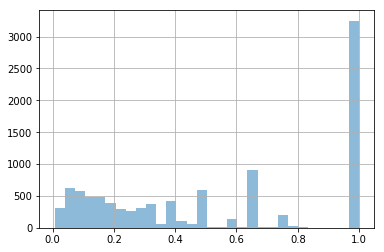

In [23]:
_, _, stats_concepts_pos = PSM.mine_obj_intersections(10000, 2, 'pos')
stats_concepts_pos['pos_confidence'].hist(alpha = 0.5, bins = 30)

In [28]:
%%time
from sklearn.model_selection import ParameterGrid
import multiprocessing

param_grid = {
    'subs_size': list(range(2,11)),
    'alpha': np.linspace(0,1,11), 
    'hypo_type' : ['pos'],
    'N_hypo_need' : [10000],
    'N_iterations' : [20000],
    'batch_size' : [10000],
}

### WARNING! round(params['alpha'], 4) ---> for readable folder names
MyParamGrid = []
for params in ParameterGrid(param_grid):
    save_path = os.path.join(DATA_FOLDER, 
                             'Hypotheses',
                             params['hypo_type'] + '_' + 
                             str(params['subs_size']) + '_' + 
                             str(round(params['alpha'], 4)))
    if not os.path.exists(save_path):
        os.mkdir(save_path)
    params['save_path'] = save_path
    MyParamGrid.append(params)


pool = multiprocessing.Pool(processes=30) #use all available cores, otherwise specify the number you want as an argument
for args in MyParamGrid:
    pool.apply_async(PSM.mine_hypotheses, args=(args['alpha'],
                                                args['hypo_type'],
                                                args['subs_size'],
                                                args['N_hypo_need'],
                                                args['N_iterations'],
                                                args['batch_size'],
                                                args['save_path'],
                                               ))
pool.close()
pool.join()

### Mine negative hypotheses

Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal


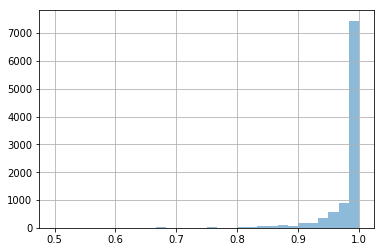

In [80]:
_, _, stats_concepts_pos = PSM.mine_obj_intersections(10000, 2, 'neg')
stats_concepts_pos['neg_confidence'].hist(alpha = 0.5, bins = 30)

In [42]:
%%time
from sklearn.model_selection import ParameterGrid
import multiprocessing

param_grid = {
    'subs_size': list(range(2,21)),
    'alpha': np.linspace(0.8,1,21), 
    'hypo_type' : ['neg'],
    'N_hypo_need' : [10000],
    'N_iterations' : [20000],
    'batch_size' : [10000],
}

### WARNING! round(params['alpha'], 4) ---> for readable folder names
MyParamGrid = []
for params in ParameterGrid(param_grid):
    save_path = os.path.join(DATA_FOLDER, 
                             'Hypotheses',
                             params['hypo_type'] + '_' + 
                             str(params['subs_size']) + '_' + 
                             str(round(params['alpha'], 4)))
    if not os.path.exists(save_path):
        os.mkdir(save_path)
    params['save_path'] = save_path
    MyParamGrid.append(params)


pool = multiprocessing.Pool(processes=30) #use all available cores, otherwise specify the number you want as an argument
for args in MyParamGrid:
    pool.apply_async(PSM.mine_hypotheses, args=(args['alpha'],
                                                args['hypo_type'],
                                                args['subs_size'],
                                                args['N_hypo_need'],
                                                args['N_iterations'],
                                                args['batch_size'],
                                                args['save_path'],
                                               ))
pool.close()
pool.join()

Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykern

N_mined_hypos of type neg 9984
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-p

N_mined_hypos of type neg 9983
N_mined_hypos of type neg 9906
N_mined_hypos of type neg 9993
N_mined_hypos of type neg 10000
N_mined_hypos of type neg 9980
N_mined_hypos of type neg 10000
N_mined_hypos of type neg 9865
N_mined_hypos of type neg 9977
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9947
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9995
Mining 10000 intersections
N_mined_hypos of type neg 9980
N_mined_hypos of type neg 9933
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9964
Mining 10000 intersections
N_mined_hypos of type neg 9991
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal


N_mined_hypos of type neg 9990
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal


N_mined_hypos of type neg 9998
N_mined_hypos of type neg 9944
N_mined_hypos of type neg 9990
N_mined_hypos of type neg 9917
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 9914
N_mined_hypos of type neg 9995
N_mined_hypos of type neg 9977
N_mined_hypos of type neg 9958
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 9953
Mining 10000 intersections
N_mined_hypos of type neg 9998
Mining 10000 intersections
N_mined_hypos of type neg 9998
Mining 10000 intersections
N_mined_hypos of type neg 9984
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 9983
Mining 10000 intersections
N_mined_hypos of type neg 9998
Mining 10000 intersections
N_mined_hypos of type neg 19969
Mining 10000 intersections
N_mined_hypos of type neg 19979
N_mined_hypos of type neg 19819
N_mined_hypos of type neg 19808
Mining 10000 intersections
N_mined_hypos of type neg 19979
N_mined_hypos of type neg 19953
N_mined_hypos of type neg 19995
N_mined_hypos of type neg 19877
N_mined_hypos of type neg 19953
N_mined_hypos of type neg 19993
N_mined_hypos of type neg 19995
N_mined_hypos of type neg 19985
N_mined_hypos of type neg 19856
N_mined_hypos of type neg 19911
Mining 10000 intersections
N_mined_hypos of type neg 19985
N_mined_hypos of type neg 19884
Mining 10000 intersections
N_mined_hypos of type neg 19969
N_mined_hypos of type neg 19898
N_mined_hypos of type neg 19947
N_mined_hypos of type neg 19921
Mining 10000 intersections
N_mined_hypos of type neg 19993
Mining 10000 intersections
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections
N_mined_hypos of type neg 19975
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 19813
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections
N_mined_hypos of type neg 19982


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 19960
Mining 10000 intersections
N_mined_hypos of type neg 19947


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 19730
N_mined_hypos of type neg 19960
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9963
Mining 10000 intersections
N_mined_hypos of type neg 9965
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 9945
Mining 10000 intersections
N_mined_hypos of type neg 9937
Mining 10000 intersections
N_mined_hypos of type neg 9996
Mining 10000 intersections
N_mined_hypos of type neg 9925
Mining 10000 intersections
N_mined_hypos of type neg 9982
Mining 10000 intersections
N_mined_hypos of type neg 9978
N_mined_hypos of type neg 9974
N_mined_hypos of type neg 9951
N_mined_hypos of type neg 9954
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9927
Mining 10000 intersections
N_mined_hypos of type neg 9915
Mining 10000 intersections
N_mined_hypos of type neg 9853
Mining 10000 intersections
N_mined_hypos of type neg 19917
N_mined_hypos of type neg 9905
Mining 10000 intersections
N_mined_hypos of type neg 19920
N_mined_hypos of type neg 9916
Mining 10000 intersections
N_mined_hypos of type neg 9913
Mining 10000 intersections
N_mined_hypos of type neg 9972
Mining 10000 intersections
N_mined_

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9989
Mining 10000 intersections
N_mined_hypos of type neg 9984
Mining 10000 intersections
N_mined_hypos of type neg 9973
Mining 10000 intersections
N_mined_hypos of type neg 9987
Mining 10000 intersections
N_mined_hypos of type neg 9962
Mining 10000 intersections
N_mined_hypos of type neg 9993
Mining 10000 intersections
N_mined_hypos of type neg 9995
Mining 10000 intersections
N_mined_hypos of type neg 9969
N_mined_hypos of type neg 9945
N_mined_hypos of type neg 9980
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 19994
N_mined_hypos of type neg 9957
Mining 10000 intersections
N_mined_hypos of type neg 9973
N_mined_hypos of type neg 9984
Mining 10000 intersections
N_mined_hypos of type neg 9996
Mining 10000 intersec

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 19988
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 19990
N_mined_hypos of type neg 19888
N_mined_hypos of type neg 19966
Mining 10000 intersections
N_mined_hypos of type neg 19936
N_mined_hypos of type neg 19967
N_mined_hypos of type neg 19892
N_mined_hypos of type neg 19905
Mining 10000 intersections
N_mined_hypos of type neg 19949
N_mined_hypos of type neg 19945
N_mined_hypos of type neg 19981
N_mined_hypos of type neg 19899
N_mined_hypos of type neg 9933
Mining 10000 intersections
N_mined_hypos of type neg 19990
Mining 10000 intersections
N_mined_hypos of type neg 19899
N_mined_hypos of type neg 19841
Mining 10000 intersections
N_mined_hypos of type neg 19931
Mining 10000 intersections
N_mined_hypos of type neg 19788
N_mined_hypos of type neg 19919
Mining 10000 intersections
N_mined_hypos of type neg 19817
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 19591
Mining 10000 intersections
N_mined_hypos of type neg 19939
N_mined_hypos of type neg 19829
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9914
Mining 10000 intersections
N_mined_hypos of type neg 9904
Mining 10000 intersections
N_mined_hypos of type neg 9892
Mining 10000 intersections
N_mined_hypos of type neg 9788
Mining 10000 intersections
N_mined_hypos of type neg 9960
Mining 10000 intersections
N_mined_hypos of type neg 9995
Mining 10000 intersections
N_mined_hypos of type neg 9994
Mining 10000 intersections
N_mined_hypos of type neg 19870
N_mined_hypos of type neg 9991
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9989
Mining 10000 intersections
N_mined_hypos of type neg 19855


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 9978
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 9968
Mining 10000 intersections
N_mined_hypos of type neg 9944
Mining 10000 intersections
N_mined_hypos of type neg 9936
Mining 10000 intersections
N_mined_hypos of type neg 9928
N_mined_hypos of type neg 9914
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9882
Mining 10000 intersections
N_mined_hypos of type neg 9982
Mining 10000 intersections
N_mined_hypos of type neg 9954
N_mined_hypos of type neg 9959
N_mined_hypos of type neg 9960
Mining 10000 intersections
N_mined_hypos of type neg 9748
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9984
Mining 10000 intersections
N_mined_hypos of type neg 9995
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9992
Mining 10000 intersections
N_mined_hypos of type neg 9927
Mining 10000 intersections
N_mined_hypos of type neg 9911
Mining 10000 intersections
N_mined_hypos of type neg 9989
Mining 10000 i

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 19902


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 19938


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 19886
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 19981
N_mined_hypos of type neg 19932
Mining 10000 intersections
N_mined_hypos of type neg 19914
N_mined_hypos of type neg 19961
N_mined_hypos of type neg 19971
N_mined_hypos of type neg 19864
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9975
Mining 10000 intersections
N_mined_hypos of type neg 9967
Mining 10000 intersections
N_mined_hypos of type neg 9962
Mining 10000 intersections
N_mined_hypos of type neg 9962
Mining 10000 intersections
N_mined_hypos of type neg 9946
Mining 10000 intersections
N_mined_hypos of type neg 9958
Mining 10000 intersections
N_mined_hypos of type neg 19978
N_mined_hypos of type neg 9933
Mining 10000 intersections
Mining 10000 i

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 19934
Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 19930
Mining 10000 intersections
N_mined_hypos of type neg 19911
Mining 10000 intersections
N_mined_hypos of type neg 19890
Mining 10000 intersections
N_mined_hypos of type neg 19920
N_mined_hypos of type neg 19870
N_mined_hypos of type neg 19818
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9911
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 19958
N_mined_hypos of type neg 19948
N_mined_hypos of type neg 19895
N_mined_hypos of type neg 19773
N_mined_hypos of type neg 19853
N_mined_hypos of type neg 19932
Mining 10000 intersections
N_mined_hypos of type neg 19876
N_mined_hypos of type neg 19828
N_mined_hypos of type neg 19984
Mining 10000 intersections
N_mined_hypos of type neg 19907
N_mined_hypos of type neg 19832
Mining 10000 intersections
N_mined_hypos of type neg 19912
Mining 10000 intersections
N_mined_hypos of type neg 19973
N_mined_hypos of type neg 19982
Mining 10000 intersections
Minin

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 19854
N_mined_hypos of type neg 19904
N_mined_hypos of type neg 19978
Mining 10000 intersections
N_mined_hypos of type neg 19976
N_mined_hypos of type neg 19952
Mining 10000 intersections
N_mined_hypos of type neg 9960
N_mined_hypos of type neg 19831
Mining 10000 intersections
N_mined_hypos of type neg 19789
N_mined_hypos of type neg 19966
N_mined_hypos of type neg 19966
N_mined_hypos of type neg 9953
Mining 10000 intersections
N_mined_hypos of type neg 19971
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9942
Mining 10000 intersections
N_mined_hypos of type neg 9942
Mining 10000 intersections
N_mined_hypos of type neg 9941
Mining 10000

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 19924
N_mined_hypos of type neg 19931
N_mined_hypos of type neg 19874
Mining 10000 intersections
N_mined_hypos of type neg 18955
N_mined_hypos of type neg 19800
N_mined_hypos of type neg 19904
Mining 10000 intersections
N_mined_hypos of type neg 19827


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


N_mined_hypos of type neg 9935
Mining 10000 intersections
N_mined_hypos of type neg 19889
N_mined_hypos of type neg 9974
Mining 10000 intersections
N_mined_hypos of type neg 19796
N_mined_hypos of type neg 19842
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9981
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9981
Mining 10000 intersections
N_mined_hypos of type neg 9980
Mining 10000 intersections
N_mined_hypos of type neg 9983
Mining 10000 intersections
N_mined_hypos of type neg 19604
N_mined_hypos of type neg 9968
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9970
Mining 10000 intersections
N_mined_hypos of type neg 9959
Mining 10000 intersections
N_mined_hypos of type neg 9956
Mining 10000 intersections
N_mined_hypos of type neg 9950
Mining 10000 inter

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered


Mining 10000 intersections
N_mined_hypos of type neg 9868
Mining 10000 intersections
N_mined_hypos of type neg 19866
N_mined_hypos of type neg 19835
Mining 10000 intersections
N_mined_hypos of type neg 19843
Mining 10000 intersections
N_mined_hypos of type neg 19780
N_mined_hypos of type neg 18711
N_mined_hypos of type neg 19829
N_mined_hypos of type neg 9871
Mining 10000 intersections
N_mined_hypos of type neg 9880
Mining 10000 intersections
N_mined_hypos of type neg 19550
N_mined_hypos of type neg 18147
Mining 10000 intersections
N_mined_hypos of type neg 9874
Mining 10000 intersections
N_mined_hypos of type neg 19800
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 19343
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 9852
Mining 10000 intersections
N_mined_hypos of type neg 9886
Mining 10000 intersections
N_mined_hypos of type neg 19669
Min

N_mined_hypos of type neg 3269
Mining 10000 intersections
N_mined_hypos of type neg 5174
Mining 10000 intersections
N_mined_hypos of type neg 11894
N_mined_hypos of type neg 7659
N_mined_hypos of type neg 4294
N_mined_hypos of type neg 2986
Mining 10000 intersections
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 3641
Mining 10000 intersections
N_mined_hypos of type neg 2090
Mining 10000 intersections
N_mined_hypos of type neg 1804
Mining 10000 intersections
N_mined_hypos of type neg 11444
N_mined_hypos of type neg 2609
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 10927
Mining 10000 intersections
Mining 10000 intersections
N_mined_hypos of type neg 1586
Mining 10000 intersections
N_mined_hypos of type neg 1292
Mining 10000 intersections
N_mined_hypos of type neg 8002
N_mined_hypos of type neg 10385
N_mined_hypos of type neg 9182
Mining 10000 intersections
N_mined_hypos of type neg 1063
Mining 10000 intersections
N_mine

In [81]:
# %%time
alpha_pos = 0.1
subs_size = 3
hypo_type = 'pos'

# save_path = os.path.join(DATA_FOLDER, 'Hypotheses',hypo_type + '_' + str(subs_size) + '_' + str(alpha_pos))
# # if not os.path.exists(save_path):
# #     os.mkdir(save_path)
pos_hypotheses_min, pos_hypotheses_max = PSM.mine_hypotheses(alpha = alpha_pos,
                                                             hypo_type = 'pos',
                                                             subs_size = 3,
                                                             N_hypo_need = 500,
                                                             N_iterations = 10000,
                                                             batch_size = 10000,
#                                                              save_path = save_path
                                                            )

Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in less_equal


N_mined_hypos of type pos 5758


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal


In [82]:
%%time
alpha_neg = 0.9999
neg_hypotheses_min, neg_hypotheses_max = PSM.mine_hypotheses(alpha = alpha_neg,
                                                    hypo_type = 'neg',
                                                    subs_size = 3,
                                                    N_hypo_need = 500,
                                                    N_iterations = 20000,
                                                    batch_size = 10000
                                                   )

Mining 10000 intersections


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:35: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: All-NaN slice encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in less_equal


N_mined_hypos of type neg 1508
CPU times: user 5.72 s, sys: 2.48 s, total: 8.2 s
Wall time: 8.19 s


/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in greater_equal


### PatternStructuresClassifier

In [18]:
class PatternStructuresClassifier():
    """
    Classifier turns hypotheses given test objects into classifiers
    """
    def __init__(self, data_pos, data_neg, feature_list):
        """
        :param data_pos: Pandas.DataFrame with objects from class 1
        :param data_neg: Pandas.DataFrame with objects from class 0
        :param feature_list: list of column names used as features
        """
        self.data_pos = data_pos[feature_list]
        self.data_neg = data_neg[feature_list]
        self.X_pos_expanded = self.data_pos.values[None,:,:]
        self.X_neg_expanded = self.data_neg.values[None,:,:]
        self.feature_list = feature_list
        self.is_nan_X_pos_expanded = np.isnan(self.X_pos_expanded)
        self.is_nan_X_neg_expanded = np.isnan(self.X_neg_expanded)
        
    def classify_test_objects(self, X_test, hypotheses_min, hypotheses_max, alpha, 
                              save_scores_file_path=None, print_when_over=False):
        """
        :X_test: Pandas.DataFrame with objects from class 1
        :hypotheses_min: min_bound of hypotheses of shape (n_hypos, n_feat)
        :hypotheses_max: max_bound of hypotheses of shape (n_hypos, n_feat)
        :alpha: list of column names used as features
        :save_scores_file_path: path to FILE with scores for given test objects
        :print_when_over: print a message when completed (useful for parallel computing)
        """
        SCORE_RES = []
        for i in range(X_test.shape[0]):
            test_obj = X_test[[i],:]

            classifier_min = np.nanmin([np.repeat(test_obj, hypotheses_min.shape[0], axis=0), hypotheses_min], axis=0)[:,None,:]
            classifier_max = np.nanmax([np.repeat(test_obj, hypotheses_max.shape[0], axis=0), hypotheses_max], axis=0)[:,None,:]


            num_POS_objs_in_clfs = ((((classifier_min <= self.X_pos_expanded) | np.isnan(classifier_min)) & 
                    ((classifier_max >= self.X_pos_expanded) | np.isnan(classifier_max))) | 
                    self.is_nan_X_pos_expanded).all(axis=-1).sum(axis=-1)
            num_NEG_objs_in_clfs = ((((classifier_min <= self.X_neg_expanded) | np.isnan(classifier_min)) & 
                    ((classifier_max >= self.X_neg_expanded) | np.isnan(classifier_max))) | 
                    self.is_nan_X_neg_expanded).all(axis=-1).sum(axis=-1)

            POS_rate_clf = num_POS_objs_in_clfs / (num_POS_objs_in_clfs + num_NEG_objs_in_clfs)
            NEG_rate_clf = 1 - POS_rate_clf

            POS_rate_alpha_sum = (num_POS_objs_in_clfs / (num_NEG_objs_in_clfs + num_POS_objs_in_clfs) >= alpha).sum(axis=-1)
            NEG_rate_alpha_sum = (num_NEG_objs_in_clfs / (num_NEG_objs_in_clfs + num_POS_objs_in_clfs) >= alpha).sum(axis=-1)


            scores_dict = {
                'num_POS_objs_in_clfs' : (num_POS_objs_in_clfs).sum(axis=-1),
                'num_NEG_objs_in_clfs' : (num_NEG_objs_in_clfs).sum(axis=-1),

                'POS_rate_clf' : (POS_rate_clf).sum(axis=-1),
                'NEG_rate_clf' : (NEG_rate_clf).sum(axis=-1),

                'num_POS2NEG_clf' : (np.divide(num_POS_objs_in_clfs.astype(np.float32), 
                                       num_NEG_objs_in_clfs.astype(np.float32), 
                                       out=np.ones_like(num_POS_objs_in_clfs.astype(np.float32))*self.data_pos.shape[0],
                                       where=num_NEG_objs_in_clfs.astype(np.float32)!=0)).sum(axis=-1),

                'POS_rate_alpha_sum' : POS_rate_alpha_sum,
                'NEG_rate_alpha_sum' : NEG_rate_alpha_sum,
            }
            SCORE_RES.append(scores_dict)
            
        df_test_scores = pd.DataFrame(SCORE_RES)
        if save_scores_file_path:
            df_test_scores.to_csv(save_scores_file_path)
        
        if print_when_over:
            print(hypo_source_path, " is OVER now!!!")
        return df_test_scores

In [19]:
features = ['RevolvingUtilizationOfUnsecuredLines', 'age',
       'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome',
       'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
       'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse',
       'NumberOfDependents']

In [20]:
PS_clf = PatternStructuresClassifier(df_train_pos, df_train_neg, features)

#### Parallel through all combinations of Hyperparams

In [21]:
N_HYPO_MAX = 500

In [23]:
def is_non_zero_file(fpath):
    return True if os.path.isfile(fpath) and os.path.getsize(fpath) > 0 else False

listdir = os.listdir(os.path.join(DATA_FOLDER,'Hypotheses'))
listdir.remove('.ipynb_checkpoints')
np.random.shuffle(listdir)

MyParamGrid = []
for hypo_source_dir in listdir:
    _, _, alpha = hypo_source_dir.split('_')
    alpha = float(alpha)
    
    hypo_source_path = os.path.join(DATA_FOLDER,'Hypotheses', hypo_source_dir)
    hypo_path_min = os.path.join(hypo_source_path, 'hypotheses_min.csv')
    hypo_path_max = os.path.join(hypo_source_path, 'hypotheses_max.csv')

    if is_non_zero_file(hypo_path_min):
        hypotheses_min = pd.read_csv(hypo_path_min, header=None).values[:N_HYPO_MAX]
        hypotheses_max = pd.read_csv(hypo_path_max, header=None).values[:N_HYPO_MAX]

    args = {
        'X_test':X_test,
        'hypotheses_min':hypotheses_min,
        'hypotheses_max':hypotheses_max,
        'alpha':alpha,
        'save_scores_file_path':os.path.join(hypo_source_path, 'df_test_scores.csv')
        'print_when_over':True
    }
 
    MyParamGrid.append(args)

#### Parallel through X_test (one set of params)

In [27]:
def is_non_zero_file(fpath):
    return True if os.path.isfile(fpath) and os.path.getsize(fpath) > 0 else False

listdir = os.listdir(os.path.join(DATA_FOLDER,'Hypotheses'))
listdir.remove('.ipynb_checkpoints')
np.random.shuffle(listdir)

hypo_source_dir = 'pos_2_0.8'
_, _, alpha = hypo_source_dir.split('_')
alpha = float(alpha)
hypo_source_path = os.path.join(DATA_FOLDER,'Hypotheses', hypo_source_dir)
hypo_path_min = os.path.join(hypo_source_path, 'hypotheses_min.csv')
hypo_path_max = os.path.join(hypo_source_path, 'hypotheses_max.csv')

print("Any hypotheses in there? ", is_non_zero_file(hypo_path_min))
N_HYPO_MAX = 100000
if is_non_zero_file(hypo_path_min):
    hypotheses_min = pd.read_csv(hypo_path_min, header=None).values[:N_HYPO_MAX]
    hypotheses_max = pd.read_csv(hypo_path_max, header=None).values[:N_HYPO_MAX]
MyParamGrid = []
for i in range(50):
# for test_obj in X_test[:90]:
    args = {
#         'X_test':test_obj[None,:],
        'X_test':X_test[100*i:100*(i+1)],
        'hypotheses_min':hypotheses_min,
        'hypotheses_max':hypotheses_max,
        'alpha':alpha,
        'save_scores_file_path':None,
        'print_when_over':False
    }
    MyParamGrid.append(args)

Any hypotheses in there?  True


#### Run parallel

In [ ]:
%%time
import multiprocessing
pool = multiprocessing.Pool(processes=50) #use all available cores, otherwise specify the number you want as an argument

results = []
for args in MyParamGrid:
#     print(args)
    res = pool.apply_async(PS_clf.classify_test_objects, args=(args['X_test'],
                                                               args['hypotheses_min'],
                                                               args['hypotheses_max'],
                                                               args['alpha'],
                                                               args['save_scores_file_path'],
                                                               args['print_when_over']
                                                              ))
    results.append(res)
    
pool.close()
pool.join()

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:33: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:34: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:33: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:34: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:33: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:34: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:38: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:38: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:33: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:34: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:38: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:38: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:37: Ru

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/sit

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packag

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:33: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:34: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: Runti

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packag

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:33: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:34: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:33: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:34: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encounter

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in true_divide
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:33: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:34: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:33: RuntimeWarning: All-NaN axis encountered
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:34: RuntimeWarning: All-N

In [25]:
X_test.shape

(5000, 10)

In [73]:
dfdf = pd.concat(results)

In [18]:
class PatternStructuresAggregator():
    """
    Class aggregates classifiers and calculates final scores
    """
    def __init__(self, data_pos, data_neg, feature_list):
        """
        :param data_pos: Pandas.DataFrame with objects from class 1
        :param data_neg: Pandas.DataFrame with objects from class 0
        :param feature_list: list of column names used as features
        """
        self.data_pos = data_pos[feature_list]
        self.data_neg = data_neg[feature_list]
        self.X_pos_expanded = self.data_pos.values[None,:,:]
        self.X_neg_expanded = self.data_neg.values[None,:,:]
        self.feature_list = feature_list
        self.is_nan_X_pos_expanded = np.isnan(self.X_pos_expanded)
        self.is_nan_X_neg_expanded = np.isnan(self.X_neg_expanded)
      

In [19]:
listdir = os.listdir(os.path.join(DATA_FOLDER,'Hypotheses'))
listdir.remove('.ipynb_checkpoints')
np.random.shuffle(listdir)

df_test_scores_dict = {'pos':{},'neg':{}}
for hypo_source_dir in listdir:
    hypo_source_path = os.path.join(DATA_FOLDER,'Hypotheses',hypo_source_dir,'df_test_scores.csv')
    try:
        df_test_scores = pd.read_csv(hypo_source_path, index_col=0)
        clf_type, _, _ = hypo_source_dir.split('_')
        df_test_scores_dict[clf_type][hypo_source_dir] = df_test_scores
    except FileNotFoundError: 
        print("No hypotheses were mined in '" + hypo_source_path + "'")

No hypotheses were mined in 'GiveMeSomeCredit/Hypotheses/pos_10_0.5/df_test_scores.csv'
No hypotheses were mined in 'GiveMeSomeCredit/Hypotheses/pos_7_0.7/df_test_scores.csv'
No hypotheses were mined in 'GiveMeSomeCredit/Hypotheses/pos_7_0.6/df_test_scores.csv'
No hypotheses were mined in 'GiveMeSomeCredit/Hypotheses/pos_9_0.6/df_test_scores.csv'
No hypotheses were mined in 'GiveMeSomeCredit/Hypotheses/pos_7_1.0/df_test_scores.csv'
No hypotheses were mined in 'GiveMeSomeCredit/Hypotheses/neg_17_1.0/df_test_scores.csv'
No hypotheses were mined in 'GiveMeSomeCredit/Hypotheses/neg_8_1.0/df_test_scores.csv'
No hypotheses were mined in 'GiveMeSomeCredit/Hypotheses/pos_7_0.8/df_test_scores.csv'
No hypotheses were mined in 'GiveMeSomeCredit/Hypotheses/neg_12_1.0/df_test_scores.csv'
No hypotheses were mined in 'GiveMeSomeCredit/Hypotheses/neg_20_0.99/df_test_scores.csv'
No hypotheses were mined in 'GiveMeSomeCredit/Hypotheses/neg_20_1.0/df_test_scores.csv'
No hypotheses were mined in 'GiveMeSo

In [21]:
y_test = y[df_test.index]

In [33]:
FINAL_METRICS_LIST = []
i = 0
for clf_param_pos, df_test_scores_pos in df_test_scores_dict['pos'].items():
    for clf_param_neg, df_test_scores_neg in df_test_scores_dict['neg'].items():
        if i %1000 == 0:
            i
        i+=1
        df_test_scores_pos = df_test_scores_pos.fillna(df_test_scores_pos.mean())
        df_test_scores_neg = df_test_scores_neg.fillna(df_test_scores_neg.mean())
        score_rate = df_test_scores_pos['POS_rate_clf'] - df_test_scores_neg['NEG_rate_clf']
        metric_rate = 2*metrics.roc_auc_score(y_test, score_rate) - 1 # Gini
        
        score_ratios = df_test_scores_pos['num_POS2NEG_clf'] - (1/df_test_scores_neg['num_POS2NEG_clf'])
        score_ratios = score_ratios.replace(np.inf, 999999)
        score_ratios = score_ratios.replace(-np.inf, -999999)
        metric_ratios = 2*metrics.roc_auc_score(y_test, score_ratios) - 1 # Gini
        
        final_score = df_test_scores_pos['POS_rate_alpha_sum'].values - df_test_scores_neg['NEG_rate_alpha_sum'].values
        final_metric = 2*metrics.roc_auc_score(y_test, final_score) - 1 # Gini
        
        FINAL_METRICS_LIST.append({
            'clf_pos':clf_param_pos,
            'clf_neg':clf_param_neg,
            'metric_rate':metric_rate,
            'metric_ratios':metric_ratios,
            'final_metric':final_metric,
        })
df_FINAL_METRICS = pd.DataFrame(FINAL_METRICS_LIST)

0

1000

2000

3000

4000

5000

6000

7000

8000

9000

10000

11000

12000

13000

14000

15000

16000

17000

18000

19000

20000

21000

22000

23000

24000

25000

26000

0.7182025015228006

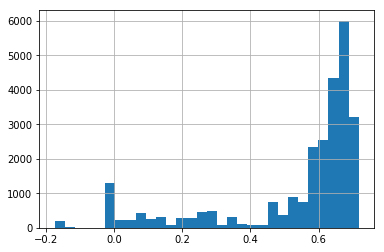

In [34]:
df_FINAL_METRICS['final_metric'].max()
df_FINAL_METRICS['final_metric'].hist(bins=30)

0.7150549498766272

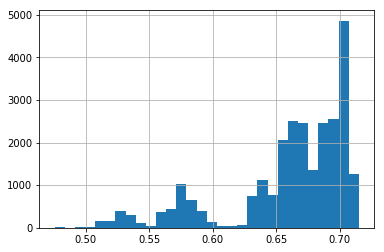

In [35]:
df_FINAL_METRICS['metric_rate'].max()
df_FINAL_METRICS['metric_rate'].hist(bins=30)

0.7116325197964091

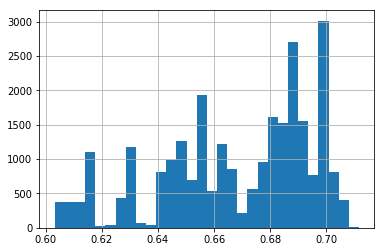

In [36]:
df_FINAL_METRICS['metric_ratios'].max()
df_FINAL_METRICS['metric_ratios'].hist(bins=30)

In [43]:
df_FINAL_METRICS.sort_values('final_metric', ascending=False).head(10)

,clf_neg,clf_pos,final_metric,metric_rate,metric_ratios
9825,neg_9_0.95,pos_2_0.9,0.718203,0.533927,0.676519
9849,neg_13_0.95,pos_2_0.9,0.717237,0.530508,0.676519
4182,neg_14_0.96,pos_3_0.3,0.716935,0.699337,0.689654
12756,neg_18_0.96,pos_2_0.4,0.716669,0.557955,0.653899
11604,neg_18_0.96,pos_2_0.5,0.716537,0.528805,0.658298
14676,neg_18_0.96,pos_2_0.6,0.716054,0.513545,0.662309
14934,neg_14_0.96,pos_2_0.6,0.716051,0.514931,0.662309
9646,neg_15_0.95,pos_2_0.9,0.715931,0.529640,0.676519
13014,neg_14_0.96,pos_2_0.4,0.715449,0.559671,0.653899
12722,neg_19_0.96,pos_2_0.4,0.715149,0.557870,0.653899


In [61]:
from sklearn import  ensemble
RF = ensemble.RandomForestClassifier(500, 
                                     min_samples_split=300,
                                     min_samples_leaf=150)
RF.fit(df_train.fillna(df_train.mean()), y[df_train.index])
2*metrics.roc_auc_score(y[df_test.index], RF.predict_proba(df_test.fillna(df_train.mean()))[:,1]) - 1

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=150, min_samples_split=300,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

0.7264294969079403

In [97]:
df_test_scores_concat = pd.concat(df_test_scores_LIST, axis=1)

In [100]:
df_test_scores_concat.shape

(5000, 3171)

In [112]:
df_test_scores_concat.columns[df_test_scores_concat.isnull().any()]

Index(['pos_3_0.9_NEG_rate_clf', 'pos_3_0.9_POS_rate_clf',
       'pos_2_0.0_NEG_rate_clf', 'pos_2_0.0_POS_rate_clf',
       'pos_2_0.9_NEG_rate_clf', 'pos_2_0.9_POS_rate_clf',
       'pos_3_0.7_NEG_rate_clf', 'pos_3_0.7_POS_rate_clf',
       'pos_3_1.0_NEG_rate_clf', 'pos_3_1.0_POS_rate_clf',
       ...
       'pos_3_0.2_NEG_rate_clf', 'pos_3_0.2_POS_rate_clf',
       'pos_2_0.2_NEG_rate_clf', 'pos_2_0.2_POS_rate_clf',
       'neg_2_0.87_NEG_rate_clf', 'neg_2_0.87_POS_rate_clf',
       'pos_2_0.7_NEG_rate_clf', 'pos_2_0.7_POS_rate_clf',
       'neg_2_0.99_NEG_rate_clf', 'neg_2_0.99_POS_rate_clf'],
      dtype='object', length=102)

In [119]:
df_test_scores_concat = df_test_scores_concat.fillna(df_test_scores_concat.mean())

In [120]:
from sklearn import linear_model
LR = linear_model.LogisticRegression(C=100000000)
LR.fit(df_test_scores_concat.values, y[df_test.index].values)

/home/autodeploy/.local/lib/python3.5/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=100000000, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='warn', n_jobs=None, penalty='l2', random_state=None,
          solver='warn', tol=0.0001, verbose=0, warm_start=False)

In [181]:
temp_train, temp_test, y_train, y_test = model_selection.train_test_split(df_test_scores_concat.values, y[df_test.index].values)

from sklearn import decomposition
from sklearn import linear_model

PCA = decomposition.PCA(10)
PCA.fit(temp_train)
LR = linear_model.LogisticRegression(C=100000000)
LR.fit(PCA.transform(temp_train), y_train)

2*metrics.roc_auc_score(y_test, LR.predict_proba(PCA.transform(temp_test))[:,1]) - 1

PCA(copy=True, iterated_power='auto', n_components=10, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

/home/autodeploy/.local/lib/python3.5/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=100000000, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='warn', n_jobs=None, penalty='l2', random_state=None,
          solver='warn', tol=0.0001, verbose=0, warm_start=False)

0.7090835647563747

In [68]:
pd.concat([df_test_scores, df_test_scores1], axis=1)

,NEG_rate_alpha_sum,NEG_rate_clf,POS_rate_alpha_sum,POS_rate_clf,num_NEG_objs_in_clfs,num_POS2NEG_clf,num_POS_objs_in_clfs,NEG_rate_alpha_sum,NEG_rate_clf,POS_rate_alpha_sum,POS_rate_clf,num_NEG_objs_in_clfs,num_POS2NEG_clf,num_POS_objs_in_clfs
0,500,484.321589,0,15.678411,4932533,16.224768,161976,500,483.819856,0,16.180144,5447106,16.758043,184237
1,500,484.056504,0,15.943496,5057370,16.507057,168686,500,483.613794,0,16.386206,5558162,16.977596,190269
2,500,482.870111,0,17.129889,5128321,17.774347,184140,500,482.390855,0,17.609145,5658144,18.288383,208471
3,500,483.866368,0,16.133632,5153473,16.711239,174044,500,483.405801,0,16.594199,5627466,17.201126,195178
4,500,484.358782,0,15.641218,4849930,16.184893,159033,500,483.844417,0,16.155583,5393646,16.731693,182267
5,500,484.269122,0,15.730878,4962944,16.280069,163282,500,483.780075,0,16.219925,5467905,16.800236,185234
6,500,484.328725,0,15.671275,4886528,16.216677,160503,500,483.822870,0,16.177130,5420572,16.754738,183369
7,500,484.440535,0,15.559465,4991535,16.097069,163030,500,483.905689,0,16.094311,5488384,16.665421,184913
8,500,483.668138,0,16.331862,5057857,16.915081,172120,500,483.317541,0,16.682459,5543934,17.290140,192907
9,500,483.887408,0,16.112592,5140149,16.685215,173029,500,483.453170,0,16.546830,5669437,17.147650,195904


In [ ]:
hypo_source_dir = os.listdir(os.path.join('GiveMeSomeCredit','Hypotheses'))[0]
hypo_type, _, alpha = hypo_source_dir.split('_')
alpha = float(alpha)

hypo_source_path = os.path.join('GiveMeSomeCredit','Hypotheses', hypo_source_dir)
N_HYPO_MAX = 500
hypo_source_path
PS_clf.classify_test_objects(X_test, hypo_source_path, alpha, N_HYPO_MAX)

In [64]:
len(os.listdir(os.path.join('GiveMeSomeCredit','Hypotheses')))

499

In [35]:
(6/8*4/7*2/6*1/5)**(1/4)

0.4111336169005197

In [86]:
%%time

SCORE_RES = []
for i in range(5):
#     test_obj = X_test[y[df_test.index] == 0][i,None,:]
    test_obj = X_test[i,None,:]

#     pos_classifier_min = np.minimum(np.repeat(test_obj, pos_hypotheses_min.shape[0], axis=0), pos_hypotheses_min)
#     pos_classifier_max = np.maximum(np.repeat(test_obj, pos_hypotheses_max.shape[0], axis=0), pos_hypotheses_max)
#     neg_classifier_min = np.minimum(np.repeat(test_obj, neg_hypotheses_min.shape[0], axis=0), neg_hypotheses_min)
#     neg_classifier_max = np.maximum(np.repeat(test_obj, neg_hypotheses_max.shape[0], axis=0), neg_hypotheses_max)
    
    pos_classifier_min = np.nanmin([np.repeat(test_obj, pos_hypotheses_min.shape[0], axis=0), pos_hypotheses_min], axis=0)
    pos_classifier_max = np.nanmax([np.repeat(test_obj, pos_hypotheses_max.shape[0], axis=0), pos_hypotheses_max], axis=0)
    neg_classifier_min = np.nanmin([np.repeat(test_obj, neg_hypotheses_min.shape[0], axis=0), neg_hypotheses_min], axis=0)
    neg_classifier_max = np.nanmax([np.repeat(test_obj, neg_hypotheses_max.shape[0], axis=0), neg_hypotheses_max], axis=0)
    
    
#     neg_classifier_min = np.nanmin([np.repeat(neg_hypotheses_min, test_obj.shape[0], axis=0),
#                                np.repeat(test_obj, neg_hypotheses_min.shape[1], axis=1)], axis=0)
#     neg_classifier_max = np.nanmax([np.repeat(neg_hypotheses_max, test_obj.shape[0], axis=0),
#                                np.repeat(test_obj, neg_hypotheses_max.shape[1], axis=1)], axis=0)

    neg_classifier_min = neg_classifier_min[:,None,:]
    neg_classifier_max = neg_classifier_max[:,None,:]
    pos_classifier_min = pos_classifier_min[:,None,:]
    pos_classifier_max = pos_classifier_max[:,None,:]

    num_NEG_objs_in_clfs_NEG = ((((neg_classifier_min <= PS_clf.X_neg_expanded) | np.isnan(neg_classifier_min)) & 
            ((neg_classifier_max >= PS_clf.X_neg_expanded) | np.isnan(neg_classifier_max))) | 
            PS_clf.is_nan_X_neg_expanded).all(axis=-1).sum(axis=-1)
    num_POS_objs_in_clfs_NEG = ((((neg_classifier_min <= PS_clf.X_pos_expanded) | np.isnan(neg_classifier_min)) & 
            ((neg_classifier_max >= PS_clf.X_pos_expanded) | np.isnan(neg_classifier_max))) | 
            PS_clf.is_nan_X_pos_expanded).all(axis=-1).sum(axis=-1)

    num_NEG_objs_in_clfs_POS = ((((pos_classifier_min <= PS_clf.X_neg_expanded) | np.isnan(pos_classifier_min)) & 
            ((pos_classifier_max >= PS_clf.X_neg_expanded) | np.isnan(pos_classifier_max))) | 
            PS_clf.is_nan_X_neg_expanded).all(axis=-1).sum(axis=-1)
    num_POS_objs_in_clfs_POS = ((((pos_classifier_min <= PS_clf.X_pos_expanded) | np.isnan(pos_classifier_min)) & 
            ((pos_classifier_max >= PS_clf.X_pos_expanded) | np.isnan(pos_classifier_max))) | 
            PS_clf.is_nan_X_pos_expanded).all(axis=-1).sum(axis=-1)

    POS_rate_POS_clf = num_POS_objs_in_clfs_POS / (num_NEG_objs_in_clfs_POS + num_POS_objs_in_clfs_POS)
    NEG_rate_POS_clf = 1 - POS_rate_POS_clf
    NEG_rate_NEG_clf = num_NEG_objs_in_clfs_NEG / (num_NEG_objs_in_clfs_NEG + num_POS_objs_in_clfs_NEG)
    POS_rate_NEG_clf = 1 - NEG_rate_NEG_clf


    POS_rate_POS_alpha_sum = (num_POS_objs_in_clfs_POS / (num_NEG_objs_in_clfs_POS + num_POS_objs_in_clfs_POS) >= alpha_pos).sum(axis=-1)
    NEG_rate_NEG_alpha_sum = (num_NEG_objs_in_clfs_NEG / (num_NEG_objs_in_clfs_NEG + num_POS_objs_in_clfs_NEG) >= alpha_neg).sum(axis=-1)

    scores_dict = {
        'score_1' : (num_POS_objs_in_clfs_POS).sum(axis=-1),
        'score_2' : (num_NEG_objs_in_clfs_NEG).sum(axis=-1),

        'score_6' : (POS_rate_POS_clf).sum(axis=-1),
        'score_7' : (NEG_rate_NEG_clf).sum(axis=-1),
        'score_8' : (POS_rate_POS_clf + POS_rate_NEG_clf).sum(axis=-1),
        'score_9' : (NEG_rate_POS_clf + NEG_rate_NEG_clf).sum(axis=-1),
        'score_10' : (POS_rate_POS_clf + POS_rate_NEG_clf - (NEG_rate_POS_clf + NEG_rate_NEG_clf)).sum(axis=-1),

        'score_11' : (np.divide(num_POS_objs_in_clfs_POS.astype(np.float32), 
                               num_NEG_objs_in_clfs_POS.astype(np.float32), 
                               out=np.ones_like(num_POS_objs_in_clfs_POS.astype(np.float32))*PS_clf.data_pos.shape[0],
                               where=num_NEG_objs_in_clfs_POS.astype(np.float32)!=0)).sum(axis=-1),
        'score_12' : (np.divide(num_POS_objs_in_clfs_NEG.astype(np.float32), 
                               num_NEG_objs_in_clfs_NEG.astype(np.float32), 
                               out=np.ones_like(num_POS_objs_in_clfs_POS.astype(np.float32))*PS_clf.data_pos.shape[0],
                               where=num_NEG_objs_in_clfs_NEG.astype(np.float32)!=0)).sum(axis=-1),

        'score_13' : POS_rate_POS_alpha_sum,
        'score_14' : NEG_rate_NEG_alpha_sum,
        'score_15' : POS_rate_POS_alpha_sum - NEG_rate_NEG_alpha_sum,
    }
    SCORE_RES.append(scores_dict)

/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:12: RuntimeWarning: All-NaN axis encountered
  if sys.path[0] == '':
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:13: RuntimeWarning: All-NaN axis encountered
  del sys.path[0]
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:14: RuntimeWarning: All-NaN axis encountered
  
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:15: RuntimeWarning: All-NaN axis encountered
  from ipykernel import kernelapp as app
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in greater_equal
/home/autodeploy/.local/lib/python3.5/site-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less_equal
/home/autodeploy/.local/lib/pytho

CPU times: user 2.95 s, sys: 1.08 s, total: 4.03 s
Wall time: 4.02 s


In [28]:
pd.DataFrame(SCORE_RES).to_csv('SCORE_RES_1000')

In [23]:
df_res = pd.read_csv(os.path.join(DATA_FOLDER, 'SCORE_RES_1000'), index_col=0)

In [24]:
df_res.shape

(1000, 15)

In [25]:
from sklearn import metrics
for i in range(1,16):
    "score_" + str(i), 2*metrics.roc_auc_score(y[df_test.index].values[:1000], df_res['score_' + str(i)]) - 1

('score_1', -0.5422179363548698)

('score_2', 0.44596592735454843)

('score_3', -0.1846737383477981)

('score_4', -0.21199614271938283)

('score_5', 0.21141755062680812)

('score_6', 0.6897717775634844)

('score_7', -0.686300225008036)

('score_8', 0.69699774991964)

('score_9', -0.6969977499196399)

('score_10', 0.69699774991964)

('score_11', 0.6609450337512055)

('score_12', 0.6865316618450659)

('score_13', 0.6581935069109612)

('score_14', -0.6600321440051431)

('score_15', 0.7279459980713596)

In [203]:
num_neg_objs_in_concepts = ((((concepts_min <= PSM.X_neg_expanded) | np.isnan(concepts_min)) & 
                            ((concepts_max >= PSM.X_neg_expanded) | np.isnan(concepts_max))) | 
                            PSM.is_nan_X_neg_expanded).all(axis=-1)

NameError: name 'concepts_min' is not defined

In [ ]:
# num_pos_objs_in_concepts = ((((concepts_min <= self.X_pos_expanded) | np.isnan(concepts_min)) & 
#                             ((concepts_max >= self.X_pos_expanded) | np.isnan(concepts_max))) | 
#                             self.is_nan_X_pos_expanded).all(axis=2).sum(axis=1)

In [ ]:
classifier_min = np.nanmin(test_obj, axis=1)
# classifier_max = np.nanmax(data.values[indexes], axis=1)

In [ ]:
classifier_min = test_obj

In [ ]:
num_neg_objs_in_concepts = ((((concepts_min <= self.X_neg_expanded) | np.isnan(concepts_min)) & 
                                    ((concepts_max >= self.X_neg_expanded) | np.isnan(concepts_max))) | 
                                    self.is_nan_X_neg_expanded).all(axis=2).sum(axis=1)

In [12]:
pool = Pool(processes=64)              # start N worker processes
# pool.start()

In [195]:
from sklearn.model_selection import ParameterGrid
param_grid = {
    'X_pos': [X_pos], 
    'X_neg': [X_neg], 
    'subsample_size': [4], 
    'alpha': [0.1]
}

In [211]:
%%time
res = [mine_concept.mine_pos_concept(ParameterGrid(param_grid)[0] ) for i in range(1000)]

Wall time: 3.37 s


In [220]:
%%time
# print "[0, 1, 4,..., 81]"
importlib.reload(mine_concept)

pool = Pool(processes=64)    
res = pool.map(mine_concept.mine_pos_concept, [ParameterGrid(param_grid)[0]]*40)
pool.close()
res

Wall time: 16.7 s


In [95]:
%%time
res = [mine_concept.mine_pos_concept(()) for i in range(256)]

Wall time: 1min 40s


### Creating dirs

In [23]:
MODIFICATION = "modification_UNIFORM_SAMPLING"
# os.mkdir(MODIFICATION)

N_OF_ITER = [1000]
ALPHA = [ 0.01,  0.02,  0.03,  0.04,  0.05,  0.06,  0.07,  0.08,  0.09,
        0.1 ,  0.11,  0.12,  0.13,  0.14,  0.15,  0.16,  0.17,  0.18,
        0.19,  0.2 ,  0.21,  0.22,  0.23,  0.24,  0.25,  0.26,  0.27,
        0.28,  0.29,  0.3 ,  0.31,  0.32,  0.33,  0.34,  0.35,  0.36,
        0.37,  0.38,  0.39,  0.4 ,  0.41,  0.42,  0.43,  0.44,  0.45,
        0.46,  0.47,  0.48,  0.49,  0.5 ,  0.51,  0.52,  0.53,  0.54,
        0.55,  0.56,  0.57,  0.58,  0.59,  0.6 ,  0.61,  0.62,  0.63,
        0.64,  0.65,  0.66,  0.67,  0.68,  0.69,  0.7 ,  0.71,  0.72,
        0.73,  0.74,  0.75,  0.76,  0.77,  0.78,  0.79,  0.8 ,  0.81,
        0.82,  0.83,  0.84,  0.85,  0.86,  0.87,  0.88,  0.89,  0.9 ,
        0.91,  0.92,  0.93,  0.94,  0.95,  0.96,  0.97,  0.98,  0.99]
SAMPLE_SIZES = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
for number_of_iterations in N_OF_ITER:
        for alpha in ALPHA:
            for subsample_size in SAMPLE_SIZES:
                os.mkdir(os.path.join(MODIFICATION, str(number_of_iterations)+'_'+str(alpha)+'_'+str(subsample_size)))

FileExistsError: [Errno 17] File exists: 'modification_UNIFORM_SAMPLING/1000_0.01_0'

# Запуск

In [64]:
# import shutil
# shutil.rmtree('modification_precalc_concepts')

In [ ]:
%%time
importlib.reload(mine_concept)

pool = Pool(processes=64)    
pool.map(mine_concept.classify_all_test_sample, range(64))
pool.close()

PARAMS:  1000 0.01 0
STARTED AT: Mon Apr  9 21:58:45 2018
PARAMS:  1000 0.01 0
STARTED AT: Mon Apr  9 21:58:45 2018
PARAMS:  1000 0.01 0
STARTED AT: Mon Apr  9 21:58:45 2018
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
STARTED AT: Mon Apr  9 21:58:45 2018
STARTED AT: Mon Apr  9 21:58:45 2018
PARAMS:  1000 0.01 0
PARAMS:  1000 0.01 0
STARTED AT: Mon Apr  9 21:58:45 2018
STARTED AT: Mon Apr  9 21:58:45 2018
STARTED AT: Mon Apr  9 21:58:45 2018
STARTED AT: Mon Apr  9 21:58:45 2018
STARTED AT: Mon Apr  9 21:58:45 2018
STARTED AT: Mon Apr  9 21:58:45 2018
STARTED AT: Mon Apr  9 21:58:45 2018
STARTED AT: Mon Apr  9 21:58:45 2018
STARTED AT: Mon Apr  9 21:58:45 2018
STARTED AT: Mon Apr  9 21:58:45 2018
STARTED AT: Mon Apr  9 21

STARTED AT: Mon Apr  9 21:58:53 2018

PROCESS_ID -  22
PARAMS:  1000 0.01 0 ENDED AT: 2018-04-09 21:58:53.598559
0:00:07.858332

PARAMS:  1000 0.01 1
STARTED AT: Mon Apr  9 21:58:53 2018
PARAMS:  1000 0.01 1
STARTED AT: Mon Apr  9 21:58:53 2018
PARAMS:  1000 0.01 1
STARTED AT: Mon Apr  9 21:58:53 2018
PROCESS_ID -  42
PARAMS:  1000 0.01 0 ENDED AT: 2018-04-09 21:58:53.653271
0:00:07.933957

PROCESS_ID -  28
PARAMS:  1000 0.01 0 ENDED AT: 2018-04-09 21:58:53.659168
0:00:07.883167

PROCESS_ID -  36
PARAMS:  1000 0.01 0 ENDED AT: 2018-04-09 21:58:53.663398
0:00:07.912930

PARAMS:  1000 0.01 1
STARTED AT: Mon Apr  9 21:58:53 2018
PARAMS:  1000 0.01 1
STARTED AT: Mon Apr  9 21:58:53 2018
PARAMS:  1000 0.01 1
STARTED AT: Mon Apr  9 21:58:53 2018
PARAMS:  1000 0.01 1
STARTED AT: Mon Apr  9 21:58:53 2018
PARAMS:  1000 0.01 1
STARTED AT: Mon Apr  9 21:58:53 2018
PARAMS:  1000 0.01 1
STARTED AT: Mon Apr  9 21:58:53 2018
PARAMS:  1000 0.01 1
STARTED AT: Mon Apr  9 21:58:53 2018
PARAMS:  1000 0.01

0:00:07.540164

PARAMS:  1000 0.01 2
STARTED AT: Mon Apr  9 21:59:00 2018
PARAMS:  1000 0.01 2
STARTED AT: Mon Apr  9 21:59:00 2018
PROCESS_ID -  48
PARAMS:  1000 0.01 1 ENDED AT: 2018-04-09 21:59:00.809959
0:00:07.120928

PROCESS_ID -  26
PARAMS:  1000 0.01 1 ENDED AT: 2018-04-09 21:59:00.859097
0:00:07.247396

PROCESS_ID -  34
PARAMS:  1000 0.01 1 ENDED AT: 2018-04-09 21:59:00.864941
0:00:07.257358

PROCESS_ID -  45
PARAMS:  1000 0.01 1 ENDED AT: 2018-04-09 21:59:00.903256
0:00:07.294231

PROCESS_ID -  22
PARAMS:  1000 0.01 1 ENDED AT: 2018-04-09 21:59:00.953549
0:00:07.164911

PROCESS_ID -  24
PARAMS:  1000 0.01 1 ENDED AT: 2018-04-09 21:59:00.969243
0:00:07.438395

PROCESS_ID -  29
PARAMS:  1000 0.01 1 ENDED AT: 2018-04-09 21:59:01.030166
0:00:07.245809

PROCESS_ID -  21
PARAMS:  1000 0.01 1 ENDED AT: 2018-04-09 21:59:01.040007
0:00:07.114082

PARAMS:  1000 0.01 2
STARTED AT: Mon Apr  9 21:59:01 2018
PROCESS_ID -  28
PARAMS:  1000 0.01 1 ENDED AT: 2018-04-09 21:59:01.057873
0:00:07

0:00:06.442514

PARAMS:  1000 0.01 3
STARTED AT: Mon Apr  9 21:59:06 2018
PARAMS:  1000 0.01 3
STARTED AT: Mon Apr  9 21:59:06 2018
PROCESS_ID -  35
PARAMS:  1000 0.01 2 ENDED AT: 2018-04-09 21:59:06.859815

0:00:06.811790
PARAMS:  1000 0.01 3
STARTED AT: Mon Apr  9 21:59:06 2018
PARAMS:  1000 0.01 3
STARTED AT: Mon Apr  9 21:59:07 2018
PROCESS_ID -  44
PARAMS:  1000 0.01 2 ENDED AT: 2018-04-09 21:59:07.080044
0:00:07.229005

PROCESS_ID -  51
PARAMS:  1000 0.01 2 ENDED AT: 2018-04-09 21:59:07.253395
0:00:06.453059

PARAMS:  1000 0.01 3
STARTED AT: Mon Apr  9 21:59:07 2018
PROCESS_ID -  46
PARAMS:  1000 0.01 2 ENDED AT: 2018-04-09 21:59:07.331164
0:00:07.462968

PROCESS_ID -  37
PARAMS:  1000 0.01 2 ENDED AT: 2018-04-09 21:59:07.347778
0:00:06.765092

PARAMS:  1000 0.01 3
STARTED AT: Mon Apr  9 21:59:07 2018
PARAMS:  1000 0.01 3
STARTED AT: Mon Apr  9 21:59:07 2018
PROCESS_ID -  38
PARAMS:  1000 0.01 2 ENDED AT: 2018-04-09 21:59:07.658929
0:00:06.896094

PROCESS_ID -  45
PARAMS:  1000 0

PARAMS:  1000 0.01 4
STARTED AT: Mon Apr  9 21:59:13 2018
PROCESS_ID -  49
PARAMS:  1000 0.01 3 ENDED AT: 2018-04-09 21:59:13.268594
0:00:06.930083

PARAMS:  1000 0.01 4
STARTED AT: Mon Apr  9 21:59:13 2018
PARAMS:  1000 0.01 4
STARTED AT: Mon Apr  9 21:59:13 2018
PROCESS_ID -  43
PARAMS:  1000 0.01 3 ENDED AT: 2018-04-09 21:59:13.392841
0:00:06.690704

PROCESS_ID -  62
PARAMS:  1000 0.01 3 ENDED AT: 2018-04-09 21:59:13.396581
0:00:07.056627

PARAMS:  1000 0.01 3
STARTED AT: Mon Apr  9 21:59:13 2018
PROCESS_ID -  2
PARAMS:  1000 0.01 2 ENDED AT: 2018-04-09 21:59:13.576408
0:00:08.910474

PROCESS_ID -  61
PARAMS:  1000 0.01 3 ENDED AT: 2018-04-09 21:59:13.611739
0:00:06.685533

PARAMS:  1000 0.01 4
STARTED AT: Mon Apr  9 21:59:13 2018
PARAMS:  1000 0.01 4
STARTED AT: Mon Apr  9 21:59:13 2018
PARAMS:  1000 0.01 4
STARTED AT: Mon Apr  9 21:59:13 2018
PARAMS:  1000 0.01 4
STARTED AT: Mon Apr  9 21:59:13 2018
PARAMS:  1000 0.01 4
STARTED AT: Mon Apr  9 21:59:13 2018
PARAMS:  1000 0.01 4
STA

PROCESS_ID -  41
PARAMS:  1000 0.01 4 ENDED AT: 2018-04-09 21:59:19.604268
0:00:05.372811

PARAMS:  1000 0.01 4
STARTED AT: Mon Apr  9 21:59:19 2018
PARAMS:  1000 0.01 5
STARTED AT: Mon Apr  9 21:59:19 2018
PARAMS:  1000 0.01 5
STARTED AT: Mon Apr  9 21:59:19 2018
PARAMS:  1000 0.01 4
STARTED AT: Mon Apr  9 21:59:19 2018
PARAMS:  1000 0.01 4
STARTED AT: Mon Apr  9 21:59:19 2018
PROCESS_ID -  47
PARAMS:  1000 0.01 4 ENDED AT: 2018-04-09 21:59:19.786879
0:00:06.611249

PARAMS:  1000 0.01 4
STARTED AT: Mon Apr  9 21:59:19 2018
PARAMS:  1000 0.01 5
STARTED AT: Mon Apr  9 21:59:19 2018
PROCESS_ID -  35
PARAMS:  1000 0.01 4 ENDED AT: 2018-04-09 21:59:19.903239
0:00:06.281120

PROCESS_ID -  53
PARAMS:  1000 0.01 4 ENDED AT: 2018-04-09 21:59:19.967226
0:00:06.352857

PARAMS:  1000 0.01 5
STARTED AT: Mon Apr  9 21:59:19 2018
PROCESS_ID -  7
PARAMS:  1000 0.01 3 ENDED AT: 2018-04-09 21:59:19.990390
0:00:08.044394

PARAMS:  1000 0.01 5
STARTED AT: Mon Apr  9 21:59:20 2018
PARAMS:  1000 0.01 5
STA

0:00:06.475943

PARAMS:  1000 0.01 6
STARTED AT: Mon Apr  9 21:59:26 2018
PARAMS:  1000 0.01 5
STARTED AT: Mon Apr  9 21:59:26 2018
PROCESS_ID -  55
PARAMS:  1000 0.01 5 ENDED AT: 2018-04-09 21:59:26.504159
0:00:05.973875

PARAMS:  1000 0.01 5
STARTED AT: Mon Apr  9 21:59:26 2018
PROCESS_ID -  52
PARAMS:  1000 0.01 5 ENDED AT: 2018-04-09 21:59:26.576840
0:00:07.271158

PROCESS_ID -  5
PARAMS:  1000 0.01 4 ENDED AT: 2018-04-09 21:59:26.588645
0:00:07.793647

PROCESS_ID -  50
PARAMS:  1000 0.01 5 ENDED AT: 2018-04-09 21:59:26.629457
0:00:06.939590

PARAMS:  1000 0.01 5
STARTED AT: Mon Apr  9 21:59:26 2018
PROCESS_ID -  10
PARAMS:  1000 0.01 4 ENDED AT: 2018-04-09 21:59:26.674878
0:00:06.343820

PARAMS:  1000 0.01 5
STARTED AT: Mon Apr  9 21:59:26 2018
PARAMS:  1000 0.01 6
STARTED AT: Mon Apr  9 21:59:26 2018
PROCESS_ID -  16
PARAMS:  1000 0.01 4 ENDED AT: 2018-04-09 21:59:26.796428
0:00:06.464993

PARAMS:  1000 0.01 6
STARTED AT: Mon Apr  9 21:59:26 2018
PARAMS:  1000 0.01 6
STARTED AT: 

PARAMS:  1000 0.01 7
STARTED AT: Mon Apr  9 21:59:32 2018
PROCESS_ID -  50
PARAMS:  1000 0.01 6 ENDED AT: 2018-04-09 21:59:32.147519
0:00:05.310764

PROCESS_ID -  12
PARAMS:  1000 0.01 5 ENDED AT: 2018-04-09 21:59:32.541492
0:00:07.219655

PARAMS:  1000 0.01 7
STARTED AT: Mon Apr  9 21:59:32 2018
PROCESS_ID -  20
PARAMS:  1000 0.01 5 ENDED AT: 2018-04-09 21:59:32.636331
0:00:06.988918

PROCESS_ID -  41
PARAMS:  1000 0.01 6 ENDED AT: 2018-04-09 21:59:32.766607
0:00:05.460468

PROCESS_ID -  47
PARAMS:  1000 0.01 6 ENDED AT: 2018-04-09 21:59:32.810437
0:00:06.872571

PARAMS:  1000 0.01 6
STARTED AT: Mon Apr  9 21:59:32 2018
PROCESS_ID -  61
PARAMS:  1000 0.01 6 ENDED AT: 2018-04-09 21:59:32.951520
0:00:06.499849

PARAMS:  1000 0.01 6
STARTED AT: Mon Apr  9 21:59:33 2018
PARAMS:  1000 0.01 7
STARTED AT: Mon Apr  9 21:59:33 2018
PARAMS:  1000 0.01 7
STARTED AT: Mon Apr  9 21:59:33 2018
PROCESS_ID -  58
PARAMS:  1000 0.01 6 ENDED AT: 2018-04-09 21:59:33.254741
0:00:06.919103

PROCESS_ID -  5

0:00:52.439475

PARAMS:  1000 0.01 7
STARTED AT: Mon Apr  9 21:59:38 2018
PROCESS_ID -  0
PARAMS:  1000 0.01 5 ENDED AT: 2018-04-09 21:59:38.238732
0:00:08.045936

PARAMS:  1000 0.01 7
STARTED AT: Mon Apr  9 21:59:38 2018
PROCESS_ID -  41
PARAMS:  1000 0.01 7 ENDED AT: 2018-04-09 21:59:38.271603
0:00:05.170603

PARAMS:  1000 0.01 7
STARTED AT: Mon Apr  9 21:59:38 2018
PARAMS:  1000 0.01 7
STARTED AT: Mon Apr  9 21:59:38 2018
PROCESS_ID -  55
PARAMS:  1000 0.01 7 ENDED AT: 2018-04-09 21:59:38.502455
PROCESS_ID -  2
0:00:06.604279
PARAMS:  1000 0.01 5 ENDED AT: 2018-04-09 21:59:38.504058
0:00:07.737621


PROCESS_ID -  21
PARAMS:  1000 0.01 6 ENDED AT: 2018-04-09 21:59:38.508235
0:00:06.981489

PARAMS:  1000 0.01 6
PARAMS:  1000 0.01 8
STARTED AT: Mon Apr  9 21:59:38 2018
STARTED AT: Mon Apr  9 21:59:38 2018
PROCESS_ID -  29
PARAMS:  1000 0.01 6 ENDED AT: 2018-04-09 21:59:38.789688
0:00:07.483219

PROCESS_ID -  12
PARAMS:  1000 0.01 6 ENDED AT: 2018-04-09 21:59:38.829729
0:00:05.940031

P

PARAMS:  1000 0.01 6 ENDED AT: 2018-04-09 21:59:44.220367
0:00:08.734641
PARAMS:  1000 0.01 8

STARTED AT: Mon Apr  9 21:59:44 2018
PARAMS:  1000 0.01 8
STARTED AT: Mon Apr  9 21:59:44 2018
PARAMS:  1000 0.01 8
STARTED AT: Mon Apr  9 21:59:44 2018
PARAMS:  1000 0.01 9
STARTED AT: Mon Apr  9 21:59:44 2018
PROCESS_ID -  61
PARAMS:  1000 0.01 8 ENDED AT: 2018-04-09 21:59:44.327671
0:00:04.874691

PARAMS:  1000 0.01 7
STARTED AT: Mon Apr  9 21:59:44 2018
PARAMS:  1000 0.01 9
STARTED AT: Mon Apr  9 21:59:44 2018
PARAMS:  1000 0.01 8
STARTED AT: Mon Apr  9 21:59:44 2018
PARAMS:  1000 0.01 7
STARTED AT: Mon Apr  9 21:59:44 2018
PARAMS:  1000 0.01 9
STARTED AT: Mon Apr  9 21:59:44 2018
PROCESS_ID -  23
PARAMS:  1000 0.01 7 ENDED AT: 2018-04-09 21:59:44.624219
0:00:06.393912

PARAMS:  1000 0.01 7
STARTED AT: Mon Apr  9 21:59:44 2018
PROCESS_ID -  49
PARAMS:  1000 0.01 8 ENDED AT: 2018-04-09 21:59:44.724460
0:00:06.793185

PROCESS_ID -  42
PARAMS:  1000 0.01 7 ENDED AT: 2018-04-09 21:59:44.75659

PARAMS:  1000 0.01 9
STARTED AT: Mon Apr  9 21:59:50 2018
PROCESS_ID -  19
PARAMS:  1000 0.01 7 ENDED AT: 2018-04-09 21:59:50.705789
0:00:06.310416

PROCESS_ID -  54
PARAMS:  1000 0.01 9 ENDED AT: 2018-04-09 21:59:50.745758
0:00:07.202127

PARAMS:  1000 0.01 8
STARTED AT: Mon Apr  9 21:59:50 2018
PROCESS_ID -  60
PARAMS:  1000 0.01 9 ENDED AT: 2018-04-09 21:59:50.834559
0:00:06.487479

PROCESS_ID -  55
PARAMS:  1000 0.01 9 ENDED AT: 2018-04-09 21:59:50.872310
0:00:05.292877

PARAMS:  1000 0.01 8
STARTED AT: Mon Apr  9 21:59:50 2018
PROCESS_ID -  13
PARAMS:  1000 0.01 8 ENDED AT: 2018-04-09 21:59:50.900017
0:00:05.683754

PARAMS:  1000 0.02 0
STARTED AT: Mon Apr  9 21:59:50 2018
PROCESS_ID -  45
PARAMS:  1000 0.01 8 ENDED AT: 2018-04-09 21:59:51.024810
0:00:07.419644

PARAMS:  1000 0.02 0
STARTED AT: Mon Apr  9 21:59:51 2018
PROCESS_ID -  4
PARAMS:  1000 0.01 7 ENDED AT: 2018-04-09 21:59:51.097688
0:00:07.444463

PROCESS_ID -  39
PARAMS:  1000 0.01 8 ENDED AT: 2018-04-09 21:59:51.115474

STARTED AT: Mon Apr  9 21:59:56 2018
PARAMS:  1000 0.02 0
STARTED AT: Mon Apr  9 21:59:56 2018
PROCESS_ID -  15
PARAMS:  1000 0.01 8 ENDED AT: 2018-04-09 21:59:56.629997
0:00:07.255311

PROCESS_ID -  11
PARAMS:  1000 0.01 8 ENDED AT: 2018-04-09 21:59:56.654824
0:00:05.908209

PROCESS_ID -  1
PARAMS:  1000 0.01 8 ENDED AT: 2018-04-09 21:59:56.770906
0:00:06.318729
PROCESS_ID -  16

PARAMS:  1000 0.01 8 ENDED AT: 2018-04-09 21:59:56.773003
0:00:07.393332

PROCESS_ID -  19
PARAMS:  1000 0.01 8 ENDED AT: 2018-04-09 21:59:57.020399
0:00:06.124701

PARAMS:  1000 0.01 9
STARTED AT: Mon Apr  9 21:59:57 2018
PARAMS:  1000 0.01 9
STARTED AT: Mon Apr  9 21:59:57 2018
PROCESS_ID -  39
PARAMS:  1000 0.01 9 ENDED AT: 2018-04-09 21:59:57.153059
0:00:05.811918

PARAMS:  1000 0.01 9
STARTED AT: Mon Apr  9 21:59:57 2018
PARAMS:  1000 0.01 9
STARTED AT: Mon Apr  9 21:59:57 2018
PARAMS:  1000 0.01 9
STARTED AT: Mon Apr  9 21:59:57 2018
PROCESS_ID -  5
PARAMS:  1000 0.01 8 ENDED AT: 2018-04-09 21:59:57.248

STARTED AT: Mon Apr  9 22:00:02 2018
PROCESS_ID -  40
PARAMS:  1000 0.02 0 ENDED AT: 2018-04-09 22:00:02.125618
0:00:06.186198

PARAMS:  1000 0.02 0
STARTED AT: Mon Apr  9 22:00:02 2018
PARAMS:  1000 0.02 0
PARAMS:  1000 0.02 1
STARTED AT: Mon Apr  9 22:00:02 2018
STARTED AT: Mon Apr  9 22:00:02 2018
PROCESS_ID -  31
PARAMS:  1000 0.01 9 ENDED AT: 2018-04-09 22:00:02.266415
0:00:07.357743

PARAMS:  1000 0.02 1
STARTED AT: Mon Apr  9 22:00:02 2018
PROCESS_ID -  52
PARAMS:  1000 0.02 0 ENDED AT: 2018-04-09 22:00:02.373091
0:00:06.811999

PROCESS_ID -  25
PARAMS:  1000 0.02 0 ENDED AT: 2018-04-09 22:00:02.406333
0:00:06.663079

PARAMS:  1000 0.02 0
STARTED AT: Mon Apr  9 22:00:02 2018
PROCESS_ID -  57
PARAMS:  1000 0.02 0 ENDED AT: 2018-04-09 22:00:02.502109
0:00:06.751733

PARAMS:  1000 0.02 1
STARTED AT: Mon Apr  9 22:00:02 2018
PARAMS:  1000 0.02 1
STARTED AT: Mon Apr  9 22:00:02 2018
PARAMS:  1000 0.02 0
STARTED AT: Mon Apr  9 22:00:02 2018
PARAMS:  1000 0.02 1
STARTED AT: Mon Apr  9 

STARTED AT: Mon Apr  9 22:00:08 2018
PARAMS:  1000 0.02 1
STARTED AT: Mon Apr  9 22:00:08 2018
PARAMS:  1000 0.02 1
STARTED AT: Mon Apr  9 22:00:08 2018
PROCESS_ID -  40
PARAMS:  1000 0.02 1 ENDED AT: 2018-04-09 22:00:08.260768
0:00:05.639051

PROCESS_ID -  51
PARAMS:  1000 0.02 1 ENDED AT: 2018-04-09 22:00:08.262968
0:00:06.542107

PARAMS:  1000 0.02 0
STARTED AT: Mon Apr  9 22:00:08 2018
PROCESS_ID -  7
PARAMS:  1000 0.02 0 ENDED AT: 2018-04-09 22:00:08.431009
0:00:06.735377

PARAMS:  1000 0.02 2
STARTED AT: Mon Apr  9 22:00:08 2018
PARAMS:  1000 0.02 2
STARTED AT: Mon Apr  9 22:00:08 2018
PROCESS_ID -  2
PARAMS:  1000 0.01 9 ENDED AT: 2018-04-09 22:00:08.798840
0:00:06.783872

PROCESS_ID -  37
PARAMS:  1000 0.02 1 ENDED AT: 2018-04-09 22:00:08.871097
0:00:06.529276

PROCESS_ID -  57
PARAMS:  1000 0.02 1 ENDED AT: 2018-04-09 22:00:08.875822
0:00:05.890756

PARAMS:  1000 0.02 1
STARTED AT: Mon Apr  9 22:00:08 2018
PROCESS_ID -  36
PARAMS:  1000 0.02 0 ENDED AT: 2018-04-09 22:00:08.983

0:00:06.858599

PROCESS_ID -  43
PARAMS:  1000 0.02 2 ENDED AT: 2018-04-09 22:00:14.540534
0:00:06.594894

PROCESS_ID -  38
PARAMS:  1000 0.02 2 ENDED AT: 2018-04-09 22:00:14.585245
0:00:06.559480

PARAMS:  1000 0.02 3
STARTED AT: Mon Apr  9 22:00:14 2018
PROCESS_ID -  37
PARAMS:  1000 0.02 2 ENDED AT: 2018-04-09 22:00:14.639352
0:00:05.588794

PROCESS_ID -  4
PARAMS:  1000 0.02 0 ENDED AT: 2018-04-09 22:00:14.709087
0:00:07.949503

PARAMS:  1000 0.02 3
STARTED AT: Mon Apr  9 22:00:14 2018
PROCESS_ID -  28
PARAMS:  1000 0.02 1 ENDED AT: 2018-04-09 22:00:14.746652
0:00:07.330252

PARAMS:  1000 0.02 3
STARTED AT: Mon Apr  9 22:00:14 2018
PROCESS_ID -  62
PARAMS:  1000 0.02 2 ENDED AT: 2018-04-09 22:00:14.770427
0:00:05.014856

PARAMS:  1000 0.02 2
STARTED AT: Mon Apr  9 22:00:14 2018
PARAMS:  1000 0.02 3
STARTED AT: Mon Apr  9 22:00:14 2018
PARAMS:  1000 0.02 3
STARTED AT: Mon Apr  9 22:00:14 2018
PROCESS_ID -  29
PARAMS:  1000 0.02 1 ENDED AT: 2018-04-09 22:00:14.983550
0:00:06.972381




PARAMS:  1000 0.02 3
STARTED AT: Mon Apr  9 22:00:20 2018
PARAMS:  1000 0.02 3
STARTED AT: Mon Apr  9 22:00:20 2018
PROCESS_ID -  32
PARAMS:  1000 0.02 3 ENDED AT: 2018-04-09 22:00:20.528852
0:00:06.093043

PROCESS_ID -  17
PARAMS:  1000 0.02 1 ENDED AT: 2018-04-09 22:00:20.541444
0:00:06.961268

PARAMS:  1000 0.02 4
STARTED AT: Mon Apr  9 22:00:20 2018
PROCESS_ID -  45
PARAMS:  1000 0.02 2 ENDED AT: 2018-04-09 22:00:20.598107
0:00:07.028760

PARAMS:  1000 0.02 4
STARTED AT: Mon Apr  9 22:00:20 2018
PARAMS:  1000 0.02 2
STARTED AT: Mon Apr  9 22:00:20 2018
PARAMS:  1000 0.02 3
STARTED AT: Mon Apr  9 22:00:20 2018
PARAMS:  1000 0.02 2
STARTED AT: Mon Apr  9 22:00:20 2018
PROCESS_ID -  40
PARAMS:  1000 0.02 3 ENDED AT: 2018-04-09 22:00:20.834646
0:00:06.624879

PARAMS:  1000 0.02 4
STARTED AT: Mon Apr  9 22:00:20 2018
PROCESS_ID -  12
PARAMS:  1000 0.02 2 ENDED AT: 2018-04-09 22:00:20.949527
0:00:07.453971

PROCESS_ID -  37
PARAMS:  1000 0.02 3 ENDED AT: 2018-04-09 22:00:20.970139
0:00:

0:00:06.832394

PROCESS_ID -  34
PARAMS:  1000 0.02 3 ENDED AT: 2018-04-09 22:00:26.684285
0:00:06.199516

PARAMS:  1000 0.02 5
STARTED AT: Mon Apr  9 22:00:26 2018
PROCESS_ID -  13
PARAMS:  1000 0.02 3 ENDED AT: 2018-04-09 22:00:26.758659
0:00:06.313366

PROCESS_ID -  62
PARAMS:  1000 0.02 4 ENDED AT: 2018-04-09 22:00:26.769508
0:00:06.896219

PROCESS_ID -  17
PARAMS:  1000 0.02 2 ENDED AT: 2018-04-09 22:00:26.786748
0:00:06.050915

PROCESS_ID -  6
PARAMS:  1000 0.02 2 ENDED AT: 2018-04-09 22:00:26.900754
0:00:07.164937

PROCESS_ID -  19
PARAMS:  1000 0.02 2 ENDED AT: 2018-04-09 22:00:26.918769
0:00:07.018660

PARAMS:  1000 0.02 5
STARTED AT: Mon Apr  9 22:00:26 2018
PROCESS_ID -  20
PARAMS:  1000 0.02 3 ENDED AT: 2018-04-09 22:00:26.958756
0:00:06.997803

PROCESS_ID -  12
PARAMS:  1000 0.02 3
PARAMS:  1000 0.02 3 ENDED AT: 2018-04-09 22:00:26.981880
STARTED AT: Mon Apr  9 22:00:26 2018
0:00:05.643517

PROCESS_ID -  59
PARAMS:  1000 0.02 4 ENDED AT: 2018-04-09 22:00:26.988342
0:00:06.


PROCESS_ID -  27
PARAMS:  1000 0.02 4 ENDED AT: 2018-04-09 22:00:32.123554
0:00:06.155547

PROCESS_ID -  49
PARAMS:  1000 0.02 5 ENDED AT: 2018-04-09 22:00:32.216778
0:00:04.664060

PARAMS:  1000 0.02 3
STARTED AT: Mon Apr  9 22:00:32 2018
PROCESS_ID -  34
PARAMS:  1000 0.02 4 ENDED AT: 2018-04-09 22:00:32.442327
0:00:05.363975

PROCESS_ID -  53
PARAMS:  1000 0.02 6 ENDED AT: 2018-04-09 22:00:32.463164
0:00:07.313107

PARAMS:  1000 0.02 6
STARTED AT: Mon Apr  9 22:00:32 2018
PARAMS:  1000 0.02 5
STARTED AT: Mon Apr  9 22:00:32 2018
PROCESS_ID -  46
PARAMS:  1000 0.02 5 ENDED AT: 2018-04-09 22:00:32.548167
0:00:05.801097

PROCESS_ID -  62
PARAMS:  1000 0.02 5 ENDED AT: 2018-04-09 22:00:32.583435
0:00:05.451062

PARAMS:  1000 0.02 6
STARTED AT: Mon Apr  9 22:00:32 2018
PARAMS:  1000 0.02 5
STARTED AT: Mon Apr  9 22:00:32 2018
PROCESS_ID -  63
PARAMS:  1000 0.01 1 ENDED AT: 2018-04-09 22:00:32.649017
0:00:53.481991

PARAMS:  1000 0.02 6
STARTED AT: Mon Apr  9 22:00:32 2018
PARAMS:  1000 

PARAMS:  1000 0.02 4 ENDED AT: 2018-04-09 22:00:38.675662
0:00:07.359696

PARAMS:  1000 0.02 6
STARTED AT: Mon Apr  9 22:00:38 2018
PROCESS_ID -  44
PARAMS:  1000 0.02 6 ENDED AT: 2018-04-09 22:00:38.773912
0:00:07.394974

PARAMS:  1000 0.02 7
STARTED AT: Mon Apr  9 22:00:38 2018
PROCESS_ID -  56
PARAMS:  1000 0.02 6 ENDED AT: 2018-04-09 22:00:38.823320
0:00:06.833675

PROCESS_ID -  35
PARAMS:  1000 0.02 6 ENDED AT: 2018-04-09 22:00:38.851632
0:00:07.057411

PROCESS_ID -  54
PARAMS:  1000 0.02 6 ENDED AT: 2018-04-09 22:00:38.925616
0:00:07.560227

PROCESS_ID -  16
PARAMS:  1000 0.02 4 ENDED AT: 2018-04-09 22:00:39.027047
0:00:07.101984

PROCESS_ID -  12
PARAMS:  1000 0.02 5 ENDED AT: 2018-04-09 22:00:39.053298
0:00:05.918700

PARAMS:  1000 0.02 5
STARTED AT: Mon Apr  9 22:00:39 2018
PARAMS:  1000 0.02 7
STARTED AT: Mon Apr  9 22:00:39 2018
PARAMS:  1000 0.02 7
STARTED AT: Mon Apr  9 22:00:39 2018
PROCESS_ID -  50
PARAMS:  1000 0.02 6 ENDED AT: 2018-04-09 22:00:39.189278
0:00:07.104690


0:00:06.893869

PROCESS_ID -  43
PARAMS:  1000 0.02 7 ENDED AT: 2018-04-09 22:00:44.273114
0:00:04.297789

PROCESS_ID -  26
PARAMS:  1000 0.02 6 ENDED AT: 2018-04-09 22:00:44.314866
0:00:06.894192

PROCESS_ID -  60
PARAMS:  1000 0.02 8 ENDED AT: 2018-04-09 22:00:44.379762
0:00:04.638759

PARAMS:  1000 0.02 8
STARTED AT: Mon Apr  9 22:00:44 2018
PARAMS:  1000 0.02 6
STARTED AT: Mon Apr  9 22:00:44 2018
PARAMS:  1000 0.02 9
STARTED AT: Mon Apr  9 22:00:44 2018
PROCESS_ID -  52
PARAMS:  1000 0.02 6 ENDED AT: 2018-04-09 22:00:44.581026
0:00:07.213966

PARAMS:  1000 0.02 7
STARTED AT: Mon Apr  9 22:00:44 2018
PROCESS_ID -  22
PARAMS:  1000 0.02 6 ENDED AT: 2018-04-09 22:00:44.635588
0:00:04.712380

PARAMS:  1000 0.02 6
STARTED AT: Mon Apr  9 22:00:44 2018
PARAMS:  1000 0.02 7
STARTED AT: Mon Apr  9 22:00:44 2018
PARAMS:  1000 0.02 7
STARTED AT: Mon Apr  9 22:00:44 2018
PROCESS_ID -  12
PARAMS:  1000 0.02 6 ENDED AT: 2018-04-09 22:00:44.882058
0:00:05.454294

PROCESS_ID -  11
PARAMS:  1000 0

0:00:06.846239

PROCESS_ID -  0
PARAMS:  1000 0.02 5 ENDED AT: 2018-04-09 22:00:50.420777
0:00:06.795751

PROCESS_ID -  57
PARAMS:  1000 0.02 7 ENDED AT: 2018-04-09 22:00:50.442297
0:00:04.487134

PROCESS_ID -  21
PARAMS:  1000 0.02 6 ENDED AT: 2018-04-09 22:00:50.476693
0:00:06.596766

PROCESS_ID -  33
PARAMS:  1000 0.02 8
STARTED AT: Mon Apr  9 22:00:50 2018
PARAMS:  1000 0.02 6 ENDED AT: 2018-04-09 22:00:50.493077
0:00:06.660968

PARAMS:  1000 0.02 8
STARTED AT: Mon Apr  9 22:00:50 2018
PARAMS:  1000 0.02 6
STARTED AT: Mon Apr  9 22:00:50 2018
PARAMS:  1000 0.02 7
STARTED AT: Mon Apr  9 22:00:50 2018
PROCESS_ID -  43
PARAMS:  1000 0.02 8
STARTED AT: Mon Apr  9 22:00:50 2018
PARAMS:  1000 0.02 8 ENDED AT: 2018-04-09 22:00:50.695104
PARAMS:  1000 0.02 8
0:00:06.174443
STARTED AT: Mon Apr  9 22:00:50 2018

PARAMS:  1000 0.02 9
STARTED AT: Mon Apr  9 22:00:50 2018
PROCESS_ID -  47
PARAMS:  1000 0.02 7 ENDED AT: 2018-04-09 22:00:50.796191
0:00:07.310988

PARAMS:  1000 0.02 7
STARTED AT: 

0:00:06.855044

PROCESS_ID -  4
PARAMS:  1000 0.02 6 ENDED AT: 2018-04-09 22:00:56.917340
0:00:07.394130

PROCESS_ID -  39
PARAMS:  1000 0.02 7 ENDED AT: 2018-04-09 22:00:56.951006
0:00:07.305612

PARAMS:  1000 0.02 8
STARTED AT: Mon Apr  9 22:00:56 2018
PROCESS_ID -  11
PARAMS:  1000 0.02 7 ENDED AT: 2018-04-09 22:00:57.002830
0:00:07.061681

PARAMS:  1000 0.02 9
STARTED AT: Mon Apr  9 22:00:57 2018
PROCESS_ID -  33
PARAMS:  1000 0.02 7 ENDED AT: 2018-04-09 22:00:57.150163
0:00:06.342112

PARAMS:  1000 0.02 9
STARTED AT: Mon Apr  9 22:00:57 2018
PROCESS_ID -  59
PARAMS:  1000 0.02 9 ENDED AT: 2018-04-09 22:00:57.246916
0:00:05.185896

PROCESS_ID -  24
PARAMS:  1000 0.02 8 ENDED AT: 2018-04-09 22:00:57.290547
0:00:07.065456

PARAMS:  1000 0.02 7
STARTED AT: Mon Apr  9 22:00:57 2018
PARAMS:  1000 0.02 9
STARTED AT: Mon Apr  9 22:00:57 2018
PROCESS_ID -  8
PARAMS:  1000 0.02 7 ENDED AT: 2018-04-09 22:00:57.371425
0:00:07.655904

PROCESS_ID -  61
PARAMS:  1000 0.02 9 ENDED AT: 2018-04-09 

STARTED AT: Mon Apr  9 22:01:02 2018
PROCESS_ID -  5
PARAMS:  1000 0.02 7 ENDED AT: 2018-04-09 22:01:02.289555
0:00:07.049493

PARAMS:  1000 0.03 0
STARTED AT: Mon Apr  9 22:01:02 2018
PROCESS_ID -  57
PARAMS:  1000 0.02 9 ENDED AT: 2018-04-09 22:01:02.371258
0:00:06.810622

PROCESS_ID -  2
PARAMS:  1000 0.02 6 ENDED AT: 2018-04-09 22:01:02.464493
0:00:07.544872

PROCESS_ID -  0
PARAMS:  1000 0.02 7 ENDED AT: 2018-04-09 22:01:02.544716
0:00:07.037929

PROCESS_ID -  30
PARAMS:  1000 0.02 9 ENDED AT: 2018-04-09 22:01:02.710486
0:00:04.766047

PARAMS:  1000 0.03 0
STARTED AT: Mon Apr  9 22:01:02 2018
PARAMS:  1000 0.02 8
STARTED AT: Mon Apr  9 22:01:02 2018
PROCESS_ID -  24
PARAMS:  1000 0.02 9 ENDED AT: 2018-04-09 22:01:02.765225
0:00:05.091550

PARAMS:  1000 0.02 7
STARTED AT: Mon Apr  9 22:01:02 2018
PARAMS:  1000 0.03 0
STARTED AT: Mon Apr  9 22:01:02 2018
PARAMS:  1000 0.03 0
STARTED AT: Mon Apr  9 22:01:02 2018
PROCESS_ID -  53
PARAMS:  1000 0.03 0 ENDED AT: 2018-04-09 22:01:03.0196


PROCESS_ID -  41
PARAMS:  1000 0.03 1 ENDED AT: 2018-04-09 22:01:08.139330
0:00:06.698150

PARAMS:  1000 0.03 0
STARTED AT: Mon Apr  9 22:01:08 2018
PROCESS_ID -  37
PARAMS:  1000 0.03 0 ENDED AT: 2018-04-09 22:01:08.214416
0:00:06.850296

PARAMS:  1000 0.03 1
STARTED AT: Mon Apr  9 22:01:08 2018
PROCESS_ID -  61
PARAMS:  1000 0.03 1 ENDED AT: 2018-04-09 22:01:08.255466
0:00:05.986309

PARAMS:  1000 0.03 2
STARTED AT: Mon Apr  9 22:01:08 2018
PARAMS:  1000 0.03 1
STARTED AT: Mon Apr  9 22:01:08 2018
PROCESS_ID -  5
PARAMS:  1000 0.02 8 ENDED AT: 2018-04-09 22:01:08.439060
0:00:05.679710

PROCESS_ID -  36
PARAMS:  1000 0.02 8 ENDED AT: 2018-04-09 22:01:08.457975
0:00:06.900542

PARAMS:  1000 0.03 1
STARTED AT: Mon Apr  9 22:01:08 2018
PARAMS:  1000 0.03 1
STARTED AT: Mon Apr  9 22:01:08 2018
PROCESS_ID -  48
PARAMS:  1000 0.02 9 ENDED AT: 2018-04-09 22:01:08.544541
0:00:07.381863

PARAMS:  1000 0.03 2
STARTED AT: Mon Apr  9 22:01:08 2018
PARAMS:  1000 0.03 0
STARTED AT: Mon Apr  9 22:0


PARAMS:  1000 0.02 9 ENDED AT: 2018-04-09 22:01:14.229349
0:00:07.426619

PARAMS:  1000 0.03 0
STARTED AT: Mon Apr  9 22:01:14 2018
PARAMS:  1000 0.03 1
STARTED AT: Mon Apr  9 22:01:14 2018
PROCESS_ID -  52
PARAMS:  1000 0.03 0 ENDED AT: 2018-04-09 22:01:14.355295
0:00:07.314226

PARAMS:  1000 0.03 2
STARTED AT: Mon Apr  9 22:01:14 2018
PROCESS_ID -  47
PARAMS:  1000 0.03 1 ENDED AT: 2018-04-09 22:01:14.462584
0:00:04.552153

PROCESS_ID -  36
PARAMS:  1000 0.02 9 ENDED AT: 2018-04-09 22:01:14.477861
0:00:05.671065

PROCESS_ID -  61
PARAMS:  1000 0.03 2 ENDED AT: 2018-04-09 22:01:14.541997
0:00:05.930839
PROCESS_ID -  19

PARAMS:  1000 0.02 9 ENDED AT: 2018-04-09 22:01:14.544706
0:00:06.800267

PROCESS_ID -  2
PARAMS:  1000 0.02 8 ENDED AT: 2018-04-09 22:01:14.613333
0:00:04.640861

PARAMS:  1000 0.03 2
STARTED AT: Mon Apr  9 22:01:14 2018
PARAMS:  1000 0.03 0
STARTED AT: Mon Apr  9 22:01:14 2018
PARAMS:  1000 0.03 2
STARTED AT: Mon Apr  9 22:01:14 2018
PARAMS:  1000 0.03 1
STARTED AT:

0:00:07.164152

PARAMS:  1000 0.03 0
STARTED AT: Mon Apr  9 22:01:20 2018
PROCESS_ID -  62
PARAMS:  1000 0.03 2 ENDED AT: 2018-04-09 22:01:20.349289
0:00:04.719250

PARAMS:  1000 0.03 3
STARTED AT: Mon Apr  9 22:01:20 2018
PARAMS:  1000 0.03 0
STARTED AT: Mon Apr  9 22:01:20 2018
PROCESS_ID -  8
PROCESS_ID -  13
PARAMS:  1000 0.03 0 ENDED AT: 2018-04-09 22:01:20.621049
PARAMS:  1000 0.03 1 ENDED AT: 2018-04-09 22:01:20.621210
0:00:06.380777
0:00:06.875737


PROCESS_ID -  20
PARAMS:  1000 0.03 1 ENDED AT: 2018-04-09 22:01:20.625498
0:00:06.545646

PROCESS_ID -  57
PARAMS:  1000 0.03 2 ENDED AT: 2018-04-09 22:01:20.649198
0:00:04.501418

PROCESS_ID -  55
PARAMS:  1000 0.03 3 ENDED AT: 2018-04-09 22:01:20.667158
0:00:06.614883

PARAMS:  1000 0.03 3
STARTED AT: Mon Apr  9 22:01:20 2018
PROCESS_ID -  17
PARAMS:  1000 0.02 9 ENDED AT: 2018-04-09 22:01:20.812244
0:00:06.881614

PARAMS:  1000 0.03 2
STARTED AT: Mon Apr  9 22:01:20 2018
PROCESS_ID -  45
PARAMS:  1000 0.03 3
PARAMS:  1000 0.03 0

PARAMS:  1000 0.03 3 ENDED AT: 2018-04-09 22:01:26.003491
0:00:05.019404

PARAMS:  1000 0.03 3
STARTED AT: Mon Apr  9 22:01:26 2018
PARAMS:  1000 0.03 5
STARTED AT: Mon Apr  9 22:01:26 2018
PARAMS:  1000 0.03 2
STARTED AT: Mon Apr  9 22:01:26 2018
PROCESS_ID -  42
PARAMS:  1000 0.03 2 ENDED AT: 2018-04-09 22:01:26.126729
0:00:06.689948

PROCESS_ID -  8
PARAMS:  1000 0.03 1 ENDED AT: 2018-04-09 22:01:26.141297
0:00:05.140489

PROCESS_ID -  49
PARAMS:  1000 0.03 3 ENDED AT: 2018-04-09 22:01:26.202673
0:00:05.832027

PARAMS:  1000 0.03 2
STARTED AT: Mon Apr  9 22:01:26 2018
PARAMS:  1000 0.03 1
STARTED AT: Mon Apr  9 22:01:26 2018
PARAMS:  1000 0.03 3
STARTED AT: Mon Apr  9 22:01:26 2018
PARAMS:  1000 0.03 2
STARTED AT: Mon Apr  9 22:01:26 2018
PARAMS:  1000 0.03 2
STARTED AT: Mon Apr  9 22:01:26 2018
PARAMS:  1000 0.03 4
STARTED AT: Mon Apr  9 22:01:26 2018
PARAMS:  1000 0.03 4
STARTED AT: Mon Apr  9 22:01:26 2018
PROCESS_ID -  23
PARAMS:  1000 0.03 1 ENDED AT: 2018-04-09 22:01:26.519543


PARAMS:  1000 0.03 3
STARTED AT: Mon Apr  9 22:01:31 2018
PROCESS_ID -  6
PARAMS:  1000 0.03 2 ENDED AT: 2018-04-09 22:01:31.706086
0:00:05.370245

PARAMS:  1000 0.03 4
STARTED AT: Mon Apr  9 22:01:31 2018
PROCESS_ID -  59
PARAMS:  1000 0.03 4 ENDED AT: 2018-04-09 22:01:31.890587
0:00:07.304332

PARAMS:  1000 0.03 3
STARTED AT: Mon Apr  9 22:01:31 2018
PARAMS:  1000 0.03 4
STARTED AT: Mon Apr  9 22:01:31 2018
PROCESS_ID -  38
PARAMS:  1000 0.03 3 ENDED AT: 2018-04-09 22:01:31.974882
0:00:06.812065

PARAMS:  1000 0.03 4
STARTED AT: Mon Apr  9 22:01:32 2018
PROCESS_ID -  54
PARAMS:  1000 0.03 4 ENDED AT: 2018-04-09 22:01:32.460098
0:00:07.200185

PROCESS_ID -  43
PARAMS:  1000 0.03 4 ENDED AT: 2018-04-09 22:01:32.480505
0:00:06.968018

PROCESS_ID -  32
PARAMS:  1000 0.03 4 ENDED AT: 2018-04-09 22:01:32.500200
0:00:05.412455

PROCESS_ID -  25
PARAMS:  1000 0.03 3 ENDED AT: 2018-04-09 22:01:32.519412
0:00:07.107621

PARAMS:  1000 0.03 4
STARTED AT: Mon Apr  9 22:01:32 2018
PROCESS_ID -  1

PARAMS:  1000 0.03 2 ENDED AT: 2018-04-09 22:01:37.834875
0:00:07.729517

PROCESS_ID -  11
PARAMS:  1000 0.03 3 ENDED AT: 2018-04-09 22:01:37.878926
0:00:07.808324

PARAMS:  1000 0.03 4
STARTED AT: Mon Apr  9 22:01:37 2018
PROCESS_ID -  56
PARAMS:  1000 0.03 4 ENDED AT: 2018-04-09 22:01:37.972923
0:00:06.462651

PARAMS:  1000 0.03 7
STARTED AT: Mon Apr  9 22:01:38 2018
PARAMS:  1000 0.03 5
STARTED AT: Mon Apr  9 22:01:38 2018
PROCESS_ID -  18
PARAMS:  1000 0.03 3 ENDED AT: 2018-04-09 22:01:38.228363
0:00:07.073525

PARAMS:  1000 0.03 3
STARTED AT: Mon Apr  9 22:01:38 2018
PARAMS:  1000 0.03 4
STARTED AT: Mon Apr  9 22:01:38 2018
PROCESS_ID -  50
PARAMS:  1000 0.03 5 ENDED AT: 2018-04-09 22:01:38.326201
PARAMS:  1000 0.03 5
0:00:06.900385
STARTED AT: Mon Apr  9 22:01:38 2018

PROCESS_ID -  6
PARAMS:  1000 0.03 3 ENDED AT: 2018-04-09 22:01:38.350485
0:00:06.457862

PROCESS_ID -  43
PARAMS:  1000 0.03 5 ENDED AT: 2018-04-09 22:01:38.506422
0:00:05.577406

PROCESS_ID -  4
PARAMS:  1000 0.0

PARAMS:  1000 0.03 5
STARTED AT: Mon Apr  9 22:01:44 2018
PARAMS:  1000 0.03 5
STARTED AT: Mon Apr  9 22:01:44 2018
PROCESS_ID -  21
PARAMS:  1000 0.03 4 ENDED AT: 2018-04-09 22:01:44.103662
0:00:06.208624

PROCESS_ID -  50
PARAMS:  1000 0.03 5
PARAMS:  1000 0.03 6 ENDED AT: 2018-04-09 22:01:44.170080
STARTED AT: Mon Apr  9 22:01:44 2018
0:00:05.465190
PROCESS_ID -  16

PARAMS:  1000 0.03 3 ENDED AT: 2018-04-09 22:01:44.173442
0:00:06.860084

PROCESS_ID -  3
PARAMS:  1000 0.03 2 ENDED AT: 2018-04-09 22:01:44.179224
0:00:07.622351

PARAMS:  1000 0.03 5
STARTED AT: Mon Apr  9 22:01:44 2018
PROCESS_ID -  8
PARAMS:  1000 0.03 4 ENDED AT: 2018-04-09 22:01:44.264960
0:00:06.515700

PROCESS_ID -  56
PARAMS:  1000 0.03 5 ENDED AT: 2018-04-09 22:01:44.309796
0:00:05.983451

PARAMS:  1000 0.03 7
STARTED AT: Mon Apr  9 22:01:44 2018
PROCESS_ID -  38
PARAMS:  1000 0.03 5 ENDED AT: 2018-04-09 22:01:44.361004
0:00:05.203117

PROCESS_ID -  22
PARAMS:  1000 0.03 5 ENDED AT: 2018-04-09 22:01:44.399259


PARAMS:  1000 0.03 5 ENDED AT: 2018-04-09 22:01:50.342283
0:00:06.323465

PARAMS:  1000 0.03 4
STARTED AT: Mon Apr  9 22:01:50 2018
PROCESS_ID -  22
PARAMS:  1000 0.03 6 ENDED AT: 2018-04-09 22:01:50.404178
0:00:05.780327

PARAMS:  1000 0.03 7
STARTED AT: Mon Apr  9 22:01:50 2018
PROCESS_ID -  51
PARAMS:  1000 0.03 6 ENDED AT: 2018-04-09 22:01:50.506572
0:00:06.824635

PROCESS_ID -  46
PARAMS:  1000 0.03 6 ENDED AT: 2018-04-09 22:01:50.534198
0:00:07.202650

PARAMS:  1000 0.03 5
STARTED AT: Mon Apr  9 22:01:50 2018
PROCESS_ID -  16
PARAMS:  1000 0.03 4 ENDED AT: 2018-04-09 22:01:50.643655
0:00:06.214803

PARAMS:  1000 0.03 4
STARTED AT: Mon Apr  9 22:01:50 2018
PARAMS:  1000 0.03 8
STARTED AT: Mon Apr  9 22:01:50 2018
PARAMS:  1000 0.03 6
STARTED AT: Mon Apr  9 22:01:50 2018
PROCESS_ID -  56
PARAMS:  1000 0.03 6 ENDED AT: 2018-04-09 22:01:50.750961
0:00:06.252600

PARAMS:  1000 0.03 7
STARTED AT: Mon Apr  9 22:01:50 2018
PROCESS_ID -  3
PARAMS:  1000 0.03 3 ENDED AT: 2018-04-09 22:01:5


PROCESS_ID -  50
PARAMS:  1000 0.03 8 ENDED AT: 2018-04-09 22:01:56.226243
0:00:04.910326

PROCESS_ID -  51
PARAMS:  1000 0.03 7 ENDED AT: 2018-04-09 22:01:56.248105
0:00:05.390115

PARAMS:  1000 0.04 0
STARTED AT: Mon Apr  9 22:01:56 2018
PARAMS:  1000 0.03 8
STARTED AT: Mon Apr  9 22:01:56 2018
PROCESS_ID -  19
PARAMS:  1000 0.03 5 ENDED AT: 2018-04-09 22:01:56.363372
0:00:07.045961

PARAMS:  1000 0.03 8
STARTED AT: Mon Apr  9 22:01:56 2018
PARAMS:  1000 0.03 8
STARTED AT: Mon Apr  9 22:01:56 2018
PARAMS:  1000 0.03 7
STARTED AT: Mon Apr  9 22:01:56 2018
PARAMS:  1000 0.03 8
STARTED AT: Mon Apr  9 22:01:56 2018
PARAMS:  1000 0.03 5
STARTED AT: Mon Apr  9 22:01:56 2018
PROCESS_ID -  33
PARAMS:  1000 0.03 6 ENDED AT: 2018-04-09 22:01:56.525188
0:00:07.352039

PARAMS:  1000 0.03 7
STARTED AT: Mon Apr  9 22:01:56 2018
PARAMS:  1000 0.03 9
STARTED AT: Mon Apr  9 22:01:56 2018
PARAMS:  1000 0.03 6
STARTED AT: Mon Apr  9 22:01:56 2018
PROCESS_ID -  44
PARAMS:  1000 0.03 7 ENDED AT: 2018-04

PARAMS:  1000 0.03 8 ENDED AT: 2018-04-09 22:02:02.081043
0:00:06.918272

PROCESS_ID -  52
PARAMS:  1000 0.03 7 ENDED AT: 2018-04-09 22:02:02.163461
0:00:04.520984

PROCESS_ID -  16
PARAMS:  1000 0.03 6 ENDED AT: 2018-04-09 22:02:02.207907
0:00:04.571148

PARAMS:  1000 0.03 7
STARTED AT: Mon Apr  9 22:02:02 2018
PROCESS_ID -  0
PARAMS:  1000 0.03 5 ENDED AT: 2018-04-09 22:02:02.291627
0:00:05.770344

PROCESS_ID -  4
PARAMS:  1000 0.03 5 ENDED AT: 2018-04-09 22:02:02.335134
0:00:07.411918

PROCESS_ID -  15
PARAMS:  1000 0.03 6 ENDED AT: 2018-04-09 22:02:02.415766
0:00:07.189477

PROCESS_ID -  22
PARAMS:  1000 0.03 8
PARAMS:  1000 0.03 8 ENDED AT: 2018-04-09 22:02:02.461138
STARTED AT: Mon Apr  9 22:02:02 2018
0:00:05.167465

PARAMS:  1000 0.03 7
STARTED AT: Mon Apr  9 22:02:02 2018
PARAMS:  1000 0.03 9
STARTED AT: Mon Apr  9 22:02:02 2018
PROCESS_ID -  29
PARAMS:  1000 0.03 7 ENDED AT: 2018-04-09 22:02:02.497921
0:00:04.630856

PARAMS:  1000 0.03 8
STARTED AT: Mon Apr  9 22:02:02 2018
P


PARAMS:  1000 0.03 7
STARTED AT: Mon Apr  9 22:02:07 2018
PROCESS_ID -  0
PARAMS:  1000 0.03 6 ENDED AT: 2018-04-09 22:02:08.051630
0:00:05.371131

PROCESS_ID -  32
PARAMS:  1000 0.03 9 ENDED AT: 2018-04-09 22:02:08.119728
0:00:07.334924

PARAMS:  1000 0.04 0
STARTED AT: Mon Apr  9 22:02:08 2018
PARAMS:  1000 0.03 9
STARTED AT: Mon Apr  9 22:02:08 2018
PARAMS:  1000 0.03 9
STARTED AT: Mon Apr  9 22:02:08 2018
PROCESS_ID -  58
PARAMS:  1000 0.03 8 ENDED AT: 2018-04-09 22:02:08.220576
0:00:07.194977

PROCESS_ID -  57
PARAMS:  1000 0.03 9 ENDED AT: 2018-04-09 22:02:08.323895
0:00:06.494768

PARAMS:  1000 0.03 7
STARTED AT: Mon Apr  9 22:02:08 2018
PROCESS_ID -  29
PARAMS:  1000 0.03 8 ENDED AT: 2018-04-09 22:02:08.496895
0:00:05.806295

PARAMS:  1000 0.04 0
STARTED AT: Mon Apr  9 22:02:08 2018
PROCESS_ID -  18
PARAMS:  1000 0.03 7 ENDED AT: 2018-04-09 22:02:08.526635
0:00:06.822979

PARAMS:  1000 0.03 9
STARTED AT: Mon Apr  9 22:02:08 2018
PARAMS:  1000 0.04 0
STARTED AT: Mon Apr  9 22:0

0:00:06.269439

PARAMS:  1000 0.04 1
STARTED AT: Mon Apr  9 22:02:13 2018
PARAMS:  1000 0.03 7
STARTED AT: Mon Apr  9 22:02:14 2018
PROCESS_ID -  44
PARAMS:  1000 0.04 0 ENDED AT: 2018-04-09 22:02:14.133169
0:00:05.233789

PROCESS_ID -  32
PARAMS:  1000 0.04 0 ENDED AT: 2018-04-09 22:02:14.157880
0:00:05.645466

PROCESS_ID -  11
PARAMS:  1000 0.03 8 ENDED AT: 2018-04-09 22:02:14.242076
0:00:07.388235

PARAMS:  1000 0.04 2
STARTED AT: Mon Apr  9 22:02:14 2018
PROCESS_ID -  23
0:00:05.480338
PARAMS:  1000 0.03 8 ENDED AT: 2018-04-09 22:02:14.378768

PROCESS_ID -  57
PARAMS:  1000 0.04 0 ENDED AT: 2018-04-09 22:02:14.481159
0:00:05.788481

PARAMS:  1000 0.04 1
STARTED AT: Mon Apr  9 22:02:14 2018
PROCESS_ID -  0
PARAMS:  1000 0.03 7 ENDED AT: 2018-04-09 22:02:14.506652
0:00:06.040181

PARAMS:  1000 0.04 1
STARTED AT: Mon Apr  9 22:02:14 2018
PROCESS_ID -  42
PARAMS:  1000 0.03 9 ENDED AT: 2018-04-09 22:02:14.565279
0:00:06.373159

PROCESS_ID -  20
PARAMS:  1000 0.03 9 ENDED AT: 2018-04-09

PARAMS:  1000 0.04 0 ENDED AT: 2018-04-09 22:02:19.946846
0:00:07.378091

PROCESS_ID -  5
PARAMS:  1000 0.03 8 ENDED AT: 2018-04-09 22:02:20.041363
0:00:06.977406

PROCESS_ID -  53
PARAMS:  1000 0.04 1 ENDED AT: 2018-04-09 22:02:20.060879
0:00:06.645259

PROCESS_ID -  55
PARAMS:  1000 0.04 2 ENDED AT: 2018-04-09 22:02:20.146947
0:00:05.862714

PROCESS_ID -  59
PARAMS:  1000 0.04 1 ENDED AT: 2018-04-09 22:02:20.178142
0:00:06.308125

PARAMS:  1000 0.04 0
STARTED AT: Mon Apr  9 22:02:20 2018
PARAMS:  1000 0.01 4
STARTED AT: Mon Apr  9 22:02:20 2018
PARAMS:  1000 0.04 3
STARTED AT: Mon Apr  9 22:02:20 2018
PARAMS:  1000 0.03 8
STARTED AT: Mon Apr  9 22:02:20 2018
PARAMS:  1000 0.04 2
STARTED AT: Mon Apr  9 22:02:20 2018
PROCESS_ID -  9
PARAMS:  1000 0.03 8 ENDED AT: 2018-04-09 22:02:20.269011
0:00:06.583525

PROCESS_ID -  30
PARAMS:  1000 0.04 1 ENDED AT: 2018-04-09 22:02:20.345869
0:00:05.208994

PARAMS:  1000 0.04 1
STARTED AT: Mon Apr  9 22:02:20 2018
PARAMS:  1000 0.03 9
STARTED AT: M

0:00:04.786219

PARAMS:  1000 0.04 5
STARTED AT: Mon Apr  9 22:02:25 2018
PARAMS:  1000 0.04 1
STARTED AT: Mon Apr  9 22:02:25 2018
PARAMS:  1000 0.04 2
STARTED AT: Mon Apr  9 22:02:25 2018
PROCESS_ID -  61
PARAMS:  1000 0.04 3 ENDED AT: 2018-04-09 22:02:25.946812
0:00:05.735849

PARAMS:  1000 0.04 1
STARTED AT: Mon Apr  9 22:02:26 2018
PARAMS:  1000 0.04 1
STARTED AT: Mon Apr  9 22:02:26 2018
PROCESS_ID -  23
PARAMS:  1000 0.04 0 ENDED AT: 2018-04-09 22:02:26.069561
0:00:05.865215

PROCESS_ID -  28
PARAMS:  1000 0.04 0 ENDED AT: 2018-04-09 22:02:26.089386
0:00:06.200701

PARAMS:  1000 0.04 4
STARTED AT: Mon Apr  9 22:02:26 2018
PROCESS_ID -  2
PARAMS:  1000 0.03 8 ENDED AT: 2018-04-09 22:02:26.410557
0:00:06.189447

PARAMS:  1000 0.04 1
STARTED AT: Mon Apr  9 22:02:26 2018
PARAMS:  1000 0.04 1
STARTED AT: Mon Apr  9 22:02:26 2018
PROCESS_ID -  8
PARAMS:  1000 0.04 0 ENDED AT: 2018-04-09 22:02:26.517696
0:00:05.486329

PROCESS_ID -  43
PARAMS:  1000 0.04 2 ENDED AT: 2018-04-09 22:02:26

PROCESS_ID -  34
PARAMS:  1000 0.04 2 ENDED AT: 2018-04-09 22:02:31.720324
0:00:06.192081

PROCESS_ID -  7
PARAMS:  1000 0.04 1 ENDED AT: 2018-04-09 22:02:31.726491
0:00:06.795117

PROCESS_ID -  48
PARAMS:  1000 0.04 2 ENDED AT: 2018-04-09 22:02:31.761215
0:00:06.857958

PARAMS:  1000 0.04 4
STARTED AT: Mon Apr  9 22:02:31 2018
PARAMS:  1000 0.04 2
STARTED AT: Mon Apr  9 22:02:31 2018
PARAMS:  1000 0.04 3
STARTED AT: Mon Apr  9 22:02:32 2018
PROCESS_ID -  28
PARAMS:  1000 0.04 1 ENDED AT: 2018-04-09 22:02:32.130822
0:00:05.686560

PARAMS:  1000 0.04 3
STARTED AT: Mon Apr  9 22:02:32 2018
PROCESS_ID -  14
PARAMS:  1000 0.04 1 ENDED AT: 2018-04-09 22:02:32.160516
0:00:06.266445

PARAMS:  1000 0.04 2
STARTED AT: Mon Apr  9 22:02:32 2018
PROCESS_ID -  10
PARAMS:  1000 0.04 1 ENDED AT: 2018-04-09 22:02:32.229754
0:00:06.187526

PROCESS_ID -  23
PROCESS_ID -  57
PARAMS:  1000 0.04 1 ENDED AT: 2018-04-09 22:02:32.301123
PARAMS:  1000 0.04 3 ENDED AT: 2018-04-09 22:02:32.301225
0:00:05.874620


PARAMS:  1000 0.04 3 ENDED AT: 2018-04-09 22:02:37.525676
0:00:06.861860

PARAMS:  1000 0.04 1
STARTED AT: Mon Apr  9 22:02:37 2018
PROCESS_ID -  50
PARAMS:  1000 0.04 4 ENDED AT: 2018-04-09 22:02:37.635214
0:00:04.411930

PROCESS_ID -  38
PARAMS:  1000 0.04 3 ENDED AT: 2018-04-09 22:02:37.659704
0:00:06.821028

PROCESS_ID -  59
PARAMS:  1000 0.04 4 ENDED AT: 2018-04-09 22:02:37.674176
0:00:05.798601

PROCESS_ID -  34
PARAMS:  1000 0.04 3 ENDED AT: 2018-04-09 22:02:37.700227
0:00:05.618102

PROCESS_ID -  17
PARAMS:  1000 0.04 0 ENDED AT: 2018-04-09 22:02:37.761837
0:00:07.443408

PROCESS_ID -  19
PARAMS:  1000 0.04 1 ENDED AT: 2018-04-09 22:02:37.765543
0:00:07.259950

PARAMS:  1000 0.04 4
STARTED AT: Mon Apr  9 22:02:37 2018
PROCESS_ID -  16
PARAMS:  1000 0.04 1 ENDED AT: 2018-04-09 22:02:37.809689
0:00:07.254257

PARAMS:  1000 0.04 5
STARTED AT: Mon Apr  9 22:02:37 2018
PARAMS:  1000 0.04 5
STARTED AT: Mon Apr  9 22:02:37 2018
PROCESS_ID -  15
PARAMS:  1000 0.04 1 ENDED AT: 2018-04-0

PARAMS:  1000 0.04 4
STARTED AT: Mon Apr  9 22:02:43 2018
PROCESS_ID -  37
PARAMS:  1000 0.04 4 ENDED AT: 2018-04-09 22:02:43.488568
0:00:06.723871

PARAMS:  1000 0.04 3
STARTED AT: Mon Apr  9 22:02:43 2018
PARAMS:  1000 0.04 5
STARTED AT: Mon Apr  9 22:02:43 2018
PARAMS:  1000 0.04 4
STARTED AT: Mon Apr  9 22:02:43 2018
PARAMS:  1000 0.04 5
STARTED AT: Mon Apr  9 22:02:43 2018
PROCESS_ID -  59
PARAMS:  1000 0.04 5 ENDED AT: 2018-04-09 22:02:43.758427
0:00:05.905718

PROCESS_ID -  53
PARAMS:  1000 0.04 4 ENDED AT: 2018-04-09 22:02:43.830399
0:00:07.177828

PROCESS_ID -  14
PARAMS:  1000 0.04 3 ENDED AT: 2018-04-09 22:02:43.870436
0:00:06.382069

PROCESS_ID -  3
PARAMS:  1000 0.04 1 ENDED AT: 2018-04-09 22:02:43.973216
0:00:05.104279

PROCESS_ID -  8
PARAMS:  1000 0.04 3 ENDED AT: 2018-04-09 22:02:44.060549
0:00:05.662381

PARAMS:  1000 0.04 6
STARTED AT: Mon Apr  9 22:02:44 2018
PROCESS_ID -  35
PARAMS:  1000 0.04 4 ENDED AT: 2018-04-09 22:02:44.153949
0:00:08.392576

PARAMS:  1000 0.0

STARTED AT: Mon Apr  9 22:02:49 2018
PARAMS:  1000 0.04 6
STARTED AT: Mon Apr  9 22:02:49 2018
PROCESS_ID -  0
PARAMS:  1000 0.04 2 ENDED AT: 2018-04-09 22:02:49.605853
0:00:06.779684

PROCESS_ID -  34
PARAMS:  1000 0.04 5 ENDED AT: 2018-04-09 22:02:49.647438
0:00:04.932277

PARAMS:  1000 0.04 2
STARTED AT: Mon Apr  9 22:02:49 2018
PROCESS_ID -  6
PARAMS:  1000 0.04 3 ENDED AT: 2018-04-09 22:02:49.712300
0:00:07.195973

PROCESS_ID -  21
PARAMS:  1000 0.04 4 ENDED AT: 2018-04-09 22:02:49.775877
0:00:07.489358

PARAMS:  1000 0.04 5
STARTED AT: Mon Apr  9 22:02:49 2018
PROCESS_ID -  33
PARAMS:  1000 0.04 4 ENDED AT: 2018-04-09 22:02:49.792929
0:00:06.339150

PARAMS:  1000 0.04 6
STARTED AT: Mon Apr  9 22:02:49 2018
PROCESS_ID -  29
PARAMS:  1000 0.04 4 ENDED AT: 2018-04-09 22:02:49.953797
0:00:06.258226

PARAMS:  1000 0.04 3
STARTED AT: Mon Apr  9 22:02:49 2018
PARAMS:  1000 0.04 4
STARTED AT: Mon Apr  9 22:02:50 2018
PARAMS:  1000 0.04 5
STARTED AT: Mon Apr  9 22:02:50 2018
PROCESS_ID - 

PROCESS_ID -  28
PARAMS:  1000 0.04 4 ENDED AT: 2018-04-09 22:02:55.379276
0:00:07.611877

PARAMS:  1000 0.04 4
STARTED AT: Mon Apr  9 22:02:55 2018
PARAMS:  1000 0.04 6
STARTED AT: Mon Apr  9 22:02:55 2018
PARAMS:  1000 0.04 5
STARTED AT: Mon Apr  9 22:02:55 2018
PROCESS_ID -  57
PARAMS:  1000 0.04 6 ENDED AT: 2018-04-09 22:02:55.655738
0:00:07.462937

PARAMS:  1000 0.04 5
STARTED AT: Mon Apr  9 22:02:55 2018
PROCESS_ID -  14
PARAMS:  1000 0.04 5 ENDED AT: 2018-04-09 22:02:56.043308
0:00:06.262131

PROCESS_ID -  13
PARAMS:  1000 0.04 5 ENDED AT: 2018-04-09 22:02:56.049838
PARAMS:  1000 0.04 7
0:00:05.352692
STARTED AT: Mon Apr  9 22:02:56 2018

PROCESS_ID -  30
PARAMS:  1000 0.04 6 ENDED AT: 2018-04-09 22:02:56.089558
0:00:06.903708

PROCESS_ID -  51
PARAMS:  1000 0.04 6 ENDED AT: 2018-04-09 22:02:56.118203
0:00:07.198133

PROCESS_ID -  49
PARAMS:  1000 0.04 8 ENDED AT: 2018-04-09 22:02:56.219302
0:00:06.807494

PROCESS_ID -  42
PARAMS:  1000 0.04 5 ENDED AT: 2018-04-09 22:02:56.22768

PROCESS_ID -  62
PARAMS:  1000 0.04 9
PARAMS:  1000 0.04 7 ENDED AT: 2018-04-09 22:03:01.432519
STARTED AT: Mon Apr  9 22:03:01 2018
0:00:07.400126

PROCESS_ID -  59
PARAMS:  1000 0.04 8 ENDED AT: 2018-04-09 22:03:01.663973
0:00:06.367340

PROCESS_ID -  10
PARAMS:  1000 0.04 5 ENDED AT: 2018-04-09 22:03:01.724622
0:00:06.994255

PARAMS:  1000 0.04 8
STARTED AT: Mon Apr  9 22:03:01 2018
PROCESS_ID -  36
PARAMS:  1000 0.04 4 ENDED AT: 2018-04-09 22:03:01.817897
0:00:06.315984

PROCESS_ID -  5
PARAMS:  1000 0.04 4 ENDED AT: 2018-04-09 22:03:01.832884
0:00:06.625730
PROCESS_ID -  33

PARAMS:  1000 0.04 6 ENDED AT: 2018-04-09 22:03:01.834746
0:00:06.281943

PARAMS:  1000 0.04 8
STARTED AT: Mon Apr  9 22:03:01 2018
PROCESS_ID -  35
PARAMS:  1000 0.04 6 ENDED AT: 2018-04-09 22:03:01.935008
0:00:08.401916

PARAMS:  1000 0.04 5
STARTED AT: Mon Apr  9 22:03:02 2018
PARAMS:  1000 0.04 9
STARTED AT: Mon Apr  9 22:03:02 2018
PARAMS:  1000 0.04 6
STARTED AT: Mon Apr  9 22:03:02 2018
PROCESS_ID -  54

PARAMS:  1000 0.05 0
STARTED AT: Mon Apr  9 22:03:07 2018
PARAMS:  1000 0.04 9
STARTED AT: Mon Apr  9 22:03:07 2018
PARAMS:  1000 0.04 6
STARTED AT: Mon Apr  9 22:03:07 2018
PROCESS_ID -  20
PARAMS:  1000 0.04 7 ENDED AT: 2018-04-09 22:03:07.530107
0:00:06.816879

PARAMS:  1000 0.05 0
STARTED AT: Mon Apr  9 22:03:07 2018
PARAMS:  1000 0.04 9
STARTED AT: Mon Apr  9 22:03:07 2018
PARAMS:  1000 0.04 7
STARTED AT: Mon Apr  9 22:03:07 2018
PROCESS_ID -  3
PARAMS:  1000 0.04 4 ENDED AT: 2018-04-09 22:03:07.744146
0:00:07.486909

PROCESS_ID -  53
PARAMS:  1000 0.04 8 ENDED AT: 2018-04-09 22:03:07.821717
0:00:06.829381

PARAMS:  1000 0.04 9
STARTED AT: Mon Apr  9 22:03:07 2018
PARAMS:  1000 0.04 8
STARTED AT: Mon Apr  9 22:03:07 2018
PROCESS_ID -  23
PARAMS:  1000 0.04 6 ENDED AT: 2018-04-09 22:03:08.121683
0:00:07.366114

PARAMS:  1000 0.04 5
STARTED AT: Mon Apr  9 22:03:08 2018
PROCESS_ID -  14
PARAMS:  1000 0.04 7 ENDED AT: 2018-04-09 22:03:08.208822
0:00:06.964378

PARAMS:  1000 0.04 9
STA

STARTED AT: Mon Apr  9 22:03:13 2018
PROCESS_ID -  44
PARAMS:  1000 0.04 9 ENDED AT: 2018-04-09 22:03:13.660868
0:00:05.768224

PROCESS_ID -  28
PARAMS:  1000 0.04 7 ENDED AT: 2018-04-09 22:03:13.685445
0:00:05.137453

PARAMS:  1000 0.05 0
STARTED AT: Mon Apr  9 22:03:13 2018
PARAMS:  1000 0.05 0
STARTED AT: Mon Apr  9 22:03:13 2018
PROCESS_ID -  38
PARAMS:  1000 0.04 9 ENDED AT: 2018-04-09 22:03:13.865409
0:00:05.015774

PROCESS_ID -  27
PARAMS:  1000 0.04 8 ENDED AT: 2018-04-09 22:03:13.917853
0:00:06.881918

PARAMS:  1000 0.05 0
STARTED AT: Mon Apr  9 22:03:14 2018
PROCESS_ID -  63
PARAMS:  1000 0.01 4 ENDED AT: 2018-04-09 22:03:14.059759
0:00:53.850228

PARAMS:  1000 0.04 8
STARTED AT: Mon Apr  9 22:03:14 2018
PROCESS_ID -  59
PARAMS:  1000 0.05 0 ENDED AT: 2018-04-09 22:03:14.122276
0:00:06.687113

PROCESS_ID -  40
PARAMS:  1000 0.04 9 ENDED AT: 2018-04-09 22:03:14.163540
0:00:06.953249

PROCESS_ID -  1
PARAMS:  1000 0.04 6 ENDED AT: 2018-04-09 22:03:14.258894
0:00:05.609669

PARA

PROCESS_ID -  13
PARAMS:  1000 0.04 9 ENDED AT: 2018-04-09 22:03:20.048132
0:00:04.712495

PROCESS_ID -  17
PARAMS:  1000 0.04 6 ENDED AT: 2018-04-09 22:03:20.097004
0:00:06.697988

PARAMS:  1000 0.05 0
STARTED AT: Mon Apr  9 22:03:20 2018
PROCESS_ID -  58
PARAMS:  1000 0.04 8 ENDED AT: 2018-04-09 22:03:20.144017
0:00:06.918079

PROCESS_ID -  34
PARAMS:  1000 0.05 0 ENDED AT: 2018-04-09 22:03:20.182728
0:00:06.401078

PROCESS_ID -  26
PARAMS:  1000 0.04 9 ENDED AT: 2018-04-09 22:03:20.209032
0:00:07.095945

PROCESS_ID -  21
PARAMS:  1000 0.04 8 ENDED AT: 2018-04-09 22:03:20.316346
0:00:07.289576
PROCESS_ID -  43

PARAMS:  1000 0.04 9 ENDED AT: 2018-04-09 22:03:20.318486
0:00:07.354745

PARAMS:  1000 0.05 0
STARTED AT: Mon Apr  9 22:03:20 2018
PROCESS_ID -  54
PARAMS:  1000 0.05 0 ENDED AT: 2018-04-09 22:03:20.385115
0:00:04.714948

PROCESS_ID -  59
PARAMS:  1000 0.05 1 ENDED AT: 2018-04-09 22:03:20.408171
0:00:06.097509

PARAMS:  1000 0.04 7
STARTED AT: Mon Apr  9 22:03:20 2018
PROCESS

0:00:05.876405

PROCESS_ID -  35
PARAMS:  1000 0.04 9 ENDED AT: 2018-04-09 22:03:24.921293
0:00:07.123693

PROCESS_ID -  24
PARAMS:  1000 0.05 0 ENDED AT: 2018-04-09 22:03:25.052824
0:00:05.450215

PARAMS:  1000 0.04 8
STARTED AT: Mon Apr  9 22:03:25 2018
PARAMS:  1000 0.05 1
STARTED AT: Mon Apr  9 22:03:25 2018
PARAMS:  1000 0.04 9
STARTED AT: Mon Apr  9 22:03:25 2018
PROCESS_ID -  42
PARAMS:  1000 0.04 9 ENDED AT: 2018-04-09 22:03:25.180557
0:00:06.873252

PARAMS:  1000 0.05 0
STARTED AT: Mon Apr  9 22:03:25 2018
PARAMS:  1000 0.05 1
STARTED AT: Mon Apr  9 22:03:25 2018
PROCESS_ID -  11
PARAMS:  1000 0.04 9 ENDED AT: 2018-04-09 22:03:25.466860
0:00:07.372399

PROCESS_ID -  41
PARAMS:  1000 0.05 0 ENDED AT: 2018-04-09 22:03:25.517139
0:00:05.378403

PARAMS:  1000 0.05 0
STARTED AT: Mon Apr  9 22:03:25 2018
PARAMS:  1000 0.05 1
STARTED AT: Mon Apr  9 22:03:25 2018
PROCESS_ID -  6
PARAMS:  1000 0.04 8 ENDED AT: 2018-04-09 22:03:25.715868
0:00:06.189494

PARAMS:  1000 0.05 0
STARTED AT: 

PARAMS:  1000 0.05 1 ENDED AT: 2018-04-09 22:03:30.836806
0:00:06.955130

PARAMS:  1000 0.05 1
STARTED AT: Mon Apr  9 22:03:30 2018
PROCESS_ID -  36
PARAMS:  1000 0.04 8 ENDED AT: 2018-04-09 22:03:30.859621
0:00:07.296711

PARAMS:  1000 0.05 2
STARTED AT: Mon Apr  9 22:03:30 2018
PROCESS_ID -  18
PARAMS:  1000 0.04 9 ENDED AT: 2018-04-09 22:03:30.954914
0:00:07.003349
PARAMS:  1000 0.04 9

STARTED AT: Mon Apr  9 22:03:30 2018
PROCESS_ID -  61
PARAMS:  1000 0.05 2 ENDED AT: 2018-04-09 22:03:30.975165
0:00:06.954172

PARAMS:  1000 0.05 3
STARTED AT: Mon Apr  9 22:03:30 2018
PROCESS_ID -  11
PARAMS:  1000 0.05 0 ENDED AT: 2018-04-09 22:03:31.049784
0:00:05.195056

PARAMS:  1000 0.05 1
STARTED AT: Mon Apr  9 22:03:31 2018
PARAMS:  1000 0.05 2
STARTED AT: Mon Apr  9 22:03:31 2018
PROCESS_ID -  3
PARAMS:  1000 0.04 7 ENDED AT: 2018-04-09 22:03:31.245451
0:00:07.568516

PARAMS:  1000 0.05 1
STARTED AT: Mon Apr  9 22:03:31 2018
PARAMS:  1000 0.04 9
STARTED AT: Mon Apr  9 22:03:31 2018
PARAMS: 

PROCESS_ID -  10
PARAMS:  1000 0.05 0 ENDED AT: 2018-04-09 22:03:37.023162
0:00:07.143230

PROCESS_ID -  60
PARAMS:  1000 0.05 5 ENDED AT: 2018-04-09 22:03:37.054160
0:00:07.268098

PARAMS:  1000 0.05 4
STARTED AT: Mon Apr  9 22:03:37 2018
PARAMS:  1000 0.05 2
STARTED AT: Mon Apr  9 22:03:37 2018
PROCESS_ID -  61
PARAMS:  1000 0.05 3 ENDED AT: 2018-04-09 22:03:37.106082
0:00:05.686367

PARAMS:  1000 0.05 0
STARTED AT: Mon Apr  9 22:03:37 2018
PARAMS:  1000 0.05 4
STARTED AT: Mon Apr  9 22:03:37 2018
PROCESS_ID -  41
PARAMS:  1000 0.05 2 ENDED AT: 2018-04-09 22:03:37.225050
0:00:06.341036

PARAMS:  1000 0.05 0
STARTED AT: Mon Apr  9 22:03:37 2018
PARAMS:  1000 0.05 4
STARTED AT: Mon Apr  9 22:03:37 2018
PROCESS_ID -  15
PARAMS:  1000 0.05 0 ENDED AT: 2018-04-09 22:03:37.375936
0:00:07.340497
PROCESS_ID -  28

PARAMS:  1000 0.05 1 ENDED AT: 2018-04-09 22:03:37.378521
0:00:05.538281

PARAMS:  1000 0.05 1
STARTED AT: Mon Apr  9 22:03:37 2018
PROCESS_ID -  4
PARAMS:  1000 0.04 8 ENDED AT: 2

0:00:06.858552

PROCESS_ID -  27
PARAMS:  1000 0.05 2 ENDED AT: 2018-04-09 22:03:43.363133
0:00:07.078221

PROCESS_ID -  59
PARAMS:  1000 0.05 4 ENDED AT: 2018-04-09 22:03:43.418863
0:00:07.290483

PROCESS_ID -  0
PARAMS:  1000 0.05 0 ENDED AT: 2018-04-09 22:03:43.469105
0:00:07.504458

PROCESS_ID -  49
PARAMS:  1000 0.05 5 ENDED AT: 2018-04-09 22:03:43.509272
0:00:06.654053

PROCESS_ID -  48
PARAMS:  1000 0.05 4 ENDED AT: 2018-04-09 22:03:43.518332
0:00:06.814588
PARAMS:  1000 0.05 4
STARTED AT: Mon Apr  9 22:03:43 2018

PARAMS:  1000 0.05 3
STARTED AT: Mon Apr  9 22:03:43 2018
PARAMS:  1000 0.05 5
STARTED AT: Mon Apr  9 22:03:43 2018
PROCESS_ID -  11
PARAMS:  1000 0.05 2 ENDED AT: 2018-04-09 22:03:43.619591
0:00:05.394378

PROCESS_ID -  50
PARAMS:  1000 0.05 4 ENDED AT: 2018-04-09 22:03:43.628154
0:00:06.943577

PARAMS:  1000 0.05 2
STARTED AT: Mon Apr  9 22:03:43 2018
PARAMS:  1000 0.05 3
STARTED AT: Mon Apr  9 22:03:43 2018
PROCESS_ID -  24
PARAMS:  1000 0.05 3 ENDED AT: 2018-04-09

0:00:06.948904

PROCESS_ID -  1
PARAMS:  1000 0.05 1 ENDED AT: 2018-04-09 22:03:48.996645
0:00:07.315502

PROCESS_ID -  32
PARAMS:  1000 0.05 4 ENDED AT: 2018-04-09 22:03:49.000620
0:00:07.399839

PARAMS:  1000 0.05 5
STARTED AT: Mon Apr  9 22:03:49 2018
PROCESS_ID -  9
PARAMS:  1000 0.05 1 ENDED AT: 2018-04-09 22:03:49.099214
0:00:04.521308

PARAMS:  1000 0.05 4
STARTED AT: Mon Apr  9 22:03:49 2018
PARAMS:  1000 0.05 5
STARTED AT: Mon Apr  9 22:03:49 2018
PARAMS:  1000 0.05 2
STARTED AT: Mon Apr  9 22:03:49 2018
PROCESS_ID -  38
PARAMS:  1000 0.05 4 ENDED AT: 2018-04-09 22:03:49.293013
0:00:07.263166

PARAMS:  1000 0.05 2
STARTED AT: Mon Apr  9 22:03:49 2018
PARAMS:  1000 0.05 5
STARTED AT: Mon Apr  9 22:03:49 2018
PARAMS:  1000 0.05 5
STARTED AT: Mon Apr  9 22:03:49 2018
PROCESS_ID -  30
PARAMS:  1000 0.05 4 ENDED AT: 2018-04-09 22:03:49.970593
0:00:06.846261

PROCESS_ID -  20
PARAMS:  1000 0.05 3 ENDED AT: 2018-04-09 22:03:50.020666
0:00:06.785064

PROCESS_ID -  35
PARAMS:  1000 0.0

0:00:06.376314

PARAMS:  1000 0.05 5
STARTED AT: Mon Apr  9 22:03:54 2018
PARAMS:  1000 0.05 8
STARTED AT: Mon Apr  9 22:03:54 2018
PARAMS:  1000 0.05 3
STARTED AT: Mon Apr  9 22:03:54 2018
PARAMS:  1000 0.05 2
STARTED AT: Mon Apr  9 22:03:55 2018
PROCESS_ID -  46
PARAMS:  1000 0.05 5 ENDED AT: 2018-04-09 22:03:55.061001
0:00:06.896665

PROCESS_ID -  37
PARAMS:  1000 0.05 6 ENDED AT: 2018-04-09 22:03:55.088084
0:00:06.820373

PROCESS_ID -  43
PARAMS:  1000 0.05 4 ENDED AT: 2018-04-09 22:03:55.127418
0:00:07.206331

PARAMS:  1000 0.05 7
STARTED AT: Mon Apr  9 22:03:55 2018
PARAMS:  1000 0.05 6
STARTED AT: Mon Apr  9 22:03:55 2018
PARAMS:  1000 0.05 5
STARTED AT: Mon Apr  9 22:03:55 2018
PROCESS_ID -  53
PARAMS:  1000 0.05 5 ENDED AT: 2018-04-09 22:03:55.608314
0:00:07.001259

PROCESS_ID -  54
PARAMS:  1000 0.05 5 ENDED AT: 2018-04-09 22:03:55.680947
0:00:06.970553

PROCESS_ID -  57
PARAMS:  1000 0.05 5 ENDED AT: 2018-04-09 22:03:55.929529
0:00:06.840179

PROCESS_ID -  26
PARAMS:  1000 0

0:00:07.452791

PARAMS:  1000 0.05 4
STARTED AT: Mon Apr  9 22:04:01 2018
PARAMS:  1000 0.05 7
STARTED AT: Mon Apr  9 22:04:01 2018
PARAMS:  1000 0.05 6
STARTED AT: Mon Apr  9 22:04:01 2018
PROCESS_ID -  62
PARAMS:  1000 0.05 5 ENDED AT: 2018-04-09 22:04:01.423661
0:00:06.897670

PROCESS_ID -  12
PARAMS:  1000 0.05 2 ENDED AT: 2018-04-09 22:04:01.468165
0:00:06.838605

PARAMS:  1000 0.05 3
STARTED AT: Mon Apr  9 22:04:01 2018
PROCESS_ID -  46
PARAMS:  1000 0.05 6 ENDED AT: 2018-04-09 22:04:01.654118
0:00:06.142277
PARAMS:  1000 0.05 3

STARTED AT: Mon Apr  9 22:04:01 2018
PROCESS_ID -  29
PARAMS:  1000 0.05 7 ENDED AT: 2018-04-09 22:04:01.705523
0:00:05.300742

PARAMS:  1000 0.05 6
STARTED AT: Mon Apr  9 22:04:01 2018
PROCESS_ID -  22
PARAMS:  1000 0.05 5 ENDED AT: 2018-04-09 22:04:01.862108
0:00:07.005133

PROCESS_ID -  39
PARAMS:  1000 0.05 3 ENDED AT: 2018-04-09 22:04:01.897358
0:00:08.086379

PROCESS_ID -  37
PARAMS:  1000 0.05 7 ENDED AT: 2018-04-09 22:04:01.912021
0:00:06.454525


0:00:07.663483

PARAMS:  1000 0.05 7
STARTED AT: Mon Apr  9 22:04:07 2018
PARAMS:  1000 0.05 8
PARAMS:  1000 0.05 8
STARTED AT: Mon Apr  9 22:04:07 2018
STARTED AT: Mon Apr  9 22:04:07 2018
PROCESS_ID -  28
PARAMS:  1000 0.05 5 ENDED AT: 2018-04-09 22:04:07.138670
0:00:06.364385

PARAMS:  1000 0.05 4
STARTED AT: Mon Apr  9 22:04:07 2018
PROCESS_ID -  33
PARAMS:  1000 0.05 6 ENDED AT: 2018-04-09 22:04:07.279986
0:00:05.932243

PROCESS_ID -  46
PARAMS:  1000 0.05 7 ENDED AT: 2018-04-09 22:04:07.306479
0:00:05.275509

PARAMS:  1000 0.05 6
STARTED AT: Mon Apr  9 22:04:07 2018
PARAMS:  1000 0.05 6
STARTED AT: Mon Apr  9 22:04:07 2018
PARAMS:  1000 0.05 6
STARTED AT: Mon Apr  9 22:04:07 2018
PARAMS:  1000 0.05 8
STARTED AT: Mon Apr  9 22:04:07 2018
PROCESS_ID -  39
PARAMS:  1000 0.05 4 ENDED AT: 2018-04-09 22:04:07.626997
0:00:05.285163

PARAMS:  1000 0.05 7
STARTED AT: Mon Apr  9 22:04:07 2018
PROCESS_ID -  45
PARAMS:  1000 0.05 3 ENDED AT: 2018-04-09 22:04:07.696259
0:00:07.172288

PROCESS

0:00:04.720432

PROCESS_ID -  47
PARAMS:  1000 0.05 6 ENDED AT: 2018-04-09 22:04:13.181411
0:00:04.988885

PROCESS_ID -  33
PARAMS:  1000 0.05 7 ENDED AT: 2018-04-09 22:04:13.312933
0:00:05.664709

PROCESS_ID -  52
PARAMS:  1000 0.05 7 ENDED AT: 2018-04-09 22:04:13.339390
0:00:06.807188

PARAMS:  1000 0.05 8
STARTED AT: Mon Apr  9 22:04:13 2018
PROCESS_ID -  8
PARAMS:  1000 0.05 6 ENDED AT: 2018-04-09 22:04:13.493232
0:00:07.077513

PROCESS_ID -  42
PARAMS:  1000 0.05 6 ENDED AT: 2018-04-09 22:04:13.498332
0:00:06.734210

PROCESS_ID -  9
PARAMS:  1000 0.05 8
PARAMS:  1000 0.05 5 ENDED AT: 2018-04-09 22:04:13.504556
STARTED AT: Mon Apr  9 22:04:13 2018
0:00:07.458766

PARAMS:  1000 0.05 5
STARTED AT: Mon Apr  9 22:04:13 2018
PARAMS:  1000 0.05 5
STARTED AT: Mon Apr  9 22:04:13 2018
PARAMS:  1000 0.05 7
STARTED AT: Mon Apr  9 22:04:13 2018
PROCESS_ID -  41
PARAMS:  1000 0.05 7 ENDED AT: 2018-04-09 22:04:13.564642
0:00:06.849622

PROCESS_ID -  14
PARAMS:  1000 0.05 7 ENDED AT: 2018-04-09 



PROCESS_ID -  55
PROCESS_ID -  52
PARAMS:  1000 0.05 8 ENDED AT: 2018-04-09 22:04:19.370059
PARAMS:  1000 0.05 9 ENDED AT: 2018-04-09 22:04:19.369955
0:00:06.430761
0:00:05.664750


PARAMS:  1000 0.06 0
STARTED AT: Mon Apr  9 22:04:19 2018
PROCESS_ID -  48
PARAMS:  1000 0.06 0 ENDED AT: 2018-04-09 22:04:19.594102
0:00:07.012201

PARAMS:  1000 0.05 9
STARTED AT: Mon Apr  9 22:04:19 2018
PROCESS_ID -  61
PARAMS:  1000 0.05 9 ENDED AT: 2018-04-09 22:04:19.692496
0:00:07.292686

PARAMS:  1000 0.06 1
STARTED AT: Mon Apr  9 22:04:19 2018
PARAMS:  1000 0.06 0
STARTED AT: Mon Apr  9 22:04:19 2018
PARAMS:  1000 0.05 9
STARTED AT: Mon Apr  9 22:04:19 2018
PROCESS_ID -  10
PARAMS:  1000 0.05 6 ENDED AT: 2018-04-09 22:04:19.851033
0:00:06.955872

PARAMS:  1000 0.06 1
STARTED AT: Mon Apr  9 22:04:20 2018
PROCESS_ID -  46
PARAMS:  1000 0.05 9 ENDED AT: 2018-04-09 22:04:20.049934
0:00:07.373132

PROCESS_ID -  35
PARAMS:  1000 0.05 8 ENDED AT: 2018-04-09 22:04:20.055464
0:00:04.762636

PROCESS_ID - 

PARAMS:  1000 0.05 8 ENDED AT: 2018-04-09 22:04:25.168451
0:00:06.132366

PARAMS:  1000 0.05 9
STARTED AT: Mon Apr  9 22:04:25 2018
PROCESS_ID -  50
PARAMS:  1000 0.06 0 ENDED AT: 2018-04-09 22:04:25.246335
0:00:05.730099

PARAMS:  1000 0.05 9
STARTED AT: Mon Apr  9 22:04:25 2018
PARAMS:  1000 0.05 9
STARTED AT: Mon Apr  9 22:04:25 2018
PROCESS_ID -  7
PARAMS:  1000 0.05 9 ENDED AT: 2018-04-09 22:04:25.373659
0:00:06.701957

PROCESS_ID -  4
PARAMS:  1000 0.05 6 ENDED AT: 2018-04-09 22:04:25.420130
0:00:07.332436

PARAMS:  1000 0.05 7
STARTED AT: Mon Apr  9 22:04:25 2018
PROCESS_ID -  5
PARAMS:  1000 0.05 6 ENDED AT: 2018-04-09 22:04:25.455697
0:00:06.942853

PARAMS:  1000 0.06 1
STARTED AT: Mon Apr  9 22:04:25 2018
PROCESS_ID -  49
PARAMS:  1000 0.06 2 ENDED AT: 2018-04-09 22:04:25.474206
0:00:06.828922

PROCESS_ID -  57
PARAMS:  1000 0.05 9 ENDED AT: 2018-04-09 22:04:25.513977
0:00:06.890828

PARAMS:  1000 0.06 0
STARTED AT: Mon Apr  9 22:04:25 2018
PARAMS:  1000 0.05 7
STARTED AT: Mo

0:00:06.891382

PROCESS_ID -  3
PARAMS:  1000 0.05 6 ENDED AT: 2018-04-09 22:04:30.760017
0:00:06.857083

PARAMS:  1000 0.06 1
STARTED AT: Mon Apr  9 22:04:30 2018
PROCESS_ID -  31
PARAMS:  1000 0.05 8 ENDED AT: 2018-04-09 22:04:30.869631
0:00:06.222263

PROCESS_ID -  7
PARAMS:  1000 0.06 0 ENDED AT: 2018-04-09 22:04:30.960033
0:00:05.221131

PROCESS_ID -  54
PARAMS:  1000 0.06 0 ENDED AT: 2018-04-09 22:04:30.971401
0:00:07.219257

PROCESS_ID -  22
PARAMS:  1000 0.05 9 ENDED AT: 2018-04-09 22:04:31.035293
0:00:07.092277

PARAMS:  1000 0.05 8
STARTED AT: Mon Apr  9 22:04:31 2018
PARAMS:  1000 0.05 9
STARTED AT: Mon Apr  9 22:04:31 2018
PARAMS:  1000 0.05 7
STARTED AT: Mon Apr  9 22:04:31 2018
PARAMS:  1000 0.06 1
STARTED AT: Mon Apr  9 22:04:31 2018
PROCESS_ID -  19
PARAMS:  1000 0.05 6 ENDED AT: 2018-04-09 22:04:31.357239
0:00:06.910523

PARAMS:  1000 0.06 1
STARTED AT: Mon Apr  9 22:04:31 2018
PROCESS_ID -  4
PARAMS:  1000 0.05 7 ENDED AT: 2018-04-09 22:04:31.408871
0:00:05.603741

PA

PARAMS:  1000 0.06 0 ENDED AT: 2018-04-09 22:04:36.770526
0:00:06.875287

PROCESS_ID -  38
PARAMS:  1000 0.06 0 ENDED AT: 2018-04-09 22:04:36.783870
0:00:07.215603

PARAMS:  1000 0.06 1
STARTED AT: Mon Apr  9 22:04:36 2018
PARAMS:  1000 0.05 8
STARTED AT: Mon Apr  9 22:04:36 2018
PROCESS_ID -  9
PARAMS:  1000 0.05 8 ENDED AT: 2018-04-09 22:04:36.808649
0:00:07.281492

PARAMS:  1000 0.06 2
STARTED AT: Mon Apr  9 22:04:36 2018
PARAMS:  1000 0.05 9
STARTED AT: Mon Apr  9 22:04:36 2018
PROCESS_ID -  45
PARAMS:  1000 0.05 7 ENDED AT: 2018-04-09 22:04:36.956420
0:00:06.329261

PARAMS:  1000 0.05 9
STARTED AT: Mon Apr  9 22:04:36 2018
PARAMS:  1000 0.06 1
STARTED AT: Mon Apr  9 22:04:37 2018
PARAMS:  1000 0.06 1
STARTED AT: Mon Apr  9 22:04:37 2018
PROCESS_ID -  31
PARAMS:  1000 0.05 9 ENDED AT: 2018-04-09 22:04:37.293312
0:00:06.233806

PARAMS:  1000 0.05 8
STARTED AT: Mon Apr  9 22:04:37 2018
PROCESS_ID -  17
PARAMS:  1000 0.05 7 ENDED AT: 2018-04-09 22:04:37.441282
0:00:07.495646

PROCESS_

0:00:07.233975

PARAMS:  1000 0.06 0
STARTED AT: Mon Apr  9 22:04:42 2018
PROCESS_ID -  15
PARAMS:  1000 0.05 9 ENDED AT: 2018-04-09 22:04:43.082525
0:00:06.958690

PARAMS:  1000 0.06 2
STARTED AT: Mon Apr  9 22:04:43 2018
PARAMS:  1000 0.06 1
STARTED AT: Mon Apr  9 22:04:43 2018
PARAMS:  1000 0.06 0
STARTED AT: Mon Apr  9 22:04:43 2018
PARAMS:  1000 0.06 2
STARTED AT: Mon Apr  9 22:04:43 2018
PROCESS_ID -  58
PARAMS:  1000 0.06 0 ENDED AT: 2018-04-09 22:04:43.171603
0:00:07.253764

PARAMS:  1000 0.06 3
STARTED AT: Mon Apr  9 22:04:43 2018
PARAMS:  1000 0.06 0
STARTED AT: Mon Apr  9 22:04:43 2018
PROCESS_ID -  27
PARAMS:  1000 0.06 1 ENDED AT: 2018-04-09 22:04:43.470853
0:00:07.275199

PROCESS_ID -  7
PARAMS:  1000 0.06 2 ENDED AT: 2018-04-09 22:04:43.531462
0:00:07.057865

PARAMS:  1000 0.06 1
STARTED AT: Mon Apr  9 22:04:43 2018
PROCESS_ID -  13
PARAMS:  1000 0.06 1 ENDED AT: 2018-04-09 22:04:43.607428
0:00:06.455878

PARAMS:  1000 0.06 2
STARTED AT: Mon Apr  9 22:04:43 2018
PROCESS_

0:00:05.288260

PARAMS:  1000 0.06 3
STARTED AT: Mon Apr  9 22:04:48 2018
PROCESS_ID -  41
PARAMS:  1000 0.06 2 ENDED AT: 2018-04-09 22:04:49.013575
0:00:04.581533

PROCESS_ID -  50
PARAMS:  1000 0.06 4 ENDED AT: 2018-04-09 22:04:49.024691
0:00:06.487500
PROCESS_ID -  11

PARAMS:  1000 0.06 1 ENDED AT: 2018-04-09 22:04:49.027421
0:00:05.910202

PARAMS:  1000 0.06 5
STARTED AT: Mon Apr  9 22:04:49 2018
PROCESS_ID -  0
PARAMS:  1000 0.06 0 ENDED AT: 2018-04-09 22:04:49.097476
0:00:04.607154

PARAMS:  1000 0.06 3
STARTED AT: Mon Apr  9 22:04:49 2018
PARAMS:  1000 0.06 2
STARTED AT: Mon Apr  9 22:04:49 2018
PARAMS:  1000 0.06 3
STARTED AT: Mon Apr  9 22:04:49 2018
PARAMS:  1000 0.06 1
STARTED AT: Mon Apr  9 22:04:49 2018
PARAMS:  1000 0.06 5
STARTED AT: Mon Apr  9 22:04:49 2018
PROCESS_ID -  18
PARAMS:  1000 0.06 0 ENDED AT: 2018-04-09 22:04:49.402442
0:00:04.865780

PROCESS_ID -  34
PARAMS:  1000 0.06 3 ENDED AT: 2018-04-09 22:04:49.507321
0:00:06.077653

PROCESS_ID -  44
PARAMS:  1000 0.

PARAMS:  1000 0.06 2 ENDED AT: 2018-04-09 22:04:55.125437
0:00:06.555182

PROCESS_ID -  10
PARAMS:  1000 0.06 1 ENDED AT: 2018-04-09 22:04:55.143003
0:00:06.898655

PROCESS_ID -  50
PARAMS:  1000 0.06 5 ENDED AT: 2018-04-09 22:04:55.195987
0:00:05.801315

PARAMS:  1000 0.06 5
STARTED AT: Mon Apr  9 22:04:55 2018
PARAMS:  1000 0.06 4
STARTED AT: Mon Apr  9 22:04:55 2018
PARAMS:  1000 0.06 2
STARTED AT: Mon Apr  9 22:04:55 2018
PARAMS:  1000 0.06 6
STARTED AT: Mon Apr  9 22:04:55 2018
PARAMS:  1000 0.06 4
STARTED AT: Mon Apr  9 22:04:55 2018
PROCESS_ID -  5
PARAMS:  1000 0.06 0 ENDED AT: 2018-04-09 22:04:55.407353
0:00:07.056426

PROCESS_ID -  25
PARAMS:  1000 0.06 4 ENDED AT: 2018-04-09 22:04:55.419266
0:00:07.071264

PROCESS_ID -  52
PARAMS:  1000 0.06 3 ENDED AT: 2018-04-09 22:04:55.447679
0:00:07.059175

PARAMS:  1000 0.06 4
STARTED AT: Mon Apr  9 22:04:55 2018
PROCESS_ID -  21
PARAMS:  1000 0.06 2 ENDED AT: 2018-04-09 22:04:55.488245
0:00:06.858467

PARAMS:  1000 0.06 4
STARTED AT: 

PARAMS:  1000 0.06 5
STARTED AT: Mon Apr  9 22:05:01 2018
PARAMS:  1000 0.06 8
STARTED AT: Mon Apr  9 22:05:01 2018
PROCESS_ID -  9
PARAMS:  1000 0.06 2 ENDED AT: 2018-04-09 22:05:01.368629
0:00:04.744428

PARAMS:  1000 0.06 1
STARTED AT: Mon Apr  9 22:05:01 2018
PROCESS_ID -  46
PARAMS:  1000 0.06 5 ENDED AT: 2018-04-09 22:05:01.556514
0:00:07.266342

PROCESS_ID -  34
PARAMS:  1000 0.06 5 ENDED AT: 2018-04-09 22:05:01.633874
0:00:06.434609

PROCESS_ID -  22
PARAMS:  1000 0.06 4 ENDED AT: 2018-04-09 22:05:01.646376
0:00:06.256198

PARAMS:  1000 0.06 6
STARTED AT: Mon Apr  9 22:05:01 2018
PROCESS_ID -  4
PARAMS:  1000 0.06 1 ENDED AT: 2018-04-09 22:05:01.665416
0:00:07.032643

PARAMS:  1000 0.06 3
STARTED AT: Mon Apr  9 22:05:01 2018
PARAMS:  1000 0.06 3
STARTED AT: Mon Apr  9 22:05:01 2018
PROCESS_ID -  11
PARAMS:  1000 0.06 3 ENDED AT: 2018-04-09 22:05:01.743840
0:00:07.311305

PROCESS_ID -  12
PARAMS:  1000 0.06 1 ENDED AT: 2018-04-09 22:05:01.785396
0:00:07.285441

PROCESS_ID -  28


PARAMS:  1000 0.06 2 ENDED AT: 2018-04-09 22:05:07.544880
0:00:06.421229

PROCESS_ID -  54
PARAMS:  1000 0.06 5 ENDED AT: 2018-04-09 22:05:07.566333
0:00:06.964245

PROCESS_ID -  52
PARAMS:  1000 0.06 5 ENDED AT: 2018-04-09 22:05:07.646796
0:00:04.842704

PROCESS_ID -  27
PARAMS:  1000 0.06 5 ENDED AT: 2018-04-09 22:05:07.675299
0:00:06.382646

PROCESS_ID -  49
PARAMS:  1000 0.06 8 ENDED AT: 2018-04-09 22:05:07.753747
0:00:04.638579

PARAMS:  1000 0.06 3
STARTED AT: Mon Apr  9 22:05:07 2018
PARAMS:  1000 0.06 6
STARTED AT: Mon Apr  9 22:05:07 2018
PARAMS:  1000 0.06 6
STARTED AT: Mon Apr  9 22:05:07 2018
PROCESS_ID -  50
PARAMS:  1000 0.06 7 ENDED AT: 2018-04-09 22:05:07.957735
PARAMS:  1000 0.06 9
STARTED AT: Mon Apr  9 22:05:07 2018
0:00:06.919054

PROCESS_ID -  51
PARAMS:  1000 0.06 6 ENDED AT: 2018-04-09 22:05:07.993058
0:00:05.596861

PARAMS:  1000 0.06 6
STARTED AT: Mon Apr  9 22:05:08 2018
PROCESS_ID -  22
PROCESS_ID -  9
PARAMS:  1000 0.06 5 ENDED AT: 2018-04-09 22:05:08.126635


PROCESS_ID -  49
PARAMS:  1000 0.06 9 ENDED AT: 2018-04-09 22:05:12.779050
0:00:04.822042

PROCESS_ID -  53
PARAMS:  1000 0.06 7 ENDED AT: 2018-04-09 22:05:12.866056
0:00:05.700746

PROCESS_ID -  6
PARAMS:  1000 0.06 3 ENDED AT: 2018-04-09 22:05:12.869217
0:00:06.966902

PARAMS:  1000 0.06 5
STARTED AT: Mon Apr  9 22:05:12 2018
PARAMS:  1000 0.06 8
STARTED AT: Mon Apr  9 22:05:13 2018
PARAMS:  1000 0.06 6
STARTED AT: Mon Apr  9 22:05:13 2018
PROCESS_ID -  26
PARAMS:  1000 0.06 5 ENDED AT: 2018-04-09 22:05:13.172692
0:00:05.866758

PARAMS:  1000 0.07 0
STARTED AT: Mon Apr  9 22:05:13 2018
PARAMS:  1000 0.06 4
STARTED AT: Mon Apr  9 22:05:13 2018
PROCESS_ID -  8
PARAMS:  1000 0.06 6 ENDED AT: 2018-04-09 22:05:13.446847
0:00:06.055872

PROCESS_ID -  52
PARAMS:  1000 0.06 6 ENDED AT: 2018-04-09 22:05:13.451832
0:00:05.432013

PARAMS:  1000 0.06 6
STARTED AT: Mon Apr  9 22:05:13 2018
PROCESS_ID -  42
PARAMS:  1000 0.06 5 ENDED AT: 2018-04-09 22:05:13.677156
0:00:06.910102

PARAMS:  1000 0.

STARTED AT: Mon Apr  9 22:05:18 2018
PARAMS:  1000 0.06 4
STARTED AT: Mon Apr  9 22:05:18 2018
PROCESS_ID -  58
PARAMS:  1000 0.06 5 ENDED AT: 2018-04-09 22:05:18.214586
0:00:07.246936

PROCESS_ID -  49
PARAMS:  1000 0.07 0 ENDED AT: 2018-04-09 22:05:18.342543
0:00:05.106582

PROCESS_ID -  10
PARAMS:  1000 0.06 4 ENDED AT: 2018-04-09 22:05:18.381853
0:00:07.477574

PARAMS:  1000 0.07 1
STARTED AT: Mon Apr  9 22:05:18 2018
PARAMS:  1000 0.06 6
STARTED AT: Mon Apr  9 22:05:18 2018
PARAMS:  1000 0.06 5
STARTED AT: Mon Apr  9 22:05:18 2018
PROCESS_ID -  26
PARAMS:  1000 0.06 6 ENDED AT: 2018-04-09 22:05:18.871569
0:00:05.312266

PROCESS_ID -  59
PARAMS:  1000 0.06 7 ENDED AT: 2018-04-09 22:05:18.942629
0:00:06.484038

PROCESS_ID -  55
PARAMS:  1000 0.06 8 ENDED AT: 2018-04-09 22:05:19.014489
0:00:07.072428

PROCESS_ID -  27
PARAMS:  1000 0.06 7 ENDED AT: 2018-04-09 22:05:19.194502
0:00:04.608054

PROCESS_ID -  43
PARAMS:  1000 0.06 7 ENDED AT: 2018-04-09 22:05:19.201078
0:00:07.047390

PAR

0:00:07.173764

PROCESS_ID -  19
PARAMS:  1000 0.06 3 ENDED AT: 2018-04-09 22:05:24.723537
0:00:07.495053

PROCESS_ID -  34
PARAMS:  1000 0.06 8 ENDED AT: 2018-04-09 22:05:24.804049
0:00:07.529186

PARAMS:  1000 0.06 5
STARTED AT: Mon Apr  9 22:05:24 2018
PARAMS:  1000 0.06 8
STARTED AT: Mon Apr  9 22:05:24 2018
PARAMS:  1000 0.06 7
STARTED AT: Mon Apr  9 22:05:24 2018
PROCESS_ID -  41
PARAMS:  1000 0.06 7 ENDED AT: 2018-04-09 22:05:24.881277
0:00:07.243073

PARAMS:  1000 0.06 9
STARTED AT: Mon Apr  9 22:05:24 2018
PARAMS:  1000 0.06 8
STARTED AT: Mon Apr  9 22:05:24 2018
PROCESS_ID -  53
PARAMS:  1000 0.06 9 ENDED AT: 2018-04-09 22:05:24.946059
0:00:04.846923

PROCESS_ID -  17
PARAMS:  1000 0.06 3 ENDED AT: 2018-04-09 22:05:24.986417
0:00:06.934167

PROCESS_ID -  62
PARAMS:  1000 0.06 7 ENDED AT: 2018-04-09 22:05:24.998812
0:00:06.942952

PARAMS:  1000 0.06 6
STARTED AT: Mon Apr  9 22:05:25 2018
PARAMS:  1000 0.07 2
STARTED AT: Mon Apr  9 22:05:25 2018
PROCESS_ID -  0
PARAMS:  1000 0.

0:00:05.423153

PROCESS_ID -  39
PARAMS:  1000 0.06 6 ENDED AT: 2018-04-09 22:05:30.884498
0:00:07.354947

PROCESS_ID -  37
PARAMS:  1000 0.07 0 ENDED AT: 2018-04-09 22:05:30.935195
PROCESS_ID -  7
0:00:07.205965
PARAMS:  1000 0.06 9 ENDED AT: 2018-04-09 22:05:30.936974

0:00:07.143146

PARAMS:  1000 0.06 9
STARTED AT: Mon Apr  9 22:05:31 2018
PARAMS:  1000 0.06 7
STARTED AT: Mon Apr  9 22:05:31 2018
PROCESS_ID -  26
PARAMS:  1000 0.06 8 ENDED AT: 2018-04-09 22:05:31.268092
0:00:05.582485

PARAMS:  1000 0.06 7
STARTED AT: Mon Apr  9 22:05:31 2018
PARAMS:  1000 0.07 1
STARTED AT: Mon Apr  9 22:05:31 2018
PARAMS:  1000 0.07 0
STARTED AT: Mon Apr  9 22:05:31 2018
PROCESS_ID -  3
PARAMS:  1000 0.06 4 ENDED AT: 2018-04-09 22:05:31.545956
0:00:07.262771

PROCESS_ID -  46
PARAMS:  1000 0.06 9 ENDED AT: 2018-04-09 22:05:31.588556
0:00:06.512330

PARAMS:  1000 0.06 9
STARTED AT: Mon Apr  9 22:05:31 2018
PROCESS_ID -  32
PARAMS:  1000 0.06 9 ENDED AT: 2018-04-09 22:05:31.632215
0:00:06.994834

P

0:00:07.467218

PARAMS:  1000 0.07 0
STARTED AT: Mon Apr  9 22:05:37 2018
PROCESS_ID -  30
PARAMS:  1000 0.07 0 ENDED AT: 2018-04-09 22:05:37.255721
0:00:07.429805

PARAMS:  1000 0.07 0
STARTED AT: Mon Apr  9 22:05:37 2018
PROCESS_ID -  2
PARAMS:  1000 0.06 6 ENDED AT: 2018-04-09 22:05:37.310346
0:00:04.835190

PROCESS_ID -  41
PARAMS:  1000 0.06 9 ENDED AT: 2018-04-09 22:05:37.313722
0:00:06.936211

PROCESS_ID -  48
PARAMS:  1000 0.07 1 ENDED AT: 2018-04-09 22:05:37.349133
0:00:06.924203

PROCESS_ID -  18
PARAMS:  1000 0.06 7 ENDED AT: 2018-04-09 22:05:37.366512
0:00:07.339258

PARAMS:  1000 0.06 7
STARTED AT: Mon Apr  9 22:05:37 2018
PARAMS:  1000 0.06 7
STARTED AT: Mon Apr  9 22:05:37 2018
PROCESS_ID -  26
PARAMS:  1000 0.06 9 ENDED AT: 2018-04-09 22:05:37.567282
0:00:05.949273

PARAMS:  1000 0.07 0
STARTED AT: Mon Apr  9 22:05:37 2018
PROCESS_ID -  28
PARAMS:  1000 0.06 8 ENDED AT: 2018-04-09 22:05:37.650113
0:00:07.294783

PARAMS:  1000 0.07 1
STARTED AT: Mon Apr  9 22:05:37 2018


0:00:06.669741

PARAMS:  1000 0.07 1
STARTED AT: Mon Apr  9 22:05:43 2018
PROCESS_ID -  40
PARAMS:  1000 0.07 0 ENDED AT: 2018-04-09 22:05:43.145575
0:00:06.914569

PROCESS_ID -  5
PARAMS:  1000 0.06 7 ENDED AT: 2018-04-09 22:05:43.223922
0:00:05.694977

PARAMS:  1000 0.07 4
STARTED AT: Mon Apr  9 22:05:43 2018
PROCESS_ID -  12
PARAMS:  1000 0.06 7 ENDED AT: 2018-04-09 22:05:43.318355
0:00:06.439880

PROCESS_ID -  4
PARAMS:  1000 0.06 7 ENDED AT: 2018-04-09 22:05:43.325861
0:00:04.878017

PROCESS_ID -  51
PARAMS:  1000 0.07 1 ENDED AT: 2018-04-09 22:05:43.348218
0:00:07.231198

PROCESS_ID -  55
PARAMS:  1000 0.07 1 ENDED AT: 2018-04-09 22:05:43.360105
0:00:08.311429

PARAMS:  1000 0.06 9
STARTED AT: Mon Apr  9 22:05:43 2018
PROCESS_ID -  46
PARAMS:  1000 0.07 1 ENDED AT: 2018-04-09 22:05:43.464666
0:00:06.902854

PROCESS_ID -  24
PARAMS:  1000 0.07 2 ENDED AT: 2018-04-09 22:05:43.473351
0:00:06.998577

PARAMS:  1000 0.06 8
STARTED AT: Mon Apr  9 22:05:43 2018
PARAMS:  1000 0.07 1
START


PARAMS:  1000 0.07 5
STARTED AT: Mon Apr  9 22:05:48 2018
PROCESS_ID -  25
PARAMS:  1000 0.07 2 ENDED AT: 2018-04-09 22:05:49.051768
0:00:06.921007

PROCESS_ID -  52
PARAMS:  1000 0.07 1 ENDED AT: 2018-04-09 22:05:49.059375
0:00:06.680173

PROCESS_ID -  57
PARAMS:  1000 0.07 1 ENDED AT: 2018-04-09 22:05:49.100704
0:00:04.998254

PARAMS:  1000 0.07 1
STARTED AT: Mon Apr  9 22:05:49 2018
PARAMS:  1000 0.07 1
STARTED AT: Mon Apr  9 22:05:49 2018
PARAMS:  1000 0.07 2
STARTED AT: Mon Apr  9 22:05:49 2018
PROCESS_ID -  59
PARAMS:  1000 0.07 2 ENDED AT: 2018-04-09 22:05:49.322256
0:00:07.224396

PROCESS_ID -  27
PARAMS:  1000 0.07 2
PARAMS:  1000 0.07 2 ENDED AT: 2018-04-09 22:05:49.432437
STARTED AT: Mon Apr  9 22:05:49 2018
0:00:06.517128

PARAMS:  1000 0.07 3
STARTED AT: Mon Apr  9 22:05:49 2018
PROCESS_ID -  31
PARAMS:  1000 0.06 9 ENDED AT: 2018-04-09 22:05:49.525631
0:00:06.112313

PROCESS_ID -  50
PARAMS:  1000 0.07 3 ENDED AT: 2018-04-09 22:05:49.621911
0:00:06.925045

PARAMS:  1000 

0:00:06.860453

PROCESS_ID -  47
PARAMS:  1000 0.07 0 ENDED AT: 2018-04-09 22:05:54.924321
0:00:06.956902
PARAMS:  1000 0.07 0

STARTED AT: Mon Apr  9 22:05:54 2018
PARAMS:  1000 0.07 0
STARTED AT: Mon Apr  9 22:05:55 2018
PARAMS:  1000 0.07 0
STARTED AT: Mon Apr  9 22:05:55 2018
PARAMS:  1000 0.07 1
STARTED AT: Mon Apr  9 22:05:55 2018
PROCESS_ID -  53
PARAMS:  1000 0.07 5 ENDED AT: 2018-04-09 22:05:55.216136
0:00:04.487139

PROCESS_ID -  15
PARAMS:  1000 0.07 0 ENDED AT: 2018-04-09 22:05:55.221066
0:00:06.972218

PROCESS_ID -  14
PARAMS:  1000 0.07 2 ENDED AT: 2018-04-09 22:05:55.238414
0:00:04.946138

PARAMS:  1000 0.07 1
STARTED AT: Mon Apr  9 22:05:55 2018
PROCESS_ID -  46
PARAMS:  1000 0.07 3 ENDED AT: 2018-04-09 22:05:55.322513
0:00:04.447500

PROCESS_ID -  1
PARAMS:  1000 0.06 9 ENDED AT: 2018-04-09 22:05:55.341131
0:00:06.833610

PARAMS:  1000 0.07 0
STARTED AT: Mon Apr  9 22:05:55 2018
PARAMS:  1000 0.07 6
STARTED AT: Mon Apr  9 22:05:55 2018
PARAMS:  1000 0.07 3
STARTED AT: 

PROCESS_ID -  62
PARAMS:  1000 0.07 2 ENDED AT: 2018-04-09 22:06:00.781076
0:00:07.322564

PARAMS:  1000 0.07 4
STARTED AT: Mon Apr  9 22:06:00 2018
PARAMS:  1000 0.07 7
STARTED AT: Mon Apr  9 22:06:00 2018
PROCESS_ID -  46
PARAMS:  1000 0.07 4 ENDED AT: 2018-04-09 22:06:01.032738
0:00:05.522388

PROCESS_ID -  47
PARAMS:  1000 0.07 1 ENDED AT: 2018-04-09 22:06:01.108356
0:00:05.804073

PARAMS:  1000 0.07 3
STARTED AT: Mon Apr  9 22:06:01 2018
PROCESS_ID -  14
PARAMS:  1000 0.07 3 ENDED AT: 2018-04-09 22:06:01.304793
0:00:05.876224

PROCESS_ID -  29
PARAMS:  1000 0.07 6 ENDED AT: 2018-04-09 22:06:01.386424
0:00:04.761273

PARAMS:  1000 0.07 5
STARTED AT: Mon Apr  9 22:06:01 2018
PROCESS_ID -  7
PARAMS:  1000 0.07 3 ENDED AT: 2018-04-09 22:06:01.484313
PARAMS:  1000 0.07 2
0:00:07.387684
STARTED AT: Mon Apr  9 22:06:01 2018

PROCESS_ID -  34
PARAMS:  1000 0.07 3 ENDED AT: 2018-04-09 22:06:01.493603
0:00:07.834821

PARAMS:  1000 0.07 4
STARTED AT: Mon Apr  9 22:06:01 2018
PROCESS_ID -  43

PARAMS:  1000 0.07 4 ENDED AT: 2018-04-09 22:06:06.519808
0:00:07.408350

PARAMS:  1000 0.07 5
STARTED AT: Mon Apr  9 22:06:06 2018
PARAMS:  1000 0.07 3
STARTED AT: Mon Apr  9 22:06:06 2018
PROCESS_ID -  17
PARAMS:  1000 0.06 9 ENDED AT: 2018-04-09 22:06:06.842477
0:00:06.997604

PROCESS_ID -  36
PARAMS:  1000 0.07 0 ENDED AT: 2018-04-09 22:06:06.905205
0:00:07.267610

PARAMS:  1000 0.07 5
STARTED AT: Mon Apr  9 22:06:06 2018
PROCESS_ID -  14
PARAMS:  1000 0.07 4 ENDED AT: 2018-04-09 22:06:07.077603
0:00:05.576411

PARAMS:  1000 0.07 0
STARTED AT: Mon Apr  9 22:06:07 2018
PARAMS:  1000 0.07 1
STARTED AT: Mon Apr  9 22:06:07 2018
PROCESS_ID -  54
PARAMS:  1000 0.07 4 ENDED AT: 2018-04-09 22:06:07.359331
0:00:06.930694

PROCESS_ID -  4
PARAMS:  1000 0.07 1 ENDED AT: 2018-04-09 22:06:07.367257
PROCESS_ID -  9
0:00:06.982335
PARAMS:  1000 0.07 1 ENDED AT: 2018-04-09 22:06:07.368664

0:00:06.896604

PARAMS:  1000 0.07 5
STARTED AT: Mon Apr  9 22:06:07 2018
PROCESS_ID -  7
PARAMS:  1000 0.07

0:00:07.302976

PARAMS:  1000 0.07 2
STARTED AT: Mon Apr  9 22:06:12 2018
PARAMS:  1000 0.07 3
STARTED AT: Mon Apr  9 22:06:12 2018
PROCESS_ID -  7
PARAMS:  1000 0.07 5 ENDED AT: 2018-04-09 22:06:12.333392
0:00:04.545721

PROCESS_ID -  12
PARAMS:  1000 0.07 1 ENDED AT: 2018-04-09 22:06:12.342333
0:00:07.292938

PARAMS:  1000 0.07 1
STARTED AT: Mon Apr  9 22:06:12 2018
PROCESS_ID -  3
PARAMS:  1000 0.07 0 ENDED AT: 2018-04-09 22:06:12.415673
0:00:07.265340

PARAMS:  1000 0.07 6
STARTED AT: Mon Apr  9 22:06:12 2018
PARAMS:  1000 0.07 6
STARTED AT: Mon Apr  9 22:06:12 2018
PROCESS_ID -  61
PARAMS:  1000 0.07 7 ENDED AT: 2018-04-09 22:06:12.558738
0:00:04.285295

PARAMS:  1000 0.07 4
PARAMS:  1000 0.07 6
STARTED AT: Mon Apr  9 22:06:12 2018
STARTED AT: Mon Apr  9 22:06:12 2018
PROCESS_ID -  49
PARAMS:  1000 0.07 8 ENDED AT: 2018-04-09 22:06:12.660195
0:00:07.401356

PROCESS_ID -  32
PARAMS:  1000 0.07 5 ENDED AT: 2018-04-09 22:06:12.674119
0:00:06.866144

PARAMS:  1000 0.07 2
STARTED AT: M

PROCESS_ID -  23
PARAMS:  1000 0.07 2 ENDED AT: 2018-04-09 22:06:17.903055
0:00:07.188293

PROCESS_ID -  11
PARAMS:  1000 0.07 3 ENDED AT: 2018-04-09 22:06:17.926489
0:00:06.866613

PROCESS_ID -  1
PARAMS:  1000 0.07 2 ENDED AT: 2018-04-09 22:06:17.977046
0:00:06.911851

PROCESS_ID -  56
PARAMS:  1000 0.07 6 ENDED AT: 2018-04-09 22:06:18.050304
0:00:06.843199

PARAMS:  1000 0.07 8
STARTED AT: Mon Apr  9 22:06:18 2018
PROCESS_ID -  35
PARAMS:  1000 0.07 5 ENDED AT: 2018-04-09 22:06:18.104151
0:00:06.871186

PROCESS_ID -  44
PARAMS:  1000 0.07 8 ENDED AT: 2018-04-09 22:06:18.164694
0:00:07.044802

PROCESS_ID -  41
PARAMS:  1000 0.07 5 ENDED AT: 2018-04-09 22:06:18.206568
0:00:06.871923

PARAMS:  1000 0.07 3
STARTED AT: Mon Apr  9 22:06:18 2018
PARAMS:  1000 0.07 4
STARTED AT: Mon Apr  9 22:06:18 2018
PARAMS:  1000 0.07 3
STARTED AT: Mon Apr  9 22:06:18 2018
PROCESS_ID -  51
PARAMS:  1000 0.07 6 ENDED AT: 2018-04-09 22:06:18.401273
0:00:04.495521

PARAMS:  1000 0.07 6
STARTED AT: Mon Apr 


PROCESS_ID -  25
PARAMS:  1000 0.07 7 ENDED AT: 2018-04-09 22:06:24.039321
0:00:06.973783

PARAMS:  1000 0.07 8
STARTED AT: Mon Apr  9 22:06:24 2018
PROCESS_ID -  62
PARAMS:  1000 0.07 5 ENDED AT: 2018-04-09 22:06:24.054531
0:00:07.365546

PARAMS:  1000 0.07 8
STARTED AT: Mon Apr  9 22:06:24 2018
PARAMS:  1000 0.07 9
STARTED AT: Mon Apr  9 22:06:24 2018
PROCESS_ID -  58
PARAMS:  1000 0.07 4 ENDED AT: 2018-04-09 22:06:24.138617
0:00:07.192988

PROCESS_ID -  46
PARAMS:  1000 0.07 7 ENDED AT: 2018-04-09 22:06:24.189726
0:00:07.292582

PARAMS:  1000 0.07 5
STARTED AT: Mon Apr  9 22:06:24 2018
PARAMS:  1000 0.07 8
STARTED AT: Mon Apr  9 22:06:24 2018
PROCESS_ID -  52
PARAMS:  1000 0.07 6 ENDED AT: 2018-04-09 22:06:24.269165
0:00:07.262031

PARAMS:  1000 0.07 8
STARTED AT: Mon Apr  9 22:06:24 2018
PARAMS:  1000 0.07 4
STARTED AT: Mon Apr  9 22:06:24 2018
PARAMS:  1000 0.07 6
STARTED AT: Mon Apr  9 22:06:24 2018
PROCESS_ID -  57
PARAMS:  1000 0.07 6 ENDED AT: 2018-04-09 22:06:24.499559
0:00:

STARTED AT: Mon Apr  9 22:06:30 2018
PROCESS_ID -  44
PARAMS:  1000 0.08 0 ENDED AT: 2018-04-09 22:06:30.532019
0:00:04.806602

PARAMS:  1000 0.07 5
STARTED AT: Mon Apr  9 22:06:30 2018
PARAMS:  1000 0.07 8
STARTED AT: Mon Apr  9 22:06:30 2018
PARAMS:  1000 0.07 7
STARTED AT: Mon Apr  9 22:06:30 2018
PARAMS:  1000 0.07 5
STARTED AT: Mon Apr  9 22:06:30 2018
PROCESS_ID -  0
PARAMS:  1000 0.07 4 ENDED AT: 2018-04-09 22:06:30.698339
0:00:07.511770

PROCESS_ID -  4
PROCESS_ID -  25
PARAMS:  1000 0.07 8 ENDED AT: 2018-04-09 22:06:30.719576
PARAMS:  1000 0.07 4 ENDED AT: 2018-04-09 22:06:30.719513
0:00:06.348380
0:00:07.814991


PARAMS:  1000 0.08 0
STARTED AT: Mon Apr  9 22:06:30 2018
PROCESS_ID -  53
PARAMS:  1000 0.08 1 ENDED AT: 2018-04-09 22:06:30.833772
0:00:06.881009

PARAMS:  1000 0.07 9
STARTED AT: Mon Apr  9 22:06:30 2018
PARAMS:  1000 0.08 1
STARTED AT: Mon Apr  9 22:06:30 2018
PROCESS_ID -  19
PARAMS:  1000 0.07 3 ENDED AT: 2018-04-09 22:06:30.990140

0:00:07.161395
PROCESS_ID - 

PARAMS:  1000 0.07 4 ENDED AT: 2018-04-09 22:06:36.553576
0:00:06.995661

PROCESS_ID -  58
PARAMS:  1000 0.07 6 ENDED AT: 2018-04-09 22:06:36.601032
0:00:05.010205

PARAMS:  1000 0.07 6
STARTED AT: Mon Apr  9 22:06:36 2018
PARAMS:  1000 0.07 9
STARTED AT: Mon Apr  9 22:06:36 2018
PROCESS_ID -  47
PARAMS:  1000 0.07 6 ENDED AT: 2018-04-09 22:06:36.802888
0:00:06.956690

PROCESS_ID -  24
PARAMS:  1000 0.08 0 ENDED AT: 2018-04-09 22:06:36.812473
0:00:06.313185

PROCESS_ID -  54
PARAMS:  1000 0.07 8 ENDED AT: 2018-04-09 22:06:36.856404
0:00:06.966572

PARAMS:  1000 0.08 0
STARTED AT: Mon Apr  9 22:06:36 2018
PROCESS_ID -  25
PARAMS:  1000 0.07 9 ENDED AT: 2018-04-09 22:06:36.959439
0:00:06.056040

PARAMS:  1000 0.07 5
STARTED AT: Mon Apr  9 22:06:37 2018
PROCESS_ID -  30
PARAMS:  1000 0.07 9 ENDED AT: 2018-04-09 22:06:37.019832
0:00:05.627369

PARAMS:  1000 0.08 0
STARTED AT: Mon Apr  9 22:06:37 2018
PARAMS:  1000 0.07 7
STARTED AT: Mon Apr  9 22:06:37 2018
PARAMS:  1000 0.08 1
STARTED AT:

0:00:07.165373

PROCESS_ID -  33
PARAMS:  1000 0.07 7 ENDED AT: 2018-04-09 22:06:42.740624
0:00:07.475313

PARAMS:  1000 0.07 6
STARTED AT: Mon Apr  9 22:06:42 2018
PROCESS_ID -  10
PARAMS:  1000 0.07 6 ENDED AT: 2018-04-09 22:06:42.882173
0:00:07.010032

PROCESS_ID -  27
PARAMS:  1000 0.07 9 ENDED AT: 2018-04-09 22:06:43.077394
0:00:07.049384

PARAMS:  1000 0.07 5
STARTED AT: Mon Apr  9 22:06:43 2018
PARAMS:  1000 0.07 8
STARTED AT: Mon Apr  9 22:06:43 2018
PROCESS_ID -  41
PARAMS:  1000 0.07 9 ENDED AT: 2018-04-09 22:06:43.172779
0:00:05.274463

PROCESS_ID -  48
PARAMS:  1000 0.08 1 ENDED AT: 2018-04-09 22:06:43.241042
0:00:07.486803

PROCESS_ID -  20
PARAMS:  1000 0.07 8 ENDED AT: 2018-04-09 22:06:43.308260
0:00:07.364456

PROCESS_ID -  59
PARAMS:  1000 0.08 0 ENDED AT: 2018-04-09 22:06:43.317347
0:00:06.781100

PARAMS:  1000 0.07 7
STARTED AT: Mon Apr  9 22:06:43 2018
PARAMS:  1000 0.08 0
STARTED AT: Mon Apr  9 22:06:43 2018
PROCESS_ID -  32
PARAMS:  1000 0.08 0 ENDED AT: 2018-04-0

PARAMS:  1000 0.08 3 ENDED AT: 2018-04-09 22:06:48.572768
0:00:06.225639

PARAMS:  1000 0.07 7
STARTED AT: Mon Apr  9 22:06:48 2018
PARAMS:  1000 0.07 9
STARTED AT: Mon Apr  9 22:06:48 2018
PROCESS_ID -  33
PARAMS:  1000 0.08 1
PARAMS:  1000 0.07 8 ENDED AT: 2018-04-09 22:06:48.649062
STARTED AT: Mon Apr  9 22:06:48 2018
0:00:05.530496

PARAMS:  1000 0.08 2
STARTED AT: Mon Apr  9 22:06:48 2018
PARAMS:  1000 0.08 0
STARTED AT: Mon Apr  9 22:06:48 2018
PROCESS_ID -  38
PARAMS:  1000 0.07 9 ENDED AT: 2018-04-09 22:06:48.873304
0:00:07.381809

PROCESS_ID -  48
PARAMS:  1000 0.08 2 ENDED AT: 2018-04-09 22:06:48.888584
0:00:05.233818

PROCESS_ID -  59
PARAMS:  1000 0.08 1 ENDED AT: 2018-04-09 22:06:48.964121
0:00:05.462220

PARAMS:  1000 0.07 9
STARTED AT: Mon Apr  9 22:06:49 2018
PROCESS_ID -  2
PARAMS:  1000 0.07 6 ENDED AT: 2018-04-09 22:06:49.069776
0:00:07.091587

PARAMS:  1000 0.08 3
STARTED AT: Mon Apr  9 22:06:49 2018
PARAMS:  1000 0.08 4
STARTED AT: Mon Apr  9 22:06:49 2018
PARAMS: 

0:00:07.322191

PARAMS:  1000 0.07 8
STARTED AT: Mon Apr  9 22:06:54 2018
PARAMS:  1000 0.07 8
STARTED AT: Mon Apr  9 22:06:54 2018
PARAMS:  1000 0.08 2
STARTED AT: Mon Apr  9 22:06:54 2018
PROCESS_ID -  62
PARAMS:  1000 0.07 9 ENDED AT: 2018-04-09 22:06:54.503274
0:00:07.371834

PROCESS_ID -  5
PARAMS:  1000 0.07 7 ENDED AT: 2018-04-09 22:06:54.511983
0:00:06.904239

PARAMS:  1000 0.07 9
STARTED AT: Mon Apr  9 22:06:54 2018
PROCESS_ID -  13
PARAMS:  1000 0.08 1 ENDED AT: 2018-04-09 22:06:54.575206
0:00:06.702491

PROCESS_ID -  39
PARAMS:  1000 0.07 8 ENDED AT: 2018-04-09 22:06:54.614370
0:00:07.281032

PROCESS_ID -  59
PARAMS:  1000 0.08 2 ENDED AT: 2018-04-09 22:06:54.748717
0:00:05.603158

PARAMS:  1000 0.08 2
STARTED AT: Mon Apr  9 22:06:54 2018
PROCESS_ID -  21
PARAMS:  1000 0.07 9 ENDED AT: 2018-04-09 22:06:54.807462
0:00:07.127796

PROCESS_ID -  43
PARAMS:  1000 0.08 1 ENDED AT: 2018-04-09 22:06:54.855076
0:00:06.987909

PROCESS_ID -  29
PARAMS:  1000 0.08 4 ENDED AT: 2018-04-09

0:00:05.175394

PARAMS:  1000 0.07 9
STARTED AT: Mon Apr  9 22:07:00 2018
PROCESS_ID -  37
PARAMS:  1000 0.08 2 ENDED AT: 2018-04-09 22:07:00.469922
0:00:07.428442

PROCESS_ID -  50
PARAMS:  1000 0.08 4 ENDED AT: 2018-04-09 22:07:00.654730
0:00:07.324527

PROCESS_ID -  56
PARAMS:  1000 0.08 3 ENDED AT: 2018-04-09 22:07:00.667850
0:00:04.780288

PROCESS_ID -  29
PARAMS:  1000 0.08 5 ENDED AT: 2018-04-09 22:07:00.699304
0:00:05.646526

PROCESS_ID -  18
PARAMS:  1000 0.07 8 ENDED AT: 2018-04-09 22:07:00.733796
0:00:07.486901

PROCESS_ID -  13
PARAMS:  1000 0.08 2 ENDED AT: 2018-04-09 22:07:00.760866
0:00:05.995340

PARAMS:  1000 0.08 3
STARTED AT: Mon Apr  9 22:07:00 2018
PARAMS:  1000 0.08 4
STARTED AT: Mon Apr  9 22:07:00 2018
PROCESS_ID -  52
PARAMS:  1000 0.08 1 ENDED AT: 2018-04-09 22:07:00.987375
0:00:06.884874

PARAMS:  1000 0.08 5
STARTED AT: Mon Apr  9 22:07:01 2018
PROCESS_ID -  7
PARAMS:  1000 0.08 2 ENDED AT: 2018-04-09 22:07:01.038915
0:00:06.638126

PARAMS:  1000 0.08 6
STAR

STARTED AT: Mon Apr  9 22:07:06 2018
PARAMS:  1000 0.08 2
STARTED AT: Mon Apr  9 22:07:06 2018
PARAMS:  1000 0.08 0
STARTED AT: Mon Apr  9 22:07:06 2018
PARAMS:  1000 0.08 1
STARTED AT: Mon Apr  9 22:07:06 2018
PROCESS_ID -  19
PARAMS:  1000 0.07 8 ENDED AT: 2018-04-09 22:07:06.387461
0:00:07.377706

PROCESS_ID -  23
PARAMS:  1000 0.07 9 ENDED AT: 2018-04-09 22:07:06.529967
0:00:07.495536

PROCESS_ID -  56
PARAMS:  1000 0.08 4 ENDED AT: 2018-04-09 22:07:06.696515
0:00:05.757565

PROCESS_ID -  27
PARAMS:  1000 0.08 2 ENDED AT: 2018-04-09 22:07:06.741598
0:00:07.452372

PROCESS_ID -  22
PARAMS:  1000 0.08 4 ENDED AT: 2018-04-09 22:07:06.776739
0:00:04.480789

PARAMS:  1000 0.07 9
STARTED AT: Mon Apr  9 22:07:06 2018
PROCESS_ID -  14
PARAMS:  1000 0.08 2 ENDED AT: 2018-04-09 22:07:06.803218
0:00:06.850530
PROCESS_ID -  42

PARAMS:  1000 0.08 3 ENDED AT: 2018-04-09 22:07:06.805989
0:00:06.942900

PARAMS:  1000 0.08 5
PROCESS_ID -  39
STARTED AT: Mon Apr  9 22:07:06 2018
PARAMS:  1000 0.08 

0:00:06.871948

PROCESS_ID -  23
PARAMS:  1000 0.08 0 ENDED AT: 2018-04-09 22:07:12.230603
0:00:05.300609

PARAMS:  1000 0.08 1
STARTED AT: Mon Apr  9 22:07:12 2018
PARAMS:  1000 0.08 0
STARTED AT: Mon Apr  9 22:07:12 2018
PROCESS_ID -  2
PARAMS:  1000 0.07 9 ENDED AT: 2018-04-09 22:07:12.489813
0:00:07.382512

PARAMS:  1000 0.07 9
STARTED AT: Mon Apr  9 22:07:12 2018
PARAMS:  1000 0.08 7
STARTED AT: Mon Apr  9 22:07:12 2018
PROCESS_ID -  42
PARAMS:  1000 0.08 4 ENDED AT: 2018-04-09 22:07:12.789745
0:00:05.508959

PARAMS:  1000 0.08 0
STARTED AT: Mon Apr  9 22:07:12 2018
PROCESS_ID -  40
PARAMS:  1000 0.08 3 ENDED AT: 2018-04-09 22:07:13.011753
0:00:07.372072

PROCESS_ID -  54
PARAMS:  1000 0.08 3 ENDED AT: 2018-04-09 22:07:13.027737
0:00:06.900258

PROCESS_ID -  51
PARAMS:  1000 0.08 4 ENDED AT: 2018-04-09 22:07:13.085892
0:00:07.450931

PROCESS_ID -  14
PARAMS:  1000 0.08 3 ENDED AT: 2018-04-09 22:07:13.132268
0:00:05.946484

PROCESS_ID -  22
PARAMS:  1000 0.08 5 ENDED AT: 2018-04-09

PROCESS_ID -  56
PARAMS:  1000 0.08 6 ENDED AT: 2018-04-09 22:07:17.631681
0:00:05.622319

PARAMS:  1000 0.08 3
STARTED AT: Mon Apr  9 22:07:17 2018
PROCESS_ID -  23
PARAMS:  1000 0.08 1 ENDED AT: 2018-04-09 22:07:17.682969
0:00:05.256663

PARAMS:  1000 0.08 1
STARTED AT: Mon Apr  9 22:07:17 2018
PARAMS:  1000 0.08 2
STARTED AT: Mon Apr  9 22:07:17 2018
PARAMS:  1000 0.08 7
STARTED AT: Mon Apr  9 22:07:17 2018
PROCESS_ID -  28
PARAMS:  1000 0.08 3 ENDED AT: 2018-04-09 22:07:17.897276
0:00:06.603033

PROCESS_ID -  44
PARAMS:  1000 0.08 7 ENDED AT: 2018-04-09 22:07:18.023607
0:00:07.433610

PARAMS:  1000 0.08 2
STARTED AT: Mon Apr  9 22:07:18 2018
PROCESS_ID -  51
PARAMS:  1000 0.08 5 ENDED AT: 2018-04-09 22:07:18.105109
0:00:04.624791

PROCESS_ID -  46
PARAMS:  1000 0.08 5 ENDED AT: 2018-04-09 22:07:18.234592
0:00:07.445405

PARAMS:  1000 0.08 6
STARTED AT: Mon Apr  9 22:07:18 2018
PARAMS:  1000 0.08 8
STARTED AT: Mon Apr  9 22:07:18 2018
PARAMS:  1000 0.08 6
STARTED AT: Mon Apr  9 22:0

PROCESS_ID -  61
PARAMS:  1000 0.08 9 ENDED AT: 2018-04-09 22:07:23.647811
0:00:06.947513

PARAMS:  1000 0.08 6
STARTED AT: Mon Apr  9 22:07:23 2018
PARAMS:  1000 0.08 6
STARTED AT: Mon Apr  9 22:07:23 2018
PARAMS:  1000 0.08 2
STARTED AT: Mon Apr  9 22:07:23 2018
PROCESS_ID -  46
PARAMS:  1000 0.08 6 ENDED AT: 2018-04-09 22:07:23.894481
0:00:05.408977

PARAMS:  1000 0.08 2
STARTED AT: Mon Apr  9 22:07:23 2018
PROCESS_ID -  17
PARAMS:  1000 0.08 2 ENDED AT: 2018-04-09 22:07:23.966417
0:00:06.914165

PROCESS_ID -  59
PARAMS:  1000 0.08 6 ENDED AT: 2018-04-09 22:07:23.977059
0:00:06.882265

PARAMS:  1000 0.08 4
STARTED AT: Mon Apr  9 22:07:23 2018
PARAMS:  1000 0.09 0
STARTED AT: Mon Apr  9 22:07:24 2018
PARAMS:  1000 0.08 7
STARTED AT: Mon Apr  9 22:07:24 2018
PROCESS_ID -  35
PARAMS:  1000 0.08 4 ENDED AT: 2018-04-09 22:07:24.102800
0:00:06.887770

PROCESS_ID -  41
PARAMS:  1000 0.08 6 ENDED AT: 2018-04-09 22:07:24.119298
0:00:06.913907

PROCESS_ID -  49
PARAMS:  1000 0.08 8 ENDED AT: 

0:00:07.225117

PROCESS_ID -  43
PARAMS:  1000 0.08 6 ENDED AT: 2018-04-09 22:07:30.136298
0:00:06.881304

PROCESS_ID -  36
PARAMS:  1000 0.08 2 ENDED AT: 2018-04-09 22:07:30.174664
0:00:06.998143

PROCESS_ID -  33
PARAMS:  1000 0.08 4 ENDED AT: 2018-04-09 22:07:30.291051
0:00:07.032859

PARAMS:  1000 0.08 7
STARTED AT: Mon Apr  9 22:07:30 2018
PARAMS:  1000 0.08 3
STARTED AT: Mon Apr  9 22:07:30 2018
PROCESS_ID -  37
PARAMS:  1000 0.08 6 ENDED AT: 2018-04-09 22:07:30.500267
0:00:06.905032

PARAMS:  1000 0.08 7
STARTED AT: Mon Apr  9 22:07:30 2018
PROCESS_ID -  12
PARAMS:  1000 0.08 2 ENDED AT: 2018-04-09 22:07:30.534449
0:00:04.765123

PROCESS_ID -  55
PARAMS:  1000 0.08 7 ENDED AT: 2018-04-09 22:07:30.578160
0:00:07.004525

PARAMS:  1000 0.09 1
STARTED AT: Mon Apr  9 22:07:30 2018
PROCESS_ID -  34
PROCESS_ID -  39
PARAMS:  1000 0.08 6 ENDED AT: 2018-04-09 22:07:30.622292
PARAMS:  1000 0.08 3 ENDED AT: 2018-04-09 22:07:30.623229
0:00:06.851126

0:00:07.550867

PARAMS:  1000 0.08 5
STA

PARAMS:  1000 0.09 0 ENDED AT: 2018-04-09 22:07:36.407806
0:00:06.922301

PARAMS:  1000 0.08 4
STARTED AT: Mon Apr  9 22:07:36 2018
PROCESS_ID -  31
PARAMS:  1000 0.08 5 ENDED AT: 2018-04-09 22:07:36.434531
0:00:06.532354

PROCESS_ID -  55
PARAMS:  1000 0.08 8 ENDED AT: 2018-04-09 22:07:36.446537
0:00:05.516591

PARAMS:  1000 0.08 9
STARTED AT: Mon Apr  9 22:07:36 2018
PARAMS:  1000 0.08 4
STARTED AT: Mon Apr  9 22:07:36 2018
PROCESS_ID -  60
PARAMS:  1000 0.09 0 ENDED AT: 2018-04-09 22:07:36.525595
0:00:06.853614

PROCESS_ID -  15
PARAMS:  1000 0.08 4 ENDED AT: 2018-04-09 22:07:36.566304
0:00:07.481185

PROCESS_ID -  18
PARAMS:  1000 0.08 3 ENDED AT: 2018-04-09 22:07:36.609409
0:00:05.239100

PROCESS_ID -  17
PARAMS:  1000 0.08 4 ENDED AT: 2018-04-09 22:07:36.634783
0:00:05.096794
PARAMS:  1000 0.08 9

STARTED AT: Mon Apr  9 22:07:36 2018
PARAMS:  1000 0.09 0
STARTED AT: Mon Apr  9 22:07:36 2018
PROCESS_ID -  34
PARAMS:  1000 0.08 7 ENDED AT: 2018-04-09 22:07:36.702873
0:00:05.721237


PROCESS_ID -  41
PARAMS:  1000 0.08 9 ENDED AT: 2018-04-09 22:07:42.492627
0:00:06.041266

PROCESS_ID -  56
PARAMS:  1000 0.09 0 ENDED AT: 2018-04-09 22:07:42.544997
0:00:06.210033

PROCESS_ID -  7
PARAMS:  1000 0.08 8 ENDED AT: 2018-04-09 22:07:42.564319
0:00:07.058888

PROCESS_ID -  34
PARAMS:  1000 0.08 8 ENDED AT: 2018-04-09 22:07:42.630672
0:00:05.456906

PROCESS_ID -  19
PARAMS:  1000 0.08 3 ENDED AT: 2018-04-09 22:07:42.689236
0:00:05.330016

PARAMS:  1000 0.08 6
STARTED AT: Mon Apr  9 22:07:42 2018
PARAMS:  1000 0.08 5
STARTED AT: Mon Apr  9 22:07:42 2018
PARAMS:  1000 0.09 1
STARTED AT: Mon Apr  9 22:07:42 2018
PARAMS:  1000 0.08 9
STARTED AT: Mon Apr  9 22:07:42 2018
PARAMS:  1000 0.09 0
STARTED AT: Mon Apr  9 22:07:42 2018
PROCESS_ID -  55
PARAMS:  1000 0.08 9 ENDED AT: 2018-04-09 22:07:42.877046
0:00:06.242042

PARAMS:  1000 0.08 4
STARTED AT: Mon Apr  9 22:07:42 2018
PARAMS:  1000 0.08 9
STARTED AT: Mon Apr  9 22:07:42 2018
PROCESS_ID -  31
PARAMS:  1000 0.08 6 ENDED AT: 2


PROCESS_ID -  14
PARAMS:  1000 0.08 8 ENDED AT: 2018-04-09 22:07:48.056047
0:00:06.662633

PARAMS:  1000 0.08 7
STARTED AT: Mon Apr  9 22:07:48 2018
PARAMS:  1000 0.08 6
STARTED AT: Mon Apr  9 22:07:48 2018
PARAMS:  1000 0.08 8
STARTED AT: Mon Apr  9 22:07:48 2018
PROCESS_ID -  30
PARAMS:  1000 0.09 0 ENDED AT: 2018-04-09 22:07:48.242794
0:00:04.837636

PARAMS:  1000 0.08 9
STARTED AT: Mon Apr  9 22:07:48 2018
PARAMS:  1000 0.08 7
STARTED AT: Mon Apr  9 22:07:48 2018
PARAMS:  1000 0.09 0
STARTED AT: Mon Apr  9 22:07:48 2018
PARAMS:  1000 0.08 4
STARTED AT: Mon Apr  9 22:07:48 2018
PROCESS_ID -  31
PARAMS:  1000 0.08 7 ENDED AT: 2018-04-09 22:07:48.359114
0:00:05.105979

PARAMS:  1000 0.08 9
STARTED AT: Mon Apr  9 22:07:48 2018
PROCESS_ID -  37
PARAMS:  1000 0.08 9 ENDED AT: 2018-04-09 22:07:48.511787
0:00:04.430572

PROCESS_ID -  61
PARAMS:  1000 0.09 3 ENDED AT: 2018-04-09 22:07:48.526532
0:00:04.415607

PARAMS:  1000 0.08 8
STARTED AT: Mon Apr  9 22:07:48 2018
PROCESS_ID -  20
PARAM

0:00:06.986424

PROCESS_ID -  27
PARAMS:  1000 0.08 9 ENDED AT: 2018-04-09 22:07:53.840538
0:00:06.882587
PROCESS_ID -  9

PARAMS:  1000 0.08 7 ENDED AT: 2018-04-09 22:07:53.843564
0:00:04.310616

PARAMS:  1000 0.08 7
STARTED AT: Mon Apr  9 22:07:53 2018
PROCESS_ID -  0
PARAMS:  1000 0.08 7 ENDED AT: 2018-04-09 22:07:53.884257
0:00:05.608492

PROCESS_ID -  57
PARAMS:  1000 0.08 9 ENDED AT: 2018-04-09 22:07:53.894708
0:00:07.427653

PROCESS_ID -  38
PARAMS:  1000 0.08 9 ENDED AT: 2018-04-09 22:07:53.927199
0:00:06.178138

PARAMS:  1000 0.09 5
STARTED AT: Mon Apr  9 22:07:53 2018
PARAMS:  1000 0.08 8
STARTED AT: Mon Apr  9 22:07:54 2018
PARAMS:  1000 0.08 8
STARTED AT: Mon Apr  9 22:07:54 2018
PROCESS_ID -  62
PARAMS:  1000 0.08 8 ENDED AT: 2018-04-09 22:07:54.090929
0:00:05.885926

PARAMS:  1000 0.09 0
STARTED AT: Mon Apr  9 22:07:54 2018
PARAMS:  1000 0.09 0
STARTED AT: Mon Apr  9 22:07:54 2018
PARAMS:  1000 0.09 1
STARTED AT: Mon Apr  9 22:07:54 2018
PARAMS:  1000 0.08 9
STARTED AT: M

0:00:06.001583
PARAMS:  1000 0.09 3

STARTED AT: Mon Apr  9 22:07:59 2018
PROCESS_ID -  23
PARAMS:  1000 0.08 7 ENDED AT: 2018-04-09 22:08:00.013919
0:00:08.426795

PROCESS_ID -  49
PARAMS:  1000 0.09 3 ENDED AT: 2018-04-09 22:08:00.044652
0:00:07.588989

PARAMS:  1000 0.09 2
STARTED AT: Mon Apr  9 22:08:00 2018
PARAMS:  1000 0.08 8
STARTED AT: Mon Apr  9 22:08:00 2018
PROCESS_ID -  38
PARAMS:  1000 0.09 0 ENDED AT: 2018-04-09 22:08:00.123634
0:00:05.813624

PARAMS:  1000 0.09 6
STARTED AT: Mon Apr  9 22:08:00 2018
PROCESS_ID -  21
PARAMS:  1000 0.08 9 ENDED AT: 2018-04-09 22:08:00.233076
0:00:05.299852

PARAMS:  1000 0.09 0
STARTED AT: Mon Apr  9 22:08:00 2018
PARAMS:  1000 0.08 9
STARTED AT: Mon Apr  9 22:08:00 2018
PROCESS_ID -  57
PARAMS:  1000 0.09 0 ENDED AT: 2018-04-09 22:08:00.350843
0:00:06.064442

PARAMS:  1000 0.09 1
STARTED AT: Mon Apr  9 22:08:00 2018
PARAMS:  1000 0.09 4
STARTED AT: Mon Apr  9 22:08:00 2018
PARAMS:  1000 0.08 8
STARTED AT: Mon Apr  9 22:08:00 2018
PROCESS

PROCESS_ID -  28
PARAMS:  1000 0.09 0 ENDED AT: 2018-04-09 22:08:06.077924
0:00:06.193997

PROCESS_ID -  29
PARAMS:  1000 0.09 4 ENDED AT: 2018-04-09 22:08:06.155651
0:00:07.333437

PARAMS:  1000 0.09 1
STARTED AT: Mon Apr  9 22:08:06 2018
PARAMS:  1000 0.09 2
STARTED AT: Mon Apr  9 22:08:06 2018
PARAMS:  1000 0.09 4
STARTED AT: Mon Apr  9 22:08:06 2018
PROCESS_ID -  43
PARAMS:  1000 0.09 1 ENDED AT: 2018-04-09 22:08:06.304402
0:00:06.882877

PARAMS:  1000 0.09 5
STARTED AT: Mon Apr  9 22:08:06 2018
PARAMS:  1000 0.09 1
STARTED AT: Mon Apr  9 22:08:06 2018
PROCESS_ID -  55
PARAMS:  1000 0.09 2 ENDED AT: 2018-04-09 22:08:06.647902
0:00:06.854979

PARAMS:  1000 0.09 2
STARTED AT: Mon Apr  9 22:08:06 2018
PROCESS_ID -  50
PARAMS:  1000 0.09 4 ENDED AT: 2018-04-09 22:08:06.690307
0:00:07.059394

PROCESS_ID -  42
PARAMS:  1000 0.09 2 ENDED AT: 2018-04-09 22:08:06.736936
0:00:06.690774

PROCESS_ID -  61
PARAMS:  1000 0.09 6 ENDED AT: 2018-04-09 22:08:06.770138
0:00:06.597326

PROCESS_ID -  4

0:00:04.920156

PROCESS_ID -  41
PARAMS:  1000 0.09 3 ENDED AT: 2018-04-09 22:08:12.224094
0:00:06.252513

PARAMS:  1000 0.09 2
STARTED AT: Mon Apr  9 22:08:12 2018
PARAMS:  1000 0.08 9
STARTED AT: Mon Apr  9 22:08:12 2018
PARAMS:  1000 0.09 4
STARTED AT: Mon Apr  9 22:08:12 2018
PARAMS:  1000 0.09 5
STARTED AT: Mon Apr  9 22:08:12 2018
PROCESS_ID -  57
PARAMS:  1000 0.09 2 ENDED AT: 2018-04-09 22:08:12.395126
0:00:06.904972

PROCESS_ID -  8
PARAMS:  1000 0.09 2 ENDED AT: 2018-04-09 22:08:12.450301
0:00:06.255164

PARAMS:  1000 0.09 3
STARTED AT: Mon Apr  9 22:08:12 2018
PARAMS:  1000 0.09 3
STARTED AT: Mon Apr  9 22:08:12 2018
PARAMS:  1000 0.09 2
STARTED AT: Mon Apr  9 22:08:12 2018
PARAMS:  1000 0.09 4
STARTED AT: Mon Apr  9 22:08:12 2018
PROCESS_ID -  16
PARAMS:  1000 0.08 8 ENDED AT: 2018-04-09 22:08:12.649952
0:00:07.044980

PARAMS:  1000 0.09 3
STARTED AT: Mon Apr  9 22:08:12 2018
PROCESS_ID -  39
PARAMS:  1000 0.08 9 ENDED AT: 2018-04-09 22:08:12.748386
0:00:07.350226

PROCESS_

0:00:06.797247

PARAMS:  1000 0.09 3
STARTED AT: Mon Apr  9 22:08:18 2018
PARAMS:  1000 0.09 3
STARTED AT: Mon Apr  9 22:08:18 2018
PARAMS:  1000 0.09 4
STARTED AT: Mon Apr  9 22:08:18 2018
PARAMS:  1000 0.09 5
STARTED AT: Mon Apr  9 22:08:18 2018
PARAMS:  1000 0.09 0
STARTED AT: Mon Apr  9 22:08:18 2018
PROCESS_ID -  28
PARAMS:  1000 0.09 2 ENDED AT: 2018-04-09 22:08:18.368051
0:00:04.994920

PARAMS:  1000 0.09 2
STARTED AT: Mon Apr  9 22:08:18 2018
PARAMS:  1000 0.09 3
STARTED AT: Mon Apr  9 22:08:18 2018
PROCESS_ID -  62
PARAMS:  1000 0.09 2 ENDED AT: 2018-04-09 22:08:18.930545
0:00:07.090598

PROCESS_ID -  5
PARAMS:  1000 0.08 9 ENDED AT: 2018-04-09 22:08:18.953225
0:00:07.452500

PROCESS_ID -  3
PARAMS:  1000 0.08 7 ENDED AT: 2018-04-09 22:08:18.986193
0:00:08.479629

PARAMS:  1000 0.09 3
STARTED AT: Mon Apr  9 22:08:19 2018
PROCESS_ID -  59
PARAMS:  1000 0.09 4 ENDED AT: 2018-04-09 22:08:19.153204
0:00:06.824009

PROCESS_ID -  13
PARAMS:  1000 0.09 3 ENDED AT: 2018-04-09 22:08:19

PARAMS:  1000 0.09 2
0:00:06.006914

STARTED AT: Mon Apr  9 22:08:24 2018
PROCESS_ID -  56
PARAMS:  1000 0.09 7 ENDED AT: 2018-04-09 22:08:24.490006
0:00:04.938820

PROCESS_ID -  35
PARAMS:  1000 0.09 3 ENDED AT: 2018-04-09 22:08:24.507225
0:00:04.765436

PARAMS:  1000 0.09 1
STARTED AT: Mon Apr  9 22:08:24 2018
PARAMS:  1000 0.09 1
STARTED AT: Mon Apr  9 22:08:24 2018
PROCESS_ID -  24
PARAMS:  1000 0.09 6 ENDED AT: 2018-04-09 22:08:24.658004
0:00:07.190424

PROCESS_ID -  9
PARAMS:  1000 0.09 1 ENDED AT: 2018-04-09 22:08:24.693851
0:00:07.352535

PARAMS:  1000 0.09 4
STARTED AT: Mon Apr  9 22:08:24 2018
PARAMS:  1000 0.09 3
STARTED AT: Mon Apr  9 22:08:24 2018
PROCESS_ID -  42
PARAMS:  1000 0.09 5 ENDED AT: 2018-04-09 22:08:24.718317
0:00:04.490814

PARAMS:  1000 0.09 8
STARTED AT: Mon Apr  9 22:08:24 2018
PROCESS_ID -  22
PARAMS:  1000 0.09 6 ENDED AT: 2018-04-09 22:08:24.752615
PARAMS:  1000 0.09 3
0:00:07.044409
STARTED AT: Mon Apr  9 22:08:24 2018

PROCESS_ID -  16
PARAMS:  1000 0.

PARAMS:  1000 0.09 8
STARTED AT: Mon Apr  9 22:08:29 2018
PARAMS:  1000 0.09 6
STARTED AT: Mon Apr  9 22:08:29 2018
PROCESS_ID -  42
PARAMS:  1000 0.09 6 ENDED AT: 2018-04-09 22:08:30.227901
0:00:05.328768

PROCESS_ID -  28
PARAMS:  1000 0.09 4 ENDED AT: 2018-04-09 22:08:30.278369
0:00:06.921971

PROCESS_ID -  36
PARAMS:  1000 0.09 0 ENDED AT: 2018-04-09 22:08:30.340430
0:00:06.055866

PROCESS_ID -  12
PARAMS:  1000 0.09 1 ENDED AT: 2018-04-09 22:08:30.459839
0:00:04.655908

PROCESS_ID -  19
PARAMS:  1000 0.09 0 ENDED AT: 2018-04-09 22:08:30.532043
0:00:07.094946

PROCESS_ID -  9
PARAMS:  1000 0.09 2 ENDED AT: 2018-04-09 22:08:30.579644
0:00:05.500459

PARAMS:  1000 0.09 7
STARTED AT: Mon Apr  9 22:08:30 2018
PARAMS:  1000 0.09 5
STARTED AT: Mon Apr  9 22:08:30 2018
PARAMS:  1000 0.09 2
STARTED AT: Mon Apr  9 22:08:30 2018
PROCESS_ID -  49
PARAMS:  1000 0.09 7 ENDED AT: 2018-04-09 22:08:30.725868
0:00:07.196493

PROCESS_ID -  62
PARAMS:  1000 0.09 4 ENDED AT: 2018-04-09 22:08:30.779985

0:00:07.322821

PROCESS_ID -  39
PARAMS:  1000 0.09 2 ENDED AT: 2018-04-09 22:08:36.299069
0:00:07.493329

PROCESS_ID -  52
PARAMS:  1000 0.09 5 ENDED AT: 2018-04-09 22:08:36.316200
0:00:07.057314

PARAMS:  1000 0.09 4
STARTED AT: Mon Apr  9 22:08:36 2018
PROCESS_ID -  62
PARAMS:  1000 0.09 5 ENDED AT: 2018-04-09 22:08:36.384466
0:00:05.416580

PROCESS_ID -  7
PARAMS:  1000 0.09 5 ENDED AT: 2018-04-09 22:08:36.446238
0:00:07.483806

PARAMS:  1000 0.09 2
STARTED AT: Mon Apr  9 22:08:36 2018
PARAMS:  1000 0.09 3
STARTED AT: Mon Apr  9 22:08:36 2018
PROCESS_ID -  25
PARAMS:  1000 0.09 7 ENDED AT: 2018-04-09 22:08:36.671867
PROCESS_ID -  48
0:00:07.103605
PARAMS:  1000 0.09 8 ENDED AT: 2018-04-09 22:08:36.673850

0:00:06.793691

PARAMS:  1000 0.09 3
PARAMS:  1000 0.09 3
STARTED AT: Mon Apr  9 22:08:36 2018
STARTED AT: Mon Apr  9 22:08:36 2018
PROCESS_ID -  37
PARAMS:  1000 0.09 8 ENDED AT: 2018-04-09 22:08:36.700724
PARAMS:  1000 0.09 6
0:00:04.594856
STARTED AT: Mon Apr  9 22:08:36 2018



PARAMS:  1000 0.1 0
STARTED AT: Mon Apr  9 22:08:42 2018
PROCESS_ID -  9
PARAMS:  1000 0.09 4 ENDED AT: 2018-04-09 22:08:42.454755
0:00:06.129433

PROCESS_ID -  61
PARAMS:  1000 0.1 1 ENDED AT: 2018-04-09 22:08:42.540572
0:00:06.257784

PROCESS_ID -  18
PARAMS:  1000 0.09 3 ENDED AT: 2018-04-09 22:08:42.604708
0:00:05.957734

PROCESS_ID -  60
PARAMS:  1000 0.1 0 ENDED AT: 2018-04-09 22:08:42.632294
0:00:05.513754

PROCESS_ID -  37
PARAMS:  1000 0.09 9 ENDED AT: 2018-04-09 22:08:42.750958
0:00:05.868605

PROCESS_ID -  47
PARAMS:  1000 0.09 4 ENDED AT: 2018-04-09 22:08:42.773067
0:00:06.797379

PARAMS:  1000 0.09 4
STARTED AT: Mon Apr  9 22:08:42 2018
PARAMS:  1000 0.1 1
STARTED AT: Mon Apr  9 22:08:42 2018
PARAMS:  1000 0.09 5
STARTED AT: Mon Apr  9 22:08:42 2018
PARAMS:  1000 0.1 2
STARTED AT: Mon Apr  9 22:08:42 2018
PROCESS_ID -  54
PARAMS:  1000 0.09 7 ENDED AT: 2018-04-09 22:08:42.922848
0:00:04.712640

PROCESS_ID -  28
PARAMS:  1000 0.09 6 ENDED AT: 2018-04-09 22:08:42.972564
0:00


PROCESS_ID -  61
PARAMS:  1000 0.1 2 ENDED AT: 2018-04-09 22:08:47.836253
0:00:04.928805

PROCESS_ID -  54
PARAMS:  1000 0.09 8 ENDED AT: 2018-04-09 22:08:47.917176
0:00:04.725132

PARAMS:  1000 0.09 8
STARTED AT: Mon Apr  9 22:08:47 2018
PROCESS_ID -  24
PARAMS:  1000 0.09 9 ENDED AT: 2018-04-09 22:08:47.998192
0:00:07.278121

PARAMS:  1000 0.1 3
STARTED AT: Mon Apr  9 22:08:48 2018
PARAMS:  1000 0.09 9
STARTED AT: Mon Apr  9 22:08:48 2018
PARAMS:  1000 0.09 7
STARTED AT: Mon Apr  9 22:08:48 2018
PARAMS:  1000 0.09 9
STARTED AT: Mon Apr  9 22:08:48 2018
PROCESS_ID -  48
PARAMS:  1000 0.1 0 ENDED AT: 2018-04-09 22:08:48.248020
0:00:05.033325

PARAMS:  1000 0.1 0
STARTED AT: Mon Apr  9 22:08:48 2018
PROCESS_ID -  38
PARAMS:  1000 0.09 7 ENDED AT: 2018-04-09 22:08:48.489982
0:00:07.294161

PROCESS_ID -  8
PARAMS:  1000 0.09 8 ENDED AT: 2018-04-09 22:08:48.615407
0:00:04.662094

PARAMS:  1000 0.1 1
STARTED AT: Mon Apr  9 22:08:48 2018
PROCESS_ID -  19
PARAMS:  1000 0.09 3 ENDED AT: 2018-

0:00:07.297967

PARAMS:  1000 0.09 5
STARTED AT: Mon Apr  9 22:08:53 2018
PARAMS:  1000 0.09 9
STARTED AT: Mon Apr  9 22:08:53 2018
PARAMS:  1000 0.09 8
STARTED AT: Mon Apr  9 22:08:53 2018
PARAMS:  1000 0.1 2
STARTED AT: Mon Apr  9 22:08:53 2018
PARAMS:  1000 0.09 7
STARTED AT: Mon Apr  9 22:08:53 2018
PROCESS_ID -  17
PARAMS:  1000 0.09 6 ENDED AT: 2018-04-09 22:08:53.990702
0:00:07.013363

PROCESS_ID -  53
PARAMS:  1000 0.1 3 ENDED AT: 2018-04-09 22:08:54.029758
0:00:06.962672

PARAMS:  1000 0.09 7
STARTED AT: Mon Apr  9 22:08:54 2018
PROCESS_ID -  36
PARAMS:  1000 0.09 3 ENDED AT: 2018-04-09 22:08:54.040731
0:00:07.466607

PARAMS:  1000 0.1 1
STARTED AT: Mon Apr  9 22:08:54 2018
PROCESS_ID -  59
PARAMS:  1000 0.09 9 ENDED AT: 2018-04-09 22:08:54.252244
0:00:06.923302

PROCESS_ID -  14
PARAMS:  1000 0.09 8 ENDED AT: 2018-04-09 22:08:54.381491
0:00:04.434998

PARAMS:  1000 0.09 7
STARTED AT: Mon Apr  9 22:08:54 2018
PARAMS:  1000 0.1 4
STARTED AT: Mon Apr  9 22:08:54 2018
PARAMS:  10

PARAMS:  1000 0.09 6
STARTED AT: Mon Apr  9 22:08:59 2018
PARAMS:  1000 0.09 9
STARTED AT: Mon Apr  9 22:08:59 2018
PARAMS:  1000 0.09 9
STARTED AT: Mon Apr  9 22:08:59 2018
PROCESS_ID -  20
PARAMS:  1000 0.09 7 ENDED AT: 2018-04-09 22:08:59.630868
0:00:05.599884

PARAMS:  1000 0.09 9
STARTED AT: Mon Apr  9 22:08:59 2018
PARAMS:  1000 0.09 6
STARTED AT: Mon Apr  9 22:08:59 2018
PARAMS:  1000 0.09 6
STARTED AT: Mon Apr  9 22:08:59 2018
PROCESS_ID -  56
PARAMS:  1000 0.1 2 ENDED AT: 2018-04-09 22:09:00.039896
0:00:06.472464

PROCESS_ID -  21
PARAMS:  1000 0.09 9 ENDED AT: 2018-04-09 22:09:00.235039
0:00:04.548272

PARAMS:  1000 0.1 3
STARTED AT: Mon Apr  9 22:09:00 2018
PARAMS:  1000 0.09 8
STARTED AT: Mon Apr  9 22:09:00 2018
PARAMS:  1000 0.1 0
STARTED AT: Mon Apr  9 22:09:00 2018
PROCESS_ID -  55
PARAMS:  1000 0.1 0 ENDED AT: 2018-04-09 22:09:00.824116
0:00:05.350467

PROCESS_ID -  26
PARAMS:  1000 0.09 8 ENDED AT: 2018-04-09 22:09:00.930793
0:00:07.575890

PROCESS_ID -  15
PARAMS:  1

0:00:06.287305

PROCESS_ID -  62
PARAMS:  1000 0.09 9 ENDED AT: 2018-04-09 22:09:05.894248
0:00:06.913937

PARAMS:  1000 0.1 0
STARTED AT: Mon Apr  9 22:09:06 2018
PROCESS_ID -  47
PARAMS:  1000 0.09 7 ENDED AT: 2018-04-09 22:09:06.080412
PARAMS:  1000 0.09 7
0:00:07.451100
STARTED AT: Mon Apr  9 22:09:06 2018

PARAMS:  1000 0.1 5
STARTED AT: Mon Apr  9 22:09:06 2018
PROCESS_ID -  23
PARAMS:  1000 0.09 6 ENDED AT: 2018-04-09 22:09:06.202732
0:00:07.621485

PROCESS_ID -  16
PROCESS_ID -  9
PARAMS:  1000 0.09 6 ENDED AT: 2018-04-09 22:09:06.235061
PARAMS:  1000 0.09 7 ENDED AT: 2018-04-09 22:09:06.234871
0:00:07.190709
0:00:07.759792


PARAMS:  1000 0.1 0
STARTED AT: Mon Apr  9 22:09:06 2018
PARAMS:  1000 0.1 0
STARTED AT: Mon Apr  9 22:09:06 2018
PROCESS_ID -  32
PARAMS:  1000 0.1 1 ENDED AT: 2018-04-09 22:09:06.465077
0:00:07.523983

PARAMS:  1000 0.09 8
STARTED AT: Mon Apr  9 22:09:06 2018
PROCESS_ID -  53
PARAMS:  1000 0.09 7
PARAMS:  1000 0.1 5 ENDED AT: 2018-04-09 22:09:06.604887
S

0:00:06.914476

PROCESS_ID -  57
PARAMS:  1000 0.1 1 ENDED AT: 2018-04-09 22:09:12.248690
0:00:06.872204

PROCESS_ID -  43
PARAMS:  1000 0.1 1 ENDED AT: 2018-04-09 22:09:12.300270
0:00:07.275031

PROCESS_ID -  0
PARAMS:  1000 0.09 8 ENDED AT: 2018-04-09 22:09:12.343779
0:00:07.408224

PROCESS_ID -  39
PARAMS:  1000 0.09 7 ENDED AT: 2018-04-09 22:09:12.380277
0:00:06.933733

PROCESS_ID -  18
PARAMS:  1000 0.09 7 ENDED AT: 2018-04-09 22:09:12.400328
0:00:06.711955

PARAMS:  1000 0.1 2
STARTED AT: Mon Apr  9 22:09:12 2018
PARAMS:  1000 0.1 5
STARTED AT: Mon Apr  9 22:09:12 2018
PARAMS:  1000 0.1 2
STARTED AT: Mon Apr  9 22:09:12 2018
PARAMS:  1000 0.09 9
STARTED AT: Mon Apr  9 22:09:12 2018
PROCESS_ID -  5
PARAMS:  1000 0.09 7 ENDED AT: 2018-04-09 22:09:12.756707
0:00:06.677616

PROCESS_ID -  28
PARAMS:  1000 0.1 0 ENDED AT: 2018-04-09 22:09:12.843305
0:00:07.420353

PARAMS:  1000 0.09 8
STARTED AT: Mon Apr  9 22:09:12 2018
PARAMS:  1000 0.09 8
STARTED AT: Mon Apr  9 22:09:12 2018
PROCESS

0:00:06.444425

PROCESS_ID -  60
PARAMS:  1000 0.1 6 ENDED AT: 2018-04-09 22:09:18.274545
0:00:06.505652

PROCESS_ID -  6
PARAMS:  1000 0.09 8 ENDED AT: 2018-04-09 22:09:18.284445
0:00:06.997786

PROCESS_ID -  50
PARAMS:  1000 0.1 4 ENDED AT: 2018-04-09 22:09:18.320240
0:00:06.892110

PROCESS_ID -  1
PARAMS:  1000 0.09 7 ENDED AT: 2018-04-09 22:09:18.370791
0:00:07.076163

PARAMS:  1000 0.1 2
STARTED AT: Mon Apr  9 22:09:18 2018
PARAMS:  1000 0.1 3
STARTED AT: Mon Apr  9 22:09:18 2018
PROCESS_ID -  24
PARAMS:  1000 0.1 3 ENDED AT: 2018-04-09 22:09:18.618815
0:00:07.310892

PARAMS:  1000 0.1 7
STARTED AT: Mon Apr  9 22:09:18 2018
PARAMS:  1000 0.1 4
STARTED AT: Mon Apr  9 22:09:18 2018
PROCESS_ID -  57
PARAMS:  1000 0.1 2 ENDED AT: 2018-04-09 22:09:18.681083
0:00:06.240853

PARAMS:  1000 0.09 9
STARTED AT: Mon Apr  9 22:09:18 2018
PROCESS_ID -  46
PARAMS:  1000 0.1 3 ENDED AT: 2018-04-09 22:09:18.712930
0:00:07.430437

PROCESS_ID -  42
PARAMS:  1000 0.1 4 ENDED AT: 2018-04-09 22:09:18.7

PARAMS:  1000 0.1 3 ENDED AT: 2018-04-09 22:09:24.062683
0:00:05.548994

PROCESS_ID -  29
PARAMS:  1000 0.1 5 ENDED AT: 2018-04-09 22:09:24.158492
0:00:07.278415

PARAMS:  1000 0.1 4
STARTED AT: Mon Apr  9 22:09:24 2018
PARAMS:  1000 0.1 4
STARTED AT: Mon Apr  9 22:09:24 2018
PROCESS_ID -  26
PARAMS:  1000 0.1 1 ENDED AT: 2018-04-09 22:09:24.283494
0:00:07.403702

PROCESS_ID -  35
PARAMS:  1000 0.1 2 ENDED AT: 2018-04-09 22:09:24.311885
0:00:05.863322

PARAMS:  1000 0.1 0
STARTED AT: Mon Apr  9 22:09:24 2018
PROCESS_ID -  0
PARAMS:  1000 0.1 0 ENDED AT: 2018-04-09 22:09:24.414774
0:00:04.849702

PARAMS:  1000 0.1 6
STARTED AT: Mon Apr  9 22:09:24 2018
PROCESS_ID -  34
PARAMS:  1000 0.1 3 ENDED AT: 2018-04-09 22:09:24.584592
0:00:07.158344

PARAMS:  1000 0.1 1
STARTED AT: Mon Apr  9 22:09:24 2018
PARAMS:  1000 0.1 2
STARTED AT: Mon Apr  9 22:09:24 2018
PARAMS:  1000 0.1 3
STARTED AT: Mon Apr  9 22:09:24 2018
PARAMS:  1000 0.1 4
STARTED AT: Mon Apr  9 22:09:24 2018
PROCESS_ID -  57
PARAM

PROCESS_ID -  57
PARAMS:  1000 0.1 4 ENDED AT: 2018-04-09 22:09:30.084642
0:00:04.715114

PROCESS_ID -  55
PARAMS:  1000 0.1 4 ENDED AT: 2018-04-09 22:09:30.102591
0:00:07.047910

PARAMS:  1000 0.1 6
STARTED AT: Mon Apr  9 22:09:30 2018
PROCESS_ID -  49
PARAMS:  1000 0.1 6 ENDED AT: 2018-04-09 22:09:30.234517
0:00:04.295711

PROCESS_ID -  27
PARAMS:  1000 0.1 4 ENDED AT: 2018-04-09 22:09:30.269700
0:00:04.494518

PARAMS:  1000 0.1 4
PROCESS_ID -  54
STARTED AT: Mon Apr  9 22:09:30 2018
PARAMS:  1000 0.1 4 ENDED AT: 2018-04-09 22:09:30.314793
0:00:06.784684

PARAMS:  1000 0.1 2
STARTED AT: Mon Apr  9 22:09:30 2018
PARAMS:  1000 0.1 5
STARTED AT: Mon Apr  9 22:09:30 2018
PARAMS:  1000 0.1 3
STARTED AT: Mon Apr  9 22:09:30 2018
PARAMS:  1000 0.1 7
STARTED AT: Mon Apr  9 22:09:30 2018
PARAMS:  1000 0.1 4
STARTED AT: Mon Apr  9 22:09:30 2018
PARAMS:  1000 0.1 5
STARTED AT: Mon Apr  9 22:09:30 2018
PARAMS:  1000 0.1 5
STARTED AT: Mon Apr  9 22:09:30 2018
PARAMS:  1000 0.1 5
STARTED AT: Mon A

PARAMS:  1000 0.1 0 ENDED AT: 2018-04-09 22:09:35.989086
0:00:07.212133

PARAMS:  1000 0.1 0
STARTED AT: Mon Apr  9 22:09:36 2018
PARAMS:  1000 0.1 1
STARTED AT: Mon Apr  9 22:09:36 2018
PARAMS:  1000 0.1 1
STARTED AT: Mon Apr  9 22:09:36 2018
PARAMS:  1000 0.1 7
STARTED AT: Mon Apr  9 22:09:36 2018
PROCESS_ID -  62
PARAMS:  1000 0.1 3 ENDED AT: 2018-04-09 22:09:36.245597
0:00:07.306228

PARAMS:  1000 0.1 5
STARTED AT: Mon Apr  9 22:09:36 2018
PARAMS:  1000 0.1 6
STARTED AT: Mon Apr  9 22:09:36 2018
PARAMS:  1000 0.1 1
STARTED AT: Mon Apr  9 22:09:36 2018
PROCESS_ID -  60
PARAMS:  1000 0.1 9 ENDED AT: 2018-04-09 22:09:36.596973
0:00:04.653174

PARAMS:  1000 0.1 4
STARTED AT: Mon Apr  9 22:09:36 2018
PARAMS:  1000 0.11 0
STARTED AT: Mon Apr  9 22:09:36 2018
PROCESS_ID -  57
PARAMS:  1000 0.1 5 ENDED AT: 2018-04-09 22:09:36.889229
0:00:06.510690

PROCESS_ID -  10
PARAMS:  1000 0.1 2 ENDED AT: 2018-04-09 22:09:37.068741
0:00:07.074145

PROCESS_ID -  40
PARAMS:  1000 0.1 5 ENDED AT: 2018-0

STARTED AT: Mon Apr  9 22:09:42 2018
PARAMS:  1000 0.1 7
STARTED AT: Mon Apr  9 22:09:42 2018
PARAMS:  1000 0.1 3
STARTED AT: Mon Apr  9 22:09:42 2018
PROCESS_ID -  16
PARAMS:  1000 0.1 1 ENDED AT: 2018-04-09 22:09:42.583617
0:00:06.467388

PROCESS_ID -  48
PARAMS:  1000 0.1 8 ENDED AT: 2018-04-09 22:09:42.675621
0:00:07.382126

PARAMS:  1000 0.1 8
STARTED AT: Mon Apr  9 22:09:42 2018
PROCESS_ID -  51
PARAMS:  1000 0.1 4 ENDED AT: 2018-04-09 22:09:42.755040
0:00:04.662407

PROCESS_ID -  60
PARAMS:  1000 0.11 0 ENDED AT: 2018-04-09 22:09:42.776730
0:00:05.995008

PARAMS:  1000 0.1 2
STARTED AT: Mon Apr  9 22:09:42 2018
PROCESS_ID -  49
PARAMS:  1000 0.1 8 ENDED AT: 2018-04-09 22:09:42.836212
0:00:07.307970

PARAMS:  1000 0.1 5
STARTED AT: Mon Apr  9 22:09:43 2018
PROCESS_ID -  4
PARAMS:  1000 0.1 2 ENDED AT: 2018-04-09 22:09:43.037952
0:00:05.700723

PARAMS:  1000 0.1 9
STARTED AT: Mon Apr  9 22:09:43 2018
PROCESS_ID -  5
PARAMS:  1000 0.1 1 ENDED AT: 2018-04-09 22:09:43.129837
0:00:06.

0:00:06.064795

PARAMS:  1000 0.11 0
STARTED AT: Mon Apr  9 22:09:48 2018
PARAMS:  1000 0.1 3
STARTED AT: Mon Apr  9 22:09:48 2018
PROCESS_ID -  53
PARAMS:  1000 0.11 1 ENDED AT: 2018-04-09 22:09:48.501371
0:00:07.265354

PARAMS:  1000 0.1 2
STARTED AT: Mon Apr  9 22:09:48 2018
PARAMS:  1000 0.1 5
STARTED AT: Mon Apr  9 22:09:48 2018
PROCESS_ID -  43
PARAMS:  1000 0.1 6 ENDED AT: 2018-04-09 22:09:48.587817
0:00:07.296673

PROCESS_ID -  0
PARAMS:  1000 0.1 4 ENDED AT: 2018-04-09 22:09:48.605748
0:00:06.935718

PROCESS_ID -  38
PARAMS:  1000 0.1 6 ENDED AT: 2018-04-09 22:09:48.645783
0:00:04.574880

PARAMS:  1000 0.1 1
STARTED AT: Mon Apr  9 22:09:48 2018
PROCESS_ID -  16
PARAMS:  1000 0.1 2 ENDED AT: 2018-04-09 22:09:48.764330
0:00:05.938294

PARAMS:  1000 0.11 2
STARTED AT: Mon Apr  9 22:09:48 2018
PARAMS:  1000 0.1 7
STARTED AT: Mon Apr  9 22:09:48 2018
PARAMS:  1000 0.1 7
STARTED AT: Mon Apr  9 22:09:48 2018
PROCESS_ID -  17
PARAMS:  1000 0.1 4 ENDED AT: 2018-04-09 22:09:48.960067
0:

0:00:06.784260

PARAMS:  1000 0.1 6
STARTED AT: Mon Apr  9 22:09:54 2018
PROCESS_ID -  21
PARAMS:  1000 0.1 7 ENDED AT: 2018-04-09 22:09:54.537807
0:00:04.970919

PROCESS_ID -  52
PARAMS:  1000 0.1 6 ENDED AT: 2018-04-09 22:09:54.563893
0:00:07.388185

PARAMS:  1000 0.1 4
STARTED AT: Mon Apr  9 22:09:54 2018
PARAMS:  1000 0.1 8
STARTED AT: Mon Apr  9 22:09:54 2018
PROCESS_ID -  33
PARAMS:  1000 0.1 6 ENDED AT: 2018-04-09 22:09:54.679674
0:00:06.858412

PROCESS_ID -  38
PARAMS:  1000 0.1 7 ENDED AT: 2018-04-09 22:09:54.815764
0:00:05.988999

PARAMS:  1000 0.11 1
STARTED AT: Mon Apr  9 22:09:54 2018
PARAMS:  1000 0.1 7
STARTED AT: Mon Apr  9 22:09:54 2018
PARAMS:  1000 0.1 8
STARTED AT: Mon Apr  9 22:09:54 2018
PARAMS:  1000 0.1 7
STARTED AT: Mon Apr  9 22:09:54 2018
PROCESS_ID -  6
PARAMS:  1000 0.1 3 ENDED AT: 2018-04-09 22:09:54.998302
0:00:06.906662

PROCESS_ID -  41
PARAMS:  1000 0.1 8 ENDED AT: 2018-04-09 22:09:55.014582
0:00:07.498326

PARAMS:  1000 0.1 8
STARTED AT: Mon Apr  9 22

0:00:07.320368

PROCESS_ID -  29
PARAMS:  1000 0.11 0 ENDED AT: 2018-04-09 22:10:00.474050
0:00:07.096477

PROCESS_ID -  51
PARAMS:  1000 0.1 7 ENDED AT: 2018-04-09 22:10:00.496870
0:00:06.123690

PROCESS_ID -  26
PARAMS:  1000 0.1 6 ENDED AT: 2018-04-09 22:10:00.534615
0:00:07.312019

PROCESS_ID -  61
PARAMS:  1000 0.11 5 ENDED AT: 2018-04-09 22:10:00.629106
0:00:04.362160

PARAMS:  1000 0.1 4
STARTED AT: Mon Apr  9 22:10:00 2018
PARAMS:  1000 0.1 8
STARTED AT: Mon Apr  9 22:10:00 2018
PARAMS:  1000 0.1 9
STARTED AT: Mon Apr  9 22:10:00 2018
PARAMS:  1000 0.11 6
STARTED AT: Mon Apr  9 22:10:00 2018
PROCESS_ID -  39
PARAMS:  1000 0.1 4 ENDED AT: 2018-04-09 22:10:00.935402
0:00:07.361845

PARAMS:  1000 0.1 7
STARTED AT: Mon Apr  9 22:10:00 2018
PARAMS:  1000 0.11 1
STARTED AT: Mon Apr  9 22:10:01 2018
PARAMS:  1000 0.1 5
STARTED AT: Mon Apr  9 22:10:01 2018
PROCESS_ID -  11
PARAMS:  1000 0.1 4 ENDED AT: 2018-04-09 22:10:01.482732
0:00:07.293801

PROCESS_ID -  2
PARAMS:  1000 0.1 4 ENDED

PARAMS:  1000 0.11 2
STARTED AT: Mon Apr  9 22:10:06 2018
PROCESS_ID -  55
PARAMS:  1000 0.1 9 ENDED AT: 2018-04-09 22:10:06.429548
0:00:06.934914

PARAMS:  1000 0.1 8
STARTED AT: Mon Apr  9 22:10:06 2018
PROCESS_ID -  47
PARAMS:  1000 0.1 7 ENDED AT: 2018-04-09 22:10:06.678424
0:00:06.460714

PARAMS:  1000 0.1 5
STARTED AT: Mon Apr  9 22:10:06 2018
PROCESS_ID -  35
PARAMS:  1000 0.1 8 ENDED AT: 2018-04-09 22:10:06.784860
0:00:07.395443

PARAMS:  1000 0.11 0
STARTED AT: Mon Apr  9 22:10:06 2018
PROCESS_ID -  36
PARAMS:  1000 0.1 4 ENDED AT: 2018-04-09 22:10:07.005259
0:00:07.340431
PROCESS_ID -  62

PARAMS:  1000 0.1 7 ENDED AT: 2018-04-09 22:10:07.007643
0:00:07.340485

PROCESS_ID -  3
PARAMS:  1000 0.1 3 ENDED AT: 2018-04-09 22:10:07.029769
0:00:04.454375

PARAMS:  1000 0.1 8
STARTED AT: Mon Apr  9 22:10:07 2018
PROCESS_ID -  50
PARAMS:  1000 0.11 1 ENDED AT: 2018-04-09 22:10:07.102995
0:00:06.834271

PROCESS_ID -  11
PARAMS:  1000 0.1 5 ENDED AT: 2018-04-09 22:10:07.124076
0:00:05.1

STARTED AT: Mon Apr  9 22:10:12 2018
PROCESS_ID -  59
PARAMS:  1000 0.11 1 ENDED AT: 2018-04-09 22:10:12.710537
0:00:06.971014

PARAMS:  1000 0.11 3
STARTED AT: Mon Apr  9 22:10:12 2018
PARAMS:  1000 0.11 3
STARTED AT: Mon Apr  9 22:10:12 2018
PARAMS:  1000 0.11 1
STARTED AT: Mon Apr  9 22:10:12 2018
PROCESS_ID -  46
PARAMS:  1000 0.11 1 ENDED AT: 2018-04-09 22:10:12.940867
0:00:07.126491

PROCESS_ID -  27
PARAMS:  1000 0.11 0 ENDED AT: 2018-04-09 22:10:12.943947
0:00:07.482631

PARAMS:  1000 0.1 5
STARTED AT: Mon Apr  9 22:10:12 2018
PROCESS_ID -  20
PARAMS:  1000 0.1 8 ENDED AT: 2018-04-09 22:10:13.017439
0:00:07.355551

PARAMS:  1000 0.11 2
STARTED AT: Mon Apr  9 22:10:13 2018
PARAMS:  1000 0.11 8
STARTED AT: Mon Apr  9 22:10:13 2018
PARAMS:  1000 0.11 2
STARTED AT: Mon Apr  9 22:10:13 2018
PARAMS:  1000 0.11 2
STARTED AT: Mon Apr  9 22:10:13 2018
PROCESS_ID -  3
PARAMS:  1000 0.1 4 ENDED AT: 2018-04-09 22:10:13.314125
0:00:06.092955

PARAMS:  1000 0.11 1
STARTED AT: Mon Apr  9 22:1


PROCESS_ID -  9
PARAMS:  1000 0.1 8 ENDED AT: 2018-04-09 22:10:18.758374
0:00:04.295084

PROCESS_ID -  0
PROCESS_ID -  36
PARAMS:  1000 0.1 6 ENDED AT: 2018-04-09 22:10:18.867910
PARAMS:  1000 0.1 8 ENDED AT: 2018-04-09 22:10:18.867754
0:00:04.930768
0:00:07.501456


PROCESS_ID -  43
PARAMS:  1000 0.11 0 ENDED AT: 2018-04-09 22:10:18.931385
0:00:07.436750

PARAMS:  1000 0.11 1
STARTED AT: Mon Apr  9 22:10:18 2018
PROCESS_ID -  5
PARAMS:  1000 0.1 6 ENDED AT: 2018-04-09 22:10:19.038803
0:00:06.863426

PARAMS:  1000 0.1 7
STARTED AT: Mon Apr  9 22:10:19 2018
PARAMS:  1000 0.1 7
STARTED AT: Mon Apr  9 22:10:19 2018
PARAMS:  1000 0.1 9
STARTED AT: Mon Apr  9 22:10:19 2018
PROCESS_ID -  14
PARAMS:  1000 0.11 2 ENDED AT: 2018-04-09 22:10:19.174826
0:00:04.702333

PARAMS:  1000 0.11 1
STARTED AT: Mon Apr  9 22:10:19 2018
PARAMS:  1000 0.1 9
STARTED AT: Mon Apr  9 22:10:19 2018
PROCESS_ID -  19
PARAMS:  1000 0.1 5 ENDED AT: 2018-04-09 22:10:19.308306
0:00:06.852267

PARAMS:  1000 0.11 1
START

0:00:04.559337

PARAMS:  1000 0.1 8
STARTED AT: Mon Apr  9 22:10:24 2018
PROCESS_ID -  8
PARAMS:  1000 0.11 3 ENDED AT: 2018-04-09 22:10:24.232103
0:00:06.841607

PARAMS:  1000 0.11 4
STARTED AT: Mon Apr  9 22:10:24 2018
PARAMS:  1000 0.11 5
STARTED AT: Mon Apr  9 22:10:24 2018
PROCESS_ID -  12
PARAMS:  1000 0.1 7 ENDED AT: 2018-04-09 22:10:24.426520
0:00:06.768368

PARAMS:  1000 0.1 7
STARTED AT: Mon Apr  9 22:10:24 2018
PARAMS:  1000 0.11 4
STARTED AT: Mon Apr  9 22:10:24 2018
PROCESS_ID -  39
PARAMS:  1000 0.1 8 ENDED AT: 2018-04-09 22:10:24.667395
0:00:04.602544

PROCESS_ID -  57
PARAMS:  1000 0.11 2 ENDED AT: 2018-04-09 22:10:24.706624
0:00:06.842766

PROCESS_ID -  24
PARAMS:  1000 0.11 2 ENDED AT: 2018-04-09 22:10:24.777577
0:00:07.491499

PROCESS_ID -  25
PARAMS:  1000 0.11 3 ENDED AT: 2018-04-09 22:10:24.799576
0:00:07.332074

PARAMS:  1000 0.1 8
STARTED AT: Mon Apr  9 22:10:24 2018
PROCESS_ID -  54
PARAMS:  1000 0.11 2 ENDED AT: 2018-04-09 22:10:24.827296
0:00:06.843464

PARAM

0:00:05.627216

PROCESS_ID -  56
PARAMS:  1000 0.11 5 ENDED AT: 2018-04-09 22:10:30.076101
0:00:07.238509

PARAMS:  1000 0.11 8
STARTED AT: Mon Apr  9 22:10:30 2018
PARAMS:  1000 0.1 9
STARTED AT: Mon Apr  9 22:10:30 2018
PARAMS:  1000 0.11 1
STARTED AT: Mon Apr  9 22:10:30 2018
PARAMS:  1000 0.11 6
STARTED AT: Mon Apr  9 22:10:30 2018
PARAMS:  1000 0.1 9
STARTED AT: Mon Apr  9 22:10:30 2018
PARAMS:  1000 0.1 8
STARTED AT: Mon Apr  9 22:10:30 2018
PROCESS_ID -  54
PARAMS:  1000 0.11 3 ENDED AT: 2018-04-09 22:10:30.342671
0:00:05.163270

PARAMS:  1000 0.11 6
STARTED AT: Mon Apr  9 22:10:30 2018
PARAMS:  1000 0.11 3
PARAMS:  1000 0.11 2
STARTED AT: Mon Apr  9 22:10:30 2018
STARTED AT: Mon Apr  9 22:10:30 2018
PARAMS:  1000 0.11 4
STARTED AT: Mon Apr  9 22:10:30 2018
PROCESS_ID -  2
PARAMS:  1000 0.1 8 ENDED AT: 2018-04-09 22:10:30.701710
0:00:07.475252

PROCESS_ID -  30
PARAMS:  1000 0.11 4 ENDED AT: 2018-04-09 22:10:30.741711
0:00:06.951306

PROCESS_ID -  57
PARAMS:  1000 0.11 3 ENDED A

PARAMS:  1000 0.11 3
STARTED AT: Mon Apr  9 22:10:36 2018
PROCESS_ID -  21
PARAMS:  1000 0.11 3 ENDED AT: 2018-04-09 22:10:36.365695
0:00:06.723098

PARAMS:  1000 0.11 7
STARTED AT: Mon Apr  9 22:10:36 2018
PARAMS:  1000 0.11 2
STARTED AT: Mon Apr  9 22:10:36 2018
PROCESS_ID -  51
PARAMS:  1000 0.11 2 ENDED AT: 2018-04-09 22:10:36.410952
0:00:06.736469

PROCESS_ID -  20
PARAMS:  1000 0.11 1 ENDED AT: 2018-04-09 22:10:36.448353
0:00:07.516113

PROCESS_ID -  37
PARAMS:  1000 0.11 6 ENDED AT: 2018-04-09 22:10:36.455664
0:00:06.227787

PROCESS_ID -  15
PARAMS:  1000 0.11 1 ENDED AT: 2018-04-09 22:10:36.460339
0:00:07.083719

PARAMS:  1000 0.11 2
STARTED AT: Mon Apr  9 22:10:36 2018
PROCESS_ID -  57
PARAMS:  1000 0.11 4 ENDED AT: 2018-04-09 22:10:36.491938
0:00:05.369179

PARAMS:  1000 0.11 3
STARTED AT: Mon Apr  9 22:10:36 2018
PROCESS_ID -  62
PARAMS:  1000 0.11 1 ENDED AT: 2018-04-09 22:10:36.609501
0:00:07.287703

PROCESS_ID -  6
PARAMS:  1000 0.1 9 ENDED AT: 2018-04-09 22:10:36.627949


PARAMS:  1000 0.11 1 ENDED AT: 2018-04-09 22:10:42.677861
0:00:07.491322

PARAMS:  1000 0.11 3
STARTED AT: Mon Apr  9 22:10:42 2018
PROCESS_ID -  28
PARAMS:  1000 0.11 2 ENDED AT: 2018-04-09 22:10:42.813691
0:00:06.890586

PARAMS:  1000 0.11 4
STARTED AT: Mon Apr  9 22:10:42 2018
PROCESS_ID -  27
PARAMS:  1000 0.11 4 ENDED AT: 2018-04-09 22:10:42.842789
0:00:07.564434
PROCESS_ID -  3

PARAMS:  1000 0.1 8 ENDED AT: 2018-04-09 22:10:42.845901
0:00:07.014158

PARAMS:  1000 0.11 1
PARAMS:  1000 0.11 7
STARTED AT: Mon Apr  9 22:10:42 2018
STARTED AT: Mon Apr  9 22:10:42 2018
PROCESS_ID -  12
PARAMS:  1000 0.11 0 ENDED AT: 2018-04-09 22:10:42.989611
0:00:05.605462

PARAMS:  1000 0.11 2
STARTED AT: Mon Apr  9 22:10:43 2018
PROCESS_ID -  57
PARAMS:  1000 0.11 5 ENDED AT: 2018-04-09 22:10:43.079358
0:00:06.382832

PROCESS_ID -  1
PARAMS:  1000 0.1 8 ENDED AT: 2018-04-09 22:10:43.092549
0:00:06.913233

PARAMS:  1000 0.11 2
STARTED AT: Mon Apr  9 22:10:43 2018
PARAMS:  1000 0.11 3
STARTED AT: Mon

STARTED AT: Mon Apr  9 22:10:48 2018
PROCESS_ID -  56
PARAMS:  1000 0.11 8 ENDED AT: 2018-04-09 22:10:49.306345
0:00:04.655678

PARAMS:  1000 0.11 9
STARTED AT: Mon Apr  9 22:10:49 2018
PROCESS_ID -  49
PARAMS:  1000 0.11 7 ENDED AT: 2018-04-09 22:10:49.381424
0:00:07.313343

PROCESS_ID -  42
PARAMS:  1000 0.11 6 ENDED AT: 2018-04-09 22:10:49.421113
0:00:07.298752

PROCESS_ID -  55
PARAMS:  1000 0.11 5 ENDED AT: 2018-04-09 22:10:49.439938
0:00:07.317566

PROCESS_ID -  57
PARAMS:  1000 0.11 6 ENDED AT: 2018-04-09 22:10:49.460460
0:00:06.007316

PROCESS_ID -  7
PARAMS:  1000 0.11 5 ENDED AT: 2018-04-09 22:10:49.506308
0:00:06.079311

PROCESS_ID -  20
PROCESS_ID -  41
PARAMS:  1000 0.11 3 ENDED AT: 2018-04-09 22:10:49.525739
PARAMS:  1000 0.11 6 ENDED AT: 2018-04-09 22:10:49.526788
0:00:06.931334

0:00:06.896880

PARAMS:  1000 0.11 9
STARTED AT: Mon Apr  9 22:10:49 2018
PROCESS_ID -  17
PARAMS:  1000 0.11 3 ENDED AT: 2018-04-09 22:10:49.622244
0:00:04.505375

PROCESS_ID -  33
PARAMS:  100


PARAMS:  1000 0.12 0
STARTED AT: Mon Apr  9 22:10:54 2018
PROCESS_ID -  45
PARAMS:  1000 0.11 0 ENDED AT: 2018-04-09 22:10:54.653715
0:00:07.558714

PROCESS_ID -  55
PARAMS:  1000 0.11 6 ENDED AT: 2018-04-09 22:10:54.676623
0:00:04.838138

PARAMS:  1000 0.11 6
STARTED AT: Mon Apr  9 22:10:54 2018
PARAMS:  1000 0.11 7
STARTED AT: Mon Apr  9 22:10:54 2018
PARAMS:  1000 0.12 3
STARTED AT: Mon Apr  9 22:10:54 2018
PROCESS_ID -  21
PARAMS:  1000 0.11 6 ENDED AT: 2018-04-09 22:10:55.011944
0:00:04.447162

PROCESS_ID -  5
PARAMS:  1000 0.11 1 ENDED AT: 2018-04-09 22:10:55.031435
0:00:07.537017

PARAMS:  1000 0.11 1
STARTED AT: Mon Apr  9 22:10:55 2018
PROCESS_ID -  40
PARAMS:  1000 0.11 6 ENDED AT: 2018-04-09 22:10:55.166615
0:00:07.378071

PARAMS:  1000 0.11 7
STARTED AT: Mon Apr  9 22:10:55 2018
PROCESS_ID -  0
PARAMS:  1000 0.11 3 ENDED AT: 2018-04-09 22:10:55.367948
0:00:04.521099

PROCESS_ID -  18
PARAMS:  1000 0.11 2 ENDED AT: 2018-04-09 22:10:55.484891
0:00:06.565084

PARAMS:  1000 0.

0:00:05.074679
PROCESS_ID -  2

PARAMS:  1000 0.11 2 ENDED AT: 2018-04-09 22:11:00.268001
0:00:07.260804

PROCESS_ID -  44
PARAMS:  1000 0.12 0 ENDED AT: 2018-04-09 22:11:00.411533
0:00:04.490775

PARAMS:  1000 0.11 7
STARTED AT: Mon Apr  9 22:11:00 2018
PARAMS:  1000 0.11 5
STARTED AT: Mon Apr  9 22:11:00 2018
PARAMS:  1000 0.12 1
STARTED AT: Mon Apr  9 22:11:00 2018
PARAMS:  1000 0.11 8
STARTED AT: Mon Apr  9 22:11:00 2018
PARAMS:  1000 0.11 3
STARTED AT: Mon Apr  9 22:11:00 2018
PROCESS_ID -  8
PARAMS:  1000 0.11 8 ENDED AT: 2018-04-09 22:11:00.998455
0:00:07.300754

PROCESS_ID -  25
PARAMS:  1000 0.11 8 ENDED AT: 2018-04-09 22:11:01.079238
0:00:07.382750

PROCESS_ID -  30
PARAMS:  1000 0.11 8 ENDED AT: 2018-04-09 22:11:01.114115
0:00:06.899698

PROCESS_ID -  55
PARAMS:  1000 0.11 7 ENDED AT: 2018-04-09 22:11:01.293808
0:00:06.422999

PROCESS_ID -  51
PARAMS:  1000 0.11 6 ENDED AT: 2018-04-09 22:11:01.323030
0:00:04.810024

PARAMS:  1000 0.11 9
STARTED AT: Mon Apr  9 22:11:01 2018
P

0:00:06.977817

PARAMS:  1000 0.12 1
STARTED AT: Mon Apr  9 22:11:06 2018
PROCESS_ID -  27
PARAMS:  1000 0.11 7 ENDED AT: 2018-04-09 22:11:06.048116
0:00:07.330348

PROCESS_ID -  15
PARAMS:  1000 0.11 5 ENDED AT: 2018-04-09 22:11:06.084574
0:00:06.487156

PARAMS:  1000 0.11 6
STARTED AT: Mon Apr  9 22:11:06 2018
PARAMS:  1000 0.11 8
STARTED AT: Mon Apr  9 22:11:06 2018
PARAMS:  1000 0.11 7
STARTED AT: Mon Apr  9 22:11:06 2018
PROCESS_ID -  53
PARAMS:  1000 0.12 2 ENDED AT: 2018-04-09 22:11:06.277665
0:00:06.942176

PARAMS:  1000 0.11 8
STARTED AT: Mon Apr  9 22:11:06 2018
PARAMS:  1000 0.11 4
STARTED AT: Mon Apr  9 22:11:06 2018
PROCESS_ID -  47
PARAMS:  1000 0.11 6 ENDED AT: 2018-04-09 22:11:06.402480
0:00:06.866731

PARAMS:  1000 0.12 3
STARTED AT: Mon Apr  9 22:11:06 2018
PARAMS:  1000 0.11 6
STARTED AT: Mon Apr  9 22:11:06 2018
PROCESS_ID -  60
PARAMS:  1000 0.12 4 ENDED AT: 2018-04-09 22:11:06.618502
0:00:04.687942

PROCESS_ID -  0
PARAMS:  1000 0.11 5 ENDED AT: 2018-04-09 22:11:0

0:00:06.975465

PROCESS_ID -  31
PARAMS:  1000 0.11 8 ENDED AT: 2018-04-09 22:11:12.369136
0:00:06.744560

PROCESS_ID -  61
PARAMS:  1000 0.12 7 ENDED AT: 2018-04-09 22:11:12.384168
0:00:06.832098

PARAMS:  1000 0.11 7
PROCESS_ID -  14
STARTED AT: Mon Apr  9 22:11:12 2018
PARAMS:  1000 0.12 0 ENDED AT: 2018-04-09 22:11:12.393558
0:00:06.848736

PARAMS:  1000 0.11 3
STARTED AT: Mon Apr  9 22:11:12 2018
PARAMS:  1000 0.12 3
STARTED AT: Mon Apr  9 22:11:12 2018
PARAMS:  1000 0.12 0
STARTED AT: Mon Apr  9 22:11:12 2018
PARAMS:  1000 0.12 8
STARTED AT: Mon Apr  9 22:11:12 2018
PARAMS:  1000 0.12 1
STARTED AT: Mon Apr  9 22:11:12 2018
PROCESS_ID -  1
PARAMS:  1000 0.11 2 ENDED AT: 2018-04-09 22:11:12.783863
0:00:07.099076

PROCESS_ID -  52
PARAMS:  1000 0.11 7 ENDED AT: 2018-04-09 22:11:12.794204
0:00:06.576423

PROCESS_ID -  24
PARAMS:  1000 0.11 9 ENDED AT: 2018-04-09 22:11:12.823531
0:00:07.396906

PROCESS_ID -  49
PARAMS:  1000 0.12 0 ENDED AT: 2018-04-09 22:11:12.840633
0:00:07.293809



0:00:06.214016

PROCESS_ID -  3
PARAMS:  1000 0.11 3 ENDED AT: 2018-04-09 22:11:17.970712
0:00:05.420005

PARAMS:  1000 0.12 1
STARTED AT: Mon Apr  9 22:11:17 2018
PROCESS_ID -  41
PARAMS:  1000 0.12 0 ENDED AT: 2018-04-09 22:11:18.008734
0:00:05.293770

PARAMS:  1000 0.12 4
STARTED AT: Mon Apr  9 22:11:18 2018
PARAMS:  1000 0.11 4
STARTED AT: Mon Apr  9 22:11:18 2018
PARAMS:  1000 0.12 1
STARTED AT: Mon Apr  9 22:11:18 2018
PARAMS:  1000 0.12 2
STARTED AT: Mon Apr  9 22:11:18 2018
PARAMS:  1000 0.11 8
STARTED AT: Mon Apr  9 22:11:18 2018
PROCESS_ID -  24
PARAMS:  1000 0.12 0 ENDED AT: 2018-04-09 22:11:18.317666
0:00:05.104187

PROCESS_ID -  48
PROCESS_ID -  47
PARAMS:  1000 0.12 2 ENDED AT: 2018-04-09 22:11:18.472999
PARAMS:  1000 0.11 8 ENDED AT: 2018-04-09 22:11:18.473430
0:00:04.350793
0:00:04.334518


PARAMS:  1000 0.02 4
STARTED AT: Mon Apr  9 22:11:18 2018
PARAMS:  1000 0.12 1
STARTED AT: Mon Apr  9 22:11:18 2018
PROCESS_ID -  39
PARAMS:  1000 0.11 6 ENDED AT: 2018-04-09 22:11:1


PROCESS_ID -  30
PARAMS:  1000 0.12 1 ENDED AT: 2018-04-09 22:11:24.057968
0:00:07.053623

PROCESS_ID -  41
PARAMS:  1000 0.12 1 ENDED AT: 2018-04-09 22:11:24.123393
0:00:05.921132

PARAMS:  1000 0.12 5
PARAMS:  1000 0.11 6
STARTED AT: Mon Apr  9 22:11:24 2018
STARTED AT: Mon Apr  9 22:11:24 2018
PARAMS:  1000 0.12 2
PARAMS:  1000 0.12 2
STARTED AT: Mon Apr  9 22:11:24 2018
STARTED AT: Mon Apr  9 22:11:24 2018
PROCESS_ID -  34
PARAMS:  1000 0.11 9 ENDED AT: 2018-04-09 22:11:24.290634
0:00:07.013006

PARAMS:  1000 0.12 1
STARTED AT: Mon Apr  9 22:11:24 2018
PROCESS_ID -  5
PARAMS:  1000 0.11 5 ENDED AT: 2018-04-09 22:11:24.378411
0:00:07.304179

PARAMS:  1000 0.12 0
STARTED AT: Mon Apr  9 22:11:24 2018
PROCESS_ID -  55
PARAMS:  1000 0.12 0 ENDED AT: 2018-04-09 22:11:24.401181
0:00:07.291588

PROCESS_ID -  17
PARAMS:  1000 0.11 8 ENDED AT: 2018-04-09 22:11:24.407250
0:00:07.107635

PARAMS:  1000 0.12 2
STARTED AT: Mon Apr  9 22:11:24 2018
PARAMS:  1000 0.12 2
STARTED AT: Mon Apr  9 22:1

PARAMS:  1000 0.11 9 ENDED AT: 2018-04-09 22:11:30.360788
0:00:06.364176

PROCESS_ID -  43
PARAMS:  1000 0.12 0 ENDED AT: 2018-04-09 22:11:30.372994
0:00:07.539133

PARAMS:  1000 0.12 3
STARTED AT: Mon Apr  9 22:11:30 2018
PARAMS:  1000 0.12 1
STARTED AT: Mon Apr  9 22:11:30 2018
PROCESS_ID -  22
PARAMS:  1000 0.12 5 ENDED AT: 2018-04-09 22:11:30.463551
0:00:04.654356

PARAMS:  1000 0.11 8
STARTED AT: Mon Apr  9 22:11:30 2018
PARAMS:  1000 0.12 4
STARTED AT: Mon Apr  9 22:11:30 2018
PARAMS:  1000 0.12 0
STARTED AT: Mon Apr  9 22:11:30 2018
PARAMS:  1000 0.13 1
STARTED AT: Mon Apr  9 22:11:30 2018
PARAMS:  1000 0.12 0
STARTED AT: Mon Apr  9 22:11:30 2018
PROCESS_ID -  57
PARAMS:  1000 0.12 2 ENDED AT: 2018-04-09 22:11:30.760227
0:00:06.847254

PROCESS_ID -  39
PARAMS:  1000 0.11 8 ENDED AT: 2018-04-09 22:11:30.770295
0:00:05.582114

PARAMS:  1000 0.12 1
STARTED AT: Mon Apr  9 22:11:30 2018
PROCESS_ID -  58
PARAMS:  1000 0.11 8 ENDED AT: 2018-04-09 22:11:30.863100
0:00:07.567659

PROCESS


PROCESS_ID -  12
PARAMS:  1000 0.11 8 ENDED AT: 2018-04-09 22:11:36.352071
0:00:05.818110

PROCESS_ID -  39
PARAMS:  1000 0.11 9 ENDED AT: 2018-04-09 22:11:36.480296
0:00:05.441945

PARAMS:  1000 0.12 1
STARTED AT: Mon Apr  9 22:11:36 2018
PROCESS_ID -  0
PARAMS:  1000 0.11 9 ENDED AT: 2018-04-09 22:11:36.523680
0:00:06.986639

PARAMS:  1000 0.12 4
STARTED AT: Mon Apr  9 22:11:36 2018
PROCESS_ID -  23
PARAMS:  1000 0.11 7 ENDED AT: 2018-04-09 22:11:36.737722
0:00:07.059447

PROCESS_ID -  54
PARAMS:  1000 0.12 4 ENDED AT: 2018-04-09 22:11:36.786528
0:00:04.702347

PROCESS_ID -  7
PARAMS:  1000 0.12 2 ENDED AT: 2018-04-09 22:11:36.816041
0:00:07.118316

PARAMS:  1000 0.11 9
STARTED AT: Mon Apr  9 22:11:36 2018
PARAMS:  1000 0.12 6
STARTED AT: Mon Apr  9 22:11:36 2018
PARAMS:  1000 0.12 0
STARTED AT: Mon Apr  9 22:11:36 2018
PROCESS_ID -  33
PARAMS:  1000 0.12 1 ENDED AT: 2018-04-09 22:11:36.874111
0:00:05.618009

PARAMS:  1000 0.12 0
STARTED AT: Mon Apr  9 22:11:36 2018
PARAMS:  1000 0.

0:00:07.522772

PARAMS:  1000 0.11 7
STARTED AT: Mon Apr  9 22:11:42 2018
PROCESS_ID -  26
PARAMS:  1000 0.12 0 ENDED AT: 2018-04-09 22:11:42.095141
0:00:07.319812

PARAMS:  1000 0.12 4
STARTED AT: Mon Apr  9 22:11:42 2018
PROCESS_ID -  21
PARAMS:  1000 0.12 3 ENDED AT: 2018-04-09 22:11:42.329108
0:00:04.665654

PROCESS_ID -  13
PARAMS:  1000 0.12 2 ENDED AT: 2018-04-09 22:11:42.476959
0:00:06.917110

PARAMS:  1000 0.12 1
STARTED AT: Mon Apr  9 22:11:42 2018
PROCESS_ID -  6
PARAMS:  1000 0.11 8 ENDED AT: 2018-04-09 22:11:42.693813
0:00:06.902942

PARAMS:  1000 0.12 4
STARTED AT: Mon Apr  9 22:11:42 2018
PROCESS_ID -  19
PARAMS:  1000 0.11 7 ENDED AT: 2018-04-09 22:11:42.880569
0:00:07.306645

PARAMS:  1000 0.12 3
STARTED AT: Mon Apr  9 22:11:42 2018
PROCESS_ID -  38
PARAMS:  1000 0.12 3 ENDED AT: 2018-04-09 22:11:42.974218
0:00:06.809589

PROCESS_ID -  45
PARAMS:  1000 0.11 7 ENDED AT: 2018-04-09 22:11:43.074416
0:00:04.959235

PARAMS:  1000 0.11 9
STARTED AT: Mon Apr  9 22:11:43 2018


STARTED AT: Mon Apr  9 22:11:48 2018
PROCESS_ID -  56
PARAMS:  1000 0.12 7 ENDED AT: 2018-04-09 22:11:48.197196
0:00:04.727137

PARAMS:  1000 0.11 8
STARTED AT: Mon Apr  9 22:11:48 2018
PARAMS:  1000 0.11 8
STARTED AT: Mon Apr  9 22:11:48 2018
PROCESS_ID -  4
PARAMS:  1000 0.12 0 ENDED AT: 2018-04-09 22:11:48.325413
0:00:07.089267

PROCESS_ID -  22
PARAMS:  1000 0.12 8 ENDED AT: 2018-04-09 22:11:48.330982
0:00:07.006220

PROCESS_ID -  35
PARAMS:  1000 0.12 3 ENDED AT: 2018-04-09 22:11:48.352836
0:00:06.896065

PARAMS:  1000 0.13 1
STARTED AT: Mon Apr  9 22:11:48 2018
PROCESS_ID -  12
PARAMS:  1000 0.12 0 ENDED AT: 2018-04-09 22:11:48.379389
0:00:04.835586

PARAMS:  1000 0.12 8
STARTED AT: Mon Apr  9 22:11:48 2018
PROCESS_ID -  27
PARAMS:  1000 0.12 3 ENDED AT: 2018-04-09 22:11:48.445600
0:00:04.676213

PARAMS:  1000 0.12 1
STARTED AT: Mon Apr  9 22:11:48 2018
PROCESS_ID -  40
PARAMS:  1000 0.12 5 ENDED AT: 2018-04-09 22:11:48.603253
0:00:04.891231

PROCESS_ID -  14
PARAMS:  1000 0.12 5

0:00:06.383192

PROCESS_ID -  56
PARAMS:  1000 0.12 8 ENDED AT: 2018-04-09 22:11:53.779288
0:00:05.382207

PARAMS:  1000 0.12 8
STARTED AT: Mon Apr  9 22:11:53 2018
PARAMS:  1000 0.12 5
STARTED AT: Mon Apr  9 22:11:53 2018
PARAMS:  1000 0.12 4
STARTED AT: Mon Apr  9 22:11:53 2018
PARAMS:  1000 0.12 0
STARTED AT: Mon Apr  9 22:11:53 2018
PROCESS_ID -  53
PARAMS:  1000 0.12 9 ENDED AT: 2018-04-09 22:11:53.964335
0:00:06.936585

PROCESS_ID -  12
PARAMS:  1000 0.12 1 ENDED AT: 2018-04-09 22:11:54.150820
0:00:05.579450

PARAMS:  1000 0.12 9
STARTED AT: Mon Apr  9 22:11:54 2018
PARAMS:  1000 0.13 0
STARTED AT: Mon Apr  9 22:11:54 2018
PARAMS:  1000 0.12 2
STARTED AT: Mon Apr  9 22:11:54 2018
PROCESS_ID -  18
PARAMS:  1000 0.12 0 ENDED AT: 2018-04-09 22:11:54.479490
0:00:07.094382

PROCESS_ID -  37
PARAMS:  1000 0.12 8 ENDED AT: 2018-04-09 22:11:54.552484
0:00:04.896187

PROCESS_ID -  40
PARAMS:  1000 0.12 6 ENDED AT: 2018-04-09 22:11:54.572237
0:00:05.700111

PROCESS_ID -  32
PARAMS:  1000 0

STARTED AT: Mon Apr  9 22:11:59 2018
PROCESS_ID -  43
PARAMS:  1000 0.12 4 ENDED AT: 2018-04-09 22:11:59.937892
0:00:06.455405

PARAMS:  1000 0.12 8
STARTED AT: Mon Apr  9 22:11:59 2018
PARAMS:  1000 0.13 1
STARTED AT: Mon Apr  9 22:12:00 2018
PARAMS:  1000 0.12 4
STARTED AT: Mon Apr  9 22:12:00 2018
PARAMS:  1000 0.12 6
STARTED AT: Mon Apr  9 22:12:00 2018
PROCESS_ID -  17
PARAMS:  1000 0.12 4 ENDED AT: 2018-04-09 22:12:00.131149
0:00:06.258310

PARAMS:  1000 0.12 5
STARTED AT: Mon Apr  9 22:12:00 2018
PARAMS:  1000 0.12 0
STARTED AT: Mon Apr  9 22:12:00 2018
PARAMS:  1000 0.12 5
STARTED AT: Mon Apr  9 22:12:00 2018
PROCESS_ID -  16
PARAMS:  1000 0.12 0 ENDED AT: 2018-04-09 22:12:00.375255
0:00:06.424370

PROCESS_ID -  15
PARAMS:  1000 0.12 3 ENDED AT: 2018-04-09 22:12:00.523674
0:00:07.614039

PROCESS_ID -  60
PARAMS:  1000 0.13 2 ENDED AT: 2018-04-09 22:12:00.531399
0:00:05.465787

PARAMS:  1000 0.12 6
STARTED AT: Mon Apr  9 22:12:00 2018
PARAMS:  1000 0.12 1
STARTED AT: Mon Apr  9 

PARAMS:  1000 0.12 6 ENDED AT: 2018-04-09 22:12:06.057519
0:00:05.949744

PARAMS:  1000 0.12 7
STARTED AT: Mon Apr  9 22:12:06 2018
PARAMS:  1000 0.12 7
STARTED AT: Mon Apr  9 22:12:06 2018
PROCESS_ID -  44
PARAMS:  1000 0.13 0 ENDED AT: 2018-04-09 22:12:06.284171
0:00:06.429933

PARAMS:  1000 0.12 6
STARTED AT: Mon Apr  9 22:12:06 2018
PROCESS_ID -  49
PARAMS:  1000 0.12 7 ENDED AT: 2018-04-09 22:12:06.356945
0:00:06.667647

PARAMS:  1000 0.12 8
STARTED AT: Mon Apr  9 22:12:06 2018
PARAMS:  1000 0.12 2
STARTED AT: Mon Apr  9 22:12:06 2018
PROCESS_ID -  11
PARAMS:  1000 0.12 4 ENDED AT: 2018-04-09 22:12:06.506386
0:00:06.459259

PARAMS:  1000 0.12 8
STARTED AT: Mon Apr  9 22:12:06 2018
PROCESS_ID -  59

PARAMS:  1000 0.12 8 ENDED AT: 2018-04-09 22:12:06.606518
0:00:06.663220
PARAMS:  1000 0.13 1
STARTED AT: Mon Apr  9 22:12:06 2018
PARAMS:  1000 0.12 5
STARTED AT: Mon Apr  9 22:12:06 2018
PROCESS_ID -  55
PARAMS:  1000 0.12 6 ENDED AT: 2018-04-09 22:12:06.800341
0:00:06.240354

PROCESS

PROCESS_ID -  30
PARAMS:  1000 0.12 9 ENDED AT: 2018-04-09 22:12:11.552338
0:00:05.894638

PARAMS:  1000 0.13 2
STARTED AT: Mon Apr  9 22:12:11 2018
PARAMS:  1000 0.12 9
STARTED AT: Mon Apr  9 22:12:11 2018
PROCESS_ID -  46
PARAMS:  1000 0.12 9 ENDED AT: 2018-04-09 22:12:11.689576
0:00:07.255865

PROCESS_ID -  50
PARAMS:  1000 0.13 1 ENDED AT: 2018-04-09 22:12:11.788159
0:00:06.296589

PARAMS:  1000 0.12 6
STARTED AT: Mon Apr  9 22:12:11 2018
PARAMS:  1000 0.13 0
STARTED AT: Mon Apr  9 22:12:11 2018
PROCESS_ID -  28
PARAMS:  1000 0.12 5 ENDED AT: 2018-04-09 22:12:11.916436
0:00:06.065586

PARAMS:  1000 0.13 0
STARTED AT: Mon Apr  9 22:12:11 2018
PROCESS_ID -  2
PARAMS:  1000 0.12 1 ENDED AT: 2018-04-09 22:12:12.099166
0:00:07.004794

PARAMS:  1000 0.13 2
STARTED AT: Mon Apr  9 22:12:12 2018
PARAMS:  1000 0.12 6
STARTED AT: Mon Apr  9 22:12:12 2018
PARAMS:  1000 0.12 2
STARTED AT: Mon Apr  9 22:12:12 2018
PROCESS_ID -  53
PARAMS:  1000 0.13 2 ENDED AT: 2018-04-09 22:12:12.601077
0:00:05

0:00:07.245426
0:00:05.811594


PARAMS:  1000 0.12 6
STARTED AT: Mon Apr  9 22:12:17 2018
PARAMS:  1000 0.12 2
STARTED AT: Mon Apr  9 22:12:17 2018
PARAMS:  1000 0.12 4
STARTED AT: Mon Apr  9 22:12:17 2018
PARAMS:  1000 0.12 7
STARTED AT: Mon Apr  9 22:12:17 2018
PROCESS_ID -  41
PARAMS:  1000 0.12 8 ENDED AT: 2018-04-09 22:12:17.839177
0:00:06.797579

PARAMS:  1000 0.12 2
STARTED AT: Mon Apr  9 22:12:18 2018
PARAMS:  1000 0.12 7
STARTED AT: Mon Apr  9 22:12:18 2018
PROCESS_ID -  24
PARAMS:  1000 0.12 8 ENDED AT: 2018-04-09 22:12:18.095154
0:00:06.797096
PROCESS_ID -  46

PARAMS:  1000 0.13 0 ENDED AT: 2018-04-09 22:12:18.110354
0:00:06.239277

PARAMS:  1000 0.13 3
STARTED AT: Mon Apr  9 22:12:18 2018
PROCESS_ID -  52
PARAMS:  1000 0.12 7 ENDED AT: 2018-04-09 22:12:18.147694
0:00:06.846678

PROCESS_ID -  62
PARAMS:  1000 0.12 7 ENDED AT: 2018-04-09 22:12:18.203101
0:00:07.603438

PARAMS:  1000 0.12 9
STARTED AT: Mon Apr  9 22:12:18 2018
PARAMS:  1000 0.12 9
STARTED AT: Mon Apr  9 22:12

0:00:07.350948

PARAMS:  1000 0.12 9
STARTED AT: Mon Apr  9 22:12:23 2018
PARAMS:  1000 0.13 0
STARTED AT: Mon Apr  9 22:12:23 2018
PARAMS:  1000 0.12 7
STARTED AT: Mon Apr  9 22:12:23 2018
PROCESS_ID -  21
PARAMS:  1000 0.12 9 ENDED AT: 2018-04-09 22:12:24.034546
0:00:06.598296

PARAMS:  1000 0.13 1
STARTED AT: Mon Apr  9 22:12:24 2018
PARAMS:  1000 0.13 0
STARTED AT: Mon Apr  9 22:12:24 2018
PROCESS_ID -  33
PARAMS:  1000 0.12 8 ENDED AT: 2018-04-09 22:12:24.261507
0:00:07.497009

PROCESS_ID -  31
PARAMS:  1000 0.12 9 ENDED AT: 2018-04-09 22:12:24.386026
0:00:06.847278

PROCESS_ID -  0
PARAMS:  1000 0.12 6 ENDED AT: 2018-04-09 22:12:24.587619
0:00:06.931823

PROCESS_ID -  61
PARAMS:  1000 0.13 9 ENDED AT: 2018-04-09 22:12:24.645863
0:00:04.530487

PARAMS:  1000 0.12 9
STARTED AT: Mon Apr  9 22:12:24 2018
PROCESS_ID -  1
PARAMS:  1000 0.12 2 ENDED AT: 2018-04-09 22:12:24.736389
0:00:06.943645

PARAMS:  1000 0.13 0
STARTED AT: Mon Apr  9 22:12:24 2018
PARAMS:  1000 0.14 0
STARTED AT: M

0:00:06.892216

PROCESS_ID -  5
PARAMS:  1000 0.12 4 ENDED AT: 2018-04-09 22:12:30.138923
0:00:06.995175

PROCESS_ID -  20
PARAMS:  1000 0.12 8 ENDED AT: 2018-04-09 22:12:30.188674
0:00:04.785152
PARAMS:  1000 0.13 3

STARTED AT: Mon Apr  9 22:12:30 2018
PARAMS:  1000 0.13 1
STARTED AT: Mon Apr  9 22:12:30 2018
PROCESS_ID -  55
PARAMS:  1000 0.12 9 ENDED AT: 2018-04-09 22:12:30.306116
0:00:07.382606

PARAMS:  1000 0.12 5
STARTED AT: Mon Apr  9 22:12:30 2018
PARAMS:  1000 0.13 1
STARTED AT: Mon Apr  9 22:12:30 2018
PARAMS:  1000 0.12 9
STARTED AT: Mon Apr  9 22:12:30 2018
PROCESS_ID -  44
PARAMS:  1000 0.13 4 ENDED AT: 2018-04-09 22:12:30.596434
0:00:06.918808

PROCESS_ID -  8
PARAMS:  1000 0.13 1 ENDED AT: 2018-04-09 22:12:30.701432
0:00:05.125087

PARAMS:  1000 0.13 0
STARTED AT: Mon Apr  9 22:12:30 2018
PROCESS_ID -  19
PARAMS:  1000 0.12 3 ENDED AT: 2018-04-09 22:12:30.820373
0:00:07.414027

PROCESS_ID -  27
PARAMS:  1000 0.12 9 ENDED AT: 2018-04-09 22:12:30.836305
0:00:07.063828

P

0:00:05.069514

PARAMS:  1000 0.13 4
STARTED AT: Mon Apr  9 22:12:36 2018
PARAMS:  1000 0.12 5
STARTED AT: Mon Apr  9 22:12:36 2018
PROCESS_ID -  10
PARAMS:  1000 0.12 9 ENDED AT: 2018-04-09 22:12:36.093296
0:00:07.078962

PROCESS_ID -  54
PARAMS:  1000 0.13 3 ENDED AT: 2018-04-09 22:12:36.173749
0:00:06.863900

PARAMS:  1000 0.12 5
PARAMS:  1000 0.13 6
STARTED AT: Mon Apr  9 22:12:36 2018
STARTED AT: Mon Apr  9 22:12:36 2018
PROCESS_ID -  34
PARAMS:  1000 0.13 0 ENDED AT: 2018-04-09 22:12:36.286213
0:00:06.522201

PROCESS_ID -  32
PARAMS:  1000 0.13 1 ENDED AT: 2018-04-09 22:12:36.331523
0:00:04.881070

PARAMS:  1000 0.12 6
STARTED AT: Mon Apr  9 22:12:36 2018
PARAMS:  1000 0.13 0
STARTED AT: Mon Apr  9 22:12:36 2018
PARAMS:  1000 0.13 1
STARTED AT: Mon Apr  9 22:12:36 2018
PARAMS:  1000 0.13 4
STARTED AT: Mon Apr  9 22:12:36 2018
PARAMS:  1000 0.13 2
STARTED AT: Mon Apr  9 22:12:36 2018
PROCESS_ID -  35
PARAMS:  1000 0.13 0 ENDED AT: 2018-04-09 22:12:36.778507
0:00:07.488204

PROCESS

PARAMS:  1000 0.13 3
STARTED AT: Mon Apr  9 22:12:41 2018
PROCESS_ID -  3
PARAMS:  1000 0.12 5 ENDED AT: 2018-04-09 22:12:41.930809
0:00:05.859424

PROCESS_ID -  45
PARAMS:  1000 0.12 5 ENDED AT: 2018-04-09 22:12:42.032719
0:00:05.782468

PROCESS_ID -  15
PARAMS:  1000 0.12 9 ENDED AT: 2018-04-09 22:12:42.089597
0:00:07.057625

PARAMS:  1000 0.13 5
STARTED AT: Mon Apr  9 22:12:42 2018
PARAMS:  1000 0.12 6
STARTED AT: Mon Apr  9 22:12:42 2018
PROCESS_ID -  61
PARAMS:  1000 0.14 2 ENDED AT: 2018-04-09 22:12:42.227146
0:00:04.336474

PROCESS_ID -  60
PARAMS:  1000 0.13 8 ENDED AT: 2018-04-09 22:12:42.278532
0:00:06.757766

PARAMS:  1000 0.12 6
STARTED AT: Mon Apr  9 22:12:42 2018
PARAMS:  1000 0.14 3
STARTED AT: Mon Apr  9 22:12:42 2018
PARAMS:  1000 0.13 0
STARTED AT: Mon Apr  9 22:12:42 2018
PROCESS_ID -  31
PARAMS:  1000 0.13 2 ENDED AT: 2018-04-09 22:12:42.574684
0:00:04.312749

PARAMS:  1000 0.13 9
STARTED AT: Mon Apr  9 22:12:42 2018
PROCESS_ID -  34
PARAMS:  1000 0.13 1 ENDED AT: 2

PARAMS:  1000 0.13 5
STARTED AT: Mon Apr  9 22:12:47 2018
PROCESS_ID -  9
PARAMS:  1000 0.12 9 ENDED AT: 2018-04-09 22:12:47.847930
0:00:06.614732

PROCESS_ID -  15
PARAMS:  1000 0.13 0 ENDED AT: 2018-04-09 22:12:47.860355
0:00:05.379519

PARAMS:  1000 0.12 7
STARTED AT: Mon Apr  9 22:12:47 2018
PARAMS:  1000 0.13 3
STARTED AT: Mon Apr  9 22:12:47 2018
PROCESS_ID -  40
PARAMS:  1000 0.13 5 ENDED AT: 2018-04-09 22:12:47.927746
0:00:05.789964

PARAMS:  1000 0.13 0
STARTED AT: Mon Apr  9 22:12:48 2018
PARAMS:  1000 0.13 1
STARTED AT: Mon Apr  9 22:12:48 2018
PROCESS_ID -  28
PARAMS:  1000 0.13 0 ENDED AT: 2018-04-09 22:12:48.051023
0:00:06.965734

PARAMS:  1000 0.13 4
STARTED AT: Mon Apr  9 22:12:48 2018
PARAMS:  1000 0.12 9
STARTED AT: Mon Apr  9 22:12:48 2018
PARAMS:  1000 0.13 6
STARTED AT: Mon Apr  9 22:12:48 2018
PARAMS:  1000 0.13 4
STARTED AT: Mon Apr  9 22:12:48 2018
PARAMS:  1000 0.12 7
STARTED AT: Mon Apr  9 22:12:48 2018
PROCESS_ID -  46
PARAMS:  1000 0.13 4 ENDED AT: 2018-04-0

PARAMS:  1000 0.13 5 ENDED AT: 2018-04-09 22:12:54.207178
0:00:05.613726

PARAMS:  1000 0.12 8
STARTED AT: Mon Apr  9 22:12:54 2018
PARAMS:  1000 0.13 1
STARTED AT: Mon Apr  9 22:12:54 2018
PROCESS_ID -  31
PARAMS:  1000 0.13 4 ENDED AT: 2018-04-09 22:12:54.292255
0:00:05.610434

PROCESS_ID -  15
PARAMS:  1000 0.13 1 ENDED AT: 2018-04-09 22:12:54.315508
0:00:06.273563
PROCESS_ID -  9

PARAMS:  1000 0.13 0 ENDED AT: 2018-04-09 22:12:54.318007
0:00:06.281170

PROCESS_ID -  52
PARAMS:  1000 0.13 2 ENDED AT: 2018-04-09 22:12:54.428485
0:00:06.756531

PROCESS_ID -  28
PARAMS:  1000 0.13 1 ENDED AT: 2018-04-09 22:12:54.435361
0:00:06.028305

PARAMS:  1000 0.13 5
STARTED AT: Mon Apr  9 22:12:54 2018
PARAMS:  1000 0.13 2
STARTED AT: Mon Apr  9 22:12:54 2018
PROCESS_ID -  18
PARAMS:  1000 0.12 9 ENDED AT: 2018-04-09 22:12:54.565791
0:00:06.453232

PARAMS:  1000 0.13 6
STARTED AT: Mon Apr  9 22:12:54 2018
PROCESS_ID -  20
PARAMS:  1000 0.13 2 ENDED AT: 2018-04-09 22:12:54.673222
0:00:06.043026



0:00:05.451593

PROCESS_ID -  30
PARAMS:  1000 0.13 6 ENDED AT: 2018-04-09 22:13:00.011875
0:00:06.904130

PROCESS_ID -  18
PARAMS:  1000 0.13 0 ENDED AT: 2018-04-09 22:13:00.056974
0:00:05.304159

PARAMS:  1000 0.13 6
STARTED AT: Mon Apr  9 22:13:00 2018
PARAMS:  1000 0.13 6
STARTED AT: Mon Apr  9 22:13:00 2018
PROCESS_ID -  26
PARAMS:  1000 0.13 1 ENDED AT: 2018-04-09 22:13:00.243684
0:00:06.901576
PARAMS:  1000 0.14 1

STARTED AT: Mon Apr  9 22:13:00 2018
PARAMS:  1000 0.14 0
STARTED AT: Mon Apr  9 22:13:00 2018
PROCESS_ID -  1
PARAMS:  1000 0.12 7 ENDED AT: 2018-04-09 22:13:00.283608
0:00:07.198691

PARAMS:  1000 0.13 7
STARTED AT: Mon Apr  9 22:13:00 2018
PARAMS:  1000 0.13 1
STARTED AT: Mon Apr  9 22:13:00 2018
PARAMS:  1000 0.13 3
STARTED AT: Mon Apr  9 22:13:00 2018
PARAMS:  1000 0.13 3
STARTED AT: Mon Apr  9 22:13:00 2018
PROCESS_ID -  11
PARAMS:  1000 0.13 2 ENDED AT: 2018-04-09 22:13:00.543949
0:00:06.805684

PROCESS_ID -  35
PARAMS:  1000 0.13 3 ENDED AT: 2018-04-09 22:13:0

0:00:07.226172

PROCESS_ID -  7
PARAMS:  1000 0.13 5 ENDED AT: 2018-04-09 22:13:06.424233
0:00:06.956511

PARAMS:  1000 0.13 5
STARTED AT: Mon Apr  9 22:13:06 2018
PROCESS_ID -  8
PARAMS:  1000 0.13 6 ENDED AT: 2018-04-09 22:13:06.521508
0:00:06.812502

PROCESS_ID -  40
PARAMS:  1000 0.13 8 ENDED AT: 2018-04-09 22:13:06.599763
0:00:04.899236

PARAMS:  1000 0.13 9
STARTED AT: Mon Apr  9 22:13:06 2018
PARAMS:  1000 0.13 7
STARTED AT: Mon Apr  9 22:13:06 2018
PROCESS_ID -  25
PARAMS:  1000 0.13 6 ENDED AT: 2018-04-09 22:13:06.623891
0:00:06.498876

PARAMS:  1000 0.13 5
STARTED AT: Mon Apr  9 22:13:06 2018
PARAMS:  1000 0.13 7
STARTED AT: Mon Apr  9 22:13:06 2018
PROCESS_ID -  53
PARAMS:  1000 0.14 0 ENDED AT: 2018-04-09 22:13:06.723972
0:00:06.458295

PROCESS_ID -  60
PARAMS:  1000 0.14 1 ENDED AT: 2018-04-09 22:13:06.737547
0:00:06.493479

PARAMS:  1000 0.13 9
STARTED AT: Mon Apr  9 22:13:06 2018
PARAMS:  1000 0.13 6
STARTED AT: Mon Apr  9 22:13:06 2018
PARAMS:  1000 0.13 7
STARTED AT: M

PARAMS:  1000 0.13 5 ENDED AT: 2018-04-09 22:13:12.147919
PARAMS:  1000 0.13 8 ENDED AT: 2018-04-09 22:13:12.147794
0:00:05.660002

0:00:06.596013

PARAMS:  1000 0.13 7
STARTED AT: Mon Apr  9 22:13:12 2018
PARAMS:  1000 0.13 6
STARTED AT: Mon Apr  9 22:13:12 2018
PARAMS:  1000 0.13 6
STARTED AT: Mon Apr  9 22:13:12 2018
PARAMS:  1000 0.13 6
STARTED AT: Mon Apr  9 22:13:12 2018
PARAMS:  1000 0.13 9
STARTED AT: Mon Apr  9 22:13:12 2018
PROCESS_ID -  36
PARAMS:  1000 0.13 0 ENDED AT: 2018-04-09 22:13:12.830867
0:00:06.485317

PROCESS_ID -  45
PARAMS:  1000 0.13 0 ENDED AT: 2018-04-09 22:13:12.911986
0:00:06.616298

PROCESS_ID -  20
PARAMS:  1000 0.13 5 ENDED AT: 2018-04-09 22:13:13.065656
0:00:06.848882

PARAMS:  1000 0.13 1
STARTED AT: Mon Apr  9 22:13:13 2018
PROCESS_ID -  52
PARAMS:  1000 0.13 5 ENDED AT: 2018-04-09 22:13:13.129346
0:00:05.115946

PROCESS_ID -  7
PARAMS:  1000 0.13 6 ENDED AT: 2018-04-09 22:13:13.208681
0:00:06.411234

PROCESS_ID -  53
PARAMS:  1000 0.14 1 ENDED AT: 20

PARAMS:  1000 0.14 0
STARTED AT: Mon Apr  9 22:13:18 2018
PROCESS_ID -  23
PARAMS:  1000 0.13 1 ENDED AT: 2018-04-09 22:13:18.130484
0:00:06.721915

PROCESS_ID -  17
PARAMS:  1000 0.13 6 ENDED AT: 2018-04-09 22:13:18.179146
0:00:06.704747

PARAMS:  1000 0.13 7
STARTED AT: Mon Apr  9 22:13:18 2018
PROCESS_ID -  48
PARAMS:  1000 0.13 8 ENDED AT: 2018-04-09 22:13:18.218285
0:00:07.446218

PROCESS_ID -  38
PARAMS:  1000 0.13 7 ENDED AT: 2018-04-09 22:13:18.222119
0:00:07.333151

PROCESS_ID -  8
PARAMS:  1000 0.13 8 ENDED AT: 2018-04-09 22:13:18.289328
0:00:04.717303

PROCESS_ID -  27
PARAMS:  1000 0.13 6 ENDED AT: 2018-04-09 22:13:18.510846
0:00:06.181025

PARAMS:  1000 0.13 2
STARTED AT: Mon Apr  9 22:13:18 2018
PARAMS:  1000 0.13 7
STARTED AT: Mon Apr  9 22:13:18 2018
PROCESS_ID -  36
PARAMS:  1000 0.13 1 ENDED AT: 2018-04-09 22:13:18.573178
0:00:05.290912

PROCESS_ID -  30
PARAMS:  1000 0.13 9 ENDED AT: 2018-04-09 22:13:18.591410
0:00:06.618922

PARAMS:  1000 0.13 8
STARTED AT: Mon Apr 


0:00:07.622036

PARAMS:  1000 0.13 8
STARTED AT: Mon Apr  9 22:13:24 2018
PARAMS:  1000 0.13 3
STARTED AT: Mon Apr  9 22:13:24 2018
PROCESS_ID -  16
PARAMS:  1000 0.13 2 ENDED AT: 2018-04-09 22:13:24.554247
0:00:07.224540

PARAMS:  1000 0.13 8
STARTED AT: Mon Apr  9 22:13:24 2018
PROCESS_ID -  50
PARAMS:  1000 0.14 2 ENDED AT: 2018-04-09 22:13:24.706552
0:00:06.892354

PROCESS_ID -  28
PARAMS:  1000 0.13 5 ENDED AT: 2018-04-09 22:13:24.753061
0:00:07.004673

PARAMS:  1000 0.13 8
STARTED AT: Mon Apr  9 22:13:24 2018
PARAMS:  1000 0.13 2
STARTED AT: Mon Apr  9 22:13:24 2018
PROCESS_ID -  1
PARAMS:  1000 0.13 0 ENDED AT: 2018-04-09 22:13:24.843252
0:00:07.942512

PROCESS_ID -  2
PARAMS:  1000 0.13 1 ENDED AT: 2018-04-09 22:13:24.911477
0:00:06.999374

PARAMS:  1000 0.13 3
STARTED AT: Mon Apr  9 22:13:24 2018
PROCESS_ID -  36
PARAMS:  1000 0.13 2 ENDED AT: 2018-04-09 22:13:25.038617
0:00:06.267529

PARAMS:  1000 0.14 3
STARTED AT: Mon Apr  9 22:13:25 2018
PARAMS:  1000 0.13 6
STARTED AT: 

0:00:07.527592

PROCESS_ID -  47
PARAMS:  1000 0.14 0 ENDED AT: 2018-04-09 22:13:30.895944
0:00:05.154504

PARAMS:  1000 0.13 9
STARTED AT: Mon Apr  9 22:13:30 2018
PROCESS_ID -  56
PARAMS:  1000 0.14 3 ENDED AT: 2018-04-09 22:13:30.924844
0:00:04.688287

PARAMS:  1000 0.15 1
STARTED AT: Mon Apr  9 22:13:30 2018
PROCESS_ID -  18
PARAMS:  1000 0.13 4 ENDED AT: 2018-04-09 22:13:31.036770
0:00:07.555625

PROCESS_ID -  41
PARAMS:  1000 0.13 9 ENDED AT: 2018-04-09 22:13:31.057965
0:00:06.741694

PARAMS:  1000 0.13 6
STARTED AT: Mon Apr  9 22:13:31 2018
PARAMS:  1000 0.13 4
STARTED AT: Mon Apr  9 22:13:31 2018
PARAMS:  1000 0.14 4
STARTED AT: Mon Apr  9 22:13:31 2018
PARAMS:  1000 0.14 4
STARTED AT: Mon Apr  9 22:13:31 2018
PROCESS_ID -  43
PARAMS:  1000 0.13 6 ENDED AT: 2018-04-09 22:13:31.210739
0:00:08.252247

PROCESS_ID -  4
PARAMS:  1000 0.13 5 ENDED AT: 2018-04-09 22:13:31.242665
0:00:07.465958

PARAMS:  1000 0.14 1
STARTED AT: Mon Apr  9 22:13:31 2018
PARAMS:  1000 0.13 5
STARTED AT: 

PROCESS_ID -  41
PARAMS:  1000 0.14 0 ENDED AT: 2018-04-09 22:13:36.803520
0:00:05.347759

PROCESS_ID -  34
PARAMS:  1000 0.13 9 ENDED AT: 2018-04-09 22:13:36.914960
0:00:05.998381

PARAMS:  1000 0.14 1
STARTED AT: Mon Apr  9 22:13:37 2018
PROCESS_ID -  5
PARAMS:  1000 0.13 4 ENDED AT: 2018-04-09 22:13:37.213897
0:00:07.138757

PROCESS_ID -  0
PARAMS:  1000 0.13 6 ENDED AT: 2018-04-09 22:13:37.287192
0:00:06.821046

PARAMS:  1000 0.14 0
STARTED AT: Mon Apr  9 22:13:37 2018
PROCESS_ID -  33
PARAMS:  1000 0.13 9 ENDED AT: 2018-04-09 22:13:37.409048
0:00:05.267758

PROCESS_ID -  15
PARAMS:  1000 0.13 7 ENDED AT: 2018-04-09 22:13:37.411846
0:00:07.115573

PROCESS_ID -  10
PARAMS:  1000 0.13 7 ENDED AT: 2018-04-09 22:13:37.460318
0:00:07.082169

PARAMS:  1000 0.13 7
STARTED AT: Mon Apr  9 22:13:37 2018
PROCESS_ID -  44
PARAMS:  1000 0.14 4 ENDED AT: 2018-04-09 22:13:37.499033
0:00:06.325096

PARAMS:  1000 0.13 5
STARTED AT: Mon Apr  9 22:13:37 2018
PROCESS_ID -  38
PARAMS:  1000 0.14 0 ENDE

PARAMS:  1000 0.13 4 ENDED AT: 2018-04-09 22:13:42.783514
0:00:06.931254

PROCESS_ID -  13
PARAMS:  1000 0.13 9 ENDED AT: 2018-04-09 22:13:42.846047
0:00:07.309076

PROCESS_ID -  37
PARAMS:  1000 0.14 3 ENDED AT: 2018-04-09 22:13:43.046497
0:00:06.929228

PROCESS_ID -  40
PARAMS:  1000 0.14 3 ENDED AT: 2018-04-09 22:13:43.094225
0:00:06.855601

PROCESS_ID -  28
PARAMS:  1000 0.13 8 ENDED AT: 2018-04-09 22:13:43.107282
0:00:06.496061

PROCESS_ID -  9
PARAMS:  1000 0.13 7 ENDED AT: 2018-04-09 22:13:43.127031
0:00:06.415368

PARAMS:  1000 0.13 5
STARTED AT: Mon Apr  9 22:13:43 2018
PARAMS:  1000 0.14 0
STARTED AT: Mon Apr  9 22:13:43 2018
PARAMS:  1000 0.13 8
STARTED AT: Mon Apr  9 22:13:43 2018
PROCESS_ID -  34
PARAMS:  1000 0.14 0 ENDED AT: 2018-04-09 22:13:43.348619
0:00:05.947516

PROCESS_ID -  31
PARAMS:  1000 0.14 1 ENDED AT: 2018-04-09 22:13:43.353638
0:00:06.968067

PROCESS_ID -  51
PARAMS:  1000 0.14 0 ENDED AT: 2018-04-09 22:13:43.374163
0:00:07.260593

PARAMS:  1000 0.14 4
STAR

0:00:06.286996

PROCESS_ID -  55
PARAMS:  1000 0.14 0 ENDED AT: 2018-04-09 22:13:48.593421
0:00:06.560285

PARAMS:  1000 0.13 4
STARTED AT: Mon Apr  9 22:13:48 2018
PARAMS:  1000 0.14 1
STARTED AT: Mon Apr  9 22:13:48 2018
PROCESS_ID -  37
PARAMS:  1000 0.14 4 ENDED AT: 2018-04-09 22:13:48.857849
0:00:05.451533

PROCESS_ID -  11
PARAMS:  1000 0.13 9 ENDED AT: 2018-04-09 22:13:48.958780
0:00:06.999051

PROCESS_ID -  3
PARAMS:  1000 0.13 5 ENDED AT: 2018-04-09 22:13:49.002288
0:00:05.846641

PROCESS_ID -  24
PARAMS:  1000 0.14 1 ENDED AT: 2018-04-09 22:13:49.005151
0:00:04.588972

PARAMS:  1000 0.14 5
STARTED AT: Mon Apr  9 22:13:49 2018
PROCESS_ID -  58
PARAMS:  1000 0.13 9 ENDED AT: 2018-04-09 22:13:49.132904
0:00:07.312568

PARAMS:  1000 0.14 2
STARTED AT: Mon Apr  9 22:13:49 2018
PROCESS_ID -  38
PARAMS:  1000 0.14 2 ENDED AT: 2018-04-09 22:13:49.217918
0:00:06.617973

PROCESS_ID -  9
PARAMS:  1000 0.13 8 ENDED AT: 2018-04-09 22:13:49.333241
0:00:06.009853

PARAMS:  1000 0.13 6
START

PARAMS:  1000 0.13 9
STARTED AT: Mon Apr  9 22:13:54 2018
PARAMS:  1000 0.14 5
STARTED AT: Mon Apr  9 22:13:54 2018
PARAMS:  1000 0.14 5
STARTED AT: Mon Apr  9 22:13:54 2018
PARAMS:  1000 0.14 4
STARTED AT: Mon Apr  9 22:13:54 2018
PROCESS_ID -  58
PARAMS:  1000 0.14 0 ENDED AT: 2018-04-09 22:13:54.463097
0:00:04.861599

PARAMS:  1000 0.13 9
STARTED AT: Mon Apr  9 22:13:54 2018
PARAMS:  1000 0.14 3
STARTED AT: Mon Apr  9 22:13:54 2018
PARAMS:  1000 0.14 1
STARTED AT: Mon Apr  9 22:13:54 2018
PROCESS_ID -  43
PARAMS:  1000 0.14 0 ENDED AT: 2018-04-09 22:13:54.720351
0:00:04.690735

PROCESS_ID -  6
PARAMS:  1000 0.13 6 ENDED AT: 2018-04-09 22:13:54.860533
0:00:07.571541

PARAMS:  1000 0.14 1
STARTED AT: Mon Apr  9 22:13:54 2018
PROCESS_ID -  57
PARAMS:  1000 0.14 2 ENDED AT: 2018-04-09 22:13:54.963386
0:00:07.284859

PROCESS_ID -  29
PARAMS:  1000 0.14 2 ENDED AT: 2018-04-09 22:13:55.084116
0:00:06.906588

PROCESS_ID -  42
PARAMS:  1000 0.14 4 ENDED AT: 2018-04-09 22:13:55.094794
0:00:04

0:00:06.856049
0:00:05.784220


PARAMS:  1000 0.14 6
STARTED AT: Mon Apr  9 22:14:00 2018
PROCESS_ID -  20
PARAMS:  1000 0.14 2 ENDED AT: 2018-04-09 22:14:00.455313
0:00:06.948511

PARAMS:  1000 0.15 0
STARTED AT: Mon Apr  9 22:14:00 2018
PROCESS_ID -  21
PARAMS:  1000 0.14 4 ENDED AT: 2018-04-09 22:14:00.512818
0:00:06.970298
PARAMS:  1000 0.14 2

STARTED AT: Mon Apr  9 22:14:00 2018
PARAMS:  1000 0.14 4
STARTED AT: Mon Apr  9 22:14:00 2018
PARAMS:  1000 0.14 8
STARTED AT: Mon Apr  9 22:14:00 2018
PROCESS_ID -  5
PARAMS:  1000 0.13 7 ENDED AT: 2018-04-09 22:14:00.691147
0:00:07.696864

PROCESS_ID -  45
PARAMS:  1000 0.13 7 ENDED AT: 2018-04-09 22:14:00.766131
0:00:06.964507

PARAMS:  1000 0.14 3
STARTED AT: Mon Apr  9 22:14:00 2018
PARAMS:  1000 0.14 4
STARTED AT: Mon Apr  9 22:14:00 2018
PARAMS:  1000 0.14 3
STARTED AT: Mon Apr  9 22:14:00 2018
PARAMS:  1000 0.14 5
STARTED AT: Mon Apr  9 22:14:00 2018
PROCESS_ID -  18
PARAMS:  1000 0.13 8 ENDED AT: 2018-04-09 22:14:01.076099
0:00:06.

0:00:07.539497

PROCESS_ID -  43
PARAMS:  1000 0.14 2 ENDED AT: 2018-04-09 22:14:06.012484
0:00:06.200457

PARAMS:  1000 0.13 6
STARTED AT: Mon Apr  9 22:14:06 2018
PARAMS:  1000 0.14 4
STARTED AT: Mon Apr  9 22:14:06 2018
PROCESS_ID -  47
PARAMS:  1000 0.14 5 ENDED AT: 2018-04-09 22:14:06.117071
0:00:06.888584

PARAMS:  1000 0.13 8
STARTED AT: Mon Apr  9 22:14:06 2018
PROCESS_ID -  10
PARAMS:  1000 0.14 1 ENDED AT: 2018-04-09 22:14:06.235771
0:00:05.922013

PROCESS_ID -  32
PARAMS:  1000 0.14 4 ENDED AT: 2018-04-09 22:14:06.365411
0:00:05.847626

PARAMS:  1000 0.14 3
STARTED AT: Mon Apr  9 22:14:06 2018
PARAMS:  1000 0.14 2
STARTED AT: Mon Apr  9 22:14:06 2018
PARAMS:  1000 0.14 7
STARTED AT: Mon Apr  9 22:14:06 2018
PARAMS:  1000 0.14 6
STARTED AT: Mon Apr  9 22:14:06 2018
PARAMS:  1000 0.14 5
STARTED AT: Mon Apr  9 22:14:06 2018
PROCESS_ID -  36
PARAMS:  1000 0.13 8 ENDED AT: 2018-04-09 22:14:06.892789
0:00:06.946384

PROCESS_ID -  7
PARAMS:  1000 0.14 4 ENDED AT: 2018-04-09 22:14:0

PARAMS:  1000 0.14 0
STARTED AT: Mon Apr  9 22:14:12 2018
PROCESS_ID -  34
PARAMS:  1000 0.14 4 ENDED AT: 2018-04-09 22:14:12.208993
0:00:07.354353

PARAMS:  1000 0.15 0
STARTED AT: Mon Apr  9 22:14:12 2018
PARAMS:  1000 0.14 5
STARTED AT: Mon Apr  9 22:14:12 2018
PROCESS_ID -  14
PARAMS:  1000 0.14 5 ENDED AT: 2018-04-09 22:14:12.537552
0:00:07.477646

PROCESS_ID -  25
PARAMS:  1000 0.14 6 ENDED AT: 2018-04-09 22:14:12.592654
0:00:06.679771

PARAMS:  1000 0.14 5
STARTED AT: Mon Apr  9 22:14:12 2018
PROCESS_ID -  22
PARAMS:  1000 0.14 8 ENDED AT: 2018-04-09 22:14:12.616277
0:00:07.550517

PARAMS:  1000 0.14 4
STARTED AT: Mon Apr  9 22:14:12 2018
PROCESS_ID -  51
PARAMS:  1000 0.14 4 ENDED AT: 2018-04-09 22:14:12.878305
0:00:06.799684

PARAMS:  1000 0.14 6
STARTED AT: Mon Apr  9 22:14:12 2018
PARAMS:  1000 0.14 9
STARTED AT: Mon Apr  9 22:14:13 2018
PARAMS:  1000 0.14 5
STARTED AT: Mon Apr  9 22:14:13 2018
PROCESS_ID -  21
PARAMS:  1000 0.14 6 ENDED AT: 2018-04-09 22:14:13.102202
0:00:0

PARAMS:  1000 0.13 9 ENDED AT: 2018-04-09 22:14:18.240085
0:00:07.194482

PARAMS:  1000 0.15 8
STARTED AT: Mon Apr  9 22:14:18 2018
PROCESS_ID -  38
PARAMS:  1000 0.14 6 ENDED AT: 2018-04-09 22:14:18.360376
0:00:06.896401

PARAMS:  1000 0.14 0
STARTED AT: Mon Apr  9 22:14:18 2018
PROCESS_ID -  54
PARAMS:  1000 0.14 8 ENDED AT: 2018-04-09 22:14:18.428733
0:00:06.812688

PROCESS_ID -  9
PARAMS:  1000 0.14 2 ENDED AT: 2018-04-09 22:14:18.504349
0:00:06.975526

PARAMS:  1000 0.14 3
STARTED AT: Mon Apr  9 22:14:18 2018
PROCESS_ID -  16
PARAMS:  1000 0.14 0 ENDED AT: 2018-04-09 22:14:18.786807
0:00:07.490749

PROCESS_ID -  32
PARAMS:  1000 0.14 9
PARAMS:  1000 0.14 6 ENDED AT: 2018-04-09 22:14:18.806454
STARTED AT: Mon Apr  9 22:14:18 2018
0:00:04.882928

PARAMS:  1000 0.14 7
STARTED AT: Mon Apr  9 22:14:18 2018
PARAMS:  1000 0.14 3
STARTED AT: Mon Apr  9 22:14:18 2018
PROCESS_ID -  10
PARAMS:  1000 0.14 3 ENDED AT: 2018-04-09 22:14:18.942417
0:00:05.129664

PROCESS_ID -  13
PARAMS:  1000 0.


PARAMS:  1000 0.15 1
STARTED AT: Mon Apr  9 22:14:24 2018
PARAMS:  1000 0.14 7
STARTED AT: Mon Apr  9 22:14:24 2018
PROCESS_ID -  10
PARAMS:  1000 0.14 4 ENDED AT: 2018-04-09 22:14:24.526116
0:00:05.392801

PARAMS:  1000 0.14 2
PARAMS:  1000 0.14 7
STARTED AT: Mon Apr  9 22:14:24 2018
STARTED AT: Mon Apr  9 22:14:24 2018
PARAMS:  1000 0.14 5
STARTED AT: Mon Apr  9 22:14:24 2018
PROCESS_ID -  51
PARAMS:  1000 0.14 6 ENDED AT: 2018-04-09 22:14:24.675612
0:00:06.658665

PROCESS_ID -  31
PARAMS:  1000 0.14 7 ENDED AT: 2018-04-09 22:14:24.741544
0:00:06.991290

PROCESS_ID -  27
PARAMS:  1000 0.14 5 ENDED AT: 2018-04-09 22:14:24.772013
0:00:06.977173

PARAMS:  1000 0.14 7
STARTED AT: Mon Apr  9 22:14:24 2018
PARAMS:  1000 0.14 5
STARTED AT: Mon Apr  9 22:14:24 2018
PARAMS:  1000 0.14 8
STARTED AT: Mon Apr  9 22:14:24 2018
PROCESS_ID -  49
PARAMS:  1000 0.14 7 ENDED AT: 2018-04-09 22:14:25.061809
0:00:07.325243

PROCESS_ID -  16
PARAMS:  1000 0.14 1 ENDED AT: 2018-04-09 22:14:25.076681
0:00:

PROCESS_ID -  19
PARAMS:  1000 0.14 0 ENDED AT: 2018-04-09 22:14:30.256923
0:00:07.687211

PROCESS_ID -  42
PARAMS:  1000 0.15 0 ENDED AT: 2018-04-09 22:14:30.292058
0:00:04.465798

PARAMS:  1000 0.14 8
STARTED AT: Mon Apr  9 22:14:30 2018
PROCESS_ID -  5
PARAMS:  1000 0.14 1 ENDED AT: 2018-04-09 22:14:30.334636
0:00:06.661855

PROCESS_ID -  45
PARAMS:  1000 0.14 1 ENDED AT: 2018-04-09 22:14:30.368753
0:00:07.045622

PROCESS_ID -  51
PARAMS:  1000 0.14 7 ENDED AT: 2018-04-09 22:14:30.448208
0:00:05.326658

PARAMS:  1000 0.15 1
STARTED AT: Mon Apr  9 22:14:30 2018
PARAMS:  1000 0.14 2
STARTED AT: Mon Apr  9 22:14:30 2018
PROCESS_ID -  4
PARAMS:  1000 0.14 3 ENDED AT: 2018-04-09 22:14:30.568742
0:00:07.329610

PROCESS_ID -  46
PROCESS_ID -  2
PARAMS:  1000 0.14 9 ENDED AT: 2018-04-09 22:14:30.642344
PARAMS:  1000 0.14 1 ENDED AT: 2018-04-09 22:14:30.642995
0:00:06.946656
0:00:07.389635


PARAMS:  1000 0.14 1
STARTED AT: Mon Apr  9 22:14:30 2018
PARAMS:  1000 0.14 2
STARTED AT: Mon Apr  9

PARAMS:  1000 0.15 0 ENDED AT: 2018-04-09 22:14:36.088167
0:00:06.258715

PARAMS:  1000 0.15 2
STARTED AT: Mon Apr  9 22:14:36 2018
PARAMS:  1000 0.15 1
STARTED AT: Mon Apr  9 22:14:36 2018
PARAMS:  1000 0.14 5
STARTED AT: Mon Apr  9 22:14:36 2018
PROCESS_ID -  48
PARAMS:  1000 0.15 1 ENDED AT: 2018-04-09 22:14:36.322168
0:00:07.301485

PARAMS:  1000 0.15 0
STARTED AT: Mon Apr  9 22:14:36 2018
PROCESS_ID -  10
PARAMS:  1000 0.14 6 ENDED AT: 2018-04-09 22:14:36.475575
0:00:04.647341

PROCESS_ID -  45
PARAMS:  1000 0.14 2 ENDED AT: 2018-04-09 22:14:36.605238
0:00:06.046351

PROCESS_ID -  35
PARAMS:  1000 0.14 7 ENDED AT: 2018-04-09 22:14:36.616565
0:00:07.268283

PARAMS:  1000 0.15 2
STARTED AT: Mon Apr  9 22:14:36 2018
PARAMS:  1000 0.14 7
STARTED AT: Mon Apr  9 22:14:36 2018
PROCESS_ID -  32
PARAMS:  1000 0.14 9 ENDED AT: 2018-04-09 22:14:36.753867
0:00:04.407195

PARAMS:  1000 0.15 0
STARTED AT: Mon Apr  9 22:14:36 2018
PARAMS:  1000 0.14 3
STARTED AT: Mon Apr  9 22:14:36 2018
PARAMS:

0:00:07.115011

PARAMS:  1000 0.15 3
STARTED AT: Mon Apr  9 22:14:42 2018
PROCESS_ID -  8
PARAMS:  1000 0.14 9 ENDED AT: 2018-04-09 22:14:42.301686
0:00:06.901341

PARAMS:  1000 0.14 3
STARTED AT: Mon Apr  9 22:14:42 2018
PROCESS_ID -  11
PARAMS:  1000 0.14 7 ENDED AT: 2018-04-09 22:14:42.364007
0:00:06.943485

PARAMS:  1000 0.14 9
STARTED AT: Mon Apr  9 22:14:42 2018
PARAMS:  1000 0.15 1
STARTED AT: Mon Apr  9 22:14:42 2018
PARAMS:  1000 0.14 8
STARTED AT: Mon Apr  9 22:14:42 2018
PROCESS_ID -  55
PROCESS_ID -  40
PARAMS:  1000 0.14 8 ENDED AT: 2018-04-09 22:14:42.662748
0:00:04.627284
PARAMS:  1000 0.15 2 ENDED AT: 2018-04-09 22:14:42.663595

0:00:07.032378

PARAMS:  1000 0.15 0
STARTED AT: Mon Apr  9 22:14:42 2018
PROCESS_ID -  56
PARAMS:  1000 0.15 3 ENDED AT: 2018-04-09 22:14:42.684293
0:00:07.306384

PROCESS_ID -  37
PARAMS:  1000 0.15 2 ENDED AT: 2018-04-09 22:14:42.689122
0:00:07.079767

PROCESS_ID -  32
PARAMS:  1000 0.15 0 ENDED AT: 2018-04-09 22:14:42.826615
0:00:05.884761




PARAMS:  1000 0.15 3
STARTED AT: Mon Apr  9 22:14:47 2018
PARAMS:  1000 0.15 2
STARTED AT: Mon Apr  9 22:14:48 2018
PROCESS_ID -  58
PARAMS:  1000 0.14 7 ENDED AT: 2018-04-09 22:14:48.123132
0:00:07.549965

PARAMS:  1000 0.14 9
STARTED AT: Mon Apr  9 22:14:48 2018
PROCESS_ID -  9
PARAMS:  1000 0.14 6 ENDED AT: 2018-04-09 22:14:48.202067
0:00:07.474368

PROCESS_ID -  10
PARAMS:  1000 0.14 8 ENDED AT: 2018-04-09 22:14:48.215548
0:00:04.634742

PARAMS:  1000 0.14 9
STARTED AT: Mon Apr  9 22:14:48 2018
PARAMS:  1000 0.14 8
STARTED AT: Mon Apr  9 22:14:48 2018
PROCESS_ID -  53
PARAMS:  1000 0.15 6 ENDED AT: 2018-04-09 22:14:48.615284
0:00:07.032105

PROCESS_ID -  52
PARAMS:  1000 0.14 9 ENDED AT: 2018-04-09 22:14:48.726372
0:00:07.029928

PARAMS:  1000 0.14 7
STARTED AT: Mon Apr  9 22:14:48 2018
PROCESS_ID -  31
PARAMS:  1000 0.15 1 ENDED AT: 2018-04-09 22:14:48.863341
0:00:05.374046

PROCESS_ID -  14
PARAMS:  1000 0.15 0 ENDED AT: 2018-04-09 22:14:48.868810
0:00:06.884942

PARAMS:  1000 0

PROCESS_ID -  33
PARAMS:  1000 0.15 0 ENDED AT: 2018-04-09 22:14:53.965441
0:00:06.990700

PARAMS:  1000 0.15 0
STARTED AT: Mon Apr  9 22:14:53 2018
PARAMS:  1000 0.15 1
STARTED AT: Mon Apr  9 22:14:54 2018
PROCESS_ID -  41
PARAMS:  1000 0.15 1 ENDED AT: 2018-04-09 22:14:54.043742
0:00:06.801879

PARAMS:  1000 0.15 1
STARTED AT: Mon Apr  9 22:14:54 2018
PARAMS:  1000 0.15 2
STARTED AT: Mon Apr  9 22:14:54 2018
PARAMS:  1000 0.15 2
STARTED AT: Mon Apr  9 22:14:54 2018
PROCESS_ID -  29
PARAMS:  1000 0.15 0 ENDED AT: 2018-04-09 22:14:54.248588
0:00:07.456928

PROCESS_ID -  19
PARAMS:  1000 0.14 3 ENDED AT: 2018-04-09 22:14:54.267870
0:00:07.615707

PARAMS:  1000 0.15 2
STARTED AT: Mon Apr  9 22:14:54 2018
PARAMS:  1000 0.14 6
STARTED AT: Mon Apr  9 22:14:54 2018
PARAMS:  1000 0.15 0
STARTED AT: Mon Apr  9 22:14:54 2018
PROCESS_ID -  54
PARAMS:  1000 0.15 3 ENDED AT: 2018-04-09 22:14:54.377546
0:00:06.623794

PROCESS_ID -  60
PROCESS_ID -  59
PARAMS:  1000 0.15 6 ENDED AT: 2018-04-09 22:14

PARAMS:  1000 0.15 2
STARTED AT: Mon Apr  9 22:14:59 2018
PARAMS:  1000 0.15 8
STARTED AT: Mon Apr  9 22:14:59 2018
PARAMS:  1000 0.14 9
STARTED AT: Mon Apr  9 22:15:00 2018
PROCESS_ID -  61
PARAMS:  1000 0.16 4 ENDED AT: 2018-04-09 22:15:00.454232
0:00:06.970409

PROCESS_ID -  28
PARAMS:  1000 0.14 9 ENDED AT: 2018-04-09 22:15:00.486343
0:00:07.675143

PROCESS_ID -  41
PARAMS:  1000 0.15 2 ENDED AT: 2018-04-09 22:15:00.498050
0:00:06.264745

PROCESS_ID -  43
PARAMS:  1000 0.15 0 ENDED AT: 2018-04-09 22:15:00.624951
0:00:06.651178

PROCESS_ID -  34
PARAMS:  1000 0.15 2 ENDED AT: 2018-04-09 22:15:00.776062
0:00:07.334492

PROCESS_ID -  54
PARAMS:  1000 0.15 4 ENDED AT: 2018-04-09 22:15:00.795064
0:00:06.174884

PARAMS:  1000 0.16 5
STARTED AT: Mon Apr  9 22:15:00 2018
PARAMS:  1000 0.15 3
STARTED AT: Mon Apr  9 22:15:00 2018
PARAMS:  1000 0.15 0
STARTED AT: Mon Apr  9 22:15:00 2018
PARAMS:  1000 0.15 1
STARTED AT: Mon Apr  9 22:15:01 2018
PROCESS_ID -  17
PARAMS:  1000 0.15 2 ENDED AT: 


PROCESS_ID -  54
PARAMS:  1000 0.15 5 ENDED AT: 2018-04-09 22:15:06.161637
0:00:04.979205

PARAMS:  1000 0.14 8
STARTED AT: Mon Apr  9 22:15:06 2018
PARAMS:  1000 0.15 1
STARTED AT: Mon Apr  9 22:15:06 2018
PARAMS:  1000 0.15 2
STARTED AT: Mon Apr  9 22:15:06 2018
PROCESS_ID -  22
PARAMS:  1000 0.15 5 ENDED AT: 2018-04-09 22:15:06.318246
0:00:06.791956

PARAMS:  1000 0.15 6
STARTED AT: Mon Apr  9 22:15:06 2018
PROCESS_ID -  7
PARAMS:  1000 0.15 2 ENDED AT: 2018-04-09 22:15:06.366942
0:00:06.471622

PROCESS_ID -  40
PARAMS:  1000 0.15 5 ENDED AT: 2018-04-09 22:15:06.377059
0:00:07.363329

PROCESS_ID -  41
PARAMS:  1000 0.15 3 ENDED AT: 2018-04-09 22:15:06.385327
0:00:05.518469

PARAMS:  1000 0.15 3
STARTED AT: Mon Apr  9 22:15:06 2018
PARAMS:  1000 0.15 2
STARTED AT: Mon Apr  9 22:15:06 2018
PARAMS:  1000 0.15 8
STARTED AT: Mon Apr  9 22:15:06 2018
PARAMS:  1000 0.15 7
STARTED AT: Mon Apr  9 22:15:06 2018
PARAMS:  1000 0.15 6
STARTED AT: Mon Apr  9 22:15:06 2018
PARAMS:  1000 0.14 7
ST

0:00:05.702109

PROCESS_ID -  23
PARAMS:  1000 0.14 8 ENDED AT: 2018-04-09 22:15:12.250701
PROCESS_ID -  55
0:00:07.447084
PARAMS:  1000 0.15 3 ENDED AT: 2018-04-09 22:15:12.252111

0:00:05.852549

PARAMS:  1000 0.16 7
STARTED AT: Mon Apr  9 22:15:12 2018
PROCESS_ID -  22
PARAMS:  1000 0.15 6 ENDED AT: 2018-04-09 22:15:12.299646
0:00:05.786348

PROCESS_ID -  6
PARAMS:  1000 0.14 8 ENDED AT: 2018-04-09 22:15:12.330281
0:00:06.884648

PARAMS:  1000 0.15 9
STARTED AT: Mon Apr  9 22:15:12 2018
PARAMS:  1000 0.14 8
STARTED AT: Mon Apr  9 22:15:12 2018
PARAMS:  1000 0.15 4
STARTED AT: Mon Apr  9 22:15:12 2018
PROCESS_ID -  42
PARAMS:  1000 0.15 7 ENDED AT: 2018-04-09 22:15:12.473049
0:00:05.078414

PARAMS:  1000 0.15 7
STARTED AT: Mon Apr  9 22:15:12 2018
PROCESS_ID -  46
PARAMS:  1000 0.15 5 ENDED AT: 2018-04-09 22:15:12.548349
0:00:06.992390

PROCESS_ID -  13
PARAMS:  1000 0.15 1 ENDED AT: 2018-04-09 22:15:12.632634
0:00:06.726589

PARAMS:  1000 0.14 9
STARTED AT: Mon Apr  9 22:15:12 2018


0:00:05.812988

PROCESS_ID -  61
PARAMS:  1000 0.16 7 ENDED AT: 2018-04-09 22:15:18.676149
0:00:06.398803

PARAMS:  1000 0.14 9
STARTED AT: Mon Apr  9 22:15:18 2018
PROCESS_ID -  52
PARAMS:  1000 0.15 3 ENDED AT: 2018-04-09 22:15:18.757245
0:00:06.975487

PARAMS:  1000 0.15 8
STARTED AT: Mon Apr  9 22:15:18 2018
PROCESS_ID -  38
PARAMS:  1000 0.15 5 ENDED AT: 2018-04-09 22:15:18.781533
0:00:07.270961

PARAMS:  1000 0.14 8
STARTED AT: Mon Apr  9 22:15:18 2018
PROCESS_ID -  22
PARAMS:  1000 0.15 1
PARAMS:  1000 0.15 7 ENDED AT: 2018-04-09 22:15:18.865719
STARTED AT: Mon Apr  9 22:15:18 2018
0:00:06.375034

PARAMS:  1000 0.15 5
STARTED AT: Mon Apr  9 22:15:18 2018
PROCESS_ID -  7
PARAMS:  1000 0.15 4 ENDED AT: 2018-04-09 22:15:18.931078
0:00:06.228747

PARAMS:  1000 0.16 8
STARTED AT: Mon Apr  9 22:15:18 2018
PARAMS:  1000 0.15 4
STARTED AT: Mon Apr  9 22:15:18 2018
PARAMS:  1000 0.15 6
STARTED AT: Mon Apr  9 22:15:18 2018
PROCESS_ID -  5
PARAMS:  1000 0.14 8 ENDED AT: 2018-04-09 22:15:19


PROCESS_ID -  49
PARAMS:  1000 0.15 6 ENDED AT: 2018-04-09 22:15:24.587766
0:00:08.387320

PROCESS_ID -  8
PARAMS:  1000 0.15 5 ENDED AT: 2018-04-09 22:15:24.596240
0:00:05.185916

PARAMS:  1000 0.15 7
STARTED AT: Mon Apr  9 22:15:24 2018
PROCESS_ID -  2
PARAMS:  1000 0.14 9 ENDED AT: 2018-04-09 22:15:24.624422
0:00:05.914076

PARAMS:  1000 0.15 4
STARTED AT: Mon Apr  9 22:15:24 2018
PARAMS:  1000 0.15 7
STARTED AT: Mon Apr  9 22:15:24 2018
PARAMS:  1000 0.14 7
STARTED AT: Mon Apr  9 22:15:24 2018
PARAMS:  1000 0.15 3
STARTED AT: Mon Apr  9 22:15:24 2018
PARAMS:  1000 0.15 0
STARTED AT: Mon Apr  9 22:15:24 2018
PARAMS:  1000 0.15 6
STARTED AT: Mon Apr  9 22:15:24 2018
PARAMS:  1000 0.15 5
STARTED AT: Mon Apr  9 22:15:24 2018
PROCESS_ID -  26
PARAMS:  1000 0.15 1 ENDED AT: 2018-04-09 22:15:24.949812
0:00:07.490413

PROCESS_ID -  27
PARAMS:  1000 0.15 4 ENDED AT: 2018-04-09 22:15:24.984320
0:00:06.384590

PARAMS:  1000 0.15 0
STARTED AT: Mon Apr  9 22:15:25 2018
PROCESS_ID -  31
PARAMS:

PARAMS:  1000 0.15 6 ENDED AT: 2018-04-09 22:15:30.127992
0:00:05.334703

PARAMS:  1000 0.15 1
STARTED AT: Mon Apr  9 22:15:30 2018
PROCESS_ID -  25
PARAMS:  1000 0.15 7 ENDED AT: 2018-04-09 22:15:30.152238
0:00:04.671709

PROCESS_ID -  7
PARAMS:  1000 0.15 6 ENDED AT: 2018-04-09 22:15:30.181611
0:00:04.682311

PARAMS:  1000 0.15 8
STARTED AT: Mon Apr  9 22:15:30 2018
PARAMS:  1000 0.15 8
STARTED AT: Mon Apr  9 22:15:30 2018
PROCESS_ID -  4
PARAMS:  1000 0.15 2 ENDED AT: 2018-04-09 22:15:30.375652
0:00:06.831518

PROCESS_ID -  36
PARAMS:  1000 0.14 9 ENDED AT: 2018-04-09 22:15:30.468141
0:00:06.865774

PROCESS_ID -  21
PARAMS:  1000 0.15 7 ENDED AT: 2018-04-09 22:15:30.534304
0:00:06.873632

PARAMS:  1000 0.15 7
STARTED AT: Mon Apr  9 22:15:30 2018
PARAMS:  1000 0.15 7
STARTED AT: Mon Apr  9 22:15:30 2018
PROCESS_ID -  60
PARAMS:  1000 0.16 1 ENDED AT: 2018-04-09 22:15:30.676716
0:00:06.845767

PROCESS_ID -  37
PARAMS:  1000 0.15 9 ENDED AT: 2018-04-09 22:15:30.696350
0:00:06.841835

P


PARAMS:  1000 0.15 7
STARTED AT: Mon Apr  9 22:15:36 2018
PROCESS_ID -  57
PARAMS:  1000 0.15 6 ENDED AT: 2018-04-09 22:15:36.080308
0:00:07.426696

PARAMS:  1000 0.16 1
STARTED AT: Mon Apr  9 22:15:36 2018
PARAMS:  1000 0.15 2
STARTED AT: Mon Apr  9 22:15:36 2018
PARAMS:  1000 0.15 8
STARTED AT: Mon Apr  9 22:15:36 2018
PROCESS_ID -  35
PARAMS:  1000 0.15 5 ENDED AT: 2018-04-09 22:15:36.210262
0:00:06.763196

PROCESS_ID -  62
PARAMS:  1000 0.15 7 ENDED AT: 2018-04-09 22:15:36.253343
0:00:07.272657

PROCESS_ID -  10
PARAMS:  1000 0.15 6 ENDED AT: 2018-04-09 22:15:36.394188
0:00:04.610272

PARAMS:  1000 0.15 6
STARTED AT: Mon Apr  9 22:15:36 2018
PROCESS_ID -  41
PARAMS:  1000 0.15 7 ENDED AT: 2018-04-09 22:15:36.411910
0:00:07.302305

PROCESS_ID -  19
PARAMS:  1000 0.14 9 ENDED AT: 2018-04-09 22:15:36.439038
0:00:07.443611

PARAMS:  1000 0.15 7
STARTED AT: Mon Apr  9 22:15:36 2018
PARAMS:  1000 0.15 7
STARTED AT: Mon Apr  9 22:15:36 2018
PROCESS_ID -  56
PARAMS:  1000 0.16 0 ENDED AT:

0:00:04.418350

PROCESS_ID -  33
PARAMS:  1000 0.15 7 ENDED AT: 2018-04-09 22:15:42.236430
0:00:07.536342

PROCESS_ID -  48
PARAMS:  1000 0.16 0 ENDED AT: 2018-04-09 22:15:42.248404
0:00:06.977436
PARAMS:  1000 0.15 9

STARTED AT: Mon Apr  9 22:15:42 2018
PROCESS_ID -  28
PARAMS:  1000 0.15 5 ENDED AT: 2018-04-09 22:15:42.266007
0:00:06.843959

PROCESS_ID -  9
PARAMS:  1000 0.15 3 ENDED AT: 2018-04-09 22:15:42.305932
0:00:07.225797

PROCESS_ID -  23
PARAMS:  1000 0.15 2 ENDED AT: 2018-04-09 22:15:42.386527
0:00:06.746313

PROCESS_ID -  18
PARAMS:  1000 0.15 2 ENDED AT: 2018-04-09 22:15:42.392702
0:00:07.162205

PROCESS_ID -  34
PARAMS:  1000 0.15 8 ENDED AT: 2018-04-09 22:15:42.404228
0:00:06.239524

PARAMS:  1000 0.15 2
STARTED AT: Mon Apr  9 22:15:42 2018
PROCESS_ID -  60
PARAMS:  1000 0.16 3 ENDED AT: 2018-04-09 22:15:42.420346
0:00:04.445128

PROCESS_ID -  0
PARAMS:  1000 0.15 4 ENDED AT: 2018-04-09 22:15:42.426627
0:00:07.457572

PARAMS:  1000 0.17 2
STARTED AT: Mon Apr  9 22:15:4

PARAMS:  1000 0.15 9
STARTED AT: Mon Apr  9 22:15:48 2018
PROCESS_ID -  54
PARAMS:  1000 0.16 1 ENDED AT: 2018-04-09 22:15:48.289683
0:00:07.222100

PARAMS:  1000 0.16 1
STARTED AT: Mon Apr  9 22:15:48 2018
PROCESS_ID -  49
PARAMS:  1000 0.15 9 ENDED AT: 2018-04-09 22:15:48.331791
0:00:07.001186

PROCESS_ID -  53
PARAMS:  1000 0.16 6 ENDED AT: 2018-04-09 22:15:48.340625
0:00:06.587396

PROCESS_ID -  27
PARAMS:  1000 0.15 8 ENDED AT: 2018-04-09 22:15:48.374632
0:00:07.225116

PARAMS:  1000 0.15 9
STARTED AT: Mon Apr  9 22:15:48 2018
PARAMS:  1000 0.16 7
STARTED AT: Mon Apr  9 22:15:48 2018
PROCESS_ID -  29
PARAMS:  1000 0.15 7 ENDED AT: 2018-04-09 22:15:48.535319
0:00:07.224189

PARAMS:  1000 0.16 2
STARTED AT: Mon Apr  9 22:15:48 2018
PARAMS:  1000 0.16 0
STARTED AT: Mon Apr  9 22:15:48 2018
PROCESS_ID -  26
PARAMS:  1000 0.15 4 ENDED AT: 2018-04-09 22:15:48.746534
0:00:07.435851

PARAMS:  1000 0.15 9
STARTED AT: Mon Apr  9 22:15:48 2018
PROCESS_ID -  51
PARAMS:  1000 0.16 0 ENDED AT: 

0:00:05.833711

PARAMS:  1000 0.15 9
STARTED AT: Mon Apr  9 22:15:54 2018
PROCESS_ID -  59
PARAMS:  1000 0.16 5 ENDED AT: 2018-04-09 22:15:54.159499
0:00:04.588093

PROCESS_ID -  40
PARAMS:  1000 0.16 2 ENDED AT: 2018-04-09 22:15:54.185764
0:00:06.169244

PARAMS:  1000 0.16 2
STARTED AT: Mon Apr  9 22:15:54 2018
PARAMS:  1000 0.16 8
STARTED AT: Mon Apr  9 22:15:54 2018
PARAMS:  1000 0.16 2
STARTED AT: Mon Apr  9 22:15:54 2018
PARAMS:  1000 0.16 6
STARTED AT: Mon Apr  9 22:15:54 2018
PROCESS_ID -  49
PARAMS:  1000 0.16 0 ENDED AT: 2018-04-09 22:15:54.464590
0:00:05.755730

PARAMS:  1000 0.16 3
STARTED AT: Mon Apr  9 22:15:54 2018
PROCESS_ID -  1
PARAMS:  1000 0.15 0 ENDED AT: 2018-04-09 22:15:54.587741
0:00:07.413991

PROCESS_ID -  6
PARAMS:  1000 0.15 4 ENDED AT: 2018-04-09 22:15:54.766050
0:00:06.965479

PROCESS_ID -  36
PARAMS:  1000 0.15 3 ENDED AT: 2018-04-09 22:15:54.850893
0:00:06.933064

PROCESS_ID -  13
PARAMS:  1000 0.15 8 ENDED AT: 2018-04-09 22:15:54.888163
0:00:06.621743

P


PARAMS:  1000 0.16 1
STARTED AT: Mon Apr  9 22:15:59 2018
PROCESS_ID -  63
PARAMS:  1000 0.02 8 ENDED AT: 2018-04-09 22:15:59.819596
0:00:54.998621

PROCESS_ID -  21
PARAMS:  1000 0.16 1 ENDED AT: 2018-04-09 22:15:59.895739
0:00:06.891817

PROCESS_ID -  37
PARAMS:  1000 0.16 3 ENDED AT: 2018-04-09 22:15:59.919948
0:00:06.873993

PARAMS:  1000 0.16 2
STARTED AT: Mon Apr  9 22:15:59 2018
PROCESS_ID -  30
PARAMS:  1000 0.16 5 ENDED AT: 2018-04-09 22:16:00.064792
0:00:04.465232

PARAMS:  1000 0.16 1
STARTED AT: Mon Apr  9 22:16:00 2018
PARAMS:  1000 0.15 7
STARTED AT: Mon Apr  9 22:16:00 2018
PROCESS_ID -  15
PARAMS:  1000 0.16 0 ENDED AT: 2018-04-09 22:16:00.221645
0:00:07.035858

PROCESS_ID -  46
PARAMS:  1000 0.16 2 ENDED AT: 2018-04-09 22:16:00.249839
0:00:06.039550

PARAMS:  1000 0.16 6
STARTED AT: Mon Apr  9 22:16:00 2018
PARAMS:  1000 0.16 2
STARTED AT: Mon Apr  9 22:16:00 2018
PARAMS:  1000 0.16 4
STARTED AT: Mon Apr  9 22:16:00 2018
PROCESS_ID -  58
PARAMS:  1000 0.15 7 ENDED AT:

0:00:05.962801

PROCESS_ID -  0
PARAMS:  1000 0.15 7 ENDED AT: 2018-04-09 22:16:05.912337
0:00:07.633350

PARAMS:  1000 0.16 1
STARTED AT: Mon Apr  9 22:16:05 2018
PARAMS:  1000 0.16 7
STARTED AT: Mon Apr  9 22:16:06 2018
PARAMS:  1000 0.16 5
STARTED AT: Mon Apr  9 22:16:06 2018
PROCESS_ID -  17
PARAMS:  1000 0.16 2 ENDED AT: 2018-04-09 22:16:06.213646
0:00:07.394534

PROCESS_ID -  45
PARAMS:  1000 0.15 5 ENDED AT: 2018-04-09 22:16:06.252727
0:00:06.871007

PARAMS:  1000 0.16 3
STARTED AT: Mon Apr  9 22:16:06 2018
PROCESS_ID -  7
PARAMS:  1000 0.16 1 ENDED AT: 2018-04-09 22:16:06.272849
0:00:05.891423

PROCESS_ID -  53
PARAMS:  1000 0.16 9 ENDED AT: 2018-04-09 22:16:06.297623
0:00:06.924793

PARAMS:  1000 0.15 8
STARTED AT: Mon Apr  9 22:16:06 2018
PROCESS_ID -  23
PARAMS:  1000 0.15 5 ENDED AT: 2018-04-09 22:16:06.368883
0:00:07.628926

PROCESS_ID -  46
PARAMS:  1000 0.16 3 ENDED AT: 2018-04-09 22:16:06.458941
0:00:06.008717

PROCESS_ID -  15
PARAMS:  1000 0.16 1 ENDED AT: 2018-04-09 


PARAMS:  1000 0.16 3
STARTED AT: Mon Apr  9 22:16:12 2018
PROCESS_ID -  14
PARAMS:  1000 0.16 2 ENDED AT: 2018-04-09 22:16:12.341140
0:00:06.683246

PROCESS_ID -  59
PARAMS:  1000 0.16 8 ENDED AT: 2018-04-09 22:16:12.428235
0:00:06.941967

PARAMS:  1000 0.15 7
STARTED AT: Mon Apr  9 22:16:12 2018
PROCESS_ID -  62
PARAMS:  1000 0.16 2 ENDED AT: 2018-04-09 22:16:12.523758
0:00:06.798793

PARAMS:  1000 0.16 3
STARTED AT: Mon Apr  9 22:16:12 2018
PROCESS_ID -  53
PARAMS:  1000 0.17 0 ENDED AT: 2018-04-09 22:16:12.581852
0:00:05.905729

PROCESS_ID -  47
PARAMS:  1000 0.16 3 ENDED AT: 2018-04-09 22:16:12.614737
0:00:04.577950

PROCESS_ID -  12
PARAMS:  1000 0.16 1 ENDED AT: 2018-04-09 22:16:12.692890
0:00:07.084653

PARAMS:  1000 0.16 8
STARTED AT: Mon Apr  9 22:16:12 2018
PARAMS:  1000 0.16 3
STARTED AT: Mon Apr  9 22:16:12 2018
PARAMS:  1000 0.17 1
STARTED AT: Mon Apr  9 22:16:12 2018
PARAMS:  1000 0.16 9
STARTED AT: Mon Apr  9 22:16:12 2018
PARAMS:  1000 0.16 4
STARTED AT: Mon Apr  9 22:

0:00:04.913611

PARAMS:  1000 0.15 9
STARTED AT: Mon Apr  9 22:16:17 2018
PARAMS:  1000 0.16 3
STARTED AT: Mon Apr  9 22:16:17 2018
PROCESS_ID -  48
PARAMS:  1000 0.16 6 ENDED AT: 2018-04-09 22:16:17.842162
0:00:04.730049

PARAMS:  1000 0.16 8
STARTED AT: Mon Apr  9 22:16:17 2018
PARAMS:  1000 0.15 9
STARTED AT: Mon Apr  9 22:16:17 2018
PARAMS:  1000 0.16 3
STARTED AT: Mon Apr  9 22:16:18 2018
PROCESS_ID -  11
PARAMS:  1000 0.16 1 ENDED AT: 2018-04-09 22:16:18.022880
0:00:07.553431

PARAMS:  1000 0.16 7
STARTED AT: Mon Apr  9 22:16:18 2018
PARAMS:  1000 0.17 2
STARTED AT: Mon Apr  9 22:16:18 2018
PROCESS_ID -  58
PARAMS:  1000 0.16 0 ENDED AT: 2018-04-09 22:16:18.144675
0:00:04.886995

PROCESS_ID -  29
PARAMS:  1000 0.16 1 ENDED AT: 2018-04-09 22:16:18.281157
0:00:07.104000

PROCESS_ID -  61
PARAMS:  1000 0.17 6 ENDED AT: 2018-04-09 22:16:18.364211
0:00:07.046314

PARAMS:  1000 0.16 1
STARTED AT: Mon Apr  9 22:16:18 2018
PARAMS:  1000 0.16 2
STARTED AT: Mon Apr  9 22:16:18 2018
PARAMS:

0:00:06.988705

PARAMS:  1000 0.17 1
PROCESS_ID -  1
STARTED AT: Mon Apr  9 22:16:23 2018
PARAMS:  1000 0.15 4 ENDED AT: 2018-04-09 22:16:23.795306
0:00:06.951172

PARAMS:  1000 0.16 8
STARTED AT: Mon Apr  9 22:16:23 2018
PROCESS_ID -  43
PARAMS:  1000 0.16 3 ENDED AT: 2018-04-09 22:16:23.898611
0:00:05.897782

PARAMS:  1000 0.15 9
STARTED AT: Mon Apr  9 22:16:23 2018
PARAMS:  1000 0.15 8
STARTED AT: Mon Apr  9 22:16:23 2018
PARAMS:  1000 0.16 0
STARTED AT: Mon Apr  9 22:16:23 2018
PROCESS_ID -  62
PARAMS:  1000 0.16 4 ENDED AT: 2018-04-09 22:16:23.997420
0:00:04.585620

PARAMS:  1000 0.16 4
STARTED AT: Mon Apr  9 22:16:24 2018
PROCESS_ID -  39
PARAMS:  1000 0.15 9 ENDED AT: 2018-04-09 22:16:24.124412
0:00:06.170682

PARAMS:  1000 0.15 5
STARTED AT: Mon Apr  9 22:16:24 2018
PARAMS:  1000 0.16 5
STARTED AT: Mon Apr  9 22:16:24 2018
PROCESS_ID -  51
PARAMS:  1000 0.16 6 ENDED AT: 2018-04-09 22:16:24.466604
0:00:04.736924

PARAMS:  1000 0.16 0
STARTED AT: Mon Apr  9 22:16:24 2018
PROCESS_

0:00:07.006532

PARAMS:  1000 0.16 6
STARTED AT: Mon Apr  9 22:16:29 2018
PARAMS:  1000 0.16 4
STARTED AT: Mon Apr  9 22:16:29 2018
PARAMS:  1000 0.15 9
STARTED AT: Mon Apr  9 22:16:29 2018
PARAMS:  1000 0.16 1
STARTED AT: Mon Apr  9 22:16:29 2018
PARAMS:  1000 0.16 5
STARTED AT: Mon Apr  9 22:16:29 2018
PARAMS:  1000 0.16 1
STARTED AT: Mon Apr  9 22:16:29 2018
PROCESS_ID -  34
PARAMS:  1000 0.16 5 ENDED AT: 2018-04-09 22:16:29.883018
0:00:07.059937

PARAMS:  1000 0.16 0
STARTED AT: Mon Apr  9 22:16:29 2018
PROCESS_ID -  50
PARAMS:  1000 0.16 9 ENDED AT: 2018-04-09 22:16:30.073668
0:00:04.881953

PROCESS_ID -  53
PARAMS:  1000 0.17 3 ENDED AT: 2018-04-09 22:16:30.124578
0:00:04.828566

PROCESS_ID -  25
PARAMS:  1000 0.16 6 ENDED AT: 2018-04-09 22:16:30.128633
0:00:07.055040

PROCESS_ID -  28
PARAMS:  1000 0.16 2 ENDED AT: 2018-04-09 22:16:30.134811
0:00:07.010292

PROCESS_ID -  47
PARAMS:  1000 0.16 6 ENDED AT: 2018-04-09 22:16:30.171908
0:00:07.392087

PARAMS:  1000 0.17 0
STARTED AT:

0:00:06.723777

PARAMS:  1000 0.16 9
STARTED AT: Mon Apr  9 22:16:35 2018
PROCESS_ID -  53
PARAMS:  1000 0.17 4 ENDED AT: 2018-04-09 22:16:35.842511
0:00:05.535349

PARAMS:  1000 0.16 5
STARTED AT: Mon Apr  9 22:16:35 2018
PARAMS:  1000 0.16 7
STARTED AT: Mon Apr  9 22:16:35 2018
PARAMS:  1000 0.16 0
STARTED AT: Mon Apr  9 22:16:36 2018
PROCESS_ID -  58
PARAMS:  1000 0.16 3 ENDED AT: 2018-04-09 22:16:36.093373
0:00:07.435477

PARAMS:  1000 0.16 4
STARTED AT: Mon Apr  9 22:16:36 2018
PROCESS_ID -  3
PARAMS:  1000 0.15 8 ENDED AT: 2018-04-09 22:16:36.236250
0:00:06.862732

PARAMS:  1000 0.16 8
STARTED AT: Mon Apr  9 22:16:36 2018
PROCESS_ID -  36
PARAMS:  1000 0.16 0 ENDED AT: 2018-04-09 22:16:36.301132
0:00:06.879470

PARAMS:  1000 0.17 5
PROCESS_ID -  55
STARTED AT: Mon Apr  9 22:16:36 2018
PARAMS:  1000 0.16 5 ENDED AT: 2018-04-09 22:16:36.306796
0:00:06.996786

PROCESS_ID -  56
PARAMS:  1000 0.16 9 ENDED AT: 2018-04-09 22:16:36.353709
0:00:04.821752

PARAMS:  1000 0.16 4
STARTED AT: 

PROCESS_ID -  14
PARAMS:  1000 0.16 6 ENDED AT: 2018-04-09 22:16:42.163734
0:00:06.988484

PARAMS:  1000 0.16 9
STARTED AT: Mon Apr  9 22:16:42 2018
PROCESS_ID -  47
PARAMS:  1000 0.16 8 ENDED AT: 2018-04-09 22:16:42.357054
0:00:04.508453

PROCESS_ID -  12
PARAMS:  1000 0.16 5 ENDED AT: 2018-04-09 22:16:42.417694
0:00:06.975177

PROCESS_ID -  35
PARAMS:  1000 0.16 5 ENDED AT: 2018-04-09 22:16:42.420832
0:00:06.708110

PROCESS_ID -  5
PARAMS:  1000 0.15 9 ENDED AT: 2018-04-09 22:16:42.508335
0:00:07.055142

PROCESS_ID -  19
PARAMS:  1000 0.15 8 ENDED AT: 2018-04-09 22:16:42.548772
0:00:07.457786

PARAMS:  1000 0.16 7
STARTED AT: Mon Apr  9 22:16:42 2018
PARAMS:  1000 0.16 9
STARTED AT: Mon Apr  9 22:16:42 2018
PROCESS_ID -  61
PARAMS:  1000 0.18 0 ENDED AT: 2018-04-09 22:16:42.590585
0:00:06.937654

PROCESS_ID -  27
PARAMS:  1000 0.16 5 ENDED AT: 2018-04-09 22:16:42.772665
0:00:07.479858

PARAMS:  1000 0.18 1
STARTED AT: Mon Apr  9 22:16:42 2018
PARAMS:  1000 0.16 6
STARTED AT: Mon Apr 

PROCESS_ID -  5
PARAMS:  1000 0.16 0 ENDED AT: 2018-04-09 22:16:47.863309
0:00:04.983434

PARAMS:  1000 0.16 3
STARTED AT: Mon Apr  9 22:16:47 2018
PARAMS:  1000 0.16 3
STARTED AT: Mon Apr  9 22:16:47 2018
PARAMS:  1000 0.16 6
STARTED AT: Mon Apr  9 22:16:47 2018
PROCESS_ID -  32
PARAMS:  1000 0.16 8 ENDED AT: 2018-04-09 22:16:48.007793
0:00:06.662764

PROCESS_ID -  17
PARAMS:  1000 0.16 8 ENDED AT: 2018-04-09 22:16:48.029437
0:00:07.022656

PARAMS:  1000 0.16 1
STARTED AT: Mon Apr  9 22:16:48 2018
PROCESS_ID -  59
PARAMS:  1000 0.17 3 ENDED AT: 2018-04-09 22:16:48.190010
0:00:07.017644
PARAMS:  1000 0.16 9

STARTED AT: Mon Apr  9 22:16:48 2018
PARAMS:  1000 0.16 9
STARTED AT: Mon Apr  9 22:16:48 2018
PROCESS_ID -  14
PARAMS:  1000 0.16 7 ENDED AT: 2018-04-09 22:16:48.506553
0:00:05.956980

PARAMS:  1000 0.17 4
STARTED AT: Mon Apr  9 22:16:48 2018
PROCESS_ID -  57
PARAMS:  1000 0.16 6 ENDED AT: 2018-04-09 22:16:48.779882
0:00:07.501958

PROCESS_ID -  9
PARAMS:  1000 0.16 3 ENDED AT: 20

0:00:05.036704

PROCESS_ID -  50
PARAMS:  1000 0.17 4 ENDED AT: 2018-04-09 22:16:53.661269
0:00:04.633962

PARAMS:  1000 0.16 3
STARTED AT: Mon Apr  9 22:16:53 2018
PROCESS_ID -  10
PROCESS_ID -  60
PARAMS:  1000 0.16 7 ENDED AT: 2018-04-09 22:16:53.792863
PARAMS:  1000 0.17 5 ENDED AT: 2018-04-09 22:16:53.793112
0:00:06.960177
0:00:06.840534


PROCESS_ID -  54
PARAMS:  1000 0.17 0 ENDED AT: 2018-04-09 22:16:53.855689
0:00:06.689173

PROCESS_ID -  39
PROCESS_ID -  26
PARAMS:  1000 0.16 3 ENDED AT: 2018-04-09 22:16:53.863783
PARAMS:  1000 0.16 3 ENDED AT: 2018-04-09 22:16:53.864265
0:00:05.926025
0:00:06.985071


PARAMS:  1000 0.17 5
STARTED AT: Mon Apr  9 22:16:53 2018
PARAMS:  1000 0.17 5
STARTED AT: Mon Apr  9 22:16:53 2018
PARAMS:  1000 0.16 2
STARTED AT: Mon Apr  9 22:16:53 2018
PARAMS:  1000 0.16 6
STARTED AT: Mon Apr  9 22:16:53 2018
PROCESS_ID -  32
PARAMS:  1000 0.16 9 ENDED AT: 2018-04-09 22:16:53.984913
0:00:05.794473

PARAMS:  1000 0.17 6
STARTED AT: Mon Apr  9 22:16:53 2018


PARAMS:  1000 0.16 9
STARTED AT: Mon Apr  9 22:16:59 2018
PROCESS_ID -  9
PARAMS:  1000 0.16 5 ENDED AT: 2018-04-09 22:16:59.905412
0:00:04.765475

PROCESS_ID -  15
PARAMS:  1000 0.16 9 ENDED AT: 2018-04-09 22:16:59.934993
0:00:06.343591

PARAMS:  1000 0.17 3
STARTED AT: Mon Apr  9 22:16:59 2018
PARAMS:  1000 0.16 3
STARTED AT: Mon Apr  9 22:16:59 2018
PROCESS_ID -  11
PARAMS:  1000 0.16 7 ENDED AT: 2018-04-09 22:16:59.995347
0:00:05.583947

PROCESS_ID -  4
PARAMS:  1000 0.16 5 ENDED AT: 2018-04-09 22:17:00.019600
0:00:05.543180

PARAMS:  1000 0.17 2
STARTED AT: Mon Apr  9 22:17:00 2018
PARAMS:  1000 0.17 1
STARTED AT: Mon Apr  9 22:17:00 2018
PARAMS:  1000 0.16 6
STARTED AT: Mon Apr  9 22:17:00 2018
PARAMS:  1000 0.16 8
STARTED AT: Mon Apr  9 22:17:00 2018
PROCESS_ID -  10
PARAMS:  1000 0.16 8 ENDED AT: 2018-04-09 22:17:00.294857
0:00:05.955754

PROCESS_ID -  50
PARAMS:  1000 0.17 5 ENDED AT: 2018-04-09 22:17:00.329142
0:00:06.417739

PARAMS:  1000 0.17 0
STARTED AT: Mon Apr  9 22:17

STARTED AT: Mon Apr  9 22:17:06 2018
PARAMS:  1000 0.17 0
STARTED AT: Mon Apr  9 22:17:06 2018
PROCESS_ID -  2
PARAMS:  1000 0.16 2 ENDED AT: 2018-04-09 22:17:06.198003
0:00:07.527975

PROCESS_ID -  51
PARAMS:  1000 0.17 3 ENDED AT: 2018-04-09 22:17:06.217887
0:00:06.248973

PROCESS_ID -  39
PARAMS:  1000 0.16 5 ENDED AT: 2018-04-09 22:17:06.253849
0:00:04.918824

PROCESS_ID -  1
PARAMS:  1000 0.16 0 ENDED AT: 2018-04-09 22:17:06.354717
0:00:07.067171

PARAMS:  1000 0.16 4
STARTED AT: Mon Apr  9 22:17:06 2018
PARAMS:  1000 0.17 6
STARTED AT: Mon Apr  9 22:17:06 2018
PROCESS_ID -  31
PARAMS:  1000 0.17 0 ENDED AT: 2018-04-09 22:17:06.499026
0:00:07.011467

PARAMS:  1000 0.16 5
STARTED AT: Mon Apr  9 22:17:06 2018
PARAMS:  1000 0.16 3
STARTED AT: Mon Apr  9 22:17:06 2018
PARAMS:  1000 0.17 4
STARTED AT: Mon Apr  9 22:17:06 2018
PROCESS_ID -  59
PARAMS:  1000 0.17 6 ENDED AT: 2018-04-09 22:17:06.598481
0:00:05.289758

PROCESS_ID -  57
PARAMS:  1000 0.16 9 ENDED AT: 2018-04-09 22:17:06.629

STARTED AT: Mon Apr  9 22:17:12 2018
PROCESS_ID -  46
PARAMS:  1000 0.17 2 ENDED AT: 2018-04-09 22:17:12.062586
0:00:06.764488

PROCESS_ID -  0
PARAMS:  1000 0.16 6 ENDED AT: 2018-04-09 22:17:12.068037
0:00:06.157088

PARAMS:  1000 0.16 5
STARTED AT: Mon Apr  9 22:17:12 2018
PROCESS_ID -  57
PARAMS:  1000 0.17 0 ENDED AT: 2018-04-09 22:17:12.244603
0:00:05.419627

PARAMS:  1000 0.16 7
STARTED AT: Mon Apr  9 22:17:12 2018
PROCESS_ID -  54
PARAMS:  1000 0.17 3 ENDED AT: 2018-04-09 22:17:12.328358
0:00:04.670253

PROCESS_ID -  61
PARAMS:  1000 0.18 4 ENDED AT: 2018-04-09 22:17:12.409786
0:00:06.906877

PARAMS:  1000 0.17 3
STARTED AT: Mon Apr  9 22:17:12 2018
PARAMS:  1000 0.17 1
STARTED AT: Mon Apr  9 22:17:12 2018
PARAMS:  1000 0.17 4
STARTED AT: Mon Apr  9 22:17:12 2018
PROCESS_ID -  60
PARAMS:  1000 0.17 8 ENDED AT: 2018-04-09 22:17:12.541095
0:00:05.315837

PROCESS_ID -  39
PARAMS:  1000 0.16 6 ENDED AT: 2018-04-09 22:17:12.625589
0:00:05.994519

PARAMS:  1000 0.18 5
STARTED AT: Mon 

STARTED AT: Mon Apr  9 22:17:17 2018
PROCESS_ID -  39
PARAMS:  1000 0.16 7 ENDED AT: 2018-04-09 22:17:17.678277
0:00:04.761564

PARAMS:  1000 0.17 5
STARTED AT: Mon Apr  9 22:17:17 2018
PROCESS_ID -  52
PARAMS:  1000 0.17 0 ENDED AT: 2018-04-09 22:17:17.763558
0:00:04.685571

PARAMS:  1000 0.17 2
STARTED AT: Mon Apr  9 22:17:17 2018
PARAMS:  1000 0.17 4
STARTED AT: Mon Apr  9 22:17:17 2018
PARAMS:  1000 0.17 8
STARTED AT: Mon Apr  9 22:17:17 2018
PARAMS:  1000 0.17 1
STARTED AT: Mon Apr  9 22:17:17 2018
PARAMS:  1000 0.16 8
STARTED AT: Mon Apr  9 22:17:17 2018
PARAMS:  1000 0.17 1
STARTED AT: Mon Apr  9 22:17:17 2018
PROCESS_ID -  0
PARAMS:  1000 0.16 7 ENDED AT: 2018-04-09 22:17:17.970340
0:00:05.710760

PARAMS:  1000 0.17 2
STARTED AT: Mon Apr  9 22:17:18 2018
PARAMS:  1000 0.16 8
STARTED AT: Mon Apr  9 22:17:18 2018
PROCESS_ID -  25
PARAMS:  1000 0.17 3 ENDED AT: 2018-04-09 22:17:18.301129
0:00:07.360274

PROCESS_ID -  33
PARAMS:  1000 0.17 0 ENDED AT: 2018-04-09 22:17:18.389562
0:0

PARAMS:  1000 0.17 1 ENDED AT: 2018-04-09 22:17:23.688852
STARTED AT: Mon Apr  9 22:17:23 2018
PARAMS:  1000 0.17 0
0:00:05.771510
STARTED AT: Mon Apr  9 22:17:23 2018

PARAMS:  1000 0.17 3
STARTED AT: Mon Apr  9 22:17:23 2018
PARAMS:  1000 0.18 7
STARTED AT: Mon Apr  9 22:17:23 2018
PROCESS_ID -  21
PARAMS:  1000 0.17 4 ENDED AT: 2018-04-09 22:17:23.770648
0:00:06.988928

PARAMS:  1000 0.17 5
STARTED AT: Mon Apr  9 22:17:23 2018
PARAMS:  1000 0.17 2
STARTED AT: Mon Apr  9 22:17:23 2018
PARAMS:  1000 0.17 4
STARTED AT: Mon Apr  9 22:17:23 2018
PROCESS_ID -  29
PARAMS:  1000 0.16 9 ENDED AT: 2018-04-09 22:17:23.930530
0:00:04.376113

PROCESS_ID -  33
PARAMS:  1000 0.17 1 ENDED AT: 2018-04-09 22:17:23.995569
0:00:05.271376

PROCESS_ID -  20
PARAMS:  1000 0.17 3 ENDED AT: 2018-04-09 22:17:24.003182
0:00:07.577224

PARAMS:  1000 0.16 9
STARTED AT: Mon Apr  9 22:17:24 2018
PROCESS_ID -  57
PARAMS:  1000 0.17 2 ENDED AT: 2018-04-09 22:17:24.097304
0:00:06.303959

PARAMS:  1000 0.17 0
STARTED

PARAMS:  1000 0.17 9
STARTED AT: Mon Apr  9 22:17:29 2018
PROCESS_ID -  37
PARAMS:  1000 0.17 6 ENDED AT: 2018-04-09 22:17:29.843285
0:00:06.770262

PROCESS_ID -  3
PARAMS:  1000 0.16 6 ENDED AT: 2018-04-09 22:17:29.902473
0:00:06.996861

PARAMS:  1000 0.17 3
STARTED AT: Mon Apr  9 22:17:29 2018
PARAMS:  1000 0.17 3
STARTED AT: Mon Apr  9 22:17:30 2018
PARAMS:  1000 0.17 7
STARTED AT: Mon Apr  9 22:17:30 2018
PROCESS_ID -  0
PARAMS:  1000 0.16 9 ENDED AT: 2018-04-09 22:17:30.078838
0:00:04.984322

PARAMS:  1000 0.16 8
STARTED AT: Mon Apr  9 22:17:30 2018
PROCESS_ID -  32
PARAMS:  1000 0.17 4 ENDED AT: 2018-04-09 22:17:30.123765
0:00:06.220322

PROCESS_ID -  55
PARAMS:  1000 0.17 2 ENDED AT: 2018-04-09 22:17:30.180228
0:00:07.322108

PARAMS:  1000 0.17 3
STARTED AT: Mon Apr  9 22:17:30 2018
PROCESS_ID -  7
PARAMS:  1000 0.17 3 ENDED AT: 2018-04-09 22:17:30.302781
0:00:07.433674

PARAMS:  1000 0.17 0
STARTED AT: Mon Apr  9 22:17:30 2018
PARAMS:  1000 0.16 7
STARTED AT: Mon Apr  9 22:17:3

0:00:06.845015

PROCESS_ID -  15
PARAMS:  1000 0.17 4 ENDED AT: 2018-04-09 22:17:36.065492
0:00:06.945312

PROCESS_ID -  10
PARAMS:  1000 0.17 3 ENDED AT: 2018-04-09 22:17:36.106930
0:00:06.852418

PARAMS:  1000 0.17 5
STARTED AT: Mon Apr  9 22:17:36 2018
PROCESS_ID -  56
PARAMS:  1000 0.17 7 ENDED AT: 2018-04-09 22:17:36.156237
0:00:06.865888

PROCESS_ID -  47
PARAMS:  1000 0.17 6 ENDED AT: 2018-04-09 22:17:36.212756
0:00:07.281173

PROCESS_ID -  32
PARAMS:  1000 0.17 5 ENDED AT: 2018-04-09 22:17:36.231275
0:00:05.854993

PARAMS:  1000 0.17 4
STARTED AT: Mon Apr  9 22:17:36 2018
PARAMS:  1000 0.17 7
STARTED AT: Mon Apr  9 22:17:36 2018
PROCESS_ID -  51
PARAMS:  1000 0.17 7 ENDED AT: 2018-04-09 22:17:36.445628
0:00:07.369867

PARAMS:  1000 0.17 4
PARAMS:  1000 0.17 5
STARTED AT: Mon Apr  9 22:17:36 2018
STARTED AT: Mon Apr  9 22:17:36 2018
PARAMS:  1000 0.17 8
STARTED AT: Mon Apr  9 22:17:36 2018
PARAMS:  1000 0.17 7
STARTED AT: Mon Apr  9 22:17:36 2018
PARAMS:  1000 0.17 6
STARTED AT:

0:00:07.063888

PROCESS_ID -  25
PARAMS:  1000 0.17 7 ENDED AT: 2018-04-09 22:17:41.937125
0:00:04.986440

PROCESS_ID -  14
PARAMS:  1000 0.17 5 ENDED AT: 2018-04-09 22:17:42.015472
0:00:06.488675

PARAMS:  1000 0.17 8
STARTED AT: Mon Apr  9 22:17:42 2018
PARAMS:  1000 0.18 3
STARTED AT: Mon Apr  9 22:17:42 2018
PARAMS:  1000 0.16 9
STARTED AT: Mon Apr  9 22:17:42 2018
PROCESS_ID -  27
PARAMS:  1000 0.17 3 ENDED AT: 2018-04-09 22:17:42.314409
0:00:06.397724

PROCESS_ID -  56
PARAMS:  1000 0.17 8 ENDED AT: 2018-04-09 22:17:42.377011
0:00:05.839845

PARAMS:  1000 0.17 6
STARTED AT: Mon Apr  9 22:17:42 2018
PARAMS:  1000 0.17 9
PROCESS_ID -  4
STARTED AT: Mon Apr  9 22:17:42 2018
PARAMS:  1000 0.17 1 ENDED AT: 2018-04-09 22:17:42.581294
0:00:05.341331

PROCESS_ID -  7
PARAMS:  1000 0.17 5 ENDED AT: 2018-04-09 22:17:42.587872
0:00:05.643834

PROCESS_ID -  52
PARAMS:  1000 0.17 4 ENDED AT: 2018-04-09 22:17:42.663981
0:00:07.150113

PARAMS:  1000 0.17 4
STARTED AT: Mon Apr  9 22:17:42 2018
P

PROCESS_ID -  45
PARAMS:  1000 0.17 0 ENDED AT: 2018-04-09 22:17:47.945649
0:00:06.957993

PROCESS_ID -  22
PARAMS:  1000 0.17 9 ENDED AT: 2018-04-09 22:17:48.042676
0:00:06.543861

PROCESS_ID -  19
PARAMS:  1000 0.16 7 ENDED AT: 2018-04-09 22:17:48.051286
0:00:07.467560

PARAMS:  1000 0.18 3
STARTED AT: Mon Apr  9 22:17:48 2018
PROCESS_ID -  54
PARAMS:  1000 0.17 8 ENDED AT: 2018-04-09 22:17:48.292846
0:00:06.986768

PARAMS:  1000 0.17 1
STARTED AT: Mon Apr  9 22:17:48 2018
PROCESS_ID -  42
PARAMS:  1000 0.18 1 ENDED AT: 2018-04-09 22:17:48.420700
0:00:07.390479
PARAMS:  1000 0.18 0

STARTED AT: Mon Apr  9 22:17:48 2018
PARAMS:  1000 0.16 8
STARTED AT: Mon Apr  9 22:17:48 2018
PROCESS_ID -  25
PARAMS:  1000 0.17 8 ENDED AT: 2018-04-09 22:17:48.538265
0:00:06.410545

PARAMS:  1000 0.17 9
STARTED AT: Mon Apr  9 22:17:48 2018
PROCESS_ID -  16
PARAMS:  1000 0.17 0 ENDED AT: 2018-04-09 22:17:48.697164
0:00:07.144170

PARAMS:  1000 0.18 2
STARTED AT: Mon Apr  9 22:17:48 2018
PARAMS:  1000 0

PROCESS_ID -  37
PARAMS:  1000 0.18 0 ENDED AT: 2018-04-09 22:17:53.660675
PARAMS:  1000 0.17 9 ENDED AT: 2018-04-09 22:17:53.660106
0:00:06.750425
0:00:08.561950


PARAMS:  1000 0.17 6
STARTED AT: Mon Apr  9 22:17:53 2018
PARAMS:  1000 0.17 1
STARTED AT: Mon Apr  9 22:17:53 2018
PROCESS_ID -  48
PARAMS:  1000 0.18 0 ENDED AT: 2018-04-09 22:17:53.940738
0:00:04.790491

PARAMS:  1000 0.18 1
STARTED AT: Mon Apr  9 22:17:54 2018
PROCESS_ID -  28
PARAMS:  1000 0.17 4 ENDED AT: 2018-04-09 22:17:54.118159
0:00:06.905706

PROCESS_ID -  16
PARAMS:  1000 0.17 1 ENDED AT: 2018-04-09 22:17:54.123123
0:00:05.029197

PARAMS:  1000 0.18 0
STARTED AT: Mon Apr  9 22:17:54 2018
PARAMS:  1000 0.17 2
STARTED AT: Mon Apr  9 22:17:54 2018
PARAMS:  1000 0.18 1
STARTED AT: Mon Apr  9 22:17:54 2018
PROCESS_ID -  13
PARAMS:  1000 0.17 4 ENDED AT: 2018-04-09 22:17:54.339890
0:00:07.337458

PROCESS_ID -  41
PARAMS:  1000 0.17 6 ENDED AT: 2018-04-09 22:17:54.514889
0:00:05.311213

PROCESS_ID -  20
PARAMS:  1000 0

PROCESS_ID -  54
PARAMS:  1000 0.18 0 ENDED AT: 2018-04-09 22:17:59.548670
0:00:06.091207

PARAMS:  1000 0.19 2
STARTED AT: Mon Apr  9 22:17:59 2018
PROCESS_ID -  9
PARAMS:  1000 0.17 4 ENDED AT: 2018-04-09 22:17:59.574232
0:00:06.718203

PARAMS:  1000 0.17 2
STARTED AT: Mon Apr  9 22:17:59 2018
PARAMS:  1000 0.18 0
STARTED AT: Mon Apr  9 22:17:59 2018
PROCESS_ID -  30
PROCESS_ID -  0
PARAMS:  1000 0.18 3 ENDED AT: 2018-04-09 22:17:59.770469
PARAMS:  1000 0.17 3 ENDED AT: 2018-04-09 22:17:59.770614
0:00:06.809446
0:00:07.176036


PROCESS_ID -  37
PARAMS:  1000 0.18 1 ENDED AT: 2018-04-09 22:17:59.790646
0:00:05.700127

PARAMS:  1000 0.17 9
STARTED AT: Mon Apr  9 22:17:59 2018
PARAMS:  1000 0.18 1
STARTED AT: Mon Apr  9 22:17:59 2018
PROCESS_ID -  18
PARAMS:  1000 0.17 2 ENDED AT: 2018-04-09 22:17:59.951754
0:00:07.074197

PROCESS_ID -  26
PARAMS:  1000 0.17 3 ENDED AT: 2018-04-09 22:17:59.966548
0:00:06.986205

PROCESS_ID -  34
PARAMS:  1000 0.17 9 ENDED AT: 2018-04-09 22:18:00.035387


PARAMS:  1000 0.17 7 ENDED AT: 2018-04-09 22:18:05.385205
0:00:08.538999

PROCESS_ID -  23
PARAMS:  1000 0.17 2 ENDED AT: 2018-04-09 22:18:05.508240
0:00:05.830572

PARAMS:  1000 0.18 3
STARTED AT: Mon Apr  9 22:18:05 2018
PROCESS_ID -  38
PARAMS:  1000 0.17 9 ENDED AT: 2018-04-09 22:18:05.594855
0:00:05.784028

PARAMS:  1000 0.18 6
STARTED AT: Mon Apr  9 22:18:05 2018
PARAMS:  1000 0.17 8
STARTED AT: Mon Apr  9 22:18:05 2018
PARAMS:  1000 0.17 2
STARTED AT: Mon Apr  9 22:18:05 2018
PROCESS_ID -  30
PARAMS:  1000 0.18 4 ENDED AT: 2018-04-09 22:18:05.772793
0:00:05.595061

PARAMS:  1000 0.17 8
STARTED AT: Mon Apr  9 22:18:05 2018
PARAMS:  1000 0.17 3
STARTED AT: Mon Apr  9 22:18:05 2018
PARAMS:  1000 0.18 0
STARTED AT: Mon Apr  9 22:18:05 2018
PARAMS:  1000 0.18 5
STARTED AT: Mon Apr  9 22:18:05 2018
PROCESS_ID -  61
PARAMS:  1000 0.19 2 ENDED AT: 2018-04-09 22:18:06.066567
0:00:06.511703

PROCESS_ID -  12
PARAMS:  1000 0.17 7 ENDED AT: 2018-04-09 22:18:06.159655
0:00:06.705405

PROCESS

PARAMS:  1000 0.18 4
STARTED AT: Mon Apr  9 22:18:11 2018
PARAMS:  1000 0.18 2
STARTED AT: Mon Apr  9 22:18:11 2018
PARAMS:  1000 0.18 0
STARTED AT: Mon Apr  9 22:18:11 2018
PROCESS_ID -  1
PARAMS:  1000 0.16 9 ENDED AT: 2018-04-09 22:18:11.605501
0:00:06.978998

PROCESS_ID -  5
PARAMS:  1000 0.17 2 ENDED AT: 2018-04-09 22:18:11.620737
0:00:07.134651

PROCESS_ID -  52
PARAMS:  1000 0.17 8 ENDED AT: 2018-04-09 22:18:11.664951
0:00:07.472531

PROCESS_ID -  0
PARAMS:  1000 0.17 5 ENDED AT: 2018-04-09 22:18:11.751498
0:00:04.753378

PROCESS_ID -  35
PARAMS:  1000 0.17 8 ENDED AT: 2018-04-09 22:18:11.897536
0:00:06.180570

PARAMS:  1000 0.17 6
STARTED AT: Mon Apr  9 22:18:11 2018
PARAMS:  1000 0.17 0
STARTED AT: Mon Apr  9 22:18:11 2018
PARAMS:  1000 0.17 3
STARTED AT: Mon Apr  9 22:18:12 2018
PARAMS:  1000 0.17 9
STARTED AT: Mon Apr  9 22:18:12 2018
PROCESS_ID -  38
PARAMS:  1000 0.18 0 ENDED AT: 2018-04-09 22:18:12.106434
0:00:06.136047

PROCESS_ID -  17
PARAMS:  1000 0.18 0 ENDED AT: 201


PROCESS_ID -  33
PARAMS:  1000 0.17 9 ENDED AT: 2018-04-09 22:18:17.795976
0:00:06.620473

PARAMS:  1000 0.17 4
PROCESS_ID -  30
STARTED AT: Mon Apr  9 22:18:17 2018
PARAMS:  1000 0.18 6 ENDED AT: 2018-04-09 22:18:17.809445
0:00:06.784537

PARAMS:  1000 0.18 3
STARTED AT: Mon Apr  9 22:18:17 2018
PROCESS_ID -  22
PARAMS:  1000 0.18 3 ENDED AT: 2018-04-09 22:18:17.840579
0:00:07.412570

PARAMS:  1000 0.17 8
STARTED AT: Mon Apr  9 22:18:18 2018
PARAMS:  1000 0.17 6
STARTED AT: Mon Apr  9 22:18:18 2018
PROCESS_ID -  53
PARAMS:  1000 0.18 9 ENDED AT: 2018-04-09 22:18:18.090031
0:00:07.301826

PROCESS_ID -  7
PARAMS:  1000 0.18 0
STARTED AT: Mon Apr  9 22:18:18 2018
PARAMS:  1000 0.18 0 ENDED AT: 2018-04-09 22:18:18.099699
0:00:06.569561

PARAMS:  1000 0.18 3
STARTED AT: Mon Apr  9 22:18:18 2018
PARAMS:  1000 0.18 0
STARTED AT: Mon Apr  9 22:18:18 2018
PARAMS:  1000 0.18 7
STARTED AT: Mon Apr  9 22:18:18 2018
PARAMS:  1000 0.18 4
PROCESS_ID -  4
STARTED AT: Mon Apr  9 22:18:18 2018
PARAMS:

PARAMS:  1000 0.18 6 ENDED AT: 2018-04-09 22:18:23.997739

0:00:07.044055

PARAMS:  1000 0.18 2
STARTED AT: Mon Apr  9 22:18:24 2018
PROCESS_ID -  21
PARAMS:  1000 0.18 3 ENDED AT: 2018-04-09 22:18:24.010696
0:00:04.559628

PROCESS_ID -  58
PARAMS:  1000 0.17 8 ENDED AT: 2018-04-09 22:18:24.060642
0:00:06.017786

PROCESS_ID -  1
PARAMS:  1000 0.17 1 ENDED AT: 2018-04-09 22:18:24.146423
0:00:06.354573

PARAMS:  1000 0.18 4
STARTED AT: Mon Apr  9 22:18:24 2018
PARAMS:  1000 0.18 9
STARTED AT: Mon Apr  9 22:18:24 2018
PARAMS:  1000 0.17 9
STARTED AT: Mon Apr  9 22:18:24 2018
PARAMS:  1000 0.18 7
STARTED AT: Mon Apr  9 22:18:24 2018
PARAMS:  1000 0.18 2
STARTED AT: Mon Apr  9 22:18:24 2018
PARAMS:  1000 0.17 2
STARTED AT: Mon Apr  9 22:18:24 2018
PROCESS_ID -  9
PARAMS:  1000 0.17 8 ENDED AT: 2018-04-09 22:18:24.544140
0:00:04.655695

PROCESS_ID -  49
PARAMS:  1000 0.18 3 ENDED AT: 2018-04-09 22:18:24.551347
0:00:06.720967

PROCESS_ID -  44
PARAMS:  1000 0.18 6 ENDED AT: 2018-04-09 22:18:2

0:00:05.406213

PROCESS_ID -  16
PARAMS:  1000 0.17 7 ENDED AT: 2018-04-09 22:18:30.195609
0:00:04.810600

PARAMS:  1000 0.18 0
STARTED AT: Mon Apr  9 22:18:30 2018
PARAMS:  1000 0.18 4
STARTED AT: Mon Apr  9 22:18:30 2018
PROCESS_ID -  57
PARAMS:  1000 0.18 1 ENDED AT: 2018-04-09 22:18:30.331236
0:00:07.443695

PARAMS:  1000 0.18 5
STARTED AT: Mon Apr  9 22:18:30 2018
PARAMS:  1000 0.17 8
PARAMS:  1000 0.18 9
STARTED AT: Mon Apr  9 22:18:30 2018
STARTED AT: Mon Apr  9 22:18:30 2018
PROCESS_ID -  3
PARAMS:  1000 0.17 5 ENDED AT: 2018-04-09 22:18:30.445968
0:00:04.806522

PROCESS_ID -  54
PARAMS:  1000 0.18 4 ENDED AT: 2018-04-09 22:18:30.467125
0:00:07.313342

PROCESS_ID -  51
PARAMS:  1000 0.18 4 ENDED AT: 2018-04-09 22:18:30.545437
0:00:07.331537

PARAMS:  1000 0.17 6
STARTED AT: Mon Apr  9 22:18:30 2018
PARAMS:  1000 0.18 2
STARTED AT: Mon Apr  9 22:18:30 2018
PARAMS:  1000 0.18 5
STARTED AT: Mon Apr  9 22:18:30 2018
PARAMS:  1000 0.18 5
STARTED AT: Mon Apr  9 22:18:30 2018
PROCESS_


0:00:06.823423
0:00:05.216046


PARAMS:  1000 0.17 7
STARTED AT: Mon Apr  9 22:18:35 2018
PARAMS:  1000 0.17 7
STARTED AT: Mon Apr  9 22:18:35 2018
PROCESS_ID -  17
PARAMS:  1000 0.18 3 ENDED AT: 2018-04-09 22:18:35.673751
0:00:07.354244

PARAMS:  1000 0.18 1
STARTED AT: Mon Apr  9 22:18:35 2018
PROCESS_ID -  12
PARAMS:  1000 0.18 1 ENDED AT: 2018-04-09 22:18:35.814352
0:00:07.147528

PROCESS_ID -  29
PARAMS:  1000 0.18 1 ENDED AT: 2018-04-09 22:18:35.869957
0:00:07.071819

PARAMS:  1000 0.18 6
STARTED AT: Mon Apr  9 22:18:35 2018
PROCESS_ID -  21
PARAMS:  1000 0.18 5 ENDED AT: 2018-04-09 22:18:35.966909
0:00:07.026530

PARAMS:  1000 0.17 9
STARTED AT: Mon Apr  9 22:18:36 2018
PARAMS:  1000 0.18 4
STARTED AT: Mon Apr  9 22:18:36 2018
PARAMS:  1000 0.18 4
STARTED AT: Mon Apr  9 22:18:36 2018
PROCESS_ID -  55
PARAMS:  1000 0.18 2 ENDED AT: 2018-04-09 22:18:36.213399
0:00:07.379738

PROCESS_ID -  13
PARAMS:  1000 0.18 0 ENDED AT: 2018-04-09 22:18:36.229485
0:00:06.014597

PARAMS:  1000 0

0:00:06.448541

PROCESS_ID -  34
PARAMS:  1000 0.18 5 ENDED AT: 2018-04-09 22:18:41.974749
0:00:06.975220

PROCESS_ID -  48
PARAMS:  1000 0.18 7 ENDED AT: 2018-04-09 22:18:42.043627
0:00:06.964874

PROCESS_ID -  20
PARAMS:  1000 0.18 4 ENDED AT: 2018-04-09 22:18:42.052218
0:00:06.879860

PROCESS_ID -  41
PARAMS:  1000 0.18 4 ENDED AT: 2018-04-09 22:18:42.182064
0:00:06.161177

PARAMS:  1000 0.18 8
STARTED AT: Mon Apr  9 22:18:42 2018
PARAMS:  1000 0.18 0
STARTED AT: Mon Apr  9 22:18:42 2018
PARAMS:  1000 0.18 6
STARTED AT: Mon Apr  9 22:18:42 2018
PARAMS:  1000 0.18 5
STARTED AT: Mon Apr  9 22:18:42 2018
PARAMS:  1000 0.18 5
STARTED AT: Mon Apr  9 22:18:42 2018
PROCESS_ID -  13
PARAMS:  1000 0.18 1 ENDED AT: 2018-04-09 22:18:42.457709

0:00:05.841200
PROCESS_ID -  58
PARAMS:  1000 0.18 1 ENDED AT: 2018-04-09 22:18:42.470559
0:00:06.666751

PROCESS_ID -  8
PARAMS:  1000 0.18 4 ENDED AT: 2018-04-09 22:18:42.502358
0:00:07.041558

PROCESS_ID -  39
PARAMS:  1000 0.18 0 ENDED AT: 2018-04-09

0:00:07.047272

STARTED AT: Mon Apr  9 22:18:48 2018
PARAMS:  1000 0.19 0
PROCESS_ID -  18
PARAMS:  1000 0.17 9 ENDED AT: 2018-04-09 22:18:48.252979
0:00:07.437510

PROCESS_ID -  49
PARAMS:  1000 0.18 7 ENDED AT: 2018-04-09 22:18:48.293240
0:00:07.515977

PARAMS:  1000 0.17 6
STARTED AT: Mon Apr  9 22:18:48 2018
PROCESS_ID -  23
PARAMS:  1000 0.17 8 ENDED AT: 2018-04-09 22:18:48.396928
0:00:07.526343

PROCESS_ID -  39
0:00:05.443698
PARAMS:  1000 0.18 1 ENDED AT: 2018-04-09 22:18:48.462072

PARAMS:  1000 0.18 7
PROCESS_ID -  30
STARTED AT: Mon Apr  9 22:18:48 2018
PARAMS:  1000 0.19 0 ENDED AT: 2018-04-09 22:18:48.502351
0:00:07.107522

PROCESS_ID -  29
PARAMS:  1000 0.18 3 ENDED AT: 2018-04-09 22:18:48.541007
0:00:04.755020

PARAMS:  1000 0.18 7
STARTED AT: Mon Apr  9 22:18:48 2018
PROCESS_ID -  61
PARAMS:  1000 0.19 9 ENDED AT: 2018-04-09 22:18:48.606667
0:00:04.427834

PARAMS:  1000 0.17 8
STARTED AT: Mon Apr  9 22:18:48 2018
PARAMS:  1000 0.18 8
STARTED AT: Mon Apr  9 22:18:48 2018

0:00:07.377261

PROCESS_ID -  45
PARAMS:  1000 0.17 9 ENDED AT: 2018-04-09 22:18:54.287856
0:00:06.433809

PROCESS_ID -  10
PARAMS:  1000 0.18 4 ENDED AT: 2018-04-09 22:18:54.322771
0:00:07.391650

PROCESS_ID -  34
PARAMS:  1000 0.18 7 ENDED AT: 2018-04-09 22:18:54.355511
0:00:06.493229

PROCESS_ID -  32
PARAMS:  1000 0.18 7 ENDED AT: 2018-04-09 22:18:54.368393
0:00:05.869542

PARAMS:  1000 0.18 5
STARTED AT: Mon Apr  9 22:18:54 2018
PARAMS:  1000 0.18 5
STARTED AT: Mon Apr  9 22:18:54 2018
PROCESS_ID -  24
PARAMS:  1000 0.18 3 ENDED AT: 2018-04-09 22:18:54.566442
0:00:06.971118

PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:18:54 2018
PROCESS_ID -  26
PARAMS:  1000 0.18 0 ENDED AT: 2018-04-09 22:18:54.621198
0:00:07.353896

PARAMS:  1000 0.17 9
STARTED AT: Mon Apr  9 22:18:54 2018
PARAMS:  1000 0.18 0
STARTED AT: Mon Apr  9 22:18:54 2018
PARAMS:  1000 0.18 8
STARTED AT: Mon Apr  9 22:18:54 2018
PARAMS:  1000 0.18 5
STARTED AT: Mon Apr  9 22:18:54 2018
PARAMS:  1000 0.18 8
STARTED AT:


PROCESS_ID -  46
PARAMS:  1000 0.19 0 ENDED AT: 2018-04-09 22:18:59.995096
0:00:04.748760

PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:19:00 2018
PROCESS_ID -  53
PARAMS:  1000 0.19 5 ENDED AT: 2018-04-09 22:19:00.242517
0:00:05.072636

PARAMS:  1000 0.18 4
STARTED AT: Mon Apr  9 22:19:00 2018
PROCESS_ID -  30
PARAMS:  1000 0.19 2 ENDED AT: 2018-04-09 22:19:00.419087
0:00:05.256548

PARAMS:  1000 0.19 6
STARTED AT: Mon Apr  9 22:19:00 2018
PROCESS_ID -  61
PARAMS:  1000 0.2 1 ENDED AT: 2018-04-09 22:19:00.602550
0:00:06.875120

PROCESS_ID -  11
PARAMS:  1000 0.18 4 ENDED AT: 2018-04-09 22:19:00.674542
0:00:07.320150

PROCESS_ID -  12
PARAMS:  1000 0.18 5 ENDED AT: 2018-04-09 22:19:00.691157
0:00:04.862519

PROCESS_ID -  7
PARAMS:  1000 0.18 6 ENDED AT: 2018-04-09 22:19:00.749447
0:00:06.983909

PROCESS_ID -  45
PARAMS:  1000 0.18 0 ENDED AT: 2018-04-09 22:19:00.836762
0:00:06.158345

PARAMS:  1000 0.19 3
STARTED AT: Mon Apr  9 22:19:00 2018
PARAMS:  1000 0.2 2
STARTED AT: Mon Apr  

PARAMS:  1000 0.18 5
STARTED AT: Mon Apr  9 22:19:06 2018
PARAMS:  1000 0.18 3
STARTED AT: Mon Apr  9 22:19:06 2018
PARAMS:  1000 0.19 3
STARTED AT: Mon Apr  9 22:19:06 2018
PARAMS:  1000 0.17 8
STARTED AT: Mon Apr  9 22:19:06 2018
PROCESS_ID -  40
PARAMS:  1000 0.19 2 ENDED AT: 2018-04-09 22:19:06.352570
0:00:06.695872

PARAMS:  1000 0.18 7
STARTED AT: Mon Apr  9 22:19:06 2018
PARAMS:  1000 0.19 4
STARTED AT: Mon Apr  9 22:19:06 2018
PROCESS_ID -  17
PARAMS:  1000 0.18 8 ENDED AT: 2018-04-09 22:19:06.430565
0:00:04.523561

PROCESS_ID -  54
PARAMS:  1000 0.18 9 ENDED AT: 2018-04-09 22:19:06.630925
0:00:07.323196

PARAMS:  1000 0.19 3
STARTED AT: Mon Apr  9 22:19:06 2018
PROCESS_ID -  25
PARAMS:  1000 0.18 9 ENDED AT: 2018-04-09 22:19:06.729807
0:00:07.211759

PROCESS_ID -  9
PARAMS:  1000 0.18 4 ENDED AT: 2018-04-09 22:19:06.784462
0:00:07.039547

PROCESS_ID -  11
PARAMS:  1000 0.18 5 ENDED AT: 2018-04-09 22:19:06.813458
PROCESS_ID -  38
0:00:05.743566
PARAMS:  1000 0.18 8 ENDED AT: 20

0:00:07.315851

PARAMS:  1000 0.19 0
STARTED AT: Mon Apr  9 22:19:11 2018
PARAMS:  1000 0.19 2
STARTED AT: Mon Apr  9 22:19:11 2018
PROCESS_ID -  23
PARAMS:  1000 0.18 1 ENDED AT: 2018-04-09 22:19:11.978224
0:00:07.344848

PARAMS:  1000 0.18 6
STARTED AT: Mon Apr  9 22:19:11 2018
PARAMS:  1000 0.18 8
STARTED AT: Mon Apr  9 22:19:11 2018
PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:19:12 2018
PROCESS_ID -  3
PARAMS:  1000 0.18 1 ENDED AT: 2018-04-09 22:19:12.216972
0:00:07.101293

PARAMS:  1000 0.18 2
STARTED AT: Mon Apr  9 22:19:12 2018
PROCESS_ID -  2
PARAMS:  1000 0.18 1 ENDED AT: 2018-04-09 22:19:12.730339
0:00:05.428960

PROCESS_ID -  54
PARAMS:  1000 0.19 0 ENDED AT: 2018-04-09 22:19:12.758718
0:00:05.739209

PARAMS:  1000 0.18 2
STARTED AT: Mon Apr  9 22:19:12 2018
PROCESS_ID -  42
PARAMS:  1000 0.19 3 ENDED AT: 2018-04-09 22:19:12.919776
0:00:06.895159

PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:19:12 2018
PROCESS_ID -  27
PARAMS:  1000 0.18 6 ENDED AT: 2018-04-09 22:19:12

PROCESS_ID -  12
PARAMS:  1000 0.18 8 ENDED AT: 2018-04-09 22:19:18.187973
0:00:06.979172

PROCESS_ID -  59
PARAMS:  1000 0.19 6 ENDED AT: 2018-04-09 22:19:18.201374
0:00:06.806819

PARAMS:  1000 0.19 0
STARTED AT: Mon Apr  9 22:19:18 2018
PROCESS_ID -  48
PARAMS:  1000 0.19 2 ENDED AT: 2018-04-09 22:19:18.255674
0:00:06.519229

PARAMS:  1000 0.18 8
STARTED AT: Mon Apr  9 22:19:18 2018
PROCESS_ID -  6
PARAMS:  1000 0.18 4 ENDED AT: 2018-04-09 22:19:18.440770
0:00:07.113297

PARAMS:  1000 0.19 7
STARTED AT: Mon Apr  9 22:19:18 2018
PARAMS:  1000 0.19 3
STARTED AT: Mon Apr  9 22:19:18 2018
PARAMS:  1000 0.18 9
STARTED AT: Mon Apr  9 22:19:18 2018
PROCESS_ID -  43
PARAMS:  1000 0.18 6 ENDED AT: 2018-04-09 22:19:18.680900
0:00:07.810227

PROCESS_ID -  0
PARAMS:  1000 0.18 4 ENDED AT: 2018-04-09 22:19:18.706257
0:00:07.251479

PARAMS:  1000 0.18 5
STARTED AT: Mon Apr  9 22:19:18 2018
PROCESS_ID -  15
PARAMS:  1000 0.18 7 ENDED AT: 2018-04-09 22:19:18.834516
0:00:07.549646

PROCESS_ID -  28


0:00:07.787690

PARAMS:  1000 0.18 9
STARTED AT: Mon Apr  9 22:19:24 2018
PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:19:24 2018
PARAMS:  1000 0.18 9
STARTED AT: Mon Apr  9 22:19:24 2018
PROCESS_ID -  8
PARAMS:  1000 0.19 0 ENDED AT: 2018-04-09 22:19:24.234273
0:00:06.283011

PARAMS:  1000 0.19 4
STARTED AT: Mon Apr  9 22:19:24 2018
PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:19:24 2018
PARAMS:  1000 0.18 5
STARTED AT: Mon Apr  9 22:19:24 2018
PROCESS_ID -  51
PARAMS:  1000 0.19 1 ENDED AT: 2018-04-09 22:19:24.504724
0:00:07.451310

PROCESS_ID -  10
PARAMS:  1000 0.18 8 ENDED AT: 2018-04-09 22:19:24.512895
0:00:06.209639

PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:19:24 2018
PROCESS_ID -  58
PARAMS:  1000 0.18 7 ENDED AT: 2018-04-09 22:19:24.617420
0:00:04.639936

PARAMS:  1000 0.18 8
STARTED AT: Mon Apr  9 22:19:24 2018
PARAMS:  1000 0.19 2
STARTED AT: Mon Apr  9 22:19:24 2018
PROCESS_ID -  61
PARAMS:  1000 0.2 5 ENDED AT: 2018-04-09 22:19:24.897582
0:00:04.632368

PROCESS_I

0:00:04.541621

PARAMS:  1000 0.2 7
STARTED AT: Mon Apr  9 22:19:30 2018
PARAMS:  1000 0.19 5
STARTED AT: Mon Apr  9 22:19:30 2018
PROCESS_ID -  58
PARAMS:  1000 0.18 8 ENDED AT: 2018-04-09 22:19:30.067503
0:00:05.260819

PROCESS_ID -  35
PARAMS:  1000 0.18 9 ENDED AT: 2018-04-09 22:19:30.078942
0:00:05.922353

PARAMS:  1000 0.18 9
STARTED AT: Mon Apr  9 22:19:30 2018
PARAMS:  1000 0.18 7
STARTED AT: Mon Apr  9 22:19:30 2018
PARAMS:  1000 0.19 2
STARTED AT: Mon Apr  9 22:19:30 2018
PARAMS:  1000 0.19 0
STARTED AT: Mon Apr  9 22:19:30 2018
PROCESS_ID -  24
PARAMS:  1000 0.18 8 ENDED AT: 2018-04-09 22:19:30.361496
0:00:07.320832

PROCESS_ID -  39
PARAMS:  1000 0.18 7 ENDED AT: 2018-04-09 22:19:30.392499
0:00:07.422333

PARAMS:  1000 0.18 9
STARTED AT: Mon Apr  9 22:19:30 2018
PROCESS_ID -  7
PARAMS:  1000 0.19 0 ENDED AT: 2018-04-09 22:19:30.574186
0:00:07.492691

PROCESS_ID -  3
PARAMS:  1000 0.18 4 ENDED AT: 2018-04-09 22:19:30.690398
0:00:04.655402

PROCESS_ID -  29
PARAMS:  1000 0.18


PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:19:36 2018
PARAMS:  1000 0.19 7
STARTED AT: Mon Apr  9 22:19:36 2018
PROCESS_ID -  35
PARAMS:  1000 0.19 0 ENDED AT: 2018-04-09 22:19:36.099731
PARAMS:  1000 0.19 7
0:00:05.831730

STARTED AT: Mon Apr  9 22:19:36 2018
PROCESS_ID -  16
PARAMS:  1000 0.18 7 ENDED AT: 2018-04-09 22:19:36.124371
0:00:05.999477

PROCESS_ID -  25
PARAMS:  1000 0.19 3 ENDED AT: 2018-04-09 22:19:36.162617
0:00:07.231602

PROCESS_ID -  47
PARAMS:  1000 0.19 4 ENDED AT: 2018-04-09 22:19:36.247920
0:00:06.927076

PARAMS:  1000 0.19 4
STARTED AT: Mon Apr  9 22:19:36 2018
PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:19:36 2018
PARAMS:  1000 0.18 8
STARTED AT: Mon Apr  9 22:19:36 2018
PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:19:36 2018
PARAMS:  1000 0.19 4
STARTED AT: Mon Apr  9 22:19:36 2018
PROCESS_ID -  27
PARAMS:  1000 0.18 9 ENDED AT: 2018-04-09 22:19:36.608400
0:00:07.522256

PARAMS:  1000 0.19 5
STARTED AT: Mon Apr  9 22:19:36 2018
PROCESS_ID -  8
PARAMS

PROCESS_ID -  28
PARAMS:  1000 0.19 0 ENDED AT: 2018-04-09 22:19:41.831179
0:00:04.699006

PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:19:41 2018
PROCESS_ID -  50
PARAMS:  1000 0.19 8 ENDED AT: 2018-04-09 22:19:41.966475
0:00:05.073209

PARAMS:  1000 0.19 0
STARTED AT: Mon Apr  9 22:19:41 2018
PROCESS_ID -  44
PARAMS:  1000 0.19 7 ENDED AT: 2018-04-09 22:19:42.028766
0:00:06.946439

PROCESS_ID -  23
PARAMS:  1000 0.18 5 ENDED AT: 2018-04-09 22:19:42.033186
0:00:07.342505

PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:19:42 2018
PARAMS:  1000 0.19 9
STARTED AT: Mon Apr  9 22:19:42 2018
PROCESS_ID -  2
PARAMS:  1000 0.18 5 ENDED AT: 2018-04-09 22:19:42.371272
0:00:06.916812

PROCESS_ID -  37
PARAMS:  1000 0.19 7 ENDED AT: 2018-04-09 22:19:42.382694
0:00:06.301637

PARAMS:  1000 0.19 8
STARTED AT: Mon Apr  9 22:19:42 2018
PARAMS:  1000 0.18 6
STARTED AT: Mon Apr  9 22:19:42 2018
PROCESS_ID -  42
PARAMS:  1000 0.19 7 ENDED AT: 2018-04-09 22:19:42.511458
0:00:07.057868

PROCESS_ID -  45

PARAMS:  1000 0.18 9
STARTED AT: Mon Apr  9 22:19:47 2018
PROCESS_ID -  9
PARAMS:  1000 0.19 0 ENDED AT: 2018-04-09 22:19:47.926569
0:00:05.950179

PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:19:48 2018
PROCESS_ID -  43
PARAMS:  1000 0.19 0 ENDED AT: 2018-04-09 22:19:48.174975
0:00:06.557859

PROCESS_ID -  17
PARAMS:  1000 0.19 5 ENDED AT: 2018-04-09 22:19:48.223214
0:00:07.092856

PROCESS_ID -  48
PARAMS:  1000 0.19 6 ENDED AT: 2018-04-09 22:19:48.261184
0:00:07.379977

PARAMS:  1000 0.18 4
STARTED AT: Mon Apr  9 22:19:48 2018
PROCESS_ID -  52
PARAMS:  1000 0.19 4 ENDED AT: 2018-04-09 22:19:48.308497
0:00:06.484761

PROCESS_ID -  12
PARAMS:  1000 0.19 2 ENDED AT: 2018-04-09 22:19:48.327018
0:00:07.662635

PROCESS_ID -  62
PARAMS:  1000 0.19 6 ENDED AT: 2018-04-09 22:19:48.389175
0:00:07.414230

PROCESS_ID -  61
PARAMS:  1000 0.2 9 ENDED AT: 2018-04-09 22:19:48.566420
0:00:06.982095

PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:19:48 2018
PARAMS:  1000 0.19 7
STARTED AT: Mon Apr  

PARAMS:  1000 0.19 9
STARTED AT: Mon Apr  9 22:19:54 2018
PROCESS_ID -  7
PARAMS:  1000 0.19 3 ENDED AT: 2018-04-09 22:19:54.355551
0:00:07.153621

PROCESS_ID -  47
PARAMS:  1000 0.19 7 ENDED AT: 2018-04-09 22:19:54.482921
0:00:05.249034

PROCESS_ID -  61
PARAMS:  1000 0.21 0 ENDED AT: 2018-04-09 22:19:54.547657
0:00:05.696123

PROCESS_ID -  40
PARAMS:  1000 0.19 9 ENDED AT: 2018-04-09 22:19:54.569162
0:00:05.364675

PROCESS_ID -  6
PARAMS:  1000 0.18 9 ENDED AT: 2018-04-09 22:19:54.721803
0:00:06.799715

PARAMS:  1000 0.19 4
STARTED AT: Mon Apr  9 22:19:54 2018
PARAMS:  1000 0.2 0
STARTED AT: Mon Apr  9 22:19:54 2018
PROCESS_ID -  54
PARAMS:  1000 0.19 6 ENDED AT: 2018-04-09 22:19:54.774318
0:00:07.241278

PROCESS_ID -  9
PARAMS:  1000 0.19 1 ENDED AT: 2018-04-09 22:19:54.799913
0:00:06.688517

PROCESS_ID -  18
PARAMS:  1000 0.18 9 ENDED AT: 2018-04-09 22:19:54.837733
0:00:05.840953

PARAMS:  1000 0.19 8
STARTED AT: Mon Apr  9 22:19:54 2018
PROCESS_ID -  60
PARAMS:  1000 0.19 9 ENDED 

0:00:06.425826

PROCESS_ID -  56
PARAMS:  1000 0.19 9 ENDED AT: 2018-04-09 22:20:00.382314
0:00:07.404123

PROCESS_ID -  21
PARAMS:  1000 0.19 7 ENDED AT: 2018-04-09 22:20:00.394107
0:00:06.929202

PARAMS:  1000 0.19 6
STARTED AT: Mon Apr  9 22:20:00 2018
PROCESS_ID -  24
PARAMS:  1000 0.19 2 ENDED AT: 2018-04-09 22:20:00.689788
0:00:06.368699

PROCESS_ID -  49
PARAMS:  1000 0.19 7 ENDED AT: 2018-04-09 22:20:00.717406
0:00:06.837611

PROCESS_ID -  3
PARAMS:  1000 0.18 8 ENDED AT: 2018-04-09 22:20:00.738835
0:00:07.267723

PARAMS:  1000 0.19 2
STARTED AT: Mon Apr  9 22:20:00 2018
PARAMS:  1000 0.2 0
STARTED AT: Mon Apr  9 22:20:00 2018
PROCESS_ID -  46
PARAMS:  1000 0.19 9 ENDED AT: 2018-04-09 22:20:00.796640
0:00:06.467406

PARAMS:  1000 0.19 8
STARTED AT: Mon Apr  9 22:20:00 2018
PROCESS_ID -  13
PARAMS:  1000 0.19 2 ENDED AT: 2018-04-09 22:20:00.902352
0:00:07.437078

PARAMS:  1000 0.19 3
STARTED AT: Mon Apr  9 22:20:00 2018
PROCESS_ID -  32
PARAMS:  1000 0.19 7 ENDED AT: 2018-04-09 

PROCESS_ID -  40
PARAMS:  1000 0.2 1 ENDED AT: 2018-04-09 22:20:06.042891
0:00:06.714254

PARAMS:  1000 0.19 4
STARTED AT: Mon Apr  9 22:20:06 2018
PROCESS_ID -  24
PARAMS:  1000 0.19 3 ENDED AT: 2018-04-09 22:20:06.104369
0:00:05.150540

PROCESS_ID -  19
PARAMS:  1000 0.18 6 ENDED AT: 2018-04-09 22:20:06.127810
0:00:06.695712

PARAMS:  1000 0.19 8
STARTED AT: Mon Apr  9 22:20:06 2018
PARAMS:  1000 0.18 7
STARTED AT: Mon Apr  9 22:20:06 2018
PARAMS:  1000 0.2 1
STARTED AT: Mon Apr  9 22:20:06 2018
PARAMS:  1000 0.2 3
STARTED AT: Mon Apr  9 22:20:06 2018
PARAMS:  1000 0.2 2
STARTED AT: Mon Apr  9 22:20:06 2018
PARAMS:  1000 0.19 4
STARTED AT: Mon Apr  9 22:20:06 2018
PROCESS_ID -  33
PARAMS:  1000 0.19 4 ENDED AT: 2018-04-09 22:20:06.540203
0:00:07.499022

PROCESS_ID -  51
PARAMS:  1000 0.19 7 ENDED AT: 2018-04-09 22:20:06.606259
0:00:07.379436

PROCESS_ID -  28
PARAMS:  1000 0.19 4 ENDED AT: 2018-04-09 22:20:06.720434
0:00:07.361828

PROCESS_ID -  41
PARAMS:  1000 0.19 6 ENDED AT: 2018

0:00:07.273483

PARAMS:  1000 0.19 8
STARTED AT: Mon Apr  9 22:20:12 2018
PARAMS:  1000 0.19 5
STARTED AT: Mon Apr  9 22:20:12 2018
PARAMS:  1000 0.19 6
STARTED AT: Mon Apr  9 22:20:12 2018
PROCESS_ID -  57
PARAMS:  1000 0.19 6 ENDED AT: 2018-04-09 22:20:12.392561
0:00:07.301284

PROCESS_ID -  47
PARAMS:  1000 0.2 0 ENDED AT: 2018-04-09 22:20:12.532893
0:00:04.648110

PROCESS_ID -  30
PARAMS:  1000 0.2 3 ENDED AT: 2018-04-09 22:20:12.626271
0:00:07.009645

PROCESS_ID -  22
PARAMS:  1000 0.2 0 ENDED AT: 2018-04-09 22:20:12.638091
0:00:07.335188

PARAMS:  1000 0.2 1
STARTED AT: Mon Apr  9 22:20:12 2018
PARAMS:  1000 0.19 7
STARTED AT: Mon Apr  9 22:20:12 2018
PROCESS_ID -  25
PARAMS:  1000 0.19 8 ENDED AT: 2018-04-09 22:20:12.985535
0:00:06.809876

PARAMS:  1000 0.2 4
STARTED AT: Mon Apr  9 22:20:12 2018
PARAMS:  1000 0.2 1
STARTED AT: Mon Apr  9 22:20:13 2018
PROCESS_ID -  39
PARAMS:  1000 0.19 4 ENDED AT: 2018-04-09 22:20:13.042247
0:00:06.942046

PROCESS_ID -  27
PROCESS_ID -  23
PARA

0:00:04.555416

PARAMS:  1000 0.19 6
STARTED AT: Mon Apr  9 22:20:18 2018
PROCESS_ID -  12
PARAMS:  1000 0.19 6 ENDED AT: 2018-04-09 22:20:18.029892
0:00:07.208974

PARAMS:  1000 0.19 1
STARTED AT: Mon Apr  9 22:20:18 2018
PARAMS:  1000 0.19 7
STARTED AT: Mon Apr  9 22:20:18 2018
PARAMS:  1000 0.19 3
STARTED AT: Mon Apr  9 22:20:18 2018
PARAMS:  1000 0.19 6
STARTED AT: Mon Apr  9 22:20:18 2018
PROCESS_ID -  9
PARAMS:  1000 0.19 4 ENDED AT: 2018-04-09 22:20:18.286214
0:00:07.597614

PARAMS:  1000 0.2 1
STARTED AT: Mon Apr  9 22:20:18 2018
PARAMS:  1000 0.2 3
STARTED AT: Mon Apr  9 22:20:18 2018
PARAMS:  1000 0.19 7
STARTED AT: Mon Apr  9 22:20:18 2018
PROCESS_ID -  19
PARAMS:  1000 0.18 8 ENDED AT: 2018-04-09 22:20:18.467092
0:00:07.383853

PROCESS_ID -  47
PARAMS:  1000 0.2 1 ENDED AT: 2018-04-09 22:20:18.506739
0:00:05.788759

PARAMS:  1000 0.19 5
STARTED AT: Mon Apr  9 22:20:18 2018
PARAMS:  1000 0.18 9
STARTED AT: Mon Apr  9 22:20:18 2018
PROCESS_ID -  50
PARAMS:  1000 0.2 4 ENDED A

0:00:07.376901

PARAMS:  1000 0.19 4
STARTED AT: Mon Apr  9 22:20:24 2018
PROCESS_ID -  2
PARAMS:  1000 0.19 1 ENDED AT: 2018-04-09 22:20:24.020221
0:00:05.970996

PARAMS:  1000 0.21 0
STARTED AT: Mon Apr  9 22:20:24 2018
PROCESS_ID -  4
PARAMS:  1000 0.19 4 ENDED AT: 2018-04-09 22:20:24.110795
0:00:07.032719

PROCESS_ID -  5
PARAMS:  1000 0.19 1 ENDED AT: 2018-04-09 22:20:24.157609
0:00:06.860075

PARAMS:  1000 0.19 2
STARTED AT: Mon Apr  9 22:20:24 2018
PROCESS_ID -  60
PARAMS:  1000 0.2 3 ENDED AT: 2018-04-09 22:20:24.258683
0:00:07.464706

PROCESS_ID -  15
PARAMS:  1000 0.19 6 ENDED AT: 2018-04-09 22:20:24.346776
0:00:07.051854

PARAMS:  1000 0.19 2
STARTED AT: Mon Apr  9 22:20:24 2018
PROCESS_ID -  17
PARAMS:  1000 0.2 0 ENDED AT: 2018-04-09 22:20:24.370613
0:00:06.521314

PROCESS_ID -  12
PARAMS:  1000 0.19 7 ENDED AT: 2018-04-09 22:20:24.444153
0:00:06.007479

PARAMS:  1000 0.19 5
STARTED AT: Mon Apr  9 22:20:24 2018
PARAMS:  1000 0.19 2
STARTED AT: Mon Apr  9 22:20:24 2018
PARA

PARAMS:  1000 0.19 9 ENDED AT: 2018-04-09 22:20:30.197785
0:00:07.449660

PROCESS_ID -  35
PARAMS:  1000 0.19 8 ENDED AT: 2018-04-09 22:20:30.267536
0:00:06.844627

PARAMS:  1000 0.2 5
STARTED AT: Mon Apr  9 22:20:30 2018
PARAMS:  1000 0.2 7
STARTED AT: Mon Apr  9 22:20:30 2018
PROCESS_ID -  39
PARAMS:  1000 0.19 7 ENDED AT: 2018-04-09 22:20:30.337026
0:00:04.579417

PARAMS:  1000 0.2 2
STARTED AT: Mon Apr  9 22:20:30 2018
PROCESS_ID -  47
PARAMS:  1000 0.2 3 ENDED AT: 2018-04-09 22:20:30.403853
0:00:04.268131

PARAMS:  1000 0.19 8
STARTED AT: Mon Apr  9 22:20:30 2018
PARAMS:  1000 0.2 0
STARTED AT: Mon Apr  9 22:20:30 2018
PROCESS_ID -  49
PARAMS:  1000 0.2 1 ENDED AT: 2018-04-09 22:20:30.575147
0:00:07.319416

PROCESS_ID -  52
PARAMS:  1000 0.2 0 ENDED AT: 2018-04-09 22:20:30.593103
0:00:07.283049

PARAMS:  1000 0.19 8
STARTED AT: Mon Apr  9 22:20:30 2018
PARAMS:  1000 0.19 9
STARTED AT: Mon Apr  9 22:20:30 2018
PROCESS_ID -  19
PARAMS:  1000 0.19 0 ENDED AT: 2018-04-09 22:20:30.6682

STARTED AT: Mon Apr  9 22:20:36 2018
PROCESS_ID -  30
PARAMS:  1000 0.2 6 ENDED AT: 2018-04-09 22:20:36.285426
0:00:08.380753

PARAMS:  1000 0.19 5
STARTED AT: Mon Apr  9 22:20:36 2018
PROCESS_ID -  42
PARAMS:  1000 0.2 5 ENDED AT: 2018-04-09 22:20:36.323009
0:00:06.942716

PROCESS_ID -  16
PARAMS:  1000 0.19 6 ENDED AT: 2018-04-09 22:20:36.360249
0:00:06.599706

PROCESS_ID -  15
PARAMS:  1000 0.19 8 ENDED AT: 2018-04-09 22:20:36.521188
0:00:04.476561

PROCESS_ID -  0
PARAMS:  1000 0.19 5 ENDED AT: 2018-04-09 22:20:36.537180
0:00:06.940736

PARAMS:  1000 0.2 8
STARTED AT: Mon Apr  9 22:20:36 2018
PARAMS:  1000 0.19 7
STARTED AT: Mon Apr  9 22:20:36 2018
PROCESS_ID -  36
PARAMS:  1000 0.19 4 ENDED AT: 2018-04-09 22:20:36.556582
0:00:07.324455

PARAMS:  1000 0.2 2
STARTED AT: Mon Apr  9 22:20:36 2018
PARAMS:  1000 0.2 7
STARTED AT: Mon Apr  9 22:20:36 2018
PARAMS:  1000 0.2 6
STARTED AT: Mon Apr  9 22:20:36 2018
PARAMS:  1000 0.19 9
STARTED AT: Mon Apr  9 22:20:36 2018
PROCESS_ID -  55
P

PROCESS_ID -  26
PARAMS:  1000 0.19 5 ENDED AT: 2018-04-09 22:20:42.463991
0:00:07.556567

PROCESS_ID -  58
PARAMS:  1000 0.19 8 ENDED AT: 2018-04-09 22:20:42.506070
0:00:07.370404

PROCESS_ID -  24
PARAMS:  1000 0.19 8 ENDED AT: 2018-04-09 22:20:42.519723
0:00:06.917897

PARAMS:  1000 0.2 7
STARTED AT: Mon Apr  9 22:20:42 2018
PARAMS:  1000 0.2 0
STARTED AT: Mon Apr  9 22:20:42 2018
PROCESS_ID -  43
PARAMS:  1000 0.19 8 ENDED AT: 2018-04-09 22:20:42.839043
0:00:07.321828

PARAMS:  1000 0.19 9
STARTED AT: Mon Apr  9 22:20:42 2018
PARAMS:  1000 0.19 6
STARTED AT: Mon Apr  9 22:20:42 2018
PARAMS:  1000 0.19 9
STARTED AT: Mon Apr  9 22:20:42 2018
PROCESS_ID -  15
PROCESS_ID -  57
PARAMS:  1000 0.19 9 ENDED AT: 2018-04-09 22:20:43.049697
PARAMS:  1000 0.2 1 ENDED AT: 2018-04-09 22:20:43.050702
0:00:06.345306
0:00:04.631442


PROCESS_ID -  19
PARAMS:  1000 0.19 2 ENDED AT: 2018-04-09 22:20:43.191048
0:00:05.450225

PROCESS_ID -  22
PARAMS:  1000 0.2 4 ENDED AT: 2018-04-09 22:20:43.212727
0:

0:00:05.738313

PROCESS_ID -  53
PARAMS:  1000 0.21 3 ENDED AT: 2018-04-09 22:20:48.066929
0:00:07.330328

PARAMS:  1000 0.2 5
STARTED AT: Mon Apr  9 22:20:48 2018
PARAMS:  1000 0.21 1
STARTED AT: Mon Apr  9 22:20:48 2018
PARAMS:  1000 0.2 4
STARTED AT: Mon Apr  9 22:20:48 2018
PROCESS_ID -  42
PARAMS:  1000 0.2 7 ENDED AT: 2018-04-09 22:20:48.289786
0:00:05.763260

PROCESS_ID -  23
PARAMS:  1000 0.19 4 ENDED AT: 2018-04-09 22:20:48.309701
0:00:06.518143

PARAMS:  1000 0.2 7
STARTED AT: Mon Apr  9 22:20:48 2018
PARAMS:  1000 0.19 9
STARTED AT: Mon Apr  9 22:20:48 2018
PARAMS:  1000 0.21 4
STARTED AT: Mon Apr  9 22:20:48 2018
PARAMS:  1000 0.2 8
STARTED AT: Mon Apr  9 22:20:48 2018
PROCESS_ID -  14
PARAMS:  1000 0.2 0 ENDED AT: 2018-04-09 22:20:48.621850
0:00:07.395666

PARAMS:  1000 0.19 5
STARTED AT: Mon Apr  9 22:20:48 2018
PROCESS_ID -  21
PARAMS:  1000 0.2 4 ENDED AT: 2018-04-09 22:20:48.806557
0:00:04.476711

PARAMS:  1000 0.2 5
STARTED AT: Mon Apr  9 22:20:48 2018
PARAMS:  1000 0

0:00:06.924517

PROCESS_ID -  38
PARAMS:  1000 0.2 5 ENDED AT: 2018-04-09 22:20:54.282508
0:00:07.001794

PROCESS_ID -  44
PARAMS:  1000 0.2 7 ENDED AT: 2018-04-09 22:20:54.314355
0:00:07.031198

PARAMS:  1000 0.2 6
STARTED AT: Mon Apr  9 22:20:54 2018
PARAMS:  1000 0.21 2
STARTED AT: Mon Apr  9 22:20:54 2018
PARAMS:  1000 0.19 9
STARTED AT: Mon Apr  9 22:20:54 2018
PROCESS_ID -  57
PARAMS:  1000 0.2 3 ENDED AT: 2018-04-09 22:20:54.520671
0:00:04.583478

PARAMS:  1000 0.2 2
STARTED AT: Mon Apr  9 22:20:54 2018
PROCESS_ID -  46
PARAMS:  1000 0.2 8 ENDED AT: 2018-04-09 22:20:54.552237
0:00:04.494066

PROCESS_ID -  47
PARAMS:  1000 0.19 8
PARAMS:  1000 0.2 7 ENDED AT: 2018-04-09 22:20:54.558809
STARTED AT: Mon Apr  9 22:20:54 2018
0:00:06.816918

PROCESS_ID -  60
PARAMS:  1000 0.2 7 ENDED AT: 2018-04-09 22:20:54.589241
0:00:06.198978

PARAMS:  1000 0.2 9
STARTED AT: Mon Apr  9 22:20:54 2018
PROCESS_ID -  9
PARAMS:  1000 0.19 9 ENDED AT: 2018-04-09 22:20:54.601034
0:00:06.168825

PROCESS_I

0:00:07.017962

PROCESS_ID -  40
PARAMS:  1000 0.2 8 ENDED AT: 2018-04-09 22:21:00.208601
0:00:07.027530

PROCESS_ID -  29
PARAMS:  1000 0.2 2 ENDED AT: 2018-04-09 22:21:00.274855
0:00:06.987343

PARAMS:  1000 0.2 8
STARTED AT: Mon Apr  9 22:21:00 2018
PROCESS_ID -  3
PARAMS:  1000 0.19 6 ENDED AT: 2018-04-09 22:21:00.352055
0:00:05.142338

PARAMS:  1000 0.2 6
STARTED AT: Mon Apr  9 22:21:00 2018
PARAMS:  1000 0.2 2
STARTED AT: Mon Apr  9 22:21:00 2018
PROCESS_ID -  46
PARAMS:  1000 0.2 9 ENDED AT: 2018-04-09 22:21:00.515940
0:00:05.779566

PARAMS:  1000 0.2 5
STARTED AT: Mon Apr  9 22:21:00 2018
PROCESS_ID -  38
PARAMS:  1000 0.2 6 ENDED AT: 2018-04-09 22:21:00.543954
0:00:05.887308

PARAMS:  1000 0.2 9
STARTED AT: Mon Apr  9 22:21:00 2018
PARAMS:  1000 0.19 7
STARTED AT: Mon Apr  9 22:21:00 2018
PROCESS_ID -  61
PARAMS:  1000 0.22 0 ENDED AT: 2018-04-09 22:21:00.733212
0:00:07.486294

PARAMS:  1000 0.2 3
STARTED AT: Mon Apr  9 22:21:00 2018
PARAMS:  1000 0.2 7
STARTED AT: Mon Apr  9 

PARAMS:  1000 0.2 3 ENDED AT: 2018-04-09 22:21:06.504148
0:00:04.616010

PARAMS:  1000 0.2 8
STARTED AT: Mon Apr  9 22:21:06 2018
PARAMS:  1000 0.2 7
STARTED AT: Mon Apr  9 22:21:06 2018
PROCESS_ID -  2
PARAMS:  1000 0.19 7 ENDED AT: 2018-04-09 22:21:06.633704
0:00:06.698370

PROCESS_ID -  1
PARAMS:  1000 0.19 5 ENDED AT: 2018-04-09 22:21:06.683508
0:00:07.203471

PARAMS:  1000 0.2 4
STARTED AT: Mon Apr  9 22:21:06 2018
PARAMS:  1000 0.2 8
STARTED AT: Mon Apr  9 22:21:06 2018
PROCESS_ID -  47
PARAMS:  1000 0.2 9 ENDED AT: 2018-04-09 22:21:06.871297
0:00:06.784239

PROCESS_ID -  40
PARAMS:  1000 0.2 9 ENDED AT: 2018-04-09 22:21:06.928150
0:00:06.372596

PROCESS_ID -  15
PARAMS:  1000 0.2 2 ENDED AT: 2018-04-09 22:21:06.948543
0:00:07.572912

PROCESS_ID -  52
PARAMS:  1000 0.2 5 ENDED AT: 2018-04-09 22:21:06.999832
0:00:06.466699

PARAMS:  1000 0.19 8
STARTED AT: Mon Apr  9 22:21:07 2018
PARAMS:  1000 0.19 6
STARTED AT: Mon Apr  9 22:21:07 2018
PARAMS:  1000 0.21 0
STARTED AT: Mon Apr  9

PROCESS_ID -  0
PARAMS:  1000 0.2 0 ENDED AT: 2018-04-09 22:21:12.209099
0:00:07.322961

PROCESS_ID -  51
PARAMS:  1000 0.2 7 ENDED AT: 2018-04-09 22:21:12.287538
0:00:07.382945

PROCESS_ID -  35
PARAMS:  1000 0.2 4 ENDED AT: 2018-04-09 22:21:12.388741
0:00:05.964076

PARAMS:  1000 0.2 7
STARTED AT: Mon Apr  9 22:21:12 2018
PROCESS_ID -  39
PARAMS:  1000 0.2 3 ENDED AT: 2018-04-09 22:21:12.554631
0:00:06.829437

PROCESS_ID -  3
PARAMS:  1000 0.19 8 ENDED AT: 2018-04-09 22:21:12.559358
0:00:07.063543

PARAMS:  1000 0.2 1
STARTED AT: Mon Apr  9 22:21:12 2018
PARAMS:  1000 0.2 8
STARTED AT: Mon Apr  9 22:21:12 2018
PROCESS_ID -  36
PARAMS:  1000 0.19 9 ENDED AT: 2018-04-09 22:21:12.679758
0:00:07.445563

PARAMS:  1000 0.2 5
STARTED AT: Mon Apr  9 22:21:12 2018
PROCESS_ID -  57
PARAMS:  1000 0.2 6 ENDED AT: 2018-04-09 22:21:12.797224
0:00:04.349211

PROCESS_ID -  21
PARAMS:  1000 0.2 8 ENDED AT: 2018-04-09 22:21:12.851406
0:00:06.334514

PROCESS_ID -  33
PARAMS:  1000 0.2 4 ENDED AT: 2018-

STARTED AT: Mon Apr  9 22:21:18 2018
PARAMS:  1000 0.2 4
STARTED AT: Mon Apr  9 22:21:18 2018
PARAMS:  1000 0.2 4
STARTED AT: Mon Apr  9 22:21:18 2018
PROCESS_ID -  14
PARAMS:  1000 0.2 4 ENDED AT: 2018-04-09 22:21:18.151060
0:00:07.514645

PARAMS:  1000 0.2 8
STARTED AT: Mon Apr  9 22:21:18 2018
PARAMS:  1000 0.21 3
STARTED AT: Mon Apr  9 22:21:18 2018
PROCESS_ID -  53
PARAMS:  1000 0.21 7 ENDED AT: 2018-04-09 22:21:18.257257
0:00:07.614719

PROCESS_ID -  13
PARAMS:  1000 0.2 4 ENDED AT: 2018-04-09 22:21:18.275394
0:00:06.994929

PROCESS_ID -  6
PARAMS:  1000 0.2 0 ENDED AT: 2018-04-09 22:21:18.289614
0:00:07.176093

PROCESS_ID -  35
PARAMS:  1000 0.2 5 ENDED AT: 2018-04-09 22:21:18.300339
0:00:05.547235

PROCESS_ID -  62
PARAMS:  1000 0.2 9 ENDED AT: 2018-04-09 22:21:18.337649
0:00:06.601473
PROCESS_ID -  60

PARAMS:  1000 0.21 1 ENDED AT: 2018-04-09 22:21:18.339229
0:00:04.744928

PARAMS:  1000 0.2 1
STARTED AT: Mon Apr  9 22:21:18 2018
PARAMS:  1000 0.21 2
STARTED AT: Mon Apr  9 22

PARAMS:  1000 0.22 4 ENDED AT: 2018-04-09 22:21:24.312513
0:00:07.509384
0:00:07.928053
0:00:07.049990



PARAMS:  1000 0.2 7
STARTED AT: Mon Apr  9 22:21:24 2018
PROCESS_ID -  5
PARAMS:  1000 0.2 0 ENDED AT: 2018-04-09 22:21:24.469602
0:00:07.000112

PARAMS:  1000 0.2 3
STARTED AT: Mon Apr  9 22:21:24 2018
PARAMS:  1000 0.2 9
STARTED AT: Mon Apr  9 22:21:24 2018
PROCESS_ID -  13
PARAMS:  1000 0.2 5 ENDED AT: 2018-04-09 22:21:24.593897
0:00:05.941559

PROCESS_ID -  58
PARAMS:  1000 0.2 4 ENDED AT: 2018-04-09 22:21:24.651462
0:00:06.892600

PARAMS:  1000 0.22 5
STARTED AT: Mon Apr  9 22:21:24 2018
PARAMS:  1000 0.21 3
STARTED AT: Mon Apr  9 22:21:24 2018
PROCESS_ID -  24
PARAMS:  1000 0.2 4 ENDED AT: 2018-04-09 22:21:24.759892
0:00:06.715353

PROCESS_ID -  9
PARAMS:  1000 0.2 3 ENDED AT: 2018-04-09 22:21:24.790296
0:00:07.390925
PARAMS:  1000 0.2 8

STARTED AT: Mon Apr  9 22:21:24 2018
PROCESS_ID -  31
PARAMS:  1000 0.21 0 ENDED AT: 2018-04-09 22:21:24.809683
0:00:04.613008

PARAMS:  10

PROCESS_ID -  12
PARAMS:  1000 0.2 7 ENDED AT: 2018-04-09 22:21:30.580372
0:00:04.826257

PARAMS:  1000 0.2 7
STARTED AT: Mon Apr  9 22:21:30 2018
PROCESS_ID -  38
PARAMS:  1000 0.21 0 ENDED AT: 2018-04-09 22:21:30.671892
0:00:06.842830

PROCESS_ID -  7
PARAMS:  1000 0.2 8 ENDED AT: 2018-04-09 22:21:30.696797
0:00:07.161874

PROCESS_ID -  34
PARAMS:  1000 0.21 1 ENDED AT: 2018-04-09 22:21:30.864896
0:00:07.455615

PARAMS:  1000 0.2 8
STARTED AT: Mon Apr  9 22:21:30 2018
PROCESS_ID -  30
PARAMS:  1000 0.21 4 ENDED AT: 2018-04-09 22:21:31.019671
0:00:05.282858

PROCESS_ID -  5
PARAMS:  1000 0.2 1 ENDED AT: 2018-04-09 22:21:31.036966
0:00:06.196914

PARAMS:  1000 0.21 1
STARTED AT: Mon Apr  9 22:21:31 2018
PARAMS:  1000 0.2 9
STARTED AT: Mon Apr  9 22:21:31 2018
PROCESS_ID -  25
PARAMS:  1000 0.21 0 ENDED AT: 2018-04-09 22:21:31.099469
0:00:07.068462

PROCESS_ID -  44
PARAMS:  1000 0.21 2 ENDED AT: 2018-04-09 22:21:31.176488
0:00:07.280409

PARAMS:  1000 0.21 5
STARTED AT: Mon Apr  9 22:2

0:00:05.125522

PARAMS:  1000 0.21 3
STARTED AT: Mon Apr  9 22:21:36 2018
PARAMS:  1000 0.2 0
PROCESS_ID -  12
STARTED AT: Mon Apr  9 22:21:36 2018
PARAMS:  1000 0.2 8 ENDED AT: 2018-04-09 22:21:36.408726
0:00:05.448775

PARAMS:  1000 0.21 3
STARTED AT: Mon Apr  9 22:21:36 2018
PARAMS:  1000 0.2 9
STARTED AT: Mon Apr  9 22:21:36 2018
PARAMS:  1000 0.2 9
STARTED AT: Mon Apr  9 22:21:36 2018
PROCESS_ID -  11
PARAMS:  1000 0.2 6 ENDED AT: 2018-04-09 22:21:36.744808
0:00:07.386342

PROCESS_ID -  50
PARAMS:  1000 0.21 5 ENDED AT: 2018-04-09 22:21:36.752931
0:00:07.375797

PROCESS_ID -  15
PARAMS:  1000 0.2 6 ENDED AT: 2018-04-09 22:21:36.804659
0:00:07.138229

PROCESS_ID -  30
PARAMS:  1000 0.21 5 ENDED AT: 2018-04-09 22:21:37.022458
0:00:05.813176

PROCESS_ID -  36
PARAMS:  1000 0.2 3 ENDED AT: 2018-04-09 22:21:37.112742
0:00:06.590965

PARAMS:  1000 0.2 7
STARTED AT: Mon Apr  9 22:21:37 2018
PARAMS:  1000 0.21 6
STARTED AT: Mon Apr  9 22:21:37 2018
PROCESS_ID -  22
PARAMS:  1000 0.21 2 EN

STARTED AT: Mon Apr  9 22:21:42 2018
PROCESS_ID -  0
PARAMS:  1000 0.2 4 ENDED AT: 2018-04-09 22:21:42.359857
0:00:06.032873

PARAMS:  1000 0.2 1
STARTED AT: Mon Apr  9 22:21:42 2018
PROCESS_ID -  8
PARAMS:  1000 0.21 1 ENDED AT: 2018-04-09 22:21:42.389127
0:00:06.889621

PROCESS_ID -  29
PARAMS:  1000 0.2 8 ENDED AT: 2018-04-09 22:21:42.394848
0:00:04.603481

PARAMS:  1000 0.2 3
STARTED AT: Mon Apr  9 22:21:42 2018
PARAMS:  1000 0.2 8
STARTED AT: Mon Apr  9 22:21:42 2018
PROCESS_ID -  18
PARAMS:  1000 0.2 5 ENDED AT: 2018-04-09 22:21:42.554477
0:00:04.655368

PARAMS:  1000 0.2 5
STARTED AT: Mon Apr  9 22:21:42 2018
PARAMS:  1000 0.2 9
STARTED AT: Mon Apr  9 22:21:42 2018
PROCESS_ID -  45
PARAMS:  1000 0.2 4 ENDED AT: 2018-04-09 22:21:42.587635
0:00:07.268887

PARAMS:  1000 0.21 0
STARTED AT: Mon Apr  9 22:21:42 2018
PARAMS:  1000 0.21 0
STARTED AT: Mon Apr  9 22:21:42 2018
PARAMS:  1000 0.2 6
STARTED AT: Mon Apr  9 22:21:42 2018
PARAMS:  1000 0.21 2
STARTED AT: Mon Apr  9 22:21:42 201

0:00:06.010172

PARAMS:  1000 0.2 6
STARTED AT: Mon Apr  9 22:21:48 2018
PARAMS:  1000 0.21 9
STARTED AT: Mon Apr  9 22:21:48 2018
PARAMS:  1000 0.2 9
STARTED AT: Mon Apr  9 22:21:48 2018
PROCESS_ID -  45
PARAMS:  1000 0.2 5 ENDED AT: 2018-04-09 22:21:48.463375
0:00:05.481440

PARAMS:  1000 0.2 8
STARTED AT: Mon Apr  9 22:21:48 2018
PROCESS_ID -  54
PARAMS:  1000 0.21 2 ENDED AT: 2018-04-09 22:21:48.568078
0:00:06.874618

PARAMS:  1000 0.2 4
STARTED AT: Mon Apr  9 22:21:48 2018
PROCESS_ID -  9
PARAMS:  1000 0.2 6 ENDED AT: 2018-04-09 22:21:48.634078
0:00:07.579450

PARAMS:  1000 0.2 9
STARTED AT: Mon Apr  9 22:21:48 2018
PARAMS:  1000 0.2 6
STARTED AT: Mon Apr  9 22:21:48 2018
PARAMS:  1000 0.21 7
STARTED AT: Mon Apr  9 22:21:48 2018
PARAMS:  1000 0.2 2
STARTED AT: Mon Apr  9 22:21:48 2018
PARAMS:  1000 0.21 3
STARTED AT: Mon Apr  9 22:21:48 2018
PARAMS:  1000 0.21 0
STARTED AT: Mon Apr  9 22:21:48 2018
PROCESS_ID -  42
PARAMS:  1000 0.21 7 ENDED AT: 2018-04-09 22:21:48.808310
0:00:06.

PARAMS:  1000 0.2 6 ENDED AT: 2018-04-09 22:21:54.519106
0:00:07.023349

PARAMS:  1000 0.21 5
STARTED AT: Mon Apr  9 22:21:54 2018
PARAMS:  1000 0.21 4
STARTED AT: Mon Apr  9 22:21:54 2018
PARAMS:  1000 0.21 5
STARTED AT: Mon Apr  9 22:21:54 2018
PARAMS:  1000 0.2 8
STARTED AT: Mon Apr  9 22:21:54 2018
PARAMS:  1000 0.21 9
STARTED AT: Mon Apr  9 22:21:54 2018
PARAMS:  1000 0.2 5
STARTED AT: Mon Apr  9 22:21:54 2018
PROCESS_ID -  19
PARAMS:  1000 0.2 2 ENDED AT: 2018-04-09 22:21:54.711571
0:00:07.513031

PROCESS_ID -  4
PARAMS:  1000 0.2 9 ENDED AT: 2018-04-09 22:21:54.734714
0:00:06.676141

PARAMS:  1000 0.2 7
STARTED AT: Mon Apr  9 22:21:54 2018
PARAMS:  1000 0.2 3
STARTED AT: Mon Apr  9 22:21:54 2018
PROCESS_ID -  9
PARAMS:  1000 0.2 7 ENDED AT: 2018-04-09 22:21:55.116211
0:00:06.272796

PARAMS:  1000 0.21 0
STARTED AT: Mon Apr  9 22:21:55 2018
PROCESS_ID -  34
PARAMS:  1000 0.21 5 ENDED AT: 2018-04-09 22:21:55.279705
PROCESS_ID -  54
0:00:07.212369
PARAMS:  1000 0.21 3 ENDED AT: 201

0:00:04.750631

PROCESS_ID -  62
PARAMS:  1000 0.21 5 ENDED AT: 2018-04-09 22:22:00.839794
0:00:04.420056

PARAMS:  1000 0.2 4
STARTED AT: Mon Apr  9 22:22:00 2018
PROCESS_ID -  26
PARAMS:  1000 0.2 6 ENDED AT: 2018-04-09 22:22:00.934022
0:00:06.802283

PROCESS_ID -  61
PARAMS:  1000 0.22 9 ENDED AT: 2018-04-09 22:22:00.988753
0:00:07.074007

PARAMS:  1000 0.21 1
STARTED AT: Mon Apr  9 22:22:01 2018
PARAMS:  1000 0.21 6
STARTED AT: Mon Apr  9 22:22:01 2018
PROCESS_ID -  14
PARAMS:  1000 0.21 0 ENDED AT: 2018-04-09 22:22:01.147923
0:00:06.829696

PROCESS_ID -  33
PARAMS:  1000 0.21 1 ENDED AT: 2018-04-09 22:22:01.185893
0:00:06.799142

PARAMS:  1000 0.2 7
STARTED AT: Mon Apr  9 22:22:01 2018
PROCESS_ID -  32
PARAMS:  1000 0.21 5 ENDED AT: 2018-04-09 22:22:01.284686
0:00:07.044002

PROCESS_ID -  48
PARAMS:  1000 0.21 5 ENDED AT: 2018-04-09 22:22:01.298130
0:00:06.717074

PARAMS:  1000 0.23 0
STARTED AT: Mon Apr  9 22:22:01 2018
PROCESS_ID -  46
PARAMS:  1000 0.21 8 ENDED AT: 2018-04-09 2

0:00:04.845605

PARAMS:  1000 0.21 3
STARTED AT: Mon Apr  9 22:22:06 2018
PROCESS_ID -  51
PARAMS:  1000 0.21 4 ENDED AT: 2018-04-09 22:22:06.575288
0:00:07.397752

PARAMS:  1000 0.21 1
STARTED AT: Mon Apr  9 22:22:06 2018
PARAMS:  1000 0.21 7
STARTED AT: Mon Apr  9 22:22:06 2018
PARAMS:  1000 0.2 9
STARTED AT: Mon Apr  9 22:22:06 2018
PARAMS:  1000 0.22 5
STARTED AT: Mon Apr  9 22:22:06 2018
PARAMS:  1000 0.21 2
STARTED AT: Mon Apr  9 22:22:06 2018
PROCESS_ID -  2
PARAMS:  1000 0.2 6 ENDED AT: 2018-04-09 22:22:06.848875
0:00:07.138238

PROCESS_ID -  62
PARAMS:  1000 0.21 6 ENDED AT: 2018-04-09 22:22:06.964063
0:00:05.911985

PROCESS_ID -  28
PARAMS:  1000 0.21 1 ENDED AT: 2018-04-09 22:22:06.988696
0:00:07.463521

PARAMS:  1000 0.21 5
STARTED AT: Mon Apr  9 22:22:07 2018
PARAMS:  1000 0.2 7
STARTED AT: Mon Apr  9 22:22:07 2018
PROCESS_ID -  49
PARAMS:  1000 0.21 5 ENDED AT: 2018-04-09 22:22:07.256520
0:00:05.288555

PARAMS:  1000 0.21 2
STARTED AT: Mon Apr  9 22:22:07 2018
PARAMS:  10

PARAMS:  1000 0.21 6
0:00:06.278876

STARTED AT: Mon Apr  9 22:22:12 2018
PARAMS:  1000 0.21 2
STARTED AT: Mon Apr  9 22:22:12 2018
PARAMS:  1000 0.21 4
STARTED AT: Mon Apr  9 22:22:12 2018
PARAMS:  1000 0.2 9
STARTED AT: Mon Apr  9 22:22:12 2018
PROCESS_ID -  49
PROCESS_ID -  11
PARAMS:  1000 0.21 6 ENDED AT: 2018-04-09 22:22:12.834798
PARAMS:  1000 0.21 1 ENDED AT: 2018-04-09 22:22:12.835170
0:00:06.194314
0:00:05.391979


PROCESS_ID -  1
PARAMS:  1000 0.2 5 ENDED AT: 2018-04-09 22:22:12.865770
0:00:04.542122

PROCESS_ID -  45
PARAMS:  1000 0.2 9 ENDED AT: 2018-04-09 22:22:12.894270
0:00:06.165180

PARAMS:  1000 0.21 4
STARTED AT: Mon Apr  9 22:22:12 2018
PROCESS_ID -  47
PARAMS:  1000 0.21 9 ENDED AT: 2018-04-09 22:22:12.994025
0:00:04.750985

PARAMS:  1000 0.21 2
STARTED AT: Mon Apr  9 22:22:13 2018
PARAMS:  1000 0.22 1
STARTED AT: Mon Apr  9 22:22:13 2018
PARAMS:  1000 0.2 9
STARTED AT: Mon Apr  9 22:22:13 2018
PARAMS:  1000 0.2 6
STARTED AT: Mon Apr  9 22:22:13 2018
PARAMS:  1000

PARAMS:  1000 0.23 2 ENDED AT: 2018-04-09 22:22:19.055845
0:00:04.677489

PROCESS_ID -  43
PARAMS:  1000 0.21 2 ENDED AT: 2018-04-09 22:22:19.091384
0:00:06.332515

PARAMS:  1000 0.21 5
STARTED AT: Mon Apr  9 22:22:19 2018
PROCESS_ID -  35
PARAMS:  1000 0.21 4 ENDED AT: 2018-04-09 22:22:19.162285
PROCESS_ID -  22
0:00:06.381719
PARAMS:  1000 0.21 8 ENDED AT: 2018-04-09 22:22:19.164512

0:00:07.305683

PARAMS:  1000 0.21 6
STARTED AT: Mon Apr  9 22:22:19 2018
PROCESS_ID -  8
PARAMS:  1000 0.21 6 ENDED AT: 2018-04-09 22:22:19.231640
0:00:07.256572

PARAMS:  1000 0.23 3
STARTED AT: Mon Apr  9 22:22:19 2018
PROCESS_ID -  7
PARAMS:  1000 0.21 5 ENDED AT: 2018-04-09 22:22:19.273828
0:00:07.172366

PROCESS_ID -  40
PARAMS:  1000 0.22 0 ENDED AT: 2018-04-09 22:22:19.283434
0:00:06.780703

PROCESS_ID -  53
PARAMS:  1000 0.22 6 ENDED AT: 2018-04-09 22:22:19.292278
0:00:05.661262

PARAMS:  1000 0.22 3
STARTED AT: Mon Apr  9 22:22:19 2018
PROCESS_ID -  30
PARAMS:  1000 0.22 1 ENDED AT: 2018-04-09 

0:00:07.269260

PARAMS:  1000 0.21 8
STARTED AT: Mon Apr  9 22:22:24 2018
PARAMS:  1000 0.21 2
STARTED AT: Mon Apr  9 22:22:24 2018
PARAMS:  1000 0.21 5
STARTED AT: Mon Apr  9 22:22:24 2018
PROCESS_ID -  59
PARAMS:  1000 0.22 3 ENDED AT: 2018-04-09 22:22:24.846963
0:00:06.754192

PARAMS:  1000 0.21 0
STARTED AT: Mon Apr  9 22:22:24 2018
PROCESS_ID -  47
PARAMS:  1000 0.22 1 ENDED AT: 2018-04-09 22:22:24.903874
0:00:06.070583

PROCESS_ID -  57
PARAMS:  1000 0.21 7 ENDED AT: 2018-04-09 22:22:25.052601
0:00:06.788186

PARAMS:  1000 0.22 2
STARTED AT: Mon Apr  9 22:22:25 2018
PARAMS:  1000 0.22 4
STARTED AT: Mon Apr  9 22:22:25 2018
PARAMS:  1000 0.21 8
STARTED AT: Mon Apr  9 22:22:25 2018
PROCESS_ID -  24
PARAMS:  1000 0.21 2 ENDED AT: 2018-04-09 22:22:25.425962
0:00:07.504290

PROCESS_ID -  45
PARAMS:  1000 0.21 1 ENDED AT: 2018-04-09 22:22:25.457549
0:00:06.921615

PROCESS_ID -  4
PARAMS:  1000 0.21 3 ENDED AT: 2018-04-09 22:22:25.563646
0:00:06.995435

PROCESS_ID -  50
PARAMS:  1000 0.

0:00:05.739677

PARAMS:  1000 0.21 3
STARTED AT: Mon Apr  9 22:22:30 2018
PARAMS:  1000 0.21 5
STARTED AT: Mon Apr  9 22:22:30 2018
PROCESS_ID -  3
PARAMS:  1000 0.2 9 ENDED AT: 2018-04-09 22:22:30.501507
0:00:07.256957

PARAMS:  1000 0.22 0
STARTED AT: Mon Apr  9 22:22:30 2018
PARAMS:  1000 0.22 0
STARTED AT: Mon Apr  9 22:22:30 2018
PARAMS:  1000 0.21 0
PARAMS:  1000 0.22 3
STARTED AT: Mon Apr  9 22:22:30 2018
STARTED AT: Mon Apr  9 22:22:30 2018
PARAMS:  1000 0.21 3
STARTED AT: Mon Apr  9 22:22:30 2018
PROCESS_ID -  55
PROCESS_ID -  8
PARAMS:  1000 0.21 6 ENDED AT: 2018-04-09 22:22:30.925657
0:00:06.838953
PARAMS:  1000 0.21 8 ENDED AT: 2018-04-09 22:22:30.926248
0:00:06.515652


PARAMS:  1000 0.21 9
STARTED AT: Mon Apr  9 22:22:31 2018
PROCESS_ID -  5
PARAMS:  1000 0.21 0 ENDED AT: 2018-04-09 22:22:31.144598
0:00:06.267440

PROCESS_ID -  20
PARAMS:  1000 0.21 7 ENDED AT: 2018-04-09 22:22:31.149955
0:00:07.064358

PROCESS_ID -  41
PARAMS:  1000 0.21 7 ENDED AT: 2018-04-09 22:22:31.2


PROCESS_ID -  27
PARAMS:  1000 0.21 5 ENDED AT: 2018-04-09 22:22:36.720706
0:00:06.670919

PROCESS_ID -  38
PARAMS:  1000 0.22 0 ENDED AT: 2018-04-09 22:22:36.835844
PARAMS:  1000 0.21 6
0:00:06.271636
STARTED AT: Mon Apr  9 22:22:36 2018

PARAMS:  1000 0.22 0
STARTED AT: Mon Apr  9 22:22:36 2018
PARAMS:  1000 0.22 4
STARTED AT: Mon Apr  9 22:22:36 2018
PARAMS:  1000 0.23 6
STARTED AT: Mon Apr  9 22:22:36 2018
PARAMS:  1000 0.21 6
STARTED AT: Mon Apr  9 22:22:37 2018
PARAMS:  1000 0.21 9
STARTED AT: Mon Apr  9 22:22:37 2018
PARAMS:  1000 0.22 1
STARTED AT: Mon Apr  9 22:22:37 2018
PROCESS_ID -  44
PARAMS:  1000 0.22 2 ENDED AT: 2018-04-09 22:22:37.075734
0:00:07.406007

PARAMS:  1000 0.21 6
STARTED AT: Mon Apr  9 22:22:37 2018
PROCESS_ID -  25
PARAMS:  1000 0.21 9 ENDED AT: 2018-04-09 22:22:37.173569
0:00:07.421723

PROCESS_ID -  9
PARAMS:  1000 0.21 3 ENDED AT: 2018-04-09 22:22:37.259094
0:00:06.783897

PROCESS_ID -  14
PARAMS:  1000 0.21 5 ENDED AT: 2018-04-09 22:22:37.272066
0:00:0

STARTED AT: Mon Apr  9 22:22:42 2018
PARAMS:  1000 0.22 4
STARTED AT: Mon Apr  9 22:22:42 2018
PROCESS_ID -  11
PARAMS:  1000 0.21 5 ENDED AT: 2018-04-09 22:22:42.697887
0:00:07.468549

PROCESS_ID -  20
PARAMS:  1000 0.21 9 ENDED AT: 2018-04-09 22:22:42.742792
0:00:04.470004

PROCESS_ID -  32
PARAMS:  1000 0.22 1 ENDED AT: 2018-04-09 22:22:42.758163
0:00:06.688285

PARAMS:  1000 0.21 6
STARTED AT: Mon Apr  9 22:22:42 2018
PARAMS:  1000 0.21 0
STARTED AT: Mon Apr  9 22:22:42 2018
PARAMS:  1000 0.21 3
STARTED AT: Mon Apr  9 22:22:42 2018
PROCESS_ID -  60
PARAMS:  1000 0.22 4 ENDED AT: 2018-04-09 22:22:42.911505
0:00:07.308269

PARAMS:  1000 0.22 0
STARTED AT: Mon Apr  9 22:22:42 2018
PARAMS:  1000 0.22 5
STARTED AT: Mon Apr  9 22:22:42 2018
PARAMS:  1000 0.22 2
STARTED AT: Mon Apr  9 22:22:42 2018
PARAMS:  1000 0.21 6
STARTED AT: Mon Apr  9 22:22:43 2018
PROCESS_ID -  34
PARAMS:  1000 0.22 2 ENDED AT: 2018-04-09 22:22:43.124323
PROCESS_ID -  27
PARAMS:  1000 0.21 6 ENDED AT: 2018-04-09 2

PROCESS_ID -  20
PARAMS:  1000 0.22 0 ENDED AT: 2018-04-09 22:22:49.040884
0:00:06.111633

PROCESS_ID -  10
PARAMS:  1000 0.21 7 ENDED AT: 2018-04-09 22:22:49.063130
0:00:07.133605

PROCESS_ID -  42
PARAMS:  1000 0.22 7 ENDED AT: 2018-04-09 22:22:49.091823
0:00:06.670140

PARAMS:  1000 0.23 2
STARTED AT: Mon Apr  9 22:22:49 2018
PROCESS_ID -  6
PARAMS:  1000 0.21 3 ENDED AT: 2018-04-09 22:22:49.265003
0:00:06.423749
PROCESS_ID -  14

PARAMS:  1000 0.21 7 ENDED AT: 2018-04-09 22:22:49.267696
0:00:06.805735

PARAMS:  1000 0.22 6
STARTED AT: Mon Apr  9 22:22:49 2018
PARAMS:  1000 0.22 0
STARTED AT: Mon Apr  9 22:22:49 2018
PROCESS_ID -  61
PARAMS:  1000 0.23 7 ENDED AT: 2018-04-09 22:22:49.383032
0:00:05.190137

PROCESS_ID -  9
PARAMS:  1000 0.21 5 ENDED AT: 2018-04-09 22:22:49.399503
0:00:07.222164

PROCESS_ID -  13
PARAMS:  1000 0.21 7 ENDED AT: 2018-04-09 22:22:49.433871
0:00:07.137191

PROCESS_ID -  56
PARAMS:  1000 0.22 1
PARAMS:  1000 0.22 4 ENDED AT: 2018-04-09 22:22:49.437800
STAR

0:00:05.526877

PARAMS:  1000 0.22 4
STARTED AT: Mon Apr  9 22:22:55 2018
PARAMS:  1000 0.22 6
STARTED AT: Mon Apr  9 22:22:55 2018
PROCESS_ID -  34
PARAMS:  1000 0.22 4 ENDED AT: 2018-04-09 22:22:55.651206
0:00:04.830091
PROCESS_ID -  58

PARAMS:  1000 0.21 8 ENDED AT: 2018-04-09 22:22:55.653423
0:00:07.206603

PROCESS_ID -  45
PARAMS:  1000 0.21 5 ENDED AT: 2018-04-09 22:22:55.812895
0:00:07.464047

PARAMS:  1000 0.22 5
STARTED AT: Mon Apr  9 22:22:55 2018
PROCESS_ID -  32
PARAMS:  1000 0.22 3 ENDED AT: 2018-04-09 22:22:55.901415
0:00:07.043363

PROCESS_ID -  31
PARAMS:  1000 0.22 4 ENDED AT: 2018-04-09 22:22:55.915166
0:00:04.508544

PROCESS_ID -  50
PARAMS:  1000 0.22 6 ENDED AT: 2018-04-09 22:22:56.042211
0:00:06.773359
PARAMS:  1000 0.21 9

STARTED AT: Mon Apr  9 22:22:56 2018
PROCESS_ID -  43
PARAMS:  1000 0.21 7 ENDED AT: 2018-04-09 22:22:56.070502
0:00:07.339888

PARAMS:  1000 0.22 5
STARTED AT: Mon Apr  9 22:22:56 2018
PROCESS_ID -  33
PARAMS:  1000 0.21 9 ENDED AT: 2018-04-0


PARAMS:  1000 0.21 5
STARTED AT: Mon Apr  9 22:23:00 2018
PARAMS:  1000 0.22 4
STARTED AT: Mon Apr  9 22:23:00 2018
PROCESS_ID -  51
PARAMS:  1000 0.22 2 ENDED AT: 2018-04-09 22:23:00.969221
0:00:07.032515

PROCESS_ID -  30
PARAMS:  1000 0.22 7 ENDED AT: 2018-04-09 22:23:00.992901
0:00:06.932312

PROCESS_ID -  50
PARAMS:  1000 0.22 7 ENDED AT: 2018-04-09 22:23:01.032561
0:00:04.788077

PARAMS:  1000 0.22 8
STARTED AT: Mon Apr  9 22:23:01 2018
PROCESS_ID -  31
PARAMS:  1000 0.22 5 ENDED AT: 2018-04-09 22:23:01.248039
0:00:05.145238

PARAMS:  1000 0.22 3
STARTED AT: Mon Apr  9 22:23:01 2018
PARAMS:  1000 0.22 8
STARTED AT: Mon Apr  9 22:23:01 2018
PARAMS:  1000 0.22 6
STARTED AT: Mon Apr  9 22:23:01 2018
PROCESS_ID -  56
PARAMS:  1000 0.22 6 ENDED AT: 2018-04-09 22:23:01.453566
0:00:05.877902

PROCESS_ID -  58
PARAMS:  1000 0.21 9 ENDED AT: 2018-04-09 22:23:01.458765
0:00:05.415912

PROCESS_ID -  3
PARAMS:  1000 0.21 3 ENDED AT: 2018-04-09 22:23:01.533285
0:00:07.336161

PARAMS:  1000 0

STARTED AT: Mon Apr  9 22:23:06 2018
PROCESS_ID -  7
PARAMS:  1000 0.22 1 ENDED AT: 2018-04-09 22:23:06.733666
0:00:07.560443

PARAMS:  1000 0.22 7
STARTED AT: Mon Apr  9 22:23:07 2018
PROCESS_ID -  59
PARAMS:  1000 0.22 9 ENDED AT: 2018-04-09 22:23:07.062553
0:00:07.434618

PROCESS_ID -  38
PARAMS:  1000 0.22 4 ENDED AT: 2018-04-09 22:23:07.089372
0:00:07.296924

PARAMS:  1000 0.22 2
STARTED AT: Mon Apr  9 22:23:07 2018
PROCESS_ID -  31
PARAMS:  1000 0.22 6 ENDED AT: 2018-04-09 22:23:07.169320
0:00:05.738659

PROCESS_ID -  41
PARAMS:  1000 0.22 2 ENDED AT: 2018-04-09 22:23:07.195696
0:00:06.830998

PROCESS_ID -  4
PARAMS:  1000 0.21 9 ENDED AT: 2018-04-09 22:23:07.209915
0:00:07.180565

PARAMS:  1000 0.23 0
STARTED AT: Mon Apr  9 22:23:07 2018
PROCESS_ID -  34
PARAMS:  1000 0.22 6 ENDED AT: 2018-04-09 22:23:07.457133
0:00:05.121288

PARAMS:  1000 0.22 5
STARTED AT: Mon Apr  9 22:23:07 2018
PARAMS:  1000 0.22 7
STARTED AT: Mon Apr  9 22:23:07 2018
PARAMS:  1000 0.22 3
STARTED AT: Mon A

PROCESS_ID -  35
PARAMS:  1000 0.22 2 ENDED AT: 2018-04-09 22:23:12.598934
0:00:06.394314

PARAMS:  1000 0.21 6
STARTED AT: Mon Apr  9 22:23:12 2018
PARAMS:  1000 0.21 5
STARTED AT: Mon Apr  9 22:23:12 2018
PARAMS:  1000 0.22 6
STARTED AT: Mon Apr  9 22:23:12 2018
PROCESS_ID -  62
PARAMS:  1000 0.22 6 ENDED AT: 2018-04-09 22:23:12.717424
0:00:07.285307

PARAMS:  1000 0.22 8
STARTED AT: Mon Apr  9 22:23:12 2018
PROCESS_ID -  27
PARAMS:  1000 0.22 0 ENDED AT: 2018-04-09 22:23:12.868722
0:00:07.441815

PROCESS_ID -  0
PARAMS:  1000 0.21 7 ENDED AT: 2018-04-09 22:23:12.927536
0:00:06.197884

PARAMS:  1000 0.22 3
STARTED AT: Mon Apr  9 22:23:12 2018
PARAMS:  1000 0.22 7
STARTED AT: Mon Apr  9 22:23:13 2018
PARAMS:  1000 0.21 8
STARTED AT: Mon Apr  9 22:23:13 2018
PROCESS_ID -  5
PARAMS:  1000 0.21 6 ENDED AT: 2018-04-09 22:23:13.157168
0:00:07.001298

PROCESS_ID -  47
PARAMS:  1000 0.22 8 ENDED AT: 2018-04-09 22:23:13.217991
0:00:07.489244

PARAMS:  1000 0.22 1
STARTED AT: Mon Apr  9 22:23:

STARTED AT: Mon Apr  9 22:23:19 2018
PROCESS_ID -  1
PARAMS:  1000 0.21 4 ENDED AT: 2018-04-09 22:23:19.035538
0:00:07.098589
PARAMS:  1000 0.22 2

STARTED AT: Mon Apr  9 22:23:19 2018
PARAMS:  1000 0.22 3
STARTED AT: Mon Apr  9 22:23:19 2018
PROCESS_ID -  22
PARAMS:  1000 0.22 6 ENDED AT: 2018-04-09 22:23:19.131491
0:00:08.498929

PROCESS_ID -  55
PARAMS:  1000 0.22 4 ENDED AT: 2018-04-09 22:23:19.171957
0:00:04.308174

PARAMS:  1000 0.22 7
STARTED AT: Mon Apr  9 22:23:19 2018
PROCESS_ID -  34
PARAMS:  1000 0.22 8 ENDED AT: 2018-04-09 22:23:19.229502
0:00:04.659089

PROCESS_ID -  6
PARAMS:  1000 0.21 8 ENDED AT: 2018-04-09 22:23:19.248910
0:00:05.081910

PROCESS_ID -  25
PARAMS:  1000 0.22 5 ENDED AT: 2018-04-09 22:23:19.344426
0:00:04.827918

PARAMS:  1000 0.22 5
STARTED AT: Mon Apr  9 22:23:19 2018
PARAMS:  1000 0.21 5
STARTED AT: Mon Apr  9 22:23:19 2018
PARAMS:  1000 0.22 9
STARTED AT: Mon Apr  9 22:23:19 2018
PROCESS_ID -  8
PARAMS:  1000 0.21 9
STARTED AT: Mon Apr  9 22:23:19 20

PARAMS:  1000 0.23 1
STARTED AT: Mon Apr  9 22:23:24 2018
PARAMS:  1000 0.22 1
STARTED AT: Mon Apr  9 22:23:24 2018
PROCESS_ID -  54
PARAMS:  1000 0.22 6 ENDED AT: 2018-04-09 22:23:25.029145
0:00:07.290021

PROCESS_ID -  14
PARAMS:  1000 0.22 2 ENDED AT: 2018-04-09 22:23:25.044755
0:00:06.507905

PARAMS:  1000 0.22 3
STARTED AT: Mon Apr  9 22:23:25 2018
PROCESS_ID -  20
PARAMS:  1000 0.22 5 ENDED AT: 2018-04-09 22:23:25.088296
0:00:07.016887

PROCESS_ID -  4
PARAMS:  1000 0.22 2 ENDED AT: 2018-04-09 22:23:25.117598
0:00:06.081880

PROCESS_ID -  1
PARAMS:  1000 0.21 5 ENDED AT: 2018-04-09 22:23:25.228670
0:00:05.814580

PROCESS_ID -  55
PARAMS:  1000 0.22 5 ENDED AT: 2018-04-09 22:23:25.390192
0:00:06.036691

PROCESS_ID -  40
PARAMS:  1000 0.23 0 ENDED AT: 2018-04-09 22:23:25.411041
PARAMS:  1000 0.21 6
STARTED AT: Mon Apr  9 22:23:25 2018
0:00:06.911088

PARAMS:  1000 0.22 7
STARTED AT: Mon Apr  9 22:23:25 2018
PROCESS_ID -  53
PARAMS:  1000 0.23 6 ENDED AT: 2018-04-09 22:23:25.423046


PROCESS_ID -  43
PARAMS:  1000 0.22 2 ENDED AT: 2018-04-09 22:23:30.815421
0:00:07.321598

PROCESS_ID -  54
PARAMS:  1000 0.22 7 ENDED AT: 2018-04-09 22:23:30.858324
0:00:05.441247

PARAMS:  1000 0.22 6
STARTED AT: Mon Apr  9 22:23:30 2018
PROCESS_ID -  17
PARAMS:  1000 0.22 9
PARAMS:  1000 0.22 7
PARAMS:  1000 0.22 8 ENDED AT: 2018-04-09 22:23:30.921430
STARTED AT: Mon Apr  9 22:23:30 2018
STARTED AT: Mon Apr  9 22:23:30 2018
0:00:07.452028

PARAMS:  1000 0.22 4
STARTED AT: Mon Apr  9 22:23:31 2018
PARAMS:  1000 0.22 9
STARTED AT: Mon Apr  9 22:23:31 2018
PARAMS:  1000 0.22 8
STARTED AT: Mon Apr  9 22:23:31 2018
PROCESS_ID -  9
PARAMS:  1000 0.22 1 ENDED AT: 2018-04-09 22:23:31.091786
0:00:05.388694

PARAMS:  1000 0.22 9
STARTED AT: Mon Apr  9 22:23:31 2018
PROCESS_ID -  1
PARAMS:  1000 0.21 6 ENDED AT: 2018-04-09 22:23:31.122726
PROCESS_ID -  46
0:00:05.712661
PARAMS:  1000 0.23 0 ENDED AT: 2018-04-09 22:23:31.124432

0:00:07.925525

PARAMS:  1000 0.22 3
STARTED AT: Mon Apr  9 22:23:

STARTED AT: Mon Apr  9 22:23:36 2018
PARAMS:  1000 0.22 6
STARTED AT: Mon Apr  9 22:23:36 2018
PROCESS_ID -  17
PARAMS:  1000 0.22 9 ENDED AT: 2018-04-09 22:23:36.604976
0:00:05.489598

PARAMS:  1000 0.22 4
STARTED AT: Mon Apr  9 22:23:36 2018
PARAMS:  1000 0.23 0
STARTED AT: Mon Apr  9 22:23:36 2018
PARAMS:  1000 0.22 0
STARTED AT: Mon Apr  9 22:23:36 2018
PARAMS:  1000 0.23 0
STARTED AT: Mon Apr  9 22:23:36 2018
PROCESS_ID -  55
PARAMS:  1000 0.22 7 ENDED AT: 2018-04-09 22:23:37.008212
0:00:04.323836

PARAMS:  1000 0.22 8
STARTED AT: Mon Apr  9 22:23:37 2018
PROCESS_ID -  48
PARAMS:  1000 0.22 9 ENDED AT: 2018-04-09 22:23:37.223884
0:00:06.303369

PROCESS_ID -  9
PARAMS:  1000 0.22 2 ENDED AT: 2018-04-09 22:23:37.377131
0:00:05.896552

PROCESS_ID -  15
PARAMS:  1000 0.22 2 ENDED AT: 2018-04-09 22:23:37.469807
0:00:07.603171

PARAMS:  1000 0.23 0
STARTED AT: Mon Apr  9 22:23:37 2018
PROCESS_ID -  24
PARAMS:  1000 0.22 3
PARAMS:  1000 0.22 2 ENDED AT: 2018-04-09 22:23:37.771255
STARTED

0:00:07.309177

PARAMS:  1000 0.22 7
STARTED AT: Mon Apr  9 22:23:42 2018
PARAMS:  1000 0.22 2
STARTED AT: Mon Apr  9 22:23:42 2018
PARAMS:  1000 0.23 3
STARTED AT: Mon Apr  9 22:23:42 2018
PARAMS:  1000 0.23 0
STARTED AT: Mon Apr  9 22:23:42 2018
PARAMS:  1000 0.24 6
STARTED AT: Mon Apr  9 22:23:42 2018
PARAMS:  1000 0.22 9
STARTED AT: Mon Apr  9 22:23:42 2018
PROCESS_ID -  41
PARAMS:  1000 0.22 7 ENDED AT: 2018-04-09 22:23:42.847312
0:00:06.873219

PROCESS_ID -  57
PARAMS:  1000 0.22 9 ENDED AT: 2018-04-09 22:23:42.908711
0:00:06.523407

PARAMS:  1000 0.22 8
STARTED AT: Mon Apr  9 22:23:43 2018
PARAMS:  1000 0.23 0
STARTED AT: Mon Apr  9 22:23:43 2018
PROCESS_ID -  37
PARAMS:  1000 0.23 1 ENDED AT: 2018-04-09 22:23:43.110138
0:00:07.330349

PROCESS_ID -  18
PARAMS:  1000 0.22 2 ENDED AT: 2018-04-09 22:23:43.300375
0:00:06.768368

PROCESS_ID -  23
PARAMS:  1000 0.22 0 ENDED AT: 2018-04-09 22:23:43.369090
0:00:06.678325

PARAMS:  1000 0.22 3
STARTED AT: Mon Apr  9 22:23:43 2018
PROCESS

PROCESS_ID -  29
PARAMS:  1000 0.22 6 ENDED AT: 2018-04-09 22:23:48.754092
0:00:04.488863

PROCESS_ID -  6
PARAMS:  1000 0.22 2 ENDED AT: 2018-04-09 22:23:48.766141
0:00:06.367597

PARAMS:  1000 0.23 4
STARTED AT: Mon Apr  9 22:23:48 2018
PROCESS_ID -  3
PARAMS:  1000 0.22 0 ENDED AT: 2018-04-09 22:23:48.899578
0:00:07.235001

PARAMS:  1000 0.22 7
STARTED AT: Mon Apr  9 22:23:48 2018
PROCESS_ID -  18
PARAMS:  1000 0.22 3 ENDED AT: 2018-04-09 22:23:49.027506
0:00:05.544893

PROCESS_ID -  19
PARAMS:  1000 0.21 9 ENDED AT: 2018-04-09 22:23:49.085101
0:00:07.451592

PROCESS_ID -  17
PARAMS:  1000 0.23 1 ENDED AT: 2018-04-09 22:23:49.139970
0:00:07.363794

PARAMS:  1000 0.22 3
STARTED AT: Mon Apr  9 22:23:49 2018
PROCESS_ID -  38
PARAMS:  1000 0.23 1 ENDED AT: 2018-04-09 22:23:49.244453
0:00:06.936148

PARAMS:  1000 0.22 4
STARTED AT: Mon Apr  9 22:23:49 2018
PROCESS_ID -  0
PARAMS:  1000 0.22 2 ENDED AT: 2018-04-09 22:23:49.275407
0:00:06.974945

PARAMS:  1000 0.22 1
STARTED AT: Mon Apr  9

PROCESS_ID -  21
PARAMS:  1000 0.23 1 ENDED AT: 2018-04-09 22:23:54.073305
0:00:06.926693

PARAMS:  1000 0.22 7
STARTED AT: Mon Apr  9 22:23:54 2018
PARAMS:  1000 0.22 8
STARTED AT: Mon Apr  9 22:23:54 2018
PROCESS_ID -  34
PARAMS:  1000 0.23 3 ENDED AT: 2018-04-09 22:23:54.170701
0:00:05.546126

PROCESS_ID -  15
PARAMS:  1000 0.22 4 ENDED AT: 2018-04-09 22:23:54.216220
0:00:07.038994

PARAMS:  1000 0.22 6
STARTED AT: Mon Apr  9 22:23:54 2018
PARAMS:  1000 0.23 4
STARTED AT: Mon Apr  9 22:23:54 2018
PROCESS_ID -  60
PARAMS:  1000 0.23 5 ENDED AT: 2018-04-09 22:23:54.430262
0:00:06.838778

PARAMS:  1000 0.23 2
STARTED AT: Mon Apr  9 22:23:54 2018
PARAMS:  1000 0.22 5
STARTED AT: Mon Apr  9 22:23:54 2018
PROCESS_ID -  29
PARAMS:  1000 0.22 7 ENDED AT: 2018-04-09 22:23:54.654862
0:00:05.715085

PARAMS:  1000 0.23 6
STARTED AT: Mon Apr  9 22:23:54 2018
PROCESS_ID -  4
PARAMS:  1000 0.22 6 ENDED AT: 2018-04-09 22:23:54.820635
0:00:07.128422

PARAMS:  1000 0.22 8
STARTED AT: Mon Apr  9 22:23

PARAMS:  1000 0.23 5 ENDED AT: 2018-04-09 22:24:00.561609
0:00:07.493585

PROCESS_ID -  24
PARAMS:  1000 0.22 5 ENDED AT: 2018-04-09 22:24:00.604431
0:00:07.357473

PARAMS:  1000 0.22 9
STARTED AT: Mon Apr  9 22:24:00 2018
PROCESS_ID -  59
PARAMS:  1000 0.23 7 ENDED AT: 2018-04-09 22:24:00.737034
0:00:06.831901

PROCESS_ID -  50
PARAMS:  1000 0.23 6 ENDED AT: 2018-04-09 22:24:00.777556
0:00:04.747339

PROCESS_ID -  54
PARAMS:  1000 0.23 1 ENDED AT: 2018-04-09 22:24:00.833701
0:00:07.281369

PROCESS_ID -  23
PARAMS:  1000 0.22 3 ENDED AT: 2018-04-09 22:24:00.841180
0:00:06.879851

PARAMS:  1000 0.23 0
STARTED AT: Mon Apr  9 22:24:00 2018
PROCESS_ID -  1
PARAMS:  1000 0.22 0 ENDED AT: 2018-04-09 22:24:00.953975
0:00:07.359880

PARAMS:  1000 0.23 6
STARTED AT: Mon Apr  9 22:24:00 2018
PARAMS:  1000 0.23 8
STARTED AT: Mon Apr  9 22:24:00 2018
PARAMS:  1000 0.22 6
STARTED AT: Mon Apr  9 22:24:01 2018
PARAMS:  1000 0.23 7
STARTED AT: Mon Apr  9 22:24:01 2018
PARAMS:  1000 0.23 8
STARTED AT: 

0:00:07.462230

PARAMS:  1000 0.22 9
STARTED AT: Mon Apr  9 22:24:06 2018
PARAMS:  1000 0.22 4
PARAMS:  1000 0.23 5
STARTED AT: Mon Apr  9 22:24:06 2018
STARTED AT: Mon Apr  9 22:24:06 2018
PROCESS_ID -  52
PARAMS:  1000 0.23 0 ENDED AT: 2018-04-09 22:24:06.784106
0:00:06.813656

PROCESS_ID -  4
PARAMS:  1000 0.22 8 ENDED AT: 2018-04-09 22:24:06.801208
0:00:04.704706

PARAMS:  1000 0.23 1
STARTED AT: Mon Apr  9 22:24:06 2018
PROCESS_ID -  25
PARAMS:  1000 0.23 2 ENDED AT: 2018-04-09 22:24:06.943752
0:00:06.876967
PARAMS:  1000 0.23 9

STARTED AT: Mon Apr  9 22:24:06 2018
PARAMS:  1000 0.23 0
STARTED AT: Mon Apr  9 22:24:07 2018
PARAMS:  1000 0.23 4
STARTED AT: Mon Apr  9 22:24:07 2018
PROCESS_ID -  1
PARAMS:  1000 0.22 1 ENDED AT: 2018-04-09 22:24:07.072862
0:00:05.638943

PARAMS:  1000 0.22 9
STARTED AT: Mon Apr  9 22:24:07 2018
PARAMS:  1000 0.22 2
STARTED AT: Mon Apr  9 22:24:07 2018
PROCESS_ID -  27
PARAMS:  1000 0.22 7 ENDED AT: 2018-04-09 22:24:07.291254
0:00:07.399523

PARAMS:  

PROCESS_ID -  31
PARAMS:  1000 0.23 6 ENDED AT: 2018-04-09 22:24:12.519241
0:00:06.529275

PARAMS:  1000 0.23 7
STARTED AT: Mon Apr  9 22:24:12 2018
PARAMS:  1000 0.23 1
STARTED AT: Mon Apr  9 22:24:12 2018
PROCESS_ID -  58
PARAMS:  1000 0.23 0 ENDED AT: 2018-04-09 22:24:12.682222
0:00:07.438880

PROCESS_ID -  38
PARAMS:  1000 0.23 5 ENDED AT: 2018-04-09 22:24:12.723701
0:00:05.032084

PARAMS:  1000 0.23 7
STARTED AT: Mon Apr  9 22:24:12 2018
PARAMS:  1000 0.23 6
STARTED AT: Mon Apr  9 22:24:13 2018
PROCESS_ID -  30
PARAMS:  1000 0.23 8 ENDED AT: 2018-04-09 22:24:13.142515
0:00:07.513326

PARAMS:  1000 0.23 1
STARTED AT: Mon Apr  9 22:24:13 2018
PROCESS_ID -  61
PARAMS:  1000 0.24 9 ENDED AT: 2018-04-09 22:24:13.215140
0:00:07.321933

PROCESS_ID -  62
PARAMS:  1000 0.23 6 ENDED AT: 2018-04-09 22:24:13.343024
0:00:04.839108

PROCESS_ID -  59
PARAMS:  1000 0.23 9 ENDED AT: 2018-04-09 22:24:13.383104
0:00:04.767203

PROCESS_ID -  36
PARAMS:  1000 0.22 8 ENDED AT: 2018-04-09 22:24:13.48410

PARAMS:  1000 0.23 2 ENDED AT: 2018-04-09 22:24:18.726751
0:00:06.845274

PARAMS:  1000 0.23 7
STARTED AT: Mon Apr  9 22:24:18 2018
PROCESS_ID -  0
PARAMS:  1000 0.22 6 ENDED AT: 2018-04-09 22:24:19.001521
0:00:06.939450

PROCESS_ID -  28
PARAMS:  1000 0.23 1 ENDED AT: 2018-04-09 22:24:19.004848
0:00:04.597349

PROCESS_ID -  34
PARAMS:  1000 0.23 7 ENDED AT: 2018-04-09 22:24:19.040549
0:00:06.987619

PARAMS:  1000 0.23 1
STARTED AT: Mon Apr  9 22:24:19 2018
PROCESS_ID -  32
PARAMS:  1000 0.23 5 ENDED AT: 2018-04-09 22:24:19.084005
0:00:07.489319

PARAMS:  1000 0.23 3
STARTED AT: Mon Apr  9 22:24:19 2018
PROCESS_ID -  56
PARAMS:  1000 0.23 8 ENDED AT: 2018-04-09 22:24:19.103358
0:00:07.506467

PARAMS:  1000 0.23 2
STARTED AT: Mon Apr  9 22:24:19 2018
PROCESS_ID -  49
PARAMS:  1000 0.23 5 ENDED AT: 2018-04-09 22:24:19.244639
0:00:04.941167

PARAMS:  1000 0.22 7
STARTED AT: Mon Apr  9 22:24:19 2018
PROCESS_ID -  36
PARAMS:  1000 0.22 9 ENDED AT: 2018-04-09 22:24:19.400449
0:00:05.730277



0:00:07.657843

PROCESS_ID -  40
PARAMS:  1000 0.23 8 ENDED AT: 2018-04-09 22:24:24.362124
0:00:07.487275

PARAMS:  1000 0.23 2
STARTED AT: Mon Apr  9 22:24:24 2018
PROCESS_ID -  35
PARAMS:  1000 0.23 3 ENDED AT: 2018-04-09 22:24:24.419925
0:00:05.322841

PARAMS:  1000 0.23 3
STARTED AT: Mon Apr  9 22:24:24 2018
PARAMS:  1000 0.22 9
STARTED AT: Mon Apr  9 22:24:24 2018
PARAMS:  1000 0.23 7
STARTED AT: Mon Apr  9 22:24:24 2018
PROCESS_ID -  7
PARAMS:  1000 0.23 2 ENDED AT: 2018-04-09 22:24:24.600489
0:00:06.271157

PARAMS:  1000 0.23 7
STARTED AT: Mon Apr  9 22:24:24 2018
PARAMS:  1000 0.23 9
PARAMS:  1000 0.23 2
STARTED AT: Mon Apr  9 22:24:24 2018
STARTED AT: Mon Apr  9 22:24:24 2018
PARAMS:  1000 0.23 4
STARTED AT: Mon Apr  9 22:24:24 2018
PARAMS:  1000 0.23 3
STARTED AT: Mon Apr  9 22:24:24 2018
PROCESS_ID -  13
PARAMS:  1000 0.23 0 ENDED AT: 2018-04-09 22:24:24.884564
0:00:07.342550

PROCESS_ID -  39
PARAMS:  1000 0.23 1 ENDED AT: 2018-04-09 22:24:24.978094
0:00:05.934913

PARAMS: 

PARAMS:  1000 0.23 2
STARTED AT: Mon Apr  9 22:24:30 2018
PARAMS:  1000 0.23 0
STARTED AT: Mon Apr  9 22:24:30 2018
PROCESS_ID -  54
PARAMS:  1000 0.23 5 ENDED AT: 2018-04-09 22:24:30.381885
0:00:07.007554

PARAMS:  1000 0.23 0
STARTED AT: Mon Apr  9 22:24:30 2018
PROCESS_ID -  23
PARAMS:  1000 0.22 7 ENDED AT: 2018-04-09 22:24:30.531307
0:00:07.046226

PARAMS:  1000 0.23 6
STARTED AT: Mon Apr  9 22:24:30 2018
PROCESS_ID -  21
PARAMS:  1000 0.23 6 ENDED AT: 2018-04-09 22:24:30.768288
0:00:07.007796

PARAMS:  1000 0.22 8
STARTED AT: Mon Apr  9 22:24:30 2018
PROCESS_ID -  3
PARAMS:  1000 0.22 6 ENDED AT: 2018-04-09 22:24:30.957263
0:00:05.050084

PROCESS_ID -  26
PARAMS:  1000 0.22 7 ENDED AT: 2018-04-09 22:24:30.993078
0:00:07.344630

PROCESS_ID -  0
PARAMS:  1000 0.22 8 ENDED AT: 2018-04-09 22:24:31.005058
0:00:04.940458

PROCESS_ID -  7
PARAMS:  1000 0.23 3 ENDED AT: 2018-04-09 22:24:31.065260
0:00:06.253585

PROCESS_ID -  14
PARAMS:  1000 0.23 2 ENDED AT: 2018-04-09 22:24:31.085996
0

STARTED AT: Mon Apr  9 22:24:36 2018
PARAMS:  1000 0.23 8
STARTED AT: Mon Apr  9 22:24:36 2018
PARAMS:  1000 0.23 4
STARTED AT: Mon Apr  9 22:24:36 2018
PROCESS_ID -  61
PARAMS:  1000 0.25 2 ENDED AT: 2018-04-09 22:24:36.541399
0:00:07.450414

PROCESS_ID -  33
PARAMS:  1000 0.23 4 ENDED AT: 2018-04-09 22:24:36.648517
0:00:07.357371

PROCESS_ID -  32
PARAMS:  1000 0.23 8 ENDED AT: 2018-04-09 22:24:36.771020
0:00:04.741809

PARAMS:  1000 0.25 3
STARTED AT: Mon Apr  9 22:24:36 2018
PROCESS_ID -  40
PARAMS:  1000 0.24 0 ENDED AT: 2018-04-09 22:24:36.993550
0:00:04.569510

PARAMS:  1000 0.23 9
STARTED AT: Mon Apr  9 22:24:37 2018
PARAMS:  1000 0.23 5
STARTED AT: Mon Apr  9 22:24:37 2018
PROCESS_ID -  29
PARAMS:  1000 0.23 3 ENDED AT: 2018-04-09 22:24:37.059913
PROCESS_ID -  12
0:00:06.873221
PARAMS:  1000 0.23 4 ENDED AT: 2018-04-09 22:24:37.066259

0:00:06.753924

PROCESS_ID -  5
PARAMS:  1000 0.22 9 ENDED AT: 2018-04-09 22:24:37.149090
0:00:06.985542

PROCESS_ID -  60
PARAMS:  1000 0.24 1

0:00:07.384513

PROCESS_ID -  10
PARAMS:  1000 0.23 4 ENDED AT: 2018-04-09 22:24:42.652570
0:00:06.432967

PROCESS_ID -  62
PARAMS:  1000 0.24 0 ENDED AT: 2018-04-09 22:24:42.699442
0:00:06.912531

PARAMS:  1000 0.23 5
STARTED AT: Mon Apr  9 22:24:42 2018
PARAMS:  1000 0.24 1
STARTED AT: Mon Apr  9 22:24:42 2018
PROCESS_ID -  47
PARAMS:  1000 0.24 1 ENDED AT: 2018-04-09 22:24:42.929668
0:00:06.585494

PARAMS:  1000 0.23 8
STARTED AT: Mon Apr  9 22:24:43 2018
PARAMS:  1000 0.24 2
STARTED AT: Mon Apr  9 22:24:43 2018
PARAMS:  1000 0.24 2
STARTED AT: Mon Apr  9 22:24:43 2018
PROCESS_ID -  27
PARAMS:  1000 0.23 2 ENDED AT: 2018-04-09 22:24:43.140881
0:00:07.420450

PROCESS_ID -  38
PARAMS:  1000 0.24 1 ENDED AT: 2018-04-09 22:24:43.187514
0:00:05.061565

PROCESS_ID -  17
PARAMS:  1000 0.23 8 ENDED AT: 2018-04-09 22:24:43.240407
0:00:07.441718

PROCESS_ID -  60
PARAMS:  1000 0.24 2 ENDED AT: 2018-04-09 22:24:43.245278
0:00:05.588021

PROCESS_ID -  14
PARAMS:  1000 0.23 4 ENDED AT: 2018-04-0

PARAMS:  1000 0.23 5 ENDED AT: 2018-04-09 22:24:48.227820
0:00:04.697084

PARAMS:  1000 0.24 3
PROCESS_ID -  62
STARTED AT: Mon Apr  9 22:24:48 2018
PARAMS:  1000 0.24 1 ENDED AT: 2018-04-09 22:24:48.240103
0:00:05.352471

PARAMS:  1000 0.23 6
STARTED AT: Mon Apr  9 22:24:48 2018
PARAMS:  1000 0.25 5
STARTED AT: Mon Apr  9 22:24:48 2018
PARAMS:  1000 0.24 2
PARAMS:  1000 0.23 6
STARTED AT: Mon Apr  9 22:24:48 2018
STARTED AT: Mon Apr  9 22:24:48 2018
PARAMS:  1000 0.24 2
STARTED AT: Mon Apr  9 22:24:48 2018
PROCESS_ID -  31
PARAMS:  1000 0.24 1 ENDED AT: 2018-04-09 22:24:48.681720
0:00:06.462926

PROCESS_ID -  4
PARAMS:  1000 0.23 4 ENDED AT: 2018-04-09 22:24:48.715755
0:00:07.095900

PROCESS_ID -  35
PARAMS:  1000 0.23 7 ENDED AT: 2018-04-09 22:24:48.773865
0:00:06.620431

PARAMS:  1000 0.23 8
STARTED AT: Mon Apr  9 22:24:48 2018
PARAMS:  1000 0.24 2
STARTED AT: Mon Apr  9 22:24:48 2018
PROCESS_ID -  25
PARAMS:  1000 0.23 8 ENDED AT: 2018-04-09 22:24:48.935059
0:00:06.856897

PROCESS_

PARAMS:  1000 0.24 5
STARTED AT: Mon Apr  9 22:24:54 2018
PROCESS_ID -  26
PARAMS:  1000 0.23 0 ENDED AT: 2018-04-09 22:24:54.211521
0:00:07.349309

PARAMS:  1000 0.23 2
STARTED AT: Mon Apr  9 22:24:54 2018
PROCESS_ID -  41
PARAMS:  1000 0.23 8 ENDED AT: 2018-04-09 22:24:54.279527
0:00:05.436966

PARAMS:  1000 0.25 6
STARTED AT: Mon Apr  9 22:24:54 2018
PROCESS_ID -  58
PARAMS:  1000 0.23 6 ENDED AT: 2018-04-09 22:24:54.348341
0:00:05.926576

PROCESS_ID -  50
PARAMS:  1000 0.24 4 ENDED AT: 2018-04-09 22:24:54.358082
0:00:07.529166

PARAMS:  1000 0.24 3
STARTED AT: Mon Apr  9 22:24:54 2018
PARAMS:  1000 0.23 9
STARTED AT: Mon Apr  9 22:24:54 2018
PROCESS_ID -  47
PARAMS:  1000 0.24 3 ENDED AT: 2018-04-09 22:24:54.651362
0:00:06.413938

PARAMS:  1000 0.23 1
STARTED AT: Mon Apr  9 22:24:54 2018
PROCESS_ID -  36
PARAMS:  1000 0.23 4 ENDED AT: 2018-04-09 22:24:54.710163
0:00:06.672068

PARAMS:  1000 0.23 7
STARTED AT: Mon Apr  9 22:24:54 2018
PROCESS_ID -  13
PARAMS:  1000 0.23 5 ENDED AT: 

PARAMS:  1000 0.24 3
STARTED AT: Mon Apr  9 22:25:00 2018
PARAMS:  1000 0.24 2
STARTED AT: Mon Apr  9 22:25:00 2018
PARAMS:  1000 0.23 8
STARTED AT: Mon Apr  9 22:25:00 2018
PARAMS:  1000 0.23 8
STARTED AT: Mon Apr  9 22:25:00 2018
PROCESS_ID -  46
PARAMS:  1000 0.24 2 ENDED AT: 2018-04-09 22:25:00.557818
0:00:07.314094

PARAMS:  1000 0.24 2
STARTED AT: Mon Apr  9 22:25:00 2018
PARAMS:  1000 0.23 7
STARTED AT: Mon Apr  9 22:25:00 2018
PROCESS_ID -  23
PARAMS:  1000 0.23 2 ENDED AT: 2018-04-09 22:25:00.788574
0:00:06.779781

PROCESS_ID -  29
PARAMS:  1000 0.23 7 ENDED AT: 2018-04-09 22:25:00.836423
0:00:04.427760

PROCESS_ID -  15
PARAMS:  1000 0.23 4 ENDED AT: 2018-04-09 22:25:00.873713
0:00:04.409631

PARAMS:  1000 0.24 3
STARTED AT: Mon Apr  9 22:25:00 2018
PROCESS_ID -  24
PARAMS:  1000 0.23 3 ENDED AT: 2018-04-09 22:25:01.049501
0:00:07.497493

PROCESS_ID -  13
PARAMS:  1000 0.23 6 ENDED AT: 2018-04-09 22:25:01.166487
0:00:06.218626

PARAMS:  1000 0.23 3
STARTED AT: Mon Apr  9 22:2

0:00:06.637515

PROCESS_ID -  50
PARAMS:  1000 0.24 6 ENDED AT: 2018-04-09 22:25:06.501349
0:00:04.651171

PARAMS:  1000 0.23 6
STARTED AT: Mon Apr  9 22:25:06 2018
PARAMS:  1000 0.23 1
STARTED AT: Mon Apr  9 22:25:06 2018
PARAMS:  1000 0.23 6
STARTED AT: Mon Apr  9 22:25:06 2018
PROCESS_ID -  48
PARAMS:  1000 0.24 3 ENDED AT: 2018-04-09 22:25:06.656989
0:00:06.298890

PARAMS:  1000 0.24 7
STARTED AT: Mon Apr  9 22:25:06 2018
PARAMS:  1000 0.23 5
STARTED AT: Mon Apr  9 22:25:06 2018
PROCESS_ID -  19
PARAMS:  1000 0.23 1 ENDED AT: 2018-04-09 22:25:06.874069
0:00:06.910741

PROCESS_ID -  59
PARAMS:  1000 0.24 7 ENDED AT: 2018-04-09 22:25:06.931082
0:00:06.794454

PARAMS:  1000 0.24 4
STARTED AT: Mon Apr  9 22:25:07 2018
PROCESS_ID -  53
PARAMS:  1000 0.25 2 ENDED AT: 2018-04-09 22:25:07.099036
0:00:06.824404

PROCESS_ID -  45
PARAMS:  1000 0.23 1 ENDED AT: 2018-04-09 22:25:07.108200
0:00:06.882459

PROCESS_ID -  41
PARAMS:  1000 0.24 0 ENDED AT: 2018-04-09 22:25:07.187259
0:00:05.308895


PARAMS:  1000 0.24 3
STARTED AT: Mon Apr  9 22:25:12 2018
PROCESS_ID -  22
PARAMS:  1000 0.24 2 ENDED AT: 2018-04-09 22:25:12.234923
0:00:07.424017

PARAMS:  1000 0.24 2
STARTED AT: Mon Apr  9 22:25:12 2018
PROCESS_ID -  44
PARAMS:  1000 0.24 5 ENDED AT: 2018-04-09 22:25:12.438899
0:00:07.226151

PROCESS_ID -  56
PARAMS:  1000 0.24 5 ENDED AT: 2018-04-09 22:25:12.527953
0:00:06.434034

PROCESS_ID -  5
PARAMS:  1000 0.23 4 ENDED AT: 2018-04-09 22:25:12.547927
0:00:07.114994

PROCESS_ID -  54
PARAMS:  1000 0.24 1 ENDED AT: 2018-04-09 22:25:12.563040
0:00:07.272891

PROCESS_ID -  24
PARAMS:  1000 0.23 5 ENDED AT: 2018-04-09 22:25:12.597468
0:00:04.853531

PARAMS:  1000 0.24 3
STARTED AT: Mon Apr  9 22:25:12 2018
PARAMS:  1000 0.24 6
STARTED AT: Mon Apr  9 22:25:12 2018
PARAMS:  1000 0.23 5
STARTED AT: Mon Apr  9 22:25:12 2018
PROCESS_ID -  49
PARAMS:  1000 0.24 3 ENDED AT: 2018-04-09 22:25:12.748738
0:00:07.145740

PARAMS:  1000 0.24 6
STARTED AT: Mon Apr  9 22:25:12 2018
PROCESS_ID -  28

0:00:07.494020

PARAMS:  1000 0.24 6
STARTED AT: Mon Apr  9 22:25:18 2018
PARAMS:  1000 0.25 5
STARTED AT: Mon Apr  9 22:25:18 2018
PROCESS_ID -  8
PARAMS:  1000 0.24 3 ENDED AT: 2018-04-09 22:25:18.445628
0:00:06.218983

PARAMS:  1000 0.24 4
STARTED AT: Mon Apr  9 22:25:18 2018
PARAMS:  1000 0.23 3
STARTED AT: Mon Apr  9 22:25:18 2018
PARAMS:  1000 0.23 7
STARTED AT: Mon Apr  9 22:25:18 2018
PARAMS:  1000 0.23 8
STARTED AT: Mon Apr  9 22:25:18 2018
PARAMS:  1000 0.24 1
STARTED AT: Mon Apr  9 22:25:18 2018
PROCESS_ID -  35
PARAMS:  1000 0.24 2 ENDED AT: 2018-04-09 22:25:18.778166
0:00:06.812694

PROCESS_ID -  60
PARAMS:  1000 0.24 8 ENDED AT: 2018-04-09 22:25:18.819781
0:00:04.684105

PROCESS_ID -  6
PARAMS:  1000 0.23 4 ENDED AT: 2018-04-09 22:25:18.867816
0:00:07.310985

PROCESS_ID -  55
PARAMS:  1000 0.24 2 ENDED AT: 2018-04-09 22:25:18.900857
0:00:07.305686

PROCESS_ID -  23
PARAMS:  1000 0.23 5 ENDED AT: 2018-04-09 22:25:18.925785
0:00:07.162008

PROCESS_ID -  56
PARAMS:  1000 0.2


PROCESS_ID -  7
PARAMS:  1000 0.24 1 ENDED AT: 2018-04-09 22:25:24.523426
0:00:06.223669

PROCESS_ID -  41
PARAMS:  1000 0.24 3 ENDED AT: 2018-04-09 22:25:24.745914
0:00:06.976132

PROCESS_ID -  8
PARAMS:  1000 0.24 4 ENDED AT: 2018-04-09 22:25:24.791212
0:00:06.164014

PROCESS_ID -  27
PARAMS:  1000 0.23 8 ENDED AT: 2018-04-09 22:25:24.824296
0:00:07.421080

PARAMS:  1000 0.24 2
STARTED AT: Mon Apr  9 22:25:24 2018
PARAMS:  1000 0.25 0
STARTED AT: Mon Apr  9 22:25:24 2018
PROCESS_ID -  15
PARAMS:  1000 0.23 8 ENDED AT: 2018-04-09 22:25:24.973094
0:00:06.237240

PROCESS_ID -  55
PARAMS:  1000 0.24 3 ENDED AT: 2018-04-09 22:25:24.998323
0:00:05.682252

PROCESS_ID -  3
PARAMS:  1000 0.23 3 ENDED AT: 2018-04-09 22:25:25.078609
0:00:06.413691

PARAMS:  1000 0.24 4
STARTED AT: Mon Apr  9 22:25:25 2018
PARAMS:  1000 0.24 4
STARTED AT: Mon Apr  9 22:25:25 2018
PARAMS:  1000 0.23 9
STARTED AT: Mon Apr  9 22:25:25 2018
PARAMS:  1000 0.23 4
STARTED AT: Mon Apr  9 22:25:25 2018
PROCESS_ID -  18


0:00:04.388585

PARAMS:  1000 0.24 5
STARTED AT: Mon Apr  9 22:25:30 2018
PROCESS_ID -  58
PARAMS:  1000 0.24 2 ENDED AT: 2018-04-09 22:25:30.245078
0:00:04.608496

PARAMS:  1000 0.24 9
STARTED AT: Mon Apr  9 22:25:30 2018
PARAMS:  1000 0.24 1
STARTED AT: Mon Apr  9 22:25:30 2018
PARAMS:  1000 0.24 3
STARTED AT: Mon Apr  9 22:25:30 2018
PARAMS:  1000 0.24 6
STARTED AT: Mon Apr  9 22:25:30 2018
PARAMS:  1000 0.23 8
STARTED AT: Mon Apr  9 22:25:30 2018
PROCESS_ID -  61
PARAMS:  1000 0.26 0 ENDED AT: 2018-04-09 22:25:30.487884
0:00:07.003563

PROCESS_ID -  53
PARAMS:  1000 0.25 6 ENDED AT: 2018-04-09 22:25:30.599885
0:00:06.987976

PROCESS_ID -  57
PARAMS:  1000 0.24 4 ENDED AT: 2018-04-09 22:25:30.608313
0:00:06.773776

PROCESS_ID -  6
PARAMS:  1000 0.23 6 ENDED AT: 2018-04-09 22:25:30.695418
0:00:04.521616

PARAMS:  1000 0.26 1
STARTED AT: Mon Apr  9 22:25:30 2018
PARAMS:  1000 0.23 7
STARTED AT: Mon Apr  9 22:25:30 2018
PROCESS_ID -  28
PARAMS:  1000 0.24 3 ENDED AT: 2018-04-09 22:25:3

0:00:05.251211

PROCESS_ID -  61
PARAMS:  1000 0.26 1 ENDED AT: 2018-04-09 22:25:36.153433
0:00:05.288274

PROCESS_ID -  22
PARAMS:  1000 0.24 5 ENDED AT: 2018-04-09 22:25:36.181787
0:00:07.495164

PARAMS:  1000 0.24 7
STARTED AT: Mon Apr  9 22:25:36 2018
PROCESS_ID -  16
PARAMS:  1000 0.23 9 ENDED AT: 2018-04-09 22:25:36.220977
0:00:06.160547

PROCESS_ID -  24
PARAMS:  1000 0.23 8 ENDED AT: 2018-04-09 22:25:36.242965
0:00:07.275534

PROCESS_ID -  19
PARAMS:  1000 0.23 5 ENDED AT: 2018-04-09 22:25:36.293259
PARAMS:  1000 0.24 4
0:00:06.969293
STARTED AT: Mon Apr  9 22:25:36 2018

PARAMS:  1000 0.26 2
STARTED AT: Mon Apr  9 22:25:36 2018
PARAMS:  1000 0.25 1
STARTED AT: Mon Apr  9 22:25:36 2018
PARAMS:  1000 0.24 0
STARTED AT: Mon Apr  9 22:25:36 2018
PROCESS_ID -  34
PARAMS:  1000 0.24 8 ENDED AT: 2018-04-09 22:25:36.455510
0:00:06.965528

PROCESS_ID -  49
PARAMS:  1000 0.24 6 ENDED AT: 2018-04-09 22:25:36.547731
0:00:07.471818

PARAMS:  1000 0.23 6
STARTED AT: Mon Apr  9 22:25:36 2018

PARAMS:  1000 0.24 7
STARTED AT: Mon Apr  9 22:25:42 2018
PARAMS:  1000 0.24 4
STARTED AT: Mon Apr  9 22:25:42 2018
PARAMS:  1000 0.24 3
STARTED AT: Mon Apr  9 22:25:42 2018
PARAMS:  1000 0.24 4
STARTED AT: Mon Apr  9 22:25:42 2018
PROCESS_ID -  28
PARAMS:  1000 0.24 5 ENDED AT: 2018-04-09 22:25:42.578547
0:00:06.588560

PROCESS_ID -  1
PARAMS:  1000 0.23 5 ENDED AT: 2018-04-09 22:25:42.719725
0:00:06.863715

PROCESS_ID -  31
PARAMS:  1000 0.24 9 ENDED AT: 2018-04-09 22:25:42.758738
0:00:06.936462

PARAMS:  1000 0.24 6
STARTED AT: Mon Apr  9 22:25:42 2018
PROCESS_ID -  46
PARAMS:  1000 0.24 8 ENDED AT: 2018-04-09 22:25:42.830799
0:00:04.863818

PROCESS_ID -  11
PARAMS:  1000 0.24 2 ENDED AT: 2018-04-09 22:25:42.908082
0:00:07.114104

PARAMS:  1000 0.23 6
STARTED AT: Mon Apr  9 22:25:42 2018
PROCESS_ID -  32
PARAMS:  1000 0.24 7 ENDED AT: 2018-04-09 22:25:42.954942
0:00:05.184435

PARAMS:  1000 0.24 9
STARTED AT: Mon Apr  9 22:25:43 2018
PROCESS_ID -  6
PARAMS:  1000 0.23 8 ENDED AT: 20

PARAMS:  1000 0.25 2 ENDED AT: 2018-04-09 22:25:48.202054
0:00:04.705132

PROCESS_ID -  27
PARAMS:  1000 0.24 1 ENDED AT: 2018-04-09 22:25:48.205839
0:00:07.548695

PROCESS_ID -  43
PARAMS:  1000 0.24 3 ENDED AT: 2018-04-09 22:25:48.235947
PARAMS:  1000 0.25 1
0:00:05.978085
STARTED AT: Mon Apr  9 22:25:48 2018

PARAMS:  1000 0.25 0
STARTED AT: Mon Apr  9 22:25:48 2018
PARAMS:  1000 0.25 3
STARTED AT: Mon Apr  9 22:25:48 2018
PROCESS_ID -  52
PARAMS:  1000 0.24 5 ENDED AT: 2018-04-09 22:25:48.414205
0:00:07.023596

PROCESS_ID -  29
PARAMS:  1000 0.24 4 ENDED AT: 2018-04-09 22:25:48.479550
0:00:07.416605

PARAMS:  1000 0.24 5
STARTED AT: Mon Apr  9 22:25:48 2018
PARAMS:  1000 0.24 5
STARTED AT: Mon Apr  9 22:25:48 2018
PROCESS_ID -  5
PARAMS:  1000 0.23 9 ENDED AT: 2018-04-09 22:25:48.586970
0:00:07.040053

PARAMS:  1000 0.24 2
STARTED AT: Mon Apr  9 22:25:48 2018
PARAMS:  1000 0.24 4
STARTED AT: Mon Apr  9 22:25:48 2018
PROCESS_ID -  48
PARAMS:  1000 0.24 9 ENDED AT: 2018-04-09 22:25:4

PROCESS_ID -  26
PARAMS:  1000 0.23 8 ENDED AT: 2018-04-09 22:25:53.870977
0:00:07.324646

PROCESS_ID -  38
PARAMS:  1000 0.25 2 ENDED AT: 2018-04-09 22:25:53.991324
0:00:06.887393

PARAMS:  1000 0.25 5
STARTED AT: Mon Apr  9 22:25:54 2018
PARAMS:  1000 0.23 9
STARTED AT: Mon Apr  9 22:25:54 2018
PROCESS_ID -  13
PARAMS:  1000 0.24 4 ENDED AT: 2018-04-09 22:25:54.290002
0:00:07.518146

PARAMS:  1000 0.25 3
STARTED AT: Mon Apr  9 22:25:54 2018
PROCESS_ID -  31
PARAMS:  1000 0.25 1 ENDED AT: 2018-04-09 22:25:54.582244
0:00:04.407152

PROCESS_ID -  42
PARAMS:  1000 0.25 5 ENDED AT: 2018-04-09 22:25:54.595470
0:00:04.327849

PARAMS:  1000 0.24 5
PARAMS:  1000 0.25 6
STARTED AT: Mon Apr  9 22:25:54 2018
STARTED AT: Mon Apr  9 22:25:54 2018
PROCESS_ID -  17
PARAMS:  1000 0.24 9 ENDED AT: 2018-04-09 22:25:54.791810
0:00:04.325775

PARAMS:  1000 0.25 2
STARTED AT: Mon Apr  9 22:25:54 2018
PROCESS_ID -  62
PARAMS:  1000 0.25 0 ENDED AT: 2018-04-09 22:25:54.922011
0:00:07.338653

PROCESS_ID -  4


PROCESS_ID -  47
PARAMS:  1000 0.25 2 ENDED AT: 2018-04-09 22:26:00.049415
0:00:07.292211

PROCESS_ID -  10
PROCESS_ID -  0
PARAMS:  1000 0.24 6 ENDED AT: 2018-04-09 22:26:00.103169
0:00:04.391646
PARAMS:  1000 0.24 0 ENDED AT: 2018-04-09 22:26:00.103913
0:00:07.111466


PARAMS:  1000 0.25 2
STARTED AT: Mon Apr  9 22:26:00 2018
PROCESS_ID -  4
PARAMS:  1000 0.24 5 ENDED AT: 2018-04-09 22:26:00.123842
0:00:04.685806

PARAMS:  1000 0.25 7
STARTED AT: Mon Apr  9 22:26:00 2018
PARAMS:  1000 0.24 4
STARTED AT: Mon Apr  9 22:26:00 2018
PROCESS_ID -  25
PARAMS:  1000 0.24 8 ENDED AT: 2018-04-09 22:26:00.206797
0:00:06.901239

PROCESS_ID -  20
PARAMS:  1000 0.24 8 ENDED AT: 2018-04-09 22:26:00.253755
0:00:04.740255

PROCESS_ID -  53
PARAMS:  1000 0.26 0 ENDED AT: 2018-04-09 22:26:00.290095
0:00:06.981946

PARAMS:  1000 0.24 7
STARTED AT: Mon Apr  9 22:26:00 2018
PARAMS:  1000 0.25 0
STARTED AT: Mon Apr  9 22:26:00 2018
PARAMS:  1000 0.24 6
STARTED AT: Mon Apr  9 22:26:00 2018
PROCESS_ID -  31

PARAMS:  1000 0.03 9 ENDED AT: 2018-04-09 22:26:05.666211
0:00:59.847555

PROCESS_ID -  58
PARAMS:  1000 0.24 7 ENDED AT: 2018-04-09 22:26:05.912261
0:00:07.226648

PARAMS:  1000 0.24 5
STARTED AT: Mon Apr  9 22:26:05 2018
PROCESS_ID -  57
PARAMS:  1000 0.24 9 ENDED AT: 2018-04-09 22:26:06.017129
0:00:06.947165

PROCESS_ID -  2
PARAMS:  1000 0.24 0 ENDED AT: 2018-04-09 22:26:06.024146
0:00:06.478918

PARAMS:  1000 0.24 8
STARTED AT: Mon Apr  9 22:26:06 2018
PROCESS_ID -  3
PARAMS:  1000 0.24 0 ENDED AT: 2018-04-09 22:26:06.319075
0:00:07.161009

PARAMS:  1000 0.25 0
STARTED AT: Mon Apr  9 22:26:06 2018
PARAMS:  1000 0.24 1
STARTED AT: Mon Apr  9 22:26:06 2018
PARAMS:  1000 0.04 0
STARTED AT: Mon Apr  9 22:26:06 2018
PROCESS_ID -  16
PARAMS:  1000 0.24 3 ENDED AT: 2018-04-09 22:26:06.624355
0:00:07.061111

PARAMS:  1000 0.24 1
STARTED AT: Mon Apr  9 22:26:06 2018
PROCESS_ID -  46
PARAMS:  1000 0.25 2 ENDED AT: 2018-04-09 22:26:06.745561
0:00:06.869436

PROCESS_ID -  10
PARAMS:  1000 0.2

STARTED AT: Mon Apr  9 22:26:11 2018
PARAMS:  1000 0.24 0
STARTED AT: Mon Apr  9 22:26:11 2018
PARAMS:  1000 0.25 1
STARTED AT: Mon Apr  9 22:26:11 2018
PARAMS:  1000 0.25 3
STARTED AT: Mon Apr  9 22:26:11 2018
PROCESS_ID -  30
PARAMS:  1000 0.25 6 ENDED AT: 2018-04-09 22:26:11.901710
0:00:07.580425

PROCESS_ID -  47
PARAMS:  1000 0.25 4 ENDED AT: 2018-04-09 22:26:11.910997
0:00:04.614551

PARAMS:  1000 0.24 5
STARTED AT: Mon Apr  9 22:26:11 2018
PARAMS:  1000 0.25 1
STARTED AT: Mon Apr  9 22:26:11 2018
PARAMS:  1000 0.25 5
STARTED AT: Mon Apr  9 22:26:12 2018
PROCESS_ID -  45
PARAMS:  1000 0.24 1 ENDED AT: 2018-04-09 22:26:12.177981
0:00:06.628721

PROCESS_ID -  32
PARAMS:  1000 0.25 2 ENDED AT: 2018-04-09 22:26:12.208849
0:00:06.922197

PROCESS_ID -  35
PARAMS:  1000 0.25 0 ENDED AT: 2018-04-09 22:26:12.304120
0:00:06.767338
PARAMS:  1000 0.25 7

STARTED AT: Mon Apr  9 22:26:12 2018
PROCESS_ID -  40
PARAMS:  1000 0.25 3 ENDED AT: 2018-04-09 22:26:12.313128
0:00:07.156425

PROCESS_ID 

0:00:06.962651

PROCESS_ID -  30
PARAMS:  1000 0.25 7 ENDED AT: 2018-04-09 22:26:18.508504
0:00:06.203974

PROCESS_ID -  47
PARAMS:  1000 0.25 5 ENDED AT: 2018-04-09 22:26:18.546236
0:00:06.441150

PROCESS_ID -  5
PARAMS:  1000 0.24 3 ENDED AT: 2018-04-09 22:26:18.567980
0:00:07.391147

PROCESS_ID -  56
PARAMS:  1000 0.25 5 ENDED AT: 2018-04-09 22:26:18.574400
0:00:07.101994

PROCESS_ID -  28
PARAMS:  1000 0.25 0 ENDED AT: 2018-04-09 22:26:18.667946
0:00:07.363935

PARAMS:  1000 0.25 6
STARTED AT: Mon Apr  9 22:26:18 2018
PROCESS_ID -  36
PARAMS:  1000 0.24 6 ENDED AT: 2018-04-09 22:26:18.763055
0:00:04.620906

PROCESS_ID -  24
PARAMS:  1000 0.24 4 ENDED AT: 2018-04-09 22:26:18.820570
0:00:07.386924

PROCESS_ID -  41
PARAMS:  1000 0.25 1 ENDED AT: 2018-04-09 22:26:18.827395
0:00:06.859982

PARAMS:  1000 0.25 1
STARTED AT: Mon Apr  9 22:26:18 2018
PARAMS:  1000 0.24 9
STARTED AT: Mon Apr  9 22:26:18 2018
PARAMS:  1000 0.25 8
STARTED AT: Mon Apr  9 22:26:18 2018
PARAMS:  1000 0.24 4
STAR

0:00:06.991952

PARAMS:  1000 0.25 2
STARTED AT: Mon Apr  9 22:26:23 2018
PARAMS:  1000 0.24 7
STARTED AT: Mon Apr  9 22:26:23 2018
PARAMS:  1000 0.25 7
STARTED AT: Mon Apr  9 22:26:23 2018
PROCESS_ID -  36
PARAMS:  1000 0.24 7 ENDED AT: 2018-04-09 22:26:24.024738
0:00:05.059255

PARAMS:  1000 0.26 9
STARTED AT: Mon Apr  9 22:26:24 2018
PROCESS_ID -  39
PARAMS:  1000 0.24 7 ENDED AT: 2018-04-09 22:26:24.213391
0:00:07.482424

PARAMS:  1000 0.24 8
STARTED AT: Mon Apr  9 22:26:24 2018
PROCESS_ID -  5
PARAMS:  1000 0.24 4 ENDED AT: 2018-04-09 22:26:24.435768
0:00:05.500937

PARAMS:  1000 0.24 8
STARTED AT: Mon Apr  9 22:26:24 2018
PROCESS_ID -  14
PARAMS:  1000 0.24 9 ENDED AT: 2018-04-09 22:26:24.637643
0:00:07.050792

PARAMS:  1000 0.24 5
STARTED AT: Mon Apr  9 22:26:24 2018
PROCESS_ID -  26
PARAMS:  1000 0.24 2 ENDED AT: 2018-04-09 22:26:24.726674
0:00:07.342957

PROCESS_ID -  33
PARAMS:  1000 0.25 0 ENDED AT: 2018-04-09 22:26:24.817300
0:00:07.329813

PROCESS_ID -  10
PARAMS:  1000 0.

PARAMS:  1000 0.25 1
STARTED AT: Mon Apr  9 22:26:29 2018
PARAMS:  1000 0.25 7
STARTED AT: Mon Apr  9 22:26:29 2018
PARAMS:  1000 0.25 8
STARTED AT: Mon Apr  9 22:26:29 2018
PARAMS:  1000 0.24 7
STARTED AT: Mon Apr  9 22:26:29 2018
PROCESS_ID -  19
PARAMS:  1000 0.24 3 ENDED AT: 2018-04-09 22:26:29.918856
0:00:07.325417

PROCESS_ID -  31
PARAMS:  1000 0.25 6 ENDED AT: 2018-04-09 22:26:29.945175
0:00:07.175569

PROCESS_ID -  13
PARAMS:  1000 0.24 9 ENDED AT: 2018-04-09 22:26:29.955885
0:00:07.357965

PROCESS_ID -  55
PARAMS:  1000 0.25 3 ENDED AT: 2018-04-09 22:26:30.235528
0:00:07.012061

PARAMS:  1000 0.25 7
STARTED AT: Mon Apr  9 22:26:30 2018
PARAMS:  1000 0.25 0
STARTED AT: Mon Apr  9 22:26:30 2018
PARAMS:  1000 0.24 4
STARTED AT: Mon Apr  9 22:26:30 2018
PROCESS_ID -  62
PROCESS_ID -  29
PARAMS:  1000 0.25 5 ENDED AT: 2018-04-09 22:26:30.551185
PARAMS:  1000 0.25 0 ENDED AT: 2018-04-09 22:26:30.552051
0:00:07.459952
0:00:07.037453


PARAMS:  1000 0.25 4
STARTED AT: Mon Apr  9 22:2

0:00:06.959417

PARAMS:  1000 0.25 3
STARTED AT: Mon Apr  9 22:26:35 2018
PARAMS:  1000 0.24 8
STARTED AT: Mon Apr  9 22:26:35 2018
PARAMS:  1000 0.25 9
STARTED AT: Mon Apr  9 22:26:35 2018
PARAMS:  1000 0.24 5
STARTED AT: Mon Apr  9 22:26:35 2018
PROCESS_ID -  16
PARAMS:  1000 0.24 7 ENDED AT: 2018-04-09 22:26:35.962005
0:00:06.982147

PARAMS:  1000 0.24 6
STARTED AT: Mon Apr  9 22:26:35 2018
PROCESS_ID -  46
PARAMS:  1000 0.25 7 ENDED AT: 2018-04-09 22:26:35.980744
0:00:04.685752

PROCESS_ID -  38
PARAMS:  1000 0.25 8 ENDED AT: 2018-04-09 22:26:35.997786
0:00:06.899583

PARAMS:  1000 0.25 6
STARTED AT: Mon Apr  9 22:26:36 2018
PROCESS_ID -  61
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:26:36.132483
0:00:06.909322

PARAMS:  1000 0.25 8
STARTED AT: Mon Apr  9 22:26:36 2018
PROCESS_ID -  12
PARAMS:  1000 0.25 1 ENDED AT: 2018-04-09 22:26:36.238286
0:00:06.809190

PROCESS_ID -  42
PARAMS:  1000 0.26 2 ENDED AT: 2018-04-09 22:26:36.278315
0:00:06.901058

PROCESS_ID -  44
PARAMS:  1000 0

PARAMS:  1000 0.24 7
STARTED AT: Mon Apr  9 22:26:42 2018
PARAMS:  1000 0.26 2
STARTED AT: Mon Apr  9 22:26:42 2018
PROCESS_ID -  52
PARAMS:  1000 0.25 4 ENDED AT: 2018-04-09 22:26:42.239280
0:00:04.437306
PARAMS:  1000 0.24 9

STARTED AT: Mon Apr  9 22:26:42 2018
PROCESS_ID -  56
PARAMS:  1000 0.25 8 ENDED AT: 2018-04-09 22:26:42.246919
0:00:07.550963

PARAMS:  1000 0.25 6
STARTED AT: Mon Apr  9 22:26:42 2018
PARAMS:  1000 0.24 5
STARTED AT: Mon Apr  9 22:26:42 2018
PARAMS:  1000 0.25 5
STARTED AT: Mon Apr  9 22:26:42 2018
PARAMS:  1000 0.25 6
STARTED AT: Mon Apr  9 22:26:42 2018
PROCESS_ID -  4
PARAMS:  1000 0.25 1 ENDED AT: 2018-04-09 22:26:42.442820
0:00:07.345516

PROCESS_ID -  40
PARAMS:  1000 0.25 7 ENDED AT: 2018-04-09 22:26:42.463839
0:00:07.421731

PROCESS_ID -  20
PARAMS:  1000 0.25 5 ENDED AT: 2018-04-09 22:26:42.642712
0:00:07.061862

PROCESS_ID -  33
PARAMS:  1000 0.25 3 ENDED AT: 2018-04-09 22:26:42.691191
0:00:04.771014

PROCESS_ID -  9
PARAMS:  1000 0.24 8 ENDED AT: 20

PARAMS:  1000 0.25 4 ENDED AT: 2018-04-09 22:26:47.980893
0:00:06.744470

PARAMS:  1000 0.26 0
STARTED AT: Mon Apr  9 22:26:48 2018
PROCESS_ID -  34
PARAMS:  1000 0.25 9 ENDED AT: 2018-04-09 22:26:48.068951
0:00:04.454916

PROCESS_ID -  26
PARAMS:  1000 0.24 5 ENDED AT: 2018-04-09 22:26:48.082916
0:00:07.361299

PROCESS_ID -  4
PARAMS:  1000 0.25 2 ENDED AT: 2018-04-09 22:26:48.122562
0:00:05.150850

PARAMS:  1000 0.26 0
STARTED AT: Mon Apr  9 22:26:48 2018
PROCESS_ID -  20
PARAMS:  1000 0.25 6 ENDED AT: 2018-04-09 22:26:48.277455
0:00:05.449622

PARAMS:  1000 0.25 3
STARTED AT: Mon Apr  9 22:26:48 2018
PROCESS_ID -  49
PARAMS:  1000 0.25 7 ENDED AT: 2018-04-09 22:26:48.353340
0:00:07.461422

PARAMS:  1000 0.25 5
STARTED AT: Mon Apr  9 22:26:48 2018
PARAMS:  1000 0.25 7
STARTED AT: Mon Apr  9 22:26:48 2018
PARAMS:  1000 0.24 6
STARTED AT: Mon Apr  9 22:26:48 2018
PROCESS_ID -  10
PARAMS:  1000 0.25 3 ENDED AT: 2018-04-09 22:26:48.519016
0:00:07.121896

PARAMS:  1000 0.25 8
STARTED AT: 

0:00:05.640908

PARAMS:  1000 0.25 6
STARTED AT: Mon Apr  9 22:26:53 2018
PROCESS_ID -  19
PARAMS:  1000 0.24 6 ENDED AT: 2018-04-09 22:26:53.753110
0:00:07.491126

PARAMS:  1000 0.26 1
STARTED AT: Mon Apr  9 22:26:53 2018
PROCESS_ID -  0
PARAMS:  1000 0.24 8 ENDED AT: 2018-04-09 22:26:53.943279
0:00:06.919266

PROCESS_ID -  3
PARAMS:  1000 0.24 7 ENDED AT: 2018-04-09 22:26:53.980715
0:00:06.444548

PROCESS_ID -  48
PARAMS:  1000 0.25 8 ENDED AT: 2018-04-09 22:26:54.126426
0:00:07.291618

PARAMS:  1000 0.24 7
STARTED AT: Mon Apr  9 22:26:54 2018
PROCESS_ID -  45
PARAMS:  1000 0.24 8 ENDED AT: 2018-04-09 22:26:54.212767
0:00:06.981528

PROCESS_ID -  22
PARAMS:  1000 0.25 5 ENDED AT: 2018-04-09 22:26:54.263747
0:00:07.446343

PARAMS:  1000 0.24 9
STARTED AT: Mon Apr  9 22:26:54 2018
PARAMS:  1000 0.24 8
STARTED AT: Mon Apr  9 22:26:54 2018
PROCESS_ID -  9
PARAMS:  1000 0.25 0 ENDED AT: 2018-04-09 22:26:54.413672
0:00:04.323674

PARAMS:  1000 0.24 9
STARTED AT: Mon Apr  9 22:26:54 2018
PA

0:00:05.975381

PARAMS:  1000 0.25 3
STARTED AT: Mon Apr  9 22:26:59 2018
PARAMS:  1000 0.25 5
STARTED AT: Mon Apr  9 22:26:59 2018
PROCESS_ID -  58
PARAMS:  1000 0.25 4 ENDED AT: 2018-04-09 22:26:59.712238
0:00:07.307823

PROCESS_ID -  9
PARAMS:  1000 0.25 1 ENDED AT: 2018-04-09 22:26:59.774150
0:00:05.174384

PARAMS:  1000 0.26 0
STARTED AT: Mon Apr  9 22:26:59 2018
PROCESS_ID -  5
PARAMS:  1000 0.24 9 ENDED AT: 2018-04-09 22:26:59.841842
PARAMS:  1000 0.25 3
0:00:06.293021
PROCESS_ID -  18

STARTED AT: Mon Apr  9 22:26:59 2018
PARAMS:  1000 0.25 0 ENDED AT: 2018-04-09 22:26:59.843386
0:00:08.046041

PROCESS_ID -  50
PARAMS:  1000 0.26 2 ENDED AT: 2018-04-09 22:26:59.965249
0:00:06.657818

PARAMS:  1000 0.25 0
STARTED AT: Mon Apr  9 22:27:00 2018
PROCESS_ID -  51
PARAMS:  1000 0.25 5 ENDED AT: 2018-04-09 22:27:00.069450
0:00:06.909310

PARAMS:  1000 0.25 5
PROCESS_ID -  45
STARTED AT: Mon Apr  9 22:27:00 2018
PARAMS:  1000 0.24 9 ENDED AT: 2018-04-09 22:27:00.109855
0:00:05.516808

P

PARAMS:  1000 0.25 3
STARTED AT: Mon Apr  9 22:27:05 2018
PARAMS:  1000 0.25 1
STARTED AT: Mon Apr  9 22:27:05 2018
PROCESS_ID -  27
PARAMS:  1000 0.25 2 ENDED AT: 2018-04-09 22:27:05.413767
0:00:07.316700

PARAMS:  1000 0.26 1
STARTED AT: Mon Apr  9 22:27:05 2018
PARAMS:  1000 0.25 3
STARTED AT: Mon Apr  9 22:27:05 2018
PROCESS_ID -  59
PARAMS:  1000 0.26 5 ENDED AT: 2018-04-09 22:27:05.652240
0:00:04.457832

PROCESS_ID -  38
PARAMS:  1000 0.26 2 ENDED AT: 2018-04-09 22:27:05.659772
0:00:06.981557

PROCESS_ID -  43
PARAMS:  1000 0.25 5 ENDED AT: 2018-04-09 22:27:05.675173
0:00:05.978930

PROCESS_ID -  18
PROCESS_ID -  56
PARAMS:  1000 0.25 1 ENDED AT: 2018-04-09 22:27:05.721629
0:00:05.453009
PARAMS:  1000 0.26 1 ENDED AT: 2018-04-09 22:27:05.722296

0:00:07.498472

PROCESS_ID -  32
PARAMS:  1000 0.25 9 ENDED AT: 2018-04-09 22:27:05.742174
0:00:07.152460

PROCESS_ID -  7
PARAMS:  1000 0.25 5 ENDED AT: 2018-04-09 22:27:05.884315
0:00:07.047770

PARAMS:  1000 0.26 6
STARTED AT: Mon Apr 

PROCESS_ID -  14
PARAMS:  1000 0.25 6 ENDED AT: 2018-04-09 22:27:11.359883
0:00:06.290108

PARAMS:  1000 0.26 7
STARTED AT: Mon Apr  9 22:27:11 2018
PARAMS:  1000 0.26 0
STARTED AT: Mon Apr  9 22:27:11 2018
PARAMS:  1000 0.26 1
STARTED AT: Mon Apr  9 22:27:11 2018
PARAMS:  1000 0.26 0
STARTED AT: Mon Apr  9 22:27:11 2018
PARAMS:  1000 0.25 7
STARTED AT: Mon Apr  9 22:27:11 2018
PROCESS_ID -  27
PARAMS:  1000 0.25 3 ENDED AT: 2018-04-09 22:27:11.596069
0:00:05.987351

PARAMS:  1000 0.26 3
STARTED AT: Mon Apr  9 22:27:11 2018
PARAMS:  1000 0.24 9
STARTED AT: Mon Apr  9 22:27:11 2018
PROCESS_ID -  5
PARAMS:  1000 0.25 1 ENDED AT: 2018-04-09 22:27:11.707320
0:00:06.990030

PARAMS:  1000 0.25 4
STARTED AT: Mon Apr  9 22:27:11 2018
PROCESS_ID -  29
PARAMS:  1000 0.25 6 ENDED AT: 2018-04-09 22:27:11.855656
0:00:06.615091

PROCESS_ID -  16
PARAMS:  1000 0.25 2 ENDED AT: 2018-04-09 22:27:11.958727
0:00:05.848599

PROCESS_ID -  58
PARAMS:  1000 0.25 6 ENDED AT: 2018-04-09 22:27:12.046626
0:00:04

PROCESS_ID -  42
PARAMS:  1000 0.26 8 ENDED AT: 2018-04-09 22:27:17.685175
0:00:07.355300

PARAMS:  1000 0.26 2
STARTED AT: Mon Apr  9 22:27:17 2018
PROCESS_ID -  23
PARAMS:  1000 0.26 6
PARAMS:  1000 0.25 3 ENDED AT: 2018-04-09 22:27:17.860498
0:00:06.782186
STARTED AT: Mon Apr  9 22:27:17 2018

PARAMS:  1000 0.26 9
STARTED AT: Mon Apr  9 22:27:17 2018
PARAMS:  1000 0.25 8
STARTED AT: Mon Apr  9 22:27:17 2018
PROCESS_ID -  59
PARAMS:  1000 0.26 7 ENDED AT: 2018-04-09 22:27:17.925666
0:00:06.550767

PROCESS_ID -  2
PARAMS:  1000 0.25 0 ENDED AT: 2018-04-09 22:27:17.989755
0:00:07.105819

PROCESS_ID -  28
PARAMS:  1000 0.25 8 ENDED AT: 2018-04-09 22:27:17.997098
0:00:06.968890
PROCESS_ID -  61

PARAMS:  1000 0.27 6 ENDED AT: 2018-04-09 22:27:17.999063
0:00:06.660620

PARAMS:  1000 0.25 4
STARTED AT: Mon Apr  9 22:27:18 2018
PROCESS_ID -  58
PARAMS:  1000 0.25 7 ENDED AT: 2018-04-09 22:27:18.119875
0:00:05.661729

PROCESS_ID -  16
PARAMS:  1000 0.25 3 ENDED AT: 2018-04-09 22:27:18.149206

0:00:06.698994

0:00:06.713425

PARAMS:  1000 0.25 7
STARTED AT: Mon Apr  9 22:27:23 2018
PROCESS_ID -  4
PARAMS:  1000 0.25 8 ENDED AT: 2018-04-09 22:27:23.768156
0:00:05.856175

PARAMS:  1000 0.25 3
STARTED AT: Mon Apr  9 22:27:23 2018
PARAMS:  1000 0.25 1
STARTED AT: Mon Apr  9 22:27:24 2018
PARAMS:  1000 0.25 9
STARTED AT: Mon Apr  9 22:27:24 2018
PROCESS_ID -  23
PARAMS:  1000 0.25 4 ENDED AT: 2018-04-09 22:27:24.165314
0:00:06.122268

PARAMS:  1000 0.25 9
STARTED AT: Mon Apr  9 22:27:24 2018
PROCESS_ID -  62
PARAMS:  1000 0.26 3 ENDED AT: 2018-04-09 22:27:24.247558
0:00:05.086164

PROCESS_ID -  24
PARAMS:  1000 0.25 4 ENDED AT: 2018-04-09 22:27:24.324295
0:00:07.455323

PROCESS_ID -  35
PARAMS:  1000 0.26 0 ENDED AT: 2018-04-09 22:27:24.363870
0:00:07.188572

PROCESS_ID -  31
PARAMS:  1000 0.26 4 ENDED AT: 2018-04-09 22:27:24.520359
0:00:06.918269

PARAMS:  1000 0.25 5
STARTED AT: Mon Apr  9 22:27:24 2018
PROCESS_ID -  21
PARAMS:  1000 0.26 1 ENDED AT: 2018-04-09 22:27:24.593071


0:00:05.162272



PARAMS:  1000 0.25 3
STARTED AT: Mon Apr  9 22:27:29 2018
PROCESS_ID -  27
PARAMS:  1000 0.25 6 ENDED AT: 2018-04-09 22:27:30.007657
0:00:05.145116

PROCESS_ID -  61
PARAMS:  1000 0.27 8 ENDED AT: 2018-04-09 22:27:30.098068
0:00:06.790537

PROCESS_ID -  41
PARAMS:  1000 0.26 2 ENDED AT: 2018-04-09 22:27:30.108775
0:00:06.767049

PARAMS:  1000 0.25 8
STARTED AT: Mon Apr  9 22:27:30 2018
PARAMS:  1000 0.26 4
STARTED AT: Mon Apr  9 22:27:30 2018
PARAMS:  1000 0.26 5
STARTED AT: Mon Apr  9 22:27:30 2018
PROCESS_ID -  47
PARAMS:  1000 0.26 5 ENDED AT: 2018-04-09 22:27:30.221349
0:00:07.345450

PROCESS_ID -  53
PARAMS:  1000 0.27 4 ENDED AT: 2018-04-09 22:27:30.247299
0:00:06.942551

PROCESS_ID -  23
PARAMS:  1000 0.25 5 ENDED AT: 2018-04-09 22:27:30.304418
0:00:05.770933

PARAMS:  1000 0.25 7
STARTED AT: Mon Apr  9 22:27:30 2018
PARAMS:  1000 0.27 9
STARTED AT: Mon Apr  9 22:27:30 2018
PARAMS:  1000 0.26 3
STARTED AT: Mon Apr  9 22:27:30 2018
PARAMS:  1000 0.25 6
STARTED A

0:00:06.424294

PARAMS:  1000 0.26 7
STARTED AT: Mon Apr  9 22:27:35 2018
PROCESS_ID -  10
PARAMS:  1000 0.26 1 ENDED AT: 2018-04-09 22:27:35.975604
0:00:06.389426

PROCESS_ID -  17
PARAMS:  1000 0.26 4 ENDED AT: 2018-04-09 22:27:36.010916
0:00:07.403377

PROCESS_ID -  49
PARAMS:  1000 0.26 5 ENDED AT: 2018-04-09 22:27:36.117652
0:00:07.325793

PROCESS_ID -  4
PARAMS:  1000 0.26 0 ENDED AT: 2018-04-09 22:27:36.227525
0:00:07.164850

PROCESS_ID -  60
PARAMS:  1000 0.26 9 ENDED AT: 2018-04-09 22:27:36.328057
0:00:06.846710

PARAMS:  1000 0.26 1
STARTED AT: Mon Apr  9 22:27:36 2018
PARAMS:  1000 0.26 2
STARTED AT: Mon Apr  9 22:27:36 2018
PARAMS:  1000 0.26 5
STARTED AT: Mon Apr  9 22:27:36 2018
PROCESS_ID -  61
PARAMS:  1000 0.27 9 ENDED AT: 2018-04-09 22:27:36.463558
0:00:05.992886

PARAMS:  1000 0.26 6
STARTED AT: Mon Apr  9 22:27:36 2018
PARAMS:  1000 0.26 1
STARTED AT: Mon Apr  9 22:27:36 2018
PROCESS_ID -  9
PARAMS:  1000 0.25 6 ENDED AT: 2018-04-09 22:27:36.683911
0:00:07.642000

P

PARAMS:  1000 0.26 2
STARTED AT: Mon Apr  9 22:27:41 2018
PARAMS:  1000 0.25 6
STARTED AT: Mon Apr  9 22:27:41 2018
PARAMS:  1000 0.25 3
STARTED AT: Mon Apr  9 22:27:41 2018
PROCESS_ID -  39
PARAMS:  1000 0.25 8 ENDED AT: 2018-04-09 22:27:42.112973
0:00:07.537514

PARAMS:  1000 0.25 9
STARTED AT: Mon Apr  9 22:27:42 2018
PROCESS_ID -  29
PARAMS:  1000 0.26 0 ENDED AT: 2018-04-09 22:27:42.630340
0:00:07.157305

PROCESS_ID -  53
PARAMS:  1000 0.27 6 ENDED AT: 2018-04-09 22:27:42.707762
0:00:06.894401

PROCESS_ID -  51
PARAMS:  1000 0.26 1 ENDED AT: 2018-04-09 22:27:42.822017
0:00:05.876728

PROCESS_ID -  46
PARAMS:  1000 0.26 7 ENDED AT: 2018-04-09 22:27:42.932403
0:00:06.967433

PARAMS:  1000 0.26 1
STARTED AT: Mon Apr  9 22:27:43 2018
PROCESS_ID -  47
PARAMS:  1000 0.26 7 ENDED AT: 2018-04-09 22:27:43.033903
0:00:04.507465

PARAMS:  1000 0.26 2
STARTED AT: Mon Apr  9 22:27:43 2018
PARAMS:  1000 0.27 7
STARTED AT: Mon Apr  9 22:27:43 2018
PROCESS_ID -  30
PARAMS:  1000 0.26 9 ENDED AT: 

PROCESS_ID -  43
PARAMS:  1000 0.26 1 ENDED AT: 2018-04-09 22:27:47.617684
PROCESS_ID -  8
0:00:06.766072
PARAMS:  1000 0.26 4 ENDED AT: 2018-04-09 22:27:47.619089

0:00:06.804226

PROCESS_ID -  59
PARAMS:  1000 0.27 1 ENDED AT: 2018-04-09 22:27:47.638719
0:00:06.985352

PROCESS_ID -  37
PARAMS:  1000 0.26 6 ENDED AT: 2018-04-09 22:27:47.684603
0:00:07.088179

PROCESS_ID -  55
PARAMS:  1000 0.26 4 ENDED AT: 2018-04-09 22:27:47.776693
0:00:07.275394

PROCESS_ID -  40
PARAMS:  1000 0.26 6 ENDED AT: 2018-04-09 22:27:47.831311
0:00:07.359270

PARAMS:  1000 0.26 5
PARAMS:  1000 0.26 2
STARTED AT: Mon Apr  9 22:27:47 2018
STARTED AT: Mon Apr  9 22:27:47 2018
PARAMS:  1000 0.27 2
STARTED AT: Mon Apr  9 22:27:48 2018
PARAMS:  1000 0.26 7
STARTED AT: Mon Apr  9 22:27:48 2018
PARAMS:  1000 0.26 5
STARTED AT: Mon Apr  9 22:27:48 2018
PROCESS_ID -  25
PARAMS:  1000 0.26 4 ENDED AT: 2018-04-09 22:27:48.211087
0:00:06.933839

PARAMS:  1000 0.26 7
STARTED AT: Mon Apr  9 22:27:48 2018
PARAMS:  1000 0.


PARAMS:  1000 0.26 3
STARTED AT: Mon Apr  9 22:27:53 2018
PARAMS:  1000 0.27 5
STARTED AT: Mon Apr  9 22:27:53 2018
PROCESS_ID -  22
PARAMS:  1000 0.26 3 ENDED AT: 2018-04-09 22:27:53.562286
0:00:06.098789

PROCESS_ID -  7
PARAMS:  1000 0.26 2 ENDED AT: 2018-04-09 22:27:53.567736
0:00:06.129612

PARAMS:  1000 0.26 7
STARTED AT: Mon Apr  9 22:27:53 2018
PROCESS_ID -  32
PARAMS:  1000 0.26 6 ENDED AT: 2018-04-09 22:27:53.622442
0:00:06.544280

PARAMS:  1000 0.25 9
STARTED AT: Mon Apr  9 22:27:53 2018
PROCESS_ID -  29
PARAMS:  1000 0.26 2 ENDED AT: 2018-04-09 22:27:53.789253
0:00:04.712808

PROCESS_ID -  0
PARAMS:  1000 0.25 7 ENDED AT: 2018-04-09 22:27:53.805949
0:00:04.479326

PARAMS:  1000 0.26 4
STARTED AT: Mon Apr  9 22:27:53 2018
PARAMS:  1000 0.26 3
STARTED AT: Mon Apr  9 22:27:53 2018
PARAMS:  1000 0.26 4
STARTED AT: Mon Apr  9 22:27:53 2018
PROCESS_ID -  33
PARAMS:  1000 0.26 4 ENDED AT: 2018-04-09 22:27:53.986237
0:00:07.526087

PARAMS:  1000 0.26 3
STARTED AT: Mon Apr  9 22:27

PARAMS:  1000 0.26 9 ENDED AT: 2018-04-09 22:27:59.221460
0:00:06.854410

PROCESS_ID -  15
PARAMS:  1000 0.26 1 ENDED AT: 2018-04-09 22:27:59.240726
0:00:07.363617

PROCESS_ID -  14
PARAMS:  1000 0.26 3 ENDED AT: 2018-04-09 22:27:59.280189
0:00:05.751396

PARAMS:  1000 0.26 6
STARTED AT: Mon Apr  9 22:27:59 2018
PARAMS:  1000 0.25 9
PARAMS:  1000 0.25 7
STARTED AT: Mon Apr  9 22:27:59 2018
STARTED AT: Mon Apr  9 22:27:59 2018
PARAMS:  1000 0.25 6
STARTED AT: Mon Apr  9 22:27:59 2018
PROCESS_ID -  23
PARAMS:  1000 0.25 9 ENDED AT: 2018-04-09 22:27:59.337622
0:00:06.998020

PROCESS_ID -  38
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:27:59.368883
0:00:06.536008

PARAMS:  1000 0.27 0
STARTED AT: Mon Apr  9 22:27:59 2018
PARAMS:  1000 0.26 9
STARTED AT: Mon Apr  9 22:27:59 2018
PARAMS:  1000 0.26 2
STARTED AT: Mon Apr  9 22:27:59 2018
PARAMS:  1000 0.26 4
STARTED AT: Mon Apr  9 22:27:59 2018
PARAMS:  1000 0.26 0
STARTED AT: Mon Apr  9 22:27:59 2018
PARAMS:  1000 0.27 1
STARTED AT: Mon Apr

0:00:06.871632

PARAMS:  1000 0.28 4
STARTED AT: Mon Apr  9 22:28:06 2018
PROCESS_ID -  22
PARAMS:  1000 0.26 5 ENDED AT: 2018-04-09 22:28:06.058421
0:00:04.721516

PARAMS:  1000 0.26 8
STARTED AT: Mon Apr  9 22:28:06 2018
PROCESS_ID -  44
PARAMS:  1000 0.26 9 ENDED AT: 2018-04-09 22:28:06.093938
0:00:07.501012

PARAMS:  1000 0.27 0
STARTED AT: Mon Apr  9 22:28:06 2018
PROCESS_ID -  29
PARAMS:  1000 0.26 4 ENDED AT: 2018-04-09 22:28:06.146197
0:00:04.607448

PROCESS_ID -  19
PARAMS:  1000 0.25 6 ENDED AT: 2018-04-09 22:28:06.162878
0:00:07.493740

PROCESS_ID -  43
PARAMS:  1000 0.26 4 ENDED AT: 2018-04-09 22:28:06.178027
0:00:04.457011

PARAMS:  1000 0.26 3
STARTED AT: Mon Apr  9 22:28:06 2018
PROCESS_ID -  3
PARAMS:  1000 0.25 7 ENDED AT: 2018-04-09 22:28:06.193628
0:00:06.895147

PARAMS:  1000 0.26 3
STARTED AT: Mon Apr  9 22:28:06 2018
PROCESS_ID -  50
PARAMS:  1000 0.27 1 ENDED AT: 2018-04-09 22:28:06.283025
0:00:05.678473

PROCESS_ID -  6
PARAMS:  1000 0.25 9 ENDED AT: 2018-04-09 


PARAMS:  1000 0.26 6
STARTED AT: Mon Apr  9 22:28:11 2018
PARAMS:  1000 0.26 6
STARTED AT: Mon Apr  9 22:28:11 2018
PARAMS:  1000 0.26 7
STARTED AT: Mon Apr  9 22:28:11 2018
PARAMS:  1000 0.28 1
STARTED AT: Mon Apr  9 22:28:11 2018
PARAMS:  1000 0.26 8
STARTED AT: Mon Apr  9 22:28:11 2018
PARAMS:  1000 0.27 0
STARTED AT: Mon Apr  9 22:28:11 2018
PROCESS_ID -  29
PARAMS:  1000 0.26 5 ENDED AT: 2018-04-09 22:28:12.007240
0:00:05.664175

PROCESS_ID -  21
PARAMS:  1000 0.26 8 ENDED AT: 2018-04-09 22:28:12.148445
0:00:06.083149

PROCESS_ID -  37
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:28:12.217652
0:00:05.125845

PARAMS:  1000 0.26 6
STARTED AT: Mon Apr  9 22:28:12 2018
PROCESS_ID -  22
PARAMS:  1000 0.26 6 ENDED AT: 2018-04-09 22:28:12.289166
0:00:05.748197

PROCESS_ID -  11
PARAMS:  1000 0.26 6 ENDED AT: 2018-04-09 22:28:12.303041
0:00:04.793630

PROCESS_ID -  31
PARAMS:  1000 0.27 1 ENDED AT: 2018-04-09 22:28:12.346723
0:00:07.286977

PARAMS:  1000 0.26 9
STARTED AT: Mon Apr  9 22:

PARAMS:  1000 0.27 6
STARTED AT: Mon Apr  9 22:28:17 2018
PROCESS_ID -  52
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:28:17.598596
PARAMS:  1000 0.26 1
0:00:06.542112
STARTED AT: Mon Apr  9 22:28:17 2018

PROCESS_ID -  23
PARAMS:  1000 0.26 2 ENDED AT: 2018-04-09 22:28:17.751248
0:00:07.139766

PARAMS:  1000 0.27 1
STARTED AT: Mon Apr  9 22:28:17 2018
PARAMS:  1000 0.26 8
STARTED AT: Mon Apr  9 22:28:17 2018
PROCESS_ID -  61
PARAMS:  1000 0.28 5 ENDED AT: 2018-04-09 22:28:17.829767
0:00:04.468286

PROCESS_ID -  53
PARAMS:  1000 0.28 1 ENDED AT: 2018-04-09 22:28:17.968979
0:00:06.333336

PROCESS_ID -  54
PARAMS:  1000 0.26 7 ENDED AT: 2018-04-09 22:28:17.982712
0:00:06.401691

PARAMS:  1000 0.28 6
STARTED AT: Mon Apr  9 22:28:18 2018
PROCESS_ID -  25
PARAMS:  1000 0.26 8 ENDED AT: 2018-04-09 22:28:18.046689
0:00:07.401718

PARAMS:  1000 0.26 3
STARTED AT: Mon Apr  9 22:28:18 2018
PROCESS_ID -  30
PARAMS:  1000 0.27 4 ENDED AT: 2018-04-09 22:28:18.148227
0:00:07.032509

PROCESS_ID -  2

PROCESS_ID -  15
PARAMS:  1000 0.26 5 ENDED AT: 2018-04-09 22:28:23.569362
0:00:06.770620

PARAMS:  1000 0.26 6
STARTED AT: Mon Apr  9 22:28:23 2018
PROCESS_ID -  32
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:28:24.192904
0:00:07.505664

PROCESS_ID -  8
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:28:24.224120
0:00:04.920643

PROCESS_ID -  29
PARAMS:  1000 0.26 7 ENDED AT: 2018-04-09 22:28:24.236723
0:00:07.039334

PROCESS_ID -  59
PARAMS:  1000 0.27 6 ENDED AT: 2018-04-09 22:28:24.320846
0:00:06.813855

PROCESS_ID -  55
PARAMS:  1000 0.26 9 ENDED AT: 2018-04-09 22:28:24.363160
0:00:07.087360

PARAMS:  1000 0.27 1
STARTED AT: Mon Apr  9 22:28:24 2018
PROCESS_ID -  21
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:28:24.441269
0:00:05.351316

PROCESS_ID -  2
PARAMS:  1000 0.26 0 ENDED AT: 2018-04-09 22:28:24.461397
0:00:07.252157

PROCESS_ID -  0
PARAMS:  1000 0.26 1 ENDED AT: 2018-04-09 22:28:24.478388
0:00:06.881307

PROCESS_ID -  9
PARAMS:  1000 0.26 3 ENDED AT: 2018-04-09 22:28:24.4

0:00:07.687315

PARAMS:  1000 0.26 3
STARTED AT: Mon Apr  9 22:28:29 2018
PARAMS:  1000 0.26 5
STARTED AT: Mon Apr  9 22:28:29 2018
PROCESS_ID -  47
PARAMS:  1000 0.27 4 ENDED AT: 2018-04-09 22:28:29.781214
0:00:06.866000

PARAMS:  1000 0.27 3
STARTED AT: Mon Apr  9 22:28:29 2018
PARAMS:  1000 0.27 3
STARTED AT: Mon Apr  9 22:28:29 2018
PARAMS:  1000 0.26 0
STARTED AT: Mon Apr  9 22:28:29 2018
PROCESS_ID -  52
PARAMS:  1000 0.27 2 ENDED AT: 2018-04-09 22:28:29.905663
0:00:07.371531

PARAMS:  1000 0.27 2
STARTED AT: Mon Apr  9 22:28:29 2018
PROCESS_ID -  40
PARAMS:  1000 0.27 2 ENDED AT: 2018-04-09 22:28:29.945067
0:00:07.548207

PROCESS_ID -  42
PARAMS:  1000 0.28 0 ENDED AT: 2018-04-09 22:28:30.086001
0:00:04.426129

PROCESS_ID -  15
PARAMS:  1000 0.26 6 ENDED AT: 2018-04-09 22:28:30.128053
0:00:06.269550

PARAMS:  1000 0.26 1
STARTED AT: Mon Apr  9 22:28:30 2018
PARAMS:  1000 0.27 5
STARTED AT: Mon Apr  9 22:28:30 2018
PROCESS_ID -  57
PARAMS:  1000 0.27 1 ENDED AT: 2018-04-09 22:28:

0:00:05.826993

PROCESS_ID -  31
PARAMS:  1000 0.27 4 ENDED AT: 2018-04-09 22:28:35.583131
0:00:07.078252

PROCESS_ID -  38
PARAMS:  1000 0.27 5 ENDED AT: 2018-04-09 22:28:35.764989
0:00:04.626455

PROCESS_ID -  33
PARAMS:  1000 0.27 1 ENDED AT: 2018-04-09 22:28:35.774083
0:00:07.424734

PARAMS:  1000 0.27 9
STARTED AT: Mon Apr  9 22:28:35 2018
PARAMS:  1000 0.27 6
STARTED AT: Mon Apr  9 22:28:35 2018
PARAMS:  1000 0.27 5
STARTED AT: Mon Apr  9 22:28:35 2018
PROCESS_ID -  44
PARAMS:  1000 0.27 3 ENDED AT: 2018-04-09 22:28:36.012469
0:00:06.207954

PARAMS:  1000 0.27 2
STARTED AT: Mon Apr  9 22:28:36 2018
PROCESS_ID -  35
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:28:36.335967
0:00:07.504599

PARAMS:  1000 0.27 4
STARTED AT: Mon Apr  9 22:28:36 2018
PROCESS_ID -  13
PARAMS:  1000 0.26 6 ENDED AT: 2018-04-09 22:28:36.422740
0:00:07.421485

PROCESS_ID -  34
PARAMS:  1000 0.27 3 ENDED AT: 2018-04-09 22:28:36.427944
0:00:07.492517

PROCESS_ID -  42
PARAMS:  1000 0.28 1 ENDED AT: 2018-04-0

0:00:07.008325

PROCESS_ID -  18
PARAMS:  1000 0.26 4 ENDED AT: 2018-04-09 22:28:41.398450
0:00:07.459388

PARAMS:  1000 0.27 0
STARTED AT: Mon Apr  9 22:28:41 2018
PROCESS_ID -  10
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:28:41.517463
0:00:07.124729

PARAMS:  1000 0.27 0
STARTED AT: Mon Apr  9 22:28:41 2018
PARAMS:  1000 0.26 5
STARTED AT: Mon Apr  9 22:28:41 2018
PARAMS:  1000 0.27 5
STARTED AT: Mon Apr  9 22:28:41 2018
PROCESS_ID -  55
PARAMS:  1000 0.27 2 ENDED AT: 2018-04-09 22:28:41.767610
0:00:04.781512

PARAMS:  1000 0.27 1
STARTED AT: Mon Apr  9 22:28:41 2018
PROCESS_ID -  14
PARAMS:  1000 0.26 9 ENDED AT: 2018-04-09 22:28:41.976294
0:00:07.168694

PARAMS:  1000 0.27 3
STARTED AT: Mon Apr  9 22:28:42 2018
PROCESS_ID -  59
PARAMS:  1000 0.27 9 ENDED AT: 2018-04-09 22:28:42.040996
0:00:06.222054

PROCESS_ID -  26
PARAMS:  1000 0.26 1 ENDED AT: 2018-04-09 22:28:42.133814
0:00:07.392013

PARAMS:  1000 0.28 0
STARTED AT: Mon Apr  9 22:28:42 2018
PROCESS_ID -  39
PARAMS:  1000 0

STARTED AT: Mon Apr  9 22:28:47 2018
PROCESS_ID -  43
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:28:47.805159
0:00:06.285392

PARAMS:  1000 0.28 0
STARTED AT: Mon Apr  9 22:28:47 2018
PARAMS:  1000 0.27 4
STARTED AT: Mon Apr  9 22:28:47 2018
PROCESS_ID -  4
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:28:47.939569
0:00:06.538090

PROCESS_ID -  46
PARAMS:  1000 0.27 6 ENDED AT: 2018-04-09 22:28:47.943933
0:00:07.513259

PROCESS_ID -  54
PARAMS:  1000 0.27 1 ENDED AT: 2018-04-09 22:28:47.976262
0:00:07.348144

PARAMS:  1000 0.27 1
STARTED AT: Mon Apr  9 22:28:48 2018
PARAMS:  1000 0.27 5
STARTED AT: Mon Apr  9 22:28:48 2018
PARAMS:  1000 0.26 7
STARTED AT: Mon Apr  9 22:28:48 2018
PARAMS:  1000 0.27 8
STARTED AT: Mon Apr  9 22:28:48 2018
PROCESS_ID -  63
PARAMS:  1000 0.04 2 ENDED AT: 2018-04-09 22:28:48.067897
0:00:50.496232

PROCESS_ID -  29
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:28:48.092521
0:00:07.614256

PROCESS_ID -  39
PARAMS:  1000 0.26 8 ENDED AT: 2018-04-09 22:28:48.10

PROCESS_ID -  14
PARAMS:  1000 0.27 1 ENDED AT: 2018-04-09 22:28:53.994677
0:00:05.552569

PROCESS_ID -  6
PARAMS:  1000 0.26 6 ENDED AT: 2018-04-09 22:28:54.026283
PROCESS_ID -  10
0:00:07.111852
PARAMS:  1000 0.27 2 ENDED AT: 2018-04-09 22:28:54.028085

0:00:05.199423

PROCESS_ID -  45
PARAMS:  1000 0.26 6 ENDED AT: 2018-04-09 22:28:54.033100
PROCESS_ID -  2
0:00:07.046512
PARAMS:  1000 0.26 4 ENDED AT: 2018-04-09 22:28:54.034478

0:00:07.264175

PROCESS_ID -  43
PARAMS:  1000 0.27 1 ENDED AT: 2018-04-09 22:28:54.155097
0:00:06.154682
PROCESS_ID -  54

PARAMS:  1000 0.27 2 ENDED AT: 2018-04-09 22:28:54.157837
0:00:05.996625

PROCESS_ID -  59
PARAMS:  1000 0.28 1 ENDED AT: 2018-04-09 22:28:54.195904
0:00:05.641113

PARAMS:  1000 0.27 3
STARTED AT: Mon Apr  9 22:28:54 2018
PROCESS_ID -  51
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:28:54.356117
0:00:07.371233

PARAMS:  1000 0.27 2
STARTED AT: Mon Apr  9 22:28:54 2018
PROCESS_ID -  5
PARAMS:  1000 0.26 6 ENDED AT: 2018-04-09 22:28:54.

PROCESS_ID -  60
PARAMS:  1000 0.28 1 ENDED AT: 2018-04-09 22:28:59.359568
0:00:04.618490

PARAMS:  1000 0.26 5
STARTED AT: Mon Apr  9 22:28:59 2018
PROCESS_ID -  6
PARAMS:  1000 0.26 7 ENDED AT: 2018-04-09 22:28:59.434597
0:00:05.018423

PROCESS_ID -  11
PARAMS:  1000 0.27 3 ENDED AT: 2018-04-09 22:28:59.478851
0:00:07.120086

PARAMS:  1000 0.29 2
STARTED AT: Mon Apr  9 22:28:59 2018
PROCESS_ID -  54
PARAMS:  1000 0.27 3 ENDED AT: 2018-04-09 22:28:59.567713
0:00:04.881926

PROCESS_ID -  43
PARAMS:  1000 0.27 2 ENDED AT: 2018-04-09 22:28:59.609065
0:00:05.038974

PARAMS:  1000 0.28 2
STARTED AT: Mon Apr  9 22:28:59 2018
PARAMS:  1000 0.26 8
STARTED AT: Mon Apr  9 22:28:59 2018
PARAMS:  1000 0.27 4
STARTED AT: Mon Apr  9 22:28:59 2018
PARAMS:  1000 0.27 4
STARTED AT: Mon Apr  9 22:28:59 2018
PROCESS_ID -  36
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:29:00.028079
0:00:07.446707

PROCESS_ID -  55
PARAMS:  1000 0.27 5 ENDED AT: 2018-04-09 22:29:00.090810
0:00:06.515493

PARAMS:  1000 0.

0:00:06.761603

PARAMS:  1000 0.27 5
STARTED AT: Mon Apr  9 22:29:05 2018
PROCESS_ID -  37
PARAMS:  1000 0.27 8 ENDED AT: 2018-04-09 22:29:05.594822
0:00:06.373601

PROCESS_ID -  13
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:29:05.649571
0:00:07.402149

PROCESS_ID -  0
PARAMS:  1000 0.26 7 ENDED AT: 2018-04-09 22:29:05.677145
0:00:07.038716

PARAMS:  1000 0.26 6
STARTED AT: Mon Apr  9 22:29:05 2018
PARAMS:  1000 0.27 2
STARTED AT: Mon Apr  9 22:29:05 2018
PARAMS:  1000 0.27 7
STARTED AT: Mon Apr  9 22:29:05 2018
PARAMS:  1000 0.27 9
STARTED AT: Mon Apr  9 22:29:05 2018
PARAMS:  1000 0.27 1
STARTED AT: Mon Apr  9 22:29:06 2018
PARAMS:  1000 0.26 8
STARTED AT: Mon Apr  9 22:29:06 2018
PROCESS_ID -  52
PARAMS:  1000 0.27 7 ENDED AT: 2018-04-09 22:29:06.081828
0:00:07.474995

PROCESS_ID -  60
PARAMS:  1000 0.28 2 ENDED AT: 2018-04-09 22:29:06.219284
0:00:06.487963

PROCESS_ID -  54
PARAMS:  1000 0.27 4 ENDED AT: 2018-04-09 22:29:06.229938
0:00:06.281295

PROCESS_ID -  11
PARAMS:  1000 0.

0:00:05.970818
PARAMS:  1000 0.27 5

STARTED AT: Mon Apr  9 22:29:11 2018
PROCESS_ID -  49
PARAMS:  1000 0.27 9 ENDED AT: 2018-04-09 22:29:11.446665
0:00:06.285917

PROCESS_ID -  29
PARAMS:  1000 0.27 3 ENDED AT: 2018-04-09 22:29:11.488839
0:00:07.408810

PARAMS:  1000 0.28 0
STARTED AT: Mon Apr  9 22:29:11 2018
PROCESS_ID -  34
PARAMS:  1000 0.27 8 ENDED AT: 2018-04-09 22:29:11.767340
0:00:07.067055

PARAMS:  1000 0.27 9
STARTED AT: Mon Apr  9 22:29:11 2018
PARAMS:  1000 0.28 1
STARTED AT: Mon Apr  9 22:29:11 2018
PARAMS:  1000 0.27 4
STARTED AT: Mon Apr  9 22:29:11 2018
PARAMS:  1000 0.27 9
STARTED AT: Mon Apr  9 22:29:12 2018
PROCESS_ID -  1
PARAMS:  1000 0.26 6 ENDED AT: 2018-04-09 22:29:12.236361
0:00:06.549063

PROCESS_ID -  11
PARAMS:  1000 0.27 5 ENDED AT: 2018-04-09 22:29:12.244447
0:00:05.703863

PROCESS_ID -  40
PARAMS:  1000 0.27 8 ENDED AT: 2018-04-09 22:29:12.290768
0:00:05.279860

PROCESS_ID -  30
PARAMS:  1000 0.28 2 ENDED AT: 2018-04-09 22:29:12.360497
0:00:06.909911




PARAMS:  1000 0.27 7
STARTED AT: Mon Apr  9 22:29:17 2018
PROCESS_ID -  28
PARAMS:  1000 0.27 6 ENDED AT: 2018-04-09 22:29:17.716125
0:00:07.319038

PROCESS_ID -  10
PARAMS:  1000 0.27 6 ENDED AT: 2018-04-09 22:29:17.835948
0:00:06.484082

PROCESS_ID -  0
PARAMS:  1000 0.26 9 ENDED AT: 2018-04-09 22:29:17.850218
0:00:04.474672

PARAMS:  1000 0.28 1
STARTED AT: Mon Apr  9 22:29:17 2018
PARAMS:  1000 0.27 5
STARTED AT: Mon Apr  9 22:29:17 2018
PARAMS:  1000 0.27 0
STARTED AT: Mon Apr  9 22:29:18 2018
PROCESS_ID -  22
PARAMS:  1000 0.27 5 ENDED AT: 2018-04-09 22:29:18.043000
0:00:06.613700

PARAMS:  1000 0.27 7
STARTED AT: Mon Apr  9 22:29:18 2018
PROCESS_ID -  35
PARAMS:  1000 0.27 7 ENDED AT: 2018-04-09 22:29:18.152902
0:00:04.680355

PARAMS:  1000 0.27 7
PROCESS_ID -  27
STARTED AT: Mon Apr  9 22:29:18 2018
PARAMS:  1000 0.27 2 ENDED AT: 2018-04-09 22:29:18.210359
0:00:07.267475

PROCESS_ID -  62
PARAMS:  1000 0.28 1 ENDED AT: 2018-04-09 22:29:18.294465
0:00:07.282400

PARAMS:  1000 0

PARAMS:  1000 0.29 2
STARTED AT: Mon Apr  9 22:29:24 2018
PROCESS_ID -  16
PARAMS:  1000 0.27 1 ENDED AT: 2018-04-09 22:29:24.138702
0:00:07.334861

PARAMS:  1000 0.28 0
STARTED AT: Mon Apr  9 22:29:24 2018
PROCESS_ID -  21
PARAMS:  1000 0.27 9 ENDED AT: 2018-04-09 22:29:24.188746
0:00:06.833454

PROCESS_ID -  27
PARAMS:  1000 0.27 3 ENDED AT: 2018-04-09 22:29:24.202487
0:00:05.509920

PROCESS_ID -  18
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:29:24.267221
0:00:06.754108

PROCESS_ID -  28
PARAMS:  1000 0.27 7 ENDED AT: 2018-04-09 22:29:24.276725
0:00:06.167206

PARAMS:  1000 0.28 0
STARTED AT: Mon Apr  9 22:29:24 2018
PROCESS_ID -  35
PARAMS:  1000 0.27 8 ENDED AT: 2018-04-09 22:29:24.321216
0:00:05.971778

PROCESS_ID -  0
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:29:24.364215
0:00:06.330028

PARAMS:  1000 0.28 3
STARTED AT: Mon Apr  9 22:29:24 2018
PARAMS:  1000 0.27 4
STARTED AT: Mon Apr  9 22:29:24 2018
PARAMS:  1000 0.28 3
STARTED AT: Mon Apr  9 22:29:24 2018
PARAMS:  1000 0.

PROCESS_ID -  37
PARAMS:  1000 0.28 1 ENDED AT: 2018-04-09 22:29:30.015946
0:00:06.981128

PARAMS:  1000 0.27 6
STARTED AT: Mon Apr  9 22:29:30 2018
PARAMS:  1000 0.28 7
STARTED AT: Mon Apr  9 22:29:30 2018
PROCESS_ID -  24
PARAMS:  1000 0.27 2 ENDED AT: 2018-04-09 22:29:30.118012
0:00:07.166100

PROCESS_ID -  58
PARAMS:  1000 0.27 6 ENDED AT: 2018-04-09 22:29:30.192195
0:00:07.095301

PROCESS_ID -  8
PARAMS:  1000 0.27 9 ENDED AT: 2018-04-09 22:29:30.324059
0:00:06.982347

PROCESS_ID -  33
PARAMS:  1000 0.27 9 ENDED AT: 2018-04-09 22:29:30.444082
0:00:06.497022

PARAMS:  1000 0.28 2
STARTED AT: Mon Apr  9 22:29:30 2018
PARAMS:  1000 0.27 7
STARTED AT: Mon Apr  9 22:29:30 2018
PROCESS_ID -  45
PARAMS:  1000 0.27 1 ENDED AT: 2018-04-09 22:29:30.665992
0:00:05.536868

PROCESS_ID -  29
PARAMS:  1000 0.27 6 ENDED AT: 2018-04-09 22:29:30.679256
0:00:05.023563

PARAMS:  1000 0.27 2
STARTED AT: Mon Apr  9 22:29:30 2018
PROCESS_ID -  10
PARAMS:  1000 0.27 8 ENDED AT: 2018-04-09 22:29:30.876061

0:00:06.408694

PARAMS:  1000 0.27 0
STARTED AT: Mon Apr  9 22:29:35 2018
PARAMS:  1000 0.28 6
STARTED AT: Mon Apr  9 22:29:35 2018
PROCESS_ID -  9
PARAMS:  1000 0.27 4 ENDED AT: 2018-04-09 22:29:35.585844
0:00:06.252933

PARAMS:  1000 0.28 2
STARTED AT: Mon Apr  9 22:29:35 2018
PARAMS:  1000 0.27 5
STARTED AT: Mon Apr  9 22:29:35 2018
PROCESS_ID -  42
PARAMS:  1000 0.28 9 ENDED AT: 2018-04-09 22:29:35.795989
0:00:06.954036

PARAMS:  1000 0.27 3
STARTED AT: Mon Apr  9 22:29:35 2018
PARAMS:  1000 0.29 4
STARTED AT: Mon Apr  9 22:29:35 2018
PROCESS_ID -  24
PARAMS:  1000 0.27 3 ENDED AT: 2018-04-09 22:29:35.980122
PARAMS:  1000 0.27 5
0:00:05.002090
STARTED AT: Mon Apr  9 22:29:35 2018

PROCESS_ID -  29
PARAMS:  1000 0.27 7 ENDED AT: 2018-04-09 22:29:36.135006
0:00:05.073154

PARAMS:  1000 0.29 0
STARTED AT: Mon Apr  9 22:29:36 2018
PARAMS:  1000 0.27 8
STARTED AT: Mon Apr  9 22:29:36 2018
PARAMS:  1000 0.27 4
STARTED AT: Mon Apr  9 22:29:36 2018
PROCESS_ID -  8
PARAMS:  1000 0.28 0 ENDE

PARAMS:  1000 0.28 8
STARTED AT: Mon Apr  9 22:29:41 2018
PARAMS:  1000 0.27 0
PARAMS:  1000 0.28 3
STARTED AT: Mon Apr  9 22:29:41 2018
STARTED AT: Mon Apr  9 22:29:41 2018
PROCESS_ID -  47
PARAMS:  1000 0.28 5 ENDED AT: 2018-04-09 22:29:41.769693
0:00:04.908182

PROCESS_ID -  43
PARAMS:  1000 0.27 8 ENDED AT: 2018-04-09 22:29:41.791694
0:00:06.435264

PROCESS_ID -  3
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:29:41.816000
0:00:06.269169

PARAMS:  1000 0.27 4
STARTED AT: Mon Apr  9 22:29:41 2018
PARAMS:  1000 0.29 5
STARTED AT: Mon Apr  9 22:29:41 2018
PARAMS:  1000 0.28 6
STARTED AT: Mon Apr  9 22:29:41 2018
PROCESS_ID -  55
PARAMS:  1000 0.28 1 ENDED AT: 2018-04-09 22:29:42.057078
0:00:07.271367

PARAMS:  1000 0.27 8
STARTED AT: Mon Apr  9 22:29:42 2018
PROCESS_ID -  2
PARAMS:  1000 0.27 1 ENDED AT: 2018-04-09 22:29:42.129975
0:00:07.058648

PROCESS_ID -  29
PARAMS:  1000 0.27 8 ENDED AT: 2018-04-09 22:29:42.145084
0:00:05.821778

PARAMS:  1000 0.27 9
STARTED AT: Mon Apr  9 22:29:

0:00:06.191247

PARAMS:  1000 0.28 2
STARTED AT: Mon Apr  9 22:29:47 2018
PROCESS_ID -  46
PARAMS:  1000 0.28 4 ENDED AT: 2018-04-09 22:29:48.003426
0:00:07.406679

PARAMS:  1000 0.29 6
STARTED AT: Mon Apr  9 22:29:48 2018
PARAMS:  1000 0.27 4
STARTED AT: Mon Apr  9 22:29:48 2018
PROCESS_ID -  54
PARAMS:  1000 0.28 0 ENDED AT: 2018-04-09 22:29:48.150098
0:00:07.409249

PROCESS_ID -  26
PARAMS:  1000 0.27 0 ENDED AT: 2018-04-09 22:29:48.200714
0:00:06.442218

PARAMS:  1000 0.27 8
STARTED AT: Mon Apr  9 22:29:48 2018
PARAMS:  1000 0.28 4
STARTED AT: Mon Apr  9 22:29:48 2018
PARAMS:  1000 0.28 5
STARTED AT: Mon Apr  9 22:29:48 2018
PARAMS:  1000 0.28 1
STARTED AT: Mon Apr  9 22:29:48 2018
PROCESS_ID -  4
PARAMS:  1000 0.27 8 ENDED AT: 2018-04-09 22:29:48.556640
0:00:07.191526

PARAMS:  1000 0.27 1
STARTED AT: Mon Apr  9 22:29:48 2018
PROCESS_ID -  39
PARAMS:  1000 0.27 7 ENDED AT: 2018-04-09 22:29:48.697714
0:00:07.235189

PROCESS_ID -  20
PARAMS:  1000 0.28 3 ENDED AT: 2018-04-09 22:29:4

0:00:06.874042

PROCESS_ID -  39
PARAMS:  1000 0.27 8 ENDED AT: 2018-04-09 22:29:53.770594
0:00:04.690156

PARAMS:  1000 0.28 5
STARTED AT: Mon Apr  9 22:29:53 2018
PARAMS:  1000 0.27 9
STARTED AT: Mon Apr  9 22:29:53 2018
PROCESS_ID -  15
PARAMS:  1000 0.27 8 ENDED AT: 2018-04-09 22:29:53.971268
0:00:05.717369

PROCESS_ID -  38
PARAMS:  1000 0.28 7 ENDED AT: 2018-04-09 22:29:53.998650
0:00:06.779999

PARAMS:  1000 0.28 1
STARTED AT: Mon Apr  9 22:29:54 2018
PROCESS_ID -  27
PARAMS:  1000 0.27 7 ENDED AT: 2018-04-09 22:29:54.186801
0:00:07.108286

PROCESS_ID -  6
PARAMS:  1000 0.27 5 ENDED AT: 2018-04-09 22:29:54.223627
0:00:04.752702

PROCESS_ID -  13
PARAMS:  1000 0.27 7 ENDED AT: 2018-04-09 22:29:54.355163
0:00:04.835538

PROCESS_ID -  16
PARAMS:  1000 0.27 5 ENDED AT: 2018-04-09 22:29:54.361948
0:00:06.827697

PARAMS:  1000 0.27 9
STARTED AT: Mon Apr  9 22:29:54 2018
PARAMS:  1000 0.28 8
STARTED AT: Mon Apr  9 22:29:54 2018
PROCESS_ID -  31
PARAMS:  1000 0.28 5 ENDED AT: 2018-04-09


PARAMS:  1000 0.27 9
STARTED AT: Mon Apr  9 22:29:59 2018
PARAMS:  1000 0.27 7
STARTED AT: Mon Apr  9 22:29:59 2018
PARAMS:  1000 0.3 1
STARTED AT: Mon Apr  9 22:29:59 2018
PARAMS:  1000 0.27 3
STARTED AT: Mon Apr  9 22:29:59 2018
PARAMS:  1000 0.28 7
STARTED AT: Mon Apr  9 22:29:59 2018
PROCESS_ID -  47
PARAMS:  1000 0.28 3
PARAMS:  1000 0.28 8 ENDED AT: 2018-04-09 22:29:59.972790
STARTED AT: Mon Apr  9 22:29:59 2018
PARAMS:  1000 0.28 0
0:00:07.279559
STARTED AT: Mon Apr  9 22:29:59 2018

PROCESS_ID -  22
PARAMS:  1000 0.28 2 ENDED AT: 2018-04-09 22:29:59.992522
0:00:04.358017

PROCESS_ID -  48
PARAMS:  1000 0.28 5 ENDED AT: 2018-04-09 22:30:00.103968
0:00:08.450127

PROCESS_ID -  32
PARAMS:  1000 0.28 4 ENDED AT: 2018-04-09 22:30:00.114403
0:00:06.913465

PARAMS:  1000 0.28 3
STARTED AT: Mon Apr  9 22:30:00 2018
PROCESS_ID -  58
PARAMS:  1000 0.28 0 ENDED AT: 2018-04-09 22:30:00.263112
PROCESS_ID -  40
PARAMS:  1000 0.28 5 ENDED AT: 2018-04-09 22:30:00.264785
0:00:07.045596

0:00:0

PARAMS:  1000 0.28 1 ENDED AT: 2018-04-09 22:30:05.575213
0:00:07.441186

PROCESS_ID -  19
PARAMS:  1000 0.27 3 ENDED AT: 2018-04-09 22:30:05.585720
0:00:05.729461

PARAMS:  1000 0.28 8
STARTED AT: Mon Apr  9 22:30:05 2018
PROCESS_ID -  45
PARAMS:  1000 0.27 6 ENDED AT: 2018-04-09 22:30:05.621137
0:00:07.061917

PARAMS:  1000 0.28 4
STARTED AT: Mon Apr  9 22:30:05 2018
PROCESS_ID -  16
PARAMS:  1000 0.27 7 ENDED AT: 2018-04-09 22:30:05.927684
0:00:06.702541

PARAMS:  1000 0.27 4
STARTED AT: Mon Apr  9 22:30:06 2018
PARAMS:  1000 0.28 2
STARTED AT: Mon Apr  9 22:30:06 2018
PARAMS:  1000 0.27 7
STARTED AT: Mon Apr  9 22:30:06 2018
PROCESS_ID -  9
PARAMS:  1000 0.27 8 ENDED AT: 2018-04-09 22:30:06.087182
0:00:07.182293

PROCESS_ID -  14
PARAMS:  1000 0.28 2 ENDED AT: 2018-04-09 22:30:06.177472
0:00:04.896702

PROCESS_ID -  48
PARAMS:  1000 0.28 6 ENDED AT: 2018-04-09 22:30:06.202159
0:00:05.599316

PROCESS_ID -  22
PARAMS:  1000 0.28 3 ENDED AT: 2018-04-09 22:30:06.272188
0:00:06.072184




PROCESS_ID -  4
PARAMS:  1000 0.28 1 ENDED AT: 2018-04-09 22:30:11.687991
0:00:07.139203

PARAMS:  1000 0.27 5
STARTED AT: Mon Apr  9 22:30:11 2018
PARAMS:  1000 0.28 0
STARTED AT: Mon Apr  9 22:30:11 2018
PARAMS:  1000 0.28 6
STARTED AT: Mon Apr  9 22:30:11 2018
PROCESS_ID -  24
PARAMS:  1000 0.27 8 ENDED AT: 2018-04-09 22:30:11.822673
0:00:07.037297

PARAMS:  1000 0.29 0
STARTED AT: Mon Apr  9 22:30:11 2018
PARAMS:  1000 0.27 7
STARTED AT: Mon Apr  9 22:30:11 2018
PARAMS:  1000 0.28 8
STARTED AT: Mon Apr  9 22:30:11 2018
PARAMS:  1000 0.29 5
STARTED AT: Mon Apr  9 22:30:11 2018
PROCESS_ID -  10
PARAMS:  1000 0.28 4 ENDED AT: 2018-04-09 22:30:11.967136
0:00:06.232410

PARAMS:  1000 0.28 8
STARTED AT: Mon Apr  9 22:30:11 2018
PARAMS:  1000 0.28 8
STARTED AT: Mon Apr  9 22:30:12 2018
PARAMS:  1000 0.28 2
STARTED AT: Mon Apr  9 22:30:12 2018
PARAMS:  1000 0.28 5
STARTED AT: Mon Apr  9 22:30:12 2018
PARAMS:  1000 0.27 9
STARTED AT: Mon Apr  9 22:30:12 2018
PROCESS_ID -  22
PARAMS:  1000 

STARTED AT: Mon Apr  9 22:30:18 2018
PARAMS:  1000 0.28 3
STARTED AT: Mon Apr  9 22:30:18 2018
PROCESS_ID -  35
PARAMS:  1000 0.28 5 ENDED AT: 2018-04-09 22:30:18.456007
0:00:07.522592

PARAMS:  1000 0.29 1
STARTED AT: Mon Apr  9 22:30:18 2018
PROCESS_ID -  4
PARAMS:  1000 0.28 2 ENDED AT: 2018-04-09 22:30:18.620250
0:00:06.554687

PROCESS_ID -  54
PARAMS:  1000 0.28 4 ENDED AT: 2018-04-09 22:30:18.644456
0:00:07.496310

PROCESS_ID -  48
PARAMS:  1000 0.28 8 ENDED AT: 2018-04-09 22:30:18.675430
0:00:04.947708
PARAMS:  1000 0.28 6

STARTED AT: Mon Apr  9 22:30:18 2018
PROCESS_ID -  24
PARAMS:  1000 0.27 9 ENDED AT: 2018-04-09 22:30:18.755388
0:00:06.551561

PROCESS_ID -  23
PARAMS:  1000 0.28 0 ENDED AT: 2018-04-09 22:30:18.759137
0:00:07.029068

PROCESS_ID -  22
PARAMS:  1000 0.28 5 ENDED AT: 2018-04-09 22:30:18.793671
0:00:06.383550

PROCESS_ID -  52
PARAMS:  1000 0.28 8 ENDED AT: 2018-04-09 22:30:18.829646
0:00:06.786064

PARAMS:  1000 0.28 6
STARTED AT: Mon Apr  9 22:30:18 2018
PROC


0:00:07.391801
PROCESS_ID -  55
PARAMS:  1000 0.28 7 ENDED AT: 2018-04-09 22:30:24.107977
0:00:07.589977

PROCESS_ID -  40
PROCESS_ID -  48
PARAMS:  1000 0.28 9 ENDED AT: 2018-04-09 22:30:24.141160
0:00:04.468886
PARAMS:  1000 0.28 9 ENDED AT: 2018-04-09 22:30:24.141781

0:00:05.059041

PARAMS:  1000 0.28 5
STARTED AT: Mon Apr  9 22:30:24 2018
PROCESS_ID -  33
PARAMS:  1000 0.28 7 ENDED AT: 2018-04-09 22:30:24.231426
0:00:07.025484

PARAMS:  1000 0.29 3
STARTED AT: Mon Apr  9 22:30:24 2018
PROCESS_ID -  38
PARAMS:  1000 0.29 2 ENDED AT: 2018-04-09 22:30:24.309811
0:00:05.023645

PROCESS_ID -  2
PARAMS:  1000 0.27 7 ENDED AT: 2018-04-09 22:30:24.338363
0:00:06.951048
PARAMS:  1000 0.29 0

STARTED AT: Mon Apr  9 22:30:24 2018
PARAMS:  1000 0.29 5
STARTED AT: Mon Apr  9 22:30:24 2018
PARAMS:  1000 0.29 0
STARTED AT: Mon Apr  9 22:30:24 2018
STARTED AT: Mon Apr  9 22:30:24 2018
PARAMS:  1000 0.27 6
PARAMS:  1000 0.29 3
STARTED AT: Mon Apr  9 22:30:24 2018
PARAMS:  1000 0.28 8
STARTED AT: 

PROCESS_ID -  63
PARAMS:  1000 0.04 4 ENDED AT: 2018-04-09 22:30:29.466023
0:00:47.944722

PARAMS:  1000 0.28 7
STARTED AT: Mon Apr  9 22:30:29 2018
PARAMS:  1000 0.28 1
STARTED AT: Mon Apr  9 22:30:29 2018
PROCESS_ID -  53
PARAMS:  1000 0.3 2 ENDED AT: 2018-04-09 22:30:29.652836
0:00:04.519494

PROCESS_ID -  57
PARAMS:  1000 0.28 9 ENDED AT: 2018-04-09 22:30:29.729492
0:00:07.308527

PROCESS_ID -  13
PARAMS:  1000 0.28 3 ENDED AT: 2018-04-09 22:30:29.767813
0:00:04.608135

PARAMS:  1000 0.28 4
STARTED AT: Mon Apr  9 22:30:29 2018
PARAMS:  1000 0.04 5
STARTED AT: Mon Apr  9 22:30:29 2018
PARAMS:  1000 0.3 3
STARTED AT: Mon Apr  9 22:30:30 2018
PARAMS:  1000 0.29 0
STARTED AT: Mon Apr  9 22:30:30 2018
PROCESS_ID -  17
PARAMS:  1000 0.28 9 ENDED AT: 2018-04-09 22:30:30.265163
0:00:07.435330

PROCESS_ID -  59
PARAMS:  1000 0.29 5 ENDED AT: 2018-04-09 22:30:30.280307
0:00:05.895063

PROCESS_ID -  50
PARAMS:  1000 0.29 3 ENDED AT: 2018-04-09 22:30:30.361663
0:00:06.080750

PARAMS:  1000 0.2

0:00:07.125156

PARAMS:  1000 0.29 1
STARTED AT: Mon Apr  9 22:30:35 2018
PARAMS:  1000 0.28 5
STARTED AT: Mon Apr  9 22:30:35 2018
PARAMS:  1000 0.28 7
STARTED AT: Mon Apr  9 22:30:35 2018
PROCESS_ID -  45
PARAMS:  1000 0.28 0 ENDED AT: 2018-04-09 22:30:35.663793
PROCESS_ID -  27
0:00:07.312919
PARAMS:  1000 0.28 3 ENDED AT: 2018-04-09 22:30:35.666882

0:00:06.695466
PROCESS_ID -  60

PARAMS:  1000 0.29 4 ENDED AT: 2018-04-09 22:30:35.669576
0:00:06.853919

PROCESS_ID -  9
PARAMS:  1000 0.28 3 ENDED AT: 2018-04-09 22:30:35.761296
0:00:06.927952

PARAMS:  1000 0.28 2
STARTED AT: Mon Apr  9 22:30:35 2018
PARAMS:  1000 0.29 5
STARTED AT: Mon Apr  9 22:30:35 2018
PROCESS_ID -  37
PARAMS:  1000 0.28 4
PARAMS:  1000 0.29 1 ENDED AT: 2018-04-09 22:30:36.104203
0:00:06.751789
STARTED AT: Mon Apr  9 22:30:36 2018
PARAMS:  1000 0.28 1
STARTED AT: Mon Apr  9 22:30:36 2018

PARAMS:  1000 0.28 4
STARTED AT: Mon Apr  9 22:30:36 2018
PROCESS_ID -  61
PARAMS:  1000 0.3 5 ENDED AT: 2018-04-09 22:30:36


PARAMS:  1000 0.29 3
STARTED AT: Mon Apr  9 22:30:41 2018
PARAMS:  1000 0.29 3
STARTED AT: Mon Apr  9 22:30:41 2018
PROCESS_ID -  44
PARAMS:  1000 0.29 1 ENDED AT: 2018-04-09 22:30:41.960836
0:00:07.295012

PARAMS:  1000 0.28 1
STARTED AT: Mon Apr  9 22:30:41 2018
PROCESS_ID -  34
PARAMS:  1000 0.29 1 ENDED AT: 2018-04-09 22:30:42.062558
0:00:07.020962

PROCESS_ID -  15
PARAMS:  1000 0.28 5 ENDED AT: 2018-04-09 22:30:42.104574
0:00:07.084451

PARAMS:  1000 0.27 9
STARTED AT: Mon Apr  9 22:30:42 2018
PROCESS_ID -  22
PARAMS:  1000 0.28 8 ENDED AT: 2018-04-09 22:30:42.224498
0:00:07.392502

PARAMS:  1000 0.29 2
STARTED AT: Mon Apr  9 22:30:42 2018
PARAMS:  1000 0.29 2
STARTED AT: Mon Apr  9 22:30:42 2018
PARAMS:  1000 0.28 9
STARTED AT: Mon Apr  9 22:30:42 2018
PROCESS_ID -  35
PARAMS:  1000 0.28 8 ENDED AT: 2018-04-09 22:30:42.429577
0:00:07.546321

PROCESS_ID -  14
PARAMS:  1000 0.28 6
PARAMS:  1000 0.28 7 ENDED AT: 2018-04-09 22:30:42.447901
STARTED AT: Mon Apr  9 22:30:42 2018
0:00:

PARAMS:  1000 0.29 9 ENDED AT: 2018-04-09 22:30:47.608167
0:00:06.489739

PARAMS:  1000 0.29 7
STARTED AT: Mon Apr  9 22:30:47 2018
PROCESS_ID -  22
PARAMS:  1000 0.28 9 ENDED AT: 2018-04-09 22:30:47.696089
0:00:05.275683

PARAMS:  1000 0.3 0
STARTED AT: Mon Apr  9 22:30:47 2018
PROCESS_ID -  53
PARAMS:  1000 0.3 5 ENDED AT: 2018-04-09 22:30:47.898770
0:00:06.257062

PROCESS_ID -  37
PARAMS:  1000 0.29 3 ENDED AT: 2018-04-09 22:30:47.948179
0:00:06.006726

PARAMS:  1000 0.29 1
STARTED AT: Mon Apr  9 22:30:47 2018
PARAMS:  1000 0.28 1
STARTED AT: Mon Apr  9 22:30:47 2018
PARAMS:  1000 0.3 6
STARTED AT: Mon Apr  9 22:30:48 2018
PARAMS:  1000 0.29 0
STARTED AT: Mon Apr  9 22:30:48 2018
PROCESS_ID -  40
PARAMS:  1000 0.29 3 ENDED AT: 2018-04-09 22:30:48.167780
0:00:07.230802

PROCESS_ID -  52
PARAMS:  1000 0.29 2 ENDED AT: 2018-04-09 22:30:48.306790
0:00:06.846421

PARAMS:  1000 0.29 4
STARTED AT: Mon Apr  9 22:30:48 2018
PARAMS:  1000 0.28 7
STARTED AT: Mon Apr  9 22:30:48 2018
PARAMS:  1

PARAMS:  1000 0.29 6 ENDED AT: 2018-04-09 22:30:53.483881
0:00:07.502162

PROCESS_ID -  22
PARAMS:  1000 0.29 0 ENDED AT: 2018-04-09 22:30:53.507544
0:00:05.415505

PARAMS:  1000 0.28 1
STARTED AT: Mon Apr  9 22:30:53 2018
PROCESS_ID -  8
PARAMS:  1000 0.29 1 ENDED AT: 2018-04-09 22:30:53.721194
0:00:06.819213

PARAMS:  1000 0.29 1
STARTED AT: Mon Apr  9 22:30:53 2018
PROCESS_ID -  55
PARAMS:  1000 0.29 1 ENDED AT: 2018-04-09 22:30:53.756425
0:00:07.488329

PARAMS:  1000 0.29 7
STARTED AT: Mon Apr  9 22:30:53 2018
PROCESS_ID -  5
PARAMS:  1000 0.28 3 ENDED AT: 2018-04-09 22:30:53.962799
0:00:06.893656

PARAMS:  1000 0.29 2
STARTED AT: Mon Apr  9 22:30:54 2018
PARAMS:  1000 0.29 2
STARTED AT: Mon Apr  9 22:30:54 2018
PROCESS_ID -  44
PARAMS:  1000 0.29 3 ENDED AT: 2018-04-09 22:30:54.208482
0:00:05.319088

PROCESS_ID -  23
PARAMS:  1000 0.28 6 ENDED AT: 2018-04-09 22:30:54.245186
0:00:06.745448

PROCESS_ID -  25
PARAMS:  1000 0.29 0 ENDED AT: 2018-04-09 22:30:54.279074
0:00:07.229949

P

PARAMS:  1000 0.29 2 ENDED AT: 2018-04-09 22:30:59.749788
0:00:06.020252
0:00:05.653997


PROCESS_ID -  38
PARAMS:  1000 0.29 8 ENDED AT: 2018-04-09 22:30:59.777610
0:00:07.059706

PARAMS:  1000 0.29 8
STARTED AT: Mon Apr  9 22:30:59 2018
PARAMS:  1000 0.29 3
STARTED AT: Mon Apr  9 22:30:59 2018
PARAMS:  1000 0.29 2
STARTED AT: Mon Apr  9 22:30:59 2018
PROCESS_ID -  3
PARAMS:  1000 0.28 1 ENDED AT: 2018-04-09 22:30:59.995230
0:00:06.286152

PROCESS_ID -  46
PARAMS:  1000 0.29 4 ENDED AT: 2018-04-09 22:31:00.050258
0:00:07.430475

PARAMS:  1000 0.29 1
STARTED AT: Mon Apr  9 22:31:00 2018
PARAMS:  1000 0.29 9
STARTED AT: Mon Apr  9 22:31:00 2018
PROCESS_ID -  26
PARAMS:  1000 0.28 0 ENDED AT: 2018-04-09 22:31:00.243316
0:00:06.892843

PARAMS:  1000 0.28 2
STARTED AT: Mon Apr  9 22:31:00 2018
PARAMS:  1000 0.29 5
STARTED AT: Mon Apr  9 22:31:00 2018
PROCESS_ID -  4
PARAMS:  1000 0.28 8 ENDED AT: 2018-04-09 22:31:00.542562
0:00:07.756035

PARAMS:  1000 0.28 1
STARTED AT: Mon Apr  9 22:31:0

PARAMS:  1000 0.3 8 ENDED AT: 2018-04-09 22:31:06.002736
0:00:07.083586

PARAMS:  1000 0.28 2
STARTED AT: Mon Apr  9 22:31:06 2018
PARAMS:  1000 0.28 9
STARTED AT: Mon Apr  9 22:31:06 2018
PARAMS:  1000 0.29 7
STARTED AT: Mon Apr  9 22:31:06 2018
PROCESS_ID -  56
PARAMS:  1000 0.29 6 ENDED AT: 2018-04-09 22:31:06.160151
0:00:07.227900

PROCESS_ID -  1
PARAMS:  1000 0.28 3 ENDED AT: 2018-04-09 22:31:06.260728
0:00:04.853640

PROCESS_ID -  35
PARAMS:  1000 0.29 1 ENDED AT: 2018-04-09 22:31:06.290771
0:00:07.543796

PARAMS:  1000 0.3 9
STARTED AT: Mon Apr  9 22:31:06 2018
PROCESS_ID -  27
PARAMS:  1000 0.28 7 ENDED AT: 2018-04-09 22:31:06.374581
0:00:06.896853

PROCESS_ID -  18
PARAMS:  1000 0.28 5 ENDED AT: 2018-04-09 22:31:06.382907
0:00:06.901131

PROCESS_ID -  20
PARAMS:  1000 0.29 4 ENDED AT: 2018-04-09 22:31:06.396105
0:00:07.317618

PROCESS_ID -  38
PARAMS:  1000 0.29 9 ENDED AT: 2018-04-09 22:31:06.417558
0:00:06.220803

PROCESS_ID -  29
PARAMS:  1000 0.29 0 ENDED AT: 2018-04-09 2

PARAMS:  1000 0.28 5
STARTED AT: Mon Apr  9 22:31:11 2018
PARAMS:  1000 0.29 6
STARTED AT: Mon Apr  9 22:31:11 2018
PROCESS_ID -  22
PARAMS:  1000 0.29 3 ENDED AT: 2018-04-09 22:31:11.670200
0:00:05.973378

PARAMS:  1000 0.28 5
STARTED AT: Mon Apr  9 22:31:11 2018
PARAMS:  1000 0.28 7
STARTED AT: Mon Apr  9 22:31:11 2018
PROCESS_ID -  28
PARAMS:  1000 0.29 3 ENDED AT: 2018-04-09 22:31:11.810984
0:00:06.935940

PARAMS:  1000 0.29 3
STARTED AT: Mon Apr  9 22:31:11 2018
PROCESS_ID -  42
PARAMS:  1000 0.3 3 ENDED AT: 2018-04-09 22:31:12.028543
0:00:06.266508

PROCESS_ID -  38
PARAMS:  1000 0.3 0 ENDED AT: 2018-04-09 22:31:12.076276
0:00:05.283848

PARAMS:  1000 0.29 4
STARTED AT: Mon Apr  9 22:31:12 2018
PROCESS_ID -  18
PARAMS:  1000 0.28 6 ENDED AT: 2018-04-09 22:31:12.155741
0:00:05.398684

PROCESS_ID -  19
PARAMS:  1000 0.28 2 ENDED AT: 2018-04-09 22:31:12.177276
0:00:06.171971

PROCESS_ID -  35
PARAMS:  1000 0.29 2 ENDED AT: 2018-04-09 22:31:12.292534
0:00:05.596430

PARAMS:  1000 0.2


PROCESS_ID -  0
PARAMS:  1000 0.28 5 ENDED AT: 2018-04-09 22:31:17.901790
0:00:06.176244

PARAMS:  1000 0.29 8
STARTED AT: Mon Apr  9 22:31:17 2018
PROCESS_ID -  34
PARAMS:  1000 0.29 6 ENDED AT: 2018-04-09 22:31:17.976298
0:00:06.341911

PROCESS_ID -  22
PARAMS:  1000 0.29 4 ENDED AT: 2018-04-09 22:31:18.015760
0:00:05.879563

PROCESS_ID -  62
PARAMS:  1000 0.29 9 ENDED AT: 2018-04-09 22:31:18.024338
0:00:07.488714

PARAMS:  1000 0.28 6
STARTED AT: Mon Apr  9 22:31:18 2018
PROCESS_ID -  60
PARAMS:  1000 0.3 0 ENDED AT: 2018-04-09 22:31:18.159152
0:00:07.508414

PARAMS:  1000 0.29 8
STARTED AT: Mon Apr  9 22:31:18 2018
PARAMS:  1000 0.29 7
STARTED AT: Mon Apr  9 22:31:18 2018
PARAMS:  1000 0.29 5
STARTED AT: Mon Apr  9 22:31:18 2018
PARAMS:  1000 0.3 0
STARTED AT: Mon Apr  9 22:31:18 2018
PROCESS_ID -  13
PROCESS_ID -  2
PARAMS:  1000 0.29 0 ENDED AT: 2018-04-09 22:31:18.560280
PARAMS:  1000 0.28 5 ENDED AT: 2018-04-09 22:31:18.560546
0:00:07.520429
0:00:06.992689


PROCESS_ID -  9
PA

STARTED AT: Mon Apr  9 22:31:23 2018
PARAMS:  1000 0.28 7
STARTED AT: Mon Apr  9 22:31:23 2018
PROCESS_ID -  3
PARAMS:  1000 0.28 4 ENDED AT: 2018-04-09 22:31:23.782780
0:00:07.359971

PARAMS:  1000 0.29 8
STARTED AT: Mon Apr  9 22:31:23 2018
PARAMS:  1000 0.29 5
STARTED AT: Mon Apr  9 22:31:23 2018
PROCESS_ID -  18
PARAMS:  1000 0.28 8 ENDED AT: 2018-04-09 22:31:23.857714
0:00:06.506917

PARAMS:  1000 0.29 6
STARTED AT: Mon Apr  9 22:31:23 2018
PROCESS_ID -  57
PARAMS:  1000 0.29 7 ENDED AT: 2018-04-09 22:31:23.935062
0:00:06.811285

PARAMS:  1000 0.28 7
STARTED AT: Mon Apr  9 22:31:24 2018
PROCESS_ID -  62
PARAMS:  1000 0.3 0 ENDED AT: 2018-04-09 22:31:24.038305
0:00:05.639625

PROCESS_ID -  39
PARAMS:  1000 0.29 2 ENDED AT: 2018-04-09 22:31:24.164884
0:00:04.260624
PARAMS:  1000 0.28 5

STARTED AT: Mon Apr  9 22:31:24 2018
PROCESS_ID -  52
PARAMS:  1000 0.29 7 ENDED AT: 2018-04-09 22:31:24.185814
0:00:07.282522

PARAMS:  1000 0.3 1
STARTED AT: Mon Apr  9 22:31:24 2018
PARAMS:  1000 

STARTED AT: Mon Apr  9 22:31:29 2018
PARAMS:  1000 0.29 9
STARTED AT: Mon Apr  9 22:31:29 2018
PARAMS:  1000 0.29 3
STARTED AT: Mon Apr  9 22:31:29 2018
PROCESS_ID -  56
PARAMS:  1000 0.29 9 ENDED AT: 2018-04-09 22:31:29.343536
0:00:07.329832

PROCESS_ID -  43
PARAMS:  1000 0.29 3 ENDED AT: 2018-04-09 22:31:29.426707
0:00:06.806117

PROCESS_ID -  27
PARAMS:  1000 0.29 1 ENDED AT: 2018-04-09 22:31:29.464807
0:00:04.805365

PARAMS:  1000 0.29 9
STARTED AT: Mon Apr  9 22:31:29 2018
PROCESS_ID -  61
PARAMS:  1000 0.31 4 ENDED AT: 2018-04-09 22:31:29.635339
0:00:04.838596

PARAMS:  1000 0.3 0
STARTED AT: Mon Apr  9 22:31:29 2018
PROCESS_ID -  14
PARAMS:  1000 0.29 4 ENDED AT: 2018-04-09 22:31:29.781436
0:00:07.052895

PARAMS:  1000 0.29 2
STARTED AT: Mon Apr  9 22:31:29 2018
PROCESS_ID -  51
PARAMS:  1000 0.29 3 ENDED AT: 2018-04-09 22:31:29.877337
0:00:07.050622

PARAMS:  1000 0.29 4
STARTED AT: Mon Apr  9 22:31:29 2018
PARAMS:  1000 0.31 5
STARTED AT: Mon Apr  9 22:31:30 2018
PARAMS:  100

0:00:06.947760

PARAMS:  1000 0.3 0
STARTED AT: Mon Apr  9 22:31:35 2018
PROCESS_ID -  40
PARAMS:  1000 0.3 0 ENDED AT: 2018-04-09 22:31:35.786484
0:00:06.969955

PROCESS_ID -  47
PARAMS:  1000 0.3 2 ENDED AT: 2018-04-09 22:31:36.013176
0:00:07.062284

PROCESS_ID -  20
PARAMS:  1000 0.29 8 ENDED AT: 2018-04-09 22:31:36.022645
0:00:07.398403

PARAMS:  1000 0.3 1
STARTED AT: Mon Apr  9 22:31:36 2018
PROCESS_ID -  55
PARAMS:  1000 0.29 7 ENDED AT: 2018-04-09 22:31:36.084098
0:00:07.316504

PARAMS:  1000 0.29 8
STARTED AT: Mon Apr  9 22:31:36 2018
PROCESS_ID -  18
PARAMS:  1000 0.29 0 ENDED AT: 2018-04-09 22:31:36.176733
0:00:04.794524

PARAMS:  1000 0.3 3
STARTED AT: Mon Apr  9 22:31:36 2018
PROCESS_ID -  35
PARAMS:  1000 0.29 5 ENDED AT: 2018-04-09 22:31:36.263616
0:00:07.635954

PROCESS_ID -  49
PARAMS:  1000 0.3 2 ENDED AT: 2018-04-09 22:31:36.283459
0:00:05.549646

PROCESS_ID -  12
PARAMS:  1000 0.29 3 ENDED AT: 2018-04-09 22:31:36.318694
0:00:07.039491

PARAMS:  1000 0.29 1
STARTED A


PROCESS_ID -  15
PARAMS:  1000 0.29 3 ENDED AT: 2018-04-09 22:31:41.870998
0:00:06.980777

PARAMS:  1000 0.29 6
STARTED AT: Mon Apr  9 22:31:41 2018
PROCESS_ID -  62
PARAMS:  1000 0.3 3 ENDED AT: 2018-04-09 22:31:41.979235
0:00:07.303650

PARAMS:  1000 0.29 7
STARTED AT: Mon Apr  9 22:31:41 2018
PROCESS_ID -  60
PARAMS:  1000 0.3 3 ENDED AT: 2018-04-09 22:31:42.031447
0:00:07.503150

PARAMS:  1000 0.29 9
STARTED AT: Mon Apr  9 22:31:42 2018
PROCESS_ID -  18
PARAMS:  1000 0.29 1 ENDED AT: 2018-04-09 22:31:42.275492
0:00:05.914028

PARAMS:  1000 0.3 1
STARTED AT: Mon Apr  9 22:31:42 2018
PARAMS:  1000 0.29 4
STARTED AT: Mon Apr  9 22:31:42 2018
PARAMS:  1000 0.3 4
STARTED AT: Mon Apr  9 22:31:42 2018
PARAMS:  1000 0.3 4
STARTED AT: Mon Apr  9 22:31:42 2018
PARAMS:  1000 0.29 2
STARTED AT: Mon Apr  9 22:31:42 2018
PROCESS_ID -  45
PARAMS:  1000 0.29 0 ENDED AT: 2018-04-09 22:31:42.491831
0:00:07.443786

PROCESS_ID -  17
PARAMS:  1000 0.3 0 ENDED AT: 2018-04-09 22:31:42.522136
0:00:08.594

PARAMS:  1000 0.29 9
STARTED AT: Mon Apr  9 22:31:47 2018
PROCESS_ID -  44
PARAMS:  1000 0.3 1 ENDED AT: 2018-04-09 22:31:48.022596
0:00:07.449812

PARAMS:  1000 0.31 6
STARTED AT: Mon Apr  9 22:31:48 2018
PARAMS:  1000 0.3 5
STARTED AT: Mon Apr  9 22:31:48 2018
PROCESS_ID -  9
PARAMS:  1000 0.29 3 ENDED AT: 2018-04-09 22:31:48.130613
0:00:06.918676

PROCESS_ID -  25
PARAMS:  1000 0.29 8 ENDED AT: 2018-04-09 22:31:48.347781
0:00:04.711950

PARAMS:  1000 0.3 2
STARTED AT: Mon Apr  9 22:31:48 2018
PROCESS_ID -  23
PARAMS:  1000 0.29 4 ENDED AT: 2018-04-09 22:31:48.457820
0:00:07.074129

PROCESS_ID -  16
PARAMS:  1000 0.29 1 ENDED AT: 2018-04-09 22:31:48.477927
0:00:07.262514

PROCESS_ID -  52
PARAMS:  1000 0.3 1 ENDED AT: 2018-04-09 22:31:48.483785
0:00:04.475932

PROCESS_ID -  31
PARAMS:  1000 0.3 2 ENDED AT: 2018-04-09 22:31:48.519984
0:00:04.520432

PROCESS_ID -  10
PARAMS:  1000 0.29 9 ENDED AT: 2018-04-09 22:31:48.549329
PARAMS:  1000 0.29 9
0:00:07.358873
STARTED AT: Mon Apr  9 22:

0:00:05.742976
PARAMS:  1000 0.29 9 ENDED AT: 2018-04-09 22:31:53.281394

0:00:04.731897

PROCESS_ID -  38
PARAMS:  1000 0.3 6 ENDED AT: 2018-04-09 22:31:53.403681
0:00:07.030400

PARAMS:  1000 0.29 1
STARTED AT: Mon Apr  9 22:31:53 2018
PARAMS:  1000 0.3 0
STARTED AT: Mon Apr  9 22:31:53 2018
PARAMS:  1000 0.28 9
STARTED AT: Mon Apr  9 22:31:53 2018
PROCESS_ID -  7
PARAMS:  1000 0.29 5 ENDED AT: 2018-04-09 22:31:53.661509
0:00:07.373208

PARAMS:  1000 0.3 7
STARTED AT: Mon Apr  9 22:31:53 2018
PROCESS_ID -  42
PARAMS:  1000 0.3 9 ENDED AT: 2018-04-09 22:31:53.881106
0:00:07.194005

PROCESS_ID -  22
PROCESS_ID -  29
PARAMS:  1000 0.29 9 ENDED AT: 2018-04-09 22:31:53.925808
0:00:06.608495
PARAMS:  1000 0.29 7 ENDED AT: 2018-04-09 22:31:53.926496

0:00:06.938173

PARAMS:  1000 0.29 6
STARTED AT: Mon Apr  9 22:31:54 2018
PARAMS:  1000 0.3 0
STARTED AT: Mon Apr  9 22:31:54 2018
PARAMS:  1000 0.31 0
STARTED AT: Mon Apr  9 22:31:54 2018
PARAMS:  1000 0.29 8
STARTED AT: Mon Apr  9 22:31:54 20

PARAMS:  1000 0.29 4 ENDED AT: 2018-04-09 22:31:59.634929
0:00:06.407032

PARAMS:  1000 0.3 1
STARTED AT: Mon Apr  9 22:31:59 2018
PROCESS_ID -  20
PARAMS:  1000 0.3 1 ENDED AT: 2018-04-09 22:31:59.809492
0:00:07.892200

PARAMS:  1000 0.29 5
STARTED AT: Mon Apr  9 22:31:59 2018
PROCESS_ID -  5
PARAMS:  1000 0.29 2 ENDED AT: 2018-04-09 22:31:59.870249
0:00:07.636546

PROCESS_ID -  27
PARAMS:  1000 0.29 5 ENDED AT: 2018-04-09 22:31:59.896798
0:00:07.280137

PROCESS_ID -  39
PARAMS:  1000 0.29 8 ENDED AT: 2018-04-09 22:32:00.137029
0:00:05.054893

PROCESS_ID -  28
PARAMS:  1000 0.3 0 ENDED AT: 2018-04-09 22:32:00.168605
0:00:07.511256

PROCESS_ID -  35
PARAMS:  1000 0.29 8 ENDED AT: 2018-04-09 22:32:00.253619
0:00:07.582854

PROCESS_ID -  3
PARAMS:  1000 0.28 9 ENDED AT: 2018-04-09 22:32:00.271299
0:00:07.140601

PROCESS_ID -  2
PARAMS:  1000 0.29 1 ENDED AT: 2018-04-09 22:32:00.280983
0:00:07.155528

PARAMS:  1000 0.3 2
STARTED AT: Mon Apr  9 22:32:00 2018
PARAMS:  1000 0.29 6
STARTED AT

PARAMS:  1000 0.29 0 ENDED AT: 2018-04-09 22:32:05.912762
0:00:06.880034

PARAMS:  1000 0.29 9
STARTED AT: Mon Apr  9 22:32:05 2018
PARAMS:  1000 0.3 2
STARTED AT: Mon Apr  9 22:32:05 2018
PROCESS_ID -  14
PARAMS:  1000 0.29 9 ENDED AT: 2018-04-09 22:32:06.127707
0:00:06.681626

PARAMS:  1000 0.3 7
STARTED AT: Mon Apr  9 22:32:06 2018
PROCESS_ID -  18
PARAMS:  1000 0.29 5 ENDED AT: 2018-04-09 22:32:06.191306
0:00:06.375846

PARAMS:  1000 0.3 7
STARTED AT: Mon Apr  9 22:32:06 2018
PROCESS_ID -  5
PARAMS:  1000 0.29 3 ENDED AT: 2018-04-09 22:32:06.250113
0:00:05.802034

PARAMS:  1000 0.29 1
STARTED AT: Mon Apr  9 22:32:06 2018
PARAMS:  1000 0.3 0
STARTED AT: Mon Apr  9 22:32:06 2018
PROCESS_ID -  43
PARAMS:  1000 0.29 8 ENDED AT: 2018-04-09 22:32:06.558171
0:00:07.909120

PARAMS:  1000 0.29 6
STARTED AT: Mon Apr  9 22:32:06 2018
PROCESS_ID -  6
PARAMS:  1000 0.29 4 ENDED AT: 2018-04-09 22:32:06.587477
0:00:07.455822

PROCESS_ID -  29
PARAMS:  1000 0.29 9 ENDED AT: 2018-04-09 22:32:06.607

0:00:07.363097

PARAMS:  1000 0.3 5
STARTED AT: Mon Apr  9 22:32:12 2018
PROCESS_ID -  36
PARAMS:  1000 0.29 8 ENDED AT: 2018-04-09 22:32:12.135718
0:00:07.328355

PARAMS:  1000 0.3 5
STARTED AT: Mon Apr  9 22:32:12 2018
PROCESS_ID -  24
PARAMS:  1000 0.29 7 ENDED AT: 2018-04-09 22:32:12.400058
0:00:05.015764

PROCESS_ID -  58
PARAMS:  1000 0.3 0 ENDED AT: 2018-04-09 22:32:12.463147
0:00:07.447439

PARAMS:  1000 0.3 8
STARTED AT: Mon Apr  9 22:32:12 2018
PROCESS_ID -  50
PARAMS:  1000 0.29 9
PARAMS:  1000 0.3 8 ENDED AT: 2018-04-09 22:32:12.535547
STARTED AT: Mon Apr  9 22:32:12 2018
0:00:07.297751

PROCESS_ID -  4
PARAMS:  1000 0.29 8 ENDED AT: 2018-04-09 22:32:12.582715
0:00:06.866507

PARAMS:  1000 0.29 8
STARTED AT: Mon Apr  9 22:32:12 2018
PROCESS_ID -  3
PARAMS:  1000 0.29 1 ENDED AT: 2018-04-09 22:32:12.707396
0:00:04.496556

PROCESS_ID -  18
PARAMS:  1000 0.29 6 ENDED AT: 2018-04-09 22:32:12.747146
0:00:06.171825

PARAMS:  1000 0.29 2
STARTED AT: Mon Apr  9 22:32:12 2018
PARAMS

0:00:04.638456

PROCESS_ID -  23
PARAMS:  1000 0.29 8 ENDED AT: 2018-04-09 22:32:17.610917
0:00:06.899646

PROCESS_ID -  9
PARAMS:  1000 0.29 7 ENDED AT: 2018-04-09 22:32:17.659361
0:00:07.169614

PROCESS_ID -  50
PARAMS:  1000 0.29 9
PARAMS:  1000 0.3 9 ENDED AT: 2018-04-09 22:32:17.671286
STARTED AT: Mon Apr  9 22:32:17 2018
0:00:04.734928

PARAMS:  1000 0.29 3
STARTED AT: Mon Apr  9 22:32:17 2018
PROCESS_ID -  41
PARAMS:  1000 0.3 6 ENDED AT: 2018-04-09 22:32:17.848262
0:00:06.743971

PARAMS:  1000 0.29 8
STARTED AT: Mon Apr  9 22:32:17 2018
PARAMS:  1000 0.3 7
STARTED AT: Mon Apr  9 22:32:17 2018
PARAMS:  1000 0.29 9
STARTED AT: Mon Apr  9 22:32:18 2018
PARAMS:  1000 0.3 7
STARTED AT: Mon Apr  9 22:32:18 2018
PARAMS:  1000 0.31 0
STARTED AT: Mon Apr  9 22:32:18 2018
PARAMS:  1000 0.29 8
STARTED AT: Mon Apr  9 22:32:18 2018
PROCESS_ID -  36
PARAMS:  1000 0.29 9 ENDED AT: 2018-04-09 22:32:18.164733
0:00:05.631302

PARAMS:  1000 0.3 0
STARTED AT: Mon Apr  9 22:32:18 2018
PROCESS_ID - 

0:00:07.455588

PROCESS_ID -  41
PARAMS:  1000 0.3 7 ENDED AT: 2018-04-09 22:32:23.731786
0:00:05.694119

PARAMS:  1000 0.3 1
STARTED AT: Mon Apr  9 22:32:23 2018
PARAMS:  1000 0.3 1
STARTED AT: Mon Apr  9 22:32:23 2018
PARAMS:  1000 0.3 8
STARTED AT: Mon Apr  9 22:32:23 2018
PARAMS:  1000 0.3 2
STARTED AT: Mon Apr  9 22:32:24 2018
PARAMS:  1000 0.3 8
STARTED AT: Mon Apr  9 22:32:24 2018
PROCESS_ID -  32
PARAMS:  1000 0.3 6 ENDED AT: 2018-04-09 22:32:24.061356
0:00:06.620606

PROCESS_ID -  24
PARAMS:  1000 0.29 9 ENDED AT: 2018-04-09 22:32:24.072025
0:00:06.401705

PARAMS:  1000 0.3 7
STARTED AT: Mon Apr  9 22:32:24 2018
PROCESS_ID -  53
PARAMS:  1000 0.32 1 ENDED AT: 2018-04-09 22:32:24.161390
0:00:06.965744

PARAMS:  1000 0.3 7
STARTED AT: Mon Apr  9 22:32:24 2018
PARAMS:  1000 0.3 0
STARTED AT: Mon Apr  9 22:32:24 2018
PROCESS_ID -  35
PARAMS:  1000 0.3 1 ENDED AT: 2018-04-09 22:32:24.283907
0:00:07.644719

PROCESS_ID -  0
PARAMS:  1000 0.29 4 ENDED AT: 2018-04-09 22:32:24.351864
0:


PROCESS_ID -  20
PARAMS:  1000 0.3 5 ENDED AT: 2018-04-09 22:32:30.085322
0:00:06.370446

PARAMS:  1000 0.31 3
STARTED AT: Mon Apr  9 22:32:30 2018
PARAMS:  1000 0.31 0
PARAMS:  1000 0.3 1
STARTED AT: Mon Apr  9 22:32:30 2018
STARTED AT: Mon Apr  9 22:32:30 2018
PROCESS_ID -  51
PARAMS:  1000 0.3 2 ENDED AT: 2018-04-09 22:32:30.128320
0:00:06.108128

PARAMS:  1000 0.3 3
STARTED AT: Mon Apr  9 22:32:30 2018
PARAMS:  1000 0.3 9
STARTED AT: Mon Apr  9 22:32:30 2018
PARAMS:  1000 0.3 6
STARTED AT: Mon Apr  9 22:32:30 2018
PARAMS:  1000 0.29 7
STARTED AT: Mon Apr  9 22:32:30 2018
PROCESS_ID -  43
PARAMS:  1000 0.3 1 ENDED AT: 2018-04-09 22:32:30.290733
0:00:07.032983
PROCESS_ID -  21
PARAMS:  1000 0.3 5 ENDED AT: 2018-04-09 22:32:30.293626

0:00:06.939667
PARAMS:  1000 0.3 1

STARTED AT: Mon Apr  9 22:32:30 2018
PARAMS:  1000 0.3 3
STARTED AT: Mon Apr  9 22:32:30 2018
PARAMS:  1000 0.3 6
STARTED AT: Mon Apr  9 22:32:30 2018
PARAMS:  1000 0.3 6
STARTED AT: Mon Apr  9 22:32:30 2018
PROCESS_I

PROCESS_ID -  27
PARAMS:  1000 0.3 0 ENDED AT: 2018-04-09 22:32:36.211825
0:00:07.453218

PARAMS:  1000 0.31 1
STARTED AT: Mon Apr  9 22:32:36 2018
PROCESS_ID -  36
PARAMS:  1000 0.3 2 ENDED AT: 2018-04-09 22:32:36.236471
0:00:05.287839

PARAMS:  1000 0.3 6
STARTED AT: Mon Apr  9 22:32:36 2018
PROCESS_ID -  56
PARAMS:  1000 0.3 9 ENDED AT: 2018-04-09 22:32:36.386811
0:00:06.165876

PROCESS_ID -  42
PARAMS:  1000 0.31 5 ENDED AT: 2018-04-09 22:32:36.410044
0:00:07.459927

PARAMS:  1000 0.3 5
PARAMS:  1000 0.3 2
STARTED AT: Mon Apr  9 22:32:36 2018
STARTED AT: Mon Apr  9 22:32:36 2018
PARAMS:  1000 0.3 3
STARTED AT: Mon Apr  9 22:32:36 2018
PARAMS:  1000 0.31 0
STARTED AT: Mon Apr  9 22:32:36 2018
PARAMS:  1000 0.31 0
STARTED AT: Mon Apr  9 22:32:36 2018
PROCESS_ID -  21
PARAMS:  1000 0.3 6 ENDED AT: 2018-04-09 22:32:36.591391
0:00:05.871049

PARAMS:  1000 0.3 1
STARTED AT: Mon Apr  9 22:32:36 2018
PROCESS_ID -  10
PARAMS:  1000 0.3 6 ENDED AT: 2018-04-09 22:32:36.708695
0:00:06.470595



STARTED AT: Mon Apr  9 22:32:42 2018
PARAMS:  1000 0.3 4
STARTED AT: Mon Apr  9 22:32:42 2018
PROCESS_ID -  38
PARAMS:  1000 0.31 3 ENDED AT: 2018-04-09 22:32:42.465384
0:00:06.819034

PARAMS:  1000 0.3 9
STARTED AT: Mon Apr  9 22:32:42 2018
PROCESS_ID -  10
PARAMS:  1000 0.3 7 ENDED AT: 2018-04-09 22:32:42.493647
0:00:05.600648

PARAMS:  1000 0.3 7
STARTED AT: Mon Apr  9 22:32:42 2018
PROCESS_ID -  4
PARAMS:  1000 0.3 2 ENDED AT: 2018-04-09 22:32:42.573460
0:00:07.078676

PROCESS_ID -  19
PARAMS:  1000 0.29 5 ENDED AT: 2018-04-09 22:32:42.580830
0:00:06.985297

PARAMS:  1000 0.3 9
STARTED AT: Mon Apr  9 22:32:42 2018
PARAMS:  1000 0.3 9
STARTED AT: Mon Apr  9 22:32:42 2018
PARAMS:  1000 0.32 5
STARTED AT: Mon Apr  9 22:32:42 2018
PARAMS:  1000 0.31 4
STARTED AT: Mon Apr  9 22:32:42 2018
PARAMS:  1000 0.3 8
STARTED AT: Mon Apr  9 22:32:42 2018
PARAMS:  1000 0.29 7
STARTED AT: Mon Apr  9 22:32:42 2018
PROCESS_ID -  61
PARAMS:  1000 0.32 6 ENDED AT: 2018-04-09 22:32:42.895748
0:00:06.902

PARAMS:  1000 0.3 9 ENDED AT: 2018-04-09 22:32:48.650263
0:00:06.169844

PARAMS:  1000 0.3 3
STARTED AT: Mon Apr  9 22:32:48 2018
PARAMS:  1000 0.29 8
STARTED AT: Mon Apr  9 22:32:48 2018
PARAMS:  1000 0.31 3
STARTED AT: Mon Apr  9 22:32:48 2018
PARAMS:  1000 0.31 4
STARTED AT: Mon Apr  9 22:32:48 2018
PROCESS_ID -  18
PARAMS:  1000 0.3 1 ENDED AT: 2018-04-09 22:32:48.904932
0:00:04.936412

PARAMS:  1000 0.31 0
STARTED AT: Mon Apr  9 22:32:48 2018
PROCESS_ID -  37
PARAMS:  1000 0.31 1 ENDED AT: 2018-04-09 22:32:48.972288
0:00:05.092298

PROCESS_ID -  29
PARAMS:  1000 0.3 5 ENDED AT: 2018-04-09 22:32:48.987151
0:00:07.368823

PARAMS:  1000 0.31 0
STARTED AT: Mon Apr  9 22:32:49 2018
PROCESS_ID -  54
PARAMS:  1000 0.3 5 ENDED AT: 2018-04-09 22:32:49.038502
0:00:07.534624

PROCESS_ID -  1
PARAMS:  1000 0.29 8 ENDED AT: 2018-04-09 22:32:49.062326
0:00:07.265328

PARAMS:  1000 0.3 2
STARTED AT: Mon Apr  9 22:32:49 2018
PROCESS_ID -  11
PARAMS:  1000 0.3 7 ENDED AT: 2018-04-09 22:32:49.37026

0:00:05.568289

PROCESS_ID -  22
PARAMS:  1000 0.3 8 ENDED AT: 2018-04-09 22:32:54.437250
0:00:05.950998

PROCESS_ID -  36
PARAMS:  1000 0.3 5 ENDED AT: 2018-04-09 22:32:54.449920
0:00:04.676059

PARAMS:  1000 0.31 1
STARTED AT: Mon Apr  9 22:32:54 2018
PROCESS_ID -  17
PARAMS:  1000 0.31 0 ENDED AT: 2018-04-09 22:32:54.480266
0:00:05.534197

PARAMS:  1000 0.31 0
STARTED AT: Mon Apr  9 22:32:54 2018
PROCESS_ID -  0
PARAMS:  1000 0.29 8 ENDED AT: 2018-04-09 22:32:54.532545
0:00:05.841676

PROCESS_ID -  61
PARAMS:  1000 0.32 8 ENDED AT: 2018-04-09 22:32:54.558732
0:00:04.330576

PARAMS:  1000 0.3 6
STARTED AT: Mon Apr  9 22:32:54 2018
PARAMS:  1000 0.31 1
STARTED AT: Mon Apr  9 22:32:54 2018
PARAMS:  1000 0.31 5
STARTED AT: Mon Apr  9 22:32:54 2018
PARAMS:  1000 0.29 9
STARTED AT: Mon Apr  9 22:32:54 2018
PARAMS:  1000 0.32 9
STARTED AT: Mon Apr  9 22:32:54 2018
PARAMS:  1000 0.3 9
STARTED AT: Mon Apr  9 22:32:54 2018
PROCESS_ID -  45
PARAMS:  1000 0.3 1 ENDED AT: 2018-04-09 22:32:55.052

0:00:07.012289

PROCESS_ID -  10
PARAMS:  1000 0.31 0 ENDED AT: 2018-04-09 22:33:00.404609
0:00:05.889222

PARAMS:  1000 0.3 1
STARTED AT: Mon Apr  9 22:33:00 2018
PARAMS:  1000 0.31 6
STARTED AT: Mon Apr  9 22:33:00 2018
PROCESS_ID -  36
PARAMS:  1000 0.3 6 ENDED AT: 2018-04-09 22:33:00.530242
0:00:05.892553

PROCESS_ID -  0
PARAMS:  1000 0.29 9 ENDED AT: 2018-04-09 22:33:00.616375
0:00:05.870083

PROCESS_ID -  5
PARAMS:  1000 0.3 0 ENDED AT: 2018-04-09 22:33:00.673753
0:00:07.099656

PARAMS:  1000 0.29 9
STARTED AT: Mon Apr  9 22:33:00 2018
PROCESS_ID -  38
PARAMS:  1000 0.31 6 ENDED AT: 2018-04-09 22:33:00.730092
0:00:07.439165

PARAMS:  1000 0.31 1
PARAMS:  1000 0.31 3
STARTED AT: Mon Apr  9 22:33:00 2018
STARTED AT: Mon Apr  9 22:33:00 2018
PROCESS_ID -  12
PARAMS:  1000 0.3 5 ENDED AT: 2018-04-09 22:33:00.812947
0:00:06.961573

PARAMS:  1000 0.3 7
STARTED AT: Mon Apr  9 22:33:00 2018
PROCESS_ID -  32
PARAMS:  1000 0.31 1 ENDED AT: 2018-04-09 22:33:00.949032
0:00:07.406277

PARAMS

PROCESS_ID -  18
PARAMS:  1000 0.3 4 ENDED AT: 2018-04-09 22:33:06.539890
0:00:04.878028

PARAMS:  1000 0.31 2
STARTED AT: Mon Apr  9 22:33:06 2018
PARAMS:  1000 0.31 3
STARTED AT: Mon Apr  9 22:33:06 2018
PARAMS:  1000 0.3 5
STARTED AT: Mon Apr  9 22:33:06 2018
PARAMS:  1000 0.31 6
STARTED AT: Mon Apr  9 22:33:06 2018
PROCESS_ID -  43
PARAMS:  1000 0.3 6 ENDED AT: 2018-04-09 22:33:06.876104
0:00:07.004581

PROCESS_ID -  40
PARAMS:  1000 0.31 4 ENDED AT: 2018-04-09 22:33:06.938599
0:00:05.262602

PROCESS_ID -  5
PARAMS:  1000 0.3 1 ENDED AT: 2018-04-09 22:33:06.953544
0:00:05.781695

PROCESS_ID -  3
PARAMS:  1000 0.29 9 ENDED AT: 2018-04-09 22:33:07.097027
0:00:07.579439

PARAMS:  1000 0.3 2
STARTED AT: Mon Apr  9 22:33:07 2018
PARAMS:  1000 0.31 5
STARTED AT: Mon Apr  9 22:33:07 2018
PROCESS_ID -  9
PARAMS:  1000 0.3 4 ENDED AT: 2018-04-09 22:33:07.223037
0:00:05.370647

PARAMS:  1000 0.3 7
STARTED AT: Mon Apr  9 22:33:07 2018
PROCESS_ID -  50
PARAMS:  1000 0.31 6 ENDED AT: 2018-04-09

0:00:07.490590

PARAMS:  1000 0.31 6
STARTED AT: Mon Apr  9 22:33:12 2018
PARAMS:  1000 0.31 6
STARTED AT: Mon Apr  9 22:33:12 2018
PROCESS_ID -  54
PARAMS:  1000 0.3 9 ENDED AT: 2018-04-09 22:33:12.998469
0:00:05.104874

PARAMS:  1000 0.31 6
STARTED AT: Mon Apr  9 22:33:13 2018
PROCESS_ID -  46
PARAMS:  1000 0.31 2 ENDED AT: 2018-04-09 22:33:13.208679
0:00:06.655308

PROCESS_ID -  28
PARAMS:  1000 0.31 0 ENDED AT: 2018-04-09 22:33:13.288368
0:00:05.202589

PROCESS_ID -  50
PARAMS:  1000 0.31 7 ENDED AT: 2018-04-09 22:33:13.309808
0:00:05.585632

PARAMS:  1000 0.31 5
STARTED AT: Mon Apr  9 22:33:13 2018
PROCESS_ID -  47
PARAMS:  1000 0.31 6 ENDED AT: 2018-04-09 22:33:13.375486
0:00:06.935211

PARAMS:  1000 0.31 0
STARTED AT: Mon Apr  9 22:33:13 2018
PARAMS:  1000 0.31 3
STARTED AT: Mon Apr  9 22:33:13 2018
PROCESS_ID -  19
PARAMS:  1000 0.29 9 ENDED AT: 2018-04-09 22:33:13.426102
0:00:07.375659

PROCESS_ID -  44
PARAMS:  1000 0.31 3 ENDED AT: 2018-04-09 22:33:13.441131
0:00:06.758048



PARAMS:  1000 0.3 3
STARTED AT: Mon Apr  9 22:33:18 2018
PROCESS_ID -  8
PARAMS:  1000 0.31 2 ENDED AT: 2018-04-09 22:33:18.723857
0:00:06.888082

PARAMS:  1000 0.3 8
STARTED AT: Mon Apr  9 22:33:18 2018
PARAMS:  1000 0.31 7
STARTED AT: Mon Apr  9 22:33:18 2018
PROCESS_ID -  21
PARAMS:  1000 0.31 2 ENDED AT: 2018-04-09 22:33:18.891193
0:00:04.950983

PROCESS_ID -  27
PARAMS:  1000 0.3 7 ENDED AT: 2018-04-09 22:33:18.940952
0:00:04.519329

PARAMS:  1000 0.31 3
STARTED AT: Mon Apr  9 22:33:19 2018
PROCESS_ID -  11
PARAMS:  1000 0.31 1 ENDED AT: 2018-04-09 22:33:19.156592
0:00:07.039249

PARAMS:  1000 0.3 8
STARTED AT: Mon Apr  9 22:33:19 2018
PARAMS:  1000 0.31 3
STARTED AT: Mon Apr  9 22:33:19 2018
PROCESS_ID -  52
PARAMS:  1000 0.31 4 ENDED AT: 2018-04-09 22:33:19.291934
0:00:06.845148

PROCESS_ID -  61
PARAMS:  1000 0.33 2 ENDED AT: 2018-04-09 22:33:19.381329
0:00:06.535487

PROCESS_ID -  43
PARAMS:  1000 0.3 8 ENDED AT: 2018-04-09 22:33:19.410155
0:00:04.627910

PROCESS_ID -  42
PARA

STARTED AT: Mon Apr  9 22:33:24 2018
0:00:04.649145

PROCESS_ID -  0
PARAMS:  1000 0.3 2 ENDED AT: 2018-04-09 22:33:24.835474
0:00:07.002162

PARAMS:  1000 0.31 3
STARTED AT: Mon Apr  9 22:33:24 2018
PARAMS:  1000 0.3 5
STARTED AT: Mon Apr  9 22:33:24 2018
PARAMS:  1000 0.31 9
STARTED AT: Mon Apr  9 22:33:25 2018
PROCESS_ID -  17
PARAMS:  1000 0.31 4 ENDED AT: 2018-04-09 22:33:25.133042
0:00:07.899472

PROCESS_ID -  16
PARAMS:  1000 0.3 5 ENDED AT: 2018-04-09 22:33:25.148842
0:00:07.198369

PARAMS:  1000 0.3 3
STARTED AT: Mon Apr  9 22:33:25 2018
PROCESS_ID -  62
PARAMS:  1000 0.31 7 ENDED AT: 2018-04-09 22:33:25.212328
0:00:04.778652

PROCESS_ID -  54
PARAMS:  1000 0.31 1 ENDED AT: 2018-04-09 22:33:25.226818
0:00:04.994352

PROCESS_ID -  31
PARAMS:  1000 0.31 5 ENDED AT: 2018-04-09 22:33:25.353008
0:00:08.015185

PROCESS_ID -  50
PARAMS:  1000 0.31 9 ENDED AT: 2018-04-09 22:33:25.471549
0:00:06.986272

PARAMS:  1000 0.3 6
STARTED AT: Mon Apr  9 22:33:25 2018
PROCESS_ID -  58
PARAMS:  

0:00:05.911600

PARAMS:  1000 0.31 0
STARTED AT: Mon Apr  9 22:33:30 2018
PARAMS:  1000 0.31 7
STARTED AT: Mon Apr  9 22:33:30 2018
PROCESS_ID -  26
PARAMS:  1000 0.3 2 ENDED AT: 2018-04-09 22:33:30.628083
0:00:07.302082

PROCESS_ID -  3
PARAMS:  1000 0.3 2 ENDED AT: 2018-04-09 22:33:30.989004
0:00:07.331068

PARAMS:  1000 0.3 3
STARTED AT: Mon Apr  9 22:33:31 2018
PARAMS:  1000 0.31 5
STARTED AT: Mon Apr  9 22:33:31 2018
PARAMS:  1000 0.3 3
STARTED AT: Mon Apr  9 22:33:31 2018
PROCESS_ID -  25
PARAMS:  1000 0.31 3 ENDED AT: 2018-04-09 22:33:31.273620
0:00:07.142576

PROCESS_ID -  58
PARAMS:  1000 0.31 1 ENDED AT: 2018-04-09 22:33:31.298054
0:00:05.336463

PARAMS:  1000 0.31 4
STARTED AT: Mon Apr  9 22:33:31 2018
PROCESS_ID -  50
PARAMS:  1000 0.32 0 ENDED AT: 2018-04-09 22:33:31.499794
0:00:05.650519

PROCESS_ID -  30
PARAMS:  1000 0.31 8 ENDED AT: 2018-04-09 22:33:31.504582
0:00:06.873781

PROCESS_ID -  19
PARAMS:  1000 0.3 1 ENDED AT: 2018-04-09 22:33:31.639216
0:00:07.526746

PARAM

PARAMS:  1000 0.31 8
STARTED AT: Mon Apr  9 22:33:36 2018
PARAMS:  1000 0.31 4
STARTED AT: Mon Apr  9 22:33:36 2018
PROCESS_ID -  37
PARAMS:  1000 0.31 8 ENDED AT: 2018-04-09 22:33:36.588540
0:00:06.797631

PARAMS:  1000 0.31 0
STARTED AT: Mon Apr  9 22:33:36 2018
PARAMS:  1000 0.32 2
STARTED AT: Mon Apr  9 22:33:36 2018
PARAMS:  1000 0.31 1
STARTED AT: Mon Apr  9 22:33:36 2018
PROCESS_ID -  53
PARAMS:  1000 0.33 2 ENDED AT: 2018-04-09 22:33:36.845773
0:00:06.877112

PROCESS_ID -  57
PARAMS:  1000 0.31 6 ENDED AT: 2018-04-09 22:33:36.910973
0:00:07.029501

PARAMS:  1000 0.31 9
STARTED AT: Mon Apr  9 22:33:36 2018
PROCESS_ID -  13
PARAMS:  1000 0.31 0 ENDED AT: 2018-04-09 22:33:37.048492
0:00:07.527938

PROCESS_ID -  60
PARAMS:  1000 0.31 9 ENDED AT: 2018-04-09 22:33:37.123422
0:00:07.287091

PARAMS:  1000 0.31 7
STARTED AT: Mon Apr  9 22:33:37 2018
PROCESS_ID -  2
PARAMS:  1000 0.3 5 ENDED AT: 2018-04-09 22:33:37.209573
0:00:07.414943

PARAMS:  1000 0.33 3
STARTED AT: Mon Apr  9 22:33:

PARAMS:  1000 0.31 3 ENDED AT: 2018-04-09 22:33:42.767413
0:00:07.435617

PROCESS_ID -  39
PARAMS:  1000 0.31 3 ENDED AT: 2018-04-09 22:33:42.780307
0:00:08.112491

PARAMS:  1000 0.31 9
STARTED AT: Mon Apr  9 22:33:42 2018
PROCESS_ID -  14
PARAMS:  1000 0.31 4 ENDED AT: 2018-04-09 22:33:42.831452
0:00:06.892488

PROCESS_ID -  50
PARAMS:  1000 0.32 2 ENDED AT: 2018-04-09 22:33:42.877804
0:00:04.717144

PARAMS:  1000 0.31 5
STARTED AT: Mon Apr  9 22:33:43 2018
PARAMS:  1000 0.32 4
STARTED AT: Mon Apr  9 22:33:43 2018
PROCESS_ID -  15
PARAMS:  1000 0.31 1 ENDED AT: 2018-04-09 22:33:43.131509
0:00:05.491456

PROCESS_ID -  19
PARAMS:  1000 0.3 3 ENDED AT: 2018-04-09 22:33:43.168384
0:00:05.540667

PARAMS:  1000 0.31 4
STARTED AT: Mon Apr  9 22:33:43 2018
PARAMS:  1000 0.31 4
STARTED AT: Mon Apr  9 22:33:43 2018
PARAMS:  1000 0.32 3
STARTED AT: Mon Apr  9 22:33:43 2018
PROCESS_ID -  38
PARAMS:  1000 0.32 2 ENDED AT: 2018-04-09 22:33:43.279296
0:00:06.586794

PROCESS_ID -  8
PARAMS:  1000 0.3

STARTED AT: Mon Apr  9 22:33:48 2018
PARAMS:  1000 0.32 4
STARTED AT: Mon Apr  9 22:33:48 2018
PARAMS:  1000 0.31 7
STARTED AT: Mon Apr  9 22:33:48 2018
PROCESS_ID -  56
PARAMS:  1000 0.31 9 ENDED AT: 2018-04-09 22:33:48.755895
0:00:05.973407

PROCESS_ID -  42
PARAMS:  1000 0.32 5 ENDED AT: 2018-04-09 22:33:48.902205
0:00:07.367953

PROCESS_ID -  10
PARAMS:  1000 0.31 7 ENDED AT: 2018-04-09 22:33:48.930053
0:00:07.000862

PARAMS:  1000 0.32 0
STARTED AT: Mon Apr  9 22:33:48 2018
PROCESS_ID -  35
PARAMS:  1000 0.31 3 ENDED AT: 2018-04-09 22:33:48.962304
0:00:07.344721

PROCESS_ID -  28
PARAMS:  1000 0.31 5 ENDED AT: 2018-04-09 22:33:49.157750
0:00:05.423261

PROCESS_ID -  50
PARAMS:  1000 0.32 3 ENDED AT: 2018-04-09 22:33:49.188861
0:00:05.931007

PARAMS:  1000 0.31 8
PARAMS:  1000 0.32 6
STARTED AT: Mon Apr  9 22:33:49 2018
STARTED AT: Mon Apr  9 22:33:49 2018
PARAMS:  1000 0.31 6
STARTED AT: Mon Apr  9 22:33:49 2018
PARAMS:  1000 0.31 4
STARTED AT: Mon Apr  9 22:33:49 2018
PROCESS_ID 

STARTED AT: Mon Apr  9 22:33:54 2018
PARAMS:  1000 0.32 0
STARTED AT: Mon Apr  9 22:33:54 2018
PARAMS:  1000 0.31 6
STARTED AT: Mon Apr  9 22:33:54 2018
PROCESS_ID -  24
PARAMS:  1000 0.31 2 ENDED AT: 2018-04-09 22:33:54.672836
0:00:06.578906

PROCESS_ID -  50
PARAMS:  1000 0.32 4 ENDED AT: 2018-04-09 22:33:54.739912
0:00:05.155924

PARAMS:  1000 0.31 2
STARTED AT: Mon Apr  9 22:33:54 2018
PARAMS:  1000 0.31 9
STARTED AT: Mon Apr  9 22:33:54 2018
PARAMS:  1000 0.32 1
STARTED AT: Mon Apr  9 22:33:54 2018
PARAMS:  1000 0.32 5
STARTED AT: Mon Apr  9 22:33:54 2018
PARAMS:  1000 0.31 3
STARTED AT: Mon Apr  9 22:33:55 2018
PROCESS_ID -  54
PARAMS:  1000 0.31 5 ENDED AT: 2018-04-09 22:33:55.113655
0:00:06.854912

PROCESS_ID -  33
PARAMS:  1000 0.31 7 ENDED AT: 2018-04-09 22:33:55.320435
0:00:06.873656

PARAMS:  1000 0.31 6
STARTED AT: Mon Apr  9 22:33:55 2018
PROCESS_ID -  43
PARAMS:  1000 0.31 4 ENDED AT: 2018-04-09 22:33:55.436430
0:00:07.535423

PROCESS_ID -  42
PARAMS:  1000 0.32 6 ENDED 

PARAMS:  1000 0.32 5
STARTED AT: Mon Apr  9 22:34:00 2018
PROCESS_ID -  61
PARAMS:  1000 0.33 8 ENDED AT: 2018-04-09 22:34:00.852061
0:00:07.260494

PARAMS:  1000 0.32 0
STARTED AT: Mon Apr  9 22:34:00 2018
PROCESS_ID -  52
PARAMS:  1000 0.32 0 ENDED AT: 2018-04-09 22:34:01.031861
0:00:07.167900

PARAMS:  1000 0.33 9
STARTED AT: Mon Apr  9 22:34:01 2018
PARAMS:  1000 0.31 1
STARTED AT: Mon Apr  9 22:34:01 2018
PARAMS:  1000 0.31 4
STARTED AT: Mon Apr  9 22:34:01 2018
PARAMS:  1000 0.32 3
STARTED AT: Mon Apr  9 22:34:01 2018
PROCESS_ID -  28
PARAMS:  1000 0.31 7 ENDED AT: 2018-04-09 22:34:01.166492
0:00:06.839352

PARAMS:  1000 0.32 1
STARTED AT: Mon Apr  9 22:34:01 2018
PARAMS:  1000 0.31 8
STARTED AT: Mon Apr  9 22:34:01 2018
PROCESS_ID -  32
PARAMS:  1000 0.32 0 ENDED AT: 2018-04-09 22:34:01.551858
0:00:07.527615

PROCESS_ID -  29
PARAMS:  1000 0.31 6 ENDED AT: 2018-04-09 22:34:01.610994
0:00:06.944300

PROCESS_ID -  42
PARAMS:  1000 0.32 7 ENDED AT: 2018-04-09 22:34:01.741762
0:00:0

0:00:06.757335

PARAMS:  1000 0.32 0
STARTED AT: Mon Apr  9 22:34:06 2018
PROCESS_ID -  49
PARAMS:  1000 0.32 5 ENDED AT: 2018-04-09 22:34:06.724768
0:00:05.880965

PARAMS:  1000 0.31 9
STARTED AT: Mon Apr  9 22:34:06 2018
PROCESS_ID -  55
PARAMS:  1000 0.32 1 ENDED AT: 2018-04-09 22:34:06.758836
0:00:07.283881

PARAMS:  1000 0.32 4
STARTED AT: Mon Apr  9 22:34:06 2018
PARAMS:  1000 0.31 7
STARTED AT: Mon Apr  9 22:34:06 2018
PARAMS:  1000 0.32 3
STARTED AT: Mon Apr  9 22:34:06 2018
PARAMS:  1000 0.32 6
STARTED AT: Mon Apr  9 22:34:06 2018
PARAMS:  1000 0.32 5
STARTED AT: Mon Apr  9 22:34:07 2018
PARAMS:  1000 0.3 9
STARTED AT: Mon Apr  9 22:34:07 2018
PROCESS_ID -  43
PARAMS:  1000 0.31 6 ENDED AT: 2018-04-09 22:34:07.134525
0:00:04.547029

PROCESS_ID -  62
PARAMS:  1000 0.32 3 ENDED AT: 2018-04-09 22:34:07.192005
0:00:06.815486

PROCESS_ID -  54
PARAMS:  1000 0.31 7 ENDED AT: 2018-04-09 22:34:07.212874
0:00:06.782155

PARAMS:  1000 0.32 2
STARTED AT: Mon Apr  9 22:34:07 2018
PARAMS: 

PARAMS:  1000 0.31 8
PARAMS:  1000 0.31 6
STARTED AT: Mon Apr  9 22:34:12 2018
STARTED AT: Mon Apr  9 22:34:12 2018
PROCESS_ID -  18
PARAMS:  1000 0.31 3 ENDED AT: 2018-04-09 22:34:12.814022
0:00:07.408565

PROCESS_ID -  57
PARAMS:  1000 0.32 1 ENDED AT: 2018-04-09 22:34:12.821003
0:00:04.725310

PARAMS:  1000 0.31 9
STARTED AT: Mon Apr  9 22:34:12 2018
PROCESS_ID -  54
PARAMS:  1000 0.31 8 ENDED AT: 2018-04-09 22:34:13.030732
0:00:05.441457

PARAMS:  1000 0.32 0
STARTED AT: Mon Apr  9 22:34:13 2018
PARAMS:  1000 0.32 2
STARTED AT: Mon Apr  9 22:34:13 2018
PARAMS:  1000 0.31 4
STARTED AT: Mon Apr  9 22:34:13 2018
PROCESS_ID -  46
PARAMS:  1000 0.32 1 ENDED AT: 2018-04-09 22:34:13.250452
0:00:06.807061

PROCESS_ID -  61
PARAMS:  1000 0.34 0 ENDED AT: 2018-04-09 22:34:13.254874
0:00:06.812724

PROCESS_ID -  39
PARAMS:  1000 0.31 7 ENDED AT: 2018-04-09 22:34:13.293561
0:00:06.460948

PARAMS:  1000 0.31 9
STARTED AT: Mon Apr  9 22:34:13 2018
PROCESS_ID -  49
PROCESS_ID -  7
PARAMS:  1000 0

PARAMS:  1000 0.32 1 ENDED AT: 2018-04-09 22:34:18.963061
0:00:04.817838

PARAMS:  1000 0.31 0
STARTED AT: Mon Apr  9 22:34:19 2018
PROCESS_ID -  11
PARAMS:  1000 0.32 0 ENDED AT: 2018-04-09 22:34:19.081192
0:00:07.025751

PROCESS_ID -  37
PARAMS:  1000 0.32 4 ENDED AT: 2018-04-09 22:34:19.088634
0:00:07.126926

PARAMS:  1000 0.32 1
STARTED AT: Mon Apr  9 22:34:19 2018
PROCESS_ID -  27
PARAMS:  1000 0.31 5 ENDED AT: 2018-04-09 22:34:19.115733
0:00:07.252006

PROCESS_ID -  45
PARAMS:  1000 0.31 3 ENDED AT: 2018-04-09 22:34:19.123772
0:00:04.769183

PARAMS:  1000 0.32 4
STARTED AT: Mon Apr  9 22:34:19 2018
PARAMS:  1000 0.32 2
STARTED AT: Mon Apr  9 22:34:19 2018
PARAMS:  1000 0.31 1
STARTED AT: Mon Apr  9 22:34:19 2018
PROCESS_ID -  49
PARAMS:  1000 0.32 7 ENDED AT: 2018-04-09 22:34:19.297218
0:00:05.380381

PARAMS:  1000 0.31 4
STARTED AT: Mon Apr  9 22:34:19 2018
PROCESS_ID -  16
PARAMS:  1000 0.31 3 ENDED AT: 2018-04-09 22:34:19.356912
0:00:04.785069

PARAMS:  1000 0.32 1
STARTED AT:

0:00:06.247531

PARAMS:  1000 0.33 0
STARTED AT: Mon Apr  9 22:34:25 2018
PROCESS_ID -  25
PARAMS:  1000 0.32 1 ENDED AT: 2018-04-09 22:34:25.240438
0:00:06.940735

PROCESS_ID -  4
PARAMS:  1000 0.31 8 ENDED AT: 2018-04-09 22:34:25.262151
0:00:04.835782

PROCESS_ID -  3
PARAMS:  1000 0.31 0 ENDED AT: 2018-04-09 22:34:25.302523
0:00:07.487840

PROCESS_ID -  57
PARAMS:  1000 0.32 3 ENDED AT: 2018-04-09 22:34:25.328704
0:00:06.953996

PROCESS_ID -  42
PARAMS:  1000 0.33 1 ENDED AT: 2018-04-09 22:34:25.334687
0:00:04.700540

PARAMS:  1000 0.31 9
STARTED AT: Mon Apr  9 22:34:25 2018
PARAMS:  1000 0.32 4
STARTED AT: Mon Apr  9 22:34:25 2018
PROCESS_ID -  61
PROCESS_ID -  10
PARAMS:  1000 0.34 2 ENDED AT: 2018-04-09 22:34:25.481914
0:00:04.809902
PARAMS:  1000 0.32 2 ENDED AT: 2018-04-09 22:34:25.483231

0:00:07.438379

PARAMS:  1000 0.33 2
STARTED AT: Mon Apr  9 22:34:25 2018
PARAMS:  1000 0.31 8
STARTED AT: Mon Apr  9 22:34:25 2018
PARAMS:  1000 0.31 1
STARTED AT: Mon Apr  9 22:34:25 2018
P

0:00:07.576804

PROCESS_ID -  15
PARAMS:  1000 0.31 8 ENDED AT: 2018-04-09 22:34:30.874826
0:00:06.723566

PROCESS_ID -  24
PARAMS:  1000 0.31 7 ENDED AT: 2018-04-09 22:34:30.966666
0:00:06.939754

PROCESS_ID -  17
PARAMS:  1000 0.32 3 ENDED AT: 2018-04-09 22:34:31.090691
0:00:06.888560

PARAMS:  1000 0.31 6
STARTED AT: Mon Apr  9 22:34:31 2018
PARAMS:  1000 0.33 3
STARTED AT: Mon Apr  9 22:34:31 2018
PARAMS:  1000 0.31 3
STARTED AT: Mon Apr  9 22:34:31 2018
PARAMS:  1000 0.31 9
STARTED AT: Mon Apr  9 22:34:31 2018
PROCESS_ID -  59
PARAMS:  1000 0.33 0 ENDED AT: 2018-04-09 22:34:31.291340
0:00:06.096157

PARAMS:  1000 0.34 1
STARTED AT: Mon Apr  9 22:34:31 2018
PARAMS:  1000 0.31 8
STARTED AT: Mon Apr  9 22:34:31 2018
PROCESS_ID -  32
PARAMS:  1000 0.32 4 ENDED AT: 2018-04-09 22:34:31.431551
0:00:05.957578

PARAMS:  1000 0.32 4
STARTED AT: Mon Apr  9 22:34:31 2018
PARAMS:  1000 0.33 1
STARTED AT: Mon Apr  9 22:34:31 2018
PROCESS_ID -  25
PARAMS:  1000 0.32 2 ENDED AT: 2018-04-09 22:34:

0:00:06.869778

PROCESS_ID -  38
PARAMS:  1000 0.33 0 ENDED AT: 2018-04-09 22:34:36.969899
0:00:06.836141

PARAMS:  1000 0.32 8
STARTED AT: Mon Apr  9 22:34:37 2018
PARAMS:  1000 0.33 1
STARTED AT: Mon Apr  9 22:34:37 2018
PARAMS:  1000 0.32 4
STARTED AT: Mon Apr  9 22:34:37 2018
PROCESS_ID -  42
PARAMS:  1000 0.33 3 ENDED AT: 2018-04-09 22:34:37.255528
0:00:06.054101

PARAMS:  1000 0.32 2
PROCESS_ID -  52
STARTED AT: Mon Apr  9 22:34:37 2018
PARAMS:  1000 0.32 5 ENDED AT: 2018-04-09 22:34:37.265914
PARAMS:  1000 0.32 8
STARTED AT: Mon Apr  9 22:34:37 2018
0:00:06.787759

PROCESS_ID -  13
PARAMS:  1000 0.31 8 ENDED AT: 2018-04-09 22:34:37.279553
0:00:07.252051

PROCESS_ID -  59
PARAMS:  1000 0.33 1 ENDED AT: 2018-04-09 22:34:37.483776
0:00:05.988911

PROCESS_ID -  24
PARAMS:  1000 0.31 8 ENDED AT: 2018-04-09 22:34:37.581547
0:00:06.231125

PARAMS:  1000 0.33 4
STARTED AT: Mon Apr  9 22:34:37 2018
PARAMS:  1000 0.32 6
STARTED AT: Mon Apr  9 22:34:37 2018
PARAMS:  1000 0.31 9
STARTED AT:

PARAMS:  1000 0.32 2
STARTED AT: Mon Apr  9 22:34:43 2018
PROCESS_ID -  16
PARAMS:  1000 0.31 6 ENDED AT: 2018-04-09 22:34:43.083850
0:00:07.557761

PARAMS:  1000 0.31 3
STARTED AT: Mon Apr  9 22:34:43 2018
PROCESS_ID -  38
PARAMS:  1000 0.33 1 ENDED AT: 2018-04-09 22:34:43.173913
0:00:06.020556

PROCESS_ID -  35
PARAMS:  1000 0.32 1 ENDED AT: 2018-04-09 22:34:43.228269
0:00:05.075451

PARAMS:  1000 0.32 7
STARTED AT: Mon Apr  9 22:34:43 2018
PROCESS_ID -  47
PARAMS:  1000 0.32 9 ENDED AT: 2018-04-09 22:34:43.292500
0:00:06.882359

PROCESS_ID -  42
PARAMS:  1000 0.33 4 ENDED AT: 2018-04-09 22:34:43.303945
0:00:05.666568

PARAMS:  1000 0.33 2
STARTED AT: Mon Apr  9 22:34:43 2018
PROCESS_ID -  48
PARAMS:  1000 0.32 7 ENDED AT: 2018-04-09 22:34:43.406067
0:00:06.908736

PARAMS:  1000 0.32 3
STARTED AT: Mon Apr  9 22:34:43 2018
PROCESS_ID -  50
PARAMS:  1000 0.33 1 ENDED AT: 2018-04-09 22:34:43.450881
0:00:07.334439

PARAMS:  1000 0.31 7
STARTED AT: Mon Apr  9 22:34:43 2018
PARAMS:  1000 0

0:00:07.335892

PARAMS:  1000 0.34 6
STARTED AT: Mon Apr  9 22:34:48 2018
PROCESS_ID -  34
PARAMS:  1000 0.32 8 ENDED AT: 2018-04-09 22:34:48.630948
0:00:05.932110

PROCESS_ID -  62
PARAMS:  1000 0.32 9 ENDED AT: 2018-04-09 22:34:48.715524
0:00:06.116150

PROCESS_ID -  12
PARAMS:  1000 0.32 0 ENDED AT: 2018-04-09 22:34:48.831171
0:00:07.595349

PARAMS:  1000 0.32 6
STARTED AT: Mon Apr  9 22:34:48 2018
PARAMS:  1000 0.32 9
STARTED AT: Mon Apr  9 22:34:48 2018
PARAMS:  1000 0.32 5
STARTED AT: Mon Apr  9 22:34:48 2018
PARAMS:  1000 0.33 0
STARTED AT: Mon Apr  9 22:34:49 2018
PROCESS_ID -  63
PARAMS:  1000 0.04 9 ENDED AT: 2018-04-09 22:34:49.121038
0:00:54.621065

PARAMS:  1000 0.32 1
STARTED AT: Mon Apr  9 22:34:49 2018
PROCESS_ID -  9
PARAMS:  1000 0.31 9 ENDED AT: 2018-04-09 22:34:49.382145
0:00:06.922864

PARAMS:  1000 0.32 0
STARTED AT: Mon Apr  9 22:34:49 2018
PROCESS_ID -  23
PARAMS:  1000 0.32 1 ENDED AT: 2018-04-09 22:34:49.938774
0:00:07.043392

PROCESS_ID -  42
PARAMS:  1000 0.

0:00:07.291889
PARAMS:  1000 0.32 1 ENDED AT: 2018-04-09 22:34:54.697415

0:00:05.441412

PARAMS:  1000 0.33 0
STARTED AT: Mon Apr  9 22:34:54 2018
PROCESS_ID -  20
PARAMS:  1000 0.32 5 ENDED AT: 2018-04-09 22:34:54.751942
0:00:07.326456

PARAMS:  1000 0.32 3
STARTED AT: Mon Apr  9 22:34:54 2018
PROCESS_ID -  41
PARAMS:  1000 0.32 8 ENDED AT: 2018-04-09 22:34:54.801324
0:00:06.946736

PARAMS:  1000 0.33 0
STARTED AT: Mon Apr  9 22:34:54 2018
PARAMS:  1000 0.32 1
STARTED AT: Mon Apr  9 22:34:54 2018
PARAMS:  1000 0.32 2
STARTED AT: Mon Apr  9 22:34:54 2018
PARAMS:  1000 0.32 9
STARTED AT: Mon Apr  9 22:34:55 2018
PROCESS_ID -  51
PARAMS:  1000 0.32 4 ENDED AT: 2018-04-09 22:34:55.068509
0:00:07.029446

PROCESS_ID -  54
PARAMS:  1000 0.32 4 ENDED AT: 2018-04-09 22:34:55.092279
0:00:06.931422

PARAMS:  1000 0.32 6
STARTED AT: Mon Apr  9 22:34:55 2018
PARAMS:  1000 0.32 2
STARTED AT: Mon Apr  9 22:34:55 2018
PROCESS_ID -  1
PARAMS:  1000 0.31 5 ENDED AT: 2018-04-09 22:34:55.234216
0:00:06.

STARTED AT: Mon Apr  9 22:35:00 2018
PARAMS:  1000 0.32 2
STARTED AT: Mon Apr  9 22:35:00 2018
PROCESS_ID -  62
PARAMS:  1000 0.33 1 ENDED AT: 2018-04-09 22:35:00.872682
0:00:05.244823

PARAMS:  1000 0.31 9
STARTED AT: Mon Apr  9 22:35:00 2018
PROCESS_ID -  33
PARAMS:  1000 0.32 6 ENDED AT: 2018-04-09 22:35:00.894959
0:00:07.416125

PARAMS:  1000 0.32 6
STARTED AT: Mon Apr  9 22:35:00 2018
PROCESS_ID -  8
PARAMS:  1000 0.32 7 ENDED AT: 2018-04-09 22:35:01.007910
0:00:04.914237

PROCESS_ID -  40
PARAMS:  1000 0.33 1 ENDED AT: 2018-04-09 22:35:01.099553
0:00:07.329176

PARAMS:  1000 0.32 8
STARTED AT: Mon Apr  9 22:35:01 2018
PROCESS_ID -  25
PARAMS:  1000 0.32 6 ENDED AT: 2018-04-09 22:35:01.232827
0:00:07.479073

PROCESS_ID -  51
PARAMS:  1000 0.32 7
STARTED AT: Mon Apr  9 22:35:01 2018
PARAMS:  1000 0.32 5 ENDED AT: 2018-04-09 22:35:01.241117
0:00:05.797762

PARAMS:  1000 0.33 2
STARTED AT: Mon Apr  9 22:35:01 2018
PROCESS_ID -  3
PARAMS:  1000 0.31 5 ENDED AT: 2018-04-09 22:35:01.415

0:00:07.294042

PROCESS_ID -  17
PARAMS:  1000 0.32 8 ENDED AT: 2018-04-09 22:35:07.410298
0:00:07.310873

PROCESS_ID -  18
PARAMS:  1000 0.32 1 ENDED AT: 2018-04-09 22:35:07.414557
0:00:07.541431

PARAMS:  1000 0.33 2
STARTED AT: Mon Apr  9 22:35:07 2018
PROCESS_ID -  22
PARAMS:  1000 0.32 8 ENDED AT: 2018-04-09 22:35:07.421993
0:00:04.747994

PROCESS_ID -  8
PARAMS:  1000 0.32 8 ENDED AT: 2018-04-09 22:35:07.512132
0:00:06.307994

PARAMS:  1000 0.32 3
STARTED AT: Mon Apr  9 22:35:07 2018
PROCESS_ID -  1
PARAMS:  1000 0.31 7 ENDED AT: 2018-04-09 22:35:07.533600
0:00:05.734657

PROCESS_ID -  58
PARAMS:  1000 0.32 5 ENDED AT: 2018-04-09 22:35:07.574952
0:00:04.538751

PROCESS_ID -  57
PARAMS:  1000 0.32 9 ENDED AT: 2018-04-09 22:35:07.587391
0:00:07.348788

PROCESS_ID -  49
PARAMS:  1000 0.33 4 ENDED AT: 2018-04-09 22:35:07.633957
0:00:07.459687

PROCESS_ID -  13
PARAMS:  1000 0.32 2 ENDED AT: 2018-04-09 22:35:07.666467
0:00:06.933748

PARAMS:  1000 0.34 6
STARTED AT: Mon Apr  9 22:35:0

0:00:04.388783

PROCESS_ID -  29
PARAMS:  1000 0.32 7 ENDED AT: 2018-04-09 22:35:12.795541
0:00:07.016877

PROCESS_ID -  55
PARAMS:  1000 0.33 2 ENDED AT: 2018-04-09 22:35:12.824985
0:00:04.796955

PARAMS:  1000 0.33 1
STARTED AT: Mon Apr  9 22:35:12 2018
PROCESS_ID -  56
PARAMS:  1000 0.33 2 ENDED AT: 2018-04-09 22:35:12.880068
0:00:06.872773

PARAMS:  1000 0.31 8
STARTED AT: Mon Apr  9 22:35:12 2018
PARAMS:  1000 0.32 9
STARTED AT: Mon Apr  9 22:35:13 2018
PARAMS:  1000 0.33 3
STARTED AT: Mon Apr  9 22:35:13 2018
PROCESS_ID -  23
PARAMS:  1000 0.32 4 ENDED AT: 2018-04-09 22:35:13.045015
0:00:07.055695

PARAMS:  1000 0.32 8
STARTED AT: Mon Apr  9 22:35:13 2018
PROCESS_ID -  48
PARAMS:  1000 0.33 2 ENDED AT: 2018-04-09 22:35:13.211456
0:00:04.618528

PARAMS:  1000 0.33 3
STARTED AT: Mon Apr  9 22:35:13 2018
PARAMS:  1000 0.33 3
STARTED AT: Mon Apr  9 22:35:13 2018
PARAMS:  1000 0.32 5
STARTED AT: Mon Apr  9 22:35:13 2018
PROCESS_ID -  12
PARAMS:  1000 0.32 4 ENDED AT: 2018-04-09 22:35:


PARAMS:  1000 0.32 9
STARTED AT: Mon Apr  9 22:35:18 2018
PROCESS_ID -  6
PARAMS:  1000 0.32 2 ENDED AT: 2018-04-09 22:35:18.770092
0:00:07.166439

PARAMS:  1000 0.33 5
STARTED AT: Mon Apr  9 22:35:18 2018
PARAMS:  1000 0.33 0
STARTED AT: Mon Apr  9 22:35:18 2018
PROCESS_ID -  15
PARAMS:  1000 0.32 5 ENDED AT: 2018-04-09 22:35:18.853071
0:00:07.476319

PARAMS:  1000 0.32 3
STARTED AT: Mon Apr  9 22:35:19 2018
PROCESS_ID -  2
PARAMS:  1000 0.31 9 ENDED AT: 2018-04-09 22:35:19.196524
0:00:06.524161

PARAMS:  1000 0.32 6
STARTED AT: Mon Apr  9 22:35:19 2018
PROCESS_ID -  11
PARAMS:  1000 0.32 9 ENDED AT: 2018-04-09 22:35:19.373973
0:00:06.370079

PARAMS:  1000 0.32 0
STARTED AT: Mon Apr  9 22:35:19 2018
PROCESS_ID -  39
PARAMS:  1000 0.32 6 ENDED AT: 2018-04-09 22:35:19.461433
0:00:07.458957

PARAMS:  1000 0.33 0
STARTED AT: Mon Apr  9 22:35:19 2018
PROCESS_ID -  29
PARAMS:  1000 0.32 8 ENDED AT: 2018-04-09 22:35:19.784867
0:00:06.614701

PROCESS_ID -  48
PARAMS:  1000 0.33 3 ENDED AT: 2

PARAMS:  1000 0.33 2 ENDED AT: 2018-04-09 22:35:24.883424
0:00:06.856243

PROCESS_ID -  52
PARAMS:  1000 0.33 2 ENDED AT: 2018-04-09 22:35:24.982740
0:00:06.928069

PARAMS:  1000 0.32 4
STARTED AT: Mon Apr  9 22:35:24 2018
PROCESS_ID -  25
PARAMS:  1000 0.32 9 ENDED AT: 2018-04-09 22:35:25.074904
0:00:07.355241

PARAMS:  1000 0.35 1
STARTED AT: Mon Apr  9 22:35:25 2018
PARAMS:  1000 0.32 2
STARTED AT: Mon Apr  9 22:35:25 2018
PROCESS_ID -  58
PARAMS:  1000 0.32 8 ENDED AT: 2018-04-09 22:35:25.234605
0:00:06.817236

PARAMS:  1000 0.33 3
STARTED AT: Mon Apr  9 22:35:25 2018
PROCESS_ID -  9
PARAMS:  1000 0.32 4 ENDED AT: 2018-04-09 22:35:25.334674
0:00:06.970946

PROCESS_ID -  30
PARAMS:  1000 0.33 4 ENDED AT: 2018-04-09 22:35:25.349447
0:00:07.542380

PARAMS:  1000 0.33 3
STARTED AT: Mon Apr  9 22:35:25 2018
PARAMS:  1000 0.33 0
STARTED AT: Mon Apr  9 22:35:25 2018
PARAMS:  1000 0.32 9
STARTED AT: Mon Apr  9 22:35:25 2018
PROCESS_ID -  56
PARAMS:  1000 0.33 4 ENDED AT: 2018-04-09 22:35:2

0:00:07.253845

PROCESS_ID -  36
PARAMS:  1000 0.32 8 ENDED AT: 2018-04-09 22:35:30.560210
0:00:07.292720

PARAMS:  1000 0.32 4
STARTED AT: Mon Apr  9 22:35:30 2018
PARAMS:  1000 0.33 4
STARTED AT: Mon Apr  9 22:35:30 2018
PARAMS:  1000 0.33 6
STARTED AT: Mon Apr  9 22:35:30 2018
PROCESS_ID -  18
PARAMS:  1000 0.32 4 ENDED AT: 2018-04-09 22:35:30.776185
0:00:07.523138

PARAMS:  1000 0.32 7
STARTED AT: Mon Apr  9 22:35:30 2018
PARAMS:  1000 0.33 1
STARTED AT: Mon Apr  9 22:35:30 2018
PARAMS:  1000 0.32 2
STARTED AT: Mon Apr  9 22:35:30 2018
PROCESS_ID -  22
PARAMS:  1000 0.33 1 ENDED AT: 2018-04-09 22:35:30.908979
0:00:07.306998

PROCESS_ID -  43
PARAMS:  1000 0.32 9 ENDED AT: 2018-04-09 22:35:30.924283
0:00:06.406452

PROCESS_ID -  31
PARAMS:  1000 0.33 3 ENDED AT: 2018-04-09 22:35:30.939276
0:00:04.750367

PARAMS:  1000 0.33 6
STARTED AT: Mon Apr  9 22:35:31 2018
PARAMS:  1000 0.32 9
STARTED AT: Mon Apr  9 22:35:31 2018
PROCESS_ID -  3
PARAMS:  1000 0.32 0 ENDED AT: 2018-04-09 22:35:3

0:00:04.601225

PARAMS:  1000 0.34 0
STARTED AT: Mon Apr  9 22:35:37 2018
PROCESS_ID -  7
PARAMS:  1000 0.32 6 ENDED AT: 2018-04-09 22:35:37.214915
0:00:06.913497

PARAMS:  1000 0.33 1
STARTED AT: Mon Apr  9 22:35:37 2018
PARAMS:  1000 0.35 3
STARTED AT: Mon Apr  9 22:35:37 2018
PROCESS_ID -  16
PARAMS:  1000 0.32 4 ENDED AT: 2018-04-09 22:35:37.476781
0:00:06.910832

PARAMS:  1000 0.32 7
STARTED AT: Mon Apr  9 22:35:37 2018
PROCESS_ID -  57
PARAMS:  1000 0.33 3 ENDED AT: 2018-04-09 22:35:37.656944
0:00:07.412881

PROCESS_ID -  12
PARAMS:  1000 0.32 7 ENDED AT: 2018-04-09 22:35:37.673783
PROCESS_ID -  41
0:00:06.829344
PARAMS:  1000 0.33 4 ENDED AT: 2018-04-09 22:35:37.675251

0:00:07.078680

PROCESS_ID -  8
PARAMS:  1000 0.33 2 ENDED AT: 2018-04-09 22:35:37.681123
0:00:07.471117

PROCESS_ID -  3
PARAMS:  1000 0.32 1 ENDED AT: 2018-04-09 22:35:37.701892
0:00:06.415808

PROCESS_ID -  46
PARAMS:  1000 0.33 4 ENDED AT: 2018-04-09 22:35:37.837848
0:00:05.840424

PARAMS:  1000 0.32 5
STARTE

PROCESS_ID -  17
PARAMS:  1000 0.33 3 ENDED AT: 2018-04-09 22:35:42.962403
0:00:06.846645

PROCESS_ID -  23
PARAMS:  1000 0.32 8 ENDED AT: 2018-04-09 22:35:43.045184
0:00:07.351156

PARAMS:  1000 0.32 9
STARTED AT: Mon Apr  9 22:35:43 2018
PARAMS:  1000 0.33 4
STARTED AT: Mon Apr  9 22:35:43 2018
PROCESS_ID -  45
PARAMS:  1000 0.32 6 ENDED AT: 2018-04-09 22:35:43.454318
0:00:05.197202

PROCESS_ID -  27
PARAMS:  1000 0.32 8 ENDED AT: 2018-04-09 22:35:43.522850
0:00:04.883314

PARAMS:  1000 0.32 9
STARTED AT: Mon Apr  9 22:35:43 2018
PARAMS:  1000 0.32 9
STARTED AT: Mon Apr  9 22:35:43 2018
PROCESS_ID -  10
PARAMS:  1000 0.33 3 ENDED AT: 2018-04-09 22:35:43.781311
0:00:07.551748

PARAMS:  1000 0.32 7
STARTED AT: Mon Apr  9 22:35:43 2018
PROCESS_ID -  55
PARAMS:  1000 0.33 7 ENDED AT: 2018-04-09 22:35:44.005106
0:00:04.538592

PROCESS_ID -  58
PARAMS:  1000 0.33 1 ENDED AT: 2018-04-09 22:35:44.040909
0:00:06.754446

PROCESS_ID -  51
PARAMS:  1000 0.33 1 ENDED AT: 2018-04-09 22:35:44.05370

0:00:06.988128

PARAMS:  1000 0.33 9
STARTED AT: Mon Apr  9 22:35:48 2018
PARAMS:  1000 0.33 4
STARTED AT: Mon Apr  9 22:35:48 2018
PROCESS_ID -  27
PARAMS:  1000 0.32 9 ENDED AT: 2018-04-09 22:35:48.682237
0:00:04.905595

PARAMS:  1000 0.33 0
STARTED AT: Mon Apr  9 22:35:48 2018
PARAMS:  1000 0.33 9
STARTED AT: Mon Apr  9 22:35:48 2018
PROCESS_ID -  11
PARAMS:  1000 0.33 3 ENDED AT: 2018-04-09 22:35:49.053539
0:00:07.056042

PROCESS_ID -  29
PARAMS:  1000 0.33 2 ENDED AT: 2018-04-09 22:35:49.156127
0:00:06.895460

PROCESS_ID -  43
PARAMS:  1000 0.33 2 ENDED AT: 2018-04-09 22:35:49.303734
0:00:04.754860

PARAMS:  1000 0.33 4
STARTED AT: Mon Apr  9 22:35:49 2018
PARAMS:  1000 0.33 3
STARTED AT: Mon Apr  9 22:35:49 2018
PARAMS:  1000 0.33 3
STARTED AT: Mon Apr  9 22:35:49 2018
PROCESS_ID -  49
PARAMS:  1000 0.34 0 ENDED AT: 2018-04-09 22:35:49.567769
0:00:07.283316

PROCESS_ID -  0
PARAMS:  1000 0.32 3 ENDED AT: 2018-04-09 22:35:49.581633
0:00:05.287489

PROCESS_ID -  1
PARAMS:  1000 0.3

STARTED AT: Mon Apr  9 22:35:54 2018
PARAMS:  1000 0.33 1
STARTED AT: Mon Apr  9 22:35:54 2018
PARAMS:  1000 0.33 4
STARTED AT: Mon Apr  9 22:35:54 2018
PROCESS_ID -  30
PARAMS:  1000 0.33 8 ENDED AT: 2018-04-09 22:35:54.336986
0:00:07.410527

PARAMS:  1000 0.33 9
STARTED AT: Mon Apr  9 22:35:54 2018
PROCESS_ID -  20
PARAMS:  1000 0.33 3 ENDED AT: 2018-04-09 22:35:54.377677
0:00:06.625329

PROCESS_ID -  32
PARAMS:  1000 0.33 6 ENDED AT: 2018-04-09 22:35:54.404329
0:00:07.163342

PARAMS:  1000 0.35 2
STARTED AT: Mon Apr  9 22:35:54 2018
PARAMS:  1000 0.33 4
STARTED AT: Mon Apr  9 22:35:54 2018
PROCESS_ID -  18
PARAMS:  1000 0.32 7 ENDED AT: 2018-04-09 22:35:54.502433
0:00:07.471312

PARAMS:  1000 0.33 4
STARTED AT: Mon Apr  9 22:35:54 2018
PARAMS:  1000 0.33 9
STARTED AT: Mon Apr  9 22:35:54 2018
PROCESS_ID -  25
PARAMS:  1000 0.33 3 ENDED AT: 2018-04-09 22:35:54.762795
0:00:06.964727

PARAMS:  1000 0.33 7
STARTED AT: Mon Apr  9 22:35:54 2018
PARAMS:  1000 0.32 8
STARTED AT: Mon Apr  9 

STARTED AT: Mon Apr  9 22:36:00 2018
PARAMS:  1000 0.33 6
STARTED AT: Mon Apr  9 22:36:00 2018
PARAMS:  1000 0.34 1
STARTED AT: Mon Apr  9 22:36:00 2018
PROCESS_ID -  31
PARAMS:  1000 0.33 7 ENDED AT: 2018-04-09 22:36:00.902917
0:00:07.522925

PROCESS_ID -  57
PARAMS:  1000 0.33 6 ENDED AT: 2018-04-09 22:36:00.927956
0:00:07.225667

PROCESS_ID -  6
PARAMS:  1000 0.32 8 ENDED AT: 2018-04-09 22:36:01.251822
0:00:07.416489

PROCESS_ID -  15
PARAMS:  1000 0.33 1 ENDED AT: 2018-04-09 22:36:01.269314
0:00:06.977684

PROCESS_ID -  46
PARAMS:  1000 0.33 7 ENDED AT: 2018-04-09 22:36:01.291396
0:00:07.496138

PARAMS:  1000 0.33 8
STARTED AT: Mon Apr  9 22:36:01 2018
PARAMS:  1000 0.33 7
STARTED AT: Mon Apr  9 22:36:01 2018
PROCESS_ID -  14
PARAMS:  1000 0.33 4 ENDED AT: 2018-04-09 22:36:01.359348
0:00:07.102766

PROCESS_ID -  12
PARAMS:  1000 0.33 1 ENDED AT: 2018-04-09 22:36:01.535549
0:00:05.245769

PROCESS_ID -  39
PARAMS:  1000 0.33 1 ENDED AT: 2018-04-09 22:36:01.546897
0:00:07.352239

PROC

0:00:06.491488

PROCESS_ID -  43
PARAMS:  1000 0.33 5 ENDED AT: 2018-04-09 22:36:06.426565
0:00:07.261771

PARAMS:  1000 0.33 2
STARTED AT: Mon Apr  9 22:36:06 2018
PARAMS:  1000 0.33 9
STARTED AT: Mon Apr  9 22:36:06 2018
PARAMS:  1000 0.33 6
STARTED AT: Mon Apr  9 22:36:06 2018
PROCESS_ID -  16
PARAMS:  1000 0.32 8 ENDED AT: 2018-04-09 22:36:06.630775
0:00:06.949720

PARAMS:  1000 0.33 6
STARTED AT: Mon Apr  9 22:36:06 2018
PARAMS:  1000 0.33 6
STARTED AT: Mon Apr  9 22:36:06 2018
PROCESS_ID -  15
PARAMS:  1000 0.33 2 ENDED AT: 2018-04-09 22:36:06.919785
0:00:05.219765

PROCESS_ID -  22
PARAMS:  1000 0.33 6 ENDED AT: 2018-04-09 22:36:06.979341
0:00:07.063367

PARAMS:  1000 0.32 9
STARTED AT: Mon Apr  9 22:36:07 2018
PROCESS_ID -  38
PARAMS:  1000 0.34 4 ENDED AT: 2018-04-09 22:36:07.206300
0:00:07.116830

PARAMS:  1000 0.33 3
STARTED AT: Mon Apr  9 22:36:07 2018
PROCESS_ID -  50
PARAMS:  1000 0.34 3 ENDED AT: 2018-04-09 22:36:07.321416
0:00:07.364297

PARAMS:  1000 0.33 7
STARTED AT:

0:00:06.886091

PARAMS:  1000 0.32 6
STARTED AT: Mon Apr  9 22:36:12 2018
PARAMS:  1000 0.34 2
STARTED AT: Mon Apr  9 22:36:12 2018
PARAMS:  1000 0.34 5
STARTED AT: Mon Apr  9 22:36:12 2018
PARAMS:  1000 0.33 6
STARTED AT: Mon Apr  9 22:36:12 2018
PROCESS_ID -  14
PARAMS:  1000 0.33 6 ENDED AT: 2018-04-09 22:36:12.992414
0:00:04.939076

PROCESS_ID -  27
PARAMS:  1000 0.33 3 ENDED AT: 2018-04-09 22:36:13.059653
0:00:06.912978

PARAMS:  1000 0.34 2
STARTED AT: Mon Apr  9 22:36:13 2018
PROCESS_ID -  42
PARAMS:  1000 0.34 7 ENDED AT: 2018-04-09 22:36:13.118957
0:00:06.870387

PARAMS:  1000 0.34 2
STARTED AT: Mon Apr  9 22:36:13 2018
PROCESS_ID -  41
PARAMS:  1000 0.33 9 ENDED AT: 2018-04-09 22:36:13.152280
0:00:06.584742

PROCESS_ID -  58
PARAMS:  1000 0.33 6 ENDED AT: 2018-04-09 22:36:13.219068
0:00:04.687808

PROCESS_ID -  59
PARAMS:  1000 0.34 6 ENDED AT: 2018-04-09 22:36:13.250467
0:00:07.317340

PROCESS_ID -  52
PARAMS:  1000 0.33 9 ENDED AT: 2018-04-09 22:36:13.264274
0:00:07.387148


PROCESS_ID -  28
PARAMS:  1000 0.33 6 ENDED AT: 2018-04-09 22:36:18.542058
0:00:05.572285

PARAMS:  1000 0.33 6
STARTED AT: Mon Apr  9 22:36:18 2018
PARAMS:  1000 0.33 7
STARTED AT: Mon Apr  9 22:36:18 2018
PROCESS_ID -  5
PARAMS:  1000 0.32 9 ENDED AT: 2018-04-09 22:36:18.929635
0:00:07.550747

PROCESS_ID -  21
PARAMS:  1000 0.33 7 ENDED AT: 2018-04-09 22:36:19.073026
0:00:07.063219

PROCESS_ID -  46
PARAMS:  1000 0.34 0 ENDED AT: 2018-04-09 22:36:19.212003
0:00:04.571354

PARAMS:  1000 0.33 0
STARTED AT: Mon Apr  9 22:36:19 2018
PROCESS_ID -  45
PARAMS:  1000 0.33 2 ENDED AT: 2018-04-09 22:36:19.406242
0:00:04.710029

PARAMS:  1000 0.34 1
STARTED AT: Mon Apr  9 22:36:19 2018
PROCESS_ID -  40
PARAMS:  1000 0.34 2 ENDED AT: 2018-04-09 22:36:19.465793
0:00:06.887451
PARAMS:  1000 0.33 8

STARTED AT: Mon Apr  9 22:36:19 2018
PROCESS_ID -  19
PARAMS:  1000 0.32 6 ENDED AT: 2018-04-09 22:36:19.493515
0:00:04.807142

PROCESS_ID -  43
PARAMS:  1000 0.33 7 ENDED AT: 2018-04-09 22:36:19.587865


PROCESS_ID -  28
PARAMS:  1000 0.33 7 ENDED AT: 2018-04-09 22:36:24.585947
0:00:05.853946

PROCESS_ID -  61
PARAMS:  1000 0.35 9 ENDED AT: 2018-04-09 22:36:24.617846
0:00:07.313363

PROCESS_ID -  39
PARAMS:  1000 0.33 4 ENDED AT: 2018-04-09 22:36:24.688505
0:00:07.299503

PARAMS:  1000 0.32 9
STARTED AT: Mon Apr  9 22:36:24 2018
PROCESS_ID -  59
PARAMS:  1000 0.34 8 ENDED AT: 2018-04-09 22:36:24.758962
0:00:04.599413

PARAMS:  1000 0.33 8
STARTED AT: Mon Apr  9 22:36:24 2018
PARAMS:  1000 0.33 8
STARTED AT: Mon Apr  9 22:36:24 2018
PROCESS_ID -  8
PARAMS:  1000 0.33 9 ENDED AT: 2018-04-09 22:36:24.820911
0:00:06.555357

PARAMS:  1000 0.33 4
STARTED AT: Mon Apr  9 22:36:24 2018
PARAMS:  1000 0.34 4
STARTED AT: Mon Apr  9 22:36:24 2018
PROCESS_ID -  19
PARAMS:  1000 0.32 7 ENDED AT: 2018-04-09 22:36:24.903469
0:00:05.224501

PARAMS:  1000 0.33 5
STARTED AT: Mon Apr  9 22:36:24 2018
PARAMS:  1000 0.34 9
STARTED AT: Mon Apr  9 22:36:24 2018
PARAMS:  1000 0.33 8
STARTED AT: Mon Apr  9 22:3

STARTED AT: Mon Apr  9 22:36:30 2018
PARAMS:  1000 0.33 9
STARTED AT: Mon Apr  9 22:36:30 2018
PROCESS_ID -  8
PARAMS:  1000 0.34 0 ENDED AT: 2018-04-09 22:36:31.020700
0:00:05.808139

PROCESS_ID -  9
PARAMS:  1000 0.33 4 ENDED AT: 2018-04-09 22:36:31.041873
0:00:07.178841

PROCESS_ID -  57
PARAMS:  1000 0.34 0 ENDED AT: 2018-04-09 22:36:31.083607
0:00:07.626739

PARAMS:  1000 0.34 0
STARTED AT: Mon Apr  9 22:36:31 2018
PARAMS:  1000 0.33 0
STARTED AT: Mon Apr  9 22:36:31 2018
PARAMS:  1000 0.34 1
STARTED AT: Mon Apr  9 22:36:31 2018
PARAMS:  1000 0.34 0
STARTED AT: Mon Apr  9 22:36:31 2018
PROCESS_ID -  51
PARAMS:  1000 0.33 8 ENDED AT: 2018-04-09 22:36:31.358194
0:00:05.769171

PARAMS:  1000 0.33 5
STARTED AT: Mon Apr  9 22:36:31 2018
PARAMS:  1000 0.34 1
STARTED AT: Mon Apr  9 22:36:31 2018
PARAMS:  1000 0.33 9
STARTED AT: Mon Apr  9 22:36:31 2018
PROCESS_ID -  29
PARAMS:  1000 0.33 8 ENDED AT: 2018-04-09 22:36:31.608239
0:00:07.070893

PROCESS_ID -  37
PARAMS:  1000 0.34 3 ENDED AT

PROCESS_ID -  49
PARAMS:  1000 0.34 7 ENDED AT: 2018-04-09 22:36:36.852044
0:00:06.194569

PROCESS_ID -  13
PARAMS:  1000 0.33 5 ENDED AT: 2018-04-09 22:36:37.096678
0:00:07.247869

PROCESS_ID -  32
PARAMS:  1000 0.34 2 ENDED AT: 2018-04-09 22:36:37.123667
0:00:06.327616

PROCESS_ID -  10
PARAMS:  1000 0.34 0 ENDED AT: 2018-04-09 22:36:37.137005
0:00:06.571256

PROCESS_ID -  57
PARAMS:  1000 0.34 1 ENDED AT: 2018-04-09 22:36:37.329077
0:00:05.843278

PARAMS:  1000 0.34 1
STARTED AT: Mon Apr  9 22:36:37 2018
PARAMS:  1000 0.34 8
STARTED AT: Mon Apr  9 22:36:37 2018
PROCESS_ID -  8
PARAMS:  1000 0.34 1 ENDED AT: 2018-04-09 22:36:37.353700
0:00:06.145785

PARAMS:  1000 0.34 2
STARTED AT: Mon Apr  9 22:36:37 2018
PROCESS_ID -  4
PARAMS:  1000 0.33 7 ENDED AT: 2018-04-09 22:36:37.562437
0:00:06.984299

PARAMS:  1000 0.33 6
STARTED AT: Mon Apr  9 22:36:37 2018
PROCESS_ID -  29
PARAMS:  1000 0.33 9 ENDED AT: 2018-04-09 22:36:37.609097
0:00:05.630352

PARAMS:  1000 0.34 3
STARTED AT: Mon Apr  

PARAMS:  1000 0.34 6
STARTED AT: Mon Apr  9 22:36:42 2018
PROCESS_ID -  27
PARAMS:  1000 0.33 7 ENDED AT: 2018-04-09 22:36:42.860282
PROCESS_ID -  14
0:00:07.199701
PARAMS:  1000 0.34 1 ENDED AT: 2018-04-09 22:36:42.861927

0:00:07.040596

PROCESS_ID -  63
PARAMS:  1000 0.05 1 ENDED AT: 2018-04-09 22:36:42.870905
0:00:55.286380

PARAMS:  1000 0.34 1
PROCESS_ID -  35
STARTED AT: Mon Apr  9 22:36:42 2018
PARAMS:  1000 0.34 0 ENDED AT: 2018-04-09 22:36:42.890334
0:00:06.201175

PARAMS:  1000 0.34 2
STARTED AT: Mon Apr  9 22:36:43 2018
PARAMS:  1000 0.33 8
STARTED AT: Mon Apr  9 22:36:43 2018
PARAMS:  1000 0.34 1
STARTED AT: Mon Apr  9 22:36:43 2018
PROCESS_ID -  39
PARAMS:  1000 0.33 7 ENDED AT: 2018-04-09 22:36:43.352324
0:00:07.141229

PROCESS_ID -  48
PARAMS:  1000 0.34 8 ENDED AT: 2018-04-09 22:36:43.405768
0:00:04.597283

PROCESS_ID -  38
PARAMS:  1000 0.34 9 ENDED AT: 2018-04-09 22:36:43.491208
0:00:07.115544

PARAMS:  1000 0.34 9
STARTED AT: Mon Apr  9 22:36:43 2018
PROCESS_ID -  1

0:00:06.837621

PARAMS:  1000 0.34 5
STARTED AT: Mon Apr  9 22:36:48 2018
PARAMS:  1000 0.34 7
STARTED AT: Mon Apr  9 22:36:48 2018
PARAMS:  1000 0.33 5
STARTED AT: Mon Apr  9 22:36:48 2018
PROCESS_ID -  25
PARAMS:  1000 0.34 1 ENDED AT: 2018-04-09 22:36:48.724540
0:00:06.302506

PROCESS_ID -  7
PARAMS:  1000 0.33 6 ENDED AT: 2018-04-09 22:36:48.786058
0:00:06.357969

PARAMS:  1000 0.34 9
STARTED AT: Mon Apr  9 22:36:48 2018
PROCESS_ID -  1
PARAMS:  1000 0.33 2 ENDED AT: 2018-04-09 22:36:48.949560
0:00:06.566903

PROCESS_ID -  50
PARAMS:  1000 0.34 9 ENDED AT: 2018-04-09 22:36:49.052082
0:00:06.452569

PROCESS_ID -  34
PARAMS:  1000 0.34 6 ENDED AT: 2018-04-09 22:36:49.058302
0:00:06.963173

PROCESS_ID -  27
PARAMS:  1000 0.33 8 ENDED AT: 2018-04-09 22:36:49.104045
0:00:05.861926

PARAMS:  1000 0.34 2
STARTED AT: Mon Apr  9 22:36:49 2018
PARAMS:  1000 0.33 7
STARTED AT: Mon Apr  9 22:36:49 2018
PARAMS:  1000 0.34 7
STARTED AT: Mon Apr  9 22:36:49 2018
PARAMS:  1000 0.33 9
STARTED AT: M


PARAMS:  1000 0.34 8
STARTED AT: Mon Apr  9 22:36:54 2018
PROCESS_ID -  40
PARAMS:  1000 0.34 7 ENDED AT: 2018-04-09 22:36:54.798901
0:00:07.509365

PROCESS_ID -  18
PARAMS:  1000 0.33 5 ENDED AT: 2018-04-09 22:36:54.838216
0:00:06.212834

PROCESS_ID -  7
PARAMS:  1000 0.33 7 ENDED AT: 2018-04-09 22:36:54.895620
0:00:05.720163

PROCESS_ID -  54
PARAMS:  1000 0.34 3 ENDED AT: 2018-04-09 22:36:54.924674
0:00:04.319552

PARAMS:  1000 0.34 5
STARTED AT: Mon Apr  9 22:36:54 2018
PROCESS_ID -  25
PARAMS:  1000 0.34 2 ENDED AT: 2018-04-09 22:36:54.971418
0:00:05.846655

PARAMS:  1000 0.34 0
STARTED AT: Mon Apr  9 22:36:55 2018
PROCESS_ID -  6
PARAMS:  1000 0.33 5 ENDED AT: 2018-04-09 22:36:55.084023
0:00:07.361211

PARAMS:  1000 0.34 8
STARTED AT: Mon Apr  9 22:36:55 2018
PARAMS:  1000 0.33 8
STARTED AT: Mon Apr  9 22:36:55 2018
PARAMS:  1000 0.34 4
STARTED AT: Mon Apr  9 22:36:55 2018
PARAMS:  1000 0.33 6
STARTED AT: Mon Apr  9 22:36:55 2018
PARAMS:  1000 0.34 8
STARTED AT: Mon Apr  9 22:36

PARAMS:  1000 0.33 5 ENDED AT: 2018-04-09 22:37:00.192109

0:00:07.366829

PROCESS_ID -  45
PARAMS:  1000 0.33 8 ENDED AT: 2018-04-09 22:37:00.240400
0:00:07.311321

PROCESS_ID -  2
PARAMS:  1000 0.33 4 ENDED AT: 2018-04-09 22:37:00.293932
0:00:07.070277

PARAMS:  1000 0.34 4
STARTED AT: Mon Apr  9 22:37:00 2018
PROCESS_ID -  57
PARAMS:  1000 0.34 4 ENDED AT: 2018-04-09 22:37:00.371813
0:00:08.440905

PARAMS:  1000 0.35 0
STARTED AT: Mon Apr  9 22:37:00 2018
PARAMS:  1000 0.33 4
STARTED AT: Mon Apr  9 22:37:00 2018
PARAMS:  1000 0.34 7
STARTED AT: Mon Apr  9 22:37:00 2018
PARAMS:  1000 0.33 9
STARTED AT: Mon Apr  9 22:37:00 2018
PARAMS:  1000 0.33 5
STARTED AT: Mon Apr  9 22:37:00 2018
PARAMS:  1000 0.33 6
STARTED AT: Mon Apr  9 22:37:00 2018
PARAMS:  1000 0.34 5
STARTED AT: Mon Apr  9 22:37:00 2018
PROCESS_ID -  49
PARAMS:  1000 0.35 0 ENDED AT: 2018-04-09 22:37:00.892904
0:00:07.324536

PROCESS_ID -  46
PARAMS:  1000 0.34 6 ENDED AT: 2018-04-09 22:37:01.065051
0:00:07.329846

PROCESS

0:00:05.138486

PROCESS_ID -  13
PARAMS:  1000 0.33 9 ENDED AT: 2018-04-09 22:37:06.550389
0:00:06.902281

PROCESS_ID -  32
PARAMS:  1000 0.34 6 ENDED AT: 2018-04-09 22:37:06.577890
0:00:06.907245

PROCESS_ID -  0
PARAMS:  1000 0.33 4 ENDED AT: 2018-04-09 22:37:06.644315
0:00:07.015383

PARAMS:  1000 0.34 7
STARTED AT: Mon Apr  9 22:37:06 2018
PROCESS_ID -  58
PARAMS:  1000 0.34 5 ENDED AT: 2018-04-09 22:37:06.748697
0:00:04.592310

PARAMS:  1000 0.34 6
STARTED AT: Mon Apr  9 22:37:06 2018
PARAMS:  1000 0.35 3
STARTED AT: Mon Apr  9 22:37:06 2018
PARAMS:  1000 0.34 4
STARTED AT: Mon Apr  9 22:37:06 2018
PARAMS:  1000 0.33 8
STARTED AT: Mon Apr  9 22:37:06 2018
PARAMS:  1000 0.34 1
STARTED AT: Mon Apr  9 22:37:06 2018
PARAMS:  1000 0.34 0
STARTED AT: Mon Apr  9 22:37:06 2018
PARAMS:  1000 0.34 0
STARTED AT: Mon Apr  9 22:37:06 2018
PARAMS:  1000 0.34 6
STARTED AT: Mon Apr  9 22:37:06 2018
PARAMS:  1000 0.34 0
STARTED AT: Mon Apr  9 22:37:06 2018
PROCESS_ID -  2
PARAMS:  1000 0.33 5 ENDE


PROCESS_ID -  37
PARAMS:  1000 0.34 9 ENDED AT: 2018-04-09 22:37:12.393186
0:00:05.982946

PROCESS_ID -  4
PARAMS:  1000 0.34 2 ENDED AT: 2018-04-09 22:37:12.501006
0:00:06.795045

PROCESS_ID -  11
PARAMS:  1000 0.34 5 ENDED AT: 2018-04-09 22:37:12.574796
0:00:07.197329

PARAMS:  1000 0.35 3
STARTED AT: Mon Apr  9 22:37:12 2018
PARAMS:  1000 0.35 0
STARTED AT: Mon Apr  9 22:37:12 2018
PARAMS:  1000 0.34 5
STARTED AT: Mon Apr  9 22:37:12 2018
PARAMS:  1000 0.34 5
STARTED AT: Mon Apr  9 22:37:12 2018
PROCESS_ID -  2
PARAMS:  1000 0.33 6 ENDED AT: 2018-04-09 22:37:12.772542
0:00:05.562771

PARAMS:  1000 0.34 6
STARTED AT: Mon Apr  9 22:37:12 2018
PARAMS:  1000 0.34 3
STARTED AT: Mon Apr  9 22:37:12 2018
PROCESS_ID -  32
PARAMS:  1000 0.34 7 ENDED AT: 2018-04-09 22:37:13.046788
0:00:06.093605

PARAMS:  1000 0.33 7
STARTED AT: Mon Apr  9 22:37:13 2018
PARAMS:  1000 0.34 8
STARTED AT: Mon Apr  9 22:37:13 2018
PROCESS_ID -  8
PARAMS:  1000 0.34 6 ENDED AT: 2018-04-09 22:37:13.386434
0:00:06.

STARTED AT: Mon Apr  9 22:37:18 2018
PARAMS:  1000 0.34 2
STARTED AT: Mon Apr  9 22:37:18 2018
PROCESS_ID -  10
PARAMS:  1000 0.34 6 ENDED AT: 2018-04-09 22:37:18.978373
0:00:06.962176

PROCESS_ID -  53
PARAMS:  1000 0.36 2 ENDED AT: 2018-04-09 22:37:19.043091
0:00:07.312976

PROCESS_ID -  4
PARAMS:  1000 0.34 3 ENDED AT: 2018-04-09 22:37:19.112819
0:00:06.120449

PARAMS:  1000 0.35 1
STARTED AT: Mon Apr  9 22:37:19 2018
PROCESS_ID -  14
PARAMS:  1000 0.34 6 ENDED AT: 2018-04-09 22:37:19.226520
0:00:07.126475

PARAMS:  1000 0.34 7
STARTED AT: Mon Apr  9 22:37:19 2018
PARAMS:  1000 0.34 4
STARTED AT: Mon Apr  9 22:37:19 2018
PROCESS_ID -  54
PARAMS:  1000 0.34 7 ENDED AT: 2018-04-09 22:37:19.330246
0:00:07.322872

PARAMS:  1000 0.36 3
STARTED AT: Mon Apr  9 22:37:19 2018
PROCESS_ID -  37
PARAMS:  1000 0.35 0 ENDED AT: 2018-04-09 22:37:19.506707
0:00:06.860887

PARAMS:  1000 0.34 7
STARTED AT: Mon Apr  9 22:37:19 2018
PROCESS_ID -  35
PARAMS:  1000 0.34 5 ENDED AT: 2018-04-09 22:37:19.61

0:00:07.360247

PARAMS:  1000 0.34 2
STARTED AT: Mon Apr  9 22:37:24 2018
PARAMS:  1000 0.35 4
STARTED AT: Mon Apr  9 22:37:24 2018
PARAMS:  1000 0.34 8
STARTED AT: Mon Apr  9 22:37:24 2018
PARAMS:  1000 0.35 4
STARTED AT: Mon Apr  9 22:37:24 2018
PARAMS:  1000 0.35 2
STARTED AT: Mon Apr  9 22:37:24 2018
PARAMS:  1000 0.34 0
STARTED AT: Mon Apr  9 22:37:24 2018
PROCESS_ID -  60
PARAMS:  1000 0.35 1 ENDED AT: 2018-04-09 22:37:24.761046
0:00:07.279454

PARAMS:  1000 0.35 8
STARTED AT: Mon Apr  9 22:37:24 2018
PROCESS_ID -  6
PARAMS:  1000 0.33 9 ENDED AT: 2018-04-09 22:37:24.860814
0:00:06.793816

PROCESS_ID -  22
PARAMS:  1000 0.34 9 ENDED AT: 2018-04-09 22:37:24.981606
0:00:05.100342

PARAMS:  1000 0.35 2
STARTED AT: Mon Apr  9 22:37:25 2018
PARAMS:  1000 0.35 0
STARTED AT: Mon Apr  9 22:37:25 2018
PARAMS:  1000 0.34 0
STARTED AT: Mon Apr  9 22:37:25 2018
PROCESS_ID -  23
PARAMS:  1000 0.34 2 ENDED AT: 2018-04-09 22:37:25.509937
0:00:05.065331

PROCESS_ID -  48
PARAMS:  1000 0.35 4 END

0:00:06.989524

PARAMS:  1000 0.34 6
STARTED AT: Mon Apr  9 22:37:30 2018
PROCESS_ID -  21
PARAMS:  1000 0.34 7 ENDED AT: 2018-04-09 22:37:30.532477
0:00:07.513844

PARAMS:  1000 0.34 4
STARTED AT: Mon Apr  9 22:37:30 2018
PARAMS:  1000 0.34 3
STARTED AT: Mon Apr  9 22:37:30 2018
PROCESS_ID -  10
PARAMS:  1000 0.34 8 ENDED AT: 2018-04-09 22:37:30.636780
0:00:06.041007

PARAMS:  1000 0.34 9
STARTED AT: Mon Apr  9 22:37:30 2018
PROCESS_ID -  45
PARAMS:  1000 0.34 2 ENDED AT: 2018-04-09 22:37:30.850041
0:00:06.880086

PARAMS:  1000 0.35 0
STARTED AT: Mon Apr  9 22:37:30 2018
PARAMS:  1000 0.34 8
STARTED AT: Mon Apr  9 22:37:30 2018
PROCESS_ID -  46
PARAMS:  1000 0.35 0 ENDED AT: 2018-04-09 22:37:31.147766
0:00:07.540381

PROCESS_ID -  59
PARAMS:  1000 0.35 9 ENDED AT: 2018-04-09 22:37:31.200178
0:00:04.765633

PARAMS:  1000 0.34 3
STARTED AT: Mon Apr  9 22:37:31 2018
PROCESS_ID -  22
PARAMS:  1000 0.35 0 ENDED AT: 2018-04-09 22:37:31.325520
0:00:06.103988

PROCESS_ID -  56
PARAMS:  1000 0

0:00:06.930515

PROCESS_ID -  7
PARAMS:  1000 0.34 3 ENDED AT: 2018-04-09 22:37:36.574524
0:00:04.959674

PROCESS_ID -  61
PARAMS:  1000 0.35 2
PARAMS:  1000 0.37 0 ENDED AT: 2018-04-09 22:37:36.628560
STARTED AT: Mon Apr  9 22:37:36 2018
0:00:06.419480

PARAMS:  1000 0.35 1
STARTED AT: Mon Apr  9 22:37:36 2018
PROCESS_ID -  41
PARAMS:  1000 0.35 1 ENDED AT: 2018-04-09 22:37:36.706576
0:00:06.470936

PARAMS:  1000 0.34 4
STARTED AT: Mon Apr  9 22:37:36 2018
PARAMS:  1000 0.34 1
STARTED AT: Mon Apr  9 22:37:36 2018
PROCESS_ID -  12
PARAMS:  1000 0.34 4 ENDED AT: 2018-04-09 22:37:36.893255
0:00:06.319254

PROCESS_ID -  26
PARAMS:  1000 0.33 8 ENDED AT: 2018-04-09 22:37:36.915247
0:00:06.676039

PARAMS:  1000 0.35 2
STARTED AT: Mon Apr  9 22:37:36 2018
PARAMS:  1000 0.34 5
STARTED AT: Mon Apr  9 22:37:37 2018
PARAMS:  1000 0.37 1
STARTED AT: Mon Apr  9 22:37:37 2018
PROCESS_ID -  23
PARAMS:  1000 0.34 4 ENDED AT: 2018-04-09 22:37:37.213960
0:00:06.821973

PARAMS:  1000 0.33 9
STARTED AT: 

PROCESS_ID -  28
PARAMS:  1000 0.34 8 ENDED AT: 2018-04-09 22:37:42.834688
0:00:07.345879

PROCESS_ID -  26
PARAMS:  1000 0.33 9 ENDED AT: 2018-04-09 22:37:42.878000
0:00:05.589314

PARAMS:  1000 0.35 1
STARTED AT: Mon Apr  9 22:37:42 2018
PROCESS_ID -  36
PARAMS:  1000 0.34 7 ENDED AT: 2018-04-09 22:37:42.924831
0:00:06.831226

PROCESS_ID -  7
PARAMS:  1000 0.34 4 ENDED AT: 2018-04-09 22:37:42.943922
0:00:06.178882

PARAMS:  1000 0.35 5
STARTED AT: Mon Apr  9 22:37:42 2018
PARAMS:  1000 0.35 6
STARTED AT: Mon Apr  9 22:37:43 2018
PROCESS_ID -  27
PARAMS:  1000 0.34 6 ENDED AT: 2018-04-09 22:37:43.053817
0:00:06.873682

PROCESS_ID -  13
PARAMS:  1000 0.34 4 ENDED AT: 2018-04-09 22:37:43.117416
0:00:06.924636

PROCESS_ID -  20
PARAMS:  1000 0.34 9 ENDED AT: 2018-04-09 22:37:43.150594
0:00:07.535178

PROCESS_ID -  8
PARAMS:  1000 0.35 0 ENDED AT: 2018-04-09 22:37:43.160659
0:00:06.930474

PARAMS:  1000 0.34 9
STARTED AT: Mon Apr  9 22:37:43 2018
PROCESS_ID -  32
PARAMS:  1000 0.35 2 ENDE

PARAMS:  1000 0.35 1
STARTED AT: Mon Apr  9 22:37:48 2018
PARAMS:  1000 0.35 0
STARTED AT: Mon Apr  9 22:37:48 2018
PARAMS:  1000 0.34 1
STARTED AT: Mon Apr  9 22:37:48 2018
PARAMS:  1000 0.35 4
STARTED AT: Mon Apr  9 22:37:48 2018
PARAMS:  1000 0.34 8
STARTED AT: Mon Apr  9 22:37:48 2018
PROCESS_ID -  38
PARAMS:  1000 0.35 8 ENDED AT: 2018-04-09 22:37:48.842307
0:00:06.424323

PROCESS_ID -  44
PARAMS:  1000 0.35 6 ENDED AT: 2018-04-09 22:37:48.914936
0:00:06.973503

PROCESS_ID -  55
PARAMS:  1000 0.35 6 ENDED AT: 2018-04-09 22:37:49.114062
0:00:07.338274

PARAMS:  1000 0.35 9
STARTED AT: Mon Apr  9 22:37:49 2018
PROCESS_ID -  26
PARAMS:  1000 0.34 0 ENDED AT: 2018-04-09 22:37:49.269984
0:00:06.016419

PARAMS:  1000 0.35 7
STARTED AT: Mon Apr  9 22:37:49 2018
PARAMS:  1000 0.35 7
STARTED AT: Mon Apr  9 22:37:49 2018
PARAMS:  1000 0.34 1
STARTED AT: Mon Apr  9 22:37:49 2018
PROCESS_ID -  37
PARAMS:  1000 0.35 5 ENDED AT: 2018-04-09 22:37:49.489624
0:00:06.533573

PROCESS_ID -  35
PARAMS

STARTED AT: Mon Apr  9 22:37:54 2018
PARAMS:  1000 0.35 8
STARTED AT: Mon Apr  9 22:37:54 2018
PARAMS:  1000 0.35 3
STARTED AT: Mon Apr  9 22:37:54 2018
PROCESS_ID -  19
PARAMS:  1000 0.34 1 ENDED AT: 2018-04-09 22:37:54.669543
0:00:06.931115

PARAMS:  1000 0.35 4
STARTED AT: Mon Apr  9 22:37:54 2018
PARAMS:  1000 0.35 1
STARTED AT: Mon Apr  9 22:37:54 2018
PROCESS_ID -  22
PARAMS:  1000 0.35 3 ENDED AT: 2018-04-09 22:37:54.810339
0:00:06.958779

PARAMS:  1000 0.34 2
STARTED AT: Mon Apr  9 22:37:55 2018
PROCESS_ID -  40
PARAMS:  1000 0.35 5 ENDED AT: 2018-04-09 22:37:55.065298
0:00:07.363011

PARAMS:  1000 0.35 4
STARTED AT: Mon Apr  9 22:37:55 2018
PROCESS_ID -  26
PARAMS:  1000 0.34 1 ENDED AT: 2018-04-09 22:37:55.228158
0:00:05.776515

PROCESS_ID -  11
PARAMS:  1000 0.35 1 ENDED AT: 2018-04-09 22:37:55.241728
0:00:07.013670

PROCESS_ID -  4
PARAMS:  1000 0.34 8 ENDED AT: 2018-04-09 22:37:55.270990
0:00:06.889024

PROCESS_ID -  7
PARAMS:  1000 0.34 6 ENDED AT: 2018-04-09 22:37:55.350

STARTED AT: Mon Apr  9 22:38:00 2018
PARAMS:  1000 0.35 4
STARTED AT: Mon Apr  9 22:38:00 2018
PROCESS_ID -  39
PARAMS:  1000 0.34 9 ENDED AT: 2018-04-09 22:38:00.965699
0:00:07.549870

PROCESS_ID -  16
PARAMS:  1000 0.34 4 ENDED AT: 2018-04-09 22:38:01.103121
0:00:06.759154

PROCESS_ID -  5
PARAMS:  1000 0.34 4 ENDED AT: 2018-04-09 22:38:01.157861
0:00:07.359554

PROCESS_ID -  9
PARAMS:  1000 0.34 6 ENDED AT: 2018-04-09 22:38:01.257104
0:00:07.195644

PARAMS:  1000 0.34 5
STARTED AT: Mon Apr  9 22:38:01 2018
PROCESS_ID -  25
PARAMS:  1000 0.35 2 ENDED AT: 2018-04-09 22:38:01.309659
0:00:07.443280

PROCESS_ID -  29
PARAMS:  1000 0.35 1 ENDED AT: 2018-04-09 22:38:01.451467
0:00:07.481997

PARAMS:  1000 0.35 0
STARTED AT: Mon Apr  9 22:38:01 2018
PROCESS_ID -  13
PARAMS:  1000 0.34 7 ENDED AT: 2018-04-09 22:38:01.540130
0:00:05.617257

PARAMS:  1000 0.34 5
STARTED AT: Mon Apr  9 22:38:01 2018
PROCESS_ID -  55
PARAMS:  1000 0.35 8 ENDED AT: 2018-04-09 22:38:01.642576
0:00:07.005175

PARAM


PARAMS:  1000 0.34 4
STARTED AT: Mon Apr  9 22:38:06 2018
PARAMS:  1000 0.35 5
STARTED AT: Mon Apr  9 22:38:06 2018
PROCESS_ID -  56
PARAMS:  1000 0.35 8 ENDED AT: 2018-04-09 22:38:06.476479
0:00:07.324810

PARAMS:  1000 0.35 2
STARTED AT: Mon Apr  9 22:38:06 2018
PARAMS:  1000 0.35 4
STARTED AT: Mon Apr  9 22:38:06 2018
PARAMS:  1000 0.35 9
STARTED AT: Mon Apr  9 22:38:06 2018
PROCESS_ID -  54
PARAMS:  1000 0.35 4 ENDED AT: 2018-04-09 22:38:06.965198
0:00:06.066372

PROCESS_ID -  18
PARAMS:  1000 0.34 7 ENDED AT: 2018-04-09 22:38:07.009866
0:00:06.117740

PROCESS_ID -  5
PARAMS:  1000 0.34 5 ENDED AT: 2018-04-09 22:38:07.089956
0:00:05.526493

PROCESS_ID -  23
PARAMS:  1000 0.34 8 ENDED AT: 2018-04-09 22:38:07.256738
0:00:07.378453

PARAMS:  1000 0.34 6
STARTED AT: Mon Apr  9 22:38:07 2018
PARAMS:  1000 0.35 5
STARTED AT: Mon Apr  9 22:38:07 2018
PARAMS:  1000 0.34 8
STARTED AT: Mon Apr  9 22:38:07 2018
PROCESS_ID -  31
PARAMS:  1000 0.35 4 ENDED AT: 2018-04-09 22:38:07.406583
0:00:0

PROCESS_ID -  48
PARAMS:  1000 0.36 1 ENDED AT: 2018-04-09 22:38:12.460599
0:00:06.921184

PROCESS_ID -  15
PARAMS:  1000 0.34 9 ENDED AT: 2018-04-09 22:38:12.471622
0:00:07.100246

PROCESS_ID -  17
PARAMS:  1000 0.35 5 ENDED AT: 2018-04-09 22:38:12.525569
0:00:06.795409

PARAMS:  1000 0.35 5
STARTED AT: Mon Apr  9 22:38:12 2018
PROCESS_ID -  54
PARAMS:  1000 0.35 5 ENDED AT: 2018-04-09 22:38:12.766172
0:00:05.443149

PROCESS_ID -  49
PARAMS:  1000 0.36 1 ENDED AT: 2018-04-09 22:38:12.796166
0:00:04.630518

PARAMS:  1000 0.36 2
STARTED AT: Mon Apr  9 22:38:12 2018
PARAMS:  1000 0.35 6
STARTED AT: Mon Apr  9 22:38:12 2018
PARAMS:  1000 0.35 6
PROCESS_ID -  7
STARTED AT: Mon Apr  9 22:38:12 2018
PARAMS:  1000 0.34 9 ENDED AT: 2018-04-09 22:38:12.957418
0:00:07.093134

PARAMS:  1000 0.35 0
STARTED AT: Mon Apr  9 22:38:12 2018
PARAMS:  1000 0.36 2
STARTED AT: Mon Apr  9 22:38:12 2018
PROCESS_ID -  8
PARAMS:  1000 0.35 4 ENDED AT: 2018-04-09 22:38:12.997875
0:00:07.457929

PROCESS_ID -  50


PARAMS:  1000 0.35 0
STARTED AT: Mon Apr  9 22:38:18 2018
PARAMS:  1000 0.35 8
STARTED AT: Mon Apr  9 22:38:18 2018
PARAMS:  1000 0.35 6
STARTED AT: Mon Apr  9 22:38:18 2018
PROCESS_ID -  35
PARAMS:  1000 0.35 3 ENDED AT: 2018-04-09 22:38:18.491202
0:00:07.061026

PARAMS:  1000 0.37 2
STARTED AT: Mon Apr  9 22:38:18 2018
PARAMS:  1000 0.34 6
STARTED AT: Mon Apr  9 22:38:18 2018
PARAMS:  1000 0.36 0
STARTED AT: Mon Apr  9 22:38:18 2018
PROCESS_ID -  6
PARAMS:  1000 0.34 6 ENDED AT: 2018-04-09 22:38:18.612550
0:00:07.332714

PARAMS:  1000 0.35 9
STARTED AT: Mon Apr  9 22:38:18 2018
PROCESS_ID -  32
PARAMS:  1000 0.35 7 ENDED AT: 2018-04-09 22:38:18.699437
0:00:06.846701

PROCESS_ID -  30
PARAMS:  1000 0.35 9 ENDED AT: 2018-04-09 22:38:18.703545
0:00:06.771251

PARAMS:  1000 0.36 1
STARTED AT: Mon Apr  9 22:38:18 2018
PROCESS_ID -  24
PARAMS:  1000 0.35 2 ENDED AT: 2018-04-09 22:38:18.859320
0:00:07.031840

PARAMS:  1000 0.35 4
STARTED AT: Mon Apr  9 22:38:18 2018
PARAMS:  1000 0.36 0
STA

PARAMS:  1000 0.35 9 ENDED AT: 2018-04-09 22:38:24.896154
0:00:07.425931

PARAMS:  1000 0.35 8
STARTED AT: Mon Apr  9 22:38:24 2018
PARAMS:  1000 0.35 9
STARTED AT: Mon Apr  9 22:38:24 2018
PROCESS_ID -  30
PARAMS:  1000 0.36 0 ENDED AT: 2018-04-09 22:38:24.997394
0:00:06.100965

PARAMS:  1000 0.35 1
STARTED AT: Mon Apr  9 22:38:25 2018
PROCESS_ID -  26
PARAMS:  1000 0.34 5 ENDED AT: 2018-04-09 22:38:25.134537
0:00:07.302698

PROCESS_ID -  12
PARAMS:  1000 0.35 1 ENDED AT: 2018-04-09 22:38:25.173606
0:00:06.960607

PARAMS:  1000 0.36 1
STARTED AT: Mon Apr  9 22:38:25 2018
PARAMS:  1000 0.36 0
STARTED AT: Mon Apr  9 22:38:25 2018
PROCESS_ID -  54
PARAMS:  1000 0.35 7 ENDED AT: 2018-04-09 22:38:25.324742
0:00:06.903442

PROCESS_ID -  34
PARAMS:  1000 0.36 1 ENDED AT: 2018-04-09 22:38:25.435602
0:00:07.242141

PROCESS_ID -  39
PARAMS:  1000 0.35 3 ENDED AT: 2018-04-09 22:38:25.449669
0:00:04.544075

PROCESS_ID -  33
PARAMS:  1000 0.35 4 ENDED AT: 2018-04-09 22:38:25.490684
0:00:07.094925



PARAMS:  1000 0.34 7
STARTED AT: Mon Apr  9 22:38:30 2018
PARAMS:  1000 0.35 3
STARTED AT: Mon Apr  9 22:38:30 2018
PARAMS:  1000 0.35 9
STARTED AT: Mon Apr  9 22:38:30 2018
PROCESS_ID -  36
PARAMS:  1000 0.35 4 ENDED AT: 2018-04-09 22:38:30.753907
0:00:04.570533

PROCESS_ID -  8
PARAMS:  1000 0.35 7 ENDED AT: 2018-04-09 22:38:30.832556
0:00:04.839642

PROCESS_ID -  3
PARAMS:  1000 0.34 6 ENDED AT: 2018-04-09 22:38:30.838655
0:00:06.909878

PROCESS_ID -  55
PARAMS:  1000 0.36 2 ENDED AT: 2018-04-09 22:38:30.878865
0:00:06.920487

PROCESS_ID -  58
PARAMS:  1000 0.35 8 ENDED AT: 2018-04-09 22:38:30.901428
0:00:07.522244

PARAMS:  1000 0.34 7
STARTED AT: Mon Apr  9 22:38:30 2018
PARAMS:  1000 0.35 5
STARTED AT: Mon Apr  9 22:38:30 2018
PARAMS:  1000 0.36 8
STARTED AT: Mon Apr  9 22:38:30 2018
PARAMS:  1000 0.35 9
STARTED AT: Mon Apr  9 22:38:31 2018
PARAMS:  1000 0.34 7
STARTED AT: Mon Apr  9 22:38:31 2018
PROCESS_ID -  27
PARAMS:  1000 0.35 3 ENDED AT: 2018-04-09 22:38:31.191451
0:00:07

PARAMS:  1000 0.35 8 ENDED AT: 2018-04-09 22:38:35.958843
0:00:04.728809

PARAMS:  1000 0.35 9
STARTED AT: Mon Apr  9 22:38:36 2018
PROCESS_ID -  39
PARAMS:  1000 0.35 5 ENDED AT: 2018-04-09 22:38:36.090631
0:00:05.957080

PROCESS_ID -  56
PARAMS:  1000 0.36 2 ENDED AT: 2018-04-09 22:38:36.126041
0:00:07.033439

PARAMS:  1000 0.35 9
STARTED AT: Mon Apr  9 22:38:36 2018
PARAMS:  1000 0.35 3
STARTED AT: Mon Apr  9 22:38:36 2018
PARAMS:  1000 0.36 4
STARTED AT: Mon Apr  9 22:38:36 2018
PARAMS:  1000 0.36 5
STARTED AT: Mon Apr  9 22:38:36 2018
PARAMS:  1000 0.35 9
STARTED AT: Mon Apr  9 22:38:36 2018
PROCESS_ID -  55
PARAMS:  1000 0.36 3 ENDED AT: 2018-04-09 22:38:36.485502
0:00:05.280192

PARAMS:  1000 0.36 3
STARTED AT: Mon Apr  9 22:38:36 2018
PARAMS:  1000 0.35 6
STARTED AT: Mon Apr  9 22:38:36 2018
PROCESS_ID -  23
PARAMS:  1000 0.35 3 ENDED AT: 2018-04-09 22:38:36.532431
0:00:07.036646

PROCESS_ID -  4
PARAMS:  1000 0.35 4 ENDED AT: 2018-04-09 22:38:36.846530
0:00:07.512438

PARAMS: 

PROCESS_ID -  10
PARAMS:  1000 0.35 8 ENDED AT: 2018-04-09 22:38:42.230292
0:00:06.386786

PROCESS_ID -  53
PARAMS:  1000 0.37 5 ENDED AT: 2018-04-09 22:38:42.287778
0:00:06.831131

PARAMS:  1000 0.36 3
STARTED AT: Mon Apr  9 22:38:42 2018
PARAMS:  1000 0.36 0
STARTED AT: Mon Apr  9 22:38:42 2018
PROCESS_ID -  13
PARAMS:  1000 0.35 4 ENDED AT: 2018-04-09 22:38:42.432508
0:00:06.744518

PROCESS_ID -  50
PARAMS:  1000 0.36 4 ENDED AT: 2018-04-09 22:38:42.455647
0:00:06.215237

PROCESS_ID -  57
PARAMS:  1000 0.35 8 ENDED AT: 2018-04-09 22:38:42.533797
0:00:07.262803

PARAMS:  1000 0.35 9
STARTED AT: Mon Apr  9 22:38:42 2018
PARAMS:  1000 0.36 5
STARTED AT: Mon Apr  9 22:38:42 2018
PROCESS_ID -  39
PARAMS:  1000 0.35 6 ENDED AT: 2018-04-09 22:38:42.666772
0:00:06.145331
PARAMS:  1000 0.37 6

STARTED AT: Mon Apr  9 22:38:42 2018
PROCESS_ID -  11
PARAMS:  1000 0.35 8 ENDED AT: 2018-04-09 22:38:42.673315
0:00:07.385960

PROCESS_ID -  3
PARAMS:  1000 0.34 8 ENDED AT: 2018-04-09 22:38:42.760517


PROCESS_ID -  40
PARAMS:  1000 0.36 2 ENDED AT: 2018-04-09 22:38:48.304637
0:00:07.419206

PARAMS:  1000 0.36 0
STARTED AT: Mon Apr  9 22:38:48 2018
PARAMS:  1000 0.35 6
STARTED AT: Mon Apr  9 22:38:48 2018
PARAMS:  1000 0.36 5
STARTED AT: Mon Apr  9 22:38:48 2018
PARAMS:  1000 0.34 9
STARTED AT: Mon Apr  9 22:38:48 2018
PARAMS:  1000 0.36 7
STARTED AT: Mon Apr  9 22:38:48 2018
PARAMS:  1000 0.35 8
STARTED AT: Mon Apr  9 22:38:48 2018
PROCESS_ID -  24
PARAMS:  1000 0.35 6 ENDED AT: 2018-04-09 22:38:48.623216
0:00:07.070716

PARAMS:  1000 0.35 9
STARTED AT: Mon Apr  9 22:38:48 2018
PARAMS:  1000 0.36 3
STARTED AT: Mon Apr  9 22:38:48 2018
PROCESS_ID -  15
PARAMS:  1000 0.35 4 ENDED AT: 2018-04-09 22:38:48.776464
0:00:07.598119

PROCESS_ID -  57
PARAMS:  1000 0.35 9 ENDED AT: 2018-04-09 22:38:48.869950
0:00:05.957214

PARAMS:  1000 0.36 0
STARTED AT: Mon Apr  9 22:38:49 2018
PARAMS:  1000 0.35 7
STARTED AT: Mon Apr  9 22:38:49 2018
PROCESS_ID -  23
PARAMS:  1000 0.35 5 ENDED AT: 2018-04

PARAMS:  1000 0.34 9 ENDED AT: 2018-04-09 22:38:54.302074
0:00:05.886532

PROCESS_ID -  41
PARAMS:  1000 0.36 4 ENDED AT: 2018-04-09 22:38:54.315253
0:00:04.709657

PROCESS_ID -  17
PARAMS:  1000 0.36 1 ENDED AT: 2018-04-09 22:38:54.322095
0:00:04.851436

PROCESS_ID -  13
PARAMS:  1000 0.35 6 ENDED AT: 2018-04-09 22:38:54.382900
0:00:06.010080

PROCESS_ID -  9
PARAMS:  1000 0.35 3 ENDED AT: 2018-04-09 22:38:54.407573
0:00:06.798906

PROCESS_ID -  47
PARAMS:  1000 0.36 7 ENDED AT: 2018-04-09 22:38:54.453107
0:00:04.845651

PARAMS:  1000 0.35 5
STARTED AT: Mon Apr  9 22:38:54 2018
PARAMS:  1000 0.36 5
STARTED AT: Mon Apr  9 22:38:54 2018
PARAMS:  1000 0.36 2
STARTED AT: Mon Apr  9 22:38:54 2018
PARAMS:  1000 0.35 0
STARTED AT: Mon Apr  9 22:38:54 2018
PROCESS_ID -  60
PARAMS:  1000 0.36 5 ENDED AT: 2018-04-09 22:38:54.588940
0:00:07.338134

PARAMS:  1000 0.35 5
STARTED AT: Mon Apr  9 22:38:54 2018
PROCESS_ID -  46
PARAMS:  1000 0.36 2 ENDED AT: 2018-04-09 22:38:54.721971
0:00:07.278061



0:00:06.814599

PARAMS:  1000 0.36 3
STARTED AT: Mon Apr  9 22:39:00 2018
PARAMS:  1000 0.35 1
STARTED AT: Mon Apr  9 22:39:00 2018
PARAMS:  1000 0.37 1
STARTED AT: Mon Apr  9 22:39:00 2018
PROCESS_ID -  46
PARAMS:  1000 0.36 3 ENDED AT: 2018-04-09 22:39:00.314481
0:00:05.401609

PARAMS:  1000 0.36 7
STARTED AT: Mon Apr  9 22:39:00 2018
PROCESS_ID -  49
PARAMS:  1000 0.36 8 ENDED AT: 2018-04-09 22:39:00.408515
0:00:06.174805

PARAMS:  1000 0.36 7
STARTED AT: Mon Apr  9 22:39:00 2018
PROCESS_ID -  61
PARAMS:  1000 0.38 2 ENDED AT: 2018-04-09 22:39:00.461046
0:00:07.431744

PROCESS_ID -  20
PARAMS:  1000 0.36 1 ENDED AT: 2018-04-09 22:39:00.516130
0:00:06.275632

PROCESS_ID -  18
PARAMS:  1000 0.35 5 ENDED AT: 2018-04-09 22:39:00.608839
0:00:05.969332

PARAMS:  1000 0.36 9
STARTED AT: Mon Apr  9 22:39:00 2018
PARAMS:  1000 0.36 2
STARTED AT: Mon Apr  9 22:39:00 2018
PARAMS:  1000 0.36 4
STARTED AT: Mon Apr  9 22:39:00 2018
PARAMS:  1000 0.35 6
STARTED AT: Mon Apr  9 22:39:00 2018
PARAMS:

0:00:06.991537

PROCESS_ID -  30
PARAMS:  1000 0.36 7 ENDED AT: 2018-04-09 22:39:05.801183
0:00:05.439622

PARAMS:  1000 0.36 0
STARTED AT: Mon Apr  9 22:39:05 2018
PARAMS:  1000 0.36 4
STARTED AT: Mon Apr  9 22:39:05 2018
PARAMS:  1000 0.37 0
STARTED AT: Mon Apr  9 22:39:05 2018
PARAMS:  1000 0.36 4
STARTED AT: Mon Apr  9 22:39:05 2018
PARAMS:  1000 0.36 8
STARTED AT: Mon Apr  9 22:39:06 2018
PARAMS:  1000 0.36 4
STARTED AT: Mon Apr  9 22:39:06 2018
PARAMS:  1000 0.36 7
STARTED AT: Mon Apr  9 22:39:06 2018
PARAMS:  1000 0.37 0
STARTED AT: Mon Apr  9 22:39:06 2018
PROCESS_ID -  62
PARAMS:  1000 0.36 9 ENDED AT: 2018-04-09 22:39:06.190363
0:00:06.770592

PARAMS:  1000 0.35 7
STARTED AT: Mon Apr  9 22:39:06 2018
PROCESS_ID -  60
PARAMS:  1000 0.36 7 ENDED AT: 2018-04-09 22:39:06.398517
0:00:04.653044

PROCESS_ID -  38
PARAMS:  1000 0.37 1 ENDED AT: 2018-04-09 22:39:06.409918
0:00:06.139318

PARAMS:  1000 0.37 0
STARTED AT: Mon Apr  9 22:39:06 2018
PARAMS:  1000 0.36 8
STARTED AT: Mon Apr

0:00:06.859825
0:00:06.908722


PARAMS:  1000 0.36 6
STARTED AT: Mon Apr  9 22:39:12 2018
PROCESS_ID -  35
PARAMS:  1000 0.36 2 ENDED AT: 2018-04-09 22:39:12.177207
0:00:06.864104

PARAMS:  1000 0.36 0
STARTED AT: Mon Apr  9 22:39:12 2018
PROCESS_ID -  11
PARAMS:  1000 0.36 2 ENDED AT: 2018-04-09 22:39:12.331157
0:00:06.847072

PROCESS_ID -  5
PARAMS:  1000 0.35 3 ENDED AT: 2018-04-09 22:39:12.353139
0:00:07.508409

PARAMS:  1000 0.36 1
STARTED AT: Mon Apr  9 22:39:12 2018
PARAMS:  1000 0.36 3
STARTED AT: Mon Apr  9 22:39:12 2018
PARAMS:  1000 0.36 3
STARTED AT: Mon Apr  9 22:39:12 2018
PROCESS_ID -  8
PARAMS:  1000 0.36 3 ENDED AT: 2018-04-09 22:39:12.761644
0:00:07.396199

PROCESS_ID -  54
PARAMS:  1000 0.36 4 ENDED AT: 2018-04-09 22:39:12.795369
0:00:06.844635

PARAMS:  1000 0.35 4
STARTED AT: Mon Apr  9 22:39:12 2018
PROCESS_ID -  59
PARAMS:  1000 0.37 3 ENDED AT: 2018-04-09 22:39:12.923270
0:00:07.445719

PROCESS_ID -  17
PARAMS:  1000 0.36 4 ENDED AT: 2018-04-09 22:39:12.992628
0

0:00:06.192915

PROCESS_ID -  23
PARAMS:  1000 0.35 9 ENDED AT: 2018-04-09 22:39:18.547872
0:00:06.810109

PARAMS:  1000 0.35 6
STARTED AT: Mon Apr  9 22:39:18 2018
PROCESS_ID -  8
PARAMS:  1000 0.36 4 ENDED AT: 2018-04-09 22:39:18.581890
0:00:05.266642

PARAMS:  1000 0.37 0
STARTED AT: Mon Apr  9 22:39:18 2018
PARAMS:  1000 0.36 9
STARTED AT: Mon Apr  9 22:39:18 2018
PROCESS_ID -  52
PARAMS:  1000 0.36 7 ENDED AT: 2018-04-09 22:39:18.761554
0:00:06.835927

PARAMS:  1000 0.36 5
STARTED AT: Mon Apr  9 22:39:18 2018
PARAMS:  1000 0.35 9
STARTED AT: Mon Apr  9 22:39:18 2018
PROCESS_ID -  12
PARAMS:  1000 0.35 9 ENDED AT: 2018-04-09 22:39:18.863361
0:00:06.941503

PARAMS:  1000 0.36 0
STARTED AT: Mon Apr  9 22:39:18 2018
PARAMS:  1000 0.36 1
STARTED AT: Mon Apr  9 22:39:18 2018
PROCESS_ID -  54
PROCESS_ID -  43
PARAMS:  1000 0.36 5 ENDED AT: 2018-04-09 22:39:19.101342
PARAMS:  1000 0.36 4 ENDED AT: 2018-04-09 22:39:19.102139
0:00:05.933335
0:00:07.345000


PROCESS_ID -  29
PARAMS:  1000 0.

0:00:06.963432
0:00:07.075768


PARAMS:  1000 0.36 6
STARTED AT: Mon Apr  9 22:39:24 2018
PARAMS:  1000 0.35 8
STARTED AT: Mon Apr  9 22:39:24 2018
PROCESS_ID -  29
PARAMS:  1000 0.36 4 ENDED AT: 2018-04-09 22:39:24.416417
0:00:05.007915

PROCESS_ID -  15
PARAMS:  1000 0.35 9 ENDED AT: 2018-04-09 22:39:24.457400
0:00:05.644913

PARAMS:  1000 0.36 9
STARTED AT: Mon Apr  9 22:39:24 2018
PARAMS:  1000 0.36 7
STARTED AT: Mon Apr  9 22:39:24 2018
PARAMS:  1000 0.36 4
STARTED AT: Mon Apr  9 22:39:24 2018
PROCESS_ID -  36
PARAMS:  1000 0.36 2 ENDED AT: 2018-04-09 22:39:24.601757
0:00:05.014610

PROCESS_ID -  34
PARAMS:  1000 0.36 9 ENDED AT: 2018-04-09 22:39:24.682980
0:00:05.955628

PROCESS_ID -  23
PARAMS:  1000 0.36 0 ENDED AT: 2018-04-09 22:39:24.699794
0:00:05.770339
PARAMS:  1000 0.36 2

STARTED AT: Mon Apr  9 22:39:24 2018
PROCESS_ID -  3
PARAMS:  1000 0.35 4 ENDED AT: 2018-04-09 22:39:24.712008
0:00:06.970516
PARAMS:  1000 0.36 5
PROCESS_ID -  37

STARTED AT: Mon Apr  9 22:39:24 2018


PARAMS:  1000 0.36 8 ENDED AT: 2018-04-09 22:39:30.140522
0:00:04.767653

PARAMS:  1000 0.35 7
STARTED AT: Mon Apr  9 22:39:30 2018
PARAMS:  1000 0.36 9
STARTED AT: Mon Apr  9 22:39:30 2018
PARAMS:  1000 0.36 9
STARTED AT: Mon Apr  9 22:39:30 2018
PARAMS:  1000 0.36 2
STARTED AT: Mon Apr  9 22:39:30 2018
PARAMS:  1000 0.35 6
STARTED AT: Mon Apr  9 22:39:30 2018
PARAMS:  1000 0.36 2
STARTED AT: Mon Apr  9 22:39:30 2018
PROCESS_ID -  0
PARAMS:  1000 0.35 5 ENDED AT: 2018-04-09 22:39:30.623129
0:00:05.213657

PROCESS_ID -  48
PARAMS:  1000 0.37 2 ENDED AT: 2018-04-09 22:39:30.636130
0:00:06.467268

PROCESS_ID -  47
PARAMS:  1000 0.37 3 ENDED AT: 2018-04-09 22:39:30.665394
0:00:06.823834

PROCESS_ID -  26
PARAMS:  1000 0.35 4 ENDED AT: 2018-04-09 22:39:30.794295
0:00:07.309586

PARAMS:  1000 0.37 3
STARTED AT: Mon Apr  9 22:39:30 2018
PROCESS_ID -  34
PARAMS:  1000 0.37 0 ENDED AT: 2018-04-09 22:39:31.006680
0:00:06.126865

PARAMS:  1000 0.35 6
STARTED AT: Mon Apr  9 22:39:31 2018
PARAMS: 


PARAMS:  1000 0.37 4
PARAMS:  1000 0.36 8
STARTED AT: Mon Apr  9 22:39:36 2018
STARTED AT: Mon Apr  9 22:39:36 2018
PARAMS:  1000 0.36 8
STARTED AT: Mon Apr  9 22:39:36 2018
PROCESS_ID -  57
PARAMS:  1000 0.36 6 ENDED AT: 2018-04-09 22:39:36.380750
0:00:04.755666

PROCESS_ID -  21
PARAMS:  1000 0.36 3 ENDED AT: 2018-04-09 22:39:36.394337
0:00:07.534037

PARAMS:  1000 0.37 6
STARTED AT: Mon Apr  9 22:39:36 2018
PARAMS:  1000 0.36 1
STARTED AT: Mon Apr  9 22:39:36 2018
PARAMS:  1000 0.36 5
STARTED AT: Mon Apr  9 22:39:36 2018
PARAMS:  1000 0.36 3
STARTED AT: Mon Apr  9 22:39:36 2018
PARAMS:  1000 0.36 7
STARTED AT: Mon Apr  9 22:39:36 2018
PROCESS_ID -  56
PARAMS:  1000 0.37 0 ENDED AT: 2018-04-09 22:39:36.718009
0:00:04.709354

PROCESS_ID -  32
PARAMS:  1000 0.36 8 ENDED AT: 2018-04-09 22:39:36.841098
0:00:07.558868

PROCESS_ID -  31
PARAMS:  1000 0.36 6 ENDED AT: 2018-04-09 22:39:36.856589
0:00:07.518960

PARAMS:  1000 0.36 4
STARTED AT: Mon Apr  9 22:39:36 2018
PROCESS_ID -  23
PARAM

STARTED AT: Mon Apr  9 22:39:41 2018
PARAMS:  1000 0.37 2
STARTED AT: Mon Apr  9 22:39:41 2018
PARAMS:  1000 0.35 7
STARTED AT: Mon Apr  9 22:39:41 2018
PROCESS_ID -  40
PARAMS:  1000 0.37 0 ENDED AT: 2018-04-09 22:39:41.834941
0:00:05.959739

PROCESS_ID -  57
PARAMS:  1000 0.36 7 ENDED AT: 2018-04-09 22:39:41.864708
0:00:05.149672

PARAMS:  1000 0.36 2
STARTED AT: Mon Apr  9 22:39:41 2018
PARAMS:  1000 0.36 8
STARTED AT: Mon Apr  9 22:39:42 2018
PARAMS:  1000 0.38 9
STARTED AT: Mon Apr  9 22:39:42 2018
PROCESS_ID -  23
PARAMS:  1000 0.36 3 ENDED AT: 2018-04-09 22:39:42.043917
0:00:04.939102

PARAMS:  1000 0.36 8
STARTED AT: Mon Apr  9 22:39:42 2018
PARAMS:  1000 0.36 7
STARTED AT: Mon Apr  9 22:39:42 2018
PROCESS_ID -  49
PARAMS:  1000 0.37 4 ENDED AT: 2018-04-09 22:39:42.228858
0:00:07.293937

PROCESS_ID -  16
PARAMS:  1000 0.35 8 ENDED AT: 2018-04-09 22:39:42.327027
0:00:04.763109

PROCESS_ID -  43
PARAMS:  1000 0.36 7 ENDED AT: 2018-04-09 22:39:42.337812
0:00:07.423082

PARAMS:  10

STARTED AT: Mon Apr  9 22:39:48 2018
PROCESS_ID -  27
PARAMS:  1000 0.36 4 ENDED AT: 2018-04-09 22:39:48.061763
0:00:06.578631

PROCESS_ID -  17
PARAMS:  1000 0.36 9 ENDED AT: 2018-04-09 22:39:48.093703
0:00:07.712815

PARAMS:  1000 0.37 2
STARTED AT: Mon Apr  9 22:39:48 2018
PARAMS:  1000 0.37 2
STARTED AT: Mon Apr  9 22:39:48 2018
PROCESS_ID -  31
PARAMS:  1000 0.36 8 ENDED AT: 2018-04-09 22:39:48.142616
0:00:05.464643

PARAMS:  1000 0.36 8
STARTED AT: Mon Apr  9 22:39:48 2018
PROCESS_ID -  57
PARAMS:  1000 0.36 8 ENDED AT: 2018-04-09 22:39:48.270600
0:00:06.218100

PROCESS_ID -  53
PARAMS:  1000 0.38 4 ENDED AT: 2018-04-09 22:39:48.303661
0:00:06.535758

PROCESS_ID -  43
PARAMS:  1000 0.36 8 ENDED AT: 2018-04-09 22:39:48.321582
0:00:05.574639

PARAMS:  1000 0.36 9
STARTED AT: Mon Apr  9 22:39:48 2018
PROCESS_ID -  55
PARAMS:  1000 0.37 4 ENDED AT: 2018-04-09 22:39:48.412289
0:00:07.400002

PARAMS:  1000 0.36 5
STARTED AT: Mon Apr  9 22:39:48 2018
PROCESS_ID -  18
PARAMS:  1000 0.36 

PROCESS_ID -  19
PARAMS:  1000 0.35 9 ENDED AT: 2018-04-09 22:39:53.766530
0:00:06.963717

PARAMS:  1000 0.36 4
STARTED AT: Mon Apr  9 22:39:53 2018
PROCESS_ID -  39
PARAMS:  1000 0.36 6 ENDED AT: 2018-04-09 22:39:53.868138
0:00:06.414813

PARAMS:  1000 0.38 0
STARTED AT: Mon Apr  9 22:39:53 2018
PARAMS:  1000 0.36 5
STARTED AT: Mon Apr  9 22:39:53 2018
PARAMS:  1000 0.36 2
STARTED AT: Mon Apr  9 22:39:53 2018
PARAMS:  1000 0.36 0
STARTED AT: Mon Apr  9 22:39:53 2018
PARAMS:  1000 0.36 7
STARTED AT: Mon Apr  9 22:39:54 2018
PARAMS:  1000 0.36 4
STARTED AT: Mon Apr  9 22:39:54 2018
PARAMS:  1000 0.37 0
STARTED AT: Mon Apr  9 22:39:54 2018
PROCESS_ID -  56
PARAMS:  1000 0.37 3 ENDED AT: 2018-04-09 22:39:54.243428
0:00:06.396568

PROCESS_ID -  12
PARAMS:  1000 0.36 4 ENDED AT: 2018-04-09 22:39:54.302971
0:00:06.935489

PROCESS_ID -  40
PARAMS:  1000 0.37 2 ENDED AT: 2018-04-09 22:39:54.375185
0:00:06.253050

PARAMS:  1000 0.37 3
STARTED AT: Mon Apr  9 22:39:54 2018
PARAMS:  1000 0.37 4
ST

PROCESS_ID -  44
PARAMS:  1000 0.37 5 ENDED AT: 2018-04-09 22:40:00.110050
0:00:07.284403

PROCESS_ID -  42
PARAMS:  1000 0.38 1 ENDED AT: 2018-04-09 22:40:00.127975
0:00:06.801126

PROCESS_ID -  11
PARAMS:  1000 0.36 9 ENDED AT: 2018-04-09 22:40:00.154970
0:00:07.027734

PROCESS_ID -  60
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:40:00.196147
0:00:07.328078

PARAMS:  1000 0.37 2
STARTED AT: Mon Apr  9 22:40:00 2018
PARAMS:  1000 0.36 8
STARTED AT: Mon Apr  9 22:40:00 2018
PROCESS_ID -  10
PARAMS:  1000 0.37 0 ENDED AT: 2018-04-09 22:40:00.351748
0:00:07.364080

PROCESS_ID -  28
PARAMS:  1000 0.36 7 ENDED AT: 2018-04-09 22:40:00.367741
0:00:07.518919

PARAMS:  1000 0.38 1
STARTED AT: Mon Apr  9 22:40:00 2018
PARAMS:  1000 0.38 2
STARTED AT: Mon Apr  9 22:40:00 2018
PARAMS:  1000 0.37 6
STARTED AT: Mon Apr  9 22:40:00 2018
PARAMS:  1000 0.37 0
STARTED AT: Mon Apr  9 22:40:00 2018
PROCESS_ID -  27
PARAMS:  1000 0.36 6 ENDED AT: 2018-04-09 22:40:00.583692
0:00:06.852926

PARAMS:  1000 0

PROCESS_ID -  34
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:40:06.449606
0:00:05.079358

PROCESS_ID -  37
PARAMS:  1000 0.37 4 ENDED AT: 2018-04-09 22:40:06.477797
0:00:07.367046

PROCESS_ID -  11
PARAMS:  1000 0.37 0 ENDED AT: 2018-04-09 22:40:06.506655
0:00:05.984946

PROCESS_ID -  21
PARAMS:  1000 0.36 7 ENDED AT: 2018-04-09 22:40:06.525741
0:00:07.007451

PROCESS_ID -  24
PARAMS:  1000 0.36 7 ENDED AT: 2018-04-09 22:40:06.533470
0:00:07.344908

PARAMS:  1000 0.37 7
STARTED AT: Mon Apr  9 22:40:06 2018
PROCESS_ID -  16
PARAMS:  1000 0.36 2 ENDED AT: 2018-04-09 22:40:06.698782
0:00:06.825275

PARAMS:  1000 0.37 1
STARTED AT: Mon Apr  9 22:40:06 2018
PROCESS_ID -  4
PARAMS:  1000 0.36 6 ENDED AT: 2018-04-09 22:40:06.819545
0:00:05.069617

PARAMS:  1000 0.37 5
STARTED AT: Mon Apr  9 22:40:06 2018
PARAMS:  1000 0.36 8
PARAMS:  1000 0.36 8
STARTED AT: Mon Apr  9 22:40:06 2018
STARTED AT: Mon Apr  9 22:40:06 2018
PARAMS:  1000 0.36 7
STARTED AT: Mon Apr  9 22:40:07 2018
PROCESS_ID -  40


PARAMS:  1000 0.37 0
STARTED AT: Mon Apr  9 22:40:12 2018
PARAMS:  1000 0.37 8
STARTED AT: Mon Apr  9 22:40:12 2018
PARAMS:  1000 0.37 9
STARTED AT: Mon Apr  9 22:40:12 2018
PROCESS_ID -  24
PARAMS:  1000 0.36 8 ENDED AT: 2018-04-09 22:40:12.509085
0:00:05.597337

PROCESS_ID -  35
PARAMS:  1000 0.37 0 ENDED AT: 2018-04-09 22:40:12.571025
0:00:07.549760

PARAMS:  1000 0.36 1
STARTED AT: Mon Apr  9 22:40:12 2018
PARAMS:  1000 0.36 9
STARTED AT: Mon Apr  9 22:40:12 2018
PROCESS_ID -  16
PARAMS:  1000 0.36 3 ENDED AT: 2018-04-09 22:40:12.705198
0:00:05.633688

PARAMS:  1000 0.39 3
STARTED AT: Mon Apr  9 22:40:12 2018
PROCESS_ID -  22
PARAMS:  1000 0.37 2 ENDED AT: 2018-04-09 22:40:12.792914
0:00:04.763859

PROCESS_ID -  3
PARAMS:  1000 0.36 1 ENDED AT: 2018-04-09 22:40:12.865129
0:00:07.045347

PROCESS_ID -  45
PROCESS_ID -  19
PARAMS:  1000 0.36 6 ENDED AT: 2018-04-09 22:40:12.873873
PARAMS:  1000 0.36 2 ENDED AT: 2018-04-09 22:40:12.874899
0:00:06.991116
0:00:04.773315


PARAMS:  1000 0

0:00:05.521436

PROCESS_ID -  50
PARAMS:  1000 0.37 9 ENDED AT: 2018-04-09 22:40:18.293952
0:00:07.025468

PROCESS_ID -  46
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:40:18.302156
0:00:07.262564

PARAMS:  1000 0.38 4
STARTED AT: Mon Apr  9 22:40:18 2018
PARAMS:  1000 0.37 0
STARTED AT: Mon Apr  9 22:40:18 2018
PARAMS:  1000 0.37 3
STARTED AT: Mon Apr  9 22:40:18 2018
PROCESS_ID -  62
PARAMS:  1000 0.37 9 ENDED AT: 2018-04-09 22:40:18.551796
0:00:06.902579

PROCESS_ID -  48
PARAMS:  1000 0.37 9 ENDED AT: 2018-04-09 22:40:18.647789
0:00:06.174514

PARAMS:  1000 0.37 1
STARTED AT: Mon Apr  9 22:40:18 2018
PARAMS:  1000 0.38 0
STARTED AT: Mon Apr  9 22:40:18 2018
PARAMS:  1000 0.37 7
STARTED AT: Mon Apr  9 22:40:18 2018
PROCESS_ID -  41
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:40:18.784607
0:00:07.319720

PROCESS_ID -  52
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:40:18.836772
0:00:06.471539

PARAMS:  1000 0.38 0
STARTED AT: Mon Apr  9 22:40:18 2018
PROCESS_ID -  2
PARAMS:  1000 0.

0:00:06.111726

PROCESS_ID -  20
PARAMS:  1000 0.37 3 ENDED AT: 2018-04-09 22:40:24.120613
0:00:06.874687

PROCESS_ID -  29
PARAMS:  1000 0.37 2 ENDED AT: 2018-04-09 22:40:24.215826
0:00:07.488173

PARAMS:  1000 0.37 5
STARTED AT: Mon Apr  9 22:40:24 2018
PROCESS_ID -  58
PARAMS:  1000 0.37 5 ENDED AT: 2018-04-09 22:40:24.297712
0:00:06.863024

PROCESS_ID -  59
PARAMS:  1000 0.38 4 ENDED AT: 2018-04-09 22:40:24.301162
0:00:05.956734

PARAMS:  1000 0.37 8
STARTED AT: Mon Apr  9 22:40:24 2018
PROCESS_ID -  15
PARAMS:  1000 0.36 8 ENDED AT: 2018-04-09 22:40:24.421359
0:00:04.409336

PARAMS:  1000 0.37 5
STARTED AT: Mon Apr  9 22:40:24 2018
PARAMS:  1000 0.37 4
STARTED AT: Mon Apr  9 22:40:24 2018
PARAMS:  1000 0.36 9
STARTED AT: Mon Apr  9 22:40:24 2018
PARAMS:  1000 0.37 3
STARTED AT: Mon Apr  9 22:40:24 2018
PARAMS:  1000 0.37 6
STARTED AT: Mon Apr  9 22:40:24 2018
PARAMS:  1000 0.38 5
STARTED AT: Mon Apr  9 22:40:24 2018
PROCESS_ID -  62
PARAMS:  1000 0.38 0 ENDED AT: 2018-04-09 22:40:


PROCESS_ID -  58
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:40:30.186818
0:00:05.510459

PROCESS_ID -  17
PARAMS:  1000 0.37 5 ENDED AT: 2018-04-09 22:40:30.191365
0:00:06.558396

PROCESS_ID -  54
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:40:30.245050
0:00:06.581530

PROCESS_ID -  18
PARAMS:  1000 0.36 8 ENDED AT: 2018-04-09 22:40:30.312788
0:00:06.606061

PARAMS:  1000 0.36 4
STARTED AT: Mon Apr  9 22:40:30 2018
PARAMS:  1000 0.37 7
STARTED AT: Mon Apr  9 22:40:30 2018
PARAMS:  1000 0.37 6
STARTED AT: Mon Apr  9 22:40:30 2018
PARAMS:  1000 0.37 0
STARTED AT: Mon Apr  9 22:40:30 2018
PROCESS_ID -  51
PARAMS:  1000 0.37 4 ENDED AT: 2018-04-09 22:40:30.403176
0:00:05.115569

PARAMS:  1000 0.37 5
STARTED AT: Mon Apr  9 22:40:30 2018
PARAMS:  1000 0.37 6
STARTED AT: Mon Apr  9 22:40:30 2018
PROCESS_ID -  41
PARAMS:  1000 0.37 8 ENDED AT: 2018-04-09 22:40:30.616443
0:00:06.280692

PROCESS_ID -  33
PARAMS:  1000 0.37 2 ENDED AT: 2018-04-09 22:40:30.620861
0:00:07.083314

PARAMS:  1000 

0:00:07.082552

PARAMS:  1000 0.37 1
PARAMS:  1000 0.37 3
STARTED AT: Mon Apr  9 22:40:35 2018
STARTED AT: Mon Apr  9 22:40:35 2018
PARAMS:  1000 0.37 4
STARTED AT: Mon Apr  9 22:40:35 2018
PARAMS:  1000 0.37 7
STARTED AT: Mon Apr  9 22:40:35 2018
PARAMS:  1000 0.37 8
STARTED AT: Mon Apr  9 22:40:35 2018
PARAMS:  1000 0.37 6
STARTED AT: Mon Apr  9 22:40:36 2018
PARAMS:  1000 0.37 1
STARTED AT: Mon Apr  9 22:40:36 2018
PROCESS_ID -  47
PARAMS:  1000 0.38 4 ENDED AT: 2018-04-09 22:40:36.070452
0:00:04.410216

PARAMS:  1000 0.36 7
STARTED AT: Mon Apr  9 22:40:36 2018
PARAMS:  1000 0.38 5
STARTED AT: Mon Apr  9 22:40:36 2018
PARAMS:  1000 0.37 1
STARTED AT: Mon Apr  9 22:40:36 2018
PARAMS:  1000 0.37 1
STARTED AT: Mon Apr  9 22:40:36 2018
PROCESS_ID -  16
PARAMS:  1000 0.36 6 ENDED AT: 2018-04-09 22:40:36.424832
0:00:07.475074

PROCESS_ID -  5
PARAMS:  1000 0.36 5 ENDED AT: 2018-04-09 22:40:36.578826
0:00:07.015791

PARAMS:  1000 0.36 7
STARTED AT: Mon Apr  9 22:40:36 2018
PROCESS_ID -  38

0:00:07.437396

PROCESS_ID -  3
PARAMS:  1000 0.36 5 ENDED AT: 2018-04-09 22:40:42.679071
0:00:07.092278
PROCESS_ID -  39

PARAMS:  1000 0.37 4 ENDED AT: 2018-04-09 22:40:42.681503
0:00:06.753921

PROCESS_ID -  49
PARAMS:  1000 0.38 3 ENDED AT: 2018-04-09 22:40:42.787096
0:00:05.299164

PROCESS_ID -  61
PARAMS:  1000 0.39 6 ENDED AT: 2018-04-09 22:40:42.795308
0:00:07.313890

PROCESS_ID -  21
PARAMS:  1000 0.37 2 ENDED AT: 2018-04-09 22:40:42.810204
PROCESS_ID -  28
0:00:05.694341
PARAMS:  1000 0.37 3 ENDED AT: 2018-04-09 22:40:42.811768

0:00:06.908902

PROCESS_ID -  47
PARAMS:  1000 0.38 5 ENDED AT: 2018-04-09 22:40:42.839696
PROCESS_ID -  51
0:00:06.520670
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:40:42.840921

0:00:06.808456

PROCESS_ID -  52
PARAMS:  1000 0.38 0 ENDED AT: 2018-04-09 22:40:42.850584
0:00:04.810028

PROCESS_ID -  10
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:40:42.874769
0:00:07.314935

PROCESS_ID -  35
PARAMS:  1000 0.37 4 ENDED AT: 2018-04-09 22:40:42.945333


0:00:04.671962

PARAMS:  1000 0.38 2
STARTED AT: Mon Apr  9 22:40:48 2018
PARAMS:  1000 0.38 4
PROCESS_ID -  39
PARAMS:  1000 0.37 5 ENDED AT: 2018-04-09 22:40:48.215910
STARTED AT: Mon Apr  9 22:40:48 2018
0:00:05.155213

PARAMS:  1000 0.38 1
STARTED AT: Mon Apr  9 22:40:48 2018
PARAMS:  1000 0.38 4
STARTED AT: Mon Apr  9 22:40:48 2018
PARAMS:  1000 0.38 3
STARTED AT: Mon Apr  9 22:40:48 2018
PARAMS:  1000 0.38 0
STARTED AT: Mon Apr  9 22:40:48 2018
PARAMS:  1000 0.37 6
STARTED AT: Mon Apr  9 22:40:48 2018
PARAMS:  1000 0.38 4
STARTED AT: Mon Apr  9 22:40:48 2018
PROCESS_ID -  51
PARAMS:  1000 0.37 7 ENDED AT: 2018-04-09 22:40:48.537280
0:00:05.508206

PROCESS_ID -  40
PARAMS:  1000 0.38 0 ENDED AT: 2018-04-09 22:40:48.558184
0:00:06.867358

PROCESS_ID -  28
PARAMS:  1000 0.37 4 ENDED AT: 2018-04-09 22:40:48.776530
0:00:05.642433

PARAMS:  1000 0.37 8
STARTED AT: Mon Apr  9 22:40:48 2018
PROCESS_ID -  42
PARAMS:  1000 0.38 9 ENDED AT: 2018-04-09 22:40:48.925925
0:00:04.768074

PARAMS:


PARAMS:  1000 0.37 2
STARTED AT: Mon Apr  9 22:40:54 2018
PROCESS_ID -  44
PARAMS:  1000 0.37 5
PARAMS:  1000 0.38 4 ENDED AT: 2018-04-09 22:40:54.097332
STARTED AT: Mon Apr  9 22:40:54 2018
0:00:04.423465

PARAMS:  1000 0.38 1
STARTED AT: Mon Apr  9 22:40:54 2018
PROCESS_ID -  28
PARAMS:  1000 0.37 5 ENDED AT: 2018-04-09 22:40:54.196883
0:00:05.046078

PARAMS:  1000 0.37 4
STARTED AT: Mon Apr  9 22:40:54 2018
PARAMS:  1000 0.37 5
STARTED AT: Mon Apr  9 22:40:54 2018
PROCESS_ID -  62
PARAMS:  1000 0.38 4 ENDED AT: 2018-04-09 22:40:54.334707
0:00:07.247120

PARAMS:  1000 0.38 5
STARTED AT: Mon Apr  9 22:40:54 2018
PROCESS_ID -  9
PARAMS:  1000 0.37 0 ENDED AT: 2018-04-09 22:40:54.350912
0:00:06.834919

PARAMS:  1000 0.37 2
STARTED AT: Mon Apr  9 22:40:54 2018
PROCESS_ID -  51
PARAMS:  1000 0.37 8 ENDED AT: 2018-04-09 22:40:54.379143
0:00:05.582098

PARAMS:  1000 0.36 9
STARTED AT: Mon Apr  9 22:40:54 2018
PROCESS_ID -  39
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:40:54.402817
0:00:0

STARTED AT: Mon Apr  9 22:41:00 2018
PARAMS:  1000 0.38 4
STARTED AT: Mon Apr  9 22:41:00 2018
PROCESS_ID -  41
PARAMS:  1000 0.38 2 ENDED AT: 2018-04-09 22:41:00.143294
0:00:07.069829

PROCESS_ID -  50
PARAMS:  1000 0.38 5 ENDED AT: 2018-04-09 22:41:00.181720
0:00:04.736353

PROCESS_ID -  0
PARAMS:  1000 0.36 7 ENDED AT: 2018-04-09 22:41:00.314889
0:00:07.603487

PROCESS_ID -  58
PARAMS:  1000 0.38 1 ENDED AT: 2018-04-09 22:41:00.437811
0:00:04.649700

PROCESS_ID -  27
PARAMS:  1000 0.37 5 ENDED AT: 2018-04-09 22:41:00.465151
0:00:06.369450

PROCESS_ID -  42
PARAMS:  1000 0.39 1 ENDED AT: 2018-04-09 22:41:00.504529
0:00:04.467965

PARAMS:  1000 0.38 3
STARTED AT: Mon Apr  9 22:41:00 2018
PROCESS_ID -  11
PARAMS:  1000 0.37 8 ENDED AT: 2018-04-09 22:41:00.530747
0:00:07.080159

PROCESS_ID -  33
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:41:00.586212
PARAMS:  1000 0.38 6
0:00:07.135337

STARTED AT: Mon Apr  9 22:41:00 2018
PARAMS:  1000 0.38 2
STARTED AT: Mon Apr  9 22:41:00 2018
PARA

PROCESS_ID -  32
PARAMS:  1000 0.38 0 ENDED AT: 2018-04-09 22:41:05.872361
0:00:06.733012

PARAMS:  1000 0.37 0
STARTED AT: Mon Apr  9 22:41:05 2018
PARAMS:  1000 0.38 1
STARTED AT: Mon Apr  9 22:41:05 2018
PARAMS:  1000 0.37 7
STARTED AT: Mon Apr  9 22:41:06 2018
PROCESS_ID -  23
PARAMS:  1000 0.37 5 ENDED AT: 2018-04-09 22:41:06.227051
0:00:06.224267

PARAMS:  1000 0.38 1
STARTED AT: Mon Apr  9 22:41:06 2018
PROCESS_ID -  42
PARAMS:  1000 0.39 2 ENDED AT: 2018-04-09 22:41:06.354920
0:00:05.284018

PROCESS_ID -  4
PARAMS:  1000 0.37 4 ENDED AT: 2018-04-09 22:41:06.496305
0:00:07.611973

PARAMS:  1000 0.39 3
STARTED AT: Mon Apr  9 22:41:06 2018
PARAMS:  1000 0.37 6
STARTED AT: Mon Apr  9 22:41:06 2018
PROCESS_ID -  10
PROCESS_ID -  0
PARAMS:  1000 0.36 8 ENDED AT: 2018-04-09 22:41:06.674603
PARAMS:  1000 0.37 9 ENDED AT: 2018-04-09 22:41:06.674641
0:00:05.951867
0:00:07.473350


PARAMS:  1000 0.37 5
STARTED AT: Mon Apr  9 22:41:06 2018
PROCESS_ID -  34
PARAMS:  1000 0.38 5 ENDED AT: 20

PROCESS_ID -  10
PARAMS:  1000 0.38 0 ENDED AT: 2018-04-09 22:41:11.970855
0:00:04.920048

PARAMS:  1000 0.37 0
STARTED AT: Mon Apr  9 22:41:12 2018
PARAMS:  1000 0.38 1
STARTED AT: Mon Apr  9 22:41:12 2018
PROCESS_ID -  46
PARAMS:  1000 0.38 4 ENDED AT: 2018-04-09 22:41:12.273172
0:00:07.423501

PROCESS_ID -  51
PARAMS:  1000 0.38 1 ENDED AT: 2018-04-09 22:41:12.341887
0:00:05.142667

PROCESS_ID -  42
PARAMS:  1000 0.39 3 ENDED AT: 2018-04-09 22:41:12.349430
0:00:05.808661

PARAMS:  1000 0.38 2
STARTED AT: Mon Apr  9 22:41:12 2018
PROCESS_ID -  16
PARAMS:  1000 0.37 1 ENDED AT: 2018-04-09 22:41:12.597914
0:00:07.039615

PROCESS_ID -  44
PARAMS:  1000 0.38 7 ENDED AT: 2018-04-09 22:41:12.664642
0:00:07.005288

PARAMS:  1000 0.39 4
STARTED AT: Mon Apr  9 22:41:12 2018
PROCESS_ID -  5
PARAMS:  1000 0.37 0 ENDED AT: 2018-04-09 22:41:12.749045
0:00:07.286298

PARAMS:  1000 0.38 5
STARTED AT: Mon Apr  9 22:41:12 2018
PROCESS_ID -  19
PARAMS:  1000 0.37 0 ENDED AT: 2018-04-09 22:41:12.786320

0:00:04.902885

PARAMS:  1000 0.37 5
STARTED AT: Mon Apr  9 22:41:17 2018
PARAMS:  1000 0.38 3
STARTED AT: Mon Apr  9 22:41:17 2018
PROCESS_ID -  36
PARAMS:  1000 0.38 0 ENDED AT: 2018-04-09 22:41:17.643342
0:00:07.126320

PARAMS:  1000 0.38 9
STARTED AT: Mon Apr  9 22:41:17 2018
PROCESS_ID -  45
PARAMS:  1000 0.37 7 ENDED AT: 2018-04-09 22:41:17.860569
0:00:07.028063

PARAMS:  1000 0.38 1
STARTED AT: Mon Apr  9 22:41:18 2018
PROCESS_ID -  1
PARAMS:  1000 0.37 0 ENDED AT: 2018-04-09 22:41:18.051387
0:00:06.900301

PROCESS_ID -  21
PARAMS:  1000 0.37 7 ENDED AT: 2018-04-09 22:41:18.065199
0:00:06.486631

PROCESS_ID -  47
PARAMS:  1000 0.39 0 ENDED AT: 2018-04-09 22:41:18.068945
0:00:06.830871

PARAMS:  1000 0.37 8
STARTED AT: Mon Apr  9 22:41:18 2018
PROCESS_ID -  15
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:41:18.353386
0:00:06.827029

PARAMS:  1000 0.37 8
STARTED AT: Mon Apr  9 22:41:18 2018
PARAMS:  1000 0.39 1
STARTED AT: Mon Apr  9 22:41:18 2018
PARAMS:  1000 0.37 1
STARTED AT: 

0:00:06.912131

PARAMS:  1000 0.38 8
STARTED AT: Mon Apr  9 22:41:23 2018
PARAMS:  1000 0.37 2
STARTED AT: Mon Apr  9 22:41:23 2018
PROCESS_ID -  48
PARAMS:  1000 0.38 8 ENDED AT: 2018-04-09 22:41:24.061948
0:00:06.818848

PROCESS_ID -  52
PARAMS:  1000 0.38 7 ENDED AT: 2018-04-09 22:41:24.111658
0:00:05.243034

PARAMS:  1000 0.38 4
STARTED AT: Mon Apr  9 22:41:24 2018
PARAMS:  1000 0.37 8
STARTED AT: Mon Apr  9 22:41:24 2018
PROCESS_ID -  6
PARAMS:  1000 0.37 3 ENDED AT: 2018-04-09 22:41:24.238501
0:00:06.973994

PARAMS:  1000 0.38 9
STARTED AT: Mon Apr  9 22:41:24 2018
PARAMS:  1000 0.38 8
STARTED AT: Mon Apr  9 22:41:24 2018
PARAMS:  1000 0.38 8
STARTED AT: Mon Apr  9 22:41:24 2018
PROCESS_ID -  27
PARAMS:  1000 0.37 9 ENDED AT: 2018-04-09 22:41:24.332386
0:00:07.074780

PROCESS_ID -  11
PARAMS:  1000 0.38 1 ENDED AT: 2018-04-09 22:41:24.348370
0:00:07.490178

PROCESS_ID -  28
PARAMS:  1000 0.37 9 ENDED AT: 2018-04-09 22:41:24.410556
0:00:07.304006

PROCESS_ID -  43
PARAMS:  1000 0.

0:00:06.389711

PROCESS_ID -  36
PARAMS:  1000 0.38 2 ENDED AT: 2018-04-09 22:41:29.921425
0:00:04.545882

PROCESS_ID -  27
PARAMS:  1000 0.38 0 ENDED AT: 2018-04-09 22:41:29.964119
0:00:05.235951

PROCESS_ID -  34
PARAMS:  1000 0.38 9 ENDED AT: 2018-04-09 22:41:29.969941
0:00:06.236295

PARAMS:  1000 0.39 3
STARTED AT: Mon Apr  9 22:41:30 2018
PARAMS:  1000 0.37 2
STARTED AT: Mon Apr  9 22:41:30 2018
PARAMS:  1000 0.4 4
STARTED AT: Mon Apr  9 22:41:30 2018
PARAMS:  1000 0.38 3
STARTED AT: Mon Apr  9 22:41:30 2018
PROCESS_ID -  18
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:41:30.133904
0:00:04.598690

PARAMS:  1000 0.38 1
STARTED AT: Mon Apr  9 22:41:30 2018
PROCESS_ID -  33
PARAMS:  1000 0.38 0 ENDED AT: 2018-04-09 22:41:30.200439
0:00:06.991743
PROCESS_ID -  4

PARAMS:  1000 0.37 7 ENDED AT: 2018-04-09 22:41:30.203115
0:00:07.575591

PARAMS:  1000 0.38 2
STARTED AT: Mon Apr  9 22:41:30 2018
PROCESS_ID -  2
PARAMS:  1000 0.38 7
PARAMS:  1000 0.37 3 ENDED AT: 2018-04-09 22:41:30.2498

0:00:07.407016

PROCESS_ID -  13
PARAMS:  1000 0.37 8 ENDED AT: 2018-04-09 22:41:36.595870
0:00:07.265792

PROCESS_ID -  27
PARAMS:  1000 0.38 1 ENDED AT: 2018-04-09 22:41:36.627638
0:00:06.474727

PARAMS:  1000 0.38 6
STARTED AT: Mon Apr  9 22:41:36 2018
PROCESS_ID -  5
PARAMS:  1000 0.37 3 ENDED AT: 2018-04-09 22:41:36.741482
0:00:07.440516

PARAMS:  1000 0.38 2
STARTED AT: Mon Apr  9 22:41:36 2018
PARAMS:  1000 0.38 5
STARTED AT: Mon Apr  9 22:41:36 2018
PROCESS_ID -  6
PARAMS:  1000 0.37 5 ENDED AT: 2018-04-09 22:41:36.829750
0:00:04.751886

PROCESS_ID -  23
PARAMS:  1000 0.37 9 ENDED AT: 2018-04-09 22:41:36.850393
0:00:05.452152

PARAMS:  1000 0.37 8
STARTED AT: Mon Apr  9 22:41:36 2018
PARAMS:  1000 0.37 5
STARTED AT: Mon Apr  9 22:41:36 2018
PROCESS_ID -  54
PARAMS:  1000 0.38 7 ENDED AT: 2018-04-09 22:41:36.919403
0:00:04.472761

PARAMS:  1000 0.37 9
STARTED AT: Mon Apr  9 22:41:36 2018
PARAMS:  1000 0.38 2
STARTED AT: Mon Apr  9 22:41:37 2018
PARAMS:  1000 0.37 6
STARTED AT: M

0:00:07.285941

PROCESS_ID -  61
PARAMS:  1000 0.4 5 ENDED AT: 2018-04-09 22:41:42.444114
0:00:04.686721

PROCESS_ID -  50
PARAMS:  1000 0.39 2
PARAMS:  1000 0.39 1 ENDED AT: 2018-04-09 22:41:42.465945
STARTED AT: Mon Apr  9 22:41:42 2018
0:00:06.442148

PARAMS:  1000 0.38 3
STARTED AT: Mon Apr  9 22:41:42 2018
PARAMS:  1000 0.38 9
STARTED AT: Mon Apr  9 22:41:42 2018
PARAMS:  1000 0.38 5
STARTED AT: Mon Apr  9 22:41:42 2018
PROCESS_ID -  18
PARAMS:  1000 0.37 8 ENDED AT: 2018-04-09 22:41:42.637146
0:00:07.458084

PARAMS:  1000 0.4 6
STARTED AT: Mon Apr  9 22:41:42 2018
PARAMS:  1000 0.37 4
STARTED AT: Mon Apr  9 22:41:42 2018
PARAMS:  1000 0.39 2
STARTED AT: Mon Apr  9 22:41:42 2018
PROCESS_ID -  49
PARAMS:  1000 0.39 2 ENDED AT: 2018-04-09 22:41:42.971524
0:00:06.573212

PARAMS:  1000 0.37 9
STARTED AT: Mon Apr  9 22:41:43 2018
PROCESS_ID -  58
PARAMS:  1000 0.38 7 ENDED AT: 2018-04-09 22:41:43.167915
0:00:05.490728

PARAMS:  1000 0.39 3
STARTED AT: Mon Apr  9 22:41:43 2018
PROCESS_I

PROCESS_ID -  12
PARAMS:  1000 0.38 1 ENDED AT: 2018-04-09 22:41:47.628756
0:00:06.936512

PROCESS_ID -  38
PARAMS:  1000 0.39 5 ENDED AT: 2018-04-09 22:41:47.677622
0:00:07.011904

PROCESS_ID -  25
PARAMS:  1000 0.38 6 ENDED AT: 2018-04-09 22:41:47.697577
0:00:07.344942

PARAMS:  1000 0.38 3
STARTED AT: Mon Apr  9 22:41:47 2018
PARAMS:  1000 0.37 5
STARTED AT: Mon Apr  9 22:41:47 2018
PROCESS_ID -  49
PARAMS:  1000 0.39 3 ENDED AT: 2018-04-09 22:41:47.824286
0:00:04.652226

PROCESS_ID -  23
PARAMS:  1000 0.38 1 ENDED AT: 2018-04-09 22:41:47.897508
0:00:04.508209

PARAMS:  1000 0.38 2
STARTED AT: Mon Apr  9 22:41:48 2018
PARAMS:  1000 0.39 4
STARTED AT: Mon Apr  9 22:41:48 2018
PROCESS_ID -  56
PARAMS:  1000 0.39 0 ENDED AT: 2018-04-09 22:41:48.050980
0:00:07.265273

PARAMS:  1000 0.39 6
STARTED AT: Mon Apr  9 22:41:48 2018
PROCESS_ID -  2
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:41:48.093939
0:00:04.379976

PARAMS:  1000 0.38 7
STARTED AT: Mon Apr  9 22:41:48 2018
PARAMS:  1000 0.

STARTED AT: Mon Apr  9 22:41:53 2018
PARAMS:  1000 0.39 2
STARTED AT: Mon Apr  9 22:41:53 2018
PARAMS:  1000 0.39 6
STARTED AT: Mon Apr  9 22:41:53 2018
PARAMS:  1000 0.38 8
STARTED AT: Mon Apr  9 22:41:53 2018
PARAMS:  1000 0.38 8
STARTED AT: Mon Apr  9 22:41:53 2018
PARAMS:  1000 0.39 3
STARTED AT: Mon Apr  9 22:41:53 2018
PROCESS_ID -  19
PARAMS:  1000 0.38 3
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:41:53.883140
STARTED AT: Mon Apr  9 22:41:53 2018
0:00:06.600648

PROCESS_ID -  21
PARAMS:  1000 0.38 3 ENDED AT: 2018-04-09 22:41:53.898013
0:00:06.186780

PROCESS_ID -  56
PARAMS:  1000 0.39 1 ENDED AT: 2018-04-09 22:41:54.033983
0:00:05.639431

PARAMS:  1000 0.37 7
STARTED AT: Mon Apr  9 22:41:54 2018
PARAMS:  1000 0.38 4
STARTED AT: Mon Apr  9 22:41:54 2018
PROCESS_ID -  1
PARAMS:  1000 0.37 5 ENDED AT: 2018-04-09 22:41:54.386373
0:00:06.569676

PROCESS_ID -  11
PARAMS:  1000 0.38 5 ENDED AT: 2018-04-09 22:41:54.417839
0:00:07.104766

PARAMS:  1000 0.39 2
STARTED AT: Mon Apr  9 2


PROCESS_ID -  4
PARAMS:  1000 0.38 1 ENDED AT: 2018-04-09 22:42:00.208727
0:00:07.020298

PARAMS:  1000 0.38 5
STARTED AT: Mon Apr  9 22:42:00 2018
PARAMS:  1000 0.4 1
STARTED AT: Mon Apr  9 22:42:00 2018
PARAMS:  1000 0.38 8
STARTED AT: Mon Apr  9 22:42:00 2018
PROCESS_ID -  26
PARAMS:  1000 0.37 6 ENDED AT: 2018-04-09 22:42:00.297613
0:00:06.824823

PROCESS_ID -  47
PARAMS:  1000 0.39 6 ENDED AT: 2018-04-09 22:42:00.307158
0:00:06.557095

PROCESS_ID -  10
PARAMS:  1000 0.38 7 ENDED AT: 2018-04-09 22:42:00.320936
0:00:07.553066

PARAMS:  1000 0.38 3
STARTED AT: Mon Apr  9 22:42:00 2018
PARAMS:  1000 0.38 7
STARTED AT: Mon Apr  9 22:42:00 2018
PARAMS:  1000 0.38 8
STARTED AT: Mon Apr  9 22:42:00 2018
PARAMS:  1000 0.39 0
STARTED AT: Mon Apr  9 22:42:00 2018
PROCESS_ID -  31
PARAMS:  1000 0.38 7 ENDED AT: 2018-04-09 22:42:00.446139
0:00:07.366759

PROCESS_ID -  55
PARAMS:  1000 0.39 2 ENDED AT: 2018-04-09 22:42:00.476755
0:00:06.790389

PROCESS_ID -  5
PARAMS:  1000 0.37 6 ENDED AT: 20

STARTED AT: Mon Apr  9 22:42:06 2018
PROCESS_ID -  60
PARAMS:  1000 0.39 4 ENDED AT: 2018-04-09 22:42:06.676764
0:00:07.296111

PROCESS_ID -  44
PARAMS:  1000 0.39 5 ENDED AT: 2018-04-09 22:42:06.682422
0:00:07.321128

PARAMS:  1000 0.38 5
STARTED AT: Mon Apr  9 22:42:06 2018
PROCESS_ID -  10
PARAMS:  1000 0.38 8 ENDED AT: 2018-04-09 22:42:06.849623
0:00:06.117640

PROCESS_ID -  22
PARAMS:  1000 0.38 8 ENDED AT: 2018-04-09 22:42:06.874930
0:00:07.362966

PARAMS:  1000 0.38 0
STARTED AT: Mon Apr  9 22:42:07 2018
PARAMS:  1000 0.37 8
STARTED AT: Mon Apr  9 22:42:07 2018
PROCESS_ID -  46
PARAMS:  1000 0.39 2 ENDED AT: 2018-04-09 22:42:07.026571
0:00:07.442331

PARAMS:  1000 0.39 5
STARTED AT: Mon Apr  9 22:42:07 2018
PARAMS:  1000 0.39 6
STARTED AT: Mon Apr  9 22:42:07 2018
PROCESS_ID -  51
PARAMS:  1000 0.38 9 ENDED AT: 2018-04-09 22:42:07.130037
0:00:05.516591

PROCESS_ID -  11
PARAMS:  1000 0.38 7 ENDED AT: 2018-04-09 22:42:07.134223
0:00:06.793852

PROCESS_ID -  62
PARAMS:  1000 0.39 

STARTED AT: Mon Apr  9 22:42:12 2018
PROCESS_ID -  4
PARAMS:  1000 0.38 3 ENDED AT: 2018-04-09 22:42:12.479987
0:00:05.825891

PROCESS_ID -  17
PARAMS:  1000 0.38 9 ENDED AT: 2018-04-09 22:42:12.592480
0:00:06.295240

PROCESS_ID -  3
PARAMS:  1000 0.37 7 ENDED AT: 2018-04-09 22:42:12.779553
0:00:07.282977

PARAMS:  1000 0.38 4
STARTED AT: Mon Apr  9 22:42:12 2018
PROCESS_ID -  12
PARAMS:  1000 0.38 5 ENDED AT: 2018-04-09 22:42:12.858460
0:00:06.106669

PARAMS:  1000 0.39 0
STARTED AT: Mon Apr  9 22:42:12 2018
PARAMS:  1000 0.38 6
STARTED AT: Mon Apr  9 22:42:13 2018
PARAMS:  1000 0.37 8
STARTED AT: Mon Apr  9 22:42:13 2018
PROCESS_ID -  32
PARAMS:  1000 0.38 9 ENDED AT: 2018-04-09 22:42:13.325304
0:00:06.850087

PROCESS_ID -  50
PARAMS:  1000 0.39 5 ENDED AT: 2018-04-09 22:42:13.367022
0:00:07.527095

PROCESS_ID -  11
PARAMS:  1000 0.38 8 ENDED AT: 2018-04-09 22:42:13.436389
0:00:05.918556

PROCESS_ID -  54
PARAMS:  1000 0.39 3 ENDED AT: 2018-04-09 22:42:13.476946
0:00:05.467864

PROCE

0:00:05.792971

PARAMS:  1000 0.38 3
STARTED AT: Mon Apr  9 22:42:18 2018
PARAMS:  1000 0.38 9
STARTED AT: Mon Apr  9 22:42:18 2018
PROCESS_ID -  41
PARAMS:  1000 0.39 3 ENDED AT: 2018-04-09 22:42:18.386746
0:00:07.378536

PROCESS_ID -  6
PARAMS:  1000 0.38 1 ENDED AT: 2018-04-09 22:42:18.518003
0:00:04.493388

PROCESS_ID -  13
PARAMS:  1000 0.38 4 ENDED AT: 2018-04-09 22:42:18.593525
0:00:07.508879

PROCESS_ID -  52
PARAMS:  1000 0.39 4 ENDED AT: 2018-04-09 22:42:18.598602
0:00:07.324186

PROCESS_ID -  0
PARAMS:  1000 0.37 8 ENDED AT: 2018-04-09 22:42:18.612175
0:00:07.112423

PARAMS:  1000 0.39 4
STARTED AT: Mon Apr  9 22:42:18 2018
PROCESS_ID -  55
PARAMS:  1000 0.39 5 ENDED AT: 2018-04-09 22:42:18.747190
0:00:04.428250

PROCESS_ID -  45
PARAMS:  1000 0.38 6 ENDED AT: 2018-04-09 22:42:18.849268
0:00:06.824737

PARAMS:  1000 0.38 2
STARTED AT: Mon Apr  9 22:42:18 2018
PARAMS:  1000 0.39 6
STARTED AT: Mon Apr  9 22:42:18 2018
PROCESS_ID -  15
PARAMS:  1000 0.38 5 ENDED AT: 2018-04-09 

PARAMS:  1000 0.39 2
STARTED AT: Mon Apr  9 22:42:23 2018
PARAMS:  1000 0.39 7
STARTED AT: Mon Apr  9 22:42:23 2018
PROCESS_ID -  29
PARAMS:  1000 0.38 9 ENDED AT: 2018-04-09 22:42:23.683581
0:00:05.380830

PROCESS_ID -  40
PARAMS:  1000 0.39 3 ENDED AT: 2018-04-09 22:42:23.690886
0:00:07.578335

PROCESS_ID -  31
PARAMS:  1000 0.39 0 ENDED AT: 2018-04-09 22:42:23.711496
0:00:07.380917

PROCESS_ID -  49
PARAMS:  1000 0.39 9 ENDED AT: 2018-04-09 22:42:23.728927
0:00:07.024440

PARAMS:  1000 0.38 0
STARTED AT: Mon Apr  9 22:42:23 2018
PARAMS:  1000 0.39 5
STARTED AT: Mon Apr  9 22:42:23 2018
PARAMS:  1000 0.39 0
STARTED AT: Mon Apr  9 22:42:24 2018
PARAMS:  1000 0.39 4
STARTED AT: Mon Apr  9 22:42:24 2018
PARAMS:  1000 0.39 1
STARTED AT: Mon Apr  9 22:42:24 2018
PARAMS:  1000 0.4 0
STARTED AT: Mon Apr  9 22:42:24 2018
PROCESS_ID -  8
PARAMS:  1000 0.39 1 ENDED AT: 2018-04-09 22:42:24.239676
0:00:06.512678

PROCESS_ID -  21
PARAMS:  1000 0.38 8 ENDED AT: 2018-04-09 22:42:24.332547
0:00:07.

PARAMS:  1000 0.39 4
STARTED AT: Mon Apr  9 22:42:29 2018
PROCESS_ID -  53
PARAMS:  1000 0.4 9 ENDED AT: 2018-04-09 22:42:29.789781
0:00:07.023423

PARAMS:  1000 0.38 2
STARTED AT: Mon Apr  9 22:42:29 2018
PROCESS_ID -  43
PARAMS:  1000 0.39 0 ENDED AT: 2018-04-09 22:42:29.868887
0:00:07.520411

PARAMS:  1000 0.38 3
STARTED AT: Mon Apr  9 22:42:30 2018
PARAMS:  1000 0.39 2
STARTED AT: Mon Apr  9 22:42:30 2018
PARAMS:  1000 0.39 2
STARTED AT: Mon Apr  9 22:42:30 2018
PARAMS:  1000 0.39 9
STARTED AT: Mon Apr  9 22:42:30 2018
PROCESS_ID -  31
PARAMS:  1000 0.39 1 ENDED AT: 2018-04-09 22:42:30.186792
0:00:06.077813

PARAMS:  1000 0.41 0
STARTED AT: Mon Apr  9 22:42:30 2018
PARAMS:  1000 0.39 1
STARTED AT: Mon Apr  9 22:42:30 2018
PROCESS_ID -  59
PARAMS:  1000 0.4 2 ENDED AT: 2018-04-09 22:42:30.331899
0:00:07.523189

PARAMS:  1000 0.39 2
STARTED AT: Mon Apr  9 22:42:30 2018
PROCESS_ID -  29
PARAMS:  1000 0.39 0 ENDED AT: 2018-04-09 22:42:30.571843
0:00:06.486485

PROCESS_ID -  16
PARAMS: 

PROCESS_ID -  49
PARAMS:  1000 0.4 1 ENDED AT: 2018-04-09 22:42:35.816554
0:00:06.174647

PARAMS:  1000 0.39 2
STARTED AT: Mon Apr  9 22:42:35 2018
PROCESS_ID -  20
PARAMS:  1000 0.39 2 ENDED AT: 2018-04-09 22:42:35.925573
0:00:07.698822

PARAMS:  1000 0.39 0
PARAMS:  1000 0.39 7
STARTED AT: Mon Apr  9 22:42:35 2018
STARTED AT: Mon Apr  9 22:42:35 2018
PARAMS:  1000 0.4 2
STARTED AT: Mon Apr  9 22:42:36 2018
PROCESS_ID -  28
PARAMS:  1000 0.39 0 ENDED AT: 2018-04-09 22:42:36.130299
0:00:04.588887

PROCESS_ID -  56
PARAMS:  1000 0.39 7 ENDED AT: 2018-04-09 22:42:36.192791
0:00:07.429776

PROCESS_ID -  50
PARAMS:  1000 0.39 8 ENDED AT: 2018-04-09 22:42:36.235942
0:00:07.450121

PARAMS:  1000 0.39 1
STARTED AT: Mon Apr  9 22:42:36 2018
PARAMS:  1000 0.39 3
STARTED AT: Mon Apr  9 22:42:36 2018
PROCESS_ID -  23
PARAMS:  1000 0.38 8 ENDED AT: 2018-04-09 22:42:36.422677
0:00:04.449832

PARAMS:  1000 0.39 8
STARTED AT: Mon Apr  9 22:42:36 2018
PARAMS:  1000 0.38 9
STARTED AT: Mon Apr  9 22:42:

PARAMS:  1000 0.38 7
STARTED AT: Mon Apr  9 22:42:41 2018
PARAMS:  1000 0.4 7
STARTED AT: Mon Apr  9 22:42:41 2018
PROCESS_ID -  1
PARAMS:  1000 0.38 2 ENDED AT: 2018-04-09 22:42:41.530425
0:00:06.457190

PROCESS_ID -  28
PARAMS:  1000 0.39 1 ENDED AT: 2018-04-09 22:42:41.576077
0:00:05.258881

PROCESS_ID -  48
PARAMS:  1000 0.4 0 ENDED AT: 2018-04-09 22:42:41.600370
0:00:04.544495

PARAMS:  1000 0.39 0
STARTED AT: Mon Apr  9 22:42:41 2018
PROCESS_ID -  31
PARAMS:  1000 0.39 3 ENDED AT: 2018-04-09 22:42:41.637179
0:00:06.435241

PARAMS:  1000 0.39 5
STARTED AT: Mon Apr  9 22:42:41 2018
PROCESS_ID -  26
PARAMS:  1000 0.38 2 ENDED AT: 2018-04-09 22:42:41.664496
0:00:06.891168

PARAMS:  1000 0.4 3
STARTED AT: Mon Apr  9 22:42:41 2018
PARAMS:  1000 0.4 1
STARTED AT: Mon Apr  9 22:42:41 2018
PARAMS:  1000 0.39 2
STARTED AT: Mon Apr  9 22:42:41 2018
PARAMS:  1000 0.38 3
STARTED AT: Mon Apr  9 22:42:41 2018
PARAMS:  1000 0.39 4
STARTED AT: Mon Apr  9 22:42:42 2018
PARAMS:  1000 0.38 3
STARTED

0:00:06.668005

PARAMS:  1000 0.38 5
STARTED AT: Mon Apr  9 22:42:47 2018
PARAMS:  1000 0.38 7
STARTED AT: Mon Apr  9 22:42:47 2018
PARAMS:  1000 0.38 4
STARTED AT: Mon Apr  9 22:42:47 2018
PARAMS:  1000 0.4 2
STARTED AT: Mon Apr  9 22:42:47 2018
PROCESS_ID -  32
PARAMS:  1000 0.39 4 ENDED AT: 2018-04-09 22:42:47.764123
0:00:06.653239

PROCESS_ID -  55
PARAMS:  1000 0.39 9 ENDED AT: 2018-04-09 22:42:47.866229
0:00:06.973726
PARAMS:  1000 0.38 3

STARTED AT: Mon Apr  9 22:42:47 2018
PARAMS:  1000 0.39 3
STARTED AT: Mon Apr  9 22:42:47 2018
PARAMS:  1000 0.39 7
STARTED AT: Mon Apr  9 22:42:47 2018
PARAMS:  1000 0.39 8
STARTED AT: Mon Apr  9 22:42:47 2018
PARAMS:  1000 0.39 4
STARTED AT: Mon Apr  9 22:42:47 2018
PARAMS:  1000 0.39 5
STARTED AT: Mon Apr  9 22:42:47 2018
PROCESS_ID -  0
PARAMS:  1000 0.38 2 ENDED AT: 2018-04-09 22:42:48.073015
0:00:07.432607

PROCESS_ID -  42
PARAMS:  1000 0.4 7 ENDED AT: 2018-04-09 22:42:48.082747
0:00:06.556935

PARAMS:  1000 0.4 0
STARTED AT: Mon Apr  9 

0:00:06.409774

PROCESS_ID -  28
PARAMS:  1000 0.39 3 ENDED AT: 2018-04-09 22:42:54.072941
PARAMS:  1000 0.4 3
0:00:06.186593
STARTED AT: Mon Apr  9 22:42:54 2018

PARAMS:  1000 0.38 9
STARTED AT: Mon Apr  9 22:42:54 2018
PROCESS_ID -  22
PARAMS:  1000 0.39 5 ENDED AT: 2018-04-09 22:42:54.090610
0:00:04.779406

PARAMS:  1000 0.39 9
STARTED AT: Mon Apr  9 22:42:54 2018
PROCESS_ID -  61
PARAMS:  1000 0.41 6 ENDED AT: 2018-04-09 22:42:54.200593
0:00:06.933239

PARAMS:  1000 0.39 4
STARTED AT: Mon Apr  9 22:42:54 2018
PARAMS:  1000 0.39 1
STARTED AT: Mon Apr  9 22:42:54 2018
PARAMS:  1000 0.38 8
STARTED AT: Mon Apr  9 22:42:54 2018
PARAMS:  1000 0.39 6
STARTED AT: Mon Apr  9 22:42:54 2018
PROCESS_ID -  40
PARAMS:  1000 0.39 7 ENDED AT: 2018-04-09 22:42:54.500136
PROCESS_ID -  62
0:00:06.602936
PARAMS:  1000 0.4 2 ENDED AT: 2018-04-09 22:42:54.501586

0:00:06.819134

PROCESS_ID -  1
PARAMS:  1000 0.38 4 ENDED AT: 2018-04-09 22:42:54.542339
0:00:06.908768

PARAMS:  1000 0.41 7
STARTED AT: Mo

PARAMS:  1000 0.39 6
STARTED AT: Mon Apr  9 22:43:00 2018
PARAMS:  1000 0.39 1
STARTED AT: Mon Apr  9 22:43:00 2018
PARAMS:  1000 0.4 4
STARTED AT: Mon Apr  9 22:43:00 2018
PARAMS:  1000 0.39 5
STARTED AT: Mon Apr  9 22:43:00 2018
PROCESS_ID -  41
PARAMS:  1000 0.39 9 ENDED AT: 2018-04-09 22:43:00.242591
0:00:07.477503

PARAMS:  1000 0.4 3
STARTED AT: Mon Apr  9 22:43:00 2018
PROCESS_ID -  16
PARAMS:  1000 0.38 6 ENDED AT: 2018-04-09 22:43:00.477211
0:00:06.718731

PROCESS_ID -  21
PARAMS:  1000 0.39 3 ENDED AT: 2018-04-09 22:43:00.528337
0:00:06.973981

PROCESS_ID -  61
PARAMS:  1000 0.41 7 ENDED AT: 2018-04-09 22:43:00.536149
0:00:05.960351

PARAMS:  1000 0.38 5
STARTED AT: Mon Apr  9 22:43:00 2018
PARAMS:  1000 0.38 5
STARTED AT: Mon Apr  9 22:43:00 2018
PROCESS_ID -  2
PARAMS:  1000 0.38 7 ENDED AT: 2018-04-09 22:43:00.629348
0:00:04.879680

PARAMS:  1000 0.4 0
STARTED AT: Mon Apr  9 22:43:00 2018
PARAMS:  1000 0.41 8
STARTED AT: Mon Apr  9 22:43:00 2018
PARAMS:  1000 0.38 8
STARTE

0:00:05.754128

PARAMS:  1000 0.4 1
STARTED AT: Mon Apr  9 22:43:05 2018
PARAMS:  1000 0.38 7
STARTED AT: Mon Apr  9 22:43:05 2018
PROCESS_ID -  10
PARAMS:  1000 0.39 6 ENDED AT: 2018-04-09 22:43:06.037303
0:00:07.470821

PROCESS_ID -  40
PARAMS:  1000 0.39 9 ENDED AT: 2018-04-09 22:43:06.294511
0:00:04.926766

PARAMS:  1000 0.39 2
STARTED AT: Mon Apr  9 22:43:06 2018
PARAMS:  1000 0.39 7
STARTED AT: Mon Apr  9 22:43:06 2018
PROCESS_ID -  33
PARAMS:  1000 0.39 5 ENDED AT: 2018-04-09 22:43:06.648665
0:00:07.357751

PARAMS:  1000 0.4 0
STARTED AT: Mon Apr  9 22:43:06 2018
PROCESS_ID -  6
PARAMS:  1000 0.38 8 ENDED AT: 2018-04-09 22:43:06.795868
0:00:07.109359

PROCESS_ID -  47
PARAMS:  1000 0.4 6 ENDED AT: 2018-04-09 22:43:06.894085
0:00:06.817681

PROCESS_ID -  21
PARAMS:  1000 0.39 4 ENDED AT: 2018-04-09 22:43:06.898003
0:00:05.984966

PROCESS_ID -  11
PARAMS:  1000 0.39 6 ENDED AT: 2018-04-09 22:43:06.955279
0:00:05.347597

PROCESS_ID -  15
PARAMS:  1000 0.39 2 ENDED AT: 2018-04-09 22

0:00:06.160782

PARAMS:  1000 0.4 5
STARTED AT: Mon Apr  9 22:43:11 2018
PARAMS:  1000 0.38 6
STARTED AT: Mon Apr  9 22:43:11 2018
PARAMS:  1000 0.38 8
STARTED AT: Mon Apr  9 22:43:11 2018
PROCESS_ID -  59
PARAMS:  1000 0.4 8 ENDED AT: 2018-04-09 22:43:11.929494
0:00:07.414371

PROCESS_ID -  43
PARAMS:  1000 0.39 6 ENDED AT: 2018-04-09 22:43:11.951834
0:00:07.552727

PARAMS:  1000 0.39 0
STARTED AT: Mon Apr  9 22:43:11 2018
PROCESS_ID -  25
PROCESS_ID -  11
PARAMS:  1000 0.39 8 ENDED AT: 2018-04-09 22:43:12.021455
PARAMS:  1000 0.39 7 ENDED AT: 2018-04-09 22:43:12.021701
0:00:04.733537
0:00:07.518422


PARAMS:  1000 0.39 8
STARTED AT: Mon Apr  9 22:43:12 2018
PARAMS:  1000 0.4 9
STARTED AT: Mon Apr  9 22:43:12 2018
PARAMS:  1000 0.39 7
STARTED AT: Mon Apr  9 22:43:12 2018
PROCESS_ID -  19
PARAMS:  1000 0.38 7 ENDED AT: 2018-04-09 22:43:12.420293
0:00:06.424173

PARAMS:  1000 0.39 9
STARTED AT: Mon Apr  9 22:43:12 2018
PARAMS:  1000 0.38 8
STARTED AT: Mon Apr  9 22:43:12 2018
PROCESS_ID

PARAMS:  1000 0.39 9
STARTED AT: Mon Apr  9 22:43:17 2018
PARAMS:  1000 0.4 3
STARTED AT: Mon Apr  9 22:43:17 2018
PROCESS_ID -  25
PARAMS:  1000 0.39 9 ENDED AT: 2018-04-09 22:43:17.823539
0:00:05.325069

PARAMS:  1000 0.4 4
STARTED AT: Mon Apr  9 22:43:17 2018
PARAMS:  1000 0.39 8
STARTED AT: Mon Apr  9 22:43:17 2018
PROCESS_ID -  14
PARAMS:  1000 0.39 8 ENDED AT: 2018-04-09 22:43:17.987795
0:00:07.395666

PARAMS:  1000 0.4 0
STARTED AT: Mon Apr  9 22:43:18 2018
PROCESS_ID -  36
PARAMS:  1000 0.39 9 ENDED AT: 2018-04-09 22:43:18.027600
0:00:04.402875

PARAMS:  1000 0.4 2
STARTED AT: Mon Apr  9 22:43:18 2018
PROCESS_ID -  61
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:43:18.148999
0:00:06.466787

PARAMS:  1000 0.4 0
STARTED AT: Mon Apr  9 22:43:18 2018
PROCESS_ID -  45
PARAMS:  1000 0.39 4 ENDED AT: 2018-04-09 22:43:18.288298
0:00:07.534301

PROCESS_ID -  26
PARAMS:  1000 0.38 8 ENDED AT: 2018-04-09 22:43:18.456679
0:00:06.568953

PARAMS:  1000 0.39 9
STARTED AT: Mon Apr  9 22:43:18 

0:00:06.926707

PARAMS:  1000 0.39 3
STARTED AT: Mon Apr  9 22:43:24 2018
PARAMS:  1000 0.4 0
STARTED AT: Mon Apr  9 22:43:24 2018
PROCESS_ID -  25
PARAMS:  1000 0.4 0 ENDED AT: 2018-04-09 22:43:24.213773
0:00:06.197759

PARAMS:  1000 0.4 2
STARTED AT: Mon Apr  9 22:43:24 2018
PROCESS_ID -  56
PARAMS:  1000 0.4 4 ENDED AT: 2018-04-09 22:43:24.272553
0:00:06.407137

PROCESS_ID -  55
PARAMS:  1000 0.4 4 ENDED AT: 2018-04-09 22:43:24.355552
0:00:06.889012

PARAMS:  1000 0.4 3
STARTED AT: Mon Apr  9 22:43:24 2018
PARAMS:  1000 0.4 1
STARTED AT: Mon Apr  9 22:43:24 2018
PARAMS:  1000 0.4 5
STARTED AT: Mon Apr  9 22:43:24 2018
PROCESS_ID -  17
PARAMS:  1000 0.4 0 ENDED AT: 2018-04-09 22:43:24.536692
0:00:06.895867

PROCESS_ID -  30
PARAMS:  1000 0.4 7 ENDED AT: 2018-04-09 22:43:24.576508
0:00:04.782474

PARAMS:  1000 0.4 5
STARTED AT: Mon Apr  9 22:43:24 2018
PROCESS_ID -  29
PARAMS:  1000 0.39 8 ENDED AT: 2018-04-09 22:43:24.643343
0:00:07.337729
PROCESS_ID -  26

PARAMS:  1000 0.38 9 ENDED


PARAMS:  1000 0.39 1
STARTED AT: Mon Apr  9 22:43:29 2018
PARAMS:  1000 0.4 5
STARTED AT: Mon Apr  9 22:43:29 2018
PROCESS_ID -  30
PARAMS:  1000 0.4 8 ENDED AT: 2018-04-09 22:43:30.066392
0:00:05.122357

PROCESS_ID -  43
PARAMS:  1000 0.39 9 ENDED AT: 2018-04-09 22:43:30.092780
0:00:04.611042

PARAMS:  1000 0.38 9
STARTED AT: Mon Apr  9 22:43:30 2018
PROCESS_ID -  61
PARAMS:  1000 0.42 2 ENDED AT: 2018-04-09 22:43:30.115042
0:00:04.568198

PROCESS_ID -  23
PARAMS:  1000 0.39 7 ENDED AT: 2018-04-09 22:43:30.131991
0:00:06.738869

PROCESS_ID -  55
PARAMS:  1000 0.4 5 ENDED AT: 2018-04-09 22:43:30.142890
0:00:05.609061

PARAMS:  1000 0.4 9
STARTED AT: Mon Apr  9 22:43:30 2018
PARAMS:  1000 0.4 0
STARTED AT: Mon Apr  9 22:43:30 2018
PROCESS_ID -  53
PARAMS:  1000 0.41 8 ENDED AT: 2018-04-09 22:43:30.301178
0:00:06.865689

PARAMS:  1000 0.39 8
STARTED AT: Mon Apr  9 22:43:30 2018
PARAMS:  1000 0.42 3
STARTED AT: Mon Apr  9 22:43:30 2018
PROCESS_ID -  22
PARAMS:  1000 0.4 0 ENDED AT: 2018-

STARTED AT: Mon Apr  9 22:43:35 2018
PARAMS:  1000 0.41 1 ENDED AT: 2018-04-09 22:43:35.590376
0:00:07.510379

PROCESS_ID -  40
PARAMS:  1000 0.4 3 ENDED AT: 2018-04-09 22:43:35.612860
0:00:06.985364

PARAMS:  1000 0.4 7
STARTED AT: Mon Apr  9 22:43:35 2018
PARAMS:  1000 0.4 9
STARTED AT: Mon Apr  9 22:43:35 2018
PARAMS:  1000 0.42 4
STARTED AT: Mon Apr  9 22:43:35 2018
PARAMS:  1000 0.4 3
STARTED AT: Mon Apr  9 22:43:35 2018
PARAMS:  1000 0.41 2
STARTED AT: Mon Apr  9 22:43:35 2018
PROCESS_ID -  33
PARAMS:  1000 0.39 9 ENDED AT: 2018-04-09 22:43:35.957401
0:00:07.500132

PARAMS:  1000 0.4 4
STARTED AT: Mon Apr  9 22:43:35 2018
PROCESS_ID -  23
PARAMS:  1000 0.39 8 ENDED AT: 2018-04-09 22:43:36.041452
0:00:05.729819

PROCESS_ID -  27
PARAMS:  1000 0.39 9 ENDED AT: 2018-04-09 22:43:36.096196
0:00:06.512667

PROCESS_ID -  30
PARAMS:  1000 0.4 9 ENDED AT: 2018-04-09 22:43:36.102547
0:00:05.848897

PROCESS_ID -  42
PARAMS:  1000 0.41 4 ENDED AT: 2018-04-09 22:43:36.259161
0:00:06.655682

P


PARAMS:  1000 0.4 2
STARTED AT: Mon Apr  9 22:43:41 2018
PARAMS:  1000 0.4 0
STARTED AT: Mon Apr  9 22:43:41 2018
PROCESS_ID -  33
PARAMS:  1000 0.4 0 ENDED AT: 2018-04-09 22:43:42.124592
0:00:05.763846

PARAMS:  1000 0.4 9
STARTED AT: Mon Apr  9 22:43:42 2018
PARAMS:  1000 0.4 1
STARTED AT: Mon Apr  9 22:43:42 2018
PROCESS_ID -  48
PROCESS_ID -  47
PARAMS:  1000 0.4 9 ENDED AT: 2018-04-09 22:43:42.472014
0:00:06.718295
PARAMS:  1000 0.41 1 ENDED AT: 2018-04-09 22:43:42.472728

0:00:07.116534

PROCESS_ID -  41
PARAMS:  1000 0.4 5 ENDED AT: 2018-04-09 22:43:42.490884
0:00:06.903617

PROCESS_ID -  27
PARAMS:  1000 0.4 0 ENDED AT: 2018-04-09 22:43:42.542830
0:00:06.254122

PROCESS_ID -  52
PARAMS:  1000 0.4 7 ENDED AT: 2018-04-09 22:43:42.641191
0:00:06.923162

PARAMS:  1000 0.41 0
STARTED AT: Mon Apr  9 22:43:42 2018
PROCESS_ID -  38
PARAMS:  1000 0.41 0 ENDED AT: 2018-04-09 22:43:42.671805
0:00:08.461760

PARAMS:  1000 0.4 1
STARTED AT: Mon Apr  9 22:43:42 2018
PROCESS_ID -  55
PARAMS:

PARAMS:  1000 0.41 1 ENDED AT: 2018-04-09 22:43:48.156541
0:00:07.317868

PARAMS:  1000 0.4 3
STARTED AT: Mon Apr  9 22:43:48 2018
PROCESS_ID -  4
PARAMS:  1000 0.39 6 ENDED AT: 2018-04-09 22:43:48.207734
0:00:07.449417

PROCESS_ID -  3
PARAMS:  1000 0.39 1 ENDED AT: 2018-04-09 22:43:48.236691
0:00:04.393423

PARAMS:  1000 0.41 0
STARTED AT: Mon Apr  9 22:43:48 2018
PROCESS_ID -  29
PARAMS:  1000 0.4 1 ENDED AT: 2018-04-09 22:43:48.407136
0:00:07.329795

PROCESS_ID -  59
PARAMS:  1000 0.41 3 ENDED AT: 2018-04-09 22:43:48.427294
0:00:04.512209

PARAMS:  1000 0.39 2
STARTED AT: Mon Apr  9 22:43:48 2018
PROCESS_ID -  43
PARAMS:  1000 0.4 2 ENDED AT: 2018-04-09 22:43:48.525908
0:00:06.630868

PARAMS:  1000 0.41 2
STARTED AT: Mon Apr  9 22:43:48 2018
PROCESS_ID -  39
PARAMS:  1000 0.4 3 ENDED AT: 2018-04-09 22:43:48.564213
0:00:06.984559

PARAMS:  1000 0.39 7
STARTED AT: Mon Apr  9 22:43:48 2018
PROCESS_ID -  24
PARAMS:  1000 0.4 0 ENDED AT: 2018-04-09 22:43:48.598974
0:00:06.687809

PROCES

PROCESS_ID -  46
PARAMS:  1000 0.4 3
PARAMS:  1000 0.4 7 ENDED AT: 2018-04-09 22:43:54.321052
STARTED AT: Mon Apr  9 22:43:54 2018
0:00:07.502265

PROCESS_ID -  59
PARAMS:  1000 0.41 4 ENDED AT: 2018-04-09 22:43:54.325642
0:00:05.708644

PARAMS:  1000 0.39 6
STARTED AT: Mon Apr  9 22:43:54 2018
PROCESS_ID -  45
PARAMS:  1000 0.39 9 ENDED AT: 2018-04-09 22:43:54.492168
0:00:06.448997

PARAMS:  1000 0.41 5
STARTED AT: Mon Apr  9 22:43:54 2018
PROCESS_ID -  3
PARAMS:  1000 0.39 2 ENDED AT: 2018-04-09 22:43:54.534487
0:00:06.059787

PROCESS_ID -  39
PARAMS:  1000 0.4 4 ENDED AT: 2018-04-09 22:43:54.541352
0:00:05.609129

PROCESS_ID -  32
PARAMS:  1000 0.4 3 ENDED AT: 2018-04-09 22:43:54.625421
0:00:07.077118

PROCESS_ID -  44
PARAMS:  1000 0.41 0 ENDED AT: 2018-04-09 22:43:54.638038
0:00:06.270207

PARAMS:  1000 0.39 4
STARTED AT: Mon Apr  9 22:43:54 2018
PROCESS_ID -  43
PARAMS:  1000 0.4 3 ENDED AT: 2018-04-09 22:43:54.655181
0:00:05.737997

PROCESS_ID -  9
PARAMS:  1000 0.39 6 ENDED AT:


PARAMS:  1000 0.4 4
STARTED AT: Mon Apr  9 22:43:59 2018
PARAMS:  1000 0.4 3
STARTED AT: Mon Apr  9 22:43:59 2018
PROCESS_ID -  18
PARAMS:  1000 0.39 8 ENDED AT: 2018-04-09 22:43:59.883085
PROCESS_ID -  56
0:00:06.896162

PARAMS:  1000 0.4 9 ENDED AT: 2018-04-09 22:43:59.884583
0:00:06.945452

PARAMS:  1000 0.4 5
STARTED AT: Mon Apr  9 22:43:59 2018
PROCESS_ID -  6
PARAMS:  1000 0.39 6 ENDED AT: 2018-04-09 22:43:59.948254
0:00:05.608285

PARAMS:  1000 0.4 7
STARTED AT: Mon Apr  9 22:44:00 2018
PARAMS:  1000 0.39 8
STARTED AT: Mon Apr  9 22:44:00 2018
PARAMS:  1000 0.39 9
STARTED AT: Mon Apr  9 22:44:00 2018
PARAMS:  1000 0.39 7
STARTED AT: Mon Apr  9 22:44:00 2018
PARAMS:  1000 0.39 3
STARTED AT: Mon Apr  9 22:44:00 2018
PROCESS_ID -  10
PARAMS:  1000 0.4 4 ENDED AT: 2018-04-09 22:44:00.186859
0:00:06.644373

PARAMS:  1000 0.41 0
STARTED AT: Mon Apr  9 22:44:00 2018
PROCESS_ID -  21
PARAMS:  1000 0.4 1 ENDED AT: 2018-04-09 22:44:00.301043
0:00:07.529663

PARAMS:  1000 0.41 3
STARTED A

0:00:06.889629

PROCESS_ID -  6
PARAMS:  1000 0.39 7 ENDED AT: 2018-04-09 22:44:05.868816
0:00:05.697452

PROCESS_ID -  56
PARAMS:  1000 0.41 0 ENDED AT: 2018-04-09 22:44:05.889800
0:00:05.620803

PARAMS:  1000 0.4 6
STARTED AT: Mon Apr  9 22:44:06 2018
PARAMS:  1000 0.41 0
STARTED AT: Mon Apr  9 22:44:06 2018
PARAMS:  1000 0.39 8
STARTED AT: Mon Apr  9 22:44:06 2018
PARAMS:  1000 0.41 1
STARTED AT: Mon Apr  9 22:44:06 2018
PROCESS_ID -  30
PARAMS:  1000 0.41 3 ENDED AT: 2018-04-09 22:44:06.136422
0:00:07.577777

PROCESS_ID -  59
PARAMS:  1000 0.41 6 ENDED AT: 2018-04-09 22:44:06.165245
0:00:04.770490

PARAMS:  1000 0.41 4
STARTED AT: Mon Apr  9 22:44:06 2018
PARAMS:  1000 0.41 7
STARTED AT: Mon Apr  9 22:44:06 2018
PROCESS_ID -  20
PROCESS_ID -  33
PARAMS:  1000 0.4 4 ENDED AT: 2018-04-09 22:44:06.385960
PARAMS:  1000 0.4 5 ENDED AT: 2018-04-09 22:44:06.385959
0:00:05.609031
0:00:06.788692


PROCESS_ID -  25
PARAMS:  1000 0.4 6 ENDED AT: 2018-04-09 22:44:06.457742
0:00:06.725526

PROC

0:00:06.293056

PROCESS_ID -  20
PARAMS:  1000 0.4 6 ENDED AT: 2018-04-09 22:44:12.104773
0:00:05.239338

PARAMS:  1000 0.39 9
STARTED AT: Mon Apr  9 22:44:12 2018
PROCESS_ID -  1
PARAMS:  1000 0.39 5 ENDED AT: 2018-04-09 22:44:12.249914
0:00:07.095313

PARAMS:  1000 0.41 2
STARTED AT: Mon Apr  9 22:44:12 2018
PARAMS:  1000 0.4 7
STARTED AT: Mon Apr  9 22:44:12 2018
PARAMS:  1000 0.4 8
STARTED AT: Mon Apr  9 22:44:12 2018
PROCESS_ID -  61
PARAMS:  1000 0.42 8 ENDED AT: 2018-04-09 22:44:12.393626
0:00:06.824563

PARAMS:  1000 0.4 7
STARTED AT: Mon Apr  9 22:44:12 2018
PARAMS:  1000 0.4 7
STARTED AT: Mon Apr  9 22:44:12 2018
PARAMS:  1000 0.4 8
STARTED AT: Mon Apr  9 22:44:12 2018
PARAMS:  1000 0.4 7
STARTED AT: Mon Apr  9 22:44:12 2018
PARAMS:  1000 0.39 6
STARTED AT: Mon Apr  9 22:44:12 2018
PROCESS_ID -  48
PARAMS:  1000 0.41 4 ENDED AT: 2018-04-09 22:44:12.592891
0:00:07.314483

PROCESS_ID -  3
PARAMS:  1000 0.39 5 ENDED AT: 2018-04-09 22:44:12.601411
0:00:04.613007

PROCESS_ID -  51

PARAMS:  1000 0.41 2 ENDED AT: 2018-04-09 22:44:18.232095
0:00:06.989718

PROCESS_ID -  15
PARAMS:  1000 0.4 2 ENDED AT: 2018-04-09 22:44:18.253685
0:00:06.995146

PROCESS_ID -  29
PARAMS:  1000 0.4 5 ENDED AT: 2018-04-09 22:44:18.282585
0:00:07.689665
PARAMS:  1000 0.41 2

STARTED AT: Mon Apr  9 22:44:18 2018
PARAMS:  1000 0.4 8
STARTED AT: Mon Apr  9 22:44:18 2018
PROCESS_ID -  50
PARAMS:  1000 0.41 4 ENDED AT: 2018-04-09 22:44:18.384873
0:00:07.034528

PARAMS:  1000 0.41 6
STARTED AT: Mon Apr  9 22:44:18 2018
PROCESS_ID -  8
PARAMS:  1000 0.4 7 ENDED AT: 2018-04-09 22:44:18.415316
0:00:06.672928

PROCESS_ID -  57
PARAMS:  1000 0.4 9 ENDED AT: 2018-04-09 22:44:18.467182
0:00:06.801730

PARAMS:  1000 0.4 9
STARTED AT: Mon Apr  9 22:44:18 2018
PROCESS_ID -  59
PARAMS:  1000 0.41 8 ENDED AT: 2018-04-09 22:44:18.521080
0:00:04.906224

PROCESS_ID -  33
PARAMS:  1000 0.4 6 ENDED AT: 2018-04-09 22:44:18.606813
0:00:04.588540

PARAMS:  1000 0.4 8
STARTED AT: Mon Apr  9 22:44:18 2018
PARAMS: 

0:00:04.843413

PROCESS_ID -  9
PARAMS:  1000 0.4 0 ENDED AT: 2018-04-09 22:44:24.263004
0:00:07.076911

PROCESS_ID -  52
PARAMS:  1000 0.41 3 ENDED AT: 2018-04-09 22:44:24.318062
0:00:07.193474

PARAMS:  1000 0.42 0
STARTED AT: Mon Apr  9 22:44:24 2018
PROCESS_ID -  31
PARAMS:  1000 0.4 8 ENDED AT: 2018-04-09 22:44:24.347999
PROCESS_ID -  55
0:00:06.909095
PARAMS:  1000 0.41 3 ENDED AT: 2018-04-09 22:44:24.349623

0:00:04.662103

PROCESS_ID -  47
PARAMS:  1000 0.41 7 ENDED AT: 2018-04-09 22:44:24.394300
0:00:07.287021

PARAMS:  1000 0.39 8
STARTED AT: Mon Apr  9 22:44:24 2018
PARAMS:  1000 0.39 9
STARTED AT: Mon Apr  9 22:44:24 2018
PARAMS:  1000 0.39 6
STARTED AT: Mon Apr  9 22:44:24 2018
PARAMS:  1000 0.4 1
STARTED AT: Mon Apr  9 22:44:24 2018
PROCESS_ID -  8
PARAMS:  1000 0.4 8 ENDED AT: 2018-04-09 22:44:24.704615
0:00:06.096370

PARAMS:  1000 0.41 4
PARAMS:  1000 0.41 4
STARTED AT: Mon Apr  9 22:44:24 2018
STARTED AT: Mon Apr  9 22:44:24 2018
PARAMS:  1000 0.4 9
STARTED AT: Mon Ap

0:00:07.373582

PROCESS_ID -  49
PARAMS:  1000 0.41 7 ENDED AT: 2018-04-09 22:44:30.205561
0:00:04.753687

PARAMS:  1000 0.41 7
STARTED AT: Mon Apr  9 22:44:30 2018
PROCESS_ID -  41
PARAMS:  1000 0.41 2 ENDED AT: 2018-04-09 22:44:30.394551
0:00:06.767759

PARAMS:  1000 0.41 8
STARTED AT: Mon Apr  9 22:44:30 2018
PARAMS:  1000 0.42 8
STARTED AT: Mon Apr  9 22:44:30 2018
PARAMS:  1000 0.41 3
STARTED AT: Mon Apr  9 22:44:30 2018
PROCESS_ID -  59
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:44:30.493514
0:00:06.168899

PROCESS_ID -  26
PARAMS:  1000 0.39 9 ENDED AT: 2018-04-09 22:44:30.514654
0:00:06.026685

PARAMS:  1000 0.43 2
STARTED AT: Mon Apr  9 22:44:30 2018
PROCESS_ID -  2
PARAMS:  1000 0.4 0 ENDED AT: 2018-04-09 22:44:30.585780
0:00:07.410633
PARAMS:  1000 0.4 9

STARTED AT: Mon Apr  9 22:44:30 2018
PROCESS_ID -  11
PARAMS:  1000 0.4 8 ENDED AT: 2018-04-09 22:44:30.746590
0:00:07.000618

PARAMS:  1000 0.41 3
STARTED AT: Mon Apr  9 22:44:30 2018
PARAMS:  1000 0.42 1
STARTED AT: Mon

PARAMS:  1000 0.4 3 ENDED AT: 2018-04-09 22:44:36.606867
0:00:07.502661

PROCESS_ID -  21
PARAMS:  1000 0.4 6 ENDED AT: 2018-04-09 22:44:36.696790
0:00:07.383922

PROCESS_ID -  46
PARAMS:  1000 0.41 3 ENDED AT: 2018-04-09 22:44:36.744549
0:00:06.315708

PARAMS:  1000 0.41 9
STARTED AT: Mon Apr  9 22:44:36 2018
PARAMS:  1000 0.41 5
STARTED AT: Mon Apr  9 22:44:36 2018
PROCESS_ID -  31
PARAMS:  1000 0.41 0 ENDED AT: 2018-04-09 22:44:36.897238
0:00:04.680342

PARAMS:  1000 0.41 4
STARTED AT: Mon Apr  9 22:44:36 2018
PROCESS_ID -  41
PARAMS:  1000 0.41 3 ENDED AT: 2018-04-09 22:44:36.935086
0:00:06.076369

PARAMS:  1000 0.4 4
STARTED AT: Mon Apr  9 22:44:37 2018
PARAMS:  1000 0.41 1
STARTED AT: Mon Apr  9 22:44:37 2018
PARAMS:  1000 0.4 7
STARTED AT: Mon Apr  9 22:44:37 2018
PROCESS_ID -  54
PARAMS:  1000 0.41 5 ENDED AT: 2018-04-09 22:44:37.101083
0:00:07.467936

PARAMS:  1000 0.41 4
STARTED AT: Mon Apr  9 22:44:37 2018
PROCESS_ID -  29
PARAMS:  1000 0.4 8 ENDED AT: 2018-04-09 22:44:37.22

PARAMS:  1000 0.41 6
STARTED AT: Mon Apr  9 22:44:41 2018
PARAMS:  1000 0.41 0
STARTED AT: Mon Apr  9 22:44:41 2018
PROCESS_ID -  46
PARAMS:  1000 0.41 4 ENDED AT: 2018-04-09 22:44:41.566996
0:00:04.636519

PROCESS_ID -  31
PARAMS:  1000 0.41 1 ENDED AT: 2018-04-09 22:44:41.618028
0:00:04.530974

PARAMS:  1000 0.41 5
STARTED AT: Mon Apr  9 22:44:41 2018
PARAMS:  1000 0.41 2
STARTED AT: Mon Apr  9 22:44:41 2018
PROCESS_ID -  18
PARAMS:  1000 0.4 4 ENDED AT: 2018-04-09 22:44:42.290088
0:00:07.251471

PROCESS_ID -  37
PARAMS:  1000 0.41 5 ENDED AT: 2018-04-09 22:44:42.342533
0:00:05.577227

PROCESS_ID -  24
PARAMS:  1000 0.4 7 ENDED AT: 2018-04-09 22:44:42.438311
0:00:07.098379

PARAMS:  1000 0.41 6
STARTED AT: Mon Apr  9 22:44:42 2018
PARAMS:  1000 0.4 5
STARTED AT: Mon Apr  9 22:44:42 2018
PARAMS:  1000 0.4 8
STARTED AT: Mon Apr  9 22:44:42 2018
PROCESS_ID -  49
PARAMS:  1000 0.41 9 ENDED AT: 2018-04-09 22:44:43.033690
0:00:06.286169

PROCESS_ID -  3
PROCESS_ID -  39
PARAMS:  1000 0.39 

0:00:07.298560

PARAMS:  1000 0.41 3
STARTED AT: Mon Apr  9 22:44:47 2018
PROCESS_ID -  42
PARAMS:  1000 0.42 5 ENDED AT: 2018-04-09 22:44:47.489368
0:00:06.566237

PARAMS:  1000 0.41 7
STARTED AT: Mon Apr  9 22:44:47 2018
PROCESS_ID -  47
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:44:47.523721
0:00:07.294244

PARAMS:  1000 0.41 1
STARTED AT: Mon Apr  9 22:44:47 2018
PARAMS:  1000 0.41 7
STARTED AT: Mon Apr  9 22:44:47 2018
PROCESS_ID -  14
PARAMS:  1000 0.41 1 ENDED AT: 2018-04-09 22:44:47.610252
0:00:07.352091

PARAMS:  1000 0.42 0
STARTED AT: Mon Apr  9 22:44:47 2018
PARAMS:  1000 0.42 6
STARTED AT: Mon Apr  9 22:44:47 2018
PARAMS:  1000 0.4 4
STARTED AT: Mon Apr  9 22:44:47 2018
PARAMS:  1000 0.4 9
STARTED AT: Mon Apr  9 22:44:47 2018
PARAMS:  1000 0.42 1
STARTED AT: Mon Apr  9 22:44:47 2018
PROCESS_ID -  34
PARAMS:  1000 0.41 6 ENDED AT: 2018-04-09 22:44:47.967689
0:00:08.402786

PARAMS:  1000 0.41 2
STARTED AT: Mon Apr  9 22:44:48 2018
PROCESS_ID -  37
PARAMS:  1000 0.41 6 ENDE

STARTED AT: Mon Apr  9 22:44:53 2018
PROCESS_ID -  28
PARAMS:  1000 0.41 0 ENDED AT: 2018-04-09 22:44:53.834755
0:00:06.824324

PROCESS_ID -  11
PARAMS:  1000 0.41 1 ENDED AT: 2018-04-09 22:44:53.848048
0:00:07.175837

PARAMS:  1000 0.41 4
STARTED AT: Mon Apr  9 22:44:53 2018
PROCESS_ID -  56

PARAMS:  1000 0.41 7 ENDED AT: 2018-04-09 22:44:53.916934
0:00:06.409345
PARAMS:  1000 0.42 0
STARTED AT: Mon Apr  9 22:44:54 2018
PARAMS:  1000 0.41 0
STARTED AT: Mon Apr  9 22:44:54 2018
PROCESS_ID -  58
PARAMS:  1000 0.41 7 ENDED AT: 2018-04-09 22:44:54.095310
0:00:06.503477

PROCESS_ID -  59
PROCESS_ID -  42
PARAMS:  1000 0.42 3 ENDED AT: 2018-04-09 22:44:54.124981
PARAMS:  1000 0.42 6 ENDED AT: 2018-04-09 22:44:54.126035
0:00:06.454348
0:00:07.869855


PROCESS_ID -  38
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:44:54.160179
0:00:06.501508

PARAMS:  1000 0.41 1
STARTED AT: Mon Apr  9 22:44:54 2018
PARAMS:  1000 0.41 2
STARTED AT: Mon Apr  9 22:44:54 2018
PARAMS:  1000 0.41 8
STARTED AT: Mon


PROCESS_ID -  62
PARAMS:  1000 0.42 1 ENDED AT: 2018-04-09 22:45:00.025388
0:00:06.818998

PARAMS:  1000 0.4 6
STARTED AT: Mon Apr  9 22:45:00 2018
PARAMS:  1000 0.41 2
STARTED AT: Mon Apr  9 22:45:00 2018
PARAMS:  1000 0.4 6
STARTED AT: Mon Apr  9 22:45:00 2018
PROCESS_ID -  2
PARAMS:  1000 0.4 4 ENDED AT: 2018-04-09 22:45:00.234241
0:00:07.534253

PROCESS_ID -  0
PARAMS:  1000 0.4 0 ENDED AT: 2018-04-09 22:45:00.354918
0:00:07.052984

PARAMS:  1000 0.41 9
STARTED AT: Mon Apr  9 22:45:00 2018
PROCESS_ID -  48
PARAMS:  1000 0.42 1 ENDED AT: 2018-04-09 22:45:00.391996
0:00:07.375889

PARAMS:  1000 0.42 2
STARTED AT: Mon Apr  9 22:45:00 2018
PARAMS:  1000 0.42 1
STARTED AT: Mon Apr  9 22:45:00 2018
PROCESS_ID -  55
PARAMS:  1000 0.41 8 ENDED AT: 2018-04-09 22:45:00.609807
0:00:07.514091

PROCESS_ID -  4
PARAMS:  1000 0.4 6 ENDED AT: 2018-04-09 22:45:00.619530
0:00:05.258439

PROCESS_ID -  58
PARAMS:  1000 0.41 8 ENDED AT: 2018-04-09 22:45:00.630584
0:00:06.138452
PARAMS:  1000 0.4 1

ST

0:00:06.662867

PARAMS:  1000 0.41 6
STARTED AT: Mon Apr  9 22:45:06 2018
PROCESS_ID -  47
PARAMS:  1000 0.42 3 ENDED AT: 2018-04-09 22:45:06.175271
0:00:04.547985

PROCESS_ID -  27
PARAMS:  1000 0.41 3 ENDED AT: 2018-04-09 22:45:06.249890
0:00:04.841827

PARAMS:  1000 0.42 3
STARTED AT: Mon Apr  9 22:45:06 2018
PARAMS:  1000 0.41 9
STARTED AT: Mon Apr  9 22:45:06 2018
PARAMS:  1000 0.4 4
STARTED AT: Mon Apr  9 22:45:06 2018
PROCESS_ID -  61
PARAMS:  1000 0.43 6 ENDED AT: 2018-04-09 22:45:06.344665
0:00:06.558318

PARAMS:  1000 0.4 2
STARTED AT: Mon Apr  9 22:45:06 2018
PARAMS:  1000 0.42 0
STARTED AT: Mon Apr  9 22:45:06 2018
PROCESS_ID -  45
PARAMS:  1000 0.41 0 ENDED AT: 2018-04-09 22:45:06.440994
0:00:06.918737

PARAMS:  1000 0.42 4
STARTED AT: Mon Apr  9 22:45:06 2018
PARAMS:  1000 0.41 4
STARTED AT: Mon Apr  9 22:45:06 2018
PARAMS:  1000 0.41 1
STARTED AT: Mon Apr  9 22:45:06 2018
PROCESS_ID -  9
PARAMS:  1000 0.4 6 ENDED AT: 2018-04-09 22:45:06.673228
0:00:06.580250

PARAMS:  10

PROCESS_ID -  60
PARAMS:  1000 0.42 1 ENDED AT: 2018-04-09 22:45:12.199726
0:00:05.057564

PROCESS_ID -  8
PARAMS:  1000 0.41 5 ENDED AT: 2018-04-09 22:45:12.214909
0:00:07.059096

PARAMS:  1000 0.41 3
STARTED AT: Mon Apr  9 22:45:12 2018
PARAMS:  1000 0.41 3
STARTED AT: Mon Apr  9 22:45:12 2018
PARAMS:  1000 0.42 2
STARTED AT: Mon Apr  9 22:45:12 2018
PROCESS_ID -  41
PARAMS:  1000 0.41 8 ENDED AT: 2018-04-09 22:45:12.560905
0:00:06.866814
PARAMS:  1000 0.4 8
STARTED AT: Mon Apr  9 22:45:12 2018

PROCESS_ID -  40
PARAMS:  1000 0.41 7 ENDED AT: 2018-04-09 22:45:12.566469
0:00:07.281429

PROCESS_ID -  43
PARAMS:  1000 0.41 5 ENDED AT: 2018-04-09 22:45:12.607723
0:00:07.329392

PROCESS_ID -  52
PARAMS:  1000 0.42 1 ENDED AT: 2018-04-09 22:45:12.611431
0:00:06.988768

PARAMS:  1000 0.41 6
STARTED AT: Mon Apr  9 22:45:12 2018
PROCESS_ID -  25
PARAMS:  1000 0.41 6 ENDED AT: 2018-04-09 22:45:12.754560
0:00:06.592249

PARAMS:  1000 0.41 9
STARTED AT: Mon Apr  9 22:45:12 2018
PROCESS_ID -  27


0:00:04.526319

PROCESS_ID -  24
PARAMS:  1000 0.41 2 ENDED AT: 2018-04-09 22:45:18.341395
0:00:06.965636

PROCESS_ID -  55
PARAMS:  1000 0.42 1 ENDED AT: 2018-04-09 22:45:18.400853
0:00:04.676512

PROCESS_ID -  13
PARAMS:  1000 0.4 9 ENDED AT: 2018-04-09 22:45:18.541062
0:00:06.651176

PROCESS_ID -  46
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:45:18.553512
0:00:06.916819

PARAMS:  1000 0.42 2
STARTED AT: Mon Apr  9 22:45:18 2018
PROCESS_ID -  9
PARAMS:  1000 0.4 8 ENDED AT: 2018-04-09 22:45:18.610122
0:00:06.048350
PARAMS:  1000 0.41 3

STARTED AT: Mon Apr  9 22:45:18 2018
PROCESS_ID -  1
PARAMS:  1000 0.4 5 ENDED AT: 2018-04-09 22:45:18.629320
0:00:07.138185

PROCESS_ID -  31
PARAMS:  1000 0.41 7 ENDED AT: 2018-04-09 22:45:18.673261
0:00:06.725350

PROCESS_ID -  12
PARAMS:  1000 0.41 3 ENDED AT: 2018-04-09 22:45:18.705398
0:00:06.320674

PROCESS_ID -  28
PARAMS:  1000 0.41 4 ENDED AT: 2018-04-09 22:45:18.714136
0:00:04.588007

PROCESS_ID -  11
PARAMS:  1000 0.41 5 ENDED AT: 2018-0

0:00:04.527475

PROCESS_ID -  62
PARAMS:  1000 0.42 5 ENDED AT: 2018-04-09 22:45:23.917545
0:00:05.710271

PARAMS:  1000 0.41 5
STARTED AT: Mon Apr  9 22:45:23 2018
PROCESS_ID -  30
PARAMS:  1000 0.42 4 ENDED AT: 2018-04-09 22:45:24.083773
0:00:07.092053

PARAMS:  1000 0.41 7
STARTED AT: Mon Apr  9 22:45:24 2018
PARAMS:  1000 0.42 6
STARTED AT: Mon Apr  9 22:45:24 2018
PARAMS:  1000 0.41 7
STARTED AT: Mon Apr  9 22:45:24 2018
PARAMS:  1000 0.42 6
STARTED AT: Mon Apr  9 22:45:24 2018
PROCESS_ID -  37
PARAMS:  1000 0.42 1 ENDED AT: 2018-04-09 22:45:24.384616
0:00:07.290850

PARAMS:  1000 0.42 5
STARTED AT: Mon Apr  9 22:45:24 2018
PROCESS_ID -  14
PARAMS:  1000 0.41 6 ENDED AT: 2018-04-09 22:45:24.530814
PROCESS_ID -  32
PARAMS:  1000 0.41 5 ENDED AT: 2018-04-09 22:45:24.531968
0:00:06.614886
0:00:06.843805


PROCESS_ID -  17
PARAMS:  1000 0.41 7 ENDED AT: 2018-04-09 22:45:24.610786
0:00:07.440131

PROCESS_ID -  55
PARAMS:  1000 0.42 2 ENDED AT: 2018-04-09 22:45:24.743372
0:00:06.159263


PROCESS_ID -  61
PARAMS:  1000 0.43 9 ENDED AT: 2018-04-09 22:45:29.968494
0:00:07.346334

PROCESS_ID -  22
PARAMS:  1000 0.41 7 ENDED AT: 2018-04-09 22:45:30.032832
0:00:05.854610

PROCESS_ID -  10
PARAMS:  1000 0.41 7 ENDED AT: 2018-04-09 22:45:30.092758
0:00:07.384437

PROCESS_ID -  2
PARAMS:  1000 0.4 8 ENDED AT: 2018-04-09 22:45:30.114250
0:00:06.727895

PARAMS:  1000 0.41 0
STARTED AT: Mon Apr  9 22:45:30 2018
PARAMS:  1000 0.41 8
STARTED AT: Mon Apr  9 22:45:30 2018
PROCESS_ID -  26
PARAMS:  1000 0.4 7 ENDED AT: 2018-04-09 22:45:30.238937
0:00:06.448763

PARAMS:  1000 0.44 0
STARTED AT: Mon Apr  9 22:45:30 2018
PROCESS_ID -  58
PARAMS:  1000 0.42 3 ENDED AT: 2018-04-09 22:45:30.408495
0:00:06.843297

PARAMS:  1000 0.4 8
STARTED AT: Mon Apr  9 22:45:30 2018
PARAMS:  1000 0.41 8
STARTED AT: Mon Apr  9 22:45:30 2018
PROCESS_ID -  20
PARAMS:  1000 0.41 6 ENDED AT: 2018-04-09 22:45:30.466162
0:00:08.054793

PROCESS_ID -  34
PARAMS:  1000 0.42 2 ENDED AT: 2018-04-09 22:45:30.481952
0:

PARAMS:  1000 0.42 4 ENDED AT: 2018-04-09 22:45:36.004108
0:00:07.501150

PARAMS:  1000 0.41 9
STARTED AT: Mon Apr  9 22:45:36 2018
PARAMS:  1000 0.4 6
STARTED AT: Mon Apr  9 22:45:36 2018
PARAMS:  1000 0.4 8
STARTED AT: Mon Apr  9 22:45:36 2018
PARAMS:  1000 0.42 8
STARTED AT: Mon Apr  9 22:45:36 2018
PARAMS:  1000 0.42 4
STARTED AT: Mon Apr  9 22:45:36 2018
PROCESS_ID -  22
PARAMS:  1000 0.41 8 ENDED AT: 2018-04-09 22:45:36.192285
0:00:05.961277

PARAMS:  1000 0.42 3
STARTED AT: Mon Apr  9 22:45:36 2018
PROCESS_ID -  20
PARAMS:  1000 0.41 7 ENDED AT: 2018-04-09 22:45:36.374746
0:00:05.501543

PROCESS_ID -  0
PARAMS:  1000 0.4 5 ENDED AT: 2018-04-09 22:45:36.393168
0:00:07.023012

PARAMS:  1000 0.42 5
STARTED AT: Mon Apr  9 22:45:36 2018
PROCESS_ID -  40
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:45:36.504235
0:00:07.375892

PARAMS:  1000 0.41 8
STARTED AT: Mon Apr  9 22:45:36 2018
PARAMS:  1000 0.41 9
STARTED AT: Mon Apr  9 22:45:36 2018
PROCESS_ID -  58
PARAMS:  1000 0.42 4 ENDED 

PARAMS:  1000 0.4 6 ENDED AT: 2018-04-09 22:45:42.403350
0:00:06.326080

PROCESS_ID -  61
PARAMS:  1000 0.44 1 ENDED AT: 2018-04-09 22:45:42.452157
0:00:04.578781

PROCESS_ID -  41
PARAMS:  1000 0.42 3 ENDED AT: 2018-04-09 22:45:42.478186
0:00:06.240547

PARAMS:  1000 0.42 1
STARTED AT: Mon Apr  9 22:45:42 2018
PARAMS:  1000 0.4 9
STARTED AT: Mon Apr  9 22:45:42 2018
PARAMS:  1000 0.44 2
STARTED AT: Mon Apr  9 22:45:42 2018
PROCESS_ID -  47
PARAMS:  1000 0.42 8 ENDED AT: 2018-04-09 22:45:42.667180
0:00:05.289955
PROCESS_ID -  50

PARAMS:  1000 0.42 6 ENDED AT: 2018-04-09 22:45:42.670173
0:00:06.890234

PARAMS:  1000 0.42 4
STARTED AT: Mon Apr  9 22:45:42 2018
PROCESS_ID -  31
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:45:42.678548
0:00:07.162745

PROCESS_ID -  60
PARAMS:  1000 0.42 6 ENDED AT: 2018-04-09 22:45:42.698616
0:00:05.178673

PROCESS_ID -  0
PARAMS:  1000 0.4 6 ENDED AT: 2018-04-09 22:45:42.722179
0:00:05.849708
PROCESS_ID -  55

PARAMS:  1000 0.42 5 ENDED AT: 2018-04-09 22


PROCESS_ID -  17
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:45:48.144491
0:00:07.340669

PARAMS:  1000 0.41 9
STARTED AT: Mon Apr  9 22:45:48 2018
PROCESS_ID -  54
PARAMS:  1000 0.42 5 ENDED AT: 2018-04-09 22:45:48.260809

0:00:06.912561
PARAMS:  1000 0.41 7
STARTED AT: Mon Apr  9 22:45:48 2018
PARAMS:  1000 0.42 0
STARTED AT: Mon Apr  9 22:45:48 2018
PROCESS_ID -  15
PARAMS:  1000 0.41 5 ENDED AT: 2018-04-09 22:45:48.420143
0:00:06.549550

PROCESS_ID -  35
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:45:48.430338
0:00:06.082513

PARAMS:  1000 0.41 3
STARTED AT: Mon Apr  9 22:45:48 2018
PARAMS:  1000 0.42 0
STARTED AT: Mon Apr  9 22:45:48 2018
PROCESS_ID -  55
PARAMS:  1000 0.42 6 ENDED AT: 2018-04-09 22:45:48.579102
0:00:05.481598

PROCESS_ID -  52
PARAMS:  1000 0.42 6 ENDED AT: 2018-04-09 22:45:48.584863
0:00:05.567273

PARAMS:  1000 0.42 1
STARTED AT: Mon Apr  9 22:45:48 2018
PARAMS:  1000 0.42 6
STARTED AT: Mon Apr  9 22:45:48 2018
PARAMS:  1000 0.42 1
STARTED AT: Mon Apr  9 22:

PROCESS_ID -  18
0:00:07.212558

PROCESS_ID -  58
PARAMS:  1000 0.42 7 ENDED AT: 2018-04-09 22:45:54.176301
0:00:06.362509

PROCESS_ID -  14
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:45:54.186430
0:00:07.573517

PARAMS:  1000 0.42 9
STARTED AT: Mon Apr  9 22:45:54 2018
PARAMS:  1000 0.42 3
STARTED AT: Mon Apr  9 22:45:54 2018
PARAMS:  1000 0.42 1
STARTED AT: Mon Apr  9 22:45:54 2018
PARAMS:  1000 0.41 3
STARTED AT: Mon Apr  9 22:45:54 2018
PARAMS:  1000 0.42 0
STARTED AT: Mon Apr  9 22:45:54 2018
PARAMS:  1000 0.42 9
STARTED AT: Mon Apr  9 22:45:54 2018
PARAMS:  1000 0.41 7
STARTED AT: Mon Apr  9 22:45:54 2018
PROCESS_ID -  45
PARAMS:  1000 0.41 7 ENDED AT: 2018-04-09 22:45:54.492215
0:00:07.124048

PARAMS:  1000 0.42 8
STARTED AT: Mon Apr  9 22:45:54 2018
PARAMS:  1000 0.41 5
STARTED AT: Mon Apr  9 22:45:54 2018
PROCESS_ID -  61
PARAMS:  1000 0.44 3 ENDED AT: 2018-04-09 22:45:54.579158
0:00:06.998412

PARAMS:  1000 0.42 1
STARTED AT: Mon Apr  9 22:45:54 2018
PROCESS_ID -  35
PARAMS

0:00:06.925030

PARAMS:  1000 0.41 9
STARTED AT: Mon Apr  9 22:46:00 2018
PARAMS:  1000 0.41 6
STARTED AT: Mon Apr  9 22:46:00 2018
PROCESS_ID -  41
PARAMS:  1000 0.42 6 ENDED AT: 2018-04-09 22:46:00.494557
0:00:07.010610

PROCESS_ID -  34
PARAMS:  1000 0.42 6 ENDED AT: 2018-04-09 22:46:00.657948
0:00:06.627365

PARAMS:  1000 0.41 3
STARTED AT: Mon Apr  9 22:46:00 2018
PROCESS_ID -  26
PARAMS:  1000 0.41 1 ENDED AT: 2018-04-09 22:46:00.878929
0:00:07.319575

PROCESS_ID -  36
PARAMS:  1000 0.42 4 ENDED AT: 2018-04-09 22:46:00.915542
0:00:04.538668

PARAMS:  1000 0.42 7
STARTED AT: Mon Apr  9 22:46:01 2018
PROCESS_ID -  27
PARAMS:  1000 0.42 1 ENDED AT: 2018-04-09 22:46:01.042745
0:00:06.876618

PROCESS_ID -  61
PARAMS:  1000 0.44 4 ENDED AT: 2018-04-09 22:46:01.068679
0:00:06.128458

PARAMS:  1000 0.42 5
STARTED AT: Mon Apr  9 22:46:01 2018
PARAMS:  1000 0.42 7
STARTED AT: Mon Apr  9 22:46:01 2018
PROCESS_ID -  17
PARAMS:  1000 0.42 2 ENDED AT: 2018-04-09 22:46:01.212198
0:00:05.988715


0:00:06.505447

PROCESS_ID -  60
PARAMS:  1000 0.43 0 ENDED AT: 2018-04-09 22:46:06.645390
0:00:04.656373

PARAMS:  1000 0.43 2
STARTED AT: Mon Apr  9 22:46:06 2018
PROCESS_ID -  40
PARAMS:  1000 0.42 4 ENDED AT: 2018-04-09 22:46:06.675759
0:00:06.956086

PROCESS_ID -  36
PARAMS:  1000 0.42 5 ENDED AT: 2018-04-09 22:46:06.681068
0:00:05.547895

PROCESS_ID -  19
PARAMS:  1000 0.41 3 ENDED AT: 2018-04-09 22:46:06.734170
0:00:07.050449

PARAMS:  1000 0.42 0
STARTED AT: Mon Apr  9 22:46:06 2018
PARAMS:  1000 0.42 2
STARTED AT: Mon Apr  9 22:46:06 2018
PARAMS:  1000 0.43 1
STARTED AT: Mon Apr  9 22:46:06 2018
PARAMS:  1000 0.42 8
STARTED AT: Mon Apr  9 22:46:06 2018
PARAMS:  1000 0.41 6
STARTED AT: Mon Apr  9 22:46:06 2018
PROCESS_ID -  46
PARAMS:  1000 0.42 9 ENDED AT: 2018-04-09 22:46:06.940106
0:00:05.206528

PROCESS_ID -  27
PARAMS:  1000 0.42 2 ENDED AT: 2018-04-09 22:46:06.979260
0:00:05.563754

PROCESS_ID -  18
PARAMS:  1000 0.41 6 ENDED AT: 2018-04-09 22:46:06.981926
0:00:07.238596


0:00:07.040766

PARAMS:  1000 0.42 4
STARTED AT: Mon Apr  9 22:46:12 2018
PROCESS_ID -  21
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:46:12.183326
0:00:07.430079

PARAMS:  1000 0.43 1
STARTED AT: Mon Apr  9 22:46:12 2018
PARAMS:  1000 0.41 7
STARTED AT: Mon Apr  9 22:46:12 2018
PARAMS:  1000 0.42 4
STARTED AT: Mon Apr  9 22:46:12 2018
PARAMS:  1000 0.42 1
STARTED AT: Mon Apr  9 22:46:12 2018
PROCESS_ID -  55
PARAMS:  1000 0.43 0 ENDED AT: 2018-04-09 22:46:12.281083
0:00:04.352917

PROCESS_ID -  29
PARAMS:  1000 0.42 2 ENDED AT: 2018-04-09 22:46:12.384136
0:00:06.991333

PROCESS_ID -  30
PARAMS:  1000 0.43 1 ENDED AT: 2018-04-09 22:46:12.450831
0:00:04.605081

PARAMS:  1000 0.42 6
STARTED AT: Mon Apr  9 22:46:12 2018
PROCESS_ID -  3
PARAMS:  1000 0.41 2 ENDED AT: 2018-04-09 22:46:12.563616
0:00:07.356446

PARAMS:  1000 0.42 1
STARTED AT: Mon Apr  9 22:46:12 2018
PARAMS:  1000 0.43 2
STARTED AT: Mon Apr  9 22:46:12 2018
PARAMS:  1000 0.43 1
STARTED AT: Mon Apr  9 22:46:12 2018
PROCESS_

0:00:07.112927

PROCESS_ID -  12
PARAMS:  1000 0.42 2 ENDED AT: 2018-04-09 22:46:17.975289
0:00:06.771713

PARAMS:  1000 0.41 6
STARTED AT: Mon Apr  9 22:46:18 2018
PROCESS_ID -  32
PARAMS:  1000 0.42 2 ENDED AT: 2018-04-09 22:46:18.037896
0:00:06.821647

PARAMS:  1000 0.41 9
STARTED AT: Mon Apr  9 22:46:18 2018
PARAMS:  1000 0.42 1
STARTED AT: Mon Apr  9 22:46:18 2018
PARAMS:  1000 0.42 3
STARTED AT: Mon Apr  9 22:46:18 2018
PROCESS_ID -  28
PARAMS:  1000 0.42 2 ENDED AT: 2018-04-09 22:46:18.396343
0:00:07.300051

PARAMS:  1000 0.42 3
STARTED AT: Mon Apr  9 22:46:18 2018
PROCESS_ID -  52
PARAMS:  1000 0.43 0 ENDED AT: 2018-04-09 22:46:18.583993
0:00:06.849186

PROCESS_ID -  39
PARAMS:  1000 0.42 6 ENDED AT: 2018-04-09 22:46:18.673654
0:00:06.163777

PROCESS_ID -  48
PARAMS:  1000 0.43 2 ENDED AT: 2018-04-09 22:46:18.776243
0:00:06.830301

PARAMS:  1000 0.42 3
STARTED AT: Mon Apr  9 22:46:18 2018
PARAMS:  1000 0.43 1
STARTED AT: Mon Apr  9 22:46:18 2018
PROCESS_ID -  50
PARAMS:  1000 0

STARTED AT: Mon Apr  9 22:46:24 2018
PROCESS_ID -  9
PARAMS:  1000 0.41 8 ENDED AT: 2018-04-09 22:46:24.443090
0:00:04.446350

PROCESS_ID -  30
PARAMS:  1000 0.43 3 ENDED AT: 2018-04-09 22:46:24.457720
0:00:06.818873

PARAMS:  1000 0.42 7
STARTED AT: Mon Apr  9 22:46:24 2018
PARAMS:  1000 0.43 1
STARTED AT: Mon Apr  9 22:46:24 2018
PARAMS:  1000 0.42 4
STARTED AT: Mon Apr  9 22:46:24 2018
PROCESS_ID -  28
PROCESS_ID -  40
PARAMS:  1000 0.42 3 ENDED AT: 2018-04-09 22:46:24.544666
PARAMS:  1000 0.42 6 ENDED AT: 2018-04-09 22:46:24.545279
0:00:05.749013
0:00:08.481919


PARAMS:  1000 0.42 6
STARTED AT: Mon Apr  9 22:46:24 2018
PARAMS:  1000 0.43 0
STARTED AT: Mon Apr  9 22:46:24 2018
PARAMS:  1000 0.41 9
STARTED AT: Mon Apr  9 22:46:24 2018
PROCESS_ID -  10
PARAMS:  1000 0.42 4 ENDED AT: 2018-04-09 22:46:24.705613
0:00:07.410177

PARAMS:  1000 0.42 4
STARTED AT: Mon Apr  9 22:46:24 2018
PROCESS_ID -  18
PARAMS:  1000 0.41 9 ENDED AT: 2018-04-09 22:46:24.928965
0:00:04.841556

PARAMS:  100

PARAMS:  1000 0.42 6
STARTED AT: Mon Apr  9 22:46:30 2018
PARAMS:  1000 0.43 1
STARTED AT: Mon Apr  9 22:46:30 2018
PROCESS_ID -  18
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:46:30.279961
0:00:05.061294

PARAMS:  1000 0.41 3
STARTED AT: Mon Apr  9 22:46:30 2018
PARAMS:  1000 0.41 9
STARTED AT: Mon Apr  9 22:46:30 2018
PARAMS:  1000 0.42 7
STARTED AT: Mon Apr  9 22:46:30 2018
PROCESS_ID -  46
PARAMS:  1000 0.43 3 ENDED AT: 2018-04-09 22:46:30.590619
0:00:06.846693

PARAMS:  1000 0.42 1
STARTED AT: Mon Apr  9 22:46:30 2018
PROCESS_ID -  58
PARAMS:  1000 0.43 2 ENDED AT: 2018-04-09 22:46:30.913508
0:00:06.857608

PARAMS:  1000 0.43 4
STARTED AT: Mon Apr  9 22:46:31 2018
PARAMS:  1000 0.43 3
STARTED AT: Mon Apr  9 22:46:31 2018
PROCESS_ID -  42
PARAMS:  1000 0.44 1 ENDED AT: 2018-04-09 22:46:31.160910
0:00:07.190080

PROCESS_ID -  13
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:46:31.237495
0:00:05.376038

PROCESS_ID -  37
PARAMS:  1000 0.43 1 ENDED AT: 2018-04-09 22:46:31.479704
0:00:0

0:00:07.567783

PROCESS_ID -  58
PARAMS:  1000 0.43 3 ENDED AT: 2018-04-09 22:46:36.369243
0:00:05.261694

PROCESS_ID -  57
PARAMS:  1000 0.42 9 ENDED AT: 2018-04-09 22:46:36.517852
0:00:06.969544

PROCESS_ID -  36
PARAMS:  1000 0.42 9 ENDED AT: 2018-04-09 22:46:36.601438
0:00:07.427055

PARAMS:  1000 0.42 7
STARTED AT: Mon Apr  9 22:46:36 2018
PARAMS:  1000 0.43 4
STARTED AT: Mon Apr  9 22:46:36 2018
PARAMS:  1000 0.41 6
STARTED AT: Mon Apr  9 22:46:36 2018
PARAMS:  1000 0.43 0
STARTED AT: Mon Apr  9 22:46:36 2018
PROCESS_ID -  61
PARAMS:  1000 0.44 9 ENDED AT: 2018-04-09 22:46:36.978467
0:00:06.836652

PARAMS:  1000 0.43 0
STARTED AT: Mon Apr  9 22:46:37 2018
PROCESS_ID -  35
PARAMS:  1000 0.42 7 ENDED AT: 2018-04-09 22:46:37.019780
0:00:06.534130

PROCESS_ID -  20
PARAMS:  1000 0.42 5 ENDED AT: 2018-04-09 22:46:37.082406
0:00:07.671890

PARAMS:  1000 0.42 8
STARTED AT: Mon Apr  9 22:46:37 2018
PROCESS_ID -  31
PARAMS:  1000 0.42 8 ENDED AT: 2018-04-09 22:46:37.232785
0:00:05.285121


PROCESS_ID -  58
PARAMS:  1000 0.43 4 ENDED AT: 2018-04-09 22:46:42.607262
0:00:05.870430

PROCESS_ID -  19
PARAMS:  1000 0.41 8 ENDED AT: 2018-04-09 22:46:42.617508
0:00:06.357634

PROCESS_ID -  43
PARAMS:  1000 0.42 7 ENDED AT: 2018-04-09 22:46:42.639018
0:00:07.376479

PARAMS:  1000 0.42 9
STARTED AT: Mon Apr  9 22:46:42 2018
PARAMS:  1000 0.43 7
STARTED AT: Mon Apr  9 22:46:42 2018
PROCESS_ID -  54
PARAMS:  1000 0.43 3 ENDED AT: 2018-04-09 22:46:42.727545
0:00:07.119569

PROCESS_ID -  4
PARAMS:  1000 0.42 1 ENDED AT: 2018-04-09 22:46:42.845673
0:00:07.678388

PROCESS_ID -  36
PARAMS:  1000 0.43 5
PARAMS:  1000 0.43 0 ENDED AT: 2018-04-09 22:46:42.883721
0:00:05.878719
STARTED AT: Mon Apr  9 22:46:42 2018

PROCESS_ID -  24
PARAMS:  1000 0.42 4 ENDED AT: 2018-04-09 22:46:42.896673
0:00:06.798152

PROCESS_ID -  26
PARAMS:  1000 0.41 7 ENDED AT: 2018-04-09 22:46:42.950084
0:00:07.793796

PARAMS:  1000 0.41 9
STARTED AT: Mon Apr  9 22:46:42 2018
PARAMS:  1000 0.43 4
STARTED AT: Mon Apr 

PROCESS_ID -  48
PARAMS:  1000 0.43 6 ENDED AT: 2018-04-09 22:46:48.072707
0:00:06.938464

PARAMS:  1000 0.43 5
STARTED AT: Mon Apr  9 22:46:48 2018
PROCESS_ID -  39
PARAMS:  1000 0.43 0 ENDED AT: 2018-04-09 22:46:48.118785
0:00:07.092304

PARAMS:  1000 0.43 5
STARTED AT: Mon Apr  9 22:46:48 2018
PROCESS_ID -  4
PARAMS:  1000 0.42 2 ENDED AT: 2018-04-09 22:46:48.250862
0:00:05.195484

PARAMS:  1000 0.42 7
STARTED AT: Mon Apr  9 22:46:48 2018
PARAMS:  1000 0.42 0
STARTED AT: Mon Apr  9 22:46:48 2018
PARAMS:  1000 0.43 7
STARTED AT: Mon Apr  9 22:46:48 2018
PARAMS:  1000 0.43 1
STARTED AT: Mon Apr  9 22:46:48 2018
PROCESS_ID -  59
PARAMS:  1000 0.43 9 ENDED AT: 2018-04-09 22:46:48.480360
0:00:06.974914

PROCESS_ID -  47
PARAMS:  1000 0.43 8 ENDED AT: 2018-04-09 22:46:48.486777
0:00:06.019182

PROCESS_ID -  43
PARAMS:  1000 0.42 8 ENDED AT: 2018-04-09 22:46:48.625253
PARAMS:  1000 0.42 3
0:00:05.603700

STARTED AT: Mon Apr  9 22:46:48 2018
PARAMS:  1000 0.43 9
STARTED AT: Mon Apr  9 22:46

0:00:06.170910

PARAMS:  1000 0.43 1
STARTED AT: Mon Apr  9 22:46:54 2018
PARAMS:  1000 0.42 5
STARTED AT: Mon Apr  9 22:46:54 2018
PARAMS:  1000 0.42 8
STARTED AT: Mon Apr  9 22:46:54 2018
PROCESS_ID -  46
PARAMS:  1000 0.43 6 ENDED AT: 2018-04-09 22:46:54.235362
0:00:08.167421

PARAMS:  1000 0.43 9
STARTED AT: Mon Apr  9 22:46:54 2018
PROCESS_ID -  14
PARAMS:  1000 0.42 9 ENDED AT: 2018-04-09 22:46:54.387874
0:00:07.071286

PARAMS:  1000 0.42 4
STARTED AT: Mon Apr  9 22:46:54 2018
PROCESS_ID -  60
PARAMS:  1000 0.43 8 ENDED AT: 2018-04-09 22:46:54.432502
0:00:06.577100

PARAMS:  1000 0.42 7
STARTED AT: Mon Apr  9 22:46:54 2018
PROCESS_ID -  32
PARAMS:  1000 0.42 7 ENDED AT: 2018-04-09 22:46:54.491487
0:00:07.506994

PARAMS:  1000 0.43 7
STARTED AT: Mon Apr  9 22:46:54 2018
PROCESS_ID -  53
PARAMS:  1000 0.44 9 ENDED AT: 2018-04-09 22:46:54.602406
0:00:04.965655

PARAMS:  1000 0.43 9
STARTED AT: Mon Apr  9 22:46:54 2018
PARAMS:  1000 0.43 0
STARTED AT: Mon Apr  9 22:46:54 2018
PROCESS

0:00:06.200182

PARAMS:  1000 0.41 8
STARTED AT: Mon Apr  9 22:47:00 2018
PROCESS_ID -  11
PARAMS:  1000 0.43 0 ENDED AT: 2018-04-09 22:47:00.717494
0:00:07.231649

PARAMS:  1000 0.44 0
STARTED AT: Mon Apr  9 22:47:00 2018
PARAMS:  1000 0.43 1
STARTED AT: Mon Apr  9 22:47:00 2018
PROCESS_ID -  20
PARAMS:  1000 0.42 8 ENDED AT: 2018-04-09 22:47:00.914775
0:00:07.463421

PROCESS_ID -  35
PARAMS:  1000 0.43 1 ENDED AT: 2018-04-09 22:47:00.922349
0:00:07.807590

PROCESS_ID -  53
PARAMS:  1000 0.45 0 ENDED AT: 2018-04-09 22:47:00.926695
0:00:05.934251

PARAMS:  1000 0.43 1
STARTED AT: Mon Apr  9 22:47:01 2018
PROCESS_ID -  13
PARAMS:  1000 0.42 4 ENDED AT: 2018-04-09 22:47:01.107272
0:00:07.429544

PARAMS:  1000 0.45 1
STARTED AT: Mon Apr  9 22:47:01 2018
PROCESS_ID -  17
PARAMS:  1000 0.43 1 ENDED AT: 2018-04-09 22:47:01.222047
0:00:07.117531

PROCESS_ID -  46
PARAMS:  1000 0.43 7 ENDED AT: 2018-04-09 22:47:01.235205
0:00:06.657400

PARAMS:  1000 0.42 9
STARTED AT: Mon Apr  9 22:47:01 2018

0:00:07.596227

PARAMS:  1000 0.42 8
STARTED AT: Mon Apr  9 22:47:06 2018
PARAMS:  1000 0.43 9
STARTED AT: Mon Apr  9 22:47:06 2018
PARAMS:  1000 0.42 2
STARTED AT: Mon Apr  9 22:47:06 2018
PARAMS:  1000 0.43 1
STARTED AT: Mon Apr  9 22:47:06 2018
PROCESS_ID -  27
PARAMS:  1000 0.43 2 ENDED AT: 2018-04-09 22:47:06.548501
0:00:06.942680

PARAMS:  1000 0.42 1
STARTED AT: Mon Apr  9 22:47:06 2018
PROCESS_ID -  30
PARAMS:  1000 0.44 0 ENDED AT: 2018-04-09 22:47:06.697263
0:00:04.877746

PROCESS_ID -  11
PARAMS:  1000 0.43 1 ENDED AT: 2018-04-09 22:47:06.721284
0:00:05.699043

PARAMS:  1000 0.43 3
STARTED AT: Mon Apr  9 22:47:06 2018
PROCESS_ID -  25
PARAMS:  1000 0.43 1 ENDED AT: 2018-04-09 22:47:06.773120
0:00:08.578895

PROCESS_ID -  51
PARAMS:  1000 0.43 3 ENDED AT: 2018-04-09 22:47:06.902084
0:00:07.302682

PARAMS:  1000 0.43 2
STARTED AT: Mon Apr  9 22:47:06 2018
PROCESS_ID -  26
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:47:07.037937
0:00:07.520596

PROCESS_ID -  42
PARAMS:  1000 0

PROCESS_ID -  7
PARAMS:  1000 0.42 4 ENDED AT: 2018-04-09 22:47:12.201816
0:00:07.471037

PARAMS:  1000 0.42 9
STARTED AT: Mon Apr  9 22:47:12 2018
PARAMS:  1000 0.45 5
STARTED AT: Mon Apr  9 22:47:12 2018
PROCESS_ID -  31
PARAMS:  1000 0.43 3 ENDED AT: 2018-04-09 22:47:12.483265
0:00:07.092747

PARAMS:  1000 0.42 5
STARTED AT: Mon Apr  9 22:47:12 2018
PROCESS_ID -  42
PARAMS:  1000 0.44 8 ENDED AT: 2018-04-09 22:47:12.620864
0:00:05.197995

PROCESS_ID -  45
PARAMS:  1000 0.42 8 ENDED AT: 2018-04-09 22:47:12.821490
0:00:06.521507

PROCESS_ID -  53
PARAMS:  1000 0.45 2 ENDED AT: 2018-04-09 22:47:12.856617
0:00:06.845825

PROCESS_ID -  36
PARAMS:  1000 0.43 4 ENDED AT: 2018-04-09 22:47:12.994738
0:00:06.974449

PARAMS:  1000 0.42 9
STARTED AT: Mon Apr  9 22:47:13 2018
PARAMS:  1000 0.44 9
STARTED AT: Mon Apr  9 22:47:13 2018
PROCESS_ID -  14
PARAMS:  1000 0.43 2 ENDED AT: 2018-04-09 22:47:13.032115
0:00:05.242047

PROCESS_ID -  37
PARAMS:  1000 0.43 7 ENDED AT: 2018-04-09 22:47:13.045814

PARAMS:  1000 0.43 8 ENDED AT: 2018-04-09 22:47:18.622029
0:00:07.039122

PROCESS_ID -  45
PARAMS:  1000 0.42 9 ENDED AT: 2018-04-09 22:47:18.627546
0:00:05.622863

PROCESS_ID -  24
PARAMS:  1000 0.42 9 ENDED AT: 2018-04-09 22:47:18.745228
0:00:06.486296

PROCESS_ID -  36
PARAMS:  1000 0.43 5 ENDED AT: 2018-04-09 22:47:18.751938
0:00:05.364762

PROCESS_ID -  11
PARAMS:  1000 0.43 3 ENDED AT: 2018-04-09 22:47:18.771080
0:00:06.961313

PROCESS_ID -  19
PARAMS:  1000 0.42 3 ENDED AT: 2018-04-09 22:47:18.860103
0:00:07.056936

PROCESS_ID -  35
PARAMS:  1000 0.43 3 ENDED AT: 2018-04-09 22:47:18.898753
0:00:08.463909

PARAMS:  1000 0.44 4
STARTED AT: Mon Apr  9 22:47:18 2018
PARAMS:  1000 0.43 5
STARTED AT: Mon Apr  9 22:47:18 2018
PARAMS:  1000 0.43 6
PARAMS:  1000 0.43 0
STARTED AT: Mon Apr  9 22:47:18 2018
STARTED AT: Mon Apr  9 22:47:18 2018
PARAMS:  1000 0.43 9
STARTED AT: Mon Apr  9 22:47:19 2018
PARAMS:  1000 0.43 4
STARTED AT: Mon Apr  9 22:47:19 2018
PROCESS_ID -  2
PARAMS:  1000 0.


PARAMS:  1000 0.43 9
STARTED AT: Mon Apr  9 22:47:24 2018
PROCESS_ID -  42
PARAMS:  1000 0.45 0 ENDED AT: 2018-04-09 22:47:24.560767
0:00:04.824673

PROCESS_ID -  13
PARAMS:  1000 0.42 7 ENDED AT: 2018-04-09 22:47:24.695245
0:00:06.920777

PARAMS:  1000 0.42 0
STARTED AT: Mon Apr  9 22:47:24 2018
PARAMS:  1000 0.45 1
STARTED AT: Mon Apr  9 22:47:24 2018
PARAMS:  1000 0.44 3
STARTED AT: Mon Apr  9 22:47:24 2018
PARAMS:  1000 0.42 8
STARTED AT: Mon Apr  9 22:47:24 2018
PROCESS_ID -  25
PARAMS:  1000 0.43 3 ENDED AT: 2018-04-09 22:47:24.821349
0:00:08.630205

PROCESS_ID -  46
PARAMS:  1000 0.44 1 ENDED AT: 2018-04-09 22:47:24.865582
0:00:04.643271

PROCESS_ID -  62
PARAMS:  1000 0.44 5 ENDED AT: 2018-04-09 22:47:25.024034
0:00:05.134974

PARAMS:  1000 0.42 8
STARTED AT: Mon Apr  9 22:47:25 2018
PROCESS_ID -  56
PARAMS:  1000 0.43 9 ENDED AT: 2018-04-09 22:47:25.074633
0:00:06.074064

PARAMS:  1000 0.44 2
STARTED AT: Mon Apr  9 22:47:25 2018
PARAMS:  1000 0.44 0
STARTED AT: Mon Apr  9 22:

PARAMS:  1000 0.42 8
STARTED AT: Mon Apr  9 22:47:30 2018
PROCESS_ID -  38
PARAMS:  1000 0.44 3 ENDED AT: 2018-04-09 22:47:30.440698
0:00:05.682101

PROCESS_ID -  42
PARAMS:  1000 0.45 1 ENDED AT: 2018-04-09 22:47:30.532426
0:00:05.783659

PROCESS_ID -  34
PARAMS:  1000 0.43 9 ENDED AT: 2018-04-09 22:47:30.554280
0:00:06.061606

PROCESS_ID -  62
PARAMS:  1000 0.44 6 ENDED AT: 2018-04-09 22:47:30.628675
0:00:05.315326

PROCESS_ID -  11
PARAMS:  1000 0.43 5 ENDED AT: 2018-04-09 22:47:30.637678
0:00:06.514155

PROCESS_ID -  15
PARAMS:  1000 0.42 9 ENDED AT: 2018-04-09 22:47:30.733996
0:00:07.549560

PARAMS:  1000 0.44 0
STARTED AT: Mon Apr  9 22:47:30 2018
PARAMS:  1000 0.44 4
STARTED AT: Mon Apr  9 22:47:30 2018
PARAMS:  1000 0.43 6
STARTED AT: Mon Apr  9 22:47:30 2018
PROCESS_ID -  5
PARAMS:  1000 0.42 0 ENDED AT: 2018-04-09 22:47:30.857229
0:00:06.131330

PROCESS_ID -  48
PARAMS:  1000 0.44 2 ENDED AT: 2018-04-09 22:47:30.888031
0:00:07.743523

PARAMS:  1000 0.45 2
STARTED AT: Mon Apr 

0:00:07.135161

PARAMS:  1000 0.43 4
STARTED AT: Mon Apr  9 22:47:36 2018
PROCESS_ID -  21
PARAMS:  1000 0.43 2 ENDED AT: 2018-04-09 22:47:36.898273
0:00:06.967659

PARAMS:  1000 0.43 0
STARTED AT: Mon Apr  9 22:47:36 2018
PROCESS_ID -  8
PARAMS:  1000 0.43 5 ENDED AT: 2018-04-09 22:47:36.933037
0:00:06.900820
PROCESS_ID -  59
PARAMS:  1000 0.44 6 ENDED AT: 2018-04-09 22:47:36.935484

0:00:07.427552

PROCESS_ID -  28
PARAMS:  1000 0.43 3 ENDED AT: 2018-04-09 22:47:36.978925
0:00:07.547326
PROCESS_ID -  17

PARAMS:  1000 0.43 6 ENDED AT: 2018-04-09 22:47:36.984288
0:00:07.130495

PROCESS_ID -  4
PARAMS:  1000 0.42 9 ENDED AT: 2018-04-09 22:47:37.008470
0:00:04.653397

PARAMS:  1000 0.43 5
STARTED AT: Mon Apr  9 22:47:37 2018
PROCESS_ID -  27
PARAMS:  1000 0.43 7 ENDED AT: 2018-04-09 22:47:37.097966
0:00:04.452301

PARAMS:  1000 0.43 6
STARTED AT: Mon Apr  9 22:47:37 2018
PARAMS:  1000 0.44 7
STARTED AT: Mon Apr  9 22:47:37 2018
PROCESS_ID -  45
PARAMS:  1000 0.43 2 ENDED AT: 2018-04-09 

0:00:06.453426

PROCESS_ID -  1
PARAMS:  1000 0.42 5 ENDED AT: 2018-04-09 22:47:42.500533
0:00:06.791108

PARAMS:  1000 0.42 6
STARTED AT: Mon Apr  9 22:47:42 2018
PARAMS:  1000 0.42 6
STARTED AT: Mon Apr  9 22:47:42 2018
PARAMS:  1000 0.43 6
STARTED AT: Mon Apr  9 22:47:42 2018
PROCESS_ID -  9
PARAMS:  1000 0.43 0 ENDED AT: 2018-04-09 22:47:42.831206
0:00:05.916294

PARAMS:  1000 0.43 9
STARTED AT: Mon Apr  9 22:47:42 2018
PARAMS:  1000 0.44 4
STARTED AT: Mon Apr  9 22:47:42 2018
PARAMS:  1000 0.42 6
STARTED AT: Mon Apr  9 22:47:42 2018
PROCESS_ID -  47
PARAMS:  1000 0.44 7 ENDED AT: 2018-04-09 22:47:42.969055
0:00:05.766019

PARAMS:  1000 0.43 1
STARTED AT: Mon Apr  9 22:47:43 2018
PARAMS:  1000 0.44 8
STARTED AT: Mon Apr  9 22:47:43 2018
PARAMS:  1000 0.44 8
PROCESS_ID -  51
STARTED AT: Mon Apr  9 22:47:43 2018
PARAMS:  1000 0.43 8 ENDED AT: 2018-04-09 22:47:43.254158
0:00:06.944346

PROCESS_ID -  14
PARAMS:  1000 0.43 6 ENDED AT: 2018-04-09 22:47:43.259745
0:00:06.145888

PROCESS_I


PROCESS_ID -  24
PARAMS:  1000 0.43 3 ENDED AT: 2018-04-09 22:47:48.461103
0:00:06.972296

PARAMS:  1000 0.42 8
STARTED AT: Mon Apr  9 22:47:48 2018
PARAMS:  1000 0.44 5
STARTED AT: Mon Apr  9 22:47:48 2018
PARAMS:  1000 0.43 2
STARTED AT: Mon Apr  9 22:47:48 2018
PROCESS_ID -  37
PARAMS:  1000 0.44 2 ENDED AT: 2018-04-09 22:47:48.672464
0:00:07.398316

PARAMS:  1000 0.43 8
STARTED AT: Mon Apr  9 22:47:48 2018
PARAMS:  1000 0.43 0
STARTED AT: Mon Apr  9 22:47:48 2018
PARAMS:  1000 0.44 6
STARTED AT: Mon Apr  9 22:47:48 2018
PARAMS:  1000 0.44 8
STARTED AT: Mon Apr  9 22:47:48 2018
PARAMS:  1000 0.43 4
STARTED AT: Mon Apr  9 22:47:48 2018
PROCESS_ID -  54
PROCESS_ID -  34
PARAMS:  1000 0.44 2 ENDED AT: 2018-04-09 22:47:48.940063
PARAMS:  1000 0.44 2 ENDED AT: 2018-04-09 22:47:48.939875
0:00:07.311959
0:00:07.304975


PARAMS:  1000 0.44 3
STARTED AT: Mon Apr  9 22:47:49 2018
PROCESS_ID -  58
PARAMS:  1000 0.44 4 ENDED AT: 2018-04-09 22:47:49.174112
0:00:06.304474

PROCESS_ID -  3
PARAMS

STARTED AT: Mon Apr  9 22:47:53 2018
PARAMS:  1000 0.42 9
STARTED AT: Mon Apr  9 22:47:53 2018
PARAMS:  1000 0.43 3
STARTED AT: Mon Apr  9 22:47:53 2018
PARAMS:  1000 0.43 8
STARTED AT: Mon Apr  9 22:47:53 2018
PARAMS:  1000 0.43 2
STARTED AT: Mon Apr  9 22:47:54 2018
PARAMS:  1000 0.43 8
STARTED AT: Mon Apr  9 22:47:54 2018
PROCESS_ID -  36
PARAMS:  1000 0.44 0 ENDED AT: 2018-04-09 22:47:54.199242
0:00:06.184483

PARAMS:  1000 0.44 8
STARTED AT: Mon Apr  9 22:47:54 2018
PARAMS:  1000 0.44 1
STARTED AT: Mon Apr  9 22:47:54 2018
PROCESS_ID -  31
PARAMS:  1000 0.43 9 ENDED AT: 2018-04-09 22:47:54.572748
0:00:07.286509

PROCESS_ID -  32
PARAMS:  1000 0.43 6 ENDED AT: 2018-04-09 22:47:54.596917
0:00:07.065838

PROCESS_ID -  10
PARAMS:  1000 0.43 7 ENDED AT: 2018-04-09 22:47:54.775069
0:00:04.329056

PROCESS_ID -  23
PARAMS:  1000 0.43 6 ENDED AT: 2018-04-09 22:47:54.801413
0:00:04.729788

PARAMS:  1000 0.43 8
STARTED AT: Mon Apr  9 22:47:54 2018
PARAMS:  1000 0.44 0
STARTED AT: Mon Apr  9 

PARAMS:  1000 0.43 5 ENDED AT: 2018-04-09 22:47:59.928775
0:00:06.386061

PARAMS:  1000 0.43 9
STARTED AT: Mon Apr  9 22:47:59 2018
PROCESS_ID -  36
PARAMS:  1000 0.43 6
PARAMS:  1000 0.44 1 ENDED AT: 2018-04-09 22:48:00.125510
0:00:05.632426
STARTED AT: Mon Apr  9 22:48:00 2018

PARAMS:  1000 0.43 7
STARTED AT: Mon Apr  9 22:48:00 2018
PARAMS:  1000 0.42 6
STARTED AT: Mon Apr  9 22:48:00 2018
PROCESS_ID -  23
PARAMS:  1000 0.43 7 ENDED AT: 2018-04-09 22:48:00.222992
0:00:05.222425

PROCESS_ID -  15
PARAMS:  1000 0.43 3 ENDED AT: 2018-04-09 22:48:00.265801
0:00:07.586085

PARAMS:  1000 0.46 0
STARTED AT: Mon Apr  9 22:48:00 2018
PARAMS:  1000 0.44 2
STARTED AT: Mon Apr  9 22:48:00 2018
PROCESS_ID -  42
PARAMS:  1000 0.45 6 ENDED AT: 2018-04-09 22:48:00.449164
0:00:04.684413

PROCESS_ID -  39
PARAMS:  1000 0.44 1 ENDED AT: 2018-04-09 22:48:00.506488
0:00:07.475286

PROCESS_ID -  17
PARAMS:  1000 0.43 9 ENDED AT: 2018-04-09 22:48:00.524684
0:00:07.555607

PARAMS:  1000 0.43 8
STARTED AT:


PROCESS_ID -  6
PARAMS:  1000 0.43 3 ENDED AT: 2018-04-09 22:48:05.860490
0:00:07.907912

PROCESS_ID -  40
PARAMS:  1000 0.44 1 ENDED AT: 2018-04-09 22:48:05.875284
0:00:07.366139

PROCESS_ID -  43
PARAMS:  1000 0.43 9 ENDED AT: 2018-04-09 22:48:05.961143
0:00:06.542057

PROCESS_ID -  10
PARAMS:  1000 0.43 9 ENDED AT: 2018-04-09 22:48:06.089336
0:00:06.134391

PARAMS:  1000 0.44 7
PARAMS:  1000 0.43 4
STARTED AT: Mon Apr  9 22:48:06 2018
STARTED AT: Mon Apr  9 22:48:06 2018
PARAMS:  1000 0.44 2
STARTED AT: Mon Apr  9 22:48:06 2018
PARAMS:  1000 0.44 0
STARTED AT: Mon Apr  9 22:48:06 2018
PROCESS_ID -  14
PARAMS:  1000 0.43 9 ENDED AT: 2018-04-09 22:48:06.460396
0:00:07.359388

PARAMS:  1000 0.44 0
STARTED AT: Mon Apr  9 22:48:06 2018
PROCESS_ID -  49
PARAMS:  1000 0.44 9 ENDED AT: 2018-04-09 22:48:06.527618
0:00:05.258042

PROCESS_ID -  45
PARAMS:  1000 0.43 6 ENDED AT: 2018-04-09 22:48:06.640859
0:00:06.516845

PROCESS_ID -  28
PARAMS:  1000 0.43 7 ENDED AT: 2018-04-09 22:48:06.72476


PROCESS_ID -  58
PARAMS:  1000 0.44 7 ENDED AT: 2018-04-09 22:48:11.957284
0:00:07.955114

PROCESS_ID -  41
PARAMS:  1000 0.44 5 ENDED AT: 2018-04-09 22:48:11.960892
0:00:07.000645

PARAMS:  1000 0.44 6
STARTED AT: Mon Apr  9 22:48:12 2018
PROCESS_ID -  11
PARAMS:  1000 0.44 1 ENDED AT: 2018-04-09 22:48:12.049075
0:00:07.020354

PARAMS:  1000 0.44 9
STARTED AT: Mon Apr  9 22:48:12 2018
PARAMS:  1000 0.45 2
STARTED AT: Mon Apr  9 22:48:12 2018
PARAMS:  1000 0.44 9
STARTED AT: Mon Apr  9 22:48:12 2018
PARAMS:  1000 0.44 8
STARTED AT: Mon Apr  9 22:48:12 2018
PARAMS:  1000 0.43 0
STARTED AT: Mon Apr  9 22:48:12 2018
PROCESS_ID -  19
PARAMS:  1000 0.43 0 ENDED AT: 2018-04-09 22:48:12.304604
0:00:06.897332
PARAMS:  1000 0.42 8

STARTED AT: Mon Apr  9 22:48:12 2018
PARAMS:  1000 0.44 6
STARTED AT: Mon Apr  9 22:48:12 2018
PROCESS_ID -  59
PARAMS:  1000 0.45 1 ENDED AT: 2018-04-09 22:48:12.394322
0:00:07.385938

PARAMS:  1000 0.44 2
STARTED AT: Mon Apr  9 22:48:12 2018
PROCESS_ID -  2
PARAMS

0:00:05.016457

PROCESS_ID -  5
PARAMS:  1000 0.42 7 ENDED AT: 2018-04-09 22:48:18.375141
0:00:07.506068

PARAMS:  1000 0.45 1
STARTED AT: Mon Apr  9 22:48:18 2018
PARAMS:  1000 0.45 0
STARTED AT: Mon Apr  9 22:48:18 2018
PROCESS_ID -  3
PARAMS:  1000 0.43 0 ENDED AT: 2018-04-09 22:48:18.407370
0:00:05.389694

PROCESS_ID -  56
PARAMS:  1000 0.44 7 ENDED AT: 2018-04-09 22:48:18.413173
0:00:06.994828

PROCESS_ID -  6
PARAMS:  1000 0.43 5 ENDED AT: 2018-04-09 22:48:18.492984
0:00:07.074688

PARAMS:  1000 0.44 5
STARTED AT: Mon Apr  9 22:48:18 2018
PROCESS_ID -  26
PARAMS:  1000 0.43 0 ENDED AT: 2018-04-09 22:48:18.533728
0:00:05.617564

PARAMS:  1000 0.43 1
STARTED AT: Mon Apr  9 22:48:18 2018
PROCESS_ID -  37
PARAMS:  1000 0.44 6 ENDED AT: 2018-04-09 22:48:18.705090
0:00:06.702658

PROCESS_ID -  27
PARAMS:  1000 0.44 3 ENDED AT: 2018-04-09 22:48:18.724088
0:00:06.926945

PARAMS:  1000 0.42 8
STARTED AT: Mon Apr  9 22:48:18 2018
PROCESS_ID -  41
PARAMS:  1000 0.44 6 ENDED AT: 2018-04-09 2

0:00:04.626857

PROCESS_ID -  35
PARAMS:  1000 0.44 2 ENDED AT: 2018-04-09 22:48:24.214815
0:00:06.885833

PARAMS:  1000 0.44 6
STARTED AT: Mon Apr  9 22:48:24 2018
PROCESS_ID -  9
PARAMS:  1000 0.43 6 ENDED AT: 2018-04-09 22:48:24.246701
0:00:06.590067

PARAMS:  1000 0.44 2
STARTED AT: Mon Apr  9 22:48:24 2018
PARAMS:  1000 0.45 1
STARTED AT: Mon Apr  9 22:48:24 2018
PROCESS_ID -  16
PARAMS:  1000 0.43 2 ENDED AT: 2018-04-09 22:48:24.418063
0:00:07.245729

PARAMS:  1000 0.44 8
STARTED AT: Mon Apr  9 22:48:24 2018
PROCESS_ID -  62
PARAMS:  1000 0.45 3 ENDED AT: 2018-04-09 22:48:24.528602
0:00:07.329659

PROCESS_ID -  47
PARAMS:  1000 0.45 3 ENDED AT: 2018-04-09 22:48:24.558360
0:00:05.082761

PARAMS:  1000 0.44 3
STARTED AT: Mon Apr  9 22:48:24 2018
PARAMS:  1000 0.45 2
STARTED AT: Mon Apr  9 22:48:24 2018
PARAMS:  1000 0.43 3
STARTED AT: Mon Apr  9 22:48:24 2018
PARAMS:  1000 0.43 7
STARTED AT: Mon Apr  9 22:48:24 2018
PROCESS_ID -  7
PARAMS:  1000 0.45 4
PARAMS:  1000 0.43 4 ENDED AT


PROCESS_ID -  4
PARAMS:  1000 0.43 6 ENDED AT: 2018-04-09 22:48:30.409761
0:00:06.366352

PROCESS_ID -  50
PARAMS:  1000 0.45 1 ENDED AT: 2018-04-09 22:48:30.459933
0:00:06.053124

PROCESS_ID -  24
PARAMS:  1000 0.43 9 ENDED AT: 2018-04-09 22:48:30.469194
0:00:07.008121

PARAMS:  1000 0.44 6
STARTED AT: Mon Apr  9 22:48:30 2018
PROCESS_ID -  61
PARAMS:  1000 0.46 6 ENDED AT: 2018-04-09 22:48:30.699044
0:00:04.765398

PARAMS:  1000 0.44 4
STARTED AT: Mon Apr  9 22:48:30 2018
PROCESS_ID -  7
PARAMS:  1000 0.43 5 ENDED AT: 2018-04-09 22:48:30.756766
0:00:05.634866

PARAMS:  1000 0.44 1
STARTED AT: Mon Apr  9 22:48:30 2018
PARAMS:  1000 0.44 1
STARTED AT: Mon Apr  9 22:48:30 2018
PROCESS_ID -  56
PARAMS:  1000 0.44 9 ENDED AT: 2018-04-09 22:48:30.832101
0:00:04.728197

PARAMS:  1000 0.43 7
STARTED AT: Mon Apr  9 22:48:30 2018
PARAMS:  1000 0.45 2
STARTED AT: Mon Apr  9 22:48:30 2018
PARAMS:  1000 0.45 5
STARTED AT: Mon Apr  9 22:48:30 2018
PARAMS:  1000 0.44 0
STARTED AT: Mon Apr  9 22:48

PARAMS:  1000 0.43 7 ENDED AT: 2018-04-09 22:48:35.683996
0:00:06.937678

PARAMS:  1000 0.45 1
STARTED AT: Mon Apr  9 22:48:35 2018
PARAMS:  1000 0.46 8
STARTED AT: Mon Apr  9 22:48:35 2018
PROCESS_ID -  57
PARAMS:  1000 0.44 7 ENDED AT: 2018-04-09 22:48:35.852262
0:00:05.664214

PARAMS:  1000 0.46 5
STARTED AT: Mon Apr  9 22:48:35 2018
PARAMS:  1000 0.43 8
STARTED AT: Mon Apr  9 22:48:35 2018
PARAMS:  1000 0.45 1
STARTED AT: Mon Apr  9 22:48:36 2018
PROCESS_ID -  24
PARAMS:  1000 0.44 0 ENDED AT: 2018-04-09 22:48:36.050715
0:00:05.158075

PROCESS_ID -  59
PARAMS:  1000 0.45 4 ENDED AT: 2018-04-09 22:48:36.100833
0:00:07.498979

PROCESS_ID -  34
PARAMS:  1000 0.44 9 ENDED AT: 2018-04-09 22:48:36.249912
0:00:04.763713

PARAMS:  1000 0.44 8
STARTED AT: Mon Apr  9 22:48:36 2018
PARAMS:  1000 0.44 1
STARTED AT: Mon Apr  9 22:48:36 2018
PROCESS_ID -  36
PARAMS:  1000 0.44 6 ENDED AT: 2018-04-09 22:48:36.394702
0:00:05.835118

PARAMS:  1000 0.45 0
STARTED AT: Mon Apr  9 22:48:36 2018
PROCESS

0:00:05.406098

PARAMS:  1000 0.44 7
STARTED AT: Mon Apr  9 22:48:42 2018
PROCESS_ID -  14
PARAMS:  1000 0.44 4 ENDED AT: 2018-04-09 22:48:42.051787
0:00:07.989882

PROCESS_ID -  42
PARAMS:  1000 0.46 2 ENDED AT: 2018-04-09 22:48:42.080003
0:00:06.994078

PROCESS_ID -  23
PROCESS_ID -  12
PARAMS:  1000 0.44 3 ENDED AT: 2018-04-09 22:48:42.170109
0:00:06.725292
PARAMS:  1000 0.44 3 ENDED AT: 2018-04-09 22:48:42.171348

0:00:07.011221

PARAMS:  1000 0.45 4
STARTED AT: Mon Apr  9 22:48:42 2018
PROCESS_ID -  8
PARAMS:  1000 0.44 5 ENDED AT: 2018-04-09 22:48:42.280324
PARAMS:  1000 0.46 3
0:00:07.165536
STARTED AT: Mon Apr  9 22:48:42 2018

PROCESS_ID -  22
PARAMS:  1000 0.44 4 ENDED AT: 2018-04-09 22:48:42.314948
0:00:07.082234

PROCESS_ID -  18
PARAMS:  1000 0.43 9 ENDED AT: 2018-04-09 22:48:42.320048
0:00:07.477228

PARAMS:  1000 0.45 6
STARTED AT: Mon Apr  9 22:48:42 2018
PROCESS_ID -  2
PARAMS:  1000 0.43 5 ENDED AT: 2018-04-09 22:48:42.379313
0:00:07.244564

PARAMS:  1000 0.44 5
START

0:00:07.286620

PARAMS:  1000 0.45 7
STARTED AT: Mon Apr  9 22:48:48 2018
PROCESS_ID -  41
PARAMS:  1000 0.45 1 ENDED AT: 2018-04-09 22:48:48.251023
0:00:06.655415

PARAMS:  1000 0.43 3
STARTED AT: Mon Apr  9 22:48:48 2018
PARAMS:  1000 0.45 6
STARTED AT: Mon Apr  9 22:48:48 2018
PARAMS:  1000 0.44 7
STARTED AT: Mon Apr  9 22:48:48 2018
PROCESS_ID -  58
PARAMS:  1000 0.45 2 ENDED AT: 2018-04-09 22:48:48.378689
0:00:07.308790

PARAMS:  1000 0.45 1
STARTED AT: Mon Apr  9 22:48:48 2018
PROCESS_ID -  27
PARAMS:  1000 0.44 7 ENDED AT: 2018-04-09 22:48:48.532652
0:00:06.495688

PROCESS_ID -  32
PARAMS:  1000 0.44 4 ENDED AT: 2018-04-09 22:48:48.536579
0:00:05.290968

PROCESS_ID -  52
PARAMS:  1000 0.45 2 ENDED AT: 2018-04-09 22:48:48.563897
0:00:07.298862

PROCESS_ID -  19
PARAMS:  1000 0.45 2
PARAMS:  1000 0.43 5 ENDED AT: 2018-04-09 22:48:48.624168
STARTED AT: Mon Apr  9 22:48:48 2018
0:00:06.980929

PARAMS:  1000 0.44 5
STARTED AT: Mon Apr  9 22:48:48 2018
PROCESS_ID -  47
PARAMS:  1000 0


PARAMS:  1000 0.45 2
STARTED AT: Mon Apr  9 22:48:53 2018
PROCESS_ID -  9
PARAMS:  1000 0.44 0 ENDED AT: 2018-04-09 22:48:53.998147
0:00:06.983362

PROCESS_ID -  56
PARAMS:  1000 0.45 3 ENDED AT: 2018-04-09 22:48:54.028061
0:00:06.945326

PARAMS:  1000 0.44 7
STARTED AT: Mon Apr  9 22:48:54 2018
PARAMS:  1000 0.45 9
STARTED AT: Mon Apr  9 22:48:54 2018
PARAMS:  1000 0.43 6
STARTED AT: Mon Apr  9 22:48:54 2018
PARAMS:  1000 0.44 2
STARTED AT: Mon Apr  9 22:48:54 2018
PROCESS_ID -  47
PARAMS:  1000 0.45 8 ENDED AT: 2018-04-09 22:48:54.269041
0:00:05.343373

PARAMS:  1000 0.45 4
STARTED AT: Mon Apr  9 22:48:54 2018
PROCESS_ID -  55
PARAMS:  1000 0.45 5 ENDED AT: 2018-04-09 22:48:54.422773
0:00:04.837582

PROCESS_ID -  31
PARAMS:  1000 0.44 8 ENDED AT: 2018-04-09 22:48:54.431503
0:00:04.556305

PARAMS:  1000 0.45 9
STARTED AT: Mon Apr  9 22:48:54 2018
PARAMS:  1000 0.44 1
STARTED AT: Mon Apr  9 22:48:54 2018
PARAMS:  1000 0.45 6
STARTED AT: Mon Apr  9 22:48:54 2018
PROCESS_ID -  45
PARAMS

PARAMS:  1000 0.47 2
STARTED AT: Mon Apr  9 22:49:00 2018
PROCESS_ID -  35
PARAMS:  1000 0.44 7 ENDED AT: 2018-04-09 22:49:00.205455
0:00:07.491267

PARAMS:  1000 0.44 7
STARTED AT: Mon Apr  9 22:49:00 2018
PARAMS:  1000 0.44 8
STARTED AT: Mon Apr  9 22:49:00 2018
PROCESS_ID -  43
PARAMS:  1000 0.44 7 ENDED AT: 2018-04-09 22:49:00.412777
0:00:07.448172

PROCESS_ID -  38
PARAMS:  1000 0.45 6 ENDED AT: 2018-04-09 22:49:00.456756
0:00:06.900846

PROCESS_ID -  49
PARAMS:  1000 0.45 7 ENDED AT: 2018-04-09 22:49:00.604715
0:00:06.872789

PROCESS_ID -  4
PARAMS:  1000 0.44 0 ENDED AT: 2018-04-09 22:49:00.632247
0:00:07.457332

PROCESS_ID -  16
PARAMS:  1000 0.43 7 ENDED AT: 2018-04-09 22:49:00.664302
0:00:07.389625

PARAMS:  1000 0.44 8
STARTED AT: Mon Apr  9 22:49:00 2018
PROCESS_ID -  48
PARAMS:  1000 0.45 5 ENDED AT: 2018-04-09 22:49:00.778244
0:00:06.861736

PARAMS:  1000 0.45 7
STARTED AT: Mon Apr  9 22:49:00 2018
PROCESS_ID -  28
PARAMS:  1000 0.44 4 ENDED AT: 2018-04-09 22:49:00.831883

0:00:07.683282

PARAMS:  1000 0.44 3
STARTED AT: Mon Apr  9 22:49:05 2018
PROCESS_ID -  14
PARAMS:  1000 0.44 7 ENDED AT: 2018-04-09 22:49:05.822828
0:00:05.607434

PROCESS_ID -  50
PARAMS:  1000 0.45 6 ENDED AT: 2018-04-09 22:49:05.860390
0:00:07.335073

PARAMS:  1000 0.44 7
STARTED AT: Mon Apr  9 22:49:05 2018
PARAMS:  1000 0.44 8
STARTED AT: Mon Apr  9 22:49:06 2018
PARAMS:  1000 0.45 1
STARTED AT: Mon Apr  9 22:49:06 2018
PARAMS:  1000 0.44 9
STARTED AT: Mon Apr  9 22:49:06 2018
PROCESS_ID -  17
PARAMS:  1000 0.44 8 ENDED AT: 2018-04-09 22:49:06.158544
0:00:07.136223

PARAMS:  1000 0.45 7
STARTED AT: Mon Apr  9 22:49:06 2018
PROCESS_ID -  13
PARAMS:  1000 0.44 1 ENDED AT: 2018-04-09 22:49:06.259913
0:00:06.959238

PROCESS_ID -  22
PARAMS:  1000 0.44 8 ENDED AT: 2018-04-09 22:49:06.379002
0:00:06.667060

PARAMS:  1000 0.44 9
STARTED AT: Mon Apr  9 22:49:06 2018
PARAMS:  1000 0.44 2
STARTED AT: Mon Apr  9 22:49:06 2018
PARAMS:  1000 0.44 9
STARTED AT: Mon Apr  9 22:49:06 2018
PROCESS

PARAMS:  1000 0.45 5
STARTED AT: Mon Apr  9 22:49:11 2018
PARAMS:  1000 0.44 8
STARTED AT: Mon Apr  9 22:49:12 2018
PROCESS_ID -  28
PARAMS:  1000 0.44 6 ENDED AT: 2018-04-09 22:49:12.051909
0:00:04.716914

PROCESS_ID -  55
PARAMS:  1000 0.45 8 ENDED AT: 2018-04-09 22:49:12.078523
0:00:06.846845

PROCESS_ID -  58
PARAMS:  1000 0.45 5 ENDED AT: 2018-04-09 22:49:12.127525
0:00:07.722377

PARAMS:  1000 0.44 7
STARTED AT: Mon Apr  9 22:49:12 2018
PROCESS_ID -  25
PARAMS:  1000 0.44 8 ENDED AT: 2018-04-09 22:49:12.315176
0:00:06.886553

PARAMS:  1000 0.45 9
STARTED AT: Mon Apr  9 22:49:12 2018
PROCESS_ID -  14
PARAMS:  1000 0.44 8 ENDED AT: 2018-04-09 22:49:12.504930
0:00:06.414235

PARAMS:  1000 0.44 9
STARTED AT: Mon Apr  9 22:49:12 2018
PARAMS:  1000 0.45 6
STARTED AT: Mon Apr  9 22:49:12 2018
PROCESS_ID -  8
PARAMS:  1000 0.44 9 ENDED AT: 2018-04-09 22:49:12.563385
0:00:06.437300

PROCESS_ID -  44
PARAMS:  1000 0.46 1 ENDED AT: 2018-04-09 22:49:12.696661
0:00:07.506843

PARAMS:  1000 0.

STARTED AT: Mon Apr  9 22:49:17 2018
PARAMS:  1000 0.45 1
STARTED AT: Mon Apr  9 22:49:17 2018
PROCESS_ID -  3
PARAMS:  1000 0.43 9 ENDED AT: 2018-04-09 22:49:17.916279
0:00:06.907763

PROCESS_ID -  19
PARAMS:  1000 0.43 9 ENDED AT: 2018-04-09 22:49:17.945779
0:00:07.037608

PROCESS_ID -  60
PARAMS:  1000 0.46 1 ENDED AT: 2018-04-09 22:49:18.124852
0:00:07.303826

PROCESS_ID -  47
PARAMS:  1000 0.46 2 ENDED AT: 2018-04-09 22:49:18.206868
PARAMS:  1000 0.44 0
0:00:07.303018
STARTED AT: Mon Apr  9 22:49:18 2018

PARAMS:  1000 0.44 0
STARTED AT: Mon Apr  9 22:49:18 2018
PROCESS_ID -  42
PARAMS:  1000 0.46 8 ENDED AT: 2018-04-09 22:49:18.348701
0:00:04.856968

PARAMS:  1000 0.46 2
STARTED AT: Mon Apr  9 22:49:18 2018
PARAMS:  1000 0.46 3
STARTED AT: Mon Apr  9 22:49:18 2018
PROCESS_ID -  24
PARAMS:  1000 0.44 6 ENDED AT: 2018-04-09 22:49:18.647914
0:00:06.938758
PROCESS_ID -  45

PARAMS:  1000 0.44 8 ENDED AT: 2018-04-09 22:49:18.649954
0:00:04.541839

PROCESS_ID -  52
PARAMS:  1000 0.45 6


PROCESS_ID -  45
PARAMS:  1000 0.44 9 ENDED AT: 2018-04-09 22:49:23.999201
0:00:05.154020
PROCESS_ID -  3

PARAMS:  1000 0.44 0 ENDED AT: 2018-04-09 22:49:24.001865
0:00:05.795071

PROCESS_ID -  38
PARAMS:  1000 0.45 9 ENDED AT: 2018-04-09 22:49:24.017981
0:00:06.892243

PROCESS_ID -  16
PARAMS:  1000 0.44 0 ENDED AT: 2018-04-09 22:49:24.069558
0:00:07.415563
PROCESS_ID -  33

PARAMS:  1000 0.45 1 ENDED AT: 2018-04-09 22:49:24.072492

0:00:07.361313
PARAMS:  1000 0.45 2
STARTED AT: Mon Apr  9 22:49:24 2018
PARAMS:  1000 0.44 1
STARTED AT: Mon Apr  9 22:49:24 2018
PARAMS:  1000 0.44 1
STARTED AT: Mon Apr  9 22:49:24 2018
PARAMS:  1000 0.45 0
STARTED AT: Mon Apr  9 22:49:24 2018
PARAMS:  1000 0.46 0
STARTED AT: Mon Apr  9 22:49:24 2018
PARAMS:  1000 0.44 4
STARTED AT: Mon Apr  9 22:49:24 2018
PROCESS_ID -  57
PARAMS:  1000 0.45 4 ENDED AT: 2018-04-09 22:49:24.444549
0:00:07.441264

PROCESS_ID -  24
PARAMS:  1000 0.44 7 ENDED AT: 2018-04-09 22:49:24.468920
0:00:05.624600

PARAMS:  1000 0

STARTED AT: Mon Apr  9 22:49:30 2018
PARAMS:  1000 0.44 5
STARTED AT: Mon Apr  9 22:49:30 2018
PROCESS_ID -  32
PARAMS:  1000 0.45 2
PARAMS:  1000 0.45 0 ENDED AT: 2018-04-09 22:49:30.256778
STARTED AT: Mon Apr  9 22:49:30 2018
0:00:07.138709

PROCESS_ID -  59
PARAMS:  1000 0.46 2 ENDED AT: 2018-04-09 22:49:30.315282
0:00:07.310987

PARAMS:  1000 0.45 1
STARTED AT: Mon Apr  9 22:49:30 2018
PROCESS_ID -  47
PARAMS:  1000 0.46 4 ENDED AT: 2018-04-09 22:49:30.477507
0:00:06.582875

PARAMS:  1000 0.45 7
STARTED AT: Mon Apr  9 22:49:30 2018
PROCESS_ID -  31
PARAMS:  1000 0.45 3 ENDED AT: 2018-04-09 22:49:30.559829
0:00:07.459836

PROCESS_ID -  1
PARAMS:  1000 0.44 1 ENDED AT: 2018-04-09 22:49:30.594911
0:00:06.442216

PROCESS_ID -  25
PARAMS:  1000 0.45 1 ENDED AT: 2018-04-09 22:49:30.636787
0:00:07.595962

PROCESS_ID -  15
PARAMS:  1000 0.44 6 ENDED AT: 2018-04-09 22:49:30.690915
0:00:05.476542

PARAMS:  1000 0.46 3
STARTED AT: Mon Apr  9 22:49:30 2018
PROCESS_ID -  26
PARAMS:  1000 0.44 1

STARTED AT: Mon Apr  9 22:49:36 2018
STARTED AT: Mon Apr  9 22:49:36 2018
PROCESS_ID -  15
PARAMS:  1000 0.44 7 ENDED AT: 2018-04-09 22:49:36.461156
0:00:05.587276

PROCESS_ID -  51
PARAMS:  1000 0.45 7 ENDED AT: 2018-04-09 22:49:36.545065
0:00:06.836392

PROCESS_ID -  3
PARAMS:  1000 0.44 2 ENDED AT: 2018-04-09 22:49:36.622775
PROCESS_ID -  40
0:00:05.281217
PARAMS:  1000 0.45 4 ENDED AT: 2018-04-09 22:49:36.624637
PROCESS_ID -  62
0:00:07.313702

PARAMS:  1000 0.46 5 ENDED AT: 2018-04-09 22:49:36.625972

PARAMS:  1000 0.44 3
0:00:06.923568
STARTED AT: Mon Apr  9 22:49:36 2018

PROCESS_ID -  18
PARAMS:  1000 0.44 6 ENDED AT: 2018-04-09 22:49:36.687283
0:00:06.884176

PROCESS_ID -  49
PARAMS:  1000 0.46 2 ENDED AT: 2018-04-09 22:49:36.762214
0:00:07.297338

PARAMS:  1000 0.44 7
STARTED AT: Mon Apr  9 22:49:36 2018
PARAMS:  1000 0.45 8
STARTED AT: Mon Apr  9 22:49:36 2018
PARAMS:  1000 0.44 8
STARTED AT: Mon Apr  9 22:49:36 2018
PARAMS:  1000 0.46 6
STARTED AT: Mon Apr  9 22:49:36 2018


PARAMS:  1000 0.46 5
STARTED AT: Mon Apr  9 22:49:42 2018
PARAMS:  1000 0.44 7
STARTED AT: Mon Apr  9 22:49:42 2018
PARAMS:  1000 0.45 4
STARTED AT: Mon Apr  9 22:49:42 2018
PROCESS_ID -  51
PARAMS:  1000 0.45 8 ENDED AT: 2018-04-09 22:49:42.435087
0:00:05.595423

PROCESS_ID -  58
PARAMS:  1000 0.46 0 ENDED AT: 2018-04-09 22:49:42.576751
0:00:04.665409

PARAMS:  1000 0.45 9
STARTED AT: Mon Apr  9 22:49:42 2018
PROCESS_ID -  56
PARAMS:  1000 0.46 1 ENDED AT: 2018-04-09 22:49:42.644547
0:00:06.315616

PARAMS:  1000 0.46 1
STARTED AT: Mon Apr  9 22:49:42 2018
PROCESS_ID -  53
PARAMS:  1000 0.47 6 ENDED AT: 2018-04-09 22:49:42.988691
0:00:06.537171

PROCESS_ID -  44
PARAMS:  1000 0.46 5 ENDED AT: 2018-04-09 22:49:43.039723
0:00:07.042898

PROCESS_ID -  29
PARAMS:  1000 0.45 3 ENDED AT: 2018-04-09 22:49:43.060218
0:00:07.117711

PARAMS:  1000 0.46 2
STARTED AT: Mon Apr  9 22:49:43 2018
PROCESS_ID -  45
PARAMS:  1000 0.45 2 ENDED AT: 2018-04-09 22:49:43.139901
0:00:07.523632

PROCESS_ID -  2

0:00:07.039612

PARAMS:  1000 0.45 2
STARTED AT: Mon Apr  9 22:49:48 2018
PARAMS:  1000 0.46 2
STARTED AT: Mon Apr  9 22:49:48 2018
PARAMS:  1000 0.46 4
STARTED AT: Mon Apr  9 22:49:48 2018
PARAMS:  1000 0.44 4
STARTED AT: Mon Apr  9 22:49:48 2018
PROCESS_ID -  44
PARAMS:  1000 0.46 6 ENDED AT: 2018-04-09 22:49:48.543105
0:00:05.269330

PARAMS:  1000 0.44 1
STARTED AT: Mon Apr  9 22:49:48 2018
PROCESS_ID -  13
PARAMS:  1000 0.44 7 ENDED AT: 2018-04-09 22:49:48.591459
0:00:06.365385

PROCESS_ID -  60
PARAMS:  1000 0.46 5 ENDED AT: 2018-04-09 22:49:48.629994
0:00:06.486054

PROCESS_ID -  42
PARAMS:  1000 0.47 2 ENDED AT: 2018-04-09 22:49:48.633262
0:00:07.533159

PROCESS_ID -  36
PARAMS:  1000 0.45 7 ENDED AT: 2018-04-09 22:49:48.672081
0:00:06.938471

PARAMS:  1000 0.46 7
STARTED AT: Mon Apr  9 22:49:48 2018
PROCESS_ID -  53
PARAMS:  1000 0.47 7 ENDED AT: 2018-04-09 22:49:48.815098
0:00:05.441726

PARAMS:  1000 0.46 6
STARTED AT: Mon Apr  9 22:49:48 2018
PROCESS_ID -  43
PARAMS:  1000 0

0:00:04.554654

PROCESS_ID -  12
PARAMS:  1000 0.45 3 ENDED AT: 2018-04-09 22:49:53.595895
0:00:07.007880

PARAMS:  1000 0.46 7
STARTED AT: Mon Apr  9 22:49:53 2018
PARAMS:  1000 0.47 9
STARTED AT: Mon Apr  9 22:49:53 2018
PARAMS:  1000 0.45 8
STARTED AT: Mon Apr  9 22:49:53 2018
PARAMS:  1000 0.46 0
STARTED AT: Mon Apr  9 22:49:53 2018
PROCESS_ID -  21
PARAMS:  1000 0.45 2 ENDED AT: 2018-04-09 22:49:53.829181
0:00:05.534182

PROCESS_ID -  30
PARAMS:  1000 0.46 5 ENDED AT: 2018-04-09 22:49:53.835220
0:00:07.041425

PARAMS:  1000 0.45 4
STARTED AT: Mon Apr  9 22:49:53 2018
PROCESS_ID -  24
PARAMS:  1000 0.45 2 ENDED AT: 2018-04-09 22:49:53.967358
0:00:06.832935

PARAMS:  1000 0.45 3
STARTED AT: Mon Apr  9 22:49:54 2018
PARAMS:  1000 0.46 6
STARTED AT: Mon Apr  9 22:49:54 2018
PROCESS_ID -  41
PARAMS:  1000 0.46 0 ENDED AT: 2018-04-09 22:49:54.287307
0:00:07.221105

PROCESS_ID -  28
PARAMS:  1000 0.45 3 ENDED AT: 2018-04-09 22:49:54.321366
0:00:04.720411

PROCESS_ID -  51
PARAMS:  1000 0

0:00:05.969354

PARAMS:  1000 0.46 5
STARTED AT: Mon Apr  9 22:50:00 2018
PARAMS:  1000 0.45 8
STARTED AT: Mon Apr  9 22:50:00 2018
PARAMS:  1000 0.45 6
STARTED AT: Mon Apr  9 22:50:00 2018
PROCESS_ID -  18
PARAMS:  1000 0.44 9 ENDED AT: 2018-04-09 22:50:00.087258
0:00:07.355542

PROCESS_ID -  44
PARAMS:  1000 0.46 8 ENDED AT: 2018-04-09 22:50:00.093959
0:00:06.708791

PROCESS_ID -  37
PARAMS:  1000 0.46 1 ENDED AT: 2018-04-09 22:50:00.104022
0:00:08.468880

PROCESS_ID -  61
PARAMS:  1000 0.48 0 ENDED AT: 2018-04-09 22:50:00.148877
0:00:06.890966

PARAMS:  1000 0.44 6
STARTED AT: Mon Apr  9 22:50:00 2018
PARAMS:  1000 0.45 4
STARTED AT: Mon Apr  9 22:50:00 2018
PARAMS:  1000 0.44 9
STARTED AT: Mon Apr  9 22:50:00 2018
PROCESS_ID -  1
PARAMS:  1000 0.44 5 ENDED AT: 2018-04-09 22:50:00.437992
0:00:07.216535

PARAMS:  1000 0.45 0
STARTED AT: Mon Apr  9 22:50:00 2018
PARAMS:  1000 0.48 1
STARTED AT: Mon Apr  9 22:50:00 2018
PROCESS_ID -  8
PARAMS:  1000 0.45 6 ENDED AT: 2018-04-09 22:50:00


PROCESS_ID -  10
PARAMS:  1000 0.45 6 ENDED AT: 2018-04-09 22:50:06.304172
0:00:07.224843

PROCESS_ID -  15
PARAMS:  1000 0.45 1 ENDED AT: 2018-04-09 22:50:06.311337
0:00:07.246902

PROCESS_ID -  30
PARAMS:  1000 0.46 7 ENDED AT: 2018-04-09 22:50:06.384124
0:00:06.546789

PARAMS:  1000 0.45 9
STARTED AT: Mon Apr  9 22:50:06 2018
PARAMS:  1000 0.45 0
STARTED AT: Mon Apr  9 22:50:06 2018
PARAMS:  1000 0.47 0
STARTED AT: Mon Apr  9 22:50:06 2018
PARAMS:  1000 0.45 9
STARTED AT: Mon Apr  9 22:50:06 2018
PROCESS_ID -  6
PARAMS:  1000 0.45 0 ENDED AT: 2018-04-09 22:50:06.498167
0:00:07.466807

PROCESS_ID -  53
PARAMS:  1000 0.48 0 ENDED AT: 2018-04-09 22:50:06.607983
PARAMS:  1000 0.46 5
0:00:06.809946
STARTED AT: Mon Apr  9 22:50:06 2018

PROCESS_ID -  49
PARAMS:  1000 0.46 7 ENDED AT: 2018-04-09 22:50:06.642680
0:00:04.728028

PARAMS:  1000 0.46 0
STARTED AT: Mon Apr  9 22:50:06 2018
PARAMS:  1000 0.45 7
STARTED AT: Mon Apr  9 22:50:06 2018
PARAMS:  1000 0.45 2
STARTED AT: Mon Apr  9 22:5

0:00:07.423415

PROCESS_ID -  60
PARAMS:  1000 0.46 9 ENDED AT: 2018-04-09 22:50:12.820191
0:00:06.806172

PARAMS:  1000 0.46 4
STARTED AT: Mon Apr  9 22:50:12 2018
PROCESS_ID -  14
PARAMS:  1000 0.45 6 ENDED AT: 2018-04-09 22:50:12.846424
0:00:07.434198

PROCESS_ID -  38
PARAMS:  1000 0.46 6 ENDED AT: 2018-04-09 22:50:12.899600
0:00:06.840613

PARAMS:  1000 0.45 1
STARTED AT: Mon Apr  9 22:50:13 2018
PROCESS_ID -  27
PARAMS:  1000 0.46 0 ENDED AT: 2018-04-09 22:50:13.105459
0:00:04.603713

PROCESS_ID -  31
PARAMS:  1000 0.45 9 ENDED AT: 2018-04-09 22:50:13.145685
0:00:06.657852

PARAMS:  1000 0.45 6
STARTED AT: Mon Apr  9 22:50:13 2018
PROCESS_ID -  10
PARAMS:  1000 0.45 7 ENDED AT: 2018-04-09 22:50:13.179491
0:00:06.484606

PARAMS:  1000 0.47 0
STARTED AT: Mon Apr  9 22:50:13 2018
PARAMS:  1000 0.45 7
STARTED AT: Mon Apr  9 22:50:13 2018
PARAMS:  1000 0.46 7
STARTED AT: Mon Apr  9 22:50:13 2018
PARAMS:  1000 0.46 1
STARTED AT: Mon Apr  9 22:50:13 2018
PROCESS_ID -  33
PARAMS:  1000 0

PROCESS_ID -  31
PARAMS:  1000 0.46 0 ENDED AT: 2018-04-09 22:50:18.570042
0:00:05.048662

PARAMS:  1000 0.45 2
STARTED AT: Mon Apr  9 22:50:18 2018
PARAMS:  1000 0.46 1
STARTED AT: Mon Apr  9 22:50:18 2018
PARAMS:  1000 0.44 9
STARTED AT: Mon Apr  9 22:50:18 2018
PROCESS_ID -  35
PARAMS:  1000 0.45 8 ENDED AT: 2018-04-09 22:50:18.859252
0:00:07.329362

PROCESS_ID -  17
PARAMS:  1000 0.45 8 ENDED AT: 2018-04-09 22:50:19.007730
0:00:07.336779

PARAMS:  1000 0.48 3
STARTED AT: Mon Apr  9 22:50:19 2018
PROCESS_ID -  49
PARAMS:  1000 0.46 9 ENDED AT: 2018-04-09 22:50:19.249615
0:00:07.034125

PROCESS_ID -  15
PARAMS:  1000 0.45 3 ENDED AT: 2018-04-09 22:50:19.253451
0:00:05.123028

PARAMS:  1000 0.45 9
STARTED AT: Mon Apr  9 22:50:19 2018
PARAMS:  1000 0.45 9
STARTED AT: Mon Apr  9 22:50:19 2018
PROCESS_ID -  42
PARAMS:  1000 0.47 6 ENDED AT: 2018-04-09 22:50:19.433440
0:00:07.462155

PARAMS:  1000 0.47 0
STARTED AT: Mon Apr  9 22:50:19 2018
PROCESS_ID -  28
PROCESS_ID -  2
PARAMS:  1000 0

PARAMS:  1000 0.46 5 ENDED AT: 2018-04-09 22:50:24.197878
0:00:06.990174

PARAMS:  1000 0.47 3
STARTED AT: Mon Apr  9 22:50:24 2018
PROCESS_ID -  28
PARAMS:  1000 0.45 8 ENDED AT: 2018-04-09 22:50:24.252736
0:00:04.448372

PARAMS:  1000 0.46 5
STARTED AT: Mon Apr  9 22:50:24 2018
PARAMS:  1000 0.46 4
STARTED AT: Mon Apr  9 22:50:24 2018
PARAMS:  1000 0.45 9
STARTED AT: Mon Apr  9 22:50:24 2018
PROCESS_ID -  7
PARAMS:  1000 0.45 1 ENDED AT: 2018-04-09 22:50:24.541688
0:00:07.526865

PARAMS:  1000 0.46 6
STARTED AT: Mon Apr  9 22:50:24 2018
PARAMS:  1000 0.45 2
STARTED AT: Mon Apr  9 22:50:24 2018
PROCESS_ID -  0
PARAMS:  1000 0.44 5 ENDED AT: 2018-04-09 22:50:24.972713
0:00:06.936562

PROCESS_ID -  6
PARAMS:  1000 0.45 3 ENDED AT: 2018-04-09 22:50:25.095649
0:00:04.839956

PROCESS_ID -  23
PARAMS:  1000 0.45 7 ENDED AT: 2018-04-09 22:50:25.278711
0:00:05.204790

PARAMS:  1000 0.44 6
STARTED AT: Mon Apr  9 22:50:25 2018
PROCESS_ID -  25
PARAMS:  1000 0.45 9 ENDED AT: 2018-04-09 22:50:25.


PARAMS:  1000 0.45 4
STARTED AT: Mon Apr  9 22:50:29 2018
PARAMS:  1000 0.47 0
STARTED AT: Mon Apr  9 22:50:29 2018
PARAMS:  1000 0.46 3
STARTED AT: Mon Apr  9 22:50:29 2018
PARAMS:  1000 0.46 1
STARTED AT: Mon Apr  9 22:50:29 2018
PROCESS_ID -  31
PARAMS:  1000 0.46 2 ENDED AT: 2018-04-09 22:50:30.044474
0:00:06.220765

PROCESS_ID -  5
PARAMS:  1000 0.44 5 ENDED AT: 2018-04-09 22:50:30.084643
0:00:06.455028

PROCESS_ID -  61
PARAMS:  1000 0.48 4 ENDED AT: 2018-04-09 22:50:30.117157
0:00:06.705303

PARAMS:  1000 0.46 2
STARTED AT: Mon Apr  9 22:50:30 2018
PROCESS_ID -  0
PARAMS:  1000 0.44 6 ENDED AT: 2018-04-09 22:50:30.216228
0:00:04.845456

PARAMS:  1000 0.46 3
STARTED AT: Mon Apr  9 22:50:30 2018
PARAMS:  1000 0.44 6
STARTED AT: Mon Apr  9 22:50:30 2018
PARAMS:  1000 0.48 5
STARTED AT: Mon Apr  9 22:50:30 2018
PROCESS_ID -  32
PARAMS:  1000 0.46 0 ENDED AT: 2018-04-09 22:50:30.499979
0:00:04.597798

PARAMS:  1000 0.44 7
STARTED AT: Mon Apr  9 22:50:30 2018
PARAMS:  1000 0.46 1
STA

PARAMS:  1000 0.45 6
STARTED AT: Mon Apr  9 22:50:35 2018
PROCESS_ID -  20
PARAMS:  1000 0.46 0 ENDED AT: 2018-04-09 22:50:35.960369
0:00:04.967067

PROCESS_ID -  48
PARAMS:  1000 0.47 0 ENDED AT: 2018-04-09 22:50:35.968313
0:00:07.254647

PARAMS:  1000 0.46 2
STARTED AT: Mon Apr  9 22:50:36 2018
PARAMS:  1000 0.46 1
STARTED AT: Mon Apr  9 22:50:36 2018
PROCESS_ID -  56
PARAMS:  1000 0.46 9 ENDED AT: 2018-04-09 22:50:36.279472
0:00:06.724660

PROCESS_ID -  22
PROCESS_ID -  3
PARAMS:  1000 0.46 1 ENDED AT: 2018-04-09 22:50:36.301880
PARAMS:  1000 0.45 0 ENDED AT: 2018-04-09 22:50:36.302114
0:00:06.766300
0:00:06.815354


PARAMS:  1000 0.47 1
STARTED AT: Mon Apr  9 22:50:36 2018
PROCESS_ID -  30
PARAMS:  1000 0.47 1 ENDED AT: 2018-04-09 22:50:36.448048
0:00:07.119887

PROCESS_ID -  38
PARAMS:  1000 0.47 0 ENDED AT: 2018-04-09 22:50:36.622508
0:00:04.323695

PARAMS:  1000 0.47 0
STARTED AT: Mon Apr  9 22:50:36 2018
PARAMS:  1000 0.45 1
STARTED AT: Mon Apr  9 22:50:36 2018
PROCESS_ID -  34

0:00:07.054957

PARAMS:  1000 0.45 7
STARTED AT: Mon Apr  9 22:50:42 2018
PARAMS:  1000 0.47 6
STARTED AT: Mon Apr  9 22:50:42 2018
PROCESS_ID -  6
PARAMS:  1000 0.45 6 ENDED AT: 2018-04-09 22:50:42.301695
0:00:06.367809

PROCESS_ID -  17
PARAMS:  1000 0.46 1 ENDED AT: 2018-04-09 22:50:42.357083
0:00:07.495092

PARAMS:  1000 0.46 2
STARTED AT: Mon Apr  9 22:50:42 2018
PROCESS_ID -  48
PARAMS:  1000 0.47 1 ENDED AT: 2018-04-09 22:50:42.438455
0:00:06.079678

PROCESS_ID -  12
PARAMS:  1000 0.46 0 ENDED AT: 2018-04-09 22:50:42.502820
0:00:07.229080

PARAMS:  1000 0.46 5
STARTED AT: Mon Apr  9 22:50:42 2018
PARAMS:  1000 0.48 6
STARTED AT: Mon Apr  9 22:50:42 2018
PARAMS:  1000 0.47 1
STARTED AT: Mon Apr  9 22:50:42 2018
PROCESS_ID -  2
PARAMS:  1000 0.45 2 ENDED AT: 2018-04-09 22:50:42.618294
PROCESS_ID -  39
0:00:07.531655
PARAMS:  1000 0.46 4 ENDED AT: 2018-04-09 22:50:42.620131

0:00:05.114436

PARAMS:  1000 0.45 7
STARTED AT: Mon Apr  9 22:50:42 2018
PARAMS:  1000 0.46 2
STARTED AT: M

0:00:07.425534

PARAMS:  1000 0.46 8
STARTED AT: Mon Apr  9 22:50:48 2018
PROCESS_ID -  48
PARAMS:  1000 0.47 2 ENDED AT: 2018-04-09 22:50:48.325441
0:00:05.511555

PARAMS:  1000 0.46 3
STARTED AT: Mon Apr  9 22:50:48 2018
PARAMS:  1000 0.46 6
STARTED AT: Mon Apr  9 22:50:48 2018
PROCESS_ID -  23
PARAMS:  1000 0.46 0 ENDED AT: 2018-04-09 22:50:48.449909
0:00:07.101684

PARAMS:  1000 0.46 9
STARTED AT: Mon Apr  9 22:50:48 2018
PARAMS:  1000 0.46 9
STARTED AT: Mon Apr  9 22:50:48 2018
PARAMS:  1000 0.47 3
STARTED AT: Mon Apr  9 22:50:48 2018
PROCESS_ID -  4
PARAMS:  1000 0.45 5 ENDED AT: 2018-04-09 22:50:48.542535
0:00:07.532505

PROCESS_ID -  43
PARAMS:  1000 0.46 3 ENDED AT: 2018-04-09 22:50:48.576011
0:00:06.597166

PARAMS:  1000 0.46 4
STARTED AT: Mon Apr  9 22:50:48 2018
PROCESS_ID -  53
PARAMS:  1000 0.48 6 ENDED AT: 2018-04-09 22:50:48.771259
0:00:06.231291

PROCESS_ID -  8
PARAMS:  1000 0.46 3 ENDED AT: 2018-04-09 22:50:48.820684
0:00:06.974002

PARAMS:  1000 0.46 1
STARTED AT: M


PARAMS:  1000 0.45 8
STARTED AT: Mon Apr  9 22:50:54 2018
PARAMS:  1000 0.46 3
STARTED AT: Mon Apr  9 22:50:54 2018
PROCESS_ID -  10
PARAMS:  1000 0.46 3 ENDED AT: 2018-04-09 22:50:54.502742
0:00:07.008971

PARAMS:  1000 0.45 6
PROCESS_ID -  21
STARTED AT: Mon Apr  9 22:50:54 2018
PARAMS:  1000 0.46 0 ENDED AT: 2018-04-09 22:50:54.664054
0:00:07.345409

PARAMS:  1000 0.46 4
STARTED AT: Mon Apr  9 22:50:54 2018
PROCESS_ID -  52
PARAMS:  1000 0.46 9 ENDED AT: 2018-04-09 22:50:54.728066
0:00:06.262485

PROCESS_ID -  55
PARAMS:  1000 0.47 3 ENDED AT: 2018-04-09 22:50:54.749595
0:00:06.981659
PARAMS:  1000 0.45 3

STARTED AT: Mon Apr  9 22:50:54 2018
PROCESS_ID -  1
PARAMS:  1000 0.45 3 ENDED AT: 2018-04-09 22:50:54.852055
0:00:05.228586

PARAMS:  1000 0.46 1
STARTED AT: Mon Apr  9 22:50:54 2018
PARAMS:  1000 0.46 4
STARTED AT: Mon Apr  9 22:50:54 2018
PROCESS_ID -  62
PROCESS_ID -  46
PARAMS:  1000 0.47 7 ENDED AT: 2018-04-09 22:50:55.079298
PARAMS:  1000 0.47 2 ENDED AT: 2018-04-09 22:50

PROCESS_ID -  38
PARAMS:  1000 0.47 4 ENDED AT: 2018-04-09 22:51:00.200506
0:00:04.532145

PARAMS:  1000 0.47 5
STARTED AT: Mon Apr  9 22:51:00 2018
PARAMS:  1000 0.47 6
STARTED AT: Mon Apr  9 22:51:00 2018
PARAMS:  1000 0.46 6
STARTED AT: Mon Apr  9 22:51:00 2018
PROCESS_ID -  5
PARAMS:  1000 0.44 9 ENDED AT: 2018-04-09 22:51:00.644653
0:00:07.372634

PROCESS_ID -  41
PARAMS:  1000 0.47 0 ENDED AT: 2018-04-09 22:51:00.725973
0:00:07.331786

PROCESS_ID -  2
PARAMS:  1000 0.45 5 ENDED AT: 2018-04-09 22:51:00.741693
0:00:04.498772

PROCESS_ID -  32
PARAMS:  1000 0.46 5 ENDED AT: 2018-04-09 22:51:00.877259
0:00:07.465687

PROCESS_ID -  39
PARAMS:  1000 0.46 7 ENDED AT: 2018-04-09 22:51:00.989731
0:00:04.600750

PARAMS:  1000 0.45 0
STARTED AT: Mon Apr  9 22:51:01 2018
PROCESS_ID -  53
PARAMS:  1000 0.48 8 ENDED AT: 2018-04-09 22:51:01.051314
0:00:07.122167

PARAMS:  1000 0.45 6
STARTED AT: Mon Apr  9 22:51:01 2018
PARAMS:  1000 0.47 1
STARTED AT: Mon Apr  9 22:51:01 2018
PROCESS_ID -  43


PARAMS:  1000 0.46 5 ENDED AT: 2018-04-09 22:51:06.211128
0:00:07.387306

PARAMS:  1000 0.49 0
STARTED AT: Mon Apr  9 22:51:06 2018
PROCESS_ID -  24
PARAMS:  1000 0.46 2 ENDED AT: 2018-04-09 22:51:06.307231
0:00:06.994932

PROCESS_ID -  20
PARAMS:  1000 0.46 5 ENDED AT: 2018-04-09 22:51:06.341167
0:00:04.914848

PARAMS:  1000 0.46 7
STARTED AT: Mon Apr  9 22:51:06 2018
PROCESS_ID -  32
PARAMS:  1000 0.46 6 ENDED AT: 2018-04-09 22:51:06.489001
0:00:05.236749

PROCESS_ID -  40
PARAMS:  1000 0.46 6 ENDED AT: 2018-04-09 22:51:06.532606
0:00:06.020839

PARAMS:  1000 0.46 6
STARTED AT: Mon Apr  9 22:51:06 2018
PARAMS:  1000 0.46 6
STARTED AT: Mon Apr  9 22:51:06 2018
PARAMS:  1000 0.46 3
STARTED AT: Mon Apr  9 22:51:06 2018
PARAMS:  1000 0.46 7
STARTED AT: Mon Apr  9 22:51:06 2018
PROCESS_ID -  56
PARAMS:  1000 0.47 4 ENDED AT: 2018-04-09 22:51:06.802177
0:00:05.160157

PROCESS_ID -  2
PARAMS:  1000 0.45 6 ENDED AT: 2018-04-09 22:51:06.855175
0:00:05.716284

PARAMS:  1000 0.46 7
STARTED AT: 

0:00:07.381298

PARAMS:  1000 0.46 6
STARTED AT: Mon Apr  9 22:51:12 2018
PROCESS_ID -  49
PARAMS:  1000 0.47 7 ENDED AT: 2018-04-09 22:51:12.362438
PROCESS_ID -  0
0:00:04.712973
PARAMS:  1000 0.45 2 ENDED AT: 2018-04-09 22:51:12.363621

0:00:07.484547

PROCESS_ID -  26
PARAMS:  1000 0.45 6 ENDED AT: 2018-04-09 22:51:12.442122
0:00:06.957716

PROCESS_ID -  38
PARAMS:  1000 0.47 6 ENDED AT: 2018-04-09 22:51:12.482113
0:00:04.732621

PARAMS:  1000 0.47 8
STARTED AT: Mon Apr  9 22:51:12 2018
PROCESS_ID -  61
PARAMS:  1000 0.49 0 ENDED AT: 2018-04-09 22:51:12.613390
0:00:06.384936

PROCESS_ID -  21
PARAMS:  1000 0.46 1
PARAMS:  1000 0.46 3 ENDED AT: 2018-04-09 22:51:12.637819
0:00:04.896455
STARTED AT: Mon Apr  9 22:51:12 2018

PROCESS_ID -  3
PARAMS:  1000 0.45 5 ENDED AT: 2018-04-09 22:51:12.684417
0:00:07.076986

PARAMS:  1000 0.45 9
STARTED AT: Mon Apr  9 22:51:12 2018
PARAMS:  1000 0.45 3
STARTED AT: Mon Apr  9 22:51:12 2018
PROCESS_ID -  24
PARAMS:  1000 0.46 3 ENDED AT: 2018-04-09 

PROCESS_ID -  17
PARAMS:  1000 0.46 6 ENDED AT: 2018-04-09 22:51:17.601237
0:00:05.446758

PARAMS:  1000 0.47 8
STARTED AT: Mon Apr  9 22:51:17 2018
PARAMS:  1000 0.46 7
STARTED AT: Mon Apr  9 22:51:17 2018
PARAMS:  1000 0.46 7
STARTED AT: Mon Apr  9 22:51:17 2018
PARAMS:  1000 0.47 2
STARTED AT: Mon Apr  9 22:51:17 2018
PROCESS_ID -  30
PARAMS:  1000 0.47 7 ENDED AT: 2018-04-09 22:51:18.034983
0:00:06.937844

PROCESS_ID -  48
PARAMS:  1000 0.47 7 ENDED AT: 2018-04-09 22:51:18.328918
0:00:04.510002

PROCESS_ID -  62
PARAMS:  1000 0.48 1 ENDED AT: 2018-04-09 22:51:18.361979
0:00:04.321114

PROCESS_ID -  15
PARAMS:  1000 0.47 8
PARAMS:  1000 0.46 1 ENDED AT: 2018-04-09 22:51:18.403886
STARTED AT: Mon Apr  9 22:51:18 2018
0:00:06.807124

PROCESS_ID -  23
PARAMS:  1000 0.46 4 ENDED AT: 2018-04-09 22:51:18.510529
0:00:07.495814

PARAMS:  1000 0.47 8
STARTED AT: Mon Apr  9 22:51:18 2018
PARAMS:  1000 0.48 2
STARTED AT: Mon Apr  9 22:51:18 2018
PROCESS_ID -  31
PARAMS:  1000 0.46 9 ENDED AT: 

STARTED AT: Mon Apr  9 22:51:24 2018
PARAMS:  1000 0.46 9
STARTED AT: Mon Apr  9 22:51:24 2018
PROCESS_ID -  3
PARAMS:  1000 0.45 7 ENDED AT: 2018-04-09 22:51:24.315902
0:00:04.711515
PROCESS_ID -  27
PARAMS:  1000 0.47 0 ENDED AT: 2018-04-09 22:51:24.318511

0:00:06.878700

PROCESS_ID -  41
PARAMS:  1000 0.47 3 ENDED AT: 2018-04-09 22:51:24.347716
PROCESS_ID -  52
0:00:07.529685

PARAMS:  1000 0.47 3 ENDED AT: 2018-04-09 22:51:24.349631
0:00:06.962738

PARAMS:  1000 0.46 1
STARTED AT: Mon Apr  9 22:51:24 2018
PROCESS_ID -  51
PARAMS:  1000 0.47 3 ENDED AT: 2018-04-09 22:51:24.647781
0:00:07.476337

PARAMS:  1000 0.47 1
STARTED AT: Mon Apr  9 22:51:24 2018
PARAMS:  1000 0.45 8
STARTED AT: Mon Apr  9 22:51:24 2018
PROCESS_ID -  39
PARAMS:  1000 0.47 0 ENDED AT: 2018-04-09 22:51:24.701064
0:00:07.471368

PARAMS:  1000 0.47 4
STARTED AT: Mon Apr  9 22:51:24 2018
PROCESS_ID -  57
PARAMS:  1000 0.47 2 ENDED AT: 2018-04-09 22:51:24.740658
0:00:06.845325

PARAMS:  1000 0.47 4
STARTED AT: Mon 


PROCESS_ID -  53
PARAMS:  1000 0.49 2 ENDED AT: 2018-04-09 22:51:30.254195
0:00:07.286532

PROCESS_ID -  55
PARAMS:  1000 0.47 8 ENDED AT: 2018-04-09 22:51:30.292293
0:00:06.864046

PARAMS:  1000 0.48 1
STARTED AT: Mon Apr  9 22:51:30 2018
PROCESS_ID -  36
PARAMS:  1000 0.47 3 ENDED AT: 2018-04-09 22:51:30.357272
0:00:04.855862

PROCESS_ID -  58
PARAMS:  1000 0.47 6 ENDED AT: 2018-04-09 22:51:30.472470
0:00:07.315699

PARAMS:  1000 0.46 0
STARTED AT: Mon Apr  9 22:51:30 2018
PROCESS_ID -  9
PARAMS:  1000 0.46 2 ENDED AT: 2018-04-09 22:51:30.574806
0:00:07.152074

PARAMS:  1000 0.47 9
STARTED AT: Mon Apr  9 22:51:30 2018
PARAMS:  1000 0.49 3
STARTED AT: Mon Apr  9 22:51:30 2018
PROCESS_ID -  30
PARAMS:  1000 0.47 9 ENDED AT: 2018-04-09 22:51:30.689066
0:00:04.991351

PARAMS:  1000 0.47 7
STARTED AT: Mon Apr  9 22:51:30 2018
PARAMS:  1000 0.47 4
STARTED AT: Mon Apr  9 22:51:30 2018
PARAMS:  1000 0.46 3
STARTED AT: Mon Apr  9 22:51:30 2018
PARAMS:  1000 0.48 0
STARTED AT: Mon Apr  9 22:5

PARAMS:  1000 0.48 7 ENDED AT: 2018-04-09 22:51:35.983082
0:00:06.057055

PROCESS_ID -  34
PARAMS:  1000 0.47 4 ENDED AT: 2018-04-09 22:51:36.143714
0:00:07.320679

PARAMS:  1000 0.48 8
STARTED AT: Mon Apr  9 22:51:36 2018
PROCESS_ID -  58
PARAMS:  1000 0.47 7 ENDED AT: 2018-04-09 22:51:36.172063
0:00:05.468588

PROCESS_ID -  11
PARAMS:  1000 0.47 0 ENDED AT: 2018-04-09 22:51:36.215683
0:00:06.945897

PROCESS_ID -  5
PARAMS:  1000 0.45 4 ENDED AT: 2018-04-09 22:51:36.282898
0:00:06.801833

PROCESS_ID -  55
PARAMS:  1000 0.47 9 ENDED AT: 2018-04-09 22:51:36.297523
0:00:05.706541

PARAMS:  1000 0.47 5
STARTED AT: Mon Apr  9 22:51:36 2018
PARAMS:  1000 0.47 8
STARTED AT: Mon Apr  9 22:51:36 2018
PARAMS:  1000 0.46 2
STARTED AT: Mon Apr  9 22:51:36 2018
PROCESS_ID -  60
PARAMS:  1000 0.48 1 ENDED AT: 2018-04-09 22:51:36.440568
0:00:06.129845

PROCESS_ID -  53
PARAMS:  1000 0.49 3 ENDED AT: 2018-04-09 22:51:36.444299
0:00:05.845392

PARAMS:  1000 0.47 5
STARTED AT: Mon Apr  9 22:51:36 2018



PROCESS_ID -  42
PARAMS:  1000 0.48 8 ENDED AT: 2018-04-09 22:51:41.487618
0:00:05.322016

PARAMS:  1000 0.47 9
STARTED AT: Mon Apr  9 22:51:41 2018
PARAMS:  1000 0.48 0
STARTED AT: Mon Apr  9 22:51:41 2018
PROCESS_ID -  29
PARAMS:  1000 0.47 1 ENDED AT: 2018-04-09 22:51:41.642599
0:00:06.989836

PROCESS_ID -  23
PARAMS:  1000 0.46 7 ENDED AT: 2018-04-09 22:51:41.725197
0:00:07.303980

PARAMS:  1000 0.47 2
STARTED AT: Mon Apr  9 22:51:41 2018
PROCESS_ID -  34
PARAMS:  1000 0.47 5 ENDED AT: 2018-04-09 22:51:41.835779
0:00:05.299421
PARAMS:  1000 0.48 2

STARTED AT: Mon Apr  9 22:51:41 2018
PARAMS:  1000 0.48 9
STARTED AT: Mon Apr  9 22:51:41 2018
PROCESS_ID -  20
PARAMS:  1000 0.47 0 ENDED AT: 2018-04-09 22:51:41.880786
0:00:06.380482

PARAMS:  1000 0.46 8
STARTED AT: Mon Apr  9 22:51:42 2018
PARAMS:  1000 0.47 6
STARTED AT: Mon Apr  9 22:51:42 2018
PROCESS_ID -  14
PARAMS:  1000 0.46 8 ENDED AT: 2018-04-09 22:51:42.256367
0:00:06.879511

PROCESS_ID -  13
PARAMS:  1000 0.46 3 ENDED AT:

PARAMS:  1000 0.48 2 ENDED AT: 2018-04-09 22:51:47.824159
0:00:05.988789

PROCESS_ID -  56
PARAMS:  1000 0.48 0 ENDED AT: 2018-04-09 22:51:47.910706
0:00:06.278547

PROCESS_ID -  42
PARAMS:  1000 0.48 9 ENDED AT: 2018-04-09 22:51:47.991433
0:00:06.132417

PROCESS_ID -  25
PARAMS:  1000 0.47 1 ENDED AT: 2018-04-09 22:51:48.002117
0:00:06.868919

PARAMS:  1000 0.47 4
STARTED AT: Mon Apr  9 22:51:48 2018
PARAMS:  1000 0.46 9
STARTED AT: Mon Apr  9 22:51:48 2018
PARAMS:  1000 0.48 3
STARTED AT: Mon Apr  9 22:51:48 2018
PROCESS_ID -  58
PARAMS:  1000 0.47 9 ENDED AT: 2018-04-09 22:51:48.079986
0:00:06.529847

PARAMS:  1000 0.48 1
STARTED AT: Mon Apr  9 22:51:48 2018
PROCESS_ID -  44
PARAMS:  1000 0.48 4 ENDED AT: 2018-04-09 22:51:48.129805
0:00:07.375670

PARAMS:  1000 0.47 1
STARTED AT: Mon Apr  9 22:51:48 2018
PROCESS_ID -  29
PARAMS:  1000 0.47 2 ENDED AT: 2018-04-09 22:51:48.290181
0:00:06.465603

PROCESS_ID -  4
PARAMS:  1000 0.46 3 ENDED AT: 2018-04-09 22:51:48.318429
PARAMS:  1000 0.

0:00:06.914486

PROCESS_ID -  21
PARAMS:  1000 0.47 0 ENDED AT: 2018-04-09 22:51:54.249756
0:00:07.015141

PROCESS_ID -  28
PARAMS:  1000 0.47 1 ENDED AT: 2018-04-09 22:51:54.279584
0:00:06.854440

PROCESS_ID -  34
PARAMS:  1000 0.47 7 ENDED AT: 2018-04-09 22:51:54.383866
0:00:05.643981

PARAMS:  1000 0.46 3
STARTED AT: Mon Apr  9 22:51:54 2018
PROCESS_ID -  36
PARAMS:  1000 0.47 7 ENDED AT: 2018-04-09 22:51:54.452650
0:00:04.914649

PARAMS:  1000 0.48 2
STARTED AT: Mon Apr  9 22:51:54 2018
PROCESS_ID -  6
PARAMS:  1000 0.46 6 ENDED AT: 2018-04-09 22:51:54.493712
0:00:07.096693

PROCESS_ID -  2
PARAMS:  1000 0.46 3 ENDED AT: 2018-04-09 22:51:54.512060
0:00:06.936342

PROCESS_ID -  27
PARAMS:  1000 0.47 4 ENDED AT: 2018-04-09 22:51:54.637948
0:00:07.367638

PARAMS:  1000 0.47 1
STARTED AT: Mon Apr  9 22:51:54 2018
PARAMS:  1000 0.47 8
STARTED AT: Mon Apr  9 22:51:54 2018
PARAMS:  1000 0.47 2
STARTED AT: Mon Apr  9 22:51:54 2018
PARAMS:  1000 0.46 4
STARTED AT: Mon Apr  9 22:51:54 2018
P

PARAMS:  1000 0.46 4
STARTED AT: Mon Apr  9 22:52:00 2018
PROCESS_ID -  2
PARAMS:  1000 0.46 4 ENDED AT: 2018-04-09 22:52:00.203990
0:00:05.478914

PROCESS_ID -  46
PARAMS:  1000 0.48 1 ENDED AT: 2018-04-09 22:52:00.302679
PARAMS:  1000 0.46 0
0:00:06.808289
STARTED AT: Mon Apr  9 22:52:00 2018

PROCESS_ID -  59
PARAMS:  1000 0.48 3 ENDED AT: 2018-04-09 22:52:00.359426
0:00:07.384868

PROCESS_ID -  12
PROCESS_ID -  26
PARAMS:  1000 0.46 3 ENDED AT: 2018-04-09 22:52:00.541039
PARAMS:  1000 0.47 3 ENDED AT: 2018-04-09 22:52:00.541056
0:00:07.647812
0:00:06.919672


PROCESS_ID -  34
PARAMS:  1000 0.47 8 ENDED AT: 2018-04-09 22:52:00.602907

0:00:05.815870
PARAMS:  1000 0.46 5
STARTED AT: Mon Apr  9 22:52:00 2018
PROCESS_ID -  38
PARAMS:  1000 0.48 3 ENDED AT: 2018-04-09 22:52:00.689618
0:00:06.589352

PARAMS:  1000 0.46 4
STARTED AT: Mon Apr  9 22:52:00 2018
PARAMS:  1000 0.48 2
STARTED AT: Mon Apr  9 22:52:00 2018
PROCESS_ID -  20
PARAMS:  1000 0.47 3 ENDED AT: 2018-04-09 22:52:00.811320

0:00:06.519257

PARAMS:  1000 0.47 9
STARTED AT: Mon Apr  9 22:52:06 2018
PROCESS_ID -  22
PARAMS:  1000 0.47 4 ENDED AT: 2018-04-09 22:52:06.084275
0:00:06.912130

PARAMS:  1000 0.47 3
STARTED AT: Mon Apr  9 22:52:06 2018
PROCESS_ID -  26
PARAMS:  1000 0.46 4 ENDED AT: 2018-04-09 22:52:06.214305
0:00:05.475400

PROCESS_ID -  32
PARAMS:  1000 0.47 4 ENDED AT: 2018-04-09 22:52:06.254704
PARAMS:  1000 0.48 6
0:00:06.987779
STARTED AT: Mon Apr  9 22:52:06 2018

PROCESS_ID -  3
PARAMS:  1000 0.46 3 ENDED AT: 2018-04-09 22:52:06.270657
0:00:07.181660

PARAMS:  1000 0.46 7
STARTED AT: Mon Apr  9 22:52:06 2018
PARAMS:  1000 0.46 5
STARTED AT: Mon Apr  9 22:52:06 2018
PROCESS_ID -  4
PARAMS:  1000 0.46 6 ENDED AT: 2018-04-09 22:52:06.416868
0:00:04.784189

PARAMS:  1000 0.47 5
STARTED AT: Mon Apr  9 22:52:06 2018
PROCESS_ID -  35
PARAMS:  1000 0.47 3 ENDED AT: 2018-04-09 22:52:06.606295
0:00:08.451423

PARAMS:  1000 0.46 7
STARTED AT: Mon Apr  9 22:52:06 2018
PARAMS:  1000 0.47 5
STARTED AT: M

0:00:04.876645

PROCESS_ID -  17
PARAMS:  1000 0.47 4 ENDED AT: 2018-04-09 22:52:12.103712
0:00:07.420021

PROCESS_ID -  37
PARAMS:  1000 0.48 3 ENDED AT: 2018-04-09 22:52:12.155513
0:00:04.729776

PARAMS:  1000 0.47 5
STARTED AT: Mon Apr  9 22:52:12 2018
PARAMS:  1000 0.47 7
STARTED AT: Mon Apr  9 22:52:12 2018
PARAMS:  1000 0.48 4
STARTED AT: Mon Apr  9 22:52:12 2018
PARAMS:  1000 0.46 6
STARTED AT: Mon Apr  9 22:52:12 2018
PROCESS_ID -  11
PARAMS:  1000 0.47 5 ENDED AT: 2018-04-09 22:52:12.443903
0:00:06.975431

PARAMS:  1000 0.47 5
STARTED AT: Mon Apr  9 22:52:12 2018
PROCESS_ID -  21
PARAMS:  1000 0.47 3 ENDED AT: 2018-04-09 22:52:12.515878
0:00:06.377001

PROCESS_ID -  33
PARAMS:  1000 0.47 3 ENDED AT: 2018-04-09 22:52:12.698868
0:00:08.483950

PROCESS_ID -  62
PARAMS:  1000 0.49 0 ENDED AT: 2018-04-09 22:52:12.756235
0:00:06.770800

PROCESS_ID -  13
PARAMS:  1000 0.46 7 ENDED AT: 2018-04-09 22:52:12.767740
0:00:06.447215

PROCESS_ID -  14
PARAMS:  1000 0.47 2 ENDED AT: 2018-04-0

STARTED AT: Mon Apr  9 22:52:18 2018
PARAMS:  1000 0.47 1
STARTED AT: Mon Apr  9 22:52:18 2018
PARAMS:  1000 0.49 9
STARTED AT: Mon Apr  9 22:52:18 2018
PROCESS_ID -  39
PARAMS:  1000 0.47 8 ENDED AT: 2018-04-09 22:52:18.495353
0:00:06.733576

PROCESS_ID -  1
PARAMS:  1000 0.46 6 ENDED AT: 2018-04-09 22:52:18.538010
0:00:06.186095

PROCESS_ID -  57
PARAMS:  1000 0.48 0 ENDED AT: 2018-04-09 22:52:18.578230
0:00:06.877949

PROCESS_ID -  31
PARAMS:  1000 0.47 8 ENDED AT: 2018-04-09 22:52:18.583128
0:00:04.608709

PROCESS_ID -  23
PARAMS:  1000 0.47 2 ENDED AT: 2018-04-09 22:52:18.609170
0:00:06.994692

PARAMS:  1000 0.47 7
STARTED AT: Mon Apr  9 22:52:18 2018
PARAMS:  1000 0.47 8
STARTED AT: Mon Apr  9 22:52:18 2018
PARAMS:  1000 0.46 5
STARTED AT: Mon Apr  9 22:52:18 2018
PARAMS:  1000 0.47 8
STARTED AT: Mon Apr  9 22:52:18 2018
PROCESS_ID -  62
PARAMS:  1000 0.49 1 ENDED AT: 2018-04-09 22:52:18.761699
0:00:05.636662

PARAMS:  1000 0.47 9
STARTED AT: Mon Apr  9 22:52:18 2018
PROCESS_ID -

PARAMS:  1000 0.47 5 ENDED AT: 2018-04-09 22:52:24.296316
0:00:08.283175

PROCESS_ID -  56
PARAMS:  1000 0.48 5 ENDED AT: 2018-04-09 22:52:24.326618
0:00:05.958701

PARAMS:  1000 0.48 3
STARTED AT: Mon Apr  9 22:52:24 2018
PARAMS:  1000 0.48 6
STARTED AT: Mon Apr  9 22:52:24 2018
PARAMS:  1000 0.48 6
STARTED AT: Mon Apr  9 22:52:24 2018
PROCESS_ID -  16
PARAMS:  1000 0.46 7 ENDED AT: 2018-04-09 22:52:24.540248
0:00:06.218524

PARAMS:  1000 0.47 7
STARTED AT: Mon Apr  9 22:52:24 2018
PARAMS:  1000 0.46 2
STARTED AT: Mon Apr  9 22:52:24 2018
PROCESS_ID -  9
PARAMS:  1000 0.47 0 ENDED AT: 2018-04-09 22:52:24.845591
0:00:06.876324

PARAMS:  1000 0.47 6
STARTED AT: Mon Apr  9 22:52:24 2018
PROCESS_ID -  31
PARAMS:  1000 0.47 9 ENDED AT: 2018-04-09 22:52:24.876835
0:00:06.098851

PARAMS:  1000 0.46 8
STARTED AT: Mon Apr  9 22:52:24 2018
PROCESS_ID -  27
PARAMS:  1000 0.47 8 ENDED AT: 2018-04-09 22:52:24.983221
0:00:06.259517

PROCESS_ID -  29
PARAMS:  1000 0.47 8 ENDED AT: 2018-04-09 22:52:2

0:00:04.737186

PROCESS_ID -  56
PARAMS:  1000 0.48 6 ENDED AT: 2018-04-09 22:52:30.182608
0:00:05.654854

PROCESS_ID -  26
PARAMS:  1000 0.46 8 ENDED AT: 2018-04-09 22:52:30.215530
0:00:06.533886

PARAMS:  1000 0.47 8
STARTED AT: Mon Apr  9 22:52:30 2018
PROCESS_ID -  44
PARAMS:  1000 0.49 0 ENDED AT: 2018-04-09 22:52:30.315363
0:00:04.633853

PARAMS:  1000 0.48 0
STARTED AT: Mon Apr  9 22:52:30 2018
PROCESS_ID -  59
PARAMS:  1000 0.48 7 ENDED AT: 2018-04-09 22:52:30.450877
0:00:06.617600

PARAMS:  1000 0.48 7
STARTED AT: Mon Apr  9 22:52:30 2018
PROCESS_ID -  50
PARAMS:  1000 0.46 9
STARTED AT: Mon Apr  9 22:52:30 2018
PARAMS:  1000 0.48 6 ENDED AT: 2018-04-09 22:52:30.585281
0:00:07.004804

PROCESS_ID -  51
PARAMS:  1000 0.48 3 ENDED AT: 2018-04-09 22:52:30.597793
0:00:06.259385

PARAMS:  1000 0.48 8
STARTED AT: Mon Apr  9 22:52:30 2018
PARAMS:  1000 0.49 1
STARTED AT: Mon Apr  9 22:52:30 2018
PARAMS:  1000 0.46 9
STARTED AT: Mon Apr  9 22:52:30 2018
PROCESS_ID -  5
PARAMS:  1000 0.

0:00:07.473038

PROCESS_ID -  47
PARAMS:  1000 0.49 3 ENDED AT: 2018-04-09 22:52:35.766681
0:00:06.789339

PARAMS:  1000 0.48 0
STARTED AT: Mon Apr  9 22:52:35 2018
PARAMS:  1000 0.47 9
STARTED AT: Mon Apr  9 22:52:35 2018
PARAMS:  1000 0.46 8
STARTED AT: Mon Apr  9 22:52:36 2018
PARAMS:  1000 0.49 4
STARTED AT: Mon Apr  9 22:52:36 2018
PARAMS:  1000 0.49 0
STARTED AT: Mon Apr  9 22:52:36 2018
PARAMS:  1000 0.49 0
STARTED AT: Mon Apr  9 22:52:36 2018
PROCESS_ID -  43
PARAMS:  1000 0.47 9 ENDED AT: 2018-04-09 22:52:36.324362
0:00:04.359589

PROCESS_ID -  28
PARAMS:  1000 0.47 7 ENDED AT: 2018-04-09 22:52:36.404497
0:00:06.887859

PROCESS_ID -  42
PARAMS:  1000 0.48 0
PARAMS:  1000 0.49 7 ENDED AT: 2018-04-09 22:52:36.506060
STARTED AT: Mon Apr  9 22:52:36 2018
0:00:07.081548

PARAMS:  1000 0.47 8
STARTED AT: Mon Apr  9 22:52:36 2018
PROCESS_ID -  61
PARAMS:  1000 0.5 2 ENDED AT: 2018-04-09 22:52:36.804965
0:00:07.044183

PARAMS:  1000 0.49 8
STARTED AT: Mon Apr  9 22:52:36 2018
PROCESS_


PARAMS:  1000 0.49 9
STARTED AT: Mon Apr  9 22:52:42 2018
PARAMS:  1000 0.47 4
STARTED AT: Mon Apr  9 22:52:42 2018
PARAMS:  1000 0.47 2
STARTED AT: Mon Apr  9 22:52:42 2018
PARAMS:  1000 0.49 0
STARTED AT: Mon Apr  9 22:52:42 2018
PROCESS_ID -  43
PARAMS:  1000 0.48 0 ENDED AT: 2018-04-09 22:52:42.412904
0:00:05.907556

PARAMS:  1000 0.47 2
STARTED AT: Mon Apr  9 22:52:42 2018
PROCESS_ID -  58
PARAMS:  1000 0.48 6 ENDED AT: 2018-04-09 22:52:42.515750
0:00:07.507462

PARAMS:  1000 0.48 1
STARTED AT: Mon Apr  9 22:52:42 2018
PROCESS_ID -  29
PARAMS:  1000 0.48 1 ENDED AT: 2018-04-09 22:52:42.616482
0:00:07.268003

PROCESS_ID -  2
PARAMS:  1000 0.47 0 ENDED AT: 2018-04-09 22:52:42.784044
0:00:07.203830

PROCESS_ID -  3
PARAMS:  1000 0.46 8 ENDED AT: 2018-04-09 22:52:42.898717
0:00:07.318385

PROCESS_ID -  19
PARAMS:  1000 0.46 8 ENDED AT: 2018-04-09 22:52:42.909321
0:00:06.903966

PROCESS_ID -  32
PARAMS:  1000 0.48 0 ENDED AT: 2018-04-09 22:52:42.923740
0:00:06.962578

PARAMS:  1000 0.

0:00:06.118750

PARAMS:  1000 0.48 5
STARTED AT: Mon Apr  9 22:52:48 2018
PROCESS_ID -  4
PARAMS:  1000 0.47 2 ENDED AT: 2018-04-09 22:52:48.359194
0:00:05.923298

PARAMS:  1000 0.48 2
STARTED AT: Mon Apr  9 22:52:48 2018
PARAMS:  1000 0.47 8
STARTED AT: Mon Apr  9 22:52:48 2018
PROCESS_ID -  8
PARAMS:  1000 0.48 0 ENDED AT: 2018-04-09 22:52:48.478385
0:00:07.557759

PARAMS:  1000 0.49 2
STARTED AT: Mon Apr  9 22:52:48 2018
PARAMS:  1000 0.5 3
STARTED AT: Mon Apr  9 22:52:48 2018
PARAMS:  1000 0.47 1
STARTED AT: Mon Apr  9 22:52:48 2018
PROCESS_ID -  30
PARAMS:  1000 0.49 1 ENDED AT: 2018-04-09 22:52:48.654259
0:00:06.652661

PROCESS_ID -  5
PARAMS:  1000 0.46 5 ENDED AT: 2018-04-09 22:52:48.657405
0:00:06.855457

PROCESS_ID -  58
PARAMS:  1000 0.48 7 ENDED AT: 2018-04-09 22:52:48.660352
0:00:05.680336

PARAMS:  1000 0.48 1
STARTED AT: Mon Apr  9 22:52:48 2018
PROCESS_ID -  60
PARAMS:  1000 0.49 1 ENDED AT: 2018-04-09 22:52:48.697087
0:00:05.135886

PARAMS:  1000 0.5 0
STARTED AT: Mon 

0:00:07.486914

PROCESS_ID -  18
PARAMS:  1000 0.47 4 ENDED AT: 2018-04-09 22:52:54.516001
0:00:06.285859

PROCESS_ID -  27
PARAMS:  1000 0.48 3 ENDED AT: 2018-04-09 22:52:54.647494
0:00:04.779302

PARAMS:  1000 0.47 5
STARTED AT: Mon Apr  9 22:52:54 2018
PARAMS:  1000 0.48 7
STARTED AT: Mon Apr  9 22:52:54 2018
PROCESS_ID -  22
PARAMS:  1000 0.48 2 ENDED AT: 2018-04-09 22:52:54.739737
0:00:04.516267

PROCESS_ID -  9
PARAMS:  1000 0.47 4 ENDED AT: 2018-04-09 22:52:54.778955
0:00:07.028214

PROCESS_ID -  5
PARAMS:  1000 0.46 6 ENDED AT: 2018-04-09 22:52:54.783557
0:00:05.927891

PROCESS_ID -  52
PARAMS:  1000 0.48 6 ENDED AT: 2018-04-09 22:52:54.943950
0:00:06.999011

PARAMS:  1000 0.48 4
STARTED AT: Mon Apr  9 22:52:55 2018
PARAMS:  1000 0.47 5
STARTED AT: Mon Apr  9 22:52:55 2018
PROCESS_ID -  57
PARAMS:  1000 0.48 5 ENDED AT: 2018-04-09 22:52:55.162366
0:00:07.000757

PARAMS:  1000 0.46 7
STARTED AT: Mon Apr  9 22:52:55 2018
PARAMS:  1000 0.48 7
STARTED AT: Mon Apr  9 22:52:55 2018
P

PROCESS_ID -  16
PARAMS:  1000 0.47 2 ENDED AT: 2018-04-09 22:53:00.003526
0:00:07.011738

PROCESS_ID -  8
PARAMS:  1000 0.48 2 ENDED AT: 2018-04-09 22:53:00.046535
0:00:06.670588

PROCESS_ID -  58
PARAMS:  1000 0.48 9 ENDED AT: 2018-04-09 22:53:00.057173
0:00:06.284377

PARAMS:  1000 0.47 7
STARTED AT: Mon Apr  9 22:53:00 2018
PARAMS:  1000 0.47 3
STARTED AT: Mon Apr  9 22:53:00 2018
PARAMS:  1000 0.49 0
STARTED AT: Mon Apr  9 22:53:00 2018
PARAMS:  1000 0.48 3
STARTED AT: Mon Apr  9 22:53:00 2018
PROCESS_ID -  59
PARAMS:  1000 0.49 1 ENDED AT: 2018-04-09 22:53:00.849035
0:00:07.434450

PROCESS_ID -  42
PARAMS:  1000 0.5 1 ENDED AT: 2018-04-09 22:53:00.882639
0:00:04.648187

PROCESS_ID -  25
PARAMS:  1000 0.48 1 ENDED AT: 2018-04-09 22:53:00.937078
0:00:07.029271

PROCESS_ID -  31
PARAMS:  1000 0.48 4 ENDED AT: 2018-04-09 22:53:00.986502
0:00:06.703163

PROCESS_ID -  9
PARAMS:  1000 0.47 5 ENDED AT: 2018-04-09 22:53:01.004055
0:00:05.846597

PARAMS:  1000 0.49 2
STARTED AT: Mon Apr  9

0:00:06.622722

PARAMS:  1000 0.49 1
STARTED AT: Mon Apr  9 22:53:06 2018
PROCESS_ID -  8
PARAMS:  1000 0.48 3 ENDED AT: 2018-04-09 22:53:06.363235
0:00:05.751747

PROCESS_ID -  48
PARAMS:  1000 0.49 3 ENDED AT: 2018-04-09 22:53:06.385648
0:00:07.333480

PARAMS:  1000 0.49 6
STARTED AT: Mon Apr  9 22:53:06 2018
PARAMS:  1000 0.49 3
STARTED AT: Mon Apr  9 22:53:06 2018
PROCESS_ID -  55
PARAMS:  1000 0.49 2 ENDED AT: 2018-04-09 22:53:06.428854
0:00:06.758216

PARAMS:  1000 0.49 3
STARTED AT: Mon Apr  9 22:53:06 2018
PROCESS_ID -  39
PARAMS:  1000 0.48 5 ENDED AT: 2018-04-09 22:53:06.647850
0:00:06.672716

PARAMS:  1000 0.48 4
STARTED AT: Mon Apr  9 22:53:06 2018
PROCESS_ID -  37
PARAMS:  1000 0.49 1 ENDED AT: 2018-04-09 22:53:06.754119
0:00:06.925673

PARAMS:  1000 0.49 4
STARTED AT: Mon Apr  9 22:53:06 2018
PROCESS_ID -  45
PARAMS:  1000 0.48 2 ENDED AT: 2018-04-09 22:53:06.811169
0:00:06.910307

PROCESS_ID -  40
PARAMS:  1000 0.48 2 ENDED AT: 2018-04-09 22:53:06.842218
0:00:07.525007




PARAMS:  1000 0.49 7
STARTED AT: Mon Apr  9 22:53:11 2018
PROCESS_ID -  38
PARAMS:  1000 0.49 3 ENDED AT: 2018-04-09 22:53:11.847981
0:00:05.431564

PROCESS_ID -  60
PARAMS:  1000 0.49 4 ENDED AT: 2018-04-09 22:53:11.874968
0:00:07.107705

PROCESS_ID -  8
PARAMS:  1000 0.48 4 ENDED AT: 2018-04-09 22:53:12.056584
0:00:05.323053

PARAMS:  1000 0.48 4
STARTED AT: Mon Apr  9 22:53:12 2018
PROCESS_ID -  7
PARAMS:  1000 0.47 4 ENDED AT: 2018-04-09 22:53:12.155998
0:00:06.164910

PARAMS:  1000 0.49 3
STARTED AT: Mon Apr  9 22:53:12 2018
PARAMS:  1000 0.49 4
STARTED AT: Mon Apr  9 22:53:12 2018
PARAMS:  1000 0.49 5
STARTED AT: Mon Apr  9 22:53:12 2018
PARAMS:  1000 0.48 5
PROCESS_ID -  59
STARTED AT: Mon Apr  9 22:53:12 2018
PARAMS:  1000 0.49 3 ENDED AT: 2018-04-09 22:53:12.263444
0:00:06.369518

PROCESS_ID -  11
PARAMS:  1000 0.48 4 ENDED AT: 2018-04-09 22:53:12.307321
0:00:06.798304

PARAMS:  1000 0.49 4
STARTED AT: Mon Apr  9 22:53:12 2018
PARAMS:  1000 0.47 5
STARTED AT: Mon Apr  9 22:53

0:00:07.401288

PARAMS:  1000 0.48 5
STARTED AT: Mon Apr  9 22:53:18 2018
PROCESS_ID -  32
PARAMS:  1000 0.48 5 ENDED AT: 2018-04-09 22:53:18.171601
0:00:07.031958

PARAMS:  1000 0.47 6
STARTED AT: Mon Apr  9 22:53:18 2018
PROCESS_ID -  13
PARAMS:  1000 0.47 6 ENDED AT: 2018-04-09 22:53:18.198481
0:00:07.412753

PROCESS_ID -  30
PARAMS:  1000 0.49 5 ENDED AT: 2018-04-09 22:53:18.213272
0:00:07.300464

PARAMS:  1000 0.5 9
STARTED AT: Mon Apr  9 22:53:18 2018
PARAMS:  1000 0.48 7
STARTED AT: Mon Apr  9 22:53:18 2018
PARAMS:  1000 0.47 4
STARTED AT: Mon Apr  9 22:53:18 2018
PARAMS:  1000 0.49 2
STARTED AT: Mon Apr  9 22:53:18 2018
PARAMS:  1000 0.47 0
STARTED AT: Mon Apr  9 22:53:18 2018
PROCESS_ID -  19
PARAMS:  1000 0.47 3 ENDED AT: 2018-04-09 22:53:18.433944
0:00:06.889005

PARAMS:  1000 0.48 6
STARTED AT: Mon Apr  9 22:53:18 2018
PARAMS:  1000 0.47 7
STARTED AT: Mon Apr  9 22:53:18 2018
PARAMS:  1000 0.49 6
STARTED AT: Mon Apr  9 22:53:18 2018
PARAMS:  1000 0.47 4
STARTED AT: Mon Apr 

PARAMS:  1000 0.48 4 ENDED AT: 2018-04-09 22:53:24.633531
PARAMS:  1000 0.47 5 ENDED AT: 2018-04-09 22:53:24.633731
0:00:06.907913
0:00:06.988269


PROCESS_ID -  22
PARAMS:  1000 0.48 6 ENDED AT: 2018-04-09 22:53:24.653492
0:00:07.098331

PROCESS_ID -  0
PARAMS:  1000 0.47 1 ENDED AT: 2018-04-09 22:53:24.796851
0:00:04.610349

PARAMS:  1000 0.47 9
STARTED AT: Mon Apr  9 22:53:24 2018
PARAMS:  1000 0.49 4
STARTED AT: Mon Apr  9 22:53:24 2018
PARAMS:  1000 0.48 7
STARTED AT: Mon Apr  9 22:53:24 2018
PARAMS:  1000 0.49 7
STARTED AT: Mon Apr  9 22:53:24 2018
PARAMS:  1000 0.48 6
STARTED AT: Mon Apr  9 22:53:24 2018
PROCESS_ID -  38
PARAMS:  1000 0.49 5 ENDED AT: 2018-04-09 22:53:24.922690
0:00:05.629038

PROCESS_ID -  58
PARAMS:  1000 0.49 3 ENDED AT: 2018-04-09 22:53:24.978916
0:00:04.801230

PARAMS:  1000 0.47 2
STARTED AT: Mon Apr  9 22:53:24 2018
PARAMS:  1000 0.48 5
STARTED AT: Mon Apr  9 22:53:25 2018
PARAMS:  1000 0.48 7
STARTED AT: Mon Apr  9 22:53:25 2018
PROCESS_ID -  26
PARAMS: 


PARAMS:  1000 0.48 1
STARTED AT: Mon Apr  9 22:53:30 2018
PROCESS_ID -  22
PARAMS:  1000 0.48 7 ENDED AT: 2018-04-09 22:53:30.353533
0:00:05.308325

PARAMS:  1000 0.49 1
STARTED AT: Mon Apr  9 22:53:30 2018
PROCESS_ID -  31
PARAMS:  1000 0.48 8 ENDED AT: 2018-04-09 22:53:30.417042
0:00:05.043956

PROCESS_ID -  40
PARAMS:  1000 0.48 5 ENDED AT: 2018-04-09 22:53:30.444098
0:00:07.309765

PARAMS:  1000 0.48 8
STARTED AT: Mon Apr  9 22:53:30 2018
PROCESS_ID -  45
PARAMS:  1000 0.48 5 ENDED AT: 2018-04-09 22:53:30.561273
0:00:07.475305

PARAMS:  1000 0.48 9
STARTED AT: Mon Apr  9 22:53:30 2018
PARAMS:  1000 0.48 9
STARTED AT: Mon Apr  9 22:53:30 2018
PROCESS_ID -  10
PARAMS:  1000 0.48 6 ENDED AT: 2018-04-09 22:53:30.795651
0:00:07.387275

PARAMS:  1000 0.48 6
STARTED AT: Mon Apr  9 22:53:30 2018
PARAMS:  1000 0.48 6
STARTED AT: Mon Apr  9 22:53:30 2018
PROCESS_ID -  4
PARAMS:  1000 0.47 8 ENDED AT: 2018-04-09 22:53:30.972547
0:00:06.951593

PROCESS_ID -  14
PARAMS:  1000 0.48 3 ENDED AT: 

PROCESS_ID -  37
PARAMS:  1000 0.49 5 ENDED AT: 2018-04-09 22:53:35.840798
0:00:06.815048

PROCESS_ID -  49
PARAMS:  1000 0.49 8 ENDED AT: 2018-04-09 22:53:35.881525
0:00:07.335402

PARAMS:  1000 0.49 7
STARTED AT: Mon Apr  9 22:53:35 2018
PARAMS:  1000 0.49 6
STARTED AT: Mon Apr  9 22:53:36 2018
PARAMS:  1000 0.49 9
STARTED AT: Mon Apr  9 22:53:36 2018
PROCESS_ID -  51
PARAMS:  1000 0.49 3 ENDED AT: 2018-04-09 22:53:36.705245
0:00:06.881478

PROCESS_ID -  46
PARAMS:  1000 0.49 5 ENDED AT: 2018-04-09 22:53:36.719426
0:00:05.132300

PROCESS_ID -  59
PARAMS:  1000 0.49 7 ENDED AT: 2018-04-09 22:53:36.755063
0:00:07.023330

PROCESS_ID -  16
PARAMS:  1000 0.47 7 ENDED AT: 2018-04-09 22:53:36.909639
0:00:07.032795

PROCESS_ID -  22
PARAMS:  1000 0.48 8 ENDED AT: 2018-04-09 22:53:36.955302
0:00:06.416449

PROCESS_ID -  30
PARAMS:  1000 0.49 8 ENDED AT: 2018-04-09 22:53:37.044736
0:00:05.153463

PARAMS:  1000 0.49 4
STARTED AT: Mon Apr  9 22:53:37 2018
PARAMS:  1000 0.49 6
STARTED AT: Mon Apr

STARTED AT: Mon Apr  9 22:53:41 2018
PROCESS_ID -  34
PARAMS:  1000 0.49 4 ENDED AT: 2018-04-09 22:53:41.581000
0:00:07.318537

PROCESS_ID -  36
PARAMS:  1000 0.49 2 ENDED AT: 2018-04-09 22:53:41.673336
0:00:06.949654

PARAMS:  1000 0.49 5
STARTED AT: Mon Apr  9 22:53:41 2018
PARAMS:  1000 0.49 3
STARTED AT: Mon Apr  9 22:53:42 2018
PROCESS_ID -  42
PARAMS:  1000 0.5 8 ENDED AT: 2018-04-09 22:53:42.120679
0:00:04.461482

PROCESS_ID -  54
PARAMS:  1000 0.49 1 ENDED AT: 2018-04-09 22:53:42.182490
PROCESS_ID -  33
0:00:07.288828
PARAMS:  1000 0.48 5 ENDED AT: 2018-04-09 22:53:42.184231

0:00:06.716424

PARAMS:  1000 0.5 9
STARTED AT: Mon Apr  9 22:53:42 2018
PROCESS_ID -  50
PARAMS:  1000 0.49 6 ENDED AT: 2018-04-09 22:53:42.434964
0:00:06.758782

PARAMS:  1000 0.48 6
STARTED AT: Mon Apr  9 22:53:42 2018
PARAMS:  1000 0.49 2
PROCESS_ID -  25
STARTED AT: Mon Apr  9 22:53:42 2018
PARAMS:  1000 0.48 7 ENDED AT: 2018-04-09 22:53:42.565332
0:00:08.079884

PROCESS_ID -  37
PARAMS:  1000 0.49 6 

PARAMS:  1000 0.51 0
STARTED AT: Mon Apr  9 22:53:48 2018
PARAMS:  1000 0.5 5
STARTED AT: Mon Apr  9 22:53:48 2018
PROCESS_ID -  58
PARAMS:  1000 0.49 6 ENDED AT: 2018-04-09 22:53:48.128602
0:00:07.559228

PARAMS:  1000 0.5 5
STARTED AT: Mon Apr  9 22:53:48 2018
PROCESS_ID -  26
0:00:07.498977
PARAMS:  1000 0.47 9 ENDED AT: 2018-04-09 22:53:48.240279

PROCESS_ID -  53
PARAMS:  1000 0.51 1 ENDED AT: 2018-04-09 22:53:48.369144
0:00:06.934333

PROCESS_ID -  39
PARAMS:  1000 0.49 1 ENDED AT: 2018-04-09 22:53:48.437013
0:00:07.022599

PARAMS:  1000 0.48 0
STARTED AT: Mon Apr  9 22:53:48 2018
PARAMS:  1000 0.47 5
STARTED AT: Mon Apr  9 22:53:48 2018
PROCESS_ID -  19
PARAMS:  1000 0.47 7 ENDED AT: 2018-04-09 22:53:48.473903
0:00:07.351313

PROCESS_ID -  17
PARAMS:  1000 0.48 8 ENDED AT: 2018-04-09 22:53:48.516284
0:00:07.441193

PARAMS:  1000 0.49 0
STARTED AT: Mon Apr  9 22:53:48 2018
PROCESS_ID -  29
PARAMS:  1000 0.49 1 ENDED AT: 2018-04-09 22:53:48.561096
0:00:07.413127

PROCESS_ID -  36


PARAMS:  1000 0.49 1
STARTED AT: Mon Apr  9 22:53:54 2018
PROCESS_ID -  58
PARAMS:  1000 0.49 7 ENDED AT: 2018-04-09 22:53:54.463921
0:00:05.837692

PARAMS:  1000 0.48 1
STARTED AT: Mon Apr  9 22:53:54 2018
PARAMS:  1000 0.49 8
STARTED AT: Mon Apr  9 22:53:54 2018
PROCESS_ID -  12
PARAMS:  1000 0.49 0 ENDED AT: 2018-04-09 22:53:54.671773
0:00:07.055619

PROCESS_ID -  10
PARAMS:  1000 0.48 9 ENDED AT: 2018-04-09 22:53:54.759255
0:00:07.699834

PROCESS_ID -  25
PARAMS:  1000 0.48 9 ENDED AT: 2018-04-09 22:53:54.791953
0:00:05.056315

PROCESS_ID -  50
PROCESS_ID -  7
PARAMS:  1000 0.49 8 ENDED AT: 2018-04-09 22:53:54.944506
PARAMS:  1000 0.48 0 ENDED AT: 2018-04-09 22:53:54.945890
0:00:07.220318
0:00:07.453535


PROCESS_ID -  13
PARAMS:  1000 0.48 1 ENDED AT: 2018-04-09 22:53:54.978551
0:00:07.527453

PROCESS_ID -  18
PARAMS:  1000 0.48 2 ENDED AT: 2018-04-09 22:53:55.009650
0:00:07.439690

PARAMS:  1000 0.49 0
STARTED AT: Mon Apr  9 22:53:55 2018
PARAMS:  1000 0.49 1
STARTED AT: Mon Apr 


PARAMS:  1000 0.51 2
STARTED AT: Mon Apr  9 22:54:00 2018
PROCESS_ID -  53
PARAMS:  1000 0.51 3 ENDED AT: 2018-04-09 22:54:00.486698
0:00:05.093760

PARAMS:  1000 0.49 7
STARTED AT: Mon Apr  9 22:54:00 2018
PROCESS_ID -  24
PARAMS:  1000 0.48 9 ENDED AT: 2018-04-09 22:54:00.720162
0:00:07.498072

PARAMS:  1000 0.07 1
STARTED AT: Mon Apr  9 22:54:00 2018
PARAMS:  1000 0.49 4
STARTED AT: Mon Apr  9 22:54:00 2018
PARAMS:  1000 0.51 4
STARTED AT: Mon Apr  9 22:54:00 2018
PROCESS_ID -  27
PARAMS:  1000 0.49 2 ENDED AT: 2018-04-09 22:54:00.963693
0:00:06.736006

PROCESS_ID -  54
PARAMS:  1000 0.49 4 ENDED AT: 2018-04-09 22:54:01.051634
0:00:04.677574

PROCESS_ID -  28
PARAMS:  1000 0.48 9 ENDED AT: 2018-04-09 22:54:01.148596
0:00:06.904637

PARAMS:  1000 0.49 3
STARTED AT: Mon Apr  9 22:54:01 2018
PROCESS_ID -  12
PARAMS:  1000 0.49 1 ENDED AT: 2018-04-09 22:54:01.215964
0:00:06.157719

PARAMS:  1000 0.49 0
STARTED AT: Mon Apr  9 22:54:01 2018
PARAMS:  1000 0.49 5
STARTED AT: Mon Apr  9 22:

STARTED AT: Mon Apr  9 22:54:06 2018
PROCESS_ID -  53
PARAMS:  1000 0.51 4 ENDED AT: 2018-04-09 22:54:06.595904
0:00:05.727295

PROCESS_ID -  19
PARAMS:  1000 0.48 0 ENDED AT: 2018-04-09 22:54:06.603186
0:00:07.402795

PROCESS_ID -  6
PARAMS:  1000 0.48 5 ENDED AT: 2018-04-09 22:54:06.630986
0:00:07.499163

PARAMS:  1000 0.51 5
STARTED AT: Mon Apr  9 22:54:06 2018
PROCESS_ID -  25
PARAMS:  1000 0.49 1 ENDED AT: 2018-04-09 22:54:06.847741
0:00:06.859650

PROCESS_ID -  22
PARAMS:  1000 0.49 2 ENDED AT: 2018-04-09 22:54:06.935965
0:00:06.986001

PARAMS:  1000 0.48 6
STARTED AT: Mon Apr  9 22:54:07 2018
PARAMS:  1000 0.48 1
STARTED AT: Mon Apr  9 22:54:07 2018
PARAMS:  1000 0.49 2
STARTED AT: Mon Apr  9 22:54:07 2018
PROCESS_ID -  54
PARAMS:  1000 0.49 5 ENDED AT: 2018-04-09 22:54:07.285632
0:00:06.039879

PROCESS_ID -  61
PARAMS:  1000 0.51 5 ENDED AT: 2018-04-09 22:54:07.302803
0:00:07.267526

PARAMS:  1000 0.49 3
STARTED AT: Mon Apr  9 22:54:07 2018
PROCESS_ID -  42
PARAMS:  1000 0.51 2

STARTED AT: Mon Apr  9 22:54:11 2018
PARAMS:  1000 0.51 6
STARTED AT: Mon Apr  9 22:54:11 2018
PARAMS:  1000 0.48 2
STARTED AT: Mon Apr  9 22:54:11 2018
PROCESS_ID -  51
PARAMS:  1000 0.49 8 ENDED AT: 2018-04-09 22:54:12.054820
0:00:06.904790

PROCESS_ID -  54
PARAMS:  1000 0.49 6 ENDED AT: 2018-04-09 22:54:12.073417
0:00:04.595020

PROCESS_ID -  59
PARAMS:  1000 0.5 2 ENDED AT: 2018-04-09 22:54:12.081056
0:00:07.441675

PROCESS_ID -  38
PARAMS:  1000 0.5 2 ENDED AT: 2018-04-09 22:54:12.098422
0:00:06.073344

PARAMS:  1000 0.5 3
STARTED AT: Mon Apr  9 22:54:12 2018
PARAMS:  1000 0.49 7
STARTED AT: Mon Apr  9 22:54:12 2018
PARAMS:  1000 0.49 9
STARTED AT: Mon Apr  9 22:54:12 2018
PROCESS_ID -  14
PARAMS:  1000 0.48 9 ENDED AT: 2018-04-09 22:54:12.458324
0:00:04.392280

PARAMS:  1000 0.5 3
STARTED AT: Mon Apr  9 22:54:12 2018
PROCESS_ID -  35
PARAMS:  1000 0.49 0 ENDED AT: 2018-04-09 22:54:12.508799
0:00:07.653148

PROCESS_ID -  10
PARAMS:  1000 0.49 1 ENDED AT: 2018-04-09 22:54:12.65779

0:00:06.972509

PARAMS:  1000 0.48 4
STARTED AT: Mon Apr  9 22:54:17 2018
PARAMS:  1000 0.49 1
STARTED AT: Mon Apr  9 22:54:17 2018
PARAMS:  1000 0.5 3
STARTED AT: Mon Apr  9 22:54:18 2018
PARAMS:  1000 0.49 6
STARTED AT: Mon Apr  9 22:54:18 2018
PROCESS_ID -  20
PARAMS:  1000 0.49 3 ENDED AT: 2018-04-09 22:54:18.061614
0:00:06.749464

PARAMS:  1000 0.49 5
PARAMS:  1000 0.48 4
STARTED AT: Mon Apr  9 22:54:18 2018
STARTED AT: Mon Apr  9 22:54:18 2018
PARAMS:  1000 0.49 8
STARTED AT: Mon Apr  9 22:54:18 2018
PROCESS_ID -  57
PARAMS:  1000 0.49 7 ENDED AT: 2018-04-09 22:54:18.126600
0:00:07.297787

PARAMS:  1000 0.48 6
STARTED AT: Mon Apr  9 22:54:18 2018
PARAMS:  1000 0.49 4
STARTED AT: Mon Apr  9 22:54:18 2018
PARAMS:  1000 0.5 5
STARTED AT: Mon Apr  9 22:54:18 2018
PROCESS_ID -  14
PARAMS:  1000 0.49 8
PARAMS:  1000 0.49 0 ENDED AT: 2018-04-09 22:54:18.321963
STARTED AT: Mon Apr  9 22:54:18 2018
0:00:05.607446

PROCESS_ID -  37
PROCESS_ID -  56
PARAMS:  1000 0.5 2 ENDED AT: 2018-04-09 

PROCESS_ID -  52
PARAMS:  1000 0.5 0 ENDED AT: 2018-04-09 22:54:24.252216
0:00:06.695443

PARAMS:  1000 0.5 5
STARTED AT: Mon Apr  9 22:54:24 2018
PARAMS:  1000 0.49 4
STARTED AT: Mon Apr  9 22:54:24 2018
PROCESS_ID -  20
PARAMS:  1000 0.49 4 ENDED AT: 2018-04-09 22:54:24.368469
0:00:06.121902

PROCESS_ID -  7
PARAMS:  1000 0.48 4 ENDED AT: 2018-04-09 22:54:24.387716
0:00:07.132965

PARAMS:  1000 0.51 0
STARTED AT: Mon Apr  9 22:54:24 2018
PARAMS:  1000 0.48 5
STARTED AT: Mon Apr  9 22:54:24 2018
PARAMS:  1000 0.5 0
STARTED AT: Mon Apr  9 22:54:24 2018
PROCESS_ID -  5
PARAMS:  1000 0.47 8 ENDED AT: 2018-04-09 22:54:24.474567
0:00:07.476716

PARAMS:  1000 0.5 1
STARTED AT: Mon Apr  9 22:54:24 2018
PROCESS_ID -  24
PARAMS:  1000 0.49 2 ENDED AT: 2018-04-09 22:54:24.631183
0:00:07.561678

PROCESS_ID -  19
PARAMS:  1000 0.48 2 ENDED AT: 2018-04-09 22:54:24.641061
0:00:08.627577

PARAMS:  1000 0.5 4
STARTED AT: Mon Apr  9 22:54:24 2018
PARAMS:  1000 0.49 5
STARTED AT: Mon Apr  9 22:54:24 20

0:00:06.719653

PROCESS_ID -  16
PARAMS:  1000 0.48 5 ENDED AT: 2018-04-09 22:54:30.650580
0:00:06.476355

PARAMS:  1000 0.5 1
STARTED AT: Mon Apr  9 22:54:30 2018
PROCESS_ID -  31
PARAMS:  1000 0.49 7 ENDED AT: 2018-04-09 22:54:30.750321
0:00:07.524736

PROCESS_ID -  0
PARAMS:  1000 0.48 0 ENDED AT: 2018-04-09 22:54:30.798508
0:00:07.177664

PROCESS_ID -  28
PARAMS:  1000 0.49 3 ENDED AT: 2018-04-09 22:54:30.810325
0:00:07.416488

PROCESS_ID -  9
PARAMS:  1000 0.48 8 ENDED AT: 2018-04-09 22:54:30.854212
0:00:07.509734

PARAMS:  1000 0.5 2
STARTED AT: Mon Apr  9 22:54:30 2018
PARAMS:  1000 0.5 6
STARTED AT: Mon Apr  9 22:54:30 2018
PROCESS_ID -  20
PARAMS:  1000 0.49 5 ENDED AT: 2018-04-09 22:54:30.915348
0:00:06.215771

PROCESS_ID -  10
PARAMS:  1000 0.49 4 ENDED AT: 2018-04-09 22:54:30.932210
0:00:04.904704

PARAMS:  1000 0.49 8
STARTED AT: Mon Apr  9 22:54:30 2018
PROCESS_ID -  2
PARAMS:  1000 0.48 5 ENDED AT: 2018-04-09 22:54:30.971582
0:00:06.772440

PARAMS:  1000 0.48 6
STARTED A

0:00:06.810209

PROCESS_ID -  33
PARAMS:  1000 0.49 3 ENDED AT: 2018-04-09 22:54:36.943877
0:00:04.827715

PROCESS_ID -  39
PARAMS:  1000 0.49 8 ENDED AT: 2018-04-09 22:54:37.008166
0:00:04.751217

PROCESS_ID -  4
PARAMS:  1000 0.5 2
PARAMS:  1000 0.48 8 ENDED AT: 2018-04-09 22:54:37.018236
STARTED AT: Mon Apr  9 22:54:37 2018
0:00:06.390484

PROCESS_ID -  34
PROCESS_ID -  26
PARAMS:  1000 0.5 3 ENDED AT: 2018-04-09 22:54:37.023527
PARAMS:  1000 0.48 6 ENDED AT: 2018-04-09 22:54:37.023725
0:00:04.902507
0:00:07.373498


PARAMS:  1000 0.5 3
STARTED AT: Mon Apr  9 22:54:37 2018
PROCESS_ID -  16
PARAMS:  1000 0.48 6 ENDED AT: 2018-04-09 22:54:37.259334
0:00:06.285118

PARAMS:  1000 0.49 4
STARTED AT: Mon Apr  9 22:54:37 2018
PARAMS:  1000 0.5 4
STARTED AT: Mon Apr  9 22:54:37 2018
PARAMS:  1000 0.49 9
STARTED AT: Mon Apr  9 22:54:37 2018
PARAMS:  1000 0.48 7
STARTED AT: Mon Apr  9 22:54:37 2018
PARAMS:  1000 0.48 9
STARTED AT: Mon Apr  9 22:54:37 2018
PROCESS_ID -  38

PARAMS:  1000 0.5 6

PROCESS_ID -  10
PARAMS:  1000 0.49 6 ENDED AT: 2018-04-09 22:54:42.689951
0:00:04.569605

PROCESS_ID -  31
PARAMS:  1000 0.49 9 ENDED AT: 2018-04-09 22:54:42.774054
0:00:04.820411

PROCESS_ID -  1
PARAMS:  1000 0.48 6 ENDED AT: 2018-04-09 22:54:42.778656
0:00:07.293810

PROCESS_ID -  23
PARAMS:  1000 0.49 3 ENDED AT: 2018-04-09 22:54:42.796528
0:00:07.396705

PARAMS:  1000 0.49 7
STARTED AT: Mon Apr  9 22:54:42 2018
PARAMS:  1000 0.48 7
STARTED AT: Mon Apr  9 22:54:43 2018
PARAMS:  1000 0.49 4
STARTED AT: Mon Apr  9 22:54:43 2018
PROCESS_ID -  16
PARAMS:  1000 0.48 7 ENDED AT: 2018-04-09 22:54:43.161208
0:00:05.611592

PROCESS_ID -  48
PARAMS:  1000 0.5 7 ENDED AT: 2018-04-09 22:54:43.170887
0:00:06.770179
PARAMS:  1000 0.5 0

STARTED AT: Mon Apr  9 22:54:43 2018
PARAMS:  1000 0.48 8
STARTED AT: Mon Apr  9 22:54:43 2018
PROCESS_ID -  30
PARAMS:  1000 0.5 8 ENDED AT: 2018-04-09 22:54:43.369506
0:00:06.759033

PROCESS_ID -  56
PARAMS:  1000 0.5 6 ENDED AT: 2018-04-09 22:54:43.414970
0:0

PARAMS:  1000 0.5 6 ENDED AT: 2018-04-09 22:54:48.439298
0:00:07.336700

PARAMS:  1000 0.5 1
STARTED AT: Mon Apr  9 22:54:48 2018
PARAMS:  1000 0.49 6
STARTED AT: Mon Apr  9 22:54:48 2018
PROCESS_ID -  15
PARAMS:  1000 0.49 2 ENDED AT: 2018-04-09 22:54:48.642253
0:00:06.196029

PROCESS_ID -  49
PARAMS:  1000 0.5 8 ENDED AT: 2018-04-09 22:54:48.688646
0:00:06.910531

PARAMS:  1000 0.5 7
STARTED AT: Mon Apr  9 22:54:48 2018
PROCESS_ID -  42
PARAMS:  1000 0.51 8 ENDED AT: 2018-04-09 22:54:48.962116
0:00:06.888882

PARAMS:  1000 0.49 3
STARTED AT: Mon Apr  9 22:54:49 2018
PARAMS:  1000 0.5 9
STARTED AT: Mon Apr  9 22:54:49 2018
PROCESS_ID -  43
PARAMS:  1000 0.49 7 ENDED AT: 2018-04-09 22:54:49.100681
0:00:07.305004

PROCESS_ID -  59
PARAMS:  1000 0.5 7 ENDED AT: 2018-04-09 22:54:49.228294
0:00:06.917010

PROCESS_ID -  12
PARAMS:  1000 0.49 8 ENDED AT: 2018-04-09 22:54:49.254093
0:00:06.920929

PROCESS_ID -  30
PARAMS:  1000 0.5 9 ENDED AT: 2018-04-09 22:54:49.275655
0:00:05.530370

PARAMS

0:00:04.637649

PARAMS:  1000 0.5 4
STARTED AT: Mon Apr  9 22:54:54 2018
PROCESS_ID -  28
PARAMS:  1000 0.49 6 ENDED AT: 2018-04-09 22:54:54.657689
0:00:07.232705

PARAMS:  1000 0.5 2
STARTED AT: Mon Apr  9 22:54:54 2018
PARAMS:  1000 0.51 5
STARTED AT: Mon Apr  9 22:54:54 2018
PROCESS_ID -  11
PARAMS:  1000 0.49 9 ENDED AT: 2018-04-09 22:54:54.721015
0:00:06.903755

PARAMS:  1000 0.49 0
STARTED AT: Mon Apr  9 22:54:54 2018
PROCESS_ID -  44
PARAMS:  1000 0.51 3 ENDED AT: 2018-04-09 22:54:54.871254
0:00:07.049502

PROCESS_ID -  29
PARAMS:  1000 0.5 0 ENDED AT: 2018-04-09 22:54:54.876852
0:00:07.458418

PARAMS:  1000 0.51 1
STARTED AT: Mon Apr  9 22:54:54 2018
PARAMS:  1000 0.49 7
STARTED AT: Mon Apr  9 22:54:54 2018
PROCESS_ID -  20
PARAMS:  1000 0.49 9 ENDED AT: 2018-04-09 22:54:55.054042
0:00:07.121384

PARAMS:  1000 0.5 0
STARTED AT: Mon Apr  9 22:54:55 2018
PROCESS_ID -  39
PARAMS:  1000 0.5 1 ENDED AT: 2018-04-09 22:54:55.212213
0:00:07.459094

PARAMS:  1000 0.51 4
STARTED AT: Mon 

0:00:06.789132

PROCESS_ID -  47
PARAMS:  1000 0.51 5 ENDED AT: 2018-04-09 22:55:00.905649
0:00:06.224621

PROCESS_ID -  30
PARAMS:  1000 0.51 1 ENDED AT: 2018-04-09 22:55:00.945298
0:00:06.019710

PROCESS_ID -  37
PARAMS:  1000 0.5 8 ENDED AT: 2018-04-09 22:55:01.140012
0:00:06.799704

PARAMS:  1000 0.5 0
STARTED AT: Mon Apr  9 22:55:01 2018
PROCESS_ID -  36
PARAMS:  1000 0.5 4 ENDED AT: 2018-04-09 22:55:01.166504
0:00:06.539544

PARAMS:  1000 0.5 3
STARTED AT: Mon Apr  9 22:55:01 2018
PARAMS:  1000 0.49 2
STARTED AT: Mon Apr  9 22:55:01 2018
PARAMS:  1000 0.51 2
STARTED AT: Mon Apr  9 22:55:01 2018
PARAMS:  1000 0.51 6
PARAMS:  1000 0.5 0
STARTED AT: Mon Apr  9 22:55:01 2018
PROCESS_ID -  21
STARTED AT: Mon Apr  9 22:55:01 2018
PARAMS:  1000 0.49 8 ENDED AT: 2018-04-09 22:55:01.303631
0:00:05.267038

PROCESS_ID -  60
PARAMS:  1000 0.51 0 ENDED AT: 2018-04-09 22:55:01.326720
0:00:06.993773

PROCESS_ID -  7
PARAMS:  1000 0.48 9 ENDED AT: 2018-04-09 22:55:01.504050
0:00:07.298371

PARAM

PARAMS:  1000 0.49 3 ENDED AT: 2018-04-09 22:55:06.472371
0:00:06.622206

PARAMS:  1000 0.49 4
STARTED AT: Mon Apr  9 22:55:06 2018
PROCESS_ID -  24
PARAMS:  1000 0.49 8 ENDED AT: 2018-04-09 22:55:06.684919
0:00:06.611889

PARAMS:  1000 0.5 1
STARTED AT: Mon Apr  9 22:55:06 2018
PROCESS_ID -  25
PARAMS:  1000 0.5 0 ENDED AT: 2018-04-09 22:55:06.770267
0:00:05.608216

PARAMS:  1000 0.49 9
STARTED AT: Mon Apr  9 22:55:07 2018
PARAMS:  1000 0.5 1
STARTED AT: Mon Apr  9 22:55:07 2018
PROCESS_ID -  36
PARAMS:  1000 0.5 5 ENDED AT: 2018-04-09 22:55:07.197551
0:00:05.639402

PROCESS_ID -  30
PARAMS:  1000 0.51 2 ENDED AT: 2018-04-09 22:55:07.268417
0:00:06.011447

PROCESS_ID -  20
PARAMS:  1000 0.5 1 ENDED AT: 2018-04-09 22:55:07.387928
0:00:06.758504

PARAMS:  1000 0.51 3
STARTED AT: Mon Apr  9 22:55:07 2018
PROCESS_ID -  54
PARAMS:  1000 0.5 3 ENDED AT: 2018-04-09 22:55:07.511670
0:00:08.426723

PARAMS:  1000 0.5 6
STARTED AT: Mon Apr  9 22:55:07 2018
PROCESS_ID -  8
PARAMS:  1000 0.5 0 END

0:00:05.571369

PARAMS:  1000 0.51 2
STARTED AT: Mon Apr  9 22:55:12 2018
PROCESS_ID -  19
0:00:06.465706
PARAMS:  1000 0.48 9 ENDED AT: 2018-04-09 22:55:12.707926

PROCESS_ID -  31
PARAMS:  1000 0.5 4 ENDED AT: 2018-04-09 22:55:12.772670
0:00:04.660434

PROCESS_ID -  35
PARAMS:  1000 0.49 8 ENDED AT: 2018-04-09 22:55:12.793492
0:00:06.924196

PARAMS:  1000 0.5 2
STARTED AT: Mon Apr  9 22:55:12 2018
PROCESS_ID -  9
PARAMS:  1000 0.49 4 ENDED AT: 2018-04-09 22:55:12.957735
0:00:06.288609

PROCESS_ID -  51
PARAMS:  1000 0.5 7 ENDED AT: 2018-04-09 22:55:13.038555
0:00:06.838652

PROCESS_ID -  10
PARAMS:  1000 0.5 0 ENDED AT: 2018-04-09 22:55:13.072623
0:00:07.417549

PARAMS:  1000 0.5 5
STARTED AT: Mon Apr  9 22:55:13 2018
PARAMS:  1000 0.49 9
STARTED AT: Mon Apr  9 22:55:13 2018
PARAMS:  1000 0.49 0
STARTED AT: Mon Apr  9 22:55:13 2018
PROCESS_ID -  36
PARAMS:  1000 0.5 6 ENDED AT: 2018-04-09 22:55:13.220487
0:00:05.665976
PROCESS_ID -  33

PARAMS:  1000 0.49 9 ENDED AT: 2018-04-09 22:55

PARAMS:  1000 0.5 7 ENDED AT: 2018-04-09 22:55:18.829301
0:00:07.529499

PROCESS_ID -  33
PARAMS:  1000 0.5 0 ENDED AT: 2018-04-09 22:55:18.969128
0:00:05.554177

PARAMS:  1000 0.51 5
STARTED AT: Mon Apr  9 22:55:19 2018
PROCESS_ID -  36
PARAMS:  1000 0.5 7 ENDED AT: 2018-04-09 22:55:19.023711
0:00:05.413966

PARAMS:  1000 0.5 4
STARTED AT: Mon Apr  9 22:55:19 2018
PROCESS_ID -  2
PARAMS:  1000 0.49 2 ENDED AT: 2018-04-09 22:55:19.087812
0:00:07.350630

PROCESS_ID -  6
PARAMS:  1000 0.49 5 ENDED AT: 2018-04-09 22:55:19.101850
0:00:06.506163

PARAMS:  1000 0.52 6
STARTED AT: Mon Apr  9 22:55:19 2018
PARAMS:  1000 0.5 9
STARTED AT: Mon Apr  9 22:55:19 2018
PARAMS:  1000 0.5 8
STARTED AT: Mon Apr  9 22:55:19 2018
PARAMS:  1000 0.5 8
STARTED AT: Mon Apr  9 22:55:19 2018
PROCESS_ID -  28
PARAMS:  1000 0.5 0 ENDED AT: 2018-04-09 22:55:19.261550
0:00:04.632488

PROCESS_ID -  25
PARAMS:  1000 0.5 2 ENDED AT: 2018-04-09 22:55:19.266614
0:00:06.398820

PARAMS:  1000 0.5 1
STARTED AT: Mon Apr  9 

0:00:05.517273

PROCESS_ID -  28
PARAMS:  1000 0.5 1 ENDED AT: 2018-04-09 22:55:24.750903
0:00:05.304898

PROCESS_ID -  3
PARAMS:  1000 0.49 1 ENDED AT: 2018-04-09 22:55:24.810519
0:00:07.075057

PROCESS_ID -  52
PARAMS:  1000 0.5 9 ENDED AT: 2018-04-09 22:55:24.909582
0:00:05.725207

PROCESS_ID -  42
PARAMS:  1000 0.52 3 ENDED AT: 2018-04-09 22:55:24.934095
0:00:06.872429

PARAMS:  1000 0.5 2
STARTED AT: Mon Apr  9 22:55:24 2018
PROCESS_ID -  12
PARAMS:  1000 0.5 3 ENDED AT: 2018-04-09 22:55:24.989657
0:00:07.400883

PARAMS:  1000 0.51 2
STARTED AT: Mon Apr  9 22:55:24 2018
PARAMS:  1000 0.5 9
STARTED AT: Mon Apr  9 22:55:25 2018
PROCESS_ID -  32
PARAMS:  1000 0.5 5 ENDED AT: 2018-04-09 22:55:25.159285
0:00:04.512226

PROCESS_ID -  1
PARAMS:  1000 0.49 2
PARAMS:  1000 0.49 2 ENDED AT: 2018-04-09 22:55:25.187429
STARTED AT: Mon Apr  9 22:55:25 2018
0:00:04.794216

PROCESS_ID -  38
PARAMS:  1000 0.51 3 ENDED AT: 2018-04-09 22:55:25.238691
0:00:07.536920

PARAMS:  1000 0.51 0
STARTED AT:

STARTED AT: Mon Apr  9 22:55:30 2018
PARAMS:  1000 0.51 1
STARTED AT: Mon Apr  9 22:55:30 2018
PROCESS_ID -  55
PARAMS:  1000 0.51 2 ENDED AT: 2018-04-09 22:55:30.958159
0:00:05.237561

PROCESS_ID -  5
PARAMS:  1000 0.48 7 ENDED AT: 2018-04-09 22:55:30.962147
0:00:06.883631

PARAMS:  1000 0.49 9
STARTED AT: Mon Apr  9 22:55:30 2018
PROCESS_ID -  16
PARAMS:  1000 0.51 0
PARAMS:  1000 0.49 4 ENDED AT: 2018-04-09 22:55:31.040594
STARTED AT: Mon Apr  9 22:55:31 2018
0:00:06.983458

PROCESS_ID -  21
PARAMS:  1000 0.5 2 ENDED AT: 2018-04-09 22:55:31.131786
0:00:07.462259

PROCESS_ID -  62
PARAMS:  1000 0.52 0 ENDED AT: 2018-04-09 22:55:31.198475
0:00:04.390636

PARAMS:  1000 0.51 3
STARTED AT: Mon Apr  9 22:55:31 2018
PARAMS:  1000 0.48 8
STARTED AT: Mon Apr  9 22:55:31 2018
PROCESS_ID -  1
PARAMS:  1000 0.49 3 ENDED AT: 2018-04-09 22:55:31.361484
0:00:05.978640

PARAMS:  1000 0.52 1
STARTED AT: Mon Apr  9 22:55:31 2018
PARAMS:  1000 0.49 5
STARTED AT: Mon Apr  9 22:55:31 2018
PROCESS_ID -  

0:00:07.024003

PROCESS_ID -  49
PARAMS:  1000 0.51 6 ENDED AT: 2018-04-09 22:55:37.066486
0:00:04.309501

PARAMS:  1000 0.5 5
STARTED AT: Mon Apr  9 22:55:37 2018
PROCESS_ID -  57
PARAMS:  1000 0.5 9 ENDED AT: 2018-04-09 22:55:37.092846
0:00:06.833703

PROCESS_ID -  23
PARAMS:  1000 0.5 0 ENDED AT: 2018-04-09 22:55:37.240055
0:00:07.508867
PROCESS_ID -  8

PARAMS:  1000 0.5 4 ENDED AT: 2018-04-09 22:55:37.242781
0:00:06.880226

PARAMS:  1000 0.51 7
STARTED AT: Mon Apr  9 22:55:37 2018
PARAMS:  1000 0.5 6
STARTED AT: Mon Apr  9 22:55:37 2018
PARAMS:  1000 0.5 3
STARTED AT: Mon Apr  9 22:55:37 2018
PROCESS_ID -  60
PARAMS:  1000 0.51 5 ENDED AT: 2018-04-09 22:55:37.408989
0:00:07.269616

PARAMS:  1000 0.49 6
STARTED AT: Mon Apr  9 22:55:37 2018
PROCESS_ID -  31
PARAMS:  1000 0.5 8 ENDED AT: 2018-04-09 22:55:37.450950
0:00:07.241799

PARAMS:  1000 0.51 0
STARTED AT: Mon Apr  9 22:55:37 2018
PROCESS_ID -  50
PARAMS:  1000 0.51 5 ENDED AT: 2018-04-09 22:55:37.534958
0:00:04.715965

PARAMS:

0:00:05.139394

PROCESS_ID -  35
PARAMS:  1000 0.5 2 ENDED AT: 2018-04-09 22:55:42.777975
0:00:07.353286

PARAMS:  1000 0.52 7
STARTED AT: Mon Apr  9 22:55:42 2018
PROCESS_ID -  6
PARAMS:  1000 0.49 8 ENDED AT: 2018-04-09 22:55:42.816167
0:00:07.530454

PROCESS_ID -  11
PARAMS:  1000 0.5 6 ENDED AT: 2018-04-09 22:55:42.856311
0:00:05.574870

PARAMS:  1000 0.51 7
STARTED AT: Mon Apr  9 22:55:42 2018
PARAMS:  1000 0.5 6
STARTED AT: Mon Apr  9 22:55:42 2018
PROCESS_ID -  17
PARAMS:  1000 0.5 6 ENDED AT: 2018-04-09 22:55:42.966094
0:00:06.911232

PROCESS_ID -  38
PARAMS:  1000 0.51 6 ENDED AT: 2018-04-09 22:55:43.056738
0:00:04.587391

PARAMS:  1000 0.5 4
STARTED AT: Mon Apr  9 22:55:43 2018
PROCESS_ID -  22
PARAMS:  1000 0.5 5 ENDED AT: 2018-04-09 22:55:43.179847
0:00:07.044720

PARAMS:  1000 0.5 3
STARTED AT: Mon Apr  9 22:55:43 2018
PARAMS:  1000 0.49 9
STARTED AT: Mon Apr  9 22:55:43 2018
PARAMS:  1000 0.51 7
STARTED AT: Mon Apr  9 22:55:43 2018
PARAMS:  1000 0.5 7
STARTED AT: Mon Apr 

0:00:05.693498

PROCESS_ID -  62
PARAMS:  1000 0.52 3 ENDED AT: 2018-04-09 22:55:48.352392
0:00:06.874916

PROCESS_ID -  8
PARAMS:  1000 0.5 6 ENDED AT: 2018-04-09 22:55:48.393945
0:00:05.433362

PARAMS:  1000 0.5 7
STARTED AT: Mon Apr  9 22:55:48 2018
PARAMS:  1000 0.51 4
STARTED AT: Mon Apr  9 22:55:48 2018
PARAMS:  1000 0.51 4
STARTED AT: Mon Apr  9 22:55:48 2018
PARAMS:  1000 0.51 8
STARTED AT: Mon Apr  9 22:55:48 2018
PARAMS:  1000 0.52 4
STARTED AT: Mon Apr  9 22:55:48 2018
PARAMS:  1000 0.53 2
STARTED AT: Mon Apr  9 22:55:48 2018
PARAMS:  1000 0.5 7
STARTED AT: Mon Apr  9 22:55:48 2018
PROCESS_ID -  9
PARAMS:  1000 0.49 9 ENDED AT: 2018-04-09 22:55:49.186202
0:00:06.975274

PROCESS_ID -  59
PARAMS:  1000 0.51 5 ENDED AT: 2018-04-09 22:55:49.194709
0:00:07.549700

PROCESS_ID -  63
PARAMS:  1000 0.07 2 ENDED AT: 2018-04-09 22:55:49.304592
0:00:59.108770

PROCESS_ID -  51
PARAMS:  1000 0.51 2 ENDED AT: 2018-04-09 22:55:49.412217
0:00:06.944129

PROCESS_ID -  35
PARAMS:  1000 0.5 3 

PROCESS_ID -  52
PARAMS:  1000 0.51 4 ENDED AT: 2018-04-09 22:55:54.396859
0:00:05.975833

PARAMS:  1000 0.51 6
STARTED AT: Mon Apr  9 22:55:54 2018
PARAMS:  1000 0.49 6
STARTED AT: Mon Apr  9 22:55:54 2018
PROCESS_ID -  18
PARAMS:  1000 0.49 8 ENDED AT: 2018-04-09 22:55:54.414633
0:00:07.447933

PROCESS_ID -  32
PARAMS:  1000 0.52 1
STARTED AT: Mon Apr  9 22:55:54 2018
PARAMS:  1000 0.51 0 ENDED AT: 2018-04-09 22:55:54.446241
0:00:07.339891

PARAMS:  1000 0.5 7
STARTED AT: Mon Apr  9 22:55:54 2018
PROCESS_ID -  25
PARAMS:  1000 0.5 7 ENDED AT: 2018-04-09 22:55:54.636768
0:00:07.367144

PARAMS:  1000 0.51 9
STARTED AT: Mon Apr  9 22:55:54 2018
PARAMS:  1000 0.5 5
STARTED AT: Mon Apr  9 22:55:54 2018
PROCESS_ID -  27
PARAMS:  1000 0.51 0 ENDED AT: 2018-04-09 22:55:54.776532
0:00:05.093148
PROCESS_ID -  24

PARAMS:  1000 0.5 4 ENDED AT: 2018-04-09 22:55:54.779197
0:00:07.331478

PARAMS:  1000 0.51 5
STARTED AT: Mon Apr  9 22:55:54 2018
PARAMS:  1000 0.49 9
STARTED AT: Mon Apr  9 22:55:54

PARAMS:  1000 0.52 2
STARTED AT: Mon Apr  9 22:56:00 2018
PROCESS_ID -  52
PARAMS:  1000 0.51 5 ENDED AT: 2018-04-09 22:56:00.898984
0:00:06.116288

PARAMS:  1000 0.51 6
STARTED AT: Mon Apr  9 22:56:00 2018
PROCESS_ID -  28
PARAMS:  1000 0.5 7 ENDED AT: 2018-04-09 22:56:00.970383
0:00:06.470079

PROCESS_ID -  15
PARAMS:  1000 0.5 2 ENDED AT: 2018-04-09 22:56:01.011608
0:00:07.498535

PROCESS_ID -  47
PARAMS:  1000 0.52 4 ENDED AT: 2018-04-09 22:56:01.082951
0:00:06.834901

PARAMS:  1000 0.5 0
STARTED AT: Mon Apr  9 22:56:01 2018
PARAMS:  1000 0.52 0
STARTED AT: Mon Apr  9 22:56:01 2018
PARAMS:  1000 0.52 6
STARTED AT: Mon Apr  9 22:56:01 2018
PARAMS:  1000 0.53 0
STARTED AT: Mon Apr  9 22:56:01 2018
PARAMS:  1000 0.51 6
STARTED AT: Mon Apr  9 22:56:01 2018
PARAMS:  1000 0.5 8
STARTED AT: Mon Apr  9 22:56:01 2018
PROCESS_ID -  32
PARAMS:  1000 0.51 1 ENDED AT: 2018-04-09 22:56:01.406941
0:00:06.464713

PROCESS_ID -  8
PARAMS:  1000 0.5 8 ENDED AT: 2018-04-09 22:56:01.412877
PARAMS:  100

0:00:04.888898

PROCESS_ID -  62
PARAMS:  1000 0.52 6 ENDED AT: 2018-04-09 22:56:07.118636
0:00:05.856492

PROCESS_ID -  36
PARAMS:  1000 0.51 4 ENDED AT: 2018-04-09 22:56:07.133424
0:00:06.873425

PARAMS:  1000 0.51 1
STARTED AT: Mon Apr  9 22:56:07 2018
PROCESS_ID -  39
PARAMS:  1000 0.51 1 ENDED AT: 2018-04-09 22:56:07.235967
0:00:07.039463

PROCESS_ID -  53
PARAMS:  1000 0.53 4 ENDED AT: 2018-04-09 22:56:07.300781
PARAMS:  1000 0.52 7
PARAMS:  1000 0.52 1
STARTED AT: Mon Apr  9 22:56:07 2018
STARTED AT: Mon Apr  9 22:56:07 2018
0:00:07.285381

PROCESS_ID -  56
PARAMS:  1000 0.51 8 ENDED AT: 2018-04-09 22:56:07.344902
0:00:07.373333

PROCESS_ID -  55
PARAMS:  1000 0.51 7 ENDED AT: 2018-04-09 22:56:07.366930
0:00:06.917224

PARAMS:  1000 0.51 5
STARTED AT: Mon Apr  9 22:56:07 2018
PROCESS_ID -  5
PARAMS:  1000 0.49 2 ENDED AT: 2018-04-09 22:56:07.514480
0:00:06.974737

PARAMS:  1000 0.51 2
STARTED AT: Mon Apr  9 22:56:07 2018
PROCESS_ID -  38
PARAMS:  1000 0.52 0 ENDED AT: 2018-04-09


PARAMS:  1000 0.51 9
STARTED AT: Mon Apr  9 22:56:12 2018
PARAMS:  1000 0.51 2
STARTED AT: Mon Apr  9 22:56:12 2018
PARAMS:  1000 0.53 2
STARTED AT: Mon Apr  9 22:56:12 2018
PARAMS:  1000 0.51 6
STARTED AT: Mon Apr  9 22:56:12 2018
PROCESS_ID -  45
PARAMS:  1000 0.5 9 ENDED AT: 2018-04-09 22:56:13.127447
0:00:04.379082

PROCESS_ID -  35
PARAMS:  1000 0.5 7 ENDED AT: 2018-04-09 22:56:13.290349
0:00:04.698696

PROCESS_ID -  50
PARAMS:  1000 0.52 1 ENDED AT: 2018-04-09 22:56:13.327728
0:00:06.027345

PROCESS_ID -  31
PARAMS:  1000 0.51 3 ENDED AT: 2018-04-09 22:56:13.503615
0:00:07.344303

PARAMS:  1000 0.51 0
STARTED AT: Mon Apr  9 22:56:13 2018
PROCESS_ID -  34
PARAMS:  1000 0.51 7 ENDED AT: 2018-04-09 22:56:13.542091
0:00:07.099854

PARAMS:  1000 0.5 8
STARTED AT: Mon Apr  9 22:56:13 2018
PROCESS_ID -  62
PARAMS:  1000 0.52 7 ENDED AT: 2018-04-09 22:56:13.716188
0:00:06.415690

PROCESS_ID -  19
PARAMS:  1000 0.49 7 ENDED AT: 2018-04-09 22:56:13.734726
0:00:07.304086

PROCESS_ID -  29


0:00:06.118093

PARAMS:  1000 0.5 9
STARTED AT: Mon Apr  9 22:56:18 2018
PROCESS_ID -  57
PARAMS:  1000 0.51 6 ENDED AT: 2018-04-09 22:56:18.858820
0:00:05.884868

PROCESS_ID -  17
PARAMS:  1000 0.51 1 ENDED AT: 2018-04-09 22:56:18.893085
0:00:06.575431

PROCESS_ID -  26
PARAMS:  1000 0.5 1 ENDED AT: 2018-04-09 22:56:18.918035
0:00:07.063064

PARAMS:  1000 0.51 1
STARTED AT: Mon Apr  9 22:56:18 2018
PARAMS:  1000 0.52 5
STARTED AT: Mon Apr  9 22:56:18 2018
PARAMS:  1000 0.51 7
STARTED AT: Mon Apr  9 22:56:19 2018
PARAMS:  1000 0.51 2
STARTED AT: Mon Apr  9 22:56:19 2018
PROCESS_ID -  13
PARAMS:  1000 0.5 0 ENDED AT: 2018-04-09 22:56:19.207550
0:00:07.083278

PROCESS_ID -  45
PARAMS:  1000 0.51 0 ENDED AT: 2018-04-09 22:56:19.236290
0:00:05.713451

PARAMS:  1000 0.5 2
STARTED AT: Mon Apr  9 22:56:19 2018
PROCESS_ID -  29
PARAMS:  1000 0.51 2 ENDED AT: 2018-04-09 22:56:19.523544
0:00:05.574709

PARAMS:  1000 0.5 1
STARTED AT: Mon Apr  9 22:56:19 2018
PROCESS_ID -  27
PARAMS:  1000 0.51 4

0:00:07.031804

PROCESS_ID -  2
PARAMS:  1000 0.5 2 ENDED AT: 2018-04-09 22:56:24.812870
0:00:06.925431

PROCESS_ID -  21
PARAMS:  1000 0.5 9 ENDED AT: 2018-04-09 22:56:24.909363
0:00:06.790916

PROCESS_ID -  0
PARAMS:  1000 0.49 6 ENDED AT: 2018-04-09 22:56:24.954046
0:00:07.136520

PROCESS_ID -  25
PARAMS:  1000 0.51 1 ENDED AT: 2018-04-09 22:56:25.009862
0:00:06.054183

PARAMS:  1000 0.51 6
STARTED AT: Mon Apr  9 22:56:25 2018
PROCESS_ID -  34
PARAMS:  1000 0.51 9 ENDED AT: 2018-04-09 22:56:25.081591
0:00:04.878347

PARAMS:  1000 0.51 0
STARTED AT: Mon Apr  9 22:56:25 2018
PARAMS:  1000 0.5 2
STARTED AT: Mon Apr  9 22:56:25 2018
PARAMS:  1000 0.5 3
STARTED AT: Mon Apr  9 22:56:25 2018
PROCESS_ID -  37
PARAMS:  1000 0.52 0 ENDED AT: 2018-04-09 22:56:25.201999
0:00:07.095314

PROCESS_ID -  39
PARAMS:  1000 0.51 4 ENDED AT: 2018-04-09 22:56:25.214391
0:00:04.802439

PROCESS_ID -  38
PARAMS:  1000 0.52 3 ENDED AT: 2018-04-09 22:56:25.297269
0:00:05.411861

PARAMS:  1000 0.52 0
STARTED A

0:00:06.998842

PROCESS_ID -  60
PARAMS:  1000 0.52 3 ENDED AT: 2018-04-09 22:56:30.849869
0:00:07.468462

PARAMS:  1000 0.5 3
STARTED AT: Mon Apr  9 22:56:30 2018
PARAMS:  1000 0.5 4
STARTED AT: Mon Apr  9 22:56:30 2018
PROCESS_ID -  61
PARAMS:  1000 0.53 5 ENDED AT: 2018-04-09 22:56:30.982807
0:00:07.044019

PARAMS:  1000 0.51 2
STARTED AT: Mon Apr  9 22:56:31 2018
PARAMS:  1000 0.52 3
STARTED AT: Mon Apr  9 22:56:31 2018
PARAMS:  1000 0.51 9
STARTED AT: Mon Apr  9 22:56:31 2018
PARAMS:  1000 0.5 7
STARTED AT: Mon Apr  9 22:56:31 2018
PARAMS:  1000 0.53 6
STARTED AT: Mon Apr  9 22:56:31 2018
PARAMS:  1000 0.52 4
STARTED AT: Mon Apr  9 22:56:31 2018
PROCESS_ID -  48
PARAMS:  1000 0.52 3 ENDED AT: 2018-04-09 22:56:31.515721
0:00:07.394527

PROCESS_ID -  2
PARAMS:  1000 0.5 3 ENDED AT: 2018-04-09 22:56:31.537737
0:00:06.354468

PROCESS_ID -  7
PARAMS:  1000 0.5 1 ENDED AT: 2018-04-09 22:56:31.595569
0:00:07.436283

PROCESS_ID -  21
PARAMS:  1000 0.51 0 ENDED AT: 2018-04-09 22:56:31.6328

0:00:05.916632

PROCESS_ID -  21
PARAMS:  1000 0.51 1 ENDED AT: 2018-04-09 22:56:36.997664
0:00:04.894565

PARAMS:  1000 0.5 5
STARTED AT: Mon Apr  9 22:56:37 2018
PARAMS:  1000 0.53 0
STARTED AT: Mon Apr  9 22:56:37 2018
PARAMS:  1000 0.51 2
STARTED AT: Mon Apr  9 22:56:37 2018
PARAMS:  1000 0.51 3
STARTED AT: Mon Apr  9 22:56:37 2018
PROCESS_ID -  50
PARAMS:  1000 0.52 5 ENDED AT: 2018-04-09 22:56:37.253959
0:00:04.573523

PARAMS:  1000 0.51 5
STARTED AT: Mon Apr  9 22:56:37 2018
PARAMS:  1000 0.51 3
STARTED AT: Mon Apr  9 22:56:37 2018
PROCESS_ID -  37
PARAMS:  1000 0.52 2 ENDED AT: 2018-04-09 22:56:37.388545
0:00:05.136687

PARAMS:  1000 0.52 6
STARTED AT: Mon Apr  9 22:56:37 2018
PROCESS_ID -  56
PARAMS:  1000 0.52 3 ENDED AT: 2018-04-09 22:56:37.476245
0:00:06.355671

PROCESS_ID -  33
PARAMS:  1000 0.51 1 ENDED AT: 2018-04-09 22:56:37.542223
0:00:06.906811

PROCESS_ID -  30
PARAMS:  1000 0.52 7 ENDED AT: 2018-04-09 22:56:37.578494
0:00:06.870821

PARAMS:  1000 0.52 4
STARTED AT: 

PARAMS:  1000 0.5 4
STARTED AT: Mon Apr  9 22:56:42 2018
PARAMS:  1000 0.52 5
STARTED AT: Mon Apr  9 22:56:42 2018
PROCESS_ID -  28
PARAMS:  1000 0.51 3 ENDED AT: 2018-04-09 22:56:42.716118
0:00:05.409731

PARAMS:  1000 0.5 3
STARTED AT: Mon Apr  9 22:56:42 2018
PARAMS:  1000 0.52 4
STARTED AT: Mon Apr  9 22:56:42 2018
PARAMS:  1000 0.51 2
STARTED AT: Mon Apr  9 22:56:42 2018
PROCESS_ID -  9
PARAMS:  1000 0.5 7 ENDED AT: 2018-04-09 22:56:42.825019
0:00:06.431413

PROCESS_ID -  33
PARAMS:  1000 0.51 2 ENDED AT: 2018-04-09 22:56:42.844239
0:00:04.913177

PARAMS:  1000 0.51 1
STARTED AT: Mon Apr  9 22:56:42 2018
PARAMS:  1000 0.53 1
STARTED AT: Mon Apr  9 22:56:42 2018
PARAMS:  1000 0.51 3
STARTED AT: Mon Apr  9 22:56:43 2018
PARAMS:  1000 0.51 4
STARTED AT: Mon Apr  9 22:56:43 2018
PROCESS_ID -  40
PARAMS:  1000 0.51 3 ENDED AT: 2018-04-09 22:56:43.134832
0:00:07.324858

PROCESS_ID -  11
PARAMS:  1000 0.51 5 ENDED AT: 2018-04-09 22:56:43.141106
0:00:05.857826

PROCESS_ID -  2
PARAMS:  10

PARAMS:  1000 0.52 3 ENDED AT: 2018-04-09 22:56:48.694241
0:00:07.273734

PROCESS_ID -  11
PARAMS:  1000 0.51 6 ENDED AT: 2018-04-09 22:56:48.710886
0:00:05.389708

PARAMS:  1000 0.51 0
STARTED AT: Mon Apr  9 22:56:48 2018
PARAMS:  1000 0.5 4
STARTED AT: Mon Apr  9 22:56:48 2018
PARAMS:  1000 0.51 4
STARTED AT: Mon Apr  9 22:56:48 2018
PROCESS_ID -  39
PARAMS:  1000 0.51 7 ENDED AT: 2018-04-09 22:56:48.870130
0:00:07.380586

PARAMS:  1000 0.51 7
STARTED AT: Mon Apr  9 22:56:48 2018
PROCESS_ID -  19
PROCESS_ID -  55
PARAMS:  1000 0.5 2 ENDED AT: 2018-04-09 22:56:49.050824
0:00:05.294669
PARAMS:  1000 0.52 4 ENDED AT: 2018-04-09 22:56:49.051625

0:00:04.868131

PROCESS_ID -  4
PARAMS:  1000 0.5 7 ENDED AT: 2018-04-09 22:56:49.075244
0:00:07.283819

PARAMS:  1000 0.52 4
STARTED AT: Mon Apr  9 22:56:49 2018
PROCESS_ID -  35
PARAMS:  1000 0.51 2 ENDED AT: 2018-04-09 22:56:49.202316
0:00:06.400881

PARAMS:  1000 0.5 3
STARTED AT: Mon Apr  9 22:56:49 2018
PARAMS:  1000 0.52 5
STARTED AT: Mon 

STARTED AT: Mon Apr  9 22:56:54 2018
PROCESS_ID -  36
PARAMS:  1000 0.52 1 ENDED AT: 2018-04-09 22:56:54.570023
PROCESS_ID -  61
0:00:07.018196
PARAMS:  1000 0.53 9 ENDED AT: 2018-04-09 22:56:54.571451

0:00:04.787795

PARAMS:  1000 0.54 0
STARTED AT: Mon Apr  9 22:56:54 2018
PROCESS_ID -  1
PARAMS:  1000 0.5 5 ENDED AT: 2018-04-09 22:56:54.880136
0:00:07.019634

PARAMS:  1000 0.52 2
STARTED AT: Mon Apr  9 22:56:54 2018
PROCESS_ID -  6
PARAMS:  1000 0.5 8 ENDED AT: 2018-04-09 22:56:55.041321
0:00:07.288042

PROCESS_ID -  26
PARAMS:  1000 0.5 6 ENDED AT: 2018-04-09 22:56:55.117310
0:00:07.449496

PROCESS_ID -  44
PARAMS:  1000 0.53 1 ENDED AT: 2018-04-09 22:56:55.170428
0:00:06.862135

PARAMS:  1000 0.5 6
STARTED AT: Mon Apr  9 22:56:55 2018
PROCESS_ID -  30
PARAMS:  1000 0.53 0 ENDED AT: 2018-04-09 22:56:55.274563
0:00:05.339471

PROCESS_ID -  23
PARAMS:  1000 0.51 0 ENDED AT: 2018-04-09 22:56:55.331500
0:00:06.577560

PARAMS:  1000 0.5 9
STARTED AT: Mon Apr  9 22:56:55 2018
PROCESS_ID

STARTED AT: Mon Apr  9 22:57:00 2018
PARAMS:  1000 0.5 8
STARTED AT: Mon Apr  9 22:57:00 2018
PARAMS:  1000 0.52 7
STARTED AT: Mon Apr  9 22:57:00 2018
PROCESS_ID -  22
PARAMS:  1000 0.51 7 ENDED AT: 2018-04-09 22:57:00.973394
0:00:06.716500

PROCESS_ID -  34
PARAMS:  1000 0.52 4 ENDED AT: 2018-04-09 22:57:01.028601
0:00:06.950662

PROCESS_ID -  35
PARAMS:  1000 0.51 4 ENDED AT: 2018-04-09 22:57:01.156134
0:00:06.989396

PROCESS_ID -  10
PARAMS:  1000 0.51 4 ENDED AT: 2018-04-09 22:57:01.184600
0:00:07.582057

PROCESS_ID -  49
PARAMS:  1000 0.52 9 ENDED AT: 2018-04-09 22:57:01.328914
0:00:06.881134

PROCESS_ID -  54
PARAMS:  1000 0.51 9 ENDED AT: 2018-04-09 22:57:01.338712
0:00:06.787919

PROCESS_ID -  0
PARAMS:  1000 0.5 1 ENDED AT: 2018-04-09 22:57:01.447288
0:00:07.201420

PARAMS:  1000 0.51 5
STARTED AT: Mon Apr  9 22:57:01 2018
PROCESS_ID -  19
PARAMS:  1000 0.5 4 ENDED AT: 2018-04-09 22:57:01.514888
0:00:07.033579

PROCESS_ID -  30
PARAMS:  1000 0.53 1 ENDED AT: 2018-04-09 22:57:

STARTED AT: Mon Apr  9 22:57:06 2018
PROCESS_ID -  56
PARAMS:  1000 0.52 8 ENDED AT: 2018-04-09 22:57:06.976082
0:00:07.176400

PARAMS:  1000 0.52 0
STARTED AT: Mon Apr  9 22:57:07 2018
PARAMS:  1000 0.5 6
STARTED AT: Mon Apr  9 22:57:07 2018
PARAMS:  1000 0.52 7
STARTED AT: Mon Apr  9 22:57:07 2018
PARAMS:  1000 0.52 9
STARTED AT: Mon Apr  9 22:57:07 2018
PROCESS_ID -  48
PARAMS:  1000 0.52 8 ENDED AT: 2018-04-09 22:57:07.226663
0:00:07.076655

PARAMS:  1000 0.51 8
STARTED AT: Mon Apr  9 22:57:07 2018
PROCESS_ID -  52
PARAMS:  1000 0.52 5 ENDED AT: 2018-04-09 22:57:07.289656
0:00:06.911069

PROCESS_ID -  60
PARAMS:  1000 0.52 8 ENDED AT: 2018-04-09 22:57:07.338069
0:00:06.813647

PROCESS_ID -  15
PARAMS:  1000 0.51 1 ENDED AT: 2018-04-09 22:57:07.388059
0:00:07.018014

PARAMS:  1000 0.52 9
STARTED AT: Mon Apr  9 22:57:07 2018
PROCESS_ID -  31
PARAMS:  1000 0.52 0 ENDED AT: 2018-04-09 22:57:07.426902
0:00:07.534316
PROCESS_ID -  61

PARAMS:  1000 0.54 1 ENDED AT: 2018-04-09 22:57:07.42

0:00:06.623008

PARAMS:  1000 0.52 8
STARTED AT: Mon Apr  9 22:57:12 2018
PROCESS_ID -  51
PARAMS:  1000 0.52 5 ENDED AT: 2018-04-09 22:57:12.786404
0:00:04.867727

PROCESS_ID -  57
PARAMS:  1000 0.52 4 ENDED AT: 2018-04-09 22:57:12.818274
0:00:06.986480
PARAMS:  1000 0.53 7

STARTED AT: Mon Apr  9 22:57:12 2018
PROCESS_ID -  12
PARAMS:  1000 0.51 7 ENDED AT: 2018-04-09 22:57:12.823043
0:00:07.563545

PARAMS:  1000 0.5 2
STARTED AT: Mon Apr  9 22:57:12 2018
PARAMS:  1000 0.5 7
STARTED AT: Mon Apr  9 22:57:12 2018
PARAMS:  1000 0.51 7
STARTED AT: Mon Apr  9 22:57:12 2018
PROCESS_ID -  15
PARAMS:  1000 0.51 2 ENDED AT: 2018-04-09 22:57:12.908635
0:00:05.141115

PARAMS:  1000 0.52 1
STARTED AT: Mon Apr  9 22:57:12 2018
PROCESS_ID -  13
PARAMS:  1000 0.5 7 ENDED AT: 2018-04-09 22:57:12.988595
0:00:07.419225

PROCESS_ID -  39
PARAMS:  1000 0.52 1 ENDED AT: 2018-04-09 22:57:13.021718
0:00:06.371734

PARAMS:  1000 0.51 3
STARTED AT: Mon Apr  9 22:57:13 2018
PARAMS:  1000 0.52 6
STARTED AT: Mo

PROCESS_ID -  33
0:00:07.442621
PARAMS:  1000 0.51 7 ENDED AT: 2018-04-09 22:57:18.536864

0:00:07.661185

PARAMS:  1000 0.52 0
STARTED AT: Mon Apr  9 22:57:18 2018
PARAMS:  1000 0.51 4
STARTED AT: Mon Apr  9 22:57:18 2018
PARAMS:  1000 0.51 8
STARTED AT: Mon Apr  9 22:57:18 2018
PROCESS_ID -  39
PARAMS:  1000 0.52 2 ENDED AT: 2018-04-09 22:57:18.675630
0:00:05.460680

PARAMS:  1000 0.5 8
STARTED AT: Mon Apr  9 22:57:18 2018
PARAMS:  1000 0.53 1
STARTED AT: Mon Apr  9 22:57:18 2018
PROCESS_ID -  40
PARAMS:  1000 0.51 9 ENDED AT: 2018-04-09 22:57:18.804561
0:00:04.726317

PARAMS:  1000 0.52 9
STARTED AT: Mon Apr  9 22:57:18 2018
PARAMS:  1000 0.54 2
STARTED AT: Mon Apr  9 22:57:18 2018
PARAMS:  1000 0.52 1
PROCESS_ID -  58
STARTED AT: Mon Apr  9 22:57:18 2018
PARAMS:  1000 0.52 7 ENDED AT: 2018-04-09 22:57:18.950401
0:00:07.493832

PARAMS:  1000 0.51 8
STARTED AT: Mon Apr  9 22:57:19 2018
PARAMS:  1000 0.52 3
STARTED AT: Mon Apr  9 22:57:19 2018
PARAMS:  1000 0.52 0
STARTED AT: Mon Apr 

STARTED AT: Mon Apr  9 22:57:24 2018
PROCESS_ID -  9
PARAMS:  1000 0.51 3 ENDED AT: 2018-04-09 22:57:24.398979
0:00:07.498881

PARAMS:  1000 0.51 0
STARTED AT: Mon Apr  9 22:57:24 2018
PARAMS:  1000 0.52 1
STARTED AT: Mon Apr  9 22:57:24 2018
PROCESS_ID -  38
PARAMS:  1000 0.53 2 ENDED AT: 2018-04-09 22:57:24.589403
0:00:06.722459

PARAMS:  1000 0.51 4
STARTED AT: Mon Apr  9 22:57:24 2018
PROCESS_ID -  4
PARAMS:  1000 0.51 2 ENDED AT: 2018-04-09 22:57:24.810985
0:00:07.775990

PROCESS_ID -  62

PARAMS:  1000 0.53 8 ENDED AT: 2018-04-09 22:57:24.946651
0:00:06.832795
PARAMS:  1000 0.53 3
STARTED AT: Mon Apr  9 22:57:24 2018
PROCESS_ID -  11
PARAMS:  1000 0.52 2 ENDED AT: 2018-04-09 22:57:25.223722
0:00:07.219514

PARAMS:  1000 0.51 3
STARTED AT: Mon Apr  9 22:57:25 2018
PROCESS_ID -  51
PARAMS:  1000 0.52 7 ENDED AT: 2018-04-09 22:57:25.301297
0:00:05.420890

PARAMS:  1000 0.53 9
STARTED AT: Mon Apr  9 22:57:25 2018
PROCESS_ID -  17
PARAMS:  1000 0.52 0 ENDED AT: 2018-04-09 22:57:25.467

PARAMS:  1000 0.51 1
STARTED AT: Mon Apr  9 22:57:30 2018
PARAMS:  1000 0.51 6
STARTED AT: Mon Apr  9 22:57:30 2018
PARAMS:  1000 0.52 6
STARTED AT: Mon Apr  9 22:57:30 2018
PROCESS_ID -  7
PARAMS:  1000 0.5 9 ENDED AT: 2018-04-09 22:57:30.628619
0:00:06.242928

PROCESS_ID -  41
PARAMS:  1000 0.52 7 ENDED AT: 2018-04-09 22:57:30.723605
0:00:06.582215

PROCESS_ID -  45
PARAMS:  1000 0.52 0 ENDED AT: 2018-04-09 22:57:30.838957
0:00:07.117744

PROCESS_ID -  3
PARAMS:  1000 0.5 9 ENDED AT: 2018-04-09 22:57:30.871833
0:00:06.800969

PARAMS:  1000 0.52 8
STARTED AT: Mon Apr  9 22:57:30 2018
PARAMS:  1000 0.51 0
STARTED AT: Mon Apr  9 22:57:31 2018
PROCESS_ID -  21
PARAMS:  1000 0.51 9 ENDED AT: 2018-04-09 22:57:31.082590
0:00:07.251957

PARAMS:  1000 0.52 1
STARTED AT: Mon Apr  9 22:57:31 2018
PARAMS:  1000 0.51 0
STARTED AT: Mon Apr  9 22:57:31 2018
PARAMS:  1000 0.5 4
STARTED AT: Mon Apr  9 22:57:31 2018
PARAMS:  1000 0.51 8
STARTED AT: Mon Apr  9 22:57:31 2018
PARAMS:  1000 0.52 0
STARTED

STARTED AT: Mon Apr  9 22:57:36 2018
PROCESS_ID -  41
PARAMS:  1000 0.52 8 ENDED AT: 2018-04-09 22:57:36.767210
0:00:05.851206

PARAMS:  1000 0.51 1
STARTED AT: Mon Apr  9 22:57:36 2018
PARAMS:  1000 0.52 5
STARTED AT: Mon Apr  9 22:57:36 2018
PROCESS_ID -  43
PARAMS:  1000 0.52 3 ENDED AT: 2018-04-09 22:57:36.915366
0:00:06.884767

PROCESS_ID -  7
PARAMS:  1000 0.51 0 ENDED AT: 2018-04-09 22:57:36.930305
0:00:05.923086

PARAMS:  1000 0.51 1
STARTED AT: Mon Apr  9 22:57:36 2018
PARAMS:  1000 0.52 9
STARTED AT: Mon Apr  9 22:57:36 2018
PARAMS:  1000 0.51 3
STARTED AT: Mon Apr  9 22:57:36 2018
PROCESS_ID -  34
PARAMS:  1000 0.52 9 ENDED AT: 2018-04-09 22:57:37.024554
0:00:07.338923

PROCESS_ID -  1
PARAMS:  1000 0.51 1 ENDED AT: 2018-04-09 22:57:37.183991
PROCESS_ID -  36
0:00:06.655487
PARAMS:  1000 0.52 7 ENDED AT: 2018-04-09 22:57:37.185755
0:00:06.665997


PARAMS:  1000 0.52 4
STARTED AT: Mon Apr  9 22:57:37 2018
PROCESS_ID -  60
PARAMS:  1000 0.53 2 ENDED AT: 2018-04-09 22:57:37.382

STARTED AT: Mon Apr  9 22:57:42 2018
PROCESS_ID -  27
PARAMS:  1000 0.52 6 ENDED AT: 2018-04-09 22:57:42.727724
0:00:07.676806

PARAMS:  1000 0.52 3
STARTED AT: Mon Apr  9 22:57:42 2018
PROCESS_ID -  3
PARAMS:  1000 0.51 1 ENDED AT: 2018-04-09 22:57:42.845734
0:00:06.027800

PROCESS_ID -  10
PARAMS:  1000 0.52 0 ENDED AT: 2018-04-09 22:57:43.017129
0:00:06.659937

PARAMS:  1000 0.52 7
STARTED AT: Mon Apr  9 22:57:43 2018
PROCESS_ID -  36
PARAMS:  1000 0.52 8 ENDED AT: 2018-04-09 22:57:43.177047
0:00:05.773941

PARAMS:  1000 0.52 1
STARTED AT: Mon Apr  9 22:57:43 2018
PARAMS:  1000 0.51 2
STARTED AT: Mon Apr  9 22:57:43 2018
PROCESS_ID -  13
PARAMS:  1000 0.51 1 ENDED AT: 2018-04-09 22:57:43.221832
0:00:06.285767

PARAMS:  1000 0.52 9
STARTED AT: Mon Apr  9 22:57:43 2018
PROCESS_ID -  15
PARAMS:  1000 0.51 7 ENDED AT: 2018-04-09 22:57:43.504440
0:00:05.416252

PROCESS_ID -  32
PARAMS:  1000 0.52 7 ENDED AT: 2018-04-09 22:57:43.536538
0:00:07.169156

PROCESS_ID -  35
PARAMS:  1000 0.52 0

0:00:06.052546

PARAMS:  1000 0.52 7
STARTED AT: Mon Apr  9 22:57:48 2018
PROCESS_ID -  61
PARAMS:  1000 0.54 7 ENDED AT: 2018-04-09 22:57:48.719311
0:00:07.127392

PROCESS_ID -  26
PARAMS:  1000 0.51 4 ENDED AT: 2018-04-09 22:57:48.740825
0:00:07.085159

PARAMS:  1000 0.53 2
STARTED AT: Mon Apr  9 22:57:48 2018
PARAMS:  1000 0.52 5
STARTED AT: Mon Apr  9 22:57:48 2018
PARAMS:  1000 0.52 2
STARTED AT: Mon Apr  9 22:57:48 2018
PROCESS_ID -  59
PARAMS:  1000 0.51 6
PARAMS:  1000 0.53 2 ENDED AT: 2018-04-09 22:57:48.895644
STARTED AT: Mon Apr  9 22:57:48 2018
0:00:06.632122

PROCESS_ID -  47
PARAMS:  1000 0.54 0 ENDED AT: 2018-04-09 22:57:48.936499
0:00:07.292724

PARAMS:  1000 0.53 3
STARTED AT: Mon Apr  9 22:57:48 2018
PARAMS:  1000 0.53 3
STARTED AT: Mon Apr  9 22:57:49 2018
PARAMS:  1000 0.52 2
STARTED AT: Mon Apr  9 22:57:49 2018
PARAMS:  1000 0.53 5
STARTED AT: Mon Apr  9 22:57:49 2018
PARAMS:  1000 0.54 8
STARTED AT: Mon Apr  9 22:57:49 2018
PARAMS:  1000 0.51 5
STARTED AT: Mon Apr

0:00:07.017226

PROCESS_ID -  31
PARAMS:  1000 0.52 7 ENDED AT: 2018-04-09 22:57:54.526501
0:00:05.937409

PARAMS:  1000 0.54 0
STARTED AT: Mon Apr  9 22:57:54 2018
PROCESS_ID -  29
PARAMS:  1000 0.52 5 ENDED AT: 2018-04-09 22:57:54.563767
0:00:06.644263

PARAMS:  1000 0.52 6
STARTED AT: Mon Apr  9 22:57:54 2018
PARAMS:  1000 0.52 5
STARTED AT: Mon Apr  9 22:57:54 2018
PARAMS:  1000 0.52 8
STARTED AT: Mon Apr  9 22:57:54 2018
PARAMS:  1000 0.51 8
STARTED AT: Mon Apr  9 22:57:54 2018
PARAMS:  1000 0.51 7
STARTED AT: Mon Apr  9 22:57:54 2018
PARAMS:  1000 0.52 6
STARTED AT: Mon Apr  9 22:57:54 2018
PROCESS_ID -  46
PARAMS:  1000 0.53 3 ENDED AT: 2018-04-09 22:57:54.962998
0:00:06.024653

PROCESS_ID -  32
PARAMS:  1000 0.52 9 ENDED AT: 2018-04-09 22:57:55.131432
0:00:04.956949

PARAMS:  1000 0.53 4
STARTED AT: Mon Apr  9 22:57:55 2018
PROCESS_ID -  10
PARAMS:  1000 0.52 2 ENDED AT: 2018-04-09 22:57:55.162651
0:00:06.059398

PROCESS_ID -  44
PARAMS:  1000 0.54 0 ENDED AT: 2018-04-09 22:57:


PARAMS:  1000 0.52 4
STARTED AT: Mon Apr  9 22:58:00 2018
PROCESS_ID -  46
PARAMS:  1000 0.53 5
PARAMS:  1000 0.53 4 ENDED AT: 2018-04-09 22:58:00.625667
STARTED AT: Mon Apr  9 22:58:00 2018
0:00:05.470241

PROCESS_ID -  30
PARAMS:  1000 0.54 0 ENDED AT: 2018-04-09 22:58:00.671318
0:00:06.120065

PARAMS:  1000 0.54 4
STARTED AT: Mon Apr  9 22:58:00 2018
PARAMS:  1000 0.51 6
STARTED AT: Mon Apr  9 22:58:00 2018
PARAMS:  1000 0.51 8
STARTED AT: Mon Apr  9 22:58:00 2018
PARAMS:  1000 0.52 4
STARTED AT: Mon Apr  9 22:58:00 2018
PARAMS:  1000 0.52 5
STARTED AT: Mon Apr  9 22:58:00 2018
PROCESS_ID -  40
PROCESS_ID -  6
PARAMS:  1000 0.52 5 ENDED AT: 2018-04-09 22:58:01.031246
PARAMS:  1000 0.51 7 ENDED AT: 2018-04-09 22:58:01.032080
0:00:07.380618
0:00:06.150476


PARAMS:  1000 0.53 5
STARTED AT: Mon Apr  9 22:58:01 2018
PARAMS:  1000 0.54 1
STARTED AT: Mon Apr  9 22:58:01 2018
PROCESS_ID -  32
PARAMS:  1000 0.53 0 ENDED AT: 2018-04-09 22:58:01.185774
0:00:05.676303

PROCESS_ID -  36
PARAMS

STARTED AT: Mon Apr  9 22:58:06 2018
PARAMS:  1000 0.52 6 ENDED AT: 2018-04-09 22:58:06.913554
0:00:05.489096

PARAMS:  1000 0.52 5
STARTED AT: Mon Apr  9 22:58:06 2018
PROCESS_ID -  42
PARAMS:  1000 0.54 8 ENDED AT: 2018-04-09 22:58:06.975493
0:00:06.875713

PARAMS:  1000 0.53 0
STARTED AT: Mon Apr  9 22:58:06 2018
PROCESS_ID -  14
PROCESS_ID -  44
PARAMS:  1000 0.52 4 ENDED AT: 2018-04-09 22:58:07.018453
PARAMS:  1000 0.54 2 ENDED AT: 2018-04-09 22:58:07.018716
0:00:07.484149
0:00:06.776895


PARAMS:  1000 0.52 6
STARTED AT: Mon Apr  9 22:58:07 2018
PROCESS_ID -  52
PARAMS:  1000 0.53 4 ENDED AT: 2018-04-09 22:58:07.052225
0:00:07.413872

PARAMS:  1000 0.52 7
STARTED AT: Mon Apr  9 22:58:07 2018
PROCESS_ID -  19
PARAMS:  1000 0.51 3 ENDED AT: 2018-04-09 22:58:07.149980
0:00:07.387779

PARAMS:  1000 0.52 8
STARTED AT: Mon Apr  9 22:58:07 2018
PROCESS_ID -  17
PARAMS:  1000 0.52 6 ENDED AT: 2018-04-09 22:58:07.272471
0:00:06.882318

PROCESS_ID -  5
PARAMS:  1000 0.5 8 ENDED AT: 2018-04

0:00:06.658307

PROCESS_ID -  44
PARAMS:  1000 0.54 3 ENDED AT: 2018-04-09 22:58:12.726236
0:00:05.336702

PROCESS_ID -  47
PARAMS:  1000 0.54 3 ENDED AT: 2018-04-09 22:58:12.739571
0:00:07.336272

PARAMS:  1000 0.53 9
STARTED AT: Mon Apr  9 22:58:12 2018
PARAMS:  1000 0.53 4
STARTED AT: Mon Apr  9 22:58:12 2018
PROCESS_ID -  7
PARAMS:  1000 0.51 5 ENDED AT: 2018-04-09 22:58:12.948616
0:00:06.743817

PARAMS:  1000 0.52 8
STARTED AT: Mon Apr  9 22:58:12 2018
PARAMS:  1000 0.54 4
STARTED AT: Mon Apr  9 22:58:12 2018
PROCESS_ID -  38
PARAMS:  1000 0.53 9 ENDED AT: 2018-04-09 22:58:13.107222
0:00:06.530873

PARAMS:  1000 0.54 4
STARTED AT: Mon Apr  9 22:58:13 2018
PARAMS:  1000 0.51 6
STARTED AT: Mon Apr  9 22:58:13 2018
PROCESS_ID -  33
PARAMS:  1000 0.52 5 ENDED AT: 2018-04-09 22:58:13.192347
0:00:07.549409

PROCESS_ID -  35
PARAMS:  1000 0.52 4 ENDED AT: 2018-04-09 22:58:13.318546
0:00:07.150633

PARAMS:  1000 0.54 0
STARTED AT: Mon Apr  9 22:58:13 2018
PARAMS:  1000 0.52 6
STARTED AT: 

PARAMS:  1000 0.52 6
STARTED AT: Mon Apr  9 22:58:18 2018
PARAMS:  1000 0.53 0
STARTED AT: Mon Apr  9 22:58:18 2018
PROCESS_ID -  53
PARAMS:  1000 0.55 3 ENDED AT: 2018-04-09 22:58:18.718316
0:00:07.167595

PARAMS:  1000 0.52 9
STARTED AT: Mon Apr  9 22:58:18 2018
PROCESS_ID -  25
PARAMS:  1000 0.52 7 ENDED AT: 2018-04-09 22:58:18.749468
0:00:06.323330

PROCESS_ID -  47
PARAMS:  1000 0.54 4 ENDED AT: 2018-04-09 22:58:18.759516
0:00:05.626741

PARAMS:  1000 0.55 4
STARTED AT: Mon Apr  9 22:58:18 2018
PARAMS:  1000 0.52 8
STARTED AT: Mon Apr  9 22:58:19 2018
PROCESS_ID -  44
PARAMS:  1000 0.54 4 ENDED AT: 2018-04-09 22:58:19.076239
0:00:06.077944

PROCESS_ID -  33
PARAMS:  1000 0.52 6 ENDED AT: 2018-04-09 22:58:19.083311
0:00:05.493337

PROCESS_ID -  60
PARAMS:  1000 0.53 9 ENDED AT: 2018-04-09 22:58:19.087110
0:00:07.308695

PARAMS:  1000 0.54 5
STARTED AT: Mon Apr  9 22:58:19 2018
PROCESS_ID -  38
PARAMS:  1000 0.54 0 ENDED AT: 2018-04-09 22:58:19.182708
0:00:05.599913

PROCESS_ID -  1

0:00:05.150752

PROCESS_ID -  11
PARAMS:  1000 0.53 1 ENDED AT: 2018-04-09 22:58:24.694361
0:00:07.086194

PARAMS:  1000 0.52 4
STARTED AT: Mon Apr  9 22:58:24 2018
PARAMS:  1000 0.53 8
STARTED AT: Mon Apr  9 22:58:24 2018
PROCESS_ID -  18
PARAMS:  1000 0.51 9 ENDED AT: 2018-04-09 22:58:24.814819
0:00:06.881060

PROCESS_ID -  34
PARAMS:  1000 0.53 5 ENDED AT: 2018-04-09 22:58:24.834867
0:00:06.907008

PARAMS:  1000 0.54 3
STARTED AT: Mon Apr  9 22:58:24 2018
PARAMS:  1000 0.53 7
STARTED AT: Mon Apr  9 22:58:24 2018
PROCESS_ID -  15
PARAMS:  1000 0.52 3 ENDED AT: 2018-04-09 22:58:24.928733
0:00:07.351704

PROCESS_ID -  2
PARAMS:  1000 0.52 0 ENDED AT: 2018-04-09 22:58:25.018652
0:00:06.380683

PROCESS_ID -  30
PARAMS:  1000 0.54 3 ENDED AT: 2018-04-09 22:58:25.049054
0:00:07.647265

PARAMS:  1000 0.53 2
STARTED AT: Mon Apr  9 22:58:25 2018
PARAMS:  1000 0.52 0
STARTED AT: Mon Apr  9 22:58:25 2018
PARAMS:  1000 0.53 6
STARTED AT: Mon Apr  9 22:58:25 2018
PROCESS_ID -  55
PARAMS:  1000 0.


PARAMS:  1000 0.53 1
STARTED AT: Mon Apr  9 22:58:31 2018
PROCESS_ID -  23
PARAMS:  1000 0.52 4 ENDED AT: 2018-04-09 22:58:31.081934
0:00:06.377999

PARAMS:  1000 0.51 7
STARTED AT: Mon Apr  9 22:58:31 2018
PROCESS_ID -  24
PARAMS:  1000 0.52 5 ENDED AT: 2018-04-09 22:58:31.247997
0:00:07.625174

PROCESS_ID -  4
PARAMS:  1000 0.52 1 ENDED AT: 2018-04-09 22:58:31.264900
0:00:07.459972

PARAMS:  1000 0.54 3
STARTED AT: Mon Apr  9 22:58:31 2018
PROCESS_ID -  58
PARAMS:  1000 0.53 7 ENDED AT: 2018-04-09 22:58:31.287665
0:00:06.389537

PARAMS:  1000 0.52 0
STARTED AT: Mon Apr  9 22:58:31 2018
PROCESS_ID -  10
PARAMS:  1000 0.52 8 ENDED AT: 2018-04-09 22:58:31.338685
0:00:05.392661

PARAMS:  1000 0.54 4
STARTED AT: Mon Apr  9 22:58:31 2018
PROCESS_ID -  22
PARAMS:  1000 0.53 0 ENDED AT: 2018-04-09 22:58:31.394333
0:00:07.079152

PARAMS:  1000 0.53 8
STARTED AT: Mon Apr  9 22:58:31 2018
PROCESS_ID -  46
PARAMS:  1000 0.53 8 ENDED AT: 2018-04-09 22:58:31.521911
0:00:06.806416

PARAMS:  1000 0

PROCESS_ID -  26
PARAMS:  1000 0.52 1 ENDED AT: 2018-04-09 22:58:37.002126
0:00:06.396168

PROCESS_ID -  9
PARAMS:  1000 0.52 4 ENDED AT: 2018-04-09 22:58:37.164226
0:00:07.089803

PROCESS_ID -  3
PARAMS:  1000 0.51 9 ENDED AT: 2018-04-09 22:58:37.192658
0:00:04.760537

PARAMS:  1000 0.53 9
PROCESS_ID -  60
STARTED AT: Mon Apr  9 22:58:37 2018
PARAMS:  1000 0.54 2 ENDED AT: 2018-04-09 22:58:37.223927
0:00:04.441359

PROCESS_ID -  55
PARAMS:  1000 0.54 0 ENDED AT: 2018-04-09 22:58:37.248526
0:00:04.457499

PARAMS:  1000 0.53 2
STARTED AT: Mon Apr  9 22:58:37 2018
PARAMS:  1000 0.52 2
STARTED AT: Mon Apr  9 22:58:37 2018
PARAMS:  1000 0.52 0
STARTED AT: Mon Apr  9 22:58:37 2018
PARAMS:  1000 0.54 3
STARTED AT: Mon Apr  9 22:58:37 2018
PARAMS:  1000 0.54 1
STARTED AT: Mon Apr  9 22:58:37 2018
PARAMS:  1000 0.52 5
STARTED AT: Mon Apr  9 22:58:37 2018
PROCESS_ID -  49
PARAMS:  1000 0.54 4 ENDED AT: 2018-04-09 22:58:37.677977
0:00:06.294784

PROCESS_ID -  6
PARAMS:  1000 0.52 2 ENDED AT: 201

STARTED AT: Mon Apr  9 22:58:42 2018
PROCESS_ID -  3
PARAMS:  1000 0.52 0 ENDED AT: 2018-04-09 22:58:42.542183
0:00:05.134964

PARAMS:  1000 0.53 1
STARTED AT: Mon Apr  9 22:58:42 2018
PROCESS_ID -  39
PARAMS:  1000 0.53 4 ENDED AT: 2018-04-09 22:58:42.561159
0:00:06.015900

PARAMS:  1000 0.53 5
STARTED AT: Mon Apr  9 22:58:42 2018
PARAMS:  1000 0.52 1
STARTED AT: Mon Apr  9 22:58:42 2018
PROCESS_ID -  56
PARAMS:  1000 0.54 2 ENDED AT: 2018-04-09 22:58:42.966448
0:00:07.396553

PROCESS_ID -  5
PROCESS_ID -  14
PARAMS:  1000 0.51 3 ENDED AT: 2018-04-09 22:58:43.051412
0:00:06.240325
PARAMS:  1000 0.52 9 ENDED AT: 2018-04-09 22:58:43.052142

0:00:07.104362

PARAMS:  1000 0.51 4
STARTED AT: Mon Apr  9 22:58:43 2018
PARAMS:  1000 0.54 3
STARTED AT: Mon Apr  9 22:58:43 2018
PROCESS_ID -  50
PARAMS:  1000 0.54 5 ENDED AT: 2018-04-09 22:58:43.399810
0:00:06.972285

PARAMS:  1000 0.53 0
STARTED AT: Mon Apr  9 22:58:43 2018
PROCESS_ID -  10
PARAMS:  1000 0.53 0 ENDED AT: 2018-04-09 22:58:43.649

0:00:06.478788

PARAMS:  1000 0.53 1
STARTED AT: Mon Apr  9 22:58:48 2018
PROCESS_ID -  25
PARAMS:  1000 0.53 1 ENDED AT: 2018-04-09 22:58:48.186698
0:00:05.633975

PARAMS:  1000 0.54 0
STARTED AT: Mon Apr  9 22:58:48 2018
PROCESS_ID -  15
PARAMS:  1000 0.52 6 ENDED AT: 2018-04-09 22:58:48.255614
0:00:07.240932

PARAMS:  1000 0.54 5
STARTED AT: Mon Apr  9 22:58:48 2018
PARAMS:  1000 0.55 5
STARTED AT: Mon Apr  9 22:58:48 2018
PARAMS:  1000 0.53 2
STARTED AT: Mon Apr  9 22:58:48 2018
PARAMS:  1000 0.53 9
STARTED AT: Mon Apr  9 22:58:48 2018
PROCESS_ID -  47
PARAMS:  1000 0.54 8 ENDED AT: 2018-04-09 22:58:48.611235
0:00:07.551256

PARAMS:  1000 0.51 8
STARTED AT: Mon Apr  9 22:58:48 2018
PROCESS_ID -  45
PARAMS:  1000 0.53 1 ENDED AT: 2018-04-09 22:58:48.660608
0:00:06.697585

PARAMS:  1000 0.52 7
STARTED AT: Mon Apr  9 22:58:48 2018
PROCESS_ID -  40
PARAMS:  1000 0.53 3 ENDED AT: 2018-04-09 22:58:48.967180
0:00:06.506640

PARAMS:  1000 0.54 9
STARTED AT: Mon Apr  9 22:58:49 2018
PARAMS:

PARAMS:  1000 0.53 3 ENDED AT: 2018-04-09 22:58:54.408174
0:00:07.099417

PARAMS:  1000 0.52 8
STARTED AT: Mon Apr  9 22:58:54 2018
PROCESS_ID -  4
PARAMS:  1000 0.52 4 ENDED AT: 2018-04-09 22:58:54.444460
0:00:07.621439

PARAMS:  1000 0.54 0
STARTED AT: Mon Apr  9 22:58:54 2018
PROCESS_ID -  31
PARAMS:  1000 0.53 6 ENDED AT: 2018-04-09 22:58:54.480351
0:00:06.445285

PROCESS_ID -  62
PARAMS:  1000 0.55 1 ENDED AT: 2018-04-09 22:58:54.515445
0:00:06.807931

PARAMS:  1000 0.52 4
STARTED AT: Mon Apr  9 22:58:54 2018
PROCESS_ID -  61
PARAMS:  1000 0.55 6 ENDED AT: 2018-04-09 22:58:54.598329
0:00:07.447957

PARAMS:  1000 0.54 6
STARTED AT: Mon Apr  9 22:58:54 2018
PARAMS:  1000 0.53 7
STARTED AT: Mon Apr  9 22:58:54 2018
PROCESS_ID -  24
PARAMS:  1000 0.52 8 ENDED AT: 2018-04-09 22:58:54.683889
0:00:07.402349

PARAMS:  1000 0.52 5
STARTED AT: Mon Apr  9 22:58:54 2018
PARAMS:  1000 0.53 3
STARTED AT: Mon Apr  9 22:58:54 2018
PARAMS:  1000 0.53 4
STARTED AT: Mon Apr  9 22:58:54 2018
PROCESS_

0:00:07.174658

PROCESS_ID -  51
PARAMS:  1000 0.54 1 ENDED AT: 2018-04-09 22:59:00.704661
0:00:06.963525

PROCESS_ID -  7
PARAMS:  1000 0.52 2 ENDED AT: 2018-04-09 22:59:00.744786
0:00:05.291370

PROCESS_ID -  56
PARAMS:  1000 0.54 5 ENDED AT: 2018-04-09 22:59:00.817492
0:00:04.823934

PARAMS:  1000 0.52 6
PARAMS:  1000 0.54 2
STARTED AT: Mon Apr  9 22:59:00 2018
STARTED AT: Mon Apr  9 22:59:00 2018
PARAMS:  1000 0.53 7
STARTED AT: Mon Apr  9 22:59:00 2018
PARAMS:  1000 0.55 8
STARTED AT: Mon Apr  9 22:59:00 2018
PARAMS:  1000 0.54 9
STARTED AT: Mon Apr  9 22:59:00 2018
PROCESS_ID -  48
PARAMS:  1000 0.54 4 ENDED AT: 2018-04-09 22:59:00.986096
0:00:07.535859

PARAMS:  1000 0.54 2
STARTED AT: Mon Apr  9 22:59:01 2018
PARAMS:  1000 0.52 6
STARTED AT: Mon Apr  9 22:59:01 2018
PROCESS_ID -  38
PARAMS:  1000 0.54 6 ENDED AT: 2018-04-09 22:59:01.025802
0:00:07.589374

PARAMS:  1000 0.54 6
STARTED AT: Mon Apr  9 22:59:01 2018
PARAMS:  1000 0.54 2
STARTED AT: Mon Apr  9 22:59:01 2018
PARAMS: 

PROCESS_ID -  38
PARAMS:  1000 0.54 7 ENDED AT: 2018-04-09 22:59:06.732018
0:00:05.360384

PARAMS:  1000 0.53 5
STARTED AT: Mon Apr  9 22:59:06 2018
PROCESS_ID -  52
PARAMS:  1000 0.54 2 ENDED AT: 2018-04-09 22:59:06.751877
0:00:06.893573

PARAMS:  1000 0.54 8
STARTED AT: Mon Apr  9 22:59:06 2018
PROCESS_ID -  29
PARAMS:  1000 0.53 5 ENDED AT: 2018-04-09 22:59:06.932325
0:00:07.190409

PARAMS:  1000 0.52 9
STARTED AT: Mon Apr  9 22:59:06 2018
PROCESS_ID -  7
PARAMS:  1000 0.52 3 ENDED AT: 2018-04-09 22:59:06.978648
0:00:05.839408

PARAMS:  1000 0.54 3
STARTED AT: Mon Apr  9 22:59:07 2018
PROCESS_ID -  12
PARAMS:  1000 0.53 3 ENDED AT: 2018-04-09 22:59:07.287622
0:00:07.349224

PARAMS:  1000 0.53 6
STARTED AT: Mon Apr  9 22:59:07 2018
PARAMS:  1000 0.52 4
STARTED AT: Mon Apr  9 22:59:07 2018
PROCESS_ID -  2
PARAMS:  1000 0.52 6 ENDED AT: 2018-04-09 22:59:07.539547
0:00:06.528060

PROCESS_ID -  41
PARAMS:  1000 0.54 2 ENDED AT: 2018-04-09 22:59:07.548595
0:00:06.693068

PROCESS_ID -  22


0:00:07.381032

PROCESS_ID -  38
PARAMS:  1000 0.54 8 ENDED AT: 2018-04-09 22:59:12.826425
0:00:05.898115

PARAMS:  1000 0.55 2
STARTED AT: Mon Apr  9 22:59:12 2018
PROCESS_ID -  58
PARAMS:  1000 0.54 3 ENDED AT: 2018-04-09 22:59:12.921108
0:00:06.781319

PARAMS:  1000 0.53 5
STARTED AT: Mon Apr  9 22:59:12 2018
PROCESS_ID -  46
PARAMS:  1000 0.54 4 ENDED AT: 2018-04-09 22:59:12.955486
0:00:07.444920

PARAMS:  1000 0.54 9
STARTED AT: Mon Apr  9 22:59:13 2018
PARAMS:  1000 0.54 4
STARTED AT: Mon Apr  9 22:59:13 2018
PROCESS_ID -  48
PARAMS:  1000 0.54 6 ENDED AT: 2018-04-09 22:59:13.144328
0:00:06.752064

PARAMS:  1000 0.52 6
STARTED AT: Mon Apr  9 22:59:13 2018
PARAMS:  1000 0.56 2
STARTED AT: Mon Apr  9 22:59:13 2018
PARAMS:  1000 0.54 5
STARTED AT: Mon Apr  9 22:59:13 2018
PROCESS_ID -  31
PARAMS:  1000 0.53 9 ENDED AT: 2018-04-09 22:59:13.491893
0:00:07.473975

PROCESS_ID -  56
PARAMS:  1000 0.54 7 ENDED AT: 2018-04-09 22:59:13.634576
0:00:04.855359

PARAMS:  1000 0.54 7
STARTED AT:

PARAMS:  1000 0.51 8 ENDED AT: 2018-04-09 22:59:18.545080
0:00:07.413295
0:00:06.489335


PROCESS_ID -  42
PARAMS:  1000 0.55 8 ENDED AT: 2018-04-09 22:59:18.654461
0:00:07.499664

PROCESS_ID -  28
PARAMS:  1000 0.53 7 ENDED AT: 2018-04-09 22:59:18.737279
0:00:06.980166

PARAMS:  1000 0.52 8
STARTED AT: Mon Apr  9 22:59:18 2018
PARAMS:  1000 0.55 4
STARTED AT: Mon Apr  9 22:59:18 2018
PARAMS:  1000 0.54 9
STARTED AT: Mon Apr  9 22:59:18 2018
PROCESS_ID -  30
PARAMS:  1000 0.55 1 ENDED AT: 2018-04-09 22:59:18.808679
0:00:07.299993

PARAMS:  1000 0.52 8
STARTED AT: Mon Apr  9 22:59:18 2018
PARAMS:  1000 0.54 7
STARTED AT: Mon Apr  9 22:59:18 2018
PARAMS:  1000 0.51 9
STARTED AT: Mon Apr  9 22:59:18 2018
PARAMS:  1000 0.52 6
STARTED AT: Mon Apr  9 22:59:18 2018
PARAMS:  1000 0.53 8
STARTED AT: Mon Apr  9 22:59:19 2018
PARAMS:  1000 0.55 9
STARTED AT: Mon Apr  9 22:59:19 2018
PROCESS_ID -  8
PARAMS:  1000 0.53 6 ENDED AT: 2018-04-09 22:59:19.075437
0:00:06.532147

PROCESS_ID -  37
PARAMS: 

PARAMS:  1000 0.56 1
STARTED AT: Mon Apr  9 22:59:24 2018
PARAMS:  1000 0.53 6
STARTED AT: Mon Apr  9 22:59:24 2018
PROCESS_ID -  15
PARAMS:  1000 0.53 1 ENDED AT: 2018-04-09 22:59:24.822360
0:00:06.902312

PARAMS:  1000 0.53 7
STARTED AT: Mon Apr  9 22:59:24 2018
PROCESS_ID -  20
PARAMS:  1000 0.53 9 ENDED AT: 2018-04-09 22:59:24.911973
0:00:06.403791

PROCESS_ID -  8
PARAMS:  1000 0.53 7 ENDED AT: 2018-04-09 22:59:24.942782
0:00:05.500448

PROCESS_ID -  36
PARAMS:  1000 0.54 3 ENDED AT: 2018-04-09 22:59:25.036478
0:00:07.306580

PARAMS:  1000 0.53 8
STARTED AT: Mon Apr  9 22:59:25 2018
PROCESS_ID -  55
PARAMS:  1000 0.54 7 ENDED AT: 2018-04-09 22:59:25.150863
0:00:06.307592

PARAMS:  1000 0.53 2
STARTED AT: Mon Apr  9 22:59:25 2018
PARAMS:  1000 0.54 0
STARTED AT: Mon Apr  9 22:59:25 2018
PARAMS:  1000 0.54 8
STARTED AT: Mon Apr  9 22:59:25 2018
PROCESS_ID -  16
PARAMS:  1000 0.52 8 ENDED AT: 2018-04-09 22:59:25.351092
0:00:06.928302

PARAMS:  1000 0.54 4
STARTED AT: Mon Apr  9 22:59

STARTED AT: Mon Apr  9 22:59:30 2018
PARAMS:  1000 0.52 3
STARTED AT: Mon Apr  9 22:59:30 2018
PROCESS_ID -  54
PARAMS:  1000 0.54 1 ENDED AT: 2018-04-09 22:59:30.547960
0:00:06.967034

PARAMS:  1000 0.53 4
STARTED AT: Mon Apr  9 22:59:30 2018
PARAMS:  1000 0.55 2
STARTED AT: Mon Apr  9 22:59:30 2018
PROCESS_ID -  48
PARAMS:  1000 0.54 9 ENDED AT: 2018-04-09 22:59:30.674016
0:00:04.643579

PROCESS_ID -  37
PARAMS:  1000 0.54 8 ENDED AT: 2018-04-09 22:59:30.737655
0:00:04.750764

PARAMS:  1000 0.53 3
STARTED AT: Mon Apr  9 22:59:30 2018
PARAMS:  1000 0.54 2
STARTED AT: Mon Apr  9 22:59:30 2018
PARAMS:  1000 0.53 1
STARTED AT: Mon Apr  9 22:59:30 2018
PARAMS:  1000 0.53 9
STARTED AT: Mon Apr  9 22:59:30 2018
PARAMS:  1000 0.53 9
STARTED AT: Mon Apr  9 22:59:30 2018
PARAMS:  1000 0.55 0
STARTED AT: Mon Apr  9 22:59:30 2018
PARAMS:  1000 0.54 9
STARTED AT: Mon Apr  9 22:59:30 2018
PROCESS_ID -  28
PARAMS:  1000 0.53 9 ENDED AT: 2018-04-09 22:59:31.228648
0:00:07.024703

PROCESS_ID -  21
PA

PROCESS_ID -  49
PARAMS:  1000 0.55 3 ENDED AT: 2018-04-09 22:59:37.085078
0:00:06.707461

PARAMS:  1000 0.54 0
STARTED AT: Mon Apr  9 22:59:37 2018
PARAMS:  1000 0.53 1
STARTED AT: Mon Apr  9 22:59:37 2018
PROCESS_ID -  1
PARAMS:  1000 0.52 8 ENDED AT: 2018-04-09 22:59:37.315686
0:00:07.815477

PROCESS_ID -  9
PARAMS:  1000 0.53 2 ENDED AT: 2018-04-09 22:59:37.376316
0:00:07.927375

PROCESS_ID -  26
PARAMS:  1000 0.53 1 ENDED AT: 2018-04-09 22:59:37.437638
0:00:06.675173

PROCESS_ID -  40
PARAMS:  1000 0.54 0 ENDED AT: 2018-04-09 22:59:37.454669
0:00:05.587626
PARAMS:  1000 0.55 4

STARTED AT: Mon Apr  9 22:59:37 2018
PROCESS_ID -  54
PARAMS:  1000 0.54 2 ENDED AT: 2018-04-09 22:59:37.472312
0:00:06.723406

PROCESS_ID -  21
PARAMS:  1000 0.53 8 ENDED AT: 2018-04-09 22:59:37.501296
0:00:06.018991

PROCESS_ID -  24
PARAMS:  1000 0.53 4 ENDED AT: 2018-04-09 22:59:37.600912
0:00:07.052010

PROCESS_ID -  31
PROCESS_ID -  17
PARAMS:  1000 0.54 3 ENDED AT: 2018-04-09 22:59:37.687047
0:00:05.

0:00:04.256135

PARAMS:  1000 0.54 0
STARTED AT: Mon Apr  9 22:59:43 2018
PARAMS:  1000 0.54 4
STARTED AT: Mon Apr  9 22:59:43 2018
PARAMS:  1000 0.54 8
STARTED AT: Mon Apr  9 22:59:43 2018
PARAMS:  1000 0.54 0
STARTED AT: Mon Apr  9 22:59:43 2018
PROCESS_ID -  29
PARAMS:  1000 0.54 0 ENDED AT: 2018-04-09 22:59:43.423645
0:00:06.406121

PROCESS_ID -  57
PARAMS:  1000 0.54 6 ENDED AT: 2018-04-09 22:59:43.430916
0:00:07.301138

PROCESS_ID -  11
PARAMS:  1000 0.54 2 ENDED AT: 2018-04-09 22:59:43.455699
0:00:06.636290

PROCESS_ID -  63
PARAMS:  1000 0.07 6 ENDED AT: 2018-04-09 22:59:43.461566
0:00:56.516476

PROCESS_ID -  50
PARAMS:  1000 0.55 5 ENDED AT: 2018-04-09 22:59:43.572166
0:00:04.377046

PROCESS_ID -  6
PARAMS:  1000 0.53 1 ENDED AT: 2018-04-09 22:59:43.687851
0:00:04.801021

PARAMS:  1000 0.55 6
STARTED AT: Mon Apr  9 22:59:43 2018
PARAMS:  1000 0.54 1
STARTED AT: Mon Apr  9 22:59:43 2018
PARAMS:  1000 0.54 3
STARTED AT: Mon Apr  9 22:59:43 2018
PARAMS:  1000 0.54 7
STARTED AT: 

PROCESS_ID -  27
PARAMS:  1000 0.54 5 ENDED AT: 2018-04-09 22:59:48.432010
0:00:06.845105

PARAMS:  1000 0.54 9
STARTED AT: Mon Apr  9 22:59:48 2018
PROCESS_ID -  7
PARAMS:  1000 0.52 9 ENDED AT: 2018-04-09 22:59:48.606746
0:00:07.492319

PROCESS_ID -  62
PARAMS:  1000 0.55 9 ENDED AT: 2018-04-09 22:59:48.647535
0:00:06.835526

PROCESS_ID -  59
PARAMS:  1000 0.55 1 ENDED AT: 2018-04-09 22:59:48.708391
0:00:07.484881

PROCESS_ID -  33
PARAMS:  1000 0.53 9 ENDED AT: 2018-04-09 22:59:48.878922
0:00:07.004407

PARAMS:  1000 0.54 6
STARTED AT: Mon Apr  9 22:59:48 2018
PARAMS:  1000 0.53 0
STARTED AT: Mon Apr  9 22:59:49 2018
PARAMS:  1000 0.55 2
STARTED AT: Mon Apr  9 22:59:49 2018
PARAMS:  1000 0.56 0
STARTED AT: Mon Apr  9 22:59:49 2018
PARAMS:  1000 0.54 0
STARTED AT: Mon Apr  9 22:59:49 2018
PROCESS_ID -  10
PARAMS:  1000 0.54 0 ENDED AT: 2018-04-09 22:59:49.310355
0:00:04.736367

PROCESS_ID -  8
PARAMS:  1000 0.54 1 ENDED AT: 2018-04-09 22:59:49.429934
0:00:06.850145

PROCESS_ID -  4
P

PARAMS:  1000 0.55 0
0:00:05.016347
STARTED AT: Mon Apr  9 22:59:54 2018

PROCESS_ID -  59
PARAMS:  1000 0.55 2 ENDED AT: 2018-04-09 22:59:54.532946
0:00:05.424671

PROCESS_ID -  49
PARAMS:  1000 0.55 6 ENDED AT: 2018-04-09 22:59:54.622329
0:00:04.416700

PARAMS:  1000 0.54 2
STARTED AT: Mon Apr  9 22:59:54 2018
PARAMS:  1000 0.53 2
STARTED AT: Mon Apr  9 22:59:54 2018
PARAMS:  1000 0.55 3
STARTED AT: Mon Apr  9 22:59:54 2018
PARAMS:  1000 0.55 7
STARTED AT: Mon Apr  9 22:59:54 2018
PROCESS_ID -  13
PARAMS:  1000 0.53 2 ENDED AT: 2018-04-09 22:59:54.857155
0:00:07.298935

PROCESS_ID -  29
PARAMS:  1000 0.54 2 ENDED AT: 2018-04-09 22:59:54.861394
0:00:04.771969

PROCESS_ID -  21
PARAMS:  1000 0.54 1 ENDED AT: 2018-04-09 22:59:54.941081
0:00:07.245968

PROCESS_ID -  42
PARAMS:  1000 0.56 3 ENDED AT: 2018-04-09 22:59:55.007177
0:00:06.958666

PROCESS_ID -  31
PARAMS:  1000 0.54 6 ENDED AT: 2018-04-09 22:59:55.052293
0:00:04.377243

PROCESS_ID -  19
PARAMS:  1000 0.52 8 ENDED AT: 2018-04-0

PROCESS_ID -  24
0:00:06.958698
PARAMS:  1000 0.53 7 ENDED AT: 2018-04-09 23:00:00.641783

0:00:07.498795

PARAMS:  1000 0.54 8
PROCESS_ID -  47
STARTED AT: Mon Apr  9 23:00:00 2018
PARAMS:  1000 0.55 8 ENDED AT: 2018-04-09 23:00:00.704469
0:00:06.881496

PROCESS_ID -  59
PARAMS:  1000 0.55 3 ENDED AT: 2018-04-09 23:00:00.734453
0:00:05.940869

PARAMS:  1000 0.55 8
STARTED AT: Mon Apr  9 23:00:00 2018
PROCESS_ID -  51
PARAMS:  1000 0.55 0 ENDED AT: 2018-04-09 23:00:00.797885
0:00:06.283709

PARAMS:  1000 0.55 8
STARTED AT: Mon Apr  9 23:00:00 2018
PROCESS_ID -  61
PARAMS:  1000 0.56 5 ENDED AT: 2018-04-09 23:00:00.811220
0:00:06.937984

PROCESS_ID -  16
PARAMS:  1000 0.53 3 ENDED AT: 2018-04-09 23:00:00.894634
0:00:05.444198

PROCESS_ID -  9
PARAMS:  1000 0.53 5 ENDED AT: 2018-04-09 23:00:00.961398
0:00:07.276223

PARAMS:  1000 0.54 1
STARTED AT: Mon Apr  9 23:00:00 2018
PARAMS:  1000 0.55 1
STARTED AT: Mon Apr  9 23:00:00 2018
PARAMS:  1000 0.55 5
STARTED AT: Mon Apr  9 23:00:00 2018


0:00:05.155797

PARAMS:  1000 0.54 4
STARTED AT: Mon Apr  9 23:00:06 2018
PARAMS:  1000 0.55 6
STARTED AT: Mon Apr  9 23:00:06 2018
PARAMS:  1000 0.54 7
STARTED AT: Mon Apr  9 23:00:06 2018
PARAMS:  1000 0.55 0
STARTED AT: Mon Apr  9 23:00:06 2018
PARAMS:  1000 0.55 9
STARTED AT: Mon Apr  9 23:00:06 2018
PROCESS_ID -  3
PARAMS:  1000 0.53 2 ENDED AT: 2018-04-09 23:00:06.752371
0:00:07.013349

PARAMS:  1000 0.53 8
STARTED AT: Mon Apr  9 23:00:06 2018
PROCESS_ID -  34
PARAMS:  1000 0.55 1 ENDED AT: 2018-04-09 23:00:06.818226
0:00:06.731730

PROCESS_ID -  6
PARAMS:  1000 0.53 4 ENDED AT: 2018-04-09 23:00:06.862358
0:00:07.378756

PARAMS:  1000 0.56 7
STARTED AT: Mon Apr  9 23:00:06 2018
PROCESS_ID -  26
PARAMS:  1000 0.53 5 ENDED AT: 2018-04-09 23:00:06.938345
0:00:06.938499

PARAMS:  1000 0.55 2
STARTED AT: Mon Apr  9 23:00:07 2018
PARAMS:  1000 0.53 3
STARTED AT: Mon Apr  9 23:00:07 2018
PARAMS:  1000 0.53 5
STARTED AT: Mon Apr  9 23:00:07 2018
PARAMS:  1000 0.53 6
STARTED AT: Mon Apr  

0:00:06.652756

PROCESS_ID -  2
PARAMS:  1000 0.53 5 ENDED AT: 2018-04-09 23:00:13.187988
PROCESS_ID -  1
0:00:07.623581
PARAMS:  1000 0.53 4 ENDED AT: 2018-04-09 23:00:13.190155

0:00:05.484395

PROCESS_ID -  37
PARAMS:  1000 0.55 4 ENDED AT: 2018-04-09 23:00:13.198202
0:00:05.299020

PARAMS:  1000 0.55 4
STARTED AT: Mon Apr  9 23:00:13 2018
PROCESS_ID -  47
PARAMS:  1000 0.56 0 ENDED AT: 2018-04-09 23:00:13.319670
0:00:06.848444

PARAMS:  1000 0.54 4
STARTED AT: Mon Apr  9 23:00:13 2018
PARAMS:  1000 0.54 6
STARTED AT: Mon Apr  9 23:00:13 2018
PROCESS_ID -  34
PARAMS:  1000 0.55 2 ENDED AT: 2018-04-09 23:00:13.395450
0:00:06.377242

PROCESS_ID -  53
PARAMS:  1000 0.56 9 ENDED AT: 2018-04-09 23:00:13.413116
0:00:07.339751
PARAMS:  1000 0.54 6

STARTED AT: Mon Apr  9 23:00:13 2018
PROCESS_ID -  56
PARAMS:  1000 0.55 6 ENDED AT: 2018-04-09 23:00:13.423417
0:00:06.880326

PROCESS_ID -  28
PARAMS:  1000 0.54 5 ENDED AT: 2018-04-09 23:00:13.439148
0:00:07.090694

PARAMS:  1000 0.55 5
START


PARAMS:  1000 0.55 9
STARTED AT: Mon Apr  9 23:00:19 2018
PARAMS:  1000 0.54 7
STARTED AT: Mon Apr  9 23:00:19 2018
PROCESS_ID -  30
PARAMS:  1000 0.56 0 ENDED AT: 2018-04-09 23:00:19.285886
0:00:04.658746

PARAMS:  1000 0.55 6
STARTED AT: Mon Apr  9 23:00:19 2018
PARAMS:  1000 0.55 3
STARTED AT: Mon Apr  9 23:00:19 2018
PARAMS:  1000 0.56 1
STARTED AT: Mon Apr  9 23:00:19 2018
PROCESS_ID -  51
PARAMS:  1000 0.55 3 ENDED AT: 2018-04-09 23:00:19.497594
0:00:06.687460

PARAMS:  1000 0.55 4
STARTED AT: Mon Apr  9 23:00:19 2018
PROCESS_ID -  4
PARAMS:  1000 0.53 6 ENDED AT: 2018-04-09 23:00:19.876459
0:00:07.713539

PROCESS_ID -  33
PARAMS:  1000 0.54 4 ENDED AT: 2018-04-09 23:00:20.083962
0:00:05.783228

PROCESS_ID -  11
PARAMS:  1000 0.54 7 ENDED AT: 2018-04-09 23:00:20.132982
0:00:07.012754

PROCESS_ID -  31
PARAMS:  1000 0.55 0 ENDED AT: 2018-04-09 23:00:20.197655
0:00:05.507841

PROCESS_ID -  7
PARAMS:  1000 0.53 3 ENDED AT: 2018-04-09 23:00:20.225889
0:00:07.107523

PARAMS:  1000 0.

STARTED AT: Mon Apr  9 23:00:24 2018
PROCESS_ID -  49
PARAMS:  1000 0.56 1 ENDED AT: 2018-04-09 23:00:24.957693
0:00:06.922824

PARAMS:  1000 0.55 2
STARTED AT: Mon Apr  9 23:00:24 2018
PARAMS:  1000 0.56 2
STARTED AT: Mon Apr  9 23:00:25 2018
PROCESS_ID -  56
PARAMS:  1000 0.55 8 ENDED AT: 2018-04-09 23:00:25.634291
0:00:06.784379

PROCESS_ID -  60
PARAMS:  1000 0.56 0 ENDED AT: 2018-04-09 23:00:25.652902
0:00:04.861746

PROCESS_ID -  10
PARAMS:  1000 0.54 6 ENDED AT: 2018-04-09 23:00:25.764978
0:00:04.518025

PROCESS_ID -  5
PARAMS:  1000 0.52 7 ENDED AT: 2018-04-09 23:00:25.788230
0:00:07.204034

PROCESS_ID -  55
PARAMS:  1000 0.55 6 ENDED AT: 2018-04-09 23:00:25.813103
0:00:06.413203

PROCESS_ID -  47
PARAMS:  1000 0.56 2 ENDED AT: 2018-04-09 23:00:25.831300
0:00:07.471745

PARAMS:  1000 0.54 7
STARTED AT: Mon Apr  9 23:00:25 2018
PROCESS_ID -  15
PARAMS:  1000 0.54 0 ENDED AT: 2018-04-09 23:00:25.971163
0:00:07.116769

PARAMS:  1000 0.52 8
STARTED AT: Mon Apr  9 23:00:25 2018
PARA

0:00:05.511128

PROCESS_ID -  48
PARAMS:  1000 0.55 7 ENDED AT: 2018-04-09 23:00:30.498943
0:00:07.532087

PROCESS_ID -  19
PARAMS:  1000 0.53 3 ENDED AT: 2018-04-09 23:00:30.559787
0:00:06.449404

PARAMS:  1000 0.55 8
STARTED AT: Mon Apr  9 23:00:30 2018
PARAMS:  1000 0.54 8
PARAMS:  1000 0.54 9
STARTED AT: Mon Apr  9 23:00:30 2018
STARTED AT: Mon Apr  9 23:00:30 2018
PARAMS:  1000 0.53 4
STARTED AT: Mon Apr  9 23:00:30 2018
PROCESS_ID -  49
PARAMS:  1000 0.56 2 ENDED AT: 2018-04-09 23:00:30.894970
0:00:05.568702

PROCESS_ID -  41
PARAMS:  1000 0.55 3 ENDED AT: 2018-04-09 23:00:30.921043
0:00:07.391408

PROCESS_ID -  0
PARAMS:  1000 0.53 1 ENDED AT: 2018-04-09 23:00:30.933150
0:00:06.801710

PARAMS:  1000 0.55 3
STARTED AT: Mon Apr  9 23:00:30 2018
PROCESS_ID -  10
PARAMS:  1000 0.54 7 ENDED AT: 2018-04-09 23:00:30.970889
0:00:05.015467

PROCESS_ID -  58
PARAMS:  1000 0.55 4 ENDED AT: 2018-04-09 23:00:31.080014
0:00:07.230622

PARAMS:  1000 0.54 8
STARTED AT: Mon Apr  9 23:00:31 2018


STARTED AT: Mon Apr  9 23:00:36 2018
PARAMS:  1000 0.53 9
STARTED AT: Mon Apr  9 23:00:36 2018
PROCESS_ID -  16
PARAMS:  1000 0.53 8 ENDED AT: 2018-04-09 23:00:36.654431
0:00:07.057505

PARAMS:  1000 0.54 9
STARTED AT: Mon Apr  9 23:00:36 2018
PARAMS:  1000 0.54 6
STARTED AT: Mon Apr  9 23:00:36 2018
PARAMS:  1000 0.54 8
STARTED AT: Mon Apr  9 23:00:36 2018
PROCESS_ID -  40
PARAMS:  1000 0.54 8 ENDED AT: 2018-04-09 23:00:36.931714
0:00:07.550925

PROCESS_ID -  34
PARAMS:  1000 0.55 5 ENDED AT: 2018-04-09 23:00:37.099740
0:00:07.369356

PARAMS:  1000 0.53 9
STARTED AT: Mon Apr  9 23:00:37 2018
PROCESS_ID -  20
PARAMS:  1000 0.55 0 ENDED AT: 2018-04-09 23:00:37.181067
0:00:06.955563

PROCESS_ID -  6
PARAMS:  1000 0.53 8 ENDED AT: 2018-04-09 23:00:37.286602
0:00:07.438774

PARAMS:  1000 0.54 9
STARTED AT: Mon Apr  9 23:00:37 2018
PROCESS_ID -  17
PARAMS:  1000 0.54 7 ENDED AT: 2018-04-09 23:00:37.356002
0:00:07.471529

PROCESS_ID -  44
PARAMS:  1000 0.56 5 ENDED AT: 2018-04-09 23:00:37.36

0:00:06.838839

PARAMS:  1000 0.56 4
STARTED AT: Mon Apr  9 23:00:42 2018
PARAMS:  1000 0.55 9
STARTED AT: Mon Apr  9 23:00:42 2018
PROCESS_ID -  2
PARAMS:  1000 0.53 9 ENDED AT: 2018-04-09 23:00:42.939604
0:00:06.308994

PARAMS:  1000 0.56 4
STARTED AT: Mon Apr  9 23:00:43 2018
PARAMS:  1000 0.55 6
STARTED AT: Mon Apr  9 23:00:43 2018
PARAMS:  1000 0.54 6
STARTED AT: Mon Apr  9 23:00:43 2018
PARAMS:  1000 0.54 0
STARTED AT: Mon Apr  9 23:00:43 2018
PROCESS_ID -  32
PARAMS:  1000 0.55 4 ENDED AT: 2018-04-09 23:00:43.509765
0:00:04.639762

PROCESS_ID -  48
PARAMS:  1000 0.55 9 ENDED AT: 2018-04-09 23:00:43.566732
0:00:07.605126

PROCESS_ID -  3
PARAMS:  1000 0.53 7 ENDED AT: 2018-04-09 23:00:43.611812
0:00:06.991581

PARAMS:  1000 0.55 5
STARTED AT: Mon Apr  9 23:00:43 2018
PROCESS_ID -  47
PARAMS:  1000 0.56 5 ENDED AT: 2018-04-09 23:00:43.769964
0:00:04.599937

PROCESS_ID -  25
PARAMS:  1000 0.54 8 ENDED AT: 2018-04-09 23:00:43.797326
0:00:06.908062

PROCESS_ID -  62
PARAMS:  1000 0.5

0:00:07.375914

PARAMS:  1000 0.55 7
STARTED AT: Mon Apr  9 23:00:48 2018
PROCESS_ID -  46
PARAMS:  1000 0.55 9 ENDED AT: 2018-04-09 23:00:48.925793
0:00:04.346509

PARAMS:  1000 0.54 1
STARTED AT: Mon Apr  9 23:00:48 2018
PROCESS_ID -  56
PARAMS:  1000 0.56 1 ENDED AT: 2018-04-09 23:00:48.983668
0:00:07.253222

PROCESS_ID -  4
PARAMS:  1000 0.54 0 ENDED AT: 2018-04-09 23:00:49.008351
0:00:06.990325

PARAMS:  1000 0.56 7
STARTED AT: Mon Apr  9 23:00:49 2018
PARAMS:  1000 0.56 0
STARTED AT: Mon Apr  9 23:00:49 2018
PROCESS_ID -  60
PARAMS:  1000 0.56 3 ENDED AT: 2018-04-09 23:00:49.202527
0:00:07.407393

PARAMS:  1000 0.56 3
STARTED AT: Mon Apr  9 23:00:49 2018
PARAMS:  1000 0.56 2
STARTED AT: Mon Apr  9 23:00:49 2018
PARAMS:  1000 0.56 4
STARTED AT: Mon Apr  9 23:00:49 2018
PARAMS:  1000 0.54 1
STARTED AT: Mon Apr  9 23:00:49 2018
PROCESS_ID -  6
PARAMS:  1000 0.54 0 ENDED AT: 2018-04-09 23:00:49.515898
0:00:04.587520

PROCESS_ID -  8
PARAMS:  1000 0.55 0 ENDED AT: 2018-04-09 23:00:49.


PROCESS_ID -  53
PARAMS:  1000 0.57 5 ENDED AT: 2018-04-09 23:00:55.005082
0:00:06.793725

PROCESS_ID -  28
PARAMS:  1000 0.55 1 ENDED AT: 2018-04-09 23:00:55.016726
0:00:07.027544

PARAMS:  1000 0.54 3
STARTED AT: Mon Apr  9 23:00:55 2018
PARAMS:  1000 0.54 6
STARTED AT: Mon Apr  9 23:00:55 2018
PARAMS:  1000 0.57 6
STARTED AT: Mon Apr  9 23:00:55 2018
PARAMS:  1000 0.53 5
STARTED AT: Mon Apr  9 23:00:55 2018
PARAMS:  1000 0.55 7
STARTED AT: Mon Apr  9 23:00:55 2018
PROCESS_ID -  6
PARAMS:  1000 0.54 1 ENDED AT: 2018-04-09 23:00:55.371313
0:00:05.595035

PARAMS:  1000 0.55 2
STARTED AT: Mon Apr  9 23:00:55 2018
PROCESS_ID -  15
PARAMS:  1000 0.54 4 ENDED AT: 2018-04-09 23:00:55.440780
0:00:06.913131

PROCESS_ID -  36
PARAMS:  1000 0.55 7 ENDED AT: 2018-04-09 23:00:55.509766
0:00:06.622708

PROCESS_ID -  4
PARAMS:  1000 0.54 1 ENDED AT: 2018-04-09 23:00:55.557598
0:00:06.156189

PROCESS_ID -  48
PARAMS:  1000 0.56 0 ENDED AT: 2018-04-09 23:00:55.583291
0:00:08.491061

PARAMS:  1000 0.

PARAMS:  1000 0.55 1 ENDED AT: 2018-04-09 23:01:00.762316
0:00:07.565854

PARAMS:  1000 0.55 7
STARTED AT: Mon Apr  9 23:01:00 2018
PARAMS:  1000 0.55 5
STARTED AT: Mon Apr  9 23:01:00 2018
PARAMS:  1000 0.54 2
STARTED AT: Mon Apr  9 23:01:00 2018
PROCESS_ID -  24
PARAMS:  1000 0.54 6 ENDED AT: 2018-04-09 23:01:00.884737
0:00:05.714654

PARAMS:  1000 0.54 7
STARTED AT: Mon Apr  9 23:01:01 2018
PROCESS_ID -  55
PARAMS:  1000 0.56 1 ENDED AT: 2018-04-09 23:01:01.100366
0:00:06.843805

PARAMS:  1000 0.55 1
STARTED AT: Mon Apr  9 23:01:01 2018
PARAMS:  1000 0.55 2
STARTED AT: Mon Apr  9 23:01:01 2018
PARAMS:  1000 0.56 2
STARTED AT: Mon Apr  9 23:01:01 2018
PROCESS_ID -  15
PARAMS:  1000 0.54 5 ENDED AT: 2018-04-09 23:01:01.510250
0:00:05.678354

PROCESS_ID -  14
PARAMS:  1000 0.54 9 ENDED AT: 2018-04-09 23:01:01.729365
0:00:05.636929

PARAMS:  1000 0.54 6
STARTED AT: Mon Apr  9 23:01:01 2018
PROCESS_ID -  6
PARAMS:  1000 0.54 2 ENDED AT: 2018-04-09 23:01:01.832569
0:00:06.235428

PROCESS_

PROCESS_ID -  55
PARAMS:  1000 0.56 2 ENDED AT: 2018-04-09 23:01:06.706448
0:00:05.211983

PARAMS:  1000 0.55 0
STARTED AT: Mon Apr  9 23:01:06 2018
PROCESS_ID -  35
PARAMS:  1000 0.54 9 ENDED AT: 2018-04-09 23:01:06.742627
0:00:04.467651

PROCESS_ID -  39
PARAMS:  1000 0.55 5 ENDED AT: 2018-04-09 23:01:06.845004
0:00:04.404666

PARAMS:  1000 0.56 3
STARTED AT: Mon Apr  9 23:01:06 2018
PARAMS:  1000 0.55 0
STARTED AT: Mon Apr  9 23:01:06 2018
PROCESS_ID -  31
PARAMS:  1000 0.55 7 ENDED AT: 2018-04-09 23:01:06.937891
0:00:07.297760

PARAMS:  1000 0.56 0
STARTED AT: Mon Apr  9 23:01:06 2018
PARAMS:  1000 0.55 6
STARTED AT: Mon Apr  9 23:01:07 2018
PROCESS_ID -  57
PARAMS:  1000 0.55 9 ENDED AT: 2018-04-09 23:01:07.075292
0:00:06.902225

PROCESS_ID -  51
PARAMS:  1000 0.56 0 ENDED AT: 2018-04-09 23:01:07.116738
PARAMS:  1000 0.54 6
0:00:07.050032

STARTED AT: Mon Apr  9 23:01:07 2018
PROCESS_ID -  61
PARAMS:  1000 0.57 5 ENDED AT: 2018-04-09 23:01:07.138437
0:00:06.978845

PROCESS_ID -  1

STARTED AT: Mon Apr  9 23:01:12 2018
PARAMS:  1000 0.55 1
STARTED AT: Mon Apr  9 23:01:12 2018
PROCESS_ID -  18
PARAMS:  1000 0.54 3 ENDED AT: 2018-04-09 23:01:12.848433
0:00:07.093303

PROCESS_ID -  35
PARAMS:  1000 0.55 0 ENDED AT: 2018-04-09 23:01:12.928285
0:00:05.996613

PARAMS:  1000 0.54 8
STARTED AT: Mon Apr  9 23:01:13 2018
PROCESS_ID -  55
PARAMS:  1000 0.56 3 ENDED AT: 2018-04-09 23:01:13.046584
0:00:06.128908

PROCESS_ID -  27
PARAMS:  1000 0.55 8 ENDED AT: 2018-04-09 23:01:13.052839
0:00:05.012033

PROCESS_ID -  58
PARAMS:  1000 0.56 0 ENDED AT: 2018-04-09 23:01:13.203819
0:00:07.297597

PARAMS:  1000 0.54 4
STARTED AT: Mon Apr  9 23:01:13 2018
PARAMS:  1000 0.55 9
STARTED AT: Mon Apr  9 23:01:13 2018
PARAMS:  1000 0.55 1
STARTED AT: Mon Apr  9 23:01:13 2018
PROCESS_ID -  19
PARAMS:  1000 0.54 0 ENDED AT: 2018-04-09 23:01:13.310078
0:00:07.400039

PARAMS:  1000 0.56 4
STARTED AT: Mon Apr  9 23:01:13 2018
PROCESS_ID -  49
PARAMS:  1000 0.56 8 ENDED AT: 2018-04-09 23:01:13.4

0:00:04.518108

PROCESS_ID -  46
PARAMS:  1000 0.56 3 ENDED AT: 2018-04-09 23:01:19.048747
0:00:06.599534

PROCESS_ID -  58
PARAMS:  1000 0.56 1 ENDED AT: 2018-04-09 23:01:19.063387
0:00:05.468784

PARAMS:  1000 0.55 2
STARTED AT: Mon Apr  9 23:01:19 2018
PROCESS_ID -  30
PARAMS:  1000 0.56 8 ENDED AT: 2018-04-09 23:01:19.107459
PARAMS:  1000 0.54 5
0:00:07.211450
STARTED AT: Mon Apr  9 23:01:19 2018

PROCESS_ID -  44
PARAMS:  1000 0.57 1 ENDED AT: 2018-04-09 23:01:19.111837
0:00:07.055615

PARAMS:  1000 0.53 8
STARTED AT: Mon Apr  9 23:01:19 2018
PARAMS:  1000 0.56 0
STARTED AT: Mon Apr  9 23:01:19 2018
PROCESS_ID -  2
PARAMS:  1000 0.54 5 ENDED AT: 2018-04-09 23:01:19.233840
0:00:07.113860

PARAMS:  1000 0.56 4
STARTED AT: Mon Apr  9 23:01:19 2018
PARAMS:  1000 0.56 2
STARTED AT: Mon Apr  9 23:01:19 2018
PROCESS_ID -  3
PARAMS:  1000 0.54 2 ENDED AT: 2018-04-09 23:01:19.472461
0:00:07.040921

PARAMS:  1000 0.57 2
STARTED AT: Mon Apr  9 23:01:19 2018
PARAMS:  1000 0.56 9
STARTED AT: M

PROCESS_ID -  60
PARAMS:  1000 0.56 9 ENDED AT: 2018-04-09 23:01:24.582430
0:00:07.043996

PROCESS_ID -  31
PARAMS:  1000 0.56 0 ENDED AT: 2018-04-09 23:01:24.711214
0:00:05.526877

PARAMS:  1000 0.58 0
PARAMS:  1000 0.54 7
STARTED AT: Mon Apr  9 23:01:24 2018
STARTED AT: Mon Apr  9 23:01:24 2018
PARAMS:  1000 0.55 8
PARAMS:  1000 0.56 1
STARTED AT: Mon Apr  9 23:01:24 2018
STARTED AT: Mon Apr  9 23:01:24 2018
PROCESS_ID -  5
PARAMS:  1000 0.53 7 ENDED AT: 2018-04-09 23:01:24.890815
0:00:04.529840

PARAMS:  1000 0.57 0
STARTED AT: Mon Apr  9 23:01:24 2018
PARAMS:  1000 0.53 8
STARTED AT: Mon Apr  9 23:01:25 2018
PARAMS:  1000 0.56 1
STARTED AT: Mon Apr  9 23:01:25 2018
PROCESS_ID -  46
PARAMS:  1000 0.56 4 ENDED AT: 2018-04-09 23:01:25.155086
0:00:05.915715

PROCESS_ID -  45
PARAMS:  1000 0.55 3 ENDED AT: 2018-04-09 23:01:25.236635
0:00:07.391863

PROCESS_ID -  6
PARAMS:  1000 0.54 5 ENDED AT: 2018-04-09 23:01:25.477024
0:00:07.230616

PROCESS_ID -  22
PARAMS:  1000 0.55 5 ENDED AT: 20

PARAMS:  1000 0.55 5 ENDED AT: 2018-04-09 23:01:30.244814
0:00:06.015845

PARAMS:  1000 0.55 9
STARTED AT: Mon Apr  9 23:01:30 2018
PROCESS_ID -  61
PARAMS:  1000 0.57 9 ENDED AT: 2018-04-09 23:01:30.388479
0:00:04.355492

PARAMS:  1000 0.55 6
STARTED AT: Mon Apr  9 23:01:30 2018
PROCESS_ID -  38
PARAMS:  1000 0.56 8 ENDED AT: 2018-04-09 23:01:30.522206
0:00:06.084776

PARAMS:  1000 0.57 9
STARTED AT: Mon Apr  9 23:01:30 2018
PARAMS:  1000 0.58 0
STARTED AT: Mon Apr  9 23:01:30 2018
PARAMS:  1000 0.56 9
STARTED AT: Mon Apr  9 23:01:30 2018
PARAMS:  1000 0.54 6
PARAMS:  1000 0.53 9
STARTED AT: Mon Apr  9 23:01:30 2018
STARTED AT: Mon Apr  9 23:01:30 2018
PROCESS_ID -  32
PARAMS:  1000 0.56 2 ENDED AT: 2018-04-09 23:01:30.964758
0:00:04.679615

PROCESS_ID -  47
PARAMS:  1000 0.57 2 ENDED AT: 2018-04-09 23:01:31.100029
0:00:07.402139

PARAMS:  1000 0.56 3
STARTED AT: Mon Apr  9 23:01:31 2018
PROCESS_ID -  53
PARAMS:  1000 0.58 0 ENDED AT: 2018-04-09 23:01:31.224262
0:00:06.457191

PROCESS

0:00:06.854263

PARAMS:  1000 0.54 7
STARTED AT: Mon Apr  9 23:01:36 2018
PROCESS_ID -  28
PARAMS:  1000 0.55 7 ENDED AT: 2018-04-09 23:01:36.598102
0:00:07.320509

PARAMS:  1000 0.57 2
STARTED AT: Mon Apr  9 23:01:36 2018
PROCESS_ID -  33
PARAMS:  1000 0.55 5 ENDED AT: 2018-04-09 23:01:36.656533
0:00:06.909212

PROCESS_ID -  19
PARAMS:  1000 0.54 3 ENDED AT: 2018-04-09 23:01:36.673785
0:00:07.382025

PARAMS:  1000 0.57 0
STARTED AT: Mon Apr  9 23:01:36 2018
PROCESS_ID -  37
PARAMS:  1000 0.56 5 ENDED AT: 2018-04-09 23:01:36.690876
0:00:07.639792

PARAMS:  1000 0.55 5
STARTED AT: Mon Apr  9 23:01:36 2018
PARAMS:  1000 0.55 0
STARTED AT: Mon Apr  9 23:01:36 2018
PROCESS_ID -  48
PARAMS:  1000 0.56 6 ENDED AT: 2018-04-09 23:01:36.943369
0:00:06.843447

PARAMS:  1000 0.55 8
STARTED AT: Mon Apr  9 23:01:37 2018
PARAMS:  1000 0.55 6
STARTED AT: Mon Apr  9 23:01:37 2018
PARAMS:  1000 0.54 4
STARTED AT: Mon Apr  9 23:01:37 2018
PARAMS:  1000 0.56 6
STARTED AT: Mon Apr  9 23:01:37 2018
PROCESS

PARAMS:  1000 0.57 2
STARTED AT: Mon Apr  9 23:01:42 2018
PROCESS_ID -  48
PARAMS:  1000 0.56 7 ENDED AT: 2018-04-09 23:01:42.783681
0:00:05.358854

PARAMS:  1000 0.56 8
STARTED AT: Mon Apr  9 23:01:42 2018
PARAMS:  1000 0.55 8
STARTED AT: Mon Apr  9 23:01:42 2018
PROCESS_ID -  43
PARAMS:  1000 0.55 9 ENDED AT: 2018-04-09 23:01:42.828888
0:00:07.255352

PARAMS:  1000 0.55 8
STARTED AT: Mon Apr  9 23:01:42 2018
PROCESS_ID -  50
PARAMS:  1000 0.57 2 ENDED AT: 2018-04-09 23:01:42.845094
0:00:07.247084

PARAMS:  1000 0.56 1
STARTED AT: Mon Apr  9 23:01:42 2018
PROCESS_ID -  8
PARAMS:  1000 0.55 7 ENDED AT: 2018-04-09 23:01:42.923498
0:00:07.590761

PROCESS_ID -  0
PARAMS:  1000 0.54 0 ENDED AT: 2018-04-09 23:01:42.930004
0:00:07.699127

PARAMS:  1000 0.56 8
STARTED AT: Mon Apr  9 23:01:42 2018
PARAMS:  1000 0.57 3
STARTED AT: Mon Apr  9 23:01:43 2018
PROCESS_ID -  54
PARAMS:  1000 0.56 0 ENDED AT: 2018-04-09 23:01:43.237061
0:00:05.760821

PARAMS:  1000 0.54 1
STARTED AT: Mon Apr  9 23:01:


STARTED AT: Mon Apr  9 23:01:49 2018
PROCESS_ID -  2
PARAMS:  1000 0.54 9 ENDED AT: 2018-04-09 23:01:49.055420
0:00:07.064530

PARAMS:  1000 0.56 8
STARTED AT: Mon Apr  9 23:01:49 2018
PROCESS_ID -  62
PARAMS:  1000 0.57 6 ENDED AT: 2018-04-09 23:01:49.165064
0:00:04.775716

PROCESS_ID -  32
PARAMS:  1000 0.56 5 ENDED AT: 2018-04-09 23:01:49.171017
0:00:07.012301

PROCESS_ID -  39
PARAMS:  1000 0.56 1 ENDED AT: 2018-04-09 23:01:49.190025
0:00:07.446064

PARAMS:  1000 0.54 9
STARTED AT: Mon Apr  9 23:01:49 2018
PROCESS_ID -  35
PARAMS:  1000 0.55 6 ENDED AT: 2018-04-09 23:01:49.278133
0:00:06.860031

PARAMS:  1000 0.56 9
STARTED AT: Mon Apr  9 23:01:49 2018
PARAMS:  1000 0.54 9
STARTED AT: Mon Apr  9 23:01:49 2018
PROCESS_ID -  27
PARAMS:  1000 0.56 3 ENDED AT: 2018-04-09 23:01:49.429515
0:00:07.326790

PARAMS:  1000 0.55 0
STARTED AT: Mon Apr  9 23:01:49 2018
PROCESS_ID -  28
PARAMS:  1000 0.55 9 ENDED AT: 2018-04-09 23:01:49.438809
0:00:05.047353

PARAMS:  1000 0.56 6
PARAMS:  1000 0

0:00:05.191357

PROCESS_ID -  4
PARAMS:  1000 0.54 9 ENDED AT: 2018-04-09 23:01:54.656799
0:00:05.236916

PARAMS:  1000 0.54 8
STARTED AT: Mon Apr  9 23:01:54 2018
PROCESS_ID -  16
PARAMS:  1000 0.54 9 ENDED AT: 2018-04-09 23:01:54.668482
0:00:06.285853

PROCESS_ID -  6
PARAMS:  1000 0.54 9 ENDED AT: 2018-04-09 23:01:54.775645
0:00:06.960609

PARAMS:  1000 0.55 1
STARTED AT: Mon Apr  9 23:01:54 2018
PARAMS:  1000 0.56 7
STARTED AT: Mon Apr  9 23:01:54 2018
PARAMS:  1000 0.56 8
STARTED AT: Mon Apr  9 23:01:54 2018
PARAMS:  1000 0.55 0
STARTED AT: Mon Apr  9 23:01:55 2018
PARAMS:  1000 0.55 0
STARTED AT: Mon Apr  9 23:01:55 2018
PARAMS:  1000 0.55 0
STARTED AT: Mon Apr  9 23:01:55 2018
PROCESS_ID -  37
PARAMS:  1000 0.56 8 ENDED AT: 2018-04-09 23:01:55.162491
0:00:04.954028

PROCESS_ID -  18
PARAMS:  1000 0.54 9 ENDED AT: 2018-04-09 23:01:55.182704
0:00:06.942154

PARAMS:  1000 0.56 9
STARTED AT: Mon Apr  9 23:01:55 2018
PROCESS_ID -  22
PARAMS:  1000 0.56 0 ENDED AT: 2018-04-09 23:01:55

0:00:06.834843


PROCESS_ID -  53
PARAMS:  1000 0.58 4 ENDED AT: 2018-04-09 23:02:00.612966
0:00:07.463794

PARAMS:  1000 0.56 7
STARTED AT: Mon Apr  9 23:02:00 2018
PROCESS_ID -  44
PARAMS:  1000 0.57 8 ENDED AT: 2018-04-09 23:02:00.758228
0:00:04.689031

PARAMS:  1000 0.57 6
STARTED AT: Mon Apr  9 23:02:00 2018
PARAMS:  1000 0.55 8
STARTED AT: Mon Apr  9 23:02:00 2018
PARAMS:  1000 0.54 7
STARTED AT: Mon Apr  9 23:02:00 2018
PARAMS:  1000 0.56 3
STARTED AT: Mon Apr  9 23:02:00 2018
PROCESS_ID -  37
PARAMS:  1000 0.56 9 ENDED AT: 2018-04-09 23:02:00.899730
0:00:05.546263

PARAMS:  1000 0.55 2
STARTED AT: Mon Apr  9 23:02:00 2018
PROCESS_ID -  21
PARAMS:  1000 0.55 8 ENDED AT: 2018-04-09 23:02:00.921476
0:00:07.374333

PARAMS:  1000 0.57 9
STARTED AT: Mon Apr  9 23:02:00 2018
PROCESS_ID -  5
PARAMS:  1000 0.54 2 ENDED AT: 2018-04-09 23:02:01.013719
0:00:07.406785

PARAMS:  1000 0.58 5
STARTED AT: Mon Apr  9 23:02:01 2018
PROCESS_ID -  57
PARAMS:  1000 0.56 7 ENDED AT: 2018-04-09 23:02:


PROCESS_ID -  8
PARAMS:  1000 0.56 0 ENDED AT: 2018-04-09 23:02:06.475469
0:00:07.251902

PARAMS:  1000 0.54 4
STARTED AT: Mon Apr  9 23:02:06 2018
PROCESS_ID -  54
PARAMS:  1000 0.56 3 ENDED AT: 2018-04-09 23:02:06.628966
0:00:07.293873

PROCESS_ID -  9
PARAMS:  1000 0.55 2 ENDED AT: 2018-04-09 23:02:06.746139
0:00:05.836344

PARAMS:  1000 0.56 3
STARTED AT: Mon Apr  9 23:02:06 2018
PARAMS:  1000 0.58 0
STARTED AT: Mon Apr  9 23:02:06 2018
PARAMS:  1000 0.57 8
STARTED AT: Mon Apr  9 23:02:06 2018
PARAMS:  1000 0.56 1
STARTED AT: Mon Apr  9 23:02:06 2018
PROCESS_ID -  19
PARAMS:  1000 0.54 7 ENDED AT: 2018-04-09 23:02:06.972447
0:00:06.145364

PARAMS:  1000 0.56 4
STARTED AT: Mon Apr  9 23:02:07 2018
PARAMS:  1000 0.55 3
STARTED AT: Mon Apr  9 23:02:07 2018
PROCESS_ID -  44
PARAMS:  1000 0.57 9 ENDED AT: 2018-04-09 23:02:07.078331
0:00:06.120140

PARAMS:  1000 0.54 8
STARTED AT: Mon Apr  9 23:02:07 2018
PROCESS_ID -  21
PARAMS:  1000 0.55 9 ENDED AT: 2018-04-09 23:02:07.258528
0:00:05

PARAMS:  1000 0.56 6 ENDED AT: 2018-04-09 23:02:12.745418
0:00:07.487286

PARAMS:  1000 0.56 2
STARTED AT: Mon Apr  9 23:02:12 2018
PROCESS_ID -  39
PARAMS:  1000 0.56 4 ENDED AT: 2018-04-09 23:02:12.990525
0:00:07.525425

PROCESS_ID -  7
PARAMS:  1000 0.54 9 ENDED AT: 2018-04-09 23:02:13.021242
0:00:06.908122

PROCESS_ID -  50
PARAMS:  1000 0.57 8 ENDED AT: 2018-04-09 23:02:13.126447
0:00:04.261599

PROCESS_ID -  58
PARAMS:  1000 0.57 0 ENDED AT: 2018-04-09 23:02:13.137640
0:00:06.885534

PARAMS:  1000 0.56 7
STARTED AT: Mon Apr  9 23:02:13 2018
PROCESS_ID -  25
PARAMS:  1000 0.56 1 ENDED AT: 2018-04-09 23:02:13.265226
0:00:06.807464

PROCESS_ID -  17
PARAMS:  1000 0.56 1 ENDED AT: 2018-04-09 23:02:13.312555
PARAMS:  1000 0.57 9
0:00:07.572741
STARTED AT: Mon Apr  9 23:02:13 2018

PARAMS:  1000 0.55 0
STARTED AT: Mon Apr  9 23:02:13 2018
PARAMS:  1000 0.56 5
STARTED AT: Mon Apr  9 23:02:13 2018
PROCESS_ID -  11
PARAMS:  1000 0.56 4 ENDED AT: 2018-04-09 23:02:13.433248
PROCESS_ID -  30

0:00:06.881418

PROCESS_ID -  33
PARAMS:  1000 0.56 1 ENDED AT: 2018-04-09 23:02:18.686658
0:00:06.858439

PROCESS_ID -  2
PARAMS:  1000 0.55 4 ENDED AT: 2018-04-09 23:02:18.726693
0:00:06.979920

PARAMS:  1000 0.56 4
STARTED AT: Mon Apr  9 23:02:18 2018
PROCESS_ID -  60
PARAMS:  1000 0.57 8 ENDED AT: 2018-04-09 23:02:19.044544
0:00:05.351698

PROCESS_ID -  13
PARAMS:  1000 0.55 2 ENDED AT: 2018-04-09 23:02:19.066265
0:00:06.391264

PARAMS:  1000 0.55 5
STARTED AT: Mon Apr  9 23:02:19 2018
PARAMS:  1000 0.56 1
PARAMS:  1000 0.56 2
STARTED AT: Mon Apr  9 23:02:19 2018
STARTED AT: Mon Apr  9 23:02:19 2018
PROCESS_ID -  62
PARAMS:  1000 0.58 1 ENDED AT: 2018-04-09 23:02:19.252356
0:00:06.557470

PROCESS_ID -  40
PARAMS:  1000 0.56 3 ENDED AT: 2018-04-09 23:02:19.286695
0:00:04.793257

PARAMS:  1000 0.57 9
STARTED AT: Mon Apr  9 23:02:19 2018
PROCESS_ID -  56
PARAMS:  1000 0.57 4 ENDED AT: 2018-04-09 23:02:19.444431
0:00:07.111482

PARAMS:  1000 0.56 4
STARTED AT: Mon Apr  9 23:02:19 2018


PROCESS_ID -  16
PARAMS:  1000 0.55 4 ENDED AT: 2018-04-09 23:02:24.095617
0:00:06.909398

PROCESS_ID -  48
PARAMS:  1000 0.57 3 ENDED AT: 2018-04-09 23:02:24.144792
0:00:05.854166

PROCESS_ID -  59
PARAMS:  1000 0.57 5 ENDED AT: 2018-04-09 23:02:24.353297
0:00:06.828930

PARAMS:  1000 0.57 1
STARTED AT: Mon Apr  9 23:02:24 2018
PARAMS:  1000 0.54 6
STARTED AT: Mon Apr  9 23:02:24 2018
PARAMS:  1000 0.55 5
STARTED AT: Mon Apr  9 23:02:24 2018
PROCESS_ID -  37
PARAMS:  1000 0.57 2 ENDED AT: 2018-04-09 23:02:24.628837
0:00:07.579764

PARAMS:  1000 0.57 6
STARTED AT: Mon Apr  9 23:02:24 2018
PROCESS_ID -  23
PARAMS:  1000 0.55 6 ENDED AT: 2018-04-09 23:02:24.761281
0:00:06.932196

PARAMS:  1000 0.57 4
STARTED AT: Mon Apr  9 23:02:24 2018
PARAMS:  1000 0.57 3
STARTED AT: Mon Apr  9 23:02:25 2018
PARAMS:  1000 0.55 7
STARTED AT: Mon Apr  9 23:02:25 2018
PROCESS_ID -  42
PARAMS:  1000 0.58 6 ENDED AT: 2018-04-09 23:02:25.348916
0:00:07.363083

PROCESS_ID -  47
PARAMS:  1000 0.58 0 ENDED AT: 

PROCESS_ID -  52
PARAMS:  1000 0.57 2 ENDED AT: 2018-04-09 23:02:30.140770
0:00:06.755655

PROCESS_ID -  45
PARAMS:  1000 0.56 2 ENDED AT: 2018-04-09 23:02:30.273774
0:00:07.159228

PROCESS_ID -  57
PARAMS:  1000 0.57 1 ENDED AT: 2018-04-09 23:02:30.295323
0:00:06.765271

PROCESS_ID -  3
PARAMS:  1000 0.56 9
PARAMS:  1000 0.55 2 ENDED AT: 2018-04-09 23:02:30.326298
STARTED AT: Mon Apr  9 23:02:30 2018
0:00:06.590084

PARAMS:  1000 0.56 4
STARTED AT: Mon Apr  9 23:02:30 2018
PARAMS:  1000 0.56 3
STARTED AT: Mon Apr  9 23:02:30 2018
PARAMS:  1000 0.55 6
STARTED AT: Mon Apr  9 23:02:30 2018
PROCESS_ID -  16
PARAMS:  1000 0.55 5 ENDED AT: 2018-04-09 23:02:30.504071
0:00:06.034426

PARAMS:  1000 0.57 3
STARTED AT: Mon Apr  9 23:02:30 2018
PARAMS:  1000 0.56 4
STARTED AT: Mon Apr  9 23:02:30 2018
PARAMS:  1000 0.57 2
STARTED AT: Mon Apr  9 23:02:30 2018
PROCESS_ID -  41
PARAMS:  1000 0.57 0 ENDED AT: 2018-04-09 23:02:30.761095
0:00:06.985112

PARAMS:  1000 0.55 3
STARTED AT: Mon Apr  9 23:02

STARTED AT: Mon Apr  9 23:02:36 2018
PROCESS_ID -  15
PARAMS:  1000 0.56 0 ENDED AT: 2018-04-09 23:02:36.277656
0:00:06.888158

PROCESS_ID -  30
PARAMS:  1000 0.57 8 ENDED AT: 2018-04-09 23:02:36.326487
0:00:07.465487

PROCESS_ID -  45
PARAMS:  1000 0.56 3 ENDED AT: 2018-04-09 23:02:36.331694
0:00:05.860148

PARAMS:  1000 0.56 8
STARTED AT: Mon Apr  9 23:02:36 2018
PROCESS_ID -  4
PARAMS:  1000 0.55 5 ENDED AT: 2018-04-09 23:02:36.360497
0:00:06.854326

PARAMS:  1000 0.56 5
STARTED AT: Mon Apr  9 23:02:36 2018
PROCESS_ID -  59
PARAMS:  1000 0.57 7 ENDED AT: 2018-04-09 23:02:36.461093
0:00:06.816857

PROCESS_ID -  57
PARAMS:  1000 0.57 2 ENDED AT: 2018-04-09 23:02:36.559249
0:00:05.932824

PARAMS:  1000 0.56 1
STARTED AT: Mon Apr  9 23:02:36 2018
PARAMS:  1000 0.55 4
STARTED AT: Mon Apr  9 23:02:36 2018
PARAMS:  1000 0.56 4
PARAMS:  1000 0.57 9
STARTED AT: Mon Apr  9 23:02:36 2018
STARTED AT: Mon Apr  9 23:02:36 2018
PROCESS_ID -  49
PARAMS:  1000 0.58 0 ENDED AT: 2018-04-09 23:02:36.73


PARAMS:  1000 0.56 9
STARTED AT: Mon Apr  9 23:02:42 2018
PROCESS_ID -  25
PARAMS:  1000 0.56 5 ENDED AT: 2018-04-09 23:02:42.451542
0:00:06.020108

PARAMS:  1000 0.57 8
STARTED AT: Mon Apr  9 23:02:42 2018
PROCESS_ID -  31
PARAMS:  1000 0.57 2 ENDED AT: 2018-04-09 23:02:42.486653
0:00:05.161773

PARAMS:  1000 0.56 9
STARTED AT: Mon Apr  9 23:02:42 2018
PROCESS_ID -  9
PARAMS:  1000 0.55 7 ENDED AT: 2018-04-09 23:02:42.588346
0:00:07.070371

PARAMS:  1000 0.56 5
STARTED AT: Mon Apr  9 23:02:42 2018
PROCESS_ID -  12
PARAMS:  1000 0.56 3 ENDED AT: 2018-04-09 23:02:42.636124
0:00:07.089140

PROCESS_ID -  51
PARAMS:  1000 0.57 6 ENDED AT: 2018-04-09 23:02:42.658736
0:00:04.383420

PARAMS:  1000 0.57 3
STARTED AT: Mon Apr  9 23:02:42 2018
PARAMS:  1000 0.59 1
STARTED AT: Mon Apr  9 23:02:42 2018
PARAMS:  1000 0.56 6
STARTED AT: Mon Apr  9 23:02:42 2018
PARAMS:  1000 0.55 8
STARTED AT: Mon Apr  9 23:02:42 2018
PARAMS:  1000 0.56 6
STARTED AT: Mon Apr  9 23:02:42 2018
PROCESS_ID -  6
PARAMS:

PROCESS_ID -  10
PARAMS:  1000 0.56 6 ENDED AT: 2018-04-09 23:02:48.655156
0:00:07.019605

PARAMS:  1000 0.56 9
STARTED AT: Mon Apr  9 23:02:48 2018
PROCESS_ID -  43
PARAMS:  1000 0.56 8 ENDED AT: 2018-04-09 23:02:48.686811
0:00:07.053715

PARAMS:  1000 0.57 8
STARTED AT: Mon Apr  9 23:02:48 2018
PROCESS_ID -  28
PARAMS:  1000 0.56 7 ENDED AT: 2018-04-09 23:02:48.809713
0:00:07.017975

PROCESS_ID -  34
PARAMS:  1000 0.57 3 ENDED AT: 2018-04-09 23:02:48.831111
0:00:07.587961

PROCESS_ID -  7
PARAMS:  1000 0.55 4 ENDED AT: 2018-04-09 23:02:48.892907
0:00:06.982475

PARAMS:  1000 0.56 9
STARTED AT: Mon Apr  9 23:02:48 2018
PROCESS_ID -  48
PARAMS:  1000 0.57 6 ENDED AT: 2018-04-09 23:02:48.923855
0:00:07.772387

PROCESS_ID -  62
PARAMS:  1000 0.58 5 ENDED AT: 2018-04-09 23:02:48.980795
0:00:06.857414

PROCESS_ID -  42
PARAMS:  1000 0.58 9 ENDED AT: 2018-04-09 23:02:49.030784
0:00:07.308706

PARAMS:  1000 0.56 8
STARTED AT: Mon Apr  9 23:02:49 2018
PROCESS_ID -  44
PARAMS:  1000 0.58 5 END

0:00:06.869424

PARAMS:  1000 0.57 5
STARTED AT: Mon Apr  9 23:02:54 2018
PROCESS_ID -  42
PARAMS:  1000 0.59 0 ENDED AT: 2018-04-09 23:02:54.849922
0:00:05.397305

PARAMS:  1000 0.58 1
PARAMS:  1000 0.58 1
STARTED AT: Mon Apr  9 23:02:54 2018
STARTED AT: Mon Apr  9 23:02:54 2018
PARAMS:  1000 0.56 2
STARTED AT: Mon Apr  9 23:02:54 2018
PROCESS_ID -  52
PARAMS:  1000 0.57 6 ENDED AT: 2018-04-09 23:02:55.026338
0:00:06.502804

PARAMS:  1000 0.58 1
STARTED AT: Mon Apr  9 23:02:55 2018
PARAMS:  1000 0.59 1
STARTED AT: Mon Apr  9 23:02:55 2018
PARAMS:  1000 0.57 5
STARTED AT: Mon Apr  9 23:02:55 2018
PARAMS:  1000 0.57 9
STARTED AT: Mon Apr  9 23:02:55 2018
PROCESS_ID -  41
PARAMS:  1000 0.57 4 ENDED AT: 2018-04-09 23:02:55.249347
0:00:04.531923

PROCESS_ID -  7
PARAMS:  1000 0.55 5 ENDED AT: 2018-04-09 23:02:55.380159
0:00:06.118607

PROCESS_ID -  36
PARAMS:  1000 0.57 4 ENDED AT: 2018-04-09 23:02:55.386578
0:00:07.301988

PROCESS_ID -  11
PARAMS:  1000 0.57 0 ENDED AT: 2018-04-09 23:02:5

0:00:05.691176

PARAMS:  1000 0.56 7
STARTED AT: Mon Apr  9 23:03:01 2018
PARAMS:  1000 0.58 5
STARTED AT: Mon Apr  9 23:03:01 2018
PROCESS_ID -  26

PARAMS:  1000 0.56 2 ENDED AT: 2018-04-09 23:03:01.179344
0:00:06.192219
PROCESS_ID -  21
PARAMS:  1000 0.56 6 ENDED AT: 2018-04-09 23:03:01.206947

0:00:07.104491
PARAMS:  1000 0.58 5
STARTED AT: Mon Apr  9 23:03:01 2018
PROCESS_ID -  5
PARAMS:  1000 0.55 0 ENDED AT: 2018-04-09 23:03:01.268224
0:00:07.193730

PARAMS:  1000 0.57 2
STARTED AT: Mon Apr  9 23:03:01 2018
PROCESS_ID -  51
PARAMS:  1000 0.57 9 ENDED AT: 2018-04-09 23:03:01.320731
0:00:06.174023

PARAMS:  1000 0.57 6
STARTED AT: Mon Apr  9 23:03:01 2018
PARAMS:  1000 0.57 6
STARTED AT: Mon Apr  9 23:03:01 2018
PARAMS:  1000 0.56 3
STARTED AT: Mon Apr  9 23:03:01 2018
PROCESS_ID -  59
PARAMS:  1000 0.58 1 ENDED AT: 2018-04-09 23:03:01.395937
0:00:06.485868

PROCESS_ID -  13
PARAMS:  1000 0.55 8 ENDED AT: 2018-04-09 23:03:01.418837
0:00:07.064358

PROCESS_ID -  23
PARAMS:  1000 0.


PARAMS:  1000 0.57 9
STARTED AT: Mon Apr  9 23:03:07 2018
PROCESS_ID -  58
PARAMS:  1000 0.57 8 ENDED AT: 2018-04-09 23:03:07.049376
0:00:04.580270

PARAMS:  1000 0.56 0
STARTED AT: Mon Apr  9 23:03:07 2018
PARAMS:  1000 0.56 7
STARTED AT: Mon Apr  9 23:03:07 2018
PARAMS:  1000 0.58 1
STARTED AT: Mon Apr  9 23:03:07 2018
PROCESS_ID -  21
PARAMS:  1000 0.56 7 ENDED AT: 2018-04-09 23:03:07.172660
0:00:05.427144

PROCESS_ID -  43
PARAMS:  1000 0.57 1 ENDED AT: 2018-04-09 23:03:07.190282
0:00:06.708357

PARAMS:  1000 0.55 8
STARTED AT: Mon Apr  9 23:03:07 2018
PROCESS_ID -  9
PARAMS:  1000 0.56 1 ENDED AT: 2018-04-09 23:03:07.239777
0:00:07.531785
PARAMS:  1000 0.57 1

STARTED AT: Mon Apr  9 23:03:07 2018
PARAMS:  1000 0.57 9
STARTED AT: Mon Apr  9 23:03:07 2018
PARAMS:  1000 0.56 8
STARTED AT: Mon Apr  9 23:03:07 2018
PARAMS:  1000 0.57 2
STARTED AT: Mon Apr  9 23:03:07 2018
PROCESS_ID -  1
PARAMS:  1000 0.56 0 ENDED AT: 2018-04-09 23:03:07.616645
0:00:06.730711

PARAMS:  1000 0.56 2
STA

PARAMS:  1000 0.58 6 ENDED AT: 2018-04-09 23:03:12.713406
0:00:07.526442

PROCESS_ID -  26
PARAMS:  1000 0.56 4 ENDED AT: 2018-04-09 23:03:12.913030
0:00:05.042393

PARAMS:  1000 0.58 0
STARTED AT: Mon Apr  9 23:03:13 2018
PROCESS_ID -  51
PARAMS:  1000 0.58 1 ENDED AT: 2018-04-09 23:03:13.111286
0:00:05.951378

PARAMS:  1000 0.58 7
STARTED AT: Mon Apr  9 23:03:13 2018
PROCESS_ID -  15
PARAMS:  1000 0.56 5 ENDED AT: 2018-04-09 23:03:13.312020
PARAMS:  1000 0.56 5
0:00:07.164545
STARTED AT: Mon Apr  9 23:03:13 2018

PROCESS_ID -  0
PARAMS:  1000 0.55 2 ENDED AT: 2018-04-09 23:03:13.412364
0:00:07.292745

PARAMS:  1000 0.58 2
STARTED AT: Mon Apr  9 23:03:13 2018
PROCESS_ID -  21
PROCESS_ID -  45
PARAMS:  1000 0.56 8 ENDED AT: 2018-04-09 23:03:13.622763
PARAMS:  1000 0.56 8 ENDED AT: 2018-04-09 23:03:13.622850
0:00:06.255359
0:00:07.486001


PARAMS:  1000 0.56 6
STARTED AT: Mon Apr  9 23:03:13 2018
PARAMS:  1000 0.56 9
STARTED AT: Mon Apr  9 23:03:13 2018
PROCESS_ID -  9
PARAMS:  1000 0.5

0:00:07.083697

PARAMS:  1000 0.58 4
STARTED AT: Mon Apr  9 23:03:18 2018
PROCESS_ID -  41
PARAMS:  1000 0.57 8 ENDED AT: 2018-04-09 23:03:18.800571
0:00:07.030308

PROCESS_ID -  60
PARAMS:  1000 0.58 7 ENDED AT: 2018-04-09 23:03:18.919009
0:00:04.375002

PARAMS:  1000 0.56 4
STARTED AT: Mon Apr  9 23:03:19 2018
PROCESS_ID -  21
PARAMS:  1000 0.56 9 ENDED AT: 2018-04-09 23:03:19.189049
0:00:05.354453

PROCESS_ID -  37
PARAMS:  1000 0.58 0 ENDED AT: 2018-04-09 23:03:19.200315
PROCESS_ID -  12
0:00:07.376689
PARAMS:  1000 0.56 8 ENDED AT: 2018-04-09 23:03:19.202417

0:00:04.713744

PARAMS:  1000 0.58 8
STARTED AT: Mon Apr  9 23:03:19 2018
PROCESS_ID -  35
PARAMS:  1000 0.56 8 ENDED AT: 2018-04-09 23:03:19.227502
0:00:07.297684

PARAMS:  1000 0.57 9
STARTED AT: Mon Apr  9 23:03:19 2018
PROCESS_ID -  9
PARAMS:  1000 0.56 3 ENDED AT: 2018-04-09 23:03:19.236796
0:00:05.130285

PROCESS_ID -  39
PARAMS:  1000 0.57 4 ENDED AT: 2018-04-09 23:03:19.317170
0:00:04.770864

PROCESS_ID -  43
PARAMS: 

0:00:05.104175

PARAMS:  1000 0.57 0
STARTED AT: Mon Apr  9 23:03:24 2018
PARAMS:  1000 0.57 9
STARTED AT: Mon Apr  9 23:03:24 2018
PARAMS:  1000 0.56 8
STARTED AT: Mon Apr  9 23:03:24 2018
PARAMS:  1000 0.58 0
STARTED AT: Mon Apr  9 23:03:24 2018
PARAMS:  1000 0.59 5
STARTED AT: Mon Apr  9 23:03:24 2018
PARAMS:  1000 0.58 5
STARTED AT: Mon Apr  9 23:03:24 2018
PROCESS_ID -  7
PARAMS:  1000 0.55 9 ENDED AT: 2018-04-09 23:03:24.835995
0:00:06.909127

PARAMS:  1000 0.57 2
STARTED AT: Mon Apr  9 23:03:24 2018
PARAMS:  1000 0.56 3
STARTED AT: Mon Apr  9 23:03:24 2018
PROCESS_ID -  44
PARAMS:  1000 0.59 0 ENDED AT: 2018-04-09 23:03:24.906206
0:00:07.432023

PROCESS_ID -  62
PARAMS:  1000 0.59 0 ENDED AT: 2018-04-09 23:03:24.962425
0:00:06.848385

PROCESS_ID -  20
PARAMS:  1000 0.57 6 ENDED AT: 2018-04-09 23:03:24.974845
0:00:06.524561

PARAMS:  1000 0.57 6
STARTED AT: Mon Apr  9 23:03:25 2018
PARAMS:  1000 0.56 0
PROCESS_ID -  19
STARTED AT: Mon Apr  9 23:03:25 2018
PARAMS:  1000 0.55 8 END

0:00:07.054280

PROCESS_ID -  32
PARAMS:  1000 0.58 2 ENDED AT: 2018-04-09 23:03:31.042368
0:00:04.513460

PROCESS_ID -  44
PARAMS:  1000 0.59 1 ENDED AT: 2018-04-09 23:03:31.124104
0:00:05.817589

PARAMS:  1000 0.58 3
STARTED AT: Mon Apr  9 23:03:31 2018
PROCESS_ID -  55
PARAMS:  1000 0.58 3 ENDED AT: 2018-04-09 23:03:31.240548
0:00:06.791928

PARAMS:  1000 0.59 2
STARTED AT: Mon Apr  9 23:03:31 2018
PARAMS:  1000 0.57 3
STARTED AT: Mon Apr  9 23:03:31 2018
PARAMS:  1000 0.57 6
STARTED AT: Mon Apr  9 23:03:31 2018
PROCESS_ID -  7
PARAMS:  1000 0.56 0 ENDED AT: 2018-04-09 23:03:31.343684
0:00:06.065145

PROCESS_ID -  25
PARAMS:  1000 0.57 2 ENDED AT: 2018-04-09 23:03:31.375843
0:00:06.883898

PARAMS:  1000 0.56 4
STARTED AT: Mon Apr  9 23:03:31 2018
PARAMS:  1000 0.58 4
STARTED AT: Mon Apr  9 23:03:31 2018
PROCESS_ID -  46
PARAMS:  1000 0.58 3 ENDED AT: 2018-04-09 23:03:31.457316
0:00:04.570354

PROCESS_ID -  41
PARAMS:  1000 0.58 0 ENDED AT: 2018-04-09 23:03:31.528025
0:00:05.501476



PARAMS:  1000 0.55 5 ENDED AT: 2018-04-09 23:03:36.163286
0:00:07.098271

PROCESS_ID -  55
PARAMS:  1000 0.58 4 ENDED AT: 2018-04-09 23:03:36.182366
0:00:04.742809

PARAMS:  1000 0.58 7
STARTED AT: Mon Apr  9 23:03:36 2018
PARAMS:  1000 0.58 7
STARTED AT: Mon Apr  9 23:03:36 2018
PARAMS:  1000 0.6 0
PROCESS_ID -  26
STARTED AT: Mon Apr  9 23:03:36 2018
PARAMS:  1000 0.56 7 ENDED AT: 2018-04-09 23:03:36.357568
0:00:07.285894

PARAMS:  1000 0.58 5
STARTED AT: Mon Apr  9 23:03:36 2018
PROCESS_ID -  7
PARAMS:  1000 0.56 1 ENDED AT: 2018-04-09 23:03:36.426618
0:00:04.709870

PARAMS:  1000 0.59 0
STARTED AT: Mon Apr  9 23:03:36 2018
PARAMS:  1000 0.58 3
STARTED AT: Mon Apr  9 23:03:36 2018
PARAMS:  1000 0.58 7
STARTED AT: Mon Apr  9 23:03:36 2018
PARAMS:  1000 0.55 6
STARTED AT: Mon Apr  9 23:03:36 2018
PARAMS:  1000 0.56 2
STARTED AT: Mon Apr  9 23:03:36 2018
PARAMS:  1000 0.56 8
STARTED AT: Mon Apr  9 23:03:36 2018
PROCESS_ID -  29
PARAMS:  1000 0.57 6 ENDED AT: 2018-04-09 23:03:36.886895


0:00:06.247189

PROCESS_ID -  48
PARAMS:  1000 0.58 3 ENDED AT: 2018-04-09 23:03:42.353139
0:00:06.873639

PARAMS:  1000 0.58 0
STARTED AT: Mon Apr  9 23:03:42 2018
PROCESS_ID -  33
PARAMS:  1000 0.57 2 ENDED AT: 2018-04-09 23:03:42.417813
0:00:07.425415

PROCESS_ID -  47
PARAMS:  1000 0.59 0 ENDED AT: 2018-04-09 23:03:42.460024
0:00:06.015931

PARAMS:  1000 0.6 0
STARTED AT: Mon Apr  9 23:03:42 2018
PARAMS:  1000 0.57 6
STARTED AT: Mon Apr  9 23:03:42 2018
PROCESS_ID -  30
PARAMS:  1000 0.58 7 ENDED AT: 2018-04-09 23:03:42.578859
0:00:06.039144

PARAMS:  1000 0.59 1
STARTED AT: Mon Apr  9 23:03:42 2018
PARAMS:  1000 0.57 0
STARTED AT: Mon Apr  9 23:03:42 2018
PROCESS_ID -  12
PARAMS:  1000 0.57 1 ENDED AT: 2018-04-09 23:03:42.674138
0:00:07.536278

PROCESS_ID -  45
PARAMS:  1000 0.57 2 ENDED AT: 2018-04-09 23:03:42.702691
0:00:07.371456

PARAMS:  1000 0.57 8
STARTED AT: Mon Apr  9 23:03:42 2018
PROCESS_ID -  42
PARAMS:  1000 0.59 7 ENDED AT: 2018-04-09 23:03:42.777414
0:00:04.457952



0:00:07.321407

PROCESS_ID -  37
PARAMS:  1000 0.58 4 ENDED AT: 2018-04-09 23:03:48.594847
0:00:06.969938

PROCESS_ID -  9
PARAMS:  1000 0.56 7 ENDED AT: 2018-04-09 23:03:48.621590
0:00:07.023125

PARAMS:  1000 0.58 5
STARTED AT: Mon Apr  9 23:03:48 2018
PARAMS:  1000 0.57 8
STARTED AT: Mon Apr  9 23:03:48 2018
PROCESS_ID -  49
PARAMS:  1000 0.59 1 ENDED AT: 2018-04-09 23:03:48.932786
0:00:07.028649

PARAMS:  1000 0.57 4
STARTED AT: Mon Apr  9 23:03:48 2018
PROCESS_ID -  15
PARAMS:  1000 0.57 1 ENDED AT: 2018-04-09 23:03:48.948305
0:00:06.673709

PROCESS_ID -  13
PARAMS:  1000 0.56 5 ENDED AT: 2018-04-09 23:03:48.952407
0:00:06.886568

PARAMS:  1000 0.56 8
STARTED AT: Mon Apr  9 23:03:48 2018
PROCESS_ID -  7
PARAMS:  1000 0.56 3 ENDED AT: 2018-04-09 23:03:49.045919
0:00:06.982098

PROCESS_ID -  36
PARAMS:  1000 0.58 2 ENDED AT: 2018-04-09 23:03:49.151111
0:00:07.046122

PARAMS:  1000 0.59 2
STARTED AT: Mon Apr  9 23:03:49 2018
PROCESS_ID -  6
PARAMS:  1000 0.56 5 ENDED AT: 2018-04-09 2

STARTED AT: Mon Apr  9 23:03:54 2018
PROCESS_ID -  3
PARAMS:  1000 0.56 3 ENDED AT: 2018-04-09 23:03:54.681181
0:00:07.693183

PROCESS_ID -  7
PARAMS:  1000 0.56 4 ENDED AT: 2018-04-09 23:03:54.706418
0:00:05.437633
PROCESS_ID -  4

PARAMS:  1000 0.56 6 ENDED AT: 2018-04-09 23:03:54.708875
0:00:06.586503

PROCESS_ID -  53
PARAMS:  1000 0.6 1 ENDED AT: 2018-04-09 23:03:54.715631
0:00:04.999976

PROCESS_ID -  5
PARAMS:  1000 0.55 9 ENDED AT: 2018-04-09 23:03:54.731622
0:00:06.843849

PROCESS_ID -  36
PARAMS:  1000 0.58 3 ENDED AT: 2018-04-09 23:03:54.800415
0:00:05.272008

PARAMS:  1000 0.59 0
STARTED AT: Mon Apr  9 23:03:54 2018
PROCESS_ID -  17
PARAMS:  1000 0.57 5 ENDED AT: 2018-04-09 23:03:54.827755
0:00:07.028450

PARAMS:  1000 0.57 4
STARTED AT: Mon Apr  9 23:03:54 2018
PARAMS:  1000 0.57 4
STARTED AT: Mon Apr  9 23:03:54 2018
PARAMS:  1000 0.59 5
STARTED AT: Mon Apr  9 23:03:54 2018
PARAMS:  1000 0.56 7
STARTED AT: Mon Apr  9 23:03:54 2018
PARAMS:  1000 0.56 5
STARTED AT: Mon Apr 

PARAMS:  1000 0.57 9 ENDED AT: 2018-04-09 23:04:00.310595
0:00:07.432949

PROCESS_ID -  21
PARAMS:  1000 0.57 5 ENDED AT: 2018-04-09 23:04:00.476746
0:00:06.682416

PROCESS_ID -  41
PARAMS:  1000 0.58 4 ENDED AT: 2018-04-09 23:04:00.671448
0:00:07.329719

PARAMS:  1000 0.58 0
STARTED AT: Mon Apr  9 23:04:00 2018
PROCESS_ID -  7
PARAMS:  1000 0.56 5 ENDED AT: 2018-04-09 23:04:00.846647
0:00:05.796652

PARAMS:  1000 0.57 6
STARTED AT: Mon Apr  9 23:04:00 2018
PROCESS_ID -  53
PARAMS:  1000 0.6 2 ENDED AT: 2018-04-09 23:04:00.952517
0:00:05.740975

PARAMS:  1000 0.58 5
STARTED AT: Mon Apr  9 23:04:01 2018
PARAMS:  1000 0.56 6
STARTED AT: Mon Apr  9 23:04:01 2018
PARAMS:  1000 0.57 4
STARTED AT: Mon Apr  9 23:04:01 2018
PARAMS:  1000 0.58 8
STARTED AT: Mon Apr  9 23:04:01 2018
PARAMS:  1000 0.6 3
STARTED AT: Mon Apr  9 23:04:01 2018
PROCESS_ID -  35
PARAMS:  1000 0.57 4 ENDED AT: 2018-04-09 23:04:01.353402
0:00:06.446414

PROCESS_ID -  59
PARAMS:  1000 0.59 1 ENDED AT: 2018-04-09 23:04:01.


PARAMS:  1000 0.56 0
STARTED AT: Mon Apr  9 23:04:06 2018
PARAMS:  1000 0.58 6
STARTED AT: Mon Apr  9 23:04:06 2018
PROCESS_ID -  14
PARAMS:  1000 0.57 5 ENDED AT: 2018-04-09 23:04:06.808486
0:00:04.694608

PARAMS:  1000 0.57 8
STARTED AT: Mon Apr  9 23:04:06 2018
PROCESS_ID -  34
PARAMS:  1000 0.58 5 ENDED AT: 2018-04-09 23:04:06.866442
0:00:06.856930

PROCESS_ID -  42
PARAMS:  1000 0.6 1 ENDED AT: 2018-04-09 23:04:06.906052
0:00:06.854783

PARAMS:  1000 0.57 6
STARTED AT: Mon Apr  9 23:04:06 2018
PARAMS:  1000 0.57 6
PROCESS_ID -  12
STARTED AT: Mon Apr  9 23:04:07 2018
PARAMS:  1000 0.57 4 ENDED AT: 2018-04-09 23:04:07.001468
0:00:05.686232

PROCESS_ID -  47
PARAMS:  1000 0.59 4 ENDED AT: 2018-04-09 23:04:07.005740
0:00:06.892732

PROCESS_ID -  25
PARAMS:  1000 0.57 7 ENDED AT: 2018-04-09 23:04:07.154685
0:00:07.452675

PARAMS:  1000 0.58 6
STARTED AT: Mon Apr  9 23:04:07 2018
PROCESS_ID -  33
PARAMS:  1000 0.57 6 ENDED AT: 2018-04-09 23:04:07.365789
0:00:07.372742

PARAMS:  1000 0

PROCESS_ID -  26
PARAMS:  1000 0.57 2 ENDED AT: 2018-04-09 23:04:12.286924
0:00:06.805213

PROCESS_ID -  39
PARAMS:  1000 0.58 2 ENDED AT: 2018-04-09 23:04:12.399579
0:00:07.284220

PROCESS_ID -  59
PARAMS:  1000 0.59 3 ENDED AT: 2018-04-09 23:04:12.479835
0:00:04.660686

PARAMS:  1000 0.59 8
STARTED AT: Mon Apr  9 23:04:12 2018
PARAMS:  1000 0.57 3
STARTED AT: Mon Apr  9 23:04:12 2018
PROCESS_ID -  51
PARAMS:  1000 0.58 9 ENDED AT: 2018-04-09 23:04:12.712754
0:00:07.336491

PARAMS:  1000 0.59 4
STARTED AT: Mon Apr  9 23:04:12 2018
PROCESS_ID -  63
PARAMS:  1000 0.08 1 ENDED AT: 2018-04-09 23:04:12.785681
0:00:57.483328

PARAMS:  1000 0.58 3
PROCESS_ID -  6
STARTED AT: Mon Apr  9 23:04:12 2018
PARAMS:  1000 0.56 8 ENDED AT: 2018-04-09 23:04:12.791506
0:00:07.399658

PARAMS:  1000 0.59 0
STARTED AT: Mon Apr  9 23:04:12 2018
PROCESS_ID -  5
PARAMS:  1000 0.56 2 ENDED AT: 2018-04-09 23:04:12.924288
0:00:04.876704

PARAMS:  1000 0.56 3
STARTED AT: Mon Apr  9 23:04:13 2018
PROCESS_ID -  24


0:00:07.479661

PROCESS_ID -  16
PARAMS:  1000 0.57 3 ENDED AT: 2018-04-09 23:04:17.871211
0:00:05.972332

PARAMS:  1000 0.57 1
STARTED AT: Mon Apr  9 23:04:17 2018
PARAMS:  1000 0.58 8
STARTED AT: Mon Apr  9 23:04:17 2018
PARAMS:  1000 0.58 8
STARTED AT: Mon Apr  9 23:04:18 2018
PARAMS:  1000 0.58 9
STARTED AT: Mon Apr  9 23:04:18 2018
PARAMS:  1000 0.59 3
STARTED AT: Mon Apr  9 23:04:18 2018
PROCESS_ID -  51
PARAMS:  1000 0.59 0 ENDED AT: 2018-04-09 23:04:18.379355
0:00:05.473815

PROCESS_ID -  10
PARAMS:  1000 0.57 9 ENDED AT: 2018-04-09 23:04:18.391274
0:00:06.673463

PROCESS_ID -  56
PARAMS:  1000 0.59 3 ENDED AT: 2018-04-09 23:04:18.435284
0:00:04.598318

PARAMS:  1000 0.59 1
STARTED AT: Mon Apr  9 23:04:18 2018
PARAMS:  1000 0.58 0
STARTED AT: Mon Apr  9 23:04:18 2018
PROCESS_ID -  60
PARAMS:  1000 0.59 5 ENDED AT: 2018-04-09 23:04:18.651342
0:00:07.294249

PARAMS:  1000 0.59 4
STARTED AT: Mon Apr  9 23:04:18 2018
PROCESS_ID -  26
PARAMS:  1000 0.57 3 ENDED AT: 2018-04-09 23:04:

0:00:06.489637

PROCESS_ID -  41
PARAMS:  1000 0.58 7 ENDED AT: 2018-04-09 23:04:23.908826
0:00:07.402276

PROCESS_ID -  37
PARAMS:  1000 0.58 9 ENDED AT: 2018-04-09 23:04:23.982127
0:00:05.776181

PROCESS_ID -  46
PARAMS:  1000 0.59 0 ENDED AT: 2018-04-09 23:04:24.000890
0:00:07.267425

PARAMS:  1000 0.57 2
STARTED AT: Mon Apr  9 23:04:24 2018
PROCESS_ID -  57
PARAMS:  1000 0.58 8 ENDED AT: 2018-04-09 23:04:24.282039
0:00:06.875356

PARAMS:  1000 0.59 2
STARTED AT: Mon Apr  9 23:04:24 2018
PARAMS:  1000 0.59 0
STARTED AT: Mon Apr  9 23:04:24 2018
PARAMS:  1000 0.58 8
STARTED AT: Mon Apr  9 23:04:24 2018
PARAMS:  1000 0.59 1
STARTED AT: Mon Apr  9 23:04:24 2018
PROCESS_ID -  9
PARAMS:  1000 0.57 2 ENDED AT: 2018-04-09 23:04:24.426530
0:00:07.104052

PROCESS_ID -  23
PARAMS:  1000 0.57 4 ENDED AT: 2018-04-09 23:04:24.624849
0:00:06.921721

PARAMS:  1000 0.58 9
STARTED AT: Mon Apr  9 23:04:24 2018
PARAMS:  1000 0.57 3
STARTED AT: Mon Apr  9 23:04:24 2018
PROCESS_ID -  31
PARAMS:  1000 0.

STARTED AT: Mon Apr  9 23:04:30 2018
PROCESS_ID -  9
PARAMS:  1000 0.57 3 ENDED AT: 2018-04-09 23:04:30.408008
0:00:05.638177

PROCESS_ID -  31
PARAMS:  1000 0.58 9 ENDED AT: 2018-04-09 23:04:30.416019
0:00:05.215211

PARAMS:  1000 0.57 9
STARTED AT: Mon Apr  9 23:04:30 2018
PARAMS:  1000 0.56 3
STARTED AT: Mon Apr  9 23:04:30 2018
PROCESS_ID -  62
PARAMS:  1000 0.6 0 ENDED AT: 2018-04-09 23:04:30.528205
0:00:04.765295

PARAMS:  1000 0.59 1
STARTED AT: Mon Apr  9 23:04:30 2018
PROCESS_ID -  52
PARAMS:  1000 0.59 0 ENDED AT: 2018-04-09 23:04:30.607408
0:00:06.797114

PARAMS:  1000 0.58 4
STARTED AT: Mon Apr  9 23:04:30 2018
PARAMS:  1000 0.59 0
STARTED AT: Mon Apr  9 23:04:30 2018
PARAMS:  1000 0.57 4
STARTED AT: Mon Apr  9 23:04:30 2018
PARAMS:  1000 0.6 1
STARTED AT: Mon Apr  9 23:04:30 2018
PROCESS_ID -  33
PARAMS:  1000 0.57 9 ENDED AT: 2018-04-09 23:04:30.751584
0:00:07.358806

PROCESS_ID -  53
PARAMS:  1000 0.6 6 ENDED AT: 2018-04-09 23:04:30.830587
0:00:07.399673

PROCESS_ID -  5

PARAMS:  1000 0.58 6
STARTED AT: Mon Apr  9 23:04:36 2018
PARAMS:  1000 0.59 3
STARTED AT: Mon Apr  9 23:04:36 2018
PARAMS:  1000 0.57 6
STARTED AT: Mon Apr  9 23:04:36 2018
PROCESS_ID -  41
PARAMS:  1000 0.58 9 ENDED AT: 2018-04-09 23:04:36.367109
0:00:04.713777

PARAMS:  1000 0.58 0
STARTED AT: Mon Apr  9 23:04:36 2018
PARAMS:  1000 0.59 0
STARTED AT: Mon Apr  9 23:04:36 2018
PROCESS_ID -  29
PARAMS:  1000 0.58 4 ENDED AT: 2018-04-09 23:04:36.643222
0:00:07.033805

PROCESS_ID -  17
PARAMS:  1000 0.58 1 ENDED AT: 2018-04-09 23:04:36.740769
0:00:07.003832

PROCESS_ID -  9
PARAMS:  1000 0.57 4 ENDED AT: 2018-04-09 23:04:36.796197
0:00:06.102771
PROCESS_ID -  1
PARAMS:  1000 0.57 2 ENDED AT: 2018-04-09 23:04:36.798580

0:00:06.553509

PROCESS_ID -  34
PARAMS:  1000 0.58 9 ENDED AT: 2018-04-09 23:04:36.843429
0:00:07.272224

PARAMS:  1000 0.58 2
STARTED AT: Mon Apr  9 23:04:36 2018
PARAMS:  1000 0.58 5
PARAMS:  1000 0.59 0
STARTED AT: Mon Apr  9 23:04:37 2018
STARTED AT: Mon Apr  9 23:04:

PARAMS:  1000 0.58 3
STARTED AT: Mon Apr  9 23:04:42 2018
PROCESS_ID -  28
PARAMS:  1000 0.58 5 ENDED AT: 2018-04-09 23:04:42.154982
0:00:07.029598

PARAMS:  1000 0.58 3
STARTED AT: Mon Apr  9 23:04:42 2018
PROCESS_ID -  49
PARAMS:  1000 0.59 9 ENDED AT: 2018-04-09 23:04:42.168668
0:00:04.839934

PARAMS:  1000 0.58 7
STARTED AT: Mon Apr  9 23:04:42 2018
PROCESS_ID -  19
PARAMS:  1000 0.56 9 ENDED AT: 2018-04-09 23:04:42.263835
0:00:06.326986

PROCESS_ID -  60
PARAMS:  1000 0.59 8 ENDED AT: 2018-04-09 23:04:42.309098
0:00:08.442446

PARAMS:  1000 0.59 1
STARTED AT: Mon Apr  9 23:04:42 2018
PROCESS_ID -  40
PARAMS:  1000 0.58 5 ENDED AT: 2018-04-09 23:04:42.343540
0:00:04.341219

PROCESS_ID -  31
PARAMS:  1000 0.59 1 ENDED AT: 2018-04-09 23:04:42.346885
0:00:06.738903

PARAMS:  1000 0.6 0
STARTED AT: Mon Apr  9 23:04:42 2018
PARAMS:  1000 0.58 1
STARTED AT: Mon Apr  9 23:04:42 2018
PARAMS:  1000 0.58 2
STARTED AT: Mon Apr  9 23:04:42 2018
PROCESS_ID -  32
PARAMS:  1000 0.59 3 ENDED AT: 2

PROCESS_ID -  42
PARAMS:  1000 0.6 7 ENDED AT: 2018-04-09 23:04:47.903466
0:00:07.335952

PARAMS:  1000 0.59 4
STARTED AT: Mon Apr  9 23:04:47 2018
PROCESS_ID -  8
PARAMS:  1000 0.58 3 ENDED AT: 2018-04-09 23:04:47.969031
0:00:06.889487

PROCESS_ID -  61
PARAMS:  1000 0.61 0 ENDED AT: 2018-04-09 23:04:47.988036
0:00:04.459341

PARAMS:  1000 0.59 3
STARTED AT: Mon Apr  9 23:04:48 2018
PROCESS_ID -  7
PARAMS:  1000 0.57 2 ENDED AT: 2018-04-09 23:04:48.050433
0:00:07.087876

PARAMS:  1000 0.57 6
STARTED AT: Mon Apr  9 23:04:48 2018
PARAMS:  1000 0.61 1
STARTED AT: Mon Apr  9 23:04:48 2018
PARAMS:  1000 0.6 8
STARTED AT: Mon Apr  9 23:04:48 2018
PARAMS:  1000 0.58 4
STARTED AT: Mon Apr  9 23:04:48 2018
PARAMS:  1000 0.57 3
STARTED AT: Mon Apr  9 23:04:48 2018
PROCESS_ID -  25
PARAMS:  1000 0.58 3 ENDED AT: 2018-04-09 23:04:48.587960
0:00:06.425833

PROCESS_ID -  28
PARAMS:  1000 0.58 6 ENDED AT: 2018-04-09 23:04:48.600834
0:00:06.070783

PROCESS_ID -  10
PARAMS:  1000 0.58 3 ENDED AT: 2018

0:00:07.054419

PARAMS:  1000 0.59 4
STARTED AT: Mon Apr  9 23:04:54 2018
PARAMS:  1000 0.59 6
STARTED AT: Mon Apr  9 23:04:54 2018
PARAMS:  1000 0.59 6
STARTED AT: Mon Apr  9 23:04:54 2018
PARAMS:  1000 0.59 7
STARTED AT: Mon Apr  9 23:04:54 2018
PROCESS_ID -  34
PARAMS:  1000 0.59 2 ENDED AT: 2018-04-09 23:04:54.114049
0:00:06.922352
PARAMS:  1000 0.58 8

STARTED AT: Mon Apr  9 23:04:54 2018
PARAMS:  1000 0.6 0
STARTED AT: Mon Apr  9 23:04:54 2018
PROCESS_ID -  31
PARAMS:  1000 0.59 3 ENDED AT: 2018-04-09 23:04:54.266744
0:00:06.255058

PROCESS_ID -  50
PARAMS:  1000 0.6 3 ENDED AT: 2018-04-09 23:04:54.295555
0:00:07.357781

PROCESS_ID -  23
PARAMS:  1000 0.57 8 ENDED AT: 2018-04-09 23:04:54.312958
0:00:07.603615

PROCESS_ID -  44
PARAMS:  1000 0.6 2 ENDED AT: 2018-04-09 23:04:54.401734
0:00:07.367155

PARAMS:  1000 0.59 3
STARTED AT: Mon Apr  9 23:04:54 2018
PARAMS:  1000 0.6 2
STARTED AT: Mon Apr  9 23:04:54 2018
PROCESS_ID -  38
PARAMS:  1000 0.59 8 ENDED AT: 2018-04-09 23:04:54.5

0:00:06.344053

PARAMS:  1000 0.59 7
STARTED AT: Mon Apr  9 23:05:00 2018
PARAMS:  1000 0.58 3
STARTED AT: Mon Apr  9 23:05:00 2018
PARAMS:  1000 0.58 9
STARTED AT: Mon Apr  9 23:05:00 2018
PARAMS:  1000 0.59 5
STARTED AT: Mon Apr  9 23:05:00 2018
PARAMS:  1000 0.59 4
STARTED AT: Mon Apr  9 23:05:00 2018
PROCESS_ID -  2
PARAMS:  1000 0.61 3
PARAMS:  1000 0.57 8 ENDED AT: 2018-04-09 23:05:00.475418
STARTED AT: Mon Apr  9 23:05:00 2018
0:00:06.557671

PARAMS:  1000 0.58 8
STARTED AT: Mon Apr  9 23:05:00 2018
PROCESS_ID -  38
PARAMS:  1000 0.59 9 ENDED AT: 2018-04-09 23:05:00.564653
0:00:05.610820

PARAMS:  1000 0.58 0
STARTED AT: Mon Apr  9 23:05:00 2018
PARAMS:  1000 0.6 1
STARTED AT: Mon Apr  9 23:05:00 2018
PROCESS_ID -  34
PARAMS:  1000 0.59 3 ENDED AT: 2018-04-09 23:05:00.682702
0:00:06.245285

PARAMS:  1000 0.6 0
STARTED AT: Mon Apr  9 23:05:00 2018
PROCESS_ID -  40
PARAMS:  1000 0.58 8 ENDED AT: 2018-04-09 23:05:00.834541
0:00:06.719231

PROCESS_ID -  36
PARAMS:  1000 0.59 3 ENDED

PARAMS:  1000 0.57 8
STARTED AT: Mon Apr  9 23:05:06 2018
PARAMS:  1000 0.58 1
STARTED AT: Mon Apr  9 23:05:06 2018
PROCESS_ID -  30
PARAMS:  1000 0.59 9 ENDED AT: 2018-04-09 23:05:06.380093
0:00:06.952877

PARAMS:  1000 0.58 0
STARTED AT: Mon Apr  9 23:05:06 2018
PROCESS_ID -  34
PARAMS:  1000 0.59 4 ENDED AT: 2018-04-09 23:05:06.389358
0:00:05.315993

PARAMS:  1000 0.6 1
STARTED AT: Mon Apr  9 23:05:06 2018
PARAMS:  1000 0.59 3
STARTED AT: Mon Apr  9 23:05:06 2018
PARAMS:  1000 0.58 9
STARTED AT: Mon Apr  9 23:05:06 2018
PROCESS_ID -  3
PARAMS:  1000 0.57 3 ENDED AT: 2018-04-09 23:05:06.576398
0:00:07.383321

PARAMS:  1000 0.59 5
STARTED AT: Mon Apr  9 23:05:06 2018
PROCESS_ID -  31
PARAMS:  1000 0.59 5 ENDED AT: 2018-04-09 23:05:06.724484
0:00:05.123447

PARAMS:  1000 0.6 0
STARTED AT: Mon Apr  9 23:05:06 2018
PROCESS_ID -  40
PARAMS:  1000 0.58 9 ENDED AT: 2018-04-09 23:05:06.824387
0:00:05.605567

PROCESS_ID -  48
PARAMS:  1000 0.59 5 ENDED AT: 2018-04-09 23:05:06.843705
0:00:06.4


PARAMS:  1000 0.56 9
STARTED AT: Mon Apr  9 23:05:12 2018
PARAMS:  1000 0.08 3
STARTED AT: Mon Apr  9 23:05:12 2018
PARAMS:  1000 0.59 0
STARTED AT: Mon Apr  9 23:05:12 2018
PARAMS:  1000 0.6 1
STARTED AT: Mon Apr  9 23:05:12 2018
PARAMS:  1000 0.58 7
PROCESS_ID -  54
STARTED AT: Mon Apr  9 23:05:12 2018
PARAMS:  1000 0.59 0 ENDED AT: 2018-04-09 23:05:12.484037
0:00:07.307175

PARAMS:  1000 0.58 0
STARTED AT: Mon Apr  9 23:05:12 2018
PARAMS:  1000 0.57 8
STARTED AT: Mon Apr  9 23:05:12 2018
PROCESS_ID -  35
PARAMS:  1000 0.58 4 ENDED AT: 2018-04-09 23:05:12.562892
0:00:07.509042

PROCESS_ID -  52
PARAMS:  1000 0.59 6 ENDED AT: 2018-04-09 23:05:12.727025
0:00:06.952653

PARAMS:  1000 0.61 1
STARTED AT: Mon Apr  9 23:05:12 2018
PROCESS_ID -  51
PARAMS:  1000 0.59 8 ENDED AT: 2018-04-09 23:05:12.769954
0:00:06.946642

PARAMS:  1000 0.59 1
STARTED AT: Mon Apr  9 23:05:12 2018
PARAMS:  1000 0.58 5
STARTED AT: Mon Apr  9 23:05:12 2018
PROCESS_ID -  1
PARAMS:  1000 0.57 7 ENDED AT: 2018-04-0

0:00:06.927770

PROCESS_ID -  53
PARAMS:  1000 0.61 3 ENDED AT: 2018-04-09 23:05:17.744085
0:00:05.567050

PROCESS_ID -  23
PARAMS:  1000 0.58 2 ENDED AT: 2018-04-09 23:05:17.772328
0:00:06.418533

PROCESS_ID -  17
PARAMS:  1000 0.58 7 ENDED AT: 2018-04-09 23:05:17.859355
0:00:05.378705

PROCESS_ID -  40
PARAMS:  1000 0.59 1 ENDED AT: 2018-04-09 23:05:17.884451
0:00:06.220787

PARAMS:  1000 0.6 6
STARTED AT: Mon Apr  9 23:05:17 2018
PROCESS_ID -  31
PARAMS:  1000 0.59 7 ENDED AT: 2018-04-09 23:05:18.021042
0:00:04.513487

PARAMS:  1000 0.57 7
STARTED AT: Mon Apr  9 23:05:18 2018
PROCESS_ID -  30
PARAMS:  1000 0.6 1 ENDED AT: 2018-04-09 23:05:18.081776
0:00:05.624475

PARAMS:  1000 0.61 4
STARTED AT: Mon Apr  9 23:05:18 2018
PARAMS:  1000 0.58 3
STARTED AT: Mon Apr  9 23:05:18 2018
PARAMS:  1000 0.59 8
STARTED AT: Mon Apr  9 23:05:18 2018
PARAMS:  1000 0.59 2
STARTED AT: Mon Apr  9 23:05:18 2018
PROCESS_ID -  25
PARAMS:  1000 0.58 7 ENDED AT: 2018-04-09 23:05:18.324001
0:00:07.417925

P

0:00:07.445025

PARAMS:  1000 0.6 6
STARTED AT: Mon Apr  9 23:05:23 2018
PROCESS_ID -  59
PARAMS:  1000 0.6 3 ENDED AT: 2018-04-09 23:05:23.763418
0:00:07.033868

PARAMS:  1000 0.58 7
STARTED AT: Mon Apr  9 23:05:23 2018
PARAMS:  1000 0.58 6
STARTED AT: Mon Apr  9 23:05:23 2018
PROCESS_ID -  26
PARAMS:  1000 0.58 2 ENDED AT: 2018-04-09 23:05:23.903320
0:00:07.427394

PARAMS:  1000 0.59 1
STARTED AT: Mon Apr  9 23:05:24 2018
PROCESS_ID -  18
PARAMS:  1000 0.58 0 ENDED AT: 2018-04-09 23:05:24.051606
0:00:07.491287

PARAMS:  1000 0.6 4
STARTED AT: Mon Apr  9 23:05:24 2018
PROCESS_ID -  29
PARAMS:  1000 0.59 1 ENDED AT: 2018-04-09 23:05:24.290026
0:00:06.865076

PARAMS:  1000 0.58 3
STARTED AT: Mon Apr  9 23:05:24 2018
PROCESS_ID -  41
PARAMS:  1000 0.59 6 ENDED AT: 2018-04-09 23:05:24.311915
0:00:07.423461

PROCESS_ID -  55
PARAMS:  1000 0.6 1 ENDED AT: 2018-04-09 23:05:24.371891
0:00:05.396433

PARAMS:  1000 0.58 1
STARTED AT: Mon Apr  9 23:05:24 2018
PROCESS_ID -  30
PARAMS:  1000 0.6 2

PARAMS:  1000 0.59 9 ENDED AT: 2018-04-09 23:05:30.156085
0:00:05.259670

PROCESS_ID -  36
PARAMS:  1000 0.59 7 ENDED AT: 2018-04-09 23:05:30.235451
0:00:07.406582

PROCESS_ID -  0
PARAMS:  1000 0.57 1 ENDED AT: 2018-04-09 23:05:30.238682
0:00:06.834261

PROCESS_ID -  49
PARAMS:  1000 0.6 6 ENDED AT: 2018-04-09 23:05:30.248638
0:00:06.605902

PARAMS:  1000 0.58 3
STARTED AT: Mon Apr  9 23:05:30 2018
PROCESS_ID -  8
PARAMS:  1000 0.58 9 ENDED AT: 2018-04-09 23:05:30.293793
0:00:07.126168

PARAMS:  1000 0.61 8
STARTED AT: Mon Apr  9 23:05:30 2018
PARAMS:  1000 0.6 0
STARTED AT: Mon Apr  9 23:05:30 2018
PARAMS:  1000 0.6 0
STARTED AT: Mon Apr  9 23:05:30 2018
PARAMS:  1000 0.58 1
STARTED AT: Mon Apr  9 23:05:30 2018
PARAMS:  1000 0.57 2
STARTED AT: Mon Apr  9 23:05:30 2018
PROCESS_ID -  40
PARAMS:  1000 0.59 3 ENDED AT: 2018-04-09 23:05:30.632019
0:00:05.167712

PARAMS:  1000 0.6 7
STARTED AT: Mon Apr  9 23:05:30 2018
PARAMS:  1000 0.59 8
STARTED AT: Mon Apr  9 23:05:30 2018
PARAMS:  1000


PROCESS_ID -  6
PARAMS:  1000 0.58 1 ENDED AT: 2018-04-09 23:05:36.302106
0:00:04.998757

PARAMS:  1000 0.6 5
STARTED AT: Mon Apr  9 23:05:36 2018
PROCESS_ID -  2
PARAMS:  1000 0.59 8
PARAMS:  1000 0.58 3 ENDED AT: 2018-04-09 23:05:36.442387
STARTED AT: Mon Apr  9 23:05:36 2018
0:00:07.099223

PARAMS:  1000 0.59 4
STARTED AT: Mon Apr  9 23:05:36 2018
PARAMS:  1000 0.58 2
STARTED AT: Mon Apr  9 23:05:36 2018
PARAMS:  1000 0.59 6
STARTED AT: Mon Apr  9 23:05:36 2018
PARAMS:  1000 0.6 1
STARTED AT: Mon Apr  9 23:05:36 2018
PARAMS:  1000 0.58 1
STARTED AT: Mon Apr  9 23:05:36 2018
PARAMS:  1000 0.58 8
STARTED AT: Mon Apr  9 23:05:36 2018
PARAMS:  1000 0.6 9
STARTED AT: Mon Apr  9 23:05:36 2018
PARAMS:  1000 0.58 4
STARTED AT: Mon Apr  9 23:05:36 2018
PROCESS_ID -  48
PARAMS:  1000 0.59 9 ENDED AT: 2018-04-09 23:05:36.773005
0:00:06.913215

PROCESS_ID -  58
PARAMS:  1000 0.59 8 ENDED AT: 2018-04-09 23:05:36.825222
0:00:07.475190

PROCESS_ID -  11
PARAMS:  1000 0.59 3 ENDED AT: 2018-04-09 2

PARAMS:  1000 0.57 6
STARTED AT: Mon Apr  9 23:05:42 2018
PROCESS_ID -  14
PARAMS:  1000 0.58 9 ENDED AT: 2018-04-09 23:05:42.377184
0:00:04.449599

PROCESS_ID -  59
PARAMS:  1000 0.6 6 ENDED AT: 2018-04-09 23:05:42.410300
0:00:06.963210

PARAMS:  1000 0.6 2
STARTED AT: Mon Apr  9 23:05:42 2018
PARAMS:  1000 0.58 7
STARTED AT: Mon Apr  9 23:05:42 2018
PARAMS:  1000 0.59 8
STARTED AT: Mon Apr  9 23:05:42 2018
PARAMS:  1000 0.58 5
STARTED AT: Mon Apr  9 23:05:42 2018
PARAMS:  1000 0.58 2
STARTED AT: Mon Apr  9 23:05:42 2018
PARAMS:  1000 0.58 5
STARTED AT: Mon Apr  9 23:05:42 2018
PROCESS_ID -  48
PARAMS:  1000 0.6 0 ENDED AT: 2018-04-09 23:05:42.602038
0:00:05.628128

PROCESS_ID -  11
PARAMS:  1000 0.59 4 ENDED AT: 2018-04-09 23:05:42.670913
0:00:05.313490

PARAMS:  1000 0.59 0
STARTED AT: Mon Apr  9 23:05:42 2018
PARAMS:  1000 0.6 7
STARTED AT: Mon Apr  9 23:05:42 2018
PARAMS:  1000 0.59 5
STARTED AT: Mon Apr  9 23:05:42 2018
PARAMS:  1000 0.6 1
STARTED AT: Mon Apr  9 23:05:42 2018
PRO

0:00:07.558443

PARAMS:  1000 0.59 6
STARTED AT: Mon Apr  9 23:05:48 2018
PROCESS_ID -  32
PARAMS:  1000 0.6 3 ENDED AT: 2018-04-09 23:05:48.322290
0:00:06.878706

PARAMS:  1000 0.59 8
STARTED AT: Mon Apr  9 23:05:48 2018
PARAMS:  1000 0.57 9
STARTED AT: Mon Apr  9 23:05:48 2018
PROCESS_ID -  16
PARAMS:  1000 0.58 5 ENDED AT: 2018-04-09 23:05:48.457448
0:00:05.931770

PARAMS:  1000 0.58 6
STARTED AT: Mon Apr  9 23:05:48 2018
PROCESS_ID -  54
PARAMS:  1000 0.59 5 ENDED AT: 2018-04-09 23:05:48.721962
0:00:06.843787

PARAMS:  1000 0.6 4
STARTED AT: Mon Apr  9 23:05:48 2018
PARAMS:  1000 0.59 6
STARTED AT: Mon Apr  9 23:05:49 2018
PROCESS_ID -  48
PARAMS:  1000 0.6 1 ENDED AT: 2018-04-09 23:05:49.135315
0:00:06.136983

PROCESS_ID -  14
PARAMS:  1000 0.59 0 ENDED AT: 2018-04-09 23:05:49.171551
0:00:06.438429

PARAMS:  1000 0.59 1
STARTED AT: Mon Apr  9 23:05:49 2018
PROCESS_ID -  24
PARAMS:  1000 0.58 7 ENDED AT: 2018-04-09 23:05:49.372324
0:00:06.895794

PROCESS_ID -  5
PARAMS:  1000 0.57 


PARAMS:  1000 0.59 1
STARTED AT: Mon Apr  9 23:05:54 2018
PARAMS:  1000 0.59 0
STARTED AT: Mon Apr  9 23:05:54 2018
PARAMS:  1000 0.6 2
STARTED AT: Mon Apr  9 23:05:54 2018
PARAMS:  1000 0.59 4
STARTED AT: Mon Apr  9 23:05:54 2018
PROCESS_ID -  52
PARAMS:  1000 0.6 2 ENDED AT: 2018-04-09 23:05:54.531178
0:00:06.845944

PROCESS_ID -  5
PARAMS:  1000 0.57 7 ENDED AT: 2018-04-09 23:05:54.553796
0:00:04.759237

PROCESS_ID -  57
PARAMS:  1000 0.6 2 ENDED AT: 2018-04-09 23:05:54.632642
0:00:06.842980

PROCESS_ID -  28
PARAMS:  1000 0.59 6 ENDED AT: 2018-04-09 23:05:54.679859
0:00:04.625299

PARAMS:  1000 0.57 8
STARTED AT: Mon Apr  9 23:05:54 2018
PROCESS_ID -  48
PARAMS:  1000 0.6 2 ENDED AT: 2018-04-09 23:05:54.799286
0:00:05.144174

PARAMS:  1000 0.59 5
STARTED AT: Mon Apr  9 23:05:54 2018
PROCESS_ID -  46
PARAMS:  1000 0.6 3 ENDED AT: 2018-04-09 23:05:54.826671
0:00:04.696084

PARAMS:  1000 0.6 3
STARTED AT: Mon Apr  9 23:05:54 2018
PARAMS:  1000 0.59 7
STARTED AT: Mon Apr  9 23:05:54 2

0:00:08.466013

PROCESS_ID -  50
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:06:00.413485
0:00:04.970295

PROCESS_ID -  39
PARAMS:  1000 0.59 9 ENDED AT: 2018-04-09 23:06:00.421716
0:00:04.666394

PARAMS:  1000 0.58 5
STARTED AT: Mon Apr  9 23:06:00 2018
PARAMS:  1000 0.59 8
STARTED AT: Mon Apr  9 23:06:00 2018
PARAMS:  1000 0.6 2
STARTED AT: Mon Apr  9 23:06:00 2018
PARAMS:  1000 0.6 0
PARAMS:  1000 0.61 5
STARTED AT: Mon Apr  9 23:06:00 2018
STARTED AT: Mon Apr  9 23:06:00 2018
PROCESS_ID -  10
PARAMS:  1000 0.59 4 ENDED AT: 2018-04-09 23:06:00.669737
0:00:06.203022

PROCESS_ID -  3
PARAMS:  1000 0.58 0 ENDED AT: 2018-04-09 23:06:00.755850
0:00:07.473485

PROCESS_ID -  7
PARAMS:  1000 0.58 2 ENDED AT: 2018-04-09 23:06:00.832426
0:00:07.051687

PARAMS:  1000 0.61 4
STARTED AT: Mon Apr  9 23:06:00 2018
PROCESS_ID -  34
PARAMS:  1000 0.6 2 ENDED AT: 2018-04-09 23:06:00.885766
0:00:06.428488

PARAMS:  1000 0.59 5
STARTED AT: Mon Apr  9 23:06:00 2018
PROCESS_ID -  8
PARAMS:  1000 0.59 3 

0:00:06.990000

PARAMS:  1000 0.59 6
STARTED AT: Mon Apr  9 23:06:06 2018
PARAMS:  1000 0.59 8
PROCESS_ID -  35
PARAMS:  1000 0.59 1 ENDED AT: 2018-04-09 23:06:06.635788
STARTED AT: Mon Apr  9 23:06:06 2018
0:00:07.283785
PARAMS:  1000 0.62 1

STARTED AT: Mon Apr  9 23:06:06 2018
PROCESS_ID -  21
PARAMS:  1000 0.59 3 ENDED AT: 2018-04-09 23:06:06.656775
0:00:06.975470

PARAMS:  1000 0.59 9
STARTED AT: Mon Apr  9 23:06:06 2018
PROCESS_ID -  33
PARAMS:  1000 0.59 3 ENDED AT: 2018-04-09 23:06:06.799086
0:00:04.692225

PARAMS:  1000 0.61 2
PROCESS_ID -  36
STARTED AT: Mon Apr  9 23:06:06 2018
PARAMS:  1000 0.6 2 ENDED AT: 2018-04-09 23:06:06.821152
0:00:07.318414

PARAMS:  1000 0.58 6
STARTED AT: Mon Apr  9 23:06:06 2018
PARAMS:  1000 0.61 3
STARTED AT: Mon Apr  9 23:06:06 2018
PROCESS_ID -  0
PARAMS:  1000 0.57 6 ENDED AT: 2018-04-09 23:06:06.951609
0:00:07.103088

PARAMS:  1000 0.59 4
STARTED AT: Mon Apr  9 23:06:06 2018
PARAMS:  1000 0.59 2
STARTED AT: Mon Apr  9 23:06:07 2018
PROCESS_I

0:00:05.482348

PARAMS:  1000 0.6 6
STARTED AT: Mon Apr  9 23:06:12 2018
PARAMS:  1000 0.6 7
STARTED AT: Mon Apr  9 23:06:12 2018
PROCESS_ID -  42
PARAMS:  1000 0.61 7 ENDED AT: 2018-04-09 23:06:12.653878
0:00:07.027568

PROCESS_ID -  38
PARAMS:  1000 0.61 0 ENDED AT: 2018-04-09 23:06:12.718033
0:00:07.522527

PROCESS_ID -  36
PARAMS:  1000 0.6 3 ENDED AT: 2018-04-09 23:06:12.777701
0:00:05.562632

PARAMS:  1000 0.58 7
STARTED AT: Mon Apr  9 23:06:12 2018
PARAMS:  1000 0.61 8
STARTED AT: Mon Apr  9 23:06:12 2018
PROCESS_ID -  49
PARAMS:  1000 0.61 2 ENDED AT: 2018-04-09 23:06:12.901189
0:00:06.083211

PARAMS:  1000 0.59 5
STARTED AT: Mon Apr  9 23:06:12 2018
PROCESS_ID -  29
PARAMS:  1000 0.59 9 ENDED AT: 2018-04-09 23:06:13.062891
0:00:06.334972

PARAMS:  1000 0.61 1
STARTED AT: Mon Apr  9 23:06:13 2018
PROCESS_ID -  27
PARAMS:  1000 0.6 1 ENDED AT: 2018-04-09 23:06:13.093485
0:00:07.180785

PROCESS_ID -  31
PARAMS:  1000 0.6 5 ENDED AT: 2018-04-09 23:06:13.121217
0:00:07.195627

PARA

PARAMS:  1000 0.58 2 ENDED AT: 2018-04-09 23:06:18.219974
0:00:07.072429

PROCESS_ID -  27
PARAMS:  1000 0.6 2 ENDED AT: 2018-04-09 23:06:18.261142
0:00:04.909972

PARAMS:  1000 0.58 1
STARTED AT: Mon Apr  9 23:06:18 2018
PROCESS_ID -  24
PARAMS:  1000 0.59 1 ENDED AT: 2018-04-09 23:06:18.399060
0:00:06.721549

PARAMS:  1000 0.58 3
STARTED AT: Mon Apr  9 23:06:18 2018
PARAMS:  1000 0.6 3
STARTED AT: Mon Apr  9 23:06:18 2018
PROCESS_ID -  23
PARAMS:  1000 0.59 1 ENDED AT: 2018-04-09 23:06:18.660577
0:00:06.991450

PARAMS:  1000 0.59 2
STARTED AT: Mon Apr  9 23:06:18 2018
PROCESS_ID -  45
PARAMS:  1000 0.59 5 ENDED AT: 2018-04-09 23:06:18.794485
0:00:07.472867

PROCESS_ID -  39
PARAMS:  1000 0.6 2 ENDED AT: 2018-04-09 23:06:18.880631
0:00:06.852514

PROCESS_ID -  37
PARAMS:  1000 0.6 6 ENDED AT: 2018-04-09 23:06:19.007867
PROCESS_ID -  4
0:00:04.622362

PARAMS:  1000 0.58 7 ENDED AT: 2018-04-09 23:06:19.010585
0:00:06.227081
PARAMS:  1000 0.59 2

STARTED AT: Mon Apr  9 23:06:19 2018
PROC

PARAMS:  1000 0.62 0
STARTED AT: Mon Apr  9 23:06:24 2018
PROCESS_ID -  8
PARAMS:  1000 0.59 6 ENDED AT: 2018-04-09 23:06:24.311431
0:00:07.302331

PROCESS_ID -  3
PARAMS:  1000 0.58 3 ENDED AT: 2018-04-09 23:06:24.420759
0:00:07.574072

PROCESS_ID -  2
PARAMS:  1000 0.59 0 ENDED AT: 2018-04-09 23:06:24.461952
0:00:06.991743

PROCESS_ID -  50
PARAMS:  1000 0.61 8 ENDED AT: 2018-04-09 23:06:24.537830
0:00:04.530636

PROCESS_ID -  11
PARAMS:  1000 0.6 0 ENDED AT: 2018-04-09 23:06:24.646155
0:00:07.331778

PARAMS:  1000 0.59 7
STARTED AT: Mon Apr  9 23:06:24 2018
PARAMS:  1000 0.61 9
STARTED AT: Mon Apr  9 23:06:24 2018
PROCESS_ID -  4
PARAMS:  1000 0.58 8 ENDED AT: 2018-04-09 23:06:24.790685
0:00:05.285932

PARAMS:  1000 0.58 4
STARTED AT: Mon Apr  9 23:06:24 2018
PARAMS:  1000 0.59 1
STARTED AT: Mon Apr  9 23:06:24 2018
PROCESS_ID -  26
PARAMS:  1000 0.59 0 ENDED AT: 2018-04-09 23:06:24.991956
0:00:06.978911

PARAMS:  1000 0.58 9
STARTED AT: Mon Apr  9 23:06:25 2018
PROCESS_ID -  43
PAR

PARAMS:  1000 0.58 6 ENDED AT: 2018-04-09 23:06:30.648285
0:00:07.074653

PROCESS_ID -  30
PARAMS:  1000 0.61 2 ENDED AT: 2018-04-09 23:06:30.768179
0:00:07.542199

PARAMS:  1000 0.62 7
STARTED AT: Mon Apr  9 23:06:30 2018
PARAMS:  1000 0.58 9
STARTED AT: Mon Apr  9 23:06:30 2018
PROCESS_ID -  6
PARAMS:  1000 0.58 9 ENDED AT: 2018-04-09 23:06:30.920044
PROCESS_ID -  57
0:00:07.115401
PARAMS:  1000 0.6 7 ENDED AT: 2018-04-09 23:06:30.921598

0:00:06.849572

PARAMS:  1000 0.61 4
STARTED AT: Mon Apr  9 23:06:30 2018
PARAMS:  1000 0.59 0
STARTED AT: Mon Apr  9 23:06:30 2018
PARAMS:  1000 0.58 7
STARTED AT: Mon Apr  9 23:06:31 2018
PROCESS_ID -  27
PARAMS:  1000 0.6 4 ENDED AT: 2018-04-09 23:06:31.102904
0:00:04.594967

PARAMS:  1000 0.61 3
STARTED AT: Mon Apr  9 23:06:31 2018
PROCESS_ID -  47
PARAMS:  1000 0.61 5 ENDED AT: 2018-04-09 23:06:31.283966
0:00:07.552166

PARAMS:  1000 0.6 8
STARTED AT: Mon Apr  9 23:06:31 2018
PARAMS:  1000 0.6 5
STARTED AT: Mon Apr  9 23:06:31 2018
PARAMS:  100

0:00:05.393041

PARAMS:  1000 0.58 1
STARTED AT: Mon Apr  9 23:06:36 2018
PARAMS:  1000 0.61 0
STARTED AT: Mon Apr  9 23:06:36 2018
PROCESS_ID -  55
PARAMS:  1000 0.61 1 ENDED AT: 2018-04-09 23:06:36.500897
0:00:07.501189

PARAMS:  1000 0.6 7
STARTED AT: Mon Apr  9 23:06:36 2018
PROCESS_ID -  44
PARAMS:  1000 0.61 6 ENDED AT: 2018-04-09 23:06:36.560767
0:00:07.276388

PROCESS_ID -  13
PARAMS:  1000 0.58 9 ENDED AT: 2018-04-09 23:06:36.626854
0:00:06.826748

PROCESS_ID -  53
PARAMS:  1000 0.62 5 ENDED AT: 2018-04-09 23:06:36.665903
0:00:04.963139

PARAMS:  1000 0.59 8
STARTED AT: Mon Apr  9 23:06:36 2018
PROCESS_ID -  23
PARAMS:  1000 0.59 4 ENDED AT: 2018-04-09 23:06:36.711233
0:00:04.258970

PROCESS_ID -  14
PARAMS:  1000 0.59 8 ENDED AT: 2018-04-09 23:06:36.842163
0:00:04.898135

PARAMS:  1000 0.58 8
STARTED AT: Mon Apr  9 23:06:36 2018
PARAMS:  1000 0.61 2
STARTED AT: Mon Apr  9 23:06:36 2018
PROCESS_ID -  60
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:06:36.898263
0:00:04.564563



PARAMS:  1000 0.61 6
STARTED AT: Mon Apr  9 23:06:42 2018
PROCESS_ID -  39
PARAMS:  1000 0.6 5 ENDED AT: 2018-04-09 23:06:42.709640
0:00:07.552787

PROCESS_ID -  11
PARAMS:  1000 0.6 2 ENDED AT: 2018-04-09 23:06:42.726552
0:00:08.518575

PARAMS:  1000 0.59 4
STARTED AT: Mon Apr  9 23:06:42 2018
PARAMS:  1000 0.59 4
PARAMS:  1000 0.61 5
STARTED AT: Mon Apr  9 23:06:42 2018
STARTED AT: Mon Apr  9 23:06:42 2018
PROCESS_ID -  12
PARAMS:  1000 0.59 6 ENDED AT: 2018-04-09 23:06:42.807638
0:00:07.350808

PROCESS_ID -  49
PARAMS:  1000 0.61 7 ENDED AT: 2018-04-09 23:06:42.826771
0:00:05.693734

PROCESS_ID -  14
PARAMS:  1000 0.59 9 ENDED AT: 2018-04-09 23:06:42.873910
0:00:05.632262

PROCESS_ID -  13
PARAMS:  1000 0.59 0 ENDED AT: 2018-04-09 23:06:42.886922
0:00:05.886536

PROCESS_ID -  33
PARAMS:  1000 0.59 8 ENDED AT: 2018-04-09 23:06:42.911665
0:00:06.222065

PROCESS_ID -  44
PARAMS:  1000 0.61 7 ENDED AT: 2018-04-09 23:06:43.006501
0:00:06.052979

PROCESS_ID -  25
PARAMS:  1000 0.6 0 ENDED

0:00:07.083657

PROCESS_ID -  32
PARAMS:  1000 0.61 1 ENDED AT: 2018-04-09 23:06:48.377994
0:00:06.637968

PARAMS:  1000 0.61 6
STARTED AT: Mon Apr  9 23:06:48 2018
PROCESS_ID -  22
PARAMS:  1000 0.6 2 ENDED AT: 2018-04-09 23:06:48.452869
0:00:06.873830

PARAMS:  1000 0.61 2
STARTED AT: Mon Apr  9 23:06:48 2018
PARAMS:  1000 0.61 1
STARTED AT: Mon Apr  9 23:06:48 2018
PARAMS:  1000 0.58 3
STARTED AT: Mon Apr  9 23:06:48 2018
PROCESS_ID -  44
PARAMS:  1000 0.61 8 ENDED AT: 2018-04-09 23:06:48.775610
0:00:05.575458

PARAMS:  1000 0.6 3
STARTED AT: Mon Apr  9 23:06:48 2018
PROCESS_ID -  27
PARAMS:  1000 0.6 7 ENDED AT: 2018-04-09 23:06:48.804143
0:00:07.431433

PROCESS_ID -  26
PARAMS:  1000 0.59 4 ENDED AT: 2018-04-09 23:06:48.933684
0:00:05.143464

PROCESS_ID -  18
PARAMS:  1000 0.59 2 ENDED AT: 2018-04-09 23:06:48.959930
0:00:04.798181

PROCESS_ID -  39
PARAMS:  1000 0.6 6 ENDED AT: 2018-04-09 23:06:48.986256
0:00:05.872541

PROCESS_ID -  4
PARAMS:  1000 0.59 2 ENDED AT: 2018-04-09 23:

0:00:07.388844

PARAMS:  1000 0.59 9
STARTED AT: Mon Apr  9 23:06:54 2018
PROCESS_ID -  0
PARAMS:  1000 0.58 3 ENDED AT: 2018-04-09 23:06:54.727011
0:00:05.967906

PROCESS_ID -  33
PARAMS:  1000 0.6 0 ENDED AT: 2018-04-09 23:06:54.749045
0:00:06.750003

PARAMS:  1000 0.6 4
STARTED AT: Mon Apr  9 23:06:54 2018
PARAMS:  1000 0.6 1
STARTED AT: Mon Apr  9 23:06:54 2018
PARAMS:  1000 0.61 0
STARTED AT: Mon Apr  9 23:06:54 2018
PROCESS_ID -  59
PARAMS:  1000 0.61 6 ENDED AT: 2018-04-09 23:06:54.837516
0:00:06.449065

PROCESS_ID -  32
PARAMS:  1000 0.61 2 ENDED AT: 2018-04-09 23:06:54.843464
0:00:06.273881

PARAMS:  1000 0.58 6
STARTED AT: Mon Apr  9 23:06:54 2018
PARAMS:  1000 0.58 4
STARTED AT: Mon Apr  9 23:06:54 2018
PARAMS:  1000 0.6 7
STARTED AT: Mon Apr  9 23:06:54 2018
PARAMS:  1000 0.61 6
STARTED AT: Mon Apr  9 23:06:55 2018
PARAMS:  1000 0.62 2
STARTED AT: Mon Apr  9 23:06:55 2018
PARAMS:  1000 0.6 9
STARTED AT: Mon Apr  9 23:06:55 2018
PARAMS:  1000 0.6 1
STARTED AT: Mon Apr  9 23:

PARAMS:  1000 0.6 1 ENDED AT: 2018-04-09 23:07:00.852032
0:00:06.042040

PROCESS_ID -  3
PARAMS:  1000 0.58 8 ENDED AT: 2018-04-09 23:07:00.874071
0:00:06.679619

PROCESS_ID -  57
PARAMS:  1000 0.61 2 ENDED AT: 2018-04-09 23:07:00.893472
0:00:06.312713

PROCESS_ID -  22
PARAMS:  1000 0.6 4 ENDED AT: 2018-04-09 23:07:00.934233
0:00:06.161930

PARAMS:  1000 0.6 3
STARTED AT: Mon Apr  9 23:07:01 2018
PROCESS_ID -  20
PARAMS:  1000 0.61 0 ENDED AT: 2018-04-09 23:07:01.143628
0:00:06.512765

PROCESS_ID -  44
PARAMS:  1000 0.62 0 ENDED AT: 2018-04-09 23:07:01.233778
0:00:04.552817

PARAMS:  1000 0.58 9
STARTED AT: Mon Apr  9 23:07:01 2018
PARAMS:  1000 0.61 3
STARTED AT: Mon Apr  9 23:07:01 2018
PROCESS_ID -  6
PARAMS:  1000 0.59 3 ENDED AT: 2018-04-09 23:07:01.299823
0:00:06.974619

PARAMS:  1000 0.6 2
PROCESS_ID -  42
STARTED AT: Mon Apr  9 23:07:01 2018
PARAMS:  1000 0.62 4 ENDED AT: 2018-04-09 23:07:01.314901
0:00:06.821899

PARAMS:  1000 0.61 1
STARTED AT: Mon Apr  9 23:07:01 2018
PARAM

0:00:04.810398

PROCESS_ID -  31
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:07:06.341960
0:00:06.212914

PROCESS_ID -  62
PARAMS:  1000 0.62 3 ENDED AT: 2018-04-09 23:07:06.378350
0:00:05.938684

PROCESS_ID -  61
PARAMS:  1000 0.63 1 ENDED AT: 2018-04-09 23:07:06.486030
0:00:06.970307

PARAMS:  1000 0.61 5
STARTED AT: Mon Apr  9 23:07:06 2018
PARAMS:  1000 0.6 2
STARTED AT: Mon Apr  9 23:07:06 2018
PROCESS_ID -  55
PARAMS:  1000 0.61 5 ENDED AT: 2018-04-09 23:07:06.604487
0:00:07.386647

PROCESS_ID -  5
PARAMS:  1000 0.58 7 ENDED AT: 2018-04-09 23:07:06.619549
0:00:04.467112

PARAMS:  1000 0.62 6
STARTED AT: Mon Apr  9 23:07:06 2018
PARAMS:  1000 0.62 4
STARTED AT: Mon Apr  9 23:07:06 2018
PROCESS_ID -  15
PARAMS:  1000 0.6 0 ENDED AT: 2018-04-09 23:07:06.801861
0:00:06.673654

PARAMS:  1000 0.63 2
STARTED AT: Mon Apr  9 23:07:06 2018
PROCESS_ID -  2
PARAMS:  1000 0.59 6 ENDED AT: 2018-04-09 23:07:06.878708
0:00:06.979965

PROCESS_ID -  0
PARAMS:  1000 0.58 5 ENDED AT: 2018-04-09 23:


PARAMS:  1000 0.63 3
STARTED AT: Mon Apr  9 23:07:12 2018
PROCESS_ID -  57
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:07:12.164822
0:00:06.113607

PROCESS_ID -  48
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:07:12.173309
0:00:07.002707

PARAMS:  1000 0.62 1
STARTED AT: Mon Apr  9 23:07:12 2018
PARAMS:  1000 0.59 3
STARTED AT: Mon Apr  9 23:07:12 2018
PARAMS:  1000 0.62 0
STARTED AT: Mon Apr  9 23:07:12 2018
PROCESS_ID -  23
PARAMS:  1000 0.59 9 ENDED AT: 2018-04-09 23:07:12.472060
0:00:06.668897

PARAMS:  1000 0.61 5
STARTED AT: Mon Apr  9 23:07:12 2018
PARAMS:  1000 0.61 5
STARTED AT: Mon Apr  9 23:07:12 2018
PROCESS_ID -  51
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:07:12.562126
0:00:07.525652

PROCESS_ID -  20
PARAMS:  1000 0.61 2 ENDED AT: 2018-04-09 23:07:12.624936
0:00:04.413695

PROCESS_ID -  31
PARAMS:  1000 0.61 5 ENDED AT: 2018-04-09 23:07:12.753163
0:00:06.231735

PARAMS:  1000 0.61 3
STARTED AT: Mon Apr  9 23:07:12 2018
PARAMS:  1000 0.6 0
STARTED AT: Mon Apr  9 23:0

PROCESS_ID -  4
PARAMS:  1000 0.59 6 ENDED AT: 2018-04-09 23:07:18.434112
0:00:07.437088

PARAMS:  1000 0.61 3
STARTED AT: Mon Apr  9 23:07:18 2018
PROCESS_ID -  11
PARAMS:  1000 0.6 7 ENDED AT: 2018-04-09 23:07:18.483633
0:00:07.542185

PROCESS_ID -  33
PARAMS:  1000 0.6 3 ENDED AT: 2018-04-09 23:07:18.508979
0:00:07.462086

PROCESS_ID -  47
PARAMS:  1000 0.62 1 ENDED AT: 2018-04-09 23:07:18.652143
0:00:06.419014

PARAMS:  1000 0.62 0
STARTED AT: Mon Apr  9 23:07:18 2018
PARAMS:  1000 0.61 4
STARTED AT: Mon Apr  9 23:07:18 2018
PARAMS:  1000 0.59 7
STARTED AT: Mon Apr  9 23:07:18 2018
PROCESS_ID -  39
PARAMS:  1000 0.61 1 ENDED AT: 2018-04-09 23:07:18.846316
0:00:07.117711

PROCESS_ID -  5
PARAMS:  1000 0.58 9 ENDED AT: 2018-04-09 23:07:18.872057
0:00:06.961596

PARAMS:  1000 0.6 8
STARTED AT: Mon Apr  9 23:07:18 2018
PARAMS:  1000 0.6 4
STARTED AT: Mon Apr  9 23:07:18 2018
PROCESS_ID -  16
PARAMS:  1000 0.59 8 ENDED AT: 2018-04-09 23:07:18.910565
0:00:07.042795

PROCESS_ID -  61
PARA

0:00:06.895339

PROCESS_ID -  6
PARAMS:  1000 0.59 6 ENDED AT: 2018-04-09 23:07:24.729521
0:00:07.368755

PARAMS:  1000 0.58 9
STARTED AT: Mon Apr  9 23:07:24 2018
PARAMS:  1000 0.62 1
STARTED AT: Mon Apr  9 23:07:24 2018
PROCESS_ID -  10
PARAMS:  1000 0.6 6 ENDED AT: 2018-04-09 23:07:24.833281
0:00:07.713646

PROCESS_ID -  40
PARAMS:  1000 0.61 1 ENDED AT: 2018-04-09 23:07:24.845550
0:00:05.375365

PROCESS_ID -  49
PARAMS:  1000 0.62 3 ENDED AT: 2018-04-09 23:07:24.951449
PROCESS_ID -  31
0:00:06.844052
PARAMS:  1000 0.61 7 ENDED AT: 2018-04-09 23:07:24.952948

0:00:07.006721

PROCESS_ID -  51
PARAMS:  1000 0.61 6 ENDED AT: 2018-04-09 23:07:24.963741
0:00:07.043415

PARAMS:  1000 0.6 7
STARTED AT: Mon Apr  9 23:07:25 2018
PARAMS:  1000 0.6 5
STARTED AT: Mon Apr  9 23:07:25 2018
PROCESS_ID -  46
PARAMS:  1000 0.61 5 ENDED AT: 2018-04-09 23:07:25.059895
0:00:07.477286
PROCESS_ID -  4

PARAMS:  1000 0.59 7 ENDED AT: 2018-04-09 23:07:25.062566
0:00:06.250457

PARAMS:  1000 0.59 7
STARTED 

PARAMS:  1000 0.6 6
STARTED AT: Mon Apr  9 23:07:30 2018
PROCESS_ID -  49
PARAMS:  1000 0.62 4 ENDED AT: 2018-04-09 23:07:30.497716
0:00:05.172547

PROCESS_ID -  4
PARAMS:  1000 0.59 8 ENDED AT: 2018-04-09 23:07:30.506174
0:00:05.062925

PARAMS:  1000 0.61 9
STARTED AT: Mon Apr  9 23:07:30 2018
PROCESS_ID -  17
PARAMS:  1000 0.6 8 ENDED AT: 2018-04-09 23:07:30.628744
0:00:07.320366
PARAMS:  1000 0.59 0

STARTED AT: Mon Apr  9 23:07:30 2018
PARAMS:  1000 0.59 9
STARTED AT: Mon Apr  9 23:07:30 2018
PARAMS:  1000 0.62 5
STARTED AT: Mon Apr  9 23:07:30 2018
PROCESS_ID -  30
PARAMS:  1000 0.62 0 ENDED AT: 2018-04-09 23:07:30.768589
0:00:07.532673

PROCESS_ID -  45
PARAMS:  1000 0.6 5 ENDED AT: 2018-04-09 23:07:31.060661
0:00:06.007968

PROCESS_ID -  29
PARAMS:  1000 0.61 0 ENDED AT: 2018-04-09 23:07:31.100792
0:00:07.067528

PROCESS_ID -  54
PARAMS:  1000 0.61 1 ENDED AT: 2018-04-09 23:07:31.105969
0:00:07.315869

PROCESS_ID -  22
PARAMS:  1000 0.6 8 ENDED AT: 2018-04-09 23:07:31.161295
0:0

STARTED AT: Mon Apr  9 23:07:36 2018
PARAMS:  1000 0.6 7
STARTED AT: Mon Apr  9 23:07:36 2018
PARAMS:  1000 0.59 1
STARTED AT: Mon Apr  9 23:07:36 2018
PARAMS:  1000 0.59 8
STARTED AT: Mon Apr  9 23:07:36 2018
PROCESS_ID -  37
PARAMS:  1000 0.61 8 ENDED AT: 2018-04-09 23:07:36.398850
0:00:07.034633

PARAMS:  1000 0.61 2
STARTED AT: Mon Apr  9 23:07:36 2018
PROCESS_ID -  50
PARAMS:  1000 0.63 0 ENDED AT: 2018-04-09 23:07:36.548276
0:00:06.890424

PARAMS:  1000 0.61 9
STARTED AT: Mon Apr  9 23:07:36 2018
PROCESS_ID -  7
PARAMS:  1000 0.59 5 ENDED AT: 2018-04-09 23:07:36.786457
0:00:07.128766

PARAMS:  1000 0.63 1
STARTED AT: Mon Apr  9 23:07:36 2018
PROCESS_ID -  4
PARAMS:  1000 0.59 9 ENDED AT: 2018-04-09 23:07:36.978409
0:00:06.283398

PROCESS_ID -  31
PARAMS:  1000 0.61 9 ENDED AT: 2018-04-09 23:07:37.014964
0:00:06.409527

PROCESS_ID -  8
PARAMS:  1000 0.6 6 ENDED AT: 2018-04-09 23:07:37.027678
0:00:06.537945

PARAMS:  1000 0.59 6
STARTED AT: Mon Apr  9 23:07:37 2018
PROCESS_ID -  29

0:00:07.446680

PROCESS_ID -  42
PARAMS:  1000 0.63 0 ENDED AT: 2018-04-09 23:07:42.111481
0:00:06.971549

PARAMS:  1000 0.6 2
STARTED AT: Mon Apr  9 23:07:42 2018
PARAMS:  1000 0.61 1
STARTED AT: Mon Apr  9 23:07:42 2018
PROCESS_ID -  52
PARAMS:  1000 0.61 8 ENDED AT: 2018-04-09 23:07:42.292274
0:00:04.593813

PROCESS_ID -  19
PARAMS:  1000 0.59 4 ENDED AT: 2018-04-09 23:07:42.313154
0:00:07.342627

PARAMS:  1000 0.6 7
STARTED AT: Mon Apr  9 23:07:42 2018
PARAMS:  1000 0.61 1
STARTED AT: Mon Apr  9 23:07:42 2018
PARAMS:  1000 0.62 0
STARTED AT: Mon Apr  9 23:07:42 2018
PARAMS:  1000 0.63 1
STARTED AT: Mon Apr  9 23:07:42 2018
PARAMS:  1000 0.61 9
STARTED AT: Mon Apr  9 23:07:42 2018
PROCESS_ID -  14
PARAMS:  1000 0.6 8 ENDED AT: 2018-04-09 23:07:42.728227
0:00:04.997176

PARAMS:  1000 0.59 5
STARTED AT: Mon Apr  9 23:07:42 2018
PROCESS_ID -  4
PARAMS:  1000 0.6 0 ENDED AT: 2018-04-09 23:07:42.813337
0:00:05.455135

PARAMS:  1000 0.6 9
STARTED AT: Mon Apr  9 23:07:43 2018
PROCESS_ID - 

0:00:06.223170

PROCESS_ID -  39
PARAMS:  1000 0.61 5 ENDED AT: 2018-04-09 23:07:48.747387
0:00:06.843741

PARAMS:  1000 0.6 3
STARTED AT: Mon Apr  9 23:07:48 2018
PARAMS:  1000 0.63 0
STARTED AT: Mon Apr  9 23:07:48 2018
PARAMS:  1000 0.6 8
STARTED AT: Mon Apr  9 23:07:48 2018
PROCESS_ID -  61
PARAMS:  1000 0.63 7 ENDED AT: 2018-04-09 23:07:48.800587
0:00:06.989528

PARAMS:  1000 0.63 6
STARTED AT: Mon Apr  9 23:07:48 2018
PROCESS_ID -  18
PARAMS:  1000 0.6 1 ENDED AT: 2018-04-09 23:07:48.854221
0:00:06.951830

PARAMS:  1000 0.6 5
STARTED AT: Mon Apr  9 23:07:48 2018
PROCESS_ID -  11
PARAMS:  1000 0.61 1 ENDED AT: 2018-04-09 23:07:48.940240
0:00:06.744066

PARAMS:  1000 0.63 8
STARTED AT: Mon Apr  9 23:07:48 2018
PARAMS:  1000 0.61 6
STARTED AT: Mon Apr  9 23:07:49 2018
PROCESS_ID -  0
PARAMS:  1000 0.59 2 ENDED AT: 2018-04-09 23:07:49.024615
0:00:05.534363

PROCESS_ID -  52
PARAMS:  1000 0.61 9 ENDED AT: 2018-04-09 23:07:49.152224
PROCESS_ID -  29
0:00:06.657517
PARAMS:  1000 0.61 3 

0:00:07.410560

PROCESS_ID -  43
PARAMS:  1000 0.61 3 ENDED AT: 2018-04-09 23:07:54.669521
0:00:07.548475

PARAMS:  1000 0.59 4
STARTED AT: Mon Apr  9 23:07:54 2018
PROCESS_ID -  24
PARAMS:  1000 0.6 5 ENDED AT: 2018-04-09 23:07:54.726855
0:00:05.844752

PARAMS:  1000 0.6 1
STARTED AT: Mon Apr  9 23:07:54 2018
PARAMS:  1000 0.62 4
STARTED AT: Mon Apr  9 23:07:54 2018
PROCESS_ID -  9
PARAMS:  1000 0.6 4 ENDED AT: 2018-04-09 23:07:54.867995
0:00:07.173098

PARAMS:  1000 0.61 6
STARTED AT: Mon Apr  9 23:07:54 2018
PARAMS:  1000 0.63 0
STARTED AT: Mon Apr  9 23:07:54 2018
PARAMS:  1000 0.6 6
STARTED AT: Mon Apr  9 23:07:54 2018
PROCESS_ID -  32
PARAMS:  1000 0.62 1 ENDED AT: 2018-04-09 23:07:54.982340
0:00:06.680400

PROCESS_ID -  57
PARAMS:  1000 0.62 0 ENDED AT: 2018-04-09 23:07:54.993232
0:00:07.023823
PROCESS_ID -  29

PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:07:54.995426
0:00:05.653765

PROCESS_ID -  38
PARAMS:  1000 0.62 4 ENDED AT: 2018-04-09 23:07:55.013024
0:00:07.025034

PROC

0:00:05.497448

PROCESS_ID -  17
PARAMS:  1000 0.61 2 ENDED AT: 2018-04-09 23:08:00.767078
0:00:07.386188

PARAMS:  1000 0.61 3
STARTED AT: Mon Apr  9 23:08:00 2018
PARAMS:  1000 0.6 2
STARTED AT: Mon Apr  9 23:08:00 2018
PARAMS:  1000 0.61 1
STARTED AT: Mon Apr  9 23:08:00 2018
PARAMS:  1000 0.6 7
STARTED AT: Mon Apr  9 23:08:01 2018
PROCESS_ID -  36
PARAMS:  1000 0.61 8 ENDED AT: 2018-04-09 23:08:01.031946
0:00:07.436142

PROCESS_ID -  34
PARAMS:  1000 0.61 7 ENDED AT: 2018-04-09 23:08:01.081199
0:00:07.540808

PROCESS_ID -  29
PARAMS:  1000 0.61 5 ENDED AT: 2018-04-09 23:08:01.119736
0:00:05.750241

PARAMS:  1000 0.61 4
STARTED AT: Mon Apr  9 23:08:01 2018
PARAMS:  1000 0.61 3
STARTED AT: Mon Apr  9 23:08:01 2018
PROCESS_ID -  24
PARAMS:  1000 0.6 6 ENDED AT: 2018-04-09 23:08:01.206899
0:00:06.256511

PROCESS_ID -  21
PARAMS:  1000 0.6 8 ENDED AT: 2018-04-09 23:08:01.222325
0:00:07.741727

PROCESS_ID -  15
PARAMS:  1000 0.6 8 ENDED AT: 2018-04-09 23:08:01.272995
0:00:05.392606

PROC

PARAMS:  1000 0.61 6
STARTED AT: Mon Apr  9 23:08:07 2018
PROCESS_ID -  40
PARAMS:  1000 0.61 7 ENDED AT: 2018-04-09 23:08:07.132421
0:00:06.671994

PROCESS_ID -  35
PARAMS:  1000 0.61 0 ENDED AT: 2018-04-09 23:08:07.300797
0:00:07.092843

PARAMS:  1000 0.62 4
STARTED AT: Mon Apr  9 23:08:07 2018
PROCESS_ID -  56
PARAMS:  1000 0.62 6 ENDED AT: 2018-04-09 23:08:07.335400
0:00:06.940979

PROCESS_ID -  29
PARAMS:  1000 0.61 6 ENDED AT: 2018-04-09 23:08:07.378613
0:00:05.789590

PROCESS_ID -  13
PARAMS:  1000 0.6 2 ENDED AT: 2018-04-09 23:08:07.419080
0:00:06.534053

PROCESS_ID -  23
PARAMS:  1000 0.6 7 ENDED AT: 2018-04-09 23:08:07.507764
0:00:06.500732

PARAMS:  1000 0.61 8
STARTED AT: Mon Apr  9 23:08:07 2018
PROCESS_ID -  1
PARAMS:  1000 0.6 2 ENDED AT: 2018-04-09 23:08:07.614194
0:00:07.564124

PARAMS:  1000 0.6 8
STARTED AT: Mon Apr  9 23:08:07 2018
PARAMS:  1000 0.61 7
STARTED AT: Mon Apr  9 23:08:07 2018
PARAMS:  1000 0.61 1
STARTED AT: Mon Apr  9 23:08:07 2018
PROCESS_ID -  15
PAR


PARAMS:  1000 0.63 0
STARTED AT: Mon Apr  9 23:08:13 2018
PARAMS:  1000 0.6 5
STARTED AT: Mon Apr  9 23:08:13 2018
PARAMS:  1000 0.63 1
STARTED AT: Mon Apr  9 23:08:13 2018
PARAMS:  1000 0.62 3
STARTED AT: Mon Apr  9 23:08:13 2018
PROCESS_ID -  16
PARAMS:  1000 0.6 7 ENDED AT: 2018-04-09 23:08:13.520158
0:00:06.936871

PROCESS_ID -  13
PARAMS:  1000 0.6 3 ENDED AT: 2018-04-09 23:08:13.681900
0:00:05.880985

PROCESS_ID -  1
PARAMS:  1000 0.6 3 ENDED AT: 2018-04-09 23:08:13.804986
0:00:05.815092

PROCESS_ID -  48
PARAMS:  1000 0.62 3 ENDED AT: 2018-04-09 23:08:13.814829
0:00:07.511730

PROCESS_ID -  31
PARAMS:  1000 0.62 4 ENDED AT: 2018-04-09 23:08:13.859135
0:00:06.540671

PARAMS:  1000 0.6 4
STARTED AT: Mon Apr  9 23:08:13 2018
PARAMS:  1000 0.6 8
STARTED AT: Mon Apr  9 23:08:13 2018
PROCESS_ID -  61
PROCESS_ID -  2
PARAMS:  1000 0.64 2 ENDED AT: 2018-04-09 23:08:13.985492
PARAMS:  1000 0.6 6 ENDED AT: 2018-04-09 23:08:13.986113
0:00:04.425373
0:00:07.005000


PARAMS:  1000 0.6 4
STA

PARAMS:  1000 0.6 4 ENDED AT: 2018-04-09 23:08:18.468619
0:00:04.480663

PROCESS_ID -  27
PARAMS:  1000 0.62 1 ENDED AT: 2018-04-09 23:08:18.515306
0:00:07.535245

PROCESS_ID -  51
PARAMS:  1000 0.62 4 ENDED AT: 2018-04-09 23:08:18.531256
0:00:07.069147

PARAMS:  1000 0.61 6
STARTED AT: Mon Apr  9 23:08:18 2018
PROCESS_ID -  50
PARAMS:  1000 0.63 6 ENDED AT: 2018-04-09 23:08:18.553362
0:00:07.027117

PARAMS:  1000 0.6 5
STARTED AT: Mon Apr  9 23:08:18 2018
PROCESS_ID -  61
PARAMS:  1000 0.64 3 ENDED AT: 2018-04-09 23:08:18.699329
0:00:04.529081

PARAMS:  1000 0.62 5
STARTED AT: Mon Apr  9 23:08:18 2018
PARAMS:  1000 0.62 2
STARTED AT: Mon Apr  9 23:08:18 2018
PARAMS:  1000 0.63 7
STARTED AT: Mon Apr  9 23:08:18 2018
PROCESS_ID -  29
PARAMS:  1000 0.61 8 ENDED AT: 2018-04-09 23:08:18.980622
0:00:06.243168

PARAMS:  1000 0.64 4
STARTED AT: Mon Apr  9 23:08:19 2018
PROCESS_ID -  7
PARAMS:  1000 0.6 1 ENDED AT: 2018-04-09 23:08:19.134565
0:00:06.915697

PROCESS_ID -  4
PARAMS:  1000 0.6 5 

PARAMS:  1000 0.6 6
STARTED AT: Mon Apr  9 23:08:24 2018
PARAMS:  1000 0.6 5
STARTED AT: Mon Apr  9 23:08:24 2018
PROCESS_ID -  37
PARAMS:  1000 0.62 6 ENDED AT: 2018-04-09 23:08:24.265986
0:00:07.765649

PARAMS:  1000 0.6 9
STARTED AT: Mon Apr  9 23:08:24 2018
PROCESS_ID -  44
PARAMS:  1000 0.63 4 ENDED AT: 2018-04-09 23:08:24.330458
0:00:04.594559

PARAMS:  1000 0.64 1
STARTED AT: Mon Apr  9 23:08:24 2018
PROCESS_ID -  42
PARAMS:  1000 0.63 6 ENDED AT: 2018-04-09 23:08:24.357191
0:00:06.189795

PARAMS:  1000 0.62 1
STARTED AT: Mon Apr  9 23:08:24 2018
PROCESS_ID -  19
PARAMS:  1000 0.6 0 ENDED AT: 2018-04-09 23:08:24.509434
0:00:06.448200

PARAMS:  1000 0.63 7
STARTED AT: Mon Apr  9 23:08:24 2018
PARAMS:  1000 0.63 5
STARTED AT: Mon Apr  9 23:08:24 2018
PARAMS:  1000 0.62 7
STARTED AT: Mon Apr  9 23:08:24 2018
PROCESS_ID -  3
PARAMS:  1000 0.6 0 ENDED AT: 2018-04-09 23:08:24.806138
0:00:07.403110

PARAMS:  1000 0.6 1
STARTED AT: Mon Apr  9 23:08:24 2018
PROCESS_ID -  4
PARAMS:  1000 

PROCESS_ID -  36
PARAMS:  1000 0.62 2 ENDED AT: 2018-04-09 23:08:30.614491
0:00:06.914638

PARAMS:  1000 0.62 7
STARTED AT: Mon Apr  9 23:08:30 2018
PARAMS:  1000 0.63 8
STARTED AT: Mon Apr  9 23:08:30 2018
PARAMS:  1000 0.6 6
STARTED AT: Mon Apr  9 23:08:30 2018
PROCESS_ID -  54
PARAMS:  1000 0.62 1 ENDED AT: 2018-04-09 23:08:30.645036
0:00:04.647204

PROCESS_ID -  8
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:08:30.669880
0:00:07.111624

PARAMS:  1000 0.61 5
STARTED AT: Mon Apr  9 23:08:30 2018
PARAMS:  1000 0.61 6
STARTED AT: Mon Apr  9 23:08:30 2018
PARAMS:  1000 0.61 7
STARTED AT: Mon Apr  9 23:08:30 2018
PARAMS:  1000 0.6 2
STARTED AT: Mon Apr  9 23:08:30 2018
PARAMS:  1000 0.62 2
STARTED AT: Mon Apr  9 23:08:30 2018
PARAMS:  1000 0.62 3
STARTED AT: Mon Apr  9 23:08:30 2018
PROCESS_ID -  61
PARAMS:  1000 0.64 5 ENDED AT: 2018-04-09 23:08:30.930943
0:00:04.438236

PROCESS_ID -  35
PARAMS:  1000 0.61 3 ENDED AT: 2018-04-09 23:08:30.950670
0:00:07.383290

PROCESS_ID -  53
PARAMS:  

0:00:06.208017

PROCESS_ID -  25
PARAMS:  1000 0.61 7 ENDED AT: 2018-04-09 23:08:36.967538
0:00:06.157927

PROCESS_ID -  33
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:08:36.975436
0:00:07.369859

PROCESS_ID -  26
PARAMS:  1000 0.61 0 ENDED AT: 2018-04-09 23:08:37.008337
0:00:06.534587

PARAMS:  1000 0.61 6
STARTED AT: Mon Apr  9 23:08:37 2018
PROCESS_ID -  61
PARAMS:  1000 0.64 6 ENDED AT: 2018-04-09 23:08:37.194229
0:00:06.069584

PROCESS_ID -  55
PARAMS:  1000 0.62 8 ENDED AT: 2018-04-09 23:08:37.343464
PARAMS:  1000 0.61 8
0:00:06.875160
STARTED AT: Mon Apr  9 23:08:37 2018

PROCESS_ID -  1
PARAMS:  1000 0.6 7 ENDED AT: 2018-04-09 23:08:37.390749
0:00:08.266694

PARAMS:  1000 0.61 1
STARTED AT: Mon Apr  9 23:08:37 2018
PARAMS:  1000 0.61 5
STARTED AT: Mon Apr  9 23:08:37 2018
PROCESS_ID -  60
PARAMS:  1000 0.63 2 ENDED AT: 2018-04-09 23:08:37.467537
0:00:07.352139

PROCESS_ID -  42
PARAMS:  1000 0.63 8 ENDED AT: 2018-04-09 23:08:37.521057
0:00:06.904678

PROCESS_ID -  24
PARAMS:  

0:00:07.152216

PROCESS_ID -  21
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:08:42.779578
0:00:04.432265

PARAMS:  1000 0.62 9
STARTED AT: Mon Apr  9 23:08:42 2018
PROCESS_ID -  60
PARAMS:  1000 0.63 3 ENDED AT: 2018-04-09 23:08:42.872501
0:00:05.012128

PROCESS_ID -  22
PARAMS:  1000 0.61 9 ENDED AT: 2018-04-09 23:08:42.974008
0:00:07.492673

PARAMS:  1000 0.62 7
STARTED AT: Mon Apr  9 23:08:43 2018
PARAMS:  1000 0.63 4
STARTED AT: Mon Apr  9 23:08:43 2018
PROCESS_ID -  5
PARAMS:  1000 0.6 2 ENDED AT: 2018-04-09 23:08:43.108756
0:00:07.041273

PROCESS_ID -  20
PARAMS:  1000 0.62 5 ENDED AT: 2018-04-09 23:08:43.167178
0:00:07.057058

PROCESS_ID -  13
PARAMS:  1000 0.6 7 ENDED AT: 2018-04-09 23:08:43.175795
0:00:07.412920

PARAMS:  1000 0.61 5
STARTED AT: Mon Apr  9 23:08:43 2018
PARAMS:  1000 0.62 3
STARTED AT: Mon Apr  9 23:08:43 2018
PROCESS_ID -  41
PARAMS:  1000 0.62 5 ENDED AT: 2018-04-09 23:08:43.264621
0:00:05.232485

PROCESS_ID -  55
PARAMS:  1000 0.62 9 ENDED AT: 2018-04-09 2

PARAMS:  1000 0.63 3
STARTED AT: Mon Apr  9 23:08:48 2018
PARAMS:  1000 0.64 1
STARTED AT: Mon Apr  9 23:08:48 2018
PARAMS:  1000 0.63 9
STARTED AT: Mon Apr  9 23:08:48 2018
PARAMS:  1000 0.61 1
STARTED AT: Mon Apr  9 23:08:48 2018
PROCESS_ID -  47
PARAMS:  1000 0.63 4 ENDED AT: 2018-04-09 23:08:48.647630
0:00:06.648981

PROCESS_ID -  49
PARAMS:  1000 0.63 5 ENDED AT: 2018-04-09 23:08:48.706090
0:00:07.194831

PROCESS_ID -  13
PARAMS:  1000 0.6 8 ENDED AT: 2018-04-09 23:08:48.838976
0:00:05.268713

PARAMS:  1000 0.63 5
STARTED AT: Mon Apr  9 23:08:48 2018
PROCESS_ID -  61
PARAMS:  1000 0.64 8 ENDED AT: 2018-04-09 23:08:48.910427
0:00:04.314737

PROCESS_ID -  12
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:08:48.936880
0:00:04.836085

PARAMS:  1000 0.61 6
STARTED AT: Mon Apr  9 23:08:48 2018
PARAMS:  1000 0.64 9
STARTED AT: Mon Apr  9 23:08:49 2018
PARAMS:  1000 0.61 5
STARTED AT: Mon Apr  9 23:08:49 2018
PROCESS_ID -  39
PARAMS:  1000 0.62 4 ENDED AT: 2018-04-09 23:08:49.131980
0:00:07


PARAMS:  1000 0.62 7
STARTED AT: Mon Apr  9 23:08:54 2018
PARAMS:  1000 0.64 5
STARTED AT: Mon Apr  9 23:08:54 2018
PROCESS_ID -  16
PARAMS:  1000 0.61 3 ENDED AT: 2018-04-09 23:08:54.382250
0:00:06.980205

PROCESS_ID -  17
PARAMS:  1000 0.62 0 ENDED AT: 2018-04-09 23:08:54.447319
0:00:05.953866

PARAMS:  1000 0.62 5
STARTED AT: Mon Apr  9 23:08:54 2018
PROCESS_ID -  7
PARAMS:  1000 0.6 6 ENDED AT: 2018-04-09 23:08:54.560771
0:00:06.537805

PARAMS:  1000 0.61 4
STARTED AT: Mon Apr  9 23:08:54 2018
PARAMS:  1000 0.62 1
STARTED AT: Mon Apr  9 23:08:54 2018
PARAMS:  1000 0.62 7
STARTED AT: Mon Apr  9 23:08:54 2018
PROCESS_ID -  41
PARAMS:  1000 0.62 7 ENDED AT: 2018-04-09 23:08:54.822436
0:00:04.389562

PROCESS_ID -  29
PARAMS:  1000 0.62 3 ENDED AT: 2018-04-09 23:08:54.832533
0:00:07.447771

PARAMS:  1000 0.62 1
STARTED AT: Mon Apr  9 23:08:54 2018
PARAMS:  1000 0.61 6
STARTED AT: Mon Apr  9 23:08:54 2018
PARAMS:  1000 0.6 9
STARTED AT: Mon Apr  9 23:08:54 2018
PARAMS:  1000 0.62 8
STAR


PROCESS_ID -  2
PARAMS:  1000 0.61 2 ENDED AT: 2018-04-09 23:09:00.885591
0:00:07.171816

PARAMS:  1000 0.63 6
STARTED AT: Mon Apr  9 23:09:00 2018
PROCESS_ID -  28
PARAMS:  1000 0.62 3 ENDED AT: 2018-04-09 23:09:01.018821
0:00:06.991533

PARAMS:  1000 0.62 2
STARTED AT: Mon Apr  9 23:09:01 2018
PROCESS_ID -  24
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:09:01.045037
0:00:07.359057

PARAMS:  1000 0.62 2
STARTED AT: Mon Apr  9 23:09:01 2018
PARAMS:  1000 0.61 3
STARTED AT: Mon Apr  9 23:09:01 2018
PROCESS_ID -  17
PARAMS:  1000 0.62 1 ENDED AT: 2018-04-09 23:09:01.182179
0:00:06.311893

PROCESS_ID -  27
PARAMS:  1000 0.62 7 ENDED AT: 2018-04-09 23:09:01.187052
0:00:06.849362

PARAMS:  1000 0.63 7
STARTED AT: Mon Apr  9 23:09:01 2018
PROCESS_ID -  52
PARAMS:  1000 0.62 9 ENDED AT: 2018-04-09 23:09:01.293408
0:00:07.575912

PROCESS_ID -  33
PARAMS:  1000 0.61 7 ENDED AT: 2018-04-09 23:09:01.321474
0:00:07.317849

PARAMS:  1000 0.61 5
STARTED AT: Mon Apr  9 23:09:01 2018
PROCESS_ID -  3

0:00:04.515072

PROCESS_ID -  53
PARAMS:  1000 0.64 6 ENDED AT: 2018-04-09 23:09:06.670609
0:00:04.870339

PROCESS_ID -  10
PARAMS:  1000 0.62 0 ENDED AT: 2018-04-09 23:09:06.735391
0:00:07.066200

PROCESS_ID -  35
PARAMS:  1000 0.61 8 ENDED AT: 2018-04-09 23:09:06.780911
0:00:06.867485

PARAMS:  1000 0.6 7
STARTED AT: Mon Apr  9 23:09:06 2018
PARAMS:  1000 0.63 0
STARTED AT: Mon Apr  9 23:09:06 2018
PARAMS:  1000 0.63 2
STARTED AT: Mon Apr  9 23:09:06 2018
PARAMS:  1000 0.63 6
STARTED AT: Mon Apr  9 23:09:06 2018
PROCESS_ID -  42
PARAMS:  1000 0.64 2 ENDED AT: 2018-04-09 23:09:06.904772
0:00:06.913345

PROCESS_ID -  26
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:09:06.941968
0:00:07.027835

PARAMS:  1000 0.62 4
STARTED AT: Mon Apr  9 23:09:06 2018
PARAMS:  1000 0.64 4
STARTED AT: Mon Apr  9 23:09:06 2018
PROCESS_ID -  16
PARAMS:  1000 0.61 5 ENDED AT: 2018-04-09 23:09:06.974473
PROCESS_ID -  40
0:00:07.327570
PARAMS:  1000 0.62 6 ENDED AT: 2018-04-09 23:09:06.975690

0:00:05.023039



0:00:07.434699

PROCESS_ID -  54
PARAMS:  1000 0.62 8 ENDED AT: 2018-04-09 23:09:12.361191
0:00:05.844346

PROCESS_ID -  36
PARAMS:  1000 0.62 8 ENDED AT: 2018-04-09 23:09:12.420639
0:00:06.787539

PARAMS:  1000 0.63 8
STARTED AT: Mon Apr  9 23:09:12 2018
PARAMS:  1000 0.62 9
STARTED AT: Mon Apr  9 23:09:12 2018
PROCESS_ID -  51
PARAMS:  1000 0.63 2 ENDED AT: 2018-04-09 23:09:12.560839
0:00:06.413757

PROCESS_ID -  5
PARAMS:  1000 0.6 6 ENDED AT: 2018-04-09 23:09:12.596949
0:00:06.895149

PARAMS:  1000 0.61 2
STARTED AT: Mon Apr  9 23:09:12 2018
PARAMS:  1000 0.62 9
STARTED AT: Mon Apr  9 23:09:12 2018
PROCESS_ID -  27
PARAMS:  1000 0.62 9 ENDED AT: 2018-04-09 23:09:12.924484
0:00:05.230283

PARAMS:  1000 0.63 3
STARTED AT: Mon Apr  9 23:09:12 2018
PARAMS:  1000 0.6 7
STARTED AT: Mon Apr  9 23:09:12 2018
PARAMS:  1000 0.63 0
STARTED AT: Mon Apr  9 23:09:13 2018
PROCESS_ID -  31
PARAMS:  1000 0.63 2 ENDED AT: 2018-04-09 23:09:13.183185
0:00:06.369805

PROCESS_ID -  2
PARAMS:  1000 0.61 

STARTED AT: Mon Apr  9 23:09:18 2018
PARAMS:  1000 0.61 4
STARTED AT: Mon Apr  9 23:09:18 2018
PROCESS_ID -  5
PARAMS:  1000 0.6 7 ENDED AT: 2018-04-09 23:09:18.841724
0:00:05.872176

PROCESS_ID -  44
PARAMS:  1000 0.64 2 ENDED AT: 2018-04-09 23:09:18.856872
0:00:07.506342

PROCESS_ID -  39

PARAMS:  1000 0.62 9 ENDED AT: 2018-04-09 23:09:19.014343
0:00:04.958126
PARAMS:  1000 0.6 8
STARTED AT: Mon Apr  9 23:09:19 2018
PROCESS_ID -  56
PARAMS:  1000 0.63 7 ENDED AT: 2018-04-09 23:09:19.035748
0:00:06.949534

PROCESS_ID -  57
PARAMS:  1000 0.63 3 ENDED AT: 2018-04-09 23:09:19.038429
0:00:07.058980

PROCESS_ID -  62
PARAMS:  1000 0.64 2 ENDED AT: 2018-04-09 23:09:19.044683
0:00:07.504855

PROCESS_ID -  38
PARAMS:  1000 0.63 6 ENDED AT: 2018-04-09 23:09:19.055837
0:00:07.353397

PROCESS_ID -  47
PARAMS:  1000 0.63 9 ENDED AT: 2018-04-09 23:09:19.141283
0:00:07.446284

PROCESS_ID -  45
PARAMS:  1000 0.62 1 ENDED AT: 2018-04-09 23:09:19.183392
0:00:07.299737

PROCESS_ID -  20
PARAMS:  1000 

PARAMS:  1000 0.65 4
STARTED AT: Mon Apr  9 23:09:24 2018
PARAMS:  1000 0.64 1
STARTED AT: Mon Apr  9 23:09:24 2018
PARAMS:  1000 0.62 1
STARTED AT: Mon Apr  9 23:09:24 2018
PROCESS_ID -  1
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:09:24.785609
0:00:05.978921

PARAMS:  1000 0.63 1
STARTED AT: Mon Apr  9 23:09:24 2018
PROCESS_ID -  31
PARAMS:  1000 0.63 4 ENDED AT: 2018-04-09 23:09:24.887205
0:00:06.645897

PROCESS_ID -  56
PARAMS:  1000 0.63 8 ENDED AT: 2018-04-09 23:09:25.040429
0:00:05.672799

PARAMS:  1000 0.61 5
STARTED AT: Mon Apr  9 23:09:25 2018
PARAMS:  1000 0.63 5
STARTED AT: Mon Apr  9 23:09:25 2018
PROCESS_ID -  21
PARAMS:  1000 0.62 0 ENDED AT: 2018-04-09 23:09:25.296073
0:00:07.436010

PROCESS_ID -  52
PARAMS:  1000 0.63 2 ENDED AT: 2018-04-09 23:09:25.337161
0:00:07.572772

PARAMS:  1000 0.63 9
STARTED AT: Mon Apr  9 23:09:25 2018
PROCESS_ID -  5
PARAMS:  1000 0.6 8 ENDED AT: 2018-04-09 23:09:25.455717
0:00:06.432539

PROCESS_ID -  53
PARAMS:  1000 0.64 9 ENDED AT: 201

0:00:05.785567
PARAMS:  1000 0.61 9

STARTED AT: Mon Apr  9 23:09:30 2018
PROCESS_ID -  9
PARAMS:  1000 0.61 8 ENDED AT: 2018-04-09 23:09:30.431022
0:00:06.981769

PARAMS:  1000 0.64 2
STARTED AT: Mon Apr  9 23:09:30 2018
PARAMS:  1000 0.64 1
STARTED AT: Mon Apr  9 23:09:30 2018
PROCESS_ID -  45
PARAMS:  1000 0.62 3 ENDED AT: 2018-04-09 23:09:30.642513
0:00:04.646271

PARAMS:  1000 0.61 9
STARTED AT: Mon Apr  9 23:09:30 2018
PARAMS:  1000 0.62 4
STARTED AT: Mon Apr  9 23:09:31 2018
PROCESS_ID -  41
PARAMS:  1000 0.63 3 ENDED AT: 2018-04-09 23:09:31.040178
0:00:06.912458

PROCESS_ID -  32
PARAMS:  1000 0.63 5 ENDED AT: 2018-04-09 23:09:31.066303
0:00:06.913244
PROCESS_ID -  24

PROCESS_ID -  23
PARAMS:  1000 0.61 8 ENDED AT: 2018-04-09 23:09:31.068589
0:00:07.606320
PARAMS:  1000 0.61 9 ENDED AT: 2018-04-09 23:09:31.069625

0:00:06.895622

PROCESS_ID -  5
PARAMS:  1000 0.6 9 ENDED AT: 2018-04-09 23:09:31.210790
0:00:05.293201

PROCESS_ID -  53
PARAMS:  1000 0.65 0 ENDED AT: 2018-04-09 2

STARTED AT: Mon Apr  9 23:09:36 2018
PROCESS_ID -  34
PARAMS:  1000 0.63 0 ENDED AT: 2018-04-09 23:09:36.395852
PROCESS_ID -  5
0:00:07.328886
PARAMS:  1000 0.61 0 ENDED AT: 2018-04-09 23:09:36.397926

0:00:05.003836

PROCESS_ID -  45
PARAMS:  1000 0.62 4 ENDED AT: 2018-04-09 23:09:36.413323
0:00:05.398133

PARAMS:  1000 0.65 2
STARTED AT: Mon Apr  9 23:09:36 2018
PARAMS:  1000 0.65 6
STARTED AT: Mon Apr  9 23:09:36 2018
PROCESS_ID -  49
PARAMS:  1000 0.64 3 ENDED AT: 2018-04-09 23:09:36.494879
0:00:07.013646

PARAMS:  1000 0.62 5
STARTED AT: Mon Apr  9 23:09:36 2018
PARAMS:  1000 0.61 2
STARTED AT: Mon Apr  9 23:09:36 2018
PROCESS_ID -  39
PARAMS:  1000 0.63 2 ENDED AT: 2018-04-09 23:09:36.569092
0:00:04.789607

PARAMS:  1000 0.62 5
STARTED AT: Mon Apr  9 23:09:36 2018
PARAMS:  1000 0.64 2
STARTED AT: Mon Apr  9 23:09:36 2018
PARAMS:  1000 0.63 3
STARTED AT: Mon Apr  9 23:09:36 2018
PARAMS:  1000 0.63 1
STARTED AT: Mon Apr  9 23:09:36 2018
PARAMS:  1000 0.61 1
STARTED AT: Mon Apr  9 2

STARTED AT: Mon Apr  9 23:09:42 2018
0:00:06.652804

PROCESS_ID -  10
PARAMS:  1000 0.62 5 ENDED AT: 2018-04-09 23:09:42.595763
0:00:07.183757

PARAMS:  1000 0.62 5
STARTED AT: Mon Apr  9 23:09:42 2018
PROCESS_ID -  40
PARAMS:  1000 0.63 1 ENDED AT: 2018-04-09 23:09:42.668338
0:00:06.864706

PROCESS_ID -  22
PARAMS:  1000 0.62 7 ENDED AT: 2018-04-09 23:09:42.675336
0:00:07.159447

PARAMS:  1000 0.63 6
STARTED AT: Mon Apr  9 23:09:42 2018
PARAMS:  1000 0.63 1
STARTED AT: Mon Apr  9 23:09:42 2018
PROCESS_ID -  3
PARAMS:  1000 0.61 1 ENDED AT: 2018-04-09 23:09:42.899135
0:00:06.901259

PARAMS:  1000 0.63 9
STARTED AT: Mon Apr  9 23:09:42 2018
PROCESS_ID -  35
PARAMS:  1000 0.62 3 ENDED AT: 2018-04-09 23:09:42.948729
0:00:07.192482

PARAMS:  1000 0.62 6
STARTED AT: Mon Apr  9 23:09:42 2018
PARAMS:  1000 0.63 2
STARTED AT: Mon Apr  9 23:09:43 2018
PROCESS_ID -  28
PARAMS:  1000 0.63 0 ENDED AT: 2018-04-09 23:09:43.063759
0:00:07.378035

PARAMS:  1000 0.62 8
STARTED AT: Mon Apr  9 23:09:43 2


PROCESS_ID -  45
PARAMS:  1000 0.62 6 ENDED AT: 2018-04-09 23:09:48.683356
0:00:06.893110

PARAMS:  1000 0.62 5
STARTED AT: Mon Apr  9 23:09:48 2018
PROCESS_ID -  49
PARAMS:  1000 0.64 5 ENDED AT: 2018-04-09 23:09:48.754406
0:00:04.614634

PROCESS_ID -  11
PARAMS:  1000 0.62 8 ENDED AT: 2018-04-09 23:09:48.821411
0:00:07.032550

PROCESS_ID -  1
PARAMS:  1000 0.61 7 ENDED AT: 2018-04-09 23:09:48.889604
0:00:07.801637

PROCESS_ID -  10
PARAMS:  1000 0.62 6 ENDED AT: 2018-04-09 23:09:48.895861
0:00:05.903598

PARAMS:  1000 0.64 6
STARTED AT: Mon Apr  9 23:09:48 2018
PARAMS:  1000 0.63 8
STARTED AT: Mon Apr  9 23:09:49 2018
PARAMS:  1000 0.62 7
STARTED AT: Mon Apr  9 23:09:49 2018
PARAMS:  1000 0.62 7
STARTED AT: Mon Apr  9 23:09:49 2018
PROCESS_ID -  46
PARAMS:  1000 0.63 6 ENDED AT: 2018-04-09 23:09:49.184509
0:00:06.324046

PARAMS:  1000 0.62 9
STARTED AT: Mon Apr  9 23:09:49 2018
PROCESS_ID -  40
PARAMS:  1000 0.63 2 ENDED AT: 2018-04-09 23:09:49.277966
0:00:06.240231

PARAMS:  1000 0

PARAMS:  1000 0.63 8 ENDED AT: 2018-04-09 23:09:54.638672
PROCESS_ID -  60
0:00:07.069009
PARAMS:  1000 0.64 4 ENDED AT: 2018-04-09 23:09:54.639547

0:00:04.641031

PROCESS_ID -  42
PARAMS:  1000 0.64 9 ENDED AT: 2018-04-09 23:09:54.726766
0:00:06.906093
PROCESS_ID -  44

PARAMS:  1000 0.64 7 ENDED AT: 2018-04-09 23:09:54.729231
0:00:07.360682

PROCESS_ID -  10
PARAMS:  1000 0.62 7 ENDED AT: 2018-04-09 23:09:54.747086
0:00:05.661385

PARAMS:  1000 0.64 5
STARTED AT: Mon Apr  9 23:09:54 2018
PARAMS:  1000 0.63 9
STARTED AT: Mon Apr  9 23:09:54 2018
PROCESS_ID -  40
PARAMS:  1000 0.63 3 ENDED AT: 2018-04-09 23:09:54.868957
0:00:05.409555

PARAMS:  1000 0.62 0
STARTED AT: Mon Apr  9 23:09:54 2018
PARAMS:  1000 0.65 0
STARTED AT: Mon Apr  9 23:09:54 2018
PROCESS_ID -  35
PARAMS:  1000 0.62 5 ENDED AT: 2018-04-09 23:09:54.979703
0:00:06.240920

PARAMS:  1000 0.62 6
STARTED AT: Mon Apr  9 23:09:54 2018
PROCESS_ID -  9
PARAMS:  1000 0.62 2 ENDED AT: 2018-04-09 23:09:55.106503
0:00:07.015091



STARTED AT: Mon Apr  9 23:10:00 2018
PROCESS_ID -  30
PARAMS:  1000 0.64 0 ENDED AT: 2018-04-09 23:10:00.223443
0:00:05.902465

PARAMS:  1000 0.64 1
STARTED AT: Mon Apr  9 23:10:00 2018
PARAMS:  1000 0.62 7
STARTED AT: Mon Apr  9 23:10:00 2018
PARAMS:  1000 0.62 9
STARTED AT: Mon Apr  9 23:10:00 2018
PARAMS:  1000 0.64 1
STARTED AT: Mon Apr  9 23:10:00 2018
PARAMS:  1000 0.64 3
STARTED AT: Mon Apr  9 23:10:00 2018
PROCESS_ID -  41
PARAMS:  1000 0.63 7 ENDED AT: 2018-04-09 23:10:00.466419
0:00:07.461200

PROCESS_ID -  50
PARAMS:  1000 0.65 1 ENDED AT: 2018-04-09 23:10:00.498132
0:00:07.502282

PROCESS_ID -  56
PARAMS:  1000 0.64 3 ENDED AT: 2018-04-09 23:10:00.687010
0:00:06.921218

PARAMS:  1000 0.63 8
STARTED AT: Mon Apr  9 23:10:00 2018
PARAMS:  1000 0.65 2
STARTED AT: Mon Apr  9 23:10:00 2018
PROCESS_ID -  17
PARAMS:  1000 0.63 0 ENDED AT: 2018-04-09 23:10:00.951524
0:00:05.195959

PARAMS:  1000 0.61 6
STARTED AT: Mon Apr  9 23:10:01 2018
PARAMS:  1000 0.62 3
STARTED AT: Mon Apr  9 

PROCESS_ID -  41
PARAMS:  1000 0.63 8 ENDED AT: 2018-04-09 23:10:06.175365
0:00:05.296551

PARAMS:  1000 0.63 8
STARTED AT: Mon Apr  9 23:10:06 2018
PROCESS_ID -  5
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-09 23:10:06.288209
0:00:07.329558

PARAMS:  1000 0.63 9
STARTED AT: Mon Apr  9 23:10:06 2018
PROCESS_ID -  35
PARAMS:  1000 0.62 7 ENDED AT: 2018-04-09 23:10:06.393578
0:00:06.064750

PARAMS:  1000 0.61 5
STARTED AT: Mon Apr  9 23:10:06 2018
PROCESS_ID -  55
PARAMS:  1000 0.64 1 ENDED AT: 2018-04-09 23:10:06.714737
0:00:06.454616

PROCESS_ID -  16
PARAMS:  1000 0.62 4 ENDED AT: 2018-04-09 23:10:06.745756
0:00:05.117144

PROCESS_ID -  27
PARAMS:  1000 0.63 7 ENDED AT: 2018-04-09 23:10:06.793518
PARAMS:  1000 0.62 8
0:00:07.262543
STARTED AT: Mon Apr  9 23:10:06 2018

PROCESS_ID -  18
PROCESS_ID -  26
PARAMS:  1000 0.62 1 ENDED AT: 2018-04-09 23:10:06.880516
PARAMS:  1000 0.62 2 ENDED AT: 2018-04-09 23:10:06.880726
0:00:06.961130
0:00:06.889921


PARAMS:  1000 0.62 5
STARTED AT: Mon Apr 

PARAMS:  1000 0.64 2 ENDED AT: 2018-04-09 23:10:12.249250
0:00:06.994935

PROCESS_ID -  16
PARAMS:  1000 0.62 5 ENDED AT: 2018-04-09 23:10:12.256335
0:00:05.318934

PROCESS_ID -  25
PARAMS:  1000 0.63 1 ENDED AT: 2018-04-09 23:10:12.445579
0:00:06.847885

PARAMS:  1000 0.64 3
STARTED AT: Mon Apr  9 23:10:12 2018
PROCESS_ID -  3
PARAMS:  1000 0.61 5 ENDED AT: 2018-04-09 23:10:12.629503
0:00:07.330696

PROCESS_ID -  47
PARAMS:  1000 0.64 7 ENDED AT: 2018-04-09 23:10:12.636403
0:00:06.766871

PARAMS:  1000 0.62 0
STARTED AT: Mon Apr  9 23:10:12 2018
PROCESS_ID -  8
PARAMS:  1000 0.62 8 ENDED AT: 2018-04-09 23:10:12.652022
0:00:07.675283

PARAMS:  1000 0.62 6
STARTED AT: Mon Apr  9 23:10:12 2018
PROCESS_ID -  12
PARAMS:  1000 0.62 8 ENDED AT: 2018-04-09 23:10:12.701924
0:00:06.752137

PROCESS_ID -  59
PARAMS:  1000 0.64 6 ENDED AT: 2018-04-09 23:10:12.775305
0:00:06.949979

PARAMS:  1000 0.63 2
STARTED AT: Mon Apr  9 23:10:12 2018
PARAMS:  1000 0.62 9
STARTED AT: Mon Apr  9 23:10:12 2018
P


PROCESS_ID -  45
PARAMS:  1000 0.63 0 ENDED AT: 2018-04-09 23:10:18.421265
0:00:07.046588

PROCESS_ID -  20
PARAMS:  1000 0.63 7 ENDED AT: 2018-04-09 23:10:18.478299
0:00:07.145752

PROCESS_ID -  29
PARAMS:  1000 0.63 5 ENDED AT: 2018-04-09 23:10:18.511306
0:00:07.050906

PARAMS:  1000 0.63 1
STARTED AT: Mon Apr  9 23:10:18 2018
PROCESS_ID -  41
PARAMS:  1000 0.64 0 ENDED AT: 2018-04-09 23:10:18.521527
0:00:06.990512

PARAMS:  1000 0.62 5
STARTED AT: Mon Apr  9 23:10:18 2018
PARAMS:  1000 0.64 2
STARTED AT: Mon Apr  9 23:10:18 2018
PROCESS_ID -  16
PARAMS:  1000 0.62 6 ENDED AT: 2018-04-09 23:10:18.611077
0:00:05.956829

PARAMS:  1000 0.63 1
STARTED AT: Mon Apr  9 23:10:18 2018
PROCESS_ID -  52
PARAMS:  1000 0.64 0 ENDED AT: 2018-04-09 23:10:18.863952
0:00:07.057529

PARAMS:  1000 0.63 8
STARTED AT: Mon Apr  9 23:10:18 2018
PARAMS:  1000 0.63 6
STARTED AT: Mon Apr  9 23:10:18 2018
PARAMS:  1000 0.64 1
STARTED AT: Mon Apr  9 23:10:18 2018
PROCESS_ID -  32
PARAMS:  1000 0.64 2 ENDED AT:

PROCESS_ID -  7
0:00:07.121998
PARAMS:  1000 0.61 8 ENDED AT: 2018-04-09 23:10:24.337362

0:00:07.525406

PROCESS_ID -  51
PARAMS:  1000 0.64 3 ENDED AT: 2018-04-09 23:10:24.375098
0:00:06.349319

PROCESS_ID -  54
PARAMS:  1000 0.64 0 ENDED AT: 2018-04-09 23:10:24.522723
0:00:06.942964

PARAMS:  1000 0.65 3
STARTED AT: Mon Apr  9 23:10:24 2018
PARAMS:  1000 0.61 4
STARTED AT: Mon Apr  9 23:10:24 2018
PARAMS:  1000 0.61 9
STARTED AT: Mon Apr  9 23:10:24 2018
PARAMS:  1000 0.64 4
STARTED AT: Mon Apr  9 23:10:24 2018
PROCESS_ID -  44
PARAMS:  1000 0.65 1 ENDED AT: 2018-04-09 23:10:24.869459
0:00:06.933815

PARAMS:  1000 0.64 1
STARTED AT: Mon Apr  9 23:10:24 2018
PROCESS_ID -  31
PARAMS:  1000 0.64 3 ENDED AT: 2018-04-09 23:10:24.924296
0:00:06.664069

PARAMS:  1000 0.64 4
STARTED AT: Mon Apr  9 23:10:25 2018
PARAMS:  1000 0.65 2
STARTED AT: Mon Apr  9 23:10:25 2018
PROCESS_ID -  45
PARAMS:  1000 0.63 1 ENDED AT: 2018-04-09 23:10:25.495160
0:00:06.696543

PROCESS_ID -  43
PARAMS:  1000 0.

0:00:04.446942

PROCESS_ID -  43
PARAMS:  1000 0.63 6 ENDED AT: 2018-04-09 23:10:30.436143
0:00:04.669498

PARAMS:  1000 0.63 4
STARTED AT: Mon Apr  9 23:10:30 2018
PROCESS_ID -  50
PARAMS:  1000 0.65 5 ENDED AT: 2018-04-09 23:10:30.479870
0:00:06.526405

PROCESS_ID -  9
PARAMS:  1000 0.62 7 ENDED AT: 2018-04-09 23:10:30.544615
0:00:06.905018

PROCESS_ID -  17
PARAMS:  1000 0.63 4 ENDED AT: 2018-04-09 23:10:30.563486
0:00:07.072521

PROCESS_ID -  57
PARAMS:  1000 0.64 3 ENDED AT: 2018-04-09 23:10:30.616990
0:00:04.672619

PARAMS:  1000 0.63 7
STARTED AT: Mon Apr  9 23:10:30 2018
PARAMS:  1000 0.65 6
STARTED AT: Mon Apr  9 23:10:30 2018
PARAMS:  1000 0.64 4
STARTED AT: Mon Apr  9 23:10:30 2018
PARAMS:  1000 0.62 8
STARTED AT: Mon Apr  9 23:10:30 2018
PARAMS:  1000 0.63 5
STARTED AT: Mon Apr  9 23:10:30 2018
PROCESS_ID -  13
PARAMS:  1000 0.62 2 ENDED AT: 2018-04-09 23:10:31.049306
0:00:06.860365

PROCESS_ID -  46
PARAMS:  1000 0.64 2 ENDED AT: 2018-04-09 23:10:31.248053
0:00:07.406564



0:00:07.052630

PARAMS:  1000 0.64 2
STARTED AT: Mon Apr  9 23:10:35 2018
PROCESS_ID -  15
PARAMS:  1000 0.63 2 ENDED AT: 2018-04-09 23:10:35.901509
0:00:04.431507

PROCESS_ID -  28
PARAMS:  1000 0.63 7 ENDED AT: 2018-04-09 23:10:35.913802
0:00:07.531143

PARAMS:  1000 0.62 6
STARTED AT: Mon Apr  9 23:10:35 2018
PARAMS:  1000 0.63 3
STARTED AT: Mon Apr  9 23:10:36 2018
PROCESS_ID -  43
PARAMS:  1000 0.63 7 ENDED AT: 2018-04-09 23:10:36.102536
0:00:05.383177

PROCESS_ID -  19
PARAMS:  1000 0.62 1 ENDED AT: 2018-04-09 23:10:36.134895
0:00:04.568161

PARAMS:  1000 0.08 9
STARTED AT: Mon Apr  9 23:10:36 2018
PROCESS_ID -  9
PARAMS:  1000 0.62 8 ENDED AT: 2018-04-09 23:10:36.144739
0:00:05.227845

PARAMS:  1000 0.63 8
STARTED AT: Mon Apr  9 23:10:36 2018
PARAMS:  1000 0.62 2
STARTED AT: Mon Apr  9 23:10:36 2018
PARAMS:  1000 0.62 9
STARTED AT: Mon Apr  9 23:10:36 2018
PROCESS_ID -  35
PARAMS:  1000 0.63 2 ENDED AT: 2018-04-09 23:10:36.401557
0:00:04.792109

PARAMS:  1000 0.63 8
STARTED AT: 

0:00:06.983883

PARAMS:  1000 0.62 4
STARTED AT: Mon Apr  9 23:10:41 2018
PARAMS:  1000 0.64 1
STARTED AT: Mon Apr  9 23:10:41 2018
PARAMS:  1000 0.63 0
STARTED AT: Mon Apr  9 23:10:41 2018
PARAMS:  1000 0.64 7
STARTED AT: Mon Apr  9 23:10:41 2018
PARAMS:  1000 0.63 4
STARTED AT: Mon Apr  9 23:10:41 2018
PROCESS_ID -  48
PARAMS:  1000 0.64 5 ENDED AT: 2018-04-09 23:10:41.936984
0:00:07.533687

PROCESS_ID -  49
PARAMS:  1000 0.65 4 ENDED AT: 2018-04-09 23:10:41.940428
0:00:07.141405

PARAMS:  1000 0.65 0
STARTED AT: Mon Apr  9 23:10:41 2018
PARAMS:  1000 0.64 3
STARTED AT: Mon Apr  9 23:10:42 2018
PROCESS_ID -  3
PARAMS:  1000 0.61 9 ENDED AT: 2018-04-09 23:10:42.045334
0:00:06.706947

PARAMS:  1000 0.64 4
STARTED AT: Mon Apr  9 23:10:42 2018
PARAMS:  1000 0.62 0
STARTED AT: Mon Apr  9 23:10:42 2018
PROCESS_ID -  11
PARAMS:  1000 0.63 6 ENDED AT: 2018-04-09 23:10:42.255679
0:00:04.939797

PARAMS:  1000 0.65 5
STARTED AT: Mon Apr  9 23:10:42 2018
PARAMS:  1000 0.64 6
STARTED AT: Mon Apr 

0:00:07.562041

PARAMS:  1000 0.64 0
STARTED AT: Mon Apr  9 23:10:48 2018
PROCESS_ID -  60
PARAMS:  1000 0.65 2 ENDED AT: 2018-04-09 23:10:48.118253
0:00:08.507256

PARAMS:  1000 0.62 2
STARTED AT: Mon Apr  9 23:10:48 2018
PARAMS:  1000 0.65 0
STARTED AT: Mon Apr  9 23:10:48 2018
PARAMS:  1000 0.65 2
STARTED AT: Mon Apr  9 23:10:48 2018
PARAMS:  1000 0.63 7
STARTED AT: Mon Apr  9 23:10:48 2018
PROCESS_ID -  61
PARAMS:  1000 0.66 7 ENDED AT: 2018-04-09 23:10:48.292259
0:00:04.822971

PROCESS_ID -  16
PARAMS:  1000 0.63 0 ENDED AT: 2018-04-09 23:10:48.344915
0:00:06.540032

PROCESS_ID -  35
PARAMS:  1000 0.63 4 ENDED AT: 2018-04-09 23:10:48.371565
0:00:06.535984

PROCESS_ID -  20
PARAMS:  1000 0.64 1 ENDED AT: 2018-04-09 23:10:48.413307
0:00:07.419986

PROCESS_ID -  19
PARAMS:  1000 0.62 3 ENDED AT: 2018-04-09 23:10:48.428433
0:00:05.346599

PARAMS:  1000 0.63 5
STARTED AT: Mon Apr  9 23:10:48 2018
PARAMS:  1000 0.65 3
STARTED AT: Mon Apr  9 23:10:48 2018
PROCESS_ID -  4
PARAMS:  1000 0.

PARAMS:  1000 0.64 8 ENDED AT: 2018-04-09 23:10:54.028824
STARTED AT: Mon Apr  9 23:10:54 2018
0:00:07.321238

PARAMS:  1000 0.63 5
STARTED AT: Mon Apr  9 23:10:54 2018
PROCESS_ID -  14
PARAMS:  1000 0.63 7 ENDED AT: 2018-04-09 23:10:54.143670
0:00:06.910564

PROCESS_ID -  62
PARAMS:  1000 0.65 6 ENDED AT: 2018-04-09 23:10:54.185172
0:00:06.521950

PARAMS:  1000 0.63 3
STARTED AT: Mon Apr  9 23:10:54 2018
PARAMS:  1000 0.64 9
STARTED AT: Mon Apr  9 23:10:54 2018
PROCESS_ID -  46
PARAMS:  1000 0.64 5 ENDED AT: 2018-04-09 23:10:54.501895
0:00:07.310565

PARAMS:  1000 0.63 8
STARTED AT: Mon Apr  9 23:10:54 2018
PARAMS:  1000 0.65 7
STARTED AT: Mon Apr  9 23:10:54 2018
PROCESS_ID -  59
PARAMS:  1000 0.65 2 ENDED AT: 2018-04-09 23:10:54.723630
0:00:06.503500

PARAMS:  1000 0.64 6
STARTED AT: Mon Apr  9 23:10:54 2018
PROCESS_ID -  29
PARAMS:  1000 0.64 0 ENDED AT: 2018-04-09 23:10:54.931314
0:00:06.894395

PROCESS_ID -  20
PARAMS:  1000 0.64 2 ENDED AT: 2018-04-09 23:10:55.070963
0:00:06.251

PROCESS_ID -  42
PARAMS:  1000 0.65 8 ENDED AT: 2018-04-09 23:10:59.916343
0:00:06.875805

PARAMS:  1000 0.61 9
STARTED AT: Mon Apr  9 23:11:00 2018
PARAMS:  1000 0.63 0
STARTED AT: Mon Apr  9 23:11:00 2018
PROCESS_ID -  21
PARAMS:  1000 0.63 3 ENDED AT: 2018-04-09 23:11:00.112195
0:00:07.113831

PARAMS:  1000 0.65 9
STARTED AT: Mon Apr  9 23:11:00 2018
PROCESS_ID -  8
PARAMS:  1000 0.63 5 ENDED AT: 2018-04-09 23:11:00.473876
0:00:06.348439

PARAMS:  1000 0.63 4
STARTED AT: Mon Apr  9 23:11:00 2018
PROCESS_ID -  32
PARAMS:  1000 0.64 8 ENDED AT: 2018-04-09 23:11:00.499949
0:00:06.667776

PROCESS_ID -  45
PARAMS:  1000 0.63 6 ENDED AT: 2018-04-09 23:11:00.599791
0:00:07.375920

PARAMS:  1000 0.63 6
STARTED AT: Mon Apr  9 23:11:00 2018
PARAMS:  1000 0.64 9
STARTED AT: Mon Apr  9 23:11:00 2018
PROCESS_ID -  24
PARAMS:  1000 0.63 0 ENDED AT: 2018-04-09 23:11:00.757541
0:00:05.046186

PROCESS_ID -  4
PARAMS:  1000 0.62 9 ENDED AT: 2018-04-09 23:11:01.048933
0:00:05.104573

PARAMS:  1000 0.6

PARAMS:  1000 0.63 6
STARTED AT: Mon Apr  9 23:11:06 2018
PARAMS:  1000 0.64 8
STARTED AT: Mon Apr  9 23:11:06 2018
PARAMS:  1000 0.63 8
STARTED AT: Mon Apr  9 23:11:06 2018
PARAMS:  1000 0.64 6
STARTED AT: Mon Apr  9 23:11:06 2018
PROCESS_ID -  35
PARAMS:  1000 0.63 7 ENDED AT: 2018-04-09 23:11:06.587411
0:00:06.983933

PROCESS_ID -  10
PARAMS:  1000 0.63 7 ENDED AT: 2018-04-09 23:11:06.649239
0:00:07.502165

PROCESS_ID -  13
PARAMS:  1000 0.62 7 ENDED AT: 2018-04-09 23:11:06.659507
0:00:06.878712

PROCESS_ID -  9
PARAMS:  1000 0.63 2 ENDED AT: 2018-04-09 23:11:06.705932
0:00:06.810044

PROCESS_ID -  54
PARAMS:  1000 0.64 6 ENDED AT: 2018-04-09 23:11:06.793927
0:00:07.308518

PROCESS_ID -  8
PARAMS:  1000 0.63 6 ENDED AT: 2018-04-09 23:11:06.851601
0:00:06.167432

PARAMS:  1000 0.63 8
STARTED AT: Mon Apr  9 23:11:06 2018
PROCESS_ID -  26
PARAMS:  1000 0.63 0 ENDED AT: 2018-04-09 23:11:07.028643
0:00:06.966924

PROCESS_ID -  34
PARAMS:  1000 0.64 3 ENDED AT: 2018-04-09 23:11:07.036039


STARTED AT: Mon Apr  9 23:11:12 2018
PARAMS:  1000 0.62 9
STARTED AT: Mon Apr  9 23:11:12 2018
PARAMS:  1000 0.64 1
STARTED AT: Mon Apr  9 23:11:12 2018
PROCESS_ID -  45
PARAMS:  1000 0.63 8 ENDED AT: 2018-04-09 23:11:12.287550
0:00:06.060520

PROCESS_ID -  17
PARAMS:  1000 0.64 0 ENDED AT: 2018-04-09 23:11:12.328575
0:00:07.100706

PARAMS:  1000 0.65 1
STARTED AT: Mon Apr  9 23:11:12 2018
PARAMS:  1000 0.64 1
STARTED AT: Mon Apr  9 23:11:12 2018
PROCESS_ID -  49
PARAMS:  1000 0.65 8 ENDED AT: 2018-04-09 23:11:12.614192
0:00:07.513648

PARAMS:  1000 0.63 9
STARTED AT: Mon Apr  9 23:11:12 2018
PROCESS_ID -  51
PARAMS:  1000 0.65 0 ENDED AT: 2018-04-09 23:11:12.717316
0:00:07.533642

PROCESS_ID -  54
PARAMS:  1000 0.64 7 ENDED AT: 2018-04-09 23:11:12.758731
0:00:05.558777

PARAMS:  1000 0.65 9
STARTED AT: Mon Apr  9 23:11:12 2018
PROCESS_ID -  6
PARAMS:  1000 0.62 8 ENDED AT: 2018-04-09 23:11:12.903885
0:00:07.648661

PROCESS_ID -  37
PARAMS:  1000 0.65 1 ENDED AT: 2018-04-09 23:11:12.93


PROCESS_ID -  48
PARAMS:  1000 0.66 8
PARAMS:  1000 0.65 0 ENDED AT: 2018-04-09 23:11:18.108612
STARTED AT: Mon Apr  9 23:11:18 2018
0:00:07.023570

PROCESS_ID -  44
PARAMS:  1000 0.65 9 ENDED AT: 2018-04-09 23:11:18.113225
0:00:07.061796

PARAMS:  1000 0.64 6
STARTED AT: Mon Apr  9 23:11:18 2018
PARAMS:  1000 0.63 5
STARTED AT: Mon Apr  9 23:11:18 2018
PARAMS:  1000 0.63 7
STARTED AT: Mon Apr  9 23:11:18 2018
PROCESS_ID -  40
PARAMS:  1000 0.64 7 ENDED AT: 2018-04-09 23:11:18.336228
0:00:04.305743

PROCESS_ID -  20
PARAMS:  1000 0.64 5 ENDED AT: 2018-04-09 23:11:18.361702
0:00:06.686053

PARAMS:  1000 0.64 4
STARTED AT: Mon Apr  9 23:11:18 2018
PARAMS:  1000 0.65 7
STARTED AT: Mon Apr  9 23:11:18 2018
PROCESS_ID -  11
PARAMS:  1000 0.64 1 ENDED AT: 2018-04-09 23:11:18.489867
0:00:06.281436

PARAMS:  1000 0.64 8
STARTED AT: Mon Apr  9 23:11:18 2018
PARAMS:  1000 0.66 0
STARTED AT: Mon Apr  9 23:11:18 2018
PARAMS:  1000 0.64 6
STARTED AT: Mon Apr  9 23:11:18 2018
PARAMS:  1000 0.65 1
S

0:00:06.847864

PARAMS:  1000 0.62 7
STARTED AT: Mon Apr  9 23:11:24 2018
PROCESS_ID -  34
PARAMS:  1000 0.64 6 ENDED AT: 2018-04-09 23:11:24.101048
0:00:05.884962

PARAMS:  1000 0.63 8
STARTED AT: Mon Apr  9 23:11:24 2018
PARAMS:  1000 0.64 7
STARTED AT: Mon Apr  9 23:11:24 2018
PROCESS_ID -  19
PARAMS:  1000 0.62 8 ENDED AT: 2018-04-09 23:11:24.298195
0:00:06.863904

PARAMS:  1000 0.65 3
STARTED AT: Mon Apr  9 23:11:24 2018
PROCESS_ID -  27
PARAMS:  1000 0.64 9 ENDED AT: 2018-04-09 23:11:24.386544
0:00:06.987002

PROCESS_ID -  53
PARAMS:  1000 0.66 8 ENDED AT: 2018-04-09 23:11:24.449529
0:00:06.342836

PROCESS_ID -  14
PARAMS:  1000 0.64 1 ENDED AT: 2018-04-09 23:11:24.536606
0:00:06.872195

PROCESS_ID -  23
PARAMS:  1000 0.63 7 ENDED AT: 2018-04-09 23:11:24.554951
0:00:04.758970

PROCESS_ID -  16
PARAMS:  1000 0.63 5 ENDED AT: 2018-04-09 23:11:24.672970
0:00:06.386254

PARAMS:  1000 0.62 9
STARTED AT: Mon Apr  9 23:11:24 2018
PARAMS:  1000 0.66 9
STARTED AT: Mon Apr  9 23:11:24 2018

0:00:06.524303

PARAMS:  1000 0.66 0
STARTED AT: Mon Apr  9 23:11:30 2018
PARAMS:  1000 0.65 0
STARTED AT: Mon Apr  9 23:11:30 2018
PROCESS_ID -  15
PARAMS:  1000 0.64 0 ENDED AT: 2018-04-09 23:11:30.182572
0:00:06.799635

PARAMS:  1000 0.64 9
STARTED AT: Mon Apr  9 23:11:30 2018
PARAMS:  1000 0.65 4
STARTED AT: Mon Apr  9 23:11:30 2018
PROCESS_ID -  25
PARAMS:  1000 0.64 2 ENDED AT: 2018-04-09 23:11:30.309038
0:00:06.441260

PROCESS_ID -  20
PARAMS:  1000 0.64 7 ENDED AT: 2018-04-09 23:11:30.391520
0:00:07.018282

PARAMS:  1000 0.65 4
STARTED AT: Mon Apr  9 23:11:30 2018
PROCESS_ID -  4
PROCESS_ID -  30
PARAMS:  1000 0.63 3 ENDED AT: 2018-04-09 23:11:30.486895
PARAMS:  1000 0.65 3 ENDED AT: 2018-04-09 23:11:30.487908
0:00:07.374352
0:00:06.951665


PARAMS:  1000 0.64 3
STARTED AT: Mon Apr  9 23:11:30 2018
PROCESS_ID -  16
PARAMS:  1000 0.63 6 ENDED AT: 2018-04-09 23:11:30.498960
0:00:05.611679

PARAMS:  1000 0.64 1
STARTED AT: Mon Apr  9 23:11:30 2018
PROCESS_ID -  54
PARAMS:  1000 0.

PARAMS:  1000 0.63 2
STARTED AT: Mon Apr  9 23:11:36 2018
PROCESS_ID -  52
PARAMS:  1000 0.65 1 ENDED AT: 2018-04-09 23:11:36.480701
0:00:06.815453

PROCESS_ID -  40
PARAMS:  1000 0.65 0 ENDED AT: 2018-04-09 23:11:36.601588
0:00:06.446610

PROCESS_ID -  22
PARAMS:  1000 0.64 5 ENDED AT: 2018-04-09 23:11:36.637512
0:00:07.615756

PARAMS:  1000 0.65 2
STARTED AT: Mon Apr  9 23:11:36 2018
PARAMS:  1000 0.66 1
STARTED AT: Mon Apr  9 23:11:36 2018
PROCESS_ID -  55
PARAMS:  1000 0.65 4 ENDED AT: 2018-04-09 23:11:36.876481
0:00:06.468260

PROCESS_ID -  16
PARAMS:  1000 0.63 7 ENDED AT: 2018-04-09 23:11:36.929353
0:00:06.051230

PROCESS_ID -  5
PARAMS:  1000 0.62 7 ENDED AT: 2018-04-09 23:11:36.968475
0:00:05.144642

PARAMS:  1000 0.64 6
STARTED AT: Mon Apr  9 23:11:37 2018
PROCESS_ID -  25
PARAMS:  1000 0.64 3 ENDED AT: 2018-04-09 23:11:37.056713
0:00:06.562017

PARAMS:  1000 0.65 5
STARTED AT: Mon Apr  9 23:11:37 2018
PROCESS_ID -  0
PARAMS:  1000 0.62 3 ENDED AT: 2018-04-09 23:11:37.072953


PARAMS:  1000 0.62 8 ENDED AT: 2018-04-09 23:11:42.109949
0:00:04.782827

PARAMS:  1000 0.62 9
STARTED AT: Mon Apr  9 23:11:42 2018
PARAMS:  1000 0.64 7
STARTED AT: Mon Apr  9 23:11:42 2018
PROCESS_ID -  13
PARAMS:  1000 0.63 2 ENDED AT: 2018-04-09 23:11:42.347305
0:00:07.110149

PROCESS_ID -  35
PARAMS:  1000 0.64 2 ENDED AT: 2018-04-09 23:11:42.361756
0:00:07.152295

PARAMS:  1000 0.64 0
STARTED AT: Mon Apr  9 23:11:42 2018
PARAMS:  1000 0.64 3
STARTED AT: Mon Apr  9 23:11:42 2018
PROCESS_ID -  53
PARAMS:  1000 0.67 1 ENDED AT: 2018-04-09 23:11:42.600639
0:00:04.589485

PARAMS:  1000 0.63 3
STARTED AT: Mon Apr  9 23:11:42 2018
PROCESS_ID -  54
PARAMS:  1000 0.65 2 ENDED AT: 2018-04-09 23:11:42.757475
0:00:04.506773

PROCESS_ID -  33
PARAMS:  1000 0.64 0 ENDED AT: 2018-04-09 23:11:42.763426
0:00:06.935379

PARAMS:  1000 0.67 2
STARTED AT: Mon Apr  9 23:11:42 2018
PARAMS:  1000 0.65 3
STARTED AT: Mon Apr  9 23:11:42 2018
PROCESS_ID -  45
PARAMS:  1000 0.64 2 ENDED AT: 2018-04-09 23:11:

PROCESS_ID -  38
PARAMS:  1000 0.65 8 ENDED AT: 2018-04-09 23:11:48.154185
0:00:06.888793

PARAMS:  1000 0.63 7
STARTED AT: Mon Apr  9 23:11:48 2018
PARAMS:  1000 0.64 0
STARTED AT: Mon Apr  9 23:11:48 2018
PROCESS_ID -  9
PARAMS:  1000 0.63 8 ENDED AT: 2018-04-09 23:11:48.239135
0:00:06.166177

PROCESS_ID -  50
PROCESS_ID -  17
PARAMS:  1000 0.66 6 ENDED AT: 2018-04-09 23:11:48.268088
PARAMS:  1000 0.64 5 ENDED AT: 2018-04-09 23:11:48.268155
0:00:06.626770
0:00:07.346921


PROCESS_ID -  30
PARAMS:  1000 0.65 6 ENDED AT: 2018-04-09 23:11:48.305296
0:00:04.550111

PARAMS:  1000 0.66 0
STARTED AT: Mon Apr  9 23:11:48 2018
PROCESS_ID -  18
PARAMS:  1000 0.63 6 ENDED AT: 2018-04-09 23:11:48.369749
0:00:04.552701

PROCESS_ID -  6
PARAMS:  1000 0.63 3 ENDED AT: 2018-04-09 23:11:48.421703
0:00:07.210264

PARAMS:  1000 0.63 9
STARTED AT: Mon Apr  9 23:11:48 2018
PROCESS_ID -  53
PARAMS:  1000 0.67 2 ENDED AT: 2018-04-09 23:11:48.462626
0:00:05.594722

PARAMS:  1000 0.65 7
STARTED AT: Mon Apr  

PARAMS:  1000 0.66 5 ENDED AT: 2018-04-09 23:11:54.030839
0:00:07.286956

PARAMS:  1000 0.65 4
STARTED AT: Mon Apr  9 23:11:54 2018
PARAMS:  1000 0.66 8
STARTED AT: Mon Apr  9 23:11:54 2018
PROCESS_ID -  56
PARAMS:  1000 0.66 0 ENDED AT: 2018-04-09 23:11:54.090683
0:00:05.749328
PROCESS_ID -  35

PARAMS:  1000 0.64 4 ENDED AT: 2018-04-09 23:11:54.092434
0:00:06.526345

PROCESS_ID -  16
PARAMS:  1000 0.64 0 ENDED AT: 2018-04-09 23:11:54.125959
0:00:05.936642

PARAMS:  1000 0.66 1
STARTED AT: Mon Apr  9 23:11:54 2018
PROCESS_ID -  59
PARAMS:  1000 0.66 1 ENDED AT: 2018-04-09 23:11:54.321587
0:00:07.322825

PARAMS:  1000 0.65 7
STARTED AT: Mon Apr  9 23:11:54 2018
PARAMS:  1000 0.66 6
STARTED AT: Mon Apr  9 23:11:54 2018
PARAMS:  1000 0.64 1
STARTED AT: Mon Apr  9 23:11:54 2018
PARAMS:  1000 0.64 5
STARTED AT: Mon Apr  9 23:11:54 2018
PARAMS:  1000 0.66 2
STARTED AT: Mon Apr  9 23:11:54 2018
PARAMS:  1000 0.64 4
STARTED AT: Mon Apr  9 23:11:54 2018
PROCESS_ID -  34
PARAMS:  1000 0.65 1 EN

PARAMS:  1000 0.65 0
STARTED AT: Mon Apr  9 23:12:00 2018
PARAMS:  1000 0.64 6
STARTED AT: Mon Apr  9 23:12:00 2018
PROCESS_ID -  16
PARAMS:  1000 0.64 1 ENDED AT: 2018-04-09 23:12:00.271279
0:00:05.806655

PARAMS:  1000 0.65 8
STARTED AT: Mon Apr  9 23:12:00 2018
PROCESS_ID -  4
PARAMS:  1000 0.63 8 ENDED AT: 2018-04-09 23:12:00.561119
0:00:05.082984

PROCESS_ID -  58
PARAMS:  1000 0.65 3 ENDED AT: 2018-04-09 23:12:00.646075
0:00:04.462019

PARAMS:  1000 0.64 2
STARTED AT: Mon Apr  9 23:12:00 2018
PROCESS_ID -  30
PARAMS:  1000 0.65 8 ENDED AT: 2018-04-09 23:12:00.776355
0:00:06.841555

PROCESS_ID -  5
PARAMS:  1000 0.63 1 ENDED AT: 2018-04-09 23:12:00.849163
0:00:07.045009

PARAMS:  1000 0.65 4
STARTED AT: Mon Apr  9 23:12:00 2018
PROCESS_ID -  50
PARAMS:  1000 0.66 8 ENDED AT: 2018-04-09 23:12:00.863383
0:00:06.777629

PARAMS:  1000 0.63 9
STARTED AT: Mon Apr  9 23:12:00 2018
PROCESS_ID -  26
PARAMS:  1000 0.63 8 ENDED AT: 2018-04-09 23:12:00.989652
0:00:06.966769

PROCESS_ID -  48


PROCESS_ID -  57
PARAMS:  1000 0.65 8 ENDED AT: 2018-04-09 23:12:06.162513
0:00:05.702644

PROCESS_ID -  52
PARAMS:  1000 0.65 6 ENDED AT: 2018-04-09 23:12:06.174220
0:00:07.535243

PARAMS:  1000 0.64 0
STARTED AT: Mon Apr  9 23:12:06 2018
PARAMS:  1000 0.65 0
STARTED AT: Mon Apr  9 23:12:06 2018
PARAMS:  1000 0.65 4
STARTED AT: Mon Apr  9 23:12:06 2018
PARAMS:  1000 0.65 9
STARTED AT: Mon Apr  9 23:12:06 2018
PARAMS:  1000 0.66 4
STARTED AT: Mon Apr  9 23:12:06 2018
PARAMS:  1000 0.65 8
STARTED AT: Mon Apr  9 23:12:06 2018
PARAMS:  1000 0.65 7
STARTED AT: Mon Apr  9 23:12:06 2018
PROCESS_ID -  45
PARAMS:  1000 0.64 5 ENDED AT: 2018-04-09 23:12:06.733986
0:00:07.418817

PROCESS_ID -  3
PARAMS:  1000 0.63 2 ENDED AT: 2018-04-09 23:12:06.812891
0:00:05.442328

PROCESS_ID -  55
PARAMS:  1000 0.65 8 ENDED AT: 2018-04-09 23:12:06.956663
0:00:07.284535

PROCESS_ID -  39
PARAMS:  1000 0.65 4 ENDED AT: 2018-04-09 23:12:06.980531
PROCESS_ID -  24
0:00:07.061502
PARAMS:  1000 0.64 0 ENDED AT: 20

PARAMS:  1000 0.65 5
STARTED AT: Mon Apr  9 23:12:11 2018
0:00:07.689210

PROCESS_ID -  51
PARAMS:  1000 0.65 8 ENDED AT: 2018-04-09 23:12:11.980698
0:00:07.323002

PARAMS:  1000 0.65 7
STARTED AT: Mon Apr  9 23:12:11 2018
PROCESS_ID -  48
PARAMS:  1000 0.65 8 ENDED AT: 2018-04-09 23:12:12.208965
0:00:05.817637

PARAMS:  1000 0.64 1
STARTED AT: Mon Apr  9 23:12:12 2018
PROCESS_ID -  22
PARAMS:  1000 0.65 0 ENDED AT: 2018-04-09 23:12:12.320389
0:00:06.883631

PARAMS:  1000 0.65 9
STARTED AT: Mon Apr  9 23:12:12 2018
PARAMS:  1000 0.64 5
STARTED AT: Mon Apr  9 23:12:12 2018
PROCESS_ID -  12
PARAMS:  1000 0.64 3 ENDED AT: 2018-04-09 23:12:12.443458
0:00:07.451773

PARAMS:  1000 0.65 9
STARTED AT: Mon Apr  9 23:12:12 2018
PROCESS_ID -  52
PARAMS:  1000 0.65 7 ENDED AT: 2018-04-09 23:12:12.600931
0:00:06.026316

PROCESS_ID -  53
PARAMS:  1000 0.67 6 ENDED AT: 2018-04-09 23:12:12.739298
0:00:05.529285

PROCESS_ID -  30
PARAMS:  1000 0.66 0 ENDED AT: 2018-04-09 23:12:12.829985
0:00:04.434274


STARTED AT: Mon Apr  9 23:12:18 2018
PARAMS:  1000 0.66 2
STARTED AT: Mon Apr  9 23:12:18 2018
PROCESS_ID -  31
PARAMS:  1000 0.66 0 ENDED AT: 2018-04-09 23:12:18.131172
0:00:06.869107

PROCESS_ID -  1
PARAMS:  1000 0.63 7 ENDED AT: 2018-04-09 23:12:18.141098
0:00:07.586248

PARAMS:  1000 0.65 8
STARTED AT: Mon Apr  9 23:12:18 2018
PARAMS:  1000 0.66 1
STARTED AT: Mon Apr  9 23:12:18 2018
PROCESS_ID -  10
PARAMS:  1000 0.64 6 ENDED AT: 2018-04-09 23:12:18.254864
0:00:07.560121

PARAMS:  1000 0.65 6
STARTED AT: Mon Apr  9 23:12:18 2018
PARAMS:  1000 0.66 1
STARTED AT: Mon Apr  9 23:12:18 2018
PARAMS:  1000 0.66 5
STARTED AT: Mon Apr  9 23:12:18 2018
PARAMS:  1000 0.64 6
STARTED AT: Mon Apr  9 23:12:18 2018
PROCESS_ID -  27
PARAMS:  1000 0.65 6 ENDED AT: 2018-04-09 23:12:18.433343
0:00:07.328273

PARAMS:  1000 0.63 8
STARTED AT: Mon Apr  9 23:12:18 2018
PARAMS:  1000 0.65 7
STARTED AT: Mon Apr  9 23:12:18 2018
PARAMS:  1000 0.64 7
STARTED AT: Mon Apr  9 23:12:18 2018
PROCESS_ID -  25
PAR

PARAMS:  1000 0.66 1 ENDED AT: 2018-04-09 23:12:23.796869
0:00:05.566329

PROCESS_ID -  31
PARAMS:  1000 0.66 1 ENDED AT: 2018-04-09 23:12:23.853393
0:00:05.452667

PROCESS_ID -  19
PARAMS:  1000 0.63 6 ENDED AT: 2018-04-09 23:12:23.868683
0:00:07.367377

PARAMS:  1000 0.65 7
STARTED AT: Mon Apr  9 23:12:23 2018
PARAMS:  1000 0.65 8
STARTED AT: Mon Apr  9 23:12:23 2018
PARAMS:  1000 0.65 8
STARTED AT: Mon Apr  9 23:12:24 2018
PROCESS_ID -  47
PARAMS:  1000 0.66 7 ENDED AT: 2018-04-09 23:12:24.035709
0:00:06.932607

PARAMS:  1000 0.65 3
STARTED AT: Mon Apr  9 23:12:24 2018
PARAMS:  1000 0.66 2
STARTED AT: Mon Apr  9 23:12:24 2018
PARAMS:  1000 0.66 2
STARTED AT: Mon Apr  9 23:12:24 2018
PROCESS_ID -  35
PARAMS:  1000 0.64 9 ENDED AT: 2018-04-09 23:12:24.283154
0:00:06.650914

PROCESS_ID -  48
PARAMS:  1000 0.66 0 ENDED AT: 2018-04-09 23:12:24.290723
0:00:05.076495

PARAMS:  1000 0.63 7
STARTED AT: Mon Apr  9 23:12:24 2018
PARAMS:  1000 0.66 1
STARTED AT: Mon Apr  9 23:12:24 2018
PARAMS:

PROCESS_ID -  26
PARAMS:  1000 0.64 2 ENDED AT: 2018-04-09 23:12:30.002434
0:00:07.436852

PROCESS_ID -  5
PARAMS:  1000 0.63 6 ENDED AT: 2018-04-09 23:12:30.017880
0:00:07.056615

PROCESS_ID -  16
PARAMS:  1000 0.64 5 ENDED AT: 2018-04-09 23:12:30.098801
0:00:07.202170

PARAMS:  1000 0.66 1
STARTED AT: Mon Apr  9 23:12:30 2018
PROCESS_ID -  20
PARAMS:  1000 0.65 6 ENDED AT: 2018-04-09 23:12:30.147220
0:00:06.917103

PROCESS_ID -  50
PARAMS:  1000 0.67 2 ENDED AT: 2018-04-09 23:12:30.225698
0:00:07.238862

PARAMS:  1000 0.64 9
STARTED AT: Mon Apr  9 23:12:30 2018
PARAMS:  1000 0.64 4
STARTED AT: Mon Apr  9 23:12:30 2018
PARAMS:  1000 0.65 7
STARTED AT: Mon Apr  9 23:12:30 2018
PARAMS:  1000 0.64 3
STARTED AT: Mon Apr  9 23:12:30 2018
PROCESS_ID -  11
PARAMS:  1000 0.65 2 ENDED AT: 2018-04-09 23:12:30.474156
0:00:07.177763

PARAMS:  1000 0.63 7
STARTED AT: Mon Apr  9 23:12:30 2018
PARAMS:  1000 0.64 6
STARTED AT: Mon Apr  9 23:12:30 2018
PROCESS_ID -  48
PARAMS:  1000 0.66 1 ENDED AT: 2

0:00:06.000043

PROCESS_ID -  52
PARAMS:  1000 0.66 1 ENDED AT: 2018-04-09 23:12:36.280030
0:00:06.139216

PROCESS_ID -  32
PARAMS:  1000 0.66 3 ENDED AT: 2018-04-09 23:12:36.305883
PROCESS_ID -  8
0:00:06.465627
PARAMS:  1000 0.64 8 ENDED AT: 2018-04-09 23:12:36.307100

0:00:07.265258

PROCESS_ID -  17
PARAMS:  1000 0.65 2 ENDED AT: 2018-04-09 23:12:36.356741
0:00:07.071438

PARAMS:  1000 0.66 4
STARTED AT: Mon Apr  9 23:12:36 2018
PARAMS:  1000 0.65 0
STARTED AT: Mon Apr  9 23:12:36 2018
PROCESS_ID -  37
PARAMS:  1000 0.66 3 ENDED AT: 2018-04-09 23:12:36.518387
0:00:06.786972

PARAMS:  1000 0.65 3
STARTED AT: Mon Apr  9 23:12:36 2018
PARAMS:  1000 0.65 9
STARTED AT: Mon Apr  9 23:12:36 2018
PROCESS_ID -  20
PARAMS:  1000 0.65 7 ENDED AT: 2018-04-09 23:12:36.648827
0:00:06.307075

PROCESS_ID -  49
PARAMS:  1000 0.67 1 ENDED AT: 2018-04-09 23:12:36.678389
0:00:07.210191

PARAMS:  1000 0.64 9
PARAMS:  1000 0.66 4
STARTED AT: Mon Apr  9 23:12:36 2018
STARTED AT: Mon Apr  9 23:12:36 2018


PARAMS:  1000 0.66 5
STARTED AT: Mon Apr  9 23:12:42 2018
PROCESS_ID -  55
PARAMS:  1000 0.66 3 ENDED AT: 2018-04-09 23:12:42.708623
0:00:07.321911

PROCESS_ID -  57
PARAMS:  1000 0.66 4 ENDED AT: 2018-04-09 23:12:42.819734
0:00:06.781852

PARAMS:  1000 0.65 1
STARTED AT: Mon Apr  9 23:12:42 2018
PROCESS_ID -  56

PARAMS:  1000 0.66 8 ENDED AT: 2018-04-09 23:12:42.976054
0:00:06.959310
PROCESS_ID -  36
PARAMS:  1000 0.65 8 ENDED AT: 2018-04-09 23:12:42.984007
0:00:06.124599

PROCESS_ID -  48

PARAMS:  1000 0.66 3 ENDED AT: 2018-04-09 23:12:43.000823
PROCESS_ID -  38
0:00:06.784486
PARAMS:  1000 0.66 6 ENDED AT: 2018-04-09 23:12:43.002904

0:00:05.090487
PROCESS_ID -  3

PARAMS:  1000 0.63 7 ENDED AT: 2018-04-09 23:12:43.004908
0:00:07.002840
PROCESS_ID -  14
PARAMS:  1000 0.65 2 ENDED AT: 2018-04-09 23:12:43.035450
0:00:06.873802

PARAMS:  1000 0.66 5
STARTED AT: Mon Apr  9 23:12:43 2018
PARAMS:  1000 0.66 4
STARTED AT: Mon Apr  9 23:12:43 2018
PROCESS_ID -  17
PARAMS:  1000 0.65 3 END

0:00:06.973379

PARAMS:  1000 0.65 4
STARTED AT: Mon Apr  9 23:12:47 2018
PARAMS:  1000 0.67 3
STARTED AT: Mon Apr  9 23:12:47 2018
PROCESS_ID -  36
PARAMS:  1000 0.65 9 ENDED AT: 2018-04-09 23:12:47.991831
0:00:04.754629

PARAMS:  1000 0.66 0
STARTED AT: Mon Apr  9 23:12:48 2018
PARAMS:  1000 0.64 2
STARTED AT: Mon Apr  9 23:12:48 2018
PARAMS:  1000 0.63 5
STARTED AT: Mon Apr  9 23:12:48 2018
PROCESS_ID -  55
PARAMS:  1000 0.66 4 ENDED AT: 2018-04-09 23:12:48.323993
0:00:05.191054

PROCESS_ID -  1
PARAMS:  1000 0.64 1 ENDED AT: 2018-04-09 23:12:48.501600
0:00:07.614088

PARAMS:  1000 0.66 5
STARTED AT: Mon Apr  9 23:12:48 2018
PROCESS_ID -  37
PARAMS:  1000 0.66 5 ENDED AT: 2018-04-09 23:12:48.809170
0:00:06.230014

PARAMS:  1000 0.64 2
STARTED AT: Mon Apr  9 23:12:48 2018
PARAMS:  1000 0.66 6
STARTED AT: Mon Apr  9 23:12:49 2018
PROCESS_ID -  18
PARAMS:  1000 0.64 5 ENDED AT: 2018-04-09 23:12:49.125230
0:00:07.072622

PROCESS_ID -  38
PARAMS:  1000 0.66 7 ENDED AT: 2018-04-09 23:12:4


PARAMS:  1000 0.65 7
PROCESS_ID -  31
STARTED AT: Mon Apr  9 23:12:53 2018
PARAMS:  1000 0.66 6 ENDED AT: 2018-04-09 23:12:53.921911
0:00:06.854377

PROCESS_ID -  0
PARAMS:  1000 0.63 5 ENDED AT: 2018-04-09 23:12:53.949552
0:00:05.632388

PROCESS_ID -  9
PARAMS:  1000 0.64 7 ENDED AT: 2018-04-09 23:12:53.962974
0:00:07.589416

PARAMS:  1000 0.65 5
STARTED AT: Mon Apr  9 23:12:54 2018
PROCESS_ID -  19
PARAMS:  1000 0.64 0 ENDED AT: 2018-04-09 23:12:54.069051
0:00:06.792914
PARAMS:  1000 0.66 2

STARTED AT: Mon Apr  9 23:12:54 2018
PARAMS:  1000 0.66 7
STARTED AT: Mon Apr  9 23:12:54 2018
PROCESS_ID -  54
PARAMS:  1000 0.66 2 ENDED AT: 2018-04-09 23:12:54.135750
0:00:06.797360

PROCESS_ID -  23
PARAMS:  1000 0.65 0 ENDED AT: 2018-04-09 23:12:54.140417
0:00:06.808430

PROCESS_ID -  30
PARAMS:  1000 0.66 6 ENDED AT: 2018-04-09 23:12:54.261614
0:00:07.536733

PARAMS:  1000 0.66 7
STARTED AT: Mon Apr  9 23:12:54 2018
PARAMS:  1000 0.63 6
STARTED AT: Mon Apr  9 23:12:54 2018
PARAMS:  1000 0.

0:00:07.080261

PROCESS_ID -  42
PARAMS:  1000 0.67 4 ENDED AT: 2018-04-09 23:13:00.108482
0:00:07.415249

PARAMS:  1000 0.66 8
STARTED AT: Mon Apr  9 23:13:00 2018
PROCESS_ID -  13
PARAMS:  1000 0.64 4 ENDED AT: 2018-04-09 23:13:00.303409
0:00:06.983954

PROCESS_ID -  40
PARAMS:  1000 0.66 3 ENDED AT: 2018-04-09 23:13:00.351197
0:00:05.542674

PARAMS:  1000 0.67 3
STARTED AT: Mon Apr  9 23:13:00 2018
PROCESS_ID -  19
PARAMS:  1000 0.64 1 ENDED AT: 2018-04-09 23:13:00.478190
0:00:06.035933

PARAMS:  1000 0.64 8
STARTED AT: Mon Apr  9 23:13:00 2018
PARAMS:  1000 0.67 5
STARTED AT: Mon Apr  9 23:13:00 2018
PROCESS_ID -  38
PARAMS:  1000 0.66 9 ENDED AT: 2018-04-09 23:13:00.638826
0:00:05.640915

PARAMS:  1000 0.64 2
STARTED AT: Mon Apr  9 23:13:00 2018
PROCESS_ID -  30
PARAMS:  1000 0.66 7 ENDED AT: 2018-04-09 23:13:00.675078
0:00:06.014431

PARAMS:  1000 0.64 5
STARTED AT: Mon Apr  9 23:13:00 2018
PROCESS_ID -  41
PARAMS:  1000 0.66 3 ENDED AT: 2018-04-09 23:13:00.704294
0:00:07.310406


0:00:06.064998

PARAMS:  1000 0.65 7
STARTED AT: Mon Apr  9 23:13:06 2018
PARAMS:  1000 0.66 4
STARTED AT: Mon Apr  9 23:13:06 2018
PROCESS_ID -  33
PARAMS:  1000 0.65 2 ENDED AT: 2018-04-09 23:13:06.352076
0:00:06.999983

PARAMS:  1000 0.66 9
STARTED AT: Mon Apr  9 23:13:06 2018
PROCESS_ID -  45
PARAMS:  1000 0.65 3 ENDED AT: 2018-04-09 23:13:06.413637
0:00:07.363839

PROCESS_ID -  53
PARAMS:  1000 0.68 4 ENDED AT: 2018-04-09 23:13:06.522876
0:00:06.789374

PROCESS_ID -  26
PARAMS:  1000 0.64 7 ENDED AT: 2018-04-09 23:13:06.535986
0:00:05.090258

PROCESS_ID -  16
PARAMS:  1000 0.65 0 ENDED AT: 2018-04-09 23:13:06.556305
0:00:07.046787

PROCESS_ID -  52
PARAMS:  1000 0.66 5 ENDED AT: 2018-04-09 23:13:06.636511
0:00:06.840147

PARAMS:  1000 0.65 8
PARAMS:  1000 0.66 5
STARTED AT: Mon Apr  9 23:13:06 2018
STARTED AT: Mon Apr  9 23:13:06 2018
PARAMS:  1000 0.64 8
STARTED AT: Mon Apr  9 23:13:06 2018
PARAMS:  1000 0.65 4
STARTED AT: Mon Apr  9 23:13:06 2018
PARAMS:  1000 0.65 3
STARTED AT:


PARAMS:  1000 0.65 8
STARTED AT: Mon Apr  9 23:13:12 2018
PARAMS:  1000 0.65 5
STARTED AT: Mon Apr  9 23:13:12 2018
PROCESS_ID -  20
PARAMS:  1000 0.66 2 ENDED AT: 2018-04-09 23:13:12.256732
0:00:06.960882

PARAMS:  1000 0.67 7
STARTED AT: Mon Apr  9 23:13:12 2018
PROCESS_ID -  23
PARAMS:  1000 0.65 3 ENDED AT: 2018-04-09 23:13:12.291273
0:00:04.668730

PARAMS:  1000 0.68 0
STARTED AT: Mon Apr  9 23:13:12 2018
PROCESS_ID -  42
PARAMS:  1000 0.67 6 ENDED AT: 2018-04-09 23:13:12.416683
0:00:04.874150

PARAMS:  1000 0.65 4
STARTED AT: Mon Apr  9 23:13:12 2018
PROCESS_ID -  21
PARAMS:  1000 0.65 1 ENDED AT: 2018-04-09 23:13:12.489652
0:00:07.410030

PROCESS_ID -  61
PARAMS:  1000 0.69 0 ENDED AT: 2018-04-09 23:13:12.503545
0:00:06.864273

PARAMS:  1000 0.67 7
STARTED AT: Mon Apr  9 23:13:12 2018
PARAMS:  1000 0.66 3
STARTED AT: Mon Apr  9 23:13:12 2018
PROCESS_ID -  36
PARAMS:  1000 0.66 3 ENDED AT: 2018-04-09 23:13:12.798243
0:00:05.475428

PROCESS_ID -  55
PARAMS:  1000 0.66 8 ENDED AT:

PARAMS:  1000 0.65 1
0:00:06.299827
STARTED AT: Mon Apr  9 23:13:18 2018

PARAMS:  1000 0.65 1
STARTED AT: Mon Apr  9 23:13:18 2018
PARAMS:  1000 0.65 6
STARTED AT: Mon Apr  9 23:13:18 2018
PARAMS:  1000 0.65 9
STARTED AT: Mon Apr  9 23:13:18 2018
PARAMS:  1000 0.67 0
STARTED AT: Mon Apr  9 23:13:18 2018
PARAMS:  1000 0.67 8
STARTED AT: Mon Apr  9 23:13:18 2018
PROCESS_ID -  17
PARAMS:  1000 0.65 8 ENDED AT: 2018-04-09 23:13:18.578656
0:00:06.383539

PARAMS:  1000 0.64 6
STARTED AT: Mon Apr  9 23:13:18 2018
PROCESS_ID -  54
PARAMS:  1000 0.66 6 ENDED AT: 2018-04-09 23:13:18.648066
0:00:06.965367

PROCESS_ID -  57
PARAMS:  1000 0.66 9 ENDED AT: 2018-04-09 23:13:18.707962
0:00:06.996596

PROCESS_ID -  36
PARAMS:  1000 0.66 4 ENDED AT: 2018-04-09 23:13:18.823188
0:00:05.831404

PARAMS:  1000 0.65 9
STARTED AT: Mon Apr  9 23:13:18 2018
PROCESS_ID -  43
PARAMS:  1000 0.66 0 ENDED AT: 2018-04-09 23:13:18.990036
0:00:05.315960

PROCESS_ID -  42
PARAMS:  1000 0.67 7 ENDED AT: 2018-04-09 23:13:

PARAMS:  1000 0.66 2
STARTED AT: Mon Apr  9 23:13:24 2018
PARAMS:  1000 0.65 2
STARTED AT: Mon Apr  9 23:13:24 2018
PROCESS_ID -  47
PARAMS:  1000 0.67 6 ENDED AT: 2018-04-09 23:13:24.558050
0:00:04.938575

PARAMS:  1000 0.65 6
STARTED AT: Mon Apr  9 23:13:24 2018
PROCESS_ID -  3
PARAMS:  1000 0.64 3 ENDED AT: 2018-04-09 23:13:24.764602
0:00:07.451670

PARAMS:  1000 0.65 1
STARTED AT: Mon Apr  9 23:13:24 2018
PROCESS_ID -  42
PARAMS:  1000 0.67 8 ENDED AT: 2018-04-09 23:13:24.843196
0:00:05.442394

PROCESS_ID -  28
PARAMS:  1000 0.66 0 ENDED AT: 2018-04-09 23:13:24.880108
0:00:07.163042

PROCESS_ID -  49
PARAMS:  1000 0.67 8 ENDED AT: 2018-04-09 23:13:24.897693
0:00:07.510820

PROCESS_ID -  37
PARAMS:  1000 0.67 1 ENDED AT: 2018-04-09 23:13:24.945913
0:00:07.306933

PARAMS:  1000 0.67 7
STARTED AT: Mon Apr  9 23:13:25 2018
PROCESS_ID -  15
PARAMS:  1000 0.65 6 ENDED AT: 2018-04-09 23:13:25.049957
0:00:06.741501

PARAMS:  1000 0.67 9
STARTED AT: Mon Apr  9 23:13:25 2018
PROCESS_ID -  44

PROCESS_ID -  48
PARAMS:  1000 0.67 1 ENDED AT: 2018-04-09 23:13:30.755700
0:00:06.462954

PROCESS_ID -  44
PARAMS:  1000 0.67 9 ENDED AT: 2018-04-09 23:13:30.809705
0:00:05.306547

PROCESS_ID -  6
PARAMS:  1000 0.64 7 ENDED AT: 2018-04-09 23:13:30.860005
0:00:05.298411

PARAMS:  1000 0.65 1
STARTED AT: Mon Apr  9 23:13:30 2018
PARAMS:  1000 0.68 0
STARTED AT: Mon Apr  9 23:13:31 2018
PARAMS:  1000 0.64 8
STARTED AT: Mon Apr  9 23:13:31 2018
PROCESS_ID -  5
PARAMS:  1000 0.64 4 ENDED AT: 2018-04-09 23:13:31.057620
0:00:06.635317

PROCESS_ID -  58
PARAMS:  1000 0.66 8 ENDED AT: 2018-04-09 23:13:31.159130
0:00:04.515149

PROCESS_ID -  41
PARAMS:  1000 0.66 7 ENDED AT: 2018-04-09 23:13:31.171880
0:00:06.868930

PARAMS:  1000 0.67 2
STARTED AT: Mon Apr  9 23:13:31 2018
PROCESS_ID -  26
PARAMS:  1000 0.65 1 ENDED AT: 2018-04-09 23:13:31.261653
0:00:05.562935

PROCESS_ID -  34
PARAMS:  1000 0.66 6 ENDED AT: 2018-04-09 23:13:31.343012
0:00:06.973962
PARAMS:  1000 0.66 9

STARTED AT: Mon Apr  

PARAMS:  1000 0.66 8 ENDED AT: 2018-04-09 23:13:36.443995
0:00:05.073914

PARAMS:  1000 0.67 7
STARTED AT: Mon Apr  9 23:13:36 2018
PROCESS_ID -  29
PARAMS:  1000 0.66 2 ENDED AT: 2018-04-09 23:13:36.603700
0:00:06.643111

PROCESS_ID -  22
PARAMS:  1000 0.66 3 ENDED AT: 2018-04-09 23:13:36.733321
0:00:06.892533

PARAMS:  1000 0.66 3
STARTED AT: Mon Apr  9 23:13:36 2018
PARAMS:  1000 0.66 9
STARTED AT: Mon Apr  9 23:13:36 2018
PROCESS_ID -  6
PARAMS:  1000 0.64 8 ENDED AT: 2018-04-09 23:13:36.923299
0:00:05.872121

PROCESS_ID -  16
PARAMS:  1000 0.65 4 ENDED AT: 2018-04-09 23:13:36.981176
0:00:07.118134

PROCESS_ID -  7
PARAMS:  1000 0.64 4 ENDED AT: 2018-04-09 23:13:37.000984
0:00:06.483419

PROCESS_ID -  53
PARAMS:  1000 0.68 8 ENDED AT: 2018-04-09 23:13:37.025355
0:00:06.962860

PROCESS_ID -  26
PARAMS:  1000 0.65 2 ENDED AT: 2018-04-09 23:13:37.056647
0:00:05.608898

PROCESS_ID -  0
PARAMS:  1000 0.64 1 ENDED AT: 2018-04-09 23:13:37.062651
0:00:06.318263

PARAMS:  1000 0.66 4
STARTE


PARAMS:  1000 0.66 9
STARTED AT: Mon Apr  9 23:13:42 2018
PARAMS:  1000 0.65 1
STARTED AT: Mon Apr  9 23:13:42 2018
PROCESS_ID -  32
PARAMS:  1000 0.67 2 ENDED AT: 2018-04-09 23:13:42.293178
0:00:06.940147

PROCESS_ID -  24
PARAMS:  1000 0.65 3 ENDED AT: 2018-04-09 23:13:42.484971
0:00:07.019070

PROCESS_ID -  54
PARAMS:  1000 0.66 9 ENDED AT: 2018-04-09 23:13:42.538149
0:00:07.495779

PARAMS:  1000 0.65 8
STARTED AT: Mon Apr  9 23:13:42 2018
PROCESS_ID -  53
PARAMS:  1000 0.68 9 ENDED AT: 2018-04-09 23:13:42.587803
0:00:05.090842

PARAMS:  1000 0.69 0
STARTED AT: Mon Apr  9 23:13:42 2018
PARAMS:  1000 0.67 3
STARTED AT: Mon Apr  9 23:13:42 2018
PARAMS:  1000 0.65 4
STARTED AT: Mon Apr  9 23:13:42 2018
PROCESS_ID -  6
PARAMS:  1000 0.64 9 ENDED AT: 2018-04-09 23:13:42.902285
0:00:05.574622

PARAMS:  1000 0.67 0
STARTED AT: Mon Apr  9 23:13:42 2018
PROCESS_ID -  5
PARAMS:  1000 0.64 6 ENDED AT: 2018-04-09 23:13:43.052317
0:00:04.513389

PROCESS_ID -  55
PARAMS:  1000 0.67 2 ENDED AT: 2

PARAMS:  1000 0.67 4 ENDED AT: 2018-04-09 23:13:47.888512
0:00:06.432222

PARAMS:  1000 0.65 0
STARTED AT: Mon Apr  9 23:13:47 2018
PARAMS:  1000 0.66 0
STARTED AT: Mon Apr  9 23:13:47 2018
PROCESS_ID -  56
PARAMS:  1000 0.67 8 ENDED AT: 2018-04-09 23:13:48.054991
0:00:06.901217

PARAMS:  1000 0.67 5
STARTED AT: Mon Apr  9 23:13:48 2018
PARAMS:  1000 0.65 2
STARTED AT: Mon Apr  9 23:13:48 2018
PROCESS_ID -  28
PARAMS:  1000 0.66 4 ENDED AT: 2018-04-09 23:13:48.108278
0:00:04.660940

PROCESS_ID -  53
PARAMS:  1000 0.69 0 ENDED AT: 2018-04-09 23:13:48.131772
0:00:05.364819

PROCESS_ID -  5
PARAMS:  1000 0.64 7 ENDED AT: 2018-04-09 23:13:48.184840
0:00:04.811859

PROCESS_ID -  47
PARAMS:  1000 0.67 9 ENDED AT: 2018-04-09 23:13:48.364459
0:00:07.495290

PROCESS_ID -  3
PARAMS:  1000 0.64 6 ENDED AT: 2018-04-09 23:13:48.373596
0:00:07.076869

PARAMS:  1000 0.66 5
STARTED AT: Mon Apr  9 23:13:48 2018
PROCESS_ID -  41
PARAMS:  1000 0.67 0 ENDED AT: 2018-04-09 23:13:48.422355
0:00:04.862107

P

PROCESS_ID -  31
PARAMS:  1000 0.67 5 ENDED AT: 2018-04-09 23:13:54.042263
0:00:06.882483

PROCESS_ID -  4
PARAMS:  1000 0.65 3 ENDED AT: 2018-04-09 23:13:54.066162
0:00:07.376754

PROCESS_ID -  12
PARAMS:  1000 0.65 8 ENDED AT: 2018-04-09 23:13:54.127432
0:00:07.519043

PROCESS_ID -  9
PARAMS:  1000 0.65 5 ENDED AT: 2018-04-09 23:13:54.229996
0:00:06.870814

PARAMS:  1000 0.67 6
STARTED AT: Mon Apr  9 23:13:54 2018
PROCESS_ID -  61
PARAMS:  1000 0.69 6 ENDED AT: 2018-04-09 23:13:54.276543
0:00:06.572556

PROCESS_ID -  28
PARAMS:  1000 0.66 5 ENDED AT: 2018-04-09 23:13:54.292880
0:00:05.905367

PROCESS_ID -  54
PARAMS:  1000 0.67 1 ENDED AT: 2018-04-09 23:13:54.362892
0:00:05.154597

PROCESS_ID -  41
PARAMS:  1000 0.67 1 ENDED AT: 2018-04-09 23:13:54.396893
0:00:05.783110

PARAMS:  1000 0.67 6
STARTED AT: Mon Apr  9 23:13:54 2018
PARAMS:  1000 0.65 4
STARTED AT: Mon Apr  9 23:13:54 2018
PROCESS_ID -  36
PARAMS:  1000 0.66 9 ENDED AT: 2018-04-09 23:13:54.515458
0:00:07.009437

PARAMS:  


PARAMS:  1000 0.68 3
STARTED AT: Mon Apr  9 23:14:00 2018
PROCESS_ID -  37
PARAMS:  1000 0.67 6 ENDED AT: 2018-04-09 23:14:00.662898
0:00:06.714223

PROCESS_ID -  18
PARAMS:  1000 0.65 5 ENDED AT: 2018-04-09 23:14:00.667590
0:00:06.815071

PARAMS:  1000 0.67 4
STARTED AT: Mon Apr  9 23:14:00 2018
PARAMS:  1000 0.68 4
STARTED AT: Mon Apr  9 23:14:00 2018
PROCESS_ID -  2
PARAMS:  1000 0.65 6 ENDED AT: 2018-04-09 23:14:00.801529
0:00:07.178295

PARAMS:  1000 0.67 2
STARTED AT: Mon Apr  9 23:14:00 2018
PROCESS_ID -  8
PARAMS:  1000 0.66 0 ENDED AT: 2018-04-09 23:14:00.827087
0:00:07.465681

PARAMS:  1000 0.68 1
STARTED AT: Mon Apr  9 23:14:00 2018
PARAMS:  1000 0.67 7
STARTED AT: Mon Apr  9 23:14:00 2018
PROCESS_ID -  61
PARAMS:  1000 0.69 7 ENDED AT: 2018-04-09 23:14:00.910698
0:00:06.319424

PARAMS:  1000 0.67 0
STARTED AT: Mon Apr  9 23:14:00 2018
PARAMS:  1000 0.65 6
STARTED AT: Mon Apr  9 23:14:01 2018
PARAMS:  1000 0.66 5
STARTED AT: Mon Apr  9 23:14:01 2018
PROCESS_ID -  21
PARAMS:

STARTED AT: Mon Apr  9 23:14:06 2018
PARAMS:  1000 0.09 3
STARTED AT: Mon Apr  9 23:14:06 2018
PROCESS_ID -  45
PARAMS:  1000 0.66 2 ENDED AT: 2018-04-09 23:14:06.544970
0:00:06.666397

PROCESS_ID -  23
PARAMS:  1000 0.66 1 ENDED AT: 2018-04-09 23:14:06.793308
0:00:04.972052

PARAMS:  1000 0.66 3
STARTED AT: Mon Apr  9 23:14:06 2018
PROCESS_ID -  52
PARAMS:  1000 0.67 4 ENDED AT: 2018-04-09 23:14:06.974776
0:00:06.265088

PARAMS:  1000 0.66 2
STARTED AT: Mon Apr  9 23:14:06 2018
PROCESS_ID -  19
PARAMS:  1000 0.65 1 ENDED AT: 2018-04-09 23:14:07.006338
0:00:07.040700

PROCESS_ID -  44
PARAMS:  1000 0.68 4 ENDED AT: 2018-04-09 23:14:07.048122
0:00:06.985201

PROCESS_ID -  34
PARAMS:  1000 0.67 1 ENDED AT: 2018-04-09 23:14:07.083330
0:00:07.276148

PROCESS_ID -  37
PARAMS:  1000 0.67 7 ENDED AT: 2018-04-09 23:14:07.101519
0:00:06.205076

PARAMS:  1000 0.65 2
STARTED AT: Mon Apr  9 23:14:07 2018
PROCESS_ID -  1
PROCESS_ID -  39
PARAMS:  1000 0.65 2 ENDED AT: 2018-04-09 23:14:07.272679
PAR

0:00:06.009612

PARAMS:  1000 0.65 8
STARTED AT: Mon Apr  9 23:14:12 2018
PARAMS:  1000 0.67 5
STARTED AT: Mon Apr  9 23:14:12 2018
PROCESS_ID -  55
PARAMS:  1000 0.67 7 ENDED AT: 2018-04-09 23:14:12.196305
0:00:04.579018
PARAMS:  1000 0.66 3

STARTED AT: Mon Apr  9 23:14:12 2018
PARAMS:  1000 0.66 2
STARTED AT: Mon Apr  9 23:14:12 2018
PROCESS_ID -  15
PARAMS:  1000 0.66 2 ENDED AT: 2018-04-09 23:14:12.331797
0:00:07.194064

PARAMS:  1000 0.65 0
STARTED AT: Mon Apr  9 23:14:12 2018
PARAMS:  1000 0.67 8
STARTED AT: Mon Apr  9 23:14:12 2018
PARAMS:  1000 0.67 4
STARTED AT: Mon Apr  9 23:14:12 2018
PROCESS_ID -  22
PARAMS:  1000 0.66 8 ENDED AT: 2018-04-09 23:14:12.688857
0:00:07.052440

PARAMS:  1000 0.66 3
STARTED AT: Mon Apr  9 23:14:12 2018
PROCESS_ID -  42
PARAMS:  1000 0.68 5 ENDED AT: 2018-04-09 23:14:12.871935
0:00:05.215826

PROCESS_ID -  60
PARAMS:  1000 0.68 2 ENDED AT: 2018-04-09 23:14:12.915439
0:00:07.312271

PROCESS_ID -  49
PARAMS:  1000 0.68 5 ENDED AT: 2018-04-09 23:14:


PROCESS_ID -  48
PARAMS:  1000 0.67 8 ENDED AT: 2018-04-09 23:14:17.980866
0:00:04.703802

PARAMS:  1000 0.66 9
STARTED AT: Mon Apr  9 23:14:18 2018
PROCESS_ID -  7
PARAMS:  1000 0.65 0 ENDED AT: 2018-04-09 23:14:18.091281
0:00:05.718256

PARAMS:  1000 0.67 7
STARTED AT: Mon Apr  9 23:14:18 2018
PARAMS:  1000 0.65 7
STARTED AT: Mon Apr  9 23:14:18 2018
PROCESS_ID -  15
PARAMS:  1000 0.66 3 ENDED AT: 2018-04-09 23:14:18.156309
0:00:05.451841

PARAMS:  1000 0.67 6
STARTED AT: Mon Apr  9 23:14:18 2018
PARAMS:  1000 0.69 5
STARTED AT: Mon Apr  9 23:14:18 2018
PARAMS:  1000 0.67 9
STARTED AT: Mon Apr  9 23:14:18 2018
PROCESS_ID -  6
PARAMS:  1000 0.65 4 ENDED AT: 2018-04-09 23:14:18.500567
0:00:07.537099

PARAMS:  1000 0.66 4
STARTED AT: Mon Apr  9 23:14:18 2018
PROCESS_ID -  17
PARAMS:  1000 0.66 7 ENDED AT: 2018-04-09 23:14:18.569715
0:00:07.116720

PROCESS_ID -  47
PARAMS:  1000 0.68 3 ENDED AT: 2018-04-09 23:14:18.579923
0:00:07.465793

PARAMS:  1000 0.67 9
STARTED AT: Mon Apr  9 23:14

0:00:07.111908

PARAMS:  1000 0.64 9
STARTED AT: Mon Apr  9 23:14:24 2018
PROCESS_ID -  43
PARAMS:  1000 0.66 9 ENDED AT: 2018-04-09 23:14:24.031148
0:00:06.007471

PROCESS_ID -  51
PARAMS:  1000 0.67 7 ENDED AT: 2018-04-09 23:14:24.096509
0:00:05.981285

PROCESS_ID -  8
PARAMS:  1000 0.66 3 ENDED AT: 2018-04-09 23:14:24.134517
0:00:07.404653

PARAMS:  1000 0.65 2
STARTED AT: Mon Apr  9 23:14:24 2018
PROCESS_ID -  15
PARAMS:  1000 0.66 4 ENDED AT: 2018-04-09 23:14:24.206642
0:00:05.663538

PARAMS:  1000 0.67 8
STARTED AT: Mon Apr  9 23:14:24 2018
PARAMS:  1000 0.66 5
STARTED AT: Mon Apr  9 23:14:24 2018
PROCESS_ID -  19
PARAMS:  1000 0.65 4 ENDED AT: 2018-04-09 23:14:24.342754
0:00:04.665688

PARAMS:  1000 0.67 0
STARTED AT: Mon Apr  9 23:14:24 2018
PARAMS:  1000 0.66 5
STARTED AT: Mon Apr  9 23:14:24 2018
PARAMS:  1000 0.66 4
STARTED AT: Mon Apr  9 23:14:24 2018
PARAMS:  1000 0.65 5
STARTED AT: Mon Apr  9 23:14:24 2018
PROCESS_ID -  18
PARAMS:  1000 0.65 8 ENDED AT: 2018-04-09 23:14:2

0:00:06.923822

PROCESS_ID -  15
PARAMS:  1000 0.66 5 ENDED AT: 2018-04-09 23:14:29.992134
0:00:05.524723

PARAMS:  1000 0.67 7
STARTED AT: Mon Apr  9 23:14:30 2018
PARAMS:  1000 0.66 9
STARTED AT: Mon Apr  9 23:14:30 2018
PROCESS_ID -  56
PARAMS:  1000 0.68 4 ENDED AT: 2018-04-09 23:14:30.077575
0:00:06.472927

PROCESS_ID -  52
PARAMS:  1000 0.67 7 ENDED AT: 2018-04-09 23:14:30.158438
0:00:07.309505

PARAMS:  1000 0.68 1
STARTED AT: Mon Apr  9 23:14:30 2018
PROCESS_ID -  29
PARAMS:  1000 0.67 1 ENDED AT: 2018-04-09 23:14:30.304778
0:00:06.930309

PARAMS:  1000 0.66 6
STARTED AT: Mon Apr  9 23:14:30 2018
PARAMS:  1000 0.66 6
STARTED AT: Mon Apr  9 23:14:30 2018
PROCESS_ID -  44
PARAMS:  1000 0.68 7 ENDED AT: 2018-04-09 23:14:30.400391
0:00:07.263622

PARAMS:  1000 0.68 5
STARTED AT: Mon Apr  9 23:14:30 2018
PARAMS:  1000 0.67 8
STARTED AT: Mon Apr  9 23:14:30 2018
PROCESS_ID -  50
PARAMS:  1000 0.69 1 ENDED AT: 2018-04-09 23:14:30.606751
0:00:06.854554

PROCESS_ID -  16
PARAMS:  1000 0

PROCESS_ID -  19
PARAMS:  1000 0.65 6 ENDED AT: 2018-04-09 23:14:36.435762
0:00:06.590412

PROCESS_ID -  45
PARAMS:  1000 0.66 6 ENDED AT: 2018-04-09 23:14:36.466829
0:00:07.149409

PROCESS_ID -  5
PARAMS:  1000 0.65 4 ENDED AT: 2018-04-09 23:14:36.493254
0:00:07.441326

PROCESS_ID -  31
PARAMS:  1000 0.68 1 ENDED AT: 2018-04-09 23:14:36.503794
0:00:06.340639

PARAMS:  1000 0.65 7
STARTED AT: Mon Apr  9 23:14:36 2018
PROCESS_ID -  39
PARAMS:  1000 0.67 5 ENDED AT: 2018-04-09 23:14:36.644500
0:00:06.908412

PROCESS_ID -  61
PARAMS:  1000 0.7 2 ENDED AT: 2018-04-09 23:14:36.651178
0:00:06.847522

PARAMS:  1000 0.68 1
STARTED AT: Mon Apr  9 23:14:36 2018
PARAMS:  1000 0.68 6
STARTED AT: Mon Apr  9 23:14:36 2018
PARAMS:  1000 0.68 2
STARTED AT: Mon Apr  9 23:14:36 2018
PROCESS_ID -  35
PARAMS:  1000 0.66 9 ENDED AT: 2018-04-09 23:14:36.818065
0:00:06.746168

PARAMS:  1000 0.66 7
STARTED AT: Mon Apr  9 23:14:36 2018
PARAMS:  1000 0.7 3
STARTED AT: Mon Apr  9 23:14:36 2018
PROCESS_ID -  10
P

STARTED AT: Mon Apr  9 23:14:42 2018
PROCESS_ID -  22
PARAMS:  1000 0.67 2 ENDED AT: 2018-04-09 23:14:42.760950
PROCESS_ID -  52
0:00:07.123478
PARAMS:  1000 0.67 9 ENDED AT: 2018-04-09 23:14:42.762499
0:00:04.814605


PROCESS_ID -  38
PARAMS:  1000 0.68 5 ENDED AT: 2018-04-09 23:14:42.923732
0:00:07.301766

PARAMS:  1000 0.68 0
STARTED AT: Mon Apr  9 23:14:42 2018
PROCESS_ID -  6
PARAMS:  1000 0.65 7 ENDED AT: 2018-04-09 23:14:43.032831
0:00:07.359152

PROCESS_ID -  2
PARAMS:  1000 0.66 2 ENDED AT: 2018-04-09 23:14:43.045811
0:00:06.805837

PARAMS:  1000 0.67 9
STARTED AT: Mon Apr  9 23:14:43 2018
PROCESS_ID -  16
PARAMS:  1000 0.66 4 ENDED AT: 2018-04-09 23:14:43.127937
0:00:07.046441

PROCESS_ID -  55
PARAMS:  1000 0.68 2 ENDED AT: 2018-04-09 23:14:43.140158
0:00:04.308831

PARAMS:  1000 0.67 3
STARTED AT: Mon Apr  9 23:14:43 2018
PROCESS_ID -  33
PARAMS:  1000 0.66 5 ENDED AT: 2018-04-09 23:14:43.271745
0:00:07.372200

PROCESS_ID -  41
PARAMS:  1000 0.67 8 ENDED AT: 2018-04-09 23:1

0:00:07.155832

PROCESS_ID -  57
PARAMS:  1000 0.68 3 ENDED AT: 2018-04-09 23:14:48.579298
0:00:07.325448

PARAMS:  1000 0.68 0
STARTED AT: Mon Apr  9 23:14:48 2018
PARAMS:  1000 0.69 1
STARTED AT: Mon Apr  9 23:14:48 2018
PARAMS:  1000 0.66 7
STARTED AT: Mon Apr  9 23:14:48 2018
PROCESS_ID -  58
PARAMS:  1000 0.67 9 ENDED AT: 2018-04-09 23:14:48.810014
0:00:07.330541

PROCESS_ID -  10
PARAMS:  1000 0.66 8 ENDED AT: 2018-04-09 23:14:48.864077
0:00:04.519610

PROCESS_ID -  56
PARAMS:  1000 0.68 7 ENDED AT: 2018-04-09 23:14:48.959859
0:00:04.431958

PARAMS:  1000 0.68 4
STARTED AT: Mon Apr  9 23:14:48 2018
PROCESS_ID -  53
PARAMS:  1000 0.69 9 ENDED AT: 2018-04-09 23:14:49.036500
0:00:06.902388

PARAMS:  1000 0.66 9
STARTED AT: Mon Apr  9 23:14:49 2018
PARAMS:  1000 0.68 8
STARTED AT: Mon Apr  9 23:14:49 2018
PARAMS:  1000 0.68 0
STARTED AT: Mon Apr  9 23:14:49 2018
PROCESS_ID -  40
PARAMS:  1000 0.67 9 ENDED AT: 2018-04-09 23:14:49.362887
0:00:08.427978

PROCESS_ID -  13
PARAMS:  1000 0

0:00:06.568693

PROCESS_ID -  47
PARAMS:  1000 0.68 8 ENDED AT: 2018-04-09 23:14:54.127878
0:00:06.314870

PROCESS_ID -  58
PARAMS:  1000 0.68 0 ENDED AT: 2018-04-09 23:14:54.192623
0:00:04.994188

PARAMS:  1000 0.68 1
STARTED AT: Mon Apr  9 23:14:54 2018
PROCESS_ID -  22
PARAMS:  1000 0.67 4 ENDED AT: 2018-04-09 23:14:54.252017
0:00:04.581838

PROCESS_ID -  12
PARAMS:  1000 0.66 7 ENDED AT: 2018-04-09 23:14:54.317007
0:00:05.528220

PARAMS:  1000 0.68 9
STARTED AT: Mon Apr  9 23:14:54 2018
PROCESS_ID -  11
PARAMS:  1000 0.67 2 ENDED AT: 2018-04-09 23:14:54.345537
0:00:04.320644

PARAMS:  1000 0.68 1
STARTED AT: Mon Apr  9 23:14:54 2018
PROCESS_ID -  8
PARAMS:  1000 0.66 7 ENDED AT: 2018-04-09 23:14:54.445885
0:00:07.043651

PARAMS:  1000 0.67 5
STARTED AT: Mon Apr  9 23:14:54 2018
PARAMS:  1000 0.66 8
PROCESS_ID -  7
STARTED AT: Mon Apr  9 23:14:54 2018
PARAMS:  1000 0.65 5 ENDED AT: 2018-04-09 23:14:54.509776
0:00:07.561320

PARAMS:  1000 0.67 3
STARTED AT: Mon Apr  9 23:14:54 2018
P

0:00:06.300940

PARAMS:  1000 0.65 4
STARTED AT: Mon Apr  9 23:14:59 2018
PROCESS_ID -  51
PARAMS:  1000 0.68 3 ENDED AT: 2018-04-09 23:14:59.991322
0:00:07.380817

PROCESS_ID -  45
PARAMS:  1000 0.66 9 ENDED AT: 2018-04-09 23:15:00.023328
0:00:07.672258

PARAMS:  1000 0.67 6
STARTED AT: Mon Apr  9 23:15:00 2018
PARAMS:  1000 0.69 3
STARTED AT: Mon Apr  9 23:15:00 2018
PROCESS_ID -  11
PARAMS:  1000 0.67 3 ENDED AT: 2018-04-09 23:15:00.214498
0:00:05.686858

PARAMS:  1000 0.65 7
STARTED AT: Mon Apr  9 23:15:00 2018
PROCESS_ID -  28
PARAMS:  1000 0.67 5 ENDED AT: 2018-04-09 23:15:00.242955
0:00:04.941285

PROCESS_ID -  41
PARAMS:  1000 0.68 1 ENDED AT: 2018-04-09 23:15:00.347938
PROCESS_ID -  48
0:00:06.116530
PARAMS:  1000 0.68 5 ENDED AT: 2018-04-09 23:15:00.349833

0:00:07.558640

PROCESS_ID -  35
PARAMS:  1000 0.67 2 ENDED AT: 2018-04-09 23:15:00.363821
0:00:07.507262

PARAMS:  1000 0.67 4
STARTED AT: Mon Apr  9 23:15:00 2018
PARAMS:  1000 0.68 4
STARTED AT: Mon Apr  9 23:15:00 2018


PROCESS_ID -  6
PARAMS:  1000 0.66 0 ENDED AT: 2018-04-09 23:15:06.136228
0:00:07.756651

PARAMS:  1000 0.67 9
STARTED AT: Mon Apr  9 23:15:06 2018
PARAMS:  1000 0.65 9
STARTED AT: Mon Apr  9 23:15:06 2018
PARAMS:  1000 0.67 5
STARTED AT: Mon Apr  9 23:15:06 2018
PROCESS_ID -  26
PARAMS:  1000 0.66 5 ENDED AT: 2018-04-09 23:15:06.230525
0:00:07.592252

PROCESS_ID -  32
PARAMS:  1000 0.68 4 ENDED AT: 2018-04-09 23:15:06.339098
0:00:06.924049

PROCESS_ID -  43
PARAMS:  1000 0.67 5 ENDED AT: 2018-04-09 23:15:06.354864
0:00:07.221006

PROCESS_ID -  9
PARAMS:  1000 0.66 6 ENDED AT: 2018-04-09 23:15:06.380579
0:00:07.062503

PARAMS:  1000 0.67 5
STARTED AT: Mon Apr  9 23:15:06 2018
PARAMS:  1000 0.66 1
STARTED AT: Mon Apr  9 23:15:06 2018
PROCESS_ID -  34
PARAMS:  1000 0.67 9 ENDED AT: 2018-04-09 23:15:06.613600
0:00:06.871540

PROCESS_ID -  50
PARAMS:  1000 0.69 6 ENDED AT: 2018-04-09 23:15:06.620240
0:00:06.944812

PARAMS:  1000 0.66 6
STARTED AT: Mon Apr  9 23:15:06 2018
PARAMS:  1000 0.

PARAMS:  1000 0.68 1 ENDED AT: 2018-04-09 23:15:11.910520
0:00:07.051997

PROCESS_ID -  56
PARAMS:  1000 0.69 1 ENDED AT: 2018-04-09 23:15:11.995917
0:00:04.630425

PROCESS_ID -  11
PARAMS:  1000 0.67 5 ENDED AT: 2018-04-09 23:15:12.040929
0:00:05.817198

PARAMS:  1000 0.66 4
STARTED AT: Mon Apr  9 23:15:12 2018
PARAMS:  1000 0.69 4
STARTED AT: Mon Apr  9 23:15:12 2018
PARAMS:  1000 0.67 1
STARTED AT: Mon Apr  9 23:15:12 2018
PARAMS:  1000 0.67 5
PARAMS:  1000 0.68 2
STARTED AT: Mon Apr  9 23:15:12 2018
STARTED AT: Mon Apr  9 23:15:12 2018
PROCESS_ID -  28
PARAMS:  1000 0.67 7 ENDED AT: 2018-04-09 23:15:12.340931
0:00:04.643733

PARAMS:  1000 0.69 2
STARTED AT: Mon Apr  9 23:15:12 2018
PARAMS:  1000 0.67 6
STARTED AT: Mon Apr  9 23:15:12 2018
PROCESS_ID -  31
PARAMS:  1000 0.68 7 ENDED AT: 2018-04-09 23:15:12.653027
0:00:06.828031

PARAMS:  1000 0.67 8
STARTED AT: Mon Apr  9 23:15:12 2018
PROCESS_ID -  60
PARAMS:  1000 0.69 0 ENDED AT: 2018-04-09 23:15:12.820178
0:00:06.851065

PROCESS

PARAMS:  1000 0.68 4
STARTED AT: Mon Apr  9 23:15:17 2018
PARAMS:  1000 0.66 8
STARTED AT: Mon Apr  9 23:15:17 2018
PARAMS:  1000 0.68 5
STARTED AT: Mon Apr  9 23:15:17 2018
PROCESS_ID -  53
PARAMS:  1000 0.7 3 ENDED AT: 2018-04-09 23:15:18.027844
0:00:06.941855

PROCESS_ID -  37
PARAMS:  1000 0.68 8 ENDED AT: 2018-04-09 23:15:18.075091
0:00:06.939355

PARAMS:  1000 0.67 1
STARTED AT: Mon Apr  9 23:15:18 2018
PARAMS:  1000 0.66 5
STARTED AT: Mon Apr  9 23:15:18 2018
PARAMS:  1000 0.69 6
STARTED AT: Mon Apr  9 23:15:18 2018
PROCESS_ID -  32
PARAMS:  1000 0.68 6 ENDED AT: 2018-04-09 23:15:18.347891
0:00:06.512093

PARAMS:  1000 0.7 4
STARTED AT: Mon Apr  9 23:15:18 2018
PROCESS_ID -  18
PARAMS:  1000 0.66 6 ENDED AT: 2018-04-09 23:15:18.414418
0:00:04.898545

PROCESS_ID -  19
PARAMS:  1000 0.66 2 ENDED AT: 2018-04-09 23:15:18.470775
0:00:07.358298
PROCESS_ID -  26

PARAMS:  1000 0.66 7 ENDED AT: 2018-04-09 23:15:18.473200
0:00:04.876605

PARAMS:  1000 0.68 9
STARTED AT: Mon Apr  9 23:15:

0:00:07.517890

PARAMS:  1000 0.67 6
STARTED AT: Mon Apr  9 23:15:24 2018
PROCESS_ID -  47
PARAMS:  1000 0.69 2 ENDED AT: 2018-04-09 23:15:24.277496
0:00:07.541384

PARAMS:  1000 0.68 9
STARTED AT: Mon Apr  9 23:15:24 2018
PARAMS:  1000 0.7 0
STARTED AT: Mon Apr  9 23:15:24 2018
PROCESS_ID -  40
PARAMS:  1000 0.68 4 ENDED AT: 2018-04-09 23:15:24.401416
0:00:07.060689

PARAMS:  1000 0.66 2
STARTED AT: Mon Apr  9 23:15:24 2018
PROCESS_ID -  44
PARAMS:  1000 0.69 5 ENDED AT: 2018-04-09 23:15:24.505689
0:00:06.875960

PARAMS:  1000 0.67 7
STARTED AT: Mon Apr  9 23:15:24 2018
PROCESS_ID -  59
PARAMS:  1000 0.69 3 ENDED AT: 2018-04-09 23:15:24.621041
0:00:04.633931

PROCESS_ID -  9
PARAMS:  1000 0.66 8 ENDED AT: 2018-04-09 23:15:24.652927
0:00:08.774989

PROCESS_ID -  53
PARAMS:  1000 0.7 4 ENDED AT: 2018-04-09 23:15:24.727486
PROCESS_ID -  7
0:00:06.331511
PARAMS:  1000 0.65 9 ENDED AT: 2018-04-09 23:15:24.728621

0:00:06.911316

PARAMS:  1000 0.69 3
STARTED AT: Mon Apr  9 23:15:24 2018
PAR

PARAMS:  1000 0.66 1
STARTED AT: Mon Apr  9 23:15:30 2018
PROCESS_ID -  22
PARAMS:  1000 0.67 9 ENDED AT: 2018-04-09 23:15:30.277573
0:00:07.019891

PROCESS_ID -  16
PARAMS:  1000 0.67 1 ENDED AT: 2018-04-09 23:15:30.296712
0:00:06.988352

PROCESS_ID -  15
PARAMS:  1000 0.67 4 ENDED AT: 2018-04-09 23:15:30.325530
0:00:04.656935

PROCESS_ID -  18
PARAMS:  1000 0.66 8 ENDED AT: 2018-04-09 23:15:30.328706
0:00:04.886951

PARAMS:  1000 0.67 9
STARTED AT: Mon Apr  9 23:15:30 2018
PARAMS:  1000 0.67 9
STARTED AT: Mon Apr  9 23:15:30 2018
PROCESS_ID -  61
PARAMS:  1000 0.71 0 ENDED AT: 2018-04-09 23:15:30.415122
0:00:06.485797

PROCESS_ID -  24
PARAMS:  1000 0.66 9 ENDED AT: 2018-04-09 23:15:30.539490
0:00:07.274455

PARAMS:  1000 0.68 6
STARTED AT: Mon Apr  9 23:15:30 2018
PARAMS:  1000 0.68 6
STARTED AT: Mon Apr  9 23:15:30 2018
PARAMS:  1000 0.68 0
STARTED AT: Mon Apr  9 23:15:30 2018
PARAMS:  1000 0.66 9
STARTED AT: Mon Apr  9 23:15:30 2018
PARAMS:  1000 0.67 5
STARTED AT: Mon Apr  9 23:1

PROCESS_ID -  22
PARAMS:  1000 0.68 0 ENDED AT: 2018-04-09 23:15:36.043475
0:00:05.385976

PARAMS:  1000 0.66 2
STARTED AT: Mon Apr  9 23:15:36 2018
PROCESS_ID -  0
PARAMS:  1000 0.65 8 ENDED AT: 2018-04-09 23:15:36.159311
0:00:06.965511

PARAMS:  1000 0.68 1
STARTED AT: Mon Apr  9 23:15:36 2018
PARAMS:  1000 0.66 5
STARTED AT: Mon Apr  9 23:15:36 2018
PROCESS_ID -  18
PARAMS:  1000 0.66 9 ENDED AT: 2018-04-09 23:15:36.453189
0:00:05.742104

PARAMS:  1000 0.65 9
STARTED AT: Mon Apr  9 23:15:36 2018
PARAMS:  1000 0.67 0
STARTED AT: Mon Apr  9 23:15:36 2018
PROCESS_ID -  38
PARAMS:  1000 0.69 4 ENDED AT: 2018-04-09 23:15:36.691789
0:00:04.755263

PROCESS_ID -  34
PARAMS:  1000 0.68 4 ENDED AT: 2018-04-09 23:15:36.767471
0:00:05.617493

PARAMS:  1000 0.69 5
STARTED AT: Mon Apr  9 23:15:36 2018
PARAMS:  1000 0.68 5
STARTED AT: Mon Apr  9 23:15:36 2018
PROCESS_ID -  15
PARAMS:  1000 0.67 5 ENDED AT: 2018-04-09 23:15:36.996899
0:00:06.279591

PROCESS_ID -  40
PARAMS:  1000 0.68 6 ENDED AT: 2

PARAMS:  1000 0.69 1 ENDED AT: 2018-04-09 23:15:41.826518
0:00:04.353655

PARAMS:  1000 0.66 6
STARTED AT: Mon Apr  9 23:15:41 2018
PARAMS:  1000 0.68 3
STARTED AT: Mon Apr  9 23:15:41 2018
PARAMS:  1000 0.66 8
STARTED AT: Mon Apr  9 23:15:41 2018
PARAMS:  1000 0.68 5
STARTED AT: Mon Apr  9 23:15:41 2018
PARAMS:  1000 0.68 2
STARTED AT: Mon Apr  9 23:15:41 2018
PARAMS:  1000 0.67 9
STARTED AT: Mon Apr  9 23:15:41 2018
PROCESS_ID -  54
PARAMS:  1000 0.68 7 ENDED AT: 2018-04-09 23:15:42.002334
0:00:04.373613

PARAMS:  1000 0.69 2
STARTED AT: Mon Apr  9 23:15:42 2018
PARAMS:  1000 0.67 1
STARTED AT: Mon Apr  9 23:15:42 2018
PARAMS:  1000 0.68 8
STARTED AT: Mon Apr  9 23:15:42 2018
PROCESS_ID -  45
PARAMS:  1000 0.67 5 ENDED AT: 2018-04-09 23:15:42.278852
0:00:06.686691

PROCESS_ID -  61
PARAMS:  1000 0.71 2 ENDED AT: 2018-04-09 23:15:42.376823
0:00:04.515173
PROCESS_ID -  55

PARAMS:  1000 0.69 1 ENDED AT: 2018-04-09 23:15:42.378706
0:00:07.322328

PROCESS_ID -  56
PARAMS:  1000 0.69 5 EN

PARAMS:  1000 0.67 2
STARTED AT: Mon Apr  9 23:15:47 2018
PARAMS:  1000 0.68 5
STARTED AT: Mon Apr  9 23:15:47 2018
PROCESS_ID -  58
PARAMS:  1000 0.68 7 ENDED AT: 2018-04-09 23:15:47.883236
0:00:06.676230

PARAMS:  1000 0.68 0
STARTED AT: Mon Apr  9 23:15:48 2018
PARAMS:  1000 0.68 6
STARTED AT: Mon Apr  9 23:15:48 2018
PARAMS:  1000 0.68 8
STARTED AT: Mon Apr  9 23:15:48 2018
PROCESS_ID -  59
PARAMS:  1000 0.69 6 ENDED AT: 2018-04-09 23:15:48.094532
0:00:07.271678

PARAMS:  1000 0.69 3
STARTED AT: Mon Apr  9 23:15:48 2018
PROCESS_ID -  48
PARAMS:  1000 0.69 2 ENDED AT: 2018-04-09 23:15:48.271290
0:00:06.857933

PARAMS:  1000 0.68 8
STARTED AT: Mon Apr  9 23:15:48 2018
PARAMS:  1000 0.69 7
STARTED AT: Mon Apr  9 23:15:48 2018
PROCESS_ID -  8
PARAMS:  1000 0.67 5 ENDED AT: 2018-04-09 23:15:48.513949
0:00:07.025447

PROCESS_ID -  0
PARAMS:  1000 0.66 0 ENDED AT: 2018-04-09 23:15:48.708892
0:00:04.680161

PARAMS:  1000 0.69 3
STARTED AT: Mon Apr  9 23:15:48 2018
PROCESS_ID -  57
PARAMS: 

STARTED AT: Mon Apr  9 23:15:53 2018
PROCESS_ID -  9
PARAMS:  1000 0.67 2 ENDED AT: 2018-04-09 23:15:53.968849
0:00:06.453314

PARAMS:  1000 0.68 1
STARTED AT: Mon Apr  9 23:15:53 2018
PARAMS:  1000 0.66 4
STARTED AT: Mon Apr  9 23:15:54 2018
PROCESS_ID -  12
PARAMS:  1000 0.67 5 ENDED AT: 2018-04-09 23:15:54.137411
0:00:07.363450

PROCESS_ID -  59
PARAMS:  1000 0.69 7 ENDED AT: 2018-04-09 23:15:54.265691
0:00:05.780544

PARAMS:  1000 0.67 3
STARTED AT: Mon Apr  9 23:15:54 2018
PROCESS_ID -  0
PARAMS:  1000 0.66 1 ENDED AT: 2018-04-09 23:15:54.281680
0:00:05.381170

PARAMS:  1000 0.68 9
STARTED AT: Mon Apr  9 23:15:54 2018
PARAMS:  1000 0.7 0
STARTED AT: Mon Apr  9 23:15:54 2018
PARAMS:  1000 0.67 3
STARTED AT: Mon Apr  9 23:15:54 2018
PROCESS_ID -  49
PARAMS:  1000 0.69 8
STARTED AT: Mon Apr  9 23:15:54 2018
PARAMS:  1000 0.7 0 ENDED AT: 2018-04-09 23:15:54.465347
0:00:06.793570
PARAMS:  1000 0.66 2

STARTED AT: Mon Apr  9 23:15:54 2018
PROCESS_ID -  62
PARAMS:  1000 0.69 9 ENDED AT: 

0:00:06.920730

PROCESS_ID -  43
PARAMS:  1000 0.68 2 ENDED AT: 2018-04-09 23:16:00.473149
0:00:07.286038

PROCESS_ID -  26
PARAMS:  1000 0.67 3 ENDED AT: 2018-04-09 23:16:00.480947
0:00:06.208677

PROCESS_ID -  16
PARAMS:  1000 0.67 5 ENDED AT: 2018-04-09 23:16:00.489139
0:00:07.085978

PROCESS_ID -  20
PARAMS:  1000 0.68 6 ENDED AT: 2018-04-09 23:16:00.512655
0:00:06.672859

PROCESS_ID -  44
PARAMS:  1000 0.7 0 ENDED AT: 2018-04-09 23:16:00.626700
0:00:06.747606

PROCESS_ID -  21
PARAMS:  1000 0.67 5 ENDED AT: 2018-04-09 23:16:00.667844
0:00:07.447675

PARAMS:  1000 0.69 0
STARTED AT: Mon Apr  9 23:16:00 2018
PARAMS:  1000 0.67 4
STARTED AT: Mon Apr  9 23:16:00 2018
PROCESS_ID -  4
PARAMS:  1000 0.67 1 ENDED AT: 2018-04-09 23:16:00.777327
0:00:07.803330

PARAMS:  1000 0.69 8
STARTED AT: Mon Apr  9 23:16:00 2018
PARAMS:  1000 0.67 6
PARAMS:  1000 0.68 3
STARTED AT: Mon Apr  9 23:16:00 2018
STARTED AT: Mon Apr  9 23:16:00 2018
PROCESS_ID -  5
PARAMS:  1000 0.66 6 ENDED AT: 2018-04-09 2

0:00:06.959760

PROCESS_ID -  38
PARAMS:  1000 0.69 8 ENDED AT: 2018-04-09 23:16:06.646624
0:00:06.954794

PROCESS_ID -  49
PARAMS:  1000 0.7 2 ENDED AT: 2018-04-09 23:16:06.765323
0:00:04.864989
PARAMS:  1000 0.7 0

PROCESS_ID -  42
STARTED AT: Mon Apr  9 23:16:06 2018
PARAMS:  1000 0.7 1 ENDED AT: 2018-04-09 23:16:06.768433
0:00:06.854575

PROCESS_ID -  11
PARAMS:  1000 0.68 3 ENDED AT: 2018-04-09 23:16:06.796108
0:00:07.600386

PARAMS:  1000 0.68 6
STARTED AT: Mon Apr  9 23:16:06 2018
PARAMS:  1000 0.69 3
STARTED AT: Mon Apr  9 23:16:06 2018
PARAMS:  1000 0.68 9
STARTED AT: Mon Apr  9 23:16:06 2018
PROCESS_ID -  27
PARAMS:  1000 0.68 8 ENDED AT: 2018-04-09 23:16:06.942035
0:00:05.706947

PARAMS:  1000 0.7 3
STARTED AT: Mon Apr  9 23:16:06 2018
PROCESS_ID -  21
PARAMS:  1000 0.67 6 ENDED AT: 2018-04-09 23:16:07.001315
0:00:05.927491

PROCESS_ID -  17
PARAMS:  1000 0.68 3 ENDED AT: 2018-04-09 23:16:07.004794
0:00:07.462610

PARAMS:  1000 0.69 9
STARTED AT: Mon Apr  9 23:16:07 2018
PRO

0:00:06.938134

PARAMS:  1000 0.7 4
STARTED AT: Mon Apr  9 23:16:12 2018
PROCESS_ID -  54
PARAMS:  1000 0.69 2 ENDED AT: 2018-04-09 23:16:12.182276
0:00:06.629010

PARAMS:  1000 0.71 7
STARTED AT: Mon Apr  9 23:16:12 2018
PROCESS_ID -  18
PARAMS:  1000 0.67 5 ENDED AT: 2018-04-09 23:16:12.273595
0:00:06.852198

PROCESS_ID -  59
PARAMS:  1000 0.7 0 ENDED AT: 2018-04-09 23:16:12.392746
0:00:05.627230

PARAMS:  1000 0.7 0
STARTED AT: Mon Apr  9 23:16:12 2018
PARAMS:  1000 0.7 1
STARTED AT: Mon Apr  9 23:16:12 2018
PROCESS_ID -  30
PARAMS:  1000 0.69 6 ENDED AT: 2018-04-09 23:16:12.588650
0:00:04.685171

PARAMS:  1000 0.67 6
STARTED AT: Mon Apr  9 23:16:12 2018
PARAMS:  1000 0.69 3
STARTED AT: Mon Apr  9 23:16:12 2018
PROCESS_ID -  22
PARAMS:  1000 0.68 5 ENDED AT: 2018-04-09 23:16:12.707316
0:00:07.541570

PARAMS:  1000 0.69 7
STARTED AT: Mon Apr  9 23:16:12 2018
PROCESS_ID -  60
PARAMS:  1000 0.69 8 ENDED AT: 2018-04-09 23:16:12.851878
0:00:07.581760
PROCESS_ID -  33

PARAMS:  1000 0.67 

0:00:07.035239

PROCESS_ID -  1
PARAMS:  1000 0.67 0 ENDED AT: 2018-04-09 23:16:17.870825
0:00:06.288319

PARAMS:  1000 0.69 6
STARTED AT: Mon Apr  9 23:16:18 2018
PROCESS_ID -  22
PARAMS:  1000 0.68 6 ENDED AT: 2018-04-09 23:16:18.066376
0:00:04.861976

PROCESS_ID -  10
PARAMS:  1000 0.68 1 ENDED AT: 2018-04-09 23:16:18.140050
0:00:06.437481

PROCESS_ID -  6
PARAMS:  1000 0.67 0 ENDED AT: 2018-04-09 23:16:18.173226
0:00:06.872583

PROCESS_ID -  52
PARAMS:  1000 0.69 4 ENDED AT: 2018-04-09 23:16:18.192061
0:00:04.616453

PROCESS_ID -  23
PARAMS:  1000 0.68 0 ENDED AT: 2018-04-09 23:16:18.222074
0:00:06.854275

PARAMS:  1000 0.68 7
STARTED AT: Mon Apr  9 23:16:18 2018
PARAMS:  1000 0.67 1
STARTED AT: Mon Apr  9 23:16:18 2018
PROCESS_ID -  3
PARAMS:  1000 0.66 6 ENDED AT: 2018-04-09 23:16:18.323836
0:00:07.688269

PARAMS:  1000 0.68 2
STARTED AT: Mon Apr  9 23:16:18 2018
PARAMS:  1000 0.69 3
STARTED AT: Mon Apr  9 23:16:18 2018
PARAMS:  1000 0.69 5
STARTED AT: Mon Apr  9 23:16:18 2018
PA

STARTED AT: Mon Apr  9 23:16:24 2018
PROCESS_ID -  20
PARAMS:  1000 0.68 9 ENDED AT: 2018-04-09 23:16:24.310499
0:00:07.439653

PROCESS_ID -  7
PARAMS:  1000 0.66 8 ENDED AT: 2018-04-09 23:16:24.316555
0:00:07.499584

PROCESS_ID -  24
PARAMS:  1000 0.67 7 ENDED AT: 2018-04-09 23:16:24.391701
0:00:07.364998

PROCESS_ID -  23
PARAMS:  1000 0.68 1 ENDED AT: 2018-04-09 23:16:24.400150
0:00:05.798874

PROCESS_ID -  57
PARAMS:  1000 0.69 7 ENDED AT: 2018-04-09 23:16:24.481715
0:00:06.833572

PARAMS:  1000 0.67 7
STARTED AT: Mon Apr  9 23:16:24 2018
PROCESS_ID -  47
PARAMS:  1000 0.7 0 ENDED AT: 2018-04-09 23:16:24.573328
0:00:08.397402

PROCESS_ID -  36
PARAMS:  1000 0.69 2 ENDED AT: 2018-04-09 23:16:24.624022
0:00:06.890467

PROCESS_ID -  51
PARAMS:  1000 0.69 5 ENDED AT: 2018-04-09 23:16:24.650980
0:00:05.504093

PARAMS:  1000 0.69 0
STARTED AT: Mon Apr  9 23:16:24 2018
PARAMS:  1000 0.66 9
STARTED AT: Mon Apr  9 23:16:24 2018
PROCESS_ID -  52
PARAMS:  1000 0.68 2
STARTED AT: Mon Apr  9 23

PARAMS:  1000 0.69 8 ENDED AT: 2018-04-09 23:16:30.510428
0:00:05.631005

PROCESS_ID -  12
PARAMS:  1000 0.68 0 ENDED AT: 2018-04-09 23:16:30.523093
0:00:06.980774

PARAMS:  1000 0.69 8
STARTED AT: Mon Apr  9 23:16:30 2018
PROCESS_ID -  31
PARAMS:  1000 0.69 8 ENDED AT: 2018-04-09 23:16:30.596410
0:00:06.885113

PROCESS_ID -  36
PARAMS:  1000 0.69 3 ENDED AT: 2018-04-09 23:16:30.732812
0:00:05.543685

PROCESS_ID -  2
PARAMS:  1000 0.67 9 ENDED AT: 2018-04-09 23:16:30.750044
0:00:06.855654

PARAMS:  1000 0.67 6
STARTED AT: Mon Apr  9 23:16:30 2018
PROCESS_ID -  11
PARAMS:  1000 0.68 6 ENDED AT: 2018-04-09 23:16:30.781018
0:00:07.467484

PARAMS:  1000 0.7 0
STARTED AT: Mon Apr  9 23:16:30 2018
PROCESS_ID -  50
PARAMS:  1000 0.71 0 ENDED AT: 2018-04-09 23:16:30.800610
0:00:06.699977

PARAMS:  1000 0.68 6
STARTED AT: Mon Apr  9 23:16:30 2018
PARAMS:  1000 0.69 9
STARTED AT: Mon Apr  9 23:16:30 2018
PARAMS:  1000 0.68 1
STARTED AT: Mon Apr  9 23:16:30 2018
PARAMS:  1000 0.69 9
STARTED AT: M

PARAMS:  1000 0.7 1 ENDED AT: 2018-04-09 23:16:36.264469
0:00:07.290534

PROCESS_ID -  43
PARAMS:  1000 0.68 7 ENDED AT: 2018-04-09 23:16:36.340260
0:00:07.283555

PROCESS_ID -  19
PARAMS:  1000 0.67 3 ENDED AT: 2018-04-09 23:16:36.348219
0:00:04.468599

PROCESS_ID -  49
PARAMS:  1000 0.7 7 ENDED AT: 2018-04-09 23:16:36.378739
0:00:06.845532

PROCESS_ID -  56
PARAMS:  1000 0.7 3 ENDED AT: 2018-04-09 23:16:36.608208
0:00:06.840534

PARAMS:  1000 0.7 2
STARTED AT: Mon Apr  9 23:16:36 2018
PARAMS:  1000 0.67 9
PARAMS:  1000 0.67 4
STARTED AT: Mon Apr  9 23:16:36 2018
STARTED AT: Mon Apr  9 23:16:36 2018
PARAMS:  1000 0.68 8
STARTED AT: Mon Apr  9 23:16:36 2018
PARAMS:  1000 0.7 8
STARTED AT: Mon Apr  9 23:16:36 2018
PROCESS_ID -  17
PARAMS:  1000 0.68 7 ENDED AT: 2018-04-09 23:16:36.775236
0:00:06.943947

PROCESS_ID -  55
PARAMS:  1000 0.69 9 ENDED AT: 2018-04-09 23:16:36.831692
0:00:06.385460

PROCESS_ID -  35
PARAMS:  1000 0.68 6 ENDED AT: 2018-04-09 23:16:36.938827
0:00:06.864529

PARA

0:00:06.130236

PARAMS:  1000 0.68 9
STARTED AT: Mon Apr  9 23:16:42 2018
PROCESS_ID -  24
PARAMS:  1000 0.68 0 ENDED AT: 2018-04-09 23:16:42.194048
0:00:04.569522

PROCESS_ID -  2
PARAMS:  1000 0.68 1 ENDED AT: 2018-04-09 23:16:42.259987
0:00:06.034905

PROCESS_ID -  32
PARAMS:  1000 0.69 9 ENDED AT: 2018-04-09 23:16:42.337557
0:00:06.908306

PARAMS:  1000 0.67 3
STARTED AT: Mon Apr  9 23:16:42 2018
PARAMS:  1000 0.68 1
STARTED AT: Mon Apr  9 23:16:42 2018
PARAMS:  1000 0.69 7
STARTED AT: Mon Apr  9 23:16:42 2018
PARAMS:  1000 0.7 3
STARTED AT: Mon Apr  9 23:16:42 2018
PARAMS:  1000 0.69 5
STARTED AT: Mon Apr  9 23:16:42 2018
PROCESS_ID -  58
PARAMS:  1000 0.69 5 ENDED AT: 2018-04-09 23:16:42.496310
0:00:07.377460

PROCESS_ID -  13
PARAMS:  1000 0.67 7 ENDED AT: 2018-04-09 23:16:42.526888
0:00:04.328852

PROCESS_ID -  61
PARAMS:  1000 0.72 0 ENDED AT: 2018-04-09 23:16:42.584847
0:00:06.931465

PARAMS:  1000 0.68 2
STARTED AT: Mon Apr  9 23:16:42 2018
PARAMS:  1000 0.67 8
STARTED AT: M


PROCESS_ID -  42
PARAMS:  1000 0.7 7 ENDED AT: 2018-04-09 23:16:48.062644
0:00:06.592140

PARAMS:  1000 0.69 0
STARTED AT: Mon Apr  9 23:16:48 2018
PARAMS:  1000 0.67 2
STARTED AT: Mon Apr  9 23:16:48 2018
PROCESS_ID -  44
PARAMS:  1000 0.7 7 ENDED AT: 2018-04-09 23:16:48.236198
0:00:07.015175

PROCESS_ID -  6
PARAMS:  1000 0.67 4 ENDED AT: 2018-04-09 23:16:48.392665
0:00:07.394601

PARAMS:  1000 0.7 8
STARTED AT: Mon Apr  9 23:16:48 2018
PARAMS:  1000 0.7 8
STARTED AT: Mon Apr  9 23:16:48 2018
PROCESS_ID -  53
PARAMS:  1000 0.71 5 ENDED AT: 2018-04-09 23:16:48.508786
0:00:07.337253

PROCESS_ID -  59
PARAMS:  1000 0.7 6 ENDED AT: 2018-04-09 23:16:48.672287
0:00:06.878302

PROCESS_ID -  54
PARAMS:  1000 0.69 7 ENDED AT: 2018-04-09 23:16:48.746507
0:00:06.347877

PARAMS:  1000 0.67 5
STARTED AT: Mon Apr  9 23:16:48 2018
PROCESS_ID -  38
PARAMS:  1000 0.7 4 ENDED AT: 2018-04-09 23:16:48.828232
0:00:07.025224

PARAMS:  1000 0.71 6
STARTED AT: Mon Apr  9 23:16:48 2018
PARAMS:  1000 0.7 7
S

PARAMS:  1000 0.69 9
STARTED AT: Mon Apr  9 23:16:53 2018
PARAMS:  1000 0.7 3
STARTED AT: Mon Apr  9 23:16:53 2018
PROCESS_ID -  24
PARAMS:  1000 0.68 2 ENDED AT: 2018-04-09 23:16:54.002464
0:00:06.913334

PARAMS:  1000 0.69 1
STARTED AT: Mon Apr  9 23:16:54 2018
PARAMS:  1000 0.68 0
STARTED AT: Mon Apr  9 23:16:54 2018
PROCESS_ID -  25
PARAMS:  1000 0.68 8 ENDED AT: 2018-04-09 23:16:54.048031
0:00:07.512396

PROCESS_ID -  9
PARAMS:  1000 0.68 0 ENDED AT: 2018-04-09 23:16:54.059995
0:00:06.950376

PARAMS:  1000 0.68 3
STARTED AT: Mon Apr  9 23:16:54 2018
PARAMS:  1000 0.68 1
STARTED AT: Mon Apr  9 23:16:54 2018
PARAMS:  1000 0.68 9
STARTED AT: Mon Apr  9 23:16:54 2018
PARAMS:  1000 0.7 0
STARTED AT: Mon Apr  9 23:16:54 2018
PROCESS_ID -  40
PARAMS:  1000 0.69 7 ENDED AT: 2018-04-09 23:16:54.562105
0:00:06.915512

PROCESS_ID -  45
PARAMS:  1000 0.68 5 ENDED AT: 2018-04-09 23:16:54.584737
0:00:06.967801

PROCESS_ID -  59
PARAMS:  1000 0.7 7 ENDED AT: 2018-04-09 23:16:54.592074
0:00:05.67

PARAMS:  1000 0.71 0
STARTED AT: Mon Apr  9 23:17:00 2018
PROCESS_ID -  10
PARAMS:  1000 0.68 7 ENDED AT: 2018-04-09 23:17:00.142457
0:00:07.394676

PARAMS:  1000 0.68 7
STARTED AT: Mon Apr  9 23:17:00 2018
PARAMS:  1000 0.7 3
STARTED AT: Mon Apr  9 23:17:00 2018
PARAMS:  1000 0.69 8
STARTED AT: Mon Apr  9 23:17:00 2018
PROCESS_ID -  47
PARAMS:  1000 0.7 5 ENDED AT: 2018-04-09 23:17:00.391677
0:00:04.955063

PROCESS_ID -  52
PARAMS:  1000 0.7 0 ENDED AT: 2018-04-09 23:17:00.437972
0:00:05.920130
PARAMS:  1000 0.68 2

STARTED AT: Mon Apr  9 23:17:00 2018
PROCESS_ID -  50
PARAMS:  1000 0.71 4 ENDED AT: 2018-04-09 23:17:00.490963
0:00:06.892891

PROCESS_ID -  20
PARAMS:  1000 0.69 4 ENDED AT: 2018-04-09 23:17:00.507669
0:00:07.444034

PARAMS:  1000 0.68 8
STARTED AT: Mon Apr  9 23:17:00 2018
PROCESS_ID -  17
PARAMS:  1000 0.69 1 ENDED AT: 2018-04-09 23:17:00.688644
0:00:06.897934

PARAMS:  1000 0.7 6
STARTED AT: Mon Apr  9 23:17:00 2018
PROCESS_ID -  15
PARAMS:  1000 0.68 8 ENDED AT: 2018

PARAMS:  1000 0.69 0 ENDED AT: 2018-04-09 23:17:06.027460
0:00:06.625019

PROCESS_ID -  50
PARAMS:  1000 0.71 5 ENDED AT: 2018-04-09 23:17:06.048729
0:00:05.177715

PARAMS:  1000 0.67 3
STARTED AT: Mon Apr  9 23:17:06 2018
PARAMS:  1000 0.69 9
STARTED AT: Mon Apr  9 23:17:06 2018
PROCESS_ID -  31
PARAMS:  1000 0.7 3 ENDED AT: 2018-04-09 23:17:06.366659
0:00:06.964281

PARAMS:  1000 0.69 1
STARTED AT: Mon Apr  9 23:17:06 2018
PARAMS:  1000 0.71 6
STARTED AT: Mon Apr  9 23:17:06 2018
PROCESS_ID -  44
PARAMS:  1000 0.71 0 ENDED AT: 2018-04-09 23:17:06.502470
0:00:06.369944

PARAMS:  1000 0.7 4
STARTED AT: Mon Apr  9 23:17:06 2018
PROCESS_ID -  16
PARAMS:  1000 0.68 5 ENDED AT: 2018-04-09 23:17:06.754885
0:00:04.645632

PARAMS:  1000 0.71 1
STARTED AT: Mon Apr  9 23:17:06 2018
PROCESS_ID -  25
PARAMS:  1000 0.69 0 ENDED AT: 2018-04-09 23:17:06.944109
0:00:04.669527

PROCESS_ID -  51
PARAMS:  1000 0.7 1 ENDED AT: 2018-04-09 23:17:06.973624
0:00:07.406153

PARAMS:  1000 0.68 6
STARTED AT: Mo

PARAMS:  1000 0.71 7
STARTED AT: Mon Apr  9 23:17:12 2018
PROCESS_ID -  27
PARAMS:  1000 0.69 8 ENDED AT: 2018-04-09 23:17:12.422222
0:00:06.842867

PARAMS:  1000 0.68 7
STARTED AT: Mon Apr  9 23:17:12 2018
PROCESS_ID -  34
PARAMS:  1000 0.69 7 ENDED AT: 2018-04-09 23:17:12.533515
0:00:06.905322

PROCESS_ID -  8
PARAMS:  1000 0.68 8 ENDED AT: 2018-04-09 23:17:12.609348
PARAMS:  1000 0.7 2
0:00:07.728871
STARTED AT: Mon Apr  9 23:17:12 2018

PROCESS_ID -  31
PARAMS:  1000 0.7 4 ENDED AT: 2018-04-09 23:17:12.615472
0:00:05.880486

PARAMS:  1000 0.67 8
STARTED AT: Mon Apr  9 23:17:12 2018
PARAMS:  1000 0.7 5
STARTED AT: Mon Apr  9 23:17:12 2018
PROCESS_ID -  46
PARAMS:  1000 0.69 9 ENDED AT: 2018-04-09 23:17:12.706641
0:00:07.460433

PROCESS_ID -  18
PARAMS:  1000 0.68 3 ENDED AT: 2018-04-09 23:17:12.760251
0:00:06.735077

PARAMS:  1000 0.69 9
STARTED AT: Mon Apr  9 23:17:12 2018
PROCESS_ID -  1
PARAMS:  1000 0.67 7 ENDED AT: 2018-04-09 23:17:12.777196
0:00:07.269628

PARAMS:  1000 0.7 5


STARTED AT: Mon Apr  9 23:17:18 2018
PROCESS_ID -  26
PARAMS:  1000 0.68 3 ENDED AT: 2018-04-09 23:17:18.212290
0:00:07.399182

PARAMS:  1000 0.71 3
STARTED AT: Mon Apr  9 23:17:18 2018
PARAMS:  1000 0.67 6
STARTED AT: Mon Apr  9 23:17:18 2018
PROCESS_ID -  21
PARAMS:  1000 0.68 7 ENDED AT: 2018-04-09 23:17:18.407163
0:00:07.458869

PROCESS_ID -  13
PARAMS:  1000 0.68 3 ENDED AT: 2018-04-09 23:17:18.469530
0:00:04.819080

PROCESS_ID -  56
PARAMS:  1000 0.7 9 ENDED AT: 2018-04-09 23:17:18.491032
0:00:06.686658

PROCESS_ID -  2
PARAMS:  1000 0.68 6 ENDED AT: 2018-04-09 23:17:18.565088
0:00:06.989542

PROCESS_ID -  53
PARAMS:  1000 0.72 0 ENDED AT: 2018-04-09 23:17:18.599159
0:00:04.697524

PARAMS:  1000 0.68 4
STARTED AT: Mon Apr  9 23:17:18 2018
PROCESS_ID -  4
PARAMS:  1000 0.68 2 ENDED AT: 2018-04-09 23:17:18.672854
0:00:07.478063

PARAMS:  1000 0.71 0
STARTED AT: Mon Apr  9 23:17:18 2018
PARAMS:  1000 0.68 8
STARTED AT: Mon Apr  9 23:17:18 2018
PARAMS:  1000 0.68 4
STARTED AT: Mon Ap

PROCESS_ID -  3
PARAMS:  1000 0.67 6 ENDED AT: 2018-04-09 23:17:24.519283
0:00:06.126956

PROCESS_ID -  11
PARAMS:  1000 0.69 4 ENDED AT: 2018-04-09 23:17:24.562594
0:00:06.583153

PARAMS:  1000 0.7 1
STARTED AT: Mon Apr  9 23:17:24 2018
PARAMS:  1000 0.69 6
STARTED AT: Mon Apr  9 23:17:24 2018
PARAMS:  1000 0.67 7
STARTED AT: Mon Apr  9 23:17:24 2018
PROCESS_ID -  61
PARAMS:  1000 0.72 6 ENDED AT: 2018-04-09 23:17:24.707592
0:00:06.809665

PARAMS:  1000 0.71 5
PROCESS_ID -  50
STARTED AT: Mon Apr  9 23:17:24 2018
PARAMS:  1000 0.71 8 ENDED AT: 2018-04-09 23:17:24.733140
0:00:07.315767

PROCESS_ID -  33
PARAMS:  1000 0.69 0 ENDED AT: 2018-04-09 23:17:24.912621
0:00:07.442755

PARAMS:  1000 0.69 5
STARTED AT: Mon Apr  9 23:17:24 2018
PARAMS:  1000 0.68 6
STARTED AT: Mon Apr  9 23:17:24 2018
PROCESS_ID -  30
PARAMS:  1000 0.7 7 ENDED AT: 2018-04-09 23:17:25.023293
0:00:07.192536

PARAMS:  1000 0.72 7
STARTED AT: Mon Apr  9 23:17:25 2018
PARAMS:  1000 0.71 9
STARTED AT: Mon Apr  9 23:17:2

PARAMS:  1000 0.69 7
STARTED AT: Mon Apr  9 23:17:30 2018
PROCESS_ID -  39
PARAMS:  1000 0.7 1 ENDED AT: 2018-04-09 23:17:30.359100
0:00:06.931354

PARAMS:  1000 0.67 8
STARTED AT: Mon Apr  9 23:17:30 2018
PROCESS_ID -  16
PARAMS:  1000 0.68 9 ENDED AT: 2018-04-09 23:17:30.525954
0:00:07.030198

PROCESS_ID -  37
PARAMS:  1000 0.7 6 ENDED AT: 2018-04-09 23:17:30.530704
0:00:07.290119

PARAMS:  1000 0.68 9
STARTED AT: Mon Apr  9 23:17:30 2018
PROCESS_ID -  62
PARAMS:  1000 0.71 6 ENDED AT: 2018-04-09 23:17:30.604153
0:00:04.586504

PARAMS:  1000 0.7 2
STARTED AT: Mon Apr  9 23:17:30 2018
PARAMS:  1000 0.71 7
STARTED AT: Mon Apr  9 23:17:30 2018
PROCESS_ID -  29
PARAMS:  1000 0.69 8 ENDED AT: 2018-04-09 23:17:30.804024
0:00:07.326979

PARAMS:  1000 0.69 0
STARTED AT: Mon Apr  9 23:17:30 2018
PROCESS_ID -  41
PARAMS:  1000 0.7 3 ENDED AT: 2018-04-09 23:17:31.067346
0:00:07.457026

PARAMS:  1000 0.69 9
STARTED AT: Mon Apr  9 23:17:31 2018
PROCESS_ID -  23
PARAMS:  1000 0.69 0 ENDED AT: 2018

0:00:06.403390

PROCESS_ID -  39
PARAMS:  1000 0.7 2 ENDED AT: 2018-04-09 23:17:36.599063
0:00:05.867087

PROCESS_ID -  31
PARAMS:  1000 0.7 8 ENDED AT: 2018-04-09 23:17:36.632615
0:00:07.025130

PROCESS_ID -  61
PARAMS:  1000 0.72 8 ENDED AT: 2018-04-09 23:17:36.746966
PARAMS:  1000 0.69 2
0:00:04.627054
STARTED AT: Mon Apr  9 23:17:36 2018

PARAMS:  1000 0.7 3
STARTED AT: Mon Apr  9 23:17:36 2018
PROCESS_ID -  45
PARAMS:  1000 0.69 1 ENDED AT: 2018-04-09 23:17:36.807181
0:00:06.949982

PROCESS_ID -  7
PARAMS:  1000 0.67 8 ENDED AT: 2018-04-09 23:17:36.823530
0:00:04.946738

PARAMS:  1000 0.69 3
STARTED AT: Mon Apr  9 23:17:36 2018
PARAMS:  1000 0.7 3
PARAMS:  1000 0.7 7
STARTED AT: Mon Apr  9 23:17:36 2018
STARTED AT: Mon Apr  9 23:17:36 2018
PROCESS_ID -  15
PARAMS:  1000 0.69 2 ENDED AT: 2018-04-09 23:17:36.898639
0:00:08.527753

PARAMS:  1000 0.69 2
STARTED AT: Mon Apr  9 23:17:36 2018
PARAMS:  1000 0.7 9
STARTED AT: Mon Apr  9 23:17:37 2018
PARAMS:  1000 0.67 9
STARTED AT: Mon Ap


0:00:04.766983

PROCESS_ID -  61
PARAMS:  1000 0.72 9 ENDED AT: 2018-04-09 23:17:42.543650
0:00:05.396527

PARAMS:  1000 0.71 0
STARTED AT: Mon Apr  9 23:17:42 2018
PARAMS:  1000 0.72 2
STARTED AT: Mon Apr  9 23:17:42 2018
PROCESS_ID -  44
PARAMS:  1000 0.71 5 ENDED AT: 2018-04-09 23:17:42.673026
0:00:06.886695

PARAMS:  1000 0.7 7
STARTED AT: Mon Apr  9 23:17:42 2018
PARAMS:  1000 0.71 6
STARTED AT: Mon Apr  9 23:17:42 2018
PROCESS_ID -  16
PARAMS:  1000 0.69 1 ENDED AT: 2018-04-09 23:17:42.768059
0:00:04.549610

PROCESS_ID -  32
PARAMS:  1000 0.7 8 ENDED AT: 2018-04-09 23:17:42.837718
0:00:06.883590

PARAMS:  1000 0.69 9
STARTED AT: Mon Apr  9 23:17:42 2018
PROCESS_ID -  41
PARAMS:  1000 0.7 5 ENDED AT: 2018-04-09 23:17:42.914787
0:00:05.073371

PARAMS:  1000 0.73 0
STARTED AT: Mon Apr  9 23:17:42 2018
PARAMS:  1000 0.69 2
STARTED AT: Mon Apr  9 23:17:42 2018
PARAMS:  1000 0.71 6
STARTED AT: Mon Apr  9 23:17:43 2018
PROCESS_ID -  38
PARAMS:  1000 0.71 2 ENDED AT: 2018-04-09 23:17:43

STARTED AT: Mon Apr  9 23:17:48 2018
PROCESS_ID -  30
PARAMS:  1000 0.71 0 ENDED AT: 2018-04-09 23:17:48.578358
0:00:07.486745

PARAMS:  1000 0.71 1
STARTED AT: Mon Apr  9 23:17:48 2018
PARAMS:  1000 0.69 8
STARTED AT: Mon Apr  9 23:17:48 2018
PROCESS_ID -  1
PARAMS:  1000 0.68 2 ENDED AT: 2018-04-09 23:17:48.751877
PARAMS:  1000 0.7 5
0:00:06.281382
STARTED AT: Mon Apr  9 23:17:48 2018

PARAMS:  1000 0.71 7
STARTED AT: Mon Apr  9 23:17:48 2018
PROCESS_ID -  34
PARAMS:  1000 0.7 2 ENDED AT: 2018-04-09 23:17:48.896314
0:00:06.481668

PARAMS:  1000 0.71 1
STARTED AT: Mon Apr  9 23:17:48 2018
PROCESS_ID -  58
PARAMS:  1000 0.7 6 ENDED AT: 2018-04-09 23:17:49.042567
0:00:06.840719

PROCESS_ID -  44
PARAMS:  1000 0.71 6 ENDED AT: 2018-04-09 23:17:49.068029
0:00:06.026346

PARAMS:  1000 0.68 3
STARTED AT: Mon Apr  9 23:17:49 2018
PROCESS_ID -  22
PARAMS:  1000 0.69 9 ENDED AT: 2018-04-09 23:17:49.201501
0:00:06.981154

PROCESS_ID -  35
PARAMS:  1000 0.69 7 ENDED AT: 2018-04-09 23:17:49.26513

PROCESS_ID -  60
PARAMS:  1000 0.71 2 ENDED AT: 2018-04-09 23:17:54.545038
0:00:05.034378

PROCESS_ID -  58
PARAMS:  1000 0.7 7 ENDED AT: 2018-04-09 23:17:54.646009
0:00:05.136052

PARAMS:  1000 0.71 3
STARTED AT: Mon Apr  9 23:17:54 2018
PARAMS:  1000 0.7 8
STARTED AT: Mon Apr  9 23:17:54 2018
PROCESS_ID -  43
PARAMS:  1000 0.7 0 ENDED AT: 2018-04-09 23:17:54.906979
0:00:04.723857

PROCESS_ID -  36
PARAMS:  1000 0.7 5 ENDED AT: 2018-04-09 23:17:54.945569
0:00:04.578542

PARAMS:  1000 0.69 3
STARTED AT: Mon Apr  9 23:17:55 2018
PROCESS_ID -  6
PARAMS:  1000 0.68 3 ENDED AT: 2018-04-09 23:17:55.073049
0:00:05.171749

PROCESS_ID -  28
PARAMS:  1000 0.7 1 ENDED AT: 2018-04-09 23:17:55.100949
0:00:06.860894

PROCESS_ID -  61
PARAMS:  1000 0.73 1 ENDED AT: 2018-04-09 23:17:55.107358
0:00:04.456774

PARAMS:  1000 0.7 6
STARTED AT: Mon Apr  9 23:17:55 2018
PARAMS:  1000 0.68 4
STARTED AT: Mon Apr  9 23:17:55 2018
PARAMS:  1000 0.73 2
STARTED AT: Mon Apr  9 23:17:55 2018
PARAMS:  1000 0.7 1
ST

PARAMS:  1000 0.7 9
STARTED AT: Mon Apr  9 23:17:59 2018
PROCESS_ID -  20
PARAMS:  1000 0.7 3 ENDED AT: 2018-04-09 23:17:59.962640
0:00:06.161772

PROCESS_ID -  43
PARAMS:  1000 0.7 1 ENDED AT: 2018-04-09 23:17:59.966309
0:00:04.667950

PARAMS:  1000 0.7 1
STARTED AT: Mon Apr  9 23:17:59 2018
PROCESS_ID -  8
PARAMS:  1000 0.69 4 ENDED AT: 2018-04-09 23:18:00.012622
0:00:07.466906

PARAMS:  1000 0.73 3
STARTED AT: Mon Apr  9 23:18:00 2018
PARAMS:  1000 0.7 4
PARAMS:  1000 0.7 2
STARTED AT: Mon Apr  9 23:18:00 2018
STARTED AT: Mon Apr  9 23:18:00 2018
PARAMS:  1000 0.69 5
STARTED AT: Mon Apr  9 23:18:00 2018
PROCESS_ID -  53
PARAMS:  1000 0.72 6 ENDED AT: 2018-04-09 23:18:00.222606
0:00:05.928136

PARAMS:  1000 0.69 6
STARTED AT: Mon Apr  9 23:18:00 2018
PARAMS:  1000 0.68 6
STARTED AT: Mon Apr  9 23:18:00 2018
PARAMS:  1000 0.72 7
STARTED AT: Mon Apr  9 23:18:00 2018
PROCESS_ID -  28
PARAMS:  1000 0.7 2 ENDED AT: 2018-04-09 23:18:00.644690
0:00:05.226198

PROCESS_ID -  36
PARAMS:  1000 

0:00:06.091696

PARAMS:  1000 0.71 0
STARTED AT: Mon Apr  9 23:18:06 2018
PROCESS_ID -  3
PARAMS:  1000 0.68 2 ENDED AT: 2018-04-09 23:18:06.383051
0:00:07.031234

PARAMS:  1000 0.69 1
STARTED AT: Mon Apr  9 23:18:06 2018
PROCESS_ID -  0
PARAMS:  1000 0.68 1 ENDED AT: 2018-04-09 23:18:06.437035
0:00:07.438049

PROCESS_ID -  53
PARAMS:  1000 0.72 7 ENDED AT: 2018-04-09 23:18:06.462127
0:00:06.041694

PARAMS:  1000 0.68 7
STARTED AT: Mon Apr  9 23:18:06 2018
PARAMS:  1000 0.72 1
STARTED AT: Mon Apr  9 23:18:06 2018
PARAMS:  1000 0.69 2
STARTED AT: Mon Apr  9 23:18:06 2018
PROCESS_ID -  56
PARAMS:  1000 0.71 6 ENDED AT: 2018-04-09 23:18:06.613780
0:00:07.009375

PROCESS_ID -  14
PARAMS:  1000 0.7 0 ENDED AT: 2018-04-09 23:18:06.650171
0:00:06.939674

PARAMS:  1000 0.69 6
STARTED AT: Mon Apr  9 23:18:06 2018
PROCESS_ID -  17
PARAMS:  1000 0.7 1 ENDED AT: 2018-04-09 23:18:06.723330
0:00:06.755905

PARAMS:  1000 0.72 8
STARTED AT: Mon Apr  9 23:18:06 2018
PARAMS:  1000 0.68 3
STARTED AT: Mon

PARAMS:  1000 0.69 1
STARTED AT: Mon Apr  9 23:18:12 2018
PARAMS:  1000 0.69 5
STARTED AT: Mon Apr  9 23:18:12 2018
PROCESS_ID -  17
PARAMS:  1000 0.7 2 ENDED AT: 2018-04-09 23:18:12.497825
0:00:05.574794

PROCESS_ID -  39
PARAMS:  1000 0.7 7 ENDED AT: 2018-04-09 23:18:12.668396
0:00:07.313138

PROCESS_ID -  25
PARAMS:  1000 0.69 9 ENDED AT: 2018-04-09 23:18:12.756262
0:00:06.991950

PROCESS_ID -  62
PARAMS:  1000 0.72 2 ENDED AT: 2018-04-09 23:18:12.775345
0:00:06.805664

PARAMS:  1000 0.7 3
STARTED AT: Mon Apr  9 23:18:12 2018
PROCESS_ID -  26
PARAMS:  1000 0.69 1 ENDED AT: 2018-04-09 23:18:12.894941
0:00:06.501504

PARAMS:  1000 0.71 4
STARTED AT: Mon Apr  9 23:18:12 2018
PROCESS_ID -  61
PARAMS:  1000 0.73 4 ENDED AT: 2018-04-09 23:18:12.949784
0:00:06.825159

PROCESS_ID -  56
PARAMS:  1000 0.71 7 ENDED AT: 2018-04-09 23:18:12.996139
0:00:06.006570

PARAMS:  1000 0.7 8
STARTED AT: Mon Apr  9 23:18:13 2018
PROCESS_ID -  24
PARAMS:  1000 0.69 4 ENDED AT: 2018-04-09 23:18:13.051590
0:

PARAMS:  1000 0.71 5
STARTED AT: Mon Apr  9 23:18:18 2018
PARAMS:  1000 0.7 4
STARTED AT: Mon Apr  9 23:18:18 2018
PROCESS_ID -  54
PARAMS:  1000 0.71 0 ENDED AT: 2018-04-09 23:18:18.868569
0:00:06.931307

PROCESS_ID -  19
PARAMS:  1000 0.68 8 ENDED AT: 2018-04-09 23:18:18.956898
0:00:06.911517

PROCESS_ID -  59
PARAMS:  1000 0.72 0 ENDED AT: 2018-04-09 23:18:19.231685
0:00:07.498145

PARAMS:  1000 0.71 1
STARTED AT: Mon Apr  9 23:18:19 2018
PARAMS:  1000 0.68 9
STARTED AT: Mon Apr  9 23:18:19 2018
PROCESS_ID -  34
PARAMS:  1000 0.7 6 ENDED AT: 2018-04-09 23:18:19.344474
0:00:07.212075

PROCESS_ID -  2
PARAMS:  1000 0.69 5 ENDED AT: 2018-04-09 23:18:19.445498
0:00:06.979456

PROCESS_ID -  5
PARAMS:  1000 0.68 7 ENDED AT: 2018-04-09 23:18:19.517220
0:00:07.246221

PROCESS_ID -  35
PARAMS:  1000 0.7 1 ENDED AT: 2018-04-09 23:18:19.571958
0:00:07.377930

PROCESS_ID -  51
PARAMS:  1000 0.71 1 ENDED AT: 2018-04-09 23:18:19.580683
0:00:05.870903

PARAMS:  1000 0.69 6
STARTED AT: Mon Apr  9 2

PARAMS:  1000 0.72 4
STARTED AT: Mon Apr  9 23:18:24 2018
PROCESS_ID -  62
PROCESS_ID -  34
PARAMS:  1000 0.72 4 ENDED AT: 2018-04-09 23:18:24.208159
PARAMS:  1000 0.7 7 ENDED AT: 2018-04-09 23:18:24.208632
0:00:04.348720

0:00:04.571881

PARAMS:  1000 0.69 7
STARTED AT: Mon Apr  9 23:18:24 2018
PARAMS:  1000 0.69 8
STARTED AT: Mon Apr  9 23:18:24 2018
PARAMS:  1000 0.7 6
STARTED AT: Mon Apr  9 23:18:24 2018
PROCESS_ID -  40
PARAMS:  1000 0.71 0 ENDED AT: 2018-04-09 23:18:24.311329
0:00:07.436651

PARAMS:  1000 0.72 5
STARTED AT: Mon Apr  9 23:18:24 2018
PARAMS:  1000 0.7 8
PROCESS_ID -  55
STARTED AT: Mon Apr  9 23:18:24 2018
PARAMS:  1000 0.71 2 ENDED AT: 2018-04-09 23:18:24.406942
0:00:07.235640

PROCESS_ID -  11
PARAMS:  1000 0.7 2 ENDED AT: 2018-04-09 23:18:24.566294
0:00:07.044928

PARAMS:  1000 0.71 1
STARTED AT: Mon Apr  9 23:18:24 2018
PARAMS:  1000 0.71 3
STARTED AT: Mon Apr  9 23:18:24 2018
PARAMS:  1000 0.7 3
STARTED AT: Mon Apr  9 23:18:24 2018
PROCESS_ID -  35
PARAMS:  10

0:00:07.444564

PROCESS_ID -  17
PARAMS:  1000 0.7 5 ENDED AT: 2018-04-09 23:18:30.271997
0:00:07.061410

PROCESS_ID -  62
PARAMS:  1000 0.72 5 ENDED AT: 2018-04-09 23:18:30.302275
0:00:05.914747

PROCESS_ID -  13
PARAMS:  1000 0.69 3 ENDED AT: 2018-04-09 23:18:30.346545
0:00:06.896888

PROCESS_ID -  48
PARAMS:  1000 0.71 8 ENDED AT: 2018-04-09 23:18:30.354464
PARAMS:  1000 0.71 1
0:00:06.883610

STARTED AT: Mon Apr  9 23:18:30 2018
PARAMS:  1000 0.7 9
STARTED AT: Mon Apr  9 23:18:30 2018
PROCESS_ID -  14
PARAMS:  1000 0.7 3 ENDED AT: 2018-04-09 23:18:30.447094
0:00:07.503051

PARAMS:  1000 0.7 4
STARTED AT: Mon Apr  9 23:18:30 2018
PARAMS:  1000 0.7 0
STARTED AT: Mon Apr  9 23:18:30 2018
PARAMS:  1000 0.69 4
STARTED AT: Mon Apr  9 23:18:30 2018
PARAMS:  1000 0.7 6
PARAMS:  1000 0.69 4
STARTED AT: Mon Apr  9 23:18:30 2018
STARTED AT: Mon Apr  9 23:18:30 2018
PARAMS:  1000 0.72 6
STARTED AT: Mon Apr  9 23:18:30 2018
PARAMS:  1000 0.71 9
STARTED AT: Mon Apr  9 23:18:30 2018
PROCESS_ID - 

STARTED AT: Mon Apr  9 23:18:36 2018
PARAMS:  1000 0.71 2
STARTED AT: Mon Apr  9 23:18:36 2018
PARAMS:  1000 0.68 7
STARTED AT: Mon Apr  9 23:18:36 2018
PARAMS:  1000 0.68 7
STARTED AT: Mon Apr  9 23:18:36 2018
PROCESS_ID -  10
PARAMS:  1000 0.7 1 ENDED AT: 2018-04-09 23:18:36.759703
0:00:04.916891

PARAMS:  1000 0.09 8
STARTED AT: Mon Apr  9 23:18:36 2018
PROCESS_ID -  33
PARAMS:  1000 0.7 0 ENDED AT: 2018-04-09 23:18:36.922353
0:00:07.479665

PROCESS_ID -  2
PARAMS:  1000 0.69 8 ENDED AT: 2018-04-09 23:18:36.972566
0:00:06.888875

PARAMS:  1000 0.7 2
STARTED AT: Mon Apr  9 23:18:36 2018
PROCESS_ID -  36
PARAMS:  1000 0.71 1 ENDED AT: 2018-04-09 23:18:37.042422
0:00:06.689098

PROCESS_ID -  27
PARAMS:  1000 0.71 1 ENDED AT: 2018-04-09 23:18:37.061245
0:00:07.112464

PROCESS_ID -  39
PARAMS:  1000 0.71 1 ENDED AT: 2018-04-09 23:18:37.150115
0:00:04.827968

PARAMS:  1000 0.69 9
STARTED AT: Mon Apr  9 23:18:37 2018
PROCESS_ID -  48
PARAMS:  1000 0.71 9 ENDED AT: 2018-04-09 23:18:37.21370


PARAMS:  1000 0.69 6
STARTED AT: Mon Apr  9 23:18:42 2018
PARAMS:  1000 0.7 1
STARTED AT: Mon Apr  9 23:18:42 2018
PROCESS_ID -  7
PARAMS:  1000 0.68 7 ENDED AT: 2018-04-09 23:18:42.667222
0:00:06.131090

PROCESS_ID -  32
PARAMS:  1000 0.71 7 ENDED AT: 2018-04-09 23:18:42.729474
0:00:06.788547

PARAMS:  1000 0.7 2
STARTED AT: Mon Apr  9 23:18:42 2018
PROCESS_ID -  47
PARAMS:  1000 0.71 9 ENDED AT: 2018-04-09 23:18:42.826277
0:00:06.886570

PARAMS:  1000 0.69 5
STARTED AT: Mon Apr  9 23:18:42 2018
PROCESS_ID -  25
PARAMS:  1000 0.7 3 ENDED AT: 2018-04-09 23:18:42.903012
0:00:07.423057

PROCESS_ID -  3
PARAMS:  1000 0.68 7 ENDED AT: 2018-04-09 23:18:42.967908
0:00:06.449436

PROCESS_ID -  2
PARAMS:  1000 0.69 9 ENDED AT: 2018-04-09 23:18:43.029659
0:00:05.869608

PARAMS:  1000 0.68 8
STARTED AT: Mon Apr  9 23:18:43 2018
PARAMS:  1000 0.71 8
STARTED AT: Mon Apr  9 23:18:43 2018
PROCESS_ID -  39
PARAMS:  1000 0.71 2 ENDED AT: 2018-04-09 23:18:43.108240
0:00:05.764519

PARAMS:  1000 0.72 0

0:00:05.077440

PROCESS_ID -  5
PARAMS:  1000 0.69 1 ENDED AT: 2018-04-09 23:18:48.188127
0:00:06.871999

PARAMS:  1000 0.71 6
STARTED AT: Mon Apr  9 23:18:48 2018
PARAMS:  1000 0.71 6
STARTED AT: Mon Apr  9 23:18:48 2018
PROCESS_ID -  30
PARAMS:  1000 0.71 9 ENDED AT: 2018-04-09 23:18:48.286010
0:00:06.226399

PARAMS:  1000 0.68 9
STARTED AT: Mon Apr  9 23:18:48 2018
PROCESS_ID -  49
PARAMS:  1000 0.72 7 ENDED AT: 2018-04-09 23:18:48.403735
0:00:06.869761

PROCESS_ID -  18
PARAMS:  1000 0.69 7 ENDED AT: 2018-04-09 23:18:48.497674
0:00:06.602897

PARAMS:  1000 0.69 2
STARTED AT: Mon Apr  9 23:18:48 2018
PARAMS:  1000 0.72 0
STARTED AT: Mon Apr  9 23:18:48 2018
PARAMS:  1000 0.72 8
STARTED AT: Mon Apr  9 23:18:48 2018
PROCESS_ID -  11
PARAMS:  1000 0.7 6 ENDED AT: 2018-04-09 23:18:48.923081
0:00:04.758038

PARAMS:  1000 0.69 8
STARTED AT: Mon Apr  9 23:18:48 2018
PROCESS_ID -  1
PARAMS:  1000 0.69 1 ENDED AT: 2018-04-09 23:18:48.998712
0:00:07.530177

PROCESS_ID -  45
PARAMS:  1000 0.7 


PARAMS:  1000 0.7 9
STARTED AT: Mon Apr  9 23:18:53 2018
PARAMS:  1000 0.69 2
STARTED AT: Mon Apr  9 23:18:53 2018
PARAMS:  1000 0.71 8
STARTED AT: Mon Apr  9 23:18:53 2018
PROCESS_ID -  15
PARAMS:  1000 0.7 2 ENDED AT: 2018-04-09 23:18:54.019500
0:00:07.503210

PARAMS:  1000 0.69 0
STARTED AT: Mon Apr  9 23:18:54 2018
PROCESS_ID -  8
PARAMS:  1000 0.7 2 ENDED AT: 2018-04-09 23:18:54.348868
0:00:06.322924

PROCESS_ID -  44
PARAMS:  1000 0.72 6 ENDED AT: 2018-04-09 23:18:54.408214
0:00:04.570060

PARAMS:  1000 0.7 3
STARTED AT: Mon Apr  9 23:18:54 2018
PARAMS:  1000 0.7 7
STARTED AT: Mon Apr  9 23:18:54 2018
PROCESS_ID -  42
PARAMS:  1000 0.72 8 ENDED AT: 2018-04-09 23:18:54.570117
0:00:07.364860

PARAMS:  1000 0.72 7
STARTED AT: Mon Apr  9 23:18:54 2018
PROCESS_ID -  18
PARAMS:  1000 0.69 8 ENDED AT: 2018-04-09 23:18:54.655948
0:00:05.689470

PARAMS:  1000 0.7 3
STARTED AT: Mon Apr  9 23:18:54 2018
PROCESS_ID -  5
PARAMS:  1000 0.69 2 ENDED AT: 2018-04-09 23:18:54.759212
0:00:06.19452

0:00:06.492658

PARAMS:  1000 0.71 0
STARTED AT: Mon Apr  9 23:19:00 2018
PROCESS_ID -  52
PARAMS:  1000 0.71 8 ENDED AT: 2018-04-09 23:19:00.386617
0:00:06.656126

PARAMS:  1000 0.74 2
STARTED AT: Mon Apr  9 23:19:00 2018
PARAMS:  1000 0.69 8
STARTED AT: Mon Apr  9 23:19:00 2018
PARAMS:  1000 0.69 3
STARTED AT: Mon Apr  9 23:19:00 2018
PARAMS:  1000 0.71 9
STARTED AT: Mon Apr  9 23:19:00 2018
PROCESS_ID -  0
PARAMS:  1000 0.68 9 ENDED AT: 2018-04-09 23:19:00.597867
0:00:07.136271

PROCESS_ID -  14
PARAMS:  1000 0.7 7 ENDED AT: 2018-04-09 23:19:00.618095
0:00:07.013021

PROCESS_ID -  33
PARAMS:  1000 0.7 3 ENDED AT: 2018-04-09 23:19:00.638770
0:00:07.510731

PROCESS_ID -  22
PARAMS:  1000 0.7 9 ENDED AT: 2018-04-09 23:19:00.733203
0:00:06.917157

PROCESS_ID -  60
PARAMS:  1000 0.72 1 ENDED AT: 2018-04-09 23:19:00.791483
0:00:07.416388

PROCESS_ID -  44
PARAMS:  1000 0.72 7 ENDED AT: 2018-04-09 23:19:00.795703
0:00:06.193313

PROCESS_ID -  12
PARAMS:  1000 0.7 0 ENDED AT: 2018-04-09 23:

0:00:05.722166

PARAMS:  1000 0.7 4
STARTED AT: Mon Apr  9 23:19:06 2018
PARAMS:  1000 0.71 8
STARTED AT: Mon Apr  9 23:19:06 2018
PARAMS:  1000 0.72 8
STARTED AT: Mon Apr  9 23:19:06 2018
PROCESS_ID -  6
PARAMS:  1000 0.69 3 ENDED AT: 2018-04-09 23:19:06.394205
0:00:05.818976

PARAMS:  1000 0.71 4
STARTED AT: Mon Apr  9 23:19:06 2018
PARAMS:  1000 0.72 0
STARTED AT: Mon Apr  9 23:19:06 2018
PROCESS_ID -  18
PARAMS:  1000 0.7 0 ENDED AT: 2018-04-09 23:19:06.699739
0:00:06.862369

PROCESS_ID -  13
PARAMS:  1000 0.69 9 ENDED AT: 2018-04-09 23:19:06.704104
0:00:06.790213

PARAMS:  1000 0.69 4
STARTED AT: Mon Apr  9 23:19:06 2018
PARAMS:  1000 0.69 9
STARTED AT: Mon Apr  9 23:19:06 2018
PROCESS_ID -  61
PARAMS:  1000 0.74 2 ENDED AT: 2018-04-09 23:19:06.817115
0:00:06.416367

PROCESS_ID -  35
PARAMS:  1000 0.7 8 ENDED AT: 2018-04-09 23:19:06.871176
0:00:06.856620

PROCESS_ID -  22
PARAMS:  1000 0.71 0 ENDED AT: 2018-04-09 23:19:06.893062
0:00:05.782345

PARAMS:  1000 0.7 9
STARTED AT: Mon 

0:00:07.568975

PROCESS_ID -  10
PARAMS:  1000 0.7 6 ENDED AT: 2018-04-09 23:19:12.781047
0:00:07.675857

PARAMS:  1000 0.7 5
STARTED AT: Mon Apr  9 23:19:12 2018
PARAMS:  1000 0.71 7
STARTED AT: Mon Apr  9 23:19:12 2018
PROCESS_ID -  21
PARAMS:  1000 0.7 4 ENDED AT: 2018-04-09 23:19:12.826341
0:00:06.548606

PROCESS_ID -  1
PARAMS:  1000 0.69 4 ENDED AT: 2018-04-09 23:19:12.881273
0:00:07.412544

PARAMS:  1000 0.73 6
STARTED AT: Mon Apr  9 23:19:12 2018
PROCESS_ID -  35
PARAMS:  1000 0.7 9 ENDED AT: 2018-04-09 23:19:12.955508
0:00:05.895691

PARAMS:  1000 0.69 2
STARTED AT: Mon Apr  9 23:19:12 2018
PROCESS_ID -  9
PARAMS:  1000 0.69 7 ENDED AT: 2018-04-09 23:19:13.024246
0:00:07.783504

PARAMS:  1000 0.7 5
STARTED AT: Mon Apr  9 23:19:13 2018
PARAMS:  1000 0.72 6
STARTED AT: Mon Apr  9 23:19:13 2018
PARAMS:  1000 0.69 9
STARTED AT: Mon Apr  9 23:19:13 2018
PROCESS_ID -  59
PARAMS:  1000 0.72 8 ENDED AT: 2018-04-09 23:19:13.174282
0:00:06.807372

PROCESS_ID -  45
PARAMS:  1000 0.7 6 EN


PROCESS_ID -  62
PARAMS:  1000 0.73 2 ENDED AT: 2018-04-09 23:19:18.854879
0:00:07.271904

PARAMS:  1000 0.71 8
STARTED AT: Mon Apr  9 23:19:18 2018
PARAMS:  1000 0.71 8
STARTED AT: Mon Apr  9 23:19:18 2018
PARAMS:  1000 0.71 8
STARTED AT: Mon Apr  9 23:19:19 2018
PROCESS_ID -  34
PARAMS:  1000 0.71 5 ENDED AT: 2018-04-09 23:19:19.035342
0:00:06.907745

PROCESS_ID -  55
PARAMS:  1000 0.71 9 ENDED AT: 2018-04-09 23:19:19.045094
0:00:07.482369

PARAMS:  1000 0.72 0
STARTED AT: Mon Apr  9 23:19:19 2018
PARAMS:  1000 0.73 3
STARTED AT: Mon Apr  9 23:19:19 2018
PROCESS_ID -  11
PARAMS:  1000 0.71 0 ENDED AT: 2018-04-09 23:19:19.407927
0:00:07.506650
PARAMS:  1000 0.71 6
STARTED AT: Mon Apr  9 23:19:19 2018

PROCESS_ID -  25
PARAMS:  1000 0.7 8 ENDED AT: 2018-04-09 23:19:19.420953
0:00:07.496343

PARAMS:  1000 0.72 0
STARTED AT: Mon Apr  9 23:19:19 2018
PROCESS_ID -  7
PARAMS:  1000 0.69 3 ENDED AT: 2018-04-09 23:19:19.495646
0:00:04.783560

PROCESS_ID -  28
PARAMS:  1000 0.71 3 ENDED AT: 2

PARAMS:  1000 0.72 6 ENDED AT: 2018-04-09 23:19:24.329591
0:00:06.845575

PARAMS:  1000 0.72 2
STARTED AT: Mon Apr  9 23:19:24 2018
PARAMS:  1000 0.72 7
STARTED AT: Mon Apr  9 23:19:24 2018
PROCESS_ID -  3
PARAMS:  1000 0.69 3 ENDED AT: 2018-04-09 23:19:24.732022
0:00:06.227959

PARAMS:  1000 0.69 4
STARTED AT: Mon Apr  9 23:19:25 2018
PROCESS_ID -  56
PARAMS:  1000 0.72 8 ENDED AT: 2018-04-09 23:19:25.154065
0:00:06.973569

PROCESS_ID -  7
PARAMS:  1000 0.69 4 ENDED AT: 2018-04-09 23:19:25.169571
0:00:05.482184

PROCESS_ID -  43
PARAMS:  1000 0.71 3 ENDED AT: 2018-04-09 23:19:25.232460
0:00:06.839602

PROCESS_ID -  63
PARAMS:  1000 0.09 8 ENDED AT: 2018-04-09 23:19:25.276823
0:00:48.455246

PROCESS_ID -  15
PARAMS:  1000 0.7 6 ENDED AT: 2018-04-09 23:19:25.302949
0:00:07.478862

PROCESS_ID -  58
PARAMS:  1000 0.72 1 ENDED AT: 2018-04-09 23:19:25.340893
0:00:07.506350

PROCESS_ID -  19
PROCESS_ID -  29
PARAMS:  1000 0.69 9 ENDED AT: 2018-04-09 23:19:25.369153
PARAMS:  1000 0.71 5 ENDED

PROCESS_ID -  14
PARAMS:  1000 0.71 1 ENDED AT: 2018-04-09 23:19:30.628006
0:00:07.895362

PROCESS_ID -  31
PARAMS:  1000 0.72 6 ENDED AT: 2018-04-09 23:19:30.684334
0:00:06.425362

PROCESS_ID -  8
PARAMS:  1000 0.7 7 ENDED AT: 2018-04-09 23:19:30.730509
0:00:07.388487

PROCESS_ID -  47
PARAMS:  1000 0.72 7 ENDED AT: 2018-04-09 23:19:30.800501
0:00:06.809440

PROCESS_ID -  32
PARAMS:  1000 0.72 4 ENDED AT: 2018-04-09 23:19:30.986828
0:00:07.092900

PROCESS_ID -  2
PARAMS:  1000 0.7 6 ENDED AT: 2018-04-09 23:19:31.010578
0:00:07.483224

PROCESS_ID -  57
PARAMS:  1000 0.72 4 ENDED AT: 2018-04-09 23:19:31.061284
0:00:07.382722

PARAMS:  1000 0.72 7
STARTED AT: Mon Apr  9 23:19:31 2018
PARAMS:  1000 0.71 2
STARTED AT: Mon Apr  9 23:19:31 2018
PARAMS:  1000 0.7 8
STARTED AT: Mon Apr  9 23:19:31 2018
PARAMS:  1000 0.72 8
STARTED AT: Mon Apr  9 23:19:31 2018
PARAMS:  1000 0.7 7
STARTED AT: Mon Apr  9 23:19:31 2018
PROCESS_ID -  46
PARAMS:  1000 0.71 9 ENDED AT: 2018-04-09 23:19:31.328228
0:00

0:00:06.747913

PARAMS:  1000 0.74 7
STARTED AT: Mon Apr  9 23:19:36 2018
PROCESS_ID -  12
PARAMS:  1000 0.7 5 ENDED AT: 2018-04-09 23:19:36.511699
0:00:07.642375

PROCESS_ID -  10
PARAMS:  1000 0.7 9 ENDED AT: 2018-04-09 23:19:36.534601
0:00:07.376592

PROCESS_ID -  20
PARAMS:  1000 0.69 9
PARAMS:  1000 0.71 8 ENDED AT: 2018-04-09 23:19:36.593637
STARTED AT: Mon Apr  9 23:19:36 2018
0:00:07.333279

PARAMS:  1000 0.69 5
STARTED AT: Mon Apr  9 23:19:36 2018
PARAMS:  1000 0.7 9
STARTED AT: Mon Apr  9 23:19:36 2018
PROCESS_ID -  17
PARAMS:  1000 0.71 4 ENDED AT: 2018-04-09 23:19:36.739256
0:00:06.911665

PROCESS_ID -  62
PARAMS:  1000 0.73 5 ENDED AT: 2018-04-09 23:19:36.803187
0:00:04.656035

PROCESS_ID -  42
PARAMS:  1000 0.73 4 ENDED AT: 2018-04-09 23:19:36.894761
0:00:07.294970

PARAMS:  1000 0.7 6
STARTED AT: Mon Apr  9 23:19:36 2018
PARAMS:  1000 0.71 0
STARTED AT: Mon Apr  9 23:19:36 2018
PROCESS_ID -  57
0:00:05.487523
PARAMS:  1000 0.72 5 ENDED AT: 2018-04-09 23:19:36.953403

PAR

PARAMS:  1000 0.74 7 ENDED AT: 2018-04-09 23:19:42.727302
0:00:06.229429

PARAMS:  1000 0.7 5
STARTED AT: Mon Apr  9 23:19:42 2018
PROCESS_ID -  11
PARAMS:  1000 0.71 3 ENDED AT: 2018-04-09 23:19:42.823232
0:00:07.342486

PROCESS_ID -  55
PARAMS:  1000 0.72 2 ENDED AT: 2018-04-09 23:19:42.826024
0:00:07.447831

PARAMS:  1000 0.73 0
STARTED AT: Mon Apr  9 23:19:42 2018
PROCESS_ID -  54
PARAMS:  1000 0.72 2 ENDED AT: 2018-04-09 23:19:42.868672
0:00:07.311897

PARAMS:  1000 0.7 2
STARTED AT: Mon Apr  9 23:19:42 2018
PROCESS_ID -  49
PARAMS:  1000 0.73 5 ENDED AT: 2018-04-09 23:19:43.037364
0:00:07.354818

PROCESS_ID -  53
PARAMS:  1000 0.74 8
STARTED AT: Mon Apr  9 23:19:43 2018
PARAMS:  1000 0.74 0 ENDED AT: 2018-04-09 23:19:43.130661
0:00:07.502790

PARAMS:  1000 0.71 4
STARTED AT: Mon Apr  9 23:19:43 2018
PARAMS:  1000 0.72 3
STARTED AT: Mon Apr  9 23:19:43 2018
PARAMS:  1000 0.72 1
STARTED AT: Mon Apr  9 23:19:43 2018
PARAMS:  1000 0.73 6
STARTED AT: Mon Apr  9 23:19:43 2018
PARAMS:  

0:00:07.508874

PROCESS_ID -  40
PARAMS:  1000 0.72 1 ENDED AT: 2018-04-09 23:19:48.858323
0:00:05.594168

PROCESS_ID -  16
PARAMS:  1000 0.7 9 ENDED AT: 2018-04-09 23:19:48.899997
0:00:06.400867

PARAMS:  1000 0.71 4
STARTED AT: Mon Apr  9 23:19:48 2018
PROCESS_ID -  21
PARAMS:  1000 0.71 0 ENDED AT: 2018-04-09 23:19:48.982068
0:00:07.103003

PARAMS:  1000 0.73 7
STARTED AT: Mon Apr  9 23:19:49 2018
PARAMS:  1000 0.72 4
STARTED AT: Mon Apr  9 23:19:49 2018
PARAMS:  1000 0.71 0
STARTED AT: Mon Apr  9 23:19:49 2018
PARAMS:  1000 0.7 0
STARTED AT: Mon Apr  9 23:19:49 2018
PROCESS_ID -  53
PARAMS:  1000 0.74 1 ENDED AT: 2018-04-09 23:19:49.121151
0:00:05.806045

PARAMS:  1000 0.72 6
STARTED AT: Mon Apr  9 23:19:49 2018
PARAMS:  1000 0.72 2
STARTED AT: Mon Apr  9 23:19:49 2018
PROCESS_ID -  13
PARAMS:  1000 0.7 5 ENDED AT: 2018-04-09 23:19:49.252580
0:00:06.474202

PARAMS:  1000 0.71 1
STARTED AT: Mon Apr  9 23:19:49 2018
PROCESS_ID -  24
PARAMS:  1000 0.7 9 ENDED AT: 2018-04-09 23:19:49.3


PROCESS_ID -  6
PARAMS:  1000 0.7 0 ENDED AT: 2018-04-09 23:19:54.511775
0:00:05.407880

PARAMS:  1000 0.7 8
STARTED AT: Mon Apr  9 23:19:54 2018
PROCESS_ID -  24
PARAMS:  1000 0.71 0 ENDED AT: 2018-04-09 23:19:54.588613
0:00:04.863153

PROCESS_ID -  38
PARAMS:  1000 0.73 1 ENDED AT: 2018-04-09 23:19:54.684119
0:00:06.881344

PROCESS_ID -  15
PARAMS:  1000 0.71 0 ENDED AT: 2018-04-09 23:19:54.820441
0:00:07.184123

PARAMS:  1000 0.7 4
STARTED AT: Mon Apr  9 23:19:54 2018
PARAMS:  1000 0.7 1
STARTED AT: Mon Apr  9 23:19:54 2018
PROCESS_ID -  2
PARAMS:  1000 0.71 1
PARAMS:  1000 0.7 9 ENDED AT: 2018-04-09 23:19:54.961773
STARTED AT: Mon Apr  9 23:19:54 2018
0:00:07.603863

PARAMS:  1000 0.71 1
STARTED AT: Mon Apr  9 23:19:55 2018
PROCESS_ID -  14
PARAMS:  1000 0.71 4 ENDED AT: 2018-04-09 23:19:55.016023
0:00:06.040836

PARAMS:  1000 0.73 2
STARTED AT: Mon Apr  9 23:19:55 2018
PROCESS_ID -  33
PARAMS:  1000 0.71 1 ENDED AT: 2018-04-09 23:19:55.113283
0:00:06.820244

PROCESS_ID -  49
PARA

PARAMS:  1000 0.72 2
STARTED AT: Mon Apr  9 23:20:00 2018
PROCESS_ID -  27
PARAMS:  1000 0.72 4 ENDED AT: 2018-04-09 23:20:00.623006
0:00:06.850679

PROCESS_ID -  8
PARAMS:  1000 0.71 1 ENDED AT: 2018-04-09 23:20:00.671191
0:00:07.428499

PROCESS_ID -  16
PARAMS:  1000 0.71 1 ENDED AT: 2018-04-09 23:20:00.688185
0:00:04.450264

PARAMS:  1000 0.72 9
STARTED AT: Mon Apr  9 23:20:00 2018
PROCESS_ID -  35
PARAMS:  1000 0.71 6 ENDED AT: 2018-04-09 23:20:00.758524
0:00:06.885565

PARAMS:  1000 0.7 0
STARTED AT: Mon Apr  9 23:20:00 2018
PARAMS:  1000 0.71 2
STARTED AT: Mon Apr  9 23:20:00 2018
PARAMS:  1000 0.71 4
STARTED AT: Mon Apr  9 23:20:00 2018
PROCESS_ID -  32
PARAMS:  1000 0.72 8 ENDED AT: 2018-04-09 23:20:00.986057
0:00:07.156535

PARAMS:  1000 0.72 5
STARTED AT: Mon Apr  9 23:20:00 2018
PARAMS:  1000 0.71 2
STARTED AT: Mon Apr  9 23:20:01 2018
PROCESS_ID -  15
PARAMS:  1000 0.71 1 ENDED AT: 2018-04-09 23:20:01.136345
0:00:06.129250

PARAMS:  1000 0.71 7
STARTED AT: Mon Apr  9 23:20:

0:00:06.577939

PARAMS:  1000 0.72 9
STARTED AT: Mon Apr  9 23:20:06 2018
PARAMS:  1000 0.7 6
STARTED AT: Mon Apr  9 23:20:06 2018
PROCESS_ID -  40
PARAMS:  1000 0.72 4 ENDED AT: 2018-04-09 23:20:06.536798
0:00:07.392944

PROCESS_ID -  48
PARAMS:  1000 0.73 2 ENDED AT: 2018-04-09 23:20:06.594852
0:00:06.882772

PARAMS:  1000 0.71 4
STARTED AT: Mon Apr  9 23:20:06 2018
PARAMS:  1000 0.71 3
STARTED AT: Mon Apr  9 23:20:06 2018
PARAMS:  1000 0.69 9
STARTED AT: Mon Apr  9 23:20:06 2018
PARAMS:  1000 0.73 3
STARTED AT: Mon Apr  9 23:20:06 2018
PROCESS_ID -  26
PARAMS:  1000 0.7 7 ENDED AT: 2018-04-09 23:20:06.834933
0:00:07.432259

PARAMS:  1000 0.72 5
STARTED AT: Mon Apr  9 23:20:06 2018
PROCESS_ID -  39
PARAMS:  1000 0.72 4 ENDED AT: 2018-04-09 23:20:06.977799
0:00:06.902003

PROCESS_ID -  41
PARAMS:  1000 0.72 6 ENDED AT: 2018-04-09 23:20:07.043445
0:00:05.468471

PARAMS:  1000 0.7 8
STARTED AT: Mon Apr  9 23:20:07 2018
PROCESS_ID -  52
PARAMS:  1000 0.72 8 ENDED AT: 2018-04-09 23:20:07.

0:00:06.975739

PROCESS_ID -  37
PARAMS:  1000 0.72 9 ENDED AT: 2018-04-09 23:20:12.368292
0:00:05.956245

PARAMS:  1000 0.72 1
STARTED AT: Mon Apr  9 23:20:12 2018
PARAMS:  1000 0.72 7
STARTED AT: Mon Apr  9 23:20:12 2018
PROCESS_ID -  11
PARAMS:  1000 0.71 7 ENDED AT: 2018-04-09 23:20:12.469636
0:00:07.463155

PARAMS:  1000 0.73 0
STARTED AT: Mon Apr  9 23:20:12 2018
PARAMS:  1000 0.7 4
STARTED AT: Mon Apr  9 23:20:12 2018
PROCESS_ID -  58
PARAMS:  1000 0.72 8 ENDED AT: 2018-04-09 23:20:12.649026
0:00:06.775127

PROCESS_ID -  23
PARAMS:  1000 0.71 4 ENDED AT: 2018-04-09 23:20:12.812647
0:00:04.452604

PARAMS:  1000 0.7 7
STARTED AT: Mon Apr  9 23:20:12 2018
PARAMS:  1000 0.71 8
STARTED AT: Mon Apr  9 23:20:12 2018
PROCESS_ID -  29
PARAMS:  1000 0.72 1 ENDED AT: 2018-04-09 23:20:12.988449
0:00:07.360086

PARAMS:  1000 0.71 5
STARTED AT: Mon Apr  9 23:20:13 2018
PARAMS:  1000 0.72 9
STARTED AT: Mon Apr  9 23:20:13 2018
PROCESS_ID -  50
PARAMS:  1000 0.74 4 ENDED AT: 2018-04-09 23:20:13

0:00:07.371252

PROCESS_ID -  14
PARAMS:  1000 0.71 8 ENDED AT: 2018-04-09 23:20:18.541950
0:00:06.250667

PROCESS_ID -  4
PARAMS:  1000 0.7 7 ENDED AT: 2018-04-09 23:20:18.600009
0:00:05.776940

PARAMS:  1000 0.72 2
STARTED AT: Mon Apr  9 23:20:18 2018
PROCESS_ID -  11
PARAMS:  1000 0.71 8 ENDED AT: 2018-04-09 23:20:18.610458
0:00:05.749011

PARAMS:  1000 0.7 8
STARTED AT: Mon Apr  9 23:20:18 2018
PARAMS:  1000 0.71 9
STARTED AT: Mon Apr  9 23:20:18 2018
PARAMS:  1000 0.71 9
STARTED AT: Mon Apr  9 23:20:18 2018
PROCESS_ID -  30
PARAMS:  1000 0.73 2 ENDED AT: 2018-04-09 23:20:18.899136
0:00:07.366965

PARAMS:  1000 0.71 5
STARTED AT: Mon Apr  9 23:20:18 2018
PROCESS_ID -  60
PARAMS:  1000 0.73 4 ENDED AT: 2018-04-09 23:20:18.915577
0:00:07.514960

PROCESS_ID -  22
PARAMS:  1000 0.72 1 ENDED AT: 2018-04-09 23:20:18.935208
0:00:06.533822

PARAMS:  1000 0.7 8
STARTED AT: Mon Apr  9 23:20:18 2018
PROCESS_ID -  42
PARAMS:  1000 0.74 1 ENDED AT: 2018-04-09 23:20:19.001941
0:00:04.490632

PRO

PARAMS:  1000 0.7 4
STARTED AT: Mon Apr  9 23:20:24 2018
PROCESS_ID -  47
PARAMS:  1000 0.73 6 ENDED AT: 2018-04-09 23:20:24.554885
0:00:04.833334

PARAMS:  1000 0.7 3
STARTED AT: Mon Apr  9 23:20:24 2018
PARAMS:  1000 0.73 2
STARTED AT: Mon Apr  9 23:20:24 2018
PROCESS_ID -  49
PARAMS:  1000 0.74 1 ENDED AT: 2018-04-09 23:20:24.628174
0:00:06.923641

PARAMS:  1000 0.73 7
STARTED AT: Mon Apr  9 23:20:24 2018
PARAMS:  1000 0.73 5
STARTED AT: Mon Apr  9 23:20:24 2018
PARAMS:  1000 0.72 9
STARTED AT: Mon Apr  9 23:20:24 2018
PROCESS_ID -  42
PARAMS:  1000 0.74 2 ENDED AT: 2018-04-09 23:20:24.816323
0:00:05.556891

PROCESS_ID -  9
PARAMS:  1000 0.7 8 ENDED AT: 2018-04-09 23:20:24.961684
0:00:06.222134

PARAMS:  1000 0.74 3
STARTED AT: Mon Apr  9 23:20:25 2018
PARAMS:  1000 0.74 2
STARTED AT: Mon Apr  9 23:20:25 2018
PARAMS:  1000 0.7 9
STARTED AT: Mon Apr  9 23:20:25 2018
PROCESS_ID -  63
PARAMS:  1000 0.09 9 ENDED AT: 2018-04-09 23:20:25.154037
0:00:58.982174

PROCESS_ID -  29
PARAMS:  10


PROCESS_ID -  9
PARAMS:  1000 0.7 9 ENDED AT: 2018-04-09 23:20:30.661828
0:00:05.515898

PROCESS_ID -  24
PARAMS:  1000 0.71 5 ENDED AT: 2018-04-09 23:20:30.844478
0:00:06.855582

PARAMS:  1000 0.71 3
STARTED AT: Mon Apr  9 23:20:30 2018
PARAMS:  1000 0.74 4
STARTED AT: Mon Apr  9 23:20:30 2018
PARAMS:  1000 0.71 6
STARTED AT: Mon Apr  9 23:20:31 2018
PARAMS:  1000 0.71 0
STARTED AT: Mon Apr  9 23:20:31 2018
PROCESS_ID -  56
PARAMS:  1000 0.73 8 ENDED AT: 2018-04-09 23:20:31.125196
0:00:06.861314

PROCESS_ID -  43
PARAMS:  1000 0.72 4 ENDED AT: 2018-04-09 23:20:31.167666
0:00:04.350912

PROCESS_ID -  44
PARAMS:  1000 0.74 0 ENDED AT: 2018-04-09 23:20:31.273041
0:00:06.975104

PARAMS:  1000 0.72 5
STARTED AT: Mon Apr  9 23:20:31 2018
PROCESS_ID -  38
PARAMS:  1000 0.73 6 ENDED AT: 2018-04-09 23:20:31.355106
0:00:06.916781

PROCESS_ID -  20
PARAMS:  1000 0.72 5 ENDED AT: 2018-04-09 23:20:31.392358
0:00:07.362545

PARAMS:  1000 0.73 9
STARTED AT: Mon Apr  9 23:20:31 2018
PROCESS_ID -  39


PARAMS:  1000 0.74 8
STARTED AT: Mon Apr  9 23:20:36 2018
PARAMS:  1000 0.72 6
STARTED AT: Mon Apr  9 23:20:36 2018
PROCESS_ID -  26
PARAMS:  1000 0.71 1 ENDED AT: 2018-04-09 23:20:36.691133
0:00:07.448676

PARAMS:  1000 0.73 0
STARTED AT: Mon Apr  9 23:20:36 2018
PROCESS_ID -  46
PARAMS:  1000 0.72 8 ENDED AT: 2018-04-09 23:20:36.776129
0:00:07.525698

PARAMS:  1000 0.73 1
STARTED AT: Mon Apr  9 23:20:36 2018
PROCESS_ID -  34
PARAMS:  1000 0.72 7 ENDED AT: 2018-04-09 23:20:36.935732
0:00:07.370907

PROCESS_ID -  54
PARAMS:  1000 0.73 0 ENDED AT: 2018-04-09 23:20:37.069993
0:00:07.336223

PARAMS:  1000 0.71 2
STARTED AT: Mon Apr  9 23:20:37 2018
PROCESS_ID -  1
PARAMS:  1000 0.7 6 ENDED AT: 2018-04-09 23:20:37.109195
0:00:07.069625

PROCESS_ID -  33
PARAMS:  1000 0.71 7 ENDED AT: 2018-04-09 23:20:37.130257
0:00:04.707241

PARAMS:  1000 0.72 9
STARTED AT: Mon Apr  9 23:20:37 2018
PROCESS_ID -  62
PARAMS:  1000 0.74 4 ENDED AT: 2018-04-09 23:20:37.281790
0:00:06.392643

PROCESS_ID -  12

0:00:07.227291

PROCESS_ID -  50
PARAMS:  1000 0.74 8 ENDED AT: 2018-04-09 23:20:42.365861
0:00:05.751588

PROCESS_ID -  51
PARAMS:  1000 0.73 3 ENDED AT: 2018-04-09 23:20:42.498875
0:00:06.846828

PROCESS_ID -  45
PARAMS:  1000 0.71 9 ENDED AT: 2018-04-09 23:20:42.502305
0:00:06.445311

PARAMS:  1000 0.71 9
STARTED AT: Mon Apr  9 23:20:42 2018
PROCESS_ID -  0
PARAMS:  1000 0.7 3 ENDED AT: 2018-04-09 23:20:42.592995
0:00:07.502842

PARAMS:  1000 0.71 6
STARTED AT: Mon Apr  9 23:20:42 2018
PROCESS_ID -  9
PARAMS:  1000 0.71 1 ENDED AT: 2018-04-09 23:20:42.668901
0:00:04.554347

PARAMS:  1000 0.73 7
STARTED AT: Mon Apr  9 23:20:42 2018
PARAMS:  1000 0.71 2
STARTED AT: Mon Apr  9 23:20:42 2018
PARAMS:  1000 0.74 9
STARTED AT: Mon Apr  9 23:20:42 2018
PROCESS_ID -  15
PARAMS:  1000 0.71 7 ENDED AT: 2018-04-09 23:20:42.894312
0:00:06.875140

PARAMS:  1000 0.72 0
STARTED AT: Mon Apr  9 23:20:42 2018
PROCESS_ID -  38
PARAMS:  1000 0.73 8 ENDED AT: 2018-04-09 23:20:42.899602
0:00:04.380701
PAR

0:00:07.006428

PROCESS_ID -  27
PARAMS:  1000 0.73 1 ENDED AT: 2018-04-09 23:20:48.254701
0:00:06.699536

PARAMS:  1000 0.73 1
STARTED AT: Mon Apr  9 23:20:48 2018
PROCESS_ID -  37
PARAMS:  1000 0.73 4 ENDED AT: 2018-04-09 23:20:48.491634
0:00:06.590097

PROCESS_ID -  28
PARAMS:  1000 0.72 6 ENDED AT: 2018-04-09 23:20:48.512769
0:00:06.923663

PROCESS_ID -  7
PARAMS:  1000 0.7 7 ENDED AT: 2018-04-09 23:20:48.573481
0:00:04.958905

PARAMS:  1000 0.72 0
STARTED AT: Mon Apr  9 23:20:48 2018
PROCESS_ID -  38
PARAMS:  1000 0.73 9 ENDED AT: 2018-04-09 23:20:48.607536
0:00:05.355211

PROCESS_ID -  15
PARAMS:  1000 0.71 8 ENDED AT: 2018-04-09 23:20:48.610946
0:00:05.516989

PARAMS:  1000 0.73 2
STARTED AT: Mon Apr  9 23:20:48 2018
PARAMS:  1000 0.74 0
STARTED AT: Mon Apr  9 23:20:48 2018
PROCESS_ID -  17
PARAMS:  1000 0.72 5 ENDED AT: 2018-04-09 23:20:48.833761
0:00:06.880487

PARAMS:  1000 0.72 7
STARTED AT: Mon Apr  9 23:20:48 2018
PARAMS:  1000 0.71 9
STARTED AT: Mon Apr  9 23:20:48 2018
P


0:00:07.255759

PARAMS:  1000 0.72 0
STARTED AT: Mon Apr  9 23:20:54 2018
PARAMS:  1000 0.71 9
STARTED AT: Mon Apr  9 23:20:54 2018
PROCESS_ID -  4
PARAMS:  1000 0.71 2 ENDED AT: 2018-04-09 23:20:54.506526
0:00:06.423811

PROCESS_ID -  35
PARAMS:  1000 0.72 4 ENDED AT: 2018-04-09 23:20:54.515783
0:00:07.338573

PROCESS_ID -  55
PARAMS:  1000 0.73 1 ENDED AT: 2018-04-09 23:20:54.614254
0:00:06.282812

PARAMS:  1000 0.71 0
STARTED AT: Mon Apr  9 23:20:54 2018
PARAMS:  1000 0.75 3
STARTED AT: Mon Apr  9 23:20:54 2018
PROCESS_ID -  38
PARAMS:  1000 0.74 0 ENDED AT: 2018-04-09 23:20:54.738590
0:00:05.909891

PARAMS:  1000 0.73 2
STARTED AT: Mon Apr  9 23:20:54 2018
PARAMS:  1000 0.72 5
STARTED AT: Mon Apr  9 23:20:54 2018
PARAMS:  1000 0.71 3
STARTED AT: Mon Apr  9 23:20:54 2018
PARAMS:  1000 0.74 1
STARTED AT: Mon Apr  9 23:20:54 2018
PROCESS_ID -  13
PARAMS:  1000 0.71 4 ENDED AT: 2018-04-09 23:20:54.981136
0:00:07.020109

PROCESS_ID -  32
PARAMS:  1000 0.73 5 ENDED AT: 2018-04-09 23:20:

STARTED AT: Mon Apr  9 23:21:00 2018
STARTED AT: Mon Apr  9 23:21:00 2018
PROCESS_ID -  16
PARAMS:  1000 0.72 0 ENDED AT: 2018-04-09 23:21:00.034931
0:00:05.669498

PROCESS_ID -  26
PARAMS:  1000 0.71 4 ENDED AT: 2018-04-09 23:21:00.092860
0:00:07.544621

PROCESS_ID -  54
PARAMS:  1000 0.73 3 ENDED AT: 2018-04-09 23:21:00.175784
0:00:07.276198

PARAMS:  1000 0.72 1
STARTED AT: Mon Apr  9 23:21:00 2018
PARAMS:  1000 0.71 5
STARTED AT: Mon Apr  9 23:21:00 2018
PROCESS_ID -  34
PARAMS:  1000 0.73 0 ENDED AT: 2018-04-09 23:21:00.547194
0:00:07.600132

PROCESS_ID -  27
PARAMS:  1000 0.73 3 ENDED AT: 2018-04-09 23:21:00.563718
0:00:04.677903

PARAMS:  1000 0.73 4
STARTED AT: Mon Apr  9 23:21:00 2018
PROCESS_ID -  22
PARAMS:  1000 0.72 7 ENDED AT: 2018-04-09 23:21:00.675488
0:00:07.349368

PARAMS:  1000 0.73 4
STARTED AT: Mon Apr  9 23:21:00 2018
PARAMS:  1000 0.73 1
STARTED AT: Mon Apr  9 23:21:01 2018
PROCESS_ID -  24
PARAMS:  1000 0.71 9 ENDED AT: 2018-04-09 23:21:01.071862
PROCESS_ID -  5


PROCESS_ID -  11
PARAMS:  1000 0.72 5 ENDED AT: 2018-04-09 23:21:06.316794
0:00:06.771266

PARAMS:  1000 0.74 1
STARTED AT: Mon Apr  9 23:21:06 2018
PROCESS_ID -  43
PARAMS:  1000 0.73 0 ENDED AT: 2018-04-09 23:21:06.390951
0:00:06.619079

PROCESS_ID -  42
PARAMS:  1000 0.74 8 ENDED AT: 2018-04-09 23:21:06.406234
0:00:08.315364

PARAMS:  1000 0.73 4
STARTED AT: Mon Apr  9 23:21:06 2018
PARAMS:  1000 0.73 4
STARTED AT: Mon Apr  9 23:21:06 2018
PARAMS:  1000 0.72 6
STARTED AT: Mon Apr  9 23:21:06 2018
PARAMS:  1000 0.71 9
STARTED AT: Mon Apr  9 23:21:06 2018
PARAMS:  1000 0.74 9
STARTED AT: Mon Apr  9 23:21:06 2018
PARAMS:  1000 0.73 1
PARAMS:  1000 0.72 2
STARTED AT: Mon Apr  9 23:21:06 2018
STARTED AT: Mon Apr  9 23:21:06 2018
PARAMS:  1000 0.74 9
STARTED AT: Mon Apr  9 23:21:06 2018
PROCESS_ID -  58
PARAMS:  1000 0.73 6 ENDED AT: 2018-04-09 23:21:06.807874
0:00:07.266217

PROCESS_ID -  41
PARAMS:  1000 0.73 5 ENDED AT: 2018-04-09 23:21:06.969411
0:00:06.940278

PARAMS:  1000 0.73 7
S

STARTED AT: Mon Apr  9 23:21:12 2018
PARAMS:  1000 0.73 2
STARTED AT: Mon Apr  9 23:21:12 2018
PROCESS_ID -  57
PARAMS:  1000 0.71 2
PARAMS:  1000 0.73 9 ENDED AT: 2018-04-09 23:21:12.413170
STARTED AT: Mon Apr  9 23:21:12 2018
0:00:07.301947

PROCESS_ID -  29
PARAMS:  1000 0.73 0 ENDED AT: 2018-04-09 23:21:12.427087
0:00:07.134560

PARAMS:  1000 0.72 3
STARTED AT: Mon Apr  9 23:21:12 2018
PARAMS:  1000 0.74 4
STARTED AT: Mon Apr  9 23:21:12 2018
PARAMS:  1000 0.72 2
STARTED AT: Mon Apr  9 23:21:12 2018
PROCESS_ID -  24
PARAMS:  1000 0.72 1 ENDED AT: 2018-04-09 23:21:12.757292
0:00:04.630092

PARAMS:  1000 0.74 0
STARTED AT: Mon Apr  9 23:21:12 2018
PARAMS:  1000 0.73 1
STARTED AT: Mon Apr  9 23:21:12 2018
PROCESS_ID -  61
PARAMS:  1000 0.76 1 ENDED AT: 2018-04-09 23:21:12.918001
0:00:04.483928

PARAMS:  1000 0.72 2
STARTED AT: Mon Apr  9 23:21:12 2018
PARAMS:  1000 0.76 2
STARTED AT: Mon Apr  9 23:21:13 2018
PROCESS_ID -  3
PARAMS:  1000 0.7 9 ENDED AT: 2018-04-09 23:21:13.189058
0:00

PARAMS:  1000 0.72 2 ENDED AT: 2018-04-09 23:21:18.315230
0:00:05.322609

PARAMS:  1000 0.72 4
STARTED AT: Mon Apr  9 23:21:18 2018
PARAMS:  1000 0.75 1
STARTED AT: Mon Apr  9 23:21:18 2018
PARAMS:  1000 0.74 1
STARTED AT: Mon Apr  9 23:21:18 2018
PARAMS:  1000 0.72 3
STARTED AT: Mon Apr  9 23:21:18 2018
PROCESS_ID -  20
PARAMS:  1000 0.73 2 ENDED AT: 2018-04-09 23:21:18.612724
0:00:06.254409

PROCESS_ID -  47
PARAMS:  1000 0.74 4 ENDED AT: 2018-04-09 23:21:18.745912
0:00:06.148397

PROCESS_ID -  60
PARAMS:  1000 0.74 3 ENDED AT: 2018-04-09 23:21:18.912484
0:00:07.111368

PARAMS:  1000 0.73 3
STARTED AT: Mon Apr  9 23:21:18 2018
PROCESS_ID -  8
PARAMS:  1000 0.72 1 ENDED AT: 2018-04-09 23:21:19.083456
0:00:07.688008

PARAMS:  1000 0.74 5
STARTED AT: Mon Apr  9 23:21:19 2018
PROCESS_ID -  33
PARAMS:  1000 0.72 3 ENDED AT: 2018-04-09 23:21:19.267709
0:00:07.464486

PROCESS_ID -  36
PARAMS:  1000 0.73 6 ENDED AT: 2018-04-09 23:21:19.304063
0:00:06.949738

PARAMS:  1000 0.74 4
STARTED AT: 


PARAMS:  1000 0.73 7
STARTED AT: Mon Apr  9 23:21:24 2018
PARAMS:  1000 0.74 5
STARTED AT: Mon Apr  9 23:21:24 2018
PARAMS:  1000 0.71 7
STARTED AT: Mon Apr  9 23:21:24 2018
PROCESS_ID -  18
PARAMS:  1000 0.72 0 ENDED AT: 2018-04-09 23:21:24.694728
0:00:07.506574

PARAMS:  1000 0.75 7
STARTED AT: Mon Apr  9 23:21:24 2018
PROCESS_ID -  45
PARAMS:  1000 0.72 5 ENDED AT: 2018-04-09 23:21:24.857230
0:00:06.908496

PARAMS:  1000 0.74 9
STARTED AT: Mon Apr  9 23:21:24 2018
PROCESS_ID -  47
PARAMS:  1000 0.74 5 ENDED AT: 2018-04-09 23:21:24.901168
0:00:05.760301

PROCESS_ID -  31
PARAMS:  1000 0.74 2 ENDED AT: 2018-04-09 23:21:25.025403
0:00:07.013657

PROCESS_ID -  10
PARAMS:  1000 0.72 4 ENDED AT: 2018-04-09 23:21:25.058988
0:00:06.662726

PROCESS_ID -  50
PARAMS:  1000 0.75 4 ENDED AT: 2018-04-09 23:21:25.073114
0:00:07.442521

PARAMS:  1000 0.74 6
STARTED AT: Mon Apr  9 23:21:25 2018
PARAMS:  1000 0.72 1
STARTED AT: Mon Apr  9 23:21:25 2018
PARAMS:  1000 0.72 6
STARTED AT: Mon Apr  9 23:

0:00:06.989308

PROCESS_ID -  6
PARAMS:  1000 0.71 4 ENDED AT: 2018-04-09 23:21:30.973497
0:00:07.032886

PARAMS:  1000 0.71 5
STARTED AT: Mon Apr  9 23:21:31 2018
PROCESS_ID -  14
PARAMS:  1000 0.72 9 ENDED AT: 2018-04-09 23:21:31.068279
0:00:06.920388

PARAMS:  1000 0.72 6
STARTED AT: Mon Apr  9 23:21:31 2018
PROCESS_ID -  52
PARAMS:  1000 0.74 0 ENDED AT: 2018-04-09 23:21:31.188566
0:00:07.495310

PARAMS:  1000 0.72 2
STARTED AT: Mon Apr  9 23:21:31 2018
PROCESS_ID -  51
PARAMS:  1000 0.74 0 ENDED AT: 2018-04-09 23:21:31.285424
0:00:07.492701

PROCESS_ID -  19
PARAMS:  1000 0.71 8 ENDED AT: 2018-04-09 23:21:31.310681
0:00:07.054031

PARAMS:  1000 0.72 5
STARTED AT: Mon Apr  9 23:21:31 2018
PARAMS:  1000 0.71 5
STARTED AT: Mon Apr  9 23:21:31 2018
PROCESS_ID -  46
PARAMS:  1000 0.73 6 ENDED AT: 2018-04-09 23:21:31.428114
0:00:07.332181

PARAMS:  1000 0.73 0
STARTED AT: Mon Apr  9 23:21:31 2018
PARAMS:  1000 0.74 1
STARTED AT: Mon Apr  9 23:21:31 2018
PROCESS_ID -  4
PARAMS:  1000 0.7


PARAMS:  1000 0.75 2
STARTED AT: Mon Apr  9 23:21:36 2018
PARAMS:  1000 0.74 5
STARTED AT: Mon Apr  9 23:21:36 2018
PROCESS_ID -  23
PARAMS:  1000 0.72 6 ENDED AT: 2018-04-09 23:21:36.921984
0:00:05.791782

PARAMS:  1000 0.74 2
STARTED AT: Mon Apr  9 23:21:37 2018
PROCESS_ID -  51
PARAMS:  1000 0.74 1 ENDED AT: 2018-04-09 23:21:37.215859
0:00:05.691248

PARAMS:  1000 0.72 7
STARTED AT: Mon Apr  9 23:21:37 2018
PROCESS_ID -  24
PARAMS:  1000 0.72 5 ENDED AT: 2018-04-09 23:21:37.306415
0:00:05.983754

PROCESS_ID -  52
PARAMS:  1000 0.74 1 ENDED AT: 2018-04-09 23:21:37.373875
0:00:05.786283

PROCESS_ID -  12
PARAMS:  1000 0.72 2 ENDED AT: 2018-04-09 23:21:37.381959
0:00:07.208918

PROCESS_ID -  20
PARAMS:  1000 0.73 5 ENDED AT: 2018-04-09 23:21:37.519223
0:00:04.799889

PROCESS_ID -  56
PARAMS:  1000 0.74 8 ENDED AT: 2018-04-09 23:21:37.578760
0:00:06.885068

PARAMS:  1000 0.72 3
STARTED AT: Mon Apr  9 23:21:37 2018
PARAMS:  1000 0.74 2
STARTED AT: Mon Apr  9 23:21:37 2018
PARAMS:  1000 

PARAMS:  1000 0.74 2 ENDED AT: 2018-04-09 23:21:42.979430
0:00:05.940430

PARAMS:  1000 0.72 5
STARTED AT: Mon Apr  9 23:21:42 2018
PARAMS:  1000 0.74 3
STARTED AT: Mon Apr  9 23:21:43 2018
PROCESS_ID -  34
PARAMS:  1000 0.73 6 ENDED AT: 2018-04-09 23:21:43.150448
0:00:06.903491

PARAMS:  1000 0.73 4
STARTED AT: Mon Apr  9 23:21:43 2018
PROCESS_ID -  36
PARAMS:  1000 0.74 0 ENDED AT: 2018-04-09 23:21:43.184358
0:00:05.106187

PARAMS:  1000 0.74 3
STARTED AT: Mon Apr  9 23:21:43 2018
PROCESS_ID -  23
PARAMS:  1000 0.72 7 ENDED AT: 2018-04-09 23:21:43.207693
0:00:05.907956

PROCESS_ID -  15
PARAMS:  1000 0.72 5 ENDED AT: 2018-04-09 23:21:43.265802
0:00:07.473388

PROCESS_ID -  17
PARAMS:  1000 0.73 3 ENDED AT: 2018-04-09 23:21:43.312422
0:00:06.964819

PARAMS:  1000 0.74 0
STARTED AT: Mon Apr  9 23:21:43 2018
PROCESS_ID -  7
PARAMS:  1000 0.71 4 ENDED AT: 2018-04-09 23:21:43.368299
0:00:06.839717

PROCESS_ID -  44
PARAMS:  1000 0.75 2 ENDED AT: 2018-04-09 23:21:43.421598
0:00:06.709831



0:00:04.449016

PARAMS:  1000 0.75 4
STARTED AT: Mon Apr  9 23:21:48 2018
PARAMS:  1000 0.72 6
STARTED AT: Mon Apr  9 23:21:48 2018
PARAMS:  1000 0.73 3
STARTED AT: Mon Apr  9 23:21:48 2018
PARAMS:  1000 0.75 1
STARTED AT: Mon Apr  9 23:21:48 2018
PROCESS_ID -  11
PARAMS:  1000 0.73 1 ENDED AT: 2018-04-09 23:21:48.593163
0:00:04.731824

PARAMS:  1000 0.72 3
STARTED AT: Mon Apr  9 23:21:48 2018
PARAMS:  1000 0.73 2
STARTED AT: Mon Apr  9 23:21:48 2018
PROCESS_ID -  58
PROCESS_ID -  26
PARAMS:  1000 0.74 2 ENDED AT: 2018-04-09 23:21:48.799723
PARAMS:  1000 0.72 1 ENDED AT: 2018-04-09 23:21:48.800247
0:00:07.531745
0:00:06.877886


PROCESS_ID -  31
PARAMS:  1000 0.74 6 ENDED AT: 2018-04-09 23:21:48.842937
0:00:05.013803

PROCESS_ID -  53
PARAMS:  1000 0.76 0 ENDED AT: 2018-04-09 23:21:48.962221
0:00:04.986894

PROCESS_ID -  52
PARAMS:  1000 0.74 3 ENDED AT: 2018-04-09 23:21:49.046935
0:00:06.026231

PROCESS_ID -  43
PARAMS:  1000 0.73 6 ENDED AT: 2018-04-09 23:21:49.180878
0:00:04.470669



PARAMS:  1000 0.71 8
STARTED AT: Mon Apr  9 23:21:54 2018
PARAMS:  1000 0.71 8
STARTED AT: Mon Apr  9 23:21:54 2018
PROCESS_ID -  45
PARAMS:  1000 0.72 9 ENDED AT: 2018-04-09 23:21:54.762548
0:00:07.170483

PROCESS_ID -  60
PARAMS:  1000 0.74 8 ENDED AT: 2018-04-09 23:21:54.798940
0:00:07.055042

PARAMS:  1000 0.73 7
STARTED AT: Mon Apr  9 23:21:54 2018
PARAMS:  1000 0.76 8
STARTED AT: Mon Apr  9 23:21:54 2018
PROCESS_ID -  15
PARAMS:  1000 0.72 7 ENDED AT: 2018-04-09 23:21:54.903412
PARAMS:  1000 0.72 3
0:00:06.528988
STARTED AT: Mon Apr  9 23:21:54 2018

PROCESS_ID -  11
PARAMS:  1000 0.73 2 ENDED AT: 2018-04-09 23:21:54.934283
0:00:06.153711

PROCESS_ID -  46
PARAMS:  1000 0.73 9 ENDED AT: 2018-04-09 23:21:54.968436
0:00:08.100678

PROCESS_ID -  51
PARAMS:  1000 0.74 4 ENDED AT: 2018-04-09 23:21:55.010965
0:00:05.611070

PROCESS_ID -  13
PARAMS:  1000 0.72 3 ENDED AT: 2018-04-09 23:21:55.031486
0:00:06.303379

PARAMS:  1000 0.72 8
STARTED AT: Mon Apr  9 23:21:55 2018
PARAMS:  1000 

0:00:06.797117

PARAMS:  1000 0.71 9
STARTED AT: Mon Apr  9 23:22:00 2018
PROCESS_ID -  43
PARAMS:  1000 0.73 8 ENDED AT: 2018-04-09 23:22:00.413423
0:00:04.909940

PARAMS:  1000 0.73 9
STARTED AT: Mon Apr  9 23:22:00 2018
PARAMS:  1000 0.75 4
STARTED AT: Mon Apr  9 23:22:00 2018
PROCESS_ID -  47
PARAMS:  1000 0.75 0 ENDED AT: 2018-04-09 23:22:00.756688
0:00:07.213076

PROCESS_ID -  46
PARAMS:  1000 0.74 0 ENDED AT: 2018-04-09 23:22:00.894545
0:00:05.411937

PROCESS_ID -  21
PARAMS:  1000 0.72 9 ENDED AT: 2018-04-09 23:22:00.924698
0:00:07.338303

PROCESS_ID -  15
PARAMS:  1000 0.72 8 ENDED AT: 2018-04-09 23:22:00.944974
0:00:05.744605

PROCESS_ID -  19
PARAMS:  1000 0.72 2 ENDED AT: 2018-04-09 23:22:00.972489
0:00:06.911103

PROCESS_ID -  5
PARAMS:  1000 0.71 8 ENDED AT: 2018-04-09 23:22:01.008138
0:00:06.312929

PARAMS:  1000 0.74 1
STARTED AT: Mon Apr  9 23:22:01 2018
PARAMS:  1000 0.72 9
STARTED AT: Mon Apr  9 23:22:01 2018
PARAMS:  1000 0.75 1
STARTED AT: Mon Apr  9 23:22:01 2018


0:00:07.595043

PARAMS:  1000 0.73 1
STARTED AT: Mon Apr  9 23:22:06 2018
PROCESS_ID -  20
PARAMS:  1000 0.73 9 ENDED AT: 2018-04-09 23:22:06.951775
0:00:07.589896

PROCESS_ID -  16
PARAMS:  1000 0.73 0 ENDED AT: 2018-04-09 23:22:06.956919
0:00:06.988194

PROCESS_ID -  1
PARAMS:  1000 0.71 9 ENDED AT: 2018-04-09 23:22:06.986769
0:00:06.640880

PROCESS_ID -  15
PARAMS:  1000 0.72 9 ENDED AT: 2018-04-09 23:22:06.999494
0:00:05.851236

PROCESS_ID -  2
PARAMS:  1000 0.72 7 ENDED AT: 2018-04-09 23:22:07.023906
0:00:06.999171

PROCESS_ID -  39
PARAMS:  1000 0.74 2 ENDED AT: 2018-04-09 23:22:07.033350
0:00:07.158221

PARAMS:  1000 0.74 3
STARTED AT: Mon Apr  9 23:22:07 2018
PARAMS:  1000 0.72 0
STARTED AT: Mon Apr  9 23:22:07 2018
PARAMS:  1000 0.73 0
STARTED AT: Mon Apr  9 23:22:07 2018
PARAMS:  1000 0.74 9
STARTED AT: Mon Apr  9 23:22:07 2018
PARAMS:  1000 0.73 1
STARTED AT: Mon Apr  9 23:22:07 2018
PARAMS:  1000 0.74 0
STARTED AT: Mon Apr  9 23:22:07 2018
PARAMS:  1000 0.74 3
STARTED AT: M


PARAMS:  1000 0.73 1
STARTED AT: Mon Apr  9 23:22:12 2018
PROCESS_ID -  12
PARAMS:  1000 0.72 7 ENDED AT: 2018-04-09 23:22:12.666248
0:00:06.448285

PROCESS_ID -  36
PARAMS:  1000 0.74 4 ENDED AT: 2018-04-09 23:22:12.691014
0:00:06.985313

PARAMS:  1000 0.75 9
STARTED AT: Mon Apr  9 23:22:12 2018
PARAMS:  1000 0.74 4
STARTED AT: Mon Apr  9 23:22:12 2018
PROCESS_ID -  50
PARAMS:  1000 0.76 1 ENDED AT: 2018-04-09 23:22:12.875642
0:00:06.491889

PARAMS:  1000 0.73 6
STARTED AT: Mon Apr  9 23:22:12 2018
PARAMS:  1000 0.72 8
STARTED AT: Mon Apr  9 23:22:12 2018
PROCESS_ID -  41
PARAMS:  1000 0.74 5 ENDED AT: 2018-04-09 23:22:12.941945
0:00:06.887973

PROCESS_ID -  38
PARAMS:  1000 0.75 1 ENDED AT: 2018-04-09 23:22:12.956311
0:00:07.022620

PARAMS:  1000 0.74 5
STARTED AT: Mon Apr  9 23:22:13 2018
PARAMS:  1000 0.76 2
PROCESS_ID -  49
STARTED AT: Mon Apr  9 23:22:13 2018
PARAMS:  1000 0.75 7 ENDED AT: 2018-04-09 23:22:13.072862
0:00:05.303624

PARAMS:  1000 0.74 6
STARTED AT: Mon Apr  9 23:

PARAMS:  1000 0.73 3
STARTED AT: Mon Apr  9 23:22:18 2018
PROCESS_ID -  33
PARAMS:  1000 0.73 2 ENDED AT: 2018-04-09 23:22:18.436424
0:00:04.843687

PROCESS_ID -  24
PARAMS:  1000 0.73 1 ENDED AT: 2018-04-09 23:22:18.525981
0:00:06.905857

PARAMS:  1000 0.73 3
STARTED AT: Mon Apr  9 23:22:18 2018
PROCESS_ID -  57
PARAMS:  1000 0.74 9 ENDED AT: 2018-04-09 23:22:18.699858
0:00:06.238861

PROCESS_ID -  55
PARAMS:  1000 0.74 4 ENDED AT: 2018-04-09 23:22:18.728784
0:00:05.967528

PROCESS_ID -  37
PARAMS:  1000 0.74 7 ENDED AT: 2018-04-09 23:22:18.740621
0:00:06.866185

PROCESS_ID -  10
PARAMS:  1000 0.73 2 ENDED AT: 2018-04-09 23:22:18.832047
0:00:07.509254

PARAMS:  1000 0.75 0
STARTED AT: Mon Apr  9 23:22:18 2018
PARAMS:  1000 0.73 2
STARTED AT: Mon Apr  9 23:22:18 2018
PROCESS_ID -  12
PARAMS:  1000 0.72 8 ENDED AT: 2018-04-09 23:22:18.943386
0:00:06.035636

PROCESS_ID -  25
PARAMS:  1000 0.73 4 ENDED AT: 2018-04-09 23:22:18.962420
0:00:07.234465

PROCESS_ID -  40
PARAMS:  1000 0.74 4 EN

PROCESS_ID -  45
PARAMS:  1000 0.73 3 ENDED AT: 2018-04-09 23:22:24.844651
0:00:06.425571

PARAMS:  1000 0.76 0
STARTED AT: Mon Apr  9 23:22:24 2018
PARAMS:  1000 0.74 5
STARTED AT: Mon Apr  9 23:22:24 2018
PARAMS:  1000 0.75 2
STARTED AT: Mon Apr  9 23:22:24 2018
PROCESS_ID -  35
PARAMS:  1000 0.73 7 ENDED AT: 2018-04-09 23:22:25.031233
0:00:07.372987

PROCESS_ID -  53
PROCESS_ID -  22
PARAMS:  1000 0.76 5 ENDED AT: 2018-04-09 23:22:25.059088
PARAMS:  1000 0.73 9 ENDED AT: 2018-04-09 23:22:25.059829
0:00:06.890455
0:00:07.036061


PARAMS:  1000 0.72 2
STARTED AT: Mon Apr  9 23:22:25 2018
PARAMS:  1000 0.73 4
STARTED AT: Mon Apr  9 23:22:25 2018
PARAMS:  1000 0.75 2
STARTED AT: Mon Apr  9 23:22:25 2018
PROCESS_ID -  33
PARAMS:  1000 0.73 3 ENDED AT: 2018-04-09 23:22:25.406706
0:00:06.777580

PROCESS_ID -  55
PARAMS:  1000 0.74 5 ENDED AT: 2018-04-09 23:22:25.413488
0:00:06.300971

PARAMS:  1000 0.74 0
STARTED AT: Mon Apr  9 23:22:25 2018
PARAMS:  1000 0.76 6
STARTED AT: Mon Apr  9 23:2

PARAMS:  1000 0.74 7
STARTED AT: Mon Apr  9 23:22:30 2018
PROCESS_ID -  20
PARAMS:  1000 0.74 2 ENDED AT: 2018-04-09 23:22:30.819141
0:00:07.461167

PROCESS_ID -  45
PARAMS:  1000 0.73 4 ENDED AT: 2018-04-09 23:22:30.837715
0:00:05.703739

PROCESS_ID -  9
PARAMS:  1000 0.72 7 ENDED AT: 2018-04-09 23:22:30.954564
0:00:05.065598

PARAMS:  1000 0.75 5
STARTED AT: Mon Apr  9 23:22:31 2018
PARAMS:  1000 0.75 1
STARTED AT: Mon Apr  9 23:22:31 2018
PROCESS_ID -  31
PARAMS:  1000 0.75 2 ENDED AT: 2018-04-09 23:22:31.145072
0:00:06.171869

PARAMS:  1000 0.72 8
STARTED AT: Mon Apr  9 23:22:31 2018
PROCESS_ID -  23
PARAMS:  1000 0.73 4 ENDED AT: 2018-04-09 23:22:31.225179
0:00:06.864990

PARAMS:  1000 0.74 3
STARTED AT: Mon Apr  9 23:22:31 2018
PROCESS_ID -  49
PARAMS:  1000 0.76 0 ENDED AT: 2018-04-09 23:22:31.263730
0:00:06.338570

PROCESS_ID -  12
PARAMS:  1000 0.73 0 ENDED AT: 2018-04-09 23:22:31.283899
0:00:04.722475
PARAMS:  1000 0.73 5

STARTED AT: Mon Apr  9 23:22:31 2018
PARAMS:  1000 0.

0:00:05.224057

PROCESS_ID -  49
PARAMS:  1000 0.76 1 ENDED AT: 2018-04-09 23:22:36.332486
0:00:04.868614

PROCESS_ID -  31
PARAMS:  1000 0.75 3 ENDED AT: 2018-04-09 23:22:36.349307
0:00:05.011769

PARAMS:  1000 0.76 0
STARTED AT: Mon Apr  9 23:22:36 2018
PARAMS:  1000 0.75 6
STARTED AT: Mon Apr  9 23:22:36 2018
PARAMS:  1000 0.76 2
STARTED AT: Mon Apr  9 23:22:36 2018
PARAMS:  1000 0.76 3
STARTED AT: Mon Apr  9 23:22:36 2018
PROCESS_ID -  48
PARAMS:  1000 0.75 2 ENDED AT: 2018-04-09 23:22:36.589687
0:00:07.283916

PARAMS:  1000 0.73 9
STARTED AT: Mon Apr  9 23:22:36 2018
PROCESS_ID -  36
PARAMS:  1000 0.74 8 ENDED AT: 2018-04-09 23:22:36.668994
0:00:06.911086

PARAMS:  1000 0.75 4
STARTED AT: Mon Apr  9 23:22:36 2018
PROCESS_ID -  61
PARAMS:  1000 0.77 4 ENDED AT: 2018-04-09 23:22:36.767613
0:00:04.842938

PROCESS_ID -  14
PARAMS:  1000 0.73 9 ENDED AT: 2018-04-09 23:22:36.941494
0:00:06.163124

PARAMS:  1000 0.77 5
STARTED AT: Mon Apr  9 23:22:36 2018
PARAMS:  1000 0.75 3
STARTED AT:

0:00:05.043621

PARAMS:  1000 0.73 6
STARTED AT: Mon Apr  9 23:22:42 2018
PROCESS_ID -  9
PARAMS:  1000 0.72 9 ENDED AT: 2018-04-09 23:22:42.824752
0:00:06.871690

PROCESS_ID -  44
PARAMS:  1000 0.76 0 ENDED AT: 2018-04-09 23:22:42.841059
0:00:06.403637

PARAMS:  1000 0.75 2
STARTED AT: Mon Apr  9 23:22:42 2018
PROCESS_ID -  18
PARAMS:  1000 0.73 1 ENDED AT: 2018-04-09 23:22:42.985309
0:00:06.763191

PARAMS:  1000 0.76 0
STARTED AT: Mon Apr  9 23:22:42 2018
PARAMS:  1000 0.72 1
STARTED AT: Mon Apr  9 23:22:43 2018
PROCESS_ID -  39
PARAMS:  1000 0.74 7 ENDED AT: 2018-04-09 23:22:43.079106
0:00:07.351179

PROCESS_ID -  36
PARAMS:  1000 0.74 9 ENDED AT: 2018-04-09 23:22:43.173058
PARAMS:  1000 0.73 2
0:00:06.038330
STARTED AT: Mon Apr  9 23:22:43 2018

PARAMS:  1000 0.73 0
STARTED AT: Mon Apr  9 23:22:43 2018
PARAMS:  1000 0.76 1
STARTED AT: Mon Apr  9 23:22:43 2018
PROCESS_ID -  62
PARAMS:  1000 0.76 3 ENDED AT: 2018-04-09 23:22:43.275195
0:00:06.737986

PROCESS_ID -  17
PARAMS:  1000 0.


PROCESS_ID -  31
PARAMS:  1000 0.75 5 ENDED AT: 2018-04-09 23:22:48.449808
0:00:04.754952

PROCESS_ID -  0
PARAMS:  1000 0.72 1 ENDED AT: 2018-04-09 23:22:48.491576
0:00:05.425240

PROCESS_ID -  33
PARAMS:  1000 0.73 6 ENDED AT: 2018-04-09 23:22:48.506098
0:00:07.521629

PARAMS:  1000 0.76 9
STARTED AT: Mon Apr  9 23:22:48 2018
PARAMS:  1000 0.74 7
STARTED AT: Mon Apr  9 23:22:48 2018
PARAMS:  1000 0.75 2
STARTED AT: Mon Apr  9 23:22:48 2018
PARAMS:  1000 0.72 2
STARTED AT: Mon Apr  9 23:22:48 2018
PARAMS:  1000 0.75 6
STARTED AT: Mon Apr  9 23:22:48 2018
PARAMS:  1000 0.73 2
STARTED AT: Mon Apr  9 23:22:48 2018
PROCESS_ID -  28
PARAMS:  1000 0.74 3 ENDED AT: 2018-04-09 23:22:48.841946
0:00:06.865790

PROCESS_ID -  2
PARAMS:  1000 0.73 3 ENDED AT: 2018-04-09 23:22:48.875964
0:00:07.017455

PARAMS:  1000 0.73 7
STARTED AT: Mon Apr  9 23:22:48 2018
PROCESS_ID -  26
PARAMS:  1000 0.73 1 ENDED AT: 2018-04-09 23:22:49.204472
0:00:04.567866

PARAMS:  1000 0.74 4
STARTED AT: Mon Apr  9 23:22

STARTED AT: Mon Apr  9 23:22:54 2018
PARAMS:  1000 0.75 0
STARTED AT: Mon Apr  9 23:22:54 2018
PARAMS:  1000 0.74 9
STARTED AT: Mon Apr  9 23:22:54 2018
PARAMS:  1000 0.74 6
STARTED AT: Mon Apr  9 23:22:54 2018
PROCESS_ID -  41
PARAMS:  1000 0.75 1 ENDED AT: 2018-04-09 23:22:55.003412
0:00:04.517775

PROCESS_ID -  54
PARAMS:  1000 0.74 8 ENDED AT: 2018-04-09 23:22:55.036706
0:00:07.251269

PROCESS_ID -  5
PARAMS:  1000 0.72 5 ENDED AT: 2018-04-09 23:22:55.086962
0:00:07.336308
PROCESS_ID -  19

PARAMS:  1000 0.73 0 ENDED AT: 2018-04-09 23:22:55.089955
0:00:07.055706

PROCESS_ID -  30
PARAMS:  1000 0.75 5 ENDED AT: 2018-04-09 23:22:55.254675
0:00:07.051945

PROCESS_ID -  34
PARAMS:  1000 0.74 7 ENDED AT: 2018-04-09 23:22:55.379647
0:00:06.837336

PARAMS:  1000 0.75 2
STARTED AT: Mon Apr  9 23:22:55 2018
PROCESS_ID -  1
PARAMS:  1000 0.72 6 ENDED AT: 2018-04-09 23:22:55.413808
0:00:07.146754

PROCESS_ID -  7
PARAMS:  1000 0.72 4 ENDED AT: 2018-04-09 23:22:55.458143
0:00:04.913674
PARAMS:

0:00:05.913093

PARAMS:  1000 0.75 5
STARTED AT: Mon Apr  9 23:23:00 2018
PARAMS:  1000 0.76 9
STARTED AT: Mon Apr  9 23:23:00 2018
PROCESS_ID -  4
PARAMS:  1000 0.73 0 ENDED AT: 2018-04-09 23:23:00.868404
0:00:06.939469

PARAMS:  1000 0.75 9
STARTED AT: Mon Apr  9 23:23:01 2018
PARAMS:  1000 0.72 4
STARTED AT: Mon Apr  9 23:23:01 2018
PARAMS:  1000 0.72 8
PROCESS_ID -  18
STARTED AT: Mon Apr  9 23:23:01 2018
PARAMS:  1000 0.73 4 ENDED AT: 2018-04-09 23:23:01.067290
0:00:07.232202

PROCESS_ID -  29
PARAMS:  1000 0.74 6 ENDED AT: 2018-04-09 23:23:01.107122
0:00:06.627775

PARAMS:  1000 0.73 1
STARTED AT: Mon Apr  9 23:23:01 2018
PARAMS:  1000 0.73 5
STARTED AT: Mon Apr  9 23:23:01 2018
PROCESS_ID -  23
PARAMS:  1000 0.73 8 ENDED AT: 2018-04-09 23:23:01.338981
0:00:07.330299

PROCESS_ID -  57
PARAMS:  1000 0.75 6 ENDED AT: 2018-04-09 23:23:01.384930
0:00:04.892287

PROCESS_ID -  28
PARAMS:  1000 0.74 5 ENDED AT: 2018-04-09 23:23:01.462620
0:00:05.042582

PARAMS:  1000 0.74 7
STARTED AT: 

PROCESS_ID -  12
PARAMS:  1000 0.73 5 ENDED AT: 2018-04-09 23:23:06.791592
0:00:07.410057

PARAMS:  1000 0.75 2
STARTED AT: Mon Apr  9 23:23:06 2018
PROCESS_ID -  31
PARAMS:  1000 0.75 8 ENDED AT: 2018-04-09 23:23:06.988008
0:00:07.029774

PROCESS_ID -  11
PARAMS:  1000 0.74 2 ENDED AT: 2018-04-09 23:23:06.999278
0:00:07.032811

PARAMS:  1000 0.75 7
STARTED AT: Mon Apr  9 23:23:07 2018
PROCESS_ID -  60
PARAMS:  1000 0.75 9 ENDED AT: 2018-04-09 23:23:07.054846
0:00:06.055632

PROCESS_ID -  15
PARAMS:  1000 0.73 7 ENDED AT: 2018-04-09 23:23:07.076499
0:00:07.452317

PROCESS_ID -  56
PARAMS:  1000 0.76 2 ENDED AT: 2018-04-09 23:23:07.089739
0:00:06.914964

PROCESS_ID -  45
PARAMS:  1000 0.73 9 ENDED AT: 2018-04-09 23:23:07.097512
0:00:06.850622

PARAMS:  1000 0.73 6
STARTED AT: Mon Apr  9 23:23:07 2018
PROCESS_ID -  32
PARAMS:  1000 0.75 5 ENDED AT: 2018-04-09 23:23:07.154488
0:00:06.384843

PROCESS_ID -  10
PARAMS:  1000 0.74 0 ENDED AT: 2018-04-09 23:23:07.181981
0:00:04.951199

PARAMS:

0:00:07.589335

PROCESS_ID -  42
PARAMS:  1000 0.76 7 ENDED AT: 2018-04-09 23:23:12.366457
0:00:06.814542

PROCESS_ID -  3
PARAMS:  1000 0.72 6 ENDED AT: 2018-04-09 23:23:12.381307
0:00:07.634254

PARAMS:  1000 0.74 9
STARTED AT: Mon Apr  9 23:23:12 2018
PROCESS_ID -  11
PARAMS:  1000 0.74 3 ENDED AT: 2018-04-09 23:23:12.448000
0:00:05.092224

PARAMS:  1000 0.73 7
STARTED AT: Mon Apr  9 23:23:12 2018
PROCESS_ID -  58
PARAMS:  1000 0.75 5 ENDED AT: 2018-04-09 23:23:12.642600
0:00:07.330691

PARAMS:  1000 0.74 4
STARTED AT: Mon Apr  9 23:23:12 2018
PARAMS:  1000 0.74 2
STARTED AT: Mon Apr  9 23:23:12 2018
PARAMS:  1000 0.74 0
PARAMS:  1000 0.76 8
STARTED AT: Mon Apr  9 23:23:12 2018
STARTED AT: Mon Apr  9 23:23:12 2018
PARAMS:  1000 0.72 7
STARTED AT: Mon Apr  9 23:23:12 2018
PROCESS_ID -  6
PARAMS:  1000 0.72 8 ENDED AT: 2018-04-09 23:23:12.919612
0:00:07.839588

PARAMS:  1000 0.75 6
STARTED AT: Mon Apr  9 23:23:13 2018
PROCESS_ID -  60
PARAMS:  1000 0.76 0 ENDED AT: 2018-04-09 23:23:13

PARAMS:  1000 0.75 4
STARTED AT: Mon Apr  9 23:23:18 2018
PARAMS:  1000 0.74 1
STARTED AT: Mon Apr  9 23:23:18 2018
PROCESS_ID -  11
PARAMS:  1000 0.74 4 ENDED AT: 2018-04-09 23:23:18.563116
0:00:05.921665

PARAMS:  1000 0.75 4
STARTED AT: Mon Apr  9 23:23:18 2018
PARAMS:  1000 0.76 0
STARTED AT: Mon Apr  9 23:23:18 2018
PROCESS_ID -  9
PARAMS:  1000 0.73 4 ENDED AT: 2018-04-09 23:23:18.797044
0:00:06.909303

PROCESS_ID -  36
PARAMS:  1000 0.75 4 ENDED AT: 2018-04-09 23:23:18.849709
0:00:07.238532

PROCESS_ID -  44
PARAMS:  1000 0.76 5 ENDED AT: 2018-04-09 23:23:18.866699
0:00:07.026079

PARAMS:  1000 0.74 5
STARTED AT: Mon Apr  9 23:23:18 2018
PROCESS_ID -  40
PARAMS:  1000 0.75 2 ENDED AT: 2018-04-09 23:23:19.069969
0:00:07.299721

PROCESS_ID -  53
PROCESS_ID -  3
PARAMS:  1000 0.72 7 ENDED AT: 2018-04-09 23:23:19.164881
PARAMS:  1000 0.77 2 ENDED AT: 2018-04-09 23:23:19.165193
0:00:06.383715
0:00:07.385259


PARAMS:  1000 0.75 5
STARTED AT: Mon Apr  9 23:23:19 2018
PROCESS_ID -  51


0:00:06.431881

PARAMS:  1000 0.75 0
STARTED AT: Mon Apr  9 23:23:24 2018
PARAMS:  1000 0.75 3
STARTED AT: Mon Apr  9 23:23:24 2018
PARAMS:  1000 0.73 8
STARTED AT: Mon Apr  9 23:23:24 2018
PARAMS:  1000 0.75 5
STARTED AT: Mon Apr  9 23:23:24 2018
PARAMS:  1000 0.75 6
STARTED AT: Mon Apr  9 23:23:24 2018
PARAMS:  1000 0.75 6
STARTED AT: Mon Apr  9 23:23:24 2018
PROCESS_ID -  28
PARAMS:  1000 0.74 8 ENDED AT: 2018-04-09 23:23:24.544734
0:00:07.312448

PARAMS:  1000 0.75 0
STARTED AT: Mon Apr  9 23:23:24 2018
PARAMS:  1000 0.72 9
STARTED AT: Mon Apr  9 23:23:24 2018
PROCESS_ID -  27
PARAMS:  1000 0.75 4 ENDED AT: 2018-04-09 23:23:24.789042
0:00:06.358101

PARAMS:  1000 0.74 9
STARTED AT: Mon Apr  9 23:23:24 2018
PROCESS_ID -  13
PARAMS:  1000 0.73 7 ENDED AT: 2018-04-09 23:23:24.877634
0:00:04.637545

PROCESS_ID -  61
PARAMS:  1000 0.78 1 ENDED AT: 2018-04-09 23:23:24.880819
0:00:07.002800

PROCESS_ID -  5
PARAMS:  1000 0.72 9 ENDED AT: 2018-04-09 23:23:25.101708
0:00:06.721579

PROCESS_

0:00:06.608524
PARAMS:  1000 0.75 0

STARTED AT: Mon Apr  9 23:23:30 2018
PROCESS_ID -  5
PARAMS:  1000 0.73 0 ENDED AT: 2018-04-09 23:23:30.300851
0:00:04.994945

PROCESS_ID -  31
PARAMS:  1000 0.76 1 ENDED AT: 2018-04-09 23:23:30.396692
PARAMS:  1000 0.73 5
PARAMS:  1000 0.75 0
0:00:07.538997
STARTED AT: Mon Apr  9 23:23:30 2018
STARTED AT: Mon Apr  9 23:23:30 2018

PARAMS:  1000 0.75 0
STARTED AT: Mon Apr  9 23:23:30 2018
PARAMS:  1000 0.74 1
STARTED AT: Mon Apr  9 23:23:30 2018
PARAMS:  1000 0.75 7
STARTED AT: Mon Apr  9 23:23:30 2018
PROCESS_ID -  34
PARAMS:  1000 0.75 2 ENDED AT: 2018-04-09 23:23:30.655809
0:00:06.756031

PARAMS:  1000 0.77 1
STARTED AT: Mon Apr  9 23:23:30 2018
PARAMS:  1000 0.73 1
STARTED AT: Mon Apr  9 23:23:30 2018
PARAMS:  1000 0.76 2
STARTED AT: Mon Apr  9 23:23:30 2018
PROCESS_ID -  19
PARAMS:  1000 0.73 5 ENDED AT: 2018-04-09 23:23:30.810759
0:00:06.985500

PROCESS_ID -  38
PARAMS:  1000 0.76 3 ENDED AT: 2018-04-09 23:23:30.887017
0:00:06.835912

PROCESS_


PARAMS:  1000 0.76 5
STARTED AT: Mon Apr  9 23:23:36 2018
PROCESS_ID -  16
PARAMS:  1000 0.74 3 ENDED AT: 2018-04-09 23:23:36.698205
0:00:06.594389

PROCESS_ID -  31
PARAMS:  1000 0.76 2 ENDED AT: 2018-04-09 23:23:36.723656
PROCESS_ID -  26
0:00:05.928731
PARAMS:  1000 0.73 8 ENDED AT: 2018-04-09 23:23:36.725452

0:00:07.105196

PROCESS_ID -  12
PARAMS:  1000 0.73 9 ENDED AT: 2018-04-09 23:23:36.757426
0:00:07.551798

PARAMS:  1000 0.74 4
STARTED AT: Mon Apr  9 23:23:36 2018
PARAMS:  1000 0.74 4
STARTED AT: Mon Apr  9 23:23:36 2018
PROCESS_ID -  39
PARAMS:  1000 0.75 5 ENDED AT: 2018-04-09 23:23:36.900215
0:00:07.119314

PROCESS_ID -  49
PARAMS:  1000 0.77 0 ENDED AT: 2018-04-09 23:23:36.975226
0:00:06.725785

PARAMS:  1000 0.73 9
STARTED AT: Mon Apr  9 23:23:37 2018
PROCESS_ID -  29
PARAMS:  1000 0.75 1 ENDED AT: 2018-04-09 23:23:37.148304
0:00:05.781628

PARAMS:  1000 0.74 0
STARTED AT: Mon Apr  9 23:23:37 2018
PARAMS:  1000 0.77 1
STARTED AT: Mon Apr  9 23:23:37 2018
PARAMS:  1000 

PARAMS:  1000 0.75 5 ENDED AT: 2018-04-09 23:23:42.452557
0:00:06.889985

PROCESS_ID -  49
PARAMS:  1000 0.77 1 ENDED AT: 2018-04-09 23:23:42.470021
0:00:05.298897

PROCESS_ID -  17
PARAMS:  1000 0.75 1 ENDED AT: 2018-04-09 23:23:42.482683
0:00:06.502022

PARAMS:  1000 0.73 2
STARTED AT: Mon Apr  9 23:23:42 2018
PROCESS_ID -  56
PARAMS:  1000 0.76 7 ENDED AT: 2018-04-09 23:23:42.657407
0:00:07.026676

PARAMS:  1000 0.75 2
STARTED AT: Mon Apr  9 23:23:42 2018
PARAMS:  1000 0.76 5
STARTED AT: Mon Apr  9 23:23:42 2018
PARAMS:  1000 0.77 2
STARTED AT: Mon Apr  9 23:23:42 2018
PROCESS_ID -  38
PARAMS:  1000 0.76 5 ENDED AT: 2018-04-09 23:23:42.871474
0:00:06.243203

PARAMS:  1000 0.75 6
STARTED AT: Mon Apr  9 23:23:42 2018
PARAMS:  1000 0.76 8
STARTED AT: Mon Apr  9 23:23:43 2018
PARAMS:  1000 0.76 6
STARTED AT: Mon Apr  9 23:23:43 2018
PROCESS_ID -  8
PARAMS:  1000 0.74 2 ENDED AT: 2018-04-09 23:23:43.222832
0:00:07.552714

PROCESS_ID -  2
PARAMS:  1000 0.74 0 ENDED AT: 2018-04-09 23:23:43


PARAMS:  1000 0.76 4
STARTED AT: Mon Apr  9 23:23:48 2018
PARAMS:  1000 0.74 5
STARTED AT: Mon Apr  9 23:23:48 2018
PARAMS:  1000 0.76 2
STARTED AT: Mon Apr  9 23:23:48 2018
PROCESS_ID -  59
PARAMS:  1000 0.76 9 ENDED AT: 2018-04-09 23:23:48.413490
0:00:07.307194

PROCESS_ID -  23
PARAMS:  1000 0.74 5 ENDED AT: 2018-04-09 23:23:48.520631
0:00:06.998013

PROCESS_ID -  7
PARAMS:  1000 0.73 2 ENDED AT: 2018-04-09 23:23:48.606256
0:00:05.982238

PROCESS_ID -  34
PARAMS:  1000 0.75 4 ENDED AT: 2018-04-09 23:23:48.618884
0:00:08.547569

PROCESS_ID -  45
PARAMS:  1000 0.74 5 ENDED AT: 2018-04-09 23:23:48.658719
0:00:06.830001

PROCESS_ID -  3
PARAMS:  1000 0.73 1 ENDED AT: 2018-04-09 23:23:48.665425
0:00:06.979534

PROCESS_ID -  0
PARAMS:  1000 0.73 0 ENDED AT: 2018-04-09 23:23:48.821560
0:00:07.008001

PARAMS:  1000 0.73 2
STARTED AT: Mon Apr  9 23:23:48 2018
PARAMS:  1000 0.74 6
STARTED AT: Mon Apr  9 23:23:48 2018
PARAMS:  1000 0.77 0
STARTED AT: Mon Apr  9 23:23:48 2018
PARAMS:  1000 0.7

0:00:07.343099

PARAMS:  1000 0.74 2
STARTED AT: Mon Apr  9 23:23:54 2018
PROCESS_ID -  9
PARAMS:  1000 0.73 9 ENDED AT: 2018-04-09 23:23:54.652537
0:00:07.050542

PROCESS_ID -  47
PARAMS:  1000 0.76 7 ENDED AT: 2018-04-09 23:23:54.721200
0:00:07.282029

PARAMS:  1000 0.75 9
STARTED AT: Mon Apr  9 23:23:54 2018
PROCESS_ID -  49
PARAMS:  1000 0.77 3 ENDED AT: 2018-04-09 23:23:54.811036
0:00:04.773003

PARAMS:  1000 0.78 6
STARTED AT: Mon Apr  9 23:23:54 2018
PARAMS:  1000 0.74 9
STARTED AT: Mon Apr  9 23:23:54 2018
PARAMS:  1000 0.76 8
STARTED AT: Mon Apr  9 23:23:54 2018
PROCESS_ID -  58
PARAMS:  1000 0.76 1 ENDED AT: 2018-04-09 23:23:54.905924
0:00:07.352477

PROCESS_ID -  45
PARAMS:  1000 0.74 6 ENDED AT: 2018-04-09 23:23:54.927992
0:00:05.899468

PROCESS_ID -  20
PARAMS:  1000 0.75 3 ENDED AT: 2018-04-09 23:23:54.947718
0:00:07.339103

PARAMS:  1000 0.76 0
STARTED AT: Mon Apr  9 23:23:54 2018
PARAMS:  1000 0.77 4
STARTED AT: Mon Apr  9 23:23:54 2018
PARAMS:  1000 0.74 0
STARTED AT: 

PARAMS:  1000 0.75 5
STARTED AT: Mon Apr  9 23:24:00 2018
PROCESS_ID -  44
PARAMS:  1000 0.77 1 ENDED AT: 2018-04-09 23:24:00.766328
0:00:06.485569

PROCESS_ID -  37
PARAMS:  1000 0.76 2 ENDED AT: 2018-04-09 23:24:00.807077
0:00:07.334547

PROCESS_ID -  47
PARAMS:  1000 0.76 8 ENDED AT: 2018-04-09 23:24:00.947298
0:00:05.832161

PROCESS_ID -  45
PARAMS:  1000 0.74 7 ENDED AT: 2018-04-09 23:24:00.964169
0:00:05.853307

PROCESS_ID -  18
PARAMS:  1000 0.74 2 ENDED AT: 2018-04-09 23:24:00.968488
0:00:06.334570

PARAMS:  1000 0.77 2
STARTED AT: Mon Apr  9 23:24:01 2018
PROCESS_ID -  24
PARAMS:  1000 0.74 6 ENDED AT: 2018-04-09 23:24:01.132151
0:00:07.054761

PARAMS:  1000 0.76 3
STARTED AT: Mon Apr  9 23:24:01 2018
PARAMS:  1000 0.74 3
STARTED AT: Mon Apr  9 23:24:01 2018
PARAMS:  1000 0.76 9
STARTED AT: Mon Apr  9 23:24:01 2018
PARAMS:  1000 0.74 8
STARTED AT: Mon Apr  9 23:24:01 2018
PROCESS_ID -  46
PARAMS:  1000 0.75 7 ENDED AT: 2018-04-09 23:24:01.395283
0:00:07.309693

PROCESS_ID -  3

0:00:07.456380

PROCESS_ID -  37
PARAMS:  1000 0.76 3 ENDED AT: 2018-04-09 23:24:06.631885
0:00:05.470791

PROCESS_ID -  47
PARAMS:  1000 0.76 9 ENDED AT: 2018-04-09 23:24:06.645024
0:00:05.320885

PROCESS_ID -  55
PARAMS:  1000 0.76 0 ENDED AT: 2018-04-09 23:24:06.741870
0:00:07.099396

PARAMS:  1000 0.76 0
PARAMS:  1000 0.77 6
STARTED AT: Mon Apr  9 23:24:06 2018
STARTED AT: Mon Apr  9 23:24:06 2018
PARAMS:  1000 0.76 5
STARTED AT: Mon Apr  9 23:24:06 2018
PARAMS:  1000 0.73 8
STARTED AT: Mon Apr  9 23:24:06 2018
PARAMS:  1000 0.77 0
STARTED AT: Mon Apr  9 23:24:06 2018
PROCESS_ID -  24
PARAMS:  1000 0.74 7 ENDED AT: 2018-04-09 23:24:06.942509
0:00:05.411015

PARAMS:  1000 0.75 4
STARTED AT: Mon Apr  9 23:24:06 2018
PARAMS:  1000 0.76 4
STARTED AT: Mon Apr  9 23:24:07 2018
PARAMS:  1000 0.76 1
STARTED AT: Mon Apr  9 23:24:07 2018
PROCESS_ID -  30
PARAMS:  1000 0.76 6 ENDED AT: 2018-04-09 23:24:07.301898
0:00:07.397411

PARAMS:  1000 0.74 8
STARTED AT: Mon Apr  9 23:24:07 2018
PROCESS


PARAMS:  1000 0.75 7
STARTED AT: Mon Apr  9 23:24:12 2018
PARAMS:  1000 0.78 0
STARTED AT: Mon Apr  9 23:24:12 2018
PROCESS_ID -  11
PARAMS:  1000 0.75 2 ENDED AT: 2018-04-09 23:24:12.748001
0:00:07.519588

PROCESS_ID -  19
PARAMS:  1000 0.74 1 ENDED AT: 2018-04-09 23:24:12.777332
0:00:04.882669

PROCESS_ID -  4
PARAMS:  1000 0.74 0 ENDED AT: 2018-04-09 23:24:12.832945
0:00:06.445358

PARAMS:  1000 0.76 0
STARTED AT: Mon Apr  9 23:24:12 2018
PROCESS_ID -  54
PARAMS:  1000 0.78 1
PARAMS:  1000 0.75 9 ENDED AT: 2018-04-09 23:24:12.933011
STARTED AT: Mon Apr  9 23:24:12 2018
0:00:07.355049

PROCESS_ID -  15
PARAMS:  1000 0.74 6 ENDED AT: 2018-04-09 23:24:12.938719
0:00:05.225282

PARAMS:  1000 0.75 7
STARTED AT: Mon Apr  9 23:24:13 2018
PARAMS:  1000 0.74 7
STARTED AT: Mon Apr  9 23:24:13 2018
PROCESS_ID -  14
PARAMS:  1000 0.75 4 ENDED AT: 2018-04-09 23:24:13.134109
0:00:06.175589
PROCESS_ID -  52

PARAMS:  1000 0.76 5 ENDED AT: 2018-04-09 23:24:13.135729
0:00:06.318318

PARAMS:  1000 0

0:00:05.755319

PARAMS:  1000 0.75 7
STARTED AT: Mon Apr  9 23:24:18 2018
PARAMS:  1000 0.73 8
STARTED AT: Mon Apr  9 23:24:18 2018
PROCESS_ID -  45
PARAMS:  1000 0.75 0 ENDED AT: 2018-04-09 23:24:18.441366
0:00:04.735410

PROCESS_ID -  15
PARAMS:  1000 0.74 7 ENDED AT: 2018-04-09 23:24:18.555609
0:00:05.431172

PROCESS_ID -  28
PARAMS:  1000 0.75 6 ENDED AT: 2018-04-09 23:24:18.590303
0:00:07.429573

PARAMS:  1000 0.75 1
STARTED AT: Mon Apr  9 23:24:18 2018
PARAMS:  1000 0.73 8
STARTED AT: Mon Apr  9 23:24:18 2018
PROCESS_ID -  12
PARAMS:  1000 0.74 5 ENDED AT: 2018-04-09 23:24:18.655759
0:00:06.791472

PARAMS:  1000 0.77 8
STARTED AT: Mon Apr  9 23:24:18 2018
PROCESS_ID -  31
PARAMS:  1000 0.76 8 ENDED AT: 2018-04-09 23:24:18.938261
0:00:06.718474

PARAMS:  1000 0.74 8
STARTED AT: Mon Apr  9 23:24:19 2018
PARAMS:  1000 0.75 7
STARTED AT: Mon Apr  9 23:24:19 2018
PARAMS:  1000 0.74 6
STARTED AT: Mon Apr  9 23:24:19 2018
PARAMS:  1000 0.76 9
STARTED AT: Mon Apr  9 23:24:19 2018
PROCESS

0:00:07.268770

PROCESS_ID -  32
PARAMS:  1000 0.76 6 ENDED AT: 2018-04-09 23:24:24.877019
0:00:07.407822

PARAMS:  1000 0.75 9
STARTED AT: Mon Apr  9 23:24:24 2018
PROCESS_ID -  51
PARAMS:  1000 0.76 5 ENDED AT: 2018-04-09 23:24:25.078687
0:00:07.484467

PARAMS:  1000 0.73 6
STARTED AT: Mon Apr  9 23:24:25 2018
PARAMS:  1000 0.74 7
STARTED AT: Mon Apr  9 23:24:25 2018
PARAMS:  1000 0.76 7
STARTED AT: Mon Apr  9 23:24:25 2018
PROCESS_ID -  23
PARAMS:  1000 0.75 0 ENDED AT: 2018-04-09 23:24:25.304208
0:00:07.074091

PROCESS_ID -  22
PARAMS:  1000 0.75 7 ENDED AT: 2018-04-09 23:24:25.367428
0:00:06.953785

PARAMS:  1000 0.76 6
STARTED AT: Mon Apr  9 23:24:25 2018
PROCESS_ID -  37
PARAMS:  1000 0.76 6 ENDED AT: 2018-04-09 23:24:25.516078
0:00:04.725471

PROCESS_ID -  34
PARAMS:  1000 0.75 9 ENDED AT: 2018-04-09 23:24:25.530014
0:00:07.405417
PROCESS_ID -  8

PARAMS:  1000 0.74 8 ENDED AT: 2018-04-09 23:24:25.532139
0:00:07.622835

PROCESS_ID -  5
PARAMS:  1000 0.73 8 ENDED AT: 2018-04-09 

PROCESS_ID -  38
PARAMS:  1000 0.77 2 ENDED AT: 2018-04-09 23:24:30.259301
0:00:07.325967

PARAMS:  1000 0.76 7
STARTED AT: Mon Apr  9 23:24:30 2018
PROCESS_ID -  3
PARAMS:  1000 0.73 7 ENDED AT: 2018-04-09 23:24:30.339673
0:00:06.980378

PARAMS:  1000 0.75 9
STARTED AT: Mon Apr  9 23:24:30 2018
PARAMS:  1000 0.75 9
STARTED AT: Mon Apr  9 23:24:30 2018
PARAMS:  1000 0.77 3
STARTED AT: Mon Apr  9 23:24:30 2018
PROCESS_ID -  60
PARAMS:  1000 0.77 1 ENDED AT: 2018-04-09 23:24:30.491608
0:00:06.797087

PROCESS_ID -  35
PARAMS:  1000 0.75 6 ENDED AT: 2018-04-09 23:24:30.590768
0:00:06.873206

PARAMS:  1000 0.73 8
STARTED AT: Mon Apr  9 23:24:30 2018
PARAMS:  1000 0.77 2
STARTED AT: Mon Apr  9 23:24:30 2018
PARAMS:  1000 0.75 7
STARTED AT: Mon Apr  9 23:24:30 2018
PROCESS_ID -  23
PARAMS:  1000 0.75 1 ENDED AT: 2018-04-09 23:24:30.994178
0:00:05.255171

PROCESS_ID -  44
PARAMS:  1000 0.77 6 ENDED AT: 2018-04-09 23:24:31.163498
0:00:05.350186

PARAMS:  1000 0.75 2
STARTED AT: Mon Apr  9 23:24

PROCESS_ID -  27
PARAMS:  1000 0.76 4 ENDED AT: 2018-04-09 23:24:36.545675
0:00:06.884865

PARAMS:  1000 0.77 0
STARTED AT: Mon Apr  9 23:24:36 2018
PARAMS:  1000 0.76 3
STARTED AT: Mon Apr  9 23:24:36 2018
PARAMS:  1000 0.76 0
STARTED AT: Mon Apr  9 23:24:36 2018
PROCESS_ID -  57
PARAMS:  1000 0.77 1 ENDED AT: 2018-04-09 23:24:36.723806
0:00:06.849301

PARAMS:  1000 0.76 9
STARTED AT: Mon Apr  9 23:24:36 2018
PROCESS_ID -  14
PARAMS:  1000 0.75 7 ENDED AT: 2018-04-09 23:24:36.796807
0:00:07.533707

PARAMS:  1000 0.75 8
STARTED AT: Mon Apr  9 23:24:36 2018
PROCESS_ID -  10
PARAMS:  1000 0.75 2 ENDED AT: 2018-04-09 23:24:36.846319
0:00:07.523171

PARAMS:  1000 0.76 5
STARTED AT: Mon Apr  9 23:24:36 2018
PROCESS_ID -  21
PARAMS:  1000 0.75 1 ENDED AT: 2018-04-09 23:24:36.938189
0:00:07.465940

PARAMS:  1000 0.77 2
STARTED AT: Mon Apr  9 23:24:37 2018
PARAMS:  1000 0.75 8
STARTED AT: Mon Apr  9 23:24:37 2018
PARAMS:  1000 0.75 3
STARTED AT: Mon Apr  9 23:24:37 2018
PROCESS_ID -  38
PARAMS

0:00:05.083935

PARAMS:  1000 0.74 6
STARTED AT: Mon Apr  9 23:24:42 2018
PROCESS_ID -  40
PARAMS:  1000 0.76 4 ENDED AT: 2018-04-09 23:24:42.728636
0:00:07.568670

PARAMS:  1000 0.76 6
STARTED AT: Mon Apr  9 23:24:42 2018
PARAMS:  1000 0.77 5
STARTED AT: Mon Apr  9 23:24:42 2018
PARAMS:  1000 0.77 1
STARTED AT: Mon Apr  9 23:24:42 2018
PARAMS:  1000 0.74 1
STARTED AT: Mon Apr  9 23:24:42 2018
PARAMS:  1000 0.74 5
STARTED AT: Mon Apr  9 23:24:42 2018
PROCESS_ID -  59
PARAMS:  1000 0.77 7 ENDED AT: 2018-04-09 23:24:42.968715
0:00:06.995220

PARAMS:  1000 0.75 4
STARTED AT: Mon Apr  9 23:24:42 2018
PROCESS_ID -  8
PARAMS:  1000 0.75 0 ENDED AT: 2018-04-09 23:24:43.032527
0:00:08.633129

PROCESS_ID -  47
PARAMS:  1000 0.77 5 ENDED AT: 2018-04-09 23:24:43.062806
0:00:07.347007

PARAMS:  1000 0.76 5
STARTED AT: Mon Apr  9 23:24:43 2018
PROCESS_ID -  27
PARAMS:  1000 0.76 5 ENDED AT: 2018-04-09 23:24:43.279152
0:00:06.354309

PROCESS_ID -  10
PARAMS:  1000 0.75 3 ENDED AT: 2018-04-09 23:24:4


PARAMS:  1000 0.78 5
STARTED AT: Mon Apr  9 23:24:48 2018
PROCESS_ID -  22
PARAMS:  1000 0.76 1 ENDED AT: 2018-04-09 23:24:48.969528
0:00:04.566067

PROCESS_ID -  34
PARAMS:  1000 0.76 2 ENDED AT: 2018-04-09 23:24:49.020826
0:00:07.375884

PROCESS_ID -  16
PARAMS:  1000 0.75 4 ENDED AT: 2018-04-09 23:24:49.040605
0:00:07.123600

PROCESS_ID -  45
PARAMS:  1000 0.75 6 ENDED AT: 2018-04-09 23:24:49.074305
0:00:04.749599

PARAMS:  1000 0.77 6
STARTED AT: Mon Apr  9 23:24:49 2018
PROCESS_ID -  46
PARAMS:  1000 0.76 4 ENDED AT: 2018-04-09 23:24:49.159987
0:00:06.677999

PROCESS_ID -  48
PARAMS:  1000 0.77 1 ENDED AT: 2018-04-09 23:24:49.180582
0:00:06.372378

PROCESS_ID -  25
PARAMS:  1000 0.75 5 ENDED AT: 2018-04-09 23:24:49.244028
0:00:07.482106

PROCESS_ID -  8
PARAMS:  1000 0.75 1 ENDED AT: 2018-04-09 23:24:49.269584
0:00:05.764396

PARAMS:  1000 0.75 7
STARTED AT: Mon Apr  9 23:24:49 2018
PROCESS_ID -  12
PARAMS:  1000 0.74 9 ENDED AT: 2018-04-09 23:24:49.384576
0:00:07.360873
PARAMS: 

PROCESS_ID -  16
PARAMS:  1000 0.75 5 ENDED AT: 2018-04-09 23:24:54.887042
0:00:05.402735

PARAMS:  1000 0.74 3
STARTED AT: Mon Apr  9 23:24:54 2018
PARAMS:  1000 0.78 3
STARTED AT: Mon Apr  9 23:24:54 2018
PARAMS:  1000 0.75 9
STARTED AT: Mon Apr  9 23:24:55 2018
PROCESS_ID -  58
PARAMS:  1000 0.77 0 ENDED AT: 2018-04-09 23:24:55.033786
0:00:07.080818

PARAMS:  1000 0.78 6
STARTED AT: Mon Apr  9 23:24:55 2018
PROCESS_ID -  51
PARAMS:  1000 0.76 9 ENDED AT: 2018-04-09 23:24:55.133772
0:00:06.961231

PROCESS_ID -  54
PARAMS:  1000 0.76 5 ENDED AT: 2018-04-09 23:24:55.154217
0:00:06.713865

PROCESS_ID -  18
PARAMS:  1000 0.75 0 ENDED AT: 2018-04-09 23:24:55.251757
0:00:07.204347

PROCESS_ID -  28
PARAMS:  1000 0.76 1 ENDED AT: 2018-04-09 23:24:55.382735
0:00:07.403743

PARAMS:  1000 0.77 1
STARTED AT: Mon Apr  9 23:24:55 2018
PROCESS_ID -  4
PARAMS:  1000 0.74 6 ENDED AT: 2018-04-09 23:24:55.467631
0:00:05.702315

PROCESS_ID -  40
PARAMS:  1000 0.76 6 ENDED AT: 2018-04-09 23:24:55.488227

0:00:04.737579

PROCESS_ID -  60
PARAMS:  1000 0.77 5 ENDED AT: 2018-04-09 23:25:00.710540
0:00:07.382449

PARAMS:  1000 0.76 4
STARTED AT: Mon Apr  9 23:25:00 2018
PARAMS:  1000 0.74 2
STARTED AT: Mon Apr  9 23:25:00 2018
PROCESS_ID -  11
PARAMS:  1000 0.75 9 ENDED AT: 2018-04-09 23:25:00.787895
PROCESS_ID -  24
PROCESS_ID -  54
PARAMS:  1000 0.75 5 ENDED AT: 2018-04-09 23:25:00.789120
0:00:05.774609
PARAMS:  1000 0.76 6 ENDED AT: 2018-04-09 23:25:00.789614

0:00:05.255355
0:00:05.912712


PROCESS_ID -  40
PARAMS:  1000 0.76 7 ENDED AT: 2018-04-09 23:25:00.822436
0:00:05.057985

PROCESS_ID -  42
PARAMS:  1000 0.78 3 ENDED AT: 2018-04-09 23:25:00.849371
0:00:05.869817

PROCESS_ID -  32
PARAMS:  1000 0.77 1 ENDED AT: 2018-04-09 23:25:00.856038
0:00:06.469490

PARAMS:  1000 0.76 2
STARTED AT: Mon Apr  9 23:25:00 2018
PARAMS:  1000 0.76 0
PROCESS_ID -  5
STARTED AT: Mon Apr  9 23:25:01 2018
PARAMS:  1000 0.74 3 ENDED AT: 2018-04-09 23:25:01.009816
0:00:06.079602

PROCESS_ID -  16
PARAMS: 

STARTED AT: Mon Apr  9 23:25:06 2018
PARAMS:  1000 0.76 5
STARTED AT: Mon Apr  9 23:25:06 2018
PROCESS_ID -  10
PARAMS:  1000 0.75 6 ENDED AT: 2018-04-09 23:25:06.572022
0:00:07.289638

PROCESS_ID -  50
PARAMS:  1000 0.78 7 ENDED AT: 2018-04-09 23:25:06.596528
0:00:06.422640

PARAMS:  1000 0.77 1
STARTED AT: Mon Apr  9 23:25:06 2018
PARAMS:  1000 0.76 9
STARTED AT: Mon Apr  9 23:25:06 2018
PARAMS:  1000 0.75 5
STARTED AT: Mon Apr  9 23:25:06 2018
PROCESS_ID -  49
PARAMS:  1000 0.78 4 ENDED AT: 2018-04-09 23:25:06.706394
0:00:06.874941

PROCESS_ID -  57
PARAMS:  1000 0.77 5 ENDED AT: 2018-04-09 23:25:06.726518
0:00:07.468570

PARAMS:  1000 0.78 5
STARTED AT: Mon Apr  9 23:25:06 2018
PROCESS_ID -  8
PARAMS:  1000 0.75 3 ENDED AT: 2018-04-09 23:25:06.906056
0:00:08.063058

PROCESS_ID -  7
PARAMS:  1000 0.74 4 ENDED AT: 2018-04-09 23:25:06.943533
0:00:07.301917

PARAMS:  1000 0.75 7
STARTED AT: Mon Apr  9 23:25:06 2018
PARAMS:  1000 0.78 8
STARTED AT: Mon Apr  9 23:25:07 2018
PARAMS:  1000

PROCESS_ID -  21
PROCESS_ID -  13
PARAMS:  1000 0.75 6 ENDED AT: 2018-04-09 23:25:12.677338
PARAMS:  1000 0.75 3 ENDED AT: 2018-04-09 23:25:12.678332
0:00:07.526495
0:00:06.974801


PROCESS_ID -  33
PARAMS:  1000 0.75 7 ENDED AT: 2018-04-09 23:25:12.870355
0:00:07.431229

PROCESS_ID -  2
PARAMS:  1000 0.75 2 ENDED AT: 2018-04-09 23:25:13.018489
0:00:07.032972

PROCESS_ID -  15
PARAMS:  1000 0.75 5 ENDED AT: 2018-04-09 23:25:13.046713
0:00:06.361402

PARAMS:  1000 0.75 4
STARTED AT: Mon Apr  9 23:25:13 2018
PARAMS:  1000 0.75 7
STARTED AT: Mon Apr  9 23:25:13 2018
PROCESS_ID -  43
PARAMS:  1000 0.76 4 ENDED AT: 2018-04-09 23:25:13.150899
0:00:06.807023

PROCESS_ID -  35
PARAMS:  1000 0.76 3 ENDED AT: 2018-04-09 23:25:13.262539
0:00:07.324353

PARAMS:  1000 0.75 6
STARTED AT: Mon Apr  9 23:25:13 2018
PROCESS_ID -  17
PARAMS:  1000 0.76 4 ENDED AT: 2018-04-09 23:25:13.313105
0:00:07.677651

PARAMS:  1000 0.75 8
STARTED AT: Mon Apr  9 23:25:13 2018
PARAMS:  1000 0.75 3
STARTED AT: Mon Apr 

0:00:06.850843

PARAMS:  1000 0.75 0
STARTED AT: Mon Apr  9 23:25:18 2018
PARAMS:  1000 0.78 3
STARTED AT: Mon Apr  9 23:25:18 2018
PROCESS_ID -  20
PARAMS:  1000 0.76 6 ENDED AT: 2018-04-09 23:25:18.253790
0:00:05.997145

PROCESS_ID -  25
PARAMS:  1000 0.75 9 ENDED AT: 2018-04-09 23:25:18.362550
0:00:06.655820

PARAMS:  1000 0.75 5
STARTED AT: Mon Apr  9 23:25:18 2018
PARAMS:  1000 0.76 0
STARTED AT: Mon Apr  9 23:25:18 2018
PARAMS:  1000 0.76 5
STARTED AT: Mon Apr  9 23:25:18 2018
PROCESS_ID -  38
PARAMS:  1000 0.77 9 ENDED AT: 2018-04-09 23:25:18.581835
0:00:06.425501

PARAMS:  1000 0.76 7
STARTED AT: Mon Apr  9 23:25:18 2018
PROCESS_ID -  37
PARAMS:  1000 0.77 4 ENDED AT: 2018-04-09 23:25:18.699241
0:00:07.547562

PROCESS_ID -  22
PARAMS:  1000 0.76 6 ENDED AT: 2018-04-09 23:25:19.052039
0:00:07.435920

PARAMS:  1000 0.78 0
STARTED AT: Mon Apr  9 23:25:19 2018
PARAMS:  1000 0.77 5
STARTED AT: Mon Apr  9 23:25:19 2018
PROCESS_ID -  39
PARAMS:  1000 0.77 0 ENDED AT: 2018-04-09 23:25:

STARTED AT: Mon Apr  9 23:25:24 2018
PARAMS:  1000 0.75 6
STARTED AT: Mon Apr  9 23:25:24 2018
PROCESS_ID -  13
PARAMS:  1000 0.75 5 ENDED AT: 2018-04-09 23:25:24.691879
0:00:06.326791

PARAMS:  1000 0.78 4
STARTED AT: Mon Apr  9 23:25:24 2018
PARAMS:  1000 0.76 1
STARTED AT: Mon Apr  9 23:25:24 2018
PROCESS_ID -  49
PARAMS:  1000 0.78 7 ENDED AT: 2018-04-09 23:25:24.725630
0:00:07.048258

PARAMS:  1000 0.74 9
STARTED AT: Mon Apr  9 23:25:24 2018
PARAMS:  1000 0.75 9
STARTED AT: Mon Apr  9 23:25:24 2018
PROCESS_ID -  34
PROCESS_ID -  0
PARAMS:  1000 0.76 7 ENDED AT: 2018-04-09 23:25:24.796301
PARAMS:  1000 0.74 3 ENDED AT: 2018-04-09 23:25:24.796916
0:00:06.898937
0:00:07.118606


PROCESS_ID -  46
PARAMS:  1000 0.76 9 ENDED AT: 2018-04-09 23:25:24.826037
0:00:08.054966

PARAMS:  1000 0.78 8
STARTED AT: Mon Apr  9 23:25:24 2018
PARAMS:  1000 0.78 8
STARTED AT: Mon Apr  9 23:25:24 2018
PROCESS_ID -  41
PARAMS:  1000 0.77 4 ENDED AT: 2018-04-09 23:25:24.954515
0:00:04.359713

PROCESS_ID -

PROCESS_ID -  32
PARAMS:  1000 0.77 6 ENDED AT: 2018-04-09 23:25:30.748303
0:00:05.010569

0:00:04.934597

PROCESS_ID -  56
PARAMS:  1000 0.78 4 ENDED AT: 2018-04-09 23:25:30.783691
0:00:07.380736

PROCESS_ID -  19
PARAMS:  1000 0.75 2 ENDED AT: 2018-04-09 23:25:30.795805
0:00:07.064705

PROCESS_ID -  26
PARAMS:  1000 0.75 6 ENDED AT: 2018-04-09 23:25:30.993360
0:00:07.140080

PARAMS:  1000 0.75 7
STARTED AT: Mon Apr  9 23:25:31 2018
PARAMS:  1000 0.77 7
STARTED AT: Mon Apr  9 23:25:31 2018
PARAMS:  1000 0.78 0
STARTED AT: Mon Apr  9 23:25:31 2018
PROCESS_ID -  61
PARAMS:  1000 0.79 9 ENDED AT: 2018-04-09 23:25:31.173733
0:00:06.897392

PROCESS_ID -  37
PARAMS:  1000 0.77 6 ENDED AT: 2018-04-09 23:25:31.216800
0:00:06.836872

PARAMS:  1000 0.76 7
STARTED AT: Mon Apr  9 23:25:31 2018
PARAMS:  1000 0.75 3
STARTED AT: Mon Apr  9 23:25:31 2018
PROCESS_ID -  53
PARAMS:  1000 0.79 1 ENDED AT: 2018-04-09 23:25:31.257374
0:00:06.791825

PARAMS:  1000 0.75 7
STARTED AT: Mon Apr  9 23:25:31 2018

0:00:06.080093

PARAMS:  1000 0.76 6
STARTED AT: Mon Apr  9 23:25:36 2018
PROCESS_ID -  51
PARAMS:  1000 0.77 5 ENDED AT: 2018-04-09 23:25:36.856327
0:00:07.262520

PARAMS:  1000 0.76 7
STARTED AT: Mon Apr  9 23:25:36 2018
PARAMS:  1000 0.77 6
STARTED AT: Mon Apr  9 23:25:37 2018
PROCESS_ID -  12
PARAMS:  1000 0.75 7 ENDED AT: 2018-04-09 23:25:37.243606
0:00:06.193656

PROCESS_ID -  57
PARAMS:  1000 0.77 9 ENDED AT: 2018-04-09 23:25:37.278065
0:00:06.848588

PROCESS_ID -  28
PARAMS:  1000 0.76 7 ENDED AT: 2018-04-09 23:25:37.433298
0:00:06.210021

PROCESS_ID -  58
PARAMS:  1000 0.77 6 ENDED AT: 2018-04-09 23:25:37.457403
0:00:07.321319

PROCESS_ID -  7
PARAMS:  1000 0.74 8 ENDED AT: 2018-04-09 23:25:37.547965
0:00:06.852880

PARAMS:  1000 0.75 8
STARTED AT: Mon Apr  9 23:25:37 2018
PARAMS:  1000 0.78 0
STARTED AT: Mon Apr  9 23:25:37 2018
PARAMS:  1000 0.76 8
STARTED AT: Mon Apr  9 23:25:37 2018
PARAMS:  1000 0.77 7
STARTED AT: Mon Apr  9 23:25:37 2018
PROCESS_ID -  42
PARAMS:  1000 0.

0:00:06.773071

PARAMS:  1000 0.77 3
STARTED AT: Mon Apr  9 23:25:42 2018
PARAMS:  1000 0.78 1
STARTED AT: Mon Apr  9 23:25:42 2018
PARAMS:  1000 0.77 6
STARTED AT: Mon Apr  9 23:25:42 2018
PROCESS_ID -  41
PARAMS:  1000 0.77 7 ENDED AT: 2018-04-09 23:25:42.757328
0:00:06.480693
PROCESS_ID -  11

PARAMS:  1000 0.76 6 ENDED AT: 2018-04-09 23:25:42.759900
0:00:05.924986

PARAMS:  1000 0.76 2
STARTED AT: Mon Apr  9 23:25:42 2018
PARAMS:  1000 0.75 5
STARTED AT: Mon Apr  9 23:25:42 2018
PROCESS_ID -  17
PARAMS:  1000 0.76 8 ENDED AT: 2018-04-09 23:25:42.889118
0:00:07.143458

PARAMS:  1000 0.74 8
STARTED AT: Mon Apr  9 23:25:42 2018
PARAMS:  1000 0.77 0
STARTED AT: Mon Apr  9 23:25:43 2018
PARAMS:  1000 0.76 9
STARTED AT: Mon Apr  9 23:25:43 2018
PARAMS:  1000 0.77 8
STARTED AT: Mon Apr  9 23:25:43 2018
PARAMS:  1000 0.76 7
STARTED AT: Mon Apr  9 23:25:43 2018
PROCESS_ID -  45
PARAMS:  1000 0.76 5 ENDED AT: 2018-04-09 23:25:43.193888
0:00:04.593075

PROCESS_ID -  47
PARAMS:  1000 0.78 4 EN


PROCESS_ID -  2
PARAMS:  1000 0.75 7 ENDED AT: 2018-04-09 23:25:48.948685
0:00:06.446236

PARAMS:  1000 0.78 2
STARTED AT: Mon Apr  9 23:25:48 2018
PARAMS:  1000 0.77 0
STARTED AT: Mon Apr  9 23:25:48 2018
PROCESS_ID -  27
PARAMS:  1000 0.77 5 ENDED AT: 2018-04-09 23:25:49.147716
0:00:05.223480

PARAMS:  1000 0.75 8
STARTED AT: Mon Apr  9 23:25:49 2018
PROCESS_ID -  9
PARAMS:  1000 0.75 5 ENDED AT: 2018-04-09 23:25:49.321985
0:00:06.461501

PROCESS_ID -  15
PARAMS:  1000 0.76 0 ENDED AT: 2018-04-09 23:25:49.335580
0:00:07.626528

PARAMS:  1000 0.77 6
STARTED AT: Mon Apr  9 23:25:49 2018
PROCESS_ID -  3
PARAMS:  1000 0.74 8 ENDED AT: 2018-04-09 23:25:49.443924
0:00:06.462963

PROCESS_ID -  46
PARAMS:  1000 0.77 3 ENDED AT: 2018-04-09 23:25:49.458511
0:00:05.474557

PROCESS_ID -  0
PARAMS:  1000 0.74 7 ENDED AT: 2018-04-09 23:25:49.578032
0:00:07.311615

PROCESS_ID -  41
PARAMS:  1000 0.77 4
PARAMS:  1000 0.77 8 ENDED AT: 2018-04-09 23:25:49.655099
STARTED AT: Mon Apr  9 23:25:49 2018
0

STARTED AT: Mon Apr  9 23:25:54 2018
PARAMS:  1000 0.79 5
STARTED AT: Mon Apr  9 23:25:54 2018
PROCESS_ID -  52
PARAMS:  1000 0.77 9 ENDED AT: 2018-04-09 23:25:54.876561
0:00:06.312994

PROCESS_ID -  24
PARAMS:  1000 0.76 3 ENDED AT: 2018-04-09 23:25:55.082857
0:00:06.900612

PARAMS:  1000 0.78 0
STARTED AT: Mon Apr  9 23:25:55 2018
PROCESS_ID -  9
PARAMS:  1000 0.75 6 ENDED AT: 2018-04-09 23:25:55.254915
0:00:05.486252

PROCESS_ID -  55
PARAMS:  1000 0.77 5 ENDED AT: 2018-04-09 23:25:55.364529
0:00:07.695779

PARAMS:  1000 0.76 4
STARTED AT: Mon Apr  9 23:25:55 2018
PROCESS_ID -  40
PARAMS:  1000 0.77 5 ENDED AT: 2018-04-09 23:25:55.477504
0:00:07.409002

PARAMS:  1000 0.75 7
STARTED AT: Mon Apr  9 23:25:55 2018
PARAMS:  1000 0.77 6
STARTED AT: Mon Apr  9 23:25:55 2018
PROCESS_ID -  38
PARAMS:  1000 0.78 4 ENDED AT: 2018-04-09 23:25:55.626151
0:00:07.068809
PROCESS_ID -  0

PARAMS:  1000 0.74 8 ENDED AT: 2018-04-09 23:25:55.630668
0:00:05.862957

PROCESS_ID -  41
PARAMS:  1000 0.77 9 

PROCESS_ID -  31
PARAMS:  1000 0.78 3 ENDED AT: 2018-04-09 23:26:00.769355
0:00:06.820858

PROCESS_ID -  35
PARAMS:  1000 0.77 0 ENDED AT: 2018-04-09 23:26:00.791422
0:00:07.486268

PROCESS_ID -  28
PARAMS:  1000 0.77 0 ENDED AT: 2018-04-09 23:26:00.818880
0:00:07.361198

PARAMS:  1000 0.75 4
STARTED AT: Mon Apr  9 23:26:00 2018
PARAMS:  1000 0.79 6
STARTED AT: Mon Apr  9 23:26:01 2018
PARAMS:  1000 0.78 4
STARTED AT: Mon Apr  9 23:26:01 2018
PARAMS:  1000 0.78 9
STARTED AT: Mon Apr  9 23:26:01 2018
PROCESS_ID -  9
PARAMS:  1000 0.75 7 ENDED AT: 2018-04-09 23:26:01.154129
0:00:05.637310

PARAMS:  1000 0.77 1
STARTED AT: Mon Apr  9 23:26:01 2018
PARAMS:  1000 0.77 1
STARTED AT: Mon Apr  9 23:26:01 2018
PARAMS:  1000 0.78 4
STARTED AT: Mon Apr  9 23:26:01 2018
PROCESS_ID -  26
PARAMS:  1000 0.76 1 ENDED AT: 2018-04-09 23:26:01.286001
0:00:04.726854

PROCESS_ID -  30
PARAMS:  1000 0.78 4 ENDED AT: 2018-04-09 23:26:01.489396
0:00:07.583120

PROCESS_ID -  42
PARAMS:  1000 0.79 2 ENDED AT: 2

STARTED AT: Mon Apr  9 23:26:06 2018
PARAMS:  1000 0.76 1
STARTED AT: Mon Apr  9 23:26:07 2018
PARAMS:  1000 0.79 4
STARTED AT: Mon Apr  9 23:26:07 2018
PARAMS:  1000 0.75 8
STARTED AT: Mon Apr  9 23:26:07 2018
PROCESS_ID -  52
PARAMS:  1000 0.78 1 ENDED AT: 2018-04-09 23:26:07.236566
0:00:07.016179

PROCESS_ID -  9
PARAMS:  1000 0.75 8 ENDED AT: 2018-04-09 23:26:07.525801
0:00:05.993292

PROCESS_ID -  28
PARAMS:  1000 0.77 1 ENDED AT: 2018-04-09 23:26:07.562168
0:00:06.346820

PROCESS_ID -  7
PARAMS:  1000 0.75 2 ENDED AT: 2018-04-09 23:26:07.580487
0:00:06.972080

PARAMS:  1000 0.78 2
STARTED AT: Mon Apr  9 23:26:07 2018
PROCESS_ID -  20
PARAMS:  1000 0.77 3 ENDED AT: 2018-04-09 23:26:07.695687
0:00:07.085574

PROCESS_ID -  34
PARAMS:  1000 0.77 4 ENDED AT: 2018-04-09 23:26:07.709611
0:00:05.428274

PARAMS:  1000 0.77 2
STARTED AT: Mon Apr  9 23:26:07 2018
PARAMS:  1000 0.75 9
PARAMS:  1000 0.77 5
STARTED AT: Mon Apr  9 23:26:07 2018
STARTED AT: Mon Apr  9 23:26:07 2018
PARAMS:  1000

0:00:07.162512

PARAMS:  1000 0.77 5
STARTED AT: Mon Apr  9 23:26:12 2018
PROCESS_ID -  58
PARAMS:  1000 0.78 1 ENDED AT: 2018-04-09 23:26:12.960393
0:00:06.763650

PROCESS_ID -  52
PARAMS:  1000 0.78 2 ENDED AT: 2018-04-09 23:26:13.083248
0:00:05.433723

PROCESS_ID -  3
PARAMS:  1000 0.75 1 ENDED AT: 2018-04-09 23:26:13.130264
0:00:07.552826

PARAMS:  1000 0.77 7
STARTED AT: Mon Apr  9 23:26:13 2018
PARAMS:  1000 0.77 4
STARTED AT: Mon Apr  9 23:26:13 2018
PARAMS:  1000 0.78 2
STARTED AT: Mon Apr  9 23:26:13 2018
PROCESS_ID -  28
PARAMS:  1000 0.78 3
STARTED AT: Mon Apr  9 23:26:13 2018
PARAMS:  1000 0.77 2 ENDED AT: 2018-04-09 23:26:13.475714
0:00:05.724573

PARAMS:  1000 0.75 2
STARTED AT: Mon Apr  9 23:26:13 2018
PROCESS_ID -  11
PARAMS:  1000 0.77 0 ENDED AT: 2018-04-09 23:26:13.557177
0:00:07.534273

PROCESS_ID -  6
PARAMS:  1000 0.75 3 ENDED AT: 2018-04-09 23:26:13.753537
0:00:07.477350

PROCESS_ID -  33
PARAMS:  1000 0.76 6 ENDED AT: 2018-04-09 23:26:13.773108
0:00:06.885148

P

STARTED AT: Mon Apr  9 23:26:18 2018
PROCESS_ID -  43
PARAMS:  1000 0.77 4 ENDED AT: 2018-04-09 23:26:18.985197
0:00:05.813400

PARAMS:  1000 0.76 0
STARTED AT: Mon Apr  9 23:26:19 2018
PROCESS_ID -  21
PARAMS:  1000 0.76 5 ENDED AT: 2018-04-09 23:26:19.026057
0:00:07.115468

PARAMS:  1000 0.77 3
STARTED AT: Mon Apr  9 23:26:19 2018
PARAMS:  1000 0.77 5
STARTED AT: Mon Apr  9 23:26:19 2018
PROCESS_ID -  37
PARAMS:  1000 0.78 3 ENDED AT: 2018-04-09 23:26:19.195424
0:00:06.452365

PARAMS:  1000 0.78 6
STARTED AT: Mon Apr  9 23:26:19 2018
PARAMS:  1000 0.76 6
STARTED AT: Mon Apr  9 23:26:19 2018
PROCESS_ID -  59
PARAMS:  1000 0.79 2 ENDED AT: 2018-04-09 23:26:19.420664
0:00:04.581125

PROCESS_ID -  41
PARAMS:  1000 0.78 3 ENDED AT: 2018-04-09 23:26:19.441942
0:00:04.633007

PARAMS:  1000 0.78 4
STARTED AT: Mon Apr  9 23:26:19 2018
PARAMS:  1000 0.76 3
STARTED AT: Mon Apr  9 23:26:19 2018
PARAMS:  1000 0.78 4
PROCESS_ID -  54
STARTED AT: Mon Apr  9 23:26:19 2018
PARAMS:  1000 0.77 7 ENDED 

PARAMS:  1000 0.8 6 ENDED AT: 2018-04-09 23:26:24.818077
0:00:06.882636

PARAMS:  1000 0.77 0
STARTED AT: Mon Apr  9 23:26:24 2018
PROCESS_ID -  23
PARAMS:  1000 0.76 7 ENDED AT: 2018-04-09 23:26:24.937538
0:00:07.506054

PARAMS:  1000 0.76 9
STARTED AT: Mon Apr  9 23:26:24 2018
PROCESS_ID -  40
PARAMS:  1000 0.77 9 ENDED AT: 2018-04-09 23:26:24.999205
0:00:06.193164

PROCESS_ID -  19
PARAMS:  1000 0.76 0 ENDED AT: 2018-04-09 23:26:25.036865
0:00:06.030109

PROCESS_ID -  48
PARAMS:  1000 0.78 6 ENDED AT: 2018-04-09 23:26:25.132785
0:00:05.924442

PARAMS:  1000 0.78 0
PARAMS:  1000 0.8 7
STARTED AT: Mon Apr  9 23:26:25 2018
STARTED AT: Mon Apr  9 23:26:25 2018
PARAMS:  1000 0.75 6
STARTED AT: Mon Apr  9 23:26:25 2018
PROCESS_ID -  12
PARAMS:  1000 0.76 4 ENDED AT: 2018-04-09 23:26:25.308220
0:00:06.413672

PARAMS:  1000 0.76 8
STARTED AT: Mon Apr  9 23:26:25 2018
PARAMS:  1000 0.78 7
STARTED AT: Mon Apr  9 23:26:25 2018
PARAMS:  1000 0.76 1
STARTED AT: Mon Apr  9 23:26:25 2018
PARAMS:  

STARTED AT: Mon Apr  9 23:26:30 2018
PARAMS:  1000 0.79 0
STARTED AT: Mon Apr  9 23:26:30 2018
PARAMS:  1000 0.76 6
STARTED AT: Mon Apr  9 23:26:30 2018
PARAMS:  1000 0.76 8
STARTED AT: Mon Apr  9 23:26:30 2018
PARAMS:  1000 0.79 7
STARTED AT: Mon Apr  9 23:26:30 2018
PARAMS:  1000 0.77 6
STARTED AT: Mon Apr  9 23:26:30 2018
PARAMS:  1000 0.78 3
STARTED AT: Mon Apr  9 23:26:30 2018
PARAMS:  1000 0.78 1
STARTED AT: Mon Apr  9 23:26:30 2018
PROCESS_ID -  21
PARAMS:  1000 0.76 7 ENDED AT: 2018-04-09 23:26:31.206476
0:00:04.986458

PROCESS_ID -  0
PARAMS:  1000 0.75 3 ENDED AT: 2018-04-09 23:26:31.318158
0:00:07.368583

PARAMS:  1000 0.76 8
STARTED AT: Mon Apr  9 23:26:31 2018
PROCESS_ID -  44
PROCESS_ID -  43
PARAMS:  1000 0.79 4 ENDED AT: 2018-04-09 23:26:31.469685
PARAMS:  1000 0.77 6 ENDED AT: 2018-04-09 23:26:31.470501
0:00:07.459949

0:00:07.000687

PROCESS_ID -  53
PARAMS:  1000 0.79 9 ENDED AT: 2018-04-09 23:26:31.652056
0:00:07.407635

PARAMS:  1000 0.79 5
STARTED AT: Mon Apr  9 2

PARAMS:  1000 0.76 6 ENDED AT: 2018-04-09 23:26:36.590983
0:00:06.067701

PARAMS:  1000 0.79 8
STARTED AT: Mon Apr  9 23:26:36 2018
PARAMS:  1000 0.76 9
STARTED AT: Mon Apr  9 23:26:36 2018
PARAMS:  1000 0.76 3
STARTED AT: Mon Apr  9 23:26:36 2018
PARAMS:  1000 0.79 1
STARTED AT: Mon Apr  9 23:26:36 2018
PARAMS:  1000 0.77 6
STARTED AT: Mon Apr  9 23:26:36 2018
PARAMS:  1000 0.76 7
STARTED AT: Mon Apr  9 23:26:36 2018
PROCESS_ID -  33
PARAMS:  1000 0.76 9 ENDED AT: 2018-04-09 23:26:37.039791
0:00:07.473044

PROCESS_ID -  35
PARAMS:  1000 0.77 5 ENDED AT: 2018-04-09 23:26:37.183613
0:00:06.890472

PROCESS_ID -  48
PARAMS:  1000 0.78 8 ENDED AT: 2018-04-09 23:26:37.326667
0:00:07.223120

PROCESS_ID -  6
PARAMS:  1000 0.75 6 ENDED AT: 2018-04-09 23:26:37.438083
0:00:07.584375

PARAMS:  1000 0.77 6
STARTED AT: Mon Apr  9 23:26:37 2018
PARAMS:  1000 0.77 0
STARTED AT: Mon Apr  9 23:26:37 2018
PROCESS_ID -  23
PARAMS:  1000 0.76 9 ENDED AT: 2018-04-09 23:26:37.583272
0:00:04.962030

PROCESS_

STARTED AT: Mon Apr  9 23:26:43 2018
PARAMS:  1000 0.79 6
STARTED AT: Mon Apr  9 23:26:43 2018
PROCESS_ID -  57
PARAMS:  1000 0.78 9 ENDED AT: 2018-04-09 23:26:43.155354
0:00:07.383101

PROCESS_ID -  60
PARAMS:  1000 0.79 0 ENDED AT: 2018-04-09 23:26:43.169392
0:00:05.151853

PROCESS_ID -  38
PARAMS:  1000 0.79 1 ENDED AT: 2018-04-09 23:26:43.254565
0:00:06.483664

PROCESS_ID -  48
PARAMS:  1000 0.78 9 ENDED AT: 2018-04-09 23:26:43.277058
0:00:05.598433

PROCESS_ID -  27
PARAMS:  1000 0.78 3 ENDED AT: 2018-04-09 23:26:43.319359
0:00:07.256801

PROCESS_ID -  16
PARAMS:  1000 0.77 1 ENDED AT: 2018-04-09 23:26:43.357067
0:00:04.538686

PROCESS_ID -  31
PARAMS:  1000 0.78 9 ENDED AT: 2018-04-09 23:26:43.430599
0:00:07.482417

PARAMS:  1000 0.79 2
STARTED AT: Mon Apr  9 23:26:43 2018
PROCESS_ID -  42
PARAMS:  1000 0.79 8 ENDED AT: 2018-04-09 23:26:43.486833
PARAMS:  1000 0.79 8 ENDED AT: 2018-04-09 23:26:43.482730
0:00:05.365374

PROCESS_ID -  62
0:00:06.880697

PARAMS:  1000 0.79 0
STARTED

PARAMS:  1000 0.77 0 ENDED AT: 2018-04-09 23:26:48.809754
0:00:06.411349

PARAMS:  1000 0.78 2
STARTED AT: Mon Apr  9 23:26:48 2018
PARAMS:  1000 0.79 6
STARTED AT: Mon Apr  9 23:26:48 2018
PARAMS:  1000 0.76 7
STARTED AT: Mon Apr  9 23:26:48 2018
PROCESS_ID -  44
PARAMS:  1000 0.79 7 ENDED AT: 2018-04-09 23:26:49.064779
0:00:06.463847

PROCESS_ID -  22
PARAMS:  1000 0.77 9 ENDED AT: 2018-04-09 23:26:49.090943
0:00:07.375297

PARAMS:  1000 0.8 1
STARTED AT: Mon Apr  9 23:26:49 2018
PARAMS:  1000 0.77 1
STARTED AT: Mon Apr  9 23:26:49 2018
PROCESS_ID -  61
PARAMS:  1000 0.81 0 ENDED AT: 2018-04-09 23:26:49.205315
0:00:04.693678

PROCESS_ID -  13
PARAMS:  1000 0.76 7 ENDED AT: 2018-04-09 23:26:49.386535
0:00:06.998828

PARAMS:  1000 0.81 1
STARTED AT: Mon Apr  9 23:26:49 2018
PROCESS_ID -  16
PARAMS:  1000 0.77 2 ENDED AT: 2018-04-09 23:26:49.410852
0:00:05.821004

PARAMS:  1000 0.78 0
STARTED AT: Mon Apr  9 23:26:49 2018
PROCESS_ID -  27
PARAMS:  1000 0.78 4 ENDED AT: 2018-04-09 23:26:4

0:00:07.476219

PARAMS:  1000 0.78 2
STARTED AT: Mon Apr  9 23:26:54 2018
PROCESS_ID -  24
PARAMS:  1000 0.77 2 ENDED AT: 2018-04-09 23:26:54.711247
0:00:05.952400

PARAMS:  1000 0.76 8
STARTED AT: Mon Apr  9 23:26:54 2018
PROCESS_ID -  59
PARAMS:  1000 0.79 7 ENDED AT: 2018-04-09 23:26:54.761016
0:00:06.891298

PROCESS_ID -  29
PARAMS:  1000 0.77 9 ENDED AT: 2018-04-09 23:26:54.797245
0:00:07.095147

PARAMS:  1000 0.77 3
STARTED AT: Mon Apr  9 23:26:54 2018
PARAMS:  1000 0.77 9
STARTED AT: Mon Apr  9 23:26:55 2018
PARAMS:  1000 0.78 0
STARTED AT: Mon Apr  9 23:26:55 2018
PROCESS_ID -  32
PARAMS:  1000 0.78 8 ENDED AT: 2018-04-09 23:26:55.072040
0:00:05.156915

PROCESS_ID -  14
PARAMS:  1000 0.77 7 ENDED AT: 2018-04-09 23:26:55.169437
0:00:07.041508

PARAMS:  1000 0.78 0
STARTED AT: Mon Apr  9 23:26:55 2018
PARAMS:  1000 0.79 8
STARTED AT: Mon Apr  9 23:26:55 2018
PROCESS_ID -  13
PARAMS:  1000 0.76 8 ENDED AT: 2018-04-09 23:26:55.261183
0:00:05.396896

PARAMS:  1000 0.78 9
STARTED AT:

0:00:06.396993

PROCESS_ID -  1
PARAMS:  1000 0.76 2 ENDED AT: 2018-04-09 23:27:00.572701
0:00:04.920823

PROCESS_ID -  35
PARAMS:  1000 0.77 9 ENDED AT: 2018-04-09 23:27:00.618201
0:00:05.602357

PARAMS:  1000 0.75 9
STARTED AT: Mon Apr  9 23:27:00 2018
PROCESS_ID -  33
PARAMS:  1000 0.77 2 ENDED AT: 2018-04-09 23:27:00.722775
0:00:07.539196

PARAMS:  1000 0.8 5
STARTED AT: Mon Apr  9 23:27:00 2018
PROCESS_ID -  23
PARAMS:  1000 0.77 2 ENDED AT: 2018-04-09 23:27:00.870904
0:00:07.683710

PROCESS_ID -  17
PARAMS:  1000 0.77 9 ENDED AT: 2018-04-09 23:27:00.908183
0:00:06.979549

PARAMS:  1000 0.78 0
STARTED AT: Mon Apr  9 23:27:00 2018
PARAMS:  1000 0.76 3
STARTED AT: Mon Apr  9 23:27:01 2018
PARAMS:  1000 0.77 3
STARTED AT: Mon Apr  9 23:27:01 2018
PARAMS:  1000 0.77 3
STARTED AT: Mon Apr  9 23:27:01 2018
PROCESS_ID -  21
PARAMS:  1000 0.77 2 ENDED AT: 2018-04-09 23:27:01.269779
0:00:05.576955

PARAMS:  1000 0.78 0
STARTED AT: Mon Apr  9 23:27:01 2018
PROCESS_ID -  29
PARAMS:  1000 0.7

0:00:04.701782

PROCESS_ID -  47
PARAMS:  1000 0.79 9 ENDED AT: 2018-04-09 23:27:06.859859
0:00:06.668274

PROCESS_ID -  32
PARAMS:  1000 0.79 0 ENDED AT: 2018-04-09 23:27:06.874986
0:00:04.753270

PROCESS_ID -  42
PARAMS:  1000 0.8 1 ENDED AT: 2018-04-09 23:27:06.938986
0:00:07.227707

PROCESS_ID -  19
PARAMS:  1000 0.76 6 ENDED AT: 2018-04-09 23:27:06.978913
0:00:06.987856

PARAMS:  1000 0.78 2
STARTED AT: Mon Apr  9 23:27:06 2018
PARAMS:  1000 0.8 2
STARTED AT: Mon Apr  9 23:27:07 2018
PARAMS:  1000 0.79 1
STARTED AT: Mon Apr  9 23:27:07 2018
PROCESS_ID -  25

PARAMS:  1000 0.77 5 ENDED AT: 2018-04-09 23:27:07.203032
0:00:07.370080
PROCESS_ID -  0
PARAMS:  1000 0.75 8 ENDED AT: 2018-04-09 23:27:07.247844
0:00:07.887789
PARAMS:  1000 0.8 0
PROCESS_ID -  4

STARTED AT: Mon Apr  9 23:27:07 2018
PARAMS:  1000 0.76 4 ENDED AT: 2018-04-09 23:27:07.251693
0:00:07.658138

PROCESS_ID -  30
PARAMS:  1000 0.79 3 ENDED AT: 2018-04-09 23:27:07.266813
0:00:07.324449

PARAMS:  1000 0.76 7
STARTED 

PARAMS:  1000 0.77 4 ENDED AT: 2018-04-09 23:27:12.781541
0:00:04.700379

PARAMS:  1000 0.79 5
STARTED AT: Mon Apr  9 23:27:12 2018
PARAMS:  1000 0.77 5
STARTED AT: Mon Apr  9 23:27:12 2018
PROCESS_ID -  24
PARAMS:  1000 0.77 5 ENDED AT: 2018-04-09 23:27:12.993155
0:00:06.344342

PROCESS_ID -  43
PARAMS:  1000 0.78 2 ENDED AT: 2018-04-09 23:27:13.056548
0:00:06.060207

PROCESS_ID -  12
PARAMS:  1000 0.77 1 ENDED AT: 2018-04-09 23:27:13.168045
0:00:06.989740

PARAMS:  1000 0.77 6
STARTED AT: Mon Apr  9 23:27:13 2018
PROCESS_ID -  29
PARAMS:  1000 0.78 2 ENDED AT: 2018-04-09 23:27:13.224222
0:00:06.852285

PROCESS_ID -  62
PARAMS:  1000 0.8 2 ENDED AT: 2018-04-09 23:27:13.238235
0:00:06.892095

PROCESS_ID -  52
PARAMS:  1000 0.79 1 ENDED AT: 2018-04-09 23:27:13.241598
0:00:06.731551

PROCESS_ID -  15
PARAMS:  1000 0.77 1 ENDED AT: 2018-04-09 23:27:13.293225
0:00:07.500762

PARAMS:  1000 0.79 2
STARTED AT: Mon Apr  9 23:27:13 2018
PARAMS:  1000 0.78 3
STARTED AT: Mon Apr  9 23:27:13 2018



PARAMS:  1000 0.76 4
STARTED AT: Mon Apr  9 23:27:18 2018
PARAMS:  1000 0.8 0
STARTED AT: Mon Apr  9 23:27:18 2018
PROCESS_ID -  24
PARAMS:  1000 0.77 6 ENDED AT: 2018-04-09 23:27:18.722821
0:00:05.537969

PROCESS_ID -  60
PARAMS:  1000 0.79 5 ENDED AT: 2018-04-09 23:27:18.727929
PROCESS_ID -  13
0:00:05.822896
PARAMS:  1000 0.77 1 ENDED AT: 2018-04-09 23:27:18.729161

0:00:07.485864

PROCESS_ID -  27
PARAMS:  1000 0.78 9 ENDED AT: 2018-04-09 23:27:18.796640
0:00:05.003853

PARAMS:  1000 0.77 6
STARTED AT: Mon Apr  9 23:27:18 2018
PARAMS:  1000 0.78 4
STARTED AT: Mon Apr  9 23:27:18 2018
PARAMS:  1000 0.78 0
STARTED AT: Mon Apr  9 23:27:18 2018
PROCESS_ID -  40
PARAMS:  1000 0.78 7 ENDED AT: 2018-04-09 23:27:18.953806
0:00:04.760824

PARAMS:  1000 0.79 3
STARTED AT: Mon Apr  9 23:27:18 2018
PARAMS:  1000 0.79 5
STARTED AT: Mon Apr  9 23:27:19 2018
PARAMS:  1000 0.77 7
STARTED AT: Mon Apr  9 23:27:19 2018
PROCESS_ID -  53
PARAMS:  1000 0.8 6 ENDED AT: 2018-04-09 23:27:19.071722
0:00:06

PARAMS:  1000 0.76 5
STARTED AT: Mon Apr  9 23:27:25 2018
PROCESS_ID -  27
PARAMS:  1000 0.79 0 ENDED AT: 2018-04-09 23:27:25.176225
0:00:05.995714

PROCESS_ID -  48
PARAMS:  1000 0.79 5 ENDED AT: 2018-04-09 23:27:25.246174
0:00:06.230513

PROCESS_ID -  28
PARAMS:  1000 0.78 2 ENDED AT: 2018-04-09 23:27:25.271568
0:00:07.048002

PROCESS_ID -  31
PARAMS:  1000 0.79 5 ENDED AT: 2018-04-09 23:27:25.307087
0:00:07.091537

PROCESS_ID -  61
PARAMS:  1000 0.81 5 ENDED AT: 2018-04-09 23:27:25.359732
0:00:07.240350

PROCESS_ID -  49
PARAMS:  1000 0.8 5 ENDED AT: 2018-04-09 23:27:25.370909
0:00:06.917973

PROCESS_ID -  51
PARAMS:  1000 0.79 3 ENDED AT: 2018-04-09 23:27:25.383605
0:00:05.459336

PARAMS:  1000 0.78 6
STARTED AT: Mon Apr  9 23:27:25 2018
PARAMS:  1000 0.79 1
STARTED AT: Mon Apr  9 23:27:25 2018
PARAMS:  1000 0.79 6
STARTED AT: Mon Apr  9 23:27:25 2018
PROCESS_ID -  10
PARAMS:  1000 0.77 5 ENDED AT: 2018-04-09 23:27:25.518215
0:00:06.983536

PROCESS_ID -  53
PARAMS:  1000 0.8 7 ENDE

PROCESS_ID -  48
PARAMS:  1000 0.79 6 ENDED AT: 2018-04-09 23:27:30.805547
0:00:05.357632

PARAMS:  1000 0.76 3
STARTED AT: Mon Apr  9 23:27:30 2018
PROCESS_ID -  17
PARAMS:  1000 0.78 3 ENDED AT: 2018-04-09 23:27:30.955935
0:00:07.444852

PROCESS_ID -  27
PARAMS:  1000 0.79 1 ENDED AT: 2018-04-09 23:27:30.981184
0:00:05.553438

PARAMS:  1000 0.79 7
STARTED AT: Mon Apr  9 23:27:31 2018
PROCESS_ID -  0
PARAMS:  1000 0.76 1 ENDED AT: 2018-04-09 23:27:31.226838
0:00:07.779005

PARAMS:  1000 0.79 2
STARTED AT: Mon Apr  9 23:27:31 2018
PROCESS_ID -  5
PARAMS:  1000 0.76 5 ENDED AT: 2018-04-09 23:27:31.381125
0:00:06.213458

PARAMS:  1000 0.78 4
STARTED AT: Mon Apr  9 23:27:31 2018
PROCESS_ID -  41
PARAMS:  1000 0.79 4 ENDED AT: 2018-04-09 23:27:31.539793
0:00:06.872313

PROCESS_ID -  54
PARAMS:  1000 0.78 7 ENDED AT: 2018-04-09 23:27:31.650730
0:00:07.159134

PARAMS:  1000 0.76 2
STARTED AT: Mon Apr  9 23:27:31 2018
PROCESS_ID -  24
PARAMS:  1000 0.77 8 ENDED AT: 2018-04-09 23:27:31.711061


0:00:06.750039

PARAMS:  1000 0.78 2
STARTED AT: Mon Apr  9 23:27:37 2018
PROCESS_ID -  15
PARAMS:  1000 0.77 4 ENDED AT: 2018-04-09 23:27:37.117115
0:00:07.602502

PROCESS_ID -  21
PARAMS:  1000 0.77 7 ENDED AT: 2018-04-09 23:27:37.155342
0:00:07.049777

PROCESS_ID -  0
PARAMS:  1000 0.76 2 ENDED AT: 2018-04-09 23:27:37.330541
0:00:05.652985

PROCESS_ID -  59
PARAMS:  1000 0.8 4 ENDED AT: 2018-04-09 23:27:37.337824
0:00:04.723700

PARAMS:  1000 0.8 5
STARTED AT: Mon Apr  9 23:27:37 2018
PROCESS_ID -  52
PARAMS:  1000 0.79 5 ENDED AT: 2018-04-09 23:27:37.460286
0:00:04.904829

PARAMS:  1000 0.77 5
STARTED AT: Mon Apr  9 23:27:37 2018
PARAMS:  1000 0.77 8
STARTED AT: Mon Apr  9 23:27:37 2018
PARAMS:  1000 0.8 5
STARTED AT: Mon Apr  9 23:27:37 2018
PARAMS:  1000 0.76 3
STARTED AT: Mon Apr  9 23:27:37 2018
PROCESS_ID -  25
PARAMS:  1000 0.77 9 ENDED AT: 2018-04-09 23:27:37.661147
0:00:07.538667

PARAMS:  1000 0.79 6
STARTED AT: Mon Apr  9 23:27:37 2018
PROCESS_ID -  42
PARAMS:  1000 0.8 6

STARTED AT: Mon Apr  9 23:27:43 2018
PARAMS:  1000 0.76 7
STARTED AT: Mon Apr  9 23:27:43 2018
PROCESS_ID -  50
PARAMS:  1000 0.81 0 ENDED AT: 2018-04-09 23:27:43.147043
0:00:06.839769

PROCESS_ID -  36
PARAMS:  1000 0.79 3 ENDED AT: 2018-04-09 23:27:43.375396
0:00:07.019603

PROCESS_ID -  26
PARAMS:  1000 0.77 6 ENDED AT: 2018-04-09 23:27:43.448393
0:00:07.517115

PROCESS_ID -  42
PARAMS:  1000 0.8 7 ENDED AT: 2018-04-09 23:27:43.489611
0:00:05.417224

PARAMS:  1000 0.81 1
STARTED AT: Mon Apr  9 23:27:43 2018
PROCESS_ID -  5
PARAMS:  1000 0.76 7 ENDED AT: 2018-04-09 23:27:43.580659
0:00:07.043453

PROCESS_ID -  39
PARAMS:  1000 0.79 0 ENDED AT: 2018-04-09 23:27:43.660230
0:00:06.755554

PARAMS:  1000 0.79 4
STARTED AT: Mon Apr  9 23:27:43 2018
PROCESS_ID -  60
PARAMS:  1000 0.79 9 ENDED AT: 2018-04-09 23:27:43.778890
0:00:07.248321

PARAMS:  1000 0.8 8
STARTED AT: Mon Apr  9 23:27:43 2018
PROCESS_ID -  46
PARAMS:  1000 0.79 0 ENDED AT: 2018-04-09 23:27:43.867627
0:00:05.089106

PARAMS

PROCESS_ID -  2
PARAMS:  1000 0.77 4 ENDED AT: 2018-04-09 23:27:49.116346
0:00:07.482177

PROCESS_ID -  39
PARAMS:  1000 0.79 1 ENDED AT: 2018-04-09 23:27:49.293325
0:00:05.335363

PROCESS_ID -  22
PARAMS:  1000 0.78 8 ENDED AT: 2018-04-09 23:27:49.381964
0:00:07.594134

PROCESS_ID -  11
PARAMS:  1000 0.78 3 ENDED AT: 2018-04-09 23:27:49.398885
0:00:06.954358

PARAMS:  1000 0.78 9
STARTED AT: Mon Apr  9 23:27:49 2018
PROCESS_ID -  25
PARAMS:  1000 0.78 1 ENDED AT: 2018-04-09 23:27:49.433763
0:00:04.588282

PARAMS:  1000 0.77 5
STARTED AT: Mon Apr  9 23:27:49 2018
PROCESS_ID -  16
PARAMS:  1000 0.78 0 ENDED AT: 2018-04-09 23:27:49.531752
0:00:07.632574

PARAMS:  1000 0.78 2
STARTED AT: Mon Apr  9 23:27:49 2018
PROCESS_ID -  42
PARAMS:  1000 0.8 8 ENDED AT: 2018-04-09 23:27:49.666884
PARAMS:  1000 0.79 2
0:00:05.858627

STARTED AT: Mon Apr  9 23:27:49 2018
PROCESS_ID -  35
PARAMS:  1000 0.78 6 ENDED AT: 2018-04-09 23:27:49.737328
0:00:06.663662

PARAMS:  1000 0.78 9
STARTED AT: Mon Apr  


PARAMS:  1000 0.77 7
STARTED AT: Mon Apr  9 23:27:54 2018
PROCESS_ID -  25
PARAMS:  1000 0.78 2 ENDED AT: 2018-04-09 23:27:54.551809
0:00:04.925522
PARAMS:  1000 0.77 4

STARTED AT: Mon Apr  9 23:27:54 2018
PROCESS_ID -  42
PARAMS:  1000 0.8 9 ENDED AT: 2018-04-09 23:27:54.595791
0:00:04.729447

PROCESS_ID -  54
PARAMS:  1000 0.79 0 ENDED AT: 2018-04-09 23:27:54.701243
0:00:06.798230

PARAMS:  1000 0.81 0
STARTED AT: Mon Apr  9 23:27:54 2018
PARAMS:  1000 0.78 5
STARTED AT: Mon Apr  9 23:27:54 2018
PARAMS:  1000 0.78 3
STARTED AT: Mon Apr  9 23:27:54 2018
PARAMS:  1000 0.79 1
STARTED AT: Mon Apr  9 23:27:54 2018
PROCESS_ID -  8
PARAMS:  1000 0.77 6 ENDED AT: 2018-04-09 23:27:55.168454
0:00:07.103514

PROCESS_ID -  61
PARAMS:  1000 0.81 9 ENDED AT: 2018-04-09 23:27:55.197427
0:00:07.299987

PROCESS_ID -  60
PARAMS:  1000 0.8 1 ENDED AT: 2018-04-09 23:27:55.238358
0:00:06.407700

PROCESS_ID -  21
PARAMS:  1000 0.78 0 ENDED AT: 2018-04-09 23:27:55.327877
0:00:04.810190

PROCESS_ID -  24



PROCESS_ID -  17
PARAMS:  1000 0.78 7 ENDED AT: 2018-04-09 23:28:00.984546
0:00:07.392047

PROCESS_ID -  21
PARAMS:  1000 0.78 1 ENDED AT: 2018-04-09 23:28:01.001349
0:00:05.482387

PARAMS:  1000 0.77 8
STARTED AT: Mon Apr  9 23:28:01 2018
PARAMS:  1000 0.8 0
STARTED AT: Mon Apr  9 23:28:01 2018
PARAMS:  1000 0.8 0
STARTED AT: Mon Apr  9 23:28:01 2018
PARAMS:  1000 0.78 6
STARTED AT: Mon Apr  9 23:28:01 2018
PROCESS_ID -  58
PARAMS:  1000 0.79 6 ENDED AT: 2018-04-09 23:28:01.135665
0:00:07.264684

PARAMS:  1000 0.77 1
STARTED AT: Mon Apr  9 23:28:01 2018
PARAMS:  1000 0.78 2
STARTED AT: Mon Apr  9 23:28:01 2018
PROCESS_ID -  54
PARAMS:  1000 0.79 1 ENDED AT: 2018-04-09 23:28:01.247898
0:00:06.280754

PROCESS_ID -  50
PARAMS:  1000 0.81 3 ENDED AT: 2018-04-09 23:28:01.266601
0:00:06.848210

PROCESS_ID -  29
PARAMS:  1000 0.78 9 ENDED AT: 2018-04-09 23:28:01.392583
0:00:07.117391

PROCESS_ID -  25
PARAMS:  1000 0.78 3 ENDED AT: 2018-04-09 23:28:01.412338
0:00:06.478247

PARAMS:  1000 0.

PARAMS:  1000 0.78 2 ENDED AT: 2018-04-09 23:28:06.817773
0:00:05.575117

PARAMS:  1000 0.76 7
STARTED AT: Mon Apr  9 23:28:06 2018
PROCESS_ID -  5
PARAMS:  1000 0.77 0 ENDED AT: 2018-04-09 23:28:06.943813
PARAMS:  1000 0.79 1
0:00:07.058234
STARTED AT: Mon Apr  9 23:28:06 2018

PROCESS_ID -  20
PARAMS:  1000 0.79 0 ENDED AT: 2018-04-09 23:28:07.074241
0:00:07.091465

PARAMS:  1000 0.78 3
STARTED AT: Mon Apr  9 23:28:07 2018
PARAMS:  1000 0.77 1
STARTED AT: Mon Apr  9 23:28:07 2018
PROCESS_ID -  45
PARAMS:  1000 0.78 6 ENDED AT: 2018-04-09 23:28:07.338967
0:00:06.232461

PARAMS:  1000 0.78 7
STARTED AT: Mon Apr  9 23:28:07 2018
PARAMS:  1000 0.79 1
STARTED AT: Mon Apr  9 23:28:07 2018
PROCESS_ID -  42
PARAMS:  1000 0.81 1 ENDED AT: 2018-04-09 23:28:07.638943
0:00:07.157310

PROCESS_ID -  50
PARAMS:  1000 0.81 4 ENDED AT: 2018-04-09 23:28:07.665689
0:00:05.989357

PARAMS:  1000 0.81 5
STARTED AT: Mon Apr  9 23:28:07 2018
PROCESS_ID -  53
PARAMS:  1000 0.81 4 ENDED AT: 2018-04-09 23:28:0

STARTED AT: Mon Apr  9 23:28:12 2018
PARAMS:  1000 0.8 3
STARTED AT: Mon Apr  9 23:28:12 2018
PROCESS_ID -  14
PARAMS:  1000 0.78 9 ENDED AT: 2018-04-09 23:28:12.866817
0:00:06.890249

PROCESS_ID -  13
PARAMS:  1000 0.77 8 ENDED AT: 2018-04-09 23:28:12.889388
0:00:06.420007

PARAMS:  1000 0.78 1
STARTED AT: Mon Apr  9 23:28:12 2018
PARAMS:  1000 0.78 0
STARTED AT: Mon Apr  9 23:28:13 2018
PROCESS_ID -  53
PARAMS:  1000 0.81 5 ENDED AT: 2018-04-09 23:28:13.122529
0:00:04.847227

PROCESS_ID -  0
PARAMS:  1000 0.76 7 ENDED AT: 2018-04-09 23:28:13.134493
0:00:06.303392

PROCESS_ID -  11
PARAMS:  1000 0.78 6 ENDED AT: 2018-04-09 23:28:13.151859
0:00:07.598842

PROCESS_ID -  33
PARAMS:  1000 0.78 2 ENDED AT: 2018-04-09 23:28:13.192111
0:00:07.178340

PARAMS:  1000 0.77 9
STARTED AT: Mon Apr  9 23:28:13 2018
PARAMS:  1000 0.79 0
STARTED AT: Mon Apr  9 23:28:13 2018
PROCESS_ID -  58
PARAMS:  1000 0.79 8 ENDED AT: 2018-04-09 23:28:13.305353
0:00:04.939486

PARAMS:  1000 0.81 6
STARTED AT: Mon A

PARAMS:  1000 0.78 1
STARTED AT: Mon Apr  9 23:28:18 2018
PARAMS:  1000 0.8 2
STARTED AT: Mon Apr  9 23:28:18 2018
PARAMS:  1000 0.77 0
STARTED AT: Mon Apr  9 23:28:18 2018
PROCESS_ID -  0
PARAMS:  1000 0.76 8 ENDED AT: 2018-04-09 23:28:19.113597
0:00:05.580129

PROCESS_ID -  36
PARAMS:  1000 0.79 8 ENDED AT: 2018-04-09 23:28:19.137208
0:00:06.921870

PROCESS_ID -  48
PARAMS:  1000 0.8 3 ENDED AT: 2018-04-09 23:28:19.235214
0:00:06.454719

PROCESS_ID -  7
PARAMS:  1000 0.77 1 ENDED AT: 2018-04-09 23:28:19.434102
0:00:06.845354

PARAMS:  1000 0.76 9
STARTED AT: Mon Apr  9 23:28:19 2018
PARAMS:  1000 0.79 9
STARTED AT: Mon Apr  9 23:28:19 2018
PARAMS:  1000 0.8 4
PROCESS_ID -  33
STARTED AT: Mon Apr  9 23:28:19 2018
PARAMS:  1000 0.78 3 ENDED AT: 2018-04-09 23:28:19.615538
0:00:06.026685

PARAMS:  1000 0.77 2
STARTED AT: Mon Apr  9 23:28:19 2018
PROCESS_ID -  57
PARAMS:  1000 0.8 3 ENDED AT: 2018-04-09 23:28:19.667405
0:00:05.826896

PROCESS_ID -  51
PARAMS:  1000 0.8 2 ENDED AT: 2018-04

0:00:07.171595
PARAMS:  1000 0.77 0 ENDED AT: 2018-04-09 23:28:25.141045

0:00:06.167227

PROCESS_ID -  40
PARAMS:  1000 0.79 7 ENDED AT: 2018-04-09 23:28:25.166168
0:00:07.479187

PROCESS_ID -  31
PARAMS:  1000 0.8 3 ENDED AT: 2018-04-09 23:28:25.184939
0:00:07.023168

PROCESS_ID -  24
PARAMS:  1000 0.78 5 ENDED AT: 2018-04-09 23:28:25.216671
0:00:07.034938

PROCESS_ID -  7
PARAMS:  1000 0.77 2 ENDED AT: 2018-04-09 23:28:25.260341
0:00:05.632137

PROCESS_ID -  49
PARAMS:  1000 0.81 4 ENDED AT: 2018-04-09 23:28:25.311503
0:00:06.850282

PARAMS:  1000 0.77 1
STARTED AT: Mon Apr  9 23:28:25 2018
PARAMS:  1000 0.78 0
STARTED AT: Mon Apr  9 23:28:25 2018
PARAMS:  1000 0.79 2
STARTED AT: Mon Apr  9 23:28:25 2018
PROCESS_ID -  59
PARAMS:  1000 0.81 1 ENDED AT: 2018-04-09 23:28:25.427771
0:00:06.812059

PROCESS_ID -  30
PARAMS:  1000 0.8 4 ENDED AT: 2018-04-09 23:28:25.468938
0:00:06.903533

PARAMS:  1000 0.79 7
STARTED AT: Mon Apr  9 23:28:25 2018
PARAMS:  1000 0.79 4
STARTED AT: Mon Apr  9 

PARAMS:  1000 0.77 3 ENDED AT: 2018-04-09 23:28:30.578100
0:00:04.950846

PARAMS:  1000 0.81 9
STARTED AT: Mon Apr  9 23:28:30 2018
PARAMS:  1000 0.77 4
STARTED AT: Mon Apr  9 23:28:30 2018
PARAMS:  1000 0.8 3
STARTED AT: Mon Apr  9 23:28:30 2018
PROCESS_ID -  5
PARAMS:  1000 0.77 3 ENDED AT: 2018-04-09 23:28:31.009993
0:00:07.677430

PROCESS_ID -  4
PARAMS:  1000 0.77 7 ENDED AT: 2018-04-09 23:28:31.033441
0:00:06.934008

PROCESS_ID -  46
PARAMS:  1000 0.79 7 ENDED AT: 2018-04-09 23:28:31.150826
0:00:05.639248

PROCESS_ID -  25
PARAMS:  1000 0.78 8 ENDED AT: 2018-04-09 23:28:31.285990
0:00:04.644524

PARAMS:  1000 0.79 8
STARTED AT: Mon Apr  9 23:28:31 2018
PARAMS:  1000 0.77 8
STARTED AT: Mon Apr  9 23:28:31 2018
PARAMS:  1000 0.77 4
STARTED AT: Mon Apr  9 23:28:31 2018
PROCESS_ID -  41
PARAMS:  1000 0.8 3 ENDED AT: 2018-04-09 23:28:31.464957
0:00:07.204558

PARAMS:  1000 0.78 9
STARTED AT: Mon Apr  9 23:28:31 2018
PROCESS_ID -  9
PARAMS:  1000 0.77 8 ENDED AT: 2018-04-09 23:28:31.51

0:00:06.301959

PARAMS:  1000 0.79 0
STARTED AT: Mon Apr  9 23:28:36 2018
PROCESS_ID -  34
PARAMS:  1000 0.79 5 ENDED AT: 2018-04-09 23:28:36.919527
0:00:07.031549

PARAMS:  1000 0.82 7
STARTED AT: Mon Apr  9 23:28:36 2018
PARAMS:  1000 0.79 3
STARTED AT: Mon Apr  9 23:28:36 2018
PROCESS_ID -  43
PARAMS:  1000 0.79 4 ENDED AT: 2018-04-09 23:28:37.049737
0:00:07.513290

PARAMS:  1000 0.8 0
STARTED AT: Mon Apr  9 23:28:37 2018
PROCESS_ID -  54
PARAMS:  1000 0.79 6 ENDED AT: 2018-04-09 23:28:37.174960
0:00:04.837495

PROCESS_ID -  18
PARAMS:  1000 0.78 3 ENDED AT: 2018-04-09 23:28:37.297325
0:00:07.238910

PARAMS:  1000 0.79 6
STARTED AT: Mon Apr  9 23:28:37 2018
PROCESS_ID -  42
PARAMS:  1000 0.81 5 ENDED AT: 2018-04-09 23:28:37.331148
0:00:07.436357

PARAMS:  1000 0.79 5
STARTED AT: Mon Apr  9 23:28:37 2018
PROCESS_ID -  22
PARAMS:  1000 0.79 5 ENDED AT: 2018-04-09 23:28:37.511527
0:00:07.040524

PARAMS:  1000 0.79 7
STARTED AT: Mon Apr  9 23:28:37 2018
PROCESS_ID -  7
PARAMS:  1000 0.7

PARAMS:  1000 0.79 4
STARTED AT: Mon Apr  9 23:28:42 2018
PROCESS_ID -  33
PARAMS:  1000 0.78 6 ENDED AT: 2018-04-09 23:28:42.872707
0:00:07.316652

PROCESS_ID -  57
PARAMS:  1000 0.8 6 ENDED AT: 2018-04-09 23:28:42.878675
0:00:07.311370

PARAMS:  1000 0.79 1
STARTED AT: Mon Apr  9 23:28:42 2018
PROCESS_ID -  2
PARAMS:  1000 0.78 2 ENDED AT: 2018-04-09 23:28:42.907655
0:00:06.180649

PARAMS:  1000 0.78 8
STARTED AT: Mon Apr  9 23:28:42 2018
PROCESS_ID -  46
PARAMS:  1000 0.79 9 ENDED AT: 2018-04-09 23:28:43.100575
0:00:04.506004

PARAMS:  1000 0.78 7
STARTED AT: Mon Apr  9 23:28:43 2018
PARAMS:  1000 0.8 7
STARTED AT: Mon Apr  9 23:28:43 2018
PARAMS:  1000 0.78 3
STARTED AT: Mon Apr  9 23:28:43 2018
PARAMS:  1000 0.8 0
STARTED AT: Mon Apr  9 23:28:43 2018
PROCESS_ID -  50
PARAMS:  1000 0.81 9 ENDED AT: 2018-04-09 23:28:43.522140
0:00:07.022636

PROCESS_ID -  44
PARAMS:  1000 0.81 5 ENDED AT: 2018-04-09 23:28:43.622256
0:00:04.398165

PROCESS_ID -  52
PARAMS:  1000 0.8 5 ENDED AT: 2018-

PARAMS:  1000 0.78 3 ENDED AT: 2018-04-09 23:28:49.073809
0:00:06.847307

PROCESS_ID -  6
PARAMS:  1000 0.77 5 ENDED AT: 2018-04-09 23:28:49.103421
0:00:06.954925

PROCESS_ID -  35
PARAMS:  1000 0.79 5 ENDED AT: 2018-04-09 23:28:49.113196
0:00:06.988984

PROCESS_ID -  19
PARAMS:  1000 0.78 0 ENDED AT: 2018-04-09 23:28:49.120130
0:00:06.999958

PROCESS_ID -  1
PARAMS:  1000 0.77 7 ENDED AT: 2018-04-09 23:28:49.131946
0:00:06.889643

PARAMS:  1000 0.8 1
STARTED AT: Mon Apr  9 23:28:49 2018
PARAMS:  1000 0.78 8
PARAMS:  1000 0.8 3
STARTED AT: Mon Apr  9 23:28:49 2018
STARTED AT: Mon Apr  9 23:28:49 2018
PROCESS_ID -  53
PARAMS:  1000 0.82 2 ENDED AT: 2018-04-09 23:28:49.243553
0:00:04.340893

PARAMS:  1000 0.8 8
STARTED AT: Mon Apr  9 23:28:49 2018
PARAMS:  1000 0.77 6
STARTED AT: Mon Apr  9 23:28:49 2018
PROCESS_ID -  51
PARAMS:  1000 0.8 6 ENDED AT: 2018-04-09 23:28:49.312383
0:00:07.454381

PARAMS:  1000 0.8 1
STARTED AT: Mon Apr  9 23:28:49 2018
PARAMS:  1000 0.82 3
STARTED AT: Mon Ap

0:00:05.524908

PARAMS:  1000 0.78 7
STARTED AT: Mon Apr  9 23:28:54 2018
PROCESS_ID -  17
PARAMS:  1000 0.79 4 ENDED AT: 2018-04-09 23:28:55.074827
0:00:07.368165
PROCESS_ID -  26

PARAMS:  1000 0.78 7 ENDED AT: 2018-04-09 23:28:55.077672
0:00:04.847236

PARAMS:  1000 0.81 9
STARTED AT: Mon Apr  9 23:28:55 2018
PROCESS_ID -  1
PARAMS:  1000 0.77 8 ENDED AT: 2018-04-09 23:28:55.233375
0:00:05.727898

PARAMS:  1000 0.78 8
STARTED AT: Mon Apr  9 23:28:55 2018
PARAMS:  1000 0.82 4
STARTED AT: Mon Apr  9 23:28:55 2018
PROCESS_ID -  29
PARAMS:  1000 0.79 7 ENDED AT: 2018-04-09 23:28:55.380200
0:00:06.473387

PROCESS_ID -  24
PARAMS:  1000 0.79 0 ENDED AT: 2018-04-09 23:28:55.404720
0:00:06.907974

PARAMS:  1000 0.79 5
STARTED AT: Mon Apr  9 23:28:55 2018
PROCESS_ID -  38
PARAMS:  1000 0.81 0 ENDED AT: 2018-04-09 23:28:55.482684
0:00:07.346535

PROCESS_ID -  10
PARAMS:  1000 0.78 8 ENDED AT: 2018-04-09 23:28:55.603443
0:00:06.384623

PARAMS:  1000 0.77 9
STARTED AT: Mon Apr  9 23:28:55 2018


0:00:07.290547

PARAMS:  1000 0.79 9
STARTED AT: Mon Apr  9 23:29:00 2018
PARAMS:  1000 0.79 8
STARTED AT: Mon Apr  9 23:29:00 2018
PARAMS:  1000 0.77 8
STARTED AT: Mon Apr  9 23:29:01 2018
PARAMS:  1000 0.81 9
STARTED AT: Mon Apr  9 23:29:01 2018
PROCESS_ID -  32
PARAMS:  1000 0.8 7 ENDED AT: 2018-04-09 23:29:01.086222
0:00:06.787458

PARAMS:  1000 0.83 1
STARTED AT: Mon Apr  9 23:29:01 2018
PROCESS_ID -  30
PARAMS:  1000 0.8 9 ENDED AT: 2018-04-09 23:29:01.251340
0:00:07.667082

PROCESS_ID -  62
PARAMS:  1000 0.81 9 ENDED AT: 2018-04-09 23:29:01.388871
0:00:06.221539

PROCESS_ID -  26
PARAMS:  1000 0.78 8 ENDED AT: 2018-04-09 23:29:01.475699
0:00:06.199359

PARAMS:  1000 0.8 8
STARTED AT: Mon Apr  9 23:29:01 2018
PROCESS_ID -  49
PARAMS:  1000 0.81 9 ENDED AT: 2018-04-09 23:29:01.566719
0:00:06.974044

PROCESS_ID -  41
PARAMS:  1000 0.8 7 ENDED AT: 2018-04-09 23:29:01.646205
0:00:07.017175

PROCESS_ID -  52
PARAMS:  1000 0.8 8 ENDED AT: 2018-04-09 23:29:01.652061
0:00:05.074431

PROC

0:00:07.004809

PARAMS:  1000 0.8 1
STARTED AT: Mon Apr  9 23:29:06 2018
PROCESS_ID -  18
PARAMS:  1000 0.78 7 ENDED AT: 2018-04-09 23:29:06.854100
0:00:07.149269

PARAMS:  1000 0.78 9
STARTED AT: Mon Apr  9 23:29:06 2018
PROCESS_ID -  30
PARAMS:  1000 0.81 0 ENDED AT: 2018-04-09 23:29:07.053152
PARAMS:  1000 0.79 4
0:00:05.261676
STARTED AT: Mon Apr  9 23:29:07 2018

PROCESS_ID -  45
PARAMS:  1000 0.79 4 ENDED AT: 2018-04-09 23:29:07.210013
0:00:06.963656

PARAMS:  1000 0.78 8
STARTED AT: Mon Apr  9 23:29:07 2018
PARAMS:  1000 0.81 1
STARTED AT: Mon Apr  9 23:29:07 2018
PROCESS_ID -  16
PARAMS:  1000 0.79 1 ENDED AT: 2018-04-09 23:29:07.555683
0:00:07.134538

PROCESS_ID -  4
PARAMS:  1000 0.78 2 ENDED AT: 2018-04-09 23:29:07.619655
0:00:07.382217

PARAMS:  1000 0.79 5
STARTED AT: Mon Apr  9 23:29:07 2018
PROCESS_ID -  6
PARAMS:  1000 0.77 8 ENDED AT: 2018-04-09 23:29:07.634621
0:00:04.945982

PROCESS_ID -  47
PARAMS:  1000 0.81 5 ENDED AT: 2018-04-09 23:29:07.723515
0:00:08.471764

PA

PARAMS:  1000 0.79 0 ENDED AT: 2018-04-09 23:29:12.315653
0:00:07.021869

PARAMS:  1000 0.8 1
STARTED AT: Mon Apr  9 23:29:12 2018
PARAMS:  1000 0.8 1
STARTED AT: Mon Apr  9 23:29:12 2018
PARAMS:  1000 0.8 4
STARTED AT: Mon Apr  9 23:29:12 2018
PROCESS_ID -  58
PARAMS:  1000 0.8 6 ENDED AT: 2018-04-09 23:29:12.654779
0:00:06.563581

PARAMS:  1000 0.83 3
STARTED AT: Mon Apr  9 23:29:12 2018
PARAMS:  1000 0.79 1
STARTED AT: Mon Apr  9 23:29:12 2018
PROCESS_ID -  12
PARAMS:  1000 0.78 9 ENDED AT: 2018-04-09 23:29:12.897555
0:00:05.899619

PROCESS_ID -  55
PARAMS:  1000 0.8 4 ENDED AT: 2018-04-09 23:29:12.901901
0:00:07.293063

PROCESS_ID -  9
PARAMS:  1000 0.78 4 ENDED AT: 2018-04-09 23:29:12.980239
0:00:06.969357
PROCESS_ID -  54

PARAMS:  1000 0.8 1 ENDED AT: 2018-04-09 23:29:12.983234
0:00:06.344118

PARAMS:  1000 0.79 0
STARTED AT: Mon Apr  9 23:29:13 2018
PARAMS:  1000 0.8 7
STARTED AT: Mon Apr  9 23:29:13 2018
PARAMS:  1000 0.78 5
STARTED AT: Mon Apr  9 23:29:13 2018
PROCESS_ID -  4


PROCESS_ID -  39
PARAMS:  1000 0.8 5 ENDED AT: 2018-04-09 23:29:18.365526
0:00:06.909714

PROCESS_ID -  3
PARAMS:  1000 0.77 9 ENDED AT: 2018-04-09 23:29:18.376287
0:00:06.218726

PARAMS:  1000 0.81 0
STARTED AT: Mon Apr  9 23:29:18 2018
PROCESS_ID -  40
PARAMS:  1000 0.8 4 ENDED AT: 2018-04-09 23:29:18.511264
0:00:06.081322

PARAMS:  1000 0.79 2
STARTED AT: Mon Apr  9 23:29:18 2018
PARAMS:  1000 0.8 6
STARTED AT: Mon Apr  9 23:29:18 2018
PROCESS_ID -  43
PARAMS:  1000 0.8 0 ENDED AT: 2018-04-09 23:29:18.646419
0:00:07.246363

PARAMS:  1000 0.78 8
STARTED AT: Mon Apr  9 23:29:18 2018
PROCESS_ID -  51
PARAMS:  1000 0.81 0 ENDED AT: 2018-04-09 23:29:18.678307

0:00:07.225612
PARAMS:  1000 0.78 0
STARTED AT: Mon Apr  9 23:29:18 2018
PROCESS_ID -  46
PARAMS:  1000 0.8 4 ENDED AT: 2018-04-09 23:29:18.772620
0:00:07.540112

PARAMS:  1000 0.8 1
STARTED AT: Mon Apr  9 23:29:18 2018
PROCESS_ID -  9
PARAMS:  1000 0.78 5 ENDED AT: 2018-04-09 23:29:18.919954
0:00:05.553959

PARAMS:  1000 0.8 5
ST

0:00:06.411728

PARAMS:  1000 0.8 2
STARTED AT: Mon Apr  9 23:29:24 2018
PROCESS_ID -  0
PARAMS:  1000 0.77 7 ENDED AT: 2018-04-09 23:29:24.908812
0:00:07.263260

PARAMS:  1000 0.79 0
STARTED AT: Mon Apr  9 23:29:24 2018
PROCESS_ID -  17
PARAMS:  1000 0.79 8 ENDED AT: 2018-04-09 23:29:25.013980
0:00:07.710578

PARAMS:  1000 0.81 8
STARTED AT: Mon Apr  9 23:29:25 2018
PROCESS_ID -  28
PARAMS:  1000 0.79 9 ENDED AT: 2018-04-09 23:29:25.103737
0:00:06.786184

PROCESS_ID -  41
PARAMS:  1000 0.81 0 ENDED AT: 2018-04-09 23:29:25.117863
0:00:07.903402

PROCESS_ID -  3
PARAMS:  1000 0.78 0 ENDED AT: 2018-04-09 23:29:25.172241
0:00:06.439509

PARAMS:  1000 0.81 1
STARTED AT: Mon Apr  9 23:29:25 2018
PARAMS:  1000 0.77 8
STARTED AT: Mon Apr  9 23:29:25 2018
PARAMS:  1000 0.8 0
STARTED AT: Mon Apr  9 23:29:25 2018
PROCESS_ID -  20
PARAMS:  1000 0.8 2 ENDED AT: 2018-04-09 23:29:25.302276
0:00:07.742255

PROCESS_ID -  40
PARAMS:  1000 0.8 5 ENDED AT: 2018-04-09 23:29:25.380877
0:00:06.359412

PROCE

PARAMS:  1000 0.78 9 ENDED AT: 2018-04-09 23:29:30.742185
0:00:06.578983

PROCESS_ID -  62
PARAMS:  1000 0.82 3 ENDED AT: 2018-04-09 23:29:30.775009
0:00:06.876313

PARAMS:  1000 0.78 2
STARTED AT: Mon Apr  9 23:29:30 2018
PARAMS:  1000 0.78 3
STARTED AT: Mon Apr  9 23:29:30 2018
PROCESS_ID -  33
PARAMS:  1000 0.79 3 ENDED AT: 2018-04-09 23:29:30.895297
0:00:07.148635
PARAMS:  1000 0.81 5

STARTED AT: Mon Apr  9 23:29:30 2018
PARAMS:  1000 0.81 9
STARTED AT: Mon Apr  9 23:29:30 2018
PROCESS_ID -  28
PARAMS:  1000 0.8 0 ENDED AT: 2018-04-09 23:29:30.994328
0:00:05.695899

PARAMS:  1000 0.79 0
STARTED AT: Mon Apr  9 23:29:31 2018
PARAMS:  1000 0.82 4
STARTED AT: Mon Apr  9 23:29:31 2018
PARAMS:  1000 0.79 4
STARTED AT: Mon Apr  9 23:29:31 2018
PROCESS_ID -  27
PARAMS:  1000 0.8 8 ENDED AT: 2018-04-09 23:29:31.220828
0:00:05.295382

PARAMS:  1000 0.8 1
STARTED AT: Mon Apr  9 23:29:31 2018
PARAMS:  1000 0.8 9
STARTED AT: Mon Apr  9 23:29:31 2018
PROCESS_ID -  43
PARAMS:  1000 0.8 2 ENDED A

STARTED AT: Mon Apr  9 23:29:36 2018
PROCESS_ID -  24
PARAMS:  1000 0.79 6 ENDED AT: 2018-04-09 23:29:36.595651
0:00:06.849303

PARAMS:  1000 0.79 8
STARTED AT: Mon Apr  9 23:29:36 2018
PARAMS:  1000 0.79 9
STARTED AT: Mon Apr  9 23:29:36 2018
PARAMS:  1000 0.8 9
STARTED AT: Mon Apr  9 23:29:36 2018
PARAMS:  1000 0.81 0
STARTED AT: Mon Apr  9 23:29:36 2018
PARAMS:  1000 0.79 5
STARTED AT: Mon Apr  9 23:29:36 2018
PROCESS_ID -  7
PARAMS:  1000 0.78 3 ENDED AT: 2018-04-09 23:29:36.908543
0:00:04.668287

PARAMS:  1000 0.79 7
STARTED AT: Mon Apr  9 23:29:36 2018
PROCESS_ID -  60
PARAMS:  1000 0.81 7 ENDED AT: 2018-04-09 23:29:37.687467
0:00:07.442841

PROCESS_ID -  47
PARAMS:  1000 0.81 9 ENDED AT: 2018-04-09 23:29:37.731210
0:00:06.769354

PROCESS_ID -  1
PARAMS:  1000 0.78 4 ENDED AT: 2018-04-09 23:29:37.745261
0:00:07.023922

PROCESS_ID -  48
PARAMS:  1000 0.81 5 ENDED AT: 2018-04-09 23:29:37.787719
0:00:06.892296

PROCESS_ID -  5
PARAMS:  1000 0.78 3 ENDED AT: 2018-04-09 23:29:37.82515

0:00:05.929409

PARAMS:  1000 0.81 4
STARTED AT: Mon Apr  9 23:29:42 2018
PARAMS:  1000 0.8 6
STARTED AT: Mon Apr  9 23:29:42 2018
PARAMS:  1000 0.79 9
STARTED AT: Mon Apr  9 23:29:42 2018
PROCESS_ID -  32
PARAMS:  1000 0.81 3 ENDED AT: 2018-04-09 23:29:42.896586
0:00:07.009872

PROCESS_ID -  58
PARAMS:  1000 0.81 0 ENDED AT: 2018-04-09 23:29:42.916991
0:00:06.886160

PROCESS_ID -  50
PARAMS:  1000 0.82 8 ENDED AT: 2018-04-09 23:29:42.924685
0:00:06.859527

PROCESS_ID -  7
PARAMS:  1000 0.78 4 ENDED AT: 2018-04-09 23:29:42.966403
0:00:04.731118

PROCESS_ID -  47
PARAMS:  1000 0.82 0 ENDED AT: 2018-04-09 23:29:43.005927
0:00:05.082643
PROCESS_ID -  35

PARAMS:  1000 0.8 3 ENDED AT: 2018-04-09 23:29:43.008147
0:00:06.474136

PARAMS:  1000 0.8 5
STARTED AT: Mon Apr  9 23:29:43 2018
PROCESS_ID -  24
PARAMS:  1000 0.79 7 ENDED AT: 2018-04-09 23:29:43.068702
0:00:06.096108

PARAMS:  1000 0.78 5
STARTED AT: Mon Apr  9 23:29:43 2018
PARAMS:  1000 0.82 1
STARTED AT: Mon Apr  9 23:29:43 2018
PRO

PARAMS:  1000 0.79 4 ENDED AT: 2018-04-09 23:29:48.940361
0:00:07.414671

PARAMS:  1000 0.8 2
STARTED AT: Mon Apr  9 23:29:48 2018
PROCESS_ID -  39
PARAMS:  1000 0.81 0 ENDED AT: 2018-04-09 23:29:49.018951
0:00:05.113221

PROCESS_ID -  11
PARAMS:  1000 0.79 9 ENDED AT: 2018-04-09 23:29:49.062467
0:00:06.347170

PARAMS:  1000 0.82 5
STARTED AT: Mon Apr  9 23:29:49 2018
PROCESS_ID -  55
PARAMS:  1000 0.8 9 ENDED AT: 2018-04-09 23:29:49.141537
0:00:07.417792

PROCESS_ID -  2
PARAMS:  1000 0.79 1 ENDED AT: 2018-04-09 23:29:49.149082
0:00:07.155990

PARAMS:  1000 0.79 0
STARTED AT: Mon Apr  9 23:29:49 2018
PROCESS_ID -  50
PARAMS:  1000 0.82 9 ENDED AT: 2018-04-09 23:29:49.255298
0:00:05.956105

PROCESS_ID -  58
PARAMS:  1000 0.81 1 ENDED AT: 2018-04-09 23:29:49.295802
0:00:05.997788

PROCESS_ID -  30
PARAMS:  1000 0.81 6 ENDED AT: 2018-04-09 23:29:49.303205
0:00:07.045079

PROCESS_ID -  14
PARAMS:  1000 0.8 2 ENDED AT: 2018-04-09 23:29:49.316714
PARAMS:  1000 0.81 1
0:00:07.469333
STARTED 

STARTED AT: Mon Apr  9 23:29:54 2018
PROCESS_ID -  27
PARAMS:  1000 0.81 2 ENDED AT: 2018-04-09 23:29:54.686590
0:00:05.824064

PARAMS:  1000 0.8 3
STARTED AT: Mon Apr  9 23:29:54 2018
PROCESS_ID -  50
PARAMS:  1000 0.83 0 ENDED AT: 2018-04-09 23:29:54.773101
0:00:05.317823

PARAMS:  1000 0.79 7
STARTED AT: Mon Apr  9 23:29:54 2018
PARAMS:  1000 0.79 9
STARTED AT: Mon Apr  9 23:29:54 2018
PARAMS:  1000 0.8 8
STARTED AT: Mon Apr  9 23:29:54 2018
PROCESS_ID -  9
PARAMS:  1000 0.79 0 ENDED AT: 2018-04-09 23:29:54.956878
0:00:05.763203

PARAMS:  1000 0.82 6
STARTED AT: Mon Apr  9 23:29:54 2018
PROCESS_ID -  3
PARAMS:  1000 0.78 4 ENDED AT: 2018-04-09 23:29:55.005639
0:00:07.299102

PARAMS:  1000 0.81 3
STARTED AT: Mon Apr  9 23:29:55 2018
PROCESS_ID -  58
PARAMS:  1000 0.81 2 ENDED AT: 2018-04-09 23:29:55.129944
0:00:05.544270

PARAMS:  1000 0.83 1
STARTED AT: Mon Apr  9 23:29:55 2018
PARAMS:  1000 0.79 1
STARTED AT: Mon Apr  9 23:29:55 2018
PROCESS_ID -  25
PARAMS:  1000 0.8 1 ENDED AT: 2

PARAMS:  1000 0.78 7
STARTED AT: Mon Apr  9 23:30:00 2018
PROCESS_ID -  30
PARAMS:  1000 0.81 8 ENDED AT: 2018-04-09 23:30:00.458889
0:00:04.713616

PARAMS:  1000 0.82 7
STARTED AT: Mon Apr  9 23:30:00 2018
PROCESS_ID -  34
PARAMS:  1000 0.8 7 ENDED AT: 2018-04-09 23:30:00.592892
0:00:07.369918

PARAMS:  1000 0.79 8
STARTED AT: Mon Apr  9 23:30:00 2018
PARAMS:  1000 0.8 3
STARTED AT: Mon Apr  9 23:30:00 2018
PARAMS:  1000 0.79 8
STARTED AT: Mon Apr  9 23:30:00 2018
PROCESS_ID -  58
PARAMS:  1000 0.81 3 ENDED AT: 2018-04-09 23:30:00.811246
0:00:05.493941

PROCESS_ID -  50
PARAMS:  1000 0.83 1 ENDED AT: 2018-04-09 23:30:00.837687
0:00:05.697475

PARAMS:  1000 0.81 9
STARTED AT: Mon Apr  9 23:30:00 2018
PROCESS_ID -  16
PARAMS:  1000 0.79 9 ENDED AT: 2018-04-09 23:30:00.947326
0:00:06.048478

PROCESS_ID -  17
PARAMS:  1000 0.8 3 ENDED AT: 2018-04-09 23:30:00.997219
PARAMS:  1000 0.8 8
0:00:06.244247
STARTED AT: Mon Apr  9 23:30:00 2018

PARAMS:  1000 0.83 2
STARTED AT: Mon Apr  9 23:30:01

0:00:07.241246

PROCESS_ID -  5
PARAMS:  1000 0.78 7 ENDED AT: 2018-04-09 23:30:07.217539
0:00:06.784993

PROCESS_ID -  26
PARAMS:  1000 0.79 8 ENDED AT: 2018-04-09 23:30:07.228636
0:00:06.506713

PARAMS:  1000 0.78 7
STARTED AT: Mon Apr  9 23:30:07 2018
PARAMS:  1000 0.81 0
STARTED AT: Mon Apr  9 23:30:07 2018
PROCESS_ID -  60
PARAMS:  1000 0.82 1 ENDED AT: 2018-04-09 23:30:07.419441
PARAMS:  1000 0.79 9
0:00:07.255327
STARTED AT: Mon Apr  9 23:30:07 2018

PARAMS:  1000 0.78 8
STARTED AT: Mon Apr  9 23:30:07 2018
PROCESS_ID -  16
PARAMS:  1000 0.8 0 ENDED AT: 2018-04-09 23:30:07.451753
0:00:06.103322

PROCESS_ID -  58
PARAMS:  1000 0.81 4 ENDED AT: 2018-04-09 23:30:07.484519
0:00:06.293380

PARAMS:  1000 0.82 0
STARTED AT: Mon Apr  9 23:30:07 2018
PROCESS_ID -  8
PARAMS:  1000 0.79 5 ENDED AT: 2018-04-09 23:30:07.533054
0:00:07.171248

PROCESS_ID -  50
PARAMS:  1000 0.83 2 ENDED AT: 2018-04-09 23:30:07.543903
0:00:06.517886

PARAMS:  1000 0.78 9
STARTED AT: Mon Apr  9 23:30:07 2018
PA


PROCESS_ID -  17
PARAMS:  1000 0.8 5 ENDED AT: 2018-04-09 23:30:13.000636
0:00:04.699435

PROCESS_ID -  19
PARAMS:  1000 0.79 2 ENDED AT: 2018-04-09 23:30:13.038725
0:00:05.983924

PROCESS_ID -  40
PARAMS:  1000 0.81 2 ENDED AT: 2018-04-09 23:30:13.052314
0:00:06.225775

PARAMS:  1000 0.79 8
STARTED AT: Mon Apr  9 23:30:13 2018
PARAMS:  1000 0.82 9
STARTED AT: Mon Apr  9 23:30:13 2018
PARAMS:  1000 0.8 6
STARTED AT: Mon Apr  9 23:30:13 2018
PROCESS_ID -  56
PARAMS:  1000 0.82 4 ENDED AT: 2018-04-09 23:30:13.228063
0:00:06.873997

PARAMS:  1000 0.81 3
STARTED AT: Mon Apr  9 23:30:13 2018
PROCESS_ID -  46
PARAMS:  1000 0.81 1 ENDED AT: 2018-04-09 23:30:13.272712
0:00:07.488370

PARAMS:  1000 0.8 2
STARTED AT: Mon Apr  9 23:30:13 2018
PROCESS_ID -  25
PARAMS:  1000 0.8 4 ENDED AT: 2018-04-09 23:30:13.384244
0:00:05.240343

PARAMS:  1000 0.79 3
STARTED AT: Mon Apr  9 23:30:13 2018
PARAMS:  1000 0.82 5
STARTED AT: Mon Apr  9 23:30:13 2018
PROCESS_ID -  9
PARAMS:  1000 0.79 3 ENDED AT: 2018

0:00:06.835136
0:00:04.212432


PARAMS:  1000 0.81 0
STARTED AT: Mon Apr  9 23:30:18 2018
PROCESS_ID -  16
PARAMS:  1000 0.8 2 ENDED AT: 2018-04-09 23:30:18.511802
0:00:04.540323

PROCESS_ID -  18
PARAMS:  1000 0.79 7 ENDED AT: 2018-04-09 23:30:18.524687
0:00:07.565127

PARAMS:  1000 0.81 4
STARTED AT: Mon Apr  9 23:30:18 2018
PARAMS:  1000 0.81 5
STARTED AT: Mon Apr  9 23:30:18 2018
PARAMS:  1000 0.8 6
STARTED AT: Mon Apr  9 23:30:18 2018
PARAMS:  1000 0.8 0
STARTED AT: Mon Apr  9 23:30:18 2018
PARAMS:  1000 0.81 1
STARTED AT: Mon Apr  9 23:30:18 2018
PARAMS:  1000 0.8 3
STARTED AT: Mon Apr  9 23:30:18 2018
PROCESS_ID -  2
PARAMS:  1000 0.79 5 ENDED AT: 2018-04-09 23:30:18.717672
0:00:06.852504

PARAMS:  1000 0.82 2
STARTED AT: Mon Apr  9 23:30:18 2018
PROCESS_ID -  57
PARAMS:  1000 0.82 1 ENDED AT: 2018-04-09 23:30:18.903629
0:00:05.948483

PROCESS_ID -  45
PARAMS:  1000 0.8 5 ENDED AT: 2018-04-09 23:30:19.005124
0:00:06.510027

PARAMS:  1000 0.79 8
STARTED AT: Mon Apr  9 23:30:19 20

0:00:05.648734
PARAMS:  1000 0.83 0

STARTED AT: Mon Apr  9 23:30:24 2018
PROCESS_ID -  20
PARAMS:  1000 0.81 1 ENDED AT: 2018-04-09 23:30:24.411091
0:00:05.826850

PARAMS:  1000 0.8 8
STARTED AT: Mon Apr  9 23:30:24 2018
PROCESS_ID -  38
PARAMS:  1000 0.82 3 ENDED AT: 2018-04-09 23:30:24.428937
0:00:06.726847

PROCESS_ID -  3
PARAMS:  1000 0.78 8 ENDED AT: 2018-04-09 23:30:24.448634
0:00:07.065670

PARAMS:  1000 0.81 5
STARTED AT: Mon Apr  9 23:30:24 2018
PROCESS_ID -  61
PARAMS:  1000 0.84 3 ENDED AT: 2018-04-09 23:30:24.488960
0:00:06.787564

PROCESS_ID -  18
PARAMS:  1000 0.79 8 ENDED AT: 2018-04-09 23:30:24.554152
0:00:05.536250

PARAMS:  1000 0.78 9
STARTED AT: Mon Apr  9 23:30:24 2018
PROCESS_ID -  49
PARAMS:  1000 0.83 1 ENDED AT: 2018-04-09 23:30:24.710905
0:00:07.305925

PARAMS:  1000 0.8 4
STARTED AT: Mon Apr  9 23:30:24 2018
PARAMS:  1000 0.79 9
STARTED AT: Mon Apr  9 23:30:24 2018
PROCESS_ID -  37
PARAMS:  1000 0.81 9 ENDED AT: 2018-04-09 23:30:24.797942
0:00:05.119795

PA

0:00:06.531454

PROCESS_ID -  39
PARAMS:  1000 0.81 6 ENDED AT: 2018-04-09 23:30:30.527004
0:00:06.451895

PROCESS_ID -  25
PARAMS:  1000 0.8 7 ENDED AT: 2018-04-09 23:30:30.616832
0:00:06.526292

PARAMS:  1000 0.81 6
STARTED AT: Mon Apr  9 23:30:30 2018
PROCESS_ID -  22
PARAMS:  1000 0.81 2 ENDED AT: 2018-04-09 23:30:30.691503
0:00:06.858931

PARAMS:  1000 0.82 8
STARTED AT: Mon Apr  9 23:30:30 2018
PROCESS_ID -  0
PARAMS:  1000 0.78 6 ENDED AT: 2018-04-09 23:30:30.700823
0:00:07.418877

PROCESS_ID -  53
PARAMS:  1000 0.83 8 ENDED AT: 2018-04-09 23:30:30.809467
0:00:07.389708

PARAMS:  1000 0.8 8
STARTED AT: Mon Apr  9 23:30:30 2018
PARAMS:  1000 0.81 7
STARTED AT: Mon Apr  9 23:30:30 2018
PARAMS:  1000 0.81 2
STARTED AT: Mon Apr  9 23:30:30 2018
PARAMS:  1000 0.81 3
STARTED AT: Mon Apr  9 23:30:31 2018
PARAMS:  1000 0.78 7
STARTED AT: Mon Apr  9 23:30:31 2018
PROCESS_ID -  37
PARAMS:  1000 0.82 0 ENDED AT: 2018-04-09 23:30:31.124191
0:00:05.950822

PROCESS_ID -  16
PARAMS:  1000 0.8 

STARTED AT: Mon Apr  9 23:30:36 2018
PROCESS_ID -  14
PARAMS:  1000 0.8 9 ENDED AT: 2018-04-09 23:30:36.466251
0:00:06.774133

PARAMS:  1000 0.82 1
STARTED AT: Mon Apr  9 23:30:36 2018
PARAMS:  1000 0.81 5
STARTED AT: Mon Apr  9 23:30:36 2018
PARAMS:  1000 0.82 3
STARTED AT: Mon Apr  9 23:30:36 2018
PARAMS:  1000 0.82 5
STARTED AT: Mon Apr  9 23:30:36 2018
PARAMS:  1000 0.79 3
STARTED AT: Mon Apr  9 23:30:36 2018
PARAMS:  1000 0.79 1
STARTED AT: Mon Apr  9 23:30:36 2018
PARAMS:  1000 0.82 6
STARTED AT: Mon Apr  9 23:30:36 2018
PROCESS_ID -  57
PARAMS:  1000 0.82 4 ENDED AT: 2018-04-09 23:30:36.841891
0:00:05.462492

PARAMS:  1000 0.81 0
STARTED AT: Mon Apr  9 23:30:36 2018
PROCESS_ID -  54
PARAMS:  1000 0.81 3 ENDED AT: 2018-04-09 23:30:37.015236
0:00:07.306954

PARAMS:  1000 0.82 5
STARTED AT: Mon Apr  9 23:30:37 2018
PROCESS_ID -  1
PARAMS:  1000 0.79 2 ENDED AT: 2018-04-09 23:30:37.279702
0:00:07.083961

PROCESS_ID -  62
PARAMS:  1000 0.83 2 ENDED AT: 2018-04-09 23:30:37.360120
0:00

PROCESS_ID -  52
PARAMS:  1000 0.82 3 ENDED AT: 2018-04-09 23:30:42.512092
PROCESS_ID -  63
0:00:06.003261

PARAMS:  1000 0.11 0 ENDED AT: 2018-04-09 23:30:42.513486
0:00:51.918849

PARAMS:  1000 0.79 4
STARTED AT: Mon Apr  9 23:30:42 2018
PARAMS:  1000 0.82 3
STARTED AT: Mon Apr  9 23:30:42 2018
PARAMS:  1000 0.82 9
STARTED AT: Mon Apr  9 23:30:42 2018
PROCESS_ID -  28
PARAMS:  1000 0.81 0 ENDED AT: 2018-04-09 23:30:42.703251
0:00:07.225632

PARAMS:  1000 0.83 8
STARTED AT: Mon Apr  9 23:30:42 2018
PROCESS_ID -  58
PARAMS:  1000 0.81 9 ENDED AT: 2018-04-09 23:30:42.737660
0:00:06.684466

PARAMS:  1000 0.81 2
STARTED AT: Mon Apr  9 23:30:42 2018
PARAMS:  1000 0.79 7
STARTED AT: Mon Apr  9 23:30:42 2018
PARAMS:  1000 0.82 4
STARTED AT: Mon Apr  9 23:30:42 2018
PARAMS:  1000 0.81 1
STARTED AT: Mon Apr  9 23:30:42 2018
PARAMS:  1000 0.82 6
STARTED AT: Mon Apr  9 23:30:42 2018
PARAMS:  1000 0.82 0
STARTED AT: Mon Apr  9 23:30:42 2018
PROCESS_ID -  1
PARAMS:  1000 0.79 3 ENDED AT: 2018-04-0

STARTED AT: Mon Apr  9 23:30:48 2018
PROCESS_ID -  7
PARAMS:  1000 0.79 4 ENDED AT: 2018-04-09 23:30:48.599706
0:00:04.596083

PARAMS:  1000 0.81 9
STARTED AT: Mon Apr  9 23:30:48 2018
PROCESS_ID -  25
PARAMS:  1000 0.81 0 ENDED AT: 2018-04-09 23:30:48.676791
0:00:04.391689

PARAMS:  1000 0.8 2
STARTED AT: Mon Apr  9 23:30:48 2018
PROCESS_ID -  22
PARAMS:  1000 0.81 5 ENDED AT: 2018-04-09 23:30:48.737134
0:00:04.332814

PARAMS:  1000 0.79 5
STARTED AT: Mon Apr  9 23:30:48 2018
PARAMS:  1000 0.82 3
STARTED AT: Mon Apr  9 23:30:48 2018
PARAMS:  1000 0.81 1
STARTED AT: Mon Apr  9 23:30:48 2018
PARAMS:  1000 0.81 6
STARTED AT: Mon Apr  9 23:30:48 2018
PROCESS_ID -  32
PARAMS:  1000 0.82 3 ENDED AT: 2018-04-09 23:30:48.936733
0:00:08.022387

PROCESS_ID -  52
PARAMS:  1000 0.82 4 ENDED AT: 2018-04-09 23:30:49.045906
0:00:06.172573

PROCESS_ID -  27
PARAMS:  1000 0.81 9 ENDED AT: 2018-04-09 23:30:49.066843
0:00:06.656534

PROCESS_ID -  11
PARAMS:  1000 0.8 8 ENDED AT: 2018-04-09 23:30:49.0822

0:00:06.037803

PROCESS_ID -  6
PARAMS:  1000 0.79 3 ENDED AT: 2018-04-09 23:30:54.551094
0:00:04.826285

PARAMS:  1000 0.82 1
STARTED AT: Mon Apr  9 23:30:54 2018
PROCESS_ID -  12
PARAMS:  1000 0.8 4 ENDED AT: 2018-04-09 23:30:54.661825
0:00:07.498202

PARAMS:  1000 0.8 0
STARTED AT: Mon Apr  9 23:30:54 2018
PROCESS_ID -  23
PARAMS:  1000 0.8 7 ENDED AT: 2018-04-09 23:30:54.713679
0:00:07.025073

PARAMS:  1000 0.8 6
STARTED AT: Mon Apr  9 23:30:54 2018
PARAMS:  1000 0.79 4
STARTED AT: Mon Apr  9 23:30:54 2018
PROCESS_ID -  3
PARAMS:  1000 0.79 2 ENDED AT: 2018-04-09 23:30:54.757665
0:00:07.605040

PROCESS_ID -  17
PARAMS:  1000 0.81 2 ENDED AT: 2018-04-09 23:30:54.812842
0:00:06.948830

PROCESS_ID -  41
PARAMS:  1000 0.82 3 ENDED AT: 2018-04-09 23:30:54.842941
0:00:05.997193

PROCESS_ID -  28
PARAMS:  1000 0.81 2 ENDED AT: 2018-04-09 23:30:54.878072
0:00:07.105745

PARAMS:  1000 0.79 6
STARTED AT: Mon Apr  9 23:30:54 2018
PROCESS_ID -  18
PARAMS:  1000 0.8 2 ENDED AT: 2018-04-09 23:30

0:00:05.954931

PROCESS_ID -  62
PARAMS:  1000 0.83 5 ENDED AT: 2018-04-09 23:31:00.699499
0:00:07.311703

PROCESS_ID -  15
PARAMS:  1000 0.8 4 ENDED AT: 2018-04-09 23:31:00.730018
0:00:07.296608

PROCESS_ID -  23
PARAMS:  1000 0.8 8 ENDED AT: 2018-04-09 23:31:00.794055
0:00:05.701510

PROCESS_ID -  47
PARAMS:  1000 0.83 1 ENDED AT: 2018-04-09 23:31:00.813179
0:00:06.929818

PROCESS_ID -  13
PARAMS:  1000 0.8 2 ENDED AT: 2018-04-09 23:31:00.852478
0:00:07.207578

PARAMS:  1000 0.82 2
STARTED AT: Mon Apr  9 23:31:00 2018
PARAMS:  1000 0.79 5
STARTED AT: Mon Apr  9 23:31:00 2018
PARAMS:  1000 0.8 4
STARTED AT: Mon Apr  9 23:31:00 2018
PROCESS_ID -  20
PARAMS:  1000 0.81 6 ENDED AT: 2018-04-09 23:31:00.993585
0:00:06.896225

PROCESS_ID -  28
PARAMS:  1000 0.81 3 ENDED AT: 2018-04-09 23:31:01.044061
0:00:05.765095

PARAMS:  1000 0.83 6
STARTED AT: Mon Apr  9 23:31:01 2018
PROCESS_ID -  49
PARAMS:  1000 0.83 7 ENDED AT: 2018-04-09 23:31:01.135903
0:00:04.909438

PROCESS_ID -  43
PARAMS:  10

STARTED AT: Mon Apr  9 23:31:06 2018
PARAMS:  1000 0.8 7
STARTED AT: Mon Apr  9 23:31:06 2018
PROCESS_ID -  14
PARAMS:  1000 0.81 3 ENDED AT: 2018-04-09 23:31:06.232126
0:00:07.283584

PROCESS_ID -  2
PARAMS:  1000 0.8 2 ENDED AT: 2018-04-09 23:31:06.291342
0:00:05.869598

PROCESS_ID -  1
PARAMS:  1000 0.79 6 ENDED AT: 2018-04-09 23:31:06.301133
0:00:07.506685

PROCESS_ID -  60
PARAMS:  1000 0.82 9 ENDED AT: 2018-04-09 23:31:06.328647
0:00:07.278980

PARAMS:  1000 0.8 8
STARTED AT: Mon Apr  9 23:31:06 2018
PROCESS_ID -  11
PARAMS:  1000 0.81 1 ENDED AT: 2018-04-09 23:31:06.404955
0:00:04.462384

PARAMS:  1000 0.83 6
STARTED AT: Mon Apr  9 23:31:06 2018
PROCESS_ID -  18
PARAMS:  1000 0.8 4 ENDED AT: 2018-04-09 23:31:06.593056
0:00:06.399600

PARAMS:  1000 0.81 4
STARTED AT: Mon Apr  9 23:31:06 2018
PARAMS:  1000 0.8 3
STARTED AT: Mon Apr  9 23:31:06 2018
PARAMS:  1000 0.81 2
STARTED AT: Mon Apr  9 23:31:06 2018
PROCESS_ID -  5
PARAMS:  1000 0.79 7 ENDED AT: 2018-04-09 23:31:06.698149
0:


PROCESS_ID -  38
PARAMS:  1000 0.83 1 ENDED AT: 2018-04-09 23:31:12.051168
0:00:04.497626

PARAMS:  1000 0.82 1
STARTED AT: Mon Apr  9 23:31:12 2018
PARAMS:  1000 0.81 9
STARTED AT: Mon Apr  9 23:31:12 2018
PARAMS:  1000 0.83 3
STARTED AT: Mon Apr  9 23:31:12 2018
PARAMS:  1000 0.83 2
STARTED AT: Mon Apr  9 23:31:12 2018
PROCESS_ID -  4
PARAMS:  1000 0.8 0 ENDED AT: 2018-04-09 23:31:12.289112
0:00:06.961856

PROCESS_ID -  49
PARAMS:  1000 0.83 9 ENDED AT: 2018-04-09 23:31:12.318037
0:00:06.454270

PROCESS_ID -  27
PARAMS:  1000 0.82 3 ENDED AT: 2018-04-09 23:31:12.369880
0:00:06.459713

PROCESS_ID -  12
PARAMS:  1000 0.8 7 ENDED AT: 2018-04-09 23:31:12.449963
0:00:04.779460

PROCESS_ID -  48
PARAMS:  1000 0.82 9 ENDED AT: 2018-04-09 23:31:12.527785
0:00:07.016358

PARAMS:  1000 0.8 8
STARTED AT: Mon Apr  9 23:31:12 2018
PARAMS:  1000 0.8 1
STARTED AT: Mon Apr  9 23:31:12 2018
PARAMS:  1000 0.82 4
STARTED AT: Mon Apr  9 23:31:12 2018
PROCESS_ID -  24
PARAMS:  1000 0.81 0 ENDED AT: 2018

0:00:05.437192

PROCESS_ID -  32
PARAMS:  1000 0.82 7 ENDED AT: 2018-04-09 23:31:18.237914
0:00:06.509843

PARAMS:  1000 0.8 9
STARTED AT: Mon Apr  9 23:31:18 2018
PROCESS_ID -  21
PARAMS:  1000 0.8 9 ENDED AT: 2018-04-09 23:31:18.321018
0:00:07.547974

PROCESS_ID -  11
PARAMS:  1000 0.81 3 ENDED AT: 2018-04-09 23:31:18.354562
0:00:06.894114

PARAMS:  1000 0.82 9
STARTED AT: Mon Apr  9 23:31:18 2018
PROCESS_ID -  31
PARAMS:  1000 0.83 0 ENDED AT: 2018-04-09 23:31:18.417273
0:00:06.965163

PROCESS_ID -  48
PARAMS:  1000 0.83 0 ENDED AT: 2018-04-09 23:31:18.424708
0:00:05.519276

PARAMS:  1000 0.82 8
STARTED AT: Mon Apr  9 23:31:18 2018
PARAMS:  1000 0.81 7
STARTED AT: Mon Apr  9 23:31:18 2018
PROCESS_ID -  55
PARAMS:  1000 0.82 2 ENDED AT: 2018-04-09 23:31:18.468174
0:00:07.408294

PROCESS_ID -  58
PARAMS:  1000 0.82 4 ENDED AT: 2018-04-09 23:31:18.536568
0:00:06.936056

PARAMS:  1000 0.83 3
STARTED AT: Mon Apr  9 23:31:18 2018
PARAMS:  1000 0.81 4
STARTED AT: Mon Apr  9 23:31:18 2018
P

PARAMS:  1000 0.82 0 ENDED AT: 2018-04-09 23:31:24.183145
0:00:06.958075
PROCESS_ID -  52

PROCESS_ID -  12
PARAMS:  1000 0.82 9 ENDED AT: 2018-04-09 23:31:24.185808
PARAMS:  1000 0.8 9 ENDED AT: 2018-04-09 23:31:24.186869
0:00:05.781030
0:00:05.916547


PROCESS_ID -  49
PARAMS:  1000 0.84 1 ENDED AT: 2018-04-09 23:31:24.205069
0:00:05.309558

PROCESS_ID -  48
PROCESS_ID -  0
PARAMS:  1000 0.83 1 ENDED AT: 2018-04-09 23:31:24.257605
PARAMS:  1000 0.79 4 ENDED AT: 2018-04-09 23:31:24.258003
0:00:05.649277
0:00:07.548569


PROCESS_ID -  45
PARAMS:  1000 0.81 4 ENDED AT: 2018-04-09 23:31:24.268543
0:00:06.430642

PARAMS:  1000 0.84 5
STARTED AT: Mon Apr  9 23:31:24 2018
PROCESS_ID -  24
PARAMS:  1000 0.81 2 ENDED AT: 2018-04-09 23:31:24.318696
0:00:05.223064

PARAMS:  1000 0.83 0
STARTED AT: Mon Apr  9 23:31:24 2018
PROCESS_ID -  8
PARAMS:  1000 0.8 6 ENDED AT: 2018-04-09 23:31:24.468231
0:00:07.744647

PARAMS:  1000 0.82 1
STARTED AT: Mon Apr  9 23:31:24 2018
PARAMS:  1000 0.83 2
STARTED

0:00:06.964764

PARAMS:  1000 0.85 4
STARTED AT: Mon Apr  9 23:31:29 2018
PARAMS:  1000 0.81 7
STARTED AT: Mon Apr  9 23:31:29 2018
PROCESS_ID -  53
PARAMS:  1000 0.84 6 ENDED AT: 2018-04-09 23:31:29.886366
0:00:07.413878

PARAMS:  1000 0.83 5
STARTED AT: Mon Apr  9 23:31:29 2018
PARAMS:  1000 0.81 3
STARTED AT: Mon Apr  9 23:31:29 2018
PROCESS_ID -  46
PARAMS:  1000 0.82 3 ENDED AT: 2018-04-09 23:31:30.052395
0:00:05.041579

PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:31:30 2018
PARAMS:  1000 0.84 7
STARTED AT: Mon Apr  9 23:31:30 2018
PROCESS_ID -  10
PARAMS:  1000 0.81 0 ENDED AT: 2018-04-09 23:31:30.399876
0:00:04.412660

PARAMS:  1000 0.82 4
STARTED AT: Mon Apr  9 23:31:30 2018
PROCESS_ID -  57
PARAMS:  1000 0.83 2 ENDED AT: 2018-04-09 23:31:30.453393
0:00:05.913512

PARAMS:  1000 0.81 1
STARTED AT: Mon Apr  9 23:31:30 2018
PROCESS_ID -  58
PARAMS:  1000 0.82 6 ENDED AT: 2018-04-09 23:31:30.684464
0:00:04.354281

PARAMS:  1000 0.82 7
STARTED AT: Mon Apr  9 23:31:30 2018
PROCESS

0:00:07.210229

PARAMS:  1000 0.8 1
STARTED AT: Mon Apr  9 23:31:35 2018
PROCESS_ID -  58
PARAMS:  1000 0.82 7 ENDED AT: 2018-04-09 23:31:35.333056
0:00:04.468852

PARAMS:  1000 0.81 2
STARTED AT: Mon Apr  9 23:31:35 2018
PROCESS_ID -  42
PARAMS:  1000 0.83 9 ENDED AT: 2018-04-09 23:31:35.488097
0:00:06.830246

PARAMS:  1000 0.82 8
STARTED AT: Mon Apr  9 23:31:35 2018
PARAMS:  1000 0.81 4
STARTED AT: Mon Apr  9 23:31:35 2018
PARAMS:  1000 0.81 2
STARTED AT: Mon Apr  9 23:31:35 2018
PROCESS_ID -  55
PARAMS:  1000 0.82 5 ENDED AT: 2018-04-09 23:31:35.861750
0:00:04.644186

PROCESS_ID -  15
PARAMS:  1000 0.8 9 ENDED AT: 2018-04-09 23:31:35.867526
0:00:04.347068

PROCESS_ID -  23
PARAMS:  1000 0.81 3 ENDED AT: 2018-04-09 23:31:35.879683
0:00:05.885255

PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:31:35 2018
PROCESS_ID -  13
PARAMS:  1000 0.8 7 ENDED AT: 2018-04-09 23:31:36.011912
0:00:06.789712

PARAMS:  1000 0.81 0
STARTED AT: Mon Apr  9 23:31:36 2018
PARAMS:  1000 0.82 6
STARTED AT: Mo

PROCESS_ID -  39
PARAMS:  1000 0.82 7 ENDED AT: 2018-04-09 23:31:41.542921
0:00:07.283210

PROCESS_ID -  19
PARAMS:  1000 0.8 5 ENDED AT: 2018-04-09 23:31:41.572060
0:00:06.552786
PARAMS:  1000 0.83 3

STARTED AT: Mon Apr  9 23:31:41 2018
PROCESS_ID -  33
PARAMS:  1000 0.81 2 ENDED AT: 2018-04-09 23:31:41.583180
0:00:06.567222

PARAMS:  1000 0.8 5
STARTED AT: Mon Apr  9 23:31:41 2018
PARAMS:  1000 0.82 8
STARTED AT: Mon Apr  9 23:31:41 2018
PARAMS:  1000 0.82 8
STARTED AT: Mon Apr  9 23:31:41 2018
PROCESS_ID -  27
PARAMS:  1000 0.82 7 ENDED AT: 2018-04-09 23:31:41.830341
0:00:07.189739

PARAMS:  1000 0.82 1
STARTED AT: Mon Apr  9 23:31:41 2018
PARAMS:  1000 0.82 0
STARTED AT: Mon Apr  9 23:31:41 2018
PROCESS_ID -  55
PARAMS:  1000 0.82 6 ENDED AT: 2018-04-09 23:31:41.902973
0:00:05.786194

PARAMS:  1000 0.8 6
STARTED AT: Mon Apr  9 23:31:41 2018
PARAMS:  1000 0.81 3
STARTED AT: Mon Apr  9 23:31:41 2018
PROCESS_ID -  6
PARAMS:  1000 0.8 0 ENDED AT: 2018-04-09 23:31:42.006783
0:00:07.087

0:00:06.732673

PROCESS_ID -  54
PARAMS:  1000 0.82 4 ENDED AT: 2018-04-09 23:31:47.771441
0:00:07.421063

PROCESS_ID -  5
PARAMS:  1000 0.8 3 ENDED AT: 2018-04-09 23:31:47.828076
0:00:07.550492

PARAMS:  1000 0.8 8
STARTED AT: Mon Apr  9 23:31:47 2018
PROCESS_ID -  7
PARAMS:  1000 0.8 4 ENDED AT: 2018-04-09 23:31:47.922249
0:00:07.282154

PARAMS:  1000 0.82 0
STARTED AT: Mon Apr  9 23:31:47 2018
PROCESS_ID -  39
PARAMS:  1000 0.82 8 ENDED AT: 2018-04-09 23:31:48.008718
0:00:06.274957

PARAMS:  1000 0.84 2
STARTED AT: Mon Apr  9 23:31:48 2018
PARAMS:  1000 0.82 2
STARTED AT: Mon Apr  9 23:31:48 2018
PARAMS:  1000 0.82 3
STARTED AT: Mon Apr  9 23:31:48 2018
PARAMS:  1000 0.82 5
STARTED AT: Mon Apr  9 23:31:48 2018
PROCESS_ID -  10
PARAMS:  1000 0.81 3 ENDED AT: 2018-04-09 23:31:48.226883
PARAMS:  1000 0.8 4
0:00:06.007093

STARTED AT: Mon Apr  9 23:31:48 2018
PARAMS:  1000 0.82 9
STARTED AT: Mon Apr  9 23:31:48 2018
PROCESS_ID -  1
PARAMS:  1000 0.8 2 ENDED AT: 2018-04-09 23:31:48.30221

STARTED AT: Mon Apr  9 23:31:53 2018
PARAMS:  1000 0.81 5
STARTED AT: Mon Apr  9 23:31:53 2018
PARAMS:  1000 0.85 0
STARTED AT: Mon Apr  9 23:31:53 2018
PROCESS_ID -  59
PARAMS:  1000 0.84 2 ENDED AT: 2018-04-09 23:31:53.928939
0:00:06.904789

PARAMS:  1000 0.82 9
STARTED AT: Mon Apr  9 23:31:53 2018
PROCESS_ID -  27
PARAMS:  1000 0.82 9 ENDED AT: 2018-04-09 23:31:53.954640
0:00:07.057964

PROCESS_ID -  47
PARAMS:  1000 0.83 9 ENDED AT: 2018-04-09 23:31:54.032211
0:00:04.935812

PROCESS_ID -  56
PARAMS:  1000 0.83 8 ENDED AT: 2018-04-09 23:31:54.044089
0:00:06.795849

PROCESS_ID -  57
PARAMS:  1000 0.83 5 ENDED AT: 2018-04-09 23:31:54.101648
0:00:07.467987

PROCESS_ID -  45
PARAMS:  1000 0.81 8 ENDED AT: 2018-04-09 23:31:54.125799
0:00:06.650336

PROCESS_ID -  54
PARAMS:  1000 0.82 5 ENDED AT: 2018-04-09 23:31:54.218023
0:00:06.046421

PROCESS_ID -  4
PARAMS:  1000 0.8 6 ENDED AT: 2018-04-09 23:31:54.240015
0:00:05.370725

PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:31:54 2018
PARAM


PARAMS:  1000 0.81 5
STARTED AT: Mon Apr  9 23:31:59 2018
PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:31:59 2018
PROCESS_ID -  50
PARAMS:  1000 0.84 9 ENDED AT: 2018-04-09 23:31:59.713637
0:00:06.275283

PARAMS:  1000 0.8 8
STARTED AT: Mon Apr  9 23:31:59 2018
PROCESS_ID -  27
PARAMS:  1000 0.83 0 ENDED AT: 2018-04-09 23:31:59.826836
0:00:05.466611

PROCESS_ID -  11
PARAMS:  1000 0.82 0 ENDED AT: 2018-04-09 23:31:59.842507
0:00:06.934956

PARAMS:  1000 0.85 0
STARTED AT: Mon Apr  9 23:31:59 2018
PROCESS_ID -  44
PARAMS:  1000 0.84 4 ENDED AT: 2018-04-09 23:31:59.981268

0:00:06.844207
PROCESS_ID -  61
PARAMS:  1000 0.85 7 ENDED AT: 2018-04-09 23:31:59.991099
0:00:07.251283

PARAMS:  1000 0.83 1
STARTED AT: Mon Apr  9 23:32:00 2018
PROCESS_ID -  28
PARAMS:  1000 0.82 2 ENDED AT: 2018-04-09 23:32:00.077884
0:00:06.980495

PROCESS_ID -  17
PARAMS:  1000 0.82 1 ENDED AT: 2018-04-09 23:32:00.093683
0:00:07.737252

PROCESS_ID -  58
PARAMS:  1000 0.83 1 ENDED AT: 2018-04-09 23:32:00.20040

0:00:04.714980

PROCESS_ID -  31
PARAMS:  1000 0.83 7 ENDED AT: 2018-04-09 23:32:05.683222
0:00:06.834323

PARAMS:  1000 0.82 8
STARTED AT: Mon Apr  9 23:32:05 2018
PARAMS:  1000 0.82 1
STARTED AT: Mon Apr  9 23:32:05 2018
PROCESS_ID -  41
PARAMS:  1000 0.83 3 ENDED AT: 2018-04-09 23:32:05.904108
0:00:06.677665

PROCESS_ID -  39
PARAMS:  1000 0.83 1 ENDED AT: 2018-04-09 23:32:05.931176
0:00:04.495951

PARAMS:  1000 0.83 4
STARTED AT: Mon Apr  9 23:32:05 2018
PARAMS:  1000 0.83 8
STARTED AT: Mon Apr  9 23:32:06 2018
PARAMS:  1000 0.83 4
STARTED AT: Mon Apr  9 23:32:06 2018
PARAMS:  1000 0.83 2
STARTED AT: Mon Apr  9 23:32:06 2018
PROCESS_ID -  55
PARAMS:  1000 0.83 0 ENDED AT: 2018-04-09 23:32:06.201976
0:00:07.258297

PROCESS_ID -  56
PARAMS:  1000 0.84 0 ENDED AT: 2018-04-09 23:32:06.289459
0:00:05.795486

PROCESS_ID -  16
PARAMS:  1000 0.81 7 ENDED AT: 2018-04-09 23:32:06.440903
0:00:07.273431

PROCESS_ID -  48
PARAMS:  1000 0.83 8 ENDED AT: 2018-04-09 23:32:06.453633
0:00:04.662697


PARAMS:  1000 0.82 4 ENDED AT: 2018-04-09 23:32:10.953900
0:00:07.537636

PARAMS:  1000 0.84 3
STARTED AT: Mon Apr  9 23:32:11 2018
PARAMS:  1000 0.83 0
STARTED AT: Mon Apr  9 23:32:11 2018
PROCESS_ID -  19
PARAMS:  1000 0.8 9 ENDED AT: 2018-04-09 23:32:11.038286
0:00:06.941317

PARAMS:  1000 0.82 7
STARTED AT: Mon Apr  9 23:32:11 2018
PROCESS_ID -  23
PARAMS:  1000 0.81 8 ENDED AT: 2018-04-09 23:32:11.111615
0:00:07.127023

PARAMS:  1000 0.82 5
STARTED AT: Mon Apr  9 23:32:11 2018
PARAMS:  1000 0.81 0
STARTED AT: Mon Apr  9 23:32:11 2018
PROCESS_ID -  48
PARAMS:  1000 0.83 9 ENDED AT: 2018-04-09 23:32:11.690783
0:00:05.042258

PROCESS_ID -  28
PARAMS:  1000 0.82 4 ENDED AT: 2018-04-09 23:32:11.874977
0:00:04.588013

PROCESS_ID -  32
PARAMS:  1000 0.83 5 ENDED AT: 2018-04-09 23:32:11.939055
0:00:07.513653

PROCESS_ID -  30
PARAMS:  1000 0.83 9 ENDED AT: 2018-04-09 23:32:12.089214
0:00:06.771441

PROCESS_ID -  8
PARAMS:  1000 0.81 2 ENDED AT: 2018-04-09 23:32:12.165158

0:00:07.124357
P

0:00:08.094981

PROCESS_ID -  3
PARAMS:  1000 0.8 4 ENDED AT: 2018-04-09 23:32:17.216524
0:00:06.706516

PARAMS:  1000 0.81 3
STARTED AT: Mon Apr  9 23:32:17 2018
PARAMS:  1000 0.83 8
STARTED AT: Mon Apr  9 23:32:17 2018
PROCESS_ID -  50
PARAMS:  1000 0.85 2 ENDED AT: 2018-04-09 23:32:17.376145
0:00:06.883795

PROCESS_ID -  14
PARAMS:  1000 0.82 3 ENDED AT: 2018-04-09 23:32:17.413651
0:00:06.866714

PARAMS:  1000 0.81 8
STARTED AT: Mon Apr  9 23:32:17 2018
PROCESS_ID -  59
PARAMS:  1000 0.84 5 ENDED AT: 2018-04-09 23:32:17.491742
0:00:07.475028

PARAMS:  1000 0.82 4
STARTED AT: Mon Apr  9 23:32:17 2018
PROCESS_ID -  37
PARAMS:  1000 0.83 5 ENDED AT: 2018-04-09 23:32:17.597274
0:00:04.514270

PARAMS:  1000 0.8 5
STARTED AT: Mon Apr  9 23:32:17 2018
PARAMS:  1000 0.85 3
STARTED AT: Mon Apr  9 23:32:17 2018
PARAMS:  1000 0.82 4
STARTED AT: Mon Apr  9 23:32:17 2018
PROCESS_ID -  24
PARAMS:  1000 0.82 0 ENDED AT: 2018-04-09 23:32:17.797331
0:00:07.407307

PARAMS:  1000 0.83 6
STARTED AT: Mo

PROCESS_ID -  17
PARAMS:  1000 0.82 4 ENDED AT: 2018-04-09 23:32:22.879586
0:00:05.306448

PROCESS_ID -  4
PARAMS:  1000 0.81 0 ENDED AT: 2018-04-09 23:32:22.921335
0:00:07.455918

PARAMS:  1000 0.81 5
STARTED AT: Mon Apr  9 23:32:22 2018
PARAMS:  1000 0.83 7
STARTED AT: Mon Apr  9 23:32:23 2018
PROCESS_ID -  0
PARAMS:  1000 0.8 3 ENDED AT: 2018-04-09 23:32:23.021675
PROCESS_ID -  46
0:00:04.597652
PARAMS:  1000 0.83 1 ENDED AT: 2018-04-09 23:32:23.022525

0:00:06.700402

PARAMS:  1000 0.82 5
STARTED AT: Mon Apr  9 23:32:23 2018
PARAMS:  1000 0.82 5
STARTED AT: Mon Apr  9 23:32:23 2018
PARAMS:  1000 0.83 4
STARTED AT: Mon Apr  9 23:32:23 2018
PARAMS:  1000 0.81 3
STARTED AT: Mon Apr  9 23:32:23 2018
PARAMS:  1000 0.8 4
STARTED AT: Mon Apr  9 23:32:23 2018
PARAMS:  1000 0.82 4
STARTED AT: Mon Apr  9 23:32:23 2018
PARAMS:  1000 0.81 1
STARTED AT: Mon Apr  9 23:32:23 2018
PARAMS:  1000 0.83 2
STARTED AT: Mon Apr  9 23:32:23 2018
PROCESS_ID -  35
PARAMS:  1000 0.82 5 ENDED AT: 2018-04-09 2

0:00:06.993048

PROCESS_ID -  60
PARAMS:  1000 0.84 2 ENDED AT: 2018-04-09 23:32:29.582151
0:00:05.385702

PARAMS:  1000 0.84 2
STARTED AT: Mon Apr  9 23:32:29 2018
PROCESS_ID -  23
PARAMS:  1000 0.82 0 ENDED AT: 2018-04-09 23:32:29.641825
0:00:07.418603

PARAMS:  1000 0.84 3
STARTED AT: Mon Apr  9 23:32:29 2018
PROCESS_ID -  16
PARAMS:  1000 0.82 0 ENDED AT: 2018-04-09 23:32:29.809741
0:00:07.396411

PROCESS_ID -  18
PARAMS:  1000 0.81 7 ENDED AT: 2018-04-09 23:32:29.836418
0:00:05.222148

PARAMS:  1000 0.83 6
STARTED AT: Mon Apr  9 23:32:29 2018
PROCESS_ID -  22
PARAMS:  1000 0.83 0 ENDED AT: 2018-04-09 23:32:29.968021
0:00:07.393756

PROCESS_ID -  40
PARAMS:  1000 0.83 4 ENDED AT: 2018-04-09 23:32:30.008055
0:00:06.889610

PARAMS:  1000 0.82 1
STARTED AT: Mon Apr  9 23:32:30 2018
PROCESS_ID -  37
PARAMS:  1000 0.83 7 ENDED AT: 2018-04-09 23:32:30.068856
0:00:07.066715

PROCESS_ID -  5
PARAMS:  1000 0.8 9 ENDED AT: 2018-04-09 23:32:30.130670
0:00:07.635034

PROCESS_ID -  63
PARAMS:  

PROCESS_ID -  33
STARTED AT: Mon Apr  9 23:32:35 2018
PARAMS:  1000 0.82 1 ENDED AT: 2018-04-09 23:32:35.211339
0:00:06.941107

PROCESS_ID -  8
PARAMS:  1000 0.81 5 ENDED AT: 2018-04-09 23:32:35.229233
0:00:06.681062

PROCESS_ID -  57
PARAMS:  1000 0.84 1 ENDED AT: 2018-04-09 23:32:35.343798
0:00:05.954060

PARAMS:  1000 0.85 7
STARTED AT: Mon Apr  9 23:32:35 2018
PARAMS:  1000 0.82 5
STARTED AT: Mon Apr  9 23:32:35 2018
PARAMS:  1000 0.83 9
STARTED AT: Mon Apr  9 23:32:35 2018
PARAMS:  1000 0.82 9
STARTED AT: Mon Apr  9 23:32:35 2018
PROCESS_ID -  34
PARAMS:  1000 0.82 8 ENDED AT: 2018-04-09 23:32:35.558373
0:00:06.573776

PROCESS_ID -  55
PARAMS:  1000 0.83 4 ENDED AT: 2018-04-09 23:32:35.580404
0:00:06.867359
PARAMS:  1000 0.82 2
STARTED AT: Mon Apr  9 23:32:35 2018

PARAMS:  1000 0.81 6
STARTED AT: Mon Apr  9 23:32:35 2018
PARAMS:  1000 0.84 2
STARTED AT: Mon Apr  9 23:32:35 2018
PROCESS_ID -  22
PARAMS:  1000 0.83 1 ENDED AT: 2018-04-09 23:32:35.741891
0:00:05.374298

PARAMS:  100

PARAMS:  1000 0.81 2 ENDED AT: 2018-04-09 23:32:40.915758
0:00:07.601685

PARAMS:  1000 0.85 8
STARTED AT: Mon Apr  9 23:32:40 2018
PARAMS:  1000 0.84 6
STARTED AT: Mon Apr  9 23:32:40 2018
PROCESS_ID -  33
PARAMS:  1000 0.82 2 ENDED AT: 2018-04-09 23:32:41.073525
0:00:05.493143

PROCESS_ID -  43
PARAMS:  1000 0.83 0 ENDED AT: 2018-04-09 23:32:41.280273
0:00:07.230508

PARAMS:  1000 0.81 3
STARTED AT: Mon Apr  9 23:32:41 2018
PARAMS:  1000 0.82 3
STARTED AT: Mon Apr  9 23:32:41 2018
PARAMS:  1000 0.83 1
STARTED AT: Mon Apr  9 23:32:41 2018
PROCESS_ID -  29
PARAMS:  1000 0.82 9 ENDED AT: 2018-04-09 23:32:41.639876
0:00:06.135647

PROCESS_ID -  52
PARAMS:  1000 0.84 1 ENDED AT: 2018-04-09 23:32:41.740503
0:00:04.879343

PROCESS_ID -  27
PARAMS:  1000 0.83 6 ENDED AT: 2018-04-09 23:32:41.813663
0:00:06.606701
PROCESS_ID -  21

PARAMS:  1000 0.82 1 ENDED AT: 2018-04-09 23:32:41.822625
0:00:06.993614

PARAMS:  1000 0.83 0
STARTED AT: Mon Apr  9 23:32:42 2018
PROCESS_ID -  47
PARAMS:  1000 0

0:00:06.897705

PARAMS:  1000 0.82 4
STARTED AT: Mon Apr  9 23:32:46 2018
PROCESS_ID -  2
PARAMS:  1000 0.81 6 ENDED AT: 2018-04-09 23:32:46.187607
0:00:06.699836

PARAMS:  1000 0.85 5
STARTED AT: Mon Apr  9 23:32:46 2018
PROCESS_ID -  26
PARAMS:  1000 0.82 1 ENDED AT: 2018-04-09 23:32:46.328169
0:00:06.841720

PARAMS:  1000 0.81 7
STARTED AT: Mon Apr  9 23:32:46 2018
PARAMS:  1000 0.82 7
STARTED AT: Mon Apr  9 23:32:46 2018
PARAMS:  1000 0.83 5
STARTED AT: Mon Apr  9 23:32:46 2018
PARAMS:  1000 0.86 5
STARTED AT: Mon Apr  9 23:32:46 2018
PARAMS:  1000 0.82 2
STARTED AT: Mon Apr  9 23:32:46 2018
PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:32:46 2018
PROCESS_ID -  30
PARAMS:  1000 0.84 4 ENDED AT: 2018-04-09 23:32:47.544013
0:00:06.857783

PROCESS_ID -  60
PARAMS:  1000 0.84 5 ENDED AT: 2018-04-09 23:32:47.690710
0:00:06.808732

PROCESS_ID -  23
PARAMS:  1000 0.82 3 ENDED AT: 2018-04-09 23:32:47.706141
0:00:06.911543

PARAMS:  1000 0.84 5
STARTED AT: Mon Apr  9 23:32:47 2018
PARAMS: 

0:00:06.093418
PROCESS_ID -  31

PARAMS:  1000 0.84 4 ENDED AT: 2018-04-09 23:32:52.232343
0:00:07.454790

PROCESS_ID -  2
PARAMS:  1000 0.81 7 ENDED AT: 2018-04-09 23:32:52.259211
0:00:05.890015

PARAMS:  1000 0.82 9
STARTED AT: Mon Apr  9 23:32:52 2018
PARAMS:  1000 0.81 3
STARTED AT: Mon Apr  9 23:32:52 2018
PARAMS:  1000 0.83 4
STARTED AT: Mon Apr  9 23:32:52 2018
PROCESS_ID -  44
PARAMS:  1000 0.85 2 ENDED AT: 2018-04-09 23:32:52.393745
0:00:06.740258

PARAMS:  1000 0.84 5
STARTED AT: Mon Apr  9 23:32:52 2018
PARAMS:  1000 0.81 3
STARTED AT: Mon Apr  9 23:32:52 2018
PARAMS:  1000 0.82 5
STARTED AT: Mon Apr  9 23:32:52 2018
PROCESS_ID -  51
PARAMS:  1000 0.84 0 ENDED AT: 2018-04-09 23:32:52.623226
0:00:05.721313

PARAMS:  1000 0.81 8
STARTED AT: Mon Apr  9 23:32:52 2018
PROCESS_ID -  16
PARAMS:  1000 0.82 3 ENDED AT: 2018-04-09 23:32:52.739277
0:00:07.735890

PARAMS:  1000 0.85 3
STARTED AT: Mon Apr  9 23:32:52 2018
PARAMS:  1000 0.84 1
STARTED AT: Mon Apr  9 23:32:52 2018
PROCESS_

0:00:06.665727

PARAMS:  1000 0.83 4
STARTED AT: Mon Apr  9 23:32:58 2018
PARAMS:  1000 0.83 0
STARTED AT: Mon Apr  9 23:32:58 2018
PROCESS_ID -  4
PARAMS:  1000 0.81 5 ENDED AT: 2018-04-09 23:32:58.532034
0:00:06.408754

PARAMS:  1000 0.85 9
STARTED AT: Mon Apr  9 23:32:58 2018
PARAMS:  1000 0.84 6
STARTED AT: Mon Apr  9 23:32:58 2018
PARAMS:  1000 0.83 1
STARTED AT: Mon Apr  9 23:32:58 2018
PROCESS_ID -  39
PARAMS:  1000 0.83 9 ENDED AT: 2018-04-09 23:32:58.673451
0:00:06.856628

PARAMS:  1000 0.84 2
STARTED AT: Mon Apr  9 23:32:58 2018
PROCESS_ID -  8
PARAMS:  1000 0.81 8 ENDED AT: 2018-04-09 23:32:58.800593
0:00:07.370027

PARAMS:  1000 0.85 4
STARTED AT: Mon Apr  9 23:32:58 2018
PROCESS_ID -  19
PARAMS:  1000 0.81 6 ENDED AT: 2018-04-09 23:32:58.898433
0:00:06.798869

PARAMS:  1000 0.81 6
STARTED AT: Mon Apr  9 23:32:58 2018
PARAMS:  1000 0.81 7
STARTED AT: Mon Apr  9 23:32:59 2018
PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:32:59 2018
PROCESS_ID -  18
PARAMS:  1000 0.82 1 ENDE

PARAMS:  1000 0.81 5
STARTED AT: Mon Apr  9 23:33:04 2018
PARAMS:  1000 0.85 0
STARTED AT: Mon Apr  9 23:33:04 2018
PARAMS:  1000 0.83 4
STARTED AT: Mon Apr  9 23:33:04 2018
PROCESS_ID -  44
PARAMS:  1000 0.85 4 ENDED AT: 2018-04-09 23:33:04.912995
0:00:04.546250

PROCESS_ID -  23
PARAMS:  1000 0.82 6 ENDED AT: 2018-04-09 23:33:04.928591
0:00:04.543211

PROCESS_ID -  24
PARAMS:  1000 0.82 7 ENDED AT: 2018-04-09 23:33:04.931564
0:00:06.782217

PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:33:05 2018
PROCESS_ID -  42
PARAMS:  1000 0.85 3 ENDED AT: 2018-04-09 23:33:05.080308
0:00:07.253441

PARAMS:  1000 0.85 5
STARTED AT: Mon Apr  9 23:33:05 2018
PROCESS_ID -  47
PARAMS:  1000 0.84 9 ENDED AT: 2018-04-09 23:33:05.121575
0:00:07.286307

PARAMS:  1000 0.82 7
STARTED AT: Mon Apr  9 23:33:05 2018
PROCESS_ID -  31
PARAMS:  1000 0.84 6 ENDED AT: 2018-04-09 23:33:05.206333
0:00:06.619074

PARAMS:  1000 0.82 8
STARTED AT: Mon Apr  9 23:33:05 2018
PROCESS_ID -  20
PARAMS:  1000 0.83 4 ENDED AT: 

PROCESS_ID -  25
PARAMS:  1000 0.83 1 ENDED AT: 2018-04-09 23:33:10.720863
0:00:06.844738

PARAMS:  1000 0.83 4
STARTED AT: Mon Apr  9 23:33:10 2018
PROCESS_ID -  55
PARAMS:  1000 0.84 0 ENDED AT: 2018-04-09 23:33:10.895540
0:00:04.325355

PROCESS_ID -  53
PARAMS:  1000 0.86 1 ENDED AT: 2018-04-09 23:33:10.935973
0:00:06.690212

PARAMS:  1000 0.83 2
STARTED AT: Mon Apr  9 23:33:11 2018
PARAMS:  1000 0.84 1
STARTED AT: Mon Apr  9 23:33:11 2018
PARAMS:  1000 0.86 2
STARTED AT: Mon Apr  9 23:33:11 2018
PROCESS_ID -  31
PARAMS:  1000 0.84 7 ENDED AT: 2018-04-09 23:33:11.200897
0:00:05.535963

PROCESS_ID -  29
PARAMS:  1000 0.83 3 ENDED AT: 2018-04-09 23:33:11.294859
0:00:07.006290

PROCESS_ID -  24
PARAMS:  1000 0.82 8 ENDED AT: 2018-04-09 23:33:11.350063
0:00:06.056182

PARAMS:  1000 0.84 8
STARTED AT: Mon Apr  9 23:33:11 2018
PROCESS_ID -  5
PARAMS:  1000 0.81 5 ENDED AT: 2018-04-09 23:33:11.471899
0:00:06.696080

PROCESS_ID -  57
PARAMS:  1000 0.84 7 ENDED AT: 2018-04-09 23:33:11.499076

0:00:06.906407

PARAMS:  1000 0.82 6
STARTED AT: Mon Apr  9 23:33:16 2018
PROCESS_ID -  41
PARAMS:  1000 0.84 4 ENDED AT: 2018-04-09 23:33:16.462169
0:00:06.031517

PARAMS:  1000 0.81 6
STARTED AT: Mon Apr  9 23:33:16 2018
PARAMS:  1000 0.83 6
PARAMS:  1000 0.82 6
STARTED AT: Mon Apr  9 23:33:16 2018
STARTED AT: Mon Apr  9 23:33:16 2018
PARAMS:  1000 0.84 5
STARTED AT: Mon Apr  9 23:33:16 2018
PARAMS:  1000 0.85 0
STARTED AT: Mon Apr  9 23:33:16 2018
PROCESS_ID -  44
PARAMS:  1000 0.85 6 ENDED AT: 2018-04-09 23:33:16.612953
0:00:06.370632

PARAMS:  1000 0.82 7
STARTED AT: Mon Apr  9 23:33:16 2018
PARAMS:  1000 0.82 6
STARTED AT: Mon Apr  9 23:33:16 2018
PARAMS:  1000 0.85 7
STARTED AT: Mon Apr  9 23:33:16 2018
PARAMS:  1000 0.84 5
STARTED AT: Mon Apr  9 23:33:16 2018
PROCESS_ID -  45
PARAMS:  1000 0.82 9 ENDED AT: 2018-04-09 23:33:16.869863
0:00:07.044299

PROCESS_ID -  32
PARAMS:  1000 0.84 6 ENDED AT: 2018-04-09 23:33:16.878839
0:00:05.172516

PARAMS:  1000 0.83 0
STARTED AT: Mon Apr

PARAMS:  1000 0.84 3
STARTED AT: Mon Apr  9 23:33:22 2018
PARAMS:  1000 0.83 4
STARTED AT: Mon Apr  9 23:33:22 2018
PARAMS:  1000 0.83 9
STARTED AT: Mon Apr  9 23:33:22 2018
PARAMS:  1000 0.82 1
STARTED AT: Mon Apr  9 23:33:22 2018
PROCESS_ID -  61
PARAMS:  1000 0.87 0 ENDED AT: 2018-04-09 23:33:22.752797
0:00:07.289943

PROCESS_ID -  11
PARAMS:  1000 0.83 1 ENDED AT: 2018-04-09 23:33:22.823966
0:00:07.196374

PROCESS_ID -  45
PARAMS:  1000 0.83 0 ENDED AT: 2018-04-09 23:33:22.894143
0:00:05.823891

PARAMS:  1000 0.11 4
STARTED AT: Mon Apr  9 23:33:22 2018
PARAMS:  1000 0.87 1
STARTED AT: Mon Apr  9 23:33:22 2018
PROCESS_ID -  50
PARAMS:  1000 0.86 2 ENDED AT: 2018-04-09 23:33:23.134197
0:00:07.490594

PROCESS_ID -  0
PARAMS:  1000 0.81 2 ENDED AT: 2018-04-09 23:33:23.195368
0:00:07.525805

PARAMS:  1000 0.83 2
STARTED AT: Mon Apr  9 23:33:23 2018
PROCESS_ID -  58
PARAMS:  1000 0.84 3 ENDED AT: 2018-04-09 23:33:23.285437
0:00:07.486412

PARAMS:  1000 0.83 1
STARTED AT: Mon Apr  9 23:33

PROCESS_ID -  40
PARAMS:  1000 0.84 3 ENDED AT: 2018-04-09 23:33:28.085739
0:00:06.145465

PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:33:28 2018
PARAMS:  1000 0.83 7
STARTED AT: Mon Apr  9 23:33:28 2018
PARAMS:  1000 0.84 4
STARTED AT: Mon Apr  9 23:33:28 2018
PROCESS_ID -  62
PARAMS:  1000 0.85 7 ENDED AT: 2018-04-09 23:33:28.374645
0:00:07.339388

PROCESS_ID -  13
PARAMS:  1000 0.82 4 ENDED AT: 2018-04-09 23:33:28.621887
0:00:07.416071

PROCESS_ID -  46
PARAMS:  1000 0.84 0 ENDED AT: 2018-04-09 23:33:28.684451
0:00:07.310029

PARAMS:  1000 0.85 8
STARTED AT: Mon Apr  9 23:33:28 2018
PROCESS_ID -  31
PARAMS:  1000 0.85 0 ENDED AT: 2018-04-09 23:33:28.844251
0:00:06.850069

PARAMS:  1000 0.82 5
STARTED AT: Mon Apr  9 23:33:29 2018
PARAMS:  1000 0.85 1
STARTED AT: Mon Apr  9 23:33:29 2018
PARAMS:  1000 0.84 1
STARTED AT: Mon Apr  9 23:33:29 2018
PROCESS_ID -  22
PARAMS:  1000 0.83 9 ENDED AT: 2018-04-09 23:33:29.128217
0:00:06.594601

PROCESS_ID -  16
PARAMS:  1000 0.82 8 ENDED AT: 

PARAMS:  1000 0.82 3 ENDED AT: 2018-04-09 23:33:34.538640
0:00:06.880988

PARAMS:  1000 0.85 3
STARTED AT: Mon Apr  9 23:33:34 2018
PROCESS_ID -  27
PROCESS_ID -  22
PARAMS:  1000 0.84 4 ENDED AT: 2018-04-09 23:33:34.698985
PARAMS:  1000 0.84 0 ENDED AT: 2018-04-09 23:33:34.699038
0:00:04.568603
0:00:05.089835


PROCESS_ID -  9
PARAMS:  1000 0.82 2 ENDED AT: 2018-04-09 23:33:34.748383
0:00:07.350378

PROCESS_ID -  20
PARAMS:  1000 0.83 6
PARAMS:  1000 0.83 8 ENDED AT: 2018-04-09 23:33:34.763000
STARTED AT: Mon Apr  9 23:33:34 2018
0:00:07.328716

PROCESS_ID -  54
PARAMS:  1000 0.84 0 ENDED AT: 2018-04-09 23:33:34.807064
0:00:06.669458

PROCESS_ID -  6
PARAMS:  1000 0.81 6 ENDED AT: 2018-04-09 23:33:34.817251
0:00:07.057403

PARAMS:  1000 0.84 1
STARTED AT: Mon Apr  9 23:33:34 2018
PARAMS:  1000 0.84 5
STARTED AT: Mon Apr  9 23:33:34 2018
PARAMS:  1000 0.82 4
STARTED AT: Mon Apr  9 23:33:34 2018
PROCESS_ID -  14
PARAMS:  1000 0.83 4 ENDED AT: 2018-04-09 23:33:34.998191
0:00:07.406511

P

PARAMS:  1000 0.84 6
0:00:06.980574
STARTED AT: Mon Apr  9 23:33:39 2018

PARAMS:  1000 0.85 3
PARAMS:  1000 0.83 0
STARTED AT: Mon Apr  9 23:33:39 2018
STARTED AT: Mon Apr  9 23:33:39 2018
PARAMS:  1000 0.86 3
STARTED AT: Mon Apr  9 23:33:39 2018
PROCESS_ID -  17
PARAMS:  1000 0.83 6 ENDED AT: 2018-04-09 23:33:39.921084
0:00:05.159793

PROCESS_ID -  40
PARAMS:  1000 0.84 5 ENDED AT: 2018-04-09 23:33:39.946718
0:00:06.474740

PROCESS_ID -  25
PARAMS:  1000 0.83 5 ENDED AT: 2018-04-09 23:33:40.017551
0:00:07.505378

PARAMS:  1000 0.84 9
STARTED AT: Mon Apr  9 23:33:40 2018
PARAMS:  1000 0.81 7
STARTED AT: Mon Apr  9 23:33:40 2018
PROCESS_ID -  60
PARAMS:  1000 0.85 3 ENDED AT: 2018-04-09 23:33:40.165929
0:00:05.572165

PARAMS:  1000 0.84 6
STARTED AT: Mon Apr  9 23:33:40 2018
PARAMS:  1000 0.83 7
STARTED AT: Mon Apr  9 23:33:40 2018
PARAMS:  1000 0.83 6
STARTED AT: Mon Apr  9 23:33:40 2018
PROCESS_ID -  20
PARAMS:  1000 0.83 9 ENDED AT: 2018-04-09 23:33:40.301528
0:00:05.146238

PROCESS


PROCESS_ID -  40
PARAMS:  1000 0.84 6 ENDED AT: 2018-04-09 23:33:45.919882
0:00:05.724425
PROCESS_ID -  25

PARAMS:  1000 0.83 6 ENDED AT: 2018-04-09 23:33:45.921598
0:00:05.698752
PROCESS_ID -  34

PARAMS:  1000 0.83 8 ENDED AT: 2018-04-09 23:33:45.924972
0:00:04.949409

PARAMS:  1000 0.82 5
STARTED AT: Mon Apr  9 23:33:45 2018
PARAMS:  1000 0.83 9
STARTED AT: Mon Apr  9 23:33:45 2018
PARAMS:  1000 0.82 9
STARTED AT: Mon Apr  9 23:33:45 2018
PROCESS_ID -  36
PARAMS:  1000 0.84 9 ENDED AT: 2018-04-09 23:33:46.033326
0:00:05.971192

PARAMS:  1000 0.83 9
STARTED AT: Mon Apr  9 23:33:46 2018
PARAMS:  1000 0.82 3
STARTED AT: Mon Apr  9 23:33:46 2018
PARAMS:  1000 0.84 7
STARTED AT: Mon Apr  9 23:33:46 2018
PARAMS:  1000 0.84 7
STARTED AT: Mon Apr  9 23:33:46 2018
PARAMS:  1000 0.85 0
STARTED AT: Mon Apr  9 23:33:46 2018
PARAMS:  1000 0.83 7
STARTED AT: Mon Apr  9 23:33:46 2018
PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:33:46 2018
PROCESS_ID -  45
PARAMS:  1000 0.83 3 ENDED AT: 2018-04

PARAMS:  1000 0.83 5
STARTED AT: Mon Apr  9 23:33:52 2018
PARAMS:  1000 0.86 1
STARTED AT: Mon Apr  9 23:33:52 2018
PROCESS_ID -  35
PARAMS:  1000 0.83 7 ENDED AT: 2018-04-09 23:33:52.308110
0:00:06.801691

PROCESS_ID -  58
PARAMS:  1000 0.84 7 ENDED AT: 2018-04-09 23:33:52.313235
0:00:06.163704

PARAMS:  1000 0.85 4
STARTED AT: Mon Apr  9 23:33:52 2018
PROCESS_ID -  28
PARAMS:  1000 0.84 0 ENDED AT: 2018-04-09 23:33:52.442546
0:00:06.118316

PROCESS_ID -  51
PARAMS:  1000 0.84 9 ENDED AT: 2018-04-09 23:33:52.490940
PARAMS:  1000 0.84 8
0:00:06.744316
STARTED AT: Mon Apr  9 23:33:52 2018

PROCESS_ID -  20
PARAMS:  1000 0.84 1 ENDED AT: 2018-04-09 23:33:52.511361
0:00:05.660191

PROCESS_ID -  56
PARAMS:  1000 0.85 5 ENDED AT: 2018-04-09 23:33:52.517177
0:00:06.946244

PROCESS_ID -  36
PARAMS:  1000 0.85 0 ENDED AT: 2018-04-09 23:33:52.595506
0:00:06.373173

PROCESS_ID -  2
PARAMS:  1000 0.82 5 ENDED AT: 2018-04-09 23:33:52.622668
0:00:06.683939

PARAMS:  1000 0.84 1
STARTED AT: Mon Apr 

STARTED AT: Mon Apr  9 23:33:58 2018
PROCESS_ID -  56
PARAMS:  1000 0.85 6 ENDED AT: 2018-04-09 23:33:58.679303
0:00:05.788156

PROCESS_ID -  15
PARAMS:  1000 0.83 1 ENDED AT: 2018-04-09 23:33:58.739705
0:00:07.002459

PROCESS_ID -  12
PARAMS:  1000 0.83 1 ENDED AT: 2018-04-09 23:33:58.780291
0:00:05.759083

PROCESS_ID -  35
PARAMS:  1000 0.83 8 ENDED AT: 2018-04-09 23:33:58.788099
0:00:06.108683

PARAMS:  1000 0.85 7
STARTED AT: Mon Apr  9 23:33:58 2018
PROCESS_ID -  41
PARAMS:  1000 0.85 0 ENDED AT: 2018-04-09 23:33:58.918494
0:00:05.449588

PARAMS:  1000 0.83 2
STARTED AT: Mon Apr  9 23:33:58 2018
PARAMS:  1000 0.86 3
STARTED AT: Mon Apr  9 23:33:58 2018
PARAMS:  1000 0.83 9
STARTED AT: Mon Apr  9 23:33:58 2018
PARAMS:  1000 0.87 7
STARTED AT: Mon Apr  9 23:33:58 2018
PARAMS:  1000 0.85 1
STARTED AT: Mon Apr  9 23:33:59 2018
PROCESS_ID -  0
PARAMS:  1000 0.81 7 ENDED AT: 2018-04-09 23:33:59.147643
0:00:07.124762

PROCESS_ID -  24
PARAMS:  1000 0.83 5 ENDED AT: 2018-04-09 23:33:59.16

0:00:04.396319

PARAMS:  1000 0.84 6
STARTED AT: Mon Apr  9 23:34:04 2018
PROCESS_ID -  11
PARAMS:  1000 0.83 7 ENDED AT: 2018-04-09 23:34:04.624425
0:00:06.523283

PARAMS:  1000 0.83 2
STARTED AT: Mon Apr  9 23:34:04 2018
PROCESS_ID -  48
PARAMS:  1000 0.85 7 ENDED AT: 2018-04-09 23:34:04.780137
0:00:04.590505

PARAMS:  1000 0.83 8
STARTED AT: Mon Apr  9 23:34:04 2018
PROCESS_ID -  13
PARAMS:  1000 0.82 9 ENDED AT: 2018-04-09 23:34:04.817298
0:00:07.241119

PROCESS_ID -  38
PARAMS:  1000 0.85 9 ENDED AT: 2018-04-09 23:34:04.914550
0:00:04.597397

PARAMS:  1000 0.85 8
STARTED AT: Mon Apr  9 23:34:04 2018
PROCESS_ID -  15
PARAMS:  1000 0.83 2 ENDED AT: 2018-04-09 23:34:05.002883
0:00:06.082740

PROCESS_ID -  34
PARAMS:  1000 0.84 1 ENDED AT: 2018-04-09 23:34:05.085016
0:00:04.540237

PROCESS_ID -  57
PARAMS:  1000 0.85 5 ENDED AT: 2018-04-09 23:34:05.089641
0:00:05.021575

PARAMS:  1000 0.86 0
STARTED AT: Mon Apr  9 23:34:05 2018
PROCESS_ID -  45
PARAMS:  1000 0.83 6 ENDED AT: 2018-04-0


PROCESS_ID -  19
PARAMS:  1000 0.82 7 ENDED AT: 2018-04-09 23:34:10.255375
0:00:06.653522

PROCESS_ID -  29
PARAMS:  1000 0.84 2 ENDED AT: 2018-04-09 23:34:10.300696
0:00:06.522142

PROCESS_ID -  8
PARAMS:  1000 0.82 8 ENDED AT: 2018-04-09 23:34:10.331659
0:00:07.499876

PROCESS_ID -  26
PARAMS:  1000 0.83 3 ENDED AT: 2018-04-09 23:34:10.398915
0:00:07.591638

PARAMS:  1000 0.83 3
STARTED AT: Mon Apr  9 23:34:10 2018
PROCESS_ID -  7
PARAMS:  1000 0.82 4 ENDED AT: 2018-04-09 23:34:10.540296
0:00:06.360574

PARAMS:  1000 0.85 5
STARTED AT: Mon Apr  9 23:34:10 2018
PARAMS:  1000 0.82 8
STARTED AT: Mon Apr  9 23:34:10 2018
PARAMS:  1000 0.84 3
STARTED AT: Mon Apr  9 23:34:10 2018
PARAMS:  1000 0.82 9
STARTED AT: Mon Apr  9 23:34:10 2018
PROCESS_ID -  48
PARAMS:  1000 0.85 8 ENDED AT: 2018-04-09 23:34:10.739050
0:00:05.782126

PROCESS_ID -  43
PARAMS:  1000 0.84 2 ENDED AT: 2018-04-09 23:34:10.750116
0:00:07.500480

PARAMS:  1000 0.83 4
STARTED AT: Mon Apr  9 23:34:10 2018
PROCESS_ID -  50

0:00:05.257265

PROCESS_ID -  52
PARAMS:  1000 0.85 5 ENDED AT: 2018-04-09 23:34:15.947327
0:00:05.357076

PARAMS:  1000 0.84 7
STARTED AT: Mon Apr  9 23:34:15 2018
PARAMS:  1000 0.84 4
STARTED AT: Mon Apr  9 23:34:16 2018
PARAMS:  1000 0.85 6
STARTED AT: Mon Apr  9 23:34:16 2018
PROCESS_ID -  61
PARAMS:  1000 0.87 9 ENDED AT: 2018-04-09 23:34:16.138816
0:00:05.027759

PROCESS_ID -  30
PARAMS:  1000 0.85 7 ENDED AT: 2018-04-09 23:34:16.171797
0:00:06.982968

PROCESS_ID -  51
PARAMS:  1000 0.85 2 ENDED AT: 2018-04-09 23:34:16.185100
0:00:07.543546

PROCESS_ID -  4
PARAMS:  1000 0.82 6 ENDED AT: 2018-04-09 23:34:16.200765
0:00:07.632182

PARAMS:  1000 0.86 8
STARTED AT: Mon Apr  9 23:34:16 2018
PROCESS_ID -  26
PARAMS:  1000 0.83 4 ENDED AT: 2018-04-09 23:34:16.250192
0:00:05.464915

PARAMS:  1000 0.83 7
STARTED AT: Mon Apr  9 23:34:16 2018
PARAMS:  1000 0.83 5
STARTED AT: Mon Apr  9 23:34:16 2018
PARAMS:  1000 0.88 0
STARTED AT: Mon Apr  9 23:34:16 2018
PARAMS:  1000 0.85 8
STARTED AT: 

PARAMS:  1000 0.83 5
STARTED AT: Mon Apr  9 23:34:21 2018
PROCESS_ID -  37
PARAMS:  1000 0.85 5 ENDED AT: 2018-04-09 23:34:21.577107
0:00:07.364083

PROCESS_ID -  47
PARAMS:  1000 0.86 0 ENDED AT: 2018-04-09 23:34:21.685686
0:00:06.978525

PROCESS_ID -  41
PARAMS:  1000 0.85 3 ENDED AT: 2018-04-09 23:34:21.763486
0:00:07.487900

PARAMS:  1000 0.85 6
STARTED AT: Mon Apr  9 23:34:21 2018
PARAMS:  1000 0.85 4
STARTED AT: Mon Apr  9 23:34:22 2018
PROCESS_ID -  62
PARAMS:  1000 0.86 5 ENDED AT: 2018-04-09 23:34:22.129279
0:00:06.980224

PROCESS_ID -  22
PARAMS:  1000 0.84 7 ENDED AT: 2018-04-09 23:34:22.134754
0:00:06.914979

PARAMS:  1000 0.86 1
STARTED AT: Mon Apr  9 23:34:22 2018
PROCESS_ID -  52
PARAMS:  1000 0.85 6 ENDED AT: 2018-04-09 23:34:22.278739
0:00:06.151644

PARAMS:  1000 0.86 6
STARTED AT: Mon Apr  9 23:34:22 2018
PARAMS:  1000 0.84 8
STARTED AT: Mon Apr  9 23:34:22 2018
PROCESS_ID -  27
PARAMS:  1000 0.85 1 ENDED AT: 2018-04-09 23:34:22.531946
0:00:05.621014

PROCESS_ID -  4

PARAMS:  1000 0.86 7
STARTED AT: Mon Apr  9 23:34:27 2018
PARAMS:  1000 0.84 5
STARTED AT: Mon Apr  9 23:34:27 2018
PARAMS:  1000 0.83 7
STARTED AT: Mon Apr  9 23:34:27 2018
PROCESS_ID -  26
PARAMS:  1000 0.83 6 ENDED AT: 2018-04-09 23:34:27.577954
0:00:06.371725

PROCESS_ID -  14
PARAMS:  1000 0.84 1 ENDED AT: 2018-04-09 23:34:27.593428
0:00:06.731400

PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:34:27 2018
PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:34:27 2018
PROCESS_ID -  31
PARAMS:  1000 0.85 9 ENDED AT: 2018-04-09 23:34:27.727823
0:00:06.749117

PROCESS_ID -  60
PARAMS:  1000 0.86 1 ENDED AT: 2018-04-09 23:34:27.740333
0:00:04.660178

PARAMS:  1000 0.83 7
STARTED AT: Mon Apr  9 23:34:27 2018
PARAMS:  1000 0.83 7
STARTED AT: Mon Apr  9 23:34:27 2018
PROCESS_ID -  22
PARAMS:  1000 0.84 8 ENDED AT: 2018-04-09 23:34:27.815024
0:00:05.307498

PROCESS_ID -  49
PARAMS:  1000 0.86 9 ENDED AT: 2018-04-09 23:34:27.834216
0:00:04.973059

PARAMS:  1000 0.86 0
STARTED AT: Mon Apr  9 23:3

PROCESS_ID -  25
PARAMS:  1000 0.84 3 ENDED AT: 2018-04-09 23:34:33.520335
0:00:06.929365

PARAMS:  1000 0.86 3
STARTED AT: Mon Apr  9 23:34:33 2018
PROCESS_ID -  59
PARAMS:  1000 0.86 6 ENDED AT: 2018-04-09 23:34:33.552539
0:00:07.465701

PROCESS_ID -  41
PARAMS:  1000 0.85 5 ENDED AT: 2018-04-09 23:34:33.637838
0:00:06.853238
PROCESS_ID -  62

PARAMS:  1000 0.86 7 ENDED AT: 2018-04-09 23:34:33.640352
0:00:06.175136

PARAMS:  1000 0.82 5
STARTED AT: Mon Apr  9 23:34:33 2018
PROCESS_ID -  26
PARAMS:  1000 0.83 7 ENDED AT: 2018-04-09 23:34:33.869703
0:00:06.100137

PARAMS:  1000 0.84 4
PARAMS:  1000 0.87 2
STARTED AT: Mon Apr  9 23:34:33 2018
STARTED AT: Mon Apr  9 23:34:33 2018
PARAMS:  1000 0.86 7
STARTED AT: Mon Apr  9 23:34:33 2018
PROCESS_ID -  21
PARAMS:  1000 0.83 7 ENDED AT: 2018-04-09 23:34:34.009849
0:00:06.474961

PARAMS:  1000 0.85 6
STARTED AT: Mon Apr  9 23:34:34 2018
PROCESS_ID -  22
PARAMS:  1000 0.84 9 ENDED AT: 2018-04-09 23:34:34.028421
0:00:05.845617

PARAMS:  1000 0

PROCESS_ID -  0
PARAMS:  1000 0.82 3 ENDED AT: 2018-04-09 23:34:39.466816
0:00:06.950754

PROCESS_ID -  38
PARAMS:  1000 0.86 4 ENDED AT: 2018-04-09 23:34:39.596798
0:00:06.529896

PROCESS_ID -  48
PARAMS:  1000 0.86 2 ENDED AT: 2018-04-09 23:34:39.622931
0:00:06.981561

PROCESS_ID -  42
PARAMS:  1000 0.86 7 ENDED AT: 2018-04-09 23:34:39.675016
0:00:07.009704

PROCESS_ID -  7
PARAMS:  1000 0.82 8 ENDED AT: 2018-04-09 23:34:39.722724
0:00:06.217736

PROCESS_ID -  5
PARAMS:  1000 0.82 9 ENDED AT: 2018-04-09 23:34:39.760621
0:00:04.357679

PARAMS:  1000 0.86 5
STARTED AT: Mon Apr  9 23:34:39 2018
PARAMS:  1000 0.82 4
STARTED AT: Mon Apr  9 23:34:39 2018
PARAMS:  1000 0.83 0
STARTED AT: Mon Apr  9 23:34:39 2018
PARAMS:  1000 0.86 3
STARTED AT: Mon Apr  9 23:34:39 2018
PROCESS_ID -  8
PARAMS:  1000 0.83 2 ENDED AT: 2018-04-09 23:34:40.023042
0:00:07.235485

PROCESS_ID -  19
PARAMS:  1000 0.83 2 ENDED AT: 2018-04-09 23:34:40.108795
0:00:04.412002

PARAMS:  1000 0.82 9
STARTED AT: Mon Apr  9 

PARAMS:  1000 0.85 8
STARTED AT: Mon Apr  9 23:34:45 2018
PROCESS_ID -  38
PARAMS:  1000 0.86 5 ENDED AT: 2018-04-09 23:34:46.075720
0:00:06.293923

PARAMS:  1000 0.85 6
STARTED AT: Mon Apr  9 23:34:46 2018
PARAMS:  1000 0.86 2
STARTED AT: Mon Apr  9 23:34:46 2018
PROCESS_ID -  48
PARAMS:  1000 0.86 3 ENDED AT: 2018-04-09 23:34:46.158023
0:00:06.162993

PROCESS_ID -  22
PARAMS:  1000 0.85 1 ENDED AT: 2018-04-09 23:34:46.183143
0:00:04.821306

PARAMS:  1000 0.83 1
STARTED AT: Mon Apr  9 23:34:46 2018
PROCESS_ID -  11
PARAMS:  1000 0.84 4 ENDED AT: 2018-04-09 23:34:46.299627
0:00:04.583417

PROCESS_ID -  61
PARAMS:  1000 0.88 3 ENDED AT: 2018-04-09 23:34:46.316554
0:00:06.965804

PROCESS_ID -  40
PARAMS:  1000 0.85 6 ENDED AT: 2018-04-09 23:34:46.344029
0:00:05.762349

PROCESS_ID -  46
PARAMS:  1000 0.85 1 ENDED AT: 2018-04-09 23:34:46.424107
0:00:07.312196

PROCESS_ID -  5
PARAMS:  1000 0.83 0 ENDED AT: 2018-04-09 23:34:46.453201
PROCESS_ID -  27
0:00:06.509661
PARAMS:  1000 0.85 4 ENDE

0:00:04.587785

PARAMS:  1000 0.85 8
STARTED AT: Mon Apr  9 23:34:51 2018
PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:34:51 2018
PROCESS_ID -  11
PARAMS:  1000 0.84 5 ENDED AT: 2018-04-09 23:34:51.338617
0:00:04.840168

PARAMS:  1000 0.82 7
STARTED AT: Mon Apr  9 23:34:51 2018
PARAMS:  1000 0.84 6
STARTED AT: Mon Apr  9 23:34:51 2018
PARAMS:  1000 0.83 2
STARTED AT: Mon Apr  9 23:34:51 2018
PROCESS_ID -  16
PARAMS:  1000 0.83 9 ENDED AT: 2018-04-09 23:34:51.755541
0:00:07.544359

PROCESS_ID -  53
PARAMS:  1000 0.87 8 ENDED AT: 2018-04-09 23:34:52.101289
0:00:04.291478

PROCESS_ID -  12
PARAMS:  1000 0.83 9 ENDED AT: 2018-04-09 23:34:52.184678
0:00:05.376001

PROCESS_ID -  46
PARAMS:  1000 0.85 2 ENDED AT: 2018-04-09 23:34:52.251611
0:00:05.434206

PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:34:52 2018
PROCESS_ID -  61
PARAMS:  1000 0.88 4 ENDED AT: 2018-04-09 23:34:52.272651
0:00:05.700684

PARAMS:  1000 0.87 9
STARTED AT: Mon Apr  9 23:34:52 2018
PARAMS:  1000 0.85 3
STARTED AT:

0:00:06.808706

PARAMS:  1000 0.85 0 ENDED AT: 2018-04-09 23:34:57.293291
0:00:07.286142

PROCESS_ID -  24
PARAMS:  1000 0.84 4 ENDED AT: 2018-04-09 23:34:57.320808
0:00:06.829439

PARAMS:  1000 0.85 4
STARTED AT: Mon Apr  9 23:34:57 2018
PARAMS:  1000 0.86 2
STARTED AT: Mon Apr  9 23:34:57 2018
PARAMS:  1000 0.84 7
STARTED AT: Mon Apr  9 23:34:57 2018
PARAMS:  1000 0.85 8
STARTED AT: Mon Apr  9 23:34:57 2018
PARAMS:  1000 0.85 1
STARTED AT: Mon Apr  9 23:34:57 2018
PARAMS:  1000 0.84 5
STARTED AT: Mon Apr  9 23:34:57 2018
PROCESS_ID -  60
PARAMS:  1000 0.86 5 ENDED AT: 2018-04-09 23:34:57.842988
0:00:07.457467

PROCESS_ID -  3
PARAMS:  1000 0.82 7 ENDED AT: 2018-04-09 23:34:57.884492
0:00:06.528530

PROCESS_ID -  28
PARAMS:  1000 0.85 0 ENDED AT: 2018-04-09 23:34:57.979686
0:00:07.272689

PROCESS_ID -  34
PARAMS:  1000 0.84 8 ENDED AT: 2018-04-09 23:34:57.997722
0:00:06.984104

PROCESS_ID -  49
PARAMS:  1000 0.87 4 ENDED AT: 2018-04-09 23:34:58.059987
0:00:07.050595

PROCESS_ID -  53


0:00:07.409429

PROCESS_ID -  48
PARAMS:  1000 0.86 6 ENDED AT: 2018-04-09 23:35:03.133534
0:00:04.757672

PROCESS_ID -  13
PARAMS:  1000 0.83 8 ENDED AT: 2018-04-09 23:35:03.232866
0:00:06.945300

PROCESS_ID -  43
PARAMS:  1000 0.85 0 ENDED AT: 2018-04-09 23:35:03.246385
0:00:06.330351

PROCESS_ID -  24
PROCESS_ID -  41
PARAMS:  1000 0.84 5 ENDED AT: 2018-04-09 23:35:03.295224
PARAMS:  1000 0.85 9 ENDED AT: 2018-04-09 23:35:03.295234
0:00:05.610394
0:00:06.454136


PARAMS:  1000 0.86 7
STARTED AT: Mon Apr  9 23:35:03 2018
PARAMS:  1000 0.86 0
STARTED AT: Mon Apr  9 23:35:03 2018
PARAMS:  1000 0.83 9
STARTED AT: Mon Apr  9 23:35:03 2018
PARAMS:  1000 0.84 6
STARTED AT: Mon Apr  9 23:35:03 2018
PARAMS:  1000 0.86 0
STARTED AT: Mon Apr  9 23:35:03 2018
PARAMS:  1000 0.85 1
STARTED AT: Mon Apr  9 23:35:03 2018
PROCESS_ID -  18
PARAMS:  1000 0.84 1 ENDED AT: 2018-04-09 23:35:04.371887
0:00:05.866055

PROCESS_ID -  37
PARAMS:  1000 0.86 2 ENDED AT: 2018-04-09 23:35:04.425943
0:00:06.974367


0:00:06.733977

PROCESS_ID -  6
PARAMS:  1000 0.82 9 ENDED AT: 2018-04-09 23:35:09.176606
0:00:06.323149

PROCESS_ID -  7
PARAMS:  1000 0.83 2 ENDED AT: 2018-04-09 23:35:09.197975
0:00:07.496936
PROCESS_ID -  41

PARAMS:  1000 0.86 0 ENDED AT: 2018-04-09 23:35:09.200068
0:00:05.467196

PARAMS:  1000 0.84 8
STARTED AT: Mon Apr  9 23:35:09 2018
PARAMS:  1000 0.84 9
STARTED AT: Mon Apr  9 23:35:09 2018
PARAMS:  1000 0.83 3
STARTED AT: Mon Apr  9 23:35:09 2018
PROCESS_ID -  24
PARAMS:  1000 0.84 6 ENDED AT: 2018-04-09 23:35:09.485841
0:00:05.798798

PARAMS:  1000 0.84 9
STARTED AT: Mon Apr  9 23:35:09 2018
PARAMS:  1000 0.86 1
STARTED AT: Mon Apr  9 23:35:09 2018
PARAMS:  1000 0.83 0
STARTED AT: Mon Apr  9 23:35:09 2018
PARAMS:  1000 0.84 7
STARTED AT: Mon Apr  9 23:35:09 2018
PROCESS_ID -  48
PARAMS:  1000 0.86 7 ENDED AT: 2018-04-09 23:35:09.762714
0:00:06.432892

PROCESS_ID -  15
PARAMS:  1000 0.84 1 ENDED AT: 2018-04-09 23:35:09.839512
0:00:07.465207
PROCESS_ID -  21

PARAMS:  1000 0.8

PROCESS_ID -  25
PARAMS:  1000 0.84 9 ENDED AT: 2018-04-09 23:35:14.837792
PARAMS:  1000 0.87 0
0:00:06.098743
STARTED AT: Mon Apr  9 23:35:14 2018

PARAMS:  1000 0.87 3
STARTED AT: Mon Apr  9 23:35:15 2018
PROCESS_ID -  47
PARAMS:  1000 0.86 8 ENDED AT: 2018-04-09 23:35:15.224730
0:00:06.825166

PARAMS:  1000 0.86 0
STARTED AT: Mon Apr  9 23:35:15 2018
PROCESS_ID -  17
PARAMS:  1000 0.84 9 ENDED AT: 2018-04-09 23:35:15.289372
0:00:05.803599

PROCESS_ID -  31
PARAMS:  1000 0.86 6 ENDED AT: 2018-04-09 23:35:15.391304
0:00:07.521266

PARAMS:  1000 0.85 0
STARTED AT: Mon Apr  9 23:35:15 2018
PARAMS:  1000 0.85 0
STARTED AT: Mon Apr  9 23:35:15 2018
PARAMS:  1000 0.86 9
STARTED AT: Mon Apr  9 23:35:15 2018
PROCESS_ID -  57
PARAMS:  1000 0.86 4 ENDED AT: 2018-04-09 23:35:15.610387
0:00:07.268920

PROCESS_ID -  35
PARAMS:  1000 0.84 9 ENDED AT: 2018-04-09 23:35:15.655579
0:00:06.273666

PARAMS:  1000 0.86 7
STARTED AT: Mon Apr  9 23:35:15 2018
PROCESS_ID -  7
PARAMS:  1000 0.83 3 ENDED AT: 2

0:00:05.453615

PROCESS_ID -  38
PARAMS:  1000 0.87 0 ENDED AT: 2018-04-09 23:35:20.766499
0:00:05.922632

PARAMS:  1000 0.84 4
STARTED AT: Mon Apr  9 23:35:20 2018
PARAMS:  1000 0.84 5
STARTED AT: Mon Apr  9 23:35:20 2018
PARAMS:  1000 0.85 4
STARTED AT: Mon Apr  9 23:35:20 2018
PARAMS:  1000 0.87 1
STARTED AT: Mon Apr  9 23:35:20 2018
PARAMS:  1000 0.86 1
STARTED AT: Mon Apr  9 23:35:21 2018
PARAMS:  1000 0.86 5
STARTED AT: Mon Apr  9 23:35:21 2018
PARAMS:  1000 0.86 6
STARTED AT: Mon Apr  9 23:35:21 2018
PROCESS_ID -  60
PARAMS:  1000 0.86 8 ENDED AT: 2018-04-09 23:35:21.083598
0:00:08.433877

PROCESS_ID -  24
PARAMS:  1000 0.84 8 ENDED AT: 2018-04-09 23:35:21.130856
0:00:06.791306

PROCESS_ID -  36
PARAMS:  1000 0.86 2 ENDED AT: 2018-04-09 23:35:21.224030
0:00:07.277254

PROCESS_ID -  47
PARAMS:  1000 0.86 9 ENDED AT: 2018-04-09 23:35:21.250904
0:00:05.659234

PARAMS:  1000 0.11 6
STARTED AT: Mon Apr  9 23:35:21 2018
PROCESS_ID -  0
PARAMS:  1000 0.82 9 ENDED AT: 2018-04-09 23:35:2

0:00:06.859968

PROCESS_ID -  61
PARAMS:  1000 0.88 9 ENDED AT: 2018-04-09 23:35:26.830179
0:00:06.934497

PARAMS:  1000 0.86 3
STARTED AT: Mon Apr  9 23:35:26 2018
PROCESS_ID -  16
PARAMS:  1000 0.84 4 ENDED AT: 2018-04-09 23:35:26.884919
0:00:07.023965

PARAMS:  1000 0.87 6
STARTED AT: Mon Apr  9 23:35:26 2018
PARAMS:  1000 0.83 9
STARTED AT: Mon Apr  9 23:35:26 2018
PROCESS_ID -  38
PARAMS:  1000 0.87 1 ENDED AT: 2018-04-09 23:35:26.958284
0:00:06.013129

PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:35:26 2018
PROCESS_ID -  59
PARAMS:  1000 0.87 3 ENDED AT: 2018-04-09 23:35:27.026757
0:00:06.692208

PARAMS:  1000 0.83 4
STARTED AT: Mon Apr  9 23:35:27 2018
PARAMS:  1000 0.87 2
STARTED AT: Mon Apr  9 23:35:27 2018
PARAMS:  1000 0.89 0
STARTED AT: Mon Apr  9 23:35:27 2018
PARAMS:  1000 0.84 5
STARTED AT: Mon Apr  9 23:35:27 2018
PARAMS:  1000 0.84 5
STARTED AT: Mon Apr  9 23:35:27 2018
PROCESS_ID -  43
PARAMS:  1000 0.87 4
PARAMS:  1000 0.85 4 ENDED AT: 2018-04-09 23:35:27.409285
0:


PROCESS_ID -  18
PARAMS:  1000 0.84 5 ENDED AT: 2018-04-09 23:35:32.655059
0:00:05.444438

PARAMS:  1000 0.83 3
STARTED AT: Mon Apr  9 23:35:32 2018
PARAMS:  1000 0.84 3
STARTED AT: Mon Apr  9 23:35:32 2018
PARAMS:  1000 0.85 2
STARTED AT: Mon Apr  9 23:35:32 2018
PROCESS_ID -  15
PARAMS:  1000 0.84 4 ENDED AT: 2018-04-09 23:35:32.817808
0:00:07.243040

PARAMS:  1000 0.84 6
STARTED AT: Mon Apr  9 23:35:32 2018
PARAMS:  1000 0.86 1
STARTED AT: Mon Apr  9 23:35:32 2018
PARAMS:  1000 0.84 8
STARTED AT: Mon Apr  9 23:35:32 2018
PROCESS_ID -  16
PARAMS:  1000 0.84 5 ENDED AT: 2018-04-09 23:35:33.019607
0:00:05.755093

PARAMS:  1000 0.86 4
STARTED AT: Mon Apr  9 23:35:33 2018
PROCESS_ID -  61
PARAMS:  1000 0.89 0 ENDED AT: 2018-04-09 23:35:33.119846
0:00:05.913348

PARAMS:  1000 0.84 5
STARTED AT: Mon Apr  9 23:35:33 2018
PARAMS:  1000 0.84 6
STARTED AT: Mon Apr  9 23:35:33 2018
PROCESS_ID -  58
PARAMS:  1000 0.86 2 ENDED AT: 2018-04-09 23:35:33.306880
0:00:06.891825

PARAMS:  1000 0.89 1
S

STARTED AT: Mon Apr  9 23:35:38 2018
0:00:08.423742

PROCESS_ID -  16
PARAMS:  1000 0.84 6 ENDED AT: 2018-04-09 23:35:38.851148
0:00:05.649689

PARAMS:  1000 0.85 0
STARTED AT: Mon Apr  9 23:35:38 2018
PARAMS:  1000 0.85 3
STARTED AT: Mon Apr  9 23:35:38 2018
PARAMS:  1000 0.87 8
STARTED AT: Mon Apr  9 23:35:38 2018
PARAMS:  1000 0.85 2
STARTED AT: Mon Apr  9 23:35:38 2018
PARAMS:  1000 0.85 8
STARTED AT: Mon Apr  9 23:35:38 2018
PROCESS_ID -  29
PARAMS:  1000 0.85 7 ENDED AT: 2018-04-09 23:35:39.133289
0:00:04.675051
PROCESS_ID -  48

PARAMS:  1000 0.87 2 ENDED AT: 2018-04-09 23:35:39.135991
PROCESS_ID -  38
PARAMS:  1000 0.87 3 ENDED AT: 2018-04-09 23:35:39.138551
0:00:04.497115
0:00:06.616473


PROCESS_ID -  42
PARAMS:  1000 0.87 6 ENDED AT: 2018-04-09 23:35:39.174432
0:00:07.113441

PROCESS_ID -  45
PARAMS:  1000 0.84 9 ENDED AT: 2018-04-09 23:35:39.181603
0:00:07.393336

PROCESS_ID -  62
PARAMS:  1000 0.87 7 ENDED AT: 2018-04-09 23:35:39.219863
0:00:05.724359

PARAMS:  1000 0.87 1

PARAMS:  1000 0.87 8
STARTED AT: Mon Apr  9 23:35:44 2018
PROCESS_ID -  34
PARAMS:  1000 0.85 5 ENDED AT: 2018-04-09 23:35:44.933416
0:00:07.137773

PROCESS_ID -  41
PARAMS:  1000 0.86 5 ENDED AT: 2018-04-09 23:35:44.958287
0:00:06.771648

PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:35:45 2018
PARAMS:  1000 0.86 6
STARTED AT: Mon Apr  9 23:35:45 2018
PARAMS:  1000 0.87 1
STARTED AT: Mon Apr  9 23:35:45 2018
PARAMS:  1000 0.88 2
STARTED AT: Mon Apr  9 23:35:45 2018
PROCESS_ID -  54
PARAMS:  1000 0.85 9 ENDED AT: 2018-04-09 23:35:45.237034
0:00:07.239365

PROCESS_ID -  47
PARAMS:  1000 0.87 3 ENDED AT: 2018-04-09 23:35:45.252453
0:00:07.272337

PROCESS_ID -  39
PARAMS:  1000 0.86 4 ENDED AT: 2018-04-09 23:35:45.323928
0:00:07.435605

PARAMS:  1000 0.85 6
STARTED AT: Mon Apr  9 23:35:45 2018
PARAMS:  1000 0.86 6
STARTED AT: Mon Apr  9 23:35:45 2018
PARAMS:  1000 0.86 0
STARTED AT: Mon Apr  9 23:35:45 2018
PROCESS_ID -  6
PARAMS:  1000 0.83 4 ENDED AT: 2018-04-09 23:35:45.446811
0:00:06

0:00:05.956771

PARAMS:  1000 0.87 9
STARTED AT: Mon Apr  9 23:35:50 2018
PARAMS:  1000 0.86 9
STARTED AT: Mon Apr  9 23:35:50 2018
PARAMS:  1000 0.85 5
STARTED AT: Mon Apr  9 23:35:50 2018
PARAMS:  1000 0.88 0
STARTED AT: Mon Apr  9 23:35:50 2018
PARAMS:  1000 0.88 3
STARTED AT: Mon Apr  9 23:35:50 2018
PARAMS:  1000 0.85 4
STARTED AT: Mon Apr  9 23:35:50 2018
PARAMS:  1000 0.86 2
STARTED AT: Mon Apr  9 23:35:50 2018
PROCESS_ID -  33
PARAMS:  1000 0.85 1 ENDED AT: 2018-04-09 23:35:51.079957
0:00:04.989600

PROCESS_ID -  55
PARAMS:  1000 0.86 6 ENDED AT: 2018-04-09 23:35:51.107476
0:00:06.351404

PROCESS_ID -  8
PARAMS:  1000 0.84 2 ENDED AT: 2018-04-09 23:35:51.124870
0:00:07.504694

PROCESS_ID -  35
PARAMS:  1000 0.85 4 ENDED AT: 2018-04-09 23:35:51.136197
0:00:06.921214

PARAMS:  1000 0.85 2
STARTED AT: Mon Apr  9 23:35:51 2018
PROCESS_ID -  61
PARAMS:  1000 0.89 3 ENDED AT: 2018-04-09 23:35:51.279113
0:00:06.512858

PARAMS:  1000 0.86 7
STARTED AT: Mon Apr  9 23:35:51 2018
PROCESS_

PROCESS_ID -  7
PARAMS:  1000 0.83 9 ENDED AT: 2018-04-09 23:35:56.578056
0:00:06.098575

PARAMS:  1000 0.86 3
STARTED AT: Mon Apr  9 23:35:56 2018
PROCESS_ID -  30
PARAMS:  1000 0.87 2 ENDED AT: 2018-04-09 23:35:56.609856
0:00:06.931707

PARAMS:  1000 0.88 0
STARTED AT: Mon Apr  9 23:35:56 2018
PARAMS:  1000 0.87 0
STARTED AT: Mon Apr  9 23:35:56 2018
PARAMS:  1000 0.83 5
STARTED AT: Mon Apr  9 23:35:56 2018
PARAMS:  1000 0.89 5
STARTED AT: Mon Apr  9 23:35:56 2018
PARAMS:  1000 0.86 7
STARTED AT: Mon Apr  9 23:35:56 2018
PARAMS:  1000 0.87 1
STARTED AT: Mon Apr  9 23:35:56 2018
PROCESS_ID -  28
PARAMS:  1000 0.85 8 ENDED AT: 2018-04-09 23:35:56.877362
0:00:07.382428

PARAMS:  1000 0.87 3
STARTED AT: Mon Apr  9 23:35:56 2018
PROCESS_ID -  9
PARAMS:  1000 0.84 4 ENDED AT: 2018-04-09 23:35:56.987872
0:00:06.611868

PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:35:57 2018
PROCESS_ID -  44
PARAMS:  1000 0.88 0 ENDED AT: 2018-04-09 23:35:57.225793
0:00:04.430918

PROCESS_ID -  20
PARAMS: 

0:00:07.430998

PROCESS_ID -  25
PARAMS:  1000 0.85 6 ENDED AT: 2018-04-09 23:36:02.790409
0:00:06.871727

PROCESS_ID -  27
PARAMS:  1000 0.86 6 ENDED AT: 2018-04-09 23:36:02.847372
0:00:04.345969

PROCESS_ID -  15
PARAMS:  1000 0.84 9 ENDED AT: 2018-04-09 23:36:02.879067
0:00:04.861198

PARAMS:  1000 0.85 6
STARTED AT: Mon Apr  9 23:36:02 2018
PARAMS:  1000 0.85 7
STARTED AT: Mon Apr  9 23:36:02 2018
PARAMS:  1000 0.86 0
STARTED AT: Mon Apr  9 23:36:03 2018
PARAMS:  1000 0.86 7
STARTED AT: Mon Apr  9 23:36:03 2018
PARAMS:  1000 0.85 1
STARTED AT: Mon Apr  9 23:36:03 2018
PARAMS:  1000 0.85 0
STARTED AT: Mon Apr  9 23:36:03 2018
PARAMS:  1000 0.85 5
STARTED AT: Mon Apr  9 23:36:03 2018
PROCESS_ID -  52
PARAMS:  1000 0.87 1 ENDED AT: 2018-04-09 23:36:03.271810
0:00:08.388141

PROCESS_ID -  56
PARAMS:  1000 0.87 5 ENDED AT: 2018-04-09 23:36:03.275022
0:00:07.462353

PROCESS_ID -  19
PARAMS:  1000 0.84 4 ENDED AT: 2018-04-09 23:36:03.570249
0:00:07.003802

PROCESS_ID -  42
PARAMS:  1000 0

0:00:07.026996

PROCESS_ID -  57
PARAMS:  1000 0.87 2 ENDED AT: 2018-04-09 23:36:08.851661
PARAMS:  1000 0.88 2
0:00:07.402671
STARTED AT: Mon Apr  9 23:36:08 2018

PROCESS_ID -  44
PARAMS:  1000 0.88 2 ENDED AT: 2018-04-09 23:36:09.185347
0:00:06.998257

PARAMS:  1000 0.86 8
STARTED AT: Mon Apr  9 23:36:09 2018
PROCESS_ID -  38
PARAMS:  1000 0.87 7 ENDED AT: 2018-04-09 23:36:09.206966
0:00:06.873639

PARAMS:  1000 0.88 5
STARTED AT: Mon Apr  9 23:36:09 2018
PROCESS_ID -  27
PARAMS:  1000 0.86 7 ENDED AT: 2018-04-09 23:36:09.255402
0:00:06.219926

PROCESS_ID -  4
PARAMS:  1000 0.84 2 ENDED AT: 2018-04-09 23:36:09.259260
PARAMS:  1000 0.87 3
0:00:06.692484
STARTED AT: Mon Apr  9 23:36:09 2018

PROCESS_ID -  24
PARAMS:  1000 0.85 5 ENDED AT: 2018-04-09 23:36:09.300866
0:00:06.160451

PROCESS_ID -  61
PARAMS:  1000 0.89 6 ENDED AT: 2018-04-09 23:36:09.418980
0:00:07.342677

PARAMS:  1000 0.84 3
STARTED AT: Mon Apr  9 23:36:09 2018
PROCESS_ID -  25
PARAMS:  1000 0.85 7 ENDED AT: 2018-04-09

STARTED AT: Mon Apr  9 23:36:14 2018
PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:36:14 2018
PROCESS_ID -  13
PARAMS:  1000 0.84 8 ENDED AT: 2018-04-09 23:36:14.581733
0:00:06.624216

PARAMS:  1000 0.85 3
STARTED AT: Mon Apr  9 23:36:14 2018
PARAMS:  1000 0.85 5
STARTED AT: Mon Apr  9 23:36:14 2018
PROCESS_ID -  15
PARAMS:  1000 0.85 1 ENDED AT: 2018-04-09 23:36:14.686498
0:00:06.113087

PARAMS:  1000 0.85 2
STARTED AT: Mon Apr  9 23:36:14 2018
PROCESS_ID -  54
PARAMS:  1000 0.86 3 ENDED AT: 2018-04-09 23:36:14.886500
0:00:07.708880

PARAMS:  1000 0.84 9
STARTED AT: Mon Apr  9 23:36:14 2018
PARAMS:  1000 0.85 4
STARTED AT: Mon Apr  9 23:36:14 2018
PROCESS_ID -  38
PARAMS:  1000 0.87 8 ENDED AT: 2018-04-09 23:36:15.008625
0:00:05.434219

PROCESS_ID -  46
PARAMS:  1000 0.86 5 ENDED AT: 2018-04-09 23:36:15.049839
0:00:07.377504

PARAMS:  1000 0.85 2
PROCESS_ID -  36
STARTED AT: Mon Apr  9 23:36:15 2018
PARAMS:  1000 0.86 9 ENDED AT: 2018-04-09 23:36:15.160359
0:00:06.484624

PROCESS_ID 

PROCESS_ID -  6
PARAMS:  1000 0.83 9 ENDED AT: 2018-04-09 23:36:20.333722
0:00:06.546291

PROCESS_ID -  4
PARAMS:  1000 0.84 4 ENDED AT: 2018-04-09 23:36:20.343277
0:00:04.745577

PROCESS_ID -  21
PARAMS:  1000 0.85 2 ENDED AT: 2018-04-09 23:36:20.392704
0:00:06.045355

PROCESS_ID -  15
PARAMS:  1000 0.85 2 ENDED AT: 2018-04-09 23:36:20.485891
0:00:05.328079

PROCESS_ID -  31
PARAMS:  1000 0.87 5 ENDED AT: 2018-04-09 23:36:20.500169
0:00:08.139032

PARAMS:  1000 0.84 5
STARTED AT: Mon Apr  9 23:36:20 2018
PROCESS_ID -  61
PARAMS:  1000 0.89 8 ENDED AT: 2018-04-09 23:36:20.631554
0:00:04.468851

PARAMS:  1000 0.85 3
STARTED AT: Mon Apr  9 23:36:20 2018
PARAMS:  1000 0.85 3
STARTED AT: Mon Apr  9 23:36:20 2018
PROCESS_ID -  45
PARAMS:  1000 0.85 5 ENDED AT: 2018-04-09 23:36:20.798059
0:00:06.158857

PARAMS:  1000 0.84 0
STARTED AT: Mon Apr  9 23:36:20 2018
PARAMS:  1000 0.89 9
STARTED AT: Mon Apr  9 23:36:20 2018
PROCESS_ID -  46
PARAMS:  1000 0.86 6 ENDED AT: 2018-04-09 23:36:20.821979


PARAMS:  1000 0.88 8
STARTED AT: Mon Apr  9 23:36:26 2018
PARAMS:  1000 0.86 2
STARTED AT: Mon Apr  9 23:36:26 2018
PARAMS:  1000 0.87 0
STARTED AT: Mon Apr  9 23:36:26 2018
PROCESS_ID -  10
PARAMS:  1000 0.85 3 ENDED AT: 2018-04-09 23:36:26.378733
0:00:07.093979

PARAMS:  1000 0.87 5
PARAMS:  1000 0.87 2
STARTED AT: Mon Apr  9 23:36:26 2018
STARTED AT: Mon Apr  9 23:36:26 2018
PROCESS_ID -  37
PARAMS:  1000 0.87 4 ENDED AT: 2018-04-09 23:36:26.529351
0:00:07.243942

PROCESS_ID -  4
PARAMS:  1000 0.84 5 ENDED AT: 2018-04-09 23:36:26.579048
0:00:06.018602

PROCESS_ID -  61
PARAMS:  1000 0.89 9 ENDED AT: 2018-04-09 23:36:26.635250
0:00:05.817523

PROCESS_ID -  42
PARAMS:  1000 0.88 4 ENDED AT: 2018-04-09 23:36:26.758451
0:00:05.362941

PROCESS_ID -  35
PARAMS:  1000 0.85 9 ENDED AT: 2018-04-09 23:36:26.814689
0:00:07.555090

PARAMS:  1000 0.85 4
STARTED AT: Mon Apr  9 23:36:26 2018
PARAMS:  1000 0.84 6
STARTED AT: Mon Apr  9 23:36:26 2018
PARAMS:  1000 0.9 0
STARTED AT: Mon Apr  9 23:36:

0:00:06.835644

PROCESS_ID -  44
PARAMS:  1000 0.88 5 ENDED AT: 2018-04-09 23:36:32.315008
0:00:07.484114

PARAMS:  1000 0.86 1
STARTED AT: Mon Apr  9 23:36:32 2018
PROCESS_ID -  61
PARAMS:  1000 0.9 0 ENDED AT: 2018-04-09 23:36:32.383595
0:00:05.374321

PROCESS_ID -  33
PARAMS:  1000 0.85 8 ENDED AT: 2018-04-09 23:36:32.438418
0:00:06.922950

PROCESS_ID -  26
PARAMS:  1000 0.85 5 ENDED AT: 2018-04-09 23:36:32.459269
0:00:05.227469

PARAMS:  1000 0.87 1
STARTED AT: Mon Apr  9 23:36:32 2018
PARAMS:  1000 0.9 1
STARTED AT: Mon Apr  9 23:36:32 2018
PARAMS:  1000 0.87 1
STARTED AT: Mon Apr  9 23:36:32 2018
PARAMS:  1000 0.89 5
STARTED AT: Mon Apr  9 23:36:32 2018
PROCESS_ID -  34
PARAMS:  1000 0.86 2 ENDED AT: 2018-04-09 23:36:32.709263
0:00:06.525970

PARAMS:  1000 0.88 6
STARTED AT: Mon Apr  9 23:36:32 2018
PARAMS:  1000 0.85 9
STARTED AT: Mon Apr  9 23:36:32 2018
PARAMS:  1000 0.85 6
STARTED AT: Mon Apr  9 23:36:32 2018
PROCESS_ID -  40
PARAMS:  1000 0.87 1 ENDED AT: 2018-04-09 23:36:32

PARAMS:  1000 0.84 6
STARTED AT: Mon Apr  9 23:36:38 2018
PARAMS:  1000 0.85 6
STARTED AT: Mon Apr  9 23:36:38 2018
PARAMS:  1000 0.87 2
STARTED AT: Mon Apr  9 23:36:38 2018
PROCESS_ID -  24
PARAMS:  1000 0.85 9 ENDED AT: 2018-04-09 23:36:38.193011
0:00:05.993077

PROCESS_ID -  44
PARAMS:  1000 0.88 6 ENDED AT: 2018-04-09 23:36:38.200532
0:00:05.483980

PROCESS_ID -  19
PARAMS:  1000 0.84 9 ENDED AT: 2018-04-09 23:36:38.229341
PARAMS:  1000 0.87 9
0:00:06.867291
STARTED AT: Mon Apr  9 23:36:38 2018

PROCESS_ID -  47
PARAMS:  1000 0.88 1 ENDED AT: 2018-04-09 23:36:38.415746
0:00:07.948785

PROCESS_ID -  49
PARAMS:  1000 0.88 8 ENDED AT: 2018-04-09 23:36:38.492093
0:00:06.985050

PARAMS:  1000 0.85 0
PARAMS:  1000 0.88 7
PARAMS:  1000 0.86 0
STARTED AT: Mon Apr  9 23:36:38 2018
STARTED AT: Mon Apr  9 23:36:38 2018
STARTED AT: Mon Apr  9 23:36:38 2018
PROCESS_ID -  62
PARAMS:  1000 0.88 6 ENDED AT: 2018-04-09 23:36:38.731854
0:00:07.007783

PARAMS:  1000 0.88 9
STARTED AT: Mon Apr  9 23:3

0:00:06.565669

PROCESS_ID -  53
PARAMS:  1000 0.85 6
PARAMS:  1000 0.89 6 ENDED AT: 2018-04-09 23:36:44.298348
0:00:04.414102
STARTED AT: Mon Apr  9 23:36:44 2018

PROCESS_ID -  32
PARAMS:  1000 0.87 6 ENDED AT: 2018-04-09 23:36:44.349606
0:00:06.844771

PROCESS_ID -  36
PARAMS:  1000 0.87 3 ENDED AT: 2018-04-09 23:36:44.439409
0:00:07.503355

PROCESS_ID -  0
PARAMS:  1000 0.84 1 ENDED AT: 2018-04-09 23:36:44.508575
0:00:06.850611

PARAMS:  1000 0.89 7
STARTED AT: Mon Apr  9 23:36:44 2018
PARAMS:  1000 0.87 8
STARTED AT: Mon Apr  9 23:36:44 2018
PROCESS_ID -  12
PARAMS:  1000 0.85 4 ENDED AT: 2018-04-09 23:36:44.562201
0:00:07.287800

PROCESS_ID -  62
PARAMS:  1000 0.88 7 ENDED AT: 2018-04-09 23:36:44.605638
0:00:05.497536

PARAMS:  1000 0.88 3
STARTED AT: Mon Apr  9 23:36:44 2018
PARAMS:  1000 0.87 7
STARTED AT: Mon Apr  9 23:36:44 2018
PARAMS:  1000 0.85 5
STARTED AT: Mon Apr  9 23:36:44 2018
PARAMS:  1000 0.88 8
STARTED AT: Mon Apr  9 23:36:44 2018
PARAMS:  1000 0.87 4
STARTED AT: 

PROCESS_ID -  5
PARAMS:  1000 0.84 9 ENDED AT: 2018-04-09 23:36:50.217785
0:00:04.819319

PARAMS:  1000 0.84 5
STARTED AT: Mon Apr  9 23:36:50 2018
PROCESS_ID -  8
PARAMS:  1000 0.85 1 ENDED AT: 2018-04-09 23:36:50.327571
0:00:07.538887

PROCESS_ID -  4
PARAMS:  1000 0.84 8 ENDED AT: 2018-04-09 23:36:50.338429
0:00:08.168774

PARAMS:  1000 0.89 8
STARTED AT: Mon Apr  9 23:36:50 2018
PARAMS:  1000 0.88 1
STARTED AT: Mon Apr  9 23:36:50 2018
PROCESS_ID -  28
PARAMS:  1000 0.86 6 ENDED AT: 2018-04-09 23:36:50.480481
0:00:06.582424

PROCESS_ID -  62
PARAMS:  1000 0.88 8 ENDED AT: 2018-04-09 23:36:50.491415
0:00:05.704717

PARAMS:  1000 0.85 2
STARTED AT: Mon Apr  9 23:36:50 2018
PARAMS:  1000 0.84 9
STARTED AT: Mon Apr  9 23:36:50 2018
PROCESS_ID -  60
PARAMS:  1000 0.88 0 ENDED AT: 2018-04-09 23:36:50.593299
0:00:07.313087

PARAMS:  1000 0.85 0
STARTED AT: Mon Apr  9 23:36:50 2018
PROCESS_ID -  18
PARAMS:  1000 0.85 7 ENDED AT: 2018-04-09 23:36:50.620820
0:00:06.570614

PROCESS_ID -  50
P

STARTED AT: Mon Apr  9 23:36:56 2018
PARAMS:  1000 0.88 1
STARTED AT: Mon Apr  9 23:36:56 2018
PARAMS:  1000 0.85 8
STARTED AT: Mon Apr  9 23:36:56 2018
PROCESS_ID -  36
PARAMS:  1000 0.87 5 ENDED AT: 2018-04-09 23:36:56.532654
0:00:04.868669
PROCESS_ID -  45

PARAMS:  1000 0.86 0 ENDED AT: 2018-04-09 23:36:56.534868
0:00:06.547823

PROCESS_ID -  22
PARAMS:  1000 0.87 0 ENDED AT: 2018-04-09 23:36:56.623464
0:00:06.758857

PROCESS_ID -  8
PARAMS:  1000 0.85 2 ENDED AT: 2018-04-09 23:36:56.653348
0:00:06.117608

PROCESS_ID -  43
PARAMS:  1000 0.86 7 ENDED AT: 2018-04-09 23:36:56.703740
0:00:07.445832

PROCESS_ID -  1
PARAMS:  1000 0.84 6 ENDED AT: 2018-04-09 23:36:56.713152
0:00:07.580664

PARAMS:  1000 0.87 6
STARTED AT: Mon Apr  9 23:36:56 2018
PROCESS_ID -  51
PARAMS:  1000 0.87 5 ENDED AT: 2018-04-09 23:36:56.801946
0:00:07.511332

PROCESS_ID -  25
PARAMS:  1000 0.86 4 ENDED AT: 2018-04-09 23:36:56.841722
0:00:07.403035

PROCESS_ID -  62
PARAMS:  1000 0.88 9 ENDED AT: 2018-04-09 23:3

PARAMS:  1000 0.87 1
STARTED AT: Mon Apr  9 23:37:01 2018
PROCESS_ID -  36
PARAMS:  1000 0.87 6 ENDED AT: 2018-04-09 23:37:01.857392
0:00:05.134090

PROCESS_ID -  34
PARAMS:  1000 0.86 6 ENDED AT: 2018-04-09 23:37:01.924076
0:00:07.337244

PROCESS_ID -  42
PARAMS:  1000 0.88 9 ENDED AT: 2018-04-09 23:37:02.005121
0:00:06.537042

PARAMS:  1000 0.88 3
STARTED AT: Mon Apr  9 23:37:02 2018
PARAMS:  1000 0.86 3
STARTED AT: Mon Apr  9 23:37:02 2018
PARAMS:  1000 0.86 5
STARTED AT: Mon Apr  9 23:37:02 2018
PARAMS:  1000 0.85 6
STARTED AT: Mon Apr  9 23:37:02 2018
PROCESS_ID -  50
PARAMS:  1000 0.89 3 ENDED AT: 2018-04-09 23:37:02.162887
0:00:04.743518

PARAMS:  1000 0.89 0
STARTED AT: Mon Apr  9 23:37:02 2018
PARAMS:  1000 0.87 7
STARTED AT: Mon Apr  9 23:37:02 2018
PROCESS_ID -  54
PARAMS:  1000 0.87 0 ENDED AT: 2018-04-09 23:37:02.237697
0:00:06.532235

PARAMS:  1000 0.86 7
STARTED AT: Mon Apr  9 23:37:02 2018
PROCESS_ID -  39
PARAMS:  1000 0.87 4 ENDED AT: 2018-04-09 23:37:02.411897
0:00:0

0:00:06.893255

PARAMS:  1000 0.86 0
STARTED AT: Mon Apr  9 23:37:07 2018
PROCESS_ID -  24
PARAMS:  1000 0.86 3 ENDED AT: 2018-04-09 23:37:07.962658
0:00:07.594237

PARAMS:  1000 0.84 7
STARTED AT: Mon Apr  9 23:37:08 2018
PARAMS:  1000 0.86 7
STARTED AT: Mon Apr  9 23:37:08 2018
PROCESS_ID -  59
PARAMS:  1000 0.88 8 ENDED AT: 2018-04-09 23:37:08.038126
0:00:07.308702

PROCESS_ID -  9
PARAMS:  1000 0.85 4 ENDED AT: 2018-04-09 23:37:08.123518
0:00:07.039287

PROCESS_ID -  15
PARAMS:  1000 0.85 9 ENDED AT: 2018-04-09 23:37:08.141146
0:00:05.042174

PROCESS_ID -  41
PARAMS:  1000 0.87 7 ENDED AT: 2018-04-09 23:37:08.225123
0:00:07.541333

PARAMS:  1000 0.86 2
STARTED AT: Mon Apr  9 23:37:08 2018
PARAMS:  1000 0.86 4
STARTED AT: Mon Apr  9 23:37:08 2018
PROCESS_ID -  37
PARAMS:  1000 0.88 1 ENDED AT: 2018-04-09 23:37:08.489582
0:00:04.804981

PARAMS:  1000 0.85 5
STARTED AT: Mon Apr  9 23:37:08 2018
PARAMS:  1000 0.88 9
STARTED AT: Mon Apr  9 23:37:08 2018
PARAMS:  1000 0.86 0
STARTED AT: 

PARAMS:  1000 0.9 7
STARTED AT: Mon Apr  9 23:37:13 2018
PROCESS_ID -  47
PARAMS:  1000 0.88 6 ENDED AT: 2018-04-09 23:37:13.519064
0:00:06.421772

PROCESS_ID -  37
PARAMS:  1000 0.88 2 ENDED AT: 2018-04-09 23:37:13.602837
0:00:04.831760

PROCESS_ID -  50
PARAMS:  1000 0.89 5 ENDED AT: 2018-04-09 23:37:13.664426
0:00:04.805841

PROCESS_ID -  20
PARAMS:  1000 0.87 2 ENDED AT: 2018-04-09 23:37:13.755910
0:00:04.764567

PROCESS_ID -  19
PARAMS:  1000 0.85 4 ENDED AT: 2018-04-09 23:37:13.845534
0:00:06.225909

PARAMS:  1000 0.88 7
STARTED AT: Mon Apr  9 23:37:13 2018
PARAMS:  1000 0.87 3
STARTED AT: Mon Apr  9 23:37:13 2018
PARAMS:  1000 0.89 6
STARTED AT: Mon Apr  9 23:37:13 2018
PARAMS:  1000 0.88 3
STARTED AT: Mon Apr  9 23:37:14 2018
PROCESS_ID -  27
PARAMS:  1000 0.87 7 ENDED AT: 2018-04-09 23:37:14.155958
0:00:07.405113

PARAMS:  1000 0.85 5
STARTED AT: Mon Apr  9 23:37:14 2018
PROCESS_ID -  34
PARAMS:  1000 0.86 8 ENDED AT: 2018-04-09 23:37:14.308317
0:00:04.617330

PROCESS_ID -  49

PARAMS:  1000 0.89 3
STARTED AT: Mon Apr  9 23:37:19 2018
PARAMS:  1000 0.85 4
STARTED AT: Mon Apr  9 23:37:19 2018
PARAMS:  1000 0.88 8
STARTED AT: Mon Apr  9 23:37:19 2018
PROCESS_ID -  0
PARAMS:  1000 0.84 6 ENDED AT: 2018-04-09 23:37:19.827008
0:00:07.573530

PROCESS_ID -  18
PARAMS:  1000 0.86 1 ENDED AT: 2018-04-09 23:37:19.892666
0:00:06.953118

PROCESS_ID -  49
PARAMS:  1000 0.89 4 ENDED AT: 2018-04-09 23:37:19.976713
0:00:05.119404

PROCESS_ID -  4
PARAMS:  1000 0.85 2 ENDED AT: 2018-04-09 23:37:20.017427
0:00:07.147037

PROCESS_ID -  9
PARAMS:  1000 0.85 6 ENDED AT: 2018-04-09 23:37:20.042938
0:00:04.439887

PROCESS_ID -  42
PARAMS:  1000 0.89 2 ENDED AT: 2018-04-09 23:37:20.118365
0:00:07.010360

PARAMS:  1000 0.89 5
STARTED AT: Mon Apr  9 23:37:20 2018
PARAMS:  1000 0.86 2
STARTED AT: Mon Apr  9 23:37:20 2018
PARAMS:  1000 0.85 7
STARTED AT: Mon Apr  9 23:37:20 2018
PROCESS_ID -  60
PARAMS:  1000 0.88 5 ENDED AT: 2018-04-09 23:37:20.324435
0:00:07.248129

PARAMS:  1000 0.84

0:00:07.546045

PROCESS_ID -  40
PARAMS:  1000 0.87 9 ENDED AT: 2018-04-09 23:37:25.309858
0:00:04.551863

PARAMS:  1000 0.88 3
STARTED AT: Mon Apr  9 23:37:25 2018
PARAMS:  1000 0.88 9
STARTED AT: Mon Apr  9 23:37:25 2018
PARAMS:  1000 0.87 7
STARTED AT: Mon Apr  9 23:37:25 2018
PROCESS_ID -  61
PARAMS:  1000 0.9 8 ENDED AT: 2018-04-09 23:37:25.547970
0:00:04.806389

PARAMS:  1000 0.88 0
STARTED AT: Mon Apr  9 23:37:25 2018
PARAMS:  1000 0.85 0
STARTED AT: Mon Apr  9 23:37:25 2018
PARAMS:  1000 0.88 7
STARTED AT: Mon Apr  9 23:37:25 2018
PROCESS_ID -  11
PARAMS:  1000 0.86 8 ENDED AT: 2018-04-09 23:37:25.892009
0:00:07.025799

PARAMS:  1000 0.9 9
STARTED AT: Mon Apr  9 23:37:25 2018
PROCESS_ID -  20
PARAMS:  1000 0.87 4 ENDED AT: 2018-04-09 23:37:26.066485
0:00:07.093935

PROCESS_ID -  57
PARAMS:  1000 0.88 3 ENDED AT: 2018-04-09 23:37:26.181984
0:00:07.072643

PROCESS_ID -  43
PARAMS:  1000 0.87 1 ENDED AT: 2018-04-09 23:37:26.249966
0:00:06.954412

PARAMS:  1000 0.86 9
STARTED AT: M

PROCESS_ID -  34
PARAMS:  1000 0.87 1 ENDED AT: 2018-04-09 23:37:31.604422
0:00:07.068560

PROCESS_ID -  43
PROCESS_ID -  5
PARAMS:  1000 0.87 2 ENDED AT: 2018-04-09 23:37:31.696483
PARAMS:  1000 0.85 5 ENDED AT: 2018-04-09 23:37:31.697040
0:00:05.247712
0:00:07.139152


PROCESS_ID -  24
PARAMS:  1000 0.86 6 ENDED AT: 2018-04-09 23:37:31.762770
0:00:07.410377

PARAMS:  1000 0.86 6
STARTED AT: Mon Apr  9 23:37:31 2018
PROCESS_ID -  13
PARAMS:  1000 0.85 9 ENDED AT: 2018-04-09 23:37:31.880055
0:00:07.546998

PROCESS_ID -  21
PARAMS:  1000 0.86 2 ENDED AT: 2018-04-09 23:37:31.885246
0:00:04.909778

PARAMS:  1000 0.89 2
STARTED AT: Mon Apr  9 23:37:31 2018
PROCESS_ID -  40
PARAMS:  1000 0.88 0 ENDED AT: 2018-04-09 23:37:32.014404
0:00:06.396315

PARAMS:  1000 0.87 2
STARTED AT: Mon Apr  9 23:37:32 2018
PROCESS_ID -  39
PARAMS:  1000 0.87 8 ENDED AT: 2018-04-09 23:37:32.070236
PARAMS:  1000 0.85 6
0:00:07.307753
STARTED AT: Mon Apr  9 23:37:32 2018

PARAMS:  1000 0.86 3
STARTED AT: Mon Apr 

STARTED AT: Mon Apr  9 23:37:37 2018
PARAMS:  1000 0.86 0
STARTED AT: Mon Apr  9 23:37:37 2018
PARAMS:  1000 0.87 1
STARTED AT: Mon Apr  9 23:37:37 2018
PROCESS_ID -  24
PARAMS:  1000 0.86 7 ENDED AT: 2018-04-09 23:37:37.427839
0:00:05.256976

PROCESS_ID -  7
PARAMS:  1000 0.85 3 ENDED AT: 2018-04-09 23:37:37.471306
0:00:06.950975
PROCESS_ID -  58

PARAMS:  1000 0.88 0 ENDED AT: 2018-04-09 23:37:37.474262
0:00:06.835884

PARAMS:  1000 0.91 1
STARTED AT: Mon Apr  9 23:37:37 2018
PARAMS:  1000 0.86 3
STARTED AT: Mon Apr  9 23:37:37 2018
PARAMS:  1000 0.87 9
STARTED AT: Mon Apr  9 23:37:37 2018
PARAMS:  1000 0.89 0
STARTED AT: Mon Apr  9 23:37:37 2018
PROCESS_ID -  29
PARAMS:  1000 0.87 6 ENDED AT: 2018-04-09 23:37:37.666512
0:00:07.107022

PROCESS_ID -  22
PARAMS:  1000 0.87 6 ENDED AT: 2018-04-09 23:37:37.696670
0:00:06.991606

PARAMS:  1000 0.86 8
STARTED AT: Mon Apr  9 23:37:37 2018
PARAMS:  1000 0.88 1
STARTED AT: Mon Apr  9 23:37:37 2018
PARAMS:  1000 0.87 7
STARTED AT: Mon Apr  9 2

STARTED AT: Mon Apr  9 23:37:43 2018

PROCESS_ID -  30
PARAMS:  1000 0.88 9 ENDED AT: 2018-04-09 23:37:43.457313
0:00:04.799677

PROCESS_ID -  60
PARAMS:  1000 0.88 8 ENDED AT: 2018-04-09 23:37:43.473970
0:00:07.240733

PARAMS:  1000 0.9 5
STARTED AT: Mon Apr  9 23:37:43 2018
PROCESS_ID -  35
PARAMS:  1000 0.87 1 ENDED AT: 2018-04-09 23:37:43.555165
0:00:06.159718

PARAMS:  1000 0.89 0
STARTED AT: Mon Apr  9 23:37:43 2018
PROCESS_ID -  27
PARAMS:  1000 0.88 1 ENDED AT: 2018-04-09 23:37:43.679605
0:00:04.780549

PARAMS:  1000 0.86 5
STARTED AT: Mon Apr  9 23:37:43 2018
PARAMS:  1000 0.89 3
STARTED AT: Mon Apr  9 23:37:43 2018
PROCESS_ID -  12
PARAMS:  1000 0.86 3 ENDED AT: 2018-04-09 23:37:43.782432
0:00:06.277849

PROCESS_ID -  9
PARAMS:  1000 0.86 0 ENDED AT: 2018-04-09 23:37:43.800858
0:00:06.424771

PROCESS_ID -  21
PARAMS:  1000 0.86 4 ENDED AT: 2018-04-09 23:37:43.838658
0:00:06.558000

PROCESS_ID -  10
PARAMS:  1000 0.86 4 ENDED AT: 2018-04-09 23:37:43.859870
0:00:06.998794

PROC

0:00:04.892156

PROCESS_ID -  25
PARAMS:  1000 0.87 2 ENDED AT: 2018-04-09 23:37:48.918828
0:00:05.742944

PROCESS_ID -  41
PARAMS:  1000 0.88 3 ENDED AT: 2018-04-09 23:37:48.985107
0:00:05.794485

PARAMS:  1000 0.85 4
STARTED AT: Mon Apr  9 23:37:49 2018
PARAMS:  1000 0.87 3
STARTED AT: Mon Apr  9 23:37:49 2018
PARAMS:  1000 0.87 5
STARTED AT: Mon Apr  9 23:37:49 2018
PARAMS:  1000 0.9 2
STARTED AT: Mon Apr  9 23:37:49 2018
PROCESS_ID -  38
PARAMS:  1000 0.89 3 ENDED AT: 2018-04-09 23:37:49.182224
0:00:05.413654

PARAMS:  1000 0.88 4
STARTED AT: Mon Apr  9 23:37:49 2018
PARAMS:  1000 0.86 6
STARTED AT: Mon Apr  9 23:37:49 2018
PARAMS:  1000 0.86 5
STARTED AT: Mon Apr  9 23:37:49 2018
PARAMS:  1000 0.89 4
STARTED AT: Mon Apr  9 23:37:49 2018
PROCESS_ID -  40
PARAMS:  1000 0.88 3 ENDED AT: 2018-04-09 23:37:49.425606
0:00:07.408402

PROCESS_ID -  62
PARAMS:  1000 0.89 7 ENDED AT: 2018-04-09 23:37:49.602858
0:00:05.347141

PARAMS:  1000 0.88 4
STARTED AT: Mon Apr  9 23:37:49 2018
PROCESS_

PROCESS_ID -  26
PARAMS:  1000 0.86 7 ENDED AT: 2018-04-09 23:37:54.611452
0:00:07.000114

PARAMS:  1000 0.85 6
STARTED AT: Mon Apr  9 23:37:54 2018
PARAMS:  1000 0.86 7
STARTED AT: Mon Apr  9 23:37:54 2018
PROCESS_ID -  38
PARAMS:  1000 0.89 4 ENDED AT: 2018-04-09 23:37:54.921549
0:00:05.557818

PARAMS:  1000 0.86 8
STARTED AT: Mon Apr  9 23:37:55 2018
PARAMS:  1000 0.89 5
STARTED AT: Mon Apr  9 23:37:55 2018
PROCESS_ID -  57
PARAMS:  1000 0.88 7 ENDED AT: 2018-04-09 23:37:55.368632
0:00:07.583948

PROCESS_ID -  32
PARAMS:  1000 0.88 6 ENDED AT: 2018-04-09 23:37:55.437328
PROCESS_ID -  2
0:00:07.305719
PARAMS:  1000 0.85 8 ENDED AT: 2018-04-09 23:37:55.439085

0:00:07.291384

PROCESS_ID -  36
PARAMS:  1000 0.88 4 ENDED AT: 2018-04-09 23:37:55.455491
0:00:06.977915

PARAMS:  1000 0.88 8
STARTED AT: Mon Apr  9 23:37:55 2018
PROCESS_ID -  37
PARAMS:  1000 0.88 8 ENDED AT: 2018-04-09 23:37:55.811760
0:00:07.023732

PROCESS_ID -  56
PARAMS:  1000 0.89 2 ENDED AT: 2018-04-09 23:37:55.816450

PARAMS:  1000 0.86 8
STARTED AT: Mon Apr  9 23:38:00 2018
PARAMS:  1000 0.87 7
STARTED AT: Mon Apr  9 23:38:00 2018
PROCESS_ID -  59
PARAMS:  1000 0.89 5 ENDED AT: 2018-04-09 23:38:00.934426
0:00:06.840076

PROCESS_ID -  23
PARAMS:  1000 0.86 8 ENDED AT: 2018-04-09 23:38:01.049869
0:00:07.354004

PARAMS:  1000 0.86 9
STARTED AT: Mon Apr  9 23:38:01 2018
PROCESS_ID -  46
PARAMS:  1000 0.88 2 ENDED AT: 2018-04-09 23:38:01.162526
0:00:04.887335

PARAMS:  1000 0.89 6
STARTED AT: Mon Apr  9 23:38:01 2018
PROCESS_ID -  31
PARAMS:  1000 0.89 0 ENDED AT: 2018-04-09 23:38:01.221271
0:00:06.698167

PROCESS_ID -  55
PARAMS:  1000 0.88 7 ENDED AT: 2018-04-09 23:38:01.307291
0:00:08.073118

PARAMS:  1000 0.88 3
STARTED AT: Mon Apr  9 23:38:01 2018
PROCESS_ID -  50
PARAMS:  1000 0.9 3 ENDED AT: 2018-04-09 23:38:01.365436
0:00:04.951774

PROCESS_ID -  33
PARAMS:  1000 0.87 0 ENDED AT: 2018-04-09 23:38:01.375774
0:00:06.871816

PARAMS:  1000 0.11 9
STARTED AT: Mon Apr  9 23:38:01 2018
PARAMS:  1000 0.

0:00:04.582438

PARAMS:  1000 0.87 7
STARTED AT: Mon Apr  9 23:38:06 2018
PARAMS:  1000 0.89 2
STARTED AT: Mon Apr  9 23:38:07 2018
PARAMS:  1000 0.87 8
STARTED AT: Mon Apr  9 23:38:07 2018
PROCESS_ID -  56
PROCESS_ID -  22
PARAMS:  1000 0.89 4 ENDED AT: 2018-04-09 23:38:07.067664
PARAMS:  1000 0.88 1 ENDED AT: 2018-04-09 23:38:07.068210
0:00:05.044308

0:00:06.187184

PARAMS:  1000 0.86 1
STARTED AT: Mon Apr  9 23:38:07 2018
PARAMS:  1000 0.88 9
STARTED AT: Mon Apr  9 23:38:07 2018
PARAMS:  1000 0.88 5
STARTED AT: Mon Apr  9 23:38:07 2018
PROCESS_ID -  61
PARAMS:  1000 0.91 4 ENDED AT: 2018-04-09 23:38:07.187811
0:00:06.893372

PROCESS_ID -  49
PARAMS:  1000 0.9 1 ENDED AT: 2018-04-09 23:38:07.303209
0:00:07.503336

PARAMS:  1000 0.89 5
STARTED AT: Mon Apr  9 23:38:07 2018
PROCESS_ID -  62
PARAMS:  1000 0.9 0 ENDED AT: 2018-04-09 23:38:07.437550
0:00:06.674821

PROCESS_ID -  33
PARAMS:  1000 0.87 1 ENDED AT: 2018-04-09 23:38:07.479900
0:00:05.737179

PROCESS_ID -  1
PARAMS:  1000 0.85

PARAMS:  1000 0.86 5
STARTED AT: Mon Apr  9 23:38:12 2018
PROCESS_ID -  56
PARAMS:  1000 0.89 5 ENDED AT: 2018-04-09 23:38:12.800316
0:00:05.370102

PARAMS:  1000 0.9 1
STARTED AT: Mon Apr  9 23:38:12 2018
PARAMS:  1000 0.87 8
STARTED AT: Mon Apr  9 23:38:12 2018
PROCESS_ID -  47
PARAMS:  1000 0.89 4 ENDED AT: 2018-04-09 23:38:12.992110
0:00:06.301311

PROCESS_ID -  21
PARAMS:  1000 0.86 8 ENDED AT: 2018-04-09 23:38:13.003305
0:00:06.314458

PARAMS:  1000 0.89 6
STARTED AT: Mon Apr  9 23:38:13 2018
PARAMS:  1000 0.86 9
STARTED AT: Mon Apr  9 23:38:13 2018
PARAMS:  1000 0.89 5
STARTED AT: Mon Apr  9 23:38:13 2018
PROCESS_ID -  49
PARAMS:  1000 0.9 2 ENDED AT: 2018-04-09 23:38:13.420630
0:00:05.721803

PROCESS_ID -  33
PARAMS:  1000 0.87 2 ENDED AT: 2018-04-09 23:38:13.440725
0:00:05.778439

PROCESS_ID -  7
PARAMS:  1000 0.85 8 ENDED AT: 2018-04-09 23:38:13.450512
PROCESS_ID -  20
0:00:06.727300
PARAMS:  1000 0.88 1 ENDED AT: 2018-04-09 23:38:13.452208
0:00:06.890285


PROCESS_ID -  13
P

0:00:04.664953

PARAMS:  1000 0.89 0
STARTED AT: Mon Apr  9 23:38:18 2018
PARAMS:  1000 0.87 1
STARTED AT: Mon Apr  9 23:38:18 2018
PARAMS:  1000 0.87 7
STARTED AT: Mon Apr  9 23:38:18 2018
PARAMS:  1000 0.85 8
STARTED AT: Mon Apr  9 23:38:18 2018
PROCESS_ID -  24
PARAMS:  1000 0.87 3 ENDED AT: 2018-04-09 23:38:19.026679
0:00:07.329092

PROCESS_ID -  32
PARAMS:  1000 0.89 0 ENDED AT: 2018-04-09 23:38:19.175039
0:00:07.269630

PROCESS_ID -  56
PARAMS:  1000 0.89 6 ENDED AT: 2018-04-09 23:38:19.392961
0:00:06.332284

PARAMS:  1000 0.87 4
STARTED AT: Mon Apr  9 23:38:19 2018
PROCESS_ID -  42
PARAMS:  1000 0.9 1 ENDED AT: 2018-04-09 23:38:19.440844
0:00:06.583199

PROCESS_ID -  52
PARAMS:  1000 0.89 1 ENDED AT: 2018-04-09 23:38:19.450705
0:00:07.022411

PROCESS_ID -  1
PARAMS:  1000 0.85 7 ENDED AT: 2018-04-09 23:38:19.456331
0:00:04.310885

PARAMS:  1000 0.89 1
STARTED AT: Mon Apr  9 23:38:19 2018
PROCESS_ID -  30
PARAMS:  1000 0.89 4 ENDED AT: 2018-04-09 23:38:19.553886
0:00:07.028149

P

0:00:06.895378

PARAMS:  1000 0.89 9
STARTED AT: Mon Apr  9 23:38:24 2018
PARAMS:  1000 0.9 5
STARTED AT: Mon Apr  9 23:38:24 2018
PROCESS_ID -  26
PARAMS:  1000 0.87 2 ENDED AT: 2018-04-09 23:38:24.666560
0:00:04.707543

PARAMS:  1000 0.86 3
STARTED AT: Mon Apr  9 23:38:24 2018
PROCESS_ID -  18
PARAMS:  1000 0.87 0 ENDED AT: 2018-04-09 23:38:24.701534
0:00:06.340611

PARAMS:  1000 0.87 6
STARTED AT: Mon Apr  9 23:38:24 2018
PROCESS_ID -  17
PARAMS:  1000 0.87 7 ENDED AT: 2018-04-09 23:38:24.767700
0:00:05.846720

PARAMS:  1000 0.88 0
STARTED AT: Mon Apr  9 23:38:24 2018
PARAMS:  1000 0.87 2
STARTED AT: Mon Apr  9 23:38:24 2018
PARAMS:  1000 0.87 2
STARTED AT: Mon Apr  9 23:38:24 2018
PARAMS:  1000 0.88 7
STARTED AT: Mon Apr  9 23:38:24 2018
PARAMS:  1000 0.87 3
STARTED AT: Mon Apr  9 23:38:24 2018
PROCESS_ID -  34
PARAMS:  1000 0.87 9 ENDED AT: 2018-04-09 23:38:24.942988
0:00:04.791735

PARAMS:  1000 0.87 8
STARTED AT: Mon Apr  9 23:38:24 2018
PARAMS:  1000 0.87 1
STARTED AT: Mon Apr 

PARAMS:  1000 0.86 5 ENDED AT: 2018-04-09 23:38:30.630573
0:00:06.982742

PROCESS_ID -  14
PARAMS:  1000 0.87 6 ENDED AT: 2018-04-09 23:38:30.642076
0:00:05.931964

PROCESS_ID -  16
PARAMS:  1000 0.87 2 ENDED AT: 2018-04-09 23:38:30.741794
0:00:06.916287

PARAMS:  1000 0.86 0
STARTED AT: Mon Apr  9 23:38:30 2018
PARAMS:  1000 0.88 4
STARTED AT: Mon Apr  9 23:38:30 2018
PROCESS_ID -  8
PARAMS:  1000 0.86 6 ENDED AT: 2018-04-09 23:38:30.861350
0:00:07.423945

PROCESS_ID -  41
PARAMS:  1000 0.89 0 ENDED AT: 2018-04-09 23:38:30.953833
0:00:06.940281

PARAMS:  1000 0.9 6
STARTED AT: Mon Apr  9 23:38:30 2018
PROCESS_ID -  12
PARAMS:  1000 0.87 0 ENDED AT: 2018-04-09 23:38:30.996416
0:00:07.569678

PARAMS:  1000 0.87 7
STARTED AT: Mon Apr  9 23:38:31 2018
PARAMS:  1000 0.87 3
STARTED AT: Mon Apr  9 23:38:31 2018
PARAMS:  1000 0.86 6
STARTED AT: Mon Apr  9 23:38:31 2018
PROCESS_ID -  15
PARAMS:  1000 0.87 2 ENDED AT: 2018-04-09 23:38:31.164551
0:00:06.374645

PARAMS:  1000 0.86 7
STARTED AT: M

PROCESS_ID -  36
PARAMS:  1000 0.89 0 ENDED AT: 2018-04-09 23:38:36.276858
0:00:06.863862

PROCESS_ID -  15
PARAMS:  1000 0.87 3 ENDED AT: 2018-04-09 23:38:36.368257
0:00:04.828695

PARAMS:  1000 0.86 2
STARTED AT: Mon Apr  9 23:38:36 2018
PARAMS:  1000 0.87 3
STARTED AT: Mon Apr  9 23:38:36 2018
PARAMS:  1000 0.89 1
STARTED AT: Mon Apr  9 23:38:36 2018
PARAMS:  1000 0.87 4
STARTED AT: Mon Apr  9 23:38:36 2018
PROCESS_ID -  26
PARAMS:  1000 0.87 4 ENDED AT: 2018-04-09 23:38:36.811534
0:00:06.927337

PROCESS_ID -  27
PARAMS:  1000 0.88 9 ENDED AT: 2018-04-09 23:38:36.829920
0:00:06.770663

PROCESS_ID -  25
PARAMS:  1000 0.88 0 ENDED AT: 2018-04-09 23:38:36.884129
0:00:06.877068

PROCESS_ID -  41
PARAMS:  1000 0.89 1 ENDED AT: 2018-04-09 23:38:36.973384
0:00:05.631959

PARAMS:  1000 0.89 0
STARTED AT: Mon Apr  9 23:38:37 2018
PARAMS:  1000 0.88 1
STARTED AT: Mon Apr  9 23:38:37 2018
PARAMS:  1000 0.87 5
STARTED AT: Mon Apr  9 23:38:37 2018
PARAMS:  1000 0.89 2
STARTED AT: Mon Apr  9 23:3

PARAMS:  1000 0.87 0
STARTED AT: Mon Apr  9 23:38:42 2018
PARAMS:  1000 0.91 0
STARTED AT: Mon Apr  9 23:38:42 2018
PROCESS_ID -  44
PARAMS:  1000 0.9 4 ENDED AT: 2018-04-09 23:38:42.358749
0:00:07.273364

PARAMS:  1000 0.9 2
STARTED AT: Mon Apr  9 23:38:42 2018
PARAMS:  1000 0.86 1
STARTED AT: Mon Apr  9 23:38:42 2018
PARAMS:  1000 0.9 5
STARTED AT: Mon Apr  9 23:38:42 2018
PROCESS_ID -  18
PARAMS:  1000 0.87 3 ENDED AT: 2018-04-09 23:38:42.887210
0:00:06.404840

PROCESS_ID -  15
PARAMS:  1000 0.87 4 ENDED AT: 2018-04-09 23:38:43.014154
0:00:06.210250

PROCESS_ID -  56
PARAMS:  1000 0.89 9 ENDED AT: 2018-04-09 23:38:43.054951
0:00:07.510436

PROCESS_ID -  55
PARAMS:  1000 0.89 2 ENDED AT: 2018-04-09 23:38:43.098336
0:00:07.473817

PROCESS_ID -  7
PARAMS:  1000 0.86 2 ENDED AT: 2018-04-09 23:38:43.138133
0:00:06.686926

PROCESS_ID -  48
PARAMS:  1000 0.9 0 ENDED AT: 2018-04-09 23:38:43.185220
0:00:06.911937

PROCESS_ID -  19
PARAMS:  1000 0.86 7 ENDED AT: 2018-04-09 23:38:43.278346
0:0

0:00:05.205209

PARAMS:  1000 0.87 4
STARTED AT: Mon Apr  9 23:38:48 2018
PROCESS_ID -  5
PARAMS:  1000 0.86 6 ENDED AT: 2018-04-09 23:38:48.762782
0:00:06.573341

PARAMS:  1000 0.9 1
STARTED AT: Mon Apr  9 23:38:48 2018
PROCESS_ID -  0
PARAMS:  1000 0.85 9 ENDED AT: 2018-04-09 23:38:48.875985
0:00:06.712494

PROCESS_ID -  52
PARAMS:  1000 0.89 5 ENDED AT: 2018-04-09 23:38:48.937361
0:00:07.273730

PARAMS:  1000 0.89 2
STARTED AT: Mon Apr  9 23:38:49 2018
PARAMS:  1000 0.86 7
STARTED AT: Mon Apr  9 23:38:49 2018
PROCESS_ID -  3
PARAMS:  1000 0.86 1 ENDED AT: 2018-04-09 23:38:49.206837
0:00:07.752756

PROCESS_ID -  38
PARAMS:  1000 0.9 2 ENDED AT: 2018-04-09 23:38:49.238576
0:00:06.757477

PROCESS_ID -  28
PARAMS:  1000 0.88 3 ENDED AT: 2018-04-09 23:38:49.245311
0:00:07.709248

PARAMS:  1000 0.86 0
PROCESS_ID -  50
STARTED AT: Mon Apr  9 23:38:49 2018
PARAMS:  1000 0.91 0 ENDED AT: 2018-04-09 23:38:49.258680
0:00:06.927898

PROCESS_ID -  36
PARAMS:  1000 0.89 2 ENDED AT: 2018-04-09 23:

STARTED AT: Mon Apr  9 23:38:54 2018
PARAMS:  1000 0.88 8
STARTED AT: Mon Apr  9 23:38:54 2018
PROCESS_ID -  50
PARAMS:  1000 0.91 1 ENDED AT: 2018-04-09 23:38:54.967999
0:00:05.320696

PROCESS_ID -  40
PARAMS:  1000 0.89 3 ENDED AT: 2018-04-09 23:38:55.000207
0:00:07.373371

PROCESS_ID -  9
PARAMS:  1000 0.87 1 ENDED AT: 2018-04-09 23:38:55.026201
0:00:06.483057

PROCESS_ID -  28
PARAMS:  1000 0.88 4 ENDED AT: 2018-04-09 23:38:55.085989
0:00:05.434005

PROCESS_ID -  11
PARAMS:  1000 0.88 1 ENDED AT: 2018-04-09 23:38:55.106309
0:00:06.552946

PARAMS:  1000 0.91 2
STARTED AT: Mon Apr  9 23:38:55 2018
PROCESS_ID -  30
PARAMS:  1000 0.89 9 ENDED AT: 2018-04-09 23:38:55.254358
0:00:06.952441

PARAMS:  1000 0.88 5
STARTED AT: Mon Apr  9 23:38:55 2018
PARAMS:  1000 0.12 0
STARTED AT: Mon Apr  9 23:38:55 2018
PARAMS:  1000 0.88 2
STARTED AT: Mon Apr  9 23:38:55 2018
PARAMS:  1000 0.89 4
STARTED AT: Mon Apr  9 23:38:55 2018
PARAMS:  1000 0.87 2
STARTED AT: Mon Apr  9 23:38:55 2018
PROCESS_ID -

PARAMS:  1000 0.89 9
STARTED AT: Mon Apr  9 23:39:00 2018
PARAMS:  1000 0.86 4
STARTED AT: Mon Apr  9 23:39:00 2018
PROCESS_ID -  16
PARAMS:  1000 0.87 6 ENDED AT: 2018-04-09 23:39:00.548394
0:00:06.818732

PROCESS_ID -  33
PARAMS:  1000 0.87 9 ENDED AT: 2018-04-09 23:39:00.555216
0:00:07.021605

PROCESS_ID -  20
PARAMS:  1000 0.88 8 ENDED AT: 2018-04-09 23:39:00.742932
0:00:05.901275

PROCESS_ID -  4
PARAMS:  1000 0.86 8 ENDED AT: 2018-04-09 23:39:00.859284
0:00:07.036404

PROCESS_ID -  60
PARAMS:  1000 0.89 9 ENDED AT: 2018-04-09 23:39:00.890288
0:00:07.293383

PARAMS:  1000 0.88 0
STARTED AT: Mon Apr  9 23:39:00 2018
PARAMS:  1000 0.87 7
STARTED AT: Mon Apr  9 23:39:00 2018
PROCESS_ID -  8
PARAMS:  1000 0.87 0 ENDED AT: 2018-04-09 23:39:00.985626
0:00:07.019685

PROCESS_ID -  39
PARAMS:  1000 0.89 2 ENDED AT: 2018-04-09 23:39:01.028633
0:00:04.895374

PROCESS_ID -  56
PARAMS:  1000 0.9 2 ENDED AT: 2018-04-09 23:39:01.079471
0:00:04.981718

PARAMS:  1000 0.89 3
STARTED AT: Mon Apr  9

0:00:06.746125

PROCESS_ID -  39
PARAMS:  1000 0.89 3 ENDED AT: 2018-04-09 23:39:06.070596
0:00:04.856778

PARAMS:  1000 0.9 5
STARTED AT: Mon Apr  9 23:39:06 2018
PARAMS:  1000 0.89 8
STARTED AT: Mon Apr  9 23:39:06 2018
PROCESS_ID -  1
PARAMS:  1000 0.86 4 ENDED AT: 2018-04-09 23:39:06.190290
0:00:06.018038

PROCESS_ID -  62
PARAMS:  1000 0.9 9 ENDED AT: 2018-04-09 23:39:06.199969
0:00:07.003201

PROCESS_ID -  32
PARAMS:  1000 0.89 7 ENDED AT: 2018-04-09 23:39:06.270934
0:00:06.841890

PROCESS_ID -  56
PARAMS:  1000 0.9 3 ENDED AT: 2018-04-09 23:39:06.341852
0:00:05.000783

PARAMS:  1000 0.86 5
STARTED AT: Mon Apr  9 23:39:06 2018
PARAMS:  1000 0.89 3
STARTED AT: Mon Apr  9 23:39:06 2018
PARAMS:  1000 0.89 4
STARTED AT: Mon Apr  9 23:39:06 2018
PARAMS:  1000 0.9 4
STARTED AT: Mon Apr  9 23:39:06 2018
PARAMS:  1000 0.89 8
STARTED AT: Mon Apr  9 23:39:06 2018
PARAMS:  1000 0.91 0
STARTED AT: Mon Apr  9 23:39:06 2018
PROCESS_ID -  37
PARAMS:  1000 0.89 9 ENDED AT: 2018-04-09 23:39:06.82

0:00:07.060495

PROCESS_ID -  0
PARAMS:  1000 0.86 2 ENDED AT: 2018-04-09 23:39:11.910662
0:00:05.973351

PROCESS_ID -  1
PARAMS:  1000 0.86 5 ENDED AT: 2018-04-09 23:39:11.946633
0:00:05.568867

PARAMS:  1000 0.9 5
STARTED AT: Mon Apr  9 23:39:11 2018
PROCESS_ID -  50
PARAMS:  1000 0.91 4 ENDED AT: 2018-04-09 23:39:12.095705
0:00:07.063679

PARAMS:  1000 0.86 3
STARTED AT: Mon Apr  9 23:39:12 2018
PARAMS:  1000 0.86 5
STARTED AT: Mon Apr  9 23:39:12 2018
PARAMS:  1000 0.87 7
STARTED AT: Mon Apr  9 23:39:12 2018
PROCESS_ID -  49
PARAMS:  1000 0.91 1 ENDED AT: 2018-04-09 23:39:12.307540
0:00:07.295962

PARAMS:  1000 0.86 6
STARTED AT: Mon Apr  9 23:39:12 2018
PROCESS_ID -  12
PARAMS:  1000 0.87 6 ENDED AT: 2018-04-09 23:39:12.349870
0:00:07.334063

PARAMS:  1000 0.89 6
STARTED AT: Mon Apr  9 23:39:12 2018
PROCESS_ID -  45
PARAMS:  1000 0.87 9 ENDED AT: 2018-04-09 23:39:12.429156
0:00:06.826993

PARAMS:  1000 0.91 7
STARTED AT: Mon Apr  9 23:39:12 2018
PARAMS:  1000 0.91 5
STARTED AT: Mo


0:00:05.826392

PARAMS:  1000 0.87 2
STARTED AT: Mon Apr  9 23:39:17 2018
PARAMS:  1000 0.88 1
STARTED AT: Mon Apr  9 23:39:18 2018
PROCESS_ID -  27
PARAMS:  1000 0.89 5 ENDED AT: 2018-04-09 23:39:18.101644
0:00:06.869151

PROCESS_ID -  0
PARAMS:  1000 0.86 3 ENDED AT: 2018-04-09 23:39:18.172713
0:00:06.049436

PARAMS:  1000 0.88 8
STARTED AT: Mon Apr  9 23:39:18 2018
PARAMS:  1000 0.92 6
STARTED AT: Mon Apr  9 23:39:18 2018
PARAMS:  1000 0.9 0
STARTED AT: Mon Apr  9 23:39:18 2018
PROCESS_ID -  9
PARAMS:  1000 0.87 4 ENDED AT: 2018-04-09 23:39:18.274430
0:00:07.609948

PARAMS:  1000 0.86 6
STARTED AT: Mon Apr  9 23:39:18 2018
PARAMS:  1000 0.88 7
STARTED AT: Mon Apr  9 23:39:18 2018
PROCESS_ID -  6
PARAMS:  1000 0.86 5 ENDED AT: 2018-04-09 23:39:18.475225
0:00:07.642474

PROCESS_ID -  48
PARAMS:  1000 0.9 6 ENDED AT: 2018-04-09 23:39:18.549508
0:00:04.837349

PARAMS:  1000 0.86 4
STARTED AT: Mon Apr  9 23:39:18 2018
PARAMS:  1000 0.89 6
STARTED AT: Mon Apr  9 23:39:18 2018
PROCESS_ID 

PARAMS:  1000 0.89 7
STARTED AT: Mon Apr  9 23:39:24 2018
PARAMS:  1000 0.92 7
STARTED AT: Mon Apr  9 23:39:24 2018
PROCESS_ID -  46
PARAMS:  1000 0.89 5 ENDED AT: 2018-04-09 23:39:24.259518
0:00:06.807420

PROCESS_ID -  17
PARAMS:  1000 0.88 6 ENDED AT: 2018-04-09 23:39:24.262656
0:00:07.240664

PROCESS_ID -  31
PARAMS:  1000 0.9 2 ENDED AT: 2018-04-09 23:39:24.274501
0:00:07.381032

PROCESS_ID -  18
PARAMS:  1000 0.88 0 ENDED AT: 2018-04-09 23:39:24.361519
0:00:04.248035

PROCESS_ID -  14
PARAMS:  1000 0.88 4 ENDED AT: 2018-04-09 23:39:24.374261
0:00:07.045975

PARAMS:  1000 0.9 3
STARTED AT: Mon Apr  9 23:39:24 2018
PARAMS:  1000 0.89 9
STARTED AT: Mon Apr  9 23:39:24 2018
PROCESS_ID -  5
PARAMS:  1000 0.87 2 ENDED AT: 2018-04-09 23:39:24.459743
0:00:05.004718

PROCESS_ID -  34
PARAMS:  1000 0.88 8 ENDED AT: 2018-04-09 23:39:24.514162
0:00:06.996277

PARAMS:  1000 0.88 1
STARTED AT: Mon Apr  9 23:39:24 2018
PARAMS:  1000 0.88 7
STARTED AT: Mon Apr  9 23:39:24 2018
PROCESS_ID -  45
P

0:00:06.058328

PROCESS_ID -  45
PARAMS:  1000 0.88 2 ENDED AT: 2018-04-09 23:39:29.849033
0:00:04.690031

PROCESS_ID -  39
PARAMS:  1000 0.89 7 ENDED AT: 2018-04-09 23:39:29.980147
0:00:05.787932

PARAMS:  1000 0.88 3
STARTED AT: Mon Apr  9 23:39:30 2018
PARAMS:  1000 0.88 4
STARTED AT: Mon Apr  9 23:39:30 2018
PARAMS:  1000 0.89 9
STARTED AT: Mon Apr  9 23:39:30 2018
PROCESS_ID -  52
PARAMS:  1000 0.9 1 ENDED AT: 2018-04-09 23:39:30.093787
0:00:06.231910

PROCESS_ID -  4
PARAMS:  1000 0.87 3 ENDED AT: 2018-04-09 23:39:30.175921
0:00:07.007119

PARAMS:  1000 0.88 0
STARTED AT: Mon Apr  9 23:39:30 2018
PARAMS:  1000 0.89 8
STARTED AT: Mon Apr  9 23:39:30 2018
PROCESS_ID -  38
PARAMS:  1000 0.9 9 ENDED AT: 2018-04-09 23:39:30.449857
0:00:04.420118

PARAMS:  1000 0.9 2
STARTED AT: Mon Apr  9 23:39:30 2018
PROCESS_ID -  18
PARAMS:  1000 0.88 1 ENDED AT: 2018-04-09 23:39:30.507788
0:00:05.968087

PARAMS:  1000 0.87 4
PROCESS_ID -  34
STARTED AT: Mon Apr  9 23:39:30 2018
PARAMS:  1000 0.88 

PROCESS_ID -  26
PARAMS:  1000 0.88 3 ENDED AT: 2018-04-09 23:39:35.756656
0:00:06.310851

PARAMS:  1000 0.88 4
STARTED AT: Mon Apr  9 23:39:35 2018
PROCESS_ID -  5
PARAMS:  1000 0.87 4 ENDED AT: 2018-04-09 23:39:36.021753
0:00:04.626245

PARAMS:  1000 0.87 5
STARTED AT: Mon Apr  9 23:39:36 2018
PROCESS_ID -  41
PARAMS:  1000 0.9 0 ENDED AT: 2018-04-09 23:39:36.382654
0:00:06.818711

PROCESS_ID -  55
PARAMS:  1000 0.9 1 ENDED AT: 2018-04-09 23:39:36.423313
0:00:04.422575

PROCESS_ID -  58
PARAMS:  1000 0.89 8 ENDED AT: 2018-04-09 23:39:36.494058
0:00:05.264712

PROCESS_ID -  37
PARAMS:  1000 0.9 3 ENDED AT: 2018-04-09 23:39:36.506185
PROCESS_ID -  43
0:00:06.848987
PARAMS:  1000 0.88 9 ENDED AT: 2018-04-09 23:39:36.508108

0:00:06.857829

PARAMS:  1000 0.9 2
STARTED AT: Mon Apr  9 23:39:36 2018
PROCESS_ID -  38
PARAMS:  1000 0.91 0 ENDED AT: 2018-04-09 23:39:36.651228
0:00:05.963229

PARAMS:  1000 0.89 9
STARTED AT: Mon Apr  9 23:39:36 2018
PROCESS_ID -  52
PARAMS:  1000 0.9 2 ENDED AT

PROCESS_ID -  25
PARAMS:  1000 0.88 9 ENDED AT: 2018-04-09 23:39:41.773828
0:00:06.982789

PARAMS:  1000 0.88 2
STARTED AT: Mon Apr  9 23:39:41 2018
PROCESS_ID -  41
PARAMS:  1000 0.9 1 ENDED AT: 2018-04-09 23:39:41.811069
0:00:05.046091

PROCESS_ID -  49
PARAMS:  1000 0.91 6 ENDED AT: 2018-04-09 23:39:41.953311
PARAMS:  1000 0.91 0
0:00:04.789189
STARTED AT: Mon Apr  9 23:39:41 2018

PROCESS_ID -  55
PARAMS:  1000 0.9 2 ENDED AT: 2018-04-09 23:39:41.961269
0:00:05.350632

PARAMS:  1000 0.89 4
STARTED AT: Mon Apr  9 23:39:42 2018
PARAMS:  1000 0.88 6
STARTED AT: Mon Apr  9 23:39:42 2018
PROCESS_ID -  16
PARAMS:  1000 0.88 2 ENDED AT: 2018-04-09 23:39:42.140343
0:00:07.257223

PARAMS:  1000 0.89 0
STARTED AT: Mon Apr  9 23:39:42 2018
PROCESS_ID -  6
PARAMS:  1000 0.86 8 ENDED AT: 2018-04-09 23:39:42.176621
0:00:06.811026

PARAMS:  1000 0.9 2
STARTED AT: Mon Apr  9 23:39:42 2018
PARAMS:  1000 0.9 3
STARTED AT: Mon Apr  9 23:39:42 2018
PARAMS:  1000 0.91 7
STARTED AT: Mon Apr  9 23:39:42 

0:00:06.647778

PROCESS_ID -  44
PARAMS:  1000 0.91 4 ENDED AT: 2018-04-09 23:39:48.011265
PROCESS_ID -  31
0:00:06.800058
PARAMS:  1000 0.9 5 ENDED AT: 2018-04-09 23:39:48.012743

0:00:07.385439

PROCESS_ID -  23
PARAMS:  1000 0.88 4 ENDED AT: 2018-04-09 23:39:48.048177
0:00:08.552334

PARAMS:  1000 0.89 2
STARTED AT: Mon Apr  9 23:39:48 2018
PARAMS:  1000 0.87 0
STARTED AT: Mon Apr  9 23:39:48 2018
PROCESS_ID -  26
PARAMS:  1000 0.88 5 ENDED AT: 2018-04-09 23:39:48.135288
0:00:06.807684

PROCESS_ID -  18
PARAMS:  1000 0.88 4 ENDED AT: 2018-04-09 23:39:48.162779
0:00:04.265469

PROCESS_ID -  4
PARAMS:  1000 0.87 6 ENDED AT: 2018-04-09 23:39:48.252478
0:00:04.366808

PROCESS_ID -  28
PARAMS:  1000 0.89 1 ENDED AT: 2018-04-09 23:39:48.336266
0:00:06.970693

PARAMS:  1000 0.88 5
STARTED AT: Mon Apr  9 23:39:48 2018
PROCESS_ID -  60
PARAMS:  1000 0.9 7 ENDED AT: 2018-04-09 23:39:48.350494
0:00:04.300075

PARAMS:  1000 0.91 5
STARTED AT: Mon Apr  9 23:39:48 2018
PARAMS:  1000 0.9 6
STARTED

STARTED AT: Mon Apr  9 23:39:53 2018
PROCESS_ID -  40
PARAMS:  1000 0.9 1 ENDED AT: 2018-04-09 23:39:53.451343
0:00:07.366394

PROCESS_ID -  17
PARAMS:  1000 0.89 0 ENDED AT: 2018-04-09 23:39:53.551835
0:00:07.411056

PROCESS_ID -  37
PARAMS:  1000 0.9 6 ENDED AT: 2018-04-09 23:39:53.715621
0:00:04.868662

PARAMS:  1000 0.86 9
STARTED AT: Mon Apr  9 23:39:53 2018
PARAMS:  1000 0.93 1
STARTED AT: Mon Apr  9 23:39:53 2018
PARAMS:  1000 0.9 2
STARTED AT: Mon Apr  9 23:39:53 2018
PARAMS:  1000 0.9 7
STARTED AT: Mon Apr  9 23:39:53 2018
PROCESS_ID -  12
PARAMS:  1000 0.88 2 ENDED AT: 2018-04-09 23:39:53.931862
0:00:07.384564

PARAMS:  1000 0.89 1
STARTED AT: Mon Apr  9 23:39:53 2018
PROCESS_ID -  51
PARAMS:  1000 0.9 2 ENDED AT: 2018-04-09 23:39:54.050922
0:00:07.062117

PROCESS_ID -  26
PARAMS:  1000 0.88 6 ENDED AT: 2018-04-09 23:39:54.109839
0:00:05.600760

PROCESS_ID -  2
PARAMS:  1000 0.87 5 ENDED AT: 2018-04-09 23:39:54.190543
0:00:05.539742

PARAMS:  1000 0.88 7
STARTED AT: Mon Apr  

PARAMS:  1000 0.87 9
STARTED AT: Mon Apr  9 23:39:59 2018
STARTED AT: Mon Apr  9 23:39:59 2018
STARTED AT: Mon Apr  9 23:39:59 2018
PARAMS:  1000 0.91 8
STARTED AT: Mon Apr  9 23:39:59 2018
PROCESS_ID -  56
PARAMS:  1000 0.91 0 ENDED AT: 2018-04-09 23:39:59.300495
0:00:05.946852

PARAMS:  1000 0.88 2
STARTED AT: Mon Apr  9 23:39:59 2018
PROCESS_ID -  61
PARAMS:  1000 0.93 1 ENDED AT: 2018-04-09 23:39:59.436071
0:00:05.596067

PARAMS:  1000 0.91 1
STARTED AT: Mon Apr  9 23:39:59 2018
PARAMS:  1000 0.93 2
STARTED AT: Mon Apr  9 23:39:59 2018
PROCESS_ID -  46
PARAMS:  1000 0.9 0 ENDED AT: 2018-04-09 23:39:59.750111
0:00:06.969478

PROCESS_ID -  51
PARAMS:  1000 0.9 3 ENDED AT: 2018-04-09 23:39:59.754725
0:00:05.228953

PROCESS_ID -  33
PARAMS:  1000 0.88 8 ENDED AT: 2018-04-09 23:39:59.777878
0:00:05.050108

PARAMS:  1000 0.9 4
STARTED AT: Mon Apr  9 23:39:59 2018
PARAMS:  1000 0.9 1
STARTED AT: Mon Apr  9 23:40:00 2018
PROCESS_ID -  26
PARAMS:  1000 0.88 7 ENDED AT: 2018-04-09 23:40:00.1

0:00:06.964856

PARAMS:  1000 0.88 9
STARTED AT: Mon Apr  9 23:40:05 2018
PROCESS_ID -  12
PARAMS:  1000 0.88 4 ENDED AT: 2018-04-09 23:40:05.625874
0:00:05.063247

PROCESS_ID -  60
PARAMS:  1000 0.91 0 ENDED AT: 2018-04-09 23:40:05.650424
0:00:07.328984

PROCESS_ID -  37
PARAMS:  1000 0.9 8 ENDED AT: 2018-04-09 23:40:05.669613
0:00:06.509177

PROCESS_ID -  53
PARAMS:  1000 0.92 4 ENDED AT: 2018-04-09 23:40:05.677766
0:00:06.825186

PARAMS:  1000 0.9 3
STARTED AT: Mon Apr  9 23:40:05 2018
PROCESS_ID -  61
PARAMS:  1000 0.93 2 ENDED AT: 2018-04-09 23:40:05.707203
0:00:06.090536

PARAMS:  1000 0.88 3
STARTED AT: Mon Apr  9 23:40:05 2018
PARAMS:  1000 0.89 8
STARTED AT: Mon Apr  9 23:40:05 2018
PROCESS_ID -  30
PARAMS:  1000 0.9 9 ENDED AT: 2018-04-09 23:40:05.866268
0:00:06.638586

PARAMS:  1000 0.92 5
STARTED AT: Mon Apr  9 23:40:05 2018
PROCESS_ID -  6
PARAMS:  1000 0.87 1 ENDED AT: 2018-04-09 23:40:05.879933
0:00:07.536608

PARAMS:  1000 0.89 3
STARTED AT: Mon Apr  9 23:40:05 2018
PRO

PROCESS_ID -  36
PARAMS:  1000 0.9 4 ENDED AT: 2018-04-09 23:40:11.345486
0:00:07.360067

PROCESS_ID -  51
PARAMS:  1000 0.9 5 ENDED AT: 2018-04-09 23:40:11.442001
0:00:06.739887

PROCESS_ID -  34
PARAMS:  1000 0.89 5 ENDED AT: 2018-04-09 23:40:11.552936
0:00:06.668690

PROCESS_ID -  6
PARAMS:  1000 0.87 2 ENDED AT: 2018-04-09 23:40:11.633873
0:00:05.356674

PROCESS_ID -  8
PARAMS:  1000 0.88 0 ENDED AT: 2018-04-09 23:40:11.686525
0:00:04.587966

PARAMS:  1000 0.9 5
STARTED AT: Mon Apr  9 23:40:11 2018
PARAMS:  1000 0.9 6
STARTED AT: Mon Apr  9 23:40:11 2018
PARAMS:  1000 0.87 3
STARTED AT: Mon Apr  9 23:40:11 2018
PROCESS_ID -  48
PARAMS:  1000 0.91 4 ENDED AT: 2018-04-09 23:40:11.862336
0:00:04.830009

PROCESS_ID -  5
PARAMS:  1000 0.88 0 ENDED AT: 2018-04-09 23:40:11.873062
0:00:07.052439

PARAMS:  1000 0.88 1
STARTED AT: Mon Apr  9 23:40:11 2018
PROCESS_ID -  47
PARAMS:  1000 0.91 2 ENDED AT: 2018-04-09 23:40:11.937215
0:00:04.863620

PARAMS:  1000 0.89 6
STARTED AT: Mon Apr  9 23:

0:00:06.920452

PARAMS:  1000 0.9 5
STARTED AT: Mon Apr  9 23:40:17 2018
PROCESS_ID -  49
PARAMS:  1000 0.92 1 ENDED AT: 2018-04-09 23:40:17.574258
0:00:06.479832

PROCESS_ID -  40
PARAMS:  1000 0.9 4 ENDED AT: 2018-04-09 23:40:17.622272
0:00:07.398679

PARAMS:  1000 0.87 9
STARTED AT: Mon Apr  9 23:40:17 2018
PROCESS_ID -  3
PARAMS:  1000 0.87 3 ENDED AT: 2018-04-09 23:40:17.685634
0:00:06.953785

PROCESS_ID -  9
PARAMS:  1000 0.88 2 ENDED AT: 2018-04-09 23:40:17.691730
0:00:07.432530

PARAMS:  1000 0.92 2
STARTED AT: Mon Apr  9 23:40:17 2018
PROCESS_ID -  62
PARAMS:  1000 0.91 9 ENDED AT: 2018-04-09 23:40:17.905509
0:00:06.808445

PARAMS:  1000 0.89 5
STARTED AT: Mon Apr  9 23:40:17 2018
PROCESS_ID -  31
PARAMS:  1000 0.9 9 ENDED AT: 2018-04-09 23:40:17.980153
0:00:07.664189

PARAMS:  1000 0.89 0
PARAMS:  1000 0.9 5
STARTED AT: Mon Apr  9 23:40:17 2018
STARTED AT: Mon Apr  9 23:40:17 2018
PARAMS:  1000 0.87 4
STARTED AT: Mon Apr  9 23:40:18 2018
PARAMS:  1000 0.88 3
STARTED AT: Mon A

STARTED AT: Mon Apr  9 23:40:23 2018
PARAMS:  1000 0.89 1
STARTED AT: Mon Apr  9 23:40:23 2018
PROCESS_ID -  39
PARAMS:  1000 0.9 5 ENDED AT: 2018-04-09 23:40:23.653729
0:00:06.105378

PARAMS:  1000 0.91 6
STARTED AT: Mon Apr  9 23:40:23 2018
PARAMS:  1000 0.9 6
STARTED AT: Mon Apr  9 23:40:23 2018
PROCESS_ID -  29
PARAMS:  1000 0.89 9 ENDED AT: 2018-04-09 23:40:23.908987
0:00:07.033483

PROCESS_ID -  3
PARAMS:  1000 0.87 4 ENDED AT: 2018-04-09 23:40:23.960480
0:00:05.904574

PARAMS:  1000 0.91 3
STARTED AT: Mon Apr  9 23:40:23 2018
PROCESS_ID -  62
PARAMS:  1000 0.92 0 ENDED AT: 2018-04-09 23:40:24.026521
0:00:05.751370

PROCESS_ID -  9
PARAMS:  1000 0.88 3 ENDED AT: 2018-04-09 23:40:24.035491
0:00:05.952508

PROCESS_ID -  50
PARAMS:  1000 0.92 5 ENDED AT: 2018-04-09 23:40:24.048609
0:00:04.564396

PROCESS_ID -  5
PARAMS:  1000 0.88 2 ENDED AT: 2018-04-09 23:40:24.108208
0:00:05.140304

PROCESS_ID -  11
PARAMS:  1000 0.89 5 ENDED AT: 2018-04-09 23:40:24.192591
0:00:06.283838

PARAMS: 

PROCESS_ID -  28
0:00:07.308040
PARAMS:  1000 0.89 7 ENDED AT: 2018-04-09 23:40:29.351532

0:00:07.012581

PARAMS:  1000 0.91 1
STARTED AT: Mon Apr  9 23:40:29 2018
PROCESS_ID -  22
PARAMS:  1000 0.9 2 ENDED AT: 2018-04-09 23:40:29.553590
0:00:06.825044

PROCESS_ID -  39
PARAMS:  1000 0.9 6 ENDED AT: 2018-04-09 23:40:29.707250
0:00:05.867727

PARAMS:  1000 0.89 8
STARTED AT: Mon Apr  9 23:40:29 2018
PARAMS:  1000 0.89 1
STARTED AT: Mon Apr  9 23:40:29 2018
PROCESS_ID -  15
PARAMS:  1000 0.88 9 ENDED AT: 2018-04-09 23:40:29.774276
0:00:06.634495

PROCESS_ID -  10
PARAMS:  1000 0.88 6 ENDED AT: 2018-04-09 23:40:29.777904
0:00:07.343785

PROCESS_ID -  48
PARAMS:  1000 0.91 7 ENDED AT: 2018-04-09 23:40:29.841530
0:00:05.112890

PROCESS_ID -  11
PARAMS:  1000 0.89 6 ENDED AT: 2018-04-09 23:40:29.906598
0:00:05.430855

PROCESS_ID -  1
PARAMS:  1000 0.87 7 ENDED AT: 2018-04-09 23:40:29.956844
0:00:06.356887

PARAMS:  1000 0.89 0
STARTED AT: Mon Apr  9 23:40:29 2018
PROCESS_ID -  27
PARAMS:  1

0:00:05.467058

PROCESS_ID -  45
PARAMS:  1000 0.89 2 ENDED AT: 2018-04-09 23:40:35.476853
0:00:06.900546

PARAMS:  1000 0.9 7
STARTED AT: Mon Apr  9 23:40:35 2018
PROCESS_ID -  21
PARAMS:  1000 0.88 9 ENDED AT: 2018-04-09 23:40:35.516819
0:00:06.944715

PARAMS:  1000 0.92 2
STARTED AT: Mon Apr  9 23:40:35 2018
PROCESS_ID -  56
PARAMS:  1000 0.91 5 ENDED AT: 2018-04-09 23:40:35.589081
0:00:07.016503

PARAMS:  1000 0.91 6
STARTED AT: Mon Apr  9 23:40:35 2018
PARAMS:  1000 0.89 1
STARTED AT: Mon Apr  9 23:40:35 2018
PARAMS:  1000 0.89 3
STARTED AT: Mon Apr  9 23:40:35 2018
PROCESS_ID -  1
PARAMS:  1000 0.87 8 ENDED AT: 2018-04-09 23:40:35.865389
0:00:05.686970

PARAMS:  1000 0.89 0
STARTED AT: Mon Apr  9 23:40:35 2018
PROCESS_ID -  24
PARAMS:  1000 0.89 2 ENDED AT: 2018-04-09 23:40:35.923540
0:00:07.421377

PARAMS:  1000 0.87 9
STARTED AT: Mon Apr  9 23:40:36 2018
PROCESS_ID -  32
PARAMS:  1000 0.91 0 ENDED AT: 2018-04-09 23:40:36.309469
0:00:05.447840

PARAMS:  1000 0.89 3
STARTED AT: M

0:00:05.502401

PARAMS:  1000 0.9 3
PROCESS_ID -  62
STARTED AT: Mon Apr  9 23:40:41 2018
PARAMS:  1000 0.92 3 ENDED AT: 2018-04-09 23:40:41.052906
0:00:06.086624

PARAMS:  1000 0.89 6
STARTED AT: Mon Apr  9 23:40:41 2018
PROCESS_ID -  12
PARAMS:  1000 0.88 9 ENDED AT: 2018-04-09 23:40:41.142394
0:00:06.817929

PARAMS:  1000 0.91 3
STARTED AT: Mon Apr  9 23:40:41 2018
PROCESS_ID -  9
PARAMS:  1000 0.88 6 ENDED AT: 2018-04-09 23:40:41.181818
0:00:07.237443

PARAMS:  1000 0.92 4
STARTED AT: Mon Apr  9 23:40:41 2018
PARAMS:  1000 0.88 2
STARTED AT: Mon Apr  9 23:40:41 2018
PROCESS_ID -  7
PARAMS:  1000 0.87 9 ENDED AT: 2018-04-09 23:40:41.371339
0:00:07.396275

PARAMS:  1000 0.92 3
STARTED AT: Mon Apr  9 23:40:41 2018
PARAMS:  1000 0.89 0
STARTED AT: Mon Apr  9 23:40:41 2018
PROCESS_ID -  58
PARAMS:  1000 0.9 7 ENDED AT: 2018-04-09 23:40:41.572306
0:00:06.079517

PARAMS:  1000 0.88 7
STARTED AT: Mon Apr  9 23:40:41 2018
PARAMS:  1000 0.88 0
STARTED AT: Mon Apr  9 23:40:41 2018
PARAMS:  10

PROCESS_ID -  14
PARAMS:  1000 0.89 6 ENDED AT: 2018-04-09 23:40:46.766259
0:00:05.706080

PROCESS_ID -  62
PARAMS:  1000 0.92 4 ENDED AT: 2018-04-09 23:40:46.831815
0:00:05.540515

PARAMS:  1000 0.87 8
STARTED AT: Mon Apr  9 23:40:46 2018
PARAMS:  1000 0.89 7
STARTED AT: Mon Apr  9 23:40:46 2018
PROCESS_ID -  29
PARAMS:  1000 0.9 2 ENDED AT: 2018-04-09 23:40:46.980332
0:00:07.350710

PARAMS:  1000 0.92 5
STARTED AT: Mon Apr  9 23:40:47 2018
PROCESS_ID -  15
PARAMS:  1000 0.89 2 ENDED AT: 2018-04-09 23:40:47.027769
0:00:04.629880

PARAMS:  1000 0.93 9
STARTED AT: Mon Apr  9 23:40:47 2018
PARAMS:  1000 0.89 3
STARTED AT: Mon Apr  9 23:40:47 2018
PROCESS_ID -  44
PARAMS:  1000 0.92 3 ENDED AT: 2018-04-09 23:40:47.238429
0:00:05.830606

PROCESS_ID -  48
PARAMS:  1000 0.92 0 ENDED AT: 2018-04-09 23:40:47.358683
0:00:04.545338

PROCESS_ID -  36
PARAMS:  1000 0.91 0 ENDED AT: 2018-04-09 23:40:47.398080
0:00:06.624573

PARAMS:  1000 0.9 3
STARTED AT: Mon Apr  9 23:40:47 2018
PROCESS_ID -  5
P

PARAMS:  1000 0.87 7
STARTED AT: Mon Apr  9 23:40:52 2018
PARAMS:  1000 0.91 2
STARTED AT: Mon Apr  9 23:40:52 2018
PROCESS_ID -  13
PARAMS:  1000 0.88 9 ENDED AT: 2018-04-09 23:40:52.657443
0:00:06.789168

PARAMS:  1000 0.89 7
STARTED AT: Mon Apr  9 23:40:52 2018
PARAMS:  1000 0.88 7
STARTED AT: Mon Apr  9 23:40:52 2018
PROCESS_ID -  59
PARAMS:  1000 0.91 9 ENDED AT: 2018-04-09 23:40:52.767309
0:00:06.863017

PROCESS_ID -  56
PARAMS:  1000 0.91 8 ENDED AT: 2018-04-09 23:40:52.850548
0:00:06.862328

PROCESS_ID -  46
PARAMS:  1000 0.9 8 ENDED AT: 2018-04-09 23:40:52.857509
0:00:07.364587

PROCESS_ID -  48
PARAMS:  1000 0.92 1 ENDED AT: 2018-04-09 23:40:52.891269
0:00:05.351516

PARAMS:  1000 0.89 0
STARTED AT: Mon Apr  9 23:40:53 2018
PROCESS_ID -  27
PARAMS:  1000 0.9 9 ENDED AT: 2018-04-09 23:40:53.092048
0:00:07.385247

PARAMS:  1000 0.92 0
STARTED AT: Mon Apr  9 23:40:53 2018
PROCESS_ID -  26
PARAMS:  1000 0.89 5 ENDED AT: 2018-04-09 23:40:53.174454
0:00:07.389591

PROCESS_ID -  44


STARTED AT: Mon Apr  9 23:40:58 2018
PARAMS:  1000 0.89 9
STARTED AT: Mon Apr  9 23:40:58 2018
PARAMS:  1000 0.88 2
STARTED AT: Mon Apr  9 23:40:58 2018
PARAMS:  1000 0.89 8
STARTED AT: Mon Apr  9 23:40:58 2018
PARAMS:  1000 0.93 2
STARTED AT: Mon Apr  9 23:40:58 2018
PARAMS:  1000 0.91 3
STARTED AT: Mon Apr  9 23:40:58 2018
PARAMS:  1000 0.89 6
STARTED AT: Mon Apr  9 23:40:58 2018
PARAMS:  1000 0.91 1
STARTED AT: Mon Apr  9 23:40:58 2018
PROCESS_ID -  34
PARAMS:  1000 0.9 1 ENDED AT: 2018-04-09 23:40:58.809607
0:00:08.012620

PARAMS:  1000 0.91 3
STARTED AT: Mon Apr  9 23:40:58 2018
PROCESS_ID -  47
PARAMS:  1000 0.92 0 ENDED AT: 2018-04-09 23:40:58.873710
0:00:06.617053

PROCESS_ID -  46
PARAMS:  1000 0.9 9 ENDED AT: 2018-04-09 23:40:59.092620
0:00:05.830687

PROCESS_ID -  11
PARAMS:  1000 0.9 0 ENDED AT: 2018-04-09 23:40:59.112628
0:00:06.877885

PARAMS:  1000 0.9 2
STARTED AT: Mon Apr  9 23:40:59 2018
PROCESS_ID -  55
PARAMS:  1000 0.91 3 ENDED AT: 2018-04-09 23:40:59.196540
0:00:0


PARAMS:  1000 0.88 0
STARTED AT: Mon Apr  9 23:41:04 2018
PROCESS_ID -  33
PARAMS:  1000 0.89 8 ENDED AT: 2018-04-09 23:41:04.988570
0:00:06.363426

PROCESS_ID -  40
PARAMS:  1000 0.91 1 ENDED AT: 2018-04-09 23:41:05.012435
0:00:07.104000

PROCESS_ID -  25
PARAMS:  1000 0.9 2 ENDED AT: 2018-04-09 23:41:05.063763
0:00:07.026929

PARAMS:  1000 0.92 0
STARTED AT: Mon Apr  9 23:41:05 2018
PARAMS:  1000 0.91 2
STARTED AT: Mon Apr  9 23:41:05 2018
PARAMS:  1000 0.91 7
STARTED AT: Mon Apr  9 23:41:05 2018
PROCESS_ID -  51
PARAMS:  1000 0.91 3 ENDED AT: 2018-04-09 23:41:05.126254
0:00:05.391293

PARAMS:  1000 0.9 0
STARTED AT: Mon Apr  9 23:41:05 2018
PARAMS:  1000 0.93 3
STARTED AT: Mon Apr  9 23:41:05 2018
PROCESS_ID -  59
PARAMS:  1000 0.92 1 ENDED AT: 2018-04-09 23:41:05.241018
0:00:04.791601

PROCESS_ID -  13
PARAMS:  1000 0.89 1 ENDED AT: 2018-04-09 23:41:05.300729
0:00:05.001933

PARAMS:  1000 0.91 4
STARTED AT: Mon Apr  9 23:41:05 2018
PARAMS:  1000 0.89 9
STARTED AT: Mon Apr  9 23:41

0:00:07.267133

PROCESS_ID -  53
PARAMS:  1000 0.93 4 ENDED AT: 2018-04-09 23:41:11.165765
0:00:06.825684

PARAMS:  1000 0.88 6
STARTED AT: Mon Apr  9 23:41:11 2018
PARAMS:  1000 0.92 4
STARTED AT: Mon Apr  9 23:41:11 2018
PROCESS_ID -  62
PARAMS:  1000 0.92 8 ENDED AT: 2018-04-09 23:41:11.230079
0:00:07.000097

PARAMS:  1000 0.9 3
STARTED AT: Mon Apr  9 23:41:11 2018
PARAMS:  1000 0.89 3
STARTED AT: Mon Apr  9 23:41:11 2018
PARAMS:  1000 0.89 5
STARTED AT: Mon Apr  9 23:41:11 2018
PARAMS:  1000 0.91 8
STARTED AT: Mon Apr  9 23:41:11 2018
PROCESS_ID -  12
PARAMS:  1000 0.89 3 ENDED AT: 2018-04-09 23:41:11.437492
0:00:07.489437

PARAMS:  1000 0.93 5
PROCESS_ID -  46
STARTED AT: Mon Apr  9 23:41:11 2018
PARAMS:  1000 0.91 1 ENDED AT: 2018-04-09 23:41:11.541289
0:00:04.945451

PARAMS:  1000 0.9 1
STARTED AT: Mon Apr  9 23:41:11 2018
PARAMS:  1000 0.92 9
STARTED AT: Mon Apr  9 23:41:11 2018
PARAMS:  1000 0.91 2
STARTED AT: Mon Apr  9 23:41:11 2018
PROCESS_ID -  41
PARAMS:  1000 0.91 4 ENDE

PARAMS:  1000 0.91 6
STARTED AT: Mon Apr  9 23:41:16 2018
PROCESS_ID -  11
PARAMS:  1000 0.9 3 ENDED AT: 2018-04-09 23:41:16.945407
0:00:04.698279

PROCESS_ID -  28
PARAMS:  1000 0.9 4 ENDED AT: 2018-04-09 23:41:17.011551
0:00:04.729913

PARAMS:  1000 0.89 1
STARTED AT: Mon Apr  9 23:41:17 2018
PARAMS:  1000 0.93 5
STARTED AT: Mon Apr  9 23:41:17 2018
PARAMS:  1000 0.89 9
STARTED AT: Mon Apr  9 23:41:17 2018
PARAMS:  1000 0.9 4
STARTED AT: Mon Apr  9 23:41:17 2018
PROCESS_ID -  41
PARAMS:  1000 0.91 5 ENDED AT: 2018-04-09 23:41:17.200689
0:00:05.207984

PARAMS:  1000 0.9 5
STARTED AT: Mon Apr  9 23:41:17 2018
PROCESS_ID -  15
PARAMS:  1000 0.89 7 ENDED AT: 2018-04-09 23:41:17.227449
0:00:07.349160

PROCESS_ID -  6
PARAMS:  1000 0.88 1 ENDED AT: 2018-04-09 23:41:17.251095
0:00:07.349791

PROCESS_ID -  36
PARAMS:  1000 0.91 5 ENDED AT: 2018-04-09 23:41:17.303036
0:00:06.826158

PROCESS_ID -  39
PARAMS:  1000 0.91 3 ENDED AT: 2018-04-09 23:41:17.371111
0:00:05.034291

PARAMS:  1000 0.91 6


PARAMS:  1000 0.92 2
STARTED AT: Mon Apr  9 23:41:22 2018
PROCESS_ID -  36
PARAMS:  1000 0.91 6 ENDED AT: 2018-04-09 23:41:23.107193
0:00:05.435175

PARAMS:  1000 0.89 1
STARTED AT: Mon Apr  9 23:41:23 2018
PROCESS_ID -  3
PARAMS:  1000 0.88 2 ENDED AT: 2018-04-09 23:41:23.142004
0:00:07.421609

PARAMS:  1000 0.94 4
STARTED AT: Mon Apr  9 23:41:23 2018
PROCESS_ID -  50
PARAMS:  1000 0.93 5 ENDED AT: 2018-04-09 23:41:23.175530
0:00:06.122458

PROCESS_ID -  10
PARAMS:  1000 0.89 3 ENDED AT: 2018-04-09 23:41:23.191019
0:00:07.006112

PROCESS_ID -  13
PARAMS:  1000 0.89 4 ENDED AT: 2018-04-09 23:41:23.198839
0:00:04.895077

PROCESS_ID -  58
PARAMS:  1000 0.91 4 ENDED AT: 2018-04-09 23:41:23.205119
0:00:05.496047

PROCESS_ID -  54
PARAMS:  1000 0.9 9 ENDED AT: 2018-04-09 23:41:23.213939
0:00:07.283840

PARAMS:  1000 0.89 3
STARTED AT: Mon Apr  9 23:41:23 2018
PROCESS_ID -  28
PARAMS:  1000 0.9 5 ENDED AT: 2018-04-09 23:41:23.348879
0:00:06.135162

PARAMS:  1000 0.91 7
STARTED AT: Mon Apr  

0:00:05.035457

PROCESS_ID -  22
PARAMS:  1000 0.91 0 ENDED AT: 2018-04-09 23:41:28.717258
0:00:07.351019

PROCESS_ID -  18
PARAMS:  1000 0.89 9 ENDED AT: 2018-04-09 23:41:28.742168
0:00:06.611278

PARAMS:  1000 0.9 0
STARTED AT: Mon Apr  9 23:41:28 2018
PARAMS:  1000 0.88 4
STARTED AT: Mon Apr  9 23:41:28 2018
PROCESS_ID -  61
PARAMS:  1000 0.94 4 ENDED AT: 2018-04-09 23:41:28.865191
0:00:05.702457

PROCESS_ID -  26
PARAMS:  1000 0.9 0 ENDED AT: 2018-04-09 23:41:28.900280
0:00:07.360732

PROCESS_ID -  13
PARAMS:  1000 0.89 5 ENDED AT: 2018-04-09 23:41:28.911278
0:00:05.531626

PARAMS:  1000 0.9 0
STARTED AT: Mon Apr  9 23:41:28 2018
PROCESS_ID -  48
PARAMS:  1000 0.92 7 ENDED AT: 2018-04-09 23:41:29.095027
0:00:05.300396

PARAMS:  1000 0.91 1
STARTED AT: Mon Apr  9 23:41:29 2018
PARAMS:  1000 0.94 5
STARTED AT: Mon Apr  9 23:41:29 2018
PARAMS:  1000 0.89 6
STARTED AT: Mon Apr  9 23:41:29 2018
PROCESS_ID -  8
PARAMS:  1000 0.89 1 ENDED AT: 2018-04-09 23:41:29.165809
0:00:06.041583

PRO

PARAMS:  1000 0.88 6 ENDED AT: 2018-04-09 23:41:34.000737
0:00:06.856729

PARAMS:  1000 0.94 6
STARTED AT: Mon Apr  9 23:41:34 2018
PROCESS_ID -  11
PARAMS:  1000 0.9 6 ENDED AT: 2018-04-09 23:41:34.106249
0:00:04.695043

PROCESS_ID -  43
PARAMS:  1000 0.9 6 ENDED AT: 2018-04-09 23:41:34.119528
0:00:07.471326

PARAMS:  1000 0.93 8
STARTED AT: Mon Apr  9 23:41:34 2018
PARAMS:  1000 0.9 7
STARTED AT: Mon Apr  9 23:41:34 2018
PARAMS:  1000 0.88 7
STARTED AT: Mon Apr  9 23:41:34 2018
PROCESS_ID -  10
PARAMS:  1000 0.89 5 ENDED AT: 2018-04-09 23:41:34.450199
0:00:06.409454

PROCESS_ID -  0
PARAMS:  1000 0.88 2 ENDED AT: 2018-04-09 23:41:34.508371
0:00:07.426274

PARAMS:  1000 0.9 7
STARTED AT: Mon Apr  9 23:41:34 2018
PROCESS_ID -  31
PARAMS:  1000 0.92 0 ENDED AT: 2018-04-09 23:41:34.646598
0:00:07.281387

PROCESS_ID -  25
PARAMS:  1000 0.9 6 ENDED AT: 2018-04-09 23:41:34.703435
0:00:06.850786

PROCESS_ID -  17
PARAMS:  1000 0.9 3 ENDED AT: 2018-04-09 23:41:34.784622
0:00:07.337545

PARAMS

STARTED AT: Mon Apr  9 23:41:40 2018
PROCESS_ID -  52
PARAMS:  1000 0.92 1 ENDED AT: 2018-04-09 23:41:40.286479
0:00:06.806260

PARAMS:  1000 0.88 8
STARTED AT: Mon Apr  9 23:41:40 2018
PARAMS:  1000 0.93 3
STARTED AT: Mon Apr  9 23:41:40 2018
PARAMS:  1000 0.92 7
STARTED AT: Mon Apr  9 23:41:40 2018
PROCESS_ID -  15
PARAMS:  1000 0.9 0 ENDED AT: 2018-04-09 23:41:40.526371
0:00:07.437641

PROCESS_ID -  10
PARAMS:  1000 0.89 6 ENDED AT: 2018-04-09 23:41:40.633738
0:00:05.707531

PARAMS:  1000 0.92 2
STARTED AT: Mon Apr  9 23:41:40 2018
PROCESS_ID -  24
PARAMS:  1000 0.9 1 ENDED AT: 2018-04-09 23:41:40.653976
0:00:05.140209

PROCESS_ID -  19
PARAMS:  1000 0.89 2 ENDED AT: 2018-04-09 23:41:40.661496
0:00:08.572174

PROCESS_ID -  6
PARAMS:  1000 0.88 4 ENDED AT: 2018-04-09 23:41:40.773984
0:00:07.229325

PROCESS_ID -  22
PARAMS:  1000 0.91 2 ENDED AT: 2018-04-09 23:41:40.808400
0:00:06.912256

PARAMS:  1000 0.89 7
STARTED AT: Mon Apr  9 23:41:40 2018
PROCESS_ID -  2
PARAMS:  1000 0.89 1 EN

STARTED AT: Mon Apr  9 23:41:46 2018
PROCESS_ID -  10
PARAMS:  1000 0.89 7 ENDED AT: 2018-04-09 23:41:46.141560
0:00:05.274353

PARAMS:  1000 0.91 2
STARTED AT: Mon Apr  9 23:41:46 2018
PROCESS_ID -  13
PARAMS:  1000 0.89 8 ENDED AT: 2018-04-09 23:41:46.323731
0:00:07.424521

PROCESS_ID -  54
PARAMS:  1000 0.91 2 ENDED AT: 2018-04-09 23:41:46.394765
0:00:07.303787

PARAMS:  1000 0.92 6
STARTED AT: Mon Apr  9 23:41:46 2018
PARAMS:  1000 0.89 8
STARTED AT: Mon Apr  9 23:41:46 2018
PROCESS_ID -  7
PARAMS:  1000 0.88 8 ENDED AT: 2018-04-09 23:41:46.531145
0:00:06.141332

PROCESS_ID -  45
PARAMS:  1000 0.9 2 ENDED AT: 2018-04-09 23:41:46.604846
0:00:07.001690

PARAMS:  1000 0.89 9
STARTED AT: Mon Apr  9 23:41:46 2018
PROCESS_ID -  1
PARAMS:  1000 0.88 8 ENDED AT: 2018-04-09 23:41:46.762388
0:00:05.489604

PARAMS:  1000 0.91 3
STARTED AT: Mon Apr  9 23:41:46 2018
PROCESS_ID -  56
PARAMS:  1000 0.92 6 ENDED AT: 2018-04-09 23:41:46.904802
0:00:06.986254

PROCESS_ID -  38
PARAMS:  1000 0.92 9 E

0:00:06.693750

PARAMS:  1000 0.92 0
STARTED AT: Mon Apr  9 23:41:52 2018
PROCESS_ID -  9
PARAMS:  1000 0.89 6 ENDED AT: 2018-04-09 23:41:52.113169
0:00:06.807520

PARAMS:  1000 0.92 9
STARTED AT: Mon Apr  9 23:41:52 2018
PARAMS:  1000 0.94 9
STARTED AT: Mon Apr  9 23:41:52 2018
PARAMS:  1000 0.91 4
STARTED AT: Mon Apr  9 23:41:52 2018
PROCESS_ID -  26
PARAMS:  1000 0.9 3 ENDED AT: 2018-04-09 23:41:52.395951
0:00:07.509610

PARAMS:  1000 0.89 7
STARTED AT: Mon Apr  9 23:41:52 2018
PROCESS_ID -  31
PARAMS:  1000 0.92 2 ENDED AT: 2018-04-09 23:41:52.527615
0:00:08.331982

PROCESS_ID -  48
PARAMS:  1000 0.93 1 ENDED AT: 2018-04-09 23:41:52.584091
0:00:04.777640

PROCESS_ID -  16
PARAMS:  1000 0.9 1 ENDED AT: 2018-04-09 23:41:52.755820
0:00:07.141401

PARAMS:  1000 0.9 4
STARTED AT: Mon Apr  9 23:41:52 2018
PROCESS_ID -  10
PARAMS:  1000 0.89 8 ENDED AT: 2018-04-09 23:41:52.827816
0:00:06.322503

PROCESS_ID -  29
PARAMS:  1000 0.91 2 ENDED AT: 2018-04-09 23:41:52.868866
0:00:06.680674

PAR

STARTED AT: Mon Apr  9 23:41:58 2018
PROCESS_ID -  51
PARAMS:  1000 0.92 1 ENDED AT: 2018-04-09 23:41:58.291783
0:00:06.773851

PROCESS_ID -  62
PARAMS:  1000 0.93 5 ENDED AT: 2018-04-09 23:41:58.338359
0:00:06.845559

PROCESS_ID -  40
PARAMS:  1000 0.91 8 ENDED AT: 2018-04-09 23:41:58.347927
0:00:07.292918

PARAMS:  1000 0.92 1
STARTED AT: Mon Apr  9 23:41:58 2018
PARAMS:  1000 0.89 7
STARTED AT: Mon Apr  9 23:41:58 2018
PROCESS_ID -  46
PARAMS:  1000 0.91 8 ENDED AT: 2018-04-09 23:41:58.432374
0:00:06.841580

PROCESS_ID -  49
PARAMS:  1000 0.93 7 ENDED AT: 2018-04-09 23:41:58.512208
0:00:06.805112

PARAMS:  1000 0.93 6
STARTED AT: Mon Apr  9 23:41:58 2018
PARAMS:  1000 0.92 6
STARTED AT: Mon Apr  9 23:41:58 2018
PROCESS_ID -  17
PARAMS:  1000 0.9 6 ENDED AT: 2018-04-09 23:41:58.613045
0:00:07.539627

PARAMS:  1000 0.92 2
STARTED AT: Mon Apr  9 23:41:58 2018
PROCESS_ID -  5
PARAMS:  1000 0.89 7 ENDED AT: 2018-04-09 23:41:58.693944
0:00:07.034370

PROCESS_ID -  12
PARAMS:  1000 0.9 0 E

PARAMS:  1000 0.91 5
STARTED AT: Mon Apr  9 23:42:03 2018
PROCESS_ID -  49
PARAMS:  1000 0.93 8 ENDED AT: 2018-04-09 23:42:03.955314
0:00:04.962473

PARAMS:  1000 0.9 6
STARTED AT: Mon Apr  9 23:42:04 2018
PARAMS:  1000 0.9 4
STARTED AT: Mon Apr  9 23:42:04 2018
PARAMS:  1000 0.93 9
STARTED AT: Mon Apr  9 23:42:04 2018
PARAMS:  1000 0.9 4
STARTED AT: Mon Apr  9 23:42:04 2018
PARAMS:  1000 0.93 7
STARTED AT: Mon Apr  9 23:42:04 2018
PARAMS:  1000 0.91 5
STARTED AT: Mon Apr  9 23:42:04 2018
PROCESS_ID -  28
PARAMS:  1000 0.91 1 ENDED AT: 2018-04-09 23:42:04.321134
0:00:07.407573

PARAMS:  1000 0.91 1
STARTED AT: Mon Apr  9 23:42:04 2018
PROCESS_ID -  47
PARAMS:  1000 0.93 0 ENDED AT: 2018-04-09 23:42:04.382812
0:00:04.906980

PROCESS_ID -  60
PARAMS:  1000 0.92 8 ENDED AT: 2018-04-09 23:42:04.564659
0:00:04.910462

PROCESS_ID -  32
PARAMS:  1000 0.92 2 ENDED AT: 2018-04-09 23:42:04.576471
0:00:06.446509

PARAMS:  1000 0.93 1
STARTED AT: Mon Apr  9 23:42:04 2018
PARAMS:  1000 0.91 2
START

PARAMS:  1000 0.9 4 ENDED AT: 2018-04-09 23:42:10.287368
0:00:06.084712

PARAMS:  1000 0.89 9
STARTED AT: Mon Apr  9 23:42:10 2018
PROCESS_ID -  38
PARAMS:  1000 0.93 2 ENDED AT: 2018-04-09 23:42:10.458844
0:00:07.503275

PROCESS_ID -  30
PARAMS:  1000 0.92 8 ENDED AT: 2018-04-09 23:42:10.471972
0:00:06.992066

PARAMS:  1000 0.9 5
STARTED AT: Mon Apr  9 23:42:10 2018
PROCESS_ID -  33
PARAMS:  1000 0.9 8 ENDED AT: 2018-04-09 23:42:10.491806
0:00:07.362468

PROCESS_ID -  15
PARAMS:  1000 0.9 4 ENDED AT: 2018-04-09 23:42:10.497513
0:00:06.468842

PARAMS:  1000 0.93 8
STARTED AT: Mon Apr  9 23:42:10 2018
PARAMS:  1000 0.89 0
STARTED AT: Mon Apr  9 23:42:10 2018
PARAMS:  1000 0.94 0
STARTED AT: Mon Apr  9 23:42:10 2018
PROCESS_ID -  1
PARAMS:  1000 0.89 1 ENDED AT: 2018-04-09 23:42:10.582579
0:00:06.777822

PROCESS_ID -  41
PARAMS:  1000 0.92 3 ENDED AT: 2018-04-09 23:42:10.633452
0:00:06.853511

PARAMS:  1000 0.91 2
STARTED AT: Mon Apr  9 23:42:10 2018
PARAMS:  1000 0.89 2
STARTED AT: Mon 

STARTED AT: Mon Apr  9 23:42:16 2018
PROCESS_ID -  57
PARAMS:  1000 0.92 3 ENDED AT: 2018-04-09 23:42:16.058775
0:00:07.260112

PROCESS_ID -  35
PARAMS:  1000 0.91 3 ENDED AT: 2018-04-09 23:42:16.069023
0:00:06.866492

PROCESS_ID -  24
PARAMS:  1000 0.9 6 ENDED AT: 2018-04-09 23:42:16.077983
0:00:06.290324

PARAMS:  1000 0.89 3
STARTED AT: Mon Apr  9 23:42:16 2018
PROCESS_ID -  55
PARAMS:  1000 0.92 6 ENDED AT: 2018-04-09 23:42:16.164677
0:00:04.638112

PROCESS_ID -  52
PARAMS:  1000 0.92 6 ENDED AT: 2018-04-09 23:42:16.222974
0:00:07.278339
PARAMS:  1000 0.12 4

STARTED AT: Mon Apr  9 23:42:16 2018
PROCESS_ID -  27
PARAMS:  1000 0.92 3 ENDED AT: 2018-04-09 23:42:16.253987
0:00:04.480949

PARAMS:  1000 0.9 3
STARTED AT: Mon Apr  9 23:42:16 2018
PARAMS:  1000 0.92 6
STARTED AT: Mon Apr  9 23:42:16 2018
PROCESS_ID -  62
PARAMS:  1000 0.93 8 ENDED AT: 2018-04-09 23:42:16.316484
0:00:05.802431

PARAMS:  1000 0.93 1
STARTED AT: Mon Apr  9 23:42:16 2018
PARAMS:  1000 0.89 1
STARTED AT: Mon A



PARAMS:  1000 0.9 8
STARTED AT: Mon Apr  9 23:42:21 2018
PROCESS_ID -  46
PARAMS:  1000 0.92 1 ENDED AT: 2018-04-09 23:42:21.563033
0:00:07.160886

PARAMS:  1000 0.92 2
STARTED AT: Mon Apr  9 23:42:21 2018
PARAMS:  1000 0.92 8
STARTED AT: Mon Apr  9 23:42:21 2018
PARAMS:  1000 0.9 4
STARTED AT: Mon Apr  9 23:42:21 2018
PARAMS:  1000 0.92 2
STARTED AT: Mon Apr  9 23:42:21 2018
PARAMS:  1000 0.91 9
STARTED AT: Mon Apr  9 23:42:21 2018
PROCESS_ID -  10
PARAMS:  1000 0.9 2 ENDED AT: 2018-04-09 23:42:21.843317
0:00:06.979621

PARAMS:  1000 0.9 7
STARTED AT: Mon Apr  9 23:42:21 2018
PROCESS_ID -  53
PARAMS:  1000 0.94 4 ENDED AT: 2018-04-09 23:42:21.927809
0:00:06.178337

PROCESS_ID -  15
PARAMS:  1000 0.9 6 ENDED AT: 2018-04-09 23:42:21.963049
0:00:05.948336

PARAMS:  1000 0.9 7
STARTED AT: Mon Apr  9 23:42:22 2018
PARAMS:  1000 0.94 5
STARTED AT: Mon Apr  9 23:42:22 2018
PROCESS_ID -  24
PARAMS:  1000 0.9 7 ENDED AT: 2018-04-09 23:42:22.253250
0:00:05.786600
PROCESS_ID -  36

PARAMS:  10

0:00:07.491573

PARAMS:  1000 0.92 3
STARTED AT: Mon Apr  9 23:42:27 2018
PARAMS:  1000 0.91 5
STARTED AT: Mon Apr  9 23:42:27 2018
PROCESS_ID -  16
PARAMS:  1000 0.9 6 ENDED AT: 2018-04-09 23:42:27.877657
0:00:06.450927

PROCESS_ID -  10
PARAMS:  1000 0.9 3 ENDED AT: 2018-04-09 23:42:27.905701
0:00:04.835833

PROCESS_ID -  25
PARAMS:  1000 0.91 3 ENDED AT: 2018-04-09 23:42:27.938897
0:00:07.505658
PROCESS_ID -  59

PARAMS:  1000 0.93 3 ENDED AT: 2018-04-09 23:42:27.942175
0:00:06.875687

PARAMS:  1000 0.93 5
PARAMS:  1000 0.93 3
STARTED AT: Mon Apr  9 23:42:27 2018
STARTED AT: Mon Apr  9 23:42:27 2018
PARAMS:  1000 0.89 0
STARTED AT: Mon Apr  9 23:42:27 2018
PROCESS_ID -  44
PARAMS:  1000 0.93 8 ENDED AT: 2018-04-09 23:42:28.086546
0:00:07.504078

PARAMS:  1000 0.9 4
STARTED AT: Mon Apr  9 23:42:28 2018
PROCESS_ID -  38
PARAMS:  1000 0.93 5 ENDED AT: 2018-04-09 23:42:28.191236
0:00:04.754945

PARAMS:  1000 0.9 7
STARTED AT: Mon Apr  9 23:42:28 2018
PARAMS:  1000 0.93 4
STARTED AT: Mon

PROCESS_ID -  58
PARAMS:  1000 0.92 4 ENDED AT: 2018-04-09 23:42:33.804463
0:00:07.021794

PARAMS:  1000 0.9 5
STARTED AT: Mon Apr  9 23:42:33 2018
PROCESS_ID -  48
PARAMS:  1000 0.93 7 ENDED AT: 2018-04-09 23:42:33.964572
0:00:06.960144

PROCESS_ID -  11
PARAMS:  1000 0.91 5 ENDED AT: 2018-04-09 23:42:33.983840
0:00:07.077674

PROCESS_ID -  54
PARAMS:  1000 0.91 8 ENDED AT: 2018-04-09 23:42:34.004308
0:00:07.322970

PROCESS_ID -  8
PARAMS:  1000 0.9 0 ENDED AT: 2018-04-09 23:42:34.040534
PARAMS:  1000 0.93 4
STARTED AT: Mon Apr  9 23:42:34 2018
0:00:05.225387

PROCESS_ID -  33
PARAMS:  1000 0.91 1 ENDED AT: 2018-04-09 23:42:34.171174
0:00:07.326344

PARAMS:  1000 0.92 5
STARTED AT: Mon Apr  9 23:42:34 2018
PARAMS:  1000 0.91 6
STARTED AT: Mon Apr  9 23:42:34 2018
PARAMS:  1000 0.91 9
STARTED AT: Mon Apr  9 23:42:34 2018
PARAMS:  1000 0.9 1
STARTED AT: Mon Apr  9 23:42:34 2018
PARAMS:  1000 0.93 8
STARTED AT: Mon Apr  9 23:42:34 2018
PROCESS_ID -  28
PARAMS:  1000 0.91 5 ENDED AT: 2018

0:00:07.083849

PROCESS_ID -  37
PARAMS:  1000 0.93 2 ENDED AT: 2018-04-09 23:42:39.428692
0:00:08.264643

PARAMS:  1000 0.94 1
STARTED AT: Mon Apr  9 23:42:39 2018
PARAMS:  1000 0.92 9
STARTED AT: Mon Apr  9 23:42:39 2018
PROCESS_ID -  44
PARAMS:  1000 0.94 0 ENDED AT: 2018-04-09 23:42:39.489507
0:00:04.706964

PROCESS_ID -  55
PARAMS:  1000 0.93 0 ENDED AT: 2018-04-09 23:42:39.513167
0:00:06.987801

PROCESS_ID -  41
PARAMS:  1000 0.92 7 ENDED AT: 2018-04-09 23:42:39.639293
0:00:06.764210

PARAMS:  1000 0.94 1
STARTED AT: Mon Apr  9 23:42:39 2018
PARAMS:  1000 0.93 3
STARTED AT: Mon Apr  9 23:42:39 2018
PROCESS_ID -  27
PARAMS:  1000 0.92 6 ENDED AT: 2018-04-09 23:42:39.902645
0:00:07.494483

PARAMS:  1000 0.93 3
STARTED AT: Mon Apr  9 23:42:39 2018
PARAMS:  1000 0.93 1
STARTED AT: Mon Apr  9 23:42:40 2018
PARAMS:  1000 0.92 8
STARTED AT: Mon Apr  9 23:42:40 2018
PROCESS_ID -  9
PARAMS:  1000 0.9 3 ENDED AT: 2018-04-09 23:42:40.301782
0:00:05.246065

PROCESS_ID -  24
PARAMS:  1000 0.9

PARAMS:  1000 0.91 5 ENDED AT: 2018-04-09 23:42:45.383547
0:00:06.741325

PARAMS:  1000 0.9 5
STARTED AT: Mon Apr  9 23:42:45 2018
PARAMS:  1000 0.9 5
STARTED AT: Mon Apr  9 23:42:45 2018
PROCESS_ID -  6
PARAMS:  1000 0.91 6
PARAMS:  1000 0.89 4 ENDED AT: 2018-04-09 23:42:45.576486
STARTED AT: Mon Apr  9 23:42:45 2018
0:00:07.519362

PROCESS_ID -  52
PARAMS:  1000 0.93 0 ENDED AT: 2018-04-09 23:42:45.605014
0:00:06.953169

PROCESS_ID -  17
PARAMS:  1000 0.91 3 ENDED AT: 2018-04-09 23:42:45.686104
0:00:06.988268

PROCESS_ID -  62
PARAMS:  1000 0.94 2 ENDED AT: 2018-04-09 23:42:45.793639
0:00:07.008613

PARAMS:  1000 0.89 5
STARTED AT: Mon Apr  9 23:42:45 2018
PROCESS_ID -  26
PARAMS:  1000 0.91 1 ENDED AT: 2018-04-09 23:42:46.004484
0:00:07.391565
PROCESS_ID -  4

PARAMS:  1000 0.9 3 ENDED AT: 2018-04-09 23:42:46.006873
0:00:07.031497

PARAMS:  1000 0.93 1
STARTED AT: Mon Apr  9 23:42:46 2018
PROCESS_ID -  43
PARAMS:  1000 0.91 7 ENDED AT: 2018-04-09 23:42:46.077059
0:00:05.275587
PARAM

0:00:05.315159

PARAMS:  1000 0.95 0
STARTED AT: Mon Apr  9 23:42:51 2018
PARAMS:  1000 0.95 8
STARTED AT: Mon Apr  9 23:42:51 2018
PROCESS_ID -  29
PARAMS:  1000 0.92 1 ENDED AT: 2018-04-09 23:42:51.509506
0:00:07.403332

PARAMS:  1000 0.9 8
STARTED AT: Mon Apr  9 23:42:51 2018
PROCESS_ID -  5
PARAMS:  1000 0.9 5 ENDED AT: 2018-04-09 23:42:51.594493
0:00:06.179361

PROCESS_ID -  41
PARAMS:  1000 0.92 9 ENDED AT: 2018-04-09 23:42:51.616863
0:00:05.066791

PROCESS_ID -  42
PARAMS:  1000 0.94 2 ENDED AT: 2018-04-09 23:42:51.752533
0:00:05.074613

PROCESS_ID -  32
PARAMS:  1000 0.92 8 ENDED AT: 2018-04-09 23:42:51.801645
0:00:06.936837

PARAMS:  1000 0.94 6
STARTED AT: Mon Apr  9 23:42:51 2018
PROCESS_ID -  43
PARAMS:  1000 0.91 8 ENDED AT: 2018-04-09 23:42:51.858900
0:00:05.393567

PROCESS_ID -  56
PARAMS:  1000 0.93 6 ENDED AT: 2018-04-09 23:42:51.874329
0:00:05.003268

PARAMS:  1000 0.92 2
STARTED AT: Mon Apr  9 23:42:51 2018
PROCESS_ID -  2
PARAMS:  1000 0.9 3 ENDED AT: 2018-04-09 23:

0:00:04.930304

PARAMS:  1000 0.92 4
STARTED AT: Mon Apr  9 23:42:57 2018
PROCESS_ID -  51
PARAMS:  1000 0.93 0 ENDED AT: 2018-04-09 23:42:57.197119
0:00:06.958600

PARAMS:  1000 0.92 4
STARTED AT: Mon Apr  9 23:42:57 2018
PROCESS_ID -  17
PARAMS:  1000 0.91 5 ENDED AT: 2018-04-09 23:42:57.302008
0:00:04.474250

PROCESS_ID -  48
PARAMS:  1000 0.94 1 ENDED AT: 2018-04-09 23:42:57.348079
0:00:04.472867

PARAMS:  1000 0.92 0
STARTED AT: Mon Apr  9 23:42:57 2018
PARAMS:  1000 0.91 5
STARTED AT: Mon Apr  9 23:42:57 2018
PARAMS:  1000 0.93 0
STARTED AT: Mon Apr  9 23:42:57 2018
PROCESS_ID -  10
PARAMS:  1000 0.9 8 ENDED AT: 2018-04-09 23:42:57.482836
0:00:06.826508

PARAMS:  1000 0.93 1
STARTED AT: Mon Apr  9 23:42:57 2018
PARAMS:  1000 0.91 6
STARTED AT: Mon Apr  9 23:42:57 2018
PARAMS:  1000 0.95 1
STARTED AT: Mon Apr  9 23:42:57 2018
PROCESS_ID -  11
PARAMS:  1000 0.91 9 ENDED AT: 2018-04-09 23:42:57.572188
0:00:06.950232

PARAMS:  1000 0.94 2
STARTED AT: Mon Apr  9 23:42:57 2018
PROCESS_

0:00:06.809213

PARAMS:  1000 0.93 2
STARTED AT: Mon Apr  9 23:43:03 2018
PARAMS:  1000 0.94 5
STARTED AT: Mon Apr  9 23:43:03 2018
PROCESS_ID -  53
PARAMS:  1000 0.95 1 ENDED AT: 2018-04-09 23:43:03.360420
0:00:06.987194

PARAMS:  1000 0.91 7
STARTED AT: Mon Apr  9 23:43:03 2018
PARAMS:  1000 0.9 5
STARTED AT: Mon Apr  9 23:43:03 2018
PROCESS_ID -  57
PARAMS:  1000 0.93 0 ENDED AT: 2018-04-09 23:43:03.494312
0:00:07.313220

PARAMS:  1000 0.91 1
PARAMS:  1000 0.93 2
STARTED AT: Mon Apr  9 23:43:03 2018
STARTED AT: Mon Apr  9 23:43:03 2018
PARAMS:  1000 0.91 2
STARTED AT: Mon Apr  9 23:43:03 2018
PARAMS:  1000 0.92 0
STARTED AT: Mon Apr  9 23:43:03 2018
PROCESS_ID -  58
PARAMS:  1000 0.92 8 ENDED AT: 2018-04-09 23:43:03.772139
0:00:07.439230

PARAMS:  1000 0.95 2
STARTED AT: Mon Apr  9 23:43:03 2018
PROCESS_ID -  20
PARAMS:  1000 0.92 4 ENDED AT: 2018-04-09 23:43:03.859868
0:00:06.694937

PROCESS_ID -  55
PARAMS:  1000 0.93 4 ENDED AT: 2018-04-09 23:43:03.903176
0:00:04.742194

PROCESS_

STARTED AT: Mon Apr  9 23:43:09 2018
PROCESS_ID -  6
PARAMS:  1000 0.89 7 ENDED AT: 2018-04-09 23:43:09.381196
0:00:07.464845

PROCESS_ID -  7
PARAMS:  1000 0.9 0 ENDED AT: 2018-04-09 23:43:09.445141
0:00:07.533407

PARAMS:  1000 0.94 0
STARTED AT: Mon Apr  9 23:43:09 2018
PROCESS_ID -  21
PARAMS:  1000 0.91 2 ENDED AT: 2018-04-09 23:43:09.664080
0:00:07.273948

PROCESS_ID -  51
PARAMS:  1000 0.93 2 ENDED AT: 2018-04-09 23:43:09.679017
0:00:06.151939

PROCESS_ID -  43
PARAMS:  1000 0.92 1 ENDED AT: 2018-04-09 23:43:09.683878
0:00:07.344129

PROCESS_ID -  30
PARAMS:  1000 0.93 6 ENDED AT: 2018-04-09 23:43:09.739550
0:00:06.901880

PARAMS:  1000 0.89 8
STARTED AT: Mon Apr  9 23:43:09 2018
PROCESS_ID -  24
PARAMS:  1000 0.91 4 ENDED AT: 2018-04-09 23:43:09.803301
0:00:06.718304

PARAMS:  1000 0.92 1
STARTED AT: Mon Apr  9 23:43:09 2018
PROCESS_ID -  52
PARAMS:  1000 0.93 4 ENDED AT: 2018-04-09 23:43:09.828294
0:00:04.501062
PROCESS_ID -  31

PARAMS:  1000 0.93 2 ENDED AT: 2018-04-09 23:43

0:00:04.534924

PROCESS_ID -  4
PARAMS:  1000 0.9 7 ENDED AT: 2018-04-09 23:43:15.038952
0:00:07.571797

PARAMS:  1000 0.91 7
STARTED AT: Mon Apr  9 23:43:15 2018
PROCESS_ID -  61
PARAMS:  1000 0.96 1 ENDED AT: 2018-04-09 23:43:15.152636
0:00:06.066160
PROCESS_ID -  35

PARAMS:  1000 0.92 2 ENDED AT: 2018-04-09 23:43:15.154149
0:00:06.748249

PARAMS:  1000 0.94 1
STARTED AT: Mon Apr  9 23:43:15 2018
PARAMS:  1000 0.92 0
STARTED AT: Mon Apr  9 23:43:15 2018
PARAMS:  1000 0.91 6
STARTED AT: Mon Apr  9 23:43:15 2018
PARAMS:  1000 0.96 2
STARTED AT: Mon Apr  9 23:43:15 2018
PARAMS:  1000 0.92 3
STARTED AT: Mon Apr  9 23:43:15 2018
PARAMS:  1000 0.9 7
STARTED AT: Mon Apr  9 23:43:15 2018
PARAMS:  1000 0.9 8
STARTED AT: Mon Apr  9 23:43:15 2018
PARAMS:  1000 0.9 7
STARTED AT: Mon Apr  9 23:43:15 2018
PARAMS:  1000 0.92 3
STARTED AT: Mon Apr  9 23:43:15 2018
PROCESS_ID -  47
PARAMS:  1000 0.94 2 ENDED AT: 2018-04-09 23:43:15.576495
0:00:04.413951

PROCESS_ID -  24
PARAMS:  1000 0.91 5 ENDED A

PROCESS_ID -  10
PARAMS:  1000 0.91 1 ENDED AT: 2018-04-09 23:43:20.891991
0:00:07.338820

PARAMS:  1000 0.92 3
STARTED AT: Mon Apr  9 23:43:20 2018
PROCESS_ID -  13
PARAMS:  1000 0.91 2 ENDED AT: 2018-04-09 23:43:21.094368
0:00:06.916323

PARAMS:  1000 0.94 8
STARTED AT: Mon Apr  9 23:43:21 2018
PARAMS:  1000 0.91 2
STARTED AT: Mon Apr  9 23:43:21 2018
PARAMS:  1000 0.93 4
STARTED AT: Mon Apr  9 23:43:21 2018
PARAMS:  1000 0.91 5
STARTED AT: Mon Apr  9 23:43:21 2018
PROCESS_ID -  59
PARAMS:  1000 0.94 1 ENDED AT: 2018-04-09 23:43:21.256499
0:00:04.481395

PARAMS:  1000 0.91 3
STARTED AT: Mon Apr  9 23:43:21 2018
PROCESS_ID -  11
PARAMS:  1000 0.92 3 ENDED AT: 2018-04-09 23:43:21.471353
0:00:06.127080

PROCESS_ID -  29
PARAMS:  1000 0.92 5 ENDED AT: 2018-04-09 23:43:21.526270
0:00:07.021647

PROCESS_ID -  32
PARAMS:  1000 0.93 2 ENDED AT: 2018-04-09 23:43:21.606561
0:00:07.319262

PARAMS:  1000 0.94 2
STARTED AT: Mon Apr  9 23:43:21 2018
PROCESS_ID -  49
PARAMS:  1000 0.94 9 ENDED AT: 

PARAMS:  1000 0.9 7 ENDED AT: 2018-04-09 23:43:27.094338
0:00:07.675622

PARAMS:  1000 0.92 2
STARTED AT: Mon Apr  9 23:43:27 2018
PROCESS_ID -  49
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:43:27.143753
0:00:05.072778

PROCESS_ID -  22
PARAMS:  1000 0.92 8 ENDED AT: 2018-04-09 23:43:27.168369
0:00:04.287861

PROCESS_ID -  40
PARAMS:  1000 0.93 0 ENDED AT: 2018-04-09 23:43:27.172872
0:00:07.277344

PARAMS:  1000 0.93 5
STARTED AT: Mon Apr  9 23:43:27 2018
PROCESS_ID -  33
PARAMS:  1000 0.91 8 ENDED AT: 2018-04-09 23:43:27.261916
0:00:04.758708

PROCESS_ID -  10
PARAMS:  1000 0.91 2 ENDED AT: 2018-04-09 23:43:27.321931
0:00:06.102582

PROCESS_ID -  1
PARAMS:  1000 0.9 2 ENDED AT: 2018-04-09 23:43:27.341078
0:00:07.653629

PARAMS:  1000 0.92 9
STARTED AT: Mon Apr  9 23:43:27 2018
PARAMS:  1000 0.95 1
STARTED AT: Mon Apr  9 23:43:27 2018
PROCESS_ID -  58
PARAMS:  1000 0.93 1 ENDED AT: 2018-04-09 23:43:27.437931
PARAMS:  1000 0.94 8
0:00:07.481307
STARTED AT: Mon Apr  9 23:43:27 2018

PA

0:00:07.351863

PARAMS:  1000 0.93 6
STARTED AT: Mon Apr  9 23:43:32 2018
PARAMS:  1000 0.92 5
STARTED AT: Mon Apr  9 23:43:33 2018
PROCESS_ID -  6
PARAMS:  1000 0.9 0 ENDED AT: 2018-04-09 23:43:33.124152
0:00:07.482286

PROCESS_ID -  56
PARAMS:  1000 0.94 2 ENDED AT: 2018-04-09 23:43:33.249363
0:00:05.318986

PROCESS_ID -  42
PARAMS:  1000 0.94 8 ENDED AT: 2018-04-09 23:43:33.340522
0:00:05.902651
PARAMS:  1000 0.94 0

STARTED AT: Mon Apr  9 23:43:33 2018
PARAMS:  1000 0.94 3
STARTED AT: Mon Apr  9 23:43:33 2018
PARAMS:  1000 0.9 1
STARTED AT: Mon Apr  9 23:43:33 2018
PARAMS:  1000 0.94 9
STARTED AT: Mon Apr  9 23:43:33 2018
PROCESS_ID -  38
PROCESS_ID -  62
PARAMS:  1000 0.94 4 ENDED AT: 2018-04-09 23:43:33.599773
0:00:07.191899
PROCESS_ID -  57
PARAMS:  1000 0.94 9 ENDED AT: 2018-04-09 23:43:33.600792
0:00:06.770891

PARAMS:  1000 0.93 4 ENDED AT: 2018-04-09 23:43:33.601955

0:00:06.161532
PROCESS_ID -  22

PARAMS:  1000 0.92 9 ENDED AT: 2018-04-09 23:43:33.605939
0:00:06.256315

PA

0:00:06.848977

PARAMS:  1000 0.91 0
STARTED AT: Mon Apr  9 23:43:39 2018
PROCESS_ID -  12
PARAMS:  1000 0.91 5 ENDED AT: 2018-04-09 23:43:39.044543
0:00:06.836467

PARAMS:  1000 0.94 3
STARTED AT: Mon Apr  9 23:43:39 2018
PARAMS:  1000 0.92 0
STARTED AT: Mon Apr  9 23:43:39 2018
PROCESS_ID -  41
PARAMS:  1000 0.93 6 ENDED AT: 2018-04-09 23:43:39.222471
0:00:06.257159
PROCESS_ID -  27

PARAMS:  1000 0.93 6 ENDED AT: 2018-04-09 23:43:39.224482
0:00:04.591798

PARAMS:  1000 0.94 1
STARTED AT: Mon Apr  9 23:43:39 2018
PROCESS_ID -  34
PARAMS:  1000 0.92 2 ENDED AT: 2018-04-09 23:43:39.349537
0:00:06.906619

PARAMS:  1000 0.91 1
STARTED AT: Mon Apr  9 23:43:39 2018
PARAMS:  1000 0.93 7
STARTED AT: Mon Apr  9 23:43:39 2018
PARAMS:  1000 0.93 7
PARAMS:  1000 0.91 6
STARTED AT: Mon Apr  9 23:43:39 2018
STARTED AT: Mon Apr  9 23:43:39 2018
PROCESS_ID -  24
PARAMS:  1000 0.91 8 ENDED AT: 2018-04-09 23:43:39.454297
0:00:07.304907

PROCESS_ID -  29
PARAMS:  1000 0.92 8 ENDED AT: 2018-04-09 23:43:

PARAMS:  1000 0.92 4
STARTED AT: Mon Apr  9 23:43:44 2018
PARAMS:  1000 0.91 9
STARTED AT: Mon Apr  9 23:43:44 2018
PROCESS_ID -  57
PARAMS:  1000 0.93 6 ENDED AT: 2018-04-09 23:43:44.984650
0:00:06.202995

PROCESS_ID -  54
PARAMS:  1000 0.92 8 ENDED AT: 2018-04-09 23:43:45.329005
0:00:06.864531

PROCESS_ID -  49
PARAMS:  1000 0.95 3 ENDED AT: 2018-04-09 23:43:45.402711
0:00:05.073440

PROCESS_ID -  48
PARAMS:  1000 0.94 8 ENDED AT: 2018-04-09 23:43:45.408084
PARAMS:  1000 0.93 7
0:00:07.032445
STARTED AT: Mon Apr  9 23:43:45 2018

PROCESS_ID -  42
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:43:45.444008
0:00:06.952948

PROCESS_ID -  37
PARAMS:  1000 0.94 3 ENDED AT: 2018-04-09 23:43:45.574431
0:00:06.520396

PROCESS_ID -  32
PARAMS:  1000 0.93 6 ENDED AT: 2018-04-09 23:43:45.583499
0:00:05.285674

PARAMS:  1000 0.95 4
STARTED AT: Mon Apr  9 23:43:45 2018
PROCESS_ID -  27
PARAMS:  1000 0.93 7 ENDED AT: 2018-04-09 23:43:45.661624
0:00:06.242043

PROCESS_ID -  2
PARAMS:  1000 0.91 0 END

STARTED AT: Mon Apr  9 23:43:50 2018
PROCESS_ID -  2
PARAMS:  1000 0.91 1 ENDED AT: 2018-04-09 23:43:50.643522
0:00:04.588254

PROCESS_ID -  0
PARAMS:  1000 0.9 1 ENDED AT: 2018-04-09 23:43:50.658494
0:00:07.623925

PARAMS:  1000 0.92 8
STARTED AT: Mon Apr  9 23:43:50 2018
PARAMS:  1000 0.95 2
STARTED AT: Mon Apr  9 23:43:50 2018
PROCESS_ID -  7
PARAMS:  1000 0.9 6 ENDED AT: 2018-04-09 23:43:50.762909
0:00:07.535595

PARAMS:  1000 0.93 9
STARTED AT: Mon Apr  9 23:43:50 2018
PARAMS:  1000 0.91 2
STARTED AT: Mon Apr  9 23:43:50 2018
PARAMS:  1000 0.91 8
STARTED AT: Mon Apr  9 23:43:50 2018
PROCESS_ID -  47
PARAMS:  1000 0.94 7 ENDED AT: 2018-04-09 23:43:50.967487
0:00:06.846771

PROCESS_ID -  41
PARAMS:  1000 0.93 8 ENDED AT: 2018-04-09 23:43:50.990004
0:00:04.684084

PARAMS:  1000 0.92 5
STARTED AT: Mon Apr  9 23:43:50 2018
PROCESS_ID -  35
PARAMS:  1000 0.9 2
PARAMS:  1000 0.92 7 ENDED AT: 2018-04-09 23:43:51.094778
STARTED AT: Mon Apr  9 23:43:51 2018
0:00:07.513047

PARAMS:  1000 0.9

0:00:06.382116

PROCESS_ID -  49
PARAMS:  1000 0.95 5 ENDED AT: 2018-04-09 23:43:56.585235
0:00:04.989493

PROCESS_ID -  21
PARAMS:  1000 0.91 9 ENDED AT: 2018-04-09 23:43:56.600790
0:00:07.003394

PROCESS_ID -  41
PARAMS:  1000 0.93 9 ENDED AT: 2018-04-09 23:43:56.627770
0:00:05.443783

PARAMS:  1000 0.92 3
STARTED AT: Mon Apr  9 23:43:56 2018
PROCESS_ID -  9
PARAMS:  1000 0.91 5 ENDED AT: 2018-04-09 23:43:56.671977
0:00:06.527440

PARAMS:  1000 0.95 3
STARTED AT: Mon Apr  9 23:43:56 2018
PARAMS:  1000 0.95 6
STARTED AT: Mon Apr  9 23:43:56 2018
PROCESS_ID -  1
PARAMS:  1000 0.9 6 ENDED AT: 2018-04-09 23:43:56.810023
0:00:05.233741

PARAMS:  1000 0.94 0
STARTED AT: Mon Apr  9 23:43:56 2018
PROCESS_ID -  57
PARAMS:  1000 0.93 8 ENDED AT: 2018-04-09 23:43:56.911564
0:00:04.836129

PARAMS:  1000 0.93 3
STARTED AT: Mon Apr  9 23:43:56 2018
PARAMS:  1000 0.92 0
STARTED AT: Mon Apr  9 23:43:56 2018
PARAMS:  1000 0.9 7
STARTED AT: Mon Apr  9 23:43:57 2018
PARAMS:  1000 0.91 6
STARTED AT: Mon

STARTED AT: Mon Apr  9 23:44:02 2018
PARAMS:  1000 0.94 9
STARTED AT: Mon Apr  9 23:44:02 2018
PROCESS_ID -  31
PARAMS:  1000 0.94 1 ENDED AT: 2018-04-09 23:44:02.339766
0:00:04.827394

PROCESS_ID -  59
PARAMS:  1000 0.94 7 ENDED AT: 2018-04-09 23:44:02.385502
0:00:06.907521

PROCESS_ID -  36
PARAMS:  1000 0.93 8 ENDED AT: 2018-04-09 23:44:02.409165
0:00:06.774058

PARAMS:  1000 0.95 4
STARTED AT: Mon Apr  9 23:44:02 2018
PARAMS:  1000 0.94 2
STARTED AT: Mon Apr  9 23:44:02 2018
PROCESS_ID -  1
PARAMS:  1000 0.9 7 ENDED AT: 2018-04-09 23:44:02.545695
PROCESS_ID -  13
0:00:05.539199
PARAMS:  1000 0.91 9 ENDED AT: 2018-04-09 23:44:02.546968

0:00:06.291742

PARAMS:  1000 0.93 9
STARTED AT: Mon Apr  9 23:44:02 2018
PROCESS_ID -  30
PARAMS:  1000 0.94 3 ENDED AT: 2018-04-09 23:44:02.629743
0:00:07.490368

PROCESS_ID -  35
PARAMS:  1000 0.92 9 ENDED AT: 2018-04-09 23:44:02.655882
0:00:04.364904

PARAMS:  1000 0.9 8
STARTED AT: Mon Apr  9 23:44:02 2018
PARAMS:  1000 0.94 8
STARTED AT: Mon Ap

PARAMS:  1000 0.92 0
STARTED AT: Mon Apr  9 23:44:08 2018
PARAMS:  1000 0.93 0
STARTED AT: Mon Apr  9 23:44:08 2018
PARAMS:  1000 0.92 4
STARTED AT: Mon Apr  9 23:44:08 2018
PROCESS_ID -  28
PARAMS:  1000 0.92 9 ENDED AT: 2018-04-09 23:44:08.637440
0:00:06.642285

PARAMS:  1000 0.95 8
STARTED AT: Mon Apr  9 23:44:08 2018
PARAMS:  1000 0.94 5
STARTED AT: Mon Apr  9 23:44:08 2018
PARAMS:  1000 0.9 8
STARTED AT: Mon Apr  9 23:44:08 2018
PARAMS:  1000 0.91 7
STARTED AT: Mon Apr  9 23:44:08 2018
PROCESS_ID -  53
PARAMS:  1000 0.96 0 ENDED AT: 2018-04-09 23:44:08.760962
0:00:07.462754

PROCESS_ID -  20
PARAMS:  1000 0.93 4 ENDED AT: 2018-04-09 23:44:08.766729
0:00:05.636705

PROCESS_ID -  31
PARAMS:  1000 0.94 2 ENDED AT: 2018-04-09 23:44:08.811414
0:00:06.275284

PARAMS:  1000 0.93 0
STARTED AT: Mon Apr  9 23:44:08 2018
PROCESS_ID -  6
PARAMS:  1000 0.9 5 ENDED AT: 2018-04-09 23:44:08.857047
0:00:07.634703

PROCESS_ID -  25
PARAMS:  1000 0.92 7 ENDED AT: 2018-04-09 23:44:08.876494
0:00:07.0


PARAMS:  1000 0.91 8
PARAMS:  1000 0.93 8
STARTED AT: Mon Apr  9 23:44:14 2018
STARTED AT: Mon Apr  9 23:44:14 2018
PROCESS_ID -  32
PARAMS:  1000 0.94 0 ENDED AT: 2018-04-09 23:44:14.241561
0:00:06.556573

PROCESS_ID -  38
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:44:14.290001
0:00:04.865773

PROCESS_ID -  59
PARAMS:  1000 0.94 9 ENDED AT: 2018-04-09 23:44:14.335667
0:00:04.591180

PROCESS_ID -  42
PARAMS:  1000 0.95 5 ENDED AT: 2018-04-09 23:44:14.344575
0:00:04.527665

PARAMS:  1000 0.94 1
STARTED AT: Mon Apr  9 23:44:14 2018
PARAMS:  1000 0.92 5
STARTED AT: Mon Apr  9 23:44:14 2018
PROCESS_ID -  0
PARAMS:  1000 0.9 4 ENDED AT: 2018-04-09 23:44:14.475863
0:00:07.391661
PARAMS:  1000 0.92 2

STARTED AT: Mon Apr  9 23:44:14 2018
PARAMS:  1000 0.95 1
STARTED AT: Mon Apr  9 23:44:14 2018
PROCESS_ID -  21
PARAMS:  1000 0.92 2 ENDED AT: 2018-04-09 23:44:14.572513
0:00:06.533303

PROCESS_ID -  41
PARAMS:  1000 0.94 2 ENDED AT: 2018-04-09 23:44:14.653821
0:00:06.608166

PARAMS:  1000 0.

PARAMS:  1000 0.95 1 ENDED AT: 2018-04-09 23:44:20.230853
0:00:05.740061

PARAMS:  1000 0.92 9
STARTED AT: Mon Apr  9 23:44:20 2018
PARAMS:  1000 0.94 4
STARTED AT: Mon Apr  9 23:44:20 2018
PROCESS_ID -  55
PARAMS:  1000 0.94 6 ENDED AT: 2018-04-09 23:44:20.365871
0:00:06.716920

PARAMS:  1000 0.96 4
STARTED AT: Mon Apr  9 23:44:20 2018
PROCESS_ID -  11
PARAMS:  1000 0.93 1 ENDED AT: 2018-04-09 23:44:20.430861
0:00:06.564704

PROCESS_ID -  16
PARAMS:  1000 0.92 3 ENDED AT: 2018-04-09 23:44:20.437950
0:00:07.134279

PARAMS:  1000 0.95 4
STARTED AT: Mon Apr  9 23:44:20 2018
PROCESS_ID -  59
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:44:20.536803
0:00:05.806508

PARAMS:  1000 0.94 7
STARTED AT: Mon Apr  9 23:44:20 2018
PARAMS:  1000 0.93 2
STARTED AT: Mon Apr  9 23:44:20 2018
PARAMS:  1000 0.95 2
STARTED AT: Mon Apr  9 23:44:20 2018
PROCESS_ID -  40
PARAMS:  1000 0.93 8 ENDED AT: 2018-04-09 23:44:20.707418
0:00:06.487196

PROCESS_ID -  34
PARAMS:  1000 0.92 8 ENDED AT: 2018-04-09 23:44:

0:00:07.473764

PROCESS_ID -  9
PARAMS:  1000 0.91 9 ENDED AT: 2018-04-09 23:44:26.284387
0:00:07.382374

PARAMS:  1000 0.94 4
STARTED AT: Mon Apr  9 23:44:26 2018
PARAMS:  1000 0.95 8
STARTED AT: Mon Apr  9 23:44:26 2018
PROCESS_ID -  19
PARAMS:  1000 0.91 5 ENDED AT: 2018-04-09 23:44:26.530810
0:00:07.501160

PROCESS_ID -  40
PARAMS:  1000 0.93 9 ENDED AT: 2018-04-09 23:44:26.561579
0:00:05.480508

PARAMS:  1000 0.94 3
STARTED AT: Mon Apr  9 23:44:26 2018
PARAMS:  1000 0.92 4
STARTED AT: Mon Apr  9 23:44:26 2018
PARAMS:  1000 0.94 0
STARTED AT: Mon Apr  9 23:44:26 2018
PARAMS:  1000 0.92 0
STARTED AT: Mon Apr  9 23:44:26 2018
PROCESS_ID -  38
PARAMS:  1000 0.95 2 ENDED AT: 2018-04-09 23:44:26.831207
0:00:06.142327

PROCESS_ID -  35
PARAMS:  1000 0.93 3 ENDED AT: 2018-04-09 23:44:26.960126
0:00:06.919164
PARAMS:  1000 0.91 6

STARTED AT: Mon Apr  9 23:44:26 2018
PROCESS_ID -  29
PARAMS:  1000 0.93 5 ENDED AT: 2018-04-09 23:44:26.994005
0:00:07.517955

PROCESS_ID -  54
PARAMS:  1000 0.

0:00:06.146792

PARAMS:  1000 0.94 3
STARTED AT: Mon Apr  9 23:44:31 2018
PARAMS:  1000 0.92 8
STARTED AT: Mon Apr  9 23:44:31 2018
PROCESS_ID -  7
PARAMS:  1000 0.91 1 ENDED AT: 2018-04-09 23:44:32.006100
0:00:07.435484

PROCESS_ID -  8
PARAMS:  1000 0.91 7 ENDED AT: 2018-04-09 23:44:32.187224
0:00:06.983925

PROCESS_ID -  57
PARAMS:  1000 0.94 3 ENDED AT: 2018-04-09 23:44:32.260120
0:00:05.693124

PARAMS:  1000 0.91 2
STARTED AT: Mon Apr  9 23:44:32 2018
PARAMS:  1000 0.93 1
STARTED AT: Mon Apr  9 23:44:32 2018
PARAMS:  1000 0.94 4
STARTED AT: Mon Apr  9 23:44:32 2018
PROCESS_ID -  27
PARAMS:  1000 0.94 5 ENDED AT: 2018-04-09 23:44:32.465589
0:00:07.583627

PARAMS:  1000 0.91 8
STARTED AT: Mon Apr  9 23:44:32 2018
PARAMS:  1000 0.94 6
STARTED AT: Mon Apr  9 23:44:32 2018
PROCESS_ID -  54

PARAMS:  1000 0.93 5 ENDED AT: 2018-04-09 23:44:32.970410
0:00:05.570349
PROCESS_ID -  46
PARAMS:  1000 0.94 0 ENDED AT: 2018-04-09 23:44:32.993604
0:00:06.379826

PARAMS:  1000 0.94 1
STARTED AT: M


PARAMS:  1000 0.93 0
STARTED AT: Mon Apr  9 23:44:37 2018
PROCESS_ID -  4
PARAMS:  1000 0.91 8 ENDED AT: 2018-04-09 23:44:37.932807
0:00:07.060176

PROCESS_ID -  12
PARAMS:  1000 0.92 3 ENDED AT: 2018-04-09 23:44:38.048648
0:00:07.496990

PARAMS:  1000 0.93 9
STARTED AT: Mon Apr  9 23:44:38 2018
PARAMS:  1000 0.92 9
STARTED AT: Mon Apr  9 23:44:38 2018
PROCESS_ID -  52
PARAMS:  1000 0.94 8 ENDED AT: 2018-04-09 23:44:38.123062
0:00:06.877600

PARAMS:  1000 0.95 9
STARTED AT: Mon Apr  9 23:44:38 2018
PARAMS:  1000 0.91 9
STARTED AT: Mon Apr  9 23:44:38 2018
PROCESS_ID -  38
PARAMS:  1000 0.95 4 ENDED AT: 2018-04-09 23:44:38.363197
0:00:04.752505

PROCESS_ID -  22
PARAMS:  1000 0.93 8 ENDED AT: 2018-04-09 23:44:38.448471
0:00:06.904309

PARAMS:  1000 0.94 9
STARTED AT: Mon Apr  9 23:44:38 2018
PROCESS_ID -  8
PARAMS:  1000 0.91 8 ENDED AT: 2018-04-09 23:44:38.512081
0:00:05.940081

PARAMS:  1000 0.95 5
STARTED AT: Mon Apr  9 23:44:38 2018
PROCESS_ID -  53
PARAMS:  1000 0.96 4 ENDED AT: 2

PARAMS:  1000 0.94 4 ENDED AT: 2018-04-09 23:44:44.072430
0:00:07.609816

PROCESS_ID -  21
PARAMS:  1000 0.92 6 ENDED AT: 2018-04-09 23:44:44.088931
0:00:06.893363

PROCESS_ID -  1
PARAMS:  1000 0.91 3 ENDED AT: 2018-04-09 23:44:44.126586
0:00:07.665249

PARAMS:  1000 0.95 6
STARTED AT: Mon Apr  9 23:44:44 2018
PARAMS:  1000 0.95 0
STARTED AT: Mon Apr  9 23:44:44 2018
PROCESS_ID -  48
PARAMS:  1000 0.95 8 ENDED AT: 2018-04-09 23:44:44.244677
0:00:04.430229

PARAMS:  1000 0.93 6
STARTED AT: Mon Apr  9 23:44:44 2018
PARAMS:  1000 0.92 7
STARTED AT: Mon Apr  9 23:44:44 2018
PROCESS_ID -  24
PARAMS:  1000 0.92 7 ENDED AT: 2018-04-09 23:44:44.297223
0:00:07.369824
PROCESS_ID -  4

PARAMS:  1000 0.91 9 ENDED AT: 2018-04-09 23:44:44.299972
0:00:05.983775

PROCESS_ID -  58
PARAMS:  1000 0.94 2 ENDED AT: 2018-04-09 23:44:44.365273
0:00:06.810802

PARAMS:  1000 0.97 5
STARTED AT: Mon Apr  9 23:44:44 2018
PARAMS:  1000 0.91 4
STARTED AT: Mon Apr  9 23:44:44 2018
PARAMS:  1000 0.95 9
STARTED AT: M

0:00:06.615617

PARAMS:  1000 0.93 1
STARTED AT: Mon Apr  9 23:44:49 2018
PROCESS_ID -  21
PARAMS:  1000 0.92 7 ENDED AT: 2018-04-09 23:44:50.031833
PARAMS:  1000 0.92 8
0:00:05.763885
STARTED AT: Mon Apr  9 23:44:50 2018

PROCESS_ID -  15
PARAMS:  1000 0.92 7 ENDED AT: 2018-04-09 23:44:50.170608
0:00:07.026023

PROCESS_ID -  30
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:44:50.245656
0:00:07.166518

PROCESS_ID -  3
PARAMS:  1000 0.91 3 ENDED AT: 2018-04-09 23:44:50.263188
0:00:06.721999

PROCESS_ID -  10
PARAMS:  1000 0.92 4 ENDED AT: 2018-04-09 23:44:50.339048
0:00:07.137613

PARAMS:  1000 0.92 8
STARTED AT: Mon Apr  9 23:44:50 2018
PARAMS:  1000 0.91 0
STARTED AT: Mon Apr  9 23:44:50 2018
PROCESS_ID -  37
PARAMS:  1000 0.95 3 ENDED AT: 2018-04-09 23:44:50.500950
0:00:07.453109

PROCESS_ID -  56
PARAMS:  1000 0.95 5 ENDED AT: 2018-04-09 23:44:50.515655
0:00:07.384915

PROCESS_ID -  28
PARAMS:  1000 0.93 6 ENDED AT: 2018-04-09 23:44:50.544104
0:00:06.285762

PARAMS:  1000 0.92 8
STAR

PROCESS_ID -  45
PARAMS:  1000 0.93 2 ENDED AT: 2018-04-09 23:44:55.970123
0:00:06.237674

PROCESS_ID -  59
PARAMS:  1000 0.95 5 ENDED AT: 2018-04-09 23:44:55.980185
0:00:06.803971

PARAMS:  1000 0.96 1
STARTED AT: Mon Apr  9 23:44:56 2018
PARAMS:  1000 0.92 9
STARTED AT: Mon Apr  9 23:44:56 2018
PARAMS:  1000 0.93 3
STARTED AT: Mon Apr  9 23:44:56 2018
PARAMS:  1000 0.95 6
STARTED AT: Mon Apr  9 23:44:56 2018
PROCESS_ID -  38
PARAMS:  1000 0.95 7 ENDED AT: 2018-04-09 23:44:56.463770
0:00:05.405185

PARAMS:  1000 0.95 8
STARTED AT: Mon Apr  9 23:44:56 2018
PROCESS_ID -  21
PARAMS:  1000 0.92 8 ENDED AT: 2018-04-09 23:44:56.680931
0:00:06.291460

PROCESS_ID -  46
PARAMS:  1000 0.94 3 ENDED AT: 2018-04-09 23:44:56.784292
0:00:08.512573

PROCESS_ID -  57
PARAMS:  1000 0.94 7 ENDED AT: 2018-04-09 23:44:56.869009
0:00:07.371430

PARAMS:  1000 0.93 1
STARTED AT: Mon Apr  9 23:44:56 2018
PROCESS_ID -  43
PARAMS:  1000 0.93 6 ENDED AT: 2018-04-09 23:44:56.936454
0:00:07.257875

PARAMS:  1000 0

STARTED AT: Mon Apr  9 23:45:01 2018
PROCESS_ID -  42
PARAMS:  1000 0.96 2 ENDED AT: 2018-04-09 23:45:01.659479
0:00:06.749672

PARAMS:  1000 0.96 6
STARTED AT: Mon Apr  9 23:45:01 2018
PARAMS:  1000 0.92 5
STARTED AT: Mon Apr  9 23:45:01 2018
PROCESS_ID -  50
PARAMS:  1000 0.96 9 ENDED AT: 2018-04-09 23:45:01.830952
0:00:06.832875

PROCESS_ID -  29
PARAMS:  1000 0.94 0 ENDED AT: 2018-04-09 23:45:01.872737
0:00:07.279110

PROCESS_ID -  23
PARAMS:  1000 0.92 8 ENDED AT: 2018-04-09 23:45:02.117459
0:00:06.795448

PARAMS:  1000 0.96 3
STARTED AT: Mon Apr  9 23:45:02 2018
PROCESS_ID -  11
PARAMS:  1000 0.93 7 ENDED AT: 2018-04-09 23:45:02.181620
0:00:06.795489

PARAMS:  1000 0.97 0
STARTED AT: Mon Apr  9 23:45:02 2018
PARAMS:  1000 0.94 1
STARTED AT: Mon Apr  9 23:45:02 2018
PROCESS_ID -  60
PARAMS:  1000 0.95 6 ENDED AT: 2018-04-09 23:45:02.360803
0:00:07.466867

PARAMS:  1000 0.92 9
STARTED AT: Mon Apr  9 23:45:02 2018
PARAMS:  1000 0.93 8
STARTED AT: Mon Apr  9 23:45:02 2018
PROCESS_ID 

PROCESS_ID -  2
PARAMS:  1000 0.92 2 ENDED AT: 2018-04-09 23:45:07.623605
0:00:07.398836

PROCESS_ID -  18
PARAMS:  1000 0.93 2 ENDED AT: 2018-04-09 23:45:07.739594
0:00:06.179363

PROCESS_ID -  44
PARAMS:  1000 0.96 3 ENDED AT: 2018-04-09 23:45:07.847605
0:00:06.665282

PARAMS:  1000 0.97 1
STARTED AT: Mon Apr  9 23:45:07 2018
PARAMS:  1000 0.92 8
STARTED AT: Mon Apr  9 23:45:07 2018
PROCESS_ID -  21
PARAMS:  1000 0.93 0 ENDED AT: 2018-04-09 23:45:07.933967
0:00:04.715896

PROCESS_ID -  11
PARAMS:  1000 0.93 8 ENDED AT: 2018-04-09 23:45:07.936425
0:00:05.386152

PROCESS_ID -  47
PARAMS:  1000 0.95 9 ENDED AT: 2018-04-09 23:45:07.985984
0:00:07.274300

PARAMS:  1000 0.92 3
STARTED AT: Mon Apr  9 23:45:07 2018
PARAMS:  1000 0.96 4
STARTED AT: Mon Apr  9 23:45:08 2018
PROCESS_ID -  29
PARAMS:  1000 0.94 1 ENDED AT: 2018-04-09 23:45:08.039654
0:00:05.779089

PARAMS:  1000 0.93 3
STARTED AT: Mon Apr  9 23:45:08 2018
PROCESS_ID -  1
PARAMS:  1000 0.91 6 ENDED AT: 2018-04-09 23:45:08.164787


0:00:07.746001

PROCESS_ID -  3
PARAMS:  1000 0.91 6 ENDED AT: 2018-04-09 23:45:13.548858
0:00:07.574473

PARAMS:  1000 0.95 1
STARTED AT: Mon Apr  9 23:45:13 2018
PROCESS_ID -  47
PARAMS:  1000 0.96 0 ENDED AT: 2018-04-09 23:45:13.599004
0:00:05.221567

PROCESS_ID -  54
PARAMS:  1000 0.94 1 ENDED AT: 2018-04-09 23:45:13.647819
0:00:06.074627

PARAMS:  1000 0.94 3
STARTED AT: Mon Apr  9 23:45:13 2018
PARAMS:  1000 0.97 2
STARTED AT: Mon Apr  9 23:45:13 2018
PARAMS:  1000 0.95 7
STARTED AT: Mon Apr  9 23:45:13 2018
PARAMS:  1000 0.92 7
STARTED AT: Mon Apr  9 23:45:13 2018
PARAMS:  1000 0.96 1
STARTED AT: Mon Apr  9 23:45:13 2018
PROCESS_ID -  36
PARAMS:  1000 0.94 8 ENDED AT: 2018-04-09 23:45:13.817930
0:00:07.360889

PROCESS_ID -  31
PARAMS:  1000 0.95 1 ENDED AT: 2018-04-09 23:45:13.821645
0:00:05.078842

PARAMS:  1000 0.95 4
STARTED AT: Mon Apr  9 23:45:13 2018
PROCESS_ID -  11
PARAMS:  1000 0.93 9 ENDED AT: 2018-04-09 23:45:13.855571
0:00:05.551122

PROCESS_ID -  56
PARAMS:  1000 0.

0:00:07.372459

PARAMS:  1000 0.95 3
STARTED AT: Mon Apr  9 23:45:19 2018
PROCESS_ID -  51
PARAMS:  1000 0.95 1 ENDED AT: 2018-04-09 23:45:19.594078
0:00:06.007342

PARAMS:  1000 0.93 4
STARTED AT: Mon Apr  9 23:45:19 2018
PROCESS_ID -  32
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:45:19.789854
0:00:06.982487

PROCESS_ID -  27
PARAMS:  1000 0.95 2 ENDED AT: 2018-04-09 23:45:19.870083
0:00:06.649773

PARAMS:  1000 0.94 5
STARTED AT: Mon Apr  9 23:45:19 2018
PROCESS_ID -  57
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:45:19.902266
0:00:07.218329

PROCESS_ID -  4
PARAMS:  1000 0.92 4 ENDED AT: 2018-04-09 23:45:19.965470
0:00:07.486735

PARAMS:  1000 0.95 1
STARTED AT: Mon Apr  9 23:45:19 2018
PROCESS_ID -  49
PARAMS:  1000 0.96 8 ENDED AT: 2018-04-09 23:45:20.085823
0:00:04.461961

PROCESS_ID -  24
PARAMS:  1000 0.93 2 ENDED AT: 2018-04-09 23:45:20.096882
0:00:07.381952

PROCESS_ID -  44
PARAMS:  1000 0.96 5 ENDED AT: 2018-04-09 23:45:20.116012
0:00:05.766377

PROCESS_ID -  58
PARAMS: 

0:00:06.592012

PARAMS:  1000 0.95 6
STARTED AT: Mon Apr  9 23:45:25 2018
PARAMS:  1000 0.94 6
PROCESS_ID -  13
STARTED AT: Mon Apr  9 23:45:25 2018
PARAMS:  1000 0.93 1 ENDED AT: 2018-04-09 23:45:25.807761
0:00:06.422077

PROCESS_ID -  27
PARAMS:  1000 0.95 3 ENDED AT: 2018-04-09 23:45:25.820744
0:00:05.509795

PROCESS_ID -  59
PARAMS:  1000 0.95 9 ENDED AT: 2018-04-09 23:45:25.866399
0:00:06.493925

PARAMS:  1000 0.94 6
STARTED AT: Mon Apr  9 23:45:25 2018
PARAMS:  1000 0.98 1
STARTED AT: Mon Apr  9 23:45:25 2018
PARAMS:  1000 0.96 3
STARTED AT: Mon Apr  9 23:45:25 2018
PARAMS:  1000 0.96 6
STARTED AT: Mon Apr  9 23:45:25 2018
PROCESS_ID -  4
PARAMS:  1000 0.92 5 ENDED AT: 2018-04-09 23:45:26.004463
0:00:05.575069

PROCESS_ID -  40
PARAMS:  1000 0.94 8 ENDED AT: 2018-04-09 23:45:26.014815
0:00:07.081800

PARAMS:  1000 0.95 4
STARTED AT: Mon Apr  9 23:45:26 2018
PARAMS:  1000 0.93 3
STARTED AT: Mon Apr  9 23:45:26 2018
PARAMS:  1000 0.93 2
STARTED AT: Mon Apr  9 23:45:26 2018
PARAMS: 


PROCESS_ID -  6
PARAMS:  1000 0.91 6 ENDED AT: 2018-04-09 23:45:31.527735
0:00:07.838561

PARAMS:  1000 0.93 3
STARTED AT: Mon Apr  9 23:45:31 2018
PROCESS_ID -  19
PROCESS_ID -  41
PARAMS:  1000 0.92 4 ENDED AT: 2018-04-09 23:45:31.588600
PARAMS:  1000 0.95 4 ENDED AT: 2018-04-09 23:45:31.588910
0:00:06.554654
0:00:07.480074


PROCESS_ID -  53
PARAMS:  1000 0.97 2 ENDED AT: 2018-04-09 23:45:31.626632
0:00:06.779890

PROCESS_ID -  42
PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:45:31.681607
0:00:06.221880

PROCESS_ID -  51
PARAMS:  1000 0.95 3 ENDED AT: 2018-04-09 23:45:31.764868
0:00:06.940818

PARAMS:  1000 0.95 5
STARTED AT: Mon Apr  9 23:45:31 2018
PARAMS:  1000 0.96 7
PARAMS:  1000 0.94 0
STARTED AT: Mon Apr  9 23:45:31 2018
STARTED AT: Mon Apr  9 23:45:31 2018
PARAMS:  1000 0.93 5
STARTED AT: Mon Apr  9 23:45:31 2018
PROCESS_ID -  26
PARAMS:  1000 0.93 5 ENDED AT: 2018-04-09 23:45:31.968603
0:00:05.193413

PARAMS:  1000 0.92 5
STARTED AT: Mon Apr  9 23:45:31 2018
PROCESS_ID -  4

PARAMS:  1000 0.95 5 ENDED AT: 2018-04-09 23:45:37.960404
0:00:05.577725

PARAMS:  1000 0.95 0
STARTED AT: Mon Apr  9 23:45:38 2018
PROCESS_ID -  18
PARAMS:  1000 0.93 6 ENDED AT: 2018-04-09 23:45:38.125496
0:00:06.892592

PARAMS:  1000 0.93 5
PROCESS_ID -  6
STARTED AT: Mon Apr  9 23:45:38 2018
PARAMS:  1000 0.91 7 ENDED AT: 2018-04-09 23:45:38.130044
0:00:06.089667

PROCESS_ID -  35
PARAMS:  1000 0.94 4 ENDED AT: 2018-04-09 23:45:38.203966
0:00:06.963568

PROCESS_ID -  10
PARAMS:  1000 0.93 1 ENDED AT: 2018-04-09 23:45:38.260058
0:00:07.103742

PARAMS:  1000 0.93 5
STARTED AT: Mon Apr  9 23:45:38 2018
PARAMS:  1000 0.91 8
STARTED AT: Mon Apr  9 23:45:38 2018
PROCESS_ID -  49
PARAMS:  1000 0.97 1 ENDED AT: 2018-04-09 23:45:38.326556
0:00:04.891438

PROCESS_ID -  45
PARAMS:  1000 0.93 8 ENDED AT: 2018-04-09 23:45:38.344133
0:00:07.439710

PARAMS:  1000 0.95 6
STARTED AT: Mon Apr  9 23:45:38 2018
PROCESS_ID -  43
PARAMS:  1000 0.94 2 ENDED AT: 2018-04-09 23:45:38.414926
0:00:07.283849



0:00:05.413266

PARAMS:  1000 0.96 9
STARTED AT: Mon Apr  9 23:45:43 2018
PARAMS:  1000 0.96 3
STARTED AT: Mon Apr  9 23:45:43 2018
PROCESS_ID -  61
PARAMS:  1000 0.98 3 ENDED AT: 2018-04-09 23:45:43.928818
0:00:04.896073

PROCESS_ID -  18
PARAMS:  1000 0.93 7 ENDED AT: 2018-04-09 23:45:43.976107
0:00:05.453754

PROCESS_ID -  37
PARAMS:  1000 0.96 0 ENDED AT: 2018-04-09 23:45:44.008544
0:00:07.200966

PROCESS_ID -  26
PARAMS:  1000 0.93 7 ENDED AT: 2018-04-09 23:45:44.018915
0:00:05.197829

PROCESS_ID -  35
PARAMS:  1000 0.94 5 ENDED AT: 2018-04-09 23:45:44.052493
0:00:05.375192

PROCESS_ID -  29
PARAMS:  1000 0.94 7 ENDED AT: 2018-04-09 23:45:44.108706
0:00:07.014761

PARAMS:  1000 0.96 9
STARTED AT: Mon Apr  9 23:45:44 2018
PROCESS_ID -  34
PARAMS:  1000 0.94 0 ENDED AT: 2018-04-09 23:45:44.243330
0:00:07.198338

PROCESS_ID -  47
PARAMS:  1000 0.96 4 ENDED AT: 2018-04-09 23:45:44.268215
0:00:07.358120

PARAMS:  1000 0.93 3
STARTED AT: Mon Apr  9 23:45:44 2018
PARAMS:  1000 0.94 8
STA


PARAMS:  1000 0.92 4
STARTED AT: Mon Apr  9 23:45:49 2018
PARAMS:  1000 0.93 2
STARTED AT: Mon Apr  9 23:45:49 2018
PROCESS_ID -  32
PARAMS:  1000 0.95 4 ENDED AT: 2018-04-09 23:45:49.725168
0:00:07.317104

PROCESS_ID -  29
PARAMS:  1000 0.94 8 ENDED AT: 2018-04-09 23:45:49.767013
0:00:05.467745

PROCESS_ID -  55
PARAMS:  1000 0.95 9 ENDED AT: 2018-04-09 23:45:49.787083
0:00:07.021040

PROCESS_ID -  42
PARAMS:  1000 0.96 9 ENDED AT: 2018-04-09 23:45:49.888694
0:00:05.982923

PROCESS_ID -  35
PARAMS:  1000 0.94 6 ENDED AT: 2018-04-09 23:45:49.938837
0:00:05.467598

PARAMS:  1000 0.97 5
STARTED AT: Mon Apr  9 23:45:50 2018
PARAMS:  1000 0.92 2
STARTED AT: Mon Apr  9 23:45:50 2018
PARAMS:  1000 0.97 0
STARTED AT: Mon Apr  9 23:45:50 2018
PARAMS:  1000 0.94 7
STARTED AT: Mon Apr  9 23:45:50 2018
PARAMS:  1000 0.95 5
STARTED AT: Mon Apr  9 23:45:50 2018
PARAMS:  1000 0.96 0
STARTED AT: Mon Apr  9 23:45:50 2018
PARAMS:  1000 0.94 9
STARTED AT: Mon Apr  9 23:45:50 2018
PROCESS_ID -  36
PARAM

0:00:06.930254

PROCESS_ID -  24
PARAMS:  1000 0.93 7 ENDED AT: 2018-04-09 23:45:55.410519
0:00:07.337168

PARAMS:  1000 0.94 8
STARTED AT: Mon Apr  9 23:45:55 2018
PROCESS_ID -  57
PARAMS:  1000 0.95 5 ENDED AT: 2018-04-09 23:45:55.519998
0:00:07.294889

PROCESS_ID -  48
PARAMS:  1000 0.96 9 ENDED AT: 2018-04-09 23:45:55.545521
0:00:07.292078

PARAMS:  1000 0.94 0
STARTED AT: Mon Apr  9 23:45:55 2018
PARAMS:  1000 0.97 0
STARTED AT: Mon Apr  9 23:45:55 2018
PARAMS:  1000 0.95 3
STARTED AT: Mon Apr  9 23:45:55 2018
PROCESS_ID -  16
PARAMS:  1000 0.93 7 ENDED AT: 2018-04-09 23:45:55.899137
0:00:06.795922
PARAMS:  1000 0.95 6

STARTED AT: Mon Apr  9 23:45:55 2018
PROCESS_ID -  20
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:45:55.903251
0:00:04.479434

PARAMS:  1000 0.93 8
STARTED AT: Mon Apr  9 23:45:55 2018
PROCESS_ID -  43
PARAMS:  1000 0.94 5 ENDED AT: 2018-04-09 23:45:55.951644
0:00:04.782721

PROCESS_ID -  54
PARAMS:  1000 0.94 8 ENDED AT: 2018-04-09 23:45:56.012839
0:00:04.796030


STARTED AT: Mon Apr  9 23:46:00 2018
PARAMS:  1000 0.92 9
STARTED AT: Mon Apr  9 23:46:00 2018
PARAMS:  1000 0.95 3
STARTED AT: Mon Apr  9 23:46:00 2018
PROCESS_ID -  15
PARAMS:  1000 0.93 7 ENDED AT: 2018-04-09 23:46:00.926802
0:00:07.254559

PROCESS_ID -  24
PARAMS:  1000 0.93 8 ENDED AT: 2018-04-09 23:46:00.985626
0:00:05.045069

PROCESS_ID -  30
PARAMS:  1000 0.96 0 ENDED AT: 2018-04-09 23:46:01.004239
0:00:06.837478

PROCESS_ID -  6
PARAMS:  1000 0.92 0 ENDED AT: 2018-04-09 23:46:01.016242
0:00:07.496240
PARAMS:  1000 0.94 7

STARTED AT: Mon Apr  9 23:46:01 2018
PARAMS:  1000 0.94 8
STARTED AT: Mon Apr  9 23:46:01 2018
PARAMS:  1000 0.95 9
STARTED AT: Mon Apr  9 23:46:01 2018
PARAMS:  1000 0.93 9
STARTED AT: Mon Apr  9 23:46:01 2018
PROCESS_ID -  54
PARAMS:  1000 0.94 9 ENDED AT: 2018-04-09 23:46:01.289495
0:00:05.085368

PROCESS_ID -  58
PARAMS:  1000 0.95 3 ENDED AT: 2018-04-09 23:46:01.333991
0:00:07.505335

PARAMS:  1000 0.96 1
STARTED AT: Mon Apr  9 23:46:01 2018
PARAMS:  100

0:00:07.483093

PROCESS_ID -  21
PARAMS:  1000 0.95 4
STARTED AT: Mon Apr  9 23:46:07 2018
PARAMS:  1000 0.93 9 ENDED AT: 2018-04-09 23:46:07.187368
0:00:07.435652

PARAMS:  1000 0.97 2
STARTED AT: Mon Apr  9 23:46:07 2018
PROCESS_ID -  54
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:46:07.234117
0:00:05.752639

PROCESS_ID -  18
PARAMS:  1000 0.94 0 ENDED AT: 2018-04-09 23:46:07.291319
0:00:07.553360

PARAMS:  1000 0.96 6
STARTED AT: Mon Apr  9 23:46:07 2018
PARAMS:  1000 0.97 6
STARTED AT: Mon Apr  9 23:46:07 2018
PROCESS_ID -  1
PARAMS:  1000 0.92 5 ENDED AT: 2018-04-09 23:46:07.397563
0:00:06.593648

PROCESS_ID -  19
PARAMS:  1000 0.92 9 ENDED AT: 2018-04-09 23:46:07.473079
0:00:06.567479

PROCESS_ID -  45
PARAMS:  1000 0.94 2 ENDED AT: 2018-04-09 23:46:07.521350
0:00:07.480797

PARAMS:  1000 0.92 7
STARTED AT: Mon Apr  9 23:46:07 2018
PARAMS:  1000 0.96 0
STARTED AT: Mon Apr  9 23:46:07 2018
PARAMS:  1000 0.96 6
PROCESS_ID -  6
STARTED AT: Mon Apr  9 23:46:07 2018
PARAMS:  1000 0.9

0:00:07.382457

PARAMS:  1000 0.97 0
STARTED AT: Mon Apr  9 23:46:13 2018
PROCESS_ID -  49
PARAMS:  1000 0.97 6 ENDED AT: 2018-04-09 23:46:13.525600
0:00:06.161244

PROCESS_ID -  1
PARAMS:  1000 0.92 6 ENDED AT: 2018-04-09 23:46:13.528721
0:00:05.917512

PROCESS_ID -  27
PARAMS:  1000 0.96 0 ENDED AT: 2018-04-09 23:46:13.576970
0:00:06.017774

PROCESS_ID -  46
PARAMS:  1000 0.95 4 ENDED AT: 2018-04-09 23:46:13.622071
0:00:06.436349

PARAMS:  1000 0.93 8
STARTED AT: Mon Apr  9 23:46:13 2018
PROCESS_ID -  47
PARAMS:  1000 0.96 8 ENDED AT: 2018-04-09 23:46:13.645303
0:00:07.322330

PARAMS:  1000 0.97 4
STARTED AT: Mon Apr  9 23:46:13 2018
PROCESS_ID -  18
PARAMS:  1000 0.94 1 ENDED AT: 2018-04-09 23:46:13.718778
0:00:06.008642
PROCESS_ID -  60

PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:46:13.721977
0:00:06.153055

PARAMS:  1000 0.97 7
STARTED AT: Mon Apr  9 23:46:13 2018
PARAMS:  1000 0.96 1
STARTED AT: Mon Apr  9 23:46:13 2018
PARAMS:  1000 0.95 2
STARTED AT: Mon Apr  9 23:46:13 2018



PROCESS_ID -  10
PARAMS:  1000 0.93 7 ENDED AT: 2018-04-09 23:46:19.237815
0:00:06.872146

PARAMS:  1000 0.95 9
STARTED AT: Mon Apr  9 23:46:19 2018
PARAMS:  1000 0.95 6
STARTED AT: Mon Apr  9 23:46:19 2018
PROCESS_ID -  51
PARAMS:  1000 0.96 1 ENDED AT: 2018-04-09 23:46:19.378332
0:00:05.117204

PARAMS:  1000 0.96 8
STARTED AT: Mon Apr  9 23:46:19 2018
PARAMS:  1000 0.92 6
STARTED AT: Mon Apr  9 23:46:19 2018
PROCESS_ID -  26
PARAMS:  1000 0.94 2 ENDED AT: 2018-04-09 23:46:19.536505
0:00:07.384793

PROCESS_ID -  11
PARAMS:  1000 0.94 9 ENDED AT: 2018-04-09 23:46:19.578161
0:00:07.141105

PROCESS_ID -  46
PARAMS:  1000 0.95 5 ENDED AT: 2018-04-09 23:46:19.592913
0:00:05.775490

PROCESS_ID -  0
PARAMS:  1000 0.92 2 ENDED AT: 2018-04-09 23:46:19.627692
0:00:07.138403

PROCESS_ID -  49
PARAMS:  1000 0.97 7 ENDED AT: 2018-04-09 23:46:19.716541
0:00:05.975624

PARAMS:  1000 0.93 8
STARTED AT: Mon Apr  9 23:46:19 2018
PARAMS:  1000 0.96 2
STARTED AT: Mon Apr  9 23:46:19 2018
PROCESS_ID -  2

PARAMS:  1000 0.96 8 ENDED AT: 2018-04-09 23:46:24.561147
0:00:05.167422

PARAMS:  1000 0.97 4
STARTED AT: Mon Apr  9 23:46:24 2018
PROCESS_ID -  23
PARAMS:  1000 0.94 1 ENDED AT: 2018-04-09 23:46:24.572560
0:00:06.021746

PROCESS_ID -  22
PARAMS:  1000 0.95 4 ENDED AT: 2018-04-09 23:46:24.652683
0:00:07.554255

PARAMS:  1000 0.94 8
STARTED AT: Mon Apr  9 23:46:24 2018
PARAMS:  1000 0.96 9
STARTED AT: Mon Apr  9 23:46:24 2018
PARAMS:  1000 0.94 2
STARTED AT: Mon Apr  9 23:46:24 2018
PROCESS_ID -  53
PARAMS:  1000 0.97 9 ENDED AT: 2018-04-09 23:46:24.770717
0:00:06.002945

PARAMS:  1000 0.96 5
STARTED AT: Mon Apr  9 23:46:24 2018
PARAMS:  1000 0.96 0
STARTED AT: Mon Apr  9 23:46:24 2018
PROCESS_ID -  13
PARAMS:  1000 0.94 0 ENDED AT: 2018-04-09 23:46:24.927454
0:00:05.825279

PARAMS:  1000 0.95 5
STARTED AT: Mon Apr  9 23:46:25 2018
PROCESS_ID -  16
PARAMS:  1000 0.94 1 ENDED AT: 2018-04-09 23:46:25.141868
0:00:07.345591

PROCESS_ID -  49
PARAMS:  1000 0.97 8 ENDED AT: 2018-04-09 23:46:

PROCESS_ID -  41
PARAMS:  1000 0.96 3 ENDED AT: 2018-04-09 23:46:30.852745
0:00:06.920566

PARAMS:  1000 0.96 0
STARTED AT: Mon Apr  9 23:46:30 2018
PARAMS:  1000 0.95 8
STARTED AT: Mon Apr  9 23:46:30 2018
PROCESS_ID -  47
PARAMS:  1000 0.97 0 ENDED AT: 2018-04-09 23:46:30.945855
0:00:08.480075

PROCESS_ID -  32
PARAMS:  1000 0.96 0 ENDED AT: 2018-04-09 23:46:30.964912
0:00:06.067023

PROCESS_ID -  14
PARAMS:  1000 0.94 8 ENDED AT: 2018-04-09 23:46:30.996992
0:00:06.742657

PROCESS_ID -  33
PARAMS:  1000 0.93 9
PARAMS:  1000 0.94 4 ENDED AT: 2018-04-09 23:46:31.078033
0:00:07.005277
STARTED AT: Mon Apr  9 23:46:31 2018

PROCESS_ID -  57
PARAMS:  1000 0.96 0 ENDED AT: 2018-04-09 23:46:31.108421
0:00:06.886908

PROCESS_ID -  43
PARAMS:  1000 0.95 1 ENDED AT: 2018-04-09 23:46:31.115366
0:00:06.944873

PROCESS_ID -  23
PARAMS:  1000 0.94 2 ENDED AT: 2018-04-09 23:46:31.141149
0:00:06.389194

PROCESS_ID -  54
PARAMS:  1000 0.95 4 ENDED AT: 2018-04-09 23:46:31.195269
0:00:04.691163

PARAMS:

PARAMS:  1000 0.94 3 ENDED AT: 2018-04-09 23:46:36.595952
0:00:06.322213

PROCESS_ID -  30
PARAMS:  1000 0.96 5 ENDED AT: 2018-04-09 23:46:36.600646
0:00:06.592520

PARAMS:  1000 0.95 3
STARTED AT: Mon Apr  9 23:46:36 2018
PARAMS:  1000 0.94 5
STARTED AT: Mon Apr  9 23:46:36 2018
PROCESS_ID -  45
PARAMS:  1000 0.94 6 ENDED AT: 2018-04-09 23:46:36.789643
0:00:06.294617

PROCESS_ID -  47
PARAMS:  1000 0.97 1 ENDED AT: 2018-04-09 23:46:36.861868
0:00:05.436335

PROCESS_ID -  43
PARAMS:  1000 0.95 2 ENDED AT: 2018-04-09 23:46:36.942777
0:00:05.348076

PROCESS_ID -  34
PARAMS:  1000 0.94 8 ENDED AT: 2018-04-09 23:46:36.988047
0:00:06.839003

PARAMS:  1000 0.94 4
STARTED AT: Mon Apr  9 23:46:37 2018
PARAMS:  1000 0.97 2
STARTED AT: Mon Apr  9 23:46:37 2018
PARAMS:  1000 0.95 8
STARTED AT: Mon Apr  9 23:46:37 2018
PARAMS:  1000 0.96 6
STARTED AT: Mon Apr  9 23:46:37 2018
PARAMS:  1000 0.95 3
STARTED AT: Mon Apr  9 23:46:37 2018
PARAMS:  1000 0.94 7
STARTED AT: Mon Apr  9 23:46:37 2018
PARAMS:

PROCESS_ID -  38
PARAMS:  1000 0.95 9 ENDED AT: 2018-04-09 23:46:42.557289
PARAMS:  1000 0.97 3 ENDED AT: 2018-04-09 23:46:42.558195
0:00:08.606668
0:00:07.398600


PARAMS:  1000 0.94 4
STARTED AT: Mon Apr  9 23:46:42 2018
PARAMS:  1000 0.99 3
STARTED AT: Mon Apr  9 23:46:42 2018
PARAMS:  1000 0.98 3
STARTED AT: Mon Apr  9 23:46:42 2018
PARAMS:  1000 0.93 7
STARTED AT: Mon Apr  9 23:46:42 2018
PARAMS:  1000 0.97 8
STARTED AT: Mon Apr  9 23:46:42 2018
PARAMS:  1000 0.96 7
STARTED AT: Mon Apr  9 23:46:42 2018
PROCESS_ID -  25
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:46:42.823086
0:00:07.221057

PARAMS:  1000 0.96 3
STARTED AT: Mon Apr  9 23:46:42 2018
PARAMS:  1000 0.95 0
STARTED AT: Mon Apr  9 23:46:42 2018
PARAMS:  1000 0.97 4
STARTED AT: Mon Apr  9 23:46:42 2018
PARAMS:  1000 0.96 0
STARTED AT: Mon Apr  9 23:46:42 2018
PARAMS:  1000 0.95 1
STARTED AT: Mon Apr  9 23:46:43 2018
PROCESS_ID -  6
PARAMS:  1000 0.92 6 ENDED AT: 2018-04-09 23:46:43.160169
0:00:06.961220

PROCESS_ID -  20

0:00:06.142111

PROCESS_ID -  44
PARAMS:  1000 0.97 9 ENDED AT: 2018-04-09 23:46:48.953354
0:00:04.390836

PARAMS:  1000 0.96 6
STARTED AT: Mon Apr  9 23:46:48 2018
PARAMS:  1000 0.97 3
STARTED AT: Mon Apr  9 23:46:49 2018
PROCESS_ID -  6
PARAMS:  1000 0.92 7 ENDED AT: 2018-04-09 23:46:49.037405
0:00:05.687037

PROCESS_ID -  45
PARAMS:  1000 0.94 8 ENDED AT: 2018-04-09 23:46:49.098206
0:00:06.764210

PARAMS:  1000 0.96 9
STARTED AT: Mon Apr  9 23:46:49 2018
PARAMS:  1000 0.96 8
STARTED AT: Mon Apr  9 23:46:49 2018
PARAMS:  1000 0.94 7
STARTED AT: Mon Apr  9 23:46:49 2018
PARAMS:  1000 0.98 0
STARTED AT: Mon Apr  9 23:46:49 2018
PARAMS:  1000 0.95 8
STARTED AT: Mon Apr  9 23:46:49 2018
PROCESS_ID -  17
PARAMS:  1000 0.95 1 ENDED AT: 2018-04-09 23:46:49.330564
0:00:04.974215

PROCESS_ID -  3
PARAMS:  1000 0.92 9 ENDED AT: 2018-04-09 23:46:49.424641
0:00:06.923503
PROCESS_ID -  53

PARAMS:  1000 0.98 3 ENDED AT: 2018-04-09 23:46:49.426521
0:00:06.783443

PARAMS:  1000 0.92 8
STARTED AT: M

PROCESS_ID -  56
PARAMS:  1000 0.97 2 ENDED AT: 2018-04-09 23:46:54.912298

0:00:06.774587
PARAMS:  1000 0.94 4
STARTED AT: Mon Apr  9 23:46:54 2018
PARAMS:  1000 0.97 4
STARTED AT: Mon Apr  9 23:46:55 2018
PROCESS_ID -  53
PARAMS:  1000 0.98 4 ENDED AT: 2018-04-09 23:46:55.119288
0:00:05.285643

PROCESS_ID -  27
PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:46:55.196603
0:00:06.209662

PROCESS_ID -  15
PARAMS:  1000 0.94 5 ENDED AT: 2018-04-09 23:46:55.261861
0:00:04.601672

PARAMS:  1000 0.97 3
STARTED AT: Mon Apr  9 23:46:55 2018
PROCESS_ID -  25
PARAMS:  1000 0.95 2 ENDED AT: 2018-04-09 23:46:55.336418
0:00:07.033214

PROCESS_ID -  45
PARAMS:  1000 0.94 9 ENDED AT: 2018-04-09 23:46:55.359803
0:00:05.896911

PARAMS:  1000 0.96 7
STARTED AT: Mon Apr  9 23:46:55 2018
PARAMS:  1000 0.94 6
STARTED AT: Mon Apr  9 23:46:55 2018
PARAMS:  1000 0.98 5
STARTED AT: Mon Apr  9 23:46:55 2018
PROCESS_ID -  42
PARAMS:  1000 0.97 9 ENDED AT: 2018-04-09 23:46:55.612181
0:00:05.822322

PROCESS_ID -  3

PROCESS_ID -  47
PARAMS:  1000 0.97 5 ENDED AT: 2018-04-09 23:47:00.723076
0:00:07.328194

PARAMS:  1000 0.98 1
STARTED AT: Mon Apr  9 23:47:00 2018
PARAMS:  1000 0.94 8
STARTED AT: Mon Apr  9 23:47:00 2018
PROCESS_ID -  34
PARAMS:  1000 0.95 2 ENDED AT: 2018-04-09 23:47:00.890883
0:00:04.584485

PARAMS:  1000 0.97 0
STARTED AT: Mon Apr  9 23:47:00 2018
PARAMS:  1000 0.95 7
STARTED AT: Mon Apr  9 23:47:01 2018
PARAMS:  1000 0.95 3
STARTED AT: Mon Apr  9 23:47:01 2018
PARAMS:  1000 0.97 6
STARTED AT: Mon Apr  9 23:47:01 2018
PROCESS_ID -  62
PARAMS:  1000 0.97 9 ENDED AT: 2018-04-09 23:47:01.176350
0:00:07.594277

PROCESS_ID -  50
PARAMS:  1000 0.98 6 ENDED AT: 2018-04-09 23:47:01.371041
0:00:07.012871

PROCESS_ID -  49
PARAMS:  1000 0.98 3 ENDED AT: 2018-04-09 23:47:01.562934
0:00:07.114844

PROCESS_ID -  2
PARAMS:  1000 0.93 9 ENDED AT: 2018-04-09 23:47:01.640082
0:00:06.884300

PROCESS_ID -  8
PROCESS_ID -  36
PARAMS:  1000 0.93 9 ENDED AT: 2018-04-09 23:47:01.697040
PARAMS:  1000 0.

0:00:06.850831

PARAMS:  1000 0.93 5
STARTED AT: Mon Apr  9 23:47:06 2018
PARAMS:  1000 0.96 6
STARTED AT: Mon Apr  9 23:47:06 2018
PROCESS_ID -  47
PARAMS:  1000 0.97 6 ENDED AT: 2018-04-09 23:47:06.609625
0:00:05.481886

PROCESS_ID -  13
PARAMS:  1000 0.94 6 ENDED AT: 2018-04-09 23:47:06.663898
0:00:06.964237

PARAMS:  1000 0.96 9
STARTED AT: Mon Apr  9 23:47:06 2018
PARAMS:  1000 0.97 7
STARTED AT: Mon Apr  9 23:47:06 2018
PROCESS_ID -  39
PARAMS:  1000 0.96 5 ENDED AT: 2018-04-09 23:47:06.859853
0:00:04.723274

PROCESS_ID -  35
PARAMS:  1000 0.95 7 ENDED AT: 2018-04-09 23:47:06.895772
0:00:06.931547

PROCESS_ID -  33
PARAMS:  1000 0.94 9 ENDED AT: 2018-04-09 23:47:07.020344
0:00:07.034124

PARAMS:  1000 0.94 7
STARTED AT: Mon Apr  9 23:47:07 2018
PROCESS_ID -  3
PARAMS:  1000 0.93 2 ENDED AT: 2018-04-09 23:47:07.062493
0:00:04.909516

PROCESS_ID -  36
PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:47:07.143281
0:00:05.169586

PARAMS:  1000 0.93 3
STARTED AT: Mon Apr  9 23:47:07 2018


PARAMS:  1000 0.96 1
STARTED AT: Mon Apr  9 23:47:12 2018
PARAMS:  1000 0.96 9
STARTED AT: Mon Apr  9 23:47:12 2018
PROCESS_ID -  47
PARAMS:  1000 0.97 7 ENDED AT: 2018-04-09 23:47:12.418909
0:00:05.619024

PARAMS:  1000 0.96 2
STARTED AT: Mon Apr  9 23:47:12 2018
PARAMS:  1000 0.97 8
STARTED AT: Mon Apr  9 23:47:12 2018
PROCESS_ID -  57
PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:47:12.780692
0:00:06.255956

PROCESS_ID -  58
PARAMS:  1000 0.96 3 ENDED AT: 2018-04-09 23:47:12.827205
0:00:06.560591

PROCESS_ID -  13
PARAMS:  1000 0.94 7 ENDED AT: 2018-04-09 23:47:12.912312
0:00:05.876846

PARAMS:  1000 0.96 7
STARTED AT: Mon Apr  9 23:47:12 2018
PROCESS_ID -  27
PARAMS:  1000 0.96 9 ENDED AT: 2018-04-09 23:47:12.973514
0:00:08.410651

PROCESS_ID -  4
PARAMS:  1000 0.94 0 ENDED AT: 2018-04-09 23:47:12.984502
0:00:07.018737

PROCESS_ID -  5
PARAMS:  1000 0.94 4 ENDED AT: 2018-04-09 23:47:13.189595
0:00:07.174087

PARAMS:  1000 0.96 4
STARTED AT: Mon Apr  9 23:47:13 2018
PARAMS:  1000 0.9

STARTED AT: Mon Apr  9 23:47:18 2018
PARAMS:  1000 0.95 0
STARTED AT: Mon Apr  9 23:47:18 2018
PROCESS_ID -  16
PARAMS:  1000 0.94 9 ENDED AT: 2018-04-09 23:47:18.468694
0:00:07.171630

PROCESS_ID -  15
PARAMS:  1000 0.94 9 ENDED AT: 2018-04-09 23:47:18.593479
0:00:07.424517

PARAMS:  1000 0.97 1
STARTED AT: Mon Apr  9 23:47:18 2018
PARAMS:  1000 0.95 0
STARTED AT: Mon Apr  9 23:47:18 2018
PROCESS_ID -  39
PARAMS:  1000 0.96 7 ENDED AT: 2018-04-09 23:47:18.748304
0:00:04.519605

PROCESS_ID -  0
PARAMS:  1000 0.93 0 ENDED AT: 2018-04-09 23:47:18.762760
0:00:07.259870

PROCESS_ID -  6
PARAMS:  1000 0.93 1 ENDED AT: 2018-04-09 23:47:18.803245
0:00:06.935895

PROCESS_ID -  48
PARAMS:  1000 0.98 1 ENDED AT: 2018-04-09 23:47:18.958414
0:00:06.731904

PARAMS:  1000 0.95 0
STARTED AT: Mon Apr  9 23:47:18 2018
PROCESS_ID -  63
PARAMS:  1000 0.12 9 ENDED AT: 2018-04-09 23:47:19.000747
0:00:52.958214

PARAMS:  1000 0.93 2
STARTED AT: Mon Apr  9 23:47:19 2018
PARAMS:  1000 0.96 8
STARTED AT: Mon A

PARAMS:  1000 0.99 1
STARTED AT: Mon Apr  9 23:47:24 2018
PROCESS_ID -  12
PARAMS:  1000 0.94 7 ENDED AT: 2018-04-09 23:47:24.424708
0:00:07.189425

PROCESS_ID -  20
PARAMS:  1000 0.96 4 ENDED AT: 2018-04-09 23:47:24.518564
0:00:07.540059

PARAMS:  1000 0.94 6
STARTED AT: Mon Apr  9 23:47:24 2018
PROCESS_ID -  10
PARAMS:  1000 0.94 7 ENDED AT: 2018-04-09 23:47:24.602211
0:00:06.424453

PROCESS_ID -  40
PARAMS:  1000 0.96 5 ENDED AT: 2018-04-09 23:47:24.788205
0:00:07.367232

PARAMS:  1000 0.94 8
STARTED AT: Mon Apr  9 23:47:24 2018
PROCESS_ID -  16
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:47:24.836693
0:00:06.181021

PROCESS_ID -  41
PARAMS:  1000 0.97 1 ENDED AT: 2018-04-09 23:47:24.843936
0:00:06.200031

PROCESS_ID -  57
PARAMS:  1000 0.96 8 ENDED AT: 2018-04-09 23:47:24.864444
0:00:06.722858

PARAMS:  1000 0.96 5
STARTED AT: Mon Apr  9 23:47:24 2018
PROCESS_ID -  21
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:47:24.914250
0:00:06.493455

PARAMS:  1000 0.94 8
STARTED AT: Mon Apr

PARAMS:  1000 0.97 5 ENDED AT: 2018-04-09 23:47:30.209150
0:00:06.982098

PARAMS:  1000 0.95 2
STARTED AT: Mon Apr  9 23:47:30 2018
PARAMS:  1000 0.99 2
STARTED AT: Mon Apr  9 23:47:30 2018
PROCESS_ID -  8
PARAMS:  1000 0.94 3 ENDED AT: 2018-04-09 23:47:30.324572
0:00:07.645216

PROCESS_ID -  17
PARAMS:  1000 0.95 7 ENDED AT: 2018-04-09 23:47:30.412103
0:00:06.651417

PROCESS_ID -  32
PARAMS:  1000 0.96 8 ENDED AT: 2018-04-09 23:47:30.421142
0:00:07.023334

PROCESS_ID -  16
PARAMS:  1000 0.95 1 ENDED AT: 2018-04-09 23:47:30.424696
0:00:05.407590

PARAMS:  1000 0.97 6
STARTED AT: Mon Apr  9 23:47:30 2018
PARAMS:  1000 0.95 2
STARTED AT: Mon Apr  9 23:47:30 2018
PARAMS:  1000 0.94 4
STARTED AT: Mon Apr  9 23:47:30 2018
PROCESS_ID -  53
PARAMS:  1000 0.99 0 ENDED AT: 2018-04-09 23:47:30.783369
0:00:04.686285

PARAMS:  1000 0.95 8
STARTED AT: Mon Apr  9 23:47:30 2018
PROCESS_ID -  18
PARAMS:  1000 0.95 1 ENDED AT: 2018-04-09 23:47:30.794825
0:00:07.047015

PARAMS:  1000 0.96 9
STARTED AT: 


PROCESS_ID -  37
PARAMS:  1000 0.97 5 ENDED AT: 2018-04-09 23:47:36.475759
0:00:07.028643

PROCESS_ID -  30
PARAMS:  1000 0.97 4 ENDED AT: 2018-04-09 23:47:36.492897
0:00:04.960634

PROCESS_ID -  16
PARAMS:  1000 0.95 2 ENDED AT: 2018-04-09 23:47:36.527745
0:00:05.872485

PARAMS:  1000 0.93 9
STARTED AT: Mon Apr  9 23:47:36 2018
PARAMS:  1000 0.97 5
STARTED AT: Mon Apr  9 23:47:36 2018
PARAMS:  1000 0.95 3
STARTED AT: Mon Apr  9 23:47:36 2018
PARAMS:  1000 0.97 0
STARTED AT: Mon Apr  9 23:47:36 2018
PROCESS_ID -  25
PARAMS:  1000 0.95 8 ENDED AT: 2018-04-09 23:47:36.737058
0:00:06.903972

PROCESS_ID -  5
PARAMS:  1000 0.94 7 ENDED AT: 2018-04-09 23:47:36.761239
0:00:07.509293

PARAMS:  1000 0.95 3
STARTED AT: Mon Apr  9 23:47:36 2018
PROCESS_ID -  18
PARAMS:  1000 0.95 2 ENDED AT: 2018-04-09 23:47:36.812093
0:00:05.540286

PARAMS:  1000 0.97 6
STARTED AT: Mon Apr  9 23:47:36 2018
PROCESS_ID -  27
PARAMS:  1000 0.97 2 ENDED AT: 2018-04-09 23:47:36.913611
0:00:05.470457

PROCESS_ID -  5

PARAMS:  1000 0.96 7 ENDED AT: 2018-04-09 23:47:42.992545
0:00:05.220523

PROCESS_ID -  14
PARAMS:  1000 0.95 8 ENDED AT: 2018-04-09 23:47:43.005974
0:00:07.400948

PROCESS_ID -  17
PARAMS:  1000 0.95 9 ENDED AT: 2018-04-09 23:47:43.100043
0:00:04.838466

PROCESS_ID -  49
PARAMS:  1000 0.98 9 ENDED AT: 2018-04-09 23:47:43.109840
0:00:07.308408

PROCESS_ID -  33
PARAMS:  1000 0.95 4 ENDED AT: 2018-04-09 23:47:43.123173
0:00:06.901458

PROCESS_ID -  11
PARAMS:  1000 0.96 2 ENDED AT: 2018-04-09 23:47:43.130763
0:00:06.937812

PROCESS_ID -  46
PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:47:43.155221
0:00:05.373103

PARAMS:  1000 0.96 6
STARTED AT: Mon Apr  9 23:47:43 2018
PROCESS_ID -  4
PARAMS:  1000 0.94 4 ENDED AT: 2018-04-09 23:47:43.257446
0:00:07.450314

PROCESS_ID -  27
PARAMS:  1000 0.97 3 ENDED AT: 2018-04-09 23:47:43.261130
0:00:06.076645

PARAMS:  1000 0.95 4
STARTED AT: Mon Apr  9 23:47:43 2018
PARAMS:  1000 0.96 0
STARTED AT: Mon Apr  9 23:47:43 2018
PARAMS:  1000 0.94 7
STAR


PROCESS_ID -  2
PARAMS:  1000 0.94 7 ENDED AT: 2018-04-09 23:47:47.899524
0:00:04.609080

PARAMS:  1000 0.96 0
STARTED AT: Mon Apr  9 23:47:47 2018
PARAMS:  1000 0.95 1
STARTED AT: Mon Apr  9 23:47:47 2018
PARAMS:  1000 0.94 8
PARAMS:  1000 0.95 5
STARTED AT: Mon Apr  9 23:47:48 2018
STARTED AT: Mon Apr  9 23:47:48 2018
PARAMS:  1000 0.95 8
STARTED AT: Mon Apr  9 23:47:48 2018
PARAMS:  1000 0.93 9
STARTED AT: Mon Apr  9 23:47:48 2018
PROCESS_ID -  0
PARAMS:  1000 0.93 4 ENDED AT: 2018-04-09 23:47:48.283666
0:00:07.152458

PROCESS_ID -  38
PARAMS:  1000 0.98 3 ENDED AT: 2018-04-09 23:47:48.457025
0:00:04.275556

PARAMS:  1000 0.98 4
STARTED AT: Mon Apr  9 23:47:48 2018
PARAMS:  1000 0.93 5
STARTED AT: Mon Apr  9 23:47:48 2018
PROCESS_ID -  62
PARAMS:  1000 0.98 5 ENDED AT: 2018-04-09 23:47:48.727956
0:00:07.248994

PROCESS_ID -  1
PARAMS:  1000 0.94 0 ENDED AT: 2018-04-09 23:47:48.808202
0:00:04.698879

PROCESS_ID -  44
PARAMS:  1000 0.98 8 ENDED AT: 2018-04-09 23:47:48.918582
0:00:06.

0:00:06.297497

PROCESS_ID -  22
PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:47:53.778326
0:00:07.502915

PARAMS:  1000 0.98 5
STARTED AT: Mon Apr  9 23:47:53 2018
PARAMS:  1000 0.95 9
STARTED AT: Mon Apr  9 23:47:53 2018
PROCESS_ID -  8
PARAMS:  1000 0.94 6 ENDED AT: 2018-04-09 23:47:53.855131
0:00:07.615167

PARAMS:  1000 0.98 7
STARTED AT: Mon Apr  9 23:47:53 2018
PARAMS:  1000 0.99 0
STARTED AT: Mon Apr  9 23:47:54 2018
PARAMS:  1000 0.94 7
STARTED AT: Mon Apr  9 23:47:54 2018
PARAMS:  1000 0.96 7
STARTED AT: Mon Apr  9 23:47:54 2018
PROCESS_ID -  16
PARAMS:  1000 0.95 5 ENDED AT: 2018-04-09 23:47:54.377623
0:00:06.294542

PROCESS_ID -  38
PARAMS:  1000 0.98 4 ENDED AT: 2018-04-09 23:47:54.429288
0:00:05.792389

PROCESS_ID -  53
PARAMS:  1000 0.99 4 ENDED AT: 2018-04-09 23:47:54.543294
0:00:04.801649

PROCESS_ID -  15
PARAMS:  1000 0.95 4 ENDED AT: 2018-04-09 23:47:54.553004
0:00:04.651059

PROCESS_ID -  7
PARAMS:  1000 0.94 1 ENDED AT: 2018-04-09 23:47:54.559989
0:00:06.907865

P

STARTED AT: Mon Apr  9 23:47:59 2018
PROCESS_ID -  38
PARAMS:  1000 0.98 5 ENDED AT: 2018-04-09 23:47:59.926046
0:00:05.316253

PROCESS_ID -  43
PARAMS:  1000 0.96 4 ENDED AT: 2018-04-09 23:47:59.962622
0:00:07.420043

PARAMS:  1000 0.99 7
STARTED AT: Mon Apr  9 23:47:59 2018
PROCESS_ID -  14
PARAMS:  1000 0.96 0 ENDED AT: 2018-04-09 23:48:00.063613
0:00:06.618119

PARAMS:  1000 0.94 3
STARTED AT: Mon Apr  9 23:48:00 2018
PROCESS_ID -  31
PARAMS:  1000 0.97 5 ENDED AT: 2018-04-09 23:48:00.249410
0:00:06.737550

PARAMS:  1000 0.97 1
STARTED AT: Mon Apr  9 23:48:00 2018
PROCESS_ID -  12
PARAMS:  1000 0.95 2 ENDED AT: 2018-04-09 23:48:00.305331
0:00:04.569709

PARAMS:  1000 0.98 6
STARTED AT: Mon Apr  9 23:48:00 2018
PROCESS_ID -  10
PARAMS:  1000 0.95 2 ENDED AT: 2018-04-09 23:48:00.354135
0:00:06.661680

PARAMS:  1000 0.96 5
STARTED AT: Mon Apr  9 23:48:00 2018
PARAMS:  1000 0.96 1
STARTED AT: Mon Apr  9 23:48:00 2018
PROCESS_ID -  13
PARAMS:  1000 0.95 4 ENDED AT: 2018-04-09 23:48:00.4

0:00:04.638776

PROCESS_ID -  49
PARAMS:  1000 0.99 2 ENDED AT: 2018-04-09 23:48:06.107757
0:00:07.315516

PROCESS_ID -  27
PARAMS:  1000 0.97 6 ENDED AT: 2018-04-09 23:48:06.114926
0:00:07.382425

PROCESS_ID -  39
PARAMS:  1000 0.97 4 ENDED AT: 2018-04-09 23:48:06.132822
0:00:06.870998

PARAMS:  1000 0.98 0
STARTED AT: Mon Apr  9 23:48:06 2018
PARAMS:  1000 0.98 4
STARTED AT: Mon Apr  9 23:48:06 2018
PROCESS_ID -  10
PARAMS:  1000 0.95 3 ENDED AT: 2018-04-09 23:48:06.306971
0:00:05.580303

PROCESS_ID -  34
PARAMS:  1000 0.96 2 ENDED AT: 2018-04-09 23:48:06.351238
0:00:06.450917

PROCESS_ID -  36
PARAMS:  1000 0.97 5 ENDED AT: 2018-04-09 23:48:06.384936
0:00:07.459139

PARAMS:  1000 0.99 3
STARTED AT: Mon Apr  9 23:48:06 2018
PARAMS:  1000 0.97 7
STARTED AT: Mon Apr  9 23:48:06 2018
PROCESS_ID -  13
PARAMS:  1000 0.95 5 ENDED AT: 2018-04-09 23:48:06.487837
0:00:05.656319

PARAMS:  1000 0.97 5
STARTED AT: Mon Apr  9 23:48:06 2018
PROCESS_ID -  45
PARAMS:  1000 0.96 0 ENDED AT: 2018-04-0

PARAMS:  1000 0.99 3 ENDED AT: 2018-04-09 23:48:12.074401
0:00:05.611634

PARAMS:  1000 0.95 9
STARTED AT: Mon Apr  9 23:48:12 2018
PARAMS:  1000 0.98 1
STARTED AT: Mon Apr  9 23:48:12 2018
PARAMS:  1000 0.95 8
STARTED AT: Mon Apr  9 23:48:12 2018
PROCESS_ID -  10
0:00:05.499908
PARAMS:  1000 0.95 4 ENDED AT: 2018-04-09 23:48:12.180754

PARAMS:  1000 0.98 5
STARTED AT: Mon Apr  9 23:48:12 2018
PROCESS_ID -  63
PARAMS:  1000 0.13 0 ENDED AT: 2018-04-09 23:48:12.211857
0:00:52.332663

PARAMS:  1000 0.98 4
STARTED AT: Mon Apr  9 23:48:12 2018
PROCESS_ID -  58
PARAMS:  1000 0.97 2 ENDED AT: 2018-04-09 23:48:12.287069
0:00:06.775530

PARAMS:  1000 0.99 4
STARTED AT: Mon Apr  9 23:48:12 2018
PARAMS:  1000 0.95 9
STARTED AT: Mon Apr  9 23:48:12 2018
PROCESS_ID -  27
PARAMS:  1000 0.97 7 ENDED AT: 2018-04-09 23:48:12.371815
0:00:05.900980

PROCESS_ID -  35
PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:48:12.423894
0:00:07.360735

PROCESS_ID -  2
PARAMS:  1000 0.95 1 ENDED AT: 2018-04-09 23:48:1

PARAMS:  1000 0.98 2
STARTED AT: Mon Apr  9 23:48:18 2018
PROCESS_ID -  20
PARAMS:  1000 0.97 2 ENDED AT: 2018-04-09 23:48:18.058812
0:00:06.851413

PROCESS_ID -  14
PARAMS:  1000 0.96 3 ENDED AT: 2018-04-09 23:48:18.111754
0:00:04.465937

PROCESS_ID -  13
PARAMS:  1000 0.95 7 ENDED AT: 2018-04-09 23:48:18.126928
0:00:06.815869

PROCESS_ID -  0
PARAMS:  1000 0.93 8 ENDED AT: 2018-04-09 23:48:18.131491
0:00:07.098992
PARAMS:  1000 0.94 6

STARTED AT: Mon Apr  9 23:48:18 2018
PROCESS_ID -  1
PARAMS:  1000 0.94 4 ENDED AT: 2018-04-09 23:48:18.265372
0:00:07.053941

PARAMS:  1000 0.96 4
STARTED AT: Mon Apr  9 23:48:18 2018
PROCESS_ID -  42
PROCESS_ID -  29
PARAMS:  1000 0.96 9 ENDED AT: 2018-04-09 23:48:18.310719
PARAMS:  1000 0.99 3 ENDED AT: 2018-04-09 23:48:18.310762
0:00:04.575772
0:00:07.436298


PARAMS:  1000 0.93 9
STARTED AT: Mon Apr  9 23:48:18 2018
PROCESS_ID -  38
PARAMS:  1000 0.98 8 ENDED AT: 2018-04-09 23:48:18.363169
0:00:06.892154

PROCESS_ID -  4
PARAMS:  1000 0.94 9 ENDED

0:00:05.875900

PARAMS:  1000 0.96 6
STARTED AT: Mon Apr  9 23:48:24 2018
PROCESS_ID -  31
PARAMS:  1000 0.97 8 ENDED AT: 2018-04-09 23:48:24.048103
0:00:07.451317

PROCESS_ID -  8
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:48:24.090453
0:00:07.296411

PARAMS:  1000 0.98 3
STARTED AT: Mon Apr  9 23:48:24 2018
PROCESS_ID -  27
PARAMS:  1000 0.97 9 ENDED AT: 2018-04-09 23:48:24.142964
0:00:04.769450

PARAMS:  1000 0.97 4
STARTED AT: Mon Apr  9 23:48:24 2018
PROCESS_ID -  23
PARAMS:  1000 0.95 9 ENDED AT: 2018-04-09 23:48:24.224720
0:00:06.819610

PROCESS_ID -  4
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:48:24.268280
0:00:05.468657

PARAMS:  1000 0.94 4
STARTED AT: Mon Apr  9 23:48:24 2018
PROCESS_ID -  54
PARAMS:  1000 0.97 2 ENDED AT: 2018-04-09 23:48:24.340607
0:00:04.667947

PROCESS_ID -  22
PARAMS:  1000 0.97 0 ENDED AT: 2018-04-09 23:48:24.367312
0:00:07.449805

PARAMS:  1000 0.98 0
PROCESS_ID -  18
STARTED AT: Mon Apr  9 23:48:24 2018
PARAMS:  1000 0.95 9 ENDED AT: 2018-04-09 


PROCESS_ID -  47
PARAMS:  1000 0.98 9 ENDED AT: 2018-04-09 23:48:30.391200
0:00:06.888357

PARAMS:  1000 0.95 7
STARTED AT: Mon Apr  9 23:48:30 2018
PROCESS_ID -  22
PARAMS:  1000 0.97 1 ENDED AT: 2018-04-09 23:48:30.456133
0:00:05.684382

PROCESS_ID -  4
PARAMS:  1000 0.95 1 ENDED AT: 2018-04-09 23:48:30.482495
0:00:06.011088

PARAMS:  1000 0.97 2
STARTED AT: Mon Apr  9 23:48:30 2018
PROCESS_ID -  13
PARAMS:  1000 0.95 9 ENDED AT: 2018-04-09 23:48:30.668857
0:00:04.882092

PROCESS_ID -  51
PARAMS:  1000 0.98 0 ENDED AT: 2018-04-09 23:48:30.677359
0:00:06.948231

PROCESS_ID -  29
PARAMS:  1000 0.97 1 ENDED AT: 2018-04-09 23:48:30.733024
0:00:07.240678

PARAMS:  1000 0.95 6
STARTED AT: Mon Apr  9 23:48:30 2018
PROCESS_ID -  21
PARAMS:  1000 0.96 0 ENDED AT: 2018-04-09 23:48:30.741239
0:00:05.628215

PARAMS:  1000 0.99 0
STARTED AT: Mon Apr  9 23:48:30 2018
PARAMS:  1000 0.99 1
STARTED AT: Mon Apr  9 23:48:30 2018
PROCESS_ID -  7
PARAMS:  1000 0.94 7 ENDED AT: 2018-04-09 23:48:30.843432

0:00:04.996629

PROCESS_ID -  62
PARAMS:  1000 0.99 2 ENDED AT: 2018-04-09 23:48:36.006568
0:00:05.716025

PROCESS_ID -  2
PARAMS:  1000 0.95 5 ENDED AT: 2018-04-09 23:48:36.058118
0:00:06.734008

PARAMS:  1000 0.98 4
STARTED AT: Mon Apr  9 23:48:36 2018
PARAMS:  1000 0.99 3
STARTED AT: Mon Apr  9 23:48:36 2018
PARAMS:  1000 0.96 1
STARTED AT: Mon Apr  9 23:48:36 2018
PROCESS_ID -  0
PARAMS:  1000 0.94 1 ENDED AT: 2018-04-09 23:48:36.253432
0:00:05.099669

PROCESS_ID -  34
PARAMS:  1000 0.96 7 ENDED AT: 2018-04-09 23:48:36.324022
0:00:04.705934

PROCESS_ID -  47
PARAMS:  1000 0.99 0 ENDED AT: 2018-04-09 23:48:36.363470
0:00:05.596198

PARAMS:  1000 0.94 2
STARTED AT: Mon Apr  9 23:48:36 2018
PARAMS:  1000 0.95 6
STARTED AT: Mon Apr  9 23:48:36 2018
PROCESS_ID -  55
PARAMS:  1000 0.98 6 ENDED AT: 2018-04-09 23:48:36.505314
0:00:05.202960

PARAMS:  1000 0.96 8
STARTED AT: Mon Apr  9 23:48:36 2018
PARAMS:  1000 0.99 1
STARTED AT: Mon Apr  9 23:48:36 2018
PROCESS_ID -  51
PARAMS:  1000 0.9

STARTED AT: Mon Apr  9 23:48:41 2018
PARAMS:  1000 0.96 9
STARTED AT: Mon Apr  9 23:48:41 2018
PROCESS_ID -  7
PARAMS:  1000 0.94 9 ENDED AT: 2018-04-09 23:48:41.448714
0:00:04.433773

PROCESS_ID -  26
PARAMS:  1000 0.96 3 ENDED AT: 2018-04-09 23:48:41.504291
0:00:07.260686

PARAMS:  1000 0.96 7
STARTED AT: Mon Apr  9 23:48:41 2018
PROCESS_ID -  49
PARAMS:  1000 0.99 8 ENDED AT: 2018-04-09 23:48:41.587883
0:00:06.930851

PARAMS:  1000 0.99 4
STARTED AT: Mon Apr  9 23:48:41 2018
PARAMS:  1000 0.95 0
STARTED AT: Mon Apr  9 23:48:41 2018
PROCESS_ID -  48
PARAMS:  1000 0.99 3 ENDED AT: 2018-04-09 23:48:41.697519
0:00:07.497083

PARAMS:  1000 0.97 1
STARTED AT: Mon Apr  9 23:48:41 2018
PROCESS_ID -  25
PARAMS:  1000 0.96 8 ENDED AT: 2018-04-09 23:48:41.800105
0:00:06.848056

PROCESS_ID -  44
PARAMS:  1000 0.99 6 ENDED AT: 2018-04-09 23:48:41.811301
0:00:06.905388

PARAMS:  1000 0.96 4
STARTED AT: Mon Apr  9 23:48:41 2018
PROCESS_ID -  6
PARAMS:  1000 0.94 3 ENDED AT: 2018-04-09 23:48:41.908

0:00:04.644215

PARAMS:  1000 0.98 3
STARTED AT: Mon Apr  9 23:48:47 2018
PROCESS_ID -  60
PARAMS:  1000 0.98 9 ENDED AT: 2018-04-09 23:48:47.717680
0:00:06.787957

PROCESS_ID -  3
PARAMS:  1000 0.94 6 ENDED AT: 2018-04-09 23:48:47.745807
0:00:06.642734

PARAMS:  1000 0.97 8
STARTED AT: Mon Apr  9 23:48:47 2018
PARAMS:  1000 0.97 5
STARTED AT: Mon Apr  9 23:48:47 2018
PARAMS:  1000 0.96 3
STARTED AT: Mon Apr  9 23:48:47 2018
PARAMS:  1000 0.97 0
STARTED AT: Mon Apr  9 23:48:47 2018
PARAMS:  1000 0.98 2
STARTED AT: Mon Apr  9 23:48:47 2018
PROCESS_ID -  1
PARAMS:  1000 0.94 8 ENDED AT: 2018-04-09 23:48:48.039247
0:00:06.991286

PARAMS:  1000 0.99 0
PROCESS_ID -  43
STARTED AT: Mon Apr  9 23:48:48 2018
PARAMS:  1000 0.97 0 ENDED AT: 2018-04-09 23:48:48.092094
0:00:08.378455

PROCESS_ID -  10
PARAMS:  1000 0.95 9 ENDED AT: 2018-04-09 23:48:48.106906
0:00:06.810320

PARAMS:  1000 0.94 7
STARTED AT: Mon Apr  9 23:48:48 2018
PROCESS_ID -  45
PARAMS:  1000 0.96 7 ENDED AT: 2018-04-09 23:48:48

PROCESS_ID -  56
PARAMS:  1000 0.99 0 ENDED AT: 2018-04-09 23:48:53.833912
0:00:05.147539

PARAMS:  1000 0.98 4
STARTED AT: Mon Apr  9 23:48:53 2018
PROCESS_ID -  54
PARAMS:  1000 0.97 6 ENDED AT: 2018-04-09 23:48:53.845556
0:00:06.892718

PROCESS_ID -  3
PARAMS:  1000 0.94 7 ENDED AT: 2018-04-09 23:48:53.861238
0:00:05.732804

PARAMS:  1000 0.99 1
STARTED AT: Mon Apr  9 23:48:54 2018
PARAMS:  1000 0.94 8
STARTED AT: Mon Apr  9 23:48:54 2018
PARAMS:  1000 0.97 8
STARTED AT: Mon Apr  9 23:48:54 2018
PROCESS_ID -  45
PARAMS:  1000 0.96 8 ENDED AT: 2018-04-09 23:48:54.216058
0:00:05.796923

PARAMS:  1000 0.97 7
STARTED AT: Mon Apr  9 23:48:54 2018
PROCESS_ID -  59
PARAMS:  1000 0.98 9 ENDED AT: 2018-04-09 23:48:54.241292
0:00:07.186954

PROCESS_ID -  55
PARAMS:  1000 0.98 9 ENDED AT: 2018-04-09 23:48:54.245824
0:00:04.453415

PARAMS:  1000 0.99 0
STARTED AT: Mon Apr  9 23:48:54 2018
PARAMS:  1000 0.96 9
STARTED AT: Mon Apr  9 23:48:54 2018
PROCESS_ID -  1
PARAMS:  1000 0.94 9 ENDED AT: 20

PARAMS:  1000 0.96 5
STARTED AT: Mon Apr  9 23:48:59 2018
PROCESS_ID -  21
PARAMS:  1000 0.96 4 ENDED AT: 2018-04-09 23:48:59.526505
0:00:06.884420

PARAMS:  1000 0.97 0
STARTED AT: Mon Apr  9 23:48:59 2018
PARAMS:  1000 0.99 2
STARTED AT: Mon Apr  9 23:48:59 2018
PARAMS:  1000 0.99 5
STARTED AT: Mon Apr  9 23:48:59 2018
PARAMS:  1000 0.97 0
STARTED AT: Mon Apr  9 23:48:59 2018
PARAMS:  1000 0.98 6
STARTED AT: Mon Apr  9 23:48:59 2018
PARAMS:  1000 0.94 9
STARTED AT: Mon Apr  9 23:48:59 2018
PARAMS:  1000 0.96 5
STARTED AT: Mon Apr  9 23:48:59 2018
PROCESS_ID -  1
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:48:59.828062
0:00:04.846869

PARAMS:  1000 0.95 1
STARTED AT: Mon Apr  9 23:49:00 2018
PROCESS_ID -  33
PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:49:00.035890
0:00:06.223530

PROCESS_ID -  4
PARAMS:  1000 0.95 5 ENDED AT: 2018-04-09 23:49:00.119427
0:00:06.540374

PROCESS_ID -  57
PARAMS:  1000 0.98 4 ENDED AT: 2018-04-09 23:49:00.148628
0:00:06.311364

PARAMS:  1000 0.98 0
STAR

STARTED AT: Mon Apr  9 23:49:05 2018
PARAMS:  1000 0.97 6
STARTED AT: Mon Apr  9 23:49:05 2018
PROCESS_ID -  36
PARAMS:  1000 0.98 4 ENDED AT: 2018-04-09 23:49:05.761231
0:00:04.806218

PROCESS_ID -  23
PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:49:05.792976
0:00:06.943317

PROCESS_ID -  43
PARAMS:  1000 0.97 2 ENDED AT: 2018-04-09 23:49:05.822133
0:00:08.406351

PROCESS_ID -  2
PARAMS:  1000 0.96 0 ENDED AT: 2018-04-09 23:49:05.829111
0:00:04.404523

PROCESS_ID -  13
PARAMS:  1000 0.96 5 ENDED AT: 2018-04-09 23:49:05.982725
0:00:06.568445

PARAMS:  1000 0.96 1
STARTED AT: Mon Apr  9 23:49:06 2018
PARAMS:  1000 0.98 5
STARTED AT: Mon Apr  9 23:49:06 2018
PARAMS:  1000 0.96 7
STARTED AT: Mon Apr  9 23:49:06 2018
PROCESS_ID -  40
PARAMS:  1000 0.98 0 ENDED AT: 2018-04-09 23:49:06.231026
0:00:07.333330

PARAMS:  1000 0.96 6
STARTED AT: Mon Apr  9 23:49:06 2018
PROCESS_ID -  41
PARAMS:  1000 0.98 7 ENDED AT: 2018-04-09 23:49:06.284405
0:00:04.522078

PROCESS_ID -  19
PARAMS:  1000 0.95 6

PROCESS_ID -  47
PARAMS:  1000 0.99 6 ENDED AT: 2018-04-09 23:49:11.579477
0:00:06.084166

PARAMS:  1000 0.97 8
STARTED AT: Mon Apr  9 23:49:11 2018
PROCESS_ID -  2
PARAMS:  1000 0.96 1 ENDED AT: 2018-04-09 23:49:11.704437
0:00:05.697853

PROCESS_ID -  19
PARAMS:  1000 0.95 7 ENDED AT: 2018-04-09 23:49:11.832458
0:00:05.072373

PARAMS:  1000 0.99 7
STARTED AT: Mon Apr  9 23:49:11 2018
PROCESS_ID -  11
PARAMS:  1000 0.97 5 ENDED AT: 2018-04-09 23:49:12.026511
0:00:06.525442

PARAMS:  1000 0.95 8
STARTED AT: Mon Apr  9 23:49:12 2018
PARAMS:  1000 0.96 2
STARTED AT: Mon Apr  9 23:49:12 2018
PROCESS_ID -  31
PARAMS:  1000 0.98 5 ENDED AT: 2018-04-09 23:49:12.198016
0:00:04.727934
PARAMS:  1000 0.97 6

STARTED AT: Mon Apr  9 23:49:12 2018
PROCESS_ID -  38
PARAMS:  1000 0.99 6 ENDED AT: 2018-04-09 23:49:12.409962
0:00:06.969082

PROCESS_ID -  32
PARAMS:  1000 0.98 3 ENDED AT: 2018-04-09 23:49:12.454308
0:00:04.236384

PROCESS_ID -  13
PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:49:12.510621


PARAMS:  1000 0.99 0
STARTED AT: Mon Apr  9 23:49:17 2018
PARAMS:  1000 0.98 5
STARTED AT: Mon Apr  9 23:49:17 2018
PROCESS_ID -  19
PARAMS:  1000 0.95 8 ENDED AT: 2018-04-09 23:49:17.931628
0:00:05.903474

PARAMS:  1000 0.95 4
STARTED AT: Mon Apr  9 23:49:17 2018
PROCESS_ID -  7
PARAMS:  1000 0.95 5 ENDED AT: 2018-04-09 23:49:18.005247
0:00:07.084178

PARAMS:  1000 0.96 9
STARTED AT: Mon Apr  9 23:49:18 2018
PROCESS_ID -  20
PARAMS:  1000 0.98 1 ENDED AT: 2018-04-09 23:49:18.102440
0:00:05.048601

PROCESS_ID -  54
PARAMS:  1000 0.98 0 ENDED AT: 2018-04-09 23:49:18.109174
0:00:04.498657

PARAMS:  1000 0.95 9
STARTED AT: Mon Apr  9 23:49:18 2018
PROCESS_ID -  10
PARAMS:  1000 0.96 3 ENDED AT: 2018-04-09 23:49:18.215090
0:00:07.347121

PARAMS:  1000 0.98 2
STARTED AT: Mon Apr  9 23:49:18 2018
PARAMS:  1000 0.98 1
STARTED AT: Mon Apr  9 23:49:18 2018
PROCESS_ID -  33
PARAMS:  1000 0.96 9 ENDED AT: 2018-04-09 23:49:18.333825
0:00:04.372483

PROCESS_ID -  46
PARAMS:  1000 0.98 1 ENDED AT: 

PROCESS_ID -  17
PARAMS:  1000 0.97 5 ENDED AT: 2018-04-09 23:49:23.970941
0:00:07.260936

PROCESS_ID -  41
PARAMS:  1000 0.99 0 ENDED AT: 2018-04-09 23:49:24.055092
0:00:06.206409

PARAMS:  1000 0.99 4
STARTED AT: Mon Apr  9 23:49:24 2018
PROCESS_ID -  38
PARAMS:  1000 0.99 8 ENDED AT: 2018-04-09 23:49:24.169560
0:00:05.578270

PROCESS_ID -  35
PARAMS:  1000 0.97 6 ENDED AT: 2018-04-09 23:49:24.201904
0:00:05.329353

PROCESS_ID -  45
PARAMS:  1000 0.97 3 ENDED AT: 2018-04-09 23:49:24.224907
0:00:06.865696

PROCESS_ID -  36
PARAMS:  1000 0.98 7 ENDED AT: 2018-04-09 23:49:24.275325
0:00:05.459026

PARAMS:  1000 0.97 6
STARTED AT: Mon Apr  9 23:49:24 2018
PROCESS_ID -  37
PARAMS:  1000 0.99 0 ENDED AT: 2018-04-09 23:49:24.362494
0:00:06.976506

PARAMS:  1000 0.99 1
STARTED AT: Mon Apr  9 23:49:24 2018
PARAMS:  1000 0.97 7
STARTED AT: Mon Apr  9 23:49:24 2018
PARAMS:  1000 0.97 4
STARTED AT: Mon Apr  9 23:49:24 2018
PROCESS_ID -  1
PARAMS:  1000 0.95 4 ENDED AT: 2018-04-09 23:49:24.435098

PARAMS:  1000 0.95 1
STARTED AT: Mon Apr  9 23:49:29 2018
PROCESS_ID -  17
PARAMS:  1000 0.97 6 ENDED AT: 2018-04-09 23:49:29.953758
0:00:05.604647

PROCESS_ID -  39
PARAMS:  1000 0.98 8 ENDED AT: 2018-04-09 23:49:29.956636
0:00:05.071399

PARAMS:  1000 0.95 3
STARTED AT: Mon Apr  9 23:49:29 2018
PARAMS:  1000 0.97 5
STARTED AT: Mon Apr  9 23:49:29 2018
PROCESS_ID -  60
PARAMS:  1000 0.99 6 ENDED AT: 2018-04-09 23:49:29.989335
0:00:05.233010

PROCESS_ID -  56
PARAMS:  1000 0.99 6 ENDED AT: 2018-04-09 23:49:30.027061
0:00:07.287340

PROCESS_ID -  7
PARAMS:  1000 0.95 7 ENDED AT: 2018-04-09 23:49:30.097880
0:00:04.595408

PARAMS:  1000 0.98 1
STARTED AT: Mon Apr  9 23:49:30 2018
PARAMS:  1000 0.97 7
STARTED AT: Mon Apr  9 23:49:30 2018
PARAMS:  1000 0.98 9
STARTED AT: Mon Apr  9 23:49:30 2018
PARAMS:  1000 0.99 7
STARTED AT: Mon Apr  9 23:49:30 2018
PARAMS:  1000 0.99 7
STARTED AT: Mon Apr  9 23:49:30 2018
PROCESS_ID -  20
PARAMS:  1000 0.98 3 ENDED AT: 2018-04-09 23:49:30.441097
0:00:05

STARTED AT: Mon Apr  9 23:49:36 2018
PROCESS_ID -  30
PARAMS:  1000 0.99 0 ENDED AT: 2018-04-09 23:49:36.028479
0:00:05.303170

PARAMS:  1000 0.98 1
STARTED AT: Mon Apr  9 23:49:36 2018
PARAMS:  1000 0.97 2
STARTED AT: Mon Apr  9 23:49:36 2018
PARAMS:  1000 0.96 1
STARTED AT: Mon Apr  9 23:49:36 2018
PARAMS:  1000 0.99 1
STARTED AT: Mon Apr  9 23:49:36 2018
PROCESS_ID -  7
PARAMS:  1000 0.95 8 ENDED AT: 2018-04-09 23:49:36.461913
0:00:05.993400

PROCESS_ID -  40
PARAMS:  1000 0.98 5 ENDED AT: 2018-04-09 23:49:36.508896
0:00:06.867062

PROCESS_ID -  54
PARAMS:  1000 0.98 3 ENDED AT: 2018-04-09 23:49:36.543711
0:00:05.447831

PARAMS:  1000 0.98 4
STARTED AT: Mon Apr  9 23:49:36 2018
PROCESS_ID -  59
PARAMS:  1000 0.99 5 ENDED AT: 2018-04-09 23:49:36.735355
0:00:04.995167

PARAMS:  1000 0.98 6
STARTED AT: Mon Apr  9 23:49:36 2018
PROCESS_ID -  0
PARAMS:  1000 0.95 0 ENDED AT: 2018-04-09 23:49:36.923420
0:00:05.829949

PARAMS:  1000 0.99 6
STARTED AT: Mon Apr  9 23:49:36 2018
PROCESS_ID - 

PARAMS:  1000 0.96 8
STARTED AT: Mon Apr  9 23:49:42 2018
PROCESS_ID -  3
PARAMS:  1000 0.95 4 ENDED AT: 2018-04-09 23:49:42.615430
0:00:04.992409

PARAMS:  1000 0.96 2
STARTED AT: Mon Apr  9 23:49:42 2018
PARAMS:  1000 0.96 3
STARTED AT: Mon Apr  9 23:49:42 2018
PROCESS_ID -  17
PARAMS:  1000 0.97 8 ENDED AT: 2018-04-09 23:49:42.800458
0:00:06.945344

PARAMS:  1000 0.95 5
STARTED AT: Mon Apr  9 23:49:42 2018
PARAMS:  1000 0.97 9
STARTED AT: Mon Apr  9 23:49:43 2018
PROCESS_ID -  2
PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:49:43.034269
0:00:05.500487

PROCESS_ID -  20
PARAMS:  1000 0.98 5 ENDED AT: 2018-04-09 23:49:43.081212
0:00:05.572978

PROCESS_ID -  9
PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:49:43.184581
0:00:07.294267

PROCESS_ID -  30
PARAMS:  1000 0.99 1 ENDED AT: 2018-04-09 23:49:43.236528
0:00:06.836318

PARAMS:  1000 0.96 7
STARTED AT: Mon Apr  9 23:49:43 2018
PROCESS_ID -  0
PARAMS:  1000 0.98 6
PARAMS:  1000 0.95 1 ENDED AT: 2018-04-09 23:49:43.398498
STARTED AT: Mo

STARTED AT: Mon Apr  9 23:49:48 2018
PARAMS:  1000 0.98 7
STARTED AT: Mon Apr  9 23:49:48 2018
PARAMS:  1000 0.96 3
STARTED AT: Mon Apr  9 23:49:48 2018
PROCESS_ID -  29
PARAMS:  1000 0.98 3 ENDED AT: 2018-04-09 23:49:48.761394
0:00:06.753882

PARAMS:  1000 0.96 8
STARTED AT: Mon Apr  9 23:49:48 2018
PARAMS:  1000 0.99 1
STARTED AT: Mon Apr  9 23:49:48 2018
PARAMS:  1000 0.95 3
STARTED AT: Mon Apr  9 23:49:48 2018
PROCESS_ID -  37
PARAMS:  1000 0.99 4 ENDED AT: 2018-04-09 23:49:49.079770
0:00:06.686714

PARAMS:  1000 0.98 4
STARTED AT: Mon Apr  9 23:49:49 2018
PROCESS_ID -  24
PARAMS:  1000 0.97 4 ENDED AT: 2018-04-09 23:49:49.210600
0:00:04.322873

PARAMS:  1000 0.99 5
STARTED AT: Mon Apr  9 23:49:49 2018
PARAMS:  1000 0.97 5
STARTED AT: Mon Apr  9 23:49:49 2018
PROCESS_ID -  33
PARAMS:  1000 0.97 4 ENDED AT: 2018-04-09 23:49:49.393081
0:00:06.973984

PROCESS_ID -  39
PARAMS:  1000 0.99 2 ENDED AT: 2018-04-09 23:49:49.429661
0:00:04.615696

PROCESS_ID -  30
PARAMS:  1000 0.99 2 ENDED 

0:00:04.447927

PROCESS_ID -  5
PARAMS:  1000 0.96 8 ENDED AT: 2018-04-09 23:49:55.032155
0:00:06.259556

PROCESS_ID -  30
PARAMS:  1000 0.99 3 ENDED AT: 2018-04-09 23:49:55.125700
0:00:05.500690

PROCESS_ID -  35
PARAMS:  1000 0.98 2 ENDED AT: 2018-04-09 23:49:55.180586
0:00:04.280766

PARAMS:  1000 0.96 9
STARTED AT: Mon Apr  9 23:49:55 2018
PARAMS:  1000 0.98 0
STARTED AT: Mon Apr  9 23:49:55 2018
PARAMS:  1000 0.99 4
PARAMS:  1000 0.98 3
STARTED AT: Mon Apr  9 23:49:55 2018
STARTED AT: Mon Apr  9 23:49:55 2018
PROCESS_ID -  19
PARAMS:  1000 0.96 4 ENDED AT: 2018-04-09 23:49:55.442852
0:00:05.460812

PROCESS_ID -  3
PARAMS:  1000 0.95 6 ENDED AT: 2018-04-09 23:49:55.495823
0:00:05.200027

PARAMS:  1000 0.96 5
STARTED AT: Mon Apr  9 23:49:55 2018
PARAMS:  1000 0.95 7
STARTED AT: Mon Apr  9 23:49:55 2018
PROCESS_ID -  0
PARAMS:  1000 0.95 3 ENDED AT: 2018-04-09 23:49:55.800159
0:00:07.003646

PROCESS_ID -  32
PARAMS:  1000 0.99 1 ENDED AT: 2018-04-09 23:49:55.982880
0:00:04.445451

PA

0:00:04.162601

PROCESS_ID -  40
PARAMS:  1000 0.98 9 ENDED AT: 2018-04-09 23:50:01.175577
0:00:04.685349

PARAMS:  1000 0.95 5
STARTED AT: Mon Apr  9 23:50:01 2018
PROCESS_ID -  21
PARAMS:  1000 0.97 6 ENDED AT: 2018-04-09 23:50:01.281782
0:00:04.399829

PROCESS_ID -  59
PARAMS:  1000 0.99 8 ENDED AT: 2018-04-09 23:50:01.323004
0:00:07.349262

PARAMS:  1000 0.99 0
STARTED AT: Mon Apr  9 23:50:01 2018
PARAMS:  1000 0.99 2
STARTED AT: Mon Apr  9 23:50:01 2018
PROCESS_ID -  19
PARAMS:  1000 0.96 5 ENDED AT: 2018-04-09 23:50:01.481707
0:00:05.825573

PARAMS:  1000 0.97 7
STARTED AT: Mon Apr  9 23:50:01 2018
PROCESS_ID -  8
PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:50:01.720454
0:00:04.496291

PROCESS_ID -  34
PARAMS:  1000 0.98 1 ENDED AT: 2018-04-09 23:50:01.729412
0:00:04.653915

PROCESS_ID -  25
PARAMS:  1000 0.98 1 ENDED AT: 2018-04-09 23:50:01.780988
0:00:05.541581

PARAMS:  1000 0.99 9
STARTED AT: Mon Apr  9 23:50:01 2018
PROCESS_ID -  16
PARAMS:  1000 0.97 7 ENDED AT: 2018-04-09

PARAMS:  1000 0.98 5
STARTED AT: Mon Apr  9 23:50:07 2018
PROCESS_ID -  41
PARAMS:  1000 0.99 8 ENDED AT: 2018-04-09 23:50:07.881737
0:00:04.241241

PARAMS:  1000 0.96 6
STARTED AT: Mon Apr  9 23:50:08 2018
PROCESS_ID -  43
PARAMS:  1000 0.98 2 ENDED AT: 2018-04-09 23:50:08.182408
0:00:04.542969

PROCESS_ID -  58
PARAMS:  1000 0.99 2 ENDED AT: 2018-04-09 23:50:08.196681
0:00:06.798384

PROCESS_ID -  19
PARAMS:  1000 0.96 6 ENDED AT: 2018-04-09 23:50:08.283041
0:00:05.086772

PARAMS:  1000 0.99 9
STARTED AT: Mon Apr  9 23:50:08 2018
PARAMS:  1000 0.99 3
PARAMS:  1000 0.98 3
STARTED AT: Mon Apr  9 23:50:08 2018
STARTED AT: Mon Apr  9 23:50:08 2018
PROCESS_ID -  6
PARAMS:  1000 0.95 7 ENDED AT: 2018-04-09 23:50:08.400904
0:00:04.665322

PARAMS:  1000 0.96 7
STARTED AT: Mon Apr  9 23:50:08 2018
PROCESS_ID -  54
PARAMS:  1000 0.98 9 ENDED AT: 2018-04-09 23:50:08.527280
0:00:04.731015

PROCESS_ID -  35
PARAMS:  1000 0.98 5 ENDED AT: 2018-04-09 23:50:08.696351
0:00:04.199457

PROCESS_ID -  37

0:00:04.674924

PROCESS_ID -  26
PARAMS:  1000 0.97 9 ENDED AT: 2018-04-09 23:50:14.281528
0:00:04.249659

PROCESS_ID -  17
PARAMS:  1000 0.98 4 ENDED AT: 2018-04-09 23:50:14.360340
0:00:04.645583

PARAMS:  1000 0.98 0
STARTED AT: Mon Apr  9 23:50:14 2018
PARAMS:  1000 0.97 7
STARTED AT: Mon Apr  9 23:50:14 2018
PROCESS_ID -  39
PARAMS:  1000 0.99 6 ENDED AT: 2018-04-09 23:50:14.412994
0:00:04.393088

PARAMS:  1000 0.98 5
STARTED AT: Mon Apr  9 23:50:14 2018
PARAMS:  1000 0.99 7
STARTED AT: Mon Apr  9 23:50:14 2018
PROCESS_ID -  45
PARAMS:  1000 0.98 3 ENDED AT: 2018-04-09 23:50:14.614916
0:00:04.384576

PROCESS_ID -  35
PARAMS:  1000 0.98 6 ENDED AT: 2018-04-09 23:50:14.687806
0:00:05.610875

PROCESS_ID -  34
PARAMS:  1000 0.98 3 ENDED AT: 2018-04-09 23:50:14.717860
0:00:05.256808

PROCESS_ID -  6
PARAMS:  1000 0.95 8 ENDED AT: 2018-04-09 23:50:14.791813
PROCESS_ID -  30
PROCESS_ID -  32
0:00:06.013834
PARAMS:  1000 0.99 7 ENDED AT: 2018-04-09 23:50:14.793387
PARAMS:  1000 0.99 5 ENDE

PROCESS_ID -  57
PARAMS:  1000 0.99 9 ENDED AT: 2018-04-09 23:50:20.351290
0:00:04.479341

PROCESS_ID -  7
PARAMS:  1000 0.96 5 ENDED AT: 2018-04-09 23:50:20.434328
0:00:04.545615

PROCESS_ID -  63
PARAMS:  1000 0.13 3 ENDED AT: 2018-04-09 23:50:20.485927
0:00:39.945799

PARAMS:  1000 0.99 7
STARTED AT: Mon Apr  9 23:50:20 2018
PROCESS_ID -  20
PARAMS:  1000 0.99 2 ENDED AT: 2018-04-09 23:50:20.559887
0:00:05.493201

PROCESS_ID -  28
PARAMS:  1000 0.98 8 ENDED AT: 2018-04-09 23:50:20.604291
0:00:04.140437

PARAMS:  1000 0.96 6
STARTED AT: Mon Apr  9 23:50:20 2018
PROCESS_ID -  29
PARAMS:  1000 0.98 9 ENDED AT: 2018-04-09 23:50:20.700269
0:00:05.653791

PROCESS_ID -  12
PARAMS:  1000 0.97 4 ENDED AT: 2018-04-09 23:50:20.729574
0:00:04.759068

PARAMS:  1000 0.98 9
STARTED AT: Mon Apr  9 23:50:20 2018
PARAMS:  1000 0.99 3
STARTED AT: Mon Apr  9 23:50:20 2018
PROCESS_ID -  35
PARAMS:  1000 0.98 7 ENDED AT: 2018-04-09 23:50:20.865312
0:00:05.942467

PARAMS:  1000 0.97 5
STARTED AT: Mon Apr 

0:00:04.321045

PROCESS_ID -  12
PARAMS:  1000 0.97 5 ENDED AT: 2018-04-09 23:50:26.662911
0:00:05.753192

PROCESS_ID -  28
PARAMS:  1000 0.98 9 ENDED AT: 2018-04-09 23:50:26.699091
0:00:05.921697

PARAMS:  1000 0.96 1
STARTED AT: Mon Apr  9 23:50:26 2018
PARAMS:  1000 0.96 3
STARTED AT: Mon Apr  9 23:50:26 2018
PROCESS_ID -  14
PARAMS:  1000 0.98 3 ENDED AT: 2018-04-09 23:50:26.820921
0:00:05.153965

PARAMS:  1000 0.98 0
STARTED AT: Mon Apr  9 23:50:26 2018
PARAMS:  1000 0.99 0
STARTED AT: Mon Apr  9 23:50:26 2018
PARAMS:  1000 0.97 6
STARTED AT: Mon Apr  9 23:50:27 2018
PARAMS:  1000 0.98 4
STARTED AT: Mon Apr  9 23:50:27 2018
PROCESS_ID -  8
PARAMS:  1000 0.97 1 ENDED AT: 2018-04-09 23:50:27.265689
0:00:04.808987

PROCESS_ID -  29
PARAMS:  1000 0.99 0 ENDED AT: 2018-04-09 23:50:27.434925
0:00:06.364595

PARAMS:  1000 0.97 2
STARTED AT: Mon Apr  9 23:50:27 2018
PROCESS_ID -  11
PARAMS:  1000 0.98 8 ENDED AT: 2018-04-09 23:50:27.467368
0:00:04.847063

PARAMS:  1000 0.98 9
STARTED AT: 

STARTED AT: Mon Apr  9 23:50:33 2018
PROCESS_ID -  21
PARAMS:  1000 0.98 2 ENDED AT: 2018-04-09 23:50:33.512606
0:00:04.377114

PARAMS:  1000 0.97 7
STARTED AT: Mon Apr  9 23:50:33 2018
PROCESS_ID -  9
PARAMS:  1000 0.97 4 ENDED AT: 2018-04-09 23:50:33.625289
0:00:04.183002

PROCESS_ID -  58
PARAMS:  1000 0.99 7 ENDED AT: 2018-04-09 23:50:33.667632
0:00:04.265937

PROCESS_ID -  54
PARAMS:  1000 0.99 4 ENDED AT: 2018-04-09 23:50:33.682354
0:00:04.329653

PARAMS:  1000 0.98 3
STARTED AT: Mon Apr  9 23:50:33 2018
PROCESS_ID -  43
PARAMS:  1000 0.98 7 ENDED AT: 2018-04-09 23:50:33.714829
0:00:04.340384

PARAMS:  1000 0.98 4
STARTED AT: Mon Apr  9 23:50:33 2018
PROCESS_ID -  45
PARAMS:  1000 0.98 7 ENDED AT: 2018-04-09 23:50:33.726321
0:00:04.380271

PROCESS_ID -  6
PARAMS:  1000 0.96 1 ENDED AT: 2018-04-09 23:50:33.768342
0:00:06.998225

PARAMS:  1000 0.97 5
STARTED AT: Mon Apr  9 23:50:33 2018
PARAMS:  1000 0.99 8
STARTED AT: Mon Apr  9 23:50:33 2018
PARAMS:  1000 0.98 8
STARTED AT: Mon A

0:00:04.878249
PROCESS_ID -  22

PROCESS_ID -  7
PARAMS:  1000 0.99 2 ENDED AT: 2018-04-09 23:50:39.994946
PARAMS:  1000 0.96 9 ENDED AT: 2018-04-09 23:50:39.995340
0:00:05.405480
0:00:04.362106


PROCESS_ID -  15
PARAMS:  1000 0.98 2 ENDED AT: 2018-04-09 23:50:40.110568
0:00:04.522506

PARAMS:  1000 0.97 2
STARTED AT: Mon Apr  9 23:50:40 2018
PARAMS:  1000 0.97 0
STARTED AT: Mon Apr  9 23:50:40 2018
PARAMS:  1000 0.99 3
STARTED AT: Mon Apr  9 23:50:40 2018
PROCESS_ID -  28
PARAMS:  1000 0.99 2 ENDED AT: 2018-04-09 23:50:40.188520
0:00:04.210693

PARAMS:  1000 0.98 3
STARTED AT: Mon Apr  9 23:50:40 2018
PARAMS:  1000 0.99 3
STARTED AT: Mon Apr  9 23:50:40 2018
PROCESS_ID -  18
PARAMS:  1000 0.98 2 ENDED AT: 2018-04-09 23:50:40.574948
0:00:04.564214

PROCESS_ID -  40
PARAMS:  1000 0.99 7 ENDED AT: 2018-04-09 23:50:40.591761
0:00:04.583153

PARAMS:  1000 0.98 3
STARTED AT: Mon Apr  9 23:50:40 2018
PARAMS:  1000 0.99 8
STARTED AT: Mon Apr  9 23:50:40 2018
PROCESS_ID -  46
PARAMS:  1000 0.

PROCESS_ID -  16
PARAMS:  1000 0.98 6 ENDED AT: 2018-04-09 23:50:47.060788
0:00:04.167541

PROCESS_ID -  17
PARAMS:  1000 0.99 1 ENDED AT: 2018-04-09 23:50:47.168783
0:00:04.277334

PARAMS:  1000 0.98 7
STARTED AT: Mon Apr  9 23:50:47 2018
PROCESS_ID -  45
PARAMS:  1000 0.99 0 ENDED AT: 2018-04-09 23:50:47.312094
0:00:04.174838

PROCESS_ID -  1
PARAMS:  1000 0.96 9 ENDED AT: 2018-04-09 23:50:47.330721
0:00:04.277217

PROCESS_ID -  9
PARAMS:  1000 0.97 7 ENDED AT: 2018-04-09 23:50:47.360716
0:00:04.342263

PARAMS:  1000 0.99 1
STARTED AT: Mon Apr  9 23:50:47 2018
PARAMS:  1000 0.97 0
STARTED AT: Mon Apr  9 23:50:47 2018
PROCESS_ID -  5
PARAMS:  1000 0.97 8 ENDED AT: 2018-04-09 23:50:47.510095
0:00:04.528037

PROCESS_ID -  43
PARAMS:  1000 0.99 0 ENDED AT: 2018-04-09 23:50:47.529590
0:00:04.494310

PARAMS:  1000 0.97 8
STARTED AT: Mon Apr  9 23:50:47 2018
PARAMS:  1000 0.99 2
STARTED AT: Mon Apr  9 23:50:47 2018
PARAMS:  1000 0.97 9
STARTED AT: Mon Apr  9 23:50:47 2018
PARAMS:  1000 0.99

PROCESS_ID -  7
PARAMS:  1000 0.97 2 ENDED AT: 2018-04-09 23:50:53.576703
0:00:04.220581

PARAMS:  1000 0.97 3
STARTED AT: Mon Apr  9 23:50:53 2018
PROCESS_ID -  22
PARAMS:  1000 0.99 5 ENDED AT: 2018-04-09 23:50:54.064505
0:00:04.394101

PROCESS_ID -  15
PARAMS:  1000 0.98 5 ENDED AT: 2018-04-09 23:50:54.070967
0:00:04.129355

PARAMS:  1000 0.99 6
STARTED AT: Mon Apr  9 23:50:54 2018
PARAMS:  1000 0.98 6
STARTED AT: Mon Apr  9 23:50:54 2018
PROCESS_ID -  23
PARAMS:  1000 0.98 5 ENDED AT: 2018-04-09 23:50:54.346708
0:00:04.455174

PARAMS:  1000 0.98 6
STARTED AT: Mon Apr  9 23:50:54 2018
PROCESS_ID -  6
PARAMS:  1000 0.96 5 ENDED AT: 2018-04-09 23:50:54.686837
0:00:04.405876

PROCESS_ID -  46
PARAMS:  1000 0.99 9 ENDED AT: 2018-04-09 23:50:54.703802
0:00:04.439692

PROCESS_ID -  28
PARAMS:  1000 0.99 5 ENDED AT: 2018-04-09 23:50:54.711784
0:00:04.159232

PARAMS:  1000 0.99 6
STARTED AT: Mon Apr  9 23:50:54 2018
PROCESS_ID -  18
PARAMS:  1000 0.98 5 ENDED AT: 2018-04-09 23:50:54.903702


PROCESS_ID -  17
PARAMS:  1000 0.99 4 ENDED AT: 2018-04-09 23:51:01.310316
0:00:04.295562

PROCESS_ID -  43
PARAMS:  1000 0.99 3 ENDED AT: 2018-04-09 23:51:01.338388
0:00:04.414050

PROCESS_ID -  26
PARAMS:  1000 0.98 9 ENDED AT: 2018-04-09 23:51:01.483544
0:00:04.206600

PROCESS_ID -  5
PARAMS:  1000 0.98 1 ENDED AT: 2018-04-09 23:51:01.486260
0:00:04.275047

PARAMS:  1000 0.99 5
STARTED AT: Mon Apr  9 23:51:01 2018
PROCESS_ID -  13
PARAMS:  1000 0.98 6 ENDED AT: 2018-04-09 23:51:01.550433
0:00:04.177935

PROCESS_ID -  29
PARAMS:  1000 0.99 7 ENDED AT: 2018-04-09 23:51:01.557680
0:00:04.312916

PARAMS:  1000 0.99 4
STARTED AT: Mon Apr  9 23:51:01 2018
PARAMS:  1000 0.98 2
STARTED AT: Mon Apr  9 23:51:01 2018
PARAMS:  1000 0.99 0
STARTED AT: Mon Apr  9 23:51:01 2018
PROCESS_ID -  25
PARAMS:  1000 0.99 3 ENDED AT: 2018-04-09 23:51:01.690384
0:00:04.178287

PROCESS_ID -  8
PARAMS:  1000 0.97 8 ENDED AT: 2018-04-09 23:51:01.731364
0:00:04.411318

PARAMS:  1000 0.99 8
STARTED AT: Mon Apr  

PARAMS:  1000 0.98 9
STARTED AT: Mon Apr  9 23:51:08 2018
PARAMS:  1000 0.98 5
STARTED AT: Mon Apr  9 23:51:08 2018
PROCESS_ID -  6
PARAMS:  1000 0.96 8 ENDED AT: 2018-04-09 23:51:08.817895
0:00:04.807342

PROCESS_ID -  16
PARAMS:  1000 0.99 1 ENDED AT: 2018-04-09 23:51:08.871550
0:00:04.068111

PROCESS_ID -  33
PARAMS:  1000 0.99 1 ENDED AT: 2018-04-09 23:51:09.004310
0:00:04.053176
PARAMS:  1000 0.96 9

STARTED AT: Mon Apr  9 23:51:09 2018
PARAMS:  1000 0.99 2
STARTED AT: Mon Apr  9 23:51:09 2018
PARAMS:  1000 0.99 2
STARTED AT: Mon Apr  9 23:51:09 2018
PROCESS_ID -  45
PARAMS:  1000 0.99 5 ENDED AT: 2018-04-09 23:51:09.320388
0:00:04.044807

PARAMS:  1000 0.99 6
STARTED AT: Mon Apr  9 23:51:09 2018
PROCESS_ID -  3
PARAMS:  1000 0.97 1 ENDED AT: 2018-04-09 23:51:09.698850
0:00:04.305838

PROCESS_ID -  1
PARAMS:  1000 0.97 4 ENDED AT: 2018-04-09 23:51:09.716426
0:00:04.236197

PROCESS_ID -  9
0:00:04.309209
PARAMS:  1000 0.98 2 ENDED AT: 2018-04-09 23:51:09.874553

PARAMS:  1000 0.97 

PROCESS_ID -  15
PARAMS:  1000 0.99 0 ENDED AT: 2018-04-09 23:51:16.236038
0:00:04.014266

PROCESS_ID -  14
PARAMS:  1000 0.99 3 ENDED AT: 2018-04-09 23:51:16.245808
0:00:04.108936

PARAMS:  1000 0.99 1
STARTED AT: Mon Apr  9 23:51:16 2018
PARAMS:  1000 0.99 4
STARTED AT: Mon Apr  9 23:51:16 2018
PROCESS_ID -  11
PARAMS:  1000 0.99 9 ENDED AT: 2018-04-09 23:51:16.915523
0:00:04.106500

PROCESS_ID -  24
PARAMS:  1000 0.99 2 ENDED AT: 2018-04-09 23:51:16.967312
0:00:04.138423

PARAMS:  1000 0.99 3
STARTED AT: Mon Apr  9 23:51:17 2018
PROCESS_ID -  18
PARAMS:  1000 0.99 0 ENDED AT: 2018-04-09 23:51:17.217397
0:00:04.119142

PROCESS_ID -  2
PARAMS:  1000 0.98 5 ENDED AT: 2018-04-09 23:51:17.324354
0:00:04.185061

PROCESS_ID -  12
PARAMS:  1000 0.98 6 ENDED AT: 2018-04-09 23:51:17.354281
0:00:04.211312

PARAMS:  1000 0.99 1
STARTED AT: Mon Apr  9 23:51:17 2018
PARAMS:  1000 0.98 6
STARTED AT: Mon Apr  9 23:51:17 2018
PROCESS_ID -  33
PARAMS:  1000 0.99 3 ENDED AT: 2018-04-09 23:51:17.642037

0:00:04.717380

PROCESS_ID -  10
PARAMS:  1000 0.98 7 ENDED AT: 2018-04-09 23:51:25.010324
0:00:04.230330

PARAMS:  1000 0.99 3
STARTED AT: Mon Apr  9 23:51:25 2018
PARAMS:  1000 0.98 8
STARTED AT: Mon Apr  9 23:51:25 2018
PROCESS_ID -  14
PARAMS:  1000 0.99 5 ENDED AT: 2018-04-09 23:51:25.217173
0:00:04.199131

PARAMS:  1000 0.98 7
STARTED AT: Mon Apr  9 23:51:25 2018
PARAMS:  1000 0.99 6
STARTED AT: Mon Apr  9 23:51:25 2018
PROCESS_ID -  24
PARAMS:  1000 0.99 4 ENDED AT: 2018-04-09 23:51:25.595278
0:00:04.161928

PROCESS_ID -  18
PARAMS:  1000 0.99 2 ENDED AT: 2018-04-09 23:51:25.757848
0:00:04.060703

PARAMS:  1000 0.99 5
STARTED AT: Mon Apr  9 23:51:25 2018
PARAMS:  1000 0.99 3
STARTED AT: Mon Apr  9 23:51:25 2018
PROCESS_ID -  33
PARAMS:  1000 0.99 5 ENDED AT: 2018-04-09 23:51:26.186662
0:00:04.027366

PROCESS_ID -  2
PARAMS:  1000 0.98 7 ENDED AT: 2018-04-09 23:51:26.338585
0:00:04.237678

PARAMS:  1000 0.99 6
STARTED AT: Mon Apr  9 23:51:26 2018
PROCESS_ID -  6
PARAMS:  1000 0.9

0:00:04.112723

PARAMS:  1000 0.98 9
STARTED AT: Mon Apr  9 23:51:34 2018
PROCESS_ID -  2
PARAMS:  1000 0.98 9 ENDED AT: 2018-04-09 23:51:34.944657
0:00:04.147333

PARAMS:  1000 0.99 8
STARTED AT: Mon Apr  9 23:51:34 2018
PARAMS:  1000 0.99 0
STARTED AT: Mon Apr  9 23:51:35 2018
PROCESS_ID -  6
PARAMS:  1000 0.97 4 ENDED AT: 2018-04-09 23:51:35.269833
0:00:04.247235

PROCESS_ID -  16
PARAMS:  1000 0.99 7 ENDED AT: 2018-04-09 23:51:35.460567
0:00:04.048678

PARAMS:  1000 0.97 5
STARTED AT: Mon Apr  9 23:51:35 2018
PARAMS:  1000 0.99 8
STARTED AT: Mon Apr  9 23:51:35 2018
PROCESS_ID -  9
PARAMS:  1000 0.98 8 ENDED AT: 2018-04-09 23:51:35.942313
PROCESS_ID -  3
0:00:04.159101
PARAMS:  1000 0.97 7 ENDED AT: 2018-04-09 23:51:35.943141

0:00:04.181270

PROCESS_ID -  12
PARAMS:  1000 0.99 0 ENDED AT: 2018-04-09 23:51:36.007859
0:00:04.135566

PROCESS_ID -  1
PARAMS:  1000 0.98 0 ENDED AT: 2018-04-09 23:51:36.057120
0:00:04.225711

PARAMS:  1000 0.98 9
STARTED AT: Mon Apr  9 23:51:36 2018
PARA

0:00:04.149732

PARAMS:  1000 0.97 6
STARTED AT: Mon Apr  9 23:51:45 2018
PROCESS_ID -  21
PARAMS:  1000 0.99 8 ENDED AT: 2018-04-09 23:51:45.377502
0:00:04.522831

PARAMS:  1000 0.98 8
STARTED AT: Mon Apr  9 23:51:45 2018
PARAMS:  1000 0.99 9
STARTED AT: Mon Apr  9 23:51:45 2018
PROCESS_ID -  23
PARAMS:  1000 0.99 7 ENDED AT: 2018-04-09 23:51:45.901792
0:00:04.049386

PROCESS_ID -  4
PARAMS:  1000 0.98 6 ENDED AT: 2018-04-09 23:51:45.992192
0:00:04.058261

PARAMS:  1000 0.99 8
STARTED AT: Mon Apr  9 23:51:46 2018
PROCESS_ID -  7
PARAMS:  1000 0.98 4 ENDED AT: 2018-04-09 23:51:46.197648
0:00:04.233386

PARAMS:  1000 0.98 7
STARTED AT: Mon Apr  9 23:51:46 2018
PROCESS_ID -  15
PARAMS:  1000 0.99 7 ENDED AT: 2018-04-09 23:51:46.316017
0:00:04.044013

PARAMS:  1000 0.98 5
STARTED AT: Mon Apr  9 23:51:46 2018
PROCESS_ID -  10
PARAMS:  1000 0.99 2 ENDED AT: 2018-04-09 23:51:46.421014
0:00:04.013055

PARAMS:  1000 0.99 8
STARTED AT: Mon Apr  9 23:51:46 2018
PARAMS:  1000 0.99 3
STARTED AT: M

STARTED AT: Mon Apr  9 23:51:59 2018
PROCESS_ID -  8
PARAMS:  1000 0.99 1 ENDED AT: 2018-04-09 23:52:00.446776
0:00:04.067774

PARAMS:  1000 0.99 2
STARTED AT: Mon Apr  9 23:52:00 2018
PROCESS_ID -  5
PARAMS:  1000 0.99 4 ENDED AT: 2018-04-09 23:52:00.708651
0:00:03.920707

PARAMS:  1000 0.99 5
STARTED AT: Mon Apr  9 23:52:00 2018
PROCESS_ID -  6
PARAMS:  1000 0.98 0 ENDED AT: 2018-04-09 23:52:01.343012
0:00:04.100421

PARAMS:  1000 0.98 1
STARTED AT: Mon Apr  9 23:52:01 2018
PROCESS_ID -  9
PARAMS:  1000 0.99 4 ENDED AT: 2018-04-09 23:52:01.716260
0:00:04.151909

PARAMS:  1000 0.99 5
STARTED AT: Mon Apr  9 23:52:01 2018
PROCESS_ID -  1
PARAMS:  1000 0.98 6 ENDED AT: 2018-04-09 23:52:01.927928
0:00:04.070256

PROCESS_ID -  2
PROCESS_ID -  3
PARAMS:  1000 0.99 5 ENDED AT: 2018-04-09 23:52:01.940371
PARAMS:  1000 0.98 3 ENDED AT: 2018-04-09 23:52:01.940383
0:00:04.073844
0:00:04.204272


PROCESS_ID -  12
PARAMS:  1000 0.99 6 ENDED AT: 2018-04-09 23:52:01.947252
0:00:04.153621

PARAMS:  1

PROCESS_ID -  9
PARAMS:  1000 0.99 8 ENDED AT: 2018-04-09 23:52:18.896365
0:00:04.030757

PROCESS_ID -  2
PARAMS:  1000 0.99 9 ENDED AT: 2018-04-09 23:52:18.980280
0:00:04.042797

PROCESS_ID -  3
PARAMS:  1000 0.98 7 ENDED AT: 2018-04-09 23:52:18.995845
0:00:04.053282

PARAMS:  1000 0.99 9
STARTED AT: Mon Apr  9 23:52:19 2018
PARAMS:  1000 0.98 8
STARTED AT: Mon Apr  9 23:52:19 2018
PROCESS_ID -  0
PARAMS:  1000 0.98 3 ENDED AT: 2018-04-09 23:52:19.208643
0:00:03.862532

PROCESS_ID -  1
PARAMS:  1000 0.99 0 ENDED AT: 2018-04-09 23:52:19.227594
0:00:04.057188

PROCESS_ID -  19
PARAMS:  1000 0.99 5 ENDED AT: 2018-04-09 23:52:19.282459
0:00:04.069778

PARAMS:  1000 0.98 4
STARTED AT: Mon Apr  9 23:52:19 2018
PARAMS:  1000 0.99 1
STARTED AT: Mon Apr  9 23:52:19 2018
PARAMS:  1000 0.99 6
STARTED AT: Mon Apr  9 23:52:19 2018
PROCESS_ID -  4
PARAMS:  1000 0.99 4 ENDED AT: 2018-04-09 23:52:20.454236
0:00:04.095549

PARAMS:  1000 0.99 5
STARTED AT: Mon Apr  9 23:52:20 2018
PROCESS_ID -  7
PARAM

STARTED AT: Mon Apr  9 23:52:48 2018
PROCESS_ID -  6
PARAMS:  1000 0.99 2 ENDED AT: 2018-04-09 23:52:49.287156
0:00:03.617628

PARAMS:  1000 0.99 3
STARTED AT: Mon Apr  9 23:52:49 2018
PROCESS_ID -  7
PARAMS:  1000 0.99 9 ENDED AT: 2018-04-09 23:52:50.669687
0:00:03.955479

PROCESS_ID -  3
PARAMS:  1000 0.99 5 ENDED AT: 2018-04-09 23:52:52.411844
0:00:03.942959

PROCESS_ID -  0
PARAMS:  1000 0.99 1 ENDED AT: 2018-04-09 23:52:52.479792
0:00:03.679755

PARAMS:  1000 0.99 6
STARTED AT: Mon Apr  9 23:52:52 2018
PARAMS:  1000 0.99 2
STARTED AT: Mon Apr  9 23:52:52 2018
PROCESS_ID -  1
PARAMS:  1000 0.99 8 ENDED AT: 2018-04-09 23:52:52.878981
0:00:03.913949

PROCESS_ID -  6
PARAMS:  1000 0.99 3 ENDED AT: 2018-04-09 23:52:53.030650
0:00:03.600067

PARAMS:  1000 0.99 9
STARTED AT: Mon Apr  9 23:52:53 2018
PARAMS:  1000 0.99 4
STARTED AT: Mon Apr  9 23:52:53 2018
PROCESS_ID -  0
PARAMS:  1000 0.99 2 ENDED AT: 2018-04-09 23:52:56.267450
0:00:03.624113

PARAMS:  1000 0.99 3
STARTED AT: Mon Apr  9

PROCESS_ID -  63
PARAMS:  1000 0.17 0 ENDED AT: 2018-04-10 00:09:12.618029
0:00:30.518843

PARAMS:  1000 0.17 1
STARTED AT: Tue Apr 10 00:09:12 2018
PROCESS_ID -  63
PARAMS:  1000 0.17 1 ENDED AT: 2018-04-10 00:09:43.687975
0:00:30.715098

PARAMS:  1000 0.17 2
STARTED AT: Tue Apr 10 00:09:44 2018
PROCESS_ID -  63
PARAMS:  1000 0.17 2 ENDED AT: 2018-04-10 00:10:14.631983
0:00:30.588218

PARAMS:  1000 0.17 3
STARTED AT: Tue Apr 10 00:10:14 2018
PROCESS_ID -  63
PARAMS:  1000 0.17 3 ENDED AT: 2018-04-10 00:10:45.354628
0:00:30.357404

PARAMS:  1000 0.17 4
STARTED AT: Tue Apr 10 00:10:45 2018
PROCESS_ID -  63
PARAMS:  1000 0.17 4 ENDED AT: 2018-04-10 00:11:16.562406
0:00:30.843765

PARAMS:  1000 0.17 5
STARTED AT: Tue Apr 10 00:11:16 2018
PROCESS_ID -  63
PARAMS:  1000 0.17 5 ENDED AT: 2018-04-10 00:11:47.228329
0:00:30.235740

PARAMS:  1000 0.17 6
STARTED AT: Tue Apr 10 00:11:47 2018
PROCESS_ID -  63
PARAMS:  1000 0.17 6 ENDED AT: 2018-04-10 00:12:17.950823
0:00:30.361439

PARAMS:  1000 0

0:00:44.413642

PARAMS:  1000 0.22 6
STARTED AT: Tue Apr 10 00:49:16 2018
PROCESS_ID -  63
PARAMS:  1000 0.22 6 ENDED AT: 2018-04-10 00:50:00.451693
0:00:44.420211

PARAMS:  1000 0.22 7
STARTED AT: Tue Apr 10 00:50:01 2018
PROCESS_ID -  63
PARAMS:  1000 0.22 7 ENDED AT: 2018-04-10 00:50:45.500830
0:00:44.358886

PARAMS:  1000 0.22 8
STARTED AT: Tue Apr 10 00:50:46 2018
PROCESS_ID -  63
PARAMS:  1000 0.22 8 ENDED AT: 2018-04-10 00:51:30.895662
0:00:44.717326

PARAMS:  1000 0.22 9
STARTED AT: Tue Apr 10 00:51:31 2018
PROCESS_ID -  63
PARAMS:  1000 0.22 9 ENDED AT: 2018-04-10 00:52:16.622622
0:00:45.104722

PARAMS:  1000 0.23 0
STARTED AT: Tue Apr 10 00:52:17 2018
PROCESS_ID -  63
PARAMS:  1000 0.23 0 ENDED AT: 2018-04-10 00:53:02.750837
0:00:45.525042

PARAMS:  1000 0.23 1
STARTED AT: Tue Apr 10 00:53:03 2018
PROCESS_ID -  63
PARAMS:  1000 0.23 1 ENDED AT: 2018-04-10 00:53:49.042521
0:00:45.631729

PARAMS:  1000 0.23 2
STARTED AT: Tue Apr 10 00:53:49 2018
PROCESS_ID -  63
PARAMS:  1000 0

0:00:36.558159

PARAMS:  1000 0.28 1
STARTED AT: Tue Apr 10 01:27:35 2018
PROCESS_ID -  63
PARAMS:  1000 0.28 1 ENDED AT: 2018-04-10 01:28:09.441605
0:00:33.988222

PARAMS:  1000 0.28 2
STARTED AT: Tue Apr 10 01:28:09 2018
PROCESS_ID -  63
PARAMS:  1000 0.28 2 ENDED AT: 2018-04-10 01:28:44.366848
0:00:34.503227

PARAMS:  1000 0.28 3
STARTED AT: Tue Apr 10 01:28:44 2018
PROCESS_ID -  63
PARAMS:  1000 0.28 3 ENDED AT: 2018-04-10 01:29:18.816717
0:00:34.028161

PARAMS:  1000 0.28 4
STARTED AT: Tue Apr 10 01:29:19 2018
PROCESS_ID -  63
PARAMS:  1000 0.28 4 ENDED AT: 2018-04-10 01:29:58.488308
0:00:38.980603

PARAMS:  1000 0.28 5
STARTED AT: Tue Apr 10 01:29:59 2018
PROCESS_ID -  63
PARAMS:  1000 0.28 5 ENDED AT: 2018-04-10 01:30:33.728104
0:00:34.661061

PARAMS:  1000 0.28 6
STARTED AT: Tue Apr 10 01:30:34 2018
PROCESS_ID -  63
PARAMS:  1000 0.28 6 ENDED AT: 2018-04-10 01:31:13.402671
0:00:38.915408

PARAMS:  1000 0.28 7
STARTED AT: Tue Apr 10 01:31:14 2018
PROCESS_ID -  63
PARAMS:  1000 0

STARTED AT: Tue Apr 10 02:00:36 2018
PROCESS_ID -  63
PARAMS:  1000 0.33 6 ENDED AT: 2018-04-10 02:01:13.669194
0:00:37.231188

PARAMS:  1000 0.33 7
STARTED AT: Tue Apr 10 02:01:14 2018
PROCESS_ID -  63
PARAMS:  1000 0.33 7 ENDED AT: 2018-04-10 02:01:48.376695
0:00:34.205162

PARAMS:  1000 0.33 8
STARTED AT: Tue Apr 10 02:01:48 2018
PROCESS_ID -  63
PARAMS:  1000 0.33 8 ENDED AT: 2018-04-10 02:02:24.551978
0:00:35.756469

PARAMS:  1000 0.33 9
STARTED AT: Tue Apr 10 02:02:25 2018
PROCESS_ID -  63
PARAMS:  1000 0.33 9 ENDED AT: 2018-04-10 02:03:01.063791
0:00:35.829005

PARAMS:  1000 0.34 0
STARTED AT: Tue Apr 10 02:03:01 2018
PROCESS_ID -  63
PARAMS:  1000 0.34 0 ENDED AT: 2018-04-10 02:03:36.204366
0:00:34.715784

PARAMS:  1000 0.34 1
STARTED AT: Tue Apr 10 02:03:36 2018
PROCESS_ID -  63
PARAMS:  1000 0.34 1 ENDED AT: 2018-04-10 02:04:17.780198
0:00:41.131536

PARAMS:  1000 0.34 2
STARTED AT: Tue Apr 10 02:04:18 2018
PROCESS_ID -  63
PARAMS:  1000 0.34 2 ENDED AT: 2018-04-10 02:04:53.5

STARTED AT: Tue Apr 10 02:33:44 2018
PROCESS_ID -  63
PARAMS:  1000 0.39 1 ENDED AT: 2018-04-10 02:34:18.417149
0:00:33.610237

PARAMS:  1000 0.39 2
STARTED AT: Tue Apr 10 02:34:19 2018
PROCESS_ID -  63
PARAMS:  1000 0.39 2 ENDED AT: 2018-04-10 02:34:57.047862
0:00:37.861266

PARAMS:  1000 0.39 3
STARTED AT: Tue Apr 10 02:34:57 2018
PROCESS_ID -  63
PARAMS:  1000 0.39 3 ENDED AT: 2018-04-10 02:35:32.467655
0:00:34.706281

PARAMS:  1000 0.39 4
STARTED AT: Tue Apr 10 02:35:32 2018
PROCESS_ID -  63
PARAMS:  1000 0.39 4 ENDED AT: 2018-04-10 02:36:07.190916
0:00:34.308051

PARAMS:  1000 0.39 5
STARTED AT: Tue Apr 10 02:36:07 2018
PROCESS_ID -  63
PARAMS:  1000 0.39 5 ENDED AT: 2018-04-10 02:36:44.226977
0:00:36.593590

PARAMS:  1000 0.39 6
STARTED AT: Tue Apr 10 02:36:44 2018
PROCESS_ID -  63
PARAMS:  1000 0.39 6 ENDED AT: 2018-04-10 02:37:23.600455
0:00:38.953094

PARAMS:  1000 0.39 7
STARTED AT: Tue Apr 10 02:37:24 2018
PROCESS_ID -  63
PARAMS:  1000 0.39 7 ENDED AT: 2018-04-10 02:37:57.8

PROCESS_ID -  63
PARAMS:  1000 0.44 6 ENDED AT: 2018-04-10 03:07:47.234182
0:00:36.430596

PARAMS:  1000 0.44 7
STARTED AT: Tue Apr 10 03:07:47 2018
PROCESS_ID -  63
PARAMS:  1000 0.44 7 ENDED AT: 2018-04-10 03:08:22.929182
0:00:35.274918

PARAMS:  1000 0.44 8
STARTED AT: Tue Apr 10 03:08:23 2018
PROCESS_ID -  63
PARAMS:  1000 0.44 8 ENDED AT: 2018-04-10 03:09:04.737480
0:00:41.155388

PARAMS:  1000 0.44 9
STARTED AT: Tue Apr 10 03:09:05 2018
PROCESS_ID -  63
PARAMS:  1000 0.44 9 ENDED AT: 2018-04-10 03:09:40.402628
0:00:34.958847

PARAMS:  1000 0.45 0
STARTED AT: Tue Apr 10 03:09:40 2018
PROCESS_ID -  63
PARAMS:  1000 0.45 0 ENDED AT: 2018-04-10 03:10:14.043319
0:00:33.228712

PARAMS:  1000 0.45 1
STARTED AT: Tue Apr 10 03:10:14 2018
PROCESS_ID -  63
PARAMS:  1000 0.45 1 ENDED AT: 2018-04-10 03:10:51.159980
0:00:36.548760

PARAMS:  1000 0.45 2
STARTED AT: Tue Apr 10 03:10:51 2018
PROCESS_ID -  63
PARAMS:  1000 0.45 2 ENDED AT: 2018-04-10 03:11:25.732451
0:00:34.153225

PARAMS:  1000 0

PARAMS:  1000 0.5 1 ENDED AT: 2018-04-10 03:40:45.866097
0:00:34.163387

PARAMS:  1000 0.5 2
STARTED AT: Tue Apr 10 03:40:46 2018
PROCESS_ID -  63
PARAMS:  1000 0.5 2 ENDED AT: 2018-04-10 03:41:20.777941
0:00:34.223217

PARAMS:  1000 0.5 3
STARTED AT: Tue Apr 10 03:41:21 2018
PROCESS_ID -  63
PARAMS:  1000 0.5 3 ENDED AT: 2018-04-10 03:41:57.862161
0:00:36.679457

PARAMS:  1000 0.5 4
STARTED AT: Tue Apr 10 03:41:58 2018
PROCESS_ID -  63
PARAMS:  1000 0.5 4 ENDED AT: 2018-04-10 03:42:34.376177
0:00:36.052531

PARAMS:  1000 0.5 5
STARTED AT: Tue Apr 10 03:42:34 2018
PROCESS_ID -  63
PARAMS:  1000 0.5 5 ENDED AT: 2018-04-10 03:43:08.583240
0:00:33.794353

PARAMS:  1000 0.5 6
STARTED AT: Tue Apr 10 03:43:08 2018
PROCESS_ID -  63
PARAMS:  1000 0.5 6 ENDED AT: 2018-04-10 03:43:43.388007
0:00:34.397023

PARAMS:  1000 0.5 7
STARTED AT: Tue Apr 10 03:43:43 2018
PROCESS_ID -  63
PARAMS:  1000 0.5 7 ENDED AT: 2018-04-10 03:44:18.442894
0:00:34.639685

PARAMS:  1000 0.5 8
STARTED AT: Tue Apr 10 03

0:00:34.344539

PARAMS:  1000 0.55 7
STARTED AT: Tue Apr 10 04:14:24 2018
PROCESS_ID -  63
PARAMS:  1000 0.55 7 ENDED AT: 2018-04-10 04:14:59.882743
0:00:35.748226

PARAMS:  1000 0.55 8
STARTED AT: Tue Apr 10 04:15:00 2018
PROCESS_ID -  63
PARAMS:  1000 0.55 8 ENDED AT: 2018-04-10 04:15:35.730342
0:00:35.399076

PARAMS:  1000 0.55 9
STARTED AT: Tue Apr 10 04:15:36 2018
PROCESS_ID -  63
PARAMS:  1000 0.55 9 ENDED AT: 2018-04-10 04:16:13.835929
0:00:37.399421

PARAMS:  1000 0.56 0
STARTED AT: Tue Apr 10 04:16:14 2018
PROCESS_ID -  63

PARAMS:  1000 0.56 0 ENDED AT: 2018-04-10 04:16:48.905732
0:00:34.496307
PARAMS:  1000 0.56 1
STARTED AT: Tue Apr 10 04:16:49 2018
PROCESS_ID -  63
PARAMS:  1000 0.56 1 ENDED AT: 2018-04-10 04:17:26.511077
0:00:36.915739

PARAMS:  1000 0.56 2
STARTED AT: Tue Apr 10 04:17:26 2018
PROCESS_ID -  63
PARAMS:  1000 0.56 2 ENDED AT: 2018-04-10 04:18:01.782838
0:00:34.806854

PARAMS:  1000 0.56 3
STARTED AT: Tue Apr 10 04:18:02 2018
PROCESS_ID -  63
PARAMS:  1000 0

STARTED AT: Tue Apr 10 04:47:47 2018
PROCESS_ID -  63
PARAMS:  1000 0.61 2 ENDED AT: 2018-04-10 04:48:20.983235
0:00:33.546005

PARAMS:  1000 0.61 3
STARTED AT: Tue Apr 10 04:48:21 2018
PROCESS_ID -  63
PARAMS:  1000 0.61 3 ENDED AT: 2018-04-10 04:48:56.073156
0:00:34.644188

PARAMS:  1000 0.61 4
STARTED AT: Tue Apr 10 04:48:56 2018
PROCESS_ID -  63
PARAMS:  1000 0.61 4 ENDED AT: 2018-04-10 04:49:30.929347
0:00:34.443786

PARAMS:  1000 0.61 5
STARTED AT: Tue Apr 10 04:49:31 2018
PROCESS_ID -  63
PARAMS:  1000 0.61 5 ENDED AT: 2018-04-10 04:50:05.812040
0:00:34.461173

PARAMS:  1000 0.61 6
STARTED AT: Tue Apr 10 04:50:06 2018
PROCESS_ID -  63
PARAMS:  1000 0.61 6 ENDED AT: 2018-04-10 04:50:42.857244
0:00:36.466097

PARAMS:  1000 0.61 7
STARTED AT: Tue Apr 10 04:50:43 2018
PROCESS_ID -  63
PARAMS:  1000 0.61 7 ENDED AT: 2018-04-10 04:51:21.916235
0:00:38.345245

PARAMS:  1000 0.61 8
STARTED AT: Tue Apr 10 04:51:22 2018
PROCESS_ID -  63
PARAMS:  1000 0.61 8 ENDED AT: 2018-04-10 04:51:57.6

STARTED AT: Tue Apr 10 05:21:24 2018
PROCESS_ID -  63
PARAMS:  1000 0.66 7 ENDED AT: 2018-04-10 05:21:58.751065
0:00:33.775432

PARAMS:  1000 0.66 8
STARTED AT: Tue Apr 10 05:21:59 2018
PROCESS_ID -  63
PARAMS:  1000 0.66 8 ENDED AT: 2018-04-10 05:22:36.122657
0:00:36.875353

PARAMS:  1000 0.66 9
STARTED AT: Tue Apr 10 05:22:36 2018
PROCESS_ID -  63
PARAMS:  1000 0.66 9 ENDED AT: 2018-04-10 05:23:10.244132
0:00:33.713722

PARAMS:  1000 0.67 0
STARTED AT: Tue Apr 10 05:23:10 2018
PROCESS_ID -  63
PARAMS:  1000 0.67 0 ENDED AT: 2018-04-10 05:23:47.891468
0:00:37.206916

PARAMS:  1000 0.67 1
STARTED AT: Tue Apr 10 05:23:48 2018
PROCESS_ID -  63
PARAMS:  1000 0.67 1 ENDED AT: 2018-04-10 05:24:22.385561
0:00:33.959646

PARAMS:  1000 0.67 2
STARTED AT: Tue Apr 10 05:24:22 2018
PROCESS_ID -  63
PARAMS:  1000 0.67 2 ENDED AT: 2018-04-10 05:24:56.870822
0:00:34.010100

PARAMS:  1000 0.67 3
STARTED AT: Tue Apr 10 05:24:57 2018
PROCESS_ID -  63
PARAMS:  1000 0.67 3 ENDED AT: 2018-04-10 05:25:33.2

PROCESS_ID -  63
PARAMS:  1000 0.72 2 ENDED AT: 2018-04-10 05:55:00.714097
0:00:34.209986

PARAMS:  1000 0.72 3
STARTED AT: Tue Apr 10 05:55:01 2018
PROCESS_ID -  63
PARAMS:  1000 0.72 3 ENDED AT: 2018-04-10 05:55:35.477738
0:00:34.354512

PARAMS:  1000 0.72 4
STARTED AT: Tue Apr 10 05:55:36 2018
PROCESS_ID -  63
PARAMS:  1000 0.72 4 ENDED AT: 2018-04-10 05:56:13.239675
0:00:37.022098

PARAMS:  1000 0.72 5
STARTED AT: Tue Apr 10 05:56:13 2018
PROCESS_ID -  63
PARAMS:  1000 0.72 5 ENDED AT: 2018-04-10 05:56:48.770716
0:00:35.123231

PARAMS:  1000 0.72 6
STARTED AT: Tue Apr 10 05:56:49 2018
PROCESS_ID -  63
PARAMS:  1000 0.72 6 ENDED AT: 2018-04-10 05:57:24.578777
0:00:35.388509

PARAMS:  1000 0.72 7
STARTED AT: Tue Apr 10 05:57:25 2018
PROCESS_ID -  63
PARAMS:  1000 0.72 7 ENDED AT: 2018-04-10 05:58:00.808493
0:00:35.524850

PARAMS:  1000 0.72 8
STARTED AT: Tue Apr 10 05:58:01 2018
PROCESS_ID -  63
PARAMS:  1000 0.72 8 ENDED AT: 2018-04-10 05:58:37.093448
0:00:35.798887

PARAMS:  1000 0

PROCESS_ID -  63
PARAMS:  1000 0.77 7 ENDED AT: 2018-04-10 06:28:15.490314
0:00:40.980719

PARAMS:  1000 0.77 8
STARTED AT: Tue Apr 10 06:28:15 2018
PROCESS_ID -  63
PARAMS:  1000 0.77 8 ENDED AT: 2018-04-10 06:28:49.830695
0:00:33.921569

PARAMS:  1000 0.77 9
STARTED AT: Tue Apr 10 06:28:50 2018
PROCESS_ID -  63
PARAMS:  1000 0.77 9 ENDED AT: 2018-04-10 06:29:28.188982
0:00:37.929165

PARAMS:  1000 0.78 0
STARTED AT: Tue Apr 10 06:29:28 2018
PROCESS_ID -  63
PARAMS:  1000 0.78 0 ENDED AT: 2018-04-10 06:30:06.234023
0:00:37.357580

PARAMS:  1000 0.78 1
STARTED AT: Tue Apr 10 06:30:06 2018
PROCESS_ID -  63
PARAMS:  1000 0.78 1 ENDED AT: 2018-04-10 06:30:41.442174
0:00:34.753754

PARAMS:  1000 0.78 2
STARTED AT: Tue Apr 10 06:30:42 2018
PROCESS_ID -  63
PARAMS:  1000 0.78 2 ENDED AT: 2018-04-10 06:31:21.174978
0:00:39.043333

PARAMS:  1000 0.78 3
STARTED AT: Tue Apr 10 06:31:21 2018
PROCESS_ID -  63
PARAMS:  1000 0.78 3 ENDED AT: 2018-04-10 06:31:57.559828
0:00:35.839565

PARAMS:  1000 0

0:00:35.110087

PARAMS:  1000 0.83 3
STARTED AT: Tue Apr 10 07:01:29 2018
PROCESS_ID -  63
PARAMS:  1000 0.83 3 ENDED AT: 2018-04-10 07:02:08.954248
0:00:39.803031

PARAMS:  1000 0.83 4
STARTED AT: Tue Apr 10 07:02:09 2018
PROCESS_ID -  63
PARAMS:  1000 0.83 4 ENDED AT: 2018-04-10 07:02:42.762425
0:00:33.402343

PARAMS:  1000 0.83 5
STARTED AT: Tue Apr 10 07:02:43 2018
PROCESS_ID -  63
PARAMS:  1000 0.83 5 ENDED AT: 2018-04-10 07:03:17.060663
0:00:33.595513

PARAMS:  1000 0.83 6
STARTED AT: Tue Apr 10 07:03:17 2018
PROCESS_ID -  63
PARAMS:  1000 0.83 6 ENDED AT: 2018-04-10 07:03:50.978198
0:00:33.500941

PARAMS:  1000 0.83 7
STARTED AT: Tue Apr 10 07:03:51 2018
PROCESS_ID -  63
PARAMS:  1000 0.83 7 ENDED AT: 2018-04-10 07:04:25.073487
0:00:33.693176

PARAMS:  1000 0.83 8
STARTED AT: Tue Apr 10 07:04:25 2018
PROCESS_ID -  63
PARAMS:  1000 0.83 8 ENDED AT: 2018-04-10 07:04:59.032151
0:00:33.541847

PARAMS:  1000 0.83 9
STARTED AT: Tue Apr 10 07:04:59 2018
PROCESS_ID -  63
PARAMS:  1000 0

0:00:37.252356

PARAMS:  1000 0.88 8
STARTED AT: Tue Apr 10 07:34:38 2018
PROCESS_ID -  63
PARAMS:  1000 0.88 8 ENDED AT: 2018-04-10 07:35:15.735979
0:00:37.293104

PARAMS:  1000 0.88 9
STARTED AT: Tue Apr 10 07:35:16 2018
PROCESS_ID -  63
PARAMS:  1000 0.88 9 ENDED AT: 2018-04-10 07:35:55.225747
0:00:38.709932

PARAMS:  1000 0.89 0
STARTED AT: Tue Apr 10 07:35:55 2018
PROCESS_ID -  63
PARAMS:  1000 0.89 0 ENDED AT: 2018-04-10 07:36:36.325516
0:00:40.392002

PARAMS:  1000 0.89 1
STARTED AT: Tue Apr 10 07:36:36 2018
PROCESS_ID -  63
PARAMS:  1000 0.89 1 ENDED AT: 2018-04-10 07:37:11.485215
0:00:34.730555

PARAMS:  1000 0.89 2
STARTED AT: Tue Apr 10 07:37:11 2018
PROCESS_ID -  63
PARAMS:  1000 0.89 2 ENDED AT: 2018-04-10 07:37:45.921323
0:00:33.939975

PARAMS:  1000 0.89 3
STARTED AT: Tue Apr 10 07:37:46 2018
PROCESS_ID -  63
PARAMS:  1000 0.89 3 ENDED AT: 2018-04-10 07:38:21.089361
0:00:34.747887

PARAMS:  1000 0.89 4
STARTED AT: Tue Apr 10 07:38:21 2018
PROCESS_ID -  63
PARAMS:  1000 0

### MLCA 
#### Для каждого объекта извлекаем выборку из (-) контекста (размера + контекста)

In [76]:
NUMBER_OF_PROCESS = 0

In [82]:
import numpy as np
import pandas as pd
import random
import datetime
import time
import os
random.seed(1)


df = pd.read_csv('cs-training.csv', index_col=0).dropna()
y = df['SeriousDlqin2yrs']

df_train_pos = pd.read_csv('df_train_pos.csv',index_col=0)
df_train_neg = pd.read_csv('df_train_neg.csv',index_col=0)
df_test= pd.read_csv('df_test.csv',index_col=0)

X_pos = df_train_pos.values
X_neg = df_train_neg.values
X_test = df_test.values
y_true = y[df_test.index].values
X_neg_true = X_neg.copy()

X_neg = X_neg_true[np.random.choice(X_neg_true.shape[0], size=X_pos.shape[0], replace=False)] #
##################
NUMBER_OF_CORES = 64
N_OF_ITER = [10000]
ALPHA = [0.01]
SAMPLE_SIZES = [1,2,3,4,5,6,7,8,9,10]
MODIFICATION = "modification_classic"

mini_test_size = df_test.shape[0]//NUMBER_OF_CORES
start_index = mini_test_size*NUMBER_OF_PROCESS
end_index = start_index+mini_test_size if NUMBER_OF_PROCESS!=NUMBER_OF_CORES-1 else df_test.shape[0]
mini_test_index = df_test.index[start_index:end_index]


for number_of_iterations in N_OF_ITER:
    for alpha in ALPHA:
        for subsample_size in SAMPLE_SIZES:

            NUMBER_OF_POS_VOTES = []
            NUMBER_OF_NEG_VOTES = []
            SINGLE_PREMISE_SUPPORTS = []
            CLASSIFICATION_TIME = []
            start_time = datetime.datetime.now()
            print("PARAMS: ", number_of_iterations, alpha, subsample_size)
            print("STARTED AT:", start_time.ctime())
            for test_index in mini_test_index:
                class_time_start = datetime.datetime.now()
                test_obj = df_test.loc[test_index].values

                neg_itersections_with_all_pos = np.zeros(number_of_iterations)
                pos_itersections_with_all_neg = np.zeros(number_of_iterations)

                pos_support = np.zeros(number_of_iterations)
                neg_support = np.zeros(number_of_iterations)
                # X_neg = X_neg_true[np.random.choice(X_neg_true.shape[0], size=X_pos.shape[0], replace=False)] # 

                for i in range(number_of_iterations):    

                    pos_sample_ind = np.random.choice(X_pos.shape[0], size=subsample_size)
                    while np.unique(pos_sample_ind).shape[0]!=subsample_size:
                        pos_sample_ind = np.random.choice(X_pos.shape[0], size=subsample_size)

                    pos_sample = X_pos[pos_sample_ind]
                    premise_min = np.min((pos_sample.min(axis=0),test_obj), axis=0)
                    premise_max = np.max((pos_sample.max(axis=0),test_obj), axis=0)
                #     X_neg = X_neg_true[np.random.choice(X_neg_true.shape[0], size=X_pos.shape[0], replace=False)]
                    pos_itersections_with_all_neg[i]=np.sum((np.sum(X_neg <= premise_max, axis=1) == 10) & \
                                                            (np.sum(X_neg >= premise_min, axis=1) == 10))
                    pos_support[i] = np.sum((np.sum(X_pos <= premise_max, axis=1) == 10) & \
                                                        (np.sum(X_pos >= premise_min, axis=1) == 10))
                #     X_neg = X_neg_true

                    neg_sample_ind = np.random.choice(X_neg.shape[0], size=subsample_size)
                    while np.unique(neg_sample_ind).shape[0]!=subsample_size:
                        neg_sample_ind = np.random.choice(X_neg.shape[0], size=subsample_size)

                    neg_sample = X_neg[neg_sample_ind]
                    premise_min = np.min((neg_sample.min(axis=0),test_obj), axis=0)
                    premise_max = np.max((neg_sample.max(axis=0),test_obj), axis=0)
                    neg_itersections_with_all_pos[i]=np.sum((np.sum(X_pos <= premise_max, axis=1) == 10) & \
                                                            (np.sum(X_pos >= premise_min, axis=1) == 10))
                    neg_support[i] = np.sum((np.sum(X_neg <= premise_max, axis=1) == 10) & \
                                                        (np.sum(X_neg >= premise_min, axis=1) == 10))

                SINGLE_PREMISE_SUPPORTS.append(np.concatenate((pos_support,
                                                               pos_itersections_with_all_neg,
                                                               neg_itersections_with_all_pos,
                                                               neg_support
                                                              )
                                                             )
                                              )
                NUMBER_OF_POS_VOTES.append(np.sum(pos_itersections_with_all_neg/X_neg.shape[0] <= alpha))
                NUMBER_OF_NEG_VOTES.append(np.sum(neg_itersections_with_all_pos/X_pos.shape[0] <= alpha))
                CLASSIFICATION_TIME.append((datetime.datetime.now() - class_time_start).total_seconds())
            print("PROCESS_ID - ", NUMBER_OF_PROCESS)
            print("PARAMS: ", number_of_iterations, alpha, subsample_size, "ENDED AT:", datetime.datetime.now())
            print(datetime.datetime.now() - start_time)
            print("")

            df_result = pd.DataFrame({'POS_VOTES':NUMBER_OF_POS_VOTES,
                                      'NEG_VOTES':NUMBER_OF_NEG_VOTES,
                                      'y_true':y[mini_test_index],
                                      'CLASSIFICATION_TIME':CLASSIFICATION_TIME
                                      # 'SINGLE_PREMISE_SUPPORTS':SINGLE_PREMISE_SUPPORTS
                                     },
                                     index=mini_test_index)
            df_result = pd.concat((df_result, pd.DataFrame(SINGLE_PREMISE_SUPPORTS, index=mini_test_index)), axis=1)

            FILE_NAME = str(NUMBER_OF_PROCESS)+".csv"
            DIR_NAME = str(number_of_iterations)+'_'+str(alpha)+'_'+str(subsample_size)

#             df_result.to_csv(os.path.join(MODIFICATION, DIR_NAME,FILE_NAME))




PARAMS:  10000 0.01 1
STARTED AT: Thu Mar 29 10:03:53 2018
PROCESS_ID -  0
PARAMS:  10000 0.01 1 ENDED AT: 2018-03-29 10:04:28.439624
0:00:35.102062

PARAMS:  10000 0.01 2
STARTED AT: Thu Mar 29 10:04:30 2018
PROCESS_ID -  0
PARAMS:  10000 0.01 2 ENDED AT: 2018-03-29 10:05:06.471865
0:00:36.442849

PARAMS:  10000 0.01 3
STARTED AT: Thu Mar 29 10:05:07 2018
PROCESS_ID -  0
PARAMS:  10000 0.01 3 ENDED AT: 2018-03-29 10:05:43.796888
0:00:35.948832

PARAMS:  10000 0.01 4
STARTED AT: Thu Mar 29 10:05:45 2018
PROCESS_ID -  0
PARAMS:  10000 0.01 4 ENDED AT: 2018-03-29 10:06:22.302446
0:00:36.874304

PARAMS:  10000 0.01 5
STARTED AT: Thu Mar 29 10:06:24 2018
PROCESS_ID -  0
PARAMS:  10000 0.01 5 ENDED AT: 2018-03-29 10:07:02.233763
0:00:37.925319

PARAMS:  10000 0.01 6
STARTED AT: Thu Mar 29 10:07:03 2018
PROCESS_ID -  0
PARAMS:  10000 0.01 6 ENDED AT: 2018-03-29 10:07:40.806894
0:00:37.144938

PARAMS:  10000 0.01 7
STARTED AT: Thu Mar 29 10:07:43 2018
PROCESS_ID -  0
PARAMS:  10000 0.01 7 END

### MLCA (precalc concepts)

In [105]:
num = scipy.special.comb(10000,4)
str(num)

'4.16416712498e+14'

In [111]:
import scipy
['%.1e' % scipy.special.comb(10000,i) for i in range(10)]

['1.0e+00',
 '1.0e+04',
 '5.0e+07',
 '1.7e+11',
 '4.2e+14',
 '8.3e+17',
 '1.4e+21',
 '2.0e+24',
 '2.5e+27',
 '2.7e+30']

In [124]:
arr.sum()

2.7461033791161815e+33

In [120]:
arr = np.array([scipy.special.comb(10000,i) for i in range(1, 11)])
arr / arr.sum()

array([  3.64152350e-30,   1.82057968e-26,   6.06738520e-23,
         1.51639125e-19,   3.03156938e-16,   5.05008932e-13,
         7.21008467e-10,   9.00629702e-07,   9.99899109e-04,
         9.98999200e-01])

In [123]:
arr.sum()

2.7461033791161815e+33

In [122]:
np.random.choice(range(1, 11), p = arr / arr.sum())

10

In [126]:
X_pos.shape, X_neg.shape

((7521, 10), (100721, 10))

In [1]:
alpha, subsample_size = 0.1, 6

In [3]:
# import mine_concept
# l = [mine_concept.mine_pos_concept( (X_pos, X_neg, alpha, subsample_size) ) for i in range(2)]
# np.array(l)[:,3]

In [1]:
import multiprocessing as mp
p = mp.Pool(64)

In [4]:
import mine_concept
mine_concept.mine_pos_concept(10)

NameError: name 'subsample_size' is not defined

In [2]:
# res = p.map(mine_concept.mine_pos_concept, range(5))

In [22]:
N_OF_NEEDED_CONCEPTS = [1000]
# ALPHA = (np.array(range(1,1000))/10).tolist() + \
# (np.array(range(1,10))/10).tolist()
ALPHA = [0.1]
SAMPLE_SIZES = [1]
MODIFICATION = "concepts_"
# MODIFICATION = "all_X_neg_"


for number_of_concepts in N_OF_NEEDED_CONCEPTS:
    for alpha in ALPHA:
        for subsample_size in SAMPLE_SIZES:
            os.system("mkdir "+ MODIFICATION +str(alpha)+'_'+str(subsample_size))

X_neg = X_neg_true


for alpha in ALPHA:
    for subsample_size in SAMPLE_SIZES:
        for number_of_concepts in N_OF_NEEDED_CONCEPTS:

            start_time = datetime.datetime.now()
            print("PARAMS: ", number_of_concepts, alpha, subsample_size)
            print("MINING PLUS (+) STARTED AT:", start_time.ctime())
            
            n_of_iter_pos = 0
            n_of_mined_concepts_pos = 0
            
            concepts_min = []
            concepts_max = []
            numbers_of_iter = [] # номер итерации, на которой мы получили этот концепт
            number_of_intersections = []
            res = p.map(f_worker.mine_concept, range(1000))
            c_min, c_max, n_iter, n_intersect = mine_concept.mine_pos_concept(X_pos, X_neg, alpha, subsample_size)
            
                
                
            positive_concepts_min = pd.DataFrame(concepts_min, columns=df_train_pos.columns, index=np.arange(1,len(concepts_min)+1))
            positive_concepts_max = pd.DataFrame(concepts_max, columns=df_train_pos.columns, index=np.arange(1,len(concepts_max)+1))
            positive_n_iter = pd.Series(numbers_of_iter, index=np.arange(1,len(numbers_of_iter)+1))
            positive_n_intersections_with_neg = pd.Series(number_of_intersections, index=np.arange(1,len(numbers_of_iter)+1))

            DIR_NAME = MODIFICATION+str(alpha)+'_'+str(subsample_size)
            PATH = "./"+DIR_NAME+"/"
            positive_concepts_min.to_csv(PATH+str(number_of_concepts)+'_'+"positive_concepts_min.csv")
            positive_concepts_max.to_csv(PATH+str(number_of_concepts)+'_'+"positive_concepts_max.csv")
            positive_n_iter.to_csv(PATH+str(number_of_concepts)+'_'+"positive_n_iter.csv")
            positive_n_intersections_with_neg.to_csv(PATH+str(number_of_concepts)+'_'+"positive_n_intersections_with_neg.csv")
            
            print(datetime.datetime.now() - start_time)
            print("MINING PLUS (+) ENDED AT:", datetime.datetime.now())
            print("")    
            
            ############################
            
            start_time = datetime.datetime.now()
            print("PARAMS: ", number_of_concepts, alpha, subsample_size)
            print("MINING MINUS (-) STARTED AT:", start_time.ctime())
            
            n_of_iter_neg = 0
            n_of_mined_concepts_neg = 0
            
            concepts_min = []
            concepts_max = []
            numbers_of_iter = [] # номер итерации, на которой мы получили этот концепт
            number_of_intersections = []
            while n_of_mined_concepts_neg < number_of_concepts:    
                n_of_iter_neg += 1
                neg_sample_ind = np.random.choice(X_neg.shape[0], size=subsample_size)
                while np.unique(neg_sample_ind).shape[0]!=subsample_size:
                    neg_sample_ind = np.random.choice(X_neg.shape[0], size=subsample_size)
                neg_sample = X_neg[neg_sample_ind]
                premise_min = neg_sample.min(axis=0)
                premise_max = neg_sample.max(axis=0)
                neg_itersections_with_all_pos=np.sum((np.sum(X_pos <= premise_max, axis=1) == 10) & (np.sum(X_pos >= premise_min, axis=1) == 10))
                if neg_itersections_with_all_pos/X_pos.shape[0] <= alpha:
                    concepts_min.append(premise_min)
                    concepts_max.append(premise_max)
                    numbers_of_iter.append(n_of_iter_neg)
                    number_of_intersections.append(neg_itersections_with_all_pos)
                    n_of_mined_concepts_neg += 1
                
                
            negative_concepts_min = pd.DataFrame(concepts_min, columns=df_train_neg.columns, index=np.arange(1,len(concepts_min)+1))
            negative_concepts_max = pd.DataFrame(concepts_max, columns=df_train_neg.columns, index=np.arange(1,len(concepts_max)+1))
            negative_n_iter = pd.Series(numbers_of_iter, index=np.arange(1,len(numbers_of_iter)+1))
            negative_n_intersections_with_neg = pd.Series(number_of_intersections, index=np.arange(1,len(numbers_of_iter)+1))
            
            DIR_NAME = MODIFICATION+str(alpha)+'_'+str(subsample_size)
            PATH = "./"+DIR_NAME+"/"
            negative_concepts_min.to_csv(PATH+str(number_of_concepts)+'_'+"negative_concepts_min.csv")
            negative_concepts_max.to_csv(PATH+str(number_of_concepts)+'_'+"negative_concepts_max.csv")
            negative_n_iter.to_csv(PATH+str(number_of_concepts)+'_'+"negative_n_iter.csv")
            negative_n_intersections_with_neg.to_csv(PATH+str(number_of_concepts)+'_'+"negative_n_intersections_with_neg.csv")
            
            print(datetime.datetime.now() - start_time)
            print("MINING MINUS (-) ENDED AT:", datetime.datetime.now())
            print("")           


#             df_result = pd.DataFrame({'POS_VOTES':NUMBER_OF_POS_VOTES,'NEG_VOTES':NUMBER_OF_NEG_VOTES,'y_true':y[mini_test_index]}, index=mini_test_index)

#             FILE_NAME = str(NUMBER_OF_MINI_TEST)+".csv"
#             DIR_NAME = MODIFICATION+str(number_of_iterations)+'_'+str(alpha)+'_'+str(subsample_size)
#             PATH = ".\\"+DIR_NAME+"\\"+FILE_NAME
#             df_result.to_csv(PATH)

PARAMS:  1000 0.1 1
MINING PLUS (+) STARTED AT: Fri Mar 23 22:43:01 2018


NameError: name 'f_worker' is not defined

In [141]:
negative_concepts_min.to_csv("concepts_0.1_5/negative_concepts_min.csv")

###### Classifying test objects

In [567]:
ALPHA = [0.003]
SAMPLE_SIZES = [1,2,3,4,5]
N_OF_NEEDED_CONCEPTS = [2000]

for alpha in ALPHA:
    for subsample_size in SAMPLE_SIZES:
        for number_of_concepts in N_OF_NEEDED_CONCEPTS:

            start_time = datetime.datetime.now()
            print("PARAMS: ", number_of_concepts, alpha, subsample_size)
            print("MINING PLUS (+) STARTED AT:", start_time.ctime())

            DIR_NAME = "concepts_"+str(alpha)+'_'+str(subsample_size)
            PATH = ".\\"+DIR_NAME+"\\"
            positive_concepts_min = pd.read_csv(PATH+str(number_of_concepts)+'_'+"positive_concepts_min.csv",index_col=0).values
            positive_concepts_max = pd.read_csv(PATH+str(number_of_concepts)+'_'+"positive_concepts_max.csv",index_col=0).values
            negative_concepts_min = pd.read_csv(PATH+str(number_of_concepts)+'_'+"negative_concepts_min.csv",index_col=0).values
            negative_concepts_max = pd.read_csv(PATH+str(number_of_concepts)+'_'+"negative_concepts_max.csv",index_col=0).values

            positive_n_intersections_with_neg = pd.read_csv(PATH+str(number_of_concepts)+'_'+"positive_n_intersections_with_neg.csv",index_col=0, header=-1).values[:,0]
            negative_n_intersections_with_pos = pd.read_csv(PATH+str(number_of_concepts)+'_'+"negative_n_intersections_with_neg.csv",index_col=0, header=-1).values[:,0]


            NUMBER_OF_MINI_TEST = 0

            mini_test_size = df_test.shape[0]//8
            start_index = mini_test_size*NUMBER_OF_MINI_TEST
            end_index = start_index+mini_test_size
            mini_test_index = df_test.index[start_index:end_index]

            NUMBER_OF_POS_VOTES = []
            NUMBER_OF_NEG_VOTES = []
            start_time = datetime.datetime.now()
            for test_index in mini_test_index:
                test_obj = df_test.loc[test_index].values

                neg_itersections_with_all_pos = np.zeros(number_of_concepts)
                pos_itersections_with_all_neg = np.zeros(number_of_concepts)
                X_neg = X_neg_true[np.random.choice(X_neg_true.shape[0], size=X_pos.shape[0], replace=False)]

                premises_min = np.minimum(positive_concepts_min,test_obj)
                premises_max = np.maximum(positive_concepts_max,test_obj)
                premises = np.concatenate((premises_min,  premises_max), axis=1)
                pos_itersections_with_all_neg = np.apply_along_axis(lambda row: np.sum( ((row[:10] <= X_neg) & (X_neg <= row[10:])).all(axis=1) ), 1, premises)

                premises_min = np.minimum(negative_concepts_min,test_obj)
                premises_max = np.maximum(negative_concepts_max,test_obj)
                premises = np.concatenate((premises_min,  premises_max), axis=1)
                neg_itersections_with_all_pos = np.apply_along_axis(lambda row: np.sum( ((row[:10] <= X_pos) & (X_pos <= row[10:])).all(axis=1) ), 1, premises)


                NUMBER_OF_POS_VOTES.append(np.sum(pos_itersections_with_all_neg/X_neg.shape[0] <= alpha))
                NUMBER_OF_NEG_VOTES.append(np.sum(neg_itersections_with_all_pos/X_pos.shape[0] <= alpha))


            df_result = pd.DataFrame({'POS_VOTES':NUMBER_OF_POS_VOTES,'NEG_VOTES':NUMBER_OF_NEG_VOTES,'y_true':y[mini_test_index]}, index=mini_test_index)


            FILE_NAME = str(NUMBER_OF_MINI_TEST)+".csv"
            PATH = ".\\"+DIR_NAME+"\\"+FILE_NAME
            df_result.to_csv(PATH)

            print(datetime.datetime.now() - start_time)
            print("ENDED AT:", datetime.datetime.now())
            print("")

PARAMS:  2000 0.003 1
MINING PLUS (+) STARTED AT: Thu Jun  8 21:32:22 2017
1:00:36.833712
ENDED AT: 2017-06-08 22:32:59.562717

PARAMS:  2000 0.003 2
MINING PLUS (+) STARTED AT: Thu Jun  8 22:32:59 2017
1:00:14.839040
ENDED AT: 2017-06-08 23:33:14.683343

PARAMS:  2000 0.003 3
MINING PLUS (+) STARTED AT: Thu Jun  8 23:33:14 2017
1:00:49.395148
ENDED AT: 2017-06-09 00:34:04.312868

PARAMS:  2000 0.003 4
MINING PLUS (+) STARTED AT: Fri Jun  9 00:34:04 2017
1:01:07.583285
ENDED AT: 2017-06-09 01:35:12.275374

PARAMS:  2000 0.003 5
MINING PLUS (+) STARTED AT: Fri Jun  9 01:35:12 2017
1:03:07.285901
ENDED AT: 2017-06-09 02:38:19.833467



### Concept visualization

In [11]:
alpha = 0.003
subsample_size = 3
number_of_concepts = 2000

DIR_NAME = "concepts_"+str(alpha)+'_'+str(subsample_size)
PATH = ".\\"+DIR_NAME+"\\"
positive_concepts_min = pd.read_csv(PATH+str(number_of_concepts)+'_'+"positive_concepts_min.csv",index_col=0).values
positive_concepts_max = pd.read_csv(PATH+str(number_of_concepts)+'_'+"positive_concepts_max.csv",index_col=0).values
negative_concepts_min = pd.read_csv(PATH+str(number_of_concepts)+'_'+"negative_concepts_min.csv",index_col=0).values
negative_concepts_max = pd.read_csv(PATH+str(number_of_concepts)+'_'+"negative_concepts_max.csv",index_col=0).values
positive_concepts_min.min(axis = 0), negative_concepts_min.min(axis = 0)

(array([  0.,  22.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.]),
 array([  0.,  21.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.]))

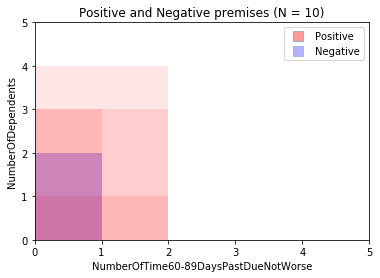

In [238]:
from matplotlib import patches
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

feat_num_1 = 8
feat_num_2 = 9

fig, ax = plt.subplots()
patches = []
num_polygons = 10
intens = 1

for i in range(num_polygons):
    concept_num = np.random.randint(positive_concepts_min.shape[0])
    point1 = [positive_concepts_min[concept_num,feat_num_1], positive_concepts_min[concept_num,feat_num_2]]
    point2 = [positive_concepts_min[concept_num,feat_num_1], positive_concepts_max[concept_num,feat_num_2]]
    point3 = [positive_concepts_max[concept_num,feat_num_1], positive_concepts_max[concept_num,feat_num_2]]
    point4 = [positive_concepts_max[concept_num,feat_num_1], positive_concepts_min[concept_num,feat_num_2]]
    pentagon = [point1, point2, point3, point4]
    polygon = Polygon(pentagon)
    patches.append(polygon)

p = PatchCollection(patches, cmap=matplotlib.cm.jet, alpha=intens/num_polygons, facecolor="red")
ax.add_collection(p)

patches = []
for i in range(num_polygons):
    concept_num = np.random.randint(positive_concepts_min.shape[0])
    point1 = [negative_concepts_min[concept_num,feat_num_1], negative_concepts_min[concept_num,feat_num_2]]
    point2 = [negative_concepts_min[concept_num,feat_num_1], negative_concepts_max[concept_num,feat_num_2]]
    point3 = [negative_concepts_max[concept_num,feat_num_1], negative_concepts_max[concept_num,feat_num_2]]
    point4 = [negative_concepts_max[concept_num,feat_num_1], negative_concepts_min[concept_num,feat_num_2]]
    pentagon = [point1, point2, point3, point4]
    polygon = Polygon(pentagon)
    patches.append(polygon)

p = PatchCollection(patches, cmap=matplotlib.cm.jet, alpha=intens/num_polygons, facecolor="blue")
ax.add_collection(p)

# colors = [50 for i in range(num_polygons)]
# colors = colors+[10 for i in range(num_polygons)]
# colors = 100*np.random.rand(len(patches))

# p.set_array(np.array(colors))

plt.xlim([0,5])
plt.ylim([0,5])
plt.xlabel(df_pos.columns[feat_num_1])
plt.ylabel(df_pos.columns[feat_num_2])
plt.title("Positive and Negative premises (N = "+str(num_polygons)+')')
from matplotlib.lines import Line2D
circ1 = Line2D([0], [0], linestyle="none", marker="s", alpha=0.4, markersize=10, markerfacecolor="red")
circ2 = Line2D([0], [0], linestyle="none", marker="s", alpha=0.3, markersize=10, markerfacecolor="blue")
plt.legend((circ1, circ2), ("Positive", "Negative"), numpoints=1, loc="best")
plt.show()

In [239]:
fig.savefig(str(num_polygons)+'_'+df_pos.columns[feat_num_1]+'_'+df_pos.columns[feat_num_2]+'.png')

In [40]:
feat_min_lim = np.vstack((positive_concepts_min.min(axis = 0), negative_concepts_min.min(axis = 0))).min(axis=0)
feat_max_lim = np.vstack((positive_concepts_max.max(axis = 0), negative_concepts_max.max(axis = 0))).max(axis=0)
feat_min_lim, feat_max_lim

(array([  0.,  21.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.]),
 array([  6.19000000e+03,   1.03000000e+02,   9.80000000e+01,
          6.24300000e+03,   5.82369000e+05,   5.20000000e+01,
          9.80000000e+01,   2.50000000e+01,   9.80000000e+01,
          2.00000000e+01]))

In [190]:
df_pos.columns

Index(['RevolvingUtilizationOfUnsecuredLines', 'age',
       'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome',
       'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
       'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse',
       'NumberOfDependents'],
      dtype='object')

# Anytime decision

In [243]:
ALPHA = [0.001]
SAMPLE_SIZES = [2]
N_OF_NEEDED_CONCEPTS = [2000]

for alpha in ALPHA:
    for subsample_size in SAMPLE_SIZES:
        for number_of_concepts in N_OF_NEEDED_CONCEPTS:

            start_time = datetime.datetime.now()
            print("PARAMS: ", number_of_concepts, alpha, subsample_size)
            print("MINING PLUS (+) STARTED AT:", start_time.ctime())

            DIR_NAME = "concepts_"+str(alpha)+'_'+str(subsample_size)
            PATH = ".\\"+DIR_NAME+"\\"
            positive_concepts_min = pd.read_csv(PATH+str(number_of_concepts)+'_'+"positive_concepts_min.csv",index_col=0).values
            positive_concepts_max = pd.read_csv(PATH+str(number_of_concepts)+'_'+"positive_concepts_max.csv",index_col=0).values
            negative_concepts_min = pd.read_csv(PATH+str(number_of_concepts)+'_'+"negative_concepts_min.csv",index_col=0).values
            negative_concepts_max = pd.read_csv(PATH+str(number_of_concepts)+'_'+"negative_concepts_max.csv",index_col=0).values
            
            positive_concepts_min = positive_concepts_min[:10]
            positive_concepts_max = positive_concepts_max[:10]
            negative_concepts_min = negative_concepts_min[:10]
            negative_concepts_max = negative_concepts_max[:10]
#             positive_n_intersections_with_neg = pd.read_csv(PATH+str(number_of_concepts)+'_'+"positive_n_intersections_with_neg.csv",index_col=0, header=-1).values[:,0]
#             negative_n_intersections_with_pos = pd.read_csv(PATH+str(number_of_concepts)+'_'+"negative_n_intersections_with_neg.csv",index_col=0, header=-1).values[:,0]


            NUMBER_OF_MINI_TEST = 0

            mini_test_size = df_test.shape[0]//8
            start_index = mini_test_size*NUMBER_OF_MINI_TEST
            end_index = start_index+mini_test_size
            mini_test_index = df_test.index[start_index:end_index]

            NUMBER_OF_POS_VOTES = []
            NUMBER_OF_NEG_VOTES = []
            start_time = datetime.datetime.now()
            for test_index in mini_test_index:
                test_obj = df_test.loc[test_index].values

                neg_itersections_with_all_pos = np.zeros(number_of_concepts)
                pos_itersections_with_all_neg = np.zeros(number_of_concepts)
                X_neg = X_neg_true[np.random.choice(X_neg_true.shape[0], size=X_pos.shape[0], replace=False)]

                premises_min = np.minimum(positive_concepts_min,test_obj)
                premises_max = np.maximum(positive_concepts_max,test_obj)
                premises = np.concatenate((premises_min,  premises_max), axis=1)
                pos_itersections_with_all_neg = np.apply_along_axis(lambda row: np.sum( ((row[:10] <= X_neg) & (X_neg <= row[10:])).all(axis=1) ), 1, premises)

                premises_min = np.minimum(negative_concepts_min,test_obj)
                premises_max = np.maximum(negative_concepts_max,test_obj)
                premises = np.concatenate((premises_min,  premises_max), axis=1)
                neg_itersections_with_all_pos = np.apply_along_axis(lambda row: np.sum( ((row[:10] <= X_pos) & (X_pos <= row[10:])).all(axis=1) ), 1, premises)


                NUMBER_OF_POS_VOTES.append(np.sum(pos_itersections_with_all_neg/X_neg.shape[0] <= alpha))
                NUMBER_OF_NEG_VOTES.append(np.sum(neg_itersections_with_all_pos/X_pos.shape[0] <= alpha))


            result = pd.DataFrame({'POS_VOTES':NUMBER_OF_POS_VOTES,'NEG_VOTES':NUMBER_OF_NEG_VOTES,'y_true':y[mini_test_index]}, index=mini_test_index)
            y_true = result.y_true
            num_of_unclassified = np.sum((result.NEG_VOTES == 0) & (result.POS_VOTES == 0))

            # Вычитаем голоса
            y_pred_diff = result.POS_VOTES*1 - result.NEG_VOTES*1
            y_pred_diff.loc[(result.NEG_VOTES == 0) & (result.POS_VOTES == 0)] = 0 # У КОГО СЧЕТ 0:0, тех относим к классу 0
            y_pred_diff = y_pred_diff - np.min(y_pred_diff)/(np.max(y_pred_diff)-np.min(y_pred_diff))
            roc_auc_diff = sklearn.metrics.roc_auc_score(y_true,y_pred_diff)
            gini_diff = roc_auc_diff*2 - 1

            # Доля голосов
            y_pred_div = result.POS_VOTES*1/(result.POS_VOTES*1+result.NEG_VOTES*1)
            y_pred_div.loc[(result.NEG_VOTES == 0) & (result.POS_VOTES == 0)] = 0 # У КОГО СЧЕТ 0:0, тех относим к классу 0
            roc_auc_div = sklearn.metrics.roc_auc_score(y_true,y_pred_div)
            gini_div = roc_auc_div*2 - 1

            print(datetime.datetime.now() - start_time)
            print("ENDED AT:", datetime.datetime.now())
            print("")

PARAMS:  2000 0.001 2
MINING PLUS (+) STARTED AT: Fri Nov  3 19:44:06 2017
0:00:48.651162
ENDED AT: 2017-11-03 19:44:54.920282



In [245]:
gini_div

0.51738305488404124

In [ ]:
    y_true = result.y_true
    num_of_unclassified = np.sum((result.NEG_VOTES == 0) & (result.POS_VOTES == 0))

    # Вычитаем голоса
    y_pred_diff = result.POS_VOTES*1 - result.NEG_VOTES*1
    y_pred_diff.loc[(result.NEG_VOTES == 0) & (result.POS_VOTES == 0)] = 0 # У КОГО СЧЕТ 0:0, тех относим к классу 0
    y_pred_diff = y_pred_diff - np.min(y_pred_diff)/(np.max(y_pred_diff)-np.min(y_pred_diff))
    roc_auc_diff = sklearn.metrics.roc_auc_score(y_true,y_pred_diff)
    gini_diff = roc_auc_diff*2 - 1

    # Доля голосов
    y_pred_div = result.POS_VOTES*1/(result.POS_VOTES*1+result.NEG_VOTES*1)
    y_pred_div.loc[(result.NEG_VOTES == 0) & (result.POS_VOTES == 0)] = 0 # У КОГО СЧЕТ 0:0, тех относим к классу 0
    roc_auc_div = sklearn.metrics.roc_auc_score(y_true,y_pred_div)
    gini_div = roc_auc_div*2 - 1

##### Classifying objects with missing data

In [624]:
df_na = pd.read_csv('cs-training.csv', index_col=0)
df_na = df_na[df_na.MonthlyIncome.isnull()]
df_na.shape

(29731, 11)

In [628]:
df_na_pos = df_na[df_na.SeriousDlqin2yrs == 1]
df_na_minus = df_na.drop(df_na_pos.index)
df_na_pos_test = df_na_pos.sample(frac=0.1, random_state=1)
df_na_neg_test = df_na_minus.sample(frac=0.1, random_state=1)
df_na_test = df_na_pos_test.append(df_na_neg_test)

In [636]:
# df_na_test.to_csv('df_na_test.csv')

In [643]:
df_na_test = pd.read_csv('df_na_test.csv', index_col=0)
y_na_true = df_na_test.SeriousDlqin2yrs
df_na_test = df_na_test.drop('SeriousDlqin2yrs', axis=1)

In [843]:
df_na_test = pd.read_csv('cs-test.csv', index_col=0)
y_na_true = df_na_test.SeriousDlqin2yrs
df_na_test = df_na_test.drop('SeriousDlqin2yrs', axis=1)

ALPHA = [0.001]
SAMPLE_SIZES = [3]
N_OF_NEEDED_CONCEPTS = [2000]

for alpha in ALPHA:
    for subsample_size in SAMPLE_SIZES:
        for number_of_concepts in N_OF_NEEDED_CONCEPTS:

            start_time = datetime.datetime.now()
            print("PARAMS: ", number_of_concepts, alpha, subsample_size)
            print("MINING PLUS (+) STARTED AT:", start_time.ctime())

            DIR_NAME = "concepts_"+str(alpha)+'_'+str(subsample_size)
            PATH = ".\\"+DIR_NAME+"\\"
            positive_concepts_min = pd.read_csv(PATH+str(number_of_concepts)+'_'+"positive_concepts_min.csv",index_col=0).values
            positive_concepts_max = pd.read_csv(PATH+str(number_of_concepts)+'_'+"positive_concepts_max.csv",index_col=0).values
            negative_concepts_min = pd.read_csv(PATH+str(number_of_concepts)+'_'+"negative_concepts_min.csv",index_col=0).values
            negative_concepts_max = pd.read_csv(PATH+str(number_of_concepts)+'_'+"negative_concepts_max.csv",index_col=0).values

            positive_n_intersections_with_neg = pd.read_csv(PATH+str(number_of_concepts)+'_'+"positive_n_intersections_with_neg.csv",index_col=0, header=-1).values[:,0]
            negative_n_intersections_with_pos = pd.read_csv(PATH+str(number_of_concepts)+'_'+"negative_n_intersections_with_neg.csv",index_col=0, header=-1).values[:,0]


            NUMBER_OF_MINI_TEST = 0

            mini_test_size = df_na_test.shape[0]//8
            start_index = mini_test_size*NUMBER_OF_MINI_TEST
            end_index = start_index+mini_test_size
            mini_test_index = df_na_test.index[start_index:end_index]

            NUMBER_OF_POS_VOTES = []
            NUMBER_OF_NEG_VOTES = []
            start_time = datetime.datetime.now()
            for test_index in mini_test_index:
                test_obj = df_na_test.loc[test_index].values

                neg_itersections_with_all_pos = np.zeros(number_of_concepts)
                pos_itersections_with_all_neg = np.zeros(number_of_concepts)
                X_neg = X_neg_true[np.random.choice(X_neg_true.shape[0], size=X_pos.shape[0], replace=False)]
                
                test_obj_max = test_obj.copy()
                test_obj_max[np.isnan(test_obj_max)] = np.inf
                test_obj_min = test_obj.copy()
                test_obj_min[np.isnan(test_obj_min)] = -np.inf
                
                premises_min = np.minimum(positive_concepts_min,test_obj_min)
                premises_max = np.maximum(positive_concepts_max,test_obj_max)
                premises = np.concatenate((premises_min,  premises_max), axis=1)
                pos_itersections_with_all_neg = np.apply_along_axis(lambda row: np.sum( ((row[:10] <= X_neg) & (X_neg <= row[10:])).all(axis=1) ), 1, premises)

                premises_min = np.minimum(negative_concepts_min,test_obj_min)
                premises_max = np.maximum(negative_concepts_max,test_obj_max)
                premises = np.concatenate((premises_min,  premises_max), axis=1)
                neg_itersections_with_all_pos = np.apply_along_axis(lambda row: np.sum( ((row[:10] <= X_pos) & (X_pos <= row[10:])).all(axis=1) ), 1, premises)


                NUMBER_OF_POS_VOTES.append(np.sum(pos_itersections_with_all_neg/X_neg.shape[0] <= alpha))
                NUMBER_OF_NEG_VOTES.append(np.sum(neg_itersections_with_all_pos/X_pos.shape[0] <= alpha))


            df_result = pd.DataFrame({'POS_VOTES':NUMBER_OF_POS_VOTES,'NEG_VOTES':NUMBER_OF_NEG_VOTES,'y_true':y_na_true[mini_test_index]}, index=mini_test_index)


            FILE_NAME = 'na_'+str(NUMBER_OF_MINI_TEST)+".csv"
            PATH = ".\\"+DIR_NAME+"\\"+FILE_NAME
            df_result.to_csv(PATH)

            print(datetime.datetime.now() - start_time)
            print("ENDED AT:", datetime.datetime.now())
            print("")

PARAMS:  2000 0.001 3
MINING PLUS (+) STARTED AT: Sun Jun 11 03:36:05 2017
9:33:00.717468
ENDED AT: 2017-06-11 13:09:06.181759



### Logistic regression

In [914]:
df_train = df.drop(df_test.index).drop('SeriousDlqin2yrs', axis=1)
y_train_true = y[df_train.index]
y_test_true = y[df_test.index]

In [940]:
from sklearn import linear_model
X = df_train.values

start_time = datetime.datetime.now() 
print("START fitting:", start_time)
LR = linear_model.LogisticRegression(C=10, penalty='l1')
LR.fit(X,y_train_true)

print("END fitting:", datetime.datetime.now() - start_time)

START fitting: 2017-06-12 21:12:40.335444
END fitting: 0:00:01.694901


In [941]:
y_test_pred = LR.predict_proba(df_test.values)
sklearn.metrics.roc_auc_score(y_test_true,y_test_pred[:,1])

0.67759379439818135

### 

###### Оценивание тестовой выборки с  Kaggle

In [859]:
COL1 = []
COL2 = []
COL3 = []
COL4 = []
COL5 = []
COL6 = []
COL7 = []
COL8 = []
COL9 = []
COL10 = []

N_OF_ITER = []
ALPHA = []
SAMPLE_SIZES = []


def generate_grid(N_OF_ITER,ALPHA,SAMPLE_SIZES):
    X = [2000]
    Y = [0.001]
    Z = [3]
    for x in X:
        for y in Y:
            for z in Z:
                N_OF_ITER.append(x)
                ALPHA.append(y)
                SAMPLE_SIZES.append(z)
    
generate_grid(N_OF_ITER,ALPHA,SAMPLE_SIZES)

# MODIFICATION = "all_X_NEG_"
MODIFICATION = "concepts_"

# for dir_name in os.listdir():
#     dir_name = dir_name.strip(MODIFICATION).split('_')
#     if len(dir_name)==3 and str.isnumeric(dir_name[0]) and str.isnumeric(dir_name[2]):
#         number_of_iterations = int(dir_name[0])
#         alpha = float(dir_name[1])
#         subsample_size = int(dir_name[2])
#         # CONDITIONS. Что печатать?
#         if alpha == 0.002:
#             N_OF_ITER.append(number_of_iterations)
#             ALPHA.append(alpha)
#             SAMPLE_SIZES.append(subsample_size)
    

for number_of_iterations,alpha,subsample_size in zip(N_OF_ITER,ALPHA,SAMPLE_SIZES):
    DIR_NAME = MODIFICATION+str(alpha)+'_'+str(subsample_size)
    result = pd.DataFrame()
    for NUMBER_OF_MINI_TEST in range(8):
        FILE_NAME = "na_"+str(NUMBER_OF_MINI_TEST)+".csv"
        PATH = ".\\"+DIR_NAME+"\\"+FILE_NAME
        result_mini_test = pd.read_csv(PATH, index_col=0)
        result = pd.concat((result,result_mini_test))


    y_true = result.y_true
    num_of_unclassified = np.sum((result.NEG_VOTES == 0) & (result.POS_VOTES == 0))

    # Вычитаем голоса
    y_pred_diff = result.POS_VOTES*1 - result.NEG_VOTES*1
    y_pred_diff.loc[(result.NEG_VOTES == 0) & (result.POS_VOTES == 0)] = 0 # У КОГО СЧЕТ 0:0, тех относим к классу 0
    y_pred_diff = 1 / (1 + np.exp(-y_pred_diff))
#     roc_auc_diff = sklearn.metrics.roc_auc_score(y_true,y_pred_diff)
#     gini_diff = roc_auc_diff*2 - 1

    # Доля голосов
    y_pred_div = result.POS_VOTES*1/(result.POS_VOTES*1+result.NEG_VOTES*1)
    y_pred_div.loc[(result.NEG_VOTES == 0) & (result.POS_VOTES == 0)] = 0 # У КОГО СЧЕТ 0:0, тех относим к классу 0
#     roc_auc_div = sklearn.metrics.roc_auc_score(y_true,y_pred_div)
#     gini_div = roc_auc_div*2 - 1


    

In [861]:
y_pred_div.to_csv('kaggle_score.csv')

In [650]:
np.minimum(positive_concepts_min[0], test_obj)

array([  0.36762161,  37.        ,   0.        ,   1.26045016,
                nan,   6.        ,   0.        ,   2.        ,
         0.        ,   1.        ])

In [653]:
X_neg[0]

array([  4.08411974e-01,   3.30000000e+01,   2.00000000e+00,
         1.38388626e-01,   2.10900000e+03,   7.00000000e+00,
         0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
         0.00000000e+00])

In [652]:
X_neg[0] >= np.minimum(positive_concepts_min[0], test_obj)

array([ True, False,  True, False, False,  True,  True, False,  True, False], dtype=bool)

### Extration & Quality measurement

In [491]:
sum((result.NEG_VOTES == 0) & (result.POS_VOTES == 0))

0

### Second ML step

In [19]:
import sklearn.svm

N_OF_ITER = [100,200]
# ALPHA = [0.001,0.002,0.003,0.004]
ALPHA = [0.001]
SAMPLE_SIZES = [1,2,3]
MODIFICATION = ""

second_step_df = pd.DataFrame()
for number_of_iterations in N_OF_ITER:
    for alpha in ALPHA:
        for subsample_size in SAMPLE_SIZES:
            DIR_NAME = MODIFICATION+str(number_of_iterations)+'_'+str(alpha)+'_'+str(subsample_size)

            result = pd.DataFrame()
            for NUMBER_OF_MINI_TEST in range(8):
                FILE_NAME = str(NUMBER_OF_MINI_TEST)+".csv"
                PATH = ".\\"+DIR_NAME+"\\"+FILE_NAME
                result_mini_test = pd.read_csv(PATH, index_col=0)
                result = pd.concat((result,result_mini_test))
            second_step_df[DIR_NAME + '_POS'] = result.POS_VOTES
            second_step_df[DIR_NAME + '_NEG'] = result.NEG_VOTES

sec_step_X_train = second_step_df.values
y_true = result.y_true

# grid = {'C': np.power(10.0, np.arange(-4, 1))}
grid = {'C': [0.001]}
cv = sklearn.model_selection.KFold(n_splits=5, shuffle=True)
clf = sklearn.svm.SVC(kernel='linear', random_state=1)
gs = sklearn.model_selection.GridSearchCV(clf, grid, scoring='roc_auc', cv=cv)
gs.fit(sec_step_X_train, y_true)
gs.cv_results_['mean_train_score'], gs.cv_results_['mean_test_score'], 

(array([ 0.70110061]), array([ 0.6858754]))

5

In [18]:
gs.cv_results_

{'mean_fit_time': array([ 0.85633297]),
 'mean_score_time': array([ 0.15803194]),
 'mean_test_score': array([ 0.62938486]),
 'mean_train_score': array([ 0.63212142]),
 'param_C': masked_array(data = [0.0001],
              mask = [False],
        fill_value = ?),
 'params': ({'C': 0.0001},),
 'rank_test_score': array([1]),
 'split0_test_score': array([ 0.70013692]),
 'split0_train_score': array([ 0.68026831]),
 'split1_test_score': array([ 0.70688365]),
 'split1_train_score': array([ 0.70430418]),
 'split2_test_score': array([ 0.59671123]),
 'split2_train_score': array([ 0.61365095]),
 'split3_test_score': array([ 0.71562724]),
 'split3_train_score': array([ 0.72172757]),
 'split4_test_score': array([ 0.42750362]),
 'split4_train_score': array([ 0.44065607]),
 'std_fit_time': array([ 0.04595764]),
 'std_score_time': array([ 0.01110319]),
 'std_test_score': array([ 0.10978873]),
 'std_train_score': array([ 0.10252597])}

In [507]:
PATH,FILE_NAME,DIR_NAME

('.\\concepts_0.005_4\\', '0.csv', 'concepts_0.005_4')

In [40]:
at_df = pd.read_csv('anytime_decision.csv')
at_df['time'] = at_df.n_iter*3.75
at_df

,n_iter,alpha,subs_size,Gini,time
0,20,0.001,2,0.343,75.0
1,30,0.001,2,0.541,112.5
2,50,0.001,2,0.602,187.5
3,100,0.001,2,0.653,375.0
4,200,0.001,2,0.658,750.0
5,500,0.001,2,0.670,1875.0
6,1000,0.001,2,0.671,3750.0


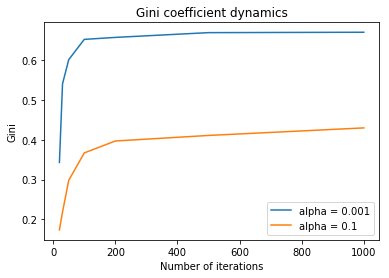

In [46]:
import matplotlib.pyplot as plt
at_df2 = pd.read_csv('anytime_decision2.csv')
plt.xlabel('Number of iterations')
plt.ylabel('Gini')
plt.title("Gini coefficient dynamics")
plt.plot(at_df.n_iter, at_df.Gini)
plt.plot(at_df2.n_iter, at_df2.Gini)
plt.legend(("alpha = 0.001", "alpha = 0.1"), numpoints=1, loc="best")
plt.savefig('gini_dynamics.png')

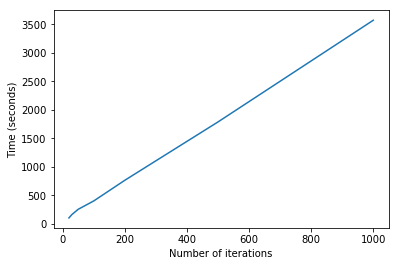

In [57]:
import matplotlib.pyplot as plt
plt.xlabel('Number of iterations')
plt.ylabel('Time (seconds)')
plt.plot([20,30,50,100,200,500,1000], [
    104.2363634,
    165.5123,
    255.967,
    402.42,
    765.1,
    1789.0,
    3574.0])
plt.savefig('time.png')

In [48]:
104.2363634
165.5123
255.967
375.0
750.0
1875.0
3750.0

0      75.0
1     112.5
2     187.5
3     375.0
4     750.0
5    1875.0
6    3750.0
Name: time, dtype: float64

### Классифицируем объекты с пропусками в данных

In [628]:
df_nan = pd.read_csv('cs-training.csv', index_col=0)

In [637]:
np.sum(df_nan[df_nan.MonthlyIncome.isnull()].SeriousDlqin2yrs == 0)

28062

### MLCA (Choose 500 concepts only once)

In [11]:
GOOD_CONCEPTS = 500 # number_of_iterations
alpha = 0.1
subsample_size = 0.05 # %
df_train_neg_size = len(df_train_neg)
df_train_pos_size = len(df_train_pos)
df_train_neg.shape, df_train_pos.shape

((125977, 10), (9024, 10))

In [12]:
subsample_size/100/10*df_train_neg_size

6.298850000000001

In [13]:
good_concepts_pos_min = pd.DataFrame(columns=df_test.columns)
good_concepts_pos_max = pd.DataFrame(columns=df_test.columns)
number_of_good_concepts = 0
while number_of_good_concepts < GOOD_CONCEPTS:
    sample = df_train_pos.sample(frac=subsample_size/100)
    minimum, maximum = intersect_attr(sample)
    if len(image_of_description(minimum, maximum, df_train_neg))/df_train_neg_size <= alpha:
        good_concepts_pos_min = good_concepts_pos_min.append(minimum, ignore_index=True)
        good_concepts_pos_max = good_concepts_pos_max.append(maximum, ignore_index=True)
        number_of_good_concepts +=1
good_concepts_pos_min.head()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,0.330068,23.0,0.0,0.212224,-inf,1.0,0.0,0.0,0.0,0.0
1,0.067623,34.0,0.0,0.283177,3300.000000,1.0,0.0,1.0,0.0,0.0
2,0.706431,28.0,0.0,0.000000,-inf,0.0,0.0,0.0,0.0,0.0
3,0.542814,33.0,0.0,0.021451,1666.000000,2.0,0.0,0.0,0.0,0.0
4,0.041549,31.0,0.0,0.359920,-inf,2.0,0.0,0.0,0.0,0.0


In [14]:
good_concepts_neg_min = pd.DataFrame(columns=df_test.columns)
good_concepts_neg_max = pd.DataFrame(columns=df_test.columns)
number_of_good_concepts = 0
# i = 0
while number_of_good_concepts < GOOD_CONCEPTS:
    sample = df_train_neg.sample(frac=subsample_size/100/10)
    minimum, maximum = intersect_attr(sample)
    if len(image_of_description(minimum, maximum, df_train_pos))/df_train_pos_size <= alpha:
        good_concepts_neg_min = good_concepts_neg_min.append(minimum, ignore_index=True)
        good_concepts_neg_max = good_concepts_neg_max.append(maximum, ignore_index=True)
        number_of_good_concepts +=1
#     i+=1
#     if i>100:
#         break
good_concepts_neg_min.head()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,0.000000,42.0,0.0,0.000000,1883.000000,4.0,0.0,0.0,0.0,0.0
1,0.000000,46.0,0.0,0.000279,-inf,3.0,0.0,0.0,0.0,0.0
2,0.004811,30.0,0.0,0.000000,-inf,0.0,0.0,0.0,0.0,0.0
3,0.066345,26.0,0.0,0.129473,1600.000000,4.0,0.0,0.0,0.0,0.0
4,0.066158,42.0,0.0,0.140468,3400.000000,5.0,0.0,0.0,0.0,0.0


In [47]:
df_results = pd.DataFrame(df['SeriousDlqin2yrs'].loc[df_test.index])
df_results['PositiveVotes'] = 0
df_results['NegativeVotes'] = 0

In [ ]:
while df_results['PositiveVotes'].iloc[0] <= df_results['NegativeVotes'].iloc[0]:
    good_concepts_pos_min = pd.DataFrame(columns=df_test.columns)
    good_concepts_pos_max = pd.DataFrame(columns=df_test.columns)
    number_of_good_concepts = 0
    while number_of_good_concepts < GOOD_CONCEPTS:
        sample = df_train_pos.sample(frac=subsample_size/100)
        minimum, maximum = intersect_attr(sample)
        if len(image_of_description(minimum, maximum, df_train_neg))/df_train_neg_size <= alpha:
            good_concepts_pos_min = good_concepts_pos_min.append(minimum, ignore_index=True)
            good_concepts_pos_max = good_concepts_pos_max.append(maximum, ignore_index=True)
            number_of_good_concepts +=1
    good_concepts_pos_min.head()

    good_concepts_neg_min = pd.DataFrame(columns=df_test.columns)
    good_concepts_neg_max = pd.DataFrame(columns=df_test.columns)
    number_of_good_concepts = 0
    # i = 0
    while number_of_good_concepts < GOOD_CONCEPTS:
        sample = df_train_neg.sample(frac=subsample_size/100/10)
        minimum, maximum = intersect_attr(sample)
        if len(image_of_description(minimum, maximum, df_train_pos))/df_train_pos_size <= alpha:
            good_concepts_neg_min = good_concepts_neg_min.append(minimum, ignore_index=True)
            good_concepts_neg_max = good_concepts_neg_max.append(maximum, ignore_index=True)
            number_of_good_concepts +=1
    #     i+=1
    #     if i>100:
    #         break
    good_concepts_neg_min.head()

    for ind in df_test.index[0:1]:
        row = df_test.loc[ind]
        votes_for_pos = 0
        for concept_num in range(GOOD_CONCEPTS):
            row_of_concept_max = good_concepts_pos_max.iloc[concept_num]
            row_of_concept_min = good_concepts_pos_min.iloc[concept_num]
            minimum, maximum = intersect_attr(pd.DataFrame([row,row_of_concept_min,row_of_concept_max]))
            if len(image_of_description(minimum, maximum, df_train_neg))/df_train_neg_size <= alpha:
                votes_for_pos +=1

        votes_for_neg = 0
        for concept_num in range(GOOD_CONCEPTS):
            row_of_concept_max = good_concepts_neg_max.iloc[concept_num]
            row_of_concept_min = good_concepts_neg_min.iloc[concept_num]
            minimum, maximum = intersect_attr(pd.DataFrame([row,row_of_concept_min,row_of_concept_max]))
            if len(image_of_description(minimum, maximum, df_train_pos))/df_train_pos_size <= alpha:
                votes_for_neg +=1
        # votes for neg, votes for pos
        df_results['PositiveVotes'].loc[ind] = votes_for_pos
        df_results['NegativeVotes'].loc[ind] = votes_for_neg
    print(votes_for_pos, votes_for_neg)


In [30]:
df_results = pd.DataFrame(df['SeriousDlqin2yrs'].loc[df_test.index])
df_results['PositiveVotes'] = 0
df_results['NegativeVotes'] = 0

In [27]:
# good_concepts_pos_min.to_csv('good_concepts_pos_min.csv')
# good_concepts_pos_max.to_csv('good_concepts_pos_max.csv')
# good_concepts_neg_min.to_csv('good_concepts_neg_min.csv')
# good_concepts_neg_max.to_csv('good_concepts_neg_max.csv')

In [60]:
good_concepts_pos_min = pd.read_csv('good_concepts_pos_min.csv',index_col=0)
good_concepts_pos_max = pd.read_csv('good_concepts_pos_max.csv',index_col=0)
good_concepts_neg_min = pd.read_csv('good_concepts_neg_min.csv',index_col=0)
good_concepts_neg_max = pd.read_csv('good_concepts_neg_max.csv',index_col=0)

In [46]:
df_results['PositiveVotes'].iloc[0] <= df_results['NegativeVotes'].iloc[0]

True

In [40]:
for ind in df_test.index[1:2]:
    row = df_test.loc[ind]
    votes_for_pos = 0
    for concept_num in range(GOOD_CONCEPTS):
        row_of_concept_max = good_concepts_pos_max.iloc[concept_num]
        row_of_concept_min = good_concepts_pos_min.iloc[concept_num]
        minimum, maximum = intersect_attr(pd.DataFrame([row,row_of_concept_min,row_of_concept_max]))
        if len(image_of_description(minimum, maximum, df_train_neg))/df_train_neg_size <= alpha:
            votes_for_pos +=1

    votes_for_neg = 0
    for concept_num in range(GOOD_CONCEPTS):
        row_of_concept_max = good_concepts_neg_max.iloc[concept_num]
        row_of_concept_min = good_concepts_neg_min.iloc[concept_num]
        minimum, maximum = intersect_attr(pd.DataFrame([row,row_of_concept_min,row_of_concept_max]))
        if len(image_of_description(minimum, maximum, df_train_pos))/df_train_pos_size <= alpha:
            votes_for_neg +=1
    # votes for neg, votes for pos
    df_results['PositiveVotes'].loc[ind] = votes_for_pos
    df_results['NegativeVotes'].loc[ind] = votes_for_neg
df_results.head()

,SeriousDlqin2yrs,PositiveVotes,NegativeVotes
186,1,83,298
276,1,366,427
351,1,0,0
521,1,0,0
851,1,0,0


In [34]:
df_results.loc[df_test.index[10000]]

SeriousDlqin2yrs      0
PositiveVotes       395
NegativeVotes       480
Name: 95595, dtype: int64

In [159]:
premises_neg_max.head()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1.373022,82.0,2.0,5120.0,inf,31.0,1.0,13.0,2.0,inf
1,1.072993,87.0,98.0,7057.0,inf,24.0,98.0,4.0,98.0,inf
2,1.083944,88.0,5.0,11887.0,inf,30.0,2.0,8.0,3.0,inf
3,1.006160,86.0,98.0,5466.0,inf,29.0,98.0,5.0,98.0,inf
4,1.212625,90.0,3.0,7582.0,inf,29.0,4.0,4.0,2.0,inf


In [162]:
pd.DataFrame([minimum,maximum])

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,0.000000,21.0,0.0,0.0,-inf,0.0,0.0,0.0,0.0,-inf
0,1.373022,82.0,2.0,5120.0,inf,31.0,1.0,13.0,2.0,inf


In [163]:
minimum = premises_neg_min.iloc[0]
maximum = premises_neg_max.iloc[0]

len(image_of_description(minimum, maximum, df_train_pos))

6296

In [20]:
dff_pos = df_train_pos.iloc[:150].as_matrix()
dff_neg = df_train_neg.iloc[:150].as_matrix()
dff_neg.shape

(150, 10)

In [62]:
good_concepts_neg_max = good_concepts_neg_max.as_matrix()
good_concepts_neg_min = good_concepts_neg_min.as_matrix()

AttributeError: 'numpy.ndarray' object has no attribute 'as_matrix'

In [79]:
(good_concepts_neg_max < maximum).shape

ValueError: operands could not be broadcast together with shapes (500,10) (150,10) 

In [87]:
y

array([  0.9999999 ,  45.        ,   2.        ,   0.80298213,
                inf,  13.        ,   0.        ,   6.        ,
         0.        ,   2.        ])

In [95]:
np.inf <= np.inf

True

In [111]:
y = maximum[100]
np.sum(np.apply_along_axis(lambda x: np.sum(x<=y)==10, 1, good_concepts_neg_max))

0

In [41]:
index_of_test = df_test.index[0]
row2 = df_test.iloc[index_of_test]

minimum = np.apply_along_axis(lambda x : np.minimum(x, row2),1,dff_pos) # пересекаем 1 тест со всеми + примерами
maximum = np.apply_along_axis(lambda x : np.maximum(x, row2),1,dff_pos) # и вычисяем левую и правую границы
minimum[minimum==-1] = -np.inf
maximum[minimum==-np.inf] = np.inf
M_is_concepts_neg_max_less_MAX = np.apply_along_axis(lambda y : np.apply_along_axis(lambda x: np.sum(y<=x)==10, 1, dff_neg), 1, minimum)
# 
is_less = np.apply_along_axis(lambda y : np.apply_along_axis(lambda x: np.sum(y<=x)==10, 1, dff_neg), 1, minimum)
is_greater = np.apply_along_axis(lambda y : np.apply_along_axis(lambda x: np.sum(y>=x)==10, 1, dff_neg), 1, maximum)

is_inside = is_greater & is_less
is_less, is_greater

(150, 150)

In [35]:
how_many_inside = np.sum(is_inside,axis=1)
how_many_ok = len(how_many_inside[how_many_inside==0])
df_results['PositiveVotes'].loc[index_of_test] = how_many_ok
###########################################################################
# теперь считаем отрицательные голоса

minimum = np.apply_along_axis(lambda x : np.minimum(x, row2),1,dff_neg) # пересекаем 1 тест со всеми + примерами
maximum = np.apply_along_axis(lambda x : np.maximum(x, row2),1,dff_neg) # и вычисяем левую и правую границы
minimum[minimum==-1] = -np.inf
maximum[minimum==-np.inf] = np.inf

# 
is_less = np.apply_along_axis(lambda y : np.apply_along_axis(lambda x: np.sum(y<=x)==10, 1, dff_pos), 1, minimum)

is_greater = np.apply_along_axis(lambda y : np.apply_along_axis(lambda x: np.sum(y>=x)==10, 1, dff_pos), 1, maximum)

is_inside = is_greater & is_less

how_many_inside = np.sum(is_inside,axis=1)
how_many_ok = len(how_many_inside[how_many_inside==0])
df_results['NegativeVotes'].loc[index_of_test] = how_many_ok
df_results.head()

,SeriousDlqin2yrs,PositiveVotes,NegativeVotes
186,1,67,75
276,1,0,0
351,1,0,0
521,1,0,0
851,1,0,0


In [ ]:
i = 0
for index_of_test in df_test.index[:1]:
    for index_of_pos in df_train_pos.index:
        minimum, maximum = intersect_attr(index_of_test, index_of_pos, df)
#         print(len(image_of_description(minimum, maximum,df_train_neg)))
        image_of_description(minimum, maximum,df_train_neg)
        i+=1


In [ ]:
image_of_description(minimum, maximum,df_train_neg)

In [ ]:
df_test.index[:10]

In [ ]:
maximum

In [ ]:
np.nan < 10